# 22 — Auxiliary Prediction Heads Screen (TDI + Emax)

**Cheap screen only: a single fold, three seeds per arm, three arms.** Does NOT run the full
25-fold CV, does NOT build or evaluate an ensemble, does NOT prepare or send a submission.

## What this tests, and why it is different from every prior negative result

Every modelling change screened so far in this project has **rearranged existing information**:
ensembling (notebooks 08/10/12, failed twice on the real board), charge descriptors (notebook 18,
ties on all four isoforms, error correlation 0.984-0.990 against its own baseline),
interval-aware objectives (notebook 21, exploitable gap only 0.06-0.12 pIC50 units), residual
exclusion (notebook 20, unresolved, effect smaller than seed spread). None of them **added**
information.

The leading entrant on this challenge trains on roughly 31,670 compounds and 161,400 labels by
giving each additional assay its own output head, keeping the scored pIC50 heads separate so no
cross-assay scale correction is needed. This project trains on 4,905 compounds and 6,525
measurements. This notebook tests that mechanism using **only files already released with this
challenge and already audited in notebook 00** — no external downloads, no new curation, no
cross-platform scale problem: `TRAIN_TDI.csv` and `TRAIN_Emax.csv` are the same assay platform as
`TRAIN_inhibition.csv`, confirmed in notebook 00 by their `_direct_inhibition` columns being
bit-identical to `TRAIN_inhibition.csv` (max_abs_diff = 0.000000000 on all four isoforms, all
4,905 shared compounds).

**KEY MECHANISM.** Notebook 00 found 1,240 compounds present in `TRAIN_TDI.csv` but absent from
`TRAIN_inhibition.csv`, all with all-null `direct_inhibition`. Those compounds contribute NOTHING
to the current (BASELINE) model. As auxiliary-head training rows they expand the encoder's
compound pool by ~25% without any external data — this is the hypothesis under test.

**NEGATIVE PRECEDENT, stated honestly.** A comparable entrant on the prior OpenADMET PXR challenge
tested auxiliary prediction targets and found they **hurt**. This is not a safe bet. The
difference claimed here is separate heads per assay keeping their own scales, on the same
platform. The result is reported against that precedent either way, not massaged toward a
preferred outcome.

## Design: three arms, same single fold, same three seeds, everything else identical

| arm | heads | what's added |
|---|---|---|
| BASELINE | 4 | `CYP{1A2,2C9,2D6,3A4}_pIC50_direct_inhibition` — the current model, unchanged |
| TDI | 8 | BASELINE + `CYP{iso}_pIC50_TDI_condition` (4 heads) |
| TDI+EMAX | 12 | TDI + `CYP{iso}_EmaxVsPosCtrl_direct_inhibition` (4 heads) |

Regression heads only. The `*_is_TDI` columns are excluded (object/categorical dtype per notebook
00 — mixing a classification loss in would confound this comparison). No `_conf_high`, `_conf_low`
or `_std` column is used as a target. The single-concentration screen (long-format, 17,504 rows,
would need a pivot + a replicate-aggregation judgement call) is explicitly out of scope for this
task — kept separate so it doesn't introduce a silent judgement call into a comparison meant to be
clean.

Same architecture (`chemprop_chemeleoninit`), same fold (`repeat_0`, `fold=0` — matching notebooks
04a/06/18/20's own precedent), same three seeds, same `epochs=50`/`patience=5`, same learning
rate/batch size (chemprop CLI defaults, identical across all 9 runs since every run goes through
the same unmodified `src/chemprop_screen.py` helpers) across all three arms. BASELINE is retrained
here rather than reused from `outputs/05_cv_comparison`, so fold/seed/environment/Chemprop version
are shared end-to-end by all three arms; that directory is read-only reference throughout.

## Scope boundaries (explicit)

Does not modify `data/folds/cv_folds.csv`, `data/processed/*`, `outputs/05_cv_comparison/`,
`outputs/06_outlier_check/`, `outputs/11_caruana_prep/`, `outputs/board_solved_calibration/`,
`outputs/19_cyp2c9_revert/`, `outputs/20_residual_exclusion_screen/`,
`outputs/21_strae_offset_curve/`, `src/calibration.py`, or any submission artifact. Does not run
the full 25-fold CV. Does not build, select or evaluate an ensemble. Does not prepare, validate or
send a submission. Does not touch the single-concentration file.


## Setup

In [1]:

import sys
import time
from pathlib import Path

REPO_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
sys.path.insert(0, str(REPO_ROOT))

import importlib.metadata
import json
import os
from itertools import combinations

import numpy as np
import pandas as pd

from src.features import canonicalize_smiles, smiles_to_inchikey, assign_screen_split
from src.chemprop_screen import (
    ISOFORM_SHORT_NAMES,
    build_predict_csv,
    build_training_csv,
    load_screen_population,
    run_chemprop_predict,
    run_chemprop_train,
    setup_logging,
    verify_predictions,
)
from src.cv_bootstrap import per_fold_bootstrap_seed
from src.vendor.openadmet_eval.config import ACTIVITY_METRICS, REGRESSION_ENDPOINTS
from src.vendor.openadmet_eval.evaluate_predictions import add_macro_endpoint, score_activity_predictions

METRIC_NAMES = [name for name, _ in ACTIVITY_METRICS]
ISOFORMS = ISOFORM_SHORT_NAMES

print(f"python: {sys.version.split()[0]}")
for pkg in ["chemprop", "torch", "numpy", "pandas", "rdkit"]:
    try:
        print(f"{pkg}: {importlib.metadata.version(pkg)}")
    except importlib.metadata.PackageNotFoundError:
        print(f"{pkg}: (rdkit-pypi name differs, skipping version lookup)")
print(f"REGRESSION_ENDPOINTS: {REGRESSION_ENDPOINTS}")
print(f"ISOFORMS: {ISOFORMS}")
print(f"METRIC_NAMES: {METRIC_NAMES}")

FOLDS_PATH = REPO_ROOT / "data" / "folds" / "cv_folds.csv"
CURATED_PATH = REPO_ROOT / "data" / "processed" / "train_inhibition_curated.csv"
BLIND_PATH = REPO_ROOT / "data" / "processed" / "test_blinded_curated.csv"
RAW_TDI_PATH = REPO_ROOT / "data" / "raw" / "cyp-challenge-TRAIN_TDI.csv"
RAW_EMAX_PATH = REPO_ROOT / "data" / "raw" / "cyp-challenge-TRAIN_Emax.csv"
STORED_05_SCORE_PATH = REPO_ROOT / "outputs" / "05_cv_comparison" / "scores" / "chemprop_chemeleoninit__repeat0_fold0.csv"

OUT = REPO_ROOT / "outputs" / "22_auxiliary_heads_screen"
CHEMPROP_RUNS_DIR = OUT / "chemprop_runs"
PRED_DIR = OUT / "predictions"
SCORE_DIR = OUT / "scores"
FIG_DIR = OUT / "figures"
LOG_DIR = REPO_ROOT / "logs" / "22_auxiliary_heads_screen"
for d in [OUT, CHEMPROP_RUNS_DIR, PRED_DIR, SCORE_DIR, FIG_DIR, LOG_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# Same fold as notebooks 04a/06/18/20 -- repeat_0, fold 0 -- not a new choice. This is what lets
# the Part 3 baseline sanity check compare directly against outputs/05_cv_comparison's stored
# chemprop_chemeleoninit__repeat0_fold0 numbers.
REPEAT_COL = "repeat_0"
TEST_FOLD = 0
VAL_FRACTION = 0.15  # matches assign_screen_split's/05's/18's/20's own precedent

# Same three training seeds as notebooks 18 and 20's screens -- drawn from this project's own
# established np.random.SeedSequence(42).spawn(25) provenance (05's own manifest,
# scripts/generate_5x5_cv_manifest.py) for repeat_0's folds 0/1/2. SEEDS[0] is bit-identical to
# the seed 05's own chemprop_chemeleoninit__repeat0_fold0 run used, which is what makes the
# baseline sanity check below a clean apples-to-apples comparison.
SEEDS = [2684470948, 4091952314, 233227757]

EPOCHS = 50
PATIENCE = 5
CHEMELEON_ARCH_ARGS = ["--from-foundation", "CHEMELEON", "--multi-hot-atom-featurizer-mode", "V2"]

print(f"\nfold: {REPEAT_COL}, test_fold={TEST_FOLD}, val_fraction={VAL_FRACTION}")
print(f"seeds: {SEEDS}")
print(f"epochs={EPOCHS}, patience={PATIENCE}")
print(f"architecture args: {CHEMELEON_ARCH_ARGS}")


python: 3.11.13
chemprop: 2.3.1
torch: 2.13.0
numpy: 1.26.4
pandas: 2.3.3
rdkit: 2026.3.3
REGRESSION_ENDPOINTS: ['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition']
ISOFORMS: ['CYP1A2', 'CYP2C9', 'CYP2D6', 'CYP3A4']
METRIC_NAMES: ['ST-RAE', 'MAE', 'R2', 'Spearman_R', 'Kendall_Tau']

fold: repeat_0, test_fold=0, val_fraction=0.15
seeds: [2684470948, 4091952314, 233227757]
epochs=50, patience=5
architecture args: ['--from-foundation', 'CHEMELEON', '--multi-hot-atom-featurizer-mode', 'V2']


## Part 0 — Leakage gate (done first; the rest of this notebook stops if this fails)

The 1,240 TDI-only compounds have never been checked against the blind test set — notebook 01's
leakage check covered `TRAIN_inhibition.csv` vs. `TEST-BLINDED.csv` only. Checked here by
InChIKey (not SMILES), using `src/features.py`'s existing `canonicalize_smiles`/`smiles_to_inchikey`
— reused, not reimplemented. Every compound in `TRAIN_TDI.csv` and `TRAIN_Emax.csv` is checked,
not just the extras, since a leak could in principle also ride in on a compound shared with
`train_inhibition_curated.csv`.


In [2]:

tdi_raw = pd.read_csv(RAW_TDI_PATH)
emax_raw = pd.read_csv(RAW_EMAX_PATH)
blind = pd.read_csv(BLIND_PATH)
curated = pd.read_csv(CURATED_PATH)
print(f"loaded {RAW_TDI_PATH.relative_to(REPO_ROOT)}: {tdi_raw.shape}")
print(f"loaded {RAW_EMAX_PATH.relative_to(REPO_ROOT)}: {emax_raw.shape}")
print(f"loaded {BLIND_PATH.relative_to(REPO_ROOT)}: {blind.shape}")
print(f"loaded {CURATED_PATH.relative_to(REPO_ROOT)}: {curated.shape}")

# Canonicalise via src/features.py -- do NOT join/compare on raw SMILES strings or on
# Molecule_Name alone.
tdi_raw["canonical_smiles"] = tdi_raw["SMILES"].apply(canonicalize_smiles)
tdi_raw["inchikey"] = tdi_raw["SMILES"].apply(smiles_to_inchikey)
emax_raw["canonical_smiles"] = emax_raw["SMILES"].apply(canonicalize_smiles)
emax_raw["inchikey"] = emax_raw["SMILES"].apply(smiles_to_inchikey)

n_tdi_parse_fail = int(tdi_raw["inchikey"].isna().sum())
n_emax_parse_fail = int(emax_raw["inchikey"].isna().sum())
print(f"\nTRAIN_TDI.csv SMILES parse failures: {n_tdi_parse_fail}")
print(f"TRAIN_Emax.csv SMILES parse failures: {n_emax_parse_fail}")
if n_tdi_parse_fail or n_emax_parse_fail:
    raise ValueError("a SMILES failed to parse in TRAIN_TDI/TRAIN_Emax -- stopping before any join.")

n_tdi_dup = int(tdi_raw["inchikey"].duplicated().sum())
n_emax_dup = int(emax_raw["inchikey"].duplicated().sum())
print(f"TRAIN_TDI.csv duplicate inchikeys: {n_tdi_dup}")
print(f"TRAIN_Emax.csv duplicate inchikeys: {n_emax_dup}")
if n_tdi_dup or n_emax_dup:
    raise ValueError("duplicate inchikeys found in an auxiliary file -- stopping, needs investigation before joining.")
print("\nASSERT PASSED: every SMILES parsed, no duplicate inchikeys in either auxiliary file.")


loaded data/raw/cyp-challenge-TRAIN_TDI.csv: (6145, 36)
loaded data/raw/cyp-challenge-TRAIN_Emax.csv: (6146, 30)
loaded data/processed/test_blinded_curated.csv: (750, 4)
loaded data/processed/train_inhibition_curated.csv: (4905, 20)



TRAIN_TDI.csv SMILES parse failures: 0
TRAIN_Emax.csv SMILES parse failures: 0
TRAIN_TDI.csv duplicate inchikeys: 0
TRAIN_Emax.csv duplicate inchikeys: 0

ASSERT PASSED: every SMILES parsed, no duplicate inchikeys in either auxiliary file.


In [3]:

tdi_ik_all = set(tdi_raw["inchikey"])
emax_ik_all = set(emax_raw["inchikey"])
blind_ik_all = set(blind["inchikey"])

tdi_blind_overlap = tdi_ik_all & blind_ik_all
emax_blind_overlap = emax_ik_all & blind_ik_all

print(f"TRAIN_TDI.csv compounds: {len(tdi_ik_all)}")
print(f"TRAIN_Emax.csv compounds: {len(emax_ik_all)}")
print(f"TEST-BLINDED (test_blinded_curated.csv) compounds: {len(blind_ik_all)}")
print()
print(f"TRAIN_TDI.csv vs. blind test set overlap: {len(tdi_blind_overlap)} compound(s)")
if tdi_blind_overlap:
    print(f"  overlapping inchikeys: {sorted(tdi_blind_overlap)}")
print(f"TRAIN_Emax.csv vs. blind test set overlap: {len(emax_blind_overlap)} compound(s)")
if emax_blind_overlap:
    print(f"  overlapping inchikeys: {sorted(emax_blind_overlap)}")

LEAK_IK = tdi_blind_overlap | emax_blind_overlap
if LEAK_IK:
    print(f"\nLEAKAGE DETECTED: {len(LEAK_IK)} compound(s) appear in the blind test set AND in an "
          f"auxiliary training file. EXCLUDING them from all auxiliary training data below. A "
          f"blind compound carrying a correlated auxiliary label in training would be a real "
          f"leak, and the fact that it isn't the scored label does not make it acceptable.")
else:
    print("\nNO LEAKAGE: zero compounds in either TRAIN_TDI.csv or TRAIN_Emax.csv overlap with "
          "the 750-compound blind test set (by inchikey). No exclusion needed.")

tdi_raw = tdi_raw[~tdi_raw["inchikey"].isin(LEAK_IK)].copy()
emax_raw = emax_raw[~emax_raw["inchikey"].isin(LEAK_IK)].copy()
print(f"\nTRAIN_TDI.csv row count after exclusion: {len(tdi_raw)} (was {len(tdi_ik_all)})")
print(f"TRAIN_Emax.csv row count after exclusion: {len(emax_raw)} (was {len(emax_ik_all)})")


TRAIN_TDI.csv compounds: 6145
TRAIN_Emax.csv compounds: 6146
TEST-BLINDED (test_blinded_curated.csv) compounds: 750

TRAIN_TDI.csv vs. blind test set overlap: 0 compound(s)
TRAIN_Emax.csv vs. blind test set overlap: 0 compound(s)

NO LEAKAGE: zero compounds in either TRAIN_TDI.csv or TRAIN_Emax.csv overlap with the 750-compound blind test set (by inchikey). No exclusion needed.

TRAIN_TDI.csv row count after exclusion: 6145 (was 6145)
TRAIN_Emax.csv row count after exclusion: 6146 (was 6146)


In [4]:

curated_ik_all = set(curated["inchikey"])
tdi_ik = set(tdi_raw["inchikey"])
emax_ik = set(emax_raw["inchikey"])

shared_tdi_curated = tdi_ik & curated_ik_all
tdi_only_ik = tdi_ik - curated_ik_all

print(f"compounds in TRAIN_TDI.csv also in train_inhibition_curated.csv: {len(shared_tdi_curated)} "
      f"(train_inhibition_curated.csv has {len(curated_ik_all)} total)")
print(f"TDI-only compounds (in TRAIN_TDI.csv, absent from train_inhibition_curated.csv), "
      f"surviving after the leakage exclusion above: {len(tdi_only_ik)}")
print(f"  (notebook 00's original count, before any leakage check: 1,240)")
if len(tdi_only_ik) != 1240:
    print(f"  NOTE: {1240 - len(tdi_only_ik)} of the original 1,240 were removed by the leakage "
          f"exclusion above -- this pool is the mechanism this screen is testing, so the change "
          f"is reported explicitly rather than silently.")
else:
    print("  All 1,240 TDI-only compounds survive -- the leakage gate found nothing to exclude "
          "from this specific pool.")

TDI_COLS = [f"{iso}_pIC50_TDI_condition" for iso in ISOFORMS]
EMAX_COLS = [f"{iso}_EmaxVsPosCtrl_direct_inhibition" for iso in ISOFORMS]

print(f"\nfinal TRAIN_TDI.csv non-null counts per auxiliary head (post-exclusion, all {len(tdi_raw)} rows):")
print(tdi_raw[TDI_COLS].notna().sum().to_string())
print(f"\nfinal TRAIN_Emax.csv non-null counts per auxiliary head (post-exclusion, all {len(emax_raw)} rows):")
print(emax_raw[EMAX_COLS].notna().sum().to_string())

print(f"\n=== PART 0 VERDICT: LEAKAGE GATE {'FAILED -- see exclusions above' if LEAK_IK else 'PASSED'} ===")


compounds in TRAIN_TDI.csv also in train_inhibition_curated.csv: 4905 (train_inhibition_curated.csv has 4905 total)
TDI-only compounds (in TRAIN_TDI.csv, absent from train_inhibition_curated.csv), surviving after the leakage exclusion above: 1240
  (notebook 00's original count, before any leakage check: 1,240)
  All 1,240 TDI-only compounds survive -- the leakage gate found nothing to exclude from this specific pool.

final TRAIN_TDI.csv non-null counts per auxiliary head (post-exclusion, all 6145 rows):
CYP1A2_pIC50_TDI_condition    1413
CYP2C9_pIC50_TDI_condition    1285
CYP2D6_pIC50_TDI_condition    1497
CYP3A4_pIC50_TDI_condition    3583

final TRAIN_Emax.csv non-null counts per auxiliary head (post-exclusion, all 6146 rows):
CYP1A2_EmaxVsPosCtrl_direct_inhibition    1413
CYP2C9_EmaxVsPosCtrl_direct_inhibition    1285
CYP2D6_EmaxVsPosCtrl_direct_inhibition    1494
CYP3A4_EmaxVsPosCtrl_direct_inhibition    2335

=== PART 0 VERDICT: LEAKAGE GATE PASSED ===


## Part 1 — Build the training tables

Join TDI and Emax targets onto `train_inhibition_curated.csv` by InChIKey (both auxiliary files
already canonicalised/keyed above) — not on raw SMILES strings, not on `Molecule_Name` alone.
`Molecule_Name` agreement is checked explicitly below as a validation of the InChIKey join, not
used as the join key itself.


In [5]:

# canonical_smiles cross-check: does curated's own column agree with TRAIN_TDI.csv's freshly
# computed canonicalisation, for the compounds both files share?
smiles_check = curated[["inchikey", "canonical_smiles"]].merge(
    tdi_raw[["inchikey", "canonical_smiles"]], on="inchikey", suffixes=("_curated", "_tdi")
)
smiles_mismatch = smiles_check[smiles_check["canonical_smiles_curated"] != smiles_check["canonical_smiles_tdi"]]
print(f"canonical_smiles agreement, curated vs. freshly-canonicalised TRAIN_TDI.csv, for the "
      f"{len(smiles_check)} shared compounds: {len(smiles_check) - len(smiles_mismatch)}/{len(smiles_check)} match exactly")
if len(smiles_mismatch):
    print(f"  {len(smiles_mismatch)} mismatch(es) -- same inchikey (same molecule) but a "
          f"different equivalent SMILES string. RDKit featurises the same molecule graph "
          f"regardless of which string is fed in, so this is immaterial to training -- noted, "
          f"not investigated further. TRAIN_TDI.csv's own canonicalisation is used as the single "
          f"consistent SMILES source for every row built below (curated and TDI-only alike).")
    print(smiles_mismatch.to_string(index=False))

# Molecule_Name agreement check -- validates the InChIKey join, not used as the join key.
name_check_tdi = curated[["inchikey", "Molecule_Name"]].merge(
    tdi_raw[["inchikey", "Molecule_Name"]], on="inchikey", suffixes=("_curated", "_tdi")
)
name_mismatch_tdi = name_check_tdi[name_check_tdi["Molecule_Name_curated"] != name_check_tdi["Molecule_Name_tdi"]]
name_check_emax = curated[["inchikey", "Molecule_Name"]].merge(
    emax_raw[["inchikey", "Molecule_Name"]], on="inchikey", suffixes=("_curated", "_emax")
)
name_mismatch_emax = name_check_emax[name_check_emax["Molecule_Name_curated"] != name_check_emax["Molecule_Name_emax"]]
print(f"\nMolecule_Name agreement, curated vs. TRAIN_TDI.csv: "
      f"{len(name_check_tdi) - len(name_mismatch_tdi)}/{len(name_check_tdi)} match")
print(f"Molecule_Name agreement, curated vs. TRAIN_Emax.csv: "
      f"{len(name_check_emax) - len(name_mismatch_emax)}/{len(name_check_emax)} match")
if len(name_mismatch_tdi) or len(name_mismatch_emax):
    raise ValueError("Molecule_Name disagrees with the InChIKey-based join for at least one "
                      "compound -- stopping, needs investigation before trusting the join.")
print("\nASSERT PASSED: Molecule_Name agrees with the InChIKey-based join everywhere it's shared "
      "-- safe to join on inchikey.")


canonical_smiles agreement, curated vs. freshly-canonicalised TRAIN_TDI.csv, for the 4905 shared compounds: 4904/4905 match exactly
  1 mismatch(es) -- same inchikey (same molecule) but a different equivalent SMILES string. RDKit featurises the same molecule graph regardless of which string is fed in, so this is immaterial to training -- noted, not investigated further. TRAIN_TDI.csv's own canonicalisation is used as the single consistent SMILES source for every row built below (curated and TDI-only alike).
                   inchikey                      canonical_smiles_curated                          canonical_smiles_tdi
DERZBLKQOCDDDZ-JLHYYAGUSA-N C(=C/c1ccccc1)\CN1CCN(C(c2ccccc2)c2ccccc2)CC1 C(=C\c1ccccc1)/CN1CCN(C(c2ccccc2)c2ccccc2)CC1

Molecule_Name agreement, curated vs. TRAIN_TDI.csv: 4905/4905 match
Molecule_Name agreement, curated vs. TRAIN_Emax.csv: 4905/4905 match

ASSERT PASSED: Molecule_Name agrees with the InChIKey-based join everywhere it's shared -- safe to join on i

In [6]:

# FULL_POP: one row per compound in TRAIN_TDI.csv's own compound set (curated U TDI-only, post
# leakage-exclusion), scored columns from train_inhibition_curated.csv (NaN for TDI-only rows),
# TDI_condition columns from TRAIN_TDI.csv, EmaxVsPosCtrl_direct_inhibition columns from
# TRAIN_Emax.csv (NaN wherever a compound isn't in that file, or was excluded above).
FULL_POP = tdi_raw[["Molecule_Name", "canonical_smiles", "inchikey"] + TDI_COLS].copy()
n_before = len(FULL_POP)
FULL_POP = FULL_POP.merge(curated[["inchikey"] + REGRESSION_ENDPOINTS], on="inchikey", how="left")
FULL_POP = FULL_POP.merge(emax_raw[["inchikey"] + EMAX_COLS], on="inchikey", how="left")
assert len(FULL_POP) == n_before, "merge changed row count -- unexpected duplicate inchikey somewhere"
print(f"FULL_POP (curated U TDI-only, post-leakage-exclusion): {len(FULL_POP)} rows")

IS_EXTRA = ~FULL_POP["inchikey"].isin(curated_ik_all)
N_EXTRA = int(IS_EXTRA.sum())
print(f"rows with no scored-label source at all (the TDI-only extras): {N_EXTRA}")
assert N_EXTRA == len(tdi_only_ik), "extra-row count doesn't match the TDI-only pool computed in Part 0"
print("ASSERT PASSED: extra-row count matches Part 0's TDI-only pool exactly.")


FULL_POP (curated U TDI-only, post-leakage-exclusion): 6145 rows
rows with no scored-label source at all (the TDI-only extras): 1240
ASSERT PASSED: extra-row count matches Part 0's TDI-only pool exactly.


In [7]:

# NaN pattern -- assert it is what's intended, per CLAUDE.md ("chemprop handles NaN targets
# natively -- but ASSERT the NaN pattern is what you intend and report it").
ALL_HEAD_COLS = REGRESSION_ENDPOINTS + TDI_COLS + EMAX_COLS
n_all_null = int(FULL_POP[ALL_HEAD_COLS].isna().all(axis=1).sum())
print(f"rows with ALL {len(ALL_HEAD_COLS)} potential head columns null: {n_all_null} (expect 0 -- "
      f"a row like this would carry zero training signal in any arm)")
assert n_all_null == 0, "found a row with no real value in any head -- would be a wasted/empty training row"

extra_rows = FULL_POP[IS_EXTRA]
assert extra_rows[REGRESSION_ENDPOINTS].isna().all().all(), \
    "an extra (TDI-only) compound has a real scored label -- should be impossible, it's not in curated"
assert (extra_rows[TDI_COLS].notna().sum(axis=1) >= 1).all(), \
    "an extra (TDI-only) compound has zero non-null TDI_condition values -- would be a wasted row"
print(f"\nASSERT PASSED: every one of the {N_EXTRA} extra (TDI-only) rows has all-NaN scored "
      f"columns and at least one non-null TDI_condition value.")

print(f"\nnon-null counts, extra (TDI-only, n={N_EXTRA}) rows only:")
print(extra_rows[TDI_COLS + EMAX_COLS].notna().sum().to_string())

per_row_tdi_nonnull = extra_rows[TDI_COLS].notna().sum(axis=1)
print(f"\ndistribution of non-null TDI_condition count per extra row:")
print(per_row_tdi_nonnull.value_counts().sort_index().to_string())
print("\n-- every extra row contributes exactly one auxiliary label (CYP2D6 or CYP3A4 -- see "
      "counts above); none contributes to CYP1A2/CYP2C9 or to the Emax head at all.")


rows with ALL 12 potential head columns null: 0 (expect 0 -- a row like this would carry zero training signal in any arm)

ASSERT PASSED: every one of the 1240 extra (TDI-only) rows has all-NaN scored columns and at least one non-null TDI_condition value.

non-null counts, extra (TDI-only, n=1240) rows only:
CYP1A2_pIC50_TDI_condition                   0
CYP2C9_pIC50_TDI_condition                   0
CYP2D6_pIC50_TDI_condition                   2
CYP3A4_pIC50_TDI_condition                1238
CYP1A2_EmaxVsPosCtrl_direct_inhibition       0
CYP2C9_EmaxVsPosCtrl_direct_inhibition       0
CYP2D6_EmaxVsPosCtrl_direct_inhibition       0
CYP3A4_EmaxVsPosCtrl_direct_inhibition       0

distribution of non-null TDI_condition count per extra row:
1    1240

-- every extra row contributes exactly one auxiliary label (CYP2D6 or CYP3A4 -- see counts above); none contributes to CYP1A2/CYP2C9 or to the Emax head at all.


### Fold assignment for the extra compounds (stated explicitly, per this task's own instruction)

The extra (TDI-only) compounds are not in `data/folds/cv_folds.csv` and have no scored label at
all, so they can never be meaningfully held out — there is no ground truth to score them against
even if they were. **They are assigned to the TRAINING portion of the fold, always, for every
seed, in both the TDI and TDI+EMAX arms.** They are never added to `cv_folds.csv` itself, which is
read here read-only.

A second, narrower decision not literally spelled out above: within the training portion
(`screen_inner_train` + `screen_inner_val`, in this project's own established vocabulary — see
notebook 20's Part 0), the extras are placed in `screen_inner_train` specifically, never
`screen_inner_val`. This keeps chemprop's early-stopping validation set identical in composition
across all three arms (always exactly this fold's held-out-free curated compounds) — only the
training-side population differs between arms. Stated here rather than picked silently.


In [8]:

cv_folds = pd.read_csv(FOLDS_PATH)
print(f"loaded {FOLDS_PATH.relative_to(REPO_ROOT)}: {cv_folds.shape} -- read-only, never modified")


def build_augmented_population(full_pop, cv_folds, repeat_col, test_fold, val_fraction, seed):
    # assign_screen_split is src/features.py's existing, unmodified split function -- called
    # exactly as notebooks 04a/18/20 call it. Extras (not present in cv_folds.csv) come back with
    # a NaN screen_split from this merge and are assigned "screen_inner_train" explicitly below.
    split_df = assign_screen_split(
        cv_folds, repeat_col=repeat_col, test_fold=test_fold, val_fraction=val_fraction, seed=seed
    )
    pop = full_pop.merge(split_df[["inchikey", "screen_split"]], on="inchikey", how="left")
    assert len(pop) == len(full_pop), "merge changed row count"
    is_extra_row = pop["screen_split"].isna()
    pop.loc[is_extra_row, "screen_split"] = "screen_inner_train"
    assert pop["screen_split"].isin(["screen_test", "screen_inner_train", "screen_inner_val"]).all()
    return pop


augmented_populations = {
    seed: build_augmented_population(FULL_POP, cv_folds, REPEAT_COL, TEST_FOLD, VAL_FRACTION, seed)
    for seed in SEEDS
}
for seed in SEEDS:
    counts = augmented_populations[seed]["screen_split"].value_counts().to_dict()
    print(f"seed={seed}: screen_split counts (TDI / TDI+EMAX arms, {len(augmented_populations[seed])} rows total) = {counts}")

setup_log = setup_logging(LOG_DIR / "setup.log", "nb22_setup")
baseline_populations = {
    seed: load_screen_population(FOLDS_PATH, CURATED_PATH, REPEAT_COL, TEST_FOLD, VAL_FRACTION, seed, setup_log)
    for seed in SEEDS
}
for seed in SEEDS:
    counts = baseline_populations[seed]["screen_split"].value_counts().to_dict()
    print(f"seed={seed}: screen_split counts (BASELINE arm, {len(baseline_populations[seed])} rows total) = {counts}")


loaded data/folds/cv_folds.csv: (4905, 7) -- read-only, never modified
seed=2684470948: screen_split counts (TDI / TDI+EMAX arms, 6145 rows total) = {'screen_inner_train': 4575, 'screen_test': 981, 'screen_inner_val': 589}
seed=4091952314: screen_split counts (TDI / TDI+EMAX arms, 6145 rows total) = {'screen_inner_train': 4575, 'screen_test': 981, 'screen_inner_val': 589}
seed=233227757: screen_split counts (TDI / TDI+EMAX arms, 6145 rows total) = {'screen_inner_train': 4575, 'screen_test': 981, 'screen_inner_val': 589}
2026-09-15 01:33:56,781 [INFO] loaded cv_folds.csv: (4905, 7)


2026-09-15 01:33:56,781 [INFO] loaded train_inhibition_curated.csv: (4905, 20)


2026-09-15 01:33:56,784 [INFO] assign_screen_split(repeat_col='repeat_0', test_fold=0, val_fraction=0.15, seed=2684470948) split counts: {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}


2026-09-15 01:33:56,786 [INFO] rows after SMILES/target join: 4905 (missing: 0)


2026-09-15 01:33:56,787 [INFO]   CYP1A2_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 975, 'screen_inner_val': 160, 'screen_test': 277}


2026-09-15 01:33:56,788 [INFO]   CYP2C9_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 861, 'screen_inner_val': 160, 'screen_test': 264}


2026-09-15 01:33:56,788 [INFO]   CYP2D6_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1017, 'screen_inner_val': 181, 'screen_test': 295}


2026-09-15 01:33:56,789 [INFO]   CYP3A4_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1604, 'screen_inner_val': 281, 'screen_test': 450}


2026-09-15 01:33:56,800 [INFO] loaded cv_folds.csv: (4905, 7)


2026-09-15 01:33:56,801 [INFO] loaded train_inhibition_curated.csv: (4905, 20)


2026-09-15 01:33:56,803 [INFO] assign_screen_split(repeat_col='repeat_0', test_fold=0, val_fraction=0.15, seed=4091952314) split counts: {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}


2026-09-15 01:33:56,806 [INFO] rows after SMILES/target join: 4905 (missing: 0)


2026-09-15 01:33:56,806 [INFO]   CYP1A2_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 948, 'screen_inner_val': 187, 'screen_test': 277}


2026-09-15 01:33:56,807 [INFO]   CYP2C9_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 871, 'screen_inner_val': 150, 'screen_test': 264}


2026-09-15 01:33:56,808 [INFO]   CYP2D6_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1003, 'screen_inner_val': 195, 'screen_test': 295}


2026-09-15 01:33:56,809 [INFO]   CYP3A4_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1599, 'screen_inner_val': 286, 'screen_test': 450}


2026-09-15 01:33:56,820 [INFO] loaded cv_folds.csv: (4905, 7)


2026-09-15 01:33:56,820 [INFO] loaded train_inhibition_curated.csv: (4905, 20)


2026-09-15 01:33:56,823 [INFO] assign_screen_split(repeat_col='repeat_0', test_fold=0, val_fraction=0.15, seed=233227757) split counts: {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}


2026-09-15 01:33:56,825 [INFO] rows after SMILES/target join: 4905 (missing: 0)


2026-09-15 01:33:56,826 [INFO]   CYP1A2_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 965, 'screen_inner_val': 170, 'screen_test': 277}


2026-09-15 01:33:56,827 [INFO]   CYP2C9_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 864, 'screen_inner_val': 157, 'screen_test': 264}


2026-09-15 01:33:56,828 [INFO]   CYP2D6_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1041, 'screen_inner_val': 157, 'screen_test': 295}


2026-09-15 01:33:56,829 [INFO]   CYP3A4_pIC50_direct_inhibition: labeled-compound counts per split = {'screen_inner_train': 1587, 'screen_inner_val': 298, 'screen_test': 450}


seed=2684470948: screen_split counts (BASELINE arm, 4905 rows total) = {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}
seed=4091952314: screen_split counts (BASELINE arm, 4905 rows total) = {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}
seed=233227757: screen_split counts (BASELINE arm, 4905 rows total) = {'screen_inner_train': 3335, 'screen_test': 981, 'screen_inner_val': 589}


### Assert: held-out portion is identical across all three arms and all three seeds

In [9]:

baseline_test_ik = {
    seed: set(baseline_populations[seed].loc[baseline_populations[seed]["screen_split"] == "screen_test", "inchikey"])
    for seed in SEEDS
}
aug_test_ik = {
    seed: set(augmented_populations[seed].loc[augmented_populations[seed]["screen_split"] == "screen_test", "inchikey"])
    for seed in SEEDS
}
all_test_sets = list(baseline_test_ik.values()) + list(aug_test_ik.values())
assert all(s == all_test_sets[0] for s in all_test_sets[1:]), \
    "held-out compound set differs across arms/seeds -- should be impossible"
TEST_IK = all_test_sets[0]
print(f"ASSERT PASSED: held-out (screen_test) compound set is IDENTICAL across all 3 arms (BASELINE, "
      f"TDI, TDI+EMAX) and all 3 seeds: {len(TEST_IK)} compounds.")

baseline_test_order = sorted(baseline_populations[SEEDS[0]].loc[
    baseline_populations[SEEDS[0]]["screen_split"] == "screen_test", "inchikey"
])
aug_test_order = sorted(augmented_populations[SEEDS[0]].loc[
    augmented_populations[SEEDS[0]]["screen_split"] == "screen_test", "inchikey"
])
assert baseline_test_order == aug_test_order, "held-out compound order (sorted) differs between baseline and augmented population"
print("ASSERT PASSED: held-out compound order (sorted by inchikey) matches between BASELINE and "
      "the augmented (TDI/TDI+EMAX) population.")

# extras must never appear in the held-out set
assert set(tdi_only_ik).isdisjoint(TEST_IK), "a TDI-only extra compound ended up in the held-out set -- should be impossible"
print("ASSERT PASSED: no TDI-only extra compound is in the held-out set (all extras are training-side, as designed).")


ASSERT PASSED: held-out (screen_test) compound set is IDENTICAL across all 3 arms (BASELINE, TDI, TDI+EMAX) and all 3 seeds: 981 compounds.
ASSERT PASSED: held-out compound order (sorted by inchikey) matches between BASELINE and the augmented (TDI/TDI+EMAX) population.
ASSERT PASSED: no TDI-only extra compound is in the held-out set (all extras are training-side, as designed).


### Assert: the four scored target columns are byte-identical across all three arms

In [10]:

DISCREPANCY_TOL = 1e-8
for seed in SEEDS:
    merged_check = baseline_populations[seed][["inchikey"] + REGRESSION_ENDPOINTS].merge(
        augmented_populations[seed][["inchikey"] + REGRESSION_ENDPOINTS], on="inchikey", suffixes=("_baseline", "_aug")
    )
    assert len(merged_check) == len(baseline_populations[seed]), \
        f"seed={seed}: every BASELINE-population compound must also be present in the augmented population"
    for col in REGRESSION_ENDPOINTS:
        a = merged_check[f"{col}_baseline"].to_numpy(dtype=float)
        b = merged_check[f"{col}_aug"].to_numpy(dtype=float)
        assert np.allclose(a, b, equal_nan=True, atol=DISCREPANCY_TOL), \
            f"seed={seed}: {col} differs between BASELINE and augmented population beyond tolerance"
print(f"ASSERT PASSED: all 4 scored target columns are byte-identical (tolerance {DISCREPANCY_TOL}) "
      f"between BASELINE and the augmented (TDI/TDI+EMAX) population, at every seed, for every "
      f"compound both share. Only the auxiliary columns and the extra rows differ between arms.")


ASSERT PASSED: all 4 scored target columns are byte-identical (tolerance 1e-08) between BASELINE and the augmented (TDI/TDI+EMAX) population, at every seed, for every compound both share. Only the auxiliary columns and the extra rows differ between arms.


## Part 2 — Pre-registration (frozen before any training)

Saved to `outputs/22_auxiliary_heads_screen/prereg.json` **before** any training or scoring cell
below executes.

**IMPROVES**: an isoform's ST-RAE improves against BASELINE by more than BASELINE's own 3-seed
spread (std, ddof=1) on that isoform.
**TIES**: difference smaller than that spread. Per notebooks 18 and 20, this is the expected
outcome for most changes on this dataset and is called unresolved rather than small.
**HURTS**: regression beyond the seed spread, consistent with the PXR auxiliary-target precedent.

**Per-isoform prediction.** If the mechanism works, the gain should be largest where the auxiliary
data adds most relative to the existing label count. Computed below, before training, on this
fold's own training portion (not the whole dataset), two ways: (1) the pool-expansion mechanism
itself — non-null auxiliary labels contributed by the TDI-only *extra* compounds specifically,
relative to each isoform's scored label count; (2) the total non-null auxiliary/scored ratio,
including auxiliary re-measurement on compounds that already have a scored label. Prediction (1)
is what the task's own named mechanism is about; (2) is reported alongside for completeness.

**Dose-response expectation.** If auxiliary heads help by adding information, TDI+EMAX should be
at least as good as TDI. If TDI+EMAX is worse than TDI, that is evidence the benefit is not
monotonic in head count and that head dilution is real — reported as such, the two arms are never
averaged together.


In [11]:

train_side = augmented_populations[SEEDS[0]]
train_side = train_side[train_side["screen_split"].isin(["screen_inner_train", "screen_inner_val"])].copy()
train_side_is_extra = ~train_side["inchikey"].isin(curated_ik_all)
print(f"this fold's training portion (TDI/TDI+EMAX arms, seed={SEEDS[0]}, seed-invariant compound "
      f"set): {len(train_side)} rows, of which {int(train_side_is_extra.sum())} are TDI-only extras")

ratio_rows = []
for iso, endpoint in zip(ISOFORMS, REGRESSION_ENDPOINTS):
    tdi_col = f"{iso}_pIC50_TDI_condition"
    emax_col = f"{iso}_EmaxVsPosCtrl_direct_inhibition"
    n_scored = int(train_side[endpoint].notna().sum())
    n_tdi_total = int(train_side[tdi_col].notna().sum())
    n_emax_total = int(train_side[emax_col].notna().sum())
    n_extra_pool = int(train_side.loc[train_side_is_extra, tdi_col].notna().sum())
    ratio_rows.append({
        "isoform": iso,
        "n_scored": n_scored,
        "n_tdi_condition_total": n_tdi_total,
        "n_emax_total": n_emax_total,
        "n_extra_pool_contribution": n_extra_pool,
        "ratio_extra_pool_to_scored": n_extra_pool / n_scored,
        "ratio_total_tdi_to_scored": n_tdi_total / n_scored,
        "ratio_total_tdi_plus_emax_to_scored": (n_tdi_total + n_emax_total) / n_scored,
    })
ratio_df = pd.DataFrame(ratio_rows)
pd.set_option("display.width", 200)
print(ratio_df.round(4).to_string(index=False))

predicted_ranking = ratio_df.sort_values("ratio_extra_pool_to_scored", ascending=False)["isoform"].tolist()
print(f"\npredicted ranking by pool-expansion mechanism (most-to-least benefit expected): {predicted_ranking}")
print(f"predicted to benefit MOST: {predicted_ranking[0]} "
      f"(extra-pool contribution = {ratio_df.set_index('isoform').loc[predicted_ranking[0], 'n_extra_pool_contribution']} "
      f"new labels vs. {ratio_df.set_index('isoform').loc[predicted_ranking[0], 'n_scored']} existing scored labels, "
      f"ratio={ratio_df.set_index('isoform').loc[predicted_ranking[0], 'ratio_extra_pool_to_scored']:.1%})")
print(f"predicted essentially NO benefit from the pool-expansion mechanism: "
      f"{[iso for iso in predicted_ranking if ratio_df.set_index('isoform').loc[iso, 'ratio_extra_pool_to_scored'] < 0.01]} "
      f"(near-zero or zero new compounds contributed)")


this fold's training portion (TDI/TDI+EMAX arms, seed=2684470948, seed-invariant compound set): 5164 rows, of which 1240 are TDI-only extras
isoform  n_scored  n_tdi_condition_total  n_emax_total  n_extra_pool_contribution  ratio_extra_pool_to_scored  ratio_total_tdi_to_scored  ratio_total_tdi_plus_emax_to_scored
 CYP1A2      1135                   1136          1135                          0                      0.0000                     1.0009                               2.0009
 CYP2C9      1021                   1021          1021                          0                      0.0000                     1.0000                               2.0000
 CYP2D6      1198                   1201          1198                          2                      0.0017                     1.0025                               2.0025
 CYP3A4      1885                   3131          1885                       1238                      0.6568                     1.6610                           

In [12]:

PREREG = {
    "notebook": "22_auxiliary_heads_screen",
    "frozen_before": "any training or scoring in this notebook",
    "fold": {"repeat_col": REPEAT_COL, "test_fold": TEST_FOLD},
    "seeds": SEEDS,
    "arms": {
        "baseline": "chemprop_chemeleoninit, 4 heads: CYP{iso}_pIC50_direct_inhibition",
        "tdi": "BASELINE + 4 heads: CYP{iso}_pIC50_TDI_condition (8 heads total)",
        "tdi_emax": "TDI + 4 heads: CYP{iso}_EmaxVsPosCtrl_direct_inhibition (12 heads total)",
    },
    "background": (
        "Every prior modelling change screened in this project rearranged existing information "
        "(ensembling, charge descriptors, interval-aware objectives, residual exclusion); none "
        "added information. TRAIN_TDI.csv contains 1,240 compounds absent from "
        "train_inhibition_curated.csv, contributing nothing to the current model -- as auxiliary-"
        "head training rows they expand the encoder's compound pool by ~25% without external data. "
        "A comparable entrant on the prior OpenADMET PXR challenge tested auxiliary prediction "
        "targets and found they HURT -- this is not a safe bet, reported against that precedent "
        "either way."
    ),
    "interpretation_rules": {
        "IMPROVES": (
            "an isoform's ST-RAE improves against BASELINE by more than BASELINE's own 3-seed "
            "spread (std, ddof=1) on that isoform."
        ),
        "TIES": (
            "difference smaller than BASELINE's own 3-seed spread -- called unresolved, not "
            "small, per notebooks 18 and 20's own precedent for this exact distinction."
        ),
        "HURTS": (
            "regression beyond BASELINE's own 3-seed spread, consistent with the PXR "
            "auxiliary-target negative precedent."
        ),
    },
    "predicted_ranking_by_pool_expansion_ratio": predicted_ranking,
    "predicted_isoform_ratios": ratio_df.to_dict(orient="records"),
    "predicted_statement": (
        f"{predicted_ranking[0]} is predicted to benefit most, since it is the only isoform "
        f"where the TDI-only extra-compound pool contributes a non-trivial number of new "
        f"auxiliary labels relative to its existing scored-label count. The other three isoforms "
        f"are predicted to show essentially no pool-expansion benefit (near-zero or zero new "
        f"compounds contributed), so any movement there is more likely a head-count/optimisation "
        f"side effect than the tested mechanism."
    ),
    "dose_response_expectation": (
        "if auxiliary heads help by adding information, TDI+EMAX should be at least as good as "
        "TDI (per isoform, against BASELINE's own resolution rule above). If TDI+EMAX is WORSE "
        "than TDI beyond the combined seed spread, that is evidence the benefit is not monotonic "
        "in head count and that head dilution is real -- reported as such, the two arms are never "
        "averaged together to force one verdict."
    ),
    "macro_caveat": (
        "the macro ST-RAE is a mean of four isoforms and can mask opposing per-isoform movements "
        "-- reported, but never used in place of the per-isoform verdicts above."
    ),
    "cyp2d6_caveat": (
        "notebook 21 established that OOF ST-RAE is not a reliable selection metric for CYP2D6 "
        "specifically -- the deployed blind-targeted shift that improved the real board from "
        "1.1673 to 0.8299 lands at ST-RAE 3.08 on the OOF curve (~3x the raw OOF baseline), "
        "because the OOF and blind CYP2D6 populations have genuinely different centres. Any "
        "CYP2D6 movement in this screen is read with that caveat attached, not taken at face "
        "value."
    ),
}

prereg_path = OUT / "prereg.json"
with open(prereg_path, "w") as f:
    json.dump(PREREG, f, indent=2, default=float)
print(f"saved {prereg_path}")
print(json.dumps({k: v for k, v in PREREG.items() if k not in ("predicted_isoform_ratios",)}, indent=2))


saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/prereg.json
{
  "notebook": "22_auxiliary_heads_screen",
  "frozen_before": "any training or scoring in this notebook",
  "fold": {
    "repeat_col": "repeat_0",
    "test_fold": 0
  },
  "seeds": [
    2684470948,
    4091952314,
    233227757
  ],
  "arms": {
    "baseline": "chemprop_chemeleoninit, 4 heads: CYP{iso}_pIC50_direct_inhibition",
    "tdi": "BASELINE + 4 heads: CYP{iso}_pIC50_TDI_condition (8 heads total)",
    "tdi_emax": "TDI + 4 heads: CYP{iso}_EmaxVsPosCtrl_direct_inhibition (12 heads total)"
  },
  "background": "Every prior modelling change screened in this project rearranged existing information (ensembling, charge descriptors, interval-aware objectives, residual exclusion); none added information. TRAIN_TDI.csv contains 1,240 compounds absent from train_inhibition_curated.csv, contributing nothing to the current model -- as auxiliary-head training rows they expand the encode

## Part 3 — Training

Nine runs: three arms x three seeds, same three seeds across arms. BASELINE is retrained here
(rather than reusing `outputs/05_cv_comparison`'s stored numbers) so all three arms share fold,
seeds, environment and Chemprop version end-to-end -- that directory is read-only reference, never
modified. `src/chemprop_screen.py`'s existing `build_training_csv` / `build_predict_csv` /
`run_chemprop_train` / `run_chemprop_predict` / `verify_predictions` are reused completely
unmodified, parameterised per arm only by which population DataFrame and which `target_cols` list
they're handed -- a true single-variable-per-arm change, same pattern as notebook 20's masking
approach.

Each run is its own cell below (rather than a batched loop) so nbconvert's 1800s single-cell
timeout can never lose more than one run's work -- resuming this notebook re-executes fast, cached
cells for everything already done (`PRED_DIR/{tag}.csv` existence check, matching
`scripts/run_5x5_cv_comparison.py`'s own `is_done()` convention, reused by notebooks 18/20).


In [13]:

ARM_TARGET_COLS = {
    "baseline": list(REGRESSION_ENDPOINTS),
    "tdi": list(REGRESSION_ENDPOINTS) + TDI_COLS,
    "tdi_emax": list(REGRESSION_ENDPOINTS) + TDI_COLS + EMAX_COLS,
}
ARM_POPULATIONS = {
    "baseline": baseline_populations,
    "tdi": augmented_populations,
    "tdi_emax": augmented_populations,  # identical rows to "tdi" -- Emax columns already joined into FULL_POP
}
for arm, cols in ARM_TARGET_COLS.items():
    print(f"{arm}: {len(cols)} heads -- {cols}")


def run_one_arm_seed(arm, seed):
    tag = f"{arm}__seed{seed}"
    cached_pred_path = PRED_DIR / f"{tag}.csv"
    population = ARM_POPULATIONS[arm][seed]
    target_cols = ARM_TARGET_COLS[arm]

    if cached_pred_path.exists():
        cached = pd.read_csv(cached_pred_path)
        expected_names = set(population.loc[population["screen_split"] == "screen_test", "Molecule_Name"])
        if set(cached["Molecule_Name"]) == expected_names and len(cached) == len(expected_names):
            print(f"  [cached] {tag}: reusing {cached_pred_path}")
            return cached
        print(f"  [cache mismatch] {tag}: cached file doesn't match this population -- retraining.")

    run_dir = CHEMPROP_RUNS_DIR / tag
    run_dir.mkdir(parents=True, exist_ok=True)
    logger = setup_logging(LOG_DIR / f"{tag}.log", f"nb22_{tag}")

    train_csv = run_dir / "train_input.csv"
    build_training_csv(population, target_cols, train_csv, logger, require_all_targets=False)
    predict_csv = build_predict_csv(population, run_dir, logger)

    run_chemprop_train(train_csv, target_cols, run_dir, logger, CHEMELEON_ARCH_ARGS, EPOCHS, PATIENCE, seed)

    raw_pred_csv = run_dir / "raw_predictions.csv"
    run_chemprop_predict(run_dir / "model_0", predict_csv, raw_pred_csv, logger)

    expected_names = set(population.loc[population["screen_split"] == "screen_test", "Molecule_Name"])
    verify_predictions(raw_pred_csv, expected_names, target_cols, logger)

    pred_df = pd.read_csv(raw_pred_csv)
    pred_df.to_csv(cached_pred_path, index=False)
    return pred_df


RUN_ORDER = [(arm, seed) for arm in ["baseline", "tdi", "tdi_emax"] for seed in SEEDS]
print(f"\nrun order: {RUN_ORDER}")
print(f"total runs: {len(RUN_ORDER)}")

raw_predictions = {}
timings = {}


baseline: 4 heads -- ['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition']
tdi: 8 heads -- ['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition']
tdi_emax: 12 heads -- ['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition', 'CYP1A2_EmaxVsPosCtrl_direct_inhibition', 'CYP2C9_EmaxVsPosCtrl_direct_inhibition', 'CYP2D6_EmaxVsPosCtrl_direct_inhibition', 'CYP3A4_EmaxVsPosCtrl_direct_inhibition']

run order: [('baseline', 2684470948), ('baseline', 4091952314), ('baseline', 233227757), ('tdi', 2684470948), ('tdi', 409

In [14]:

arm0, seed0 = RUN_ORDER[0]
print(f"=== FIRST RUN (1/{len(RUN_ORDER)}): arm={arm0}, seed={seed0} -- timing this one explicitly before launching the rest ===")
t0 = time.time()
raw_predictions[(arm0, seed0)] = run_one_arm_seed(arm0, seed0)
t1 = time.time()
timings[(arm0, seed0)] = t1 - t0
print(f"\nFIRST RUN ({arm0}, seed={seed0}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")
print(f"rough budget estimate for the remaining {len(RUN_ORDER) - 1} runs at this pace: "
      f"~{(len(RUN_ORDER) - 1) * (t1 - t0) / 60:.1f} min (actual per-run time varies with early "
      f"stopping and arm -- TDI/TDI+EMAX have a ~25%-larger training pool than BASELINE, so those "
      f"runs are expected to take longer per epoch, not just more epochs).")


=== FIRST RUN (1/9): arm=baseline, seed=2684470948 -- timing this one explicitly before launching the rest ===
2026-09-15 01:33:56,871 [INFO] train_input.csv: pooled-train rows before label filter=3924, after=3924 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition'])


2026-09-15 01:33:56,880 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/train_input.csv (3924 rows, chemprop_split counts: {'train': 3335, 'val': 589})


2026-09-15 01:33:56,882 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/predict_input.csv (981 screen_test compounds)


2026-09-15 01:33:56,882 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 2684470948 --pytorch-seed 2684470948 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948


2026-09-15 01:34:01,495 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 01:34:01,496 [INFO] 2026-09-15T01:34:01 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 01:34:01,496 [INFO] `--message-hidden-dim [300]`


2026-09-15 01:34:01,497 [INFO] `--message-bias False`


2026-09-15 01:34:01,497 [INFO] `--depth [3]`


2026-09-15 01:34:01,497 [INFO] `--undirected False`


2026-09-15 01:34:01,497 [INFO] `--dropout 0.0`


2026-09-15 01:34:01,498 [INFO] `--activation RELU`


2026-09-15 01:34:01,498 [INFO] `--aggregation norm`


2026-09-15 01:34:01,498 [INFO] `--aggregation-norm 100`


2026-09-15 01:34:01,498 [INFO] `--atom-messages False`


2026-09-15 01:34:01,506 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/train_input.csv')]


2026-09-15 01:34:01,789 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [3335, 589, 0]


2026-09-15 01:34:01,796 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train -


2026-09-15 01:34:01,796 [INFO]                                                                                Summary of Training Data


2026-09-15 01:34:01,797 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:34:01,797 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:34:01,797 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:34:01,797 [INFO] │     Num. smiles │                                   3335 │                                   3335 │                                   3335 │                                   3335 │


2026-09-15 01:34:01,798 [INFO] │    Num. targets │                                    975 │                                    861 │                                   1017 │                                   1604 │


2026-09-15 01:34:01,798 [INFO] │        Num. NaN │                                   2360 │                                   2474 │                                   2318 │                                   1731 │


2026-09-15 01:34:01,798 [INFO] │            Mean │                                   4.98 │                                   4.57 │                                   4.78 │                                   4.11 │


2026-09-15 01:34:01,798 [INFO] │       Std. dev. │                                   1.02 │                                  0.779 │                                  0.867 │                                    1.1 │


2026-09-15 01:34:01,798 [INFO] │          Median │                                   5.15 │                                    4.6 │                                   4.71 │                                   4.29 │


2026-09-15 01:34:01,799 [INFO] │ % within 1 s.d. │                                    75% │                                    70% │                                    80% │                                    66% │


2026-09-15 01:34:01,799 [INFO] │ % within 2 s.d. │                                    93% │                                    95% │                                    92% │                                    99% │


2026-09-15 01:34:01,799 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:34:01,799 [INFO] 


2026-09-15 01:34:01,799 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train -


2026-09-15 01:34:01,800 [INFO]                                                                               Summary of Validation Data


2026-09-15 01:34:01,800 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:34:01,800 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:34:01,800 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:34:01,800 [INFO] │     Num. smiles │                                    589 │                                    589 │                                    589 │                                    589 │


2026-09-15 01:34:01,801 [INFO] │    Num. targets │                                    160 │                                    160 │                                    181 │                                    281 │


2026-09-15 01:34:01,801 [INFO] │        Num. NaN │                                    429 │                                    429 │                                    408 │                                    308 │


2026-09-15 01:34:01,801 [INFO] │            Mean │                                   4.87 │                                   4.56 │                                   4.68 │                                   4.01 │


2026-09-15 01:34:01,801 [INFO] │       Std. dev. │                                   1.03 │                                  0.661 │                                   1.15 │                                   1.04 │


2026-09-15 01:34:01,801 [INFO] │          Median │                                    5.1 │                                   4.58 │                                   4.78 │                                   4.15 │


2026-09-15 01:34:01,802 [INFO] │ % within 1 s.d. │                                    75% │                                    75% │                                    72% │                                    66% │


2026-09-15 01:34:01,802 [INFO] │ % within 2 s.d. │                                    94% │                                    94% │                                    91% │                                   100% │


2026-09-15 01:34:01,802 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:34:01,802 [INFO] 


2026-09-15 01:34:01,802 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train -


2026-09-15 01:34:01,803 [INFO] Test set is empty.


2026-09-15 01:34:01,804 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train - Train data: mean = [4.97836697 4.57068734 4.78166935 4.10780358] | std = [1.0190724  0.77901862 0.86657926 1.09907548]


2026-09-15 01:34:01,815 [INFO] 2026-09-15T01:34:01 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 01:34:02,577 [INFO] 2026-09-15T01:34:02 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 01:34:02,577 [INFO] 2026-09-15T01:34:02 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 01:34:02,616 [INFO] 2026-09-15T01:34:02 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 01:34:02,617 [INFO] 2026-09-15T01:34:02 - INFO:chemprop.cli.train - MPNN(


2026-09-15 01:34:02,617 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 01:34:02,617 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 01:34:02,618 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 01:34:02,618 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 01:34:02,618 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 01:34:02,618 [INFO]     (tau): ReLU()


2026-09-15 01:34:02,618 [INFO]     (V_d_transform): Identity()


2026-09-15 01:34:02,619 [INFO]     (graph_transform): Identity()


2026-09-15 01:34:02,619 [INFO]   )


2026-09-15 01:34:02,619 [INFO]   (agg): MeanAggregation()


2026-09-15 01:34:02,619 [INFO]   (bn): Identity()


2026-09-15 01:34:02,620 [INFO]   (predictor): RegressionFFN(


2026-09-15 01:34:02,620 [INFO]     (ffn): MLP(


2026-09-15 01:34:02,620 [INFO]       (0): Sequential(


2026-09-15 01:34:02,620 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 01:34:02,620 [INFO]       )


2026-09-15 01:34:02,621 [INFO]       (1): Sequential(


2026-09-15 01:34:02,621 [INFO]         (0): ReLU()


2026-09-15 01:34:02,621 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 01:34:02,621 [INFO]         (2): Linear(in_features=300, out_features=4, bias=True)


2026-09-15 01:34:02,621 [INFO]       )


2026-09-15 01:34:02,622 [INFO]     )


2026-09-15 01:34:02,622 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:34:02,622 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 01:34:02,622 [INFO]   )


2026-09-15 01:34:02,622 [INFO]   (X_d_transform): Identity()


2026-09-15 01:34:02,623 [INFO]   (metrics): ModuleList(


2026-09-15 01:34:02,623 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 01:34:02,623 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:34:02,623 [INFO]   )


2026-09-15 01:34:02,623 [INFO] )


2026-09-15 01:34:02,623 [INFO] 2026-09-15T01:34:02 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 01:34:02,624 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 01:34:02,624 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 01:34:02,671 [INFO] GPU available: True (mps), used: False


2026-09-15 01:34:02,671 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:34:02,672 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:34:02,672 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:34:02,675 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 01:34:02,675 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:34:02,675 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:34:02,681 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/config.toml


2026-09-15 01:34:02,681 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 01:34:02,681 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 01:34:02,681 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 01:34:02,682 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 01:34:02,682 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 01:34:02,682 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 01:34:02,682 [INFO] │ 3 │ predictor       │ RegressionFFN      │  615 K │ train │     0 │


2026-09-15 01:34:02,682 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 01:34:02,683 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 01:34:02,683 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 01:34:02,683 [INFO] Trainable params: 9.3 M


2026-09-15 01:34:02,683 [INFO] Non-trainable params: 0


2026-09-15 01:34:02,683 [INFO] Total params: 9.3 M


2026-09-15 01:34:02,683 [INFO] Total estimated model params size (MB): 37.321


2026-09-15 01:34:02,684 [INFO] Modules in train mode: 24


2026-09-15 01:34:02,684 [INFO] Modules in eval mode: 0


2026-09-15 01:34:02,684 [INFO] Total FLOPs: 0


2026-09-15 01:34:02,684 [INFO] 


2026-09-15 01:34:02,685 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 01:34:02,685 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 01:34:02,685 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 01:34:02,685 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 01:34:02,685 [INFO] `DataLoader` to improve performance.


2026-09-15 01:34:02,687 [INFO] 


2026-09-15 01:34:02,696 [INFO] 


2026-09-15 01:34:03,232 [INFO] 


2026-09-15 01:34:03,706 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:34:03,715 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:34:03,716 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 01:34:04,372 [INFO]                                                              val_loss: 1.256    


2026-09-15 01:34:04,372 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:34:04,373 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:04,996 [INFO]                                                               1.017             


2026-09-15 01:34:04,996 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:32 1.61it/s v_num: 0.000      


2026-09-15 01:34:04,997 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:05,630 [INFO]                                                               0.986             


2026-09-15 01:34:05,631 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:32 1.58it/s v_num: 0.000      


2026-09-15 01:34:05,631 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:06,209 [INFO]                                                               0.962             


2026-09-15 01:34:06,209 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:31 1.63it/s v_num: 0.000      


2026-09-15 01:34:06,210 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:06,808 [INFO]                                                               1.152             


2026-09-15 01:34:06,809 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:03 • 0:00:30 1.64it/s v_num: 0.000      


2026-09-15 01:34:06,810 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:07,374 [INFO]                                                               1.006             


2026-09-15 01:34:07,375 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:29 1.66it/s v_num: 0.000      


2026-09-15 01:34:07,376 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:07,985 [INFO]                                                               0.738             


2026-09-15 01:34:07,986 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:28 1.66it/s v_num: 0.000      


2026-09-15 01:34:07,986 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:08,556 [INFO]                                                               1.003             


2026-09-15 01:34:08,557 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.67it/s v_num: 0.000      


2026-09-15 01:34:08,557 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:09,151 [INFO]                                                               1.146             


2026-09-15 01:34:09,152 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:27 1.67it/s v_num: 0.000      


2026-09-15 01:34:09,153 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:09,762 [INFO]                                                               0.879             


2026-09-15 01:34:09,763 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:06 • 0:00:26 1.67it/s v_num: 0.000      


2026-09-15 01:34:09,763 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:10,355 [INFO]                                                               1.017             


2026-09-15 01:34:10,356 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:26 1.67it/s v_num: 0.000      


2026-09-15 01:34:10,356 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:11,001 [INFO]                                                               1.175             


2026-09-15 01:34:11,002 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:25 1.66it/s v_num: 0.000      


2026-09-15 01:34:11,002 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:11,594 [INFO]                                                               1.104             


2026-09-15 01:34:11,594 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:25 1.66it/s v_num: 0.000      


2026-09-15 01:34:11,595 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:12,161 [INFO]                                                               1.120             


2026-09-15 01:34:12,162 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:24 1.67it/s v_num: 0.000      


2026-09-15 01:34:12,163 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:12,772 [INFO]                                                               0.840             


2026-09-15 01:34:12,772 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:09 • 0:00:23 1.67it/s v_num: 0.000      


2026-09-15 01:34:12,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:13,363 [INFO]                                                               0.978             


2026-09-15 01:34:13,363 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:23 1.67it/s v_num: 0.000      


2026-09-15 01:34:13,363 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:13,954 [INFO]                                                               0.940             


2026-09-15 01:34:13,955 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:10 • 0:00:22 1.67it/s v_num: 0.000      


2026-09-15 01:34:13,955 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:14,525 [INFO]                                                               0.948             


2026-09-15 01:34:14,526 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.67it/s v_num: 0.000      


2026-09-15 01:34:14,526 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:15,108 [INFO]                                                               1.046             


2026-09-15 01:34:15,109 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:21 1.68it/s v_num: 0.000      


2026-09-15 01:34:15,109 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:15,696 [INFO]                                                               1.284             


2026-09-15 01:34:15,696 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.68it/s v_num: 0.000      


2026-09-15 01:34:15,697 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:16,277 [INFO]                                                               1.309             


2026-09-15 01:34:16,277 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:20 1.68it/s v_num: 0.000      


2026-09-15 01:34:16,278 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:16,880 [INFO]                                                               1.198             


2026-09-15 01:34:16,880 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:13 • 0:00:19 1.68it/s v_num: 0.000      


2026-09-15 01:34:16,881 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:17,442 [INFO]                                                               0.694             


2026-09-15 01:34:17,442 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.68it/s v_num: 0.000      


2026-09-15 01:34:17,443 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:18,015 [INFO]                                                               0.992             


2026-09-15 01:34:18,015 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:14 • 0:00:18 1.68it/s v_num: 0.000      


2026-09-15 01:34:18,015 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:18,652 [INFO]                                                               0.901             


2026-09-15 01:34:18,653 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.68it/s v_num: 0.000      


2026-09-15 01:34:18,653 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:19,254 [INFO]                                                               1.140             


2026-09-15 01:34:19,255 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:17 1.68it/s v_num: 0.000      


2026-09-15 01:34:19,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:19,826 [INFO]                                                               0.891             


2026-09-15 01:34:19,826 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:16 • 0:00:16 1.68it/s v_num: 0.000      


2026-09-15 01:34:19,827 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:20,381 [INFO]                                                               0.888             


2026-09-15 01:34:20,382 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.69it/s v_num: 0.000      


2026-09-15 01:34:20,383 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:20,967 [INFO]                                                               0.726             


2026-09-15 01:34:20,967 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:17 • 0:00:15 1.69it/s v_num: 0.000      


2026-09-15 01:34:20,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:21,562 [INFO]                                                               1.000             


2026-09-15 01:34:21,563 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.69it/s v_num: 0.000      


2026-09-15 01:34:21,563 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:22,144 [INFO]                                                               1.173             


2026-09-15 01:34:22,145 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:18 • 0:00:14 1.69it/s v_num: 0.000      


2026-09-15 01:34:22,145 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:22,759 [INFO]                                                               0.960             


2026-09-15 01:34:22,759 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:19 • 0:00:13 1.69it/s v_num: 0.000      


2026-09-15 01:34:22,760 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:23,299 [INFO]                                                               0.852             


2026-09-15 01:34:23,300 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.69it/s v_num: 0.000      


2026-09-15 01:34:23,300 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:23,901 [INFO]                                                               1.003             


2026-09-15 01:34:23,902 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:20 • 0:00:12 1.69it/s v_num: 0.000      


2026-09-15 01:34:23,902 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:24,463 [INFO]                                                               1.222             


2026-09-15 01:34:24,463 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.69it/s v_num: 0.000      


2026-09-15 01:34:24,464 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:25,058 [INFO]                                                               0.749             


2026-09-15 01:34:25,058 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:21 • 0:00:11 1.69it/s v_num: 0.000      


2026-09-15 01:34:25,059 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:25,663 [INFO]                                                               1.128             


2026-09-15 01:34:25,663 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.69it/s v_num: 0.000      


2026-09-15 01:34:25,664 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:26,252 [INFO]                                                               1.030             


2026-09-15 01:34:26,252 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.69it/s v_num: 0.000      


2026-09-15 01:34:26,253 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:26,862 [INFO]                                                               0.791             


2026-09-15 01:34:26,863 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:23 • 0:00:09 1.69it/s v_num: 0.000      


2026-09-15 01:34:26,863 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:27,491 [INFO]                                                               0.800             


2026-09-15 01:34:27,492 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.69it/s v_num: 0.000      


2026-09-15 01:34:27,492 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:28,096 [INFO]                                                               0.996             


2026-09-15 01:34:28,096 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:24 • 0:00:08 1.69it/s v_num: 0.000      


2026-09-15 01:34:28,097 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:28,671 [INFO]                                                               0.690             


2026-09-15 01:34:28,671 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.69it/s v_num: 0.000      


2026-09-15 01:34:28,672 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:29,287 [INFO]                                                               0.686             


2026-09-15 01:34:29,288 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:25 • 0:00:06 1.69it/s v_num: 0.000      


2026-09-15 01:34:29,288 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:29,881 [INFO]                                                               0.499             


2026-09-15 01:34:29,882 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:26 • 0:00:06 1.69it/s v_num: 0.000      


2026-09-15 01:34:29,882 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:30,523 [INFO]                                                               0.824             


2026-09-15 01:34:30,523 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.68it/s v_num: 0.000      


2026-09-15 01:34:30,524 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:31,162 [INFO]                                                               0.788             


2026-09-15 01:34:31,163 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:27 • 0:00:05 1.68it/s v_num: 0.000      


2026-09-15 01:34:31,163 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:31,733 [INFO]                                                               0.865             


2026-09-15 01:34:31,734 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:28 • 0:00:04 1.68it/s v_num: 0.000      


2026-09-15 01:34:31,735 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:32,325 [INFO]                                                               0.772             


2026-09-15 01:34:32,326 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:28 • 0:00:03 1.68it/s v_num: 0.000      


2026-09-15 01:34:32,326 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:32,897 [INFO]                                                               0.824             


2026-09-15 01:34:32,897 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:29 • 0:00:03 1.68it/s v_num: 0.000      


2026-09-15 01:34:32,898 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:33,495 [INFO]                                                               0.762             


2026-09-15 01:34:33,496 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:29 • 0:00:02 1.68it/s v_num: 0.000      


2026-09-15 01:34:33,496 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:34,092 [INFO]                                                               0.569             


2026-09-15 01:34:34,093 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:30 • 0:00:02 1.68it/s v_num: 0.000      


2026-09-15 01:34:34,093 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:34,667 [INFO]                                                               0.723             


2026-09-15 01:34:34,667 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.68it/s v_num: 0.000      


2026-09-15 01:34:34,668 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:34,758 [INFO]                                                               0.578             


2026-09-15 01:34:34,759 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:34,759 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:34,764 [INFO]                                                               0.908             


2026-09-15 01:34:34,765 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:34,765 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:35,192 [INFO]                                                               0.908             


2026-09-15 01:34:35,192 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:35,193 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:35,193 [INFO]                                                               0.908             


2026-09-15 01:34:35,637 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:34:35,638 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:35,639 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:35,639 [INFO]                                                               0.908             


2026-09-15 01:34:36,104 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.23it/s


2026-09-15 01:34:36,104 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:36,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:36,105 [INFO]                                                               0.908             


2026-09-15 01:34:36,550 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.18it/s


2026-09-15 01:34:36,550 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:36,550 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:36,551 [INFO]                                                               0.908             


2026-09-15 01:34:37,025 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.20it/s


2026-09-15 01:34:37,025 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:37,026 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:37,026 [INFO]                                                               0.908             


2026-09-15 01:34:37,473 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.18it/s


2026-09-15 01:34:37,473 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:37,474 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:37,474 [INFO]                                                               0.908             


2026-09-15 01:34:37,923 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.19it/s


2026-09-15 01:34:37,923 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:37,924 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:37,924 [INFO]                                                               0.908             


2026-09-15 01:34:38,384 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.19it/s


2026-09-15 01:34:38,384 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:38,385 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,385 [INFO]                                                               0.908             


2026-09-15 01:34:38,767 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.20it/s


2026-09-15 01:34:38,768 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:38,768 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,768 [INFO]                                                               0.908             


2026-09-15 01:34:38,867 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.23it/s


2026-09-15 01:34:38,867 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:38,867 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,881 [INFO]                                                               0.908             


2026-09-15 01:34:38,881 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.71it/s v_num: 0.000      


2026-09-15 01:34:38,881 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,882 [INFO]                                                               0.908 val_loss:   


2026-09-15 01:34:38,882 [INFO]                                                               0.906             


2026-09-15 01:34:38,882 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:38,968 [INFO]                                                               0.929             


2026-09-15 01:34:38,968 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:31 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:34:38,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,969 [INFO]                                                               0.908 val_loss:   


2026-09-15 01:34:38,969 [INFO]                                                               0.906             


2026-09-15 01:34:38,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:38,969 [INFO]                                                               0.929             


2026-09-15 01:34:38,969 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:31 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:34:38,970 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:38,970 [INFO]                                                               0.908 val_loss:   


2026-09-15 01:34:38,970 [INFO]                                                               0.906             


2026-09-15 01:34:38,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:39,542 [INFO]                                                               0.929             


2026-09-15 01:34:39,543 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:34:39,544 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:39,544 [INFO]                                                               0.705 val_loss:   


2026-09-15 01:34:39,544 [INFO]                                                               0.906             


2026-09-15 01:34:39,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:40,196 [INFO]                                                               0.929             


2026-09-15 01:34:40,197 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:34 1.53it/s v_num: 0.000      


2026-09-15 01:34:40,198 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:40,198 [INFO]                                                               0.866 val_loss:   


2026-09-15 01:34:40,200 [INFO]                                                               0.906             


2026-09-15 01:34:40,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:40,808 [INFO]                                                               0.929             


2026-09-15 01:34:40,808 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:32 1.57it/s v_num: 0.000      


2026-09-15 01:34:40,809 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:40,809 [INFO]                                                               0.768 val_loss:   


2026-09-15 01:34:40,809 [INFO]                                                               0.906             


2026-09-15 01:34:40,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:41,445 [INFO]                                                               0.929             


2026-09-15 01:34:41,446 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:32 1.57it/s v_num: 0.000      


2026-09-15 01:34:41,446 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:41,446 [INFO]                                                               0.571 val_loss:   


2026-09-15 01:34:41,446 [INFO]                                                               0.906             


2026-09-15 01:34:41,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:42,057 [INFO]                                                               0.929             


2026-09-15 01:34:42,058 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:03 • 0:00:31 1.59it/s v_num: 0.000      


2026-09-15 01:34:42,059 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:42,059 [INFO]                                                               0.816 val_loss:   


2026-09-15 01:34:42,060 [INFO]                                                               0.906             


2026-09-15 01:34:42,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:42,647 [INFO]                                                               0.929             


2026-09-15 01:34:42,648 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:30 1.61it/s v_num: 0.000      


2026-09-15 01:34:42,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:42,648 [INFO]                                                               0.751 val_loss:   


2026-09-15 01:34:42,649 [INFO]                                                               0.906             


2026-09-15 01:34:42,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:43,219 [INFO]                                                               0.929             


2026-09-15 01:34:43,219 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:29 1.63it/s v_num: 0.000      


2026-09-15 01:34:43,219 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:43,220 [INFO]                                                               0.815 val_loss:   


2026-09-15 01:34:43,220 [INFO]                                                               0.906             


2026-09-15 01:34:43,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:43,824 [INFO]                                                               0.929             


2026-09-15 01:34:43,825 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:28 1.63it/s v_num: 0.000      


2026-09-15 01:34:43,825 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:43,826 [INFO]                                                               0.680 val_loss:   


2026-09-15 01:34:43,826 [INFO]                                                               0.906             


2026-09-15 01:34:43,826 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:44,399 [INFO]                                                               0.929             


2026-09-15 01:34:44,399 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:27 1.65it/s v_num: 0.000      


2026-09-15 01:34:44,399 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:44,400 [INFO]                                                               0.908 val_loss:   


2026-09-15 01:34:44,400 [INFO]                                                               0.906             


2026-09-15 01:34:44,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:44,983 [INFO]                                                               0.929             


2026-09-15 01:34:44,983 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:06 • 0:00:27 1.65it/s v_num: 0.000      


2026-09-15 01:34:44,983 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:44,984 [INFO]                                                               0.585 val_loss:   


2026-09-15 01:34:44,984 [INFO]                                                               0.906             


2026-09-15 01:34:44,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:45,578 [INFO]                                                               0.929             


2026-09-15 01:34:45,578 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:26 1.66it/s v_num: 0.000      


2026-09-15 01:34:45,579 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:45,579 [INFO]                                                               0.577 val_loss:   


2026-09-15 01:34:45,579 [INFO]                                                               0.906             


2026-09-15 01:34:45,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:46,240 [INFO]                                                               0.929             


2026-09-15 01:34:46,241 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:25 1.64it/s v_num: 0.000      


2026-09-15 01:34:46,241 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:46,241 [INFO]                                                               0.450 val_loss:   


2026-09-15 01:34:46,242 [INFO]                                                               0.906             


2026-09-15 01:34:46,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:46,850 [INFO]                                                               0.929             


2026-09-15 01:34:46,851 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:25 1.64it/s v_num: 0.000      


2026-09-15 01:34:46,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:46,852 [INFO]                                                               0.611 val_loss:   


2026-09-15 01:34:46,852 [INFO]                                                               0.906             


2026-09-15 01:34:46,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:46,903 [INFO]   epoch 0 done: train_loss=0.9291, val_loss=0.9062


2026-09-15 01:34:47,396 [INFO]                                                               0.929             


2026-09-15 01:34:47,396 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:24 1.65it/s v_num: 0.000      


2026-09-15 01:34:47,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:47,397 [INFO]                                                               0.798 val_loss:   


2026-09-15 01:34:47,398 [INFO]                                                               0.906             


2026-09-15 01:34:47,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:47,962 [INFO]                                                               0.929             


2026-09-15 01:34:47,962 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.66it/s v_num: 0.000      


2026-09-15 01:34:47,963 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:47,964 [INFO]                                                               0.439 val_loss:   


2026-09-15 01:34:47,964 [INFO]                                                               0.906             


2026-09-15 01:34:47,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:48,545 [INFO]                                                               0.929             


2026-09-15 01:34:48,546 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:23 1.67it/s v_num: 0.000      


2026-09-15 01:34:48,546 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:48,546 [INFO]                                                               0.832 val_loss:   


2026-09-15 01:34:48,546 [INFO]                                                               0.906             


2026-09-15 01:34:48,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:49,163 [INFO]                                                               0.929             


2026-09-15 01:34:49,163 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:10 • 0:00:22 1.66it/s v_num: 0.000      


2026-09-15 01:34:49,164 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:49,164 [INFO]                                                               0.749 val_loss:   


2026-09-15 01:34:49,165 [INFO]                                                               0.906             


2026-09-15 01:34:49,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:49,761 [INFO]                                                               0.929             


2026-09-15 01:34:49,762 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:22 1.66it/s v_num: 0.000      


2026-09-15 01:34:49,762 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:49,763 [INFO]                                                               0.764 val_loss:   


2026-09-15 01:34:49,763 [INFO]                                                               0.906             


2026-09-15 01:34:49,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:50,379 [INFO]                                                               0.929             


2026-09-15 01:34:50,380 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:21 1.66it/s v_num: 0.000      


2026-09-15 01:34:50,380 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:50,381 [INFO]                                                               0.745 val_loss:   


2026-09-15 01:34:50,381 [INFO]                                                               0.906             


2026-09-15 01:34:50,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:50,941 [INFO]                                                               0.929             


2026-09-15 01:34:50,942 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.67it/s v_num: 0.000      


2026-09-15 01:34:50,942 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:50,942 [INFO]                                                               0.526 val_loss:   


2026-09-15 01:34:50,943 [INFO]                                                               0.906             


2026-09-15 01:34:50,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:51,558 [INFO]                                                               0.929             


2026-09-15 01:34:51,559 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:20 1.66it/s v_num: 0.000      


2026-09-15 01:34:51,559 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:51,560 [INFO]                                                               0.736 val_loss:   


2026-09-15 01:34:51,560 [INFO]                                                               0.906             


2026-09-15 01:34:51,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:52,142 [INFO]                                                               0.929             


2026-09-15 01:34:52,143 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:13 • 0:00:19 1.67it/s v_num: 0.000      


2026-09-15 01:34:52,143 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:52,144 [INFO]                                                               0.598 val_loss:   


2026-09-15 01:34:52,144 [INFO]                                                               0.906             


2026-09-15 01:34:52,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:52,720 [INFO]                                                               0.929             


2026-09-15 01:34:52,721 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.67it/s v_num: 0.000      


2026-09-15 01:34:52,721 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:52,721 [INFO]                                                               0.480 val_loss:   


2026-09-15 01:34:52,722 [INFO]                                                               0.906             


2026-09-15 01:34:52,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:53,313 [INFO]                                                               0.929             


2026-09-15 01:34:53,314 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:14 • 0:00:18 1.67it/s v_num: 0.000      


2026-09-15 01:34:53,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:53,315 [INFO]                                                               0.953 val_loss:   


2026-09-15 01:34:53,315 [INFO]                                                               0.906             


2026-09-15 01:34:53,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:53,879 [INFO]                                                               0.929             


2026-09-15 01:34:53,880 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.67it/s v_num: 0.000      


2026-09-15 01:34:53,880 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:53,881 [INFO]                                                               0.756 val_loss:   


2026-09-15 01:34:53,881 [INFO]                                                               0.906             


2026-09-15 01:34:53,882 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:54,467 [INFO]                                                               0.929             


2026-09-15 01:34:54,467 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:17 1.68it/s v_num: 0.000      


2026-09-15 01:34:54,468 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:54,468 [INFO]                                                               0.560 val_loss:   


2026-09-15 01:34:54,469 [INFO]                                                               0.906             


2026-09-15 01:34:54,469 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:55,042 [INFO]                                                               0.929             


2026-09-15 01:34:55,043 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:16 • 0:00:16 1.68it/s v_num: 0.000      


2026-09-15 01:34:55,043 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:55,043 [INFO]                                                               0.549 val_loss:   


2026-09-15 01:34:55,043 [INFO]                                                               0.906             


2026-09-15 01:34:55,044 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:55,665 [INFO]                                                               0.929             


2026-09-15 01:34:55,665 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.67it/s v_num: 0.000      


2026-09-15 01:34:55,665 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:55,666 [INFO]                                                               0.564 val_loss:   


2026-09-15 01:34:55,666 [INFO]                                                               0.906             


2026-09-15 01:34:55,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:56,298 [INFO]                                                               0.929             


2026-09-15 01:34:56,298 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:17 • 0:00:15 1.67it/s v_num: 0.000      


2026-09-15 01:34:56,299 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:56,299 [INFO]                                                               0.584 val_loss:   


2026-09-15 01:34:56,299 [INFO]                                                               0.906             


2026-09-15 01:34:56,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:56,850 [INFO]                                                               0.929             


2026-09-15 01:34:56,851 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.67it/s v_num: 0.000      


2026-09-15 01:34:56,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:56,851 [INFO]                                                               0.524 val_loss:   


2026-09-15 01:34:56,852 [INFO]                                                               0.906             


2026-09-15 01:34:56,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:57,471 [INFO]                                                               0.929             


2026-09-15 01:34:57,472 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:18 • 0:00:14 1.67it/s v_num: 0.000      


2026-09-15 01:34:57,473 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:57,473 [INFO]                                                               0.402 val_loss:   


2026-09-15 01:34:57,474 [INFO]                                                               0.906             


2026-09-15 01:34:57,474 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:58,058 [INFO]                                                               0.929             


2026-09-15 01:34:58,059 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:19 • 0:00:13 1.67it/s v_num: 0.000      


2026-09-15 01:34:58,059 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:58,060 [INFO]                                                               0.680 val_loss:   


2026-09-15 01:34:58,060 [INFO]                                                               0.906             


2026-09-15 01:34:58,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:58,633 [INFO]                                                               0.929             


2026-09-15 01:34:58,633 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.68it/s v_num: 0.000      


2026-09-15 01:34:58,633 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:58,634 [INFO]                                                               0.419 val_loss:   


2026-09-15 01:34:58,634 [INFO]                                                               0.906             


2026-09-15 01:34:58,634 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:59,300 [INFO]                                                               0.929             


2026-09-15 01:34:59,301 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:20 • 0:00:12 1.67it/s v_num: 0.000      


2026-09-15 01:34:59,301 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:59,302 [INFO]                                                               0.768 val_loss:   


2026-09-15 01:34:59,302 [INFO]                                                               0.906             


2026-09-15 01:34:59,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:34:59,868 [INFO]                                                               0.929             


2026-09-15 01:34:59,868 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.67it/s v_num: 0.000      


2026-09-15 01:34:59,869 [INFO]                                                               train_loss_step:  


2026-09-15 01:34:59,869 [INFO]                                                               0.764 val_loss:   


2026-09-15 01:34:59,869 [INFO]                                                               0.906             


2026-09-15 01:34:59,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:00,439 [INFO]                                                               0.929             


2026-09-15 01:35:00,440 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:21 • 0:00:11 1.67it/s v_num: 0.000      


2026-09-15 01:35:00,440 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:00,441 [INFO]                                                               0.555 val_loss:   


2026-09-15 01:35:00,441 [INFO]                                                               0.906             


2026-09-15 01:35:00,441 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:01,013 [INFO]                                                               0.929             


2026-09-15 01:35:01,014 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:22 • 0:00:10 1.68it/s v_num: 0.000      


2026-09-15 01:35:01,015 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:01,015 [INFO]                                                               0.647 val_loss:   


2026-09-15 01:35:01,016 [INFO]                                                               0.906             


2026-09-15 01:35:01,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:01,596 [INFO]                                                               0.929             


2026-09-15 01:35:01,597 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.68it/s v_num: 0.000      


2026-09-15 01:35:01,597 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:01,597 [INFO]                                                               0.925 val_loss:   


2026-09-15 01:35:01,597 [INFO]                                                               0.906             


2026-09-15 01:35:01,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:02,195 [INFO]                                                               0.929             


2026-09-15 01:35:02,196 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:23 • 0:00:09 1.68it/s v_num: 0.000      


2026-09-15 01:35:02,197 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:02,197 [INFO]                                                               0.643 val_loss:   


2026-09-15 01:35:02,198 [INFO]                                                               0.906             


2026-09-15 01:35:02,198 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:02,773 [INFO]                                                               0.929             


2026-09-15 01:35:02,773 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.68it/s v_num: 0.000      


2026-09-15 01:35:02,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:02,774 [INFO]                                                               0.582 val_loss:   


2026-09-15 01:35:02,774 [INFO]                                                               0.906             


2026-09-15 01:35:02,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:03,345 [INFO]                                                               0.929             


2026-09-15 01:35:03,345 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:24 • 0:00:08 1.68it/s v_num: 0.000      


2026-09-15 01:35:03,345 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:03,346 [INFO]                                                               0.577 val_loss:   


2026-09-15 01:35:03,346 [INFO]                                                               0.906             


2026-09-15 01:35:03,346 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:03,941 [INFO]                                                               0.929             


2026-09-15 01:35:03,942 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.68it/s v_num: 0.000      


2026-09-15 01:35:03,942 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:03,943 [INFO]                                                               0.610 val_loss:   


2026-09-15 01:35:03,943 [INFO]                                                               0.906             


2026-09-15 01:35:03,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:04,522 [INFO]                                                               0.929             


2026-09-15 01:35:04,522 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:25 • 0:00:06 1.68it/s v_num: 0.000      


2026-09-15 01:35:04,523 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:04,523 [INFO]                                                               0.540 val_loss:   


2026-09-15 01:35:04,524 [INFO]                                                               0.906             


2026-09-15 01:35:04,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:05,100 [INFO]                                                               0.929             


2026-09-15 01:35:05,100 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:26 • 0:00:06 1.68it/s v_num: 0.000      


2026-09-15 01:35:05,101 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:05,101 [INFO]                                                               0.917 val_loss:   


2026-09-15 01:35:05,101 [INFO]                                                               0.906             


2026-09-15 01:35:05,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:05,708 [INFO]                                                               0.929             


2026-09-15 01:35:05,709 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.68it/s v_num: 0.000      


2026-09-15 01:35:05,709 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:05,709 [INFO]                                                               0.437 val_loss:   


2026-09-15 01:35:05,710 [INFO]                                                               0.906             


2026-09-15 01:35:05,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:06,287 [INFO]                                                               0.929             


2026-09-15 01:35:06,287 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:27 • 0:00:05 1.68it/s v_num: 0.000      


2026-09-15 01:35:06,288 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:06,288 [INFO]                                                               0.807 val_loss:   


2026-09-15 01:35:06,289 [INFO]                                                               0.906             


2026-09-15 01:35:06,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:06,845 [INFO]                                                               0.929             


2026-09-15 01:35:06,846 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.68it/s v_num: 0.000      


2026-09-15 01:35:06,846 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:06,846 [INFO]                                                               0.520 val_loss:   


2026-09-15 01:35:06,846 [INFO]                                                               0.906             


2026-09-15 01:35:06,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:07,433 [INFO]                                                               0.929             


2026-09-15 01:35:07,434 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:28 • 0:00:03 1.69it/s v_num: 0.000      


2026-09-15 01:35:07,434 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:07,435 [INFO]                                                               0.741 val_loss:   


2026-09-15 01:35:07,435 [INFO]                                                               0.906             


2026-09-15 01:35:07,435 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:07,997 [INFO]                                                               0.929             


2026-09-15 01:35:07,997 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:29 • 0:00:03 1.69it/s v_num: 0.000      


2026-09-15 01:35:07,998 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:07,998 [INFO]                                                               0.712 val_loss:   


2026-09-15 01:35:07,998 [INFO]                                                               0.906             


2026-09-15 01:35:07,999 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:08,583 [INFO]                                                               0.929             


2026-09-15 01:35:08,583 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:29 • 0:00:02 1.69it/s v_num: 0.000      


2026-09-15 01:35:08,584 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:08,584 [INFO]                                                               0.379 val_loss:   


2026-09-15 01:35:08,585 [INFO]                                                               0.906             


2026-09-15 01:35:08,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:09,192 [INFO]                                                               0.929             


2026-09-15 01:35:09,192 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:30 • 0:00:02 1.69it/s v_num: 0.000      


2026-09-15 01:35:09,193 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:09,193 [INFO]                                                               0.863 val_loss:   


2026-09-15 01:35:09,194 [INFO]                                                               0.906             


2026-09-15 01:35:09,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:09,773 [INFO]                                                               0.929             


2026-09-15 01:35:09,774 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.69it/s v_num: 0.000      


2026-09-15 01:35:09,774 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:09,775 [INFO]                                                               0.783 val_loss:   


2026-09-15 01:35:09,775 [INFO]                                                               0.906             


2026-09-15 01:35:09,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:09,881 [INFO]                                                               0.929             


2026-09-15 01:35:09,882 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:09,882 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:09,882 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:09,883 [INFO]                                                               0.906             


2026-09-15 01:35:09,883 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:09,883 [INFO]                                                               0.929             


2026-09-15 01:35:09,883 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:09,884 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:09,884 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:09,884 [INFO]                                                               0.906             


2026-09-15 01:35:09,884 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:10,371 [INFO]                                                               0.929             


2026-09-15 01:35:10,372 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:10,372 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:10,373 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:10,373 [INFO]                                                               0.906             


2026-09-15 01:35:10,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:10,374 [INFO]                                                               0.929             


2026-09-15 01:35:10,838 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:35:10,838 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:10,838 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:10,839 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:10,839 [INFO]                                                               0.906             


2026-09-15 01:35:10,840 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:10,840 [INFO]                                                               0.929             


2026-09-15 01:35:11,280 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.14it/s


2026-09-15 01:35:11,281 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:11,281 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:11,282 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:11,282 [INFO]                                                               0.906             


2026-09-15 01:35:11,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:11,283 [INFO]                                                               0.929             


2026-09-15 01:35:11,734 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.19it/s


2026-09-15 01:35:11,735 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:11,735 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:11,736 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:11,736 [INFO]                                                               0.906             


2026-09-15 01:35:11,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:11,737 [INFO]                                                               0.929             


2026-09-15 01:35:12,167 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.19it/s


2026-09-15 01:35:12,167 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:12,167 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:12,168 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:12,168 [INFO]                                                               0.906             


2026-09-15 01:35:12,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:12,169 [INFO]                                                               0.929             


2026-09-15 01:35:12,613 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.22it/s


2026-09-15 01:35:12,613 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:12,614 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:12,614 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:12,615 [INFO]                                                               0.906             


2026-09-15 01:35:12,615 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:12,615 [INFO]                                                               0.929             


2026-09-15 01:35:13,051 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.22it/s


2026-09-15 01:35:13,051 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:13,052 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:13,052 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:13,052 [INFO]                                                               0.906             


2026-09-15 01:35:13,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:13,053 [INFO]                                                               0.929             


2026-09-15 01:35:13,491 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.23it/s


2026-09-15 01:35:13,492 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:13,492 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:13,493 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:13,493 [INFO]                                                               0.906             


2026-09-15 01:35:13,494 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:13,494 [INFO]                                                               0.929             


2026-09-15 01:35:13,897 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.24it/s


2026-09-15 01:35:13,897 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:13,898 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:13,898 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:13,899 [INFO]                                                               0.906             


2026-09-15 01:35:13,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:13,899 [INFO]                                                               0.929             


2026-09-15 01:35:13,992 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.27it/s


2026-09-15 01:35:13,993 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.72it/s v_num: 0.000      


2026-09-15 01:35:13,993 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:13,993 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:13,993 [INFO]                                                               0.805             


2026-09-15 01:35:13,993 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:14,087 [INFO]                                                               0.666             


2026-09-15 01:35:14,087 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:35:14,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:14,088 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:14,088 [INFO]                                                               0.805             


2026-09-15 01:35:14,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:14,097 [INFO]                                                               0.666             


2026-09-15 01:35:14,098 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:35:14,098 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:14,098 [INFO]                                                               1.499 val_loss:   


2026-09-15 01:35:14,099 [INFO]                                                               0.805             


2026-09-15 01:35:14,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:14,664 [INFO]                                                               0.666             


2026-09-15 01:35:14,664 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:35:14,665 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:14,665 [INFO]                                                               0.527 val_loss:   


2026-09-15 01:35:14,666 [INFO]                                                               0.805             


2026-09-15 01:35:14,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:15,242 [INFO]                                                               0.666             


2026-09-15 01:35:15,243 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.75it/s v_num: 0.000      


2026-09-15 01:35:15,243 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:15,244 [INFO]                                                               0.562 val_loss:   


2026-09-15 01:35:15,244 [INFO]                                                               0.805             


2026-09-15 01:35:15,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:15,824 [INFO]                                                               0.666             


2026-09-15 01:35:15,825 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:35:15,825 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:15,826 [INFO]                                                               0.538 val_loss:   


2026-09-15 01:35:15,826 [INFO]                                                               0.805             


2026-09-15 01:35:15,826 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:16,379 [INFO]                                                               0.666             


2026-09-15 01:35:16,380 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:35:16,380 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:16,381 [INFO]                                                               0.312 val_loss:   


2026-09-15 01:35:16,381 [INFO]                                                               0.805             


2026-09-15 01:35:16,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:16,922 [INFO]   epoch 1 done: train_loss=0.6665, val_loss=0.8047


2026-09-15 01:35:16,945 [INFO]                                                               0.666             


2026-09-15 01:35:16,946 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:35:16,946 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:16,947 [INFO]                                                               0.439 val_loss:   


2026-09-15 01:35:16,947 [INFO]                                                               0.805             


2026-09-15 01:35:16,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:17,558 [INFO]                                                               0.666             


2026-09-15 01:35:17,558 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:35:17,559 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:17,559 [INFO]                                                               0.429 val_loss:   


2026-09-15 01:35:17,560 [INFO]                                                               0.805             


2026-09-15 01:35:17,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:18,152 [INFO]                                                               0.666             


2026-09-15 01:35:18,153 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:35:18,154 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:18,154 [INFO]                                                               0.590 val_loss:   


2026-09-15 01:35:18,154 [INFO]                                                               0.805             


2026-09-15 01:35:18,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:18,696 [INFO]                                                               0.666             


2026-09-15 01:35:18,697 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:35:18,698 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:18,698 [INFO]                                                               0.425 val_loss:   


2026-09-15 01:35:18,699 [INFO]                                                               0.805             


2026-09-15 01:35:18,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:19,261 [INFO]                                                               0.666             


2026-09-15 01:35:19,262 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:35:19,263 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:19,263 [INFO]                                                               0.592 val_loss:   


2026-09-15 01:35:19,263 [INFO]                                                               0.805             


2026-09-15 01:35:19,264 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:19,851 [INFO]                                                               0.666             


2026-09-15 01:35:19,851 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:35:19,852 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:19,852 [INFO]                                                               0.556 val_loss:   


2026-09-15 01:35:19,853 [INFO]                                                               0.805             


2026-09-15 01:35:19,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:20,435 [INFO]                                                               0.666             


2026-09-15 01:35:20,436 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:35:20,436 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:20,437 [INFO]                                                               0.593 val_loss:   


2026-09-15 01:35:20,437 [INFO]                                                               0.805             


2026-09-15 01:35:20,438 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:21,014 [INFO]                                                               0.666             


2026-09-15 01:35:21,014 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:35:21,015 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:21,015 [INFO]                                                               0.403 val_loss:   


2026-09-15 01:35:21,016 [INFO]                                                               0.805             


2026-09-15 01:35:21,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:21,625 [INFO]                                                               0.666             


2026-09-15 01:35:21,625 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:35:21,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:21,626 [INFO]                                                               0.549 val_loss:   


2026-09-15 01:35:21,627 [INFO]                                                               0.805             


2026-09-15 01:35:21,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:22,170 [INFO]                                                               0.666             


2026-09-15 01:35:22,171 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000      


2026-09-15 01:35:22,171 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:22,171 [INFO]                                                               0.723 val_loss:   


2026-09-15 01:35:22,172 [INFO]                                                               0.805             


2026-09-15 01:35:22,172 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:22,737 [INFO]                                                               0.666             


2026-09-15 01:35:22,738 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:35:22,738 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:22,738 [INFO]                                                               0.662 val_loss:   


2026-09-15 01:35:22,738 [INFO]                                                               0.805             


2026-09-15 01:35:22,739 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:23,313 [INFO]                                                               0.666             


2026-09-15 01:35:23,314 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:35:23,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:23,314 [INFO]                                                               0.437 val_loss:   


2026-09-15 01:35:23,315 [INFO]                                                               0.805             


2026-09-15 01:35:23,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:23,877 [INFO]                                                               0.666             


2026-09-15 01:35:23,877 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:35:23,878 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:23,878 [INFO]                                                               0.474 val_loss:   


2026-09-15 01:35:23,878 [INFO]                                                               0.805             


2026-09-15 01:35:23,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:24,445 [INFO]                                                               0.666             


2026-09-15 01:35:24,446 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:35:24,447 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:24,447 [INFO]                                                               0.216 val_loss:   


2026-09-15 01:35:24,448 [INFO]                                                               0.805             


2026-09-15 01:35:24,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:25,034 [INFO]                                                               0.666             


2026-09-15 01:35:25,034 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000      


2026-09-15 01:35:25,035 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:25,035 [INFO]                                                               0.668 val_loss:   


2026-09-15 01:35:25,036 [INFO]                                                               0.805             


2026-09-15 01:35:25,036 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:25,680 [INFO]                                                               0.666             


2026-09-15 01:35:25,681 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:35:25,681 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:25,682 [INFO]                                                               0.466 val_loss:   


2026-09-15 01:35:25,682 [INFO]                                                               0.805             


2026-09-15 01:35:25,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:26,276 [INFO]                                                               0.666             


2026-09-15 01:35:26,277 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:35:26,277 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:26,278 [INFO]                                                               0.772 val_loss:   


2026-09-15 01:35:26,278 [INFO]                                                               0.805             


2026-09-15 01:35:26,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:26,862 [INFO]                                                               0.666             


2026-09-15 01:35:26,863 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:35:26,863 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:26,864 [INFO]                                                               0.423 val_loss:   


2026-09-15 01:35:26,864 [INFO]                                                               0.805             


2026-09-15 01:35:26,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:27,454 [INFO]                                                               0.666             


2026-09-15 01:35:27,454 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:35:27,455 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:27,455 [INFO]                                                               0.481 val_loss:   


2026-09-15 01:35:27,456 [INFO]                                                               0.805             


2026-09-15 01:35:27,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:28,019 [INFO]                                                               0.666             


2026-09-15 01:35:28,019 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:35:28,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:28,020 [INFO]                                                               0.617 val_loss:   


2026-09-15 01:35:28,021 [INFO]                                                               0.805             


2026-09-15 01:35:28,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:28,567 [INFO]                                                               0.666             


2026-09-15 01:35:28,567 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:35:28,568 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:28,568 [INFO]                                                               0.455 val_loss:   


2026-09-15 01:35:28,569 [INFO]                                                               0.805             


2026-09-15 01:35:28,569 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:29,145 [INFO]                                                               0.666             


2026-09-15 01:35:29,146 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:35:29,146 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:29,146 [INFO]                                                               0.657 val_loss:   


2026-09-15 01:35:29,147 [INFO]                                                               0.805             


2026-09-15 01:35:29,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:29,711 [INFO]                                                               0.666             


2026-09-15 01:35:29,712 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:35:29,712 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:29,713 [INFO]                                                               0.302 val_loss:   


2026-09-15 01:35:29,713 [INFO]                                                               0.805             


2026-09-15 01:35:29,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:30,280 [INFO]                                                               0.666             


2026-09-15 01:35:30,280 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:35:30,280 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:30,281 [INFO]                                                               0.379 val_loss:   


2026-09-15 01:35:30,281 [INFO]                                                               0.805             


2026-09-15 01:35:30,281 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:30,850 [INFO]                                                               0.666             


2026-09-15 01:35:30,851 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:35:30,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:30,852 [INFO]                                                               0.374 val_loss:   


2026-09-15 01:35:30,852 [INFO]                                                               0.805             


2026-09-15 01:35:30,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:31,444 [INFO]                                                               0.666             


2026-09-15 01:35:31,445 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:35:31,446 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:31,446 [INFO]                                                               0.461 val_loss:   


2026-09-15 01:35:31,446 [INFO]                                                               0.805             


2026-09-15 01:35:31,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:32,022 [INFO]                                                               0.666             


2026-09-15 01:35:32,023 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:35:32,023 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:32,024 [INFO]                                                               0.630 val_loss:   


2026-09-15 01:35:32,024 [INFO]                                                               0.805             


2026-09-15 01:35:32,025 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:32,591 [INFO]                                                               0.666             


2026-09-15 01:35:32,592 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:35:32,592 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:32,592 [INFO]                                                               0.471 val_loss:   


2026-09-15 01:35:32,593 [INFO]                                                               0.805             


2026-09-15 01:35:32,593 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:33,184 [INFO]                                                               0.666             


2026-09-15 01:35:33,184 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:35:33,185 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:33,185 [INFO]                                                               0.584 val_loss:   


2026-09-15 01:35:33,186 [INFO]                                                               0.805             


2026-09-15 01:35:33,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:33,771 [INFO]                                                               0.666             


2026-09-15 01:35:33,772 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:35:33,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:33,773 [INFO]                                                               0.396 val_loss:   


2026-09-15 01:35:33,773 [INFO]                                                               0.805             


2026-09-15 01:35:33,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:34,334 [INFO]                                                               0.666             


2026-09-15 01:35:34,335 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:35:34,335 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:34,335 [INFO]                                                               0.543 val_loss:   


2026-09-15 01:35:34,336 [INFO]                                                               0.805             


2026-09-15 01:35:34,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:34,896 [INFO]                                                               0.666             


2026-09-15 01:35:34,896 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:35:34,896 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:34,897 [INFO]                                                               0.476 val_loss:   


2026-09-15 01:35:34,897 [INFO]                                                               0.805             


2026-09-15 01:35:34,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:35,484 [INFO]                                                               0.666             


2026-09-15 01:35:35,484 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:35:35,485 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:35,485 [INFO]                                                               0.488 val_loss:   


2026-09-15 01:35:35,485 [INFO]                                                               0.805             


2026-09-15 01:35:35,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:36,062 [INFO]                                                               0.666             


2026-09-15 01:35:36,063 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:35:36,063 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:36,064 [INFO]                                                               0.592 val_loss:   


2026-09-15 01:35:36,064 [INFO]                                                               0.805             


2026-09-15 01:35:36,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:36,613 [INFO]                                                               0.666             


2026-09-15 01:35:36,614 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:35:36,615 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:36,615 [INFO]                                                               0.451 val_loss:   


2026-09-15 01:35:36,615 [INFO]                                                               0.805             


2026-09-15 01:35:36,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:37,197 [INFO]                                                               0.666             


2026-09-15 01:35:37,198 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:35:37,198 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:37,199 [INFO]                                                               0.844 val_loss:   


2026-09-15 01:35:37,199 [INFO]                                                               0.805             


2026-09-15 01:35:37,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:37,783 [INFO]                                                               0.666             


2026-09-15 01:35:37,784 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:35:37,784 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:37,785 [INFO]                                                               0.451 val_loss:   


2026-09-15 01:35:37,785 [INFO]                                                               0.805             


2026-09-15 01:35:37,786 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:38,376 [INFO]                                                               0.666             


2026-09-15 01:35:38,376 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:35:38,377 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:38,377 [INFO]                                                               0.689 val_loss:   


2026-09-15 01:35:38,377 [INFO]                                                               0.805             


2026-09-15 01:35:38,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:38,950 [INFO]                                                               0.666             


2026-09-15 01:35:38,951 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:35:38,951 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:38,952 [INFO]                                                               0.439 val_loss:   


2026-09-15 01:35:38,952 [INFO]                                                               0.805             


2026-09-15 01:35:38,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:39,542 [INFO]                                                               0.666             


2026-09-15 01:35:39,542 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:35:39,543 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:39,544 [INFO]                                                               0.762 val_loss:   


2026-09-15 01:35:39,544 [INFO]                                                               0.805             


2026-09-15 01:35:39,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:40,131 [INFO]                                                               0.666             


2026-09-15 01:35:40,131 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:35:40,132 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:40,132 [INFO]                                                               0.608 val_loss:   


2026-09-15 01:35:40,132 [INFO]                                                               0.805             


2026-09-15 01:35:40,132 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:40,723 [INFO]                                                               0.666             


2026-09-15 01:35:40,723 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:35:40,724 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:40,724 [INFO]                                                               0.386 val_loss:   


2026-09-15 01:35:40,725 [INFO]                                                               0.805             


2026-09-15 01:35:40,725 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:41,313 [INFO]                                                               0.666             


2026-09-15 01:35:41,314 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:35:41,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:41,314 [INFO]                                                               0.460 val_loss:   


2026-09-15 01:35:41,315 [INFO]                                                               0.805             


2026-09-15 01:35:41,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:41,892 [INFO]                                                               0.666             


2026-09-15 01:35:41,893 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:35:41,893 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:41,894 [INFO]                                                               0.381 val_loss:   


2026-09-15 01:35:41,894 [INFO]                                                               0.805             


2026-09-15 01:35:41,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:42,467 [INFO]                                                               0.666             


2026-09-15 01:35:42,468 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:35:42,469 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:42,469 [INFO]                                                               0.443 val_loss:   


2026-09-15 01:35:42,470 [INFO]                                                               0.805             


2026-09-15 01:35:42,470 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:43,063 [INFO]                                                               0.666             


2026-09-15 01:35:43,064 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:35:43,064 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:43,064 [INFO]                                                               0.741 val_loss:   


2026-09-15 01:35:43,065 [INFO]                                                               0.805             


2026-09-15 01:35:43,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:43,629 [INFO]                                                               0.666             


2026-09-15 01:35:43,630 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:35:43,630 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:43,630 [INFO]                                                               0.572 val_loss:   


2026-09-15 01:35:43,631 [INFO]                                                               0.805             


2026-09-15 01:35:43,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:44,208 [INFO]                                                               0.666             


2026-09-15 01:35:44,209 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:35:44,209 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:44,209 [INFO]                                                               0.525 val_loss:   


2026-09-15 01:35:44,210 [INFO]                                                               0.805             


2026-09-15 01:35:44,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:44,303 [INFO]                                                               0.666             


2026-09-15 01:35:44,304 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:44,304 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:44,304 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:44,304 [INFO]                                                               0.805             


2026-09-15 01:35:44,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:44,305 [INFO]                                                               0.666             


2026-09-15 01:35:44,306 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:44,306 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:44,306 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:44,306 [INFO]                                                               0.805             


2026-09-15 01:35:44,306 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:44,725 [INFO]                                                               0.666             


2026-09-15 01:35:44,726 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:44,727 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:44,727 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:44,727 [INFO]                                                               0.805             


2026-09-15 01:35:44,728 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:44,728 [INFO]                                                               0.666             


2026-09-15 01:35:45,168 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:35:45,168 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:45,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:45,169 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:45,169 [INFO]                                                               0.805             


2026-09-15 01:35:45,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:45,170 [INFO]                                                               0.666             


2026-09-15 01:35:45,609 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.28it/s


2026-09-15 01:35:45,610 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:45,610 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:45,611 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:45,611 [INFO]                                                               0.805             


2026-09-15 01:35:45,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:45,612 [INFO]                                                               0.666             


2026-09-15 01:35:46,048 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.27it/s


2026-09-15 01:35:46,049 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:46,049 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:46,050 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:46,050 [INFO]                                                               0.805             


2026-09-15 01:35:46,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:46,051 [INFO]                                                               0.666             


2026-09-15 01:35:46,476 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:35:46,477 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:46,477 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:46,478 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:46,478 [INFO]                                                               0.805             


2026-09-15 01:35:46,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:46,479 [INFO]                                                               0.666             


2026-09-15 01:35:46,913 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:35:46,914 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:46,914 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:46,914 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:46,915 [INFO]                                                               0.805             


2026-09-15 01:35:46,915 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:46,916 [INFO]                                                               0.666             


2026-09-15 01:35:47,351 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.29it/s


2026-09-15 01:35:47,351 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:47,352 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:47,352 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:47,353 [INFO]                                                               0.805             


2026-09-15 01:35:47,353 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:47,353 [INFO]                                                               0.666             


2026-09-15 01:35:47,784 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.29it/s


2026-09-15 01:35:47,785 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:47,785 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:47,786 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:47,786 [INFO]                                                               0.805             


2026-09-15 01:35:47,786 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:47,787 [INFO]                                                               0.666             


2026-09-15 01:35:48,175 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.29it/s


2026-09-15 01:35:48,176 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:48,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:48,176 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:48,177 [INFO]                                                               0.805             


2026-09-15 01:35:48,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:48,177 [INFO]                                                               0.666             


2026-09-15 01:35:48,275 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:35:48,275 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:35:48,276 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:48,276 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:48,276 [INFO]                                                               0.795             


2026-09-15 01:35:48,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:48,369 [INFO]                                                               0.521             


2026-09-15 01:35:48,370 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:35:48,370 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:48,370 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:48,370 [INFO]                                                               0.795             


2026-09-15 01:35:48,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:48,376 [INFO]                                                               0.521             


2026-09-15 01:35:48,377 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:35:48,378 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:48,378 [INFO]                                                               1.045 val_loss:   


2026-09-15 01:35:48,378 [INFO]                                                               0.795             


2026-09-15 01:35:48,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:48,946 [INFO]                                                               0.521             


2026-09-15 01:35:48,946 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:35:48,946 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:48,947 [INFO]                                                               0.479 val_loss:   


2026-09-15 01:35:48,947 [INFO]                                                               0.795             


2026-09-15 01:35:48,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:49,537 [INFO]                                                               0.521             


2026-09-15 01:35:49,537 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:35:49,538 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:49,538 [INFO]                                                               0.382 val_loss:   


2026-09-15 01:35:49,538 [INFO]                                                               0.795             


2026-09-15 01:35:49,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:50,134 [INFO]                                                               0.521             


2026-09-15 01:35:50,134 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.68it/s v_num: 0.000      


2026-09-15 01:35:50,135 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:50,135 [INFO]                                                               0.338 val_loss:   


2026-09-15 01:35:50,135 [INFO]                                                               0.795             


2026-09-15 01:35:50,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:50,728 [INFO]                                                               0.521             


2026-09-15 01:35:50,729 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:30 1.69it/s v_num: 0.000      


2026-09-15 01:35:50,729 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:50,730 [INFO]                                                               0.441 val_loss:   


2026-09-15 01:35:50,730 [INFO]                                                               0.795             


2026-09-15 01:35:50,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:51,293 [INFO]                                                               0.521             


2026-09-15 01:35:51,294 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:35:51,294 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:51,294 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:35:51,295 [INFO]                                                               0.795             


2026-09-15 01:35:51,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:51,845 [INFO]                                                               0.521             


2026-09-15 01:35:51,846 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:35:51,847 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:51,847 [INFO]                                                               0.323 val_loss:   


2026-09-15 01:35:51,848 [INFO]                                                               0.795             


2026-09-15 01:35:51,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:52,424 [INFO]                                                               0.521             


2026-09-15 01:35:52,424 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:35:52,425 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:52,425 [INFO]                                                               0.463 val_loss:   


2026-09-15 01:35:52,426 [INFO]                                                               0.795             


2026-09-15 01:35:52,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:53,025 [INFO]                                                               0.521             


2026-09-15 01:35:53,026 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:35:53,026 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:53,027 [INFO]                                                               0.380 val_loss:   


2026-09-15 01:35:53,027 [INFO]                                                               0.795             


2026-09-15 01:35:53,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:53,588 [INFO]                                                               0.521             


2026-09-15 01:35:53,588 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:35:53,589 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:53,589 [INFO]                                                               0.310 val_loss:   


2026-09-15 01:35:53,590 [INFO]                                                               0.795             


2026-09-15 01:35:53,590 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:54,167 [INFO]                                                               0.521             


2026-09-15 01:35:54,167 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.72it/s v_num: 0.000      


2026-09-15 01:35:54,168 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:54,168 [INFO]                                                               0.551 val_loss:   


2026-09-15 01:35:54,169 [INFO]                                                               0.795             


2026-09-15 01:35:54,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:54,763 [INFO]                                                               0.521             


2026-09-15 01:35:54,764 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.72it/s v_num: 0.000      


2026-09-15 01:35:54,764 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:54,765 [INFO]                                                               0.522 val_loss:   


2026-09-15 01:35:54,765 [INFO]                                                               0.795             


2026-09-15 01:35:54,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:55,393 [INFO]                                                               0.521             


2026-09-15 01:35:55,394 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:35:55,394 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:55,395 [INFO]                                                               0.624 val_loss:   


2026-09-15 01:35:55,395 [INFO]                                                               0.795             


2026-09-15 01:35:55,395 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:55,984 [INFO]                                                               0.521             


2026-09-15 01:35:55,984 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:35:55,985 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:55,985 [INFO]                                                               0.353 val_loss:   


2026-09-15 01:35:55,986 [INFO]                                                               0.795             


2026-09-15 01:35:55,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:56,552 [INFO]                                                               0.521             


2026-09-15 01:35:56,553 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.71it/s v_num: 0.000      


2026-09-15 01:35:56,553 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:56,554 [INFO]                                                               0.290 val_loss:   


2026-09-15 01:35:56,554 [INFO]                                                               0.795             


2026-09-15 01:35:56,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:56,944 [INFO]   epoch 2 done: train_loss=0.5209, val_loss=0.7949


2026-09-15 01:35:57,138 [INFO]                                                               0.521             


2026-09-15 01:35:57,139 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.71it/s v_num: 0.000      


2026-09-15 01:35:57,139 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:57,139 [INFO]                                                               0.465 val_loss:   


2026-09-15 01:35:57,140 [INFO]                                                               0.795             


2026-09-15 01:35:57,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:57,704 [INFO]                                                               0.521             


2026-09-15 01:35:57,705 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.71it/s v_num: 0.000      


2026-09-15 01:35:57,705 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:57,706 [INFO]                                                               0.570 val_loss:   


2026-09-15 01:35:57,706 [INFO]                                                               0.795             


2026-09-15 01:35:57,707 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:58,269 [INFO]                                                               0.521             


2026-09-15 01:35:58,270 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:35:58,270 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:58,270 [INFO]                                                               0.434 val_loss:   


2026-09-15 01:35:58,271 [INFO]                                                               0.795             


2026-09-15 01:35:58,271 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:58,842 [INFO]                                                               0.521             


2026-09-15 01:35:58,843 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:35:58,844 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:58,844 [INFO]                                                               0.385 val_loss:   


2026-09-15 01:35:58,845 [INFO]                                                               0.795             


2026-09-15 01:35:58,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:35:59,442 [INFO]                                                               0.521             


2026-09-15 01:35:59,443 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:35:59,443 [INFO]                                                               train_loss_step:  


2026-09-15 01:35:59,444 [INFO]                                                               0.286 val_loss:   


2026-09-15 01:35:59,444 [INFO]                                                               0.795             


2026-09-15 01:35:59,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:00,005 [INFO]                                                               0.521             


2026-09-15 01:36:00,005 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:36:00,006 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:00,006 [INFO]                                                               0.376 val_loss:   


2026-09-15 01:36:00,006 [INFO]                                                               0.795             


2026-09-15 01:36:00,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:00,585 [INFO]                                                               0.521             


2026-09-15 01:36:00,586 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:36:00,586 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:00,587 [INFO]                                                               0.332 val_loss:   


2026-09-15 01:36:00,587 [INFO]                                                               0.795             


2026-09-15 01:36:00,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:01,138 [INFO]                                                               0.521             


2026-09-15 01:36:01,139 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:36:01,139 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:01,140 [INFO]                                                               0.625 val_loss:   


2026-09-15 01:36:01,140 [INFO]                                                               0.795             


2026-09-15 01:36:01,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:01,720 [INFO]                                                               0.521             


2026-09-15 01:36:01,721 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:36:01,721 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:01,722 [INFO]                                                               0.409 val_loss:   


2026-09-15 01:36:01,722 [INFO]                                                               0.795             


2026-09-15 01:36:01,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:02,288 [INFO]                                                               0.521             


2026-09-15 01:36:02,289 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:36:02,289 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:02,290 [INFO]                                                               0.376 val_loss:   


2026-09-15 01:36:02,290 [INFO]                                                               0.795             


2026-09-15 01:36:02,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:02,884 [INFO]                                                               0.521             


2026-09-15 01:36:02,884 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:36:02,885 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:02,885 [INFO]                                                               0.297 val_loss:   


2026-09-15 01:36:02,885 [INFO]                                                               0.795             


2026-09-15 01:36:02,886 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:03,459 [INFO]                                                               0.521             


2026-09-15 01:36:03,460 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:36:03,460 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:03,460 [INFO]                                                               0.321 val_loss:   


2026-09-15 01:36:03,461 [INFO]                                                               0.795             


2026-09-15 01:36:03,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:04,034 [INFO]                                                               0.521             


2026-09-15 01:36:04,034 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:36:04,035 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:04,035 [INFO]                                                               0.497 val_loss:   


2026-09-15 01:36:04,036 [INFO]                                                               0.795             


2026-09-15 01:36:04,036 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:04,608 [INFO]                                                               0.521             


2026-09-15 01:36:04,609 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.72it/s v_num: 0.000      


2026-09-15 01:36:04,609 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:04,609 [INFO]                                                               0.473 val_loss:   


2026-09-15 01:36:04,610 [INFO]                                                               0.795             


2026-09-15 01:36:04,610 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:05,159 [INFO]                                                               0.521             


2026-09-15 01:36:05,160 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:36:05,160 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:05,160 [INFO]                                                               0.556 val_loss:   


2026-09-15 01:36:05,161 [INFO]                                                               0.795             


2026-09-15 01:36:05,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:05,733 [INFO]                                                               0.521             


2026-09-15 01:36:05,734 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:36:05,734 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:05,734 [INFO]                                                               0.368 val_loss:   


2026-09-15 01:36:05,735 [INFO]                                                               0.795             


2026-09-15 01:36:05,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:06,312 [INFO]                                                               0.521             


2026-09-15 01:36:06,313 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:36:06,313 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:06,314 [INFO]                                                               0.566 val_loss:   


2026-09-15 01:36:06,314 [INFO]                                                               0.795             


2026-09-15 01:36:06,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:06,873 [INFO]                                                               0.521             


2026-09-15 01:36:06,873 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:36:06,874 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:06,874 [INFO]                                                               0.348 val_loss:   


2026-09-15 01:36:06,874 [INFO]                                                               0.795             


2026-09-15 01:36:06,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:07,485 [INFO]                                                               0.521             


2026-09-15 01:36:07,486 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:36:07,486 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:07,486 [INFO]                                                               0.465 val_loss:   


2026-09-15 01:36:07,487 [INFO]                                                               0.795             


2026-09-15 01:36:07,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:08,060 [INFO]                                                               0.521             


2026-09-15 01:36:08,061 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:36:08,061 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:08,062 [INFO]                                                               0.480 val_loss:   


2026-09-15 01:36:08,062 [INFO]                                                               0.795             


2026-09-15 01:36:08,062 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:08,621 [INFO]                                                               0.521             


2026-09-15 01:36:08,622 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:36:08,622 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:08,623 [INFO]                                                               0.457 val_loss:   


2026-09-15 01:36:08,623 [INFO]                                                               0.795             


2026-09-15 01:36:08,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:09,204 [INFO]                                                               0.521             


2026-09-15 01:36:09,205 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:36:09,205 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:09,206 [INFO]                                                               0.391 val_loss:   


2026-09-15 01:36:09,206 [INFO]                                                               0.795             


2026-09-15 01:36:09,207 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:09,800 [INFO]                                                               0.521             


2026-09-15 01:36:09,801 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:36:09,801 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:09,801 [INFO]                                                               0.500 val_loss:   


2026-09-15 01:36:09,802 [INFO]                                                               0.795             


2026-09-15 01:36:09,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:10,406 [INFO]                                                               0.521             


2026-09-15 01:36:10,407 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.72it/s v_num: 0.000      


2026-09-15 01:36:10,408 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:10,408 [INFO]                                                               0.423 val_loss:   


2026-09-15 01:36:10,408 [INFO]                                                               0.795             


2026-09-15 01:36:10,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:10,980 [INFO]                                                               0.521             


2026-09-15 01:36:10,981 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:36:10,981 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:10,982 [INFO]                                                               0.335 val_loss:   


2026-09-15 01:36:10,982 [INFO]                                                               0.795             


2026-09-15 01:36:10,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:11,555 [INFO]                                                               0.521             


2026-09-15 01:36:11,556 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:36:11,556 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:11,557 [INFO]                                                               0.463 val_loss:   


2026-09-15 01:36:11,557 [INFO]                                                               0.795             


2026-09-15 01:36:11,558 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:12,142 [INFO]                                                               0.521             


2026-09-15 01:36:12,143 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:36:12,143 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:12,144 [INFO]                                                               0.265 val_loss:   


2026-09-15 01:36:12,144 [INFO]                                                               0.795             


2026-09-15 01:36:12,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:12,712 [INFO]                                                               0.521             


2026-09-15 01:36:12,713 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:36:12,713 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:12,713 [INFO]                                                               0.494 val_loss:   


2026-09-15 01:36:12,714 [INFO]                                                               0.795             


2026-09-15 01:36:12,714 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:13,283 [INFO]                                                               0.521             


2026-09-15 01:36:13,284 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:36:13,284 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:13,284 [INFO]                                                               0.396 val_loss:   


2026-09-15 01:36:13,285 [INFO]                                                               0.795             


2026-09-15 01:36:13,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:13,912 [INFO]                                                               0.521             


2026-09-15 01:36:13,913 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.72it/s v_num: 0.000      


2026-09-15 01:36:13,914 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:13,914 [INFO]                                                               0.618 val_loss:   


2026-09-15 01:36:13,915 [INFO]                                                               0.795             


2026-09-15 01:36:13,915 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:14,475 [INFO]                                                               0.521             


2026-09-15 01:36:14,476 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.72it/s v_num: 0.000      


2026-09-15 01:36:14,477 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:14,477 [INFO]                                                               0.223 val_loss:   


2026-09-15 01:36:14,478 [INFO]                                                               0.795             


2026-09-15 01:36:14,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:15,057 [INFO]                                                               0.521             


2026-09-15 01:36:15,058 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.72it/s v_num: 0.000      


2026-09-15 01:36:15,058 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:15,058 [INFO]                                                               0.710 val_loss:   


2026-09-15 01:36:15,059 [INFO]                                                               0.795             


2026-09-15 01:36:15,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:15,647 [INFO]                                                               0.521             


2026-09-15 01:36:15,647 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.72it/s v_num: 0.000      


2026-09-15 01:36:15,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:15,648 [INFO]                                                               0.387 val_loss:   


2026-09-15 01:36:15,648 [INFO]                                                               0.795             


2026-09-15 01:36:15,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:16,212 [INFO]                                                               0.521             


2026-09-15 01:36:16,212 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.72it/s v_num: 0.000      


2026-09-15 01:36:16,213 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:16,213 [INFO]                                                               0.370 val_loss:   


2026-09-15 01:36:16,213 [INFO]                                                               0.795             


2026-09-15 01:36:16,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:16,788 [INFO]                                                               0.521             


2026-09-15 01:36:16,789 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.72it/s v_num: 0.000      


2026-09-15 01:36:16,789 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:16,790 [INFO]                                                               0.354 val_loss:   


2026-09-15 01:36:16,790 [INFO]                                                               0.795             


2026-09-15 01:36:16,791 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:17,383 [INFO]                                                               0.521             


2026-09-15 01:36:17,384 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:36:17,385 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:17,385 [INFO]                                                               0.432 val_loss:   


2026-09-15 01:36:17,385 [INFO]                                                               0.795             


2026-09-15 01:36:17,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:17,951 [INFO]                                                               0.521             


2026-09-15 01:36:17,951 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:36:17,952 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:17,952 [INFO]                                                               0.507 val_loss:   


2026-09-15 01:36:17,953 [INFO]                                                               0.795             


2026-09-15 01:36:17,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:18,508 [INFO]                                                               0.521             


2026-09-15 01:36:18,508 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:36:18,509 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:18,509 [INFO]                                                               0.310 val_loss:   


2026-09-15 01:36:18,509 [INFO]                                                               0.795             


2026-09-15 01:36:18,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:18,601 [INFO]                                                               0.521             


2026-09-15 01:36:18,601 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:18,602 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:18,602 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:18,602 [INFO]                                                               0.795             


2026-09-15 01:36:18,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:18,603 [INFO]                                                               0.521             


2026-09-15 01:36:18,604 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:18,604 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:18,604 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:18,604 [INFO]                                                               0.795             


2026-09-15 01:36:18,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:19,026 [INFO]                                                               0.521             


2026-09-15 01:36:19,027 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:19,027 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:19,028 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:19,028 [INFO]                                                               0.795             


2026-09-15 01:36:19,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:19,029 [INFO]                                                               0.521             


2026-09-15 01:36:19,467 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:36:19,468 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:19,468 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:19,469 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:19,469 [INFO]                                                               0.795             


2026-09-15 01:36:19,469 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:19,470 [INFO]                                                               0.521             


2026-09-15 01:36:19,908 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.26it/s


2026-09-15 01:36:19,909 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:19,909 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:19,910 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:19,910 [INFO]                                                               0.795             


2026-09-15 01:36:19,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:19,911 [INFO]                                                               0.521             


2026-09-15 01:36:20,348 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.25it/s


2026-09-15 01:36:20,349 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:20,349 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:20,349 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:20,350 [INFO]                                                               0.795             


2026-09-15 01:36:20,350 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:20,351 [INFO]                                                               0.521             


2026-09-15 01:36:20,776 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:36:20,777 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:20,777 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:20,778 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:20,778 [INFO]                                                               0.795             


2026-09-15 01:36:20,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:20,779 [INFO]                                                               0.521             


2026-09-15 01:36:21,206 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.28it/s


2026-09-15 01:36:21,207 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:21,207 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:21,207 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:21,207 [INFO]                                                               0.795             


2026-09-15 01:36:21,208 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:21,208 [INFO]                                                               0.521             


2026-09-15 01:36:21,659 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.28it/s


2026-09-15 01:36:21,660 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:21,660 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:21,661 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:21,661 [INFO]                                                               0.795             


2026-09-15 01:36:21,661 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:21,662 [INFO]                                                               0.521             


2026-09-15 01:36:22,085 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.28it/s


2026-09-15 01:36:22,086 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:22,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:22,087 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:22,088 [INFO]                                                               0.795             


2026-09-15 01:36:22,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:22,089 [INFO]                                                               0.521             


2026-09-15 01:36:22,474 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:36:22,475 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:22,475 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:22,476 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:22,476 [INFO]                                                               0.795             


2026-09-15 01:36:22,477 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:22,477 [INFO]                                                               0.521             


2026-09-15 01:36:22,585 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:36:22,585 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:36:22,586 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:22,586 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:22,586 [INFO]                                                               0.764             


2026-09-15 01:36:22,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:22,670 [INFO]                                                               0.424             


2026-09-15 01:36:22,670 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:36:22,671 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:22,671 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:22,671 [INFO]                                                               0.764             


2026-09-15 01:36:22,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:22,681 [INFO]                                                               0.424             


2026-09-15 01:36:22,681 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:36:22,682 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:22,682 [INFO]                                                               0.182 val_loss:   


2026-09-15 01:36:22,683 [INFO]                                                               0.764             


2026-09-15 01:36:22,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:23,251 [INFO]                                                               0.424             


2026-09-15 01:36:23,251 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:36:23,252 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:23,252 [INFO]                                                               0.170 val_loss:   


2026-09-15 01:36:23,252 [INFO]                                                               0.764             


2026-09-15 01:36:23,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:23,824 [INFO]                                                               0.424             


2026-09-15 01:36:23,825 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.77it/s v_num: 0.000      


2026-09-15 01:36:23,825 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:23,826 [INFO]                                                               0.193 val_loss:   


2026-09-15 01:36:23,826 [INFO]                                                               0.764             


2026-09-15 01:36:23,827 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:24,409 [INFO]                                                               0.424             


2026-09-15 01:36:24,410 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:36:24,410 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:24,411 [INFO]                                                               0.271 val_loss:   


2026-09-15 01:36:24,411 [INFO]                                                               0.764             


2026-09-15 01:36:24,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:24,985 [INFO]                                                               0.424             


2026-09-15 01:36:24,985 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:36:24,985 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:24,985 [INFO]                                                               0.361 val_loss:   


2026-09-15 01:36:24,986 [INFO]                                                               0.764             


2026-09-15 01:36:24,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:25,594 [INFO]                                                               0.424             


2026-09-15 01:36:25,594 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:36:25,595 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:25,595 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:36:25,596 [INFO]                                                               0.764             


2026-09-15 01:36:25,596 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:26,188 [INFO]                                                               0.424             


2026-09-15 01:36:26,188 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.70it/s v_num: 0.000      


2026-09-15 01:36:26,188 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:26,188 [INFO]                                                               0.306 val_loss:   


2026-09-15 01:36:26,189 [INFO]                                                               0.764             


2026-09-15 01:36:26,189 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:26,766 [INFO]                                                               0.424             


2026-09-15 01:36:26,767 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:36:26,767 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:26,768 [INFO]                                                               0.342 val_loss:   


2026-09-15 01:36:26,768 [INFO]                                                               0.764             


2026-09-15 01:36:26,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:26,964 [INFO]   epoch 3 done: train_loss=0.4243, val_loss=0.7643


2026-09-15 01:36:27,366 [INFO]                                                               0.424             


2026-09-15 01:36:27,366 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.70it/s v_num: 0.000      


2026-09-15 01:36:27,366 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:27,367 [INFO]                                                               0.280 val_loss:   


2026-09-15 01:36:27,367 [INFO]                                                               0.764             


2026-09-15 01:36:27,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:27,952 [INFO]                                                               0.424             


2026-09-15 01:36:27,953 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:36:27,954 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:27,954 [INFO]                                                               0.189 val_loss:   


2026-09-15 01:36:27,954 [INFO]                                                               0.764             


2026-09-15 01:36:27,955 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:28,508 [INFO]                                                               0.424             


2026-09-15 01:36:28,509 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:36:28,509 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:28,509 [INFO]                                                               0.411 val_loss:   


2026-09-15 01:36:28,510 [INFO]                                                               0.764             


2026-09-15 01:36:28,510 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:29,085 [INFO]                                                               0.424             


2026-09-15 01:36:29,085 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:36:29,086 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:29,086 [INFO]                                                               0.266 val_loss:   


2026-09-15 01:36:29,086 [INFO]                                                               0.764             


2026-09-15 01:36:29,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:29,662 [INFO]                                                               0.424             


2026-09-15 01:36:29,663 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:36:29,663 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:29,663 [INFO]                                                               0.270 val_loss:   


2026-09-15 01:36:29,664 [INFO]                                                               0.764             


2026-09-15 01:36:29,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:30,250 [INFO]                                                               0.424             


2026-09-15 01:36:30,250 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:36:30,250 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:30,251 [INFO]                                                               0.211 val_loss:   


2026-09-15 01:36:30,251 [INFO]                                                               0.764             


2026-09-15 01:36:30,251 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:30,829 [INFO]                                                               0.424             


2026-09-15 01:36:30,830 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:36:30,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:30,831 [INFO]                                                               0.149 val_loss:   


2026-09-15 01:36:30,831 [INFO]                                                               0.764             


2026-09-15 01:36:30,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:31,422 [INFO]                                                               0.424             


2026-09-15 01:36:31,422 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:36:31,423 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:31,423 [INFO]                                                               0.328 val_loss:   


2026-09-15 01:36:31,424 [INFO]                                                               0.764             


2026-09-15 01:36:31,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:31,976 [INFO]                                                               0.424             


2026-09-15 01:36:31,976 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:36:31,976 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:31,977 [INFO]                                                               0.292 val_loss:   


2026-09-15 01:36:31,977 [INFO]                                                               0.764             


2026-09-15 01:36:31,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:32,561 [INFO]                                                               0.424             


2026-09-15 01:36:32,562 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:36:32,562 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:32,563 [INFO]                                                               0.264 val_loss:   


2026-09-15 01:36:32,563 [INFO]                                                               0.764             


2026-09-15 01:36:32,563 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:33,121 [INFO]                                                               0.424             


2026-09-15 01:36:33,121 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:36:33,122 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:33,122 [INFO]                                                               0.257 val_loss:   


2026-09-15 01:36:33,123 [INFO]                                                               0.764             


2026-09-15 01:36:33,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:33,706 [INFO]                                                               0.424             


2026-09-15 01:36:33,707 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:36:33,707 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:33,708 [INFO]                                                               0.346 val_loss:   


2026-09-15 01:36:33,708 [INFO]                                                               0.764             


2026-09-15 01:36:33,709 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:34,254 [INFO]                                                               0.424             


2026-09-15 01:36:34,254 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:36:34,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:34,256 [INFO]                                                               0.244 val_loss:   


2026-09-15 01:36:34,256 [INFO]                                                               0.764             


2026-09-15 01:36:34,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:34,820 [INFO]                                                               0.424             


2026-09-15 01:36:34,820 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:36:34,821 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:34,822 [INFO]                                                               0.203 val_loss:   


2026-09-15 01:36:34,822 [INFO]                                                               0.764             


2026-09-15 01:36:34,823 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:35,387 [INFO]                                                               0.424             


2026-09-15 01:36:35,388 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:36:35,389 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:35,389 [INFO]                                                               0.459 val_loss:   


2026-09-15 01:36:35,390 [INFO]                                                               0.764             


2026-09-15 01:36:35,390 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:35,954 [INFO]                                                               0.424             


2026-09-15 01:36:35,955 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:36:35,955 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:35,955 [INFO]                                                               0.271 val_loss:   


2026-09-15 01:36:35,956 [INFO]                                                               0.764             


2026-09-15 01:36:35,956 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:36,542 [INFO]                                                               0.424             


2026-09-15 01:36:36,543 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:36:36,543 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:36,544 [INFO]                                                               0.255 val_loss:   


2026-09-15 01:36:36,544 [INFO]                                                               0.764             


2026-09-15 01:36:36,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:37,121 [INFO]                                                               0.424             


2026-09-15 01:36:37,122 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:36:37,122 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:37,123 [INFO]                                                               0.358 val_loss:   


2026-09-15 01:36:37,123 [INFO]                                                               0.764             


2026-09-15 01:36:37,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:37,688 [INFO]                                                               0.424             


2026-09-15 01:36:37,688 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:36:37,689 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:37,690 [INFO]                                                               0.322 val_loss:   


2026-09-15 01:36:37,690 [INFO]                                                               0.764             


2026-09-15 01:36:37,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:38,281 [INFO]                                                               0.424             


2026-09-15 01:36:38,282 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:36:38,284 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:38,284 [INFO]                                                               0.329 val_loss:   


2026-09-15 01:36:38,285 [INFO]                                                               0.764             


2026-09-15 01:36:38,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:38,858 [INFO]                                                               0.424             


2026-09-15 01:36:38,858 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:36:38,859 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:38,859 [INFO]                                                               0.329 val_loss:   


2026-09-15 01:36:38,859 [INFO]                                                               0.764             


2026-09-15 01:36:38,860 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:39,423 [INFO]                                                               0.424             


2026-09-15 01:36:39,423 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:36:39,424 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:39,424 [INFO]                                                               0.311 val_loss:   


2026-09-15 01:36:39,425 [INFO]                                                               0.764             


2026-09-15 01:36:39,425 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:40,016 [INFO]                                                               0.424             


2026-09-15 01:36:40,017 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:36:40,018 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:40,018 [INFO]                                                               0.306 val_loss:   


2026-09-15 01:36:40,019 [INFO]                                                               0.764             


2026-09-15 01:36:40,019 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:40,630 [INFO]                                                               0.424             


2026-09-15 01:36:40,630 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:36:40,631 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:40,631 [INFO]                                                               0.203 val_loss:   


2026-09-15 01:36:40,631 [INFO]                                                               0.764             


2026-09-15 01:36:40,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:41,194 [INFO]                                                               0.424             


2026-09-15 01:36:41,195 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:36:41,195 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:41,195 [INFO]                                                               0.238 val_loss:   


2026-09-15 01:36:41,196 [INFO]                                                               0.764             


2026-09-15 01:36:41,196 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:41,783 [INFO]                                                               0.424             


2026-09-15 01:36:41,784 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:36:41,784 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:41,785 [INFO]                                                               0.273 val_loss:   


2026-09-15 01:36:41,785 [INFO]                                                               0.764             


2026-09-15 01:36:41,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:42,355 [INFO]                                                               0.424             


2026-09-15 01:36:42,355 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:36:42,356 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:42,356 [INFO]                                                               0.293 val_loss:   


2026-09-15 01:36:42,357 [INFO]                                                               0.764             


2026-09-15 01:36:42,357 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:42,922 [INFO]                                                               0.424             


2026-09-15 01:36:42,922 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:36:42,923 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:42,923 [INFO]                                                               0.370 val_loss:   


2026-09-15 01:36:42,924 [INFO]                                                               0.764             


2026-09-15 01:36:42,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:43,472 [INFO]                                                               0.424             


2026-09-15 01:36:43,473 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:36:43,473 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:43,474 [INFO]                                                               0.331 val_loss:   


2026-09-15 01:36:43,474 [INFO]                                                               0.764             


2026-09-15 01:36:43,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:44,048 [INFO]                                                               0.424             


2026-09-15 01:36:44,048 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:36:44,049 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:44,049 [INFO]                                                               0.229 val_loss:   


2026-09-15 01:36:44,049 [INFO]                                                               0.764             


2026-09-15 01:36:44,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:44,625 [INFO]                                                               0.424             


2026-09-15 01:36:44,625 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:36:44,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:44,626 [INFO]                                                               0.252 val_loss:   


2026-09-15 01:36:44,627 [INFO]                                                               0.764             


2026-09-15 01:36:44,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:45,199 [INFO]                                                               0.424             


2026-09-15 01:36:45,200 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:36:45,201 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:45,201 [INFO]                                                               0.273 val_loss:   


2026-09-15 01:36:45,202 [INFO]                                                               0.764             


2026-09-15 01:36:45,202 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:45,786 [INFO]                                                               0.424             


2026-09-15 01:36:45,786 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:36:45,787 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:45,788 [INFO]                                                               0.322 val_loss:   


2026-09-15 01:36:45,788 [INFO]                                                               0.764             


2026-09-15 01:36:45,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:46,396 [INFO]                                                               0.424             


2026-09-15 01:36:46,396 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:36:46,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:46,397 [INFO]                                                               0.233 val_loss:   


2026-09-15 01:36:46,397 [INFO]                                                               0.764             


2026-09-15 01:36:46,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:47,016 [INFO]                                                               0.424             


2026-09-15 01:36:47,017 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:36:47,017 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:47,017 [INFO]                                                               0.256 val_loss:   


2026-09-15 01:36:47,017 [INFO]                                                               0.764             


2026-09-15 01:36:47,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:47,600 [INFO]                                                               0.424             


2026-09-15 01:36:47,601 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:36:47,601 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:47,602 [INFO]                                                               0.220 val_loss:   


2026-09-15 01:36:47,602 [INFO]                                                               0.764             


2026-09-15 01:36:47,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:48,187 [INFO]                                                               0.424             


2026-09-15 01:36:48,187 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.72it/s v_num: 0.000      


2026-09-15 01:36:48,188 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:48,188 [INFO]                                                               0.397 val_loss:   


2026-09-15 01:36:48,189 [INFO]                                                               0.764             


2026-09-15 01:36:48,189 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:48,767 [INFO]                                                               0.424             


2026-09-15 01:36:48,768 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:36:48,768 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:48,769 [INFO]                                                               0.320 val_loss:   


2026-09-15 01:36:48,769 [INFO]                                                               0.764             


2026-09-15 01:36:48,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:49,328 [INFO]                                                               0.424             


2026-09-15 01:36:49,328 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:36:49,328 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:49,329 [INFO]                                                               0.346 val_loss:   


2026-09-15 01:36:49,329 [INFO]                                                               0.764             


2026-09-15 01:36:49,329 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:49,923 [INFO]                                                               0.424             


2026-09-15 01:36:49,923 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:36:49,924 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:49,924 [INFO]                                                               0.260 val_loss:   


2026-09-15 01:36:49,924 [INFO]                                                               0.764             


2026-09-15 01:36:49,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:50,478 [INFO]                                                               0.424             


2026-09-15 01:36:50,478 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:36:50,479 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:50,479 [INFO]                                                               0.258 val_loss:   


2026-09-15 01:36:50,480 [INFO]                                                               0.764             


2026-09-15 01:36:50,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:51,051 [INFO]                                                               0.424             


2026-09-15 01:36:51,051 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:36:51,051 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:51,052 [INFO]                                                               0.207 val_loss:   


2026-09-15 01:36:51,052 [INFO]                                                               0.764             


2026-09-15 01:36:51,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:51,621 [INFO]                                                               0.424             


2026-09-15 01:36:51,621 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:36:51,622 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:51,622 [INFO]                                                               0.190 val_loss:   


2026-09-15 01:36:51,622 [INFO]                                                               0.764             


2026-09-15 01:36:51,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:52,201 [INFO]                                                               0.424             


2026-09-15 01:36:52,202 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:36:52,202 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:52,203 [INFO]                                                               0.283 val_loss:   


2026-09-15 01:36:52,203 [INFO]                                                               0.764             


2026-09-15 01:36:52,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:52,779 [INFO]                                                               0.424             


2026-09-15 01:36:52,780 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:36:52,780 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:52,780 [INFO]                                                               0.230 val_loss:   


2026-09-15 01:36:52,780 [INFO]                                                               0.764             


2026-09-15 01:36:52,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:52,870 [INFO]                                                               0.424             


2026-09-15 01:36:52,870 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:52,870 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:52,870 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:52,871 [INFO]                                                               0.764             


2026-09-15 01:36:52,871 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:52,875 [INFO]                                                               0.424             


2026-09-15 01:36:52,876 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:52,876 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:52,877 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:52,877 [INFO]                                                               0.764             


2026-09-15 01:36:52,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:53,289 [INFO]                                                               0.424             


2026-09-15 01:36:53,289 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:53,289 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:53,290 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:53,290 [INFO]                                                               0.764             


2026-09-15 01:36:53,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:53,291 [INFO]                                                               0.424             


2026-09-15 01:36:53,741 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:36:53,741 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:53,742 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:53,742 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:53,743 [INFO]                                                               0.764             


2026-09-15 01:36:53,743 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:53,744 [INFO]                                                               0.424             


2026-09-15 01:36:54,182 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.25it/s


2026-09-15 01:36:54,182 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:54,183 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:54,183 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:54,184 [INFO]                                                               0.764             


2026-09-15 01:36:54,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:54,185 [INFO]                                                               0.424             


2026-09-15 01:36:54,621 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.26it/s


2026-09-15 01:36:54,622 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:54,622 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:54,623 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:54,623 [INFO]                                                               0.764             


2026-09-15 01:36:54,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:54,624 [INFO]                                                               0.424             


2026-09-15 01:36:55,076 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.26it/s


2026-09-15 01:36:55,077 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:55,077 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:55,078 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:55,078 [INFO]                                                               0.764             


2026-09-15 01:36:55,079 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:55,079 [INFO]                                                               0.424             


2026-09-15 01:36:55,562 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.24it/s


2026-09-15 01:36:55,563 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:55,563 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:55,564 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:55,564 [INFO]                                                               0.764             


2026-09-15 01:36:55,565 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:55,565 [INFO]                                                               0.424             


2026-09-15 01:36:56,022 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.20it/s


2026-09-15 01:36:56,022 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:56,023 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,023 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,024 [INFO]                                                               0.764             


2026-09-15 01:36:56,024 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:56,025 [INFO]                                                               0.424             


2026-09-15 01:36:56,459 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.20it/s


2026-09-15 01:36:56,459 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:56,460 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,460 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,461 [INFO]                                                               0.764             


2026-09-15 01:36:56,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:56,462 [INFO]                                                               0.424             


2026-09-15 01:36:56,851 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.21it/s


2026-09-15 01:36:56,852 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:56,852 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,853 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,853 [INFO]                                                               0.764             


2026-09-15 01:36:56,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:56,854 [INFO]                                                               0.424             


2026-09-15 01:36:56,963 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.24it/s


2026-09-15 01:36:56,964 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:36:56,964 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,964 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,965 [INFO]                                                               0.778             


2026-09-15 01:36:56,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:56,965 [INFO]                                                               0.424             


2026-09-15 01:36:56,965 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:36:56,966 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,966 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,966 [INFO]                                                               0.778             


2026-09-15 01:36:56,966 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:56,977 [INFO]                                                               0.278             


2026-09-15 01:36:56,978 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:36:56,979 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:56,980 [INFO]   epoch 4 done: train_loss=0.2779, val_loss=0.7784


2026-09-15 01:36:56,981 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:56,982 [INFO]                                                               0.778             


2026-09-15 01:36:56,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:57,540 [INFO]                                                               0.278             


2026-09-15 01:36:57,541 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:36:57,542 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:57,542 [INFO]                                                               0.175 val_loss:   


2026-09-15 01:36:57,543 [INFO]                                                               0.778             


2026-09-15 01:36:57,543 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:58,117 [INFO]                                                               0.278             


2026-09-15 01:36:58,117 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.73it/s v_num: 0.000      


2026-09-15 01:36:58,117 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:58,118 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:36:58,118 [INFO]                                                               0.778             


2026-09-15 01:36:58,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:58,705 [INFO]                                                               0.278             


2026-09-15 01:36:58,706 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:36:58,707 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:58,707 [INFO]                                                               0.193 val_loss:   


2026-09-15 01:36:58,707 [INFO]                                                               0.778             


2026-09-15 01:36:58,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:59,246 [INFO]                                                               0.278             


2026-09-15 01:36:59,247 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:36:59,247 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:59,247 [INFO]                                                               0.175 val_loss:   


2026-09-15 01:36:59,247 [INFO]                                                               0.778             


2026-09-15 01:36:59,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:36:59,830 [INFO]                                                               0.278             


2026-09-15 01:36:59,830 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:36:59,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:36:59,831 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:36:59,831 [INFO]                                                               0.778             


2026-09-15 01:36:59,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:00,417 [INFO]                                                               0.278             


2026-09-15 01:37:00,417 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.74it/s v_num: 0.000      


2026-09-15 01:37:00,417 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:00,418 [INFO]                                                               0.192 val_loss:   


2026-09-15 01:37:00,418 [INFO]                                                               0.778             


2026-09-15 01:37:00,419 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:00,995 [INFO]                                                               0.278             


2026-09-15 01:37:00,996 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:37:00,996 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:00,996 [INFO]                                                               0.180 val_loss:   


2026-09-15 01:37:00,997 [INFO]                                                               0.778             


2026-09-15 01:37:00,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:01,555 [INFO]                                                               0.278             


2026-09-15 01:37:01,556 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:37:01,557 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:01,557 [INFO]                                                               0.160 val_loss:   


2026-09-15 01:37:01,558 [INFO]                                                               0.778             


2026-09-15 01:37:01,558 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:02,133 [INFO]                                                               0.278             


2026-09-15 01:37:02,134 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:37:02,135 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:02,135 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:37:02,136 [INFO]                                                               0.778             


2026-09-15 01:37:02,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:02,731 [INFO]                                                               0.278             


2026-09-15 01:37:02,731 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:37:02,732 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:02,732 [INFO]                                                               0.195 val_loss:   


2026-09-15 01:37:02,732 [INFO]                                                               0.778             


2026-09-15 01:37:02,733 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:03,308 [INFO]                                                               0.278             


2026-09-15 01:37:03,308 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:37:03,309 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:03,309 [INFO]                                                               0.163 val_loss:   


2026-09-15 01:37:03,310 [INFO]                                                               0.778             


2026-09-15 01:37:03,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:03,867 [INFO]                                                               0.278             


2026-09-15 01:37:03,868 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:37:03,868 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:03,868 [INFO]                                                               0.140 val_loss:   


2026-09-15 01:37:03,869 [INFO]                                                               0.778             


2026-09-15 01:37:03,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:04,438 [INFO]                                                               0.278             


2026-09-15 01:37:04,438 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:37:04,438 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:04,439 [INFO]                                                               0.177 val_loss:   


2026-09-15 01:37:04,439 [INFO]                                                               0.778             


2026-09-15 01:37:04,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:05,015 [INFO]                                                               0.278             


2026-09-15 01:37:05,016 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:37:05,016 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:05,017 [INFO]                                                               0.129 val_loss:   


2026-09-15 01:37:05,017 [INFO]                                                               0.778             


2026-09-15 01:37:05,017 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:05,601 [INFO]                                                               0.278             


2026-09-15 01:37:05,601 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:37:05,602 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:05,602 [INFO]                                                               0.226 val_loss:   


2026-09-15 01:37:05,602 [INFO]                                                               0.778             


2026-09-15 01:37:05,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:06,182 [INFO]                                                               0.278             


2026-09-15 01:37:06,182 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:37:06,183 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:06,183 [INFO]                                                               0.135 val_loss:   


2026-09-15 01:37:06,184 [INFO]                                                               0.778             


2026-09-15 01:37:06,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:06,733 [INFO]                                                               0.278             


2026-09-15 01:37:06,734 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:37:06,734 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:06,735 [INFO]                                                               0.116 val_loss:   


2026-09-15 01:37:06,735 [INFO]                                                               0.778             


2026-09-15 01:37:06,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:07,305 [INFO]                                                               0.278             


2026-09-15 01:37:07,306 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:37:07,306 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:07,307 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:37:07,307 [INFO]                                                               0.778             


2026-09-15 01:37:07,307 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:07,868 [INFO]                                                               0.278             


2026-09-15 01:37:07,868 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000      


2026-09-15 01:37:07,869 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:07,869 [INFO]                                                               0.189 val_loss:   


2026-09-15 01:37:07,869 [INFO]                                                               0.778             


2026-09-15 01:37:07,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:08,451 [INFO]                                                               0.278             


2026-09-15 01:37:08,452 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:37:08,452 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:08,453 [INFO]                                                               0.262 val_loss:   


2026-09-15 01:37:08,453 [INFO]                                                               0.778             


2026-09-15 01:37:08,454 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:09,079 [INFO]                                                               0.278             


2026-09-15 01:37:09,080 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:37:09,081 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:09,081 [INFO]                                                               0.201 val_loss:   


2026-09-15 01:37:09,082 [INFO]                                                               0.778             


2026-09-15 01:37:09,082 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:09,691 [INFO]                                                               0.278             


2026-09-15 01:37:09,692 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:37:09,693 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:09,693 [INFO]                                                               0.160 val_loss:   


2026-09-15 01:37:09,694 [INFO]                                                               0.778             


2026-09-15 01:37:09,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:10,283 [INFO]                                                               0.278             


2026-09-15 01:37:10,284 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:37:10,284 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:10,284 [INFO]                                                               0.139 val_loss:   


2026-09-15 01:37:10,285 [INFO]                                                               0.778             


2026-09-15 01:37:10,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:10,863 [INFO]                                                               0.278             


2026-09-15 01:37:10,864 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:37:10,864 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:10,865 [INFO]                                                               0.126 val_loss:   


2026-09-15 01:37:10,865 [INFO]                                                               0.778             


2026-09-15 01:37:10,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:11,447 [INFO]                                                               0.278             


2026-09-15 01:37:11,448 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:37:11,448 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:11,449 [INFO]                                                               0.241 val_loss:   


2026-09-15 01:37:11,449 [INFO]                                                               0.778             


2026-09-15 01:37:11,450 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:12,031 [INFO]                                                               0.278             


2026-09-15 01:37:12,031 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:37:12,031 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:12,031 [INFO]                                                               0.137 val_loss:   


2026-09-15 01:37:12,032 [INFO]                                                               0.778             


2026-09-15 01:37:12,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:12,600 [INFO]                                                               0.278             


2026-09-15 01:37:12,601 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:37:12,601 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:12,602 [INFO]                                                               0.204 val_loss:   


2026-09-15 01:37:12,602 [INFO]                                                               0.778             


2026-09-15 01:37:12,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:13,175 [INFO]                                                               0.278             


2026-09-15 01:37:13,176 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:37:13,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:13,176 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:37:13,176 [INFO]                                                               0.778             


2026-09-15 01:37:13,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:13,788 [INFO]                                                               0.278             


2026-09-15 01:37:13,788 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.72it/s v_num: 0.000      


2026-09-15 01:37:13,789 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:13,789 [INFO]                                                               0.262 val_loss:   


2026-09-15 01:37:13,789 [INFO]                                                               0.778             


2026-09-15 01:37:13,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:14,353 [INFO]                                                               0.278             


2026-09-15 01:37:14,354 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:37:14,354 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:14,355 [INFO]                                                               0.116 val_loss:   


2026-09-15 01:37:14,355 [INFO]                                                               0.778             


2026-09-15 01:37:14,356 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:14,939 [INFO]                                                               0.278             


2026-09-15 01:37:14,940 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:37:14,940 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:14,941 [INFO]                                                               0.213 val_loss:   


2026-09-15 01:37:14,941 [INFO]                                                               0.778             


2026-09-15 01:37:14,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:15,505 [INFO]                                                               0.278             


2026-09-15 01:37:15,506 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:37:15,506 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:15,506 [INFO]                                                               0.135 val_loss:   


2026-09-15 01:37:15,506 [INFO]                                                               0.778             


2026-09-15 01:37:15,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:16,089 [INFO]                                                               0.278             


2026-09-15 01:37:16,089 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:37:16,089 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:16,089 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:37:16,090 [INFO]                                                               0.778             


2026-09-15 01:37:16,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:16,656 [INFO]                                                               0.278             


2026-09-15 01:37:16,656 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:37:16,657 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:16,657 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:37:16,658 [INFO]                                                               0.778             


2026-09-15 01:37:16,658 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:17,234 [INFO]                                                               0.278             


2026-09-15 01:37:17,235 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:37:17,235 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:17,235 [INFO]                                                               0.139 val_loss:   


2026-09-15 01:37:17,236 [INFO]                                                               0.778             


2026-09-15 01:37:17,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:17,809 [INFO]                                                               0.278             


2026-09-15 01:37:17,810 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:37:17,810 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:17,810 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:37:17,810 [INFO]                                                               0.778             


2026-09-15 01:37:17,811 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:18,397 [INFO]                                                               0.278             


2026-09-15 01:37:18,397 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:37:18,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:18,397 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:37:18,398 [INFO]                                                               0.778             


2026-09-15 01:37:18,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:18,976 [INFO]                                                               0.278             


2026-09-15 01:37:18,977 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:37:18,977 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:18,978 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:37:18,978 [INFO]                                                               0.778             


2026-09-15 01:37:18,979 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:19,559 [INFO]                                                               0.278             


2026-09-15 01:37:19,560 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:37:19,561 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:19,561 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:37:19,561 [INFO]                                                               0.778             


2026-09-15 01:37:19,562 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:20,147 [INFO]                                                               0.278             


2026-09-15 01:37:20,147 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:37:20,148 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:20,148 [INFO]                                                               0.166 val_loss:   


2026-09-15 01:37:20,149 [INFO]                                                               0.778             


2026-09-15 01:37:20,149 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:20,723 [INFO]                                                               0.278             


2026-09-15 01:37:20,724 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:37:20,725 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:20,725 [INFO]                                                               0.172 val_loss:   


2026-09-15 01:37:20,725 [INFO]                                                               0.778             


2026-09-15 01:37:20,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:21,288 [INFO]                                                               0.278             


2026-09-15 01:37:21,289 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:37:21,289 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:21,289 [INFO]                                                               0.139 val_loss:   


2026-09-15 01:37:21,289 [INFO]                                                               0.778             


2026-09-15 01:37:21,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:21,858 [INFO]                                                               0.278             


2026-09-15 01:37:21,859 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:37:21,859 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:21,859 [INFO]                                                               0.158 val_loss:   


2026-09-15 01:37:21,860 [INFO]                                                               0.778             


2026-09-15 01:37:21,860 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:22,417 [INFO]                                                               0.278             


2026-09-15 01:37:22,418 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:37:22,418 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:22,419 [INFO]                                                               0.149 val_loss:   


2026-09-15 01:37:22,419 [INFO]                                                               0.778             


2026-09-15 01:37:22,419 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:22,998 [INFO]                                                               0.278             


2026-09-15 01:37:22,999 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:37:22,999 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:23,000 [INFO]                                                               0.210 val_loss:   


2026-09-15 01:37:23,000 [INFO]                                                               0.778             


2026-09-15 01:37:23,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:23,583 [INFO]                                                               0.278             


2026-09-15 01:37:23,584 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:37:23,584 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:23,585 [INFO]                                                               0.254 val_loss:   


2026-09-15 01:37:23,585 [INFO]                                                               0.778             


2026-09-15 01:37:23,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:24,169 [INFO]                                                               0.278             


2026-09-15 01:37:24,169 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:37:24,170 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:24,170 [INFO]                                                               0.158 val_loss:   


2026-09-15 01:37:24,170 [INFO]                                                               0.778             


2026-09-15 01:37:24,171 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:24,729 [INFO]                                                               0.278             


2026-09-15 01:37:24,729 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:37:24,730 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:24,730 [INFO]                                                               0.127 val_loss:   


2026-09-15 01:37:24,730 [INFO]                                                               0.778             


2026-09-15 01:37:24,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:25,325 [INFO]                                                               0.278             


2026-09-15 01:37:25,326 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:37:25,326 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:25,326 [INFO]                                                               0.134 val_loss:   


2026-09-15 01:37:25,327 [INFO]                                                               0.778             


2026-09-15 01:37:25,327 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:25,951 [INFO]                                                               0.278             


2026-09-15 01:37:25,951 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:37:25,952 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:25,952 [INFO]                                                               0.268 val_loss:   


2026-09-15 01:37:25,953 [INFO]                                                               0.778             


2026-09-15 01:37:25,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:26,529 [INFO]                                                               0.278             


2026-09-15 01:37:26,530 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:37:26,530 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:26,530 [INFO]                                                               0.196 val_loss:   


2026-09-15 01:37:26,531 [INFO]                                                               0.778             


2026-09-15 01:37:26,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,122 [INFO]                                                               0.278             


2026-09-15 01:37:27,123 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.72it/s v_num: 0.000      


2026-09-15 01:37:27,123 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:27,123 [INFO]                                                               0.219 val_loss:   


2026-09-15 01:37:27,124 [INFO]                                                               0.778             


2026-09-15 01:37:27,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,218 [INFO]                                                               0.278             


2026-09-15 01:37:27,218 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:27,218 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:27,219 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:27,219 [INFO]                                                               0.778             


2026-09-15 01:37:27,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,219 [INFO]                                                               0.278             


2026-09-15 01:37:27,220 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:27,220 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:27,220 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:27,220 [INFO]                                                               0.778             


2026-09-15 01:37:27,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,229 [INFO]                                                               0.278             


2026-09-15 01:37:27,230 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:27,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:27,231 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:27,231 [INFO]                                                               0.778             


2026-09-15 01:37:27,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,647 [INFO]                                                               0.278             


2026-09-15 01:37:27,648 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:27,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:27,649 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:27,649 [INFO]                                                               0.778             


2026-09-15 01:37:27,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:27,650 [INFO]                                                               0.278             


2026-09-15 01:37:28,083 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:37:28,084 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:28,084 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:28,085 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:28,085 [INFO]                                                               0.778             


2026-09-15 01:37:28,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:28,086 [INFO]                                                               0.278             


2026-09-15 01:37:28,526 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.27it/s


2026-09-15 01:37:28,527 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:28,527 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:28,528 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:28,528 [INFO]                                                               0.778             


2026-09-15 01:37:28,528 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:28,529 [INFO]                                                               0.278             


2026-09-15 01:37:28,966 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.27it/s


2026-09-15 01:37:28,967 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:28,967 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:28,968 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:28,968 [INFO]                                                               0.778             


2026-09-15 01:37:28,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:28,969 [INFO]                                                               0.278             


2026-09-15 01:37:29,407 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:37:29,407 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:29,408 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:29,408 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:29,408 [INFO]                                                               0.778             


2026-09-15 01:37:29,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:29,409 [INFO]                                                               0.278             


2026-09-15 01:37:29,835 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.28it/s


2026-09-15 01:37:29,835 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:29,835 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:29,836 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:29,836 [INFO]                                                               0.778             


2026-09-15 01:37:29,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:29,836 [INFO]                                                               0.278             


2026-09-15 01:37:30,284 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.28it/s


2026-09-15 01:37:30,285 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:30,285 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:30,286 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:30,286 [INFO]                                                               0.778             


2026-09-15 01:37:30,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:30,287 [INFO]                                                               0.278             


2026-09-15 01:37:30,719 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.28it/s


2026-09-15 01:37:30,720 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:30,720 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:30,720 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:30,721 [INFO]                                                               0.778             


2026-09-15 01:37:30,721 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:30,722 [INFO]                                                               0.278             


2026-09-15 01:37:31,105 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:37:31,105 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:31,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:31,105 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:31,106 [INFO]                                                               0.778             


2026-09-15 01:37:31,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:31,106 [INFO]                                                               0.278             


2026-09-15 01:37:31,200 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:37:31,200 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:37:31,201 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:31,201 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:31,201 [INFO]                                                               0.789             


2026-09-15 01:37:31,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:31,201 [INFO]                                                               0.278             


2026-09-15 01:37:31,202 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:37:31,202 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:31,202 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:31,202 [INFO]                                                               0.789             


2026-09-15 01:37:31,203 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:31,211 [INFO]                                                               0.174             


2026-09-15 01:37:31,212 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:37:31,212 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:31,213 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:37:31,213 [INFO]                                                               0.789             


2026-09-15 01:37:31,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:31,791 [INFO]                                                               0.174             


2026-09-15 01:37:31,792 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:37:31,792 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:31,793 [INFO]                                                               0.130 val_loss:   


2026-09-15 01:37:31,793 [INFO]                                                               0.789             


2026-09-15 01:37:31,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:32,360 [INFO]                                                               0.174             


2026-09-15 01:37:32,361 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.76it/s v_num: 0.000      


2026-09-15 01:37:32,361 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:32,362 [INFO]                                                               0.133 val_loss:   


2026-09-15 01:37:32,362 [INFO]                                                               0.789             


2026-09-15 01:37:32,363 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:32,967 [INFO]                                                               0.174             


2026-09-15 01:37:32,968 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.70it/s v_num: 0.000      


2026-09-15 01:37:32,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:32,969 [INFO]                                                               0.115 val_loss:   


2026-09-15 01:37:32,969 [INFO]                                                               0.789             


2026-09-15 01:37:32,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:33,548 [INFO]                                                               0.174             


2026-09-15 01:37:33,549 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:37:33,549 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:33,550 [INFO]                                                               0.190 val_loss:   


2026-09-15 01:37:33,550 [INFO]                                                               0.789             


2026-09-15 01:37:33,550 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:34,123 [INFO]                                                               0.174             


2026-09-15 01:37:34,124 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:37:34,125 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:34,125 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:37:34,126 [INFO]                                                               0.789             


2026-09-15 01:37:34,126 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:34,705 [INFO]                                                               0.174             


2026-09-15 01:37:34,706 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.71it/s v_num: 0.000      


2026-09-15 01:37:34,706 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:34,707 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:37:34,707 [INFO]                                                               0.789             


2026-09-15 01:37:34,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:35,276 [INFO]                                                               0.174             


2026-09-15 01:37:35,276 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:37:35,277 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:35,277 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:37:35,278 [INFO]                                                               0.789             


2026-09-15 01:37:35,278 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:35,848 [INFO]                                                               0.174             


2026-09-15 01:37:35,849 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:37:35,849 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:35,850 [INFO]                                                               0.144 val_loss:   


2026-09-15 01:37:35,850 [INFO]                                                               0.789             


2026-09-15 01:37:35,851 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:36,426 [INFO]                                                               0.174             


2026-09-15 01:37:36,426 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:37:36,427 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:36,427 [INFO]                                                               0.168 val_loss:   


2026-09-15 01:37:36,427 [INFO]                                                               0.789             


2026-09-15 01:37:36,428 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:36,994 [INFO]                                                               0.174             


2026-09-15 01:37:36,995 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:37:36,995 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:36,995 [INFO]                                                               0.071 val_loss:   


2026-09-15 01:37:36,996 [INFO]                                                               0.789             


2026-09-15 01:37:36,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:37,002 [INFO]   epoch 5 done: train_loss=0.1741, val_loss=0.7889


2026-09-15 01:37:37,564 [INFO]                                                               0.174             


2026-09-15 01:37:37,565 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:37:37,565 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:37,566 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:37:37,566 [INFO]                                                               0.789             


2026-09-15 01:37:37,567 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:38,127 [INFO]                                                               0.174             


2026-09-15 01:37:38,127 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:37:38,128 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:38,128 [INFO]                                                               0.091 val_loss:   


2026-09-15 01:37:38,128 [INFO]                                                               0.789             


2026-09-15 01:37:38,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:38,708 [INFO]                                                               0.174             


2026-09-15 01:37:38,709 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:37:38,709 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:38,710 [INFO]                                                               0.135 val_loss:   


2026-09-15 01:37:38,710 [INFO]                                                               0.789             


2026-09-15 01:37:38,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:39,277 [INFO]                                                               0.174             


2026-09-15 01:37:39,278 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:37:39,278 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:39,279 [INFO]                                                               0.101 val_loss:   


2026-09-15 01:37:39,279 [INFO]                                                               0.789             


2026-09-15 01:37:39,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:39,877 [INFO]                                                               0.174             


2026-09-15 01:37:39,877 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:37:39,877 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:39,877 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:37:39,878 [INFO]                                                               0.789             


2026-09-15 01:37:39,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:40,497 [INFO]                                                               0.174             


2026-09-15 01:37:40,498 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:37:40,499 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:40,499 [INFO]                                                               0.143 val_loss:   


2026-09-15 01:37:40,499 [INFO]                                                               0.789             


2026-09-15 01:37:40,500 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:41,066 [INFO]                                                               0.174             


2026-09-15 01:37:41,067 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:37:41,068 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:41,068 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:37:41,068 [INFO]                                                               0.789             


2026-09-15 01:37:41,069 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:41,646 [INFO]                                                               0.174             


2026-09-15 01:37:41,646 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:37:41,647 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:41,647 [INFO]                                                               0.082 val_loss:   


2026-09-15 01:37:41,648 [INFO]                                                               0.789             


2026-09-15 01:37:41,648 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:42,208 [INFO]                                                               0.174             


2026-09-15 01:37:42,208 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:37:42,209 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:42,209 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:37:42,209 [INFO]                                                               0.789             


2026-09-15 01:37:42,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:42,779 [INFO]                                                               0.174             


2026-09-15 01:37:42,780 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:37:42,781 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:42,781 [INFO]                                                               0.114 val_loss:   


2026-09-15 01:37:42,782 [INFO]                                                               0.789             


2026-09-15 01:37:42,782 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:43,363 [INFO]                                                               0.174             


2026-09-15 01:37:43,364 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:37:43,364 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:43,365 [INFO]                                                               0.083 val_loss:   


2026-09-15 01:37:43,365 [INFO]                                                               0.789             


2026-09-15 01:37:43,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:43,970 [INFO]                                                               0.174             


2026-09-15 01:37:43,971 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:37:43,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:43,971 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:37:43,972 [INFO]                                                               0.789             


2026-09-15 01:37:43,972 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:44,581 [INFO]                                                               0.174             


2026-09-15 01:37:44,581 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:37:44,582 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:44,582 [INFO]                                                               0.152 val_loss:   


2026-09-15 01:37:44,583 [INFO]                                                               0.789             


2026-09-15 01:37:44,583 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:45,168 [INFO]                                                               0.174             


2026-09-15 01:37:45,169 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:37:45,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:45,170 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:37:45,170 [INFO]                                                               0.789             


2026-09-15 01:37:45,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:45,742 [INFO]                                                               0.174             


2026-09-15 01:37:45,743 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:37:45,743 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:45,744 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:37:45,744 [INFO]                                                               0.789             


2026-09-15 01:37:45,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:46,327 [INFO]                                                               0.174             


2026-09-15 01:37:46,328 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:37:46,328 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:46,329 [INFO]                                                               0.072 val_loss:   


2026-09-15 01:37:46,329 [INFO]                                                               0.789             


2026-09-15 01:37:46,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:46,918 [INFO]                                                               0.174             


2026-09-15 01:37:46,918 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:37:46,918 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:46,919 [INFO]                                                               0.104 val_loss:   


2026-09-15 01:37:46,919 [INFO]                                                               0.789             


2026-09-15 01:37:46,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:47,505 [INFO]                                                               0.174             


2026-09-15 01:37:47,506 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.72it/s v_num: 0.000      


2026-09-15 01:37:47,506 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:47,507 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:37:47,507 [INFO]                                                               0.789             


2026-09-15 01:37:47,508 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:48,059 [INFO]                                                               0.174             


2026-09-15 01:37:48,059 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.72it/s v_num: 0.000      


2026-09-15 01:37:48,060 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:48,060 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:37:48,061 [INFO]                                                               0.789             


2026-09-15 01:37:48,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:48,627 [INFO]                                                               0.174             


2026-09-15 01:37:48,627 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.72it/s v_num: 0.000      


2026-09-15 01:37:48,628 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:48,628 [INFO]                                                               0.196 val_loss:   


2026-09-15 01:37:48,628 [INFO]                                                               0.789             


2026-09-15 01:37:48,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:49,186 [INFO]                                                               0.174             


2026-09-15 01:37:49,187 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:37:49,187 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:49,188 [INFO]                                                               0.135 val_loss:   


2026-09-15 01:37:49,188 [INFO]                                                               0.789             


2026-09-15 01:37:49,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:49,772 [INFO]                                                               0.174             


2026-09-15 01:37:49,773 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:37:49,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:49,774 [INFO]                                                               0.092 val_loss:   


2026-09-15 01:37:49,774 [INFO]                                                               0.789             


2026-09-15 01:37:49,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:50,355 [INFO]                                                               0.174             


2026-09-15 01:37:50,356 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:37:50,356 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:50,357 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:37:50,357 [INFO]                                                               0.789             


2026-09-15 01:37:50,358 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:50,947 [INFO]                                                               0.174             


2026-09-15 01:37:50,947 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:37:50,948 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:50,948 [INFO]                                                               0.109 val_loss:   


2026-09-15 01:37:50,949 [INFO]                                                               0.789             


2026-09-15 01:37:50,949 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:51,518 [INFO]                                                               0.174             


2026-09-15 01:37:51,519 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.72it/s v_num: 0.000      


2026-09-15 01:37:51,519 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:51,519 [INFO]                                                               0.129 val_loss:   


2026-09-15 01:37:51,520 [INFO]                                                               0.789             


2026-09-15 01:37:51,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:52,071 [INFO]                                                               0.174             


2026-09-15 01:37:52,071 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:37:52,072 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:52,072 [INFO]                                                               0.093 val_loss:   


2026-09-15 01:37:52,072 [INFO]                                                               0.789             


2026-09-15 01:37:52,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:52,666 [INFO]                                                               0.174             


2026-09-15 01:37:52,667 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.72it/s v_num: 0.000      


2026-09-15 01:37:52,667 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:52,668 [INFO]                                                               0.098 val_loss:   


2026-09-15 01:37:52,668 [INFO]                                                               0.789             


2026-09-15 01:37:52,668 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:53,242 [INFO]                                                               0.174             


2026-09-15 01:37:53,243 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.72it/s v_num: 0.000      


2026-09-15 01:37:53,243 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:53,244 [INFO]                                                               0.118 val_loss:   


2026-09-15 01:37:53,244 [INFO]                                                               0.789             


2026-09-15 01:37:53,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:53,827 [INFO]                                                               0.174             


2026-09-15 01:37:53,828 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.72it/s v_num: 0.000      


2026-09-15 01:37:53,828 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:53,828 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:37:53,829 [INFO]                                                               0.789             


2026-09-15 01:37:53,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:54,391 [INFO]                                                               0.174             


2026-09-15 01:37:54,392 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:37:54,392 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:54,393 [INFO]                                                               0.092 val_loss:   


2026-09-15 01:37:54,393 [INFO]                                                               0.789             


2026-09-15 01:37:54,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:54,980 [INFO]                                                               0.174             


2026-09-15 01:37:54,981 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:37:54,982 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:54,982 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:37:54,983 [INFO]                                                               0.789             


2026-09-15 01:37:54,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:55,623 [INFO]                                                               0.174             


2026-09-15 01:37:55,624 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.72it/s v_num: 0.000      


2026-09-15 01:37:55,624 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:55,624 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:37:55,625 [INFO]                                                               0.789             


2026-09-15 01:37:55,626 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:56,195 [INFO]                                                               0.174             


2026-09-15 01:37:56,196 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.72it/s v_num: 0.000      


2026-09-15 01:37:56,196 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:56,197 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:37:56,197 [INFO]                                                               0.789             


2026-09-15 01:37:56,198 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:56,773 [INFO]                                                               0.174             


2026-09-15 01:37:56,774 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.72it/s v_num: 0.000      


2026-09-15 01:37:56,774 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:56,774 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:37:56,775 [INFO]                                                               0.789             


2026-09-15 01:37:56,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:57,363 [INFO]                                                               0.174             


2026-09-15 01:37:57,364 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.72it/s v_num: 0.000      


2026-09-15 01:37:57,365 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:57,365 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:37:57,365 [INFO]                                                               0.789             


2026-09-15 01:37:57,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:57,915 [INFO]                                                               0.174             


2026-09-15 01:37:57,916 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.72it/s v_num: 0.000      


2026-09-15 01:37:57,916 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:57,916 [INFO]                                                               0.110 val_loss:   


2026-09-15 01:37:57,916 [INFO]                                                               0.789             


2026-09-15 01:37:57,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:58,501 [INFO]                                                               0.174             


2026-09-15 01:37:58,502 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.72it/s v_num: 0.000      


2026-09-15 01:37:58,502 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:58,502 [INFO]                                                               0.104 val_loss:   


2026-09-15 01:37:58,502 [INFO]                                                               0.789             


2026-09-15 01:37:58,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:59,092 [INFO]                                                               0.174             


2026-09-15 01:37:59,093 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.72it/s v_num: 0.000      


2026-09-15 01:37:59,093 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:59,094 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:37:59,095 [INFO]                                                               0.789             


2026-09-15 01:37:59,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:37:59,644 [INFO]                                                               0.174             


2026-09-15 01:37:59,645 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.72it/s v_num: 0.000      


2026-09-15 01:37:59,646 [INFO]                                                               train_loss_step:  


2026-09-15 01:37:59,646 [INFO]                                                               0.107 val_loss:   


2026-09-15 01:37:59,647 [INFO]                                                               0.789             


2026-09-15 01:37:59,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:00,226 [INFO]                                                               0.174             


2026-09-15 01:38:00,226 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:38:00,227 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:00,227 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:38:00,228 [INFO]                                                               0.789             


2026-09-15 01:38:00,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:00,780 [INFO]                                                               0.174             


2026-09-15 01:38:00,781 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:38:00,782 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:00,782 [INFO]                                                               0.091 val_loss:   


2026-09-15 01:38:00,783 [INFO]                                                               0.789             


2026-09-15 01:38:00,783 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:01,370 [INFO]                                                               0.174             


2026-09-15 01:38:01,371 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.72it/s v_num: 0.000      


2026-09-15 01:38:01,371 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:01,371 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:38:01,372 [INFO]                                                               0.789             


2026-09-15 01:38:01,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:01,462 [INFO]                                                               0.174             


2026-09-15 01:38:01,462 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:01,462 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:01,463 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:01,463 [INFO]                                                               0.789             


2026-09-15 01:38:01,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:01,470 [INFO]                                                               0.174             


2026-09-15 01:38:01,471 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:01,471 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:01,472 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:01,472 [INFO]                                                               0.789             


2026-09-15 01:38:01,472 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:01,890 [INFO]                                                               0.174             


2026-09-15 01:38:01,891 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:01,891 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:01,891 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:01,892 [INFO]                                                               0.789             


2026-09-15 01:38:01,892 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:01,893 [INFO]                                                               0.174             


2026-09-15 01:38:02,326 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:38:02,327 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:02,327 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:02,328 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:02,328 [INFO]                                                               0.789             


2026-09-15 01:38:02,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:02,329 [INFO]                                                               0.174             


2026-09-15 01:38:02,768 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.28it/s


2026-09-15 01:38:02,768 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:02,769 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:02,769 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:02,770 [INFO]                                                               0.789             


2026-09-15 01:38:02,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:02,770 [INFO]                                                               0.174             


2026-09-15 01:38:03,213 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.27it/s


2026-09-15 01:38:03,214 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:03,214 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:03,214 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:03,215 [INFO]                                                               0.789             


2026-09-15 01:38:03,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:03,216 [INFO]                                                               0.174             


2026-09-15 01:38:03,643 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:38:03,644 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:03,644 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:03,644 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:03,645 [INFO]                                                               0.789             


2026-09-15 01:38:03,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:03,646 [INFO]                                                               0.174             


2026-09-15 01:38:04,083 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.28it/s


2026-09-15 01:38:04,084 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:04,084 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:04,085 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:04,085 [INFO]                                                               0.789             


2026-09-15 01:38:04,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:04,086 [INFO]                                                               0.174             


2026-09-15 01:38:04,527 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.28it/s


2026-09-15 01:38:04,527 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:04,528 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:04,528 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:04,529 [INFO]                                                               0.789             


2026-09-15 01:38:04,529 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:04,529 [INFO]                                                               0.174             


2026-09-15 01:38:04,959 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.28it/s


2026-09-15 01:38:04,960 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:04,960 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:04,961 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:04,961 [INFO]                                                               0.789             


2026-09-15 01:38:04,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:04,962 [INFO]                                                               0.174             


2026-09-15 01:38:05,349 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:38:05,349 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:05,350 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:05,350 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:05,351 [INFO]                                                               0.789             


2026-09-15 01:38:05,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:05,352 [INFO]                                                               0.174             


2026-09-15 01:38:05,452 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:38:05,452 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:38:05,452 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:05,453 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:05,453 [INFO]                                                               0.791             


2026-09-15 01:38:05,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:05,463 [INFO]                                                               0.110             


2026-09-15 01:38:05,464 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:38:05,464 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:05,465 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:05,465 [INFO]                                                               0.791             


2026-09-15 01:38:05,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:06,018 [INFO]                                                               0.110             


2026-09-15 01:38:06,018 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:38:06,019 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:06,019 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:38:06,019 [INFO]                                                               0.791             


2026-09-15 01:38:06,019 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:06,619 [INFO]                                                               0.110             


2026-09-15 01:38:06,619 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.67it/s v_num: 0.000      


2026-09-15 01:38:06,619 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:06,619 [INFO]                                                               0.110 val_loss:   


2026-09-15 01:38:06,620 [INFO]                                                               0.791             


2026-09-15 01:38:06,620 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:07,022 [INFO]   epoch 6 done: train_loss=0.1099, val_loss=0.7915


2026-09-15 01:38:07,202 [INFO]                                                               0.110             


2026-09-15 01:38:07,203 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.71it/s v_num: 0.000      


2026-09-15 01:38:07,203 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:07,203 [INFO]                                                               0.054 val_loss:   


2026-09-15 01:38:07,204 [INFO]                                                               0.791             


2026-09-15 01:38:07,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:07,792 [INFO]                                                               0.110             


2026-09-15 01:38:07,793 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.70it/s v_num: 0.000      


2026-09-15 01:38:07,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:07,793 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:38:07,794 [INFO]                                                               0.791             


2026-09-15 01:38:07,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:08,380 [INFO]                                                               0.110             


2026-09-15 01:38:08,381 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.70it/s v_num: 0.000      


2026-09-15 01:38:08,381 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:08,382 [INFO]                                                               0.054 val_loss:   


2026-09-15 01:38:08,382 [INFO]                                                               0.791             


2026-09-15 01:38:08,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:08,935 [INFO]                                                               0.110             


2026-09-15 01:38:08,935 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:38:08,936 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:08,936 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:38:08,937 [INFO]                                                               0.791             


2026-09-15 01:38:08,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:09,532 [INFO]                                                               0.110             


2026-09-15 01:38:09,533 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:38:09,533 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:09,534 [INFO]                                                               0.094 val_loss:   


2026-09-15 01:38:09,534 [INFO]                                                               0.791             


2026-09-15 01:38:09,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:10,122 [INFO]                                                               0.110             


2026-09-15 01:38:10,122 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:38:10,122 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:10,123 [INFO]                                                               0.093 val_loss:   


2026-09-15 01:38:10,123 [INFO]                                                               0.791             


2026-09-15 01:38:10,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:10,718 [INFO]                                                               0.110             


2026-09-15 01:38:10,718 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:38:10,719 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:10,719 [INFO]                                                               0.106 val_loss:   


2026-09-15 01:38:10,720 [INFO]                                                               0.791             


2026-09-15 01:38:10,720 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:11,291 [INFO]                                                               0.110             


2026-09-15 01:38:11,292 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:38:11,292 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:11,293 [INFO]                                                               0.118 val_loss:   


2026-09-15 01:38:11,293 [INFO]                                                               0.791             


2026-09-15 01:38:11,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:11,859 [INFO]                                                               0.110             


2026-09-15 01:38:11,859 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:38:11,859 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:11,860 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:38:11,860 [INFO]                                                               0.791             


2026-09-15 01:38:11,860 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:12,440 [INFO]                                                               0.110             


2026-09-15 01:38:12,441 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:38:12,441 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:12,441 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:38:12,441 [INFO]                                                               0.791             


2026-09-15 01:38:12,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:13,036 [INFO]                                                               0.110             


2026-09-15 01:38:13,037 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:38:13,037 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:13,038 [INFO]                                                               0.084 val_loss:   


2026-09-15 01:38:13,038 [INFO]                                                               0.791             


2026-09-15 01:38:13,038 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:13,587 [INFO]                                                               0.110             


2026-09-15 01:38:13,587 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:38:13,588 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:13,588 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:38:13,588 [INFO]                                                               0.791             


2026-09-15 01:38:13,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:14,182 [INFO]                                                               0.110             


2026-09-15 01:38:14,182 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:38:14,183 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:14,184 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:38:14,184 [INFO]                                                               0.791             


2026-09-15 01:38:14,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:14,746 [INFO]                                                               0.110             


2026-09-15 01:38:14,747 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:38:14,747 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:14,747 [INFO]                                                               0.155 val_loss:   


2026-09-15 01:38:14,748 [INFO]                                                               0.791             


2026-09-15 01:38:14,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:15,318 [INFO]                                                               0.110             


2026-09-15 01:38:15,319 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:38:15,319 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:15,319 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:38:15,319 [INFO]                                                               0.791             


2026-09-15 01:38:15,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:15,906 [INFO]                                                               0.110             


2026-09-15 01:38:15,907 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:38:15,907 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:15,907 [INFO]                                                               0.077 val_loss:   


2026-09-15 01:38:15,908 [INFO]                                                               0.791             


2026-09-15 01:38:15,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:16,488 [INFO]                                                               0.110             


2026-09-15 01:38:16,488 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:38:16,488 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:16,489 [INFO]                                                               0.058 val_loss:   


2026-09-15 01:38:16,489 [INFO]                                                               0.791             


2026-09-15 01:38:16,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:17,070 [INFO]                                                               0.110             


2026-09-15 01:38:17,071 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:38:17,071 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:17,072 [INFO]                                                               0.054 val_loss:   


2026-09-15 01:38:17,072 [INFO]                                                               0.791             


2026-09-15 01:38:17,072 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:17,654 [INFO]                                                               0.110             


2026-09-15 01:38:17,654 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:38:17,655 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:17,655 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:38:17,655 [INFO]                                                               0.791             


2026-09-15 01:38:17,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:18,240 [INFO]                                                               0.110             


2026-09-15 01:38:18,240 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:38:18,241 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:18,241 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:38:18,242 [INFO]                                                               0.791             


2026-09-15 01:38:18,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:18,789 [INFO]                                                               0.110             


2026-09-15 01:38:18,790 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:38:18,790 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:18,790 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:38:18,790 [INFO]                                                               0.791             


2026-09-15 01:38:18,791 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:19,368 [INFO]                                                               0.110             


2026-09-15 01:38:19,369 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:38:19,369 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:19,370 [INFO]                                                               0.093 val_loss:   


2026-09-15 01:38:19,370 [INFO]                                                               0.791             


2026-09-15 01:38:19,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:19,943 [INFO]                                                               0.110             


2026-09-15 01:38:19,944 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:38:19,944 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:19,944 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:38:19,945 [INFO]                                                               0.791             


2026-09-15 01:38:19,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:20,533 [INFO]                                                               0.110             


2026-09-15 01:38:20,534 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:38:20,534 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:20,535 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:20,535 [INFO]                                                               0.791             


2026-09-15 01:38:20,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:21,113 [INFO]                                                               0.110             


2026-09-15 01:38:21,113 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:38:21,113 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:21,114 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:38:21,114 [INFO]                                                               0.791             


2026-09-15 01:38:21,114 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:21,691 [INFO]                                                               0.110             


2026-09-15 01:38:21,692 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.72it/s v_num: 0.000      


2026-09-15 01:38:21,693 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:21,693 [INFO]                                                               0.105 val_loss:   


2026-09-15 01:38:21,693 [INFO]                                                               0.791             


2026-09-15 01:38:21,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:22,251 [INFO]                                                               0.110             


2026-09-15 01:38:22,252 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:38:22,252 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:22,252 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:22,253 [INFO]                                                               0.791             


2026-09-15 01:38:22,253 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:22,830 [INFO]                                                               0.110             


2026-09-15 01:38:22,831 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:38:22,831 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:22,832 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:38:22,832 [INFO]                                                               0.791             


2026-09-15 01:38:22,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:23,422 [INFO]                                                               0.110             


2026-09-15 01:38:23,422 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:38:23,423 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:23,423 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:38:23,423 [INFO]                                                               0.791             


2026-09-15 01:38:23,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:23,997 [INFO]                                                               0.110             


2026-09-15 01:38:23,998 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:38:23,998 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:23,998 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:38:23,998 [INFO]                                                               0.791             


2026-09-15 01:38:23,999 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:24,575 [INFO]                                                               0.110             


2026-09-15 01:38:24,575 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:38:24,576 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:24,577 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:38:24,577 [INFO]                                                               0.791             


2026-09-15 01:38:24,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:25,166 [INFO]                                                               0.110             


2026-09-15 01:38:25,166 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:38:25,167 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:25,167 [INFO]                                                               0.060 val_loss:   


2026-09-15 01:38:25,168 [INFO]                                                               0.791             


2026-09-15 01:38:25,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:25,770 [INFO]                                                               0.110             


2026-09-15 01:38:25,771 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.72it/s v_num: 0.000      


2026-09-15 01:38:25,771 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:25,772 [INFO]                                                               0.068 val_loss:   


2026-09-15 01:38:25,772 [INFO]                                                               0.791             


2026-09-15 01:38:25,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:26,336 [INFO]                                                               0.110             


2026-09-15 01:38:26,337 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.72it/s v_num: 0.000      


2026-09-15 01:38:26,338 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:26,338 [INFO]                                                               0.050 val_loss:   


2026-09-15 01:38:26,339 [INFO]                                                               0.791             


2026-09-15 01:38:26,339 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:26,929 [INFO]                                                               0.110             


2026-09-15 01:38:26,930 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.72it/s v_num: 0.000      


2026-09-15 01:38:26,930 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:26,931 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:38:26,931 [INFO]                                                               0.791             


2026-09-15 01:38:26,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:27,505 [INFO]                                                               0.110             


2026-09-15 01:38:27,505 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.72it/s v_num: 0.000      


2026-09-15 01:38:27,506 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:27,506 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:38:27,507 [INFO]                                                               0.791             


2026-09-15 01:38:27,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:28,089 [INFO]                                                               0.110             


2026-09-15 01:38:28,089 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.72it/s v_num: 0.000      


2026-09-15 01:38:28,090 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:28,090 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:38:28,090 [INFO]                                                               0.791             


2026-09-15 01:38:28,091 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:28,659 [INFO]                                                               0.110             


2026-09-15 01:38:28,660 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.72it/s v_num: 0.000      


2026-09-15 01:38:28,661 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:28,661 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:38:28,661 [INFO]                                                               0.791             


2026-09-15 01:38:28,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:29,243 [INFO]                                                               0.110             


2026-09-15 01:38:29,244 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.72it/s v_num: 0.000      


2026-09-15 01:38:29,244 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:29,245 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:38:29,245 [INFO]                                                               0.791             


2026-09-15 01:38:29,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:29,795 [INFO]                                                               0.110             


2026-09-15 01:38:29,796 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.72it/s v_num: 0.000      


2026-09-15 01:38:29,796 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:29,797 [INFO]                                                               0.072 val_loss:   


2026-09-15 01:38:29,797 [INFO]                                                               0.791             


2026-09-15 01:38:29,798 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:30,348 [INFO]                                                               0.110             


2026-09-15 01:38:30,349 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:38:30,349 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:30,349 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:38:30,350 [INFO]                                                               0.791             


2026-09-15 01:38:30,350 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:30,934 [INFO]                                                               0.110             


2026-09-15 01:38:30,935 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:38:30,935 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:30,936 [INFO]                                                               0.101 val_loss:   


2026-09-15 01:38:30,936 [INFO]                                                               0.791             


2026-09-15 01:38:30,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:31,514 [INFO]                                                               0.110             


2026-09-15 01:38:31,515 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:38:31,515 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:31,516 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:38:31,516 [INFO]                                                               0.791             


2026-09-15 01:38:31,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:32,084 [INFO]                                                               0.110             


2026-09-15 01:38:32,085 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:38:32,085 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:32,086 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:38:32,086 [INFO]                                                               0.791             


2026-09-15 01:38:32,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:32,664 [INFO]                                                               0.110             


2026-09-15 01:38:32,665 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:38:32,665 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:32,665 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:38:32,666 [INFO]                                                               0.791             


2026-09-15 01:38:32,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:33,242 [INFO]                                                               0.110             


2026-09-15 01:38:33,242 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:38:33,242 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:33,243 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:38:33,243 [INFO]                                                               0.791             


2026-09-15 01:38:33,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:33,829 [INFO]                                                               0.110             


2026-09-15 01:38:33,830 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:38:33,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:33,831 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:38:33,831 [INFO]                                                               0.791             


2026-09-15 01:38:33,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:34,449 [INFO]                                                               0.110             


2026-09-15 01:38:34,450 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:38:34,451 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:34,451 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:38:34,452 [INFO]                                                               0.791             


2026-09-15 01:38:34,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:35,025 [INFO]                                                               0.110             


2026-09-15 01:38:35,026 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.72it/s v_num: 0.000      


2026-09-15 01:38:35,026 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:35,027 [INFO]                                                               0.077 val_loss:   


2026-09-15 01:38:35,027 [INFO]                                                               0.791             


2026-09-15 01:38:35,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:35,597 [INFO]                                                               0.110             


2026-09-15 01:38:35,598 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.72it/s v_num: 0.000      


2026-09-15 01:38:35,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:35,598 [INFO]                                                               0.052 val_loss:   


2026-09-15 01:38:35,599 [INFO]                                                               0.791             


2026-09-15 01:38:35,599 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:35,690 [INFO]                                                               0.110             


2026-09-15 01:38:35,690 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:35,691 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:35,691 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:35,691 [INFO]                                                               0.791             


2026-09-15 01:38:35,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:35,694 [INFO]                                                               0.110             


2026-09-15 01:38:35,694 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:35,695 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:35,695 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:35,696 [INFO]                                                               0.791             


2026-09-15 01:38:35,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:36,114 [INFO]                                                               0.110             


2026-09-15 01:38:36,114 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:36,115 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:36,115 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:36,115 [INFO]                                                               0.791             


2026-09-15 01:38:36,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:36,116 [INFO]                                                               0.110             


2026-09-15 01:38:36,564 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:38:36,564 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:36,565 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:36,565 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:36,566 [INFO]                                                               0.791             


2026-09-15 01:38:36,566 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:36,567 [INFO]                                                               0.110             


2026-09-15 01:38:37,004 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.26it/s


2026-09-15 01:38:37,005 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:37,005 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:37,006 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:37,006 [INFO]                                                               0.791             


2026-09-15 01:38:37,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:37,007 [INFO]                                                               0.110             


2026-09-15 01:38:37,435 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.26it/s


2026-09-15 01:38:37,436 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:37,436 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:37,436 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:37,436 [INFO]                                                               0.791             


2026-09-15 01:38:37,437 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:37,437 [INFO]                                                               0.110             


2026-09-15 01:38:37,875 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.26it/s


2026-09-15 01:38:37,876 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:37,877 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:37,877 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:37,877 [INFO]                                                               0.791             


2026-09-15 01:38:37,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:37,878 [INFO]                                                               0.110             


2026-09-15 01:38:38,312 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.28it/s


2026-09-15 01:38:38,313 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:38,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:38,314 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:38,314 [INFO]                                                               0.791             


2026-09-15 01:38:38,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:38,315 [INFO]                                                               0.110             


2026-09-15 01:38:38,761 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.28it/s


2026-09-15 01:38:38,761 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:38,762 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:38,762 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:38,763 [INFO]                                                               0.791             


2026-09-15 01:38:38,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:38,764 [INFO]                                                               0.110             


2026-09-15 01:38:39,202 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.27it/s


2026-09-15 01:38:39,203 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:39,203 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:39,204 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:39,204 [INFO]                                                               0.791             


2026-09-15 01:38:39,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:39,205 [INFO]                                                               0.110             


2026-09-15 01:38:39,616 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.27it/s


2026-09-15 01:38:39,616 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.75it/s v_num: 0.000      


2026-09-15 01:38:39,617 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:39,617 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:39,617 [INFO]                                                               0.791             


2026-09-15 01:38:39,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:39,618 [INFO]                                                               0.110             


2026-09-15 01:38:39,723 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:38:39,723 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:38:39,723 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:39,724 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:39,724 [INFO]                                                               0.790             


2026-09-15 01:38:39,724 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:39,726 [INFO]                                                               0.077             


2026-09-15 01:38:39,726 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:38:39,726 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:39,726 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:38:39,727 [INFO]                                                               0.790             


2026-09-15 01:38:39,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:40,349 [INFO]                                                               0.077             


2026-09-15 01:38:40,350 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:38:40,351 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:40,351 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:38:40,352 [INFO]                                                               0.790             


2026-09-15 01:38:40,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:40,946 [INFO]                                                               0.077             


2026-09-15 01:38:40,947 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.67it/s v_num: 0.000      


2026-09-15 01:38:40,948 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:40,948 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:38:40,949 [INFO]                                                               0.790             


2026-09-15 01:38:40,949 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:41,544 [INFO]                                                               0.077             


2026-09-15 01:38:41,544 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.67it/s v_num: 0.000      


2026-09-15 01:38:41,544 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:41,545 [INFO]                                                               0.049 val_loss:   


2026-09-15 01:38:41,545 [INFO]                                                               0.790             


2026-09-15 01:38:41,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:42,119 [INFO]                                                               0.077             


2026-09-15 01:38:42,119 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.69it/s v_num: 0.000      


2026-09-15 01:38:42,120 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:42,120 [INFO]                                                               0.052 val_loss:   


2026-09-15 01:38:42,121 [INFO]                                                               0.790             


2026-09-15 01:38:42,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:42,691 [INFO]                                                               0.077             


2026-09-15 01:38:42,691 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:38:42,691 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:42,692 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:38:42,692 [INFO]                                                               0.790             


2026-09-15 01:38:42,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:43,310 [INFO]                                                               0.077             


2026-09-15 01:38:43,311 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.69it/s v_num: 0.000      


2026-09-15 01:38:43,311 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:43,311 [INFO]                                                               0.060 val_loss:   


2026-09-15 01:38:43,312 [INFO]                                                               0.790             


2026-09-15 01:38:43,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:43,904 [INFO]                                                               0.077             


2026-09-15 01:38:43,905 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:28 1.69it/s v_num: 0.000      


2026-09-15 01:38:43,905 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:43,906 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:38:43,906 [INFO]                                                               0.790             


2026-09-15 01:38:43,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:44,474 [INFO]                                                               0.077             


2026-09-15 01:38:44,474 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.70it/s v_num: 0.000      


2026-09-15 01:38:44,474 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:44,475 [INFO]                                                               0.051 val_loss:   


2026-09-15 01:38:44,475 [INFO]                                                               0.790             


2026-09-15 01:38:44,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:45,059 [INFO]                                                               0.077             


2026-09-15 01:38:45,060 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.70it/s v_num: 0.000      


2026-09-15 01:38:45,060 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:45,061 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:38:45,062 [INFO]                                                               0.790             


2026-09-15 01:38:45,062 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:45,635 [INFO]                                                               0.077             


2026-09-15 01:38:45,636 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.70it/s v_num: 0.000      


2026-09-15 01:38:45,636 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:45,636 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:38:45,637 [INFO]                                                               0.790             


2026-09-15 01:38:45,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:46,234 [INFO]                                                               0.077             


2026-09-15 01:38:46,235 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.70it/s v_num: 0.000      


2026-09-15 01:38:46,236 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:46,236 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:38:46,236 [INFO]                                                               0.790             


2026-09-15 01:38:46,237 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:46,800 [INFO]                                                               0.077             


2026-09-15 01:38:46,801 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:38:46,801 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:46,802 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:38:46,802 [INFO]                                                               0.790             


2026-09-15 01:38:46,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:47,041 [INFO]   epoch 7 done: train_loss=0.0773, val_loss=0.7895


2026-09-15 01:38:47,365 [INFO]                                                               0.077             


2026-09-15 01:38:47,366 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:38:47,366 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:47,367 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:38:47,367 [INFO]                                                               0.790             


2026-09-15 01:38:47,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:47,940 [INFO]                                                               0.077             


2026-09-15 01:38:47,941 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.71it/s v_num: 0.000      


2026-09-15 01:38:47,941 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:47,941 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:38:47,942 [INFO]                                                               0.790             


2026-09-15 01:38:47,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:48,524 [INFO]                                                               0.077             


2026-09-15 01:38:48,525 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.71it/s v_num: 0.000      


2026-09-15 01:38:48,525 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:48,526 [INFO]                                                               0.079 val_loss:   


2026-09-15 01:38:48,526 [INFO]                                                               0.790             


2026-09-15 01:38:48,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:49,093 [INFO]                                                               0.077             


2026-09-15 01:38:49,094 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:38:49,095 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:49,095 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:38:49,095 [INFO]                                                               0.790             


2026-09-15 01:38:49,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:49,670 [INFO]                                                               0.077             


2026-09-15 01:38:49,671 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:38:49,672 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:49,672 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:38:49,672 [INFO]                                                               0.790             


2026-09-15 01:38:49,673 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:50,236 [INFO]                                                               0.077             


2026-09-15 01:38:50,237 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:38:50,237 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:50,238 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:38:50,238 [INFO]                                                               0.790             


2026-09-15 01:38:50,238 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:50,793 [INFO]                                                               0.077             


2026-09-15 01:38:50,793 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:38:50,794 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:50,794 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:38:50,794 [INFO]                                                               0.790             


2026-09-15 01:38:50,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:51,374 [INFO]                                                               0.077             


2026-09-15 01:38:51,374 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.72it/s v_num: 0.000      


2026-09-15 01:38:51,375 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:51,376 [INFO]                                                               0.030 val_loss:   


2026-09-15 01:38:51,376 [INFO]                                                               0.790             


2026-09-15 01:38:51,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:51,948 [INFO]                                                               0.077             


2026-09-15 01:38:51,949 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:38:51,949 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:51,949 [INFO]                                                               0.034 val_loss:   


2026-09-15 01:38:51,950 [INFO]                                                               0.790             


2026-09-15 01:38:51,950 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:52,516 [INFO]                                                               0.077             


2026-09-15 01:38:52,517 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:38:52,518 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:52,518 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:38:52,518 [INFO]                                                               0.790             


2026-09-15 01:38:52,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:53,096 [INFO]                                                               0.077             


2026-09-15 01:38:53,097 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:38:53,097 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:53,098 [INFO]                                                               0.054 val_loss:   


2026-09-15 01:38:53,098 [INFO]                                                               0.790             


2026-09-15 01:38:53,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:53,662 [INFO]                                                               0.077             


2026-09-15 01:38:53,662 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:38:53,663 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:53,663 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:38:53,664 [INFO]                                                               0.790             


2026-09-15 01:38:53,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:54,248 [INFO]                                                               0.077             


2026-09-15 01:38:54,248 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:38:54,249 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:54,249 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:38:54,249 [INFO]                                                               0.790             


2026-09-15 01:38:54,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:54,808 [INFO]                                                               0.077             


2026-09-15 01:38:54,809 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:38:54,809 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:54,809 [INFO]                                                               0.045 val_loss:   


2026-09-15 01:38:54,810 [INFO]                                                               0.790             


2026-09-15 01:38:54,810 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:55,440 [INFO]                                                               0.077             


2026-09-15 01:38:55,441 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.72it/s v_num: 0.000      


2026-09-15 01:38:55,442 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:55,442 [INFO]                                                               0.044 val_loss:   


2026-09-15 01:38:55,442 [INFO]                                                               0.790             


2026-09-15 01:38:55,443 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:56,027 [INFO]                                                               0.077             


2026-09-15 01:38:56,028 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.72it/s v_num: 0.000      


2026-09-15 01:38:56,029 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:56,029 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:38:56,029 [INFO]                                                               0.790             


2026-09-15 01:38:56,030 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:56,606 [INFO]                                                               0.077             


2026-09-15 01:38:56,607 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.72it/s v_num: 0.000      


2026-09-15 01:38:56,607 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:56,608 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:38:56,608 [INFO]                                                               0.790             


2026-09-15 01:38:56,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:57,185 [INFO]                                                               0.077             


2026-09-15 01:38:57,186 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.72it/s v_num: 0.000      


2026-09-15 01:38:57,195 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:57,197 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:38:57,197 [INFO]                                                               0.790             


2026-09-15 01:38:57,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:57,755 [INFO]                                                               0.077             


2026-09-15 01:38:57,755 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:18 • 0:00:13 1.72it/s v_num: 0.000      


2026-09-15 01:38:57,756 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:57,756 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:38:57,756 [INFO]                                                               0.790             


2026-09-15 01:38:57,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:58,324 [INFO]                                                               0.077             


2026-09-15 01:38:58,324 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:38:58,325 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:58,325 [INFO]                                                               0.060 val_loss:   


2026-09-15 01:38:58,326 [INFO]                                                               0.790             


2026-09-15 01:38:58,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:58,886 [INFO]                                                               0.077             


2026-09-15 01:38:58,887 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:38:58,888 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:58,888 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:38:58,888 [INFO]                                                               0.790             


2026-09-15 01:38:58,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:38:59,459 [INFO]                                                               0.077             


2026-09-15 01:38:59,459 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:38:59,460 [INFO]                                                               train_loss_step:  


2026-09-15 01:38:59,460 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:38:59,460 [INFO]                                                               0.790             


2026-09-15 01:38:59,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:00,041 [INFO]                                                               0.077             


2026-09-15 01:39:00,042 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:39:00,042 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:00,043 [INFO]                                                               0.044 val_loss:   


2026-09-15 01:39:00,043 [INFO]                                                               0.790             


2026-09-15 01:39:00,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:00,614 [INFO]                                                               0.077             


2026-09-15 01:39:00,614 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:39:00,615 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:00,615 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:39:00,616 [INFO]                                                               0.790             


2026-09-15 01:39:00,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:01,167 [INFO]                                                               0.077             


2026-09-15 01:39:01,167 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:39:01,168 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:01,168 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:39:01,168 [INFO]                                                               0.790             


2026-09-15 01:39:01,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:01,742 [INFO]                                                               0.077             


2026-09-15 01:39:01,742 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:39:01,743 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:01,743 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:39:01,743 [INFO]                                                               0.790             


2026-09-15 01:39:01,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:02,332 [INFO]                                                               0.077             


2026-09-15 01:39:02,332 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:39:02,333 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:02,333 [INFO]                                                               0.093 val_loss:   


2026-09-15 01:39:02,333 [INFO]                                                               0.790             


2026-09-15 01:39:02,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:02,887 [INFO]                                                               0.077             


2026-09-15 01:39:02,888 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:39:02,888 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:02,888 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:39:02,889 [INFO]                                                               0.790             


2026-09-15 01:39:02,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:03,494 [INFO]                                                               0.077             


2026-09-15 01:39:03,494 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:39:03,495 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:03,495 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:39:03,495 [INFO]                                                               0.790             


2026-09-15 01:39:03,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:04,066 [INFO]                                                               0.077             


2026-09-15 01:39:04,067 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:39:04,067 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:04,068 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:39:04,068 [INFO]                                                               0.790             


2026-09-15 01:39:04,069 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:04,626 [INFO]                                                               0.077             


2026-09-15 01:39:04,626 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:39:04,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:04,627 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:39:04,627 [INFO]                                                               0.790             


2026-09-15 01:39:04,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:05,202 [INFO]                                                               0.077             


2026-09-15 01:39:05,202 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:39:05,203 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:05,203 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:39:05,203 [INFO]                                                               0.790             


2026-09-15 01:39:05,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:05,784 [INFO]                                                               0.077             


2026-09-15 01:39:05,785 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:39:05,785 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:05,786 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:39:05,786 [INFO]                                                               0.790             


2026-09-15 01:39:05,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:06,348 [INFO]                                                               0.077             


2026-09-15 01:39:06,349 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:39:06,349 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:06,350 [INFO]                                                               0.044 val_loss:   


2026-09-15 01:39:06,350 [INFO]                                                               0.790             


2026-09-15 01:39:06,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:06,935 [INFO]                                                               0.077             


2026-09-15 01:39:06,935 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:39:06,936 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:06,936 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:39:06,937 [INFO]                                                               0.790             


2026-09-15 01:39:06,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:07,519 [INFO]                                                               0.077             


2026-09-15 01:39:07,520 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:39:07,520 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:07,521 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:39:07,521 [INFO]                                                               0.790             


2026-09-15 01:39:07,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:08,086 [INFO]                                                               0.077             


2026-09-15 01:39:08,086 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:39:08,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:08,088 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:39:08,088 [INFO]                                                               0.790             


2026-09-15 01:39:08,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:08,660 [INFO]                                                               0.077             


2026-09-15 01:39:08,661 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:39:08,661 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:08,661 [INFO]                                                               0.052 val_loss:   


2026-09-15 01:39:08,662 [INFO]                                                               0.790             


2026-09-15 01:39:08,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:09,248 [INFO]                                                               0.077             


2026-09-15 01:39:09,249 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:39:09,249 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:09,249 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:39:09,250 [INFO]                                                               0.790             


2026-09-15 01:39:09,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:09,848 [INFO]                                                               0.077             


2026-09-15 01:39:09,848 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:39:09,848 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:09,849 [INFO]                                                               0.044 val_loss:   


2026-09-15 01:39:09,849 [INFO]                                                               0.790             


2026-09-15 01:39:09,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:09,949 [INFO]                                                               0.077             


2026-09-15 01:39:09,950 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:09,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:09,950 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:09,950 [INFO]                                                               0.790             


2026-09-15 01:39:09,950 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:09,962 [INFO]                                                               0.077             


2026-09-15 01:39:09,963 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:09,964 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:09,964 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:09,965 [INFO]                                                               0.790             


2026-09-15 01:39:09,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:10,404 [INFO]                                                               0.077             


2026-09-15 01:39:10,405 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:10,405 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:10,406 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:10,406 [INFO]                                                               0.790             


2026-09-15 01:39:10,407 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:10,407 [INFO]                                                               0.077             


2026-09-15 01:39:10,845 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:10,846 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:10,846 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:10,847 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:10,847 [INFO]                                                               0.790             


2026-09-15 01:39:10,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:10,848 [INFO]                                                               0.077             


2026-09-15 01:39:11,291 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.26it/s


2026-09-15 01:39:11,292 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:11,292 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:11,293 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:11,293 [INFO]                                                               0.790             


2026-09-15 01:39:11,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:11,294 [INFO]                                                               0.077             


2026-09-15 01:39:11,752 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.26it/s


2026-09-15 01:39:11,753 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:11,753 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:11,753 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:11,754 [INFO]                                                               0.790             


2026-09-15 01:39:11,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:11,754 [INFO]                                                               0.077             


2026-09-15 01:39:12,183 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.24it/s


2026-09-15 01:39:12,183 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:12,184 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:12,184 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:12,185 [INFO]                                                               0.790             


2026-09-15 01:39:12,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:12,186 [INFO]                                                               0.077             


2026-09-15 01:39:12,612 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.26it/s


2026-09-15 01:39:12,613 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:12,613 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:12,613 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:12,614 [INFO]                                                               0.790             


2026-09-15 01:39:12,614 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:12,614 [INFO]                                                               0.077             


2026-09-15 01:39:13,066 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.26it/s


2026-09-15 01:39:13,067 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:13,067 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:13,068 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:13,068 [INFO]                                                               0.790             


2026-09-15 01:39:13,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:13,069 [INFO]                                                               0.077             


2026-09-15 01:39:13,508 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.26it/s


2026-09-15 01:39:13,509 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:13,509 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:13,510 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:13,510 [INFO]                                                               0.790             


2026-09-15 01:39:13,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:13,511 [INFO]                                                               0.077             


2026-09-15 01:39:13,895 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.26it/s


2026-09-15 01:39:13,895 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:13,896 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:13,896 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:13,897 [INFO]                                                               0.790             


2026-09-15 01:39:13,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:13,897 [INFO]                                                               0.077             


2026-09-15 01:39:13,991 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.30it/s


2026-09-15 01:39:13,991 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:39:13,992 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:13,992 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:39:13,992 [INFO]                                                               0.782             


2026-09-15 01:39:13,992 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:39:13,992 [INFO]                                                               0.051             


2026-09-15 01:39:14,160 [INFO] 2026-09-15T01:39:14 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/model_0/best.pt'


2026-09-15 01:39:14,752 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/raw_predictions.csv


2026-09-15 01:39:18,812 [INFO] 2026-09-15T01:39:18 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 01:39:18,935 [INFO] 2026-09-15T01:39:18 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 01:39:18,982 [INFO] GPU available: True (mps), used: False


2026-09-15 01:39:18,982 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:39:18,982 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:39:18,983 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:39:18,983 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 01:39:18,983 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:39:18,984 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:39:19,002 [INFO] 


2026-09-15 01:39:19,011 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:19,232 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:19,458 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:19,697 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 4.42it/s


2026-09-15 01:39:19,927 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 4.33it/s


2026-09-15 01:39:20,145 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:00 • 0:00:03 4.33it/s


2026-09-15 01:39:20,363 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 4.36it/s


2026-09-15 01:39:20,594 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 4.38it/s


2026-09-15 01:39:20,812 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 4.41it/s


2026-09-15 01:39:21,050 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:01 • 0:00:02 4.41it/s


2026-09-15 01:39:21,263 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 4.41it/s


2026-09-15 01:39:21,488 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 4.42it/s


2026-09-15 01:39:21,705 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 4.44it/s


2026-09-15 01:39:21,932 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:02 • 0:00:01 4.45it/s


2026-09-15 01:39:22,135 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:02 • 0:00:01 4.43it/s


2026-09-15 01:39:22,344 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 4.47it/s


2026-09-15 01:39:22,410 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 4.49it/s


2026-09-15 01:39:22,410 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:03 • 0:00:00 4.70it/s


2026-09-15 01:39:22,423 [INFO] 2026-09-15T01:39:22 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed2684470948/raw_predictions.csv'


2026-09-15 01:39:22,902 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 01:39:22,902 [INFO] NaN values in raw_predictions.csv target column(s): 0



FIRST RUN (baseline, seed=2684470948) took 326.0s (5.43 min)
rough budget estimate for the remaining 8 runs at this pace: ~43.5 min (actual per-run time varies with early stopping and arm -- TDI/TDI+EMAX have a ~25%-larger training pool than BASELINE, so those runs are expected to take longer per epoch, not just more epochs).


In [15]:

i = 1
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 2/9: arm=baseline, seed=4091952314 ===
2026-09-15 01:39:22,913 [INFO] train_input.csv: pooled-train rows before label filter=3924, after=3924 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition'])


2026-09-15 01:39:22,921 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/train_input.csv (3924 rows, chemprop_split counts: {'train': 3335, 'val': 589})


2026-09-15 01:39:22,923 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/predict_input.csv (981 screen_test compounds)


2026-09-15 01:39:22,924 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 4091952314 --pytorch-seed 4091952314 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314


2026-09-15 01:39:26,315 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 01:39:26,316 [INFO] 2026-09-15T01:39:26 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 01:39:26,317 [INFO] `--message-hidden-dim [300]`


2026-09-15 01:39:26,317 [INFO] `--message-bias False`


2026-09-15 01:39:26,317 [INFO] `--depth [3]`


2026-09-15 01:39:26,317 [INFO] `--undirected False`


2026-09-15 01:39:26,318 [INFO] `--dropout 0.0`


2026-09-15 01:39:26,318 [INFO] `--activation RELU`


2026-09-15 01:39:26,318 [INFO] `--aggregation norm`


2026-09-15 01:39:26,318 [INFO] `--aggregation-norm 100`


2026-09-15 01:39:26,318 [INFO] `--atom-messages False`


2026-09-15 01:39:26,326 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/train_input.csv')]


2026-09-15 01:39:26,614 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [3335, 589, 0]


2026-09-15 01:39:26,620 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train -


2026-09-15 01:39:26,620 [INFO]                                                                                Summary of Training Data


2026-09-15 01:39:26,621 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:39:26,621 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:39:26,621 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:39:26,621 [INFO] │     Num. smiles │                                   3335 │                                   3335 │                                   3335 │                                   3335 │


2026-09-15 01:39:26,622 [INFO] │    Num. targets │                                    948 │                                    871 │                                   1003 │                                   1599 │


2026-09-15 01:39:26,622 [INFO] │        Num. NaN │                                   2387 │                                   2464 │                                   2332 │                                   1736 │


2026-09-15 01:39:26,622 [INFO] │            Mean │                                   4.97 │                                   4.57 │                                   4.76 │                                   4.09 │


2026-09-15 01:39:26,622 [INFO] │       Std. dev. │                                   1.02 │                                  0.757 │                                  0.928 │                                   1.09 │


2026-09-15 01:39:26,622 [INFO] │          Median │                                   5.15 │                                    4.6 │                                   4.71 │                                   4.25 │


2026-09-15 01:39:26,623 [INFO] │ % within 1 s.d. │                                    76% │                                    71% │                                    79% │                                    66% │


2026-09-15 01:39:26,623 [INFO] │ % within 2 s.d. │                                    93% │                                    94% │                                    91% │                                    99% │


2026-09-15 01:39:26,623 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:39:26,623 [INFO] 


2026-09-15 01:39:26,623 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train -


2026-09-15 01:39:26,624 [INFO]                                                                               Summary of Validation Data


2026-09-15 01:39:26,624 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:39:26,624 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:39:26,624 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:39:26,624 [INFO] │     Num. smiles │                                    589 │                                    589 │                                    589 │                                    589 │


2026-09-15 01:39:26,625 [INFO] │    Num. targets │                                    187 │                                    150 │                                    195 │                                    286 │


2026-09-15 01:39:26,625 [INFO] │        Num. NaN │                                    402 │                                    439 │                                    394 │                                    303 │


2026-09-15 01:39:26,625 [INFO] │            Mean │                                   4.92 │                                   4.58 │                                   4.81 │                                    4.1 │


2026-09-15 01:39:26,625 [INFO] │       Std. dev. │                                   1.04 │                                  0.786 │                                  0.853 │                                    1.1 │


2026-09-15 01:39:26,626 [INFO] │          Median │                                   5.07 │                                   4.57 │                                   4.71 │                                   4.29 │


2026-09-15 01:39:26,626 [INFO] │ % within 1 s.d. │                                    70% │                                    66% │                                    79% │                                    66% │


2026-09-15 01:39:26,626 [INFO] │ % within 2 s.d. │                                    94% │                                    95% │                                    93% │                                    99% │


2026-09-15 01:39:26,626 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:39:26,626 [INFO] 


2026-09-15 01:39:26,627 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train -


2026-09-15 01:39:26,627 [INFO] Test set is empty.


2026-09-15 01:39:26,628 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train - Train data: mean = [4.97044188 4.56706854 4.75848149 4.09262883] | std = [1.01803897 0.75744248 0.92800313 1.08886159]


2026-09-15 01:39:26,629 [INFO] 2026-09-15T01:39:26 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 01:39:27,401 [INFO] 2026-09-15T01:39:27 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 01:39:27,401 [INFO] 2026-09-15T01:39:27 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 01:39:27,432 [INFO] 2026-09-15T01:39:27 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 01:39:27,432 [INFO] 2026-09-15T01:39:27 - INFO:chemprop.cli.train - MPNN(


2026-09-15 01:39:27,432 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 01:39:27,433 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 01:39:27,433 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 01:39:27,433 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 01:39:27,433 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 01:39:27,434 [INFO]     (tau): ReLU()


2026-09-15 01:39:27,434 [INFO]     (V_d_transform): Identity()


2026-09-15 01:39:27,434 [INFO]     (graph_transform): Identity()


2026-09-15 01:39:27,434 [INFO]   )


2026-09-15 01:39:27,434 [INFO]   (agg): MeanAggregation()


2026-09-15 01:39:27,434 [INFO]   (bn): Identity()


2026-09-15 01:39:27,435 [INFO]   (predictor): RegressionFFN(


2026-09-15 01:39:27,435 [INFO]     (ffn): MLP(


2026-09-15 01:39:27,435 [INFO]       (0): Sequential(


2026-09-15 01:39:27,435 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 01:39:27,436 [INFO]       )


2026-09-15 01:39:27,436 [INFO]       (1): Sequential(


2026-09-15 01:39:27,436 [INFO]         (0): ReLU()


2026-09-15 01:39:27,436 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 01:39:27,436 [INFO]         (2): Linear(in_features=300, out_features=4, bias=True)


2026-09-15 01:39:27,437 [INFO]       )


2026-09-15 01:39:27,437 [INFO]     )


2026-09-15 01:39:27,437 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:39:27,437 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 01:39:27,437 [INFO]   )


2026-09-15 01:39:27,438 [INFO]   (X_d_transform): Identity()


2026-09-15 01:39:27,438 [INFO]   (metrics): ModuleList(


2026-09-15 01:39:27,438 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 01:39:27,438 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:39:27,438 [INFO]   )


2026-09-15 01:39:27,439 [INFO] )


2026-09-15 01:39:27,439 [INFO] 2026-09-15T01:39:27 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 01:39:27,439 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 01:39:27,439 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 01:39:27,479 [INFO] GPU available: True (mps), used: False


2026-09-15 01:39:27,479 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:39:27,480 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:39:27,480 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:39:27,481 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 01:39:27,482 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:39:27,482 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:39:27,484 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/config.toml


2026-09-15 01:39:27,484 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 01:39:27,485 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 01:39:27,485 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 01:39:27,485 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 01:39:27,485 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 01:39:27,485 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 01:39:27,486 [INFO] │ 3 │ predictor       │ RegressionFFN      │  615 K │ train │     0 │


2026-09-15 01:39:27,486 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 01:39:27,486 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 01:39:27,486 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 01:39:27,486 [INFO] Trainable params: 9.3 M


2026-09-15 01:39:27,487 [INFO] Non-trainable params: 0


2026-09-15 01:39:27,487 [INFO] Total params: 9.3 M


2026-09-15 01:39:27,487 [INFO] Total estimated model params size (MB): 37.321


2026-09-15 01:39:27,487 [INFO] Modules in train mode: 24


2026-09-15 01:39:27,488 [INFO] Modules in eval mode: 0


2026-09-15 01:39:27,488 [INFO] Total FLOPs: 0


2026-09-15 01:39:27,488 [INFO] 


2026-09-15 01:39:27,488 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 01:39:27,489 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 01:39:27,489 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 01:39:27,489 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 01:39:27,489 [INFO] `DataLoader` to improve performance.


2026-09-15 01:39:27,489 [INFO] 


2026-09-15 01:39:27,502 [INFO] 


2026-09-15 01:39:28,023 [INFO] 


2026-09-15 01:39:28,433 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:28,434 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:28,434 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 01:39:29,002 [INFO]                                                              val_loss: 1.124    


2026-09-15 01:39:29,003 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:39:29,003 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:29,644 [INFO]                                                               1.489             


2026-09-15 01:39:29,645 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:33 1.55it/s v_num: 0.000      


2026-09-15 01:39:29,645 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:30,223 [INFO]                                                               1.178             


2026-09-15 01:39:30,224 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:31 1.64it/s v_num: 0.000      


2026-09-15 01:39:30,225 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:30,806 [INFO]                                                               1.079             


2026-09-15 01:39:30,807 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:30 1.67it/s v_num: 0.000      


2026-09-15 01:39:30,807 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:31,359 [INFO]                                                               0.923             


2026-09-15 01:39:31,359 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.69it/s v_num: 0.000      


2026-09-15 01:39:31,360 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:31,935 [INFO]                                                               0.908             


2026-09-15 01:39:31,935 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.70it/s v_num: 0.000      


2026-09-15 01:39:31,935 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:32,626 [INFO]                                                               0.850             


2026-09-15 01:39:32,627 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:28 1.66it/s v_num: 0.000      


2026-09-15 01:39:32,627 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:33,180 [INFO]                                                               0.875             


2026-09-15 01:39:33,181 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.67it/s v_num: 0.000      


2026-09-15 01:39:33,181 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:33,754 [INFO]                                                               0.846             


2026-09-15 01:39:33,754 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:27 1.69it/s v_num: 0.000      


2026-09-15 01:39:33,755 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:34,321 [INFO]                                                               0.897             


2026-09-15 01:39:34,322 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.69it/s v_num: 0.000      


2026-09-15 01:39:34,322 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:34,895 [INFO]                                                               1.172             


2026-09-15 01:39:34,895 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.70it/s v_num: 0.000      


2026-09-15 01:39:34,896 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:35,448 [INFO]                                                               0.993             


2026-09-15 01:39:35,449 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:39:35,449 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:36,016 [INFO]                                                               1.025             


2026-09-15 01:39:36,017 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:39:36,018 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:36,590 [INFO]                                                               0.848             


2026-09-15 01:39:36,590 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:39:36,591 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:37,143 [INFO]                                                               0.936             


2026-09-15 01:39:37,143 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:39:37,144 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:37,712 [INFO]                                                               0.985             


2026-09-15 01:39:37,713 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:39:37,713 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:38,274 [INFO]                                                               1.205             


2026-09-15 01:39:38,275 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:39:38,275 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:38,847 [INFO]                                                               1.045             


2026-09-15 01:39:38,848 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:39:38,848 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:39,410 [INFO]                                                               1.035             


2026-09-15 01:39:39,411 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:39:39,411 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:39,992 [INFO]                                                               0.809             


2026-09-15 01:39:39,993 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:39:39,993 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:40,610 [INFO]                                                               0.735             


2026-09-15 01:39:40,610 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.72it/s v_num: 0.000      


2026-09-15 01:39:40,611 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:41,186 [INFO]                                                               0.932             


2026-09-15 01:39:41,187 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:39:41,188 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:41,757 [INFO]                                                               1.011             


2026-09-15 01:39:41,758 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.72it/s v_num: 0.000      


2026-09-15 01:39:41,759 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:42,333 [INFO]                                                               1.005             


2026-09-15 01:39:42,333 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:39:42,334 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:42,887 [INFO]                                                               0.945             


2026-09-15 01:39:42,887 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:39:42,888 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:43,450 [INFO]                                                               0.998             


2026-09-15 01:39:43,451 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:39:43,451 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:44,022 [INFO]                                                               0.717             


2026-09-15 01:39:44,023 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:39:44,023 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:44,634 [INFO]                                                               0.838             


2026-09-15 01:39:44,634 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:39:44,634 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:45,220 [INFO]                                                               1.066             


2026-09-15 01:39:45,221 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:39:45,221 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:45,771 [INFO]                                                               0.966             


2026-09-15 01:39:45,772 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:39:45,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:46,349 [INFO]                                                               0.834             


2026-09-15 01:39:46,350 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:39:46,350 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:46,911 [INFO]                                                               1.246             


2026-09-15 01:39:46,912 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:39:46,912 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:47,466 [INFO]                                                               0.959             


2026-09-15 01:39:47,467 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:39:47,468 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:48,025 [INFO]                                                               0.489             


2026-09-15 01:39:48,025 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:39:48,026 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:48,617 [INFO]                                                               0.931             


2026-09-15 01:39:48,618 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:39:48,619 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:49,168 [INFO]                                                               1.289             


2026-09-15 01:39:49,169 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:39:49,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:49,715 [INFO]                                                               0.806             


2026-09-15 01:39:49,716 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:39:49,716 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:50,269 [INFO]                                                               1.013             


2026-09-15 01:39:50,270 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:39:50,270 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:50,842 [INFO]                                                               1.023             


2026-09-15 01:39:50,843 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:39:50,843 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:51,407 [INFO]                                                               1.017             


2026-09-15 01:39:51,408 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:39:51,408 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:52,003 [INFO]                                                               0.672             


2026-09-15 01:39:52,004 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:39:52,004 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:52,546 [INFO]                                                               0.891             


2026-09-15 01:39:52,547 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:39:52,548 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:53,128 [INFO]                                                               0.929             


2026-09-15 01:39:53,129 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:39:53,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:53,674 [INFO]                                                               0.627             


2026-09-15 01:39:53,675 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:39:53,675 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:54,226 [INFO]                                                               0.747             


2026-09-15 01:39:54,226 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:39:54,227 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:54,852 [INFO]                                                               0.967             


2026-09-15 01:39:54,853 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:39:54,853 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:55,446 [INFO]                                                               1.161             


2026-09-15 01:39:55,447 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:39:55,447 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:56,053 [INFO]                                                               0.657             


2026-09-15 01:39:56,053 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:39:56,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:56,600 [INFO]                                                               0.640             


2026-09-15 01:39:56,601 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:39:56,601 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:57,158 [INFO]                                                               0.776             


2026-09-15 01:39:57,158 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:39:57,159 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:57,717 [INFO]                                                               0.587             


2026-09-15 01:39:57,718 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:39:57,718 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:58,322 [INFO]                                                               0.625             


2026-09-15 01:39:58,323 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:39:58,323 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:58,417 [INFO]                                                               0.808             


2026-09-15 01:39:58,418 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:39:58,418 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:58,421 [INFO]                                                               0.705             


2026-09-15 01:39:58,421 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:39:58,422 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:58,850 [INFO]                                                               0.705             


2026-09-15 01:39:58,850 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:39:58,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:58,851 [INFO]                                                               0.705             


2026-09-15 01:39:59,268 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:39:59,269 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:39:59,269 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:59,270 [INFO]                                                               0.705             


2026-09-15 01:39:59,702 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.39it/s


2026-09-15 01:39:59,702 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:39:59,703 [INFO]                                                               train_loss_step:  


2026-09-15 01:39:59,703 [INFO]                                                               0.705             


2026-09-15 01:40:00,143 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:03 2.35it/s


2026-09-15 01:40:00,144 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:00,145 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:00,145 [INFO]                                                               0.705             


2026-09-15 01:40:00,571 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:40:00,572 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:00,572 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:00,573 [INFO]                                                               0.705             


2026-09-15 01:40:00,987 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:40:00,987 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:00,987 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:00,988 [INFO]                                                               0.705             


2026-09-15 01:40:01,414 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.33it/s


2026-09-15 01:40:01,415 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:01,416 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:01,416 [INFO]                                                               0.705             


2026-09-15 01:40:01,824 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:02 • 0:00:02 2.34it/s


2026-09-15 01:40:01,825 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:01,826 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:01,826 [INFO]                                                               0.705             


2026-09-15 01:40:02,234 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.35it/s


2026-09-15 01:40:02,234 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:02,235 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,235 [INFO]                                                               0.705             


2026-09-15 01:40:02,319 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.36it/s


2026-09-15 01:40:02,319 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:02,319 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,335 [INFO]                                                               0.705             


2026-09-15 01:40:02,335 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:40:02,335 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,335 [INFO]                                                               0.705 val_loss:   


2026-09-15 01:40:02,335 [INFO]                                                               0.744             


2026-09-15 01:40:02,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:02,415 [INFO]                                                               0.921             


2026-09-15 01:40:02,415 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:40:02,415 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,415 [INFO]                                                               0.705 val_loss:   


2026-09-15 01:40:02,416 [INFO]                                                               0.744             


2026-09-15 01:40:02,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:02,424 [INFO]                                                               0.921             


2026-09-15 01:40:02,425 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:40:02,425 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,425 [INFO]                                                               0.705 val_loss:   


2026-09-15 01:40:02,426 [INFO]                                                               0.744             


2026-09-15 01:40:02,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:02,964 [INFO]   epoch 0 done: train_loss=0.9209, val_loss=0.7441


2026-09-15 01:40:02,969 [INFO]                                                               0.921             


2026-09-15 01:40:02,969 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:40:02,970 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:02,970 [INFO]                                                               0.619 val_loss:   


2026-09-15 01:40:02,970 [INFO]                                                               0.744             


2026-09-15 01:40:02,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:03,535 [INFO]                                                               0.921             


2026-09-15 01:40:03,535 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.79it/s v_num: 0.000      


2026-09-15 01:40:03,536 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:03,536 [INFO]                                                               0.679 val_loss:   


2026-09-15 01:40:03,536 [INFO]                                                               0.744             


2026-09-15 01:40:03,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:04,108 [INFO]                                                               0.921             


2026-09-15 01:40:04,109 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:40:04,109 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:04,110 [INFO]                                                               0.636 val_loss:   


2026-09-15 01:40:04,110 [INFO]                                                               0.744             


2026-09-15 01:40:04,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:04,676 [INFO]                                                               0.921             


2026-09-15 01:40:04,677 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.77it/s v_num: 0.000      


2026-09-15 01:40:04,678 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:04,678 [INFO]                                                               0.827 val_loss:   


2026-09-15 01:40:04,678 [INFO]                                                               0.744             


2026-09-15 01:40:04,679 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:05,227 [INFO]                                                               0.921             


2026-09-15 01:40:05,228 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:27 1.78it/s v_num: 0.000      


2026-09-15 01:40:05,229 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:05,229 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:40:05,229 [INFO]                                                               0.744             


2026-09-15 01:40:05,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:05,811 [INFO]                                                               0.921             


2026-09-15 01:40:05,811 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:40:05,812 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:05,812 [INFO]                                                               0.786 val_loss:   


2026-09-15 01:40:05,813 [INFO]                                                               0.744             


2026-09-15 01:40:05,813 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:06,365 [INFO]                                                               0.921             


2026-09-15 01:40:06,365 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.77it/s v_num: 0.000      


2026-09-15 01:40:06,366 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:06,366 [INFO]                                                               0.677 val_loss:   


2026-09-15 01:40:06,367 [INFO]                                                               0.744             


2026-09-15 01:40:06,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:06,942 [INFO]                                                               0.921             


2026-09-15 01:40:06,943 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:40:06,943 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:06,943 [INFO]                                                               1.305 val_loss:   


2026-09-15 01:40:06,943 [INFO]                                                               0.744             


2026-09-15 01:40:06,944 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:07,514 [INFO]                                                               0.921             


2026-09-15 01:40:07,515 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000      


2026-09-15 01:40:07,515 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:07,515 [INFO]                                                               0.839 val_loss:   


2026-09-15 01:40:07,516 [INFO]                                                               0.744             


2026-09-15 01:40:07,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:08,061 [INFO]                                                               0.921             


2026-09-15 01:40:08,061 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.77it/s v_num: 0.000      


2026-09-15 01:40:08,061 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:08,062 [INFO]                                                               0.537 val_loss:   


2026-09-15 01:40:08,062 [INFO]                                                               0.744             


2026-09-15 01:40:08,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:08,650 [INFO]                                                               0.921             


2026-09-15 01:40:08,650 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:24 1.76it/s v_num: 0.000      


2026-09-15 01:40:08,651 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:08,651 [INFO]                                                               0.702 val_loss:   


2026-09-15 01:40:08,652 [INFO]                                                               0.744             


2026-09-15 01:40:08,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:09,205 [INFO]                                                               0.921             


2026-09-15 01:40:09,205 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.77it/s v_num: 0.000      


2026-09-15 01:40:09,206 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:09,206 [INFO]                                                               0.779 val_loss:   


2026-09-15 01:40:09,206 [INFO]                                                               0.744             


2026-09-15 01:40:09,207 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:09,792 [INFO]                                                               0.921             


2026-09-15 01:40:09,793 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.76it/s v_num: 0.000      


2026-09-15 01:40:09,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:09,793 [INFO]                                                               0.874 val_loss:   


2026-09-15 01:40:09,794 [INFO]                                                               0.744             


2026-09-15 01:40:09,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:10,386 [INFO]                                                               0.921             


2026-09-15 01:40:10,387 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000      


2026-09-15 01:40:10,387 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:10,388 [INFO]                                                               0.722 val_loss:   


2026-09-15 01:40:10,388 [INFO]                                                               0.744             


2026-09-15 01:40:10,389 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:10,950 [INFO]                                                               0.921             


2026-09-15 01:40:10,950 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.76it/s v_num: 0.000      


2026-09-15 01:40:10,951 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:10,951 [INFO]                                                               0.481 val_loss:   


2026-09-15 01:40:10,952 [INFO]                                                               0.744             


2026-09-15 01:40:10,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:11,501 [INFO]                                                               0.921             


2026-09-15 01:40:11,501 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.76it/s v_num: 0.000      


2026-09-15 01:40:11,502 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:11,502 [INFO]                                                               0.713 val_loss:   


2026-09-15 01:40:11,503 [INFO]                                                               0.744             


2026-09-15 01:40:11,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:12,088 [INFO]                                                               0.921             


2026-09-15 01:40:12,089 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.76it/s v_num: 0.000      


2026-09-15 01:40:12,089 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:12,090 [INFO]                                                               0.808 val_loss:   


2026-09-15 01:40:12,090 [INFO]                                                               0.744             


2026-09-15 01:40:12,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:12,643 [INFO]                                                               0.921             


2026-09-15 01:40:12,644 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:20 1.76it/s v_num: 0.000      


2026-09-15 01:40:12,644 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:12,645 [INFO]                                                               0.608 val_loss:   


2026-09-15 01:40:12,645 [INFO]                                                               0.744             


2026-09-15 01:40:12,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:13,198 [INFO]                                                               0.921             


2026-09-15 01:40:13,198 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.76it/s v_num: 0.000      


2026-09-15 01:40:13,199 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:13,199 [INFO]                                                               0.716 val_loss:   


2026-09-15 01:40:13,200 [INFO]                                                               0.744             


2026-09-15 01:40:13,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:13,767 [INFO]                                                               0.921             


2026-09-15 01:40:13,767 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.76it/s v_num: 0.000      


2026-09-15 01:40:13,768 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:13,768 [INFO]                                                               0.643 val_loss:   


2026-09-15 01:40:13,769 [INFO]                                                               0.744             


2026-09-15 01:40:13,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:14,366 [INFO]                                                               0.921             


2026-09-15 01:40:14,367 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:11 • 0:00:19 1.76it/s v_num: 0.000      


2026-09-15 01:40:14,367 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:14,368 [INFO]                                                               1.019 val_loss:   


2026-09-15 01:40:14,368 [INFO]                                                               0.744             


2026-09-15 01:40:14,369 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:14,967 [INFO]                                                               0.921             


2026-09-15 01:40:14,968 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.75it/s v_num: 0.000      


2026-09-15 01:40:14,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:14,969 [INFO]                                                               0.828 val_loss:   


2026-09-15 01:40:14,969 [INFO]                                                               0.744             


2026-09-15 01:40:14,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:15,585 [INFO]                                                               0.921             


2026-09-15 01:40:15,585 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.75it/s v_num: 0.000      


2026-09-15 01:40:15,586 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:15,586 [INFO]                                                               0.698 val_loss:   


2026-09-15 01:40:15,587 [INFO]                                                               0.744             


2026-09-15 01:40:15,587 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:16,122 [INFO]                                                               0.921             


2026-09-15 01:40:16,123 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:40:16,124 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:16,124 [INFO]                                                               0.467 val_loss:   


2026-09-15 01:40:16,125 [INFO]                                                               0.744             


2026-09-15 01:40:16,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:16,674 [INFO]                                                               0.921             


2026-09-15 01:40:16,675 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:40:16,675 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:16,675 [INFO]                                                               0.537 val_loss:   


2026-09-15 01:40:16,676 [INFO]                                                               0.744             


2026-09-15 01:40:16,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:17,222 [INFO]                                                               0.921             


2026-09-15 01:40:17,223 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:40:17,224 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:17,224 [INFO]                                                               0.739 val_loss:   


2026-09-15 01:40:17,225 [INFO]                                                               0.744             


2026-09-15 01:40:17,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:17,804 [INFO]                                                               0.921             


2026-09-15 01:40:17,805 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:40:17,806 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:17,806 [INFO]                                                               0.801 val_loss:   


2026-09-15 01:40:17,807 [INFO]                                                               0.744             


2026-09-15 01:40:17,807 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:18,396 [INFO]                                                               0.921             


2026-09-15 01:40:18,397 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:40:18,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:18,397 [INFO]                                                               0.811 val_loss:   


2026-09-15 01:40:18,398 [INFO]                                                               0.744             


2026-09-15 01:40:18,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:18,974 [INFO]                                                               0.921             


2026-09-15 01:40:18,975 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:40:18,975 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:18,976 [INFO]                                                               0.758 val_loss:   


2026-09-15 01:40:18,976 [INFO]                                                               0.744             


2026-09-15 01:40:18,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:19,522 [INFO]                                                               0.921             


2026-09-15 01:40:19,523 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:40:19,523 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:19,523 [INFO]                                                               0.560 val_loss:   


2026-09-15 01:40:19,523 [INFO]                                                               0.744             


2026-09-15 01:40:19,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:20,106 [INFO]                                                               0.921             


2026-09-15 01:40:20,106 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:40:20,106 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:20,106 [INFO]                                                               0.627 val_loss:   


2026-09-15 01:40:20,107 [INFO]                                                               0.744             


2026-09-15 01:40:20,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:20,656 [INFO]                                                               0.921             


2026-09-15 01:40:20,656 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:40:20,656 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:20,657 [INFO]                                                               0.854 val_loss:   


2026-09-15 01:40:20,657 [INFO]                                                               0.744             


2026-09-15 01:40:20,657 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:21,228 [INFO]                                                               0.921             


2026-09-15 01:40:21,228 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:40:21,229 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:21,229 [INFO]                                                               0.687 val_loss:   


2026-09-15 01:40:21,230 [INFO]                                                               0.744             


2026-09-15 01:40:21,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:21,781 [INFO]                                                               0.921             


2026-09-15 01:40:21,782 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:40:21,782 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:21,783 [INFO]                                                               0.641 val_loss:   


2026-09-15 01:40:21,783 [INFO]                                                               0.744             


2026-09-15 01:40:21,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:22,352 [INFO]                                                               0.921             


2026-09-15 01:40:22,352 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:40:22,353 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:22,353 [INFO]                                                               0.672 val_loss:   


2026-09-15 01:40:22,353 [INFO]                                                               0.744             


2026-09-15 01:40:22,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:22,916 [INFO]                                                               0.921             


2026-09-15 01:40:22,917 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.76it/s v_num: 0.000      


2026-09-15 01:40:22,917 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:22,918 [INFO]                                                               0.708 val_loss:   


2026-09-15 01:40:22,918 [INFO]                                                               0.744             


2026-09-15 01:40:22,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:23,458 [INFO]                                                               0.921             


2026-09-15 01:40:23,459 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.76it/s v_num: 0.000      


2026-09-15 01:40:23,459 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:23,460 [INFO]                                                               0.614 val_loss:   


2026-09-15 01:40:23,461 [INFO]                                                               0.744             


2026-09-15 01:40:23,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:24,055 [INFO]                                                               0.921             


2026-09-15 01:40:24,056 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.75it/s v_num: 0.000      


2026-09-15 01:40:24,056 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:24,057 [INFO]                                                               0.711 val_loss:   


2026-09-15 01:40:24,057 [INFO]                                                               0.744             


2026-09-15 01:40:24,058 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:24,620 [INFO]                                                               0.921             


2026-09-15 01:40:24,620 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:08 1.76it/s v_num: 0.000      


2026-09-15 01:40:24,621 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:24,621 [INFO]                                                               0.703 val_loss:   


2026-09-15 01:40:24,621 [INFO]                                                               0.744             


2026-09-15 01:40:24,622 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:25,195 [INFO]                                                               0.921             


2026-09-15 01:40:25,196 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.76it/s v_num: 0.000      


2026-09-15 01:40:25,196 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:25,197 [INFO]                                                               0.541 val_loss:   


2026-09-15 01:40:25,197 [INFO]                                                               0.744             


2026-09-15 01:40:25,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:25,787 [INFO]                                                               0.921             


2026-09-15 01:40:25,788 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:40:25,789 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:25,789 [INFO]                                                               0.621 val_loss:   


2026-09-15 01:40:25,789 [INFO]                                                               0.744             


2026-09-15 01:40:25,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:26,368 [INFO]                                                               0.921             


2026-09-15 01:40:26,369 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:23 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:40:26,369 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:26,370 [INFO]                                                               0.538 val_loss:   


2026-09-15 01:40:26,370 [INFO]                                                               0.744             


2026-09-15 01:40:26,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:26,936 [INFO]                                                               0.921             


2026-09-15 01:40:26,936 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:40:26,937 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:26,937 [INFO]                                                               0.564 val_loss:   


2026-09-15 01:40:26,937 [INFO]                                                               0.744             


2026-09-15 01:40:26,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:27,507 [INFO]                                                               0.921             


2026-09-15 01:40:27,508 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:40:27,508 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:27,508 [INFO]                                                               0.661 val_loss:   


2026-09-15 01:40:27,509 [INFO]                                                               0.744             


2026-09-15 01:40:27,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:28,044 [INFO]                                                               0.921             


2026-09-15 01:40:28,045 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.75it/s v_num: 0.000      


2026-09-15 01:40:28,045 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:28,045 [INFO]                                                               0.728 val_loss:   


2026-09-15 01:40:28,046 [INFO]                                                               0.744             


2026-09-15 01:40:28,046 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:28,631 [INFO]                                                               0.921             


2026-09-15 01:40:28,631 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:04 1.75it/s v_num: 0.000      


2026-09-15 01:40:28,632 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:28,633 [INFO]                                                               0.481 val_loss:   


2026-09-15 01:40:28,633 [INFO]                                                               0.744             


2026-09-15 01:40:28,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:29,186 [INFO]                                                               0.921             


2026-09-15 01:40:29,187 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:26 • 0:00:04 1.75it/s v_num: 0.000      


2026-09-15 01:40:29,187 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:29,187 [INFO]                                                               0.756 val_loss:   


2026-09-15 01:40:29,187 [INFO]                                                               0.744             


2026-09-15 01:40:29,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:29,751 [INFO]                                                               0.921             


2026-09-15 01:40:29,751 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.76it/s v_num: 0.000      


2026-09-15 01:40:29,752 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:29,752 [INFO]                                                               0.699 val_loss:   


2026-09-15 01:40:29,753 [INFO]                                                               0.744             


2026-09-15 01:40:29,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:30,349 [INFO]                                                               0.921             


2026-09-15 01:40:30,349 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:27 • 0:00:03 1.75it/s v_num: 0.000      


2026-09-15 01:40:30,350 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:30,350 [INFO]                                                               0.992 val_loss:   


2026-09-15 01:40:30,351 [INFO]                                                               0.744             


2026-09-15 01:40:30,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:30,924 [INFO]                                                               0.921             


2026-09-15 01:40:30,925 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.75it/s v_num: 0.000      


2026-09-15 01:40:30,925 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:30,926 [INFO]                                                               0.797 val_loss:   


2026-09-15 01:40:30,926 [INFO]                                                               0.744             


2026-09-15 01:40:30,927 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:31,455 [INFO]                                                               0.921             


2026-09-15 01:40:31,455 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.76it/s v_num: 0.000      


2026-09-15 01:40:31,456 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:31,456 [INFO]                                                               0.577 val_loss:   


2026-09-15 01:40:31,456 [INFO]                                                               0.744             


2026-09-15 01:40:31,457 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,017 [INFO]                                                               0.921             


2026-09-15 01:40:32,018 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.76it/s v_num: 0.000      


2026-09-15 01:40:32,018 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:32,018 [INFO]                                                               0.409 val_loss:   


2026-09-15 01:40:32,019 [INFO]                                                               0.744             


2026-09-15 01:40:32,019 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,108 [INFO]                                                               0.921             


2026-09-15 01:40:32,108 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:32,108 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:32,109 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:32,109 [INFO]                                                               0.744             


2026-09-15 01:40:32,109 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,114 [INFO]                                                               0.921             


2026-09-15 01:40:32,114 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:32,115 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:32,115 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:32,116 [INFO]                                                               0.744             


2026-09-15 01:40:32,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,533 [INFO]                                                               0.921             


2026-09-15 01:40:32,534 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:32,534 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:32,535 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:32,535 [INFO]                                                               0.744             


2026-09-15 01:40:32,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,536 [INFO]                                                               0.921             


2026-09-15 01:40:32,949 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:40:32,950 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:32,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:32,950 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:32,951 [INFO]                                                               0.744             


2026-09-15 01:40:32,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:32,952 [INFO]                                                               0.921             


2026-09-15 01:40:33,385 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.39it/s


2026-09-15 01:40:33,386 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:33,387 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:33,387 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:33,388 [INFO]                                                               0.744             


2026-09-15 01:40:33,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:33,389 [INFO]                                                               0.921             


2026-09-15 01:40:33,853 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:03 2.34it/s


2026-09-15 01:40:33,853 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:33,854 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:33,855 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:33,855 [INFO]                                                               0.744             


2026-09-15 01:40:33,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:33,856 [INFO]                                                               0.921             


2026-09-15 01:40:34,281 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:40:34,282 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:34,282 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:34,283 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:34,283 [INFO]                                                               0.744             


2026-09-15 01:40:34,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:34,284 [INFO]                                                               0.921             


2026-09-15 01:40:34,714 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:40:34,715 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:34,715 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:34,716 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:34,716 [INFO]                                                               0.744             


2026-09-15 01:40:34,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:34,717 [INFO]                                                               0.921             


2026-09-15 01:40:35,140 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.29it/s


2026-09-15 01:40:35,140 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:35,141 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:35,141 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:35,142 [INFO]                                                               0.744             


2026-09-15 01:40:35,142 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:35,142 [INFO]                                                               0.921             


2026-09-15 01:40:35,559 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:40:35,560 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:35,560 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:35,561 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:35,561 [INFO]                                                               0.744             


2026-09-15 01:40:35,561 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:35,562 [INFO]                                                               0.921             


2026-09-15 01:40:35,973 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:40:35,973 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:35,973 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:35,974 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:35,974 [INFO]                                                               0.744             


2026-09-15 01:40:35,974 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:35,974 [INFO]                                                               0.921             


2026-09-15 01:40:36,073 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:40:36,073 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:40:36,073 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:36,074 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:36,074 [INFO]                                                               0.657             


2026-09-15 01:40:36,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:36,157 [INFO]                                                               0.702             


2026-09-15 01:40:36,158 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:40:36,158 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:36,158 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:36,158 [INFO]                                                               0.657             


2026-09-15 01:40:36,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:36,160 [INFO]                                                               0.702             


2026-09-15 01:40:36,161 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:40:36,161 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:36,161 [INFO]                                                               0.923 val_loss:   


2026-09-15 01:40:36,162 [INFO]                                                               0.657             


2026-09-15 01:40:36,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:36,726 [INFO]                                                               0.702             


2026-09-15 01:40:36,727 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:40:36,728 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:36,728 [INFO]                                                               0.399 val_loss:   


2026-09-15 01:40:36,729 [INFO]                                                               0.657             


2026-09-15 01:40:36,729 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:37,305 [INFO]                                                               0.702             


2026-09-15 01:40:37,306 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:40:37,306 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:37,307 [INFO]                                                               0.551 val_loss:   


2026-09-15 01:40:37,307 [INFO]                                                               0.657             


2026-09-15 01:40:37,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:37,892 [INFO]                                                               0.702             


2026-09-15 01:40:37,892 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:40:37,893 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:37,893 [INFO]                                                               0.577 val_loss:   


2026-09-15 01:40:37,894 [INFO]                                                               0.657             


2026-09-15 01:40:37,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:38,434 [INFO]                                                               0.702             


2026-09-15 01:40:38,434 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:40:38,435 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:38,435 [INFO]                                                               0.547 val_loss:   


2026-09-15 01:40:38,435 [INFO]                                                               0.657             


2026-09-15 01:40:38,436 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:38,993 [INFO]                                                               0.702             


2026-09-15 01:40:38,993 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.77it/s v_num: 0.000      


2026-09-15 01:40:38,994 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:38,994 [INFO]                                                               0.441 val_loss:   


2026-09-15 01:40:38,994 [INFO]                                                               0.657             


2026-09-15 01:40:38,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:39,552 [INFO]                                                               0.702             


2026-09-15 01:40:39,552 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.77it/s v_num: 0.000      


2026-09-15 01:40:39,553 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:39,553 [INFO]                                                               0.552 val_loss:   


2026-09-15 01:40:39,554 [INFO]                                                               0.657             


2026-09-15 01:40:39,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:40,175 [INFO]                                                               0.702             


2026-09-15 01:40:40,176 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:40:40,177 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:40,177 [INFO]                                                               0.594 val_loss:   


2026-09-15 01:40:40,178 [INFO]                                                               0.657             


2026-09-15 01:40:40,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:40,743 [INFO]                                                               0.702             


2026-09-15 01:40:40,744 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:40:40,744 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:40,745 [INFO]                                                               0.408 val_loss:   


2026-09-15 01:40:40,745 [INFO]                                                               0.657             


2026-09-15 01:40:40,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:41,311 [INFO]                                                               0.702             


2026-09-15 01:40:41,311 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:40:41,311 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:41,312 [INFO]                                                               0.429 val_loss:   


2026-09-15 01:40:41,312 [INFO]                                                               0.657             


2026-09-15 01:40:41,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:41,887 [INFO]                                                               0.702             


2026-09-15 01:40:41,887 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.75it/s v_num: 0.000      


2026-09-15 01:40:41,888 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:41,888 [INFO]                                                               0.640 val_loss:   


2026-09-15 01:40:41,889 [INFO]                                                               0.657             


2026-09-15 01:40:41,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:42,462 [INFO]                                                               0.702             


2026-09-15 01:40:42,463 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:40:42,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:42,463 [INFO]                                                               0.543 val_loss:   


2026-09-15 01:40:42,464 [INFO]                                                               0.657             


2026-09-15 01:40:42,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:42,999 [INFO]   epoch 1 done: train_loss=0.7017, val_loss=0.6568


2026-09-15 01:40:43,012 [INFO]                                                               0.702             


2026-09-15 01:40:43,013 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000      


2026-09-15 01:40:43,013 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:43,014 [INFO]                                                               0.454 val_loss:   


2026-09-15 01:40:43,014 [INFO]                                                               0.657             


2026-09-15 01:40:43,014 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:43,570 [INFO]                                                               0.702             


2026-09-15 01:40:43,570 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.76it/s v_num: 0.000      


2026-09-15 01:40:43,571 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:43,571 [INFO]                                                               0.408 val_loss:   


2026-09-15 01:40:43,572 [INFO]                                                               0.657             


2026-09-15 01:40:43,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:44,157 [INFO]                                                               0.702             


2026-09-15 01:40:44,158 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000      


2026-09-15 01:40:44,158 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:44,159 [INFO]                                                               0.405 val_loss:   


2026-09-15 01:40:44,159 [INFO]                                                               0.657             


2026-09-15 01:40:44,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:44,708 [INFO]                                                               0.702             


2026-09-15 01:40:44,709 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.76it/s v_num: 0.000      


2026-09-15 01:40:44,709 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:44,709 [INFO]                                                               0.514 val_loss:   


2026-09-15 01:40:44,710 [INFO]                                                               0.657             


2026-09-15 01:40:44,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:45,286 [INFO]                                                               0.702             


2026-09-15 01:40:45,287 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.75it/s v_num: 0.000      


2026-09-15 01:40:45,287 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:45,287 [INFO]                                                               0.525 val_loss:   


2026-09-15 01:40:45,288 [INFO]                                                               0.657             


2026-09-15 01:40:45,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:45,833 [INFO]                                                               0.702             


2026-09-15 01:40:45,833 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.76it/s v_num: 0.000      


2026-09-15 01:40:45,834 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:45,834 [INFO]                                                               0.322 val_loss:   


2026-09-15 01:40:45,835 [INFO]                                                               0.657             


2026-09-15 01:40:45,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:46,374 [INFO]                                                               0.702             


2026-09-15 01:40:46,375 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:20 1.76it/s v_num: 0.000      


2026-09-15 01:40:46,375 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:46,376 [INFO]                                                               0.515 val_loss:   


2026-09-15 01:40:46,376 [INFO]                                                               0.657             


2026-09-15 01:40:46,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:46,937 [INFO]                                                               0.702             


2026-09-15 01:40:46,938 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.76it/s v_num: 0.000      


2026-09-15 01:40:46,938 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:46,939 [INFO]                                                               0.372 val_loss:   


2026-09-15 01:40:46,939 [INFO]                                                               0.657             


2026-09-15 01:40:46,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:47,486 [INFO]                                                               0.702             


2026-09-15 01:40:47,486 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.77it/s v_num: 0.000      


2026-09-15 01:40:47,487 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:47,487 [INFO]                                                               0.427 val_loss:   


2026-09-15 01:40:47,487 [INFO]                                                               0.657             


2026-09-15 01:40:47,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:48,042 [INFO]                                                               0.702             


2026-09-15 01:40:48,043 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:11 • 0:00:19 1.77it/s v_num: 0.000      


2026-09-15 01:40:48,044 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:48,044 [INFO]                                                               0.475 val_loss:   


2026-09-15 01:40:48,045 [INFO]                                                               0.657             


2026-09-15 01:40:48,045 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:48,660 [INFO]                                                               0.702             


2026-09-15 01:40:48,660 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.76it/s v_num: 0.000      


2026-09-15 01:40:48,661 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:48,661 [INFO]                                                               0.643 val_loss:   


2026-09-15 01:40:48,662 [INFO]                                                               0.657             


2026-09-15 01:40:48,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:49,258 [INFO]                                                               0.702             


2026-09-15 01:40:49,259 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.76it/s v_num: 0.000      


2026-09-15 01:40:49,259 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:49,260 [INFO]                                                               0.531 val_loss:   


2026-09-15 01:40:49,260 [INFO]                                                               0.657             


2026-09-15 01:40:49,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:49,812 [INFO]                                                               0.702             


2026-09-15 01:40:49,812 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.76it/s v_num: 0.000      


2026-09-15 01:40:49,813 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:49,813 [INFO]                                                               0.459 val_loss:   


2026-09-15 01:40:49,814 [INFO]                                                               0.657             


2026-09-15 01:40:49,814 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:50,371 [INFO]                                                               0.702             


2026-09-15 01:40:50,371 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:16 1.76it/s v_num: 0.000      


2026-09-15 01:40:50,372 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:50,373 [INFO]                                                               0.455 val_loss:   


2026-09-15 01:40:50,373 [INFO]                                                               0.657             


2026-09-15 01:40:50,374 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:50,916 [INFO]                                                               0.702             


2026-09-15 01:40:50,917 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.76it/s v_num: 0.000      


2026-09-15 01:40:50,918 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:50,918 [INFO]                                                               0.583 val_loss:   


2026-09-15 01:40:50,918 [INFO]                                                               0.657             


2026-09-15 01:40:50,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:51,553 [INFO]                                                               0.702             


2026-09-15 01:40:51,554 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:40:51,554 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:51,555 [INFO]                                                               0.531 val_loss:   


2026-09-15 01:40:51,555 [INFO]                                                               0.657             


2026-09-15 01:40:51,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:52,144 [INFO]                                                               0.702             


2026-09-15 01:40:52,145 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:40:52,145 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:52,145 [INFO]                                                               0.488 val_loss:   


2026-09-15 01:40:52,146 [INFO]                                                               0.657             


2026-09-15 01:40:52,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:52,686 [INFO]                                                               0.702             


2026-09-15 01:40:52,686 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:40:52,686 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:52,687 [INFO]                                                               0.446 val_loss:   


2026-09-15 01:40:52,688 [INFO]                                                               0.657             


2026-09-15 01:40:52,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:53,238 [INFO]                                                               0.702             


2026-09-15 01:40:53,239 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.76it/s v_num: 0.000      


2026-09-15 01:40:53,240 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:53,240 [INFO]                                                               0.689 val_loss:   


2026-09-15 01:40:53,241 [INFO]                                                               0.657             


2026-09-15 01:40:53,241 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:53,871 [INFO]                                                               0.702             


2026-09-15 01:40:53,871 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:40:53,872 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:53,872 [INFO]                                                               0.525 val_loss:   


2026-09-15 01:40:53,872 [INFO]                                                               0.657             


2026-09-15 01:40:53,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:54,451 [INFO]                                                               0.702             


2026-09-15 01:40:54,451 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:40:54,451 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:54,452 [INFO]                                                               0.513 val_loss:   


2026-09-15 01:40:54,452 [INFO]                                                               0.657             


2026-09-15 01:40:54,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:55,022 [INFO]                                                               0.702             


2026-09-15 01:40:55,022 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:40:55,022 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:55,023 [INFO]                                                               0.515 val_loss:   


2026-09-15 01:40:55,023 [INFO]                                                               0.657             


2026-09-15 01:40:55,023 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:55,621 [INFO]                                                               0.702             


2026-09-15 01:40:55,621 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:40:55,621 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:55,621 [INFO]                                                               0.791 val_loss:   


2026-09-15 01:40:55,622 [INFO]                                                               0.657             


2026-09-15 01:40:55,622 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:56,235 [INFO]                                                               0.702             


2026-09-15 01:40:56,235 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:40:56,236 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:56,236 [INFO]                                                               0.415 val_loss:   


2026-09-15 01:40:56,237 [INFO]                                                               0.657             


2026-09-15 01:40:56,237 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:56,796 [INFO]                                                               0.702             


2026-09-15 01:40:56,797 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:40:56,797 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:56,798 [INFO]                                                               0.579 val_loss:   


2026-09-15 01:40:56,798 [INFO]                                                               0.657             


2026-09-15 01:40:56,799 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:57,363 [INFO]                                                               0.702             


2026-09-15 01:40:57,363 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:40:57,364 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:57,364 [INFO]                                                               0.418 val_loss:   


2026-09-15 01:40:57,365 [INFO]                                                               0.657             


2026-09-15 01:40:57,365 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:57,937 [INFO]                                                               0.702             


2026-09-15 01:40:57,938 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:40:57,938 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:57,939 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:40:57,939 [INFO]                                                               0.657             


2026-09-15 01:40:57,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:58,501 [INFO]                                                               0.702             


2026-09-15 01:40:58,501 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.75it/s v_num: 0.000      


2026-09-15 01:40:58,502 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:58,502 [INFO]                                                               0.375 val_loss:   


2026-09-15 01:40:58,503 [INFO]                                                               0.657             


2026-09-15 01:40:58,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:59,063 [INFO]                                                               0.702             


2026-09-15 01:40:59,064 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.75it/s v_num: 0.000      


2026-09-15 01:40:59,065 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:59,065 [INFO]                                                               0.701 val_loss:   


2026-09-15 01:40:59,066 [INFO]                                                               0.657             


2026-09-15 01:40:59,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:40:59,625 [INFO]                                                               0.702             


2026-09-15 01:40:59,625 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:40:59,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:40:59,626 [INFO]                                                               0.447 val_loss:   


2026-09-15 01:40:59,627 [INFO]                                                               0.657             


2026-09-15 01:40:59,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:00,188 [INFO]                                                               0.702             


2026-09-15 01:41:00,189 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:41:00,190 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:00,190 [INFO]                                                               0.466 val_loss:   


2026-09-15 01:41:00,190 [INFO]                                                               0.657             


2026-09-15 01:41:00,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:00,755 [INFO]                                                               0.702             


2026-09-15 01:41:00,755 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:41:00,756 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:00,756 [INFO]                                                               0.455 val_loss:   


2026-09-15 01:41:00,757 [INFO]                                                               0.657             


2026-09-15 01:41:00,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:01,289 [INFO]                                                               0.702             


2026-09-15 01:41:01,290 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:41:01,291 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:01,291 [INFO]                                                               0.668 val_loss:   


2026-09-15 01:41:01,292 [INFO]                                                               0.657             


2026-09-15 01:41:01,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:01,861 [INFO]                                                               0.702             


2026-09-15 01:41:01,862 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.75it/s v_num: 0.000      


2026-09-15 01:41:01,862 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:01,863 [INFO]                                                               0.781 val_loss:   


2026-09-15 01:41:01,863 [INFO]                                                               0.657             


2026-09-15 01:41:01,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:02,436 [INFO]                                                               0.702             


2026-09-15 01:41:02,437 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:04 1.75it/s v_num: 0.000      


2026-09-15 01:41:02,437 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:02,438 [INFO]                                                               0.379 val_loss:   


2026-09-15 01:41:02,438 [INFO]                                                               0.657             


2026-09-15 01:41:02,438 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:02,998 [INFO]                                                               0.702             


2026-09-15 01:41:02,999 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:26 • 0:00:04 1.75it/s v_num: 0.000      


2026-09-15 01:41:02,999 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:03,000 [INFO]                                                               0.661 val_loss:   


2026-09-15 01:41:03,000 [INFO]                                                               0.657             


2026-09-15 01:41:03,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:03,586 [INFO]                                                               0.702             


2026-09-15 01:41:03,586 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.75it/s v_num: 0.000      


2026-09-15 01:41:03,587 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:03,587 [INFO]                                                               0.743 val_loss:   


2026-09-15 01:41:03,587 [INFO]                                                               0.657             


2026-09-15 01:41:03,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:04,152 [INFO]                                                               0.702             


2026-09-15 01:41:04,153 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:27 • 0:00:03 1.75it/s v_num: 0.000      


2026-09-15 01:41:04,153 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:04,153 [INFO]                                                               0.483 val_loss:   


2026-09-15 01:41:04,153 [INFO]                                                               0.657             


2026-09-15 01:41:04,154 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:04,764 [INFO]                                                               0.702             


2026-09-15 01:41:04,765 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.75it/s v_num: 0.000      


2026-09-15 01:41:04,765 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:04,766 [INFO]                                                               0.566 val_loss:   


2026-09-15 01:41:04,766 [INFO]                                                               0.657             


2026-09-15 01:41:04,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:05,326 [INFO]                                                               0.702             


2026-09-15 01:41:05,327 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.75it/s v_num: 0.000      


2026-09-15 01:41:05,327 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:05,328 [INFO]                                                               0.627 val_loss:   


2026-09-15 01:41:05,328 [INFO]                                                               0.657             


2026-09-15 01:41:05,329 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:05,876 [INFO]                                                               0.702             


2026-09-15 01:41:05,877 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.75it/s v_num: 0.000      


2026-09-15 01:41:05,877 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:05,877 [INFO]                                                               0.435 val_loss:   


2026-09-15 01:41:05,878 [INFO]                                                               0.657             


2026-09-15 01:41:05,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:05,961 [INFO]                                                               0.702             


2026-09-15 01:41:05,962 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:05,962 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:05,962 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:05,962 [INFO]                                                               0.657             


2026-09-15 01:41:05,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:05,973 [INFO]                                                               0.702             


2026-09-15 01:41:05,973 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:05,974 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:05,974 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:05,975 [INFO]                                                               0.657             


2026-09-15 01:41:05,975 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:06,399 [INFO]                                                               0.702             


2026-09-15 01:41:06,399 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:06,400 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:06,400 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:06,401 [INFO]                                                               0.657             


2026-09-15 01:41:06,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:06,401 [INFO]                                                               0.702             


2026-09-15 01:41:06,818 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:41:06,819 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:06,819 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:06,820 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:06,820 [INFO]                                                               0.657             


2026-09-15 01:41:06,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:06,821 [INFO]                                                               0.702             


2026-09-15 01:41:07,261 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.34it/s


2026-09-15 01:41:07,262 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:07,263 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:07,263 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:07,263 [INFO]                                                               0.657             


2026-09-15 01:41:07,264 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:07,264 [INFO]                                                               0.702             


2026-09-15 01:41:07,720 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.32it/s


2026-09-15 01:41:07,720 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:07,721 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:07,721 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:07,721 [INFO]                                                               0.657             


2026-09-15 01:41:07,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:07,722 [INFO]                                                               0.702             


2026-09-15 01:41:08,144 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:41:08,145 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:08,145 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:08,146 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:08,146 [INFO]                                                               0.657             


2026-09-15 01:41:08,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:08,147 [INFO]                                                               0.702             


2026-09-15 01:41:08,566 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:41:08,567 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:08,567 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:08,568 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:08,568 [INFO]                                                               0.657             


2026-09-15 01:41:08,569 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:08,569 [INFO]                                                               0.702             


2026-09-15 01:41:08,991 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.30it/s


2026-09-15 01:41:08,992 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:08,992 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:08,993 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:08,994 [INFO]                                                               0.657             


2026-09-15 01:41:08,994 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:08,994 [INFO]                                                               0.702             


2026-09-15 01:41:09,425 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:41:09,426 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:09,426 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:09,426 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:09,427 [INFO]                                                               0.657             


2026-09-15 01:41:09,427 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:09,427 [INFO]                                                               0.702             


2026-09-15 01:41:09,877 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.30it/s


2026-09-15 01:41:09,877 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.78it/s v_num: 0.000      


2026-09-15 01:41:09,878 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:09,878 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:09,879 [INFO]                                                               0.657             


2026-09-15 01:41:09,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:09,880 [INFO]                                                               0.702             


2026-09-15 01:41:09,988 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.29it/s


2026-09-15 01:41:09,989 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:41:09,989 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:09,989 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:09,990 [INFO]                                                               0.697             


2026-09-15 01:41:09,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:09,992 [INFO]                                                               0.520             


2026-09-15 01:41:09,993 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:41:09,993 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:09,994 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:09,994 [INFO]                                                               0.697             


2026-09-15 01:41:09,994 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:10,578 [INFO]                                                               0.520             


2026-09-15 01:41:10,579 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:41:10,579 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:10,579 [INFO]                                                               0.451 val_loss:   


2026-09-15 01:41:10,579 [INFO]                                                               0.697             


2026-09-15 01:41:10,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:11,170 [INFO]                                                               0.520             


2026-09-15 01:41:11,171 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.70it/s v_num: 0.000      


2026-09-15 01:41:11,171 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:11,172 [INFO]                                                               0.593 val_loss:   


2026-09-15 01:41:11,172 [INFO]                                                               0.697             


2026-09-15 01:41:11,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:11,748 [INFO]                                                               0.520             


2026-09-15 01:41:11,748 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:41:11,749 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:11,749 [INFO]                                                               0.468 val_loss:   


2026-09-15 01:41:11,749 [INFO]                                                               0.697             


2026-09-15 01:41:11,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:12,313 [INFO]                                                               0.520             


2026-09-15 01:41:12,314 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:41:12,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:12,315 [INFO]                                                               0.508 val_loss:   


2026-09-15 01:41:12,315 [INFO]                                                               0.697             


2026-09-15 01:41:12,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:12,901 [INFO]                                                               0.520             


2026-09-15 01:41:12,901 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:41:12,902 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:12,902 [INFO]                                                               0.493 val_loss:   


2026-09-15 01:41:12,903 [INFO]                                                               0.697             


2026-09-15 01:41:12,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:13,025 [INFO]   epoch 2 done: train_loss=0.5201, val_loss=0.6971


2026-09-15 01:41:13,479 [INFO]                                                               0.520             


2026-09-15 01:41:13,480 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:41:13,480 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:13,480 [INFO]                                                               0.355 val_loss:   


2026-09-15 01:41:13,481 [INFO]                                                               0.697             


2026-09-15 01:41:13,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:14,040 [INFO]                                                               0.520             


2026-09-15 01:41:14,041 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:41:14,042 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:14,042 [INFO]                                                               0.371 val_loss:   


2026-09-15 01:41:14,043 [INFO]                                                               0.697             


2026-09-15 01:41:14,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:14,630 [INFO]                                                               0.520             


2026-09-15 01:41:14,630 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:41:14,631 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:14,631 [INFO]                                                               0.341 val_loss:   


2026-09-15 01:41:14,632 [INFO]                                                               0.697             


2026-09-15 01:41:14,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:15,198 [INFO]                                                               0.520             


2026-09-15 01:41:15,199 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:41:15,199 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:15,200 [INFO]                                                               0.360 val_loss:   


2026-09-15 01:41:15,200 [INFO]                                                               0.697             


2026-09-15 01:41:15,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:15,765 [INFO]                                                               0.520             


2026-09-15 01:41:15,765 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:41:15,766 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:15,766 [INFO]                                                               0.267 val_loss:   


2026-09-15 01:41:15,767 [INFO]                                                               0.697             


2026-09-15 01:41:15,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:16,327 [INFO]                                                               0.520             


2026-09-15 01:41:16,327 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:41:16,328 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:16,328 [INFO]                                                               0.302 val_loss:   


2026-09-15 01:41:16,328 [INFO]                                                               0.697             


2026-09-15 01:41:16,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:16,904 [INFO]                                                               0.520             


2026-09-15 01:41:16,905 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:41:16,905 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:16,906 [INFO]                                                               0.428 val_loss:   


2026-09-15 01:41:16,906 [INFO]                                                               0.697             


2026-09-15 01:41:16,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:17,503 [INFO]                                                               0.520             


2026-09-15 01:41:17,504 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:41:17,504 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:17,505 [INFO]                                                               0.362 val_loss:   


2026-09-15 01:41:17,505 [INFO]                                                               0.697             


2026-09-15 01:41:17,506 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:18,063 [INFO]                                                               0.520             


2026-09-15 01:41:18,064 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:41:18,064 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:18,064 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:41:18,064 [INFO]                                                               0.697             


2026-09-15 01:41:18,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:18,661 [INFO]                                                               0.520             


2026-09-15 01:41:18,662 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:41:18,662 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:18,663 [INFO]                                                               0.479 val_loss:   


2026-09-15 01:41:18,663 [INFO]                                                               0.697             


2026-09-15 01:41:18,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:19,232 [INFO]                                                               0.520             


2026-09-15 01:41:19,232 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:41:19,233 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:19,233 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:41:19,234 [INFO]                                                               0.697             


2026-09-15 01:41:19,234 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:19,797 [INFO]                                                               0.520             


2026-09-15 01:41:19,798 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:41:19,799 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:19,799 [INFO]                                                               0.440 val_loss:   


2026-09-15 01:41:19,800 [INFO]                                                               0.697             


2026-09-15 01:41:19,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:20,386 [INFO]                                                               0.520             


2026-09-15 01:41:20,387 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:41:20,387 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:20,388 [INFO]                                                               0.276 val_loss:   


2026-09-15 01:41:20,388 [INFO]                                                               0.697             


2026-09-15 01:41:20,389 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:21,011 [INFO]                                                               0.520             


2026-09-15 01:41:21,012 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:41:21,012 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:21,013 [INFO]                                                               0.317 val_loss:   


2026-09-15 01:41:21,013 [INFO]                                                               0.697             


2026-09-15 01:41:21,014 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:21,577 [INFO]                                                               0.520             


2026-09-15 01:41:21,578 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:41:21,578 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:21,578 [INFO]                                                               0.281 val_loss:   


2026-09-15 01:41:21,579 [INFO]                                                               0.697             


2026-09-15 01:41:21,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:22,161 [INFO]                                                               0.520             


2026-09-15 01:41:22,161 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:41:22,161 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:22,162 [INFO]                                                               0.344 val_loss:   


2026-09-15 01:41:22,162 [INFO]                                                               0.697             


2026-09-15 01:41:22,163 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:22,745 [INFO]                                                               0.520             


2026-09-15 01:41:22,746 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:41:22,746 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:22,746 [INFO]                                                               0.350 val_loss:   


2026-09-15 01:41:22,747 [INFO]                                                               0.697             


2026-09-15 01:41:22,747 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:23,334 [INFO]                                                               0.520             


2026-09-15 01:41:23,334 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:41:23,335 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:23,335 [INFO]                                                               0.401 val_loss:   


2026-09-15 01:41:23,335 [INFO]                                                               0.697             


2026-09-15 01:41:23,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:23,892 [INFO]                                                               0.520             


2026-09-15 01:41:23,893 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:41:23,893 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:23,893 [INFO]                                                               0.378 val_loss:   


2026-09-15 01:41:23,894 [INFO]                                                               0.697             


2026-09-15 01:41:23,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:24,447 [INFO]                                                               0.520             


2026-09-15 01:41:24,447 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:41:24,447 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:24,448 [INFO]                                                               0.336 val_loss:   


2026-09-15 01:41:24,448 [INFO]                                                               0.697             


2026-09-15 01:41:24,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:25,035 [INFO]                                                               0.520             


2026-09-15 01:41:25,036 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:41:25,037 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:25,037 [INFO]                                                               0.419 val_loss:   


2026-09-15 01:41:25,038 [INFO]                                                               0.697             


2026-09-15 01:41:25,038 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:25,624 [INFO]                                                               0.520             


2026-09-15 01:41:25,625 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:41:25,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:25,626 [INFO]                                                               0.364 val_loss:   


2026-09-15 01:41:25,627 [INFO]                                                               0.697             


2026-09-15 01:41:25,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:26,213 [INFO]                                                               0.520             


2026-09-15 01:41:26,214 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:41:26,215 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:26,215 [INFO]                                                               0.415 val_loss:   


2026-09-15 01:41:26,215 [INFO]                                                               0.697             


2026-09-15 01:41:26,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:26,792 [INFO]                                                               0.520             


2026-09-15 01:41:26,793 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:41:26,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:26,793 [INFO]                                                               0.390 val_loss:   


2026-09-15 01:41:26,794 [INFO]                                                               0.697             


2026-09-15 01:41:26,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:27,380 [INFO]                                                               0.520             


2026-09-15 01:41:27,381 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:41:27,381 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:27,382 [INFO]                                                               0.545 val_loss:   


2026-09-15 01:41:27,382 [INFO]                                                               0.697             


2026-09-15 01:41:27,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:27,947 [INFO]                                                               0.520             


2026-09-15 01:41:27,947 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:41:27,947 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:27,948 [INFO]                                                               0.571 val_loss:   


2026-09-15 01:41:27,948 [INFO]                                                               0.697             


2026-09-15 01:41:27,948 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:28,557 [INFO]                                                               0.520             


2026-09-15 01:41:28,558 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:41:28,558 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:28,559 [INFO]                                                               0.470 val_loss:   


2026-09-15 01:41:28,559 [INFO]                                                               0.697             


2026-09-15 01:41:28,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:29,119 [INFO]                                                               0.520             


2026-09-15 01:41:29,119 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:41:29,120 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:29,120 [INFO]                                                               0.259 val_loss:   


2026-09-15 01:41:29,121 [INFO]                                                               0.697             


2026-09-15 01:41:29,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:29,696 [INFO]                                                               0.520             


2026-09-15 01:41:29,697 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:41:29,697 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:29,697 [INFO]                                                               0.417 val_loss:   


2026-09-15 01:41:29,698 [INFO]                                                               0.697             


2026-09-15 01:41:29,698 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:30,259 [INFO]                                                               0.520             


2026-09-15 01:41:30,260 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:41:30,260 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:30,260 [INFO]                                                               0.290 val_loss:   


2026-09-15 01:41:30,260 [INFO]                                                               0.697             


2026-09-15 01:41:30,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:30,836 [INFO]                                                               0.520             


2026-09-15 01:41:30,836 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:41:30,837 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:30,838 [INFO]                                                               0.349 val_loss:   


2026-09-15 01:41:30,838 [INFO]                                                               0.697             


2026-09-15 01:41:30,839 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:31,413 [INFO]                                                               0.520             


2026-09-15 01:41:31,413 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:41:31,414 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:31,414 [INFO]                                                               0.363 val_loss:   


2026-09-15 01:41:31,415 [INFO]                                                               0.697             


2026-09-15 01:41:31,415 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:31,970 [INFO]                                                               0.520             


2026-09-15 01:41:31,970 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:41:31,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:31,971 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:31,972 [INFO]                                                               0.697             


2026-09-15 01:41:31,972 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:32,534 [INFO]                                                               0.520             


2026-09-15 01:41:32,534 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:41:32,535 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:32,535 [INFO]                                                               0.356 val_loss:   


2026-09-15 01:41:32,535 [INFO]                                                               0.697             


2026-09-15 01:41:32,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:33,116 [INFO]                                                               0.520             


2026-09-15 01:41:33,117 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:41:33,117 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:33,118 [INFO]                                                               0.269 val_loss:   


2026-09-15 01:41:33,118 [INFO]                                                               0.697             


2026-09-15 01:41:33,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:33,691 [INFO]                                                               0.520             


2026-09-15 01:41:33,692 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:41:33,692 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:33,692 [INFO]                                                               0.291 val_loss:   


2026-09-15 01:41:33,693 [INFO]                                                               0.697             


2026-09-15 01:41:33,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:34,257 [INFO]                                                               0.520             


2026-09-15 01:41:34,258 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:41:34,258 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:34,259 [INFO]                                                               0.389 val_loss:   


2026-09-15 01:41:34,259 [INFO]                                                               0.697             


2026-09-15 01:41:34,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:34,861 [INFO]                                                               0.520             


2026-09-15 01:41:34,862 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:41:34,862 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:34,863 [INFO]                                                               0.336 val_loss:   


2026-09-15 01:41:34,863 [INFO]                                                               0.697             


2026-09-15 01:41:34,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:35,418 [INFO]                                                               0.520             


2026-09-15 01:41:35,419 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:41:35,419 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:35,419 [INFO]                                                               0.415 val_loss:   


2026-09-15 01:41:35,419 [INFO]                                                               0.697             


2026-09-15 01:41:35,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:35,999 [INFO]                                                               0.520             


2026-09-15 01:41:36,000 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:41:36,001 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:36,001 [INFO]                                                               0.305 val_loss:   


2026-09-15 01:41:36,002 [INFO]                                                               0.697             


2026-09-15 01:41:36,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:36,543 [INFO]                                                               0.520             


2026-09-15 01:41:36,543 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:41:36,544 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:36,544 [INFO]                                                               0.506 val_loss:   


2026-09-15 01:41:36,545 [INFO]                                                               0.697             


2026-09-15 01:41:36,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:37,116 [INFO]                                                               0.520             


2026-09-15 01:41:37,117 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:41:37,117 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:37,118 [INFO]                                                               0.452 val_loss:   


2026-09-15 01:41:37,118 [INFO]                                                               0.697             


2026-09-15 01:41:37,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:37,686 [INFO]                                                               0.520             


2026-09-15 01:41:37,686 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:41:37,687 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:37,687 [INFO]                                                               0.346 val_loss:   


2026-09-15 01:41:37,688 [INFO]                                                               0.697             


2026-09-15 01:41:37,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:38,275 [INFO]                                                               0.520             


2026-09-15 01:41:38,275 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:41:38,276 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:38,276 [INFO]                                                               0.344 val_loss:   


2026-09-15 01:41:38,277 [INFO]                                                               0.697             


2026-09-15 01:41:38,278 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:38,853 [INFO]                                                               0.520             


2026-09-15 01:41:38,853 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:41:38,854 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:38,854 [INFO]                                                               0.351 val_loss:   


2026-09-15 01:41:38,855 [INFO]                                                               0.697             


2026-09-15 01:41:38,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:39,420 [INFO]                                                               0.520             


2026-09-15 01:41:39,420 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:41:39,421 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:39,421 [INFO]                                                               0.420 val_loss:   


2026-09-15 01:41:39,421 [INFO]                                                               0.697             


2026-09-15 01:41:39,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:40,039 [INFO]                                                               0.520             


2026-09-15 01:41:40,040 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:41:40,040 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:40,040 [INFO]                                                               0.506 val_loss:   


2026-09-15 01:41:40,041 [INFO]                                                               0.697             


2026-09-15 01:41:40,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:40,138 [INFO]                                                               0.520             


2026-09-15 01:41:40,139 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:40,139 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:40,139 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:40,140 [INFO]                                                               0.697             


2026-09-15 01:41:40,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:40,151 [INFO]                                                               0.520             


2026-09-15 01:41:40,152 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:40,152 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:40,153 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:40,153 [INFO]                                                               0.697             


2026-09-15 01:41:40,154 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:40,599 [INFO]                                                               0.520             


2026-09-15 01:41:40,599 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:40,600 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:40,600 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:40,601 [INFO]                                                               0.697             


2026-09-15 01:41:40,601 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:40,602 [INFO]                                                               0.520             


2026-09-15 01:41:41,023 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:41:41,023 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:41,024 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:41,024 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:41,025 [INFO]                                                               0.697             


2026-09-15 01:41:41,025 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:41,025 [INFO]                                                               0.520             


2026-09-15 01:41:41,465 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.33it/s


2026-09-15 01:41:41,466 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:41,467 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:41,467 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:41,467 [INFO]                                                               0.697             


2026-09-15 01:41:41,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:41,468 [INFO]                                                               0.520             


2026-09-15 01:41:41,919 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.29it/s


2026-09-15 01:41:41,919 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:41,920 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:41,920 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:41,921 [INFO]                                                               0.697             


2026-09-15 01:41:41,921 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:41,922 [INFO]                                                               0.520             


2026-09-15 01:41:42,333 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.27it/s


2026-09-15 01:41:42,334 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:42,334 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:42,335 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:42,335 [INFO]                                                               0.697             


2026-09-15 01:41:42,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:42,336 [INFO]                                                               0.520             


2026-09-15 01:41:42,762 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:41:42,763 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:42,763 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:42,763 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:42,764 [INFO]                                                               0.697             


2026-09-15 01:41:42,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:42,765 [INFO]                                                               0.520             


2026-09-15 01:41:43,185 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.30it/s


2026-09-15 01:41:43,186 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:43,186 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:43,187 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:43,187 [INFO]                                                               0.697             


2026-09-15 01:41:43,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:43,188 [INFO]                                                               0.520             


2026-09-15 01:41:43,622 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:41:43,623 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:43,624 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:43,624 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:43,624 [INFO]                                                               0.697             


2026-09-15 01:41:43,625 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:43,625 [INFO]                                                               0.520             


2026-09-15 01:41:44,028 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:41:44,028 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:44,028 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:44,029 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:44,029 [INFO]                                                               0.697             


2026-09-15 01:41:44,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:44,029 [INFO]                                                               0.520             


2026-09-15 01:41:44,133 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:41:44,134 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:41:44,134 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:44,134 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:44,134 [INFO]                                                               0.645             


2026-09-15 01:41:44,135 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:44,214 [INFO]                                                               0.383             


2026-09-15 01:41:44,215 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:41:44,215 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:44,215 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:44,215 [INFO]                                                               0.645             


2026-09-15 01:41:44,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:44,227 [INFO]                                                               0.383             


2026-09-15 01:41:44,227 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:41:44,228 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:44,228 [INFO]                                                               0.248 val_loss:   


2026-09-15 01:41:44,229 [INFO]                                                               0.645             


2026-09-15 01:41:44,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:44,788 [INFO]                                                               0.383             


2026-09-15 01:41:44,788 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:41:44,789 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:44,789 [INFO]                                                               0.334 val_loss:   


2026-09-15 01:41:44,790 [INFO]                                                               0.645             


2026-09-15 01:41:44,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:45,370 [INFO]                                                               0.383             


2026-09-15 01:41:45,371 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.74it/s v_num: 0.000      


2026-09-15 01:41:45,371 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:45,372 [INFO]                                                               0.267 val_loss:   


2026-09-15 01:41:45,372 [INFO]                                                               0.645             


2026-09-15 01:41:45,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:45,972 [INFO]                                                               0.383             


2026-09-15 01:41:45,973 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.68it/s v_num: 0.000      


2026-09-15 01:41:45,973 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:45,974 [INFO]                                                               0.243 val_loss:   


2026-09-15 01:41:45,974 [INFO]                                                               0.645             


2026-09-15 01:41:45,974 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:46,564 [INFO]                                                               0.383             


2026-09-15 01:41:46,564 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.70it/s v_num: 0.000      


2026-09-15 01:41:46,565 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:46,565 [INFO]                                                               0.230 val_loss:   


2026-09-15 01:41:46,566 [INFO]                                                               0.645             


2026-09-15 01:41:46,566 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:47,146 [INFO]                                                               0.383             


2026-09-15 01:41:47,146 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.70it/s v_num: 0.000      


2026-09-15 01:41:47,147 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:47,147 [INFO]                                                               0.222 val_loss:   


2026-09-15 01:41:47,148 [INFO]                                                               0.645             


2026-09-15 01:41:47,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:47,722 [INFO]                                                               0.383             


2026-09-15 01:41:47,723 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.70it/s v_num: 0.000      


2026-09-15 01:41:47,723 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:47,724 [INFO]                                                               0.164 val_loss:   


2026-09-15 01:41:47,725 [INFO]                                                               0.645             


2026-09-15 01:41:47,725 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:48,286 [INFO]                                                               0.383             


2026-09-15 01:41:48,286 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:41:48,287 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:48,287 [INFO]                                                               0.213 val_loss:   


2026-09-15 01:41:48,287 [INFO]                                                               0.645             


2026-09-15 01:41:48,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:48,855 [INFO]                                                               0.383             


2026-09-15 01:41:48,856 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:41:48,856 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:48,857 [INFO]                                                               0.299 val_loss:   


2026-09-15 01:41:48,857 [INFO]                                                               0.645             


2026-09-15 01:41:48,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:49,413 [INFO]                                                               0.383             


2026-09-15 01:41:49,414 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.73it/s v_num: 0.000      


2026-09-15 01:41:49,415 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:49,415 [INFO]                                                               0.170 val_loss:   


2026-09-15 01:41:49,416 [INFO]                                                               0.645             


2026-09-15 01:41:49,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:49,994 [INFO]                                                               0.383             


2026-09-15 01:41:49,995 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:41:49,995 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:49,995 [INFO]                                                               0.337 val_loss:   


2026-09-15 01:41:49,996 [INFO]                                                               0.645             


2026-09-15 01:41:49,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:50,556 [INFO]                                                               0.383             


2026-09-15 01:41:50,556 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:41:50,557 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:50,557 [INFO]                                                               0.216 val_loss:   


2026-09-15 01:41:50,558 [INFO]                                                               0.645             


2026-09-15 01:41:50,558 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:51,128 [INFO]                                                               0.383             


2026-09-15 01:41:51,129 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:41:51,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:51,130 [INFO]                                                               0.195 val_loss:   


2026-09-15 01:41:51,130 [INFO]                                                               0.645             


2026-09-15 01:41:51,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:51,696 [INFO]                                                               0.383             


2026-09-15 01:41:51,697 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:41:51,697 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:51,698 [INFO]                                                               0.308 val_loss:   


2026-09-15 01:41:51,698 [INFO]                                                               0.645             


2026-09-15 01:41:51,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:52,268 [INFO]                                                               0.383             


2026-09-15 01:41:52,269 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:41:52,269 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:52,270 [INFO]                                                               0.212 val_loss:   


2026-09-15 01:41:52,270 [INFO]                                                               0.645             


2026-09-15 01:41:52,270 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:52,828 [INFO]                                                               0.383             


2026-09-15 01:41:52,828 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:41:52,828 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:52,829 [INFO]                                                               0.196 val_loss:   


2026-09-15 01:41:52,829 [INFO]                                                               0.645             


2026-09-15 01:41:52,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:53,065 [INFO]   epoch 3 done: train_loss=0.3832, val_loss=0.6446


2026-09-15 01:41:53,372 [INFO]                                                               0.383             


2026-09-15 01:41:53,373 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.75it/s v_num: 0.000      


2026-09-15 01:41:53,373 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:53,374 [INFO]                                                               0.237 val_loss:   


2026-09-15 01:41:53,374 [INFO]                                                               0.645             


2026-09-15 01:41:53,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:53,945 [INFO]                                                               0.383             


2026-09-15 01:41:53,945 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.75it/s v_num: 0.000      


2026-09-15 01:41:53,946 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:53,946 [INFO]                                                               0.295 val_loss:   


2026-09-15 01:41:53,947 [INFO]                                                               0.645             


2026-09-15 01:41:53,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:54,494 [INFO]                                                               0.383             


2026-09-15 01:41:54,495 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000      


2026-09-15 01:41:54,495 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:54,495 [INFO]                                                               0.277 val_loss:   


2026-09-15 01:41:54,496 [INFO]                                                               0.645             


2026-09-15 01:41:54,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:55,085 [INFO]                                                               0.383             


2026-09-15 01:41:55,086 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000      


2026-09-15 01:41:55,086 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:55,087 [INFO]                                                               0.237 val_loss:   


2026-09-15 01:41:55,087 [INFO]                                                               0.645             


2026-09-15 01:41:55,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:55,703 [INFO]                                                               0.383             


2026-09-15 01:41:55,704 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:41:55,704 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:55,705 [INFO]                                                               0.266 val_loss:   


2026-09-15 01:41:55,705 [INFO]                                                               0.645             


2026-09-15 01:41:55,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:56,287 [INFO]                                                               0.383             


2026-09-15 01:41:56,288 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:41:56,288 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:56,289 [INFO]                                                               0.219 val_loss:   


2026-09-15 01:41:56,289 [INFO]                                                               0.645             


2026-09-15 01:41:56,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:56,842 [INFO]                                                               0.383             


2026-09-15 01:41:56,842 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:41:56,843 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:56,843 [INFO]                                                               0.341 val_loss:   


2026-09-15 01:41:56,844 [INFO]                                                               0.645             


2026-09-15 01:41:56,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:57,393 [INFO]                                                               0.383             


2026-09-15 01:41:57,394 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:41:57,394 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:57,394 [INFO]                                                               0.229 val_loss:   


2026-09-15 01:41:57,394 [INFO]                                                               0.645             


2026-09-15 01:41:57,395 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:57,954 [INFO]                                                               0.383             


2026-09-15 01:41:57,955 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:41:57,955 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:57,956 [INFO]                                                               0.208 val_loss:   


2026-09-15 01:41:57,956 [INFO]                                                               0.645             


2026-09-15 01:41:57,956 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:58,520 [INFO]                                                               0.383             


2026-09-15 01:41:58,520 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:41:58,521 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:58,521 [INFO]                                                               0.235 val_loss:   


2026-09-15 01:41:58,521 [INFO]                                                               0.645             


2026-09-15 01:41:58,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:59,128 [INFO]                                                               0.383             


2026-09-15 01:41:59,129 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:41:59,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:59,130 [INFO]                                                               0.260 val_loss:   


2026-09-15 01:41:59,130 [INFO]                                                               0.645             


2026-09-15 01:41:59,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:41:59,723 [INFO]                                                               0.383             


2026-09-15 01:41:59,724 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:41:59,724 [INFO]                                                               train_loss_step:  


2026-09-15 01:41:59,725 [INFO]                                                               0.273 val_loss:   


2026-09-15 01:41:59,725 [INFO]                                                               0.645             


2026-09-15 01:41:59,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:00,269 [INFO]                                                               0.383             


2026-09-15 01:42:00,270 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:42:00,270 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:00,271 [INFO]                                                               0.170 val_loss:   


2026-09-15 01:42:00,272 [INFO]                                                               0.645             


2026-09-15 01:42:00,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:00,826 [INFO]                                                               0.383             


2026-09-15 01:42:00,827 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:42:00,827 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:00,828 [INFO]                                                               0.206 val_loss:   


2026-09-15 01:42:00,828 [INFO]                                                               0.645             


2026-09-15 01:42:00,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:01,387 [INFO]                                                               0.383             


2026-09-15 01:42:01,388 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:42:01,388 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:01,389 [INFO]                                                               0.202 val_loss:   


2026-09-15 01:42:01,389 [INFO]                                                               0.645             


2026-09-15 01:42:01,389 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:01,931 [INFO]                                                               0.383             


2026-09-15 01:42:01,931 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:42:01,932 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:01,933 [INFO]                                                               0.183 val_loss:   


2026-09-15 01:42:01,933 [INFO]                                                               0.645             


2026-09-15 01:42:01,934 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:02,489 [INFO]                                                               0.383             


2026-09-15 01:42:02,489 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:42:02,490 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:02,490 [INFO]                                                               0.290 val_loss:   


2026-09-15 01:42:02,491 [INFO]                                                               0.645             


2026-09-15 01:42:02,491 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:03,073 [INFO]                                                               0.383             


2026-09-15 01:42:03,074 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:42:03,074 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:03,075 [INFO]                                                               0.324 val_loss:   


2026-09-15 01:42:03,075 [INFO]                                                               0.645             


2026-09-15 01:42:03,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:03,623 [INFO]                                                               0.383             


2026-09-15 01:42:03,623 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:42:03,623 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:03,624 [INFO]                                                               0.168 val_loss:   


2026-09-15 01:42:03,624 [INFO]                                                               0.645             


2026-09-15 01:42:03,624 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:04,222 [INFO]                                                               0.383             


2026-09-15 01:42:04,222 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:42:04,223 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:04,223 [INFO]                                                               0.229 val_loss:   


2026-09-15 01:42:04,224 [INFO]                                                               0.645             


2026-09-15 01:42:04,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:04,758 [INFO]                                                               0.383             


2026-09-15 01:42:04,758 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:42:04,759 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:04,759 [INFO]                                                               0.320 val_loss:   


2026-09-15 01:42:04,759 [INFO]                                                               0.645             


2026-09-15 01:42:04,759 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:05,335 [INFO]                                                               0.383             


2026-09-15 01:42:05,336 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:42:05,337 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:05,337 [INFO]                                                               0.242 val_loss:   


2026-09-15 01:42:05,338 [INFO]                                                               0.645             


2026-09-15 01:42:05,338 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:05,887 [INFO]                                                               0.383             


2026-09-15 01:42:05,888 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.75it/s v_num: 0.000      


2026-09-15 01:42:05,888 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:05,888 [INFO]                                                               0.266 val_loss:   


2026-09-15 01:42:05,889 [INFO]                                                               0.645             


2026-09-15 01:42:05,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:06,461 [INFO]                                                               0.383             


2026-09-15 01:42:06,461 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:08 1.75it/s v_num: 0.000      


2026-09-15 01:42:06,462 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:06,462 [INFO]                                                               0.261 val_loss:   


2026-09-15 01:42:06,462 [INFO]                                                               0.645             


2026-09-15 01:42:06,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:07,019 [INFO]                                                               0.383             


2026-09-15 01:42:07,020 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.75it/s v_num: 0.000      


2026-09-15 01:42:07,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:07,020 [INFO]                                                               0.324 val_loss:   


2026-09-15 01:42:07,021 [INFO]                                                               0.645             


2026-09-15 01:42:07,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:07,620 [INFO]                                                               0.383             


2026-09-15 01:42:07,621 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:42:07,622 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:07,622 [INFO]                                                               0.251 val_loss:   


2026-09-15 01:42:07,623 [INFO]                                                               0.645             


2026-09-15 01:42:07,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:08,176 [INFO]                                                               0.383             


2026-09-15 01:42:08,177 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:23 • 0:00:07 1.75it/s v_num: 0.000      


2026-09-15 01:42:08,177 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:08,178 [INFO]                                                               0.262 val_loss:   


2026-09-15 01:42:08,178 [INFO]                                                               0.645             


2026-09-15 01:42:08,179 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:08,768 [INFO]                                                               0.383             


2026-09-15 01:42:08,769 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:42:08,769 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:08,770 [INFO]                                                               0.237 val_loss:   


2026-09-15 01:42:08,770 [INFO]                                                               0.645             


2026-09-15 01:42:08,771 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:09,361 [INFO]                                                               0.383             


2026-09-15 01:42:09,362 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.75it/s v_num: 0.000      


2026-09-15 01:42:09,362 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:09,363 [INFO]                                                               0.252 val_loss:   


2026-09-15 01:42:09,363 [INFO]                                                               0.645             


2026-09-15 01:42:09,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:10,053 [INFO]                                                               0.383             


2026-09-15 01:42:10,054 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:42:10,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:10,055 [INFO]                                                               0.307 val_loss:   


2026-09-15 01:42:10,055 [INFO]                                                               0.645             


2026-09-15 01:42:10,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:10,662 [INFO]                                                               0.383             


2026-09-15 01:42:10,663 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:42:10,663 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:10,664 [INFO]                                                               0.162 val_loss:   


2026-09-15 01:42:10,664 [INFO]                                                               0.645             


2026-09-15 01:42:10,665 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:11,224 [INFO]                                                               0.383             


2026-09-15 01:42:11,225 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:42:11,226 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:11,226 [INFO]                                                               0.169 val_loss:   


2026-09-15 01:42:11,227 [INFO]                                                               0.645             


2026-09-15 01:42:11,227 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:11,811 [INFO]                                                               0.383             


2026-09-15 01:42:11,811 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:42:11,812 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:11,812 [INFO]                                                               0.259 val_loss:   


2026-09-15 01:42:11,813 [INFO]                                                               0.645             


2026-09-15 01:42:11,813 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:12,394 [INFO]                                                               0.383             


2026-09-15 01:42:12,395 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:42:12,396 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:12,396 [INFO]                                                               0.246 val_loss:   


2026-09-15 01:42:12,397 [INFO]                                                               0.645             


2026-09-15 01:42:12,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:12,956 [INFO]                                                               0.383             


2026-09-15 01:42:12,956 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:42:12,957 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:12,957 [INFO]                                                               0.238 val_loss:   


2026-09-15 01:42:12,958 [INFO]                                                               0.645             


2026-09-15 01:42:12,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:13,528 [INFO]                                                               0.383             


2026-09-15 01:42:13,528 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:42:13,529 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:13,529 [INFO]                                                               0.254 val_loss:   


2026-09-15 01:42:13,530 [INFO]                                                               0.645             


2026-09-15 01:42:13,530 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:14,103 [INFO]                                                               0.383             


2026-09-15 01:42:14,104 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:42:14,104 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:14,105 [INFO]                                                               0.188 val_loss:   


2026-09-15 01:42:14,105 [INFO]                                                               0.645             


2026-09-15 01:42:14,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:14,184 [INFO]                                                               0.383             


2026-09-15 01:42:14,185 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:14,185 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:14,185 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:14,185 [INFO]                                                               0.645             


2026-09-15 01:42:14,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:14,186 [INFO]                                                               0.383             


2026-09-15 01:42:14,187 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:14,187 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:14,187 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:14,187 [INFO]                                                               0.645             


2026-09-15 01:42:14,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:14,618 [INFO]                                                               0.383             


2026-09-15 01:42:14,618 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:14,618 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:14,619 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:14,619 [INFO]                                                               0.645             


2026-09-15 01:42:14,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:14,619 [INFO]                                                               0.383             


2026-09-15 01:42:15,053 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:42:15,054 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:15,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:15,055 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:15,055 [INFO]                                                               0.645             


2026-09-15 01:42:15,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:15,056 [INFO]                                                               0.383             


2026-09-15 01:42:15,498 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.31it/s


2026-09-15 01:42:15,498 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:15,499 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:15,499 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:15,500 [INFO]                                                               0.645             


2026-09-15 01:42:15,500 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:15,501 [INFO]                                                               0.383             


2026-09-15 01:42:15,938 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.30it/s


2026-09-15 01:42:15,938 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:15,939 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:15,939 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:15,940 [INFO]                                                               0.645             


2026-09-15 01:42:15,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:15,940 [INFO]                                                               0.383             


2026-09-15 01:42:16,366 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:42:16,367 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:16,367 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:16,368 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:16,368 [INFO]                                                               0.645             


2026-09-15 01:42:16,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:16,369 [INFO]                                                               0.383             


2026-09-15 01:42:16,793 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:42:16,793 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:16,794 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:16,794 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:16,795 [INFO]                                                               0.645             


2026-09-15 01:42:16,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:16,796 [INFO]                                                               0.383             


2026-09-15 01:42:17,211 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:42:17,212 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:17,212 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:17,212 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:17,213 [INFO]                                                               0.645             


2026-09-15 01:42:17,213 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:17,213 [INFO]                                                               0.383             


2026-09-15 01:42:17,650 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:42:17,650 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:17,651 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:17,651 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:17,651 [INFO]                                                               0.645             


2026-09-15 01:42:17,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:17,652 [INFO]                                                               0.383             


2026-09-15 01:42:18,061 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:42:18,062 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:18,062 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:18,063 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:18,063 [INFO]                                                               0.645             


2026-09-15 01:42:18,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:18,063 [INFO]                                                               0.383             


2026-09-15 01:42:18,163 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:42:18,163 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:42:18,163 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:18,164 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:18,164 [INFO]                                                               0.665             


2026-09-15 01:42:18,164 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:18,166 [INFO]                                                               0.244             


2026-09-15 01:42:18,167 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:42:18,167 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:18,167 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:42:18,167 [INFO]                                                               0.665             


2026-09-15 01:42:18,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:18,748 [INFO]                                                               0.244             


2026-09-15 01:42:18,749 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:42:18,750 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:18,750 [INFO]                                                               0.141 val_loss:   


2026-09-15 01:42:18,751 [INFO]                                                               0.665             


2026-09-15 01:42:18,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:19,303 [INFO]                                                               0.244             


2026-09-15 01:42:19,304 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.77it/s v_num: 0.000      


2026-09-15 01:42:19,304 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:19,305 [INFO]                                                               0.307 val_loss:   


2026-09-15 01:42:19,305 [INFO]                                                               0.665             


2026-09-15 01:42:19,306 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:19,891 [INFO]                                                               0.244             


2026-09-15 01:42:19,892 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:42:19,893 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:19,893 [INFO]                                                               0.192 val_loss:   


2026-09-15 01:42:19,893 [INFO]                                                               0.665             


2026-09-15 01:42:19,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:20,459 [INFO]                                                               0.244             


2026-09-15 01:42:20,460 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:42:20,460 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:20,460 [INFO]                                                               0.133 val_loss:   


2026-09-15 01:42:20,461 [INFO]                                                               0.665             


2026-09-15 01:42:20,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:21,057 [INFO]                                                               0.244             


2026-09-15 01:42:21,057 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:42:21,058 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:21,058 [INFO]                                                               0.202 val_loss:   


2026-09-15 01:42:21,058 [INFO]                                                               0.665             


2026-09-15 01:42:21,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:21,611 [INFO]                                                               0.244             


2026-09-15 01:42:21,611 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.74it/s v_num: 0.000      


2026-09-15 01:42:21,612 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:21,612 [INFO]                                                               0.209 val_loss:   


2026-09-15 01:42:21,612 [INFO]                                                               0.665             


2026-09-15 01:42:21,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:22,214 [INFO]                                                               0.244             


2026-09-15 01:42:22,214 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:42:22,215 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:22,215 [INFO]                                                               0.173 val_loss:   


2026-09-15 01:42:22,216 [INFO]                                                               0.665             


2026-09-15 01:42:22,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:22,795 [INFO]                                                               0.244             


2026-09-15 01:42:22,795 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:42:22,796 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:22,796 [INFO]                                                               0.255 val_loss:   


2026-09-15 01:42:22,797 [INFO]                                                               0.665             


2026-09-15 01:42:22,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:23,098 [INFO]   epoch 4 done: train_loss=0.2445, val_loss=0.6652


2026-09-15 01:42:23,384 [INFO]                                                               0.244             


2026-09-15 01:42:23,385 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:42:23,385 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:23,385 [INFO]                                                               0.126 val_loss:   


2026-09-15 01:42:23,386 [INFO]                                                               0.665             


2026-09-15 01:42:23,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:23,964 [INFO]                                                               0.244             


2026-09-15 01:42:23,965 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:42:23,965 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:23,965 [INFO]                                                               0.169 val_loss:   


2026-09-15 01:42:23,966 [INFO]                                                               0.665             


2026-09-15 01:42:23,966 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:24,513 [INFO]                                                               0.244             


2026-09-15 01:42:24,514 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:42:24,515 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:24,515 [INFO]                                                               0.247 val_loss:   


2026-09-15 01:42:24,516 [INFO]                                                               0.665             


2026-09-15 01:42:24,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:25,087 [INFO]                                                               0.244             


2026-09-15 01:42:25,087 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:42:25,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:25,088 [INFO]                                                               0.174 val_loss:   


2026-09-15 01:42:25,088 [INFO]                                                               0.665             


2026-09-15 01:42:25,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:25,683 [INFO]                                                               0.244             


2026-09-15 01:42:25,683 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:42:25,684 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:25,684 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:42:25,685 [INFO]                                                               0.665             


2026-09-15 01:42:25,685 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:26,284 [INFO]                                                               0.244             


2026-09-15 01:42:26,284 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:42:26,285 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:26,285 [INFO]                                                               0.190 val_loss:   


2026-09-15 01:42:26,285 [INFO]                                                               0.665             


2026-09-15 01:42:26,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:26,844 [INFO]                                                               0.244             


2026-09-15 01:42:26,845 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000      


2026-09-15 01:42:26,845 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:26,845 [INFO]                                                               0.166 val_loss:   


2026-09-15 01:42:26,846 [INFO]                                                               0.665             


2026-09-15 01:42:26,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:27,457 [INFO]                                                               0.244             


2026-09-15 01:42:27,458 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:42:27,458 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:27,459 [INFO]                                                               0.294 val_loss:   


2026-09-15 01:42:27,459 [INFO]                                                               0.665             


2026-09-15 01:42:27,460 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:28,019 [INFO]                                                               0.244             


2026-09-15 01:42:28,019 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:42:28,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:28,021 [INFO]                                                               0.218 val_loss:   


2026-09-15 01:42:28,021 [INFO]                                                               0.665             


2026-09-15 01:42:28,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:28,581 [INFO]                                                               0.244             


2026-09-15 01:42:28,582 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:42:28,583 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:28,583 [INFO]                                                               0.200 val_loss:   


2026-09-15 01:42:28,583 [INFO]                                                               0.665             


2026-09-15 01:42:28,584 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:29,155 [INFO]                                                               0.244             


2026-09-15 01:42:29,156 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:42:29,156 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:29,157 [INFO]                                                               0.199 val_loss:   


2026-09-15 01:42:29,157 [INFO]                                                               0.665             


2026-09-15 01:42:29,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:29,731 [INFO]                                                               0.244             


2026-09-15 01:42:29,731 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:42:29,732 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:29,732 [INFO]                                                               0.211 val_loss:   


2026-09-15 01:42:29,733 [INFO]                                                               0.665             


2026-09-15 01:42:29,733 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:30,303 [INFO]                                                               0.244             


2026-09-15 01:42:30,304 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:42:30,304 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:30,305 [INFO]                                                               0.202 val_loss:   


2026-09-15 01:42:30,305 [INFO]                                                               0.665             


2026-09-15 01:42:30,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:30,877 [INFO]                                                               0.244             


2026-09-15 01:42:30,877 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:42:30,878 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:30,878 [INFO]                                                               0.131 val_loss:   


2026-09-15 01:42:30,879 [INFO]                                                               0.665             


2026-09-15 01:42:30,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:31,438 [INFO]                                                               0.244             


2026-09-15 01:42:31,439 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:42:31,440 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:31,440 [INFO]                                                               0.194 val_loss:   


2026-09-15 01:42:31,441 [INFO]                                                               0.665             


2026-09-15 01:42:31,441 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:32,019 [INFO]                                                               0.244             


2026-09-15 01:42:32,020 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:42:32,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:32,021 [INFO]                                                               0.236 val_loss:   


2026-09-15 01:42:32,021 [INFO]                                                               0.665             


2026-09-15 01:42:32,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:32,560 [INFO]                                                               0.244             


2026-09-15 01:42:32,561 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:42:32,561 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:32,562 [INFO]                                                               0.176 val_loss:   


2026-09-15 01:42:32,562 [INFO]                                                               0.665             


2026-09-15 01:42:32,562 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:33,118 [INFO]                                                               0.244             


2026-09-15 01:42:33,118 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:42:33,119 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:33,119 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:42:33,119 [INFO]                                                               0.665             


2026-09-15 01:42:33,120 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:33,689 [INFO]                                                               0.244             


2026-09-15 01:42:33,690 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:42:33,690 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:33,691 [INFO]                                                               0.129 val_loss:   


2026-09-15 01:42:33,691 [INFO]                                                               0.665             


2026-09-15 01:42:33,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:34,253 [INFO]                                                               0.244             


2026-09-15 01:42:34,254 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:42:34,254 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:34,255 [INFO]                                                               0.171 val_loss:   


2026-09-15 01:42:34,255 [INFO]                                                               0.665             


2026-09-15 01:42:34,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:34,838 [INFO]                                                               0.244             


2026-09-15 01:42:34,839 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:42:34,839 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:34,840 [INFO]                                                               0.276 val_loss:   


2026-09-15 01:42:34,840 [INFO]                                                               0.665             


2026-09-15 01:42:34,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:35,408 [INFO]                                                               0.244             


2026-09-15 01:42:35,408 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:42:35,408 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:35,409 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:42:35,409 [INFO]                                                               0.665             


2026-09-15 01:42:35,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:35,990 [INFO]                                                               0.244             


2026-09-15 01:42:35,991 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:42:35,991 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:35,991 [INFO]                                                               0.150 val_loss:   


2026-09-15 01:42:35,992 [INFO]                                                               0.665             


2026-09-15 01:42:35,992 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:36,537 [INFO]                                                               0.244             


2026-09-15 01:42:36,538 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:42:36,538 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:36,538 [INFO]                                                               0.149 val_loss:   


2026-09-15 01:42:36,539 [INFO]                                                               0.665             


2026-09-15 01:42:36,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:37,136 [INFO]                                                               0.244             


2026-09-15 01:42:37,137 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000      


2026-09-15 01:42:37,137 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:37,137 [INFO]                                                               0.177 val_loss:   


2026-09-15 01:42:37,138 [INFO]                                                               0.665             


2026-09-15 01:42:37,138 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:37,692 [INFO]                                                               0.244             


2026-09-15 01:42:37,693 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:42:37,693 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:37,693 [INFO]                                                               0.120 val_loss:   


2026-09-15 01:42:37,694 [INFO]                                                               0.665             


2026-09-15 01:42:37,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:38,241 [INFO]                                                               0.244             


2026-09-15 01:42:38,242 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:42:38,242 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:38,243 [INFO]                                                               0.129 val_loss:   


2026-09-15 01:42:38,243 [INFO]                                                               0.665             


2026-09-15 01:42:38,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:38,803 [INFO]                                                               0.244             


2026-09-15 01:42:38,804 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:42:38,804 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:38,805 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:42:38,805 [INFO]                                                               0.665             


2026-09-15 01:42:38,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:39,383 [INFO]                                                               0.244             


2026-09-15 01:42:39,384 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:42:39,384 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:39,385 [INFO]                                                               0.119 val_loss:   


2026-09-15 01:42:39,385 [INFO]                                                               0.665             


2026-09-15 01:42:39,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:39,999 [INFO]                                                               0.244             


2026-09-15 01:42:40,000 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:42:40,001 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:40,001 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:42:40,002 [INFO]                                                               0.665             


2026-09-15 01:42:40,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:40,583 [INFO]                                                               0.244             


2026-09-15 01:42:40,584 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:42:40,585 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:40,585 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:40,586 [INFO]                                                               0.665             


2026-09-15 01:42:40,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:41,146 [INFO]                                                               0.244             


2026-09-15 01:42:41,147 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:42:41,147 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:41,148 [INFO]                                                               0.189 val_loss:   


2026-09-15 01:42:41,148 [INFO]                                                               0.665             


2026-09-15 01:42:41,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:41,724 [INFO]                                                               0.244             


2026-09-15 01:42:41,725 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:42:41,725 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:41,726 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:42:41,726 [INFO]                                                               0.665             


2026-09-15 01:42:41,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:42,300 [INFO]                                                               0.244             


2026-09-15 01:42:42,301 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:42:42,301 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:42,302 [INFO]                                                               0.137 val_loss:   


2026-09-15 01:42:42,302 [INFO]                                                               0.665             


2026-09-15 01:42:42,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:42,868 [INFO]                                                               0.244             


2026-09-15 01:42:42,869 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:42:42,869 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:42,870 [INFO]                                                               0.120 val_loss:   


2026-09-15 01:42:42,870 [INFO]                                                               0.665             


2026-09-15 01:42:42,871 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:43,500 [INFO]                                                               0.244             


2026-09-15 01:42:43,501 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:42:43,501 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:43,502 [INFO]                                                               0.189 val_loss:   


2026-09-15 01:42:43,502 [INFO]                                                               0.665             


2026-09-15 01:42:43,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:44,054 [INFO]                                                               0.244             


2026-09-15 01:42:44,055 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:42:44,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:44,056 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:42:44,056 [INFO]                                                               0.665             


2026-09-15 01:42:44,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:44,644 [INFO]                                                               0.244             


2026-09-15 01:42:44,644 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:42:44,645 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:44,645 [INFO]                                                               0.131 val_loss:   


2026-09-15 01:42:44,645 [INFO]                                                               0.665             


2026-09-15 01:42:44,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:45,235 [INFO]                                                               0.244             


2026-09-15 01:42:45,236 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:42:45,236 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:45,237 [INFO]                                                               0.172 val_loss:   


2026-09-15 01:42:45,237 [INFO]                                                               0.665             


2026-09-15 01:42:45,238 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:45,815 [INFO]                                                               0.244             


2026-09-15 01:42:45,816 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:42:45,816 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:45,817 [INFO]                                                               0.136 val_loss:   


2026-09-15 01:42:45,817 [INFO]                                                               0.665             


2026-09-15 01:42:45,817 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:46,367 [INFO]                                                               0.244             


2026-09-15 01:42:46,368 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:42:46,368 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:46,369 [INFO]                                                               0.133 val_loss:   


2026-09-15 01:42:46,369 [INFO]                                                               0.665             


2026-09-15 01:42:46,370 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:46,938 [INFO]                                                               0.244             


2026-09-15 01:42:46,938 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:42:46,939 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:46,939 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:42:46,940 [INFO]                                                               0.665             


2026-09-15 01:42:46,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:47,513 [INFO]                                                               0.244             


2026-09-15 01:42:47,514 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:42:47,514 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:47,515 [INFO]                                                               0.195 val_loss:   


2026-09-15 01:42:47,515 [INFO]                                                               0.665             


2026-09-15 01:42:47,515 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:48,079 [INFO]                                                               0.244             


2026-09-15 01:42:48,080 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:42:48,080 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:48,081 [INFO]                                                               0.114 val_loss:   


2026-09-15 01:42:48,081 [INFO]                                                               0.665             


2026-09-15 01:42:48,081 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:48,166 [INFO]                                                               0.244             


2026-09-15 01:42:48,166 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:48,167 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:48,167 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:48,167 [INFO]                                                               0.665             


2026-09-15 01:42:48,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:48,175 [INFO]                                                               0.244             


2026-09-15 01:42:48,175 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:48,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:48,176 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:48,176 [INFO]                                                               0.665             


2026-09-15 01:42:48,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:48,600 [INFO]                                                               0.244             


2026-09-15 01:42:48,600 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:48,601 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:48,601 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:48,602 [INFO]                                                               0.665             


2026-09-15 01:42:48,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:48,603 [INFO]                                                               0.244             


2026-09-15 01:42:49,028 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:42:49,029 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:49,029 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:49,030 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:49,031 [INFO]                                                               0.665             


2026-09-15 01:42:49,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:49,031 [INFO]                                                               0.244             


2026-09-15 01:42:49,463 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.33it/s


2026-09-15 01:42:49,464 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:49,465 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:49,465 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:49,466 [INFO]                                                               0.665             


2026-09-15 01:42:49,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:49,467 [INFO]                                                               0.244             


2026-09-15 01:42:49,911 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.32it/s


2026-09-15 01:42:49,912 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:49,912 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:49,912 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:49,913 [INFO]                                                               0.665             


2026-09-15 01:42:49,913 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:49,913 [INFO]                                                               0.244             


2026-09-15 01:42:50,343 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:42:50,344 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:50,344 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:50,345 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:50,345 [INFO]                                                               0.665             


2026-09-15 01:42:50,346 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:50,346 [INFO]                                                               0.244             


2026-09-15 01:42:50,781 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:42:50,782 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:50,782 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:50,783 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:50,783 [INFO]                                                               0.665             


2026-09-15 01:42:50,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:50,784 [INFO]                                                               0.244             


2026-09-15 01:42:51,207 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.30it/s


2026-09-15 01:42:51,208 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:51,209 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:51,209 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:51,210 [INFO]                                                               0.665             


2026-09-15 01:42:51,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:51,211 [INFO]                                                               0.244             


2026-09-15 01:42:51,647 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.30it/s


2026-09-15 01:42:51,648 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:51,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:51,649 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:51,649 [INFO]                                                               0.665             


2026-09-15 01:42:51,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:51,650 [INFO]                                                               0.244             


2026-09-15 01:42:52,058 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.30it/s


2026-09-15 01:42:52,059 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:42:52,059 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:52,059 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:52,060 [INFO]                                                               0.665             


2026-09-15 01:42:52,060 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:52,061 [INFO]                                                               0.244             


2026-09-15 01:42:52,153 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:42:52,153 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:42:52,153 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:52,153 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:52,154 [INFO]                                                               0.663             


2026-09-15 01:42:52,154 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:52,162 [INFO]                                                               0.174             


2026-09-15 01:42:52,163 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:42:52,163 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:52,163 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:42:52,164 [INFO]                                                               0.663             


2026-09-15 01:42:52,164 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:52,733 [INFO]                                                               0.174             


2026-09-15 01:42:52,734 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:42:52,734 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:52,734 [INFO]                                                               0.124 val_loss:   


2026-09-15 01:42:52,735 [INFO]                                                               0.663             


2026-09-15 01:42:52,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:53,118 [INFO]   epoch 5 done: train_loss=0.1739, val_loss=0.6632


2026-09-15 01:42:53,328 [INFO]                                                               0.174             


2026-09-15 01:42:53,329 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.65it/s v_num: 0.000      


2026-09-15 01:42:53,330 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:53,330 [INFO]                                                               0.084 val_loss:   


2026-09-15 01:42:53,331 [INFO]                                                               0.663             


2026-09-15 01:42:53,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:53,897 [INFO]                                                               0.174             


2026-09-15 01:42:53,897 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:42:53,898 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:53,898 [INFO]                                                               0.131 val_loss:   


2026-09-15 01:42:53,899 [INFO]                                                               0.663             


2026-09-15 01:42:53,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:54,462 [INFO]                                                               0.174             


2026-09-15 01:42:54,462 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:42:54,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:54,463 [INFO]                                                               0.092 val_loss:   


2026-09-15 01:42:54,463 [INFO]                                                               0.663             


2026-09-15 01:42:54,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:55,054 [INFO]                                                               0.174             


2026-09-15 01:42:55,054 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:42:55,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:55,055 [INFO]                                                               0.102 val_loss:   


2026-09-15 01:42:55,055 [INFO]                                                               0.663             


2026-09-15 01:42:55,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:55,673 [INFO]                                                               0.174             


2026-09-15 01:42:55,673 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.70it/s v_num: 0.000      


2026-09-15 01:42:55,674 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:55,675 [INFO]                                                               0.089 val_loss:   


2026-09-15 01:42:55,675 [INFO]                                                               0.663             


2026-09-15 01:42:55,675 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:56,233 [INFO]                                                               0.174             


2026-09-15 01:42:56,233 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:42:56,234 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:56,234 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:42:56,234 [INFO]                                                               0.663             


2026-09-15 01:42:56,235 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:56,812 [INFO]                                                               0.174             


2026-09-15 01:42:56,812 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:42:56,813 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:56,813 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:42:56,813 [INFO]                                                               0.663             


2026-09-15 01:42:56,814 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:57,393 [INFO]                                                               0.174             


2026-09-15 01:42:57,394 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:42:57,395 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:57,395 [INFO]                                                               0.109 val_loss:   


2026-09-15 01:42:57,396 [INFO]                                                               0.663             


2026-09-15 01:42:57,396 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:57,985 [INFO]                                                               0.174             


2026-09-15 01:42:57,985 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:42:57,986 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:57,986 [INFO]                                                               0.102 val_loss:   


2026-09-15 01:42:57,987 [INFO]                                                               0.663             


2026-09-15 01:42:57,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:58,551 [INFO]                                                               0.174             


2026-09-15 01:42:58,552 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.72it/s v_num: 0.000      


2026-09-15 01:42:58,552 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:58,553 [INFO]                                                               0.133 val_loss:   


2026-09-15 01:42:58,553 [INFO]                                                               0.663             


2026-09-15 01:42:58,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:59,128 [INFO]                                                               0.174             


2026-09-15 01:42:59,129 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:42:59,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:59,130 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:42:59,130 [INFO]                                                               0.663             


2026-09-15 01:42:59,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:42:59,696 [INFO]                                                               0.174             


2026-09-15 01:42:59,697 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:42:59,697 [INFO]                                                               train_loss_step:  


2026-09-15 01:42:59,698 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:42:59,698 [INFO]                                                               0.663             


2026-09-15 01:42:59,698 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:00,268 [INFO]                                                               0.174             


2026-09-15 01:43:00,268 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:43:00,268 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:00,269 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:43:00,269 [INFO]                                                               0.663             


2026-09-15 01:43:00,269 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:00,839 [INFO]                                                               0.174             


2026-09-15 01:43:00,839 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000      


2026-09-15 01:43:00,840 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:00,840 [INFO]                                                               0.118 val_loss:   


2026-09-15 01:43:00,840 [INFO]                                                               0.663             


2026-09-15 01:43:00,840 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:01,409 [INFO]                                                               0.174             


2026-09-15 01:43:01,412 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:43:01,412 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:01,412 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:43:01,412 [INFO]                                                               0.663             


2026-09-15 01:43:01,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:01,968 [INFO]                                                               0.174             


2026-09-15 01:43:01,968 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:43:01,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:01,969 [INFO]                                                               0.115 val_loss:   


2026-09-15 01:43:01,969 [INFO]                                                               0.663             


2026-09-15 01:43:01,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:02,543 [INFO]                                                               0.174             


2026-09-15 01:43:02,544 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:43:02,544 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:02,545 [INFO]                                                               0.091 val_loss:   


2026-09-15 01:43:02,545 [INFO]                                                               0.663             


2026-09-15 01:43:02,546 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:03,114 [INFO]                                                               0.174             


2026-09-15 01:43:03,114 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:43:03,115 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:03,115 [INFO]                                                               0.139 val_loss:   


2026-09-15 01:43:03,116 [INFO]                                                               0.663             


2026-09-15 01:43:03,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:03,668 [INFO]                                                               0.174             


2026-09-15 01:43:03,668 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.74it/s v_num: 0.000      


2026-09-15 01:43:03,669 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:03,669 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:43:03,669 [INFO]                                                               0.663             


2026-09-15 01:43:03,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:04,251 [INFO]                                                               0.174             


2026-09-15 01:43:04,252 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:43:04,253 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:04,253 [INFO]                                                               0.211 val_loss:   


2026-09-15 01:43:04,254 [INFO]                                                               0.663             


2026-09-15 01:43:04,254 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:04,847 [INFO]                                                               0.174             


2026-09-15 01:43:04,848 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:43:04,849 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:04,849 [INFO]                                                               0.136 val_loss:   


2026-09-15 01:43:04,850 [INFO]                                                               0.663             


2026-09-15 01:43:04,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:05,403 [INFO]                                                               0.174             


2026-09-15 01:43:05,403 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:43:05,404 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:05,404 [INFO]                                                               0.108 val_loss:   


2026-09-15 01:43:05,404 [INFO]                                                               0.663             


2026-09-15 01:43:05,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:05,977 [INFO]                                                               0.174             


2026-09-15 01:43:05,978 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:43:05,978 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:05,979 [INFO]                                                               0.120 val_loss:   


2026-09-15 01:43:05,979 [INFO]                                                               0.663             


2026-09-15 01:43:05,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:06,558 [INFO]                                                               0.174             


2026-09-15 01:43:06,559 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:43:06,559 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:06,560 [INFO]                                                               0.085 val_loss:   


2026-09-15 01:43:06,560 [INFO]                                                               0.663             


2026-09-15 01:43:06,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:07,114 [INFO]                                                               0.174             


2026-09-15 01:43:07,114 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:43:07,114 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:07,114 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:43:07,115 [INFO]                                                               0.663             


2026-09-15 01:43:07,115 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:07,698 [INFO]                                                               0.174             


2026-09-15 01:43:07,699 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:43:07,699 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:07,700 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:43:07,700 [INFO]                                                               0.663             


2026-09-15 01:43:07,700 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:08,258 [INFO]                                                               0.174             


2026-09-15 01:43:08,258 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:43:08,259 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:08,259 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:43:08,260 [INFO]                                                               0.663             


2026-09-15 01:43:08,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:08,826 [INFO]                                                               0.174             


2026-09-15 01:43:08,827 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:43:08,828 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:08,828 [INFO]                                                               0.134 val_loss:   


2026-09-15 01:43:08,829 [INFO]                                                               0.663             


2026-09-15 01:43:08,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:09,389 [INFO]                                                               0.174             


2026-09-15 01:43:09,390 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:43:09,390 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:09,390 [INFO]                                                               0.102 val_loss:   


2026-09-15 01:43:09,391 [INFO]                                                               0.663             


2026-09-15 01:43:09,391 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:10,026 [INFO]                                                               0.174             


2026-09-15 01:43:10,027 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:43:10,028 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:10,028 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:43:10,029 [INFO]                                                               0.663             


2026-09-15 01:43:10,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:10,636 [INFO]                                                               0.174             


2026-09-15 01:43:10,637 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:43:10,637 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:10,637 [INFO]                                                               0.083 val_loss:   


2026-09-15 01:43:10,638 [INFO]                                                               0.663             


2026-09-15 01:43:10,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:11,192 [INFO]                                                               0.174             


2026-09-15 01:43:11,193 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:43:11,193 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:11,193 [INFO]                                                               0.091 val_loss:   


2026-09-15 01:43:11,193 [INFO]                                                               0.663             


2026-09-15 01:43:11,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:11,785 [INFO]                                                               0.174             


2026-09-15 01:43:11,785 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:43:11,785 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:11,786 [INFO]                                                               0.131 val_loss:   


2026-09-15 01:43:11,786 [INFO]                                                               0.663             


2026-09-15 01:43:11,786 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:12,356 [INFO]                                                               0.174             


2026-09-15 01:43:12,356 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:43:12,357 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:12,357 [INFO]                                                               0.125 val_loss:   


2026-09-15 01:43:12,358 [INFO]                                                               0.663             


2026-09-15 01:43:12,358 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:12,970 [INFO]                                                               0.174             


2026-09-15 01:43:12,971 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:43:12,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:12,972 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:43:12,972 [INFO]                                                               0.663             


2026-09-15 01:43:12,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:13,526 [INFO]                                                               0.174             


2026-09-15 01:43:13,527 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000      


2026-09-15 01:43:13,527 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:13,527 [INFO]                                                               0.083 val_loss:   


2026-09-15 01:43:13,528 [INFO]                                                               0.663             


2026-09-15 01:43:13,528 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:14,099 [INFO]                                                               0.174             


2026-09-15 01:43:14,099 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:43:14,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:14,100 [INFO]                                                               0.113 val_loss:   


2026-09-15 01:43:14,101 [INFO]                                                               0.663             


2026-09-15 01:43:14,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:14,672 [INFO]                                                               0.174             


2026-09-15 01:43:14,672 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000      


2026-09-15 01:43:14,673 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:14,673 [INFO]                                                               0.117 val_loss:   


2026-09-15 01:43:14,673 [INFO]                                                               0.663             


2026-09-15 01:43:14,673 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:15,246 [INFO]                                                               0.174             


2026-09-15 01:43:15,247 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000      


2026-09-15 01:43:15,248 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:15,248 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:43:15,248 [INFO]                                                               0.663             


2026-09-15 01:43:15,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:15,803 [INFO]                                                               0.174             


2026-09-15 01:43:15,803 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:43:15,804 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:15,804 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:43:15,805 [INFO]                                                               0.663             


2026-09-15 01:43:15,805 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:16,373 [INFO]                                                               0.174             


2026-09-15 01:43:16,373 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000      


2026-09-15 01:43:16,374 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:16,374 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:43:16,375 [INFO]                                                               0.663             


2026-09-15 01:43:16,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:16,936 [INFO]                                                               0.174             


2026-09-15 01:43:16,936 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:43:16,936 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:16,937 [INFO]                                                               0.150 val_loss:   


2026-09-15 01:43:16,937 [INFO]                                                               0.663             


2026-09-15 01:43:16,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:17,520 [INFO]                                                               0.174             


2026-09-15 01:43:17,520 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000      


2026-09-15 01:43:17,521 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:17,521 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:43:17,521 [INFO]                                                               0.663             


2026-09-15 01:43:17,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:18,100 [INFO]                                                               0.174             


2026-09-15 01:43:18,101 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:43:18,102 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:18,102 [INFO]                                                               0.109 val_loss:   


2026-09-15 01:43:18,102 [INFO]                                                               0.663             


2026-09-15 01:43:18,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:18,694 [INFO]                                                               0.174             


2026-09-15 01:43:18,695 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:43:18,696 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:18,696 [INFO]                                                               0.104 val_loss:   


2026-09-15 01:43:18,697 [INFO]                                                               0.663             


2026-09-15 01:43:18,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:19,273 [INFO]                                                               0.174             


2026-09-15 01:43:19,274 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:43:19,274 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:19,275 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:43:19,275 [INFO]                                                               0.663             


2026-09-15 01:43:19,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:19,842 [INFO]                                                               0.174             


2026-09-15 01:43:19,843 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:43:19,843 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:19,844 [INFO]                                                               0.115 val_loss:   


2026-09-15 01:43:19,844 [INFO]                                                               0.663             


2026-09-15 01:43:19,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:20,423 [INFO]                                                               0.174             


2026-09-15 01:43:20,424 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:43:20,424 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:20,425 [INFO]                                                               0.128 val_loss:   


2026-09-15 01:43:20,425 [INFO]                                                               0.663             


2026-09-15 01:43:20,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:21,001 [INFO]                                                               0.174             


2026-09-15 01:43:21,002 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:43:21,002 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:21,003 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:43:21,003 [INFO]                                                               0.663             


2026-09-15 01:43:21,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:21,572 [INFO]                                                               0.174             


2026-09-15 01:43:21,572 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:43:21,573 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:21,574 [INFO]                                                               0.130 val_loss:   


2026-09-15 01:43:21,574 [INFO]                                                               0.663             


2026-09-15 01:43:21,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:22,168 [INFO]                                                               0.174             


2026-09-15 01:43:22,168 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:43:22,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:22,169 [INFO]                                                               0.077 val_loss:   


2026-09-15 01:43:22,170 [INFO]                                                               0.663             


2026-09-15 01:43:22,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:22,257 [INFO]                                                               0.174             


2026-09-15 01:43:22,258 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:22,258 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:22,258 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:22,258 [INFO]                                                               0.663             


2026-09-15 01:43:22,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:22,270 [INFO]                                                               0.174             


2026-09-15 01:43:22,270 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:22,271 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:22,271 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:22,272 [INFO]                                                               0.663             


2026-09-15 01:43:22,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:22,691 [INFO]                                                               0.174             


2026-09-15 01:43:22,692 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:22,692 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:22,693 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:22,693 [INFO]                                                               0.663             


2026-09-15 01:43:22,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:22,694 [INFO]                                                               0.174             


2026-09-15 01:43:23,134 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:43:23,135 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:23,135 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:23,136 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:23,138 [INFO]                                                               0.663             


2026-09-15 01:43:23,138 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:23,138 [INFO]                                                               0.174             


2026-09-15 01:43:23,568 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.32it/s


2026-09-15 01:43:23,569 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:23,569 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:23,570 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:23,570 [INFO]                                                               0.663             


2026-09-15 01:43:23,571 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:23,571 [INFO]                                                               0.174             


2026-09-15 01:43:24,018 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:43:24,019 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:24,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:24,020 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:24,020 [INFO]                                                               0.663             


2026-09-15 01:43:24,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:24,021 [INFO]                                                               0.174             


2026-09-15 01:43:24,440 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:43:24,441 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:24,441 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:24,442 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:24,442 [INFO]                                                               0.663             


2026-09-15 01:43:24,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:24,443 [INFO]                                                               0.174             


2026-09-15 01:43:24,870 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:43:24,871 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:24,871 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:24,872 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:24,872 [INFO]                                                               0.663             


2026-09-15 01:43:24,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:24,873 [INFO]                                                               0.174             


2026-09-15 01:43:25,340 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.30it/s


2026-09-15 01:43:25,341 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:25,341 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:25,342 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:25,342 [INFO]                                                               0.663             


2026-09-15 01:43:25,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:25,343 [INFO]                                                               0.174             


2026-09-15 01:43:25,808 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.27it/s


2026-09-15 01:43:25,808 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:25,809 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:25,809 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:25,809 [INFO]                                                               0.663             


2026-09-15 01:43:25,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:25,810 [INFO]                                                               0.174             


2026-09-15 01:43:26,225 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.25it/s


2026-09-15 01:43:26,225 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:26,225 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:26,226 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:26,226 [INFO]                                                               0.663             


2026-09-15 01:43:26,226 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:26,227 [INFO]                                                               0.174             


2026-09-15 01:43:26,326 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.27it/s


2026-09-15 01:43:26,326 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:26,327 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:26,327 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:26,327 [INFO]                                                               0.640             


2026-09-15 01:43:26,327 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:26,415 [INFO]                                                               0.106             


2026-09-15 01:43:26,415 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:43:26,415 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:26,416 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:26,416 [INFO]                                                               0.640             


2026-09-15 01:43:26,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:26,417 [INFO]                                                               0.106             


2026-09-15 01:43:26,417 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:43:26,417 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:26,417 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:26,418 [INFO]                                                               0.640             


2026-09-15 01:43:26,418 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:27,005 [INFO]                                                               0.106             


2026-09-15 01:43:27,005 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:43:27,005 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:27,006 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:43:27,006 [INFO]                                                               0.640             


2026-09-15 01:43:27,006 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:27,626 [INFO]                                                               0.106             


2026-09-15 01:43:27,627 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:32 1.63it/s v_num: 0.000      


2026-09-15 01:43:27,628 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:27,628 [INFO]                                                               0.079 val_loss:   


2026-09-15 01:43:27,629 [INFO]                                                               0.640             


2026-09-15 01:43:27,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:28,206 [INFO]                                                               0.106             


2026-09-15 01:43:28,207 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.67it/s v_num: 0.000      


2026-09-15 01:43:28,207 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:28,208 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:43:28,208 [INFO]                                                               0.640             


2026-09-15 01:43:28,209 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:28,806 [INFO]                                                               0.106             


2026-09-15 01:43:28,807 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:30 1.67it/s v_num: 0.000      


2026-09-15 01:43:28,807 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:28,808 [INFO]                                                               0.045 val_loss:   


2026-09-15 01:43:28,808 [INFO]                                                               0.640             


2026-09-15 01:43:28,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:29,399 [INFO]                                                               0.106             


2026-09-15 01:43:29,399 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.68it/s v_num: 0.000      


2026-09-15 01:43:29,400 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:29,400 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:43:29,401 [INFO]                                                               0.640             


2026-09-15 01:43:29,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:29,971 [INFO]                                                               0.106             


2026-09-15 01:43:29,972 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.69it/s v_num: 0.000      


2026-09-15 01:43:29,972 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:29,972 [INFO]                                                               0.049 val_loss:   


2026-09-15 01:43:29,973 [INFO]                                                               0.640             


2026-09-15 01:43:29,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:30,528 [INFO]                                                               0.106             


2026-09-15 01:43:30,528 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.70it/s v_num: 0.000      


2026-09-15 01:43:30,529 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:30,529 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:43:30,530 [INFO]                                                               0.640             


2026-09-15 01:43:30,530 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:31,120 [INFO]                                                               0.106             


2026-09-15 01:43:31,120 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.70it/s v_num: 0.000      


2026-09-15 01:43:31,121 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:31,121 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:43:31,121 [INFO]                                                               0.640             


2026-09-15 01:43:31,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:31,676 [INFO]                                                               0.106             


2026-09-15 01:43:31,676 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:43:31,677 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:31,677 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:43:31,677 [INFO]                                                               0.640             


2026-09-15 01:43:31,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:32,260 [INFO]                                                               0.106             


2026-09-15 01:43:32,260 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:43:32,261 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:32,261 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:43:32,262 [INFO]                                                               0.640             


2026-09-15 01:43:32,262 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:32,833 [INFO]                                                               0.106             


2026-09-15 01:43:32,833 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.72it/s v_num: 0.000      


2026-09-15 01:43:32,834 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:32,834 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:43:32,835 [INFO]                                                               0.640             


2026-09-15 01:43:32,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:33,149 [INFO]   epoch 6 done: train_loss=0.1058, val_loss=0.6398


2026-09-15 01:43:33,397 [INFO]                                                               0.106             


2026-09-15 01:43:33,400 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:43:33,404 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:33,405 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:43:33,409 [INFO]                                                               0.640             


2026-09-15 01:43:33,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:33,963 [INFO]                                                               0.106             


2026-09-15 01:43:33,963 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:43:33,964 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:33,964 [INFO]                                                               0.032 val_loss:   


2026-09-15 01:43:33,965 [INFO]                                                               0.640             


2026-09-15 01:43:33,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:34,518 [INFO]                                                               0.106             


2026-09-15 01:43:34,518 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000      


2026-09-15 01:43:34,519 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:34,519 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:43:34,519 [INFO]                                                               0.640             


2026-09-15 01:43:34,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:35,110 [INFO]                                                               0.106             


2026-09-15 01:43:35,110 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:43:35,111 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:35,111 [INFO]                                                               0.067 val_loss:   


2026-09-15 01:43:35,112 [INFO]                                                               0.640             


2026-09-15 01:43:35,112 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:35,659 [INFO]                                                               0.106             


2026-09-15 01:43:35,660 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:43:35,660 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:35,661 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:43:35,661 [INFO]                                                               0.640             


2026-09-15 01:43:35,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:36,231 [INFO]                                                               0.106             


2026-09-15 01:43:36,232 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:43:36,232 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:36,232 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:43:36,233 [INFO]                                                               0.640             


2026-09-15 01:43:36,233 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:36,805 [INFO]                                                               0.106             


2026-09-15 01:43:36,806 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:43:36,806 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:36,807 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:43:36,807 [INFO]                                                               0.640             


2026-09-15 01:43:36,808 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:37,384 [INFO]                                                               0.106             


2026-09-15 01:43:37,385 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000      


2026-09-15 01:43:37,385 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:37,386 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:37,386 [INFO]                                                               0.640             


2026-09-15 01:43:37,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:37,955 [INFO]                                                               0.106             


2026-09-15 01:43:37,955 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.74it/s v_num: 0.000      


2026-09-15 01:43:37,956 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:37,956 [INFO]                                                               0.060 val_loss:   


2026-09-15 01:43:37,957 [INFO]                                                               0.640             


2026-09-15 01:43:37,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:38,508 [INFO]                                                               0.106             


2026-09-15 01:43:38,508 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:43:38,508 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:38,509 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:43:38,509 [INFO]                                                               0.640             


2026-09-15 01:43:38,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:39,105 [INFO]                                                               0.106             


2026-09-15 01:43:39,106 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:43:39,106 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:39,106 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:43:39,106 [INFO]                                                               0.640             


2026-09-15 01:43:39,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:39,687 [INFO]                                                               0.106             


2026-09-15 01:43:39,687 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:43:39,687 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:39,688 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:43:39,688 [INFO]                                                               0.640             


2026-09-15 01:43:39,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:40,300 [INFO]                                                               0.106             


2026-09-15 01:43:40,301 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:43:40,301 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:40,302 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:43:40,302 [INFO]                                                               0.640             


2026-09-15 01:43:40,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:40,870 [INFO]                                                               0.106             


2026-09-15 01:43:40,870 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:43:40,871 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:40,871 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:43:40,872 [INFO]                                                               0.640             


2026-09-15 01:43:40,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:41,466 [INFO]                                                               0.106             


2026-09-15 01:43:41,467 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:43:41,467 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:41,468 [INFO]                                                               0.067 val_loss:   


2026-09-15 01:43:41,468 [INFO]                                                               0.640             


2026-09-15 01:43:41,469 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:42,044 [INFO]                                                               0.106             


2026-09-15 01:43:42,045 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:43:42,046 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:42,047 [INFO]                                                               0.045 val_loss:   


2026-09-15 01:43:42,047 [INFO]                                                               0.640             


2026-09-15 01:43:42,049 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:42,614 [INFO]                                                               0.106             


2026-09-15 01:43:42,615 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:43:42,615 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:42,616 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:43:42,616 [INFO]                                                               0.640             


2026-09-15 01:43:42,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:43,201 [INFO]                                                               0.106             


2026-09-15 01:43:43,202 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:43:43,202 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:43,203 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:43:43,203 [INFO]                                                               0.640             


2026-09-15 01:43:43,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:43,772 [INFO]                                                               0.106             


2026-09-15 01:43:43,772 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:43:43,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:43,773 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:43:43,773 [INFO]                                                               0.640             


2026-09-15 01:43:43,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:44,343 [INFO]                                                               0.106             


2026-09-15 01:43:44,343 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:43:44,343 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:44,344 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:43:44,344 [INFO]                                                               0.640             


2026-09-15 01:43:44,345 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:44,945 [INFO]                                                               0.106             


2026-09-15 01:43:44,946 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:43:44,946 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:44,946 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:43:44,947 [INFO]                                                               0.640             


2026-09-15 01:43:44,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:45,486 [INFO]                                                               0.106             


2026-09-15 01:43:45,487 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000      


2026-09-15 01:43:45,487 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:45,488 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:43:45,488 [INFO]                                                               0.640             


2026-09-15 01:43:45,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:46,060 [INFO]                                                               0.106             


2026-09-15 01:43:46,061 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:43:46,061 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:46,062 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:43:46,062 [INFO]                                                               0.640             


2026-09-15 01:43:46,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:46,620 [INFO]                                                               0.106             


2026-09-15 01:43:46,621 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000      


2026-09-15 01:43:46,621 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:46,621 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:43:46,622 [INFO]                                                               0.640             


2026-09-15 01:43:46,622 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:47,170 [INFO]                                                               0.106             


2026-09-15 01:43:47,171 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:43:47,171 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:47,172 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:43:47,172 [INFO]                                                               0.640             


2026-09-15 01:43:47,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:47,725 [INFO]                                                               0.106             


2026-09-15 01:43:47,725 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:43:47,726 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:47,727 [INFO]                                                               0.073 val_loss:   


2026-09-15 01:43:47,727 [INFO]                                                               0.640             


2026-09-15 01:43:47,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:48,300 [INFO]                                                               0.106             


2026-09-15 01:43:48,301 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:43:48,302 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:48,302 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:43:48,302 [INFO]                                                               0.640             


2026-09-15 01:43:48,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:48,870 [INFO]                                                               0.106             


2026-09-15 01:43:48,871 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:43:48,872 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:48,872 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:43:48,873 [INFO]                                                               0.640             


2026-09-15 01:43:48,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:49,443 [INFO]                                                               0.106             


2026-09-15 01:43:49,444 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:43:49,444 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:49,444 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:43:49,445 [INFO]                                                               0.640             


2026-09-15 01:43:49,445 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:50,008 [INFO]                                                               0.106             


2026-09-15 01:43:50,008 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:43:50,009 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:50,009 [INFO]                                                               0.098 val_loss:   


2026-09-15 01:43:50,009 [INFO]                                                               0.640             


2026-09-15 01:43:50,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:50,580 [INFO]                                                               0.106             


2026-09-15 01:43:50,580 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:43:50,581 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:50,582 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:43:50,582 [INFO]                                                               0.640             


2026-09-15 01:43:50,583 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:51,158 [INFO]                                                               0.106             


2026-09-15 01:43:51,159 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:43:51,159 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:51,160 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:43:51,160 [INFO]                                                               0.640             


2026-09-15 01:43:51,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:51,758 [INFO]                                                               0.106             


2026-09-15 01:43:51,758 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:43:51,759 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:51,759 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:43:51,760 [INFO]                                                               0.640             


2026-09-15 01:43:51,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:52,327 [INFO]                                                               0.106             


2026-09-15 01:43:52,327 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:43:52,328 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:52,328 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:43:52,329 [INFO]                                                               0.640             


2026-09-15 01:43:52,329 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:52,879 [INFO]                                                               0.106             


2026-09-15 01:43:52,880 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:43:52,881 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:52,881 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:43:52,882 [INFO]                                                               0.640             


2026-09-15 01:43:52,882 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:53,462 [INFO]                                                               0.106             


2026-09-15 01:43:53,462 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:43:53,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:53,463 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:43:53,464 [INFO]                                                               0.640             


2026-09-15 01:43:53,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:54,054 [INFO]                                                               0.106             


2026-09-15 01:43:54,054 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:43:54,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:54,055 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:43:54,056 [INFO]                                                               0.640             


2026-09-15 01:43:54,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:54,635 [INFO]                                                               0.106             


2026-09-15 01:43:54,636 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:43:54,636 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:54,637 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:43:54,637 [INFO]                                                               0.640             


2026-09-15 01:43:54,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:55,223 [INFO]                                                               0.106             


2026-09-15 01:43:55,223 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:43:55,224 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:55,224 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:43:55,225 [INFO]                                                               0.640             


2026-09-15 01:43:55,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:55,817 [INFO]                                                               0.106             


2026-09-15 01:43:55,817 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:43:55,818 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:55,818 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:43:55,819 [INFO]                                                               0.640             


2026-09-15 01:43:55,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:56,378 [INFO]                                                               0.106             


2026-09-15 01:43:56,378 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:43:56,378 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:56,379 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:43:56,379 [INFO]                                                               0.640             


2026-09-15 01:43:56,380 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:56,477 [INFO]                                                               0.106             


2026-09-15 01:43:56,477 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:56,478 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:56,478 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:56,478 [INFO]                                                               0.640             


2026-09-15 01:43:56,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:56,484 [INFO]                                                               0.106             


2026-09-15 01:43:56,485 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:56,485 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:56,486 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:56,486 [INFO]                                                               0.640             


2026-09-15 01:43:56,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:56,926 [INFO]                                                               0.106             


2026-09-15 01:43:56,926 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:56,927 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:56,927 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:56,928 [INFO]                                                               0.640             


2026-09-15 01:43:56,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:56,929 [INFO]                                                               0.106             


2026-09-15 01:43:57,361 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:43:57,361 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:57,362 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:57,362 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:57,363 [INFO]                                                               0.640             


2026-09-15 01:43:57,363 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:57,364 [INFO]                                                               0.106             


2026-09-15 01:43:57,792 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.30it/s


2026-09-15 01:43:57,792 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:57,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:57,793 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:57,794 [INFO]                                                               0.640             


2026-09-15 01:43:57,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:57,795 [INFO]                                                               0.106             


2026-09-15 01:43:58,241 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.30it/s


2026-09-15 01:43:58,241 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:58,242 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:58,242 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:58,243 [INFO]                                                               0.640             


2026-09-15 01:43:58,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:58,243 [INFO]                                                               0.106             


2026-09-15 01:43:58,677 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:43:58,677 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:58,678 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:58,678 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:58,679 [INFO]                                                               0.640             


2026-09-15 01:43:58,679 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:58,680 [INFO]                                                               0.106             


2026-09-15 01:43:59,103 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.29it/s


2026-09-15 01:43:59,103 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:59,104 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:59,104 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:59,105 [INFO]                                                               0.640             


2026-09-15 01:43:59,105 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:59,105 [INFO]                                                               0.106             


2026-09-15 01:43:59,535 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.30it/s


2026-09-15 01:43:59,536 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:59,536 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:59,537 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:59,537 [INFO]                                                               0.640             


2026-09-15 01:43:59,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:59,538 [INFO]                                                               0.106             


2026-09-15 01:43:59,950 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.30it/s


2026-09-15 01:43:59,950 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:43:59,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:43:59,951 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:43:59,951 [INFO]                                                               0.640             


2026-09-15 01:43:59,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:43:59,951 [INFO]                                                               0.106             


2026-09-15 01:44:00,370 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:44:00,370 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:00,371 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:00,371 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:44:00,372 [INFO]                                                               0.640             


2026-09-15 01:44:00,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:00,372 [INFO]                                                               0.106             


2026-09-15 01:44:00,465 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:44:00,466 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:44:00,466 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:00,466 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:44:00,466 [INFO]                                                               0.650             


2026-09-15 01:44:00,467 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:00,467 [INFO]                                                               0.063             


2026-09-15 01:44:00,467 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:44:00,467 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:00,467 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:44:00,468 [INFO]                                                               0.650             


2026-09-15 01:44:00,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:01,031 [INFO]                                                               0.063             


2026-09-15 01:44:01,031 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:44:01,031 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:01,031 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:44:01,032 [INFO]                                                               0.650             


2026-09-15 01:44:01,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:01,618 [INFO]                                                               0.063             


2026-09-15 01:44:01,619 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:44:01,619 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:01,620 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:44:01,620 [INFO]                                                               0.650             


2026-09-15 01:44:01,621 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:02,191 [INFO]                                                               0.063             


2026-09-15 01:44:02,192 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:44:02,192 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:02,193 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:44:02,193 [INFO]                                                               0.650             


2026-09-15 01:44:02,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:02,756 [INFO]                                                               0.063             


2026-09-15 01:44:02,757 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:44:02,757 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:02,757 [INFO]                                                               0.049 val_loss:   


2026-09-15 01:44:02,757 [INFO]                                                               0.650             


2026-09-15 01:44:02,758 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:03,170 [INFO]   epoch 7 done: train_loss=0.0630, val_loss=0.6501


2026-09-15 01:44:03,318 [INFO]                                                               0.063             


2026-09-15 01:44:03,319 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:44:03,319 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:03,319 [INFO]                                                               0.034 val_loss:   


2026-09-15 01:44:03,320 [INFO]                                                               0.650             


2026-09-15 01:44:03,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:03,896 [INFO]                                                               0.063             


2026-09-15 01:44:03,897 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:44:03,897 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:03,898 [INFO]                                                               0.026 val_loss:   


2026-09-15 01:44:03,898 [INFO]                                                               0.650             


2026-09-15 01:44:03,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:04,462 [INFO]                                                               0.063             


2026-09-15 01:44:04,462 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:44:04,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:04,463 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:44:04,463 [INFO]                                                               0.650             


2026-09-15 01:44:04,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:05,032 [INFO]                                                               0.063             


2026-09-15 01:44:05,033 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:44:05,033 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:05,034 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:44:05,034 [INFO]                                                               0.650             


2026-09-15 01:44:05,035 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:05,602 [INFO]                                                               0.063             


2026-09-15 01:44:05,603 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:44:05,604 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:05,604 [INFO]                                                               0.066 val_loss:   


2026-09-15 01:44:05,605 [INFO]                                                               0.650             


2026-09-15 01:44:05,605 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:06,166 [INFO]                                                               0.063             


2026-09-15 01:44:06,166 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000      


2026-09-15 01:44:06,167 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:06,168 [INFO]                                                               0.050 val_loss:   


2026-09-15 01:44:06,168 [INFO]                                                               0.650             


2026-09-15 01:44:06,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:06,720 [INFO]                                                               0.063             


2026-09-15 01:44:06,721 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:24 1.76it/s v_num: 0.000      


2026-09-15 01:44:06,721 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:06,722 [INFO]                                                               0.050 val_loss:   


2026-09-15 01:44:06,722 [INFO]                                                               0.650             


2026-09-15 01:44:06,723 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:07,295 [INFO]                                                               0.063             


2026-09-15 01:44:07,296 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.76it/s v_num: 0.000      


2026-09-15 01:44:07,297 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:07,297 [INFO]                                                               0.077 val_loss:   


2026-09-15 01:44:07,297 [INFO]                                                               0.650             


2026-09-15 01:44:07,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:07,863 [INFO]                                                               0.063             


2026-09-15 01:44:07,863 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.76it/s v_num: 0.000      


2026-09-15 01:44:07,864 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:07,864 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:44:07,865 [INFO]                                                               0.650             


2026-09-15 01:44:07,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:08,511 [INFO]                                                               0.063             


2026-09-15 01:44:08,512 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:44:08,513 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:08,513 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:44:08,514 [INFO]                                                               0.650             


2026-09-15 01:44:08,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:09,078 [INFO]                                                               0.063             


2026-09-15 01:44:09,078 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:44:09,079 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:09,079 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:44:09,079 [INFO]                                                               0.650             


2026-09-15 01:44:09,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:09,675 [INFO]                                                               0.063             


2026-09-15 01:44:09,676 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:44:09,676 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:09,676 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:44:09,677 [INFO]                                                               0.650             


2026-09-15 01:44:09,677 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:10,266 [INFO]                                                               0.063             


2026-09-15 01:44:10,267 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:44:10,267 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:10,267 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:44:10,268 [INFO]                                                               0.650             


2026-09-15 01:44:10,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:10,848 [INFO]                                                               0.063             


2026-09-15 01:44:10,849 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:44:10,849 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:10,850 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:44:10,850 [INFO]                                                               0.650             


2026-09-15 01:44:10,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:11,421 [INFO]                                                               0.063             


2026-09-15 01:44:11,421 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:44:11,421 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:11,422 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:44:11,422 [INFO]                                                               0.650             


2026-09-15 01:44:11,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:12,025 [INFO]                                                               0.063             


2026-09-15 01:44:12,026 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:44:12,027 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:12,027 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:44:12,028 [INFO]                                                               0.650             


2026-09-15 01:44:12,028 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:12,586 [INFO]                                                               0.063             


2026-09-15 01:44:12,587 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:44:12,587 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:12,588 [INFO]                                                               0.032 val_loss:   


2026-09-15 01:44:12,588 [INFO]                                                               0.650             


2026-09-15 01:44:12,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:13,147 [INFO]                                                               0.063             


2026-09-15 01:44:13,147 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:44:13,148 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:13,148 [INFO]                                                               0.028 val_loss:   


2026-09-15 01:44:13,148 [INFO]                                                               0.650             


2026-09-15 01:44:13,149 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:13,721 [INFO]                                                               0.063             


2026-09-15 01:44:13,722 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:44:13,723 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:13,723 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:44:13,724 [INFO]                                                               0.650             


2026-09-15 01:44:13,724 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:14,295 [INFO]                                                               0.063             


2026-09-15 01:44:14,295 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:44:14,296 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:14,296 [INFO]                                                               0.032 val_loss:   


2026-09-15 01:44:14,297 [INFO]                                                               0.650             


2026-09-15 01:44:14,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:14,873 [INFO]                                                               0.063             


2026-09-15 01:44:14,874 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000      


2026-09-15 01:44:14,874 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:14,875 [INFO]                                                               0.031 val_loss:   


2026-09-15 01:44:14,875 [INFO]                                                               0.650             


2026-09-15 01:44:14,875 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:15,436 [INFO]                                                               0.063             


2026-09-15 01:44:15,437 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:44:15,437 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:15,438 [INFO]                                                               0.072 val_loss:   


2026-09-15 01:44:15,438 [INFO]                                                               0.650             


2026-09-15 01:44:15,439 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:16,008 [INFO]                                                               0.063             


2026-09-15 01:44:16,008 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:44:16,009 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:16,009 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:44:16,009 [INFO]                                                               0.650             


2026-09-15 01:44:16,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:16,576 [INFO]                                                               0.063             


2026-09-15 01:44:16,577 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:44:16,578 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:16,578 [INFO]                                                               0.050 val_loss:   


2026-09-15 01:44:16,578 [INFO]                                                               0.650             


2026-09-15 01:44:16,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:17,170 [INFO]                                                               0.063             


2026-09-15 01:44:17,171 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:44:17,171 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:17,172 [INFO]                                                               0.054 val_loss:   


2026-09-15 01:44:17,172 [INFO]                                                               0.650             


2026-09-15 01:44:17,172 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:17,735 [INFO]                                                               0.063             


2026-09-15 01:44:17,736 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:44:17,736 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:17,737 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:44:17,737 [INFO]                                                               0.650             


2026-09-15 01:44:17,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:18,305 [INFO]                                                               0.063             


2026-09-15 01:44:18,306 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:44:18,306 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:18,306 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:44:18,307 [INFO]                                                               0.650             


2026-09-15 01:44:18,307 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:18,861 [INFO]                                                               0.063             


2026-09-15 01:44:18,862 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:44:18,862 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:18,863 [INFO]                                                               0.110 val_loss:   


2026-09-15 01:44:18,863 [INFO]                                                               0.650             


2026-09-15 01:44:18,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:19,456 [INFO]                                                               0.063             


2026-09-15 01:44:19,456 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000      


2026-09-15 01:44:19,457 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:19,457 [INFO]                                                               0.089 val_loss:   


2026-09-15 01:44:19,458 [INFO]                                                               0.650             


2026-09-15 01:44:19,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:20,014 [INFO]                                                               0.063             


2026-09-15 01:44:20,015 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:44:20,015 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:20,015 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:44:20,016 [INFO]                                                               0.650             


2026-09-15 01:44:20,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:20,588 [INFO]                                                               0.063             


2026-09-15 01:44:20,589 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:44:20,589 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:20,590 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:44:20,590 [INFO]                                                               0.650             


2026-09-15 01:44:20,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:21,182 [INFO]                                                               0.063             


2026-09-15 01:44:21,182 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:44:21,183 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:21,183 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:44:21,184 [INFO]                                                               0.650             


2026-09-15 01:44:21,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:21,735 [INFO]                                                               0.063             


2026-09-15 01:44:21,736 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:44:21,736 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:21,737 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:44:21,737 [INFO]                                                               0.650             


2026-09-15 01:44:21,737 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:22,300 [INFO]                                                               0.063             


2026-09-15 01:44:22,301 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:44:22,302 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:22,302 [INFO]                                                               0.053 val_loss:   


2026-09-15 01:44:22,303 [INFO]                                                               0.650             


2026-09-15 01:44:22,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:22,885 [INFO]                                                               0.063             


2026-09-15 01:44:22,886 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:44:22,886 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:22,887 [INFO]                                                               0.052 val_loss:   


2026-09-15 01:44:22,887 [INFO]                                                               0.650             


2026-09-15 01:44:22,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:23,464 [INFO]                                                               0.063             


2026-09-15 01:44:23,464 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:44:23,465 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:23,465 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:44:23,465 [INFO]                                                               0.650             


2026-09-15 01:44:23,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:24,019 [INFO]                                                               0.063             


2026-09-15 01:44:24,019 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:44:24,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:24,020 [INFO]                                                               0.049 val_loss:   


2026-09-15 01:44:24,020 [INFO]                                                               0.650             


2026-09-15 01:44:24,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:24,585 [INFO]                                                               0.063             


2026-09-15 01:44:24,586 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:44:24,586 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:24,587 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:44:24,587 [INFO]                                                               0.650             


2026-09-15 01:44:24,587 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:25,178 [INFO]                                                               0.063             


2026-09-15 01:44:25,179 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:44:25,179 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:25,180 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:44:25,180 [INFO]                                                               0.650             


2026-09-15 01:44:25,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:25,812 [INFO]                                                               0.063             


2026-09-15 01:44:25,812 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:44:25,813 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:25,813 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:44:25,813 [INFO]                                                               0.650             


2026-09-15 01:44:25,813 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:26,390 [INFO]                                                               0.063             


2026-09-15 01:44:26,391 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:44:26,391 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:26,392 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:44:26,392 [INFO]                                                               0.650             


2026-09-15 01:44:26,392 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:26,962 [INFO]                                                               0.063             


2026-09-15 01:44:26,962 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:44:26,963 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:26,963 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:44:26,963 [INFO]                                                               0.650             


2026-09-15 01:44:26,964 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:27,526 [INFO]                                                               0.063             


2026-09-15 01:44:27,527 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:44:27,527 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:27,528 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:44:27,528 [INFO]                                                               0.650             


2026-09-15 01:44:27,529 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:28,104 [INFO]                                                               0.063             


2026-09-15 01:44:28,105 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:44:28,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:28,106 [INFO]                                                               0.073 val_loss:   


2026-09-15 01:44:28,106 [INFO]                                                               0.650             


2026-09-15 01:44:28,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:28,670 [INFO]                                                               0.063             


2026-09-15 01:44:28,671 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:44:28,671 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:28,672 [INFO]                                                               0.033 val_loss:   


2026-09-15 01:44:28,672 [INFO]                                                               0.650             


2026-09-15 01:44:28,673 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:29,260 [INFO]                                                               0.063             


2026-09-15 01:44:29,261 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:44:29,261 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:29,262 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:44:29,262 [INFO]                                                               0.650             


2026-09-15 01:44:29,263 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:29,816 [INFO]                                                               0.063             


2026-09-15 01:44:29,817 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:44:29,817 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:29,818 [INFO]                                                               0.058 val_loss:   


2026-09-15 01:44:29,818 [INFO]                                                               0.650             


2026-09-15 01:44:29,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:30,436 [INFO]                                                               0.063             


2026-09-15 01:44:30,437 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:44:30,437 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:30,438 [INFO]                                                               0.045 val_loss:   


2026-09-15 01:44:30,438 [INFO]                                                               0.650             


2026-09-15 01:44:30,438 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:30,531 [INFO]                                                               0.063             


2026-09-15 01:44:30,531 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:30,531 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:30,531 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:30,532 [INFO]                                                               0.650             


2026-09-15 01:44:30,532 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:30,540 [INFO]                                                               0.063             


2026-09-15 01:44:30,541 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:30,541 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:30,542 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:30,542 [INFO]                                                               0.650             


2026-09-15 01:44:30,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:30,973 [INFO]                                                               0.063             


2026-09-15 01:44:30,974 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:30,975 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:30,975 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:30,976 [INFO]                                                               0.650             


2026-09-15 01:44:30,976 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:30,976 [INFO]                                                               0.063             


2026-09-15 01:44:31,403 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:44:31,403 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:31,404 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:31,404 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:31,405 [INFO]                                                               0.650             


2026-09-15 01:44:31,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:31,406 [INFO]                                                               0.063             


2026-09-15 01:44:31,832 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.35it/s


2026-09-15 01:44:31,833 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:31,833 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:31,834 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:31,834 [INFO]                                                               0.650             


2026-09-15 01:44:31,834 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:31,835 [INFO]                                                               0.063             


2026-09-15 01:44:32,274 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:03 2.34it/s


2026-09-15 01:44:32,274 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:32,275 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:32,275 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:32,275 [INFO]                                                               0.650             


2026-09-15 01:44:32,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:32,276 [INFO]                                                               0.063             


2026-09-15 01:44:32,697 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:44:32,698 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:32,698 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:32,699 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:32,699 [INFO]                                                               0.650             


2026-09-15 01:44:32,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:32,700 [INFO]                                                               0.063             


2026-09-15 01:44:33,128 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:44:33,129 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:33,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:33,130 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:33,130 [INFO]                                                               0.650             


2026-09-15 01:44:33,130 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:33,131 [INFO]                                                               0.063             


2026-09-15 01:44:33,548 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.32it/s


2026-09-15 01:44:33,548 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:33,548 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:33,549 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:33,549 [INFO]                                                               0.650             


2026-09-15 01:44:33,550 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:33,550 [INFO]                                                               0.063             


2026-09-15 01:44:33,995 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:44:33,996 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:33,996 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:33,997 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:33,997 [INFO]                                                               0.650             


2026-09-15 01:44:33,998 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:33,998 [INFO]                                                               0.063             


2026-09-15 01:44:34,400 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:44:34,401 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:44:34,401 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:34,401 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:34,401 [INFO]                                                               0.650             


2026-09-15 01:44:34,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:34,402 [INFO]                                                               0.063             


2026-09-15 01:44:34,496 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:44:34,496 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:44:34,496 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:34,496 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:34,497 [INFO]                                                               0.649             


2026-09-15 01:44:34,497 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:34,497 [INFO]                                                               0.049             


2026-09-15 01:44:34,497 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:44:34,498 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:34,498 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:44:34,498 [INFO]                                                               0.649             


2026-09-15 01:44:34,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:35,086 [INFO]                                                               0.049             


2026-09-15 01:44:35,086 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:44:35,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:35,087 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:44:35,088 [INFO]                                                               0.649             


2026-09-15 01:44:35,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:35,650 [INFO]                                                               0.049             


2026-09-15 01:44:35,650 [INFO] Epoch 9/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.75it/s v_num: 0.000      


2026-09-15 01:44:35,651 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:35,651 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:44:35,651 [INFO]                                                               0.649             


2026-09-15 01:44:35,651 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:36,229 [INFO]                                                               0.049             


2026-09-15 01:44:36,229 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:44:36,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:36,230 [INFO]                                                               0.025 val_loss:   


2026-09-15 01:44:36,231 [INFO]                                                               0.649             


2026-09-15 01:44:36,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:36,764 [INFO]                                                               0.049             


2026-09-15 01:44:36,765 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.79it/s v_num: 0.000      


2026-09-15 01:44:36,765 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:36,766 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:44:36,766 [INFO]                                                               0.649             


2026-09-15 01:44:36,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:37,340 [INFO]                                                               0.049             


2026-09-15 01:44:37,340 [INFO] Epoch 9/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.77it/s v_num: 0.000      


2026-09-15 01:44:37,341 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:37,341 [INFO]                                                               0.058 val_loss:   


2026-09-15 01:44:37,342 [INFO]                                                               0.649             


2026-09-15 01:44:37,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:37,931 [INFO]                                                               0.049             


2026-09-15 01:44:37,932 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:44:37,933 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:37,933 [INFO]                                                               0.061 val_loss:   


2026-09-15 01:44:37,934 [INFO]                                                               0.649             


2026-09-15 01:44:37,934 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:38,500 [INFO]                                                               0.049             


2026-09-15 01:44:38,500 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:44:38,501 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:38,501 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:44:38,502 [INFO]                                                               0.649             


2026-09-15 01:44:38,502 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:39,071 [INFO]                                                               0.049             


2026-09-15 01:44:39,071 [INFO] Epoch 9/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:44:39,072 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:39,072 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:44:39,073 [INFO]                                                               0.649             


2026-09-15 01:44:39,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:39,646 [INFO]                                                               0.049             


2026-09-15 01:44:39,646 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:44:39,647 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:39,647 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:44:39,647 [INFO]                                                               0.649             


2026-09-15 01:44:39,648 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:40,265 [INFO]                                                               0.049             


2026-09-15 01:44:40,265 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:44:40,266 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:40,266 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:44:40,267 [INFO]                                                               0.649             


2026-09-15 01:44:40,267 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:40,844 [INFO]                                                               0.049             


2026-09-15 01:44:40,845 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000      


2026-09-15 01:44:40,845 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:40,846 [INFO]                                                               0.033 val_loss:   


2026-09-15 01:44:40,846 [INFO]                                                               0.649             


2026-09-15 01:44:40,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:41,410 [INFO]                                                               0.049             


2026-09-15 01:44:41,411 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:44:41,411 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:41,412 [INFO]                                                               0.030 val_loss:   


2026-09-15 01:44:41,412 [INFO]                                                               0.649             


2026-09-15 01:44:41,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:41,995 [INFO]                                                               0.049             


2026-09-15 01:44:41,996 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000      


2026-09-15 01:44:41,997 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:41,997 [INFO]                                                               0.035 val_loss:   


2026-09-15 01:44:41,998 [INFO]                                                               0.649             


2026-09-15 01:44:41,998 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:42,557 [INFO]                                                               0.049             


2026-09-15 01:44:42,558 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:44:42,558 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:42,558 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:44:42,559 [INFO]                                                               0.649             


2026-09-15 01:44:42,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:43,139 [INFO]                                                               0.049             


2026-09-15 01:44:43,139 [INFO] Epoch 9/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:44:43,140 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:43,141 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:44:43,141 [INFO]                                                               0.649             


2026-09-15 01:44:43,142 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:43,195 [INFO]   epoch 8 done: train_loss=0.0491, val_loss=0.6486


2026-09-15 01:44:43,689 [INFO]                                                               0.049             


2026-09-15 01:44:43,690 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:44:43,690 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:43,691 [INFO]                                                               0.058 val_loss:   


2026-09-15 01:44:43,691 [INFO]                                                               0.649             


2026-09-15 01:44:43,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:44,257 [INFO]                                                               0.049             


2026-09-15 01:44:44,257 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:44:44,258 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:44,258 [INFO]                                                               0.044 val_loss:   


2026-09-15 01:44:44,259 [INFO]                                                               0.649             


2026-09-15 01:44:44,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:44,817 [INFO]                                                               0.049             


2026-09-15 01:44:44,818 [INFO] Epoch 9/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000      


2026-09-15 01:44:44,818 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:44,819 [INFO]                                                               0.047 val_loss:   


2026-09-15 01:44:44,819 [INFO]                                                               0.649             


2026-09-15 01:44:44,820 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:45,372 [INFO]                                                               0.049             


2026-09-15 01:44:45,373 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000      


2026-09-15 01:44:45,373 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:45,374 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:44:45,374 [INFO]                                                               0.649             


2026-09-15 01:44:45,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:45,935 [INFO]                                                               0.049             


2026-09-15 01:44:45,936 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.75it/s v_num: 0.000      


2026-09-15 01:44:45,936 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:45,937 [INFO]                                                               0.025 val_loss:   


2026-09-15 01:44:45,937 [INFO]                                                               0.649             


2026-09-15 01:44:45,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:46,497 [INFO]                                                               0.049             


2026-09-15 01:44:46,498 [INFO] Epoch 9/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.75it/s v_num: 0.000      


2026-09-15 01:44:46,498 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:46,499 [INFO]                                                               0.046 val_loss:   


2026-09-15 01:44:46,499 [INFO]                                                               0.649             


2026-09-15 01:44:46,500 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:47,075 [INFO]                                                               0.049             


2026-09-15 01:44:47,076 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.75it/s v_num: 0.000      


2026-09-15 01:44:47,076 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:47,076 [INFO]                                                               0.028 val_loss:   


2026-09-15 01:44:47,077 [INFO]                                                               0.649             


2026-09-15 01:44:47,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:47,627 [INFO]                                                               0.049             


2026-09-15 01:44:47,627 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.75it/s v_num: 0.000      


2026-09-15 01:44:47,628 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:47,628 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:44:47,629 [INFO]                                                               0.649             


2026-09-15 01:44:47,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:48,197 [INFO]                                                               0.049             


2026-09-15 01:44:48,198 [INFO] Epoch 9/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:44:48,198 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:48,199 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:44:48,199 [INFO]                                                               0.649             


2026-09-15 01:44:48,199 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:48,755 [INFO]                                                               0.049             


2026-09-15 01:44:48,756 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:44:48,756 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:48,756 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:44:48,757 [INFO]                                                               0.649             


2026-09-15 01:44:48,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:49,335 [INFO]                                                               0.049             


2026-09-15 01:44:49,336 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:44:49,337 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:49,337 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:44:49,337 [INFO]                                                               0.649             


2026-09-15 01:44:49,338 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:49,913 [INFO]                                                               0.049             


2026-09-15 01:44:49,914 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:44:49,914 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:49,915 [INFO]                                                               0.030 val_loss:   


2026-09-15 01:44:49,915 [INFO]                                                               0.649             


2026-09-15 01:44:49,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:50,462 [INFO]                                                               0.049             


2026-09-15 01:44:50,462 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:44:50,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:50,463 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:44:50,464 [INFO]                                                               0.649             


2026-09-15 01:44:50,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:51,041 [INFO]                                                               0.049             


2026-09-15 01:44:51,042 [INFO] Epoch 9/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:44:51,042 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:51,043 [INFO]                                                               0.034 val_loss:   


2026-09-15 01:44:51,043 [INFO]                                                               0.649             


2026-09-15 01:44:51,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:51,622 [INFO]                                                               0.049             


2026-09-15 01:44:51,623 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:44:51,623 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:51,624 [INFO]                                                               0.035 val_loss:   


2026-09-15 01:44:51,624 [INFO]                                                               0.649             


2026-09-15 01:44:51,625 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:52,175 [INFO]                                                               0.049             


2026-09-15 01:44:52,176 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:44:52,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:52,176 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:44:52,176 [INFO]                                                               0.649             


2026-09-15 01:44:52,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:52,746 [INFO]                                                               0.049             


2026-09-15 01:44:52,746 [INFO] Epoch 9/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:44:52,747 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:52,748 [INFO]                                                               0.030 val_loss:   


2026-09-15 01:44:52,748 [INFO]                                                               0.649             


2026-09-15 01:44:52,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:53,300 [INFO]                                                               0.049             


2026-09-15 01:44:53,300 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:44:53,301 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:53,301 [INFO]                                                               0.031 val_loss:   


2026-09-15 01:44:53,301 [INFO]                                                               0.649             


2026-09-15 01:44:53,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:53,878 [INFO]                                                               0.049             


2026-09-15 01:44:53,879 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:44:53,879 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:53,879 [INFO]                                                               0.029 val_loss:   


2026-09-15 01:44:53,880 [INFO]                                                               0.649             


2026-09-15 01:44:53,880 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:54,444 [INFO]                                                               0.049             


2026-09-15 01:44:54,444 [INFO] Epoch 9/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:44:54,444 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:54,445 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:44:54,445 [INFO]                                                               0.649             


2026-09-15 01:44:54,445 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:55,026 [INFO]                                                               0.049             


2026-09-15 01:44:55,027 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:44:55,027 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:55,027 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:44:55,027 [INFO]                                                               0.649             


2026-09-15 01:44:55,028 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:55,651 [INFO]                                                               0.049             


2026-09-15 01:44:55,652 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:44:55,653 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:55,653 [INFO]                                                               0.042 val_loss:   


2026-09-15 01:44:55,653 [INFO]                                                               0.649             


2026-09-15 01:44:55,654 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:56,217 [INFO]                                                               0.049             


2026-09-15 01:44:56,217 [INFO] Epoch 9/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.75it/s v_num: 0.000      


2026-09-15 01:44:56,217 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:56,218 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:44:56,219 [INFO]                                                               0.649             


2026-09-15 01:44:56,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:56,846 [INFO]                                                               0.049             


2026-09-15 01:44:56,847 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:44:56,847 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:56,848 [INFO]                                                               0.021 val_loss:   


2026-09-15 01:44:56,848 [INFO]                                                               0.649             


2026-09-15 01:44:56,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:57,428 [INFO]                                                               0.049             


2026-09-15 01:44:57,428 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:44:57,429 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:57,429 [INFO]                                                               0.034 val_loss:   


2026-09-15 01:44:57,430 [INFO]                                                               0.649             


2026-09-15 01:44:57,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:58,050 [INFO]                                                               0.049             


2026-09-15 01:44:58,051 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:44:58,052 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:58,052 [INFO]                                                               0.035 val_loss:   


2026-09-15 01:44:58,052 [INFO]                                                               0.649             


2026-09-15 01:44:58,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:58,638 [INFO]                                                               0.049             


2026-09-15 01:44:58,639 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:44:58,640 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:58,640 [INFO]                                                               0.030 val_loss:   


2026-09-15 01:44:58,641 [INFO]                                                               0.649             


2026-09-15 01:44:58,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:59,200 [INFO]                                                               0.049             


2026-09-15 01:44:59,201 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:44:59,201 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:59,202 [INFO]                                                               0.028 val_loss:   


2026-09-15 01:44:59,202 [INFO]                                                               0.649             


2026-09-15 01:44:59,203 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:44:59,772 [INFO]                                                               0.049             


2026-09-15 01:44:59,773 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:44:59,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:44:59,774 [INFO]                                                               0.045 val_loss:   


2026-09-15 01:44:59,774 [INFO]                                                               0.649             


2026-09-15 01:44:59,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:00,341 [INFO]                                                               0.049             


2026-09-15 01:45:00,341 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:45:00,342 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:00,342 [INFO]                                                               0.024 val_loss:   


2026-09-15 01:45:00,342 [INFO]                                                               0.649             


2026-09-15 01:45:00,343 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:00,949 [INFO]                                                               0.049             


2026-09-15 01:45:00,950 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:45:00,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:00,951 [INFO]                                                               0.029 val_loss:   


2026-09-15 01:45:00,951 [INFO]                                                               0.649             


2026-09-15 01:45:00,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:01,534 [INFO]                                                               0.049             


2026-09-15 01:45:01,534 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:45:01,535 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:01,536 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:45:01,536 [INFO]                                                               0.649             


2026-09-15 01:45:01,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:02,096 [INFO]                                                               0.049             


2026-09-15 01:45:02,097 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:45:02,097 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:02,098 [INFO]                                                               0.035 val_loss:   


2026-09-15 01:45:02,098 [INFO]                                                               0.649             


2026-09-15 01:45:02,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:02,662 [INFO]                                                               0.049             


2026-09-15 01:45:02,662 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:45:02,663 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:02,663 [INFO]                                                               0.036 val_loss:   


2026-09-15 01:45:02,664 [INFO]                                                               0.649             


2026-09-15 01:45:02,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:03,271 [INFO]                                                               0.049             


2026-09-15 01:45:03,272 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:45:03,273 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:03,273 [INFO]                                                               0.028 val_loss:   


2026-09-15 01:45:03,274 [INFO]                                                               0.649             


2026-09-15 01:45:03,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:03,854 [INFO]                                                               0.049             


2026-09-15 01:45:03,855 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:45:03,855 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:03,856 [INFO]                                                               0.041 val_loss:   


2026-09-15 01:45:03,856 [INFO]                                                               0.649             


2026-09-15 01:45:03,857 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:04,452 [INFO]                                                               0.049             


2026-09-15 01:45:04,452 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:45:04,452 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:04,453 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:45:04,453 [INFO]                                                               0.649             


2026-09-15 01:45:04,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:04,534 [INFO]                                                               0.049             


2026-09-15 01:45:04,534 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:04,534 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:04,535 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:04,535 [INFO]                                                               0.649             


2026-09-15 01:45:04,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:04,537 [INFO]                                                               0.049             


2026-09-15 01:45:04,537 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:04,537 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:04,538 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:04,538 [INFO]                                                               0.649             


2026-09-15 01:45:04,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:04,970 [INFO]                                                               0.049             


2026-09-15 01:45:04,970 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:04,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:04,971 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:04,972 [INFO]                                                               0.649             


2026-09-15 01:45:04,972 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:04,973 [INFO]                                                               0.049             


2026-09-15 01:45:05,411 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:45:05,412 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:05,412 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:05,412 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:05,413 [INFO]                                                               0.649             


2026-09-15 01:45:05,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:05,414 [INFO]                                                               0.049             


2026-09-15 01:45:05,836 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.33it/s


2026-09-15 01:45:05,837 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:05,837 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:05,838 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:05,838 [INFO]                                                               0.649             


2026-09-15 01:45:05,838 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:05,839 [INFO]                                                               0.049             


2026-09-15 01:45:06,273 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.32it/s


2026-09-15 01:45:06,274 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:06,274 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:06,275 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:06,275 [INFO]                                                               0.649             


2026-09-15 01:45:06,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:06,276 [INFO]                                                               0.049             


2026-09-15 01:45:06,702 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:45:06,703 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:06,704 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:06,704 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:06,704 [INFO]                                                               0.649             


2026-09-15 01:45:06,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:06,705 [INFO]                                                               0.049             


2026-09-15 01:45:07,134 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:45:07,135 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:07,135 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:07,136 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:07,136 [INFO]                                                               0.649             


2026-09-15 01:45:07,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:07,137 [INFO]                                                               0.049             


2026-09-15 01:45:07,551 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.32it/s


2026-09-15 01:45:07,552 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:07,553 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:07,553 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:07,554 [INFO]                                                               0.649             


2026-09-15 01:45:07,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:07,555 [INFO]                                                               0.049             


2026-09-15 01:45:07,977 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:45:07,977 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:07,978 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:07,978 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:07,978 [INFO]                                                               0.649             


2026-09-15 01:45:07,978 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:07,979 [INFO]                                                               0.049             


2026-09-15 01:45:08,402 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:45:08,403 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:08,403 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:08,403 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:08,404 [INFO]                                                               0.649             


2026-09-15 01:45:08,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:08,404 [INFO]                                                               0.049             


2026-09-15 01:45:08,511 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:45:08,511 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:45:08,511 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:08,511 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:08,511 [INFO]                                                               0.639             


2026-09-15 01:45:08,512 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:08,597 [INFO]                                                               0.039             


2026-09-15 01:45:08,597 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:45:08,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:08,598 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:08,598 [INFO]                                                               0.639             


2026-09-15 01:45:08,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:08,599 [INFO]                                                               0.039             


2026-09-15 01:45:08,599 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:45:08,599 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:08,599 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:45:08,600 [INFO]                                                               0.639             


2026-09-15 01:45:08,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:09,178 [INFO]                                                               0.039             


2026-09-15 01:45:09,179 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:45:09,179 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:09,179 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:45:09,180 [INFO]                                                               0.639             


2026-09-15 01:45:09,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:09,745 [INFO]                                                               0.039             


2026-09-15 01:45:09,745 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.78it/s v_num: 0.000      


2026-09-15 01:45:09,746 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:09,747 [INFO]                                                               0.033 val_loss:   


2026-09-15 01:45:09,747 [INFO]                                                               0.639             


2026-09-15 01:45:09,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:10,368 [INFO]                                                               0.039             


2026-09-15 01:45:10,369 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.69it/s v_num: 0.000      


2026-09-15 01:45:10,370 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:10,370 [INFO]                                                               0.038 val_loss:   


2026-09-15 01:45:10,370 [INFO]                                                               0.639             


2026-09-15 01:45:10,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:10,929 [INFO]                                                               0.039             


2026-09-15 01:45:10,930 [INFO] Epoch 10/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.72it/s v_num: 0.000      


2026-09-15 01:45:10,930 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:10,931 [INFO]                                                               0.039 val_loss:   


2026-09-15 01:45:10,931 [INFO]                                                               0.639             


2026-09-15 01:45:10,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:11,517 [INFO]                                                               0.039             


2026-09-15 01:45:11,518 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:45:11,518 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:11,519 [INFO]                                                               0.051 val_loss:   


2026-09-15 01:45:11,519 [INFO]                                                               0.639             


2026-09-15 01:45:11,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:12,099 [INFO]                                                               0.039             


2026-09-15 01:45:12,100 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.71it/s v_num: 0.000      


2026-09-15 01:45:12,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:12,100 [INFO]                                                               0.016 val_loss:   


2026-09-15 01:45:12,100 [INFO]                                                               0.639             


2026-09-15 01:45:12,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:12,685 [INFO]                                                               0.039             


2026-09-15 01:45:12,685 [INFO] Epoch 10/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:45:12,686 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:12,686 [INFO]                                                               0.028 val_loss:   


2026-09-15 01:45:12,686 [INFO]                                                               0.639             


2026-09-15 01:45:12,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:13,181 [INFO]   epoch 9 done: train_loss=0.0391, val_loss=0.6394


2026-09-15 01:45:13,234 [INFO]                                                               0.039             


2026-09-15 01:45:13,235 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:45:13,235 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:13,235 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:45:13,236 [INFO]                                                               0.639             


2026-09-15 01:45:13,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:13,813 [INFO]                                                               0.039             


2026-09-15 01:45:13,814 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.73it/s v_num: 0.000      


2026-09-15 01:45:13,814 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:13,815 [INFO]                                                               0.023 val_loss:   


2026-09-15 01:45:13,815 [INFO]                                                               0.639             


2026-09-15 01:45:13,816 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:14,387 [INFO]                                                               0.039             


2026-09-15 01:45:14,388 [INFO] Epoch 10/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.73it/s v_num: 0.000     


2026-09-15 01:45:14,388 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:14,389 [INFO]                                                                0.044 val_loss:  


2026-09-15 01:45:14,389 [INFO]                                                                0.639            


2026-09-15 01:45:14,390 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:14,965 [INFO]                                                                0.039            


2026-09-15 01:45:14,965 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000     


2026-09-15 01:45:14,966 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:14,966 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:45:14,967 [INFO]                                                                0.639            


2026-09-15 01:45:14,967 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:15,535 [INFO]                                                                0.039            


2026-09-15 01:45:15,536 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:45:15,537 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:15,537 [INFO]                                                                0.024 val_loss:  


2026-09-15 01:45:15,537 [INFO]                                                                0.639            


2026-09-15 01:45:15,538 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:16,107 [INFO]                                                                0.039            


2026-09-15 01:45:16,107 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:45:16,107 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:16,108 [INFO]                                                                0.036 val_loss:  


2026-09-15 01:45:16,108 [INFO]                                                                0.639            


2026-09-15 01:45:16,108 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:16,672 [INFO]                                                                0.039            


2026-09-15 01:45:16,672 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000     


2026-09-15 01:45:16,673 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:16,673 [INFO]                                                                0.026 val_loss:  


2026-09-15 01:45:16,674 [INFO]                                                                0.639            


2026-09-15 01:45:16,674 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:17,240 [INFO]                                                                0.039            


2026-09-15 01:45:17,240 [INFO] Epoch 10/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:45:17,241 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:17,241 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:17,242 [INFO]                                                                0.639            


2026-09-15 01:45:17,242 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:17,806 [INFO]                                                                0.039            


2026-09-15 01:45:17,807 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:45:17,807 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:17,808 [INFO]                                                                0.030 val_loss:  


2026-09-15 01:45:17,808 [INFO]                                                                0.639            


2026-09-15 01:45:17,809 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:18,361 [INFO]                                                                0.039            


2026-09-15 01:45:18,362 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:45:18,362 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:18,362 [INFO]                                                                0.027 val_loss:  


2026-09-15 01:45:18,363 [INFO]                                                                0.639            


2026-09-15 01:45:18,363 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:18,970 [INFO]                                                                0.039            


2026-09-15 01:45:18,971 [INFO] Epoch 10/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:45:18,971 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:18,972 [INFO]                                                                0.027 val_loss:  


2026-09-15 01:45:18,972 [INFO]                                                                0.639            


2026-09-15 01:45:18,972 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:19,536 [INFO]                                                                0.039            


2026-09-15 01:45:19,537 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:45:19,537 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:19,538 [INFO]                                                                0.025 val_loss:  


2026-09-15 01:45:19,538 [INFO]                                                                0.639            


2026-09-15 01:45:19,539 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:20,096 [INFO]                                                                0.039            


2026-09-15 01:45:20,097 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:45:20,097 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:20,098 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:20,098 [INFO]                                                                0.639            


2026-09-15 01:45:20,099 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:20,651 [INFO]                                                                0.039            


2026-09-15 01:45:20,651 [INFO] Epoch 10/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:45:20,652 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:20,653 [INFO]                                                                0.035 val_loss:  


2026-09-15 01:45:20,653 [INFO]                                                                0.639            


2026-09-15 01:45:20,654 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:21,231 [INFO]                                                                0.039            


2026-09-15 01:45:21,231 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:45:21,232 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:21,232 [INFO]                                                                0.027 val_loss:  


2026-09-15 01:45:21,233 [INFO]                                                                0.639            


2026-09-15 01:45:21,233 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:21,815 [INFO]                                                                0.039            


2026-09-15 01:45:21,815 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:45:21,816 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:21,816 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:45:21,817 [INFO]                                                                0.639            


2026-09-15 01:45:21,817 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:22,362 [INFO]                                                                0.039            


2026-09-15 01:45:22,362 [INFO] Epoch 10/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:45:22,363 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:22,363 [INFO]                                                                0.023 val_loss:  


2026-09-15 01:45:22,364 [INFO]                                                                0.639            


2026-09-15 01:45:22,364 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:22,930 [INFO]                                                                0.039            


2026-09-15 01:45:22,931 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:45:22,932 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:22,932 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:45:22,933 [INFO]                                                                0.639            


2026-09-15 01:45:22,933 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:23,496 [INFO]                                                                0.039            


2026-09-15 01:45:23,496 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000     


2026-09-15 01:45:23,497 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:23,497 [INFO]                                                                0.027 val_loss:  


2026-09-15 01:45:23,498 [INFO]                                                                0.639            


2026-09-15 01:45:23,498 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:24,067 [INFO]                                                                0.039            


2026-09-15 01:45:24,068 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000     


2026-09-15 01:45:24,068 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:24,069 [INFO]                                                                0.029 val_loss:  


2026-09-15 01:45:24,069 [INFO]                                                                0.639            


2026-09-15 01:45:24,069 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:24,619 [INFO]                                                                0.039            


2026-09-15 01:45:24,619 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.75it/s v_num: 0.000     


2026-09-15 01:45:24,620 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:24,620 [INFO]                                                                0.024 val_loss:  


2026-09-15 01:45:24,620 [INFO]                                                                0.639            


2026-09-15 01:45:24,621 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:25,230 [INFO]                                                                0.039            


2026-09-15 01:45:25,231 [INFO] Epoch 10/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:45:25,231 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:25,232 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:45:25,232 [INFO]                                                                0.639            


2026-09-15 01:45:25,233 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:25,856 [INFO]                                                                0.039            


2026-09-15 01:45:25,857 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:45:25,857 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:25,858 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:45:25,858 [INFO]                                                                0.639            


2026-09-15 01:45:25,859 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:26,432 [INFO]                                                                0.039            


2026-09-15 01:45:26,432 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:45:26,433 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:26,433 [INFO]                                                                0.025 val_loss:  


2026-09-15 01:45:26,433 [INFO]                                                                0.639            


2026-09-15 01:45:26,433 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:27,036 [INFO]                                                                0.039            


2026-09-15 01:45:27,037 [INFO] Epoch 10/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:45:27,037 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:27,038 [INFO]                                                                0.029 val_loss:  


2026-09-15 01:45:27,039 [INFO]                                                                0.639            


2026-09-15 01:45:27,039 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:27,610 [INFO]                                                                0.039            


2026-09-15 01:45:27,611 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:45:27,612 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:27,612 [INFO]                                                                0.021 val_loss:  


2026-09-15 01:45:27,613 [INFO]                                                                0.639            


2026-09-15 01:45:27,613 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:28,153 [INFO]                                                                0.039            


2026-09-15 01:45:28,154 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:45:28,154 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:28,154 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:28,155 [INFO]                                                                0.639            


2026-09-15 01:45:28,155 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:28,729 [INFO]                                                                0.039            


2026-09-15 01:45:28,730 [INFO] Epoch 10/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:45:28,730 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:28,730 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:45:28,731 [INFO]                                                                0.639            


2026-09-15 01:45:28,731 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:29,309 [INFO]                                                                0.039            


2026-09-15 01:45:29,309 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:45:29,310 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:29,310 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:29,311 [INFO]                                                                0.639            


2026-09-15 01:45:29,311 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:29,877 [INFO]                                                                0.039            


2026-09-15 01:45:29,878 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:45:29,878 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:29,878 [INFO]                                                                0.027 val_loss:  


2026-09-15 01:45:29,879 [INFO]                                                                0.639            


2026-09-15 01:45:29,879 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:30,478 [INFO]                                                                0.039            


2026-09-15 01:45:30,479 [INFO] Epoch 10/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:45:30,479 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:30,480 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:45:30,480 [INFO]                                                                0.639            


2026-09-15 01:45:30,481 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:31,068 [INFO]                                                                0.039            


2026-09-15 01:45:31,069 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:45:31,069 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:31,070 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:45:31,070 [INFO]                                                                0.639            


2026-09-15 01:45:31,070 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:31,650 [INFO]                                                                0.039            


2026-09-15 01:45:31,651 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:45:31,651 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:31,651 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:31,652 [INFO]                                                                0.639            


2026-09-15 01:45:31,653 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:32,212 [INFO]                                                                0.039            


2026-09-15 01:45:32,213 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:45:32,214 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:32,214 [INFO]                                                                0.028 val_loss:  


2026-09-15 01:45:32,215 [INFO]                                                                0.639            


2026-09-15 01:45:32,215 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:32,776 [INFO]                                                                0.039            


2026-09-15 01:45:32,777 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:45:32,777 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:32,778 [INFO]                                                                0.024 val_loss:  


2026-09-15 01:45:32,778 [INFO]                                                                0.639            


2026-09-15 01:45:32,778 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:33,338 [INFO]                                                                0.039            


2026-09-15 01:45:33,338 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:45:33,338 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:33,339 [INFO]                                                                0.021 val_loss:  


2026-09-15 01:45:33,339 [INFO]                                                                0.639            


2026-09-15 01:45:33,339 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:33,923 [INFO]                                                                0.039            


2026-09-15 01:45:33,923 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:45:33,924 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:33,924 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:45:33,925 [INFO]                                                                0.639            


2026-09-15 01:45:33,925 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:34,494 [INFO]                                                                0.039            


2026-09-15 01:45:34,494 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:45:34,495 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:34,495 [INFO]                                                                0.024 val_loss:  


2026-09-15 01:45:34,496 [INFO]                                                                0.639            


2026-09-15 01:45:34,496 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:35,064 [INFO]                                                                0.039            


2026-09-15 01:45:35,064 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:45:35,065 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:35,065 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:45:35,065 [INFO]                                                                0.639            


2026-09-15 01:45:35,066 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:35,643 [INFO]                                                                0.039            


2026-09-15 01:45:35,644 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:45:35,644 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:35,645 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:45:35,645 [INFO]                                                                0.639            


2026-09-15 01:45:35,646 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:36,217 [INFO]                                                                0.039            


2026-09-15 01:45:36,218 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:45:36,218 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:36,219 [INFO]                                                                0.077 val_loss:  


2026-09-15 01:45:36,219 [INFO]                                                                0.639            


2026-09-15 01:45:36,220 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:36,788 [INFO]                                                                0.039            


2026-09-15 01:45:36,788 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:45:36,788 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:36,789 [INFO]                                                                0.036 val_loss:  


2026-09-15 01:45:36,789 [INFO]                                                                0.639            


2026-09-15 01:45:36,789 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:37,352 [INFO]                                                                0.039            


2026-09-15 01:45:37,352 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:45:37,353 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:37,354 [INFO]                                                                0.033 val_loss:  


2026-09-15 01:45:37,354 [INFO]                                                                0.639            


2026-09-15 01:45:37,354 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:37,910 [INFO]                                                                0.039            


2026-09-15 01:45:37,911 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:45:37,911 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:37,912 [INFO]                                                                0.024 val_loss:  


2026-09-15 01:45:37,912 [INFO]                                                                0.639            


2026-09-15 01:45:37,913 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:38,492 [INFO]                                                                0.039            


2026-09-15 01:45:38,492 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:45:38,492 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:38,493 [INFO]                                                                0.029 val_loss:  


2026-09-15 01:45:38,493 [INFO]                                                                0.639            


2026-09-15 01:45:38,493 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:38,572 [INFO]                                                                0.039            


2026-09-15 01:45:38,572 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:38,572 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:38,573 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:38,573 [INFO]                                                                0.639            


2026-09-15 01:45:38,573 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:38,574 [INFO]                                                                0.039            


2026-09-15 01:45:38,574 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:38,574 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:38,574 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:38,574 [INFO]                                                                0.639            


2026-09-15 01:45:38,575 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:39,005 [INFO]                                                                0.039            


2026-09-15 01:45:39,006 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:39,006 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:39,007 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:39,007 [INFO]                                                                0.639            


2026-09-15 01:45:39,008 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:39,008 [INFO]                                                                0.039            


2026-09-15 01:45:39,445 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:45:39,446 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:39,446 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:39,447 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:39,447 [INFO]                                                                0.639            


2026-09-15 01:45:39,448 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:39,448 [INFO]                                                                0.039            


2026-09-15 01:45:39,920 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.26it/s


2026-09-15 01:45:39,921 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:39,921 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:39,922 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:39,922 [INFO]                                                                0.639            


2026-09-15 01:45:39,923 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:39,923 [INFO]                                                                0.039            


2026-09-15 01:45:40,390 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.19it/s


2026-09-15 01:45:40,390 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:40,391 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:40,391 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:40,392 [INFO]                                                                0.639            


2026-09-15 01:45:40,392 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:40,393 [INFO]                                                                0.039            


2026-09-15 01:45:40,823 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.17it/s


2026-09-15 01:45:40,824 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:40,824 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:40,825 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:40,825 [INFO]                                                                0.639            


2026-09-15 01:45:40,825 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:40,826 [INFO]                                                                0.039            


2026-09-15 01:45:41,245 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.21it/s


2026-09-15 01:45:41,246 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:41,246 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:41,247 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:41,247 [INFO]                                                                0.639            


2026-09-15 01:45:41,248 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:41,248 [INFO]                                                                0.039            


2026-09-15 01:45:41,689 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.23it/s


2026-09-15 01:45:41,690 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:41,690 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:41,691 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:41,691 [INFO]                                                                0.639            


2026-09-15 01:45:41,692 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:41,692 [INFO]                                                                0.039            


2026-09-15 01:45:42,112 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.24it/s


2026-09-15 01:45:42,112 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:42,112 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:42,113 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:42,113 [INFO]                                                                0.639            


2026-09-15 01:45:42,113 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:42,113 [INFO]                                                                0.039            


2026-09-15 01:45:42,535 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.25it/s


2026-09-15 01:45:42,535 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:42,536 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:42,536 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:42,536 [INFO]                                                                0.639            


2026-09-15 01:45:42,536 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:42,537 [INFO]                                                                0.039            


2026-09-15 01:45:42,635 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.27it/s


2026-09-15 01:45:42,635 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:45:42,635 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:42,636 [INFO]                                                                0.031 val_loss:  


2026-09-15 01:45:42,636 [INFO]                                                                0.634            


2026-09-15 01:45:42,636 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:42,716 [INFO]                                                                0.028            


2026-09-15 01:45:42,716 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:45:42,717 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:42,717 [INFO]                                                               0.031 val_loss:   


2026-09-15 01:45:42,717 [INFO]                                                               0.634             


2026-09-15 01:45:42,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:42,718 [INFO]                                                               0.028             


2026-09-15 01:45:42,718 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:45:42,718 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:42,718 [INFO]                                                               0.031 val_loss:   


2026-09-15 01:45:42,719 [INFO]                                                               0.634             


2026-09-15 01:45:42,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:43,211 [INFO]   epoch 10 done: train_loss=0.0276, val_loss=0.6345


2026-09-15 01:45:43,301 [INFO]                                                               0.028             


2026-09-15 01:45:43,302 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:45:43,302 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:43,303 [INFO]                                                               0.015 val_loss:   


2026-09-15 01:45:43,303 [INFO]                                                               0.634             


2026-09-15 01:45:43,304 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:43,863 [INFO]                                                               0.028             


2026-09-15 01:45:43,863 [INFO] Epoch 11/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.78it/s v_num: 0.000      


2026-09-15 01:45:43,864 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:43,864 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:45:43,865 [INFO]                                                               0.634             


2026-09-15 01:45:43,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:44,431 [INFO]                                                               0.028             


2026-09-15 01:45:44,432 [INFO] Epoch 11/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.77it/s v_num: 0.000      


2026-09-15 01:45:44,432 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:44,433 [INFO]                                                               0.016 val_loss:   


2026-09-15 01:45:44,433 [INFO]                                                               0.634             


2026-09-15 01:45:44,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:44,997 [INFO]                                                               0.028             


2026-09-15 01:45:44,997 [INFO] Epoch 11/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:45:44,998 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:44,998 [INFO]                                                               0.020 val_loss:   


2026-09-15 01:45:44,999 [INFO]                                                               0.634             


2026-09-15 01:45:44,999 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:45,573 [INFO]                                                               0.028             


2026-09-15 01:45:45,573 [INFO] Epoch 11/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:45:45,574 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:45,574 [INFO]                                                               0.027 val_loss:   


2026-09-15 01:45:45,574 [INFO]                                                               0.634             


2026-09-15 01:45:45,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:46,137 [INFO]                                                               0.028             


2026-09-15 01:45:46,137 [INFO] Epoch 11/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:45:46,138 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:46,138 [INFO]                                                               0.022 val_loss:   


2026-09-15 01:45:46,139 [INFO]                                                               0.634             


2026-09-15 01:45:46,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:46,703 [INFO]                                                               0.028             


2026-09-15 01:45:46,704 [INFO] Epoch 11/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:45:46,704 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:46,705 [INFO]                                                               0.021 val_loss:   


2026-09-15 01:45:46,705 [INFO]                                                               0.634             


2026-09-15 01:45:46,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:47,289 [INFO]                                                               0.028             


2026-09-15 01:45:47,289 [INFO] Epoch 11/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:45:47,290 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:47,290 [INFO]                                                               0.023 val_loss:   


2026-09-15 01:45:47,290 [INFO]                                                               0.634             


2026-09-15 01:45:47,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:47,850 [INFO]                                                               0.028             


2026-09-15 01:45:47,851 [INFO] Epoch 11/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:45:47,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:45:47,852 [INFO]                                                               0.034 val_loss:   


2026-09-15 01:45:47,852 [INFO]                                                               0.634             


2026-09-15 01:45:47,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:45:48,418 [INFO]                                                               0.028             


2026-09-15 01:45:48,419 [INFO] Epoch 11/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000     


2026-09-15 01:45:48,419 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:48,420 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:48,420 [INFO]                                                                0.634            


2026-09-15 01:45:48,420 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:49,009 [INFO]                                                                0.028            


2026-09-15 01:45:49,009 [INFO] Epoch 11/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000     


2026-09-15 01:45:49,010 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:49,011 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:45:49,011 [INFO]                                                                0.634            


2026-09-15 01:45:49,011 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:49,578 [INFO]                                                                0.028            


2026-09-15 01:45:49,579 [INFO] Epoch 11/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000     


2026-09-15 01:45:49,579 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:49,580 [INFO]                                                                0.036 val_loss:  


2026-09-15 01:45:49,580 [INFO]                                                                0.634            


2026-09-15 01:45:49,581 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:50,144 [INFO]                                                                0.028            


2026-09-15 01:45:50,144 [INFO] Epoch 11/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000     


2026-09-15 01:45:50,145 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:50,145 [INFO]                                                                0.013 val_loss:  


2026-09-15 01:45:50,146 [INFO]                                                                0.634            


2026-09-15 01:45:50,146 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:50,701 [INFO]                                                                0.028            


2026-09-15 01:45:50,701 [INFO] Epoch 11/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:07 • 0:00:23 1.76it/s v_num: 0.000     


2026-09-15 01:45:50,702 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:50,702 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:50,703 [INFO]                                                                0.634            


2026-09-15 01:45:50,703 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:51,285 [INFO]                                                                0.028            


2026-09-15 01:45:51,285 [INFO] Epoch 11/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.75it/s v_num: 0.000     


2026-09-15 01:45:51,286 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:51,286 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:45:51,287 [INFO]                                                                0.634            


2026-09-15 01:45:51,287 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:51,835 [INFO]                                                                0.028            


2026-09-15 01:45:51,835 [INFO] Epoch 11/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.76it/s v_num: 0.000     


2026-09-15 01:45:51,835 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:51,836 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:45:51,836 [INFO]                                                                0.634            


2026-09-15 01:45:51,836 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:52,403 [INFO]                                                                0.028            


2026-09-15 01:45:52,403 [INFO] Epoch 11/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.76it/s v_num: 0.000     


2026-09-15 01:45:52,404 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:52,404 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:52,405 [INFO]                                                                0.634            


2026-09-15 01:45:52,405 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:52,969 [INFO]                                                                0.028            


2026-09-15 01:45:52,969 [INFO] Epoch 11/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:20 1.76it/s v_num: 0.000     


2026-09-15 01:45:52,970 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:52,970 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:52,970 [INFO]                                                                0.634            


2026-09-15 01:45:52,970 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:53,563 [INFO]                                                                0.028            


2026-09-15 01:45:53,564 [INFO] Epoch 11/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000     


2026-09-15 01:45:53,564 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:53,565 [INFO]                                                                0.041 val_loss:  


2026-09-15 01:45:53,565 [INFO]                                                                0.634            


2026-09-15 01:45:53,566 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:54,145 [INFO]                                                                0.028            


2026-09-15 01:45:54,146 [INFO] Epoch 11/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.75it/s v_num: 0.000     


2026-09-15 01:45:54,146 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:54,146 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:45:54,147 [INFO]                                                                0.634            


2026-09-15 01:45:54,147 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:54,731 [INFO]                                                                0.028            


2026-09-15 01:45:54,731 [INFO] Epoch 11/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.75it/s v_num: 0.000     


2026-09-15 01:45:54,732 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:54,733 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:45:54,733 [INFO]                                                                0.634            


2026-09-15 01:45:54,734 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:55,343 [INFO]                                                                0.028            


2026-09-15 01:45:55,343 [INFO] Epoch 11/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:45:55,344 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:55,344 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:55,345 [INFO]                                                                0.634            


2026-09-15 01:45:55,345 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:55,935 [INFO]                                                                0.028            


2026-09-15 01:45:55,935 [INFO] Epoch 11/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:45:55,936 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:55,936 [INFO]                                                                0.023 val_loss:  


2026-09-15 01:45:55,937 [INFO]                                                                0.634            


2026-09-15 01:45:55,937 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:56,509 [INFO]                                                                0.028            


2026-09-15 01:45:56,509 [INFO] Epoch 11/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:45:56,510 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:56,510 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:45:56,510 [INFO]                                                                0.634            


2026-09-15 01:45:56,511 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:57,093 [INFO]                                                                0.028            


2026-09-15 01:45:57,094 [INFO] Epoch 11/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:45:57,095 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:57,095 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:45:57,095 [INFO]                                                                0.634            


2026-09-15 01:45:57,096 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:57,650 [INFO]                                                                0.028            


2026-09-15 01:45:57,650 [INFO] Epoch 11/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:45:57,651 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:57,651 [INFO]                                                                0.019 val_loss:  


2026-09-15 01:45:57,652 [INFO]                                                                0.634            


2026-09-15 01:45:57,652 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:58,204 [INFO]                                                                0.028            


2026-09-15 01:45:58,204 [INFO] Epoch 11/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:45:58,205 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:58,205 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:45:58,206 [INFO]                                                                0.634            


2026-09-15 01:45:58,206 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:58,784 [INFO]                                                                0.028            


2026-09-15 01:45:58,784 [INFO] Epoch 11/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:45:58,784 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:58,785 [INFO]                                                                0.021 val_loss:  


2026-09-15 01:45:58,785 [INFO]                                                                0.634            


2026-09-15 01:45:58,785 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:59,377 [INFO]                                                                0.028            


2026-09-15 01:45:59,377 [INFO] Epoch 11/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:45:59,378 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:59,378 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:45:59,379 [INFO]                                                                0.634            


2026-09-15 01:45:59,379 [INFO]                                                                train_loss_epoch:


2026-09-15 01:45:59,946 [INFO]                                                                0.028            


2026-09-15 01:45:59,947 [INFO] Epoch 11/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:45:59,948 [INFO]                                                                train_loss_step: 


2026-09-15 01:45:59,948 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:45:59,949 [INFO]                                                                0.634            


2026-09-15 01:45:59,949 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:00,546 [INFO]                                                                0.028            


2026-09-15 01:46:00,547 [INFO] Epoch 11/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:46:00,547 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:00,548 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:46:00,548 [INFO]                                                                0.634            


2026-09-15 01:46:00,549 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:01,116 [INFO]                                                                0.028            


2026-09-15 01:46:01,117 [INFO] Epoch 11/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:46:01,117 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:01,118 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:46:01,118 [INFO]                                                                0.634            


2026-09-15 01:46:01,119 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:01,680 [INFO]                                                                0.028            


2026-09-15 01:46:01,680 [INFO] Epoch 11/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:46:01,680 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:01,681 [INFO]                                                                0.015 val_loss:  


2026-09-15 01:46:01,681 [INFO]                                                                0.634            


2026-09-15 01:46:01,681 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:02,258 [INFO]                                                                0.028            


2026-09-15 01:46:02,259 [INFO] Epoch 11/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:46:02,259 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:02,260 [INFO]                                                                0.015 val_loss:  


2026-09-15 01:46:02,260 [INFO]                                                                0.634            


2026-09-15 01:46:02,261 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:02,836 [INFO]                                                                0.028            


2026-09-15 01:46:02,837 [INFO] Epoch 11/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:46:02,837 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:02,837 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:02,838 [INFO]                                                                0.634            


2026-09-15 01:46:02,838 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:03,414 [INFO]                                                                0.028            


2026-09-15 01:46:03,414 [INFO] Epoch 11/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:46:03,415 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:03,415 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:46:03,416 [INFO]                                                                0.634            


2026-09-15 01:46:03,416 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:03,981 [INFO]                                                                0.028            


2026-09-15 01:46:03,981 [INFO] Epoch 11/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:46:03,982 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:03,982 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:03,983 [INFO]                                                                0.634            


2026-09-15 01:46:03,983 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:04,575 [INFO]                                                                0.028            


2026-09-15 01:46:04,575 [INFO] Epoch 11/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:46:04,576 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:04,576 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:46:04,576 [INFO]                                                                0.634            


2026-09-15 01:46:04,577 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:05,133 [INFO]                                                                0.028            


2026-09-15 01:46:05,134 [INFO] Epoch 11/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:46:05,134 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:05,134 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:46:05,135 [INFO]                                                                0.634            


2026-09-15 01:46:05,135 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:05,685 [INFO]                                                                0.028            


2026-09-15 01:46:05,685 [INFO] Epoch 11/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:46:05,686 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:05,686 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:05,687 [INFO]                                                                0.634            


2026-09-15 01:46:05,687 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:06,250 [INFO]                                                                0.028            


2026-09-15 01:46:06,250 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:46:06,251 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:06,251 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:46:06,251 [INFO]                                                                0.634            


2026-09-15 01:46:06,252 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:06,809 [INFO]                                                                0.028            


2026-09-15 01:46:06,809 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:46:06,809 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:06,810 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:46:06,811 [INFO]                                                                0.634            


2026-09-15 01:46:06,811 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:07,382 [INFO]                                                                0.028            


2026-09-15 01:46:07,383 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:46:07,384 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:07,384 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:07,384 [INFO]                                                                0.634            


2026-09-15 01:46:07,385 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:07,965 [INFO]                                                                0.028            


2026-09-15 01:46:07,966 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:46:07,966 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:07,966 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:46:07,967 [INFO]                                                                0.634            


2026-09-15 01:46:07,967 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:08,528 [INFO]                                                                0.028            


2026-09-15 01:46:08,528 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:46:08,529 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:08,529 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:46:08,529 [INFO]                                                                0.634            


2026-09-15 01:46:08,529 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:09,112 [INFO]                                                                0.028            


2026-09-15 01:46:09,113 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:46:09,113 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:09,113 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:46:09,114 [INFO]                                                                0.634            


2026-09-15 01:46:09,114 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:09,710 [INFO]                                                                0.028            


2026-09-15 01:46:09,711 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:26 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:46:09,711 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:09,711 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:09,712 [INFO]                                                                0.634            


2026-09-15 01:46:09,712 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:10,319 [INFO]                                                                0.028            


2026-09-15 01:46:10,319 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:46:10,320 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:10,320 [INFO]                                                                0.018 val_loss:  


2026-09-15 01:46:10,321 [INFO]                                                                0.634            


2026-09-15 01:46:10,321 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:10,875 [INFO]                                                                0.028            


2026-09-15 01:46:10,876 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:46:10,877 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:10,877 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:46:10,878 [INFO]                                                                0.634            


2026-09-15 01:46:10,878 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:11,441 [INFO]                                                                0.028            


2026-09-15 01:46:11,441 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:46:11,441 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:11,441 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:46:11,442 [INFO]                                                                0.634            


2026-09-15 01:46:11,442 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:12,011 [INFO]                                                                0.028            


2026-09-15 01:46:12,011 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:46:12,012 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:12,012 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:12,012 [INFO]                                                                0.634            


2026-09-15 01:46:12,012 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:12,590 [INFO]                                                                0.028            


2026-09-15 01:46:12,591 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:46:12,591 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:12,591 [INFO]                                                                0.013 val_loss:  


2026-09-15 01:46:12,592 [INFO]                                                                0.634            


2026-09-15 01:46:12,592 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:12,686 [INFO]                                                                0.028            


2026-09-15 01:46:12,686 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:12,687 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:12,687 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:12,687 [INFO]                                                                0.634            


2026-09-15 01:46:12,687 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:12,688 [INFO]                                                                0.028            


2026-09-15 01:46:12,688 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:12,688 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:12,688 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:12,689 [INFO]                                                                0.634            


2026-09-15 01:46:12,689 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:13,125 [INFO]                                                                0.028            


2026-09-15 01:46:13,126 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:13,126 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:13,126 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:13,127 [INFO]                                                                0.634            


2026-09-15 01:46:13,127 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:13,128 [INFO]                                                                0.028            


2026-09-15 01:46:13,560 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:46:13,561 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:13,561 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:13,562 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:13,562 [INFO]                                                                0.634            


2026-09-15 01:46:13,562 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:13,562 [INFO]                                                                0.028            


2026-09-15 01:46:13,993 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.34it/s


2026-09-15 01:46:13,993 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:13,994 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:13,994 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:13,995 [INFO]                                                                0.634            


2026-09-15 01:46:13,995 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:13,996 [INFO]                                                                0.028            


2026-09-15 01:46:14,425 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.32it/s


2026-09-15 01:46:14,425 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:14,426 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:14,426 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:14,427 [INFO]                                                                0.634            


2026-09-15 01:46:14,427 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:14,428 [INFO]                                                                0.028            


2026-09-15 01:46:14,852 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:46:14,852 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:14,853 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:14,853 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:14,853 [INFO]                                                                0.634            


2026-09-15 01:46:14,854 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:14,854 [INFO]                                                                0.028            


2026-09-15 01:46:15,285 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:46:15,286 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:15,286 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:15,287 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:15,287 [INFO]                                                                0.634            


2026-09-15 01:46:15,288 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:15,288 [INFO]                                                                0.028            


2026-09-15 01:46:15,710 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.32it/s


2026-09-15 01:46:15,710 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:15,711 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:15,711 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:15,712 [INFO]                                                                0.634            


2026-09-15 01:46:15,712 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:15,712 [INFO]                                                                0.028            


2026-09-15 01:46:16,142 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:46:16,143 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:16,144 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:16,144 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:16,145 [INFO]                                                                0.634            


2026-09-15 01:46:16,145 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:16,145 [INFO]                                                                0.028            


2026-09-15 01:46:16,551 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:46:16,551 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:16,552 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:16,552 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:16,552 [INFO]                                                                0.634            


2026-09-15 01:46:16,552 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:16,553 [INFO]                                                                0.028            


2026-09-15 01:46:16,646 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.34it/s


2026-09-15 01:46:16,646 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:16,647 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:16,647 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:16,647 [INFO]                                                                0.637            


2026-09-15 01:46:16,647 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:16,647 [INFO]                                                                0.019            


2026-09-15 01:46:16,648 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:46:16,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:16,648 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:46:16,648 [INFO]                                                               0.637             


2026-09-15 01:46:16,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:16,661 [INFO]                                                               0.019             


2026-09-15 01:46:16,662 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:46:16,662 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:16,663 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:46:16,664 [INFO]                                                               0.637             


2026-09-15 01:46:16,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:17,221 [INFO]                                                               0.019             


2026-09-15 01:46:17,221 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:46:17,222 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:17,222 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:17,222 [INFO]                                                               0.637             


2026-09-15 01:46:17,222 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:17,799 [INFO]                                                               0.019             


2026-09-15 01:46:17,800 [INFO] Epoch 12/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.73it/s v_num: 0.000      


2026-09-15 01:46:17,800 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:17,800 [INFO]                                                               0.009 val_loss:   


2026-09-15 01:46:17,800 [INFO]                                                               0.637             


2026-09-15 01:46:17,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:18,360 [INFO]                                                               0.019             


2026-09-15 01:46:18,361 [INFO] Epoch 12/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:46:18,361 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:18,362 [INFO]                                                               0.011 val_loss:   


2026-09-15 01:46:18,362 [INFO]                                                               0.637             


2026-09-15 01:46:18,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:18,959 [INFO]                                                               0.019             


2026-09-15 01:46:18,959 [INFO] Epoch 12/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:46:18,960 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:18,960 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:18,960 [INFO]                                                               0.637             


2026-09-15 01:46:18,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:19,526 [INFO]                                                               0.019             


2026-09-15 01:46:19,526 [INFO] Epoch 12/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:46:19,527 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:19,527 [INFO]                                                               0.011 val_loss:   


2026-09-15 01:46:19,527 [INFO]                                                               0.637             


2026-09-15 01:46:19,527 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:20,093 [INFO]                                                               0.019             


2026-09-15 01:46:20,094 [INFO] Epoch 12/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:46:20,094 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:20,095 [INFO]                                                               0.011 val_loss:   


2026-09-15 01:46:20,095 [INFO]                                                               0.637             


2026-09-15 01:46:20,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:20,651 [INFO]                                                               0.019             


2026-09-15 01:46:20,652 [INFO] Epoch 12/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:46:20,652 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:20,652 [INFO]                                                               0.011 val_loss:   


2026-09-15 01:46:20,653 [INFO]                                                               0.637             


2026-09-15 01:46:20,653 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:21,254 [INFO]                                                               0.019             


2026-09-15 01:46:21,254 [INFO] Epoch 12/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:46:21,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:21,255 [INFO]                                                               0.019 val_loss:   


2026-09-15 01:46:21,256 [INFO]                                                               0.637             


2026-09-15 01:46:21,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:21,801 [INFO]                                                               0.019             


2026-09-15 01:46:21,801 [INFO] Epoch 12/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:46:21,802 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:21,802 [INFO]                                                               0.016 val_loss:   


2026-09-15 01:46:21,802 [INFO]                                                               0.637             


2026-09-15 01:46:21,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:22,367 [INFO]                                                               0.019             


2026-09-15 01:46:22,367 [INFO] Epoch 12/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.75it/s v_num: 0.000     


2026-09-15 01:46:22,367 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:22,368 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:22,368 [INFO]                                                                0.637            


2026-09-15 01:46:22,368 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:22,955 [INFO]                                                                0.019            


2026-09-15 01:46:22,955 [INFO] Epoch 12/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.75it/s v_num: 0.000     


2026-09-15 01:46:22,956 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:22,956 [INFO]                                                                0.019 val_loss:  


2026-09-15 01:46:22,957 [INFO]                                                                0.637            


2026-09-15 01:46:22,958 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:23,244 [INFO]   epoch 11 done: train_loss=0.0186, val_loss=0.6374


2026-09-15 01:46:23,513 [INFO]                                                                0.019            


2026-09-15 01:46:23,513 [INFO] Epoch 12/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000     


2026-09-15 01:46:23,514 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:23,514 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:23,515 [INFO]                                                                0.637            


2026-09-15 01:46:23,515 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:24,063 [INFO]                                                                0.019            


2026-09-15 01:46:24,063 [INFO] Epoch 12/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000     


2026-09-15 01:46:24,064 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:24,064 [INFO]                                                                0.015 val_loss:  


2026-09-15 01:46:24,065 [INFO]                                                                0.637            


2026-09-15 01:46:24,065 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:24,655 [INFO]                                                                0.019            


2026-09-15 01:46:24,655 [INFO] Epoch 12/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.75it/s v_num: 0.000     


2026-09-15 01:46:24,656 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:24,656 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:24,657 [INFO]                                                                0.637            


2026-09-15 01:46:24,657 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:25,259 [INFO]                                                                0.019            


2026-09-15 01:46:25,259 [INFO] Epoch 12/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:46:25,259 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:25,260 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:25,260 [INFO]                                                                0.637            


2026-09-15 01:46:25,260 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:25,891 [INFO]                                                                0.019            


2026-09-15 01:46:25,891 [INFO] Epoch 12/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000     


2026-09-15 01:46:25,892 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:25,892 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:25,893 [INFO]                                                                0.637            


2026-09-15 01:46:25,893 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:26,462 [INFO]                                                                0.019            


2026-09-15 01:46:26,462 [INFO] Epoch 12/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:46:26,463 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:26,463 [INFO]                                                                0.013 val_loss:  


2026-09-15 01:46:26,464 [INFO]                                                                0.637            


2026-09-15 01:46:26,464 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:27,027 [INFO]                                                                0.019            


2026-09-15 01:46:27,027 [INFO] Epoch 12/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:46:27,028 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:27,028 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:27,029 [INFO]                                                                0.637            


2026-09-15 01:46:27,029 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:27,600 [INFO]                                                                0.019            


2026-09-15 01:46:27,600 [INFO] Epoch 12/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000     


2026-09-15 01:46:27,601 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:27,601 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:27,601 [INFO]                                                                0.637            


2026-09-15 01:46:27,602 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:28,168 [INFO]                                                                0.019            


2026-09-15 01:46:28,168 [INFO] Epoch 12/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:46:28,169 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:28,169 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:28,170 [INFO]                                                                0.637            


2026-09-15 01:46:28,170 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:28,736 [INFO]                                                                0.019            


2026-09-15 01:46:28,736 [INFO] Epoch 12/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:46:28,737 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:28,737 [INFO]                                                                0.013 val_loss:  


2026-09-15 01:46:28,737 [INFO]                                                                0.637            


2026-09-15 01:46:28,737 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:29,307 [INFO]                                                                0.019            


2026-09-15 01:46:29,308 [INFO] Epoch 12/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:46:29,308 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:29,309 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:46:29,309 [INFO]                                                                0.637            


2026-09-15 01:46:29,310 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:29,888 [INFO]                                                                0.019            


2026-09-15 01:46:29,889 [INFO] Epoch 12/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:46:29,890 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:29,890 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:46:29,891 [INFO]                                                                0.637            


2026-09-15 01:46:29,891 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:30,471 [INFO]                                                                0.019            


2026-09-15 01:46:30,471 [INFO] Epoch 12/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:46:30,472 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:30,472 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:46:30,473 [INFO]                                                                0.637            


2026-09-15 01:46:30,473 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:31,048 [INFO]                                                                0.019            


2026-09-15 01:46:31,048 [INFO] Epoch 12/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:46:31,049 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:31,049 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:31,049 [INFO]                                                                0.637            


2026-09-15 01:46:31,050 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:31,618 [INFO]                                                                0.019            


2026-09-15 01:46:31,619 [INFO] Epoch 12/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:46:31,619 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:31,619 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:31,620 [INFO]                                                                0.637            


2026-09-15 01:46:31,620 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:32,204 [INFO]                                                                0.019            


2026-09-15 01:46:32,205 [INFO] Epoch 12/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:46:32,206 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:32,206 [INFO]                                                                0.009 val_loss:  


2026-09-15 01:46:32,207 [INFO]                                                                0.637            


2026-09-15 01:46:32,207 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:32,766 [INFO]                                                                0.019            


2026-09-15 01:46:32,766 [INFO] Epoch 12/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:46:32,767 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:32,767 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:32,767 [INFO]                                                                0.637            


2026-09-15 01:46:32,767 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:33,335 [INFO]                                                                0.019            


2026-09-15 01:46:33,336 [INFO] Epoch 12/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:46:33,336 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:33,337 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:46:33,337 [INFO]                                                                0.637            


2026-09-15 01:46:33,337 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:33,908 [INFO]                                                                0.019            


2026-09-15 01:46:33,909 [INFO] Epoch 12/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:46:33,910 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:33,910 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:46:33,910 [INFO]                                                                0.637            


2026-09-15 01:46:33,911 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:34,471 [INFO]                                                                0.019            


2026-09-15 01:46:34,472 [INFO] Epoch 12/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:46:34,472 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:34,473 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:34,473 [INFO]                                                                0.637            


2026-09-15 01:46:34,473 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:35,043 [INFO]                                                                0.019            


2026-09-15 01:46:35,043 [INFO] Epoch 12/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:46:35,044 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:35,044 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:35,045 [INFO]                                                                0.637            


2026-09-15 01:46:35,045 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:35,602 [INFO]                                                                0.019            


2026-09-15 01:46:35,602 [INFO] Epoch 12/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:46:35,602 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:35,603 [INFO]                                                                0.009 val_loss:  


2026-09-15 01:46:35,603 [INFO]                                                                0.637            


2026-09-15 01:46:35,603 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:36,186 [INFO]                                                                0.019            


2026-09-15 01:46:36,187 [INFO] Epoch 12/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:46:36,187 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:36,187 [INFO]                                                                0.016 val_loss:  


2026-09-15 01:46:36,188 [INFO]                                                                0.637            


2026-09-15 01:46:36,188 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:36,761 [INFO]                                                                0.019            


2026-09-15 01:46:36,761 [INFO] Epoch 12/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:46:36,762 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:36,762 [INFO]                                                                0.023 val_loss:  


2026-09-15 01:46:36,763 [INFO]                                                                0.637            


2026-09-15 01:46:36,763 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:37,333 [INFO]                                                                0.019            


2026-09-15 01:46:37,334 [INFO] Epoch 12/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:46:37,334 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:37,334 [INFO]                                                                0.020 val_loss:  


2026-09-15 01:46:37,335 [INFO]                                                                0.637            


2026-09-15 01:46:37,336 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:37,931 [INFO]                                                                0.019            


2026-09-15 01:46:37,931 [INFO] Epoch 12/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:46:37,932 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:37,932 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:37,933 [INFO]                                                                0.637            


2026-09-15 01:46:37,934 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:38,491 [INFO]                                                                0.019            


2026-09-15 01:46:38,491 [INFO] Epoch 12/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:46:38,492 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:38,492 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:38,493 [INFO]                                                                0.637            


2026-09-15 01:46:38,493 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:39,068 [INFO]                                                                0.019            


2026-09-15 01:46:39,068 [INFO] Epoch 12/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:46:39,069 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:39,069 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:39,070 [INFO]                                                                0.637            


2026-09-15 01:46:39,070 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:39,655 [INFO]                                                                0.019            


2026-09-15 01:46:39,656 [INFO] Epoch 12/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:46:39,656 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:39,657 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:46:39,657 [INFO]                                                                0.637            


2026-09-15 01:46:39,657 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:40,252 [INFO]                                                                0.019            


2026-09-15 01:46:40,253 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:46:40,253 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:40,254 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:40,254 [INFO]                                                                0.637            


2026-09-15 01:46:40,255 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:40,810 [INFO]                                                                0.019            


2026-09-15 01:46:40,810 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:46:40,811 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:40,811 [INFO]                                                                0.017 val_loss:  


2026-09-15 01:46:40,812 [INFO]                                                                0.637            


2026-09-15 01:46:40,812 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:41,398 [INFO]                                                                0.019            


2026-09-15 01:46:41,399 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:46:41,400 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:41,400 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:41,400 [INFO]                                                                0.637            


2026-09-15 01:46:41,401 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:41,967 [INFO]                                                                0.019            


2026-09-15 01:46:41,967 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:46:41,967 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:41,968 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:41,969 [INFO]                                                                0.637            


2026-09-15 01:46:41,969 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:42,548 [INFO]                                                                0.019            


2026-09-15 01:46:42,548 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:46:42,549 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:42,549 [INFO]                                                                0.014 val_loss:  


2026-09-15 01:46:42,550 [INFO]                                                                0.637            


2026-09-15 01:46:42,551 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:43,103 [INFO]                                                                0.019            


2026-09-15 01:46:43,104 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:46:43,104 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:43,105 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:43,105 [INFO]                                                                0.637            


2026-09-15 01:46:43,105 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:43,685 [INFO]                                                                0.019            


2026-09-15 01:46:43,686 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:46:43,686 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:43,687 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:43,687 [INFO]                                                                0.637            


2026-09-15 01:46:43,688 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:44,252 [INFO]                                                                0.019            


2026-09-15 01:46:44,252 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:46:44,253 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:44,253 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:46:44,254 [INFO]                                                                0.637            


2026-09-15 01:46:44,254 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:44,798 [INFO]                                                                0.019            


2026-09-15 01:46:44,799 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:46:44,799 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:44,799 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:46:44,800 [INFO]                                                                0.637            


2026-09-15 01:46:44,800 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:45,370 [INFO]                                                                0.019            


2026-09-15 01:46:45,371 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:46:45,372 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:45,372 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:46:45,372 [INFO]                                                                0.637            


2026-09-15 01:46:45,373 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:45,944 [INFO]                                                                0.019            


2026-09-15 01:46:45,945 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:46:45,945 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:45,946 [INFO]                                                                0.015 val_loss:  


2026-09-15 01:46:45,946 [INFO]                                                                0.637            


2026-09-15 01:46:45,947 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:46,512 [INFO]                                                                0.019            


2026-09-15 01:46:46,512 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:46:46,513 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:46,513 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:46:46,513 [INFO]                                                                0.637            


2026-09-15 01:46:46,514 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:46,593 [INFO]                                                                0.019            


2026-09-15 01:46:46,593 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:46,594 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:46,594 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:46,594 [INFO]                                                                0.637            


2026-09-15 01:46:46,594 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:46,594 [INFO]                                                                0.019            


2026-09-15 01:46:46,595 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:46,595 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:46,595 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:46,595 [INFO]                                                                0.637            


2026-09-15 01:46:46,595 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:47,027 [INFO]                                                                0.019            


2026-09-15 01:46:47,027 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:47,028 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:47,028 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:47,028 [INFO]                                                                0.637            


2026-09-15 01:46:47,029 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:47,029 [INFO]                                                                0.019            


2026-09-15 01:46:47,468 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:46:47,468 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:47,469 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:47,469 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:47,470 [INFO]                                                                0.637            


2026-09-15 01:46:47,470 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:47,470 [INFO]                                                                0.019            


2026-09-15 01:46:47,903 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.31it/s


2026-09-15 01:46:47,904 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:47,904 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:47,904 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:47,905 [INFO]                                                                0.637            


2026-09-15 01:46:47,905 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:47,906 [INFO]                                                                0.019            


2026-09-15 01:46:48,342 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:46:48,342 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:48,343 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:48,343 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:48,344 [INFO]                                                                0.637            


2026-09-15 01:46:48,344 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:48,345 [INFO]                                                                0.019            


2026-09-15 01:46:48,768 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.29it/s


2026-09-15 01:46:48,768 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:48,769 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:48,769 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:48,770 [INFO]                                                                0.637            


2026-09-15 01:46:48,770 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:48,771 [INFO]                                                                0.019            


2026-09-15 01:46:49,193 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:46:49,194 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:49,194 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:49,194 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:49,194 [INFO]                                                                0.637            


2026-09-15 01:46:49,195 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:49,195 [INFO]                                                                0.019            


2026-09-15 01:46:49,625 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:46:49,626 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:49,627 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:49,627 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:49,627 [INFO]                                                                0.637            


2026-09-15 01:46:49,628 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:49,628 [INFO]                                                                0.019            


2026-09-15 01:46:50,052 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:46:50,052 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:50,052 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:50,052 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:50,053 [INFO]                                                                0.637            


2026-09-15 01:46:50,054 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:50,054 [INFO]                                                                0.019            


2026-09-15 01:46:50,475 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:46:50,475 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:50,476 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:50,476 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:50,477 [INFO]                                                                0.637            


2026-09-15 01:46:50,477 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:50,477 [INFO]                                                                0.019            


2026-09-15 01:46:50,575 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:46:50,575 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:46:50,575 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:50,575 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:46:50,576 [INFO]                                                                0.624            


2026-09-15 01:46:50,576 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:50,659 [INFO]                                                                0.012            


2026-09-15 01:46:50,660 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:46:50,660 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:50,660 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:46:50,660 [INFO]                                                               0.624             


2026-09-15 01:46:50,661 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:50,661 [INFO]                                                               0.012             


2026-09-15 01:46:50,661 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:46:50,661 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:50,661 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:46:50,662 [INFO]                                                               0.624             


2026-09-15 01:46:50,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:51,208 [INFO]                                                               0.012             


2026-09-15 01:46:51,209 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:46:51,209 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:51,210 [INFO]                                                               0.006 val_loss:   


2026-09-15 01:46:51,210 [INFO]                                                               0.624             


2026-09-15 01:46:51,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:51,791 [INFO]                                                               0.012             


2026-09-15 01:46:51,791 [INFO] Epoch 13/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.74it/s v_num: 0.000      


2026-09-15 01:46:51,792 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:51,792 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:46:51,792 [INFO]                                                               0.624             


2026-09-15 01:46:51,793 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:52,402 [INFO]                                                               0.012             


2026-09-15 01:46:52,402 [INFO] Epoch 13/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.69it/s v_num: 0.000      


2026-09-15 01:46:52,403 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:52,403 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:52,404 [INFO]                                                               0.624             


2026-09-15 01:46:52,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:52,968 [INFO]                                                               0.012             


2026-09-15 01:46:52,968 [INFO] Epoch 13/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.70it/s v_num: 0.000      


2026-09-15 01:46:52,969 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:52,969 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:52,969 [INFO]                                                               0.624             


2026-09-15 01:46:52,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:53,274 [INFO]   epoch 12 done: train_loss=0.0122, val_loss=0.6236


2026-09-15 01:46:53,539 [INFO]                                                               0.012             


2026-09-15 01:46:53,539 [INFO] Epoch 13/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:46:53,540 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:53,540 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:53,541 [INFO]                                                               0.624             


2026-09-15 01:46:53,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:54,104 [INFO]                                                               0.012             


2026-09-15 01:46:54,104 [INFO] Epoch 13/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:46:54,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:54,105 [INFO]                                                               0.006 val_loss:   


2026-09-15 01:46:54,106 [INFO]                                                               0.624             


2026-09-15 01:46:54,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:54,658 [INFO]                                                               0.012             


2026-09-15 01:46:54,659 [INFO] Epoch 13/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:46:54,659 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:54,659 [INFO]                                                               0.006 val_loss:   


2026-09-15 01:46:54,659 [INFO]                                                               0.624             


2026-09-15 01:46:54,660 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:55,271 [INFO]                                                               0.012             


2026-09-15 01:46:55,272 [INFO] Epoch 13/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:46:55,273 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:55,273 [INFO]                                                               0.013 val_loss:   


2026-09-15 01:46:55,274 [INFO]                                                               0.624             


2026-09-15 01:46:55,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:55,871 [INFO]                                                               0.012             


2026-09-15 01:46:55,871 [INFO] Epoch 13/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:46:55,872 [INFO]                                                               train_loss_step:  


2026-09-15 01:46:55,872 [INFO]                                                               0.007 val_loss:   


2026-09-15 01:46:55,873 [INFO]                                                               0.624             


2026-09-15 01:46:55,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:46:56,425 [INFO]                                                               0.012             


2026-09-15 01:46:56,426 [INFO] Epoch 13/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.73it/s v_num: 0.000     


2026-09-15 01:46:56,427 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:56,427 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:46:56,428 [INFO]                                                                0.624            


2026-09-15 01:46:56,428 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:56,999 [INFO]                                                                0.012            


2026-09-15 01:46:57,000 [INFO] Epoch 13/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000     


2026-09-15 01:46:57,000 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:57,001 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:46:57,001 [INFO]                                                                0.624            


2026-09-15 01:46:57,002 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:57,550 [INFO]                                                                0.012            


2026-09-15 01:46:57,550 [INFO] Epoch 13/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:46:57,550 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:57,551 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:46:57,551 [INFO]                                                                0.624            


2026-09-15 01:46:57,551 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:58,127 [INFO]                                                                0.012            


2026-09-15 01:46:58,128 [INFO] Epoch 13/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:46:58,128 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:58,129 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:46:58,130 [INFO]                                                                0.624            


2026-09-15 01:46:58,130 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:58,717 [INFO]                                                                0.012            


2026-09-15 01:46:58,718 [INFO] Epoch 13/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000     


2026-09-15 01:46:58,719 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:58,719 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:46:58,720 [INFO]                                                                0.624            


2026-09-15 01:46:58,720 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:59,285 [INFO]                                                                0.012            


2026-09-15 01:46:59,286 [INFO] Epoch 13/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:46:59,286 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:59,287 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:46:59,287 [INFO]                                                                0.624            


2026-09-15 01:46:59,287 [INFO]                                                                train_loss_epoch:


2026-09-15 01:46:59,857 [INFO]                                                                0.012            


2026-09-15 01:46:59,858 [INFO] Epoch 13/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:46:59,858 [INFO]                                                                train_loss_step: 


2026-09-15 01:46:59,859 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:46:59,859 [INFO]                                                                0.624            


2026-09-15 01:46:59,860 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:00,393 [INFO]                                                                0.012            


2026-09-15 01:47:00,394 [INFO] Epoch 13/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:47:00,394 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:00,395 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:00,395 [INFO]                                                                0.624            


2026-09-15 01:47:00,396 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:00,954 [INFO]                                                                0.012            


2026-09-15 01:47:00,954 [INFO] Epoch 13/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:47:00,955 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:00,955 [INFO]                                                                0.012 val_loss:  


2026-09-15 01:47:00,956 [INFO]                                                                0.624            


2026-09-15 01:47:00,956 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:01,514 [INFO]                                                                0.012            


2026-09-15 01:47:01,514 [INFO] Epoch 13/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000     


2026-09-15 01:47:01,515 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:01,515 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:01,516 [INFO]                                                                0.624            


2026-09-15 01:47:01,516 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:02,131 [INFO]                                                                0.012            


2026-09-15 01:47:02,131 [INFO] Epoch 13/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:47:02,132 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:02,132 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:02,133 [INFO]                                                                0.624            


2026-09-15 01:47:02,133 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:02,705 [INFO]                                                                0.012            


2026-09-15 01:47:02,706 [INFO] Epoch 13/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:47:02,706 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:02,707 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:02,707 [INFO]                                                                0.624            


2026-09-15 01:47:02,707 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:03,273 [INFO]                                                                0.012            


2026-09-15 01:47:03,274 [INFO] Epoch 13/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:47:03,275 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:03,275 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:03,276 [INFO]                                                                0.624            


2026-09-15 01:47:03,277 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:03,845 [INFO]                                                                0.012            


2026-09-15 01:47:03,845 [INFO] Epoch 13/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:47:03,846 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:03,847 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:03,847 [INFO]                                                                0.624            


2026-09-15 01:47:03,848 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:04,430 [INFO]                                                                0.012            


2026-09-15 01:47:04,430 [INFO] Epoch 13/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:47:04,431 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:04,431 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:04,432 [INFO]                                                                0.624            


2026-09-15 01:47:04,432 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:05,003 [INFO]                                                                0.012            


2026-09-15 01:47:05,004 [INFO] Epoch 13/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:47:05,005 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:05,005 [INFO]                                                                0.009 val_loss:  


2026-09-15 01:47:05,005 [INFO]                                                                0.624            


2026-09-15 01:47:05,006 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:05,584 [INFO]                                                                0.012            


2026-09-15 01:47:05,585 [INFO] Epoch 13/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:47:05,585 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:05,586 [INFO]                                                                0.039 val_loss:  


2026-09-15 01:47:05,586 [INFO]                                                                0.624            


2026-09-15 01:47:05,586 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:06,157 [INFO]                                                                0.012            


2026-09-15 01:47:06,158 [INFO] Epoch 13/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:47:06,158 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:06,159 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:47:06,159 [INFO]                                                                0.624            


2026-09-15 01:47:06,160 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:06,728 [INFO]                                                                0.012            


2026-09-15 01:47:06,729 [INFO] Epoch 13/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:47:06,729 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:06,729 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:06,730 [INFO]                                                                0.624            


2026-09-15 01:47:06,731 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:07,317 [INFO]                                                                0.012            


2026-09-15 01:47:07,318 [INFO] Epoch 13/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:47:07,319 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:07,319 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:07,319 [INFO]                                                                0.624            


2026-09-15 01:47:07,320 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:07,883 [INFO]                                                                0.012            


2026-09-15 01:47:07,883 [INFO] Epoch 13/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:47:07,884 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:07,884 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:07,884 [INFO]                                                                0.624            


2026-09-15 01:47:07,884 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:08,450 [INFO]                                                                0.012            


2026-09-15 01:47:08,451 [INFO] Epoch 13/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:47:08,451 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:08,452 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:47:08,452 [INFO]                                                                0.624            


2026-09-15 01:47:08,453 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:09,025 [INFO]                                                                0.012            


2026-09-15 01:47:09,026 [INFO] Epoch 13/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:47:09,026 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:09,026 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:09,027 [INFO]                                                                0.624            


2026-09-15 01:47:09,027 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:09,621 [INFO]                                                                0.012            


2026-09-15 01:47:09,622 [INFO] Epoch 13/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:47:09,622 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:09,623 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:09,623 [INFO]                                                                0.624            


2026-09-15 01:47:09,624 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:10,219 [INFO]                                                                0.012            


2026-09-15 01:47:10,219 [INFO] Epoch 13/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:47:10,220 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:10,221 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:10,221 [INFO]                                                                0.624            


2026-09-15 01:47:10,221 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:10,803 [INFO]                                                                0.012            


2026-09-15 01:47:10,803 [INFO] Epoch 13/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:47:10,804 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:10,804 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:10,805 [INFO]                                                                0.624            


2026-09-15 01:47:10,805 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:11,370 [INFO]                                                                0.012            


2026-09-15 01:47:11,371 [INFO] Epoch 13/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:47:11,372 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:11,372 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:11,372 [INFO]                                                                0.624            


2026-09-15 01:47:11,373 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:11,978 [INFO]                                                                0.012            


2026-09-15 01:47:11,978 [INFO] Epoch 13/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000     


2026-09-15 01:47:11,979 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:11,979 [INFO]                                                                0.009 val_loss:  


2026-09-15 01:47:11,980 [INFO]                                                                0.624            


2026-09-15 01:47:11,980 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:12,533 [INFO]                                                                0.012            


2026-09-15 01:47:12,534 [INFO] Epoch 13/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:47:12,534 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:12,535 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:12,535 [INFO]                                                                0.624            


2026-09-15 01:47:12,536 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:13,098 [INFO]                                                                0.012            


2026-09-15 01:47:13,099 [INFO] Epoch 13/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:47:13,099 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:13,099 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:13,100 [INFO]                                                                0.624            


2026-09-15 01:47:13,100 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:13,671 [INFO]                                                                0.012            


2026-09-15 01:47:13,672 [INFO] Epoch 13/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:47:13,672 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:13,673 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:13,673 [INFO]                                                                0.624            


2026-09-15 01:47:13,673 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:14,243 [INFO]                                                                0.012            


2026-09-15 01:47:14,244 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:47:14,244 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:14,245 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:14,245 [INFO]                                                                0.624            


2026-09-15 01:47:14,246 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:14,822 [INFO]                                                                0.012            


2026-09-15 01:47:14,823 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:47:14,823 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:14,824 [INFO]                                                                0.022 val_loss:  


2026-09-15 01:47:14,824 [INFO]                                                                0.624            


2026-09-15 01:47:14,825 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:15,410 [INFO]                                                                0.012            


2026-09-15 01:47:15,410 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:47:15,411 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:15,411 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:15,412 [INFO]                                                                0.624            


2026-09-15 01:47:15,412 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:15,993 [INFO]                                                                0.012            


2026-09-15 01:47:15,993 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:47:15,994 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:15,994 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:15,994 [INFO]                                                                0.624            


2026-09-15 01:47:15,995 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:16,551 [INFO]                                                                0.012            


2026-09-15 01:47:16,552 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:47:16,553 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:16,553 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:16,554 [INFO]                                                                0.624            


2026-09-15 01:47:16,554 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:17,142 [INFO]                                                                0.012            


2026-09-15 01:47:17,143 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:47:17,143 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:17,144 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:17,144 [INFO]                                                                0.624            


2026-09-15 01:47:17,145 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:17,698 [INFO]                                                                0.012            


2026-09-15 01:47:17,699 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:47:17,699 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:17,699 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:47:17,700 [INFO]                                                                0.624            


2026-09-15 01:47:17,700 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:18,275 [INFO]                                                                0.012            


2026-09-15 01:47:18,276 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:47:18,276 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:18,277 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:18,277 [INFO]                                                                0.624            


2026-09-15 01:47:18,277 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:18,835 [INFO]                                                                0.012            


2026-09-15 01:47:18,835 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:47:18,836 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:18,836 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:18,837 [INFO]                                                                0.624            


2026-09-15 01:47:18,837 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:19,394 [INFO]                                                                0.012            


2026-09-15 01:47:19,395 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:47:19,395 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:19,396 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:19,396 [INFO]                                                                0.624            


2026-09-15 01:47:19,397 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:19,970 [INFO]                                                                0.012            


2026-09-15 01:47:19,970 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:47:19,971 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:19,971 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:19,972 [INFO]                                                                0.624            


2026-09-15 01:47:19,972 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:20,546 [INFO]                                                                0.012            


2026-09-15 01:47:20,546 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:47:20,547 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:20,547 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:20,547 [INFO]                                                                0.624            


2026-09-15 01:47:20,548 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:20,640 [INFO]                                                                0.012            


2026-09-15 01:47:20,641 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:20,641 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:20,641 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:20,642 [INFO]                                                                0.624            


2026-09-15 01:47:20,642 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:20,649 [INFO]                                                                0.012            


2026-09-15 01:47:20,649 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:20,650 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:20,650 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:20,650 [INFO]                                                                0.624            


2026-09-15 01:47:20,651 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:21,077 [INFO]                                                                0.012            


2026-09-15 01:47:21,077 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:21,078 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:21,078 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:21,079 [INFO]                                                                0.624            


2026-09-15 01:47:21,079 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:21,080 [INFO]                                                                0.012            


2026-09-15 01:47:21,512 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:47:21,513 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:21,513 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:21,513 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:21,514 [INFO]                                                                0.624            


2026-09-15 01:47:21,514 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:21,515 [INFO]                                                                0.012            


2026-09-15 01:47:21,935 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.33it/s


2026-09-15 01:47:21,935 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:21,935 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:21,936 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:21,936 [INFO]                                                                0.624            


2026-09-15 01:47:21,937 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:21,937 [INFO]                                                                0.012            


2026-09-15 01:47:22,384 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.32it/s


2026-09-15 01:47:22,385 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:22,385 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:22,386 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:22,386 [INFO]                                                                0.624            


2026-09-15 01:47:22,387 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:22,387 [INFO]                                                                0.012            


2026-09-15 01:47:22,798 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:47:22,798 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:22,798 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:22,799 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:22,799 [INFO]                                                                0.624            


2026-09-15 01:47:22,799 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:22,800 [INFO]                                                                0.012            


2026-09-15 01:47:23,235 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:47:23,235 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:23,236 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:23,236 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:23,237 [INFO]                                                                0.624            


2026-09-15 01:47:23,237 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:23,238 [INFO]                                                                0.012            


2026-09-15 01:47:23,657 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.32it/s


2026-09-15 01:47:23,657 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:23,658 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:23,658 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:23,659 [INFO]                                                                0.624            


2026-09-15 01:47:23,659 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:23,659 [INFO]                                                                0.012            


2026-09-15 01:47:24,085 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.33it/s


2026-09-15 01:47:24,085 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:24,086 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:24,086 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:24,087 [INFO]                                                                0.624            


2026-09-15 01:47:24,087 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:24,088 [INFO]                                                                0.012            


2026-09-15 01:47:24,501 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:47:24,501 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:24,501 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:24,502 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:24,502 [INFO]                                                                0.624            


2026-09-15 01:47:24,502 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:24,503 [INFO]                                                                0.012            


2026-09-15 01:47:24,596 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.34it/s


2026-09-15 01:47:24,596 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:47:24,596 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:24,597 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:24,597 [INFO]                                                               0.633             


2026-09-15 01:47:24,597 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:24,597 [INFO]                                                               0.008             


2026-09-15 01:47:24,598 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:47:24,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:24,598 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:24,598 [INFO]                                                               0.633             


2026-09-15 01:47:24,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:25,188 [INFO]                                                               0.008             


2026-09-15 01:47:25,188 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:47:25,189 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:25,189 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:47:25,190 [INFO]                                                               0.633             


2026-09-15 01:47:25,190 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:25,790 [INFO]                                                               0.008             


2026-09-15 01:47:25,791 [INFO] Epoch 14/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.69it/s v_num: 0.000      


2026-09-15 01:47:25,791 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:25,792 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:25,792 [INFO]                                                               0.633             


2026-09-15 01:47:25,793 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:26,360 [INFO]                                                               0.008             


2026-09-15 01:47:26,360 [INFO] Epoch 14/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.71it/s v_num: 0.000      


2026-09-15 01:47:26,361 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:26,361 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:47:26,362 [INFO]                                                               0.633             


2026-09-15 01:47:26,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:26,949 [INFO]                                                               0.008             


2026-09-15 01:47:26,949 [INFO] Epoch 14/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:47:26,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:26,950 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:26,951 [INFO]                                                               0.633             


2026-09-15 01:47:26,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:27,513 [INFO]                                                               0.008             


2026-09-15 01:47:27,514 [INFO] Epoch 14/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:47:27,514 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:27,515 [INFO]                                                               0.008 val_loss:   


2026-09-15 01:47:27,515 [INFO]                                                               0.633             


2026-09-15 01:47:27,515 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:28,082 [INFO]                                                               0.008             


2026-09-15 01:47:28,083 [INFO] Epoch 14/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:47:28,083 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:28,084 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:47:28,084 [INFO]                                                               0.633             


2026-09-15 01:47:28,085 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:28,652 [INFO]                                                               0.008             


2026-09-15 01:47:28,653 [INFO] Epoch 14/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:47:28,653 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:28,654 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:47:28,654 [INFO]                                                               0.633             


2026-09-15 01:47:28,654 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:29,225 [INFO]                                                               0.008             


2026-09-15 01:47:29,225 [INFO] Epoch 14/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:47:29,226 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:29,226 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:29,227 [INFO]                                                               0.633             


2026-09-15 01:47:29,227 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:29,780 [INFO]                                                               0.008             


2026-09-15 01:47:29,781 [INFO] Epoch 14/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:47:29,781 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:29,781 [INFO]                                                               0.005 val_loss:   


2026-09-15 01:47:29,781 [INFO]                                                               0.633             


2026-09-15 01:47:29,782 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:30,357 [INFO]                                                               0.008             


2026-09-15 01:47:30,357 [INFO] Epoch 14/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000     


2026-09-15 01:47:30,358 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:30,358 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:30,359 [INFO]                                                                0.633            


2026-09-15 01:47:30,359 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:30,918 [INFO]                                                                0.008            


2026-09-15 01:47:30,918 [INFO] Epoch 14/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.75it/s v_num: 0.000     


2026-09-15 01:47:30,919 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:30,919 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:47:30,920 [INFO]                                                                0.633            


2026-09-15 01:47:30,920 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:31,531 [INFO]                                                                0.008            


2026-09-15 01:47:31,532 [INFO] Epoch 14/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000     


2026-09-15 01:47:31,532 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:31,533 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:31,533 [INFO]                                                                0.633            


2026-09-15 01:47:31,534 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:32,101 [INFO]                                                                0.008            


2026-09-15 01:47:32,101 [INFO] Epoch 14/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.74it/s v_num: 0.000     


2026-09-15 01:47:32,102 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:32,102 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:32,103 [INFO]                                                                0.633            


2026-09-15 01:47:32,103 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:32,673 [INFO]                                                                0.008            


2026-09-15 01:47:32,674 [INFO] Epoch 14/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000     


2026-09-15 01:47:32,674 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:32,674 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:47:32,675 [INFO]                                                                0.633            


2026-09-15 01:47:32,675 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:33,248 [INFO]                                                                0.008            


2026-09-15 01:47:33,249 [INFO] Epoch 14/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:47:33,250 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:33,250 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:33,251 [INFO]                                                                0.633            


2026-09-15 01:47:33,251 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:33,313 [INFO]   epoch 13 done: train_loss=0.0082, val_loss=0.6327


2026-09-15 01:47:33,822 [INFO]                                                                0.008            


2026-09-15 01:47:33,823 [INFO] Epoch 14/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:47:33,823 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:33,824 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:33,824 [INFO]                                                                0.633            


2026-09-15 01:47:33,825 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:34,415 [INFO]                                                                0.008            


2026-09-15 01:47:34,415 [INFO] Epoch 14/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:47:34,416 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:34,417 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:34,417 [INFO]                                                                0.633            


2026-09-15 01:47:34,418 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:34,993 [INFO]                                                                0.008            


2026-09-15 01:47:34,994 [INFO] Epoch 14/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:47:34,994 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:34,995 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:34,996 [INFO]                                                                0.633            


2026-09-15 01:47:34,996 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:35,564 [INFO]                                                                0.008            


2026-09-15 01:47:35,565 [INFO] Epoch 14/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:47:35,566 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:35,566 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:35,567 [INFO]                                                                0.633            


2026-09-15 01:47:35,567 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:36,142 [INFO]                                                                0.008            


2026-09-15 01:47:36,142 [INFO] Epoch 14/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:47:36,143 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:36,143 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:36,144 [INFO]                                                                0.633            


2026-09-15 01:47:36,144 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:36,709 [INFO]                                                                0.008            


2026-09-15 01:47:36,710 [INFO] Epoch 14/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:47:36,710 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:36,710 [INFO]                                                                0.010 val_loss:  


2026-09-15 01:47:36,711 [INFO]                                                                0.633            


2026-09-15 01:47:36,712 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:37,349 [INFO]                                                                0.008            


2026-09-15 01:47:37,350 [INFO] Epoch 14/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:47:37,350 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:37,350 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:37,351 [INFO]                                                                0.633            


2026-09-15 01:47:37,351 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:37,926 [INFO]                                                                0.008            


2026-09-15 01:47:37,927 [INFO] Epoch 14/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:47:37,928 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:37,928 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:37,928 [INFO]                                                                0.633            


2026-09-15 01:47:37,929 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:38,464 [INFO]                                                                0.008            


2026-09-15 01:47:38,464 [INFO] Epoch 14/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000     


2026-09-15 01:47:38,464 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:38,465 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:38,465 [INFO]                                                                0.633            


2026-09-15 01:47:38,466 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:39,014 [INFO]                                                                0.008            


2026-09-15 01:47:39,015 [INFO] Epoch 14/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:47:39,015 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:39,015 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:39,016 [INFO]                                                                0.633            


2026-09-15 01:47:39,016 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:39,581 [INFO]                                                                0.008            


2026-09-15 01:47:39,582 [INFO] Epoch 14/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:47:39,582 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:39,583 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:39,583 [INFO]                                                                0.633            


2026-09-15 01:47:39,584 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:40,177 [INFO]                                                                0.008            


2026-09-15 01:47:40,177 [INFO] Epoch 14/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:47:40,178 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:40,178 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:40,179 [INFO]                                                                0.633            


2026-09-15 01:47:40,179 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:40,762 [INFO]                                                                0.008            


2026-09-15 01:47:40,762 [INFO] Epoch 14/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000     


2026-09-15 01:47:40,763 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:40,763 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:40,763 [INFO]                                                                0.633            


2026-09-15 01:47:40,764 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:41,313 [INFO]                                                                0.008            


2026-09-15 01:47:41,313 [INFO] Epoch 14/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:47:41,314 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:41,315 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:41,316 [INFO]                                                                0.633            


2026-09-15 01:47:41,316 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:41,898 [INFO]                                                                0.008            


2026-09-15 01:47:41,899 [INFO] Epoch 14/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:47:41,899 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:41,900 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:41,901 [INFO]                                                                0.633            


2026-09-15 01:47:41,901 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:42,492 [INFO]                                                                0.008            


2026-09-15 01:47:42,492 [INFO] Epoch 14/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000     


2026-09-15 01:47:42,493 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:42,494 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:42,494 [INFO]                                                                0.633            


2026-09-15 01:47:42,494 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:43,060 [INFO]                                                                0.008            


2026-09-15 01:47:43,060 [INFO] Epoch 14/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000     


2026-09-15 01:47:43,061 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:43,061 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:43,062 [INFO]                                                                0.633            


2026-09-15 01:47:43,062 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:43,633 [INFO]                                                                0.008            


2026-09-15 01:47:43,633 [INFO] Epoch 14/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000     


2026-09-15 01:47:43,633 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:43,634 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:43,634 [INFO]                                                                0.633            


2026-09-15 01:47:43,634 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:44,212 [INFO]                                                                0.008            


2026-09-15 01:47:44,213 [INFO] Epoch 14/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:47:44,213 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:44,214 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:47:44,214 [INFO]                                                                0.633            


2026-09-15 01:47:44,215 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:44,774 [INFO]                                                                0.008            


2026-09-15 01:47:44,774 [INFO] Epoch 14/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:47:44,775 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:44,775 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:44,776 [INFO]                                                                0.633            


2026-09-15 01:47:44,776 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:45,337 [INFO]                                                                0.008            


2026-09-15 01:47:45,337 [INFO] Epoch 14/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:47:45,338 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:45,338 [INFO]                                                                0.011 val_loss:  


2026-09-15 01:47:45,339 [INFO]                                                                0.633            


2026-09-15 01:47:45,339 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:45,900 [INFO]                                                                0.008            


2026-09-15 01:47:45,901 [INFO] Epoch 14/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:47:45,902 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:45,902 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:45,902 [INFO]                                                                0.633            


2026-09-15 01:47:45,903 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:46,490 [INFO]                                                                0.008            


2026-09-15 01:47:46,491 [INFO] Epoch 14/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:47:46,491 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:46,492 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:46,492 [INFO]                                                                0.633            


2026-09-15 01:47:46,493 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:47,057 [INFO]                                                                0.008            


2026-09-15 01:47:47,057 [INFO] Epoch 14/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:47:47,058 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:47,058 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:47,059 [INFO]                                                                0.633            


2026-09-15 01:47:47,059 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:47,611 [INFO]                                                                0.008            


2026-09-15 01:47:47,611 [INFO] Epoch 14/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:47:47,611 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:47,612 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:47:47,612 [INFO]                                                                0.633            


2026-09-15 01:47:47,612 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:48,199 [INFO]                                                                0.008            


2026-09-15 01:47:48,200 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:47:48,200 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:48,201 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:48,201 [INFO]                                                                0.633            


2026-09-15 01:47:48,202 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:48,775 [INFO]                                                                0.008            


2026-09-15 01:47:48,775 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:47:48,776 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:48,776 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:48,776 [INFO]                                                                0.633            


2026-09-15 01:47:48,777 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:49,326 [INFO]                                                                0.008            


2026-09-15 01:47:49,327 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:47:49,327 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:49,327 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:49,328 [INFO]                                                                0.633            


2026-09-15 01:47:49,328 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:49,889 [INFO]                                                                0.008            


2026-09-15 01:47:49,889 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:47:49,890 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:49,890 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:49,890 [INFO]                                                                0.633            


2026-09-15 01:47:49,891 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:50,457 [INFO]                                                                0.008            


2026-09-15 01:47:50,457 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:47:50,458 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:50,458 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:50,458 [INFO]                                                                0.633            


2026-09-15 01:47:50,459 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:51,019 [INFO]                                                                0.008            


2026-09-15 01:47:51,020 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:47:51,021 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:51,021 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:51,022 [INFO]                                                                0.633            


2026-09-15 01:47:51,022 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:51,602 [INFO]                                                                0.008            


2026-09-15 01:47:51,603 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:47:51,603 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:51,604 [INFO]                                                                0.007 val_loss:  


2026-09-15 01:47:51,604 [INFO]                                                                0.633            


2026-09-15 01:47:51,604 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:52,168 [INFO]                                                                0.008            


2026-09-15 01:47:52,168 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:47:52,168 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:52,169 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:47:52,169 [INFO]                                                                0.633            


2026-09-15 01:47:52,170 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:52,744 [INFO]                                                                0.008            


2026-09-15 01:47:52,745 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:47:52,745 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:52,745 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:52,746 [INFO]                                                                0.633            


2026-09-15 01:47:52,746 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:53,328 [INFO]                                                                0.008            


2026-09-15 01:47:53,328 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:47:53,329 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:53,329 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:53,330 [INFO]                                                                0.633            


2026-09-15 01:47:53,330 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:53,895 [INFO]                                                                0.008            


2026-09-15 01:47:53,896 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:47:53,896 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:53,896 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:47:53,897 [INFO]                                                                0.633            


2026-09-15 01:47:53,897 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:54,487 [INFO]                                                                0.008            


2026-09-15 01:47:54,488 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:47:54,488 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:54,489 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:47:54,489 [INFO]                                                                0.633            


2026-09-15 01:47:54,489 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:54,574 [INFO]                                                                0.008            


2026-09-15 01:47:54,574 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:54,575 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:54,575 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:54,575 [INFO]                                                                0.633            


2026-09-15 01:47:54,575 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:54,583 [INFO]                                                                0.008            


2026-09-15 01:47:54,584 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:54,584 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:54,585 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:54,585 [INFO]                                                                0.633            


2026-09-15 01:47:54,586 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:55,033 [INFO]                                                                0.008            


2026-09-15 01:47:55,034 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:55,035 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:55,035 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:55,035 [INFO]                                                                0.633            


2026-09-15 01:47:55,036 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:55,036 [INFO]                                                                0.008            


2026-09-15 01:47:55,506 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:47:55,507 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:55,507 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:55,508 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:55,508 [INFO]                                                                0.633            


2026-09-15 01:47:55,509 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:55,509 [INFO]                                                                0.008            


2026-09-15 01:47:55,970 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.11it/s


2026-09-15 01:47:55,971 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:55,971 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:55,972 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:55,972 [INFO]                                                                0.633            


2026-09-15 01:47:55,973 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:55,973 [INFO]                                                                0.008            


2026-09-15 01:47:56,403 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.14it/s


2026-09-15 01:47:56,404 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:56,404 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:56,405 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:56,405 [INFO]                                                                0.633            


2026-09-15 01:47:56,406 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:56,406 [INFO]                                                                0.008            


2026-09-15 01:47:56,839 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.19it/s


2026-09-15 01:47:56,840 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:56,840 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:56,841 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:56,841 [INFO]                                                                0.633            


2026-09-15 01:47:56,841 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:56,842 [INFO]                                                                0.008            


2026-09-15 01:47:57,279 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.22it/s


2026-09-15 01:47:57,280 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:57,280 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:57,281 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:57,281 [INFO]                                                                0.633            


2026-09-15 01:47:57,281 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:57,282 [INFO]                                                                0.008            


2026-09-15 01:47:57,694 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.23it/s


2026-09-15 01:47:57,694 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:57,694 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:57,695 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:57,695 [INFO]                                                                0.633            


2026-09-15 01:47:57,695 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:57,695 [INFO]                                                                0.008            


2026-09-15 01:47:58,126 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.25it/s


2026-09-15 01:47:58,126 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:58,127 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:58,127 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:58,127 [INFO]                                                                0.633            


2026-09-15 01:47:58,127 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:58,128 [INFO]                                                                0.008            


2026-09-15 01:47:58,552 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.26it/s


2026-09-15 01:47:58,553 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:58,553 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:58,554 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:58,554 [INFO]                                                                0.633            


2026-09-15 01:47:58,555 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:58,555 [INFO]                                                                0.008            


2026-09-15 01:47:58,657 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:47:58,658 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:47:58,658 [INFO]                                                                train_loss_step: 


2026-09-15 01:47:58,658 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:47:58,658 [INFO]                                                                0.622            


2026-09-15 01:47:58,659 [INFO]                                                                train_loss_epoch:


2026-09-15 01:47:58,740 [INFO]                                                                0.005            


2026-09-15 01:47:58,740 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:47:58,741 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:58,741 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:58,741 [INFO]                                                               0.622             


2026-09-15 01:47:58,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:58,752 [INFO]                                                               0.005             


2026-09-15 01:47:58,752 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:47:58,753 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:58,753 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:47:58,753 [INFO]                                                               0.622             


2026-09-15 01:47:58,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:59,307 [INFO]                                                               0.005             


2026-09-15 01:47:59,308 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:47:59,308 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:59,308 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:47:59,308 [INFO]                                                               0.622             


2026-09-15 01:47:59,309 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:47:59,880 [INFO]                                                               0.005             


2026-09-15 01:47:59,881 [INFO] Epoch 15/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.78it/s v_num: 0.000      


2026-09-15 01:47:59,881 [INFO]                                                               train_loss_step:  


2026-09-15 01:47:59,881 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:47:59,882 [INFO]                                                               0.622             


2026-09-15 01:47:59,882 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:00,466 [INFO]                                                               0.005             


2026-09-15 01:48:00,467 [INFO] Epoch 15/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.73it/s v_num: 0.000      


2026-09-15 01:48:00,467 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:00,468 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:48:00,468 [INFO]                                                               0.622             


2026-09-15 01:48:00,469 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:01,024 [INFO]                                                               0.005             


2026-09-15 01:48:01,025 [INFO] Epoch 15/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:48:01,026 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:01,026 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:48:01,027 [INFO]                                                               0.622             


2026-09-15 01:48:01,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:01,594 [INFO]                                                               0.005             


2026-09-15 01:48:01,595 [INFO] Epoch 15/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:48:01,595 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:01,595 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:48:01,596 [INFO]                                                               0.622             


2026-09-15 01:48:01,596 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:02,165 [INFO]                                                               0.005             


2026-09-15 01:48:02,166 [INFO] Epoch 15/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:48:02,166 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:02,166 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:48:02,167 [INFO]                                                               0.622             


2026-09-15 01:48:02,167 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:02,709 [INFO]                                                               0.005             


2026-09-15 01:48:02,709 [INFO] Epoch 15/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:48:02,710 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:02,710 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:02,710 [INFO]                                                               0.622             


2026-09-15 01:48:02,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:03,293 [INFO]                                                               0.005             


2026-09-15 01:48:03,293 [INFO] Epoch 15/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:48:03,294 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:03,294 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:03,295 [INFO]                                                               0.622             


2026-09-15 01:48:03,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:03,330 [INFO]   epoch 14 done: train_loss=0.0050, val_loss=0.6219


2026-09-15 01:48:03,851 [INFO]                                                               0.005             


2026-09-15 01:48:03,851 [INFO] Epoch 15/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000      


2026-09-15 01:48:03,852 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:03,852 [INFO]                                                               0.006 val_loss:   


2026-09-15 01:48:03,853 [INFO]                                                               0.622             


2026-09-15 01:48:03,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:04,431 [INFO]                                                               0.005             


2026-09-15 01:48:04,431 [INFO] Epoch 15/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000     


2026-09-15 01:48:04,432 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:04,432 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:04,433 [INFO]                                                                0.622            


2026-09-15 01:48:04,434 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:05,007 [INFO]                                                                0.005            


2026-09-15 01:48:05,008 [INFO] Epoch 15/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000     


2026-09-15 01:48:05,008 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:05,008 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:05,008 [INFO]                                                                0.622            


2026-09-15 01:48:05,009 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:05,588 [INFO]                                                                0.005            


2026-09-15 01:48:05,589 [INFO] Epoch 15/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000     


2026-09-15 01:48:05,590 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:05,590 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:05,591 [INFO]                                                                0.622            


2026-09-15 01:48:05,591 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:06,179 [INFO]                                                                0.005            


2026-09-15 01:48:06,179 [INFO] Epoch 15/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000     


2026-09-15 01:48:06,179 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:06,180 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:06,180 [INFO]                                                                0.622            


2026-09-15 01:48:06,180 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:06,749 [INFO]                                                                0.005            


2026-09-15 01:48:06,750 [INFO] Epoch 15/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.75it/s v_num: 0.000     


2026-09-15 01:48:06,750 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:06,750 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:06,750 [INFO]                                                                0.622            


2026-09-15 01:48:06,751 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:07,326 [INFO]                                                                0.005            


2026-09-15 01:48:07,326 [INFO] Epoch 15/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.75it/s v_num: 0.000     


2026-09-15 01:48:07,327 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:07,327 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:07,328 [INFO]                                                                0.622            


2026-09-15 01:48:07,328 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:07,912 [INFO]                                                                0.005            


2026-09-15 01:48:07,913 [INFO] Epoch 15/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:48:07,913 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:07,914 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:07,914 [INFO]                                                                0.622            


2026-09-15 01:48:07,915 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:08,463 [INFO]                                                                0.005            


2026-09-15 01:48:08,463 [INFO] Epoch 15/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.75it/s v_num: 0.000     


2026-09-15 01:48:08,464 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:08,464 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:08,465 [INFO]                                                                0.622            


2026-09-15 01:48:08,465 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:09,059 [INFO]                                                                0.005            


2026-09-15 01:48:09,059 [INFO] Epoch 15/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:48:09,060 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:09,060 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:09,060 [INFO]                                                                0.622            


2026-09-15 01:48:09,060 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:09,660 [INFO]                                                                0.005            


2026-09-15 01:48:09,660 [INFO] Epoch 15/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:48:09,661 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:09,662 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:09,662 [INFO]                                                                0.622            


2026-09-15 01:48:09,662 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:10,278 [INFO]                                                                0.005            


2026-09-15 01:48:10,278 [INFO] Epoch 15/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000     


2026-09-15 01:48:10,279 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:10,279 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:10,279 [INFO]                                                                0.622            


2026-09-15 01:48:10,279 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:10,843 [INFO]                                                                0.005            


2026-09-15 01:48:10,843 [INFO] Epoch 15/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000     


2026-09-15 01:48:10,844 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:10,845 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:10,845 [INFO]                                                                0.622            


2026-09-15 01:48:10,845 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:11,432 [INFO]                                                                0.005            


2026-09-15 01:48:11,432 [INFO] Epoch 15/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:48:11,432 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:11,433 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:11,433 [INFO]                                                                0.622            


2026-09-15 01:48:11,433 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:11,984 [INFO]                                                                0.005            


2026-09-15 01:48:11,985 [INFO] Epoch 15/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:48:11,985 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:11,986 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:11,986 [INFO]                                                                0.622            


2026-09-15 01:48:11,987 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:12,553 [INFO]                                                                0.005            


2026-09-15 01:48:12,553 [INFO] Epoch 15/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:48:12,554 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:12,554 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:12,554 [INFO]                                                                0.622            


2026-09-15 01:48:12,554 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:13,124 [INFO]                                                                0.005            


2026-09-15 01:48:13,125 [INFO] Epoch 15/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:48:13,125 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:13,126 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:13,126 [INFO]                                                                0.622            


2026-09-15 01:48:13,127 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:13,682 [INFO]                                                                0.005            


2026-09-15 01:48:13,683 [INFO] Epoch 15/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:48:13,684 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:13,684 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:48:13,685 [INFO]                                                                0.622            


2026-09-15 01:48:13,685 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:14,249 [INFO]                                                                0.005            


2026-09-15 01:48:14,249 [INFO] Epoch 15/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:48:14,249 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:14,250 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:48:14,250 [INFO]                                                                0.622            


2026-09-15 01:48:14,250 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:14,843 [INFO]                                                                0.005            


2026-09-15 01:48:14,844 [INFO] Epoch 15/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:48:14,844 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:14,845 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:14,845 [INFO]                                                                0.622            


2026-09-15 01:48:14,846 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:15,427 [INFO]                                                                0.005            


2026-09-15 01:48:15,428 [INFO] Epoch 15/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:48:15,428 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:15,429 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:15,429 [INFO]                                                                0.622            


2026-09-15 01:48:15,429 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:16,003 [INFO]                                                                0.005            


2026-09-15 01:48:16,003 [INFO] Epoch 15/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:48:16,004 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:16,004 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:16,004 [INFO]                                                                0.622            


2026-09-15 01:48:16,005 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:16,575 [INFO]                                                                0.005            


2026-09-15 01:48:16,575 [INFO] Epoch 15/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:48:16,576 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:16,576 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:16,577 [INFO]                                                                0.622            


2026-09-15 01:48:16,577 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:17,132 [INFO]                                                                0.005            


2026-09-15 01:48:17,133 [INFO] Epoch 15/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:48:17,134 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:17,134 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:17,135 [INFO]                                                                0.622            


2026-09-15 01:48:17,135 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:17,707 [INFO]                                                                0.005            


2026-09-15 01:48:17,708 [INFO] Epoch 15/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:48:17,708 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:17,709 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:17,709 [INFO]                                                                0.622            


2026-09-15 01:48:17,709 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:18,253 [INFO]                                                                0.005            


2026-09-15 01:48:18,253 [INFO] Epoch 15/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:48:18,254 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:18,254 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:48:18,255 [INFO]                                                                0.622            


2026-09-15 01:48:18,255 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:18,812 [INFO]                                                                0.005            


2026-09-15 01:48:18,813 [INFO] Epoch 15/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:48:18,813 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:18,814 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:18,814 [INFO]                                                                0.622            


2026-09-15 01:48:18,814 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:19,384 [INFO]                                                                0.005            


2026-09-15 01:48:19,384 [INFO] Epoch 15/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:48:19,385 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:19,385 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:19,386 [INFO]                                                                0.622            


2026-09-15 01:48:19,386 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:19,966 [INFO]                                                                0.005            


2026-09-15 01:48:19,967 [INFO] Epoch 15/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:48:19,968 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:19,968 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:19,968 [INFO]                                                                0.622            


2026-09-15 01:48:19,969 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:20,532 [INFO]                                                                0.005            


2026-09-15 01:48:20,533 [INFO] Epoch 15/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:48:20,533 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:20,533 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:20,534 [INFO]                                                                0.622            


2026-09-15 01:48:20,534 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:21,112 [INFO]                                                                0.005            


2026-09-15 01:48:21,112 [INFO] Epoch 15/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:48:21,113 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:21,113 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:21,114 [INFO]                                                                0.622            


2026-09-15 01:48:21,114 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:21,685 [INFO]                                                                0.005            


2026-09-15 01:48:21,685 [INFO] Epoch 15/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:48:21,686 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:21,686 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:21,686 [INFO]                                                                0.622            


2026-09-15 01:48:21,687 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:22,246 [INFO]                                                                0.005            


2026-09-15 01:48:22,247 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:48:22,247 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:22,248 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:22,248 [INFO]                                                                0.622            


2026-09-15 01:48:22,249 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:22,826 [INFO]                                                                0.005            


2026-09-15 01:48:22,827 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:48:22,827 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:22,828 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:22,828 [INFO]                                                                0.622            


2026-09-15 01:48:22,829 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:23,398 [INFO]                                                                0.005            


2026-09-15 01:48:23,399 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:48:23,399 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:23,400 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:23,400 [INFO]                                                                0.622            


2026-09-15 01:48:23,401 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:23,958 [INFO]                                                                0.005            


2026-09-15 01:48:23,958 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:48:23,959 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:23,959 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:23,960 [INFO]                                                                0.622            


2026-09-15 01:48:23,960 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:24,517 [INFO]                                                                0.005            


2026-09-15 01:48:24,517 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.75it/s v_num: 0.000     


2026-09-15 01:48:24,518 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:24,518 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:24,519 [INFO]                                                                0.622            


2026-09-15 01:48:24,519 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:25,098 [INFO]                                                                0.005            


2026-09-15 01:48:25,099 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.75it/s v_num: 0.000     


2026-09-15 01:48:25,099 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:25,100 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:25,100 [INFO]                                                                0.622            


2026-09-15 01:48:25,101 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:25,708 [INFO]                                                                0.005            


2026-09-15 01:48:25,708 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:26 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:48:25,709 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:25,709 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:25,710 [INFO]                                                                0.622            


2026-09-15 01:48:25,710 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:26,312 [INFO]                                                                0.005            


2026-09-15 01:48:26,312 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:48:26,313 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:26,313 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:26,314 [INFO]                                                                0.622            


2026-09-15 01:48:26,314 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:26,933 [INFO]                                                                0.005            


2026-09-15 01:48:26,934 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:48:26,934 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:26,935 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:26,935 [INFO]                                                                0.622            


2026-09-15 01:48:26,936 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:27,531 [INFO]                                                                0.005            


2026-09-15 01:48:27,532 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:48:27,533 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:27,533 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:27,534 [INFO]                                                                0.622            


2026-09-15 01:48:27,534 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:28,100 [INFO]                                                                0.005            


2026-09-15 01:48:28,101 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:48:28,101 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:28,102 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:48:28,102 [INFO]                                                                0.622            


2026-09-15 01:48:28,103 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:28,665 [INFO]                                                                0.005            


2026-09-15 01:48:28,666 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:48:28,666 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:28,667 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:28,667 [INFO]                                                                0.622            


2026-09-15 01:48:28,667 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:28,753 [INFO]                                                                0.005            


2026-09-15 01:48:28,753 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:28,754 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:28,754 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:28,754 [INFO]                                                                0.622            


2026-09-15 01:48:28,754 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:28,762 [INFO]                                                                0.005            


2026-09-15 01:48:28,762 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:28,763 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:28,763 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:28,764 [INFO]                                                                0.622            


2026-09-15 01:48:28,764 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:29,189 [INFO]                                                                0.005            


2026-09-15 01:48:29,190 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:29,190 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:29,191 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:29,191 [INFO]                                                                0.622            


2026-09-15 01:48:29,192 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:29,192 [INFO]                                                                0.005            


2026-09-15 01:48:29,615 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:48:29,615 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:29,616 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:29,616 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:29,617 [INFO]                                                                0.622            


2026-09-15 01:48:29,617 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:29,618 [INFO]                                                                0.005            


2026-09-15 01:48:30,064 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.34it/s


2026-09-15 01:48:30,064 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:30,065 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:30,065 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:30,066 [INFO]                                                                0.622            


2026-09-15 01:48:30,066 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:30,067 [INFO]                                                                0.005            


2026-09-15 01:48:30,498 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.30it/s


2026-09-15 01:48:30,499 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:30,499 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:30,499 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:30,500 [INFO]                                                                0.622            


2026-09-15 01:48:30,500 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:30,501 [INFO]                                                                0.005            


2026-09-15 01:48:30,923 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.29it/s


2026-09-15 01:48:30,924 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:30,924 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:30,924 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:30,925 [INFO]                                                                0.622            


2026-09-15 01:48:30,925 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:30,926 [INFO]                                                                0.005            


2026-09-15 01:48:31,358 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.31it/s


2026-09-15 01:48:31,358 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:31,359 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:31,359 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:31,359 [INFO]                                                                0.622            


2026-09-15 01:48:31,360 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:31,360 [INFO]                                                                0.005            


2026-09-15 01:48:31,810 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:48:31,811 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:31,811 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:31,812 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:31,812 [INFO]                                                                0.622            


2026-09-15 01:48:31,813 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:31,813 [INFO]                                                                0.005            


2026-09-15 01:48:32,242 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.30it/s


2026-09-15 01:48:32,242 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:32,243 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:32,243 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:32,244 [INFO]                                                                0.622            


2026-09-15 01:48:32,244 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:32,245 [INFO]                                                                0.005            


2026-09-15 01:48:32,647 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.30it/s


2026-09-15 01:48:32,648 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:48:32,648 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:32,649 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:32,649 [INFO]                                                                0.622            


2026-09-15 01:48:32,649 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:32,650 [INFO]                                                                0.005            


2026-09-15 01:48:32,743 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:48:32,743 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:48:32,743 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:32,743 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:32,744 [INFO]                                                               0.625             


2026-09-15 01:48:32,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:32,744 [INFO]                                                               0.003             


2026-09-15 01:48:32,744 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:48:32,745 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:32,745 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:32,745 [INFO]                                                               0.625             


2026-09-15 01:48:32,745 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:33,329 [INFO]                                                               0.003             


2026-09-15 01:48:33,329 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:48:33,330 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:33,330 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:33,331 [INFO]                                                               0.625             


2026-09-15 01:48:33,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:33,359 [INFO]   epoch 15 done: train_loss=0.0031, val_loss=0.6252


2026-09-15 01:48:33,921 [INFO]                                                               0.003             


2026-09-15 01:48:33,922 [INFO] Epoch 16/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:31 1.69it/s v_num: 0.000      


2026-09-15 01:48:33,922 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:33,922 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:48:33,923 [INFO]                                                               0.625             


2026-09-15 01:48:33,923 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:34,487 [INFO]                                                               0.003             


2026-09-15 01:48:34,487 [INFO] Epoch 16/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:48:34,488 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:34,488 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:34,489 [INFO]                                                               0.625             


2026-09-15 01:48:34,490 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:35,074 [INFO]                                                               0.003             


2026-09-15 01:48:35,074 [INFO] Epoch 16/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:48:35,075 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:35,076 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:35,076 [INFO]                                                               0.625             


2026-09-15 01:48:35,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:35,652 [INFO]                                                               0.003             


2026-09-15 01:48:35,652 [INFO] Epoch 16/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:48:35,653 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:35,653 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:35,654 [INFO]                                                               0.625             


2026-09-15 01:48:35,654 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:36,191 [INFO]                                                               0.003             


2026-09-15 01:48:36,192 [INFO] Epoch 16/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:48:36,192 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:36,193 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:36,193 [INFO]                                                               0.625             


2026-09-15 01:48:36,193 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:36,763 [INFO]                                                               0.003             


2026-09-15 01:48:36,764 [INFO] Epoch 16/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:48:36,764 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:36,765 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:48:36,765 [INFO]                                                               0.625             


2026-09-15 01:48:36,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:37,343 [INFO]                                                               0.003             


2026-09-15 01:48:37,344 [INFO] Epoch 16/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:48:37,344 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:37,345 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:48:37,345 [INFO]                                                               0.625             


2026-09-15 01:48:37,345 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:37,917 [INFO]                                                               0.003             


2026-09-15 01:48:37,918 [INFO] Epoch 16/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:48:37,919 [INFO]                                                               train_loss_step:  


2026-09-15 01:48:37,919 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:48:37,920 [INFO]                                                               0.625             


2026-09-15 01:48:37,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:48:38,499 [INFO]                                                               0.003             


2026-09-15 01:48:38,499 [INFO] Epoch 16/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000     


2026-09-15 01:48:38,500 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:38,501 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:38,501 [INFO]                                                                0.625            


2026-09-15 01:48:38,502 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:39,062 [INFO]                                                                0.003            


2026-09-15 01:48:39,062 [INFO] Epoch 16/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000     


2026-09-15 01:48:39,063 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:39,063 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:39,063 [INFO]                                                                0.625            


2026-09-15 01:48:39,063 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:39,669 [INFO]                                                                0.003            


2026-09-15 01:48:39,670 [INFO] Epoch 16/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:48:39,671 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:39,671 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:39,672 [INFO]                                                                0.625            


2026-09-15 01:48:39,672 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:40,259 [INFO]                                                                0.003            


2026-09-15 01:48:40,259 [INFO] Epoch 16/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:48:40,259 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:40,260 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:40,260 [INFO]                                                                0.625            


2026-09-15 01:48:40,260 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:40,851 [INFO]                                                                0.003            


2026-09-15 01:48:40,851 [INFO] Epoch 16/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000     


2026-09-15 01:48:40,852 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:40,852 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:40,853 [INFO]                                                                0.625            


2026-09-15 01:48:40,853 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:41,433 [INFO]                                                                0.003            


2026-09-15 01:48:41,434 [INFO] Epoch 16/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000     


2026-09-15 01:48:41,434 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:41,435 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:41,435 [INFO]                                                                0.625            


2026-09-15 01:48:41,436 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:41,993 [INFO]                                                                0.003            


2026-09-15 01:48:41,994 [INFO] Epoch 16/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000     


2026-09-15 01:48:41,994 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:41,995 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:41,995 [INFO]                                                                0.625            


2026-09-15 01:48:41,996 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:42,554 [INFO]                                                                0.003            


2026-09-15 01:48:42,555 [INFO] Epoch 16/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:48:42,556 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:42,556 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:42,556 [INFO]                                                                0.625            


2026-09-15 01:48:42,557 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:43,117 [INFO]                                                                0.003            


2026-09-15 01:48:43,118 [INFO] Epoch 16/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:48:43,118 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:43,119 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:43,119 [INFO]                                                                0.625            


2026-09-15 01:48:43,120 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:43,681 [INFO]                                                                0.003            


2026-09-15 01:48:43,682 [INFO] Epoch 16/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:48:43,682 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:43,683 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:48:43,683 [INFO]                                                                0.625            


2026-09-15 01:48:43,684 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:44,272 [INFO]                                                                0.003            


2026-09-15 01:48:44,272 [INFO] Epoch 16/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:48:44,273 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:44,273 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:44,274 [INFO]                                                                0.625            


2026-09-15 01:48:44,274 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:44,837 [INFO]                                                                0.003            


2026-09-15 01:48:44,837 [INFO] Epoch 16/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:48:44,838 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:44,838 [INFO]                                                                0.006 val_loss:  


2026-09-15 01:48:44,838 [INFO]                                                                0.625            


2026-09-15 01:48:44,838 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:45,418 [INFO]                                                                0.003            


2026-09-15 01:48:45,418 [INFO] Epoch 16/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:48:45,419 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:45,419 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:45,420 [INFO]                                                                0.625            


2026-09-15 01:48:45,420 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:45,973 [INFO]                                                                0.003            


2026-09-15 01:48:45,973 [INFO] Epoch 16/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:48:45,974 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:45,974 [INFO]                                                                0.021 val_loss:  


2026-09-15 01:48:45,974 [INFO]                                                                0.625            


2026-09-15 01:48:45,975 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:46,543 [INFO]                                                                0.003            


2026-09-15 01:48:46,544 [INFO] Epoch 16/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:48:46,544 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:46,545 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:46,545 [INFO]                                                                0.625            


2026-09-15 01:48:46,546 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:47,088 [INFO]                                                                0.003            


2026-09-15 01:48:47,089 [INFO] Epoch 16/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:48:47,090 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:47,090 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:47,091 [INFO]                                                                0.625            


2026-09-15 01:48:47,091 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:47,673 [INFO]                                                                0.003            


2026-09-15 01:48:47,673 [INFO] Epoch 16/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:48:47,674 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:47,674 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:47,675 [INFO]                                                                0.625            


2026-09-15 01:48:47,675 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:48,245 [INFO]                                                                0.003            


2026-09-15 01:48:48,246 [INFO] Epoch 16/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:48:48,247 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:48,247 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:48,247 [INFO]                                                                0.625            


2026-09-15 01:48:48,248 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:48,822 [INFO]                                                                0.003            


2026-09-15 01:48:48,823 [INFO] Epoch 16/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:48:48,823 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:48,824 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:48,824 [INFO]                                                                0.625            


2026-09-15 01:48:48,825 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:49,391 [INFO]                                                                0.003            


2026-09-15 01:48:49,391 [INFO] Epoch 16/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:48:49,392 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:49,392 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:49,393 [INFO]                                                                0.625            


2026-09-15 01:48:49,393 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:49,957 [INFO]                                                                0.003            


2026-09-15 01:48:49,958 [INFO] Epoch 16/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:48:49,958 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:49,959 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:49,959 [INFO]                                                                0.625            


2026-09-15 01:48:49,960 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:50,548 [INFO]                                                                0.003            


2026-09-15 01:48:50,548 [INFO] Epoch 16/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:48:50,549 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:50,549 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:50,550 [INFO]                                                                0.625            


2026-09-15 01:48:50,550 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:51,115 [INFO]                                                                0.003            


2026-09-15 01:48:51,115 [INFO] Epoch 16/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:48:51,116 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:51,116 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:51,116 [INFO]                                                                0.625            


2026-09-15 01:48:51,117 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:51,677 [INFO]                                                                0.003            


2026-09-15 01:48:51,678 [INFO] Epoch 16/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:48:51,679 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:51,679 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:51,680 [INFO]                                                                0.625            


2026-09-15 01:48:51,680 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:52,260 [INFO]                                                                0.003            


2026-09-15 01:48:52,261 [INFO] Epoch 16/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:48:52,261 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:52,262 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:52,262 [INFO]                                                                0.625            


2026-09-15 01:48:52,263 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:52,844 [INFO]                                                                0.003            


2026-09-15 01:48:52,845 [INFO] Epoch 16/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:48:52,845 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:52,845 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:52,846 [INFO]                                                                0.625            


2026-09-15 01:48:52,846 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:53,411 [INFO]                                                                0.003            


2026-09-15 01:48:53,411 [INFO] Epoch 16/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:48:53,412 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:53,412 [INFO]                                                                0.005 val_loss:  


2026-09-15 01:48:53,413 [INFO]                                                                0.625            


2026-09-15 01:48:53,413 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:53,983 [INFO]                                                                0.003            


2026-09-15 01:48:53,983 [INFO] Epoch 16/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:48:53,984 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:53,984 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:53,985 [INFO]                                                                0.625            


2026-09-15 01:48:53,985 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:54,557 [INFO]                                                                0.003            


2026-09-15 01:48:54,557 [INFO] Epoch 16/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:48:54,557 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:54,558 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:54,558 [INFO]                                                                0.625            


2026-09-15 01:48:54,558 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:55,148 [INFO]                                                                0.003            


2026-09-15 01:48:55,149 [INFO] Epoch 16/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:48:55,149 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:55,149 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:55,150 [INFO]                                                                0.625            


2026-09-15 01:48:55,150 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:55,768 [INFO]                                                                0.003            


2026-09-15 01:48:55,769 [INFO] Epoch 16/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:48:55,769 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:55,769 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:55,770 [INFO]                                                                0.625            


2026-09-15 01:48:55,770 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:56,344 [INFO]                                                                0.003            


2026-09-15 01:48:56,345 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:48:56,345 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:56,345 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:48:56,346 [INFO]                                                                0.625            


2026-09-15 01:48:56,346 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:56,918 [INFO]                                                                0.003            


2026-09-15 01:48:56,918 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:48:56,919 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:56,919 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:56,920 [INFO]                                                                0.625            


2026-09-15 01:48:56,920 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:57,508 [INFO]                                                                0.003            


2026-09-15 01:48:57,509 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:48:57,509 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:57,510 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:57,510 [INFO]                                                                0.625            


2026-09-15 01:48:57,511 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:58,051 [INFO]                                                                0.003            


2026-09-15 01:48:58,052 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:48:58,052 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:58,052 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:48:58,053 [INFO]                                                                0.625            


2026-09-15 01:48:58,053 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:58,626 [INFO]                                                                0.003            


2026-09-15 01:48:58,626 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:48:58,626 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:58,627 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:58,627 [INFO]                                                                0.625            


2026-09-15 01:48:58,627 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:59,199 [INFO]                                                                0.003            


2026-09-15 01:48:59,200 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:48:59,200 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:59,200 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:59,201 [INFO]                                                                0.625            


2026-09-15 01:48:59,201 [INFO]                                                                train_loss_epoch:


2026-09-15 01:48:59,782 [INFO]                                                                0.003            


2026-09-15 01:48:59,783 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:48:59,783 [INFO]                                                                train_loss_step: 


2026-09-15 01:48:59,784 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:48:59,784 [INFO]                                                                0.625            


2026-09-15 01:48:59,784 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:00,362 [INFO]                                                                0.003            


2026-09-15 01:49:00,363 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:49:00,363 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:00,364 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:00,364 [INFO]                                                                0.625            


2026-09-15 01:49:00,365 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:00,919 [INFO]                                                                0.003            


2026-09-15 01:49:00,920 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:49:00,920 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:00,920 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:49:00,921 [INFO]                                                                0.625            


2026-09-15 01:49:00,921 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:01,506 [INFO]                                                                0.003            


2026-09-15 01:49:01,506 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:49:01,507 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:01,507 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:01,508 [INFO]                                                                0.625            


2026-09-15 01:49:01,508 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:02,068 [INFO]                                                                0.003            


2026-09-15 01:49:02,069 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:49:02,069 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:02,069 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:02,070 [INFO]                                                                0.625            


2026-09-15 01:49:02,070 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:02,645 [INFO]                                                                0.003            


2026-09-15 01:49:02,645 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:49:02,646 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:02,646 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:02,646 [INFO]                                                                0.625            


2026-09-15 01:49:02,646 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:02,736 [INFO]                                                                0.003            


2026-09-15 01:49:02,737 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:02,737 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:02,737 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:02,737 [INFO]                                                                0.625            


2026-09-15 01:49:02,738 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:02,745 [INFO]                                                                0.003            


2026-09-15 01:49:02,746 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:02,746 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:02,746 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:02,747 [INFO]                                                                0.625            


2026-09-15 01:49:02,747 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:03,172 [INFO]                                                                0.003            


2026-09-15 01:49:03,173 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:03,173 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:03,173 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:03,174 [INFO]                                                                0.625            


2026-09-15 01:49:03,174 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:03,175 [INFO]                                                                0.003            


2026-09-15 01:49:03,604 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:49:03,604 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:03,605 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:03,605 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:03,606 [INFO]                                                                0.625            


2026-09-15 01:49:03,606 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:03,606 [INFO]                                                                0.003            


2026-09-15 01:49:04,037 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.34it/s


2026-09-15 01:49:04,037 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:04,038 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:04,039 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:04,039 [INFO]                                                                0.625            


2026-09-15 01:49:04,039 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:04,040 [INFO]                                                                0.003            


2026-09-15 01:49:04,475 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:49:04,476 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:04,476 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:04,476 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:04,477 [INFO]                                                                0.625            


2026-09-15 01:49:04,477 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:04,477 [INFO]                                                                0.003            


2026-09-15 01:49:04,915 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.29it/s


2026-09-15 01:49:04,916 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:04,917 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:04,917 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:04,917 [INFO]                                                                0.625            


2026-09-15 01:49:04,918 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:04,918 [INFO]                                                                0.003            


2026-09-15 01:49:05,341 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.31it/s


2026-09-15 01:49:05,342 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:05,342 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:05,343 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:05,343 [INFO]                                                                0.625            


2026-09-15 01:49:05,344 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:05,344 [INFO]                                                                0.003            


2026-09-15 01:49:05,758 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:49:05,758 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:05,758 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:05,759 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:05,759 [INFO]                                                                0.625            


2026-09-15 01:49:05,759 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:05,759 [INFO]                                                                0.003            


2026-09-15 01:49:06,200 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:49:06,201 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:06,201 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:06,202 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:06,202 [INFO]                                                                0.625            


2026-09-15 01:49:06,202 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:06,203 [INFO]                                                                0.003            


2026-09-15 01:49:06,614 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:49:06,614 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:49:06,614 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:06,615 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:06,615 [INFO]                                                                0.625            


2026-09-15 01:49:06,615 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:06,615 [INFO]                                                                0.003            


2026-09-15 01:49:06,712 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:49:06,712 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:49:06,713 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:06,713 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:06,713 [INFO]                                                               0.626             


2026-09-15 01:49:06,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:06,714 [INFO]                                                               0.003             


2026-09-15 01:49:06,714 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:49:06,714 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:06,714 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:06,715 [INFO]                                                               0.626             


2026-09-15 01:49:06,715 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:07,333 [INFO]                                                               0.003             


2026-09-15 01:49:07,334 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:49:07,335 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:07,335 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:07,336 [INFO]                                                               0.626             


2026-09-15 01:49:07,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:07,936 [INFO]                                                               0.003             


2026-09-15 01:49:07,937 [INFO] Epoch 17/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:32 1.63it/s v_num: 0.000      


2026-09-15 01:49:07,937 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:07,937 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:07,937 [INFO]                                                               0.626             


2026-09-15 01:49:07,938 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:08,519 [INFO]                                                               0.003             


2026-09-15 01:49:08,519 [INFO] Epoch 17/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.69it/s v_num: 0.000      


2026-09-15 01:49:08,520 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:08,521 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:49:08,521 [INFO]                                                               0.626             


2026-09-15 01:49:08,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:09,081 [INFO]                                                               0.003             


2026-09-15 01:49:09,082 [INFO] Epoch 17/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:49:09,082 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:09,083 [INFO]                                                               0.003 val_loss:   


2026-09-15 01:49:09,083 [INFO]                                                               0.626             


2026-09-15 01:49:09,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:09,662 [INFO]                                                               0.003             


2026-09-15 01:49:09,662 [INFO] Epoch 17/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:49:09,662 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:09,663 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:09,663 [INFO]                                                               0.626             


2026-09-15 01:49:09,663 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:10,287 [INFO]                                                               0.003             


2026-09-15 01:49:10,287 [INFO] Epoch 17/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.69it/s v_num: 0.000      


2026-09-15 01:49:10,288 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:10,288 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:10,289 [INFO]                                                               0.626             


2026-09-15 01:49:10,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:10,867 [INFO]                                                               0.003             


2026-09-15 01:49:10,867 [INFO] Epoch 17/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:28 1.70it/s v_num: 0.000      


2026-09-15 01:49:10,868 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:10,868 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:49:10,868 [INFO]                                                               0.626             


2026-09-15 01:49:10,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:11,450 [INFO]                                                               0.003             


2026-09-15 01:49:11,451 [INFO] Epoch 17/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.70it/s v_num: 0.000      


2026-09-15 01:49:11,451 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:11,452 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:49:11,452 [INFO]                                                               0.626             


2026-09-15 01:49:11,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:12,015 [INFO]                                                               0.003             


2026-09-15 01:49:12,016 [INFO] Epoch 17/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:49:12,016 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:12,017 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:12,017 [INFO]                                                               0.626             


2026-09-15 01:49:12,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:12,584 [INFO]                                                               0.003             


2026-09-15 01:49:12,585 [INFO] Epoch 17/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000     


2026-09-15 01:49:12,585 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:12,586 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:12,586 [INFO]                                                                0.626            


2026-09-15 01:49:12,587 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:13,152 [INFO]                                                                0.003            


2026-09-15 01:49:13,152 [INFO] Epoch 17/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.72it/s v_num: 0.000     


2026-09-15 01:49:13,153 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:13,153 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:13,154 [INFO]                                                                0.626            


2026-09-15 01:49:13,154 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:13,400 [INFO]   epoch 16 done: train_loss=0.0025, val_loss=0.6256


2026-09-15 01:49:13,735 [INFO]                                                                0.003            


2026-09-15 01:49:13,736 [INFO] Epoch 17/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:24 1.72it/s v_num: 0.000     


2026-09-15 01:49:13,737 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:13,737 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:13,738 [INFO]                                                                0.626            


2026-09-15 01:49:13,738 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:14,300 [INFO]                                                                0.003            


2026-09-15 01:49:14,300 [INFO] Epoch 17/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.72it/s v_num: 0.000     


2026-09-15 01:49:14,301 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:14,301 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:14,302 [INFO]                                                                0.626            


2026-09-15 01:49:14,302 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:14,867 [INFO]                                                                0.003            


2026-09-15 01:49:14,867 [INFO] Epoch 17/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000     


2026-09-15 01:49:14,868 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:14,868 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:14,869 [INFO]                                                                0.626            


2026-09-15 01:49:14,869 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:15,442 [INFO]                                                                0.003            


2026-09-15 01:49:15,443 [INFO] Epoch 17/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000     


2026-09-15 01:49:15,443 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:15,444 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:15,444 [INFO]                                                                0.626            


2026-09-15 01:49:15,444 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:16,017 [INFO]                                                                0.003            


2026-09-15 01:49:16,018 [INFO] Epoch 17/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000     


2026-09-15 01:49:16,018 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:16,019 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:16,019 [INFO]                                                                0.626            


2026-09-15 01:49:16,019 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:16,599 [INFO]                                                                0.003            


2026-09-15 01:49:16,599 [INFO] Epoch 17/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:49:16,600 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:16,600 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:16,601 [INFO]                                                                0.626            


2026-09-15 01:49:16,601 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:17,176 [INFO]                                                                0.003            


2026-09-15 01:49:17,176 [INFO] Epoch 17/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000     


2026-09-15 01:49:17,177 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:17,177 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:17,177 [INFO]                                                                0.626            


2026-09-15 01:49:17,178 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:17,751 [INFO]                                                                0.003            


2026-09-15 01:49:17,751 [INFO] Epoch 17/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000     


2026-09-15 01:49:17,752 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:17,752 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:17,753 [INFO]                                                                0.626            


2026-09-15 01:49:17,753 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:18,319 [INFO]                                                                0.003            


2026-09-15 01:49:18,320 [INFO] Epoch 17/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000     


2026-09-15 01:49:18,320 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:18,321 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:18,321 [INFO]                                                                0.626            


2026-09-15 01:49:18,321 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:18,882 [INFO]                                                                0.003            


2026-09-15 01:49:18,882 [INFO] Epoch 17/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000     


2026-09-15 01:49:18,883 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:18,883 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:18,884 [INFO]                                                                0.626            


2026-09-15 01:49:18,884 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:19,447 [INFO]                                                                0.003            


2026-09-15 01:49:19,449 [INFO] Epoch 17/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:49:19,449 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:19,450 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:49:19,450 [INFO]                                                                0.626            


2026-09-15 01:49:19,452 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:20,016 [INFO]                                                                0.003            


2026-09-15 01:49:20,017 [INFO] Epoch 17/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:49:20,018 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:20,018 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:20,019 [INFO]                                                                0.626            


2026-09-15 01:49:20,019 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:20,592 [INFO]                                                                0.003            


2026-09-15 01:49:20,592 [INFO] Epoch 17/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000     


2026-09-15 01:49:20,593 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:20,593 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:49:20,594 [INFO]                                                                0.626            


2026-09-15 01:49:20,594 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:21,163 [INFO]                                                                0.003            


2026-09-15 01:49:21,164 [INFO] Epoch 17/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000     


2026-09-15 01:49:21,165 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:21,165 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:21,166 [INFO]                                                                0.626            


2026-09-15 01:49:21,166 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:21,732 [INFO]                                                                0.003            


2026-09-15 01:49:21,733 [INFO] Epoch 17/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000     


2026-09-15 01:49:21,733 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:21,733 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:21,734 [INFO]                                                                0.626            


2026-09-15 01:49:21,734 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:22,319 [INFO]                                                                0.003            


2026-09-15 01:49:22,319 [INFO] Epoch 17/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.73it/s v_num: 0.000     


2026-09-15 01:49:22,320 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:22,320 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:22,321 [INFO]                                                                0.626            


2026-09-15 01:49:22,321 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:22,877 [INFO]                                                                0.003            


2026-09-15 01:49:22,878 [INFO] Epoch 17/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:49:22,878 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:22,878 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:22,879 [INFO]                                                                0.626            


2026-09-15 01:49:22,879 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:23,468 [INFO]                                                                0.003            


2026-09-15 01:49:23,469 [INFO] Epoch 17/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:49:23,469 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:23,469 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:23,470 [INFO]                                                                0.626            


2026-09-15 01:49:23,470 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:24,032 [INFO]                                                                0.003            


2026-09-15 01:49:24,033 [INFO] Epoch 17/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:49:24,033 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:24,034 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:24,034 [INFO]                                                                0.626            


2026-09-15 01:49:24,035 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:24,631 [INFO]                                                                0.003            


2026-09-15 01:49:24,632 [INFO] Epoch 17/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000     


2026-09-15 01:49:24,632 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:24,632 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:24,633 [INFO]                                                                0.626            


2026-09-15 01:49:24,633 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:25,223 [INFO]                                                                0.003            


2026-09-15 01:49:25,224 [INFO] Epoch 17/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000     


2026-09-15 01:49:25,224 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:25,225 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:25,225 [INFO]                                                                0.626            


2026-09-15 01:49:25,226 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:25,853 [INFO]                                                                0.003            


2026-09-15 01:49:25,853 [INFO] Epoch 17/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000     


2026-09-15 01:49:25,854 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:25,854 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:25,855 [INFO]                                                                0.626            


2026-09-15 01:49:25,855 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:26,447 [INFO]                                                                0.003            


2026-09-15 01:49:26,448 [INFO] Epoch 17/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000     


2026-09-15 01:49:26,448 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:26,449 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:26,449 [INFO]                                                                0.626            


2026-09-15 01:49:26,450 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:27,024 [INFO]                                                                0.003            


2026-09-15 01:49:27,025 [INFO] Epoch 17/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.73it/s v_num: 0.000     


2026-09-15 01:49:27,025 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:27,025 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:27,026 [INFO]                                                                0.626            


2026-09-15 01:49:27,026 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:27,595 [INFO]                                                                0.003            


2026-09-15 01:49:27,595 [INFO] Epoch 17/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.73it/s v_num: 0.000     


2026-09-15 01:49:27,596 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:27,597 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:27,597 [INFO]                                                                0.626            


2026-09-15 01:49:27,598 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:28,166 [INFO]                                                                0.003            


2026-09-15 01:49:28,167 [INFO] Epoch 17/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.73it/s v_num: 0.000     


2026-09-15 01:49:28,167 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:28,168 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:49:28,169 [INFO]                                                                0.626            


2026-09-15 01:49:28,169 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:28,748 [INFO]                                                                0.003            


2026-09-15 01:49:28,748 [INFO] Epoch 17/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000     


2026-09-15 01:49:28,749 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:28,749 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:28,750 [INFO]                                                                0.626            


2026-09-15 01:49:28,750 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:29,306 [INFO]                                                                0.003            


2026-09-15 01:49:29,307 [INFO] Epoch 17/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.73it/s v_num: 0.000     


2026-09-15 01:49:29,308 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:29,308 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:29,309 [INFO]                                                                0.626            


2026-09-15 01:49:29,309 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:29,891 [INFO]                                                                0.003            


2026-09-15 01:49:29,892 [INFO] Epoch 17/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.73it/s v_num: 0.000     


2026-09-15 01:49:29,892 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:29,893 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:29,893 [INFO]                                                                0.626            


2026-09-15 01:49:29,894 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:30,453 [INFO]                                                                0.003            


2026-09-15 01:49:30,453 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.73it/s v_num: 0.000     


2026-09-15 01:49:30,454 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:30,454 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:30,455 [INFO]                                                                0.626            


2026-09-15 01:49:30,455 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:31,016 [INFO]                                                                0.003            


2026-09-15 01:49:31,017 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.73it/s v_num: 0.000     


2026-09-15 01:49:31,018 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:31,018 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:31,019 [INFO]                                                                0.626            


2026-09-15 01:49:31,019 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:31,598 [INFO]                                                                0.003            


2026-09-15 01:49:31,598 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.73it/s v_num: 0.000     


2026-09-15 01:49:31,599 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:31,599 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:31,600 [INFO]                                                                0.626            


2026-09-15 01:49:31,600 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:32,169 [INFO]                                                                0.003            


2026-09-15 01:49:32,169 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000     


2026-09-15 01:49:32,170 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:32,170 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:32,170 [INFO]                                                                0.626            


2026-09-15 01:49:32,171 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:32,737 [INFO]                                                                0.003            


2026-09-15 01:49:32,738 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000     


2026-09-15 01:49:32,738 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:32,739 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:49:32,739 [INFO]                                                                0.626            


2026-09-15 01:49:32,740 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:33,305 [INFO]                                                                0.003            


2026-09-15 01:49:33,306 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000     


2026-09-15 01:49:33,307 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:33,307 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:33,308 [INFO]                                                                0.626            


2026-09-15 01:49:33,308 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:33,874 [INFO]                                                                0.003            


2026-09-15 01:49:33,874 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000     


2026-09-15 01:49:33,875 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:33,875 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:33,875 [INFO]                                                                0.626            


2026-09-15 01:49:33,876 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:34,439 [INFO]                                                                0.003            


2026-09-15 01:49:34,440 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000     


2026-09-15 01:49:34,441 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:34,441 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:34,442 [INFO]                                                                0.626            


2026-09-15 01:49:34,442 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:35,007 [INFO]                                                                0.003            


2026-09-15 01:49:35,007 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000     


2026-09-15 01:49:35,008 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:35,008 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:35,009 [INFO]                                                                0.626            


2026-09-15 01:49:35,009 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:35,581 [INFO]                                                                0.003            


2026-09-15 01:49:35,582 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000     


2026-09-15 01:49:35,583 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:35,583 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:35,584 [INFO]                                                                0.626            


2026-09-15 01:49:35,584 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:36,159 [INFO]                                                                0.003            


2026-09-15 01:49:36,159 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000     


2026-09-15 01:49:36,160 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:36,160 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:36,161 [INFO]                                                                0.626            


2026-09-15 01:49:36,161 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:36,729 [INFO]                                                                0.003            


2026-09-15 01:49:36,729 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000     


2026-09-15 01:49:36,730 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:36,730 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:36,731 [INFO]                                                                0.626            


2026-09-15 01:49:36,731 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:36,819 [INFO]                                                                0.003            


2026-09-15 01:49:36,820 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:36,820 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:36,820 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:36,820 [INFO]                                                                0.626            


2026-09-15 01:49:36,821 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:36,821 [INFO]                                                                0.003            


2026-09-15 01:49:36,821 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:36,821 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:36,821 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:36,822 [INFO]                                                                0.626            


2026-09-15 01:49:36,822 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:37,259 [INFO]                                                                0.003            


2026-09-15 01:49:37,259 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:37,260 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:37,260 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:37,261 [INFO]                                                                0.626            


2026-09-15 01:49:37,261 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:37,261 [INFO]                                                                0.003            


2026-09-15 01:49:37,683 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:49:37,684 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:37,684 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:37,685 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:37,685 [INFO]                                                                0.626            


2026-09-15 01:49:37,685 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:37,686 [INFO]                                                                0.003            


2026-09-15 01:49:38,124 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.34it/s


2026-09-15 01:49:38,125 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:38,125 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:38,126 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:38,126 [INFO]                                                                0.626            


2026-09-15 01:49:38,127 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:38,127 [INFO]                                                                0.003            


2026-09-15 01:49:38,551 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:49:38,552 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:38,552 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:38,552 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:38,552 [INFO]                                                                0.626            


2026-09-15 01:49:38,553 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:38,554 [INFO]                                                                0.003            


2026-09-15 01:49:38,982 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:49:38,982 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:38,983 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:38,983 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:38,984 [INFO]                                                                0.626            


2026-09-15 01:49:38,984 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:38,985 [INFO]                                                                0.003            


2026-09-15 01:49:39,433 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.32it/s


2026-09-15 01:49:39,433 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:39,433 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:39,434 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:39,434 [INFO]                                                                0.626            


2026-09-15 01:49:39,434 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:39,435 [INFO]                                                                0.003            


2026-09-15 01:49:39,888 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:49:39,889 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:39,890 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:39,890 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:39,891 [INFO]                                                                0.626            


2026-09-15 01:49:39,891 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:39,891 [INFO]                                                                0.003            


2026-09-15 01:49:40,351 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.28it/s


2026-09-15 01:49:40,351 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:40,351 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:40,352 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:40,352 [INFO]                                                                0.626            


2026-09-15 01:49:40,352 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:40,352 [INFO]                                                                0.003            


2026-09-15 01:49:40,772 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.26it/s


2026-09-15 01:49:40,772 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000     


2026-09-15 01:49:40,772 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:40,773 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:40,773 [INFO]                                                                0.626            


2026-09-15 01:49:40,774 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:40,774 [INFO]                                                                0.003            


2026-09-15 01:49:40,866 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:49:40,867 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:49:40,867 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:40,867 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:40,867 [INFO]                                                               0.627             


2026-09-15 01:49:40,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:40,868 [INFO]                                                               0.002             


2026-09-15 01:49:40,868 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:49:40,868 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:40,868 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:40,869 [INFO]                                                               0.627             


2026-09-15 01:49:40,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:41,432 [INFO]                                                               0.002             


2026-09-15 01:49:41,432 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:49:41,433 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:41,433 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:41,434 [INFO]                                                               0.627             


2026-09-15 01:49:41,434 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:42,019 [INFO]                                                               0.002             


2026-09-15 01:49:42,019 [INFO] Epoch 18/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:49:42,019 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:42,020 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:42,020 [INFO]                                                               0.627             


2026-09-15 01:49:42,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:42,597 [INFO]                                                               0.002             


2026-09-15 01:49:42,597 [INFO] Epoch 18/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.72it/s v_num: 0.000      


2026-09-15 01:49:42,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:42,598 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:49:42,599 [INFO]                                                               0.627             


2026-09-15 01:49:42,599 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:43,180 [INFO]                                                               0.002             


2026-09-15 01:49:43,181 [INFO] Epoch 18/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.72it/s v_num: 0.000      


2026-09-15 01:49:43,181 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:43,182 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:43,182 [INFO]                                                               0.627             


2026-09-15 01:49:43,183 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:43,433 [INFO]   epoch 17 done: train_loss=0.0016, val_loss=0.6266


2026-09-15 01:49:43,745 [INFO]                                                               0.002             


2026-09-15 01:49:43,746 [INFO] Epoch 18/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:49:43,747 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:43,747 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:43,747 [INFO]                                                               0.627             


2026-09-15 01:49:43,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:44,322 [INFO]                                                               0.002             


2026-09-15 01:49:44,322 [INFO] Epoch 18/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:49:44,323 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:44,323 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:44,324 [INFO]                                                               0.627             


2026-09-15 01:49:44,324 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:44,878 [INFO]                                                               0.002             


2026-09-15 01:49:44,879 [INFO] Epoch 18/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:49:44,880 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:44,880 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:49:44,880 [INFO]                                                               0.627             


2026-09-15 01:49:44,881 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:45,456 [INFO]                                                               0.002             


2026-09-15 01:49:45,456 [INFO] Epoch 18/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:49:45,457 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:45,457 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:45,457 [INFO]                                                               0.627             


2026-09-15 01:49:45,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:46,024 [INFO]                                                               0.002             


2026-09-15 01:49:46,025 [INFO] Epoch 18/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:49:46,025 [INFO]                                                               train_loss_step:  


2026-09-15 01:49:46,026 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:49:46,026 [INFO]                                                               0.627             


2026-09-15 01:49:46,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:49:46,615 [INFO]                                                               0.002             


2026-09-15 01:49:46,616 [INFO] Epoch 18/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000     


2026-09-15 01:49:46,617 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:46,617 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:46,618 [INFO]                                                                0.627            


2026-09-15 01:49:46,618 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:47,177 [INFO]                                                                0.002            


2026-09-15 01:49:47,178 [INFO] Epoch 18/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000     


2026-09-15 01:49:47,178 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:47,179 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:47,179 [INFO]                                                                0.627            


2026-09-15 01:49:47,179 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:47,755 [INFO]                                                                0.002            


2026-09-15 01:49:47,756 [INFO] Epoch 18/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000     


2026-09-15 01:49:47,756 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:47,757 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:47,757 [INFO]                                                                0.627            


2026-09-15 01:49:47,758 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:48,322 [INFO]                                                                0.002            


2026-09-15 01:49:48,323 [INFO] Epoch 18/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.74it/s v_num: 0.000     


2026-09-15 01:49:48,323 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:48,324 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:48,324 [INFO]                                                                0.627            


2026-09-15 01:49:48,325 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:48,902 [INFO]                                                                0.002            


2026-09-15 01:49:48,903 [INFO] Epoch 18/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000     


2026-09-15 01:49:48,903 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:48,903 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:48,904 [INFO]                                                                0.627            


2026-09-15 01:49:48,904 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:49,465 [INFO]                                                                0.002            


2026-09-15 01:49:49,465 [INFO] Epoch 18/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:49:49,465 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:49,466 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:49:49,466 [INFO]                                                                0.627            


2026-09-15 01:49:49,467 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:50,039 [INFO]                                                                0.002            


2026-09-15 01:49:50,040 [INFO] Epoch 18/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:49:50,040 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:50,040 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:50,041 [INFO]                                                                0.627            


2026-09-15 01:49:50,041 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:50,630 [INFO]                                                                0.002            


2026-09-15 01:49:50,630 [INFO] Epoch 18/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:49:50,631 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:50,631 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:50,632 [INFO]                                                                0.627            


2026-09-15 01:49:50,632 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:51,217 [INFO]                                                                0.002            


2026-09-15 01:49:51,218 [INFO] Epoch 18/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:49:51,218 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:51,219 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:51,219 [INFO]                                                                0.627            


2026-09-15 01:49:51,219 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:51,780 [INFO]                                                                0.002            


2026-09-15 01:49:51,781 [INFO] Epoch 18/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:49:51,782 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:51,782 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:51,783 [INFO]                                                                0.627            


2026-09-15 01:49:51,783 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:52,350 [INFO]                                                                0.002            


2026-09-15 01:49:52,351 [INFO] Epoch 18/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:49:52,351 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:52,352 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:52,352 [INFO]                                                                0.627            


2026-09-15 01:49:52,353 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:52,931 [INFO]                                                                0.002            


2026-09-15 01:49:52,931 [INFO] Epoch 18/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:49:52,932 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:52,932 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:52,932 [INFO]                                                                0.627            


2026-09-15 01:49:52,933 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:53,499 [INFO]                                                                0.002            


2026-09-15 01:49:53,500 [INFO] Epoch 18/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:49:53,500 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:53,501 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:53,501 [INFO]                                                                0.627            


2026-09-15 01:49:53,502 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:54,070 [INFO]                                                                0.002            


2026-09-15 01:49:54,071 [INFO] Epoch 18/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:49:54,071 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:54,072 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:54,072 [INFO]                                                                0.627            


2026-09-15 01:49:54,073 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:54,649 [INFO]                                                                0.002            


2026-09-15 01:49:54,650 [INFO] Epoch 18/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:49:54,650 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:54,651 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:54,651 [INFO]                                                                0.627            


2026-09-15 01:49:54,651 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:55,251 [INFO]                                                                0.002            


2026-09-15 01:49:55,252 [INFO] Epoch 18/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000     


2026-09-15 01:49:55,252 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:55,252 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:55,252 [INFO]                                                                0.627            


2026-09-15 01:49:55,253 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:55,832 [INFO]                                                                0.002            


2026-09-15 01:49:55,833 [INFO] Epoch 18/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000     


2026-09-15 01:49:55,833 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:55,833 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:55,834 [INFO]                                                                0.627            


2026-09-15 01:49:55,834 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:56,424 [INFO]                                                                0.002            


2026-09-15 01:49:56,424 [INFO] Epoch 18/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.73it/s v_num: 0.000     


2026-09-15 01:49:56,424 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:56,424 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:56,425 [INFO]                                                                0.627            


2026-09-15 01:49:56,425 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:57,000 [INFO]                                                                0.002            


2026-09-15 01:49:57,000 [INFO] Epoch 18/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000     


2026-09-15 01:49:57,001 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:57,001 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:57,002 [INFO]                                                                0.627            


2026-09-15 01:49:57,002 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:57,561 [INFO]                                                                0.002            


2026-09-15 01:49:57,562 [INFO] Epoch 18/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:49:57,562 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:57,563 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:57,563 [INFO]                                                                0.627            


2026-09-15 01:49:57,563 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:58,141 [INFO]                                                                0.002            


2026-09-15 01:49:58,142 [INFO] Epoch 18/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:49:58,142 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:58,143 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:58,143 [INFO]                                                                0.627            


2026-09-15 01:49:58,143 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:58,705 [INFO]                                                                0.002            


2026-09-15 01:49:58,705 [INFO] Epoch 18/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:49:58,706 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:58,706 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:58,707 [INFO]                                                                0.627            


2026-09-15 01:49:58,707 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:59,264 [INFO]                                                                0.002            


2026-09-15 01:49:59,265 [INFO] Epoch 18/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:49:59,265 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:59,265 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:59,266 [INFO]                                                                0.627            


2026-09-15 01:49:59,266 [INFO]                                                                train_loss_epoch:


2026-09-15 01:49:59,832 [INFO]                                                                0.002            


2026-09-15 01:49:59,832 [INFO] Epoch 18/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000     


2026-09-15 01:49:59,833 [INFO]                                                                train_loss_step: 


2026-09-15 01:49:59,833 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:49:59,834 [INFO]                                                                0.627            


2026-09-15 01:49:59,834 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:00,416 [INFO]                                                                0.002            


2026-09-15 01:50:00,417 [INFO] Epoch 18/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:50:00,417 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:00,418 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:00,418 [INFO]                                                                0.627            


2026-09-15 01:50:00,419 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:00,989 [INFO]                                                                0.002            


2026-09-15 01:50:00,989 [INFO] Epoch 18/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:50:00,990 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:00,990 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:00,991 [INFO]                                                                0.627            


2026-09-15 01:50:00,991 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:01,560 [INFO]                                                                0.002            


2026-09-15 01:50:01,560 [INFO] Epoch 18/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:50:01,561 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:01,561 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:01,562 [INFO]                                                                0.627            


2026-09-15 01:50:01,562 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:02,134 [INFO]                                                                0.002            


2026-09-15 01:50:02,134 [INFO] Epoch 18/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:50:02,135 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:02,135 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:02,135 [INFO]                                                                0.627            


2026-09-15 01:50:02,136 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:02,702 [INFO]                                                                0.002            


2026-09-15 01:50:02,702 [INFO] Epoch 18/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:50:02,703 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:02,703 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:02,704 [INFO]                                                                0.627            


2026-09-15 01:50:02,704 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:03,298 [INFO]                                                                0.002            


2026-09-15 01:50:03,299 [INFO] Epoch 18/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:50:03,300 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:03,300 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:03,300 [INFO]                                                                0.627            


2026-09-15 01:50:03,301 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:03,865 [INFO]                                                                0.002            


2026-09-15 01:50:03,866 [INFO] Epoch 18/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:50:03,866 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:03,867 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:03,867 [INFO]                                                                0.627            


2026-09-15 01:50:03,868 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:04,438 [INFO]                                                                0.002            


2026-09-15 01:50:04,439 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:50:04,439 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:04,440 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:04,440 [INFO]                                                                0.627            


2026-09-15 01:50:04,440 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:05,017 [INFO]                                                                0.002            


2026-09-15 01:50:05,017 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:50:05,018 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:05,018 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:05,019 [INFO]                                                                0.627            


2026-09-15 01:50:05,019 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:05,593 [INFO]                                                                0.002            


2026-09-15 01:50:05,593 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:50:05,594 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:05,594 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:05,595 [INFO]                                                                0.627            


2026-09-15 01:50:05,595 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:06,160 [INFO]                                                                0.002            


2026-09-15 01:50:06,161 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:50:06,161 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:06,162 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:06,162 [INFO]                                                                0.627            


2026-09-15 01:50:06,162 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:06,725 [INFO]                                                                0.002            


2026-09-15 01:50:06,726 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:50:06,727 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:06,727 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:06,727 [INFO]                                                                0.627            


2026-09-15 01:50:06,728 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:07,293 [INFO]                                                                0.002            


2026-09-15 01:50:07,294 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:50:07,294 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:07,294 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:07,295 [INFO]                                                                0.627            


2026-09-15 01:50:07,295 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:07,897 [INFO]                                                                0.002            


2026-09-15 01:50:07,897 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:50:07,898 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:07,898 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:07,899 [INFO]                                                                0.627            


2026-09-15 01:50:07,899 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:08,463 [INFO]                                                                0.002            


2026-09-15 01:50:08,463 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:50:08,464 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:08,465 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:08,465 [INFO]                                                                0.627            


2026-09-15 01:50:08,466 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:09,051 [INFO]                                                                0.002            


2026-09-15 01:50:09,052 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:50:09,052 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:09,053 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:09,053 [INFO]                                                                0.627            


2026-09-15 01:50:09,054 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:09,613 [INFO]                                                                0.002            


2026-09-15 01:50:09,614 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:50:09,615 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:09,615 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:09,616 [INFO]                                                                0.627            


2026-09-15 01:50:09,616 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:10,210 [INFO]                                                                0.002            


2026-09-15 01:50:10,211 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:50:10,211 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:10,212 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:10,212 [INFO]                                                                0.627            


2026-09-15 01:50:10,212 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:10,776 [INFO]                                                                0.002            


2026-09-15 01:50:10,776 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:50:10,777 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:10,777 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:10,777 [INFO]                                                                0.627            


2026-09-15 01:50:10,778 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:10,872 [INFO]                                                                0.002            


2026-09-15 01:50:10,873 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:10,873 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:10,873 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:10,873 [INFO]                                                                0.627            


2026-09-15 01:50:10,873 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:10,882 [INFO]                                                                0.002            


2026-09-15 01:50:10,882 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:10,883 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:10,883 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:10,884 [INFO]                                                                0.627            


2026-09-15 01:50:10,884 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:11,308 [INFO]                                                                0.002            


2026-09-15 01:50:11,308 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:11,309 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:11,309 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:11,309 [INFO]                                                                0.627            


2026-09-15 01:50:11,310 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:11,310 [INFO]                                                                0.002            


2026-09-15 01:50:11,752 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:50:11,753 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:11,753 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:11,753 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:11,753 [INFO]                                                                0.627            


2026-09-15 01:50:11,754 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:11,754 [INFO]                                                                0.002            


2026-09-15 01:50:12,195 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.25it/s


2026-09-15 01:50:12,195 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:12,196 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:12,196 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:12,197 [INFO]                                                                0.627            


2026-09-15 01:50:12,197 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:12,197 [INFO]                                                                0.002            


2026-09-15 01:50:12,625 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.28it/s


2026-09-15 01:50:12,625 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:12,626 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:12,626 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:12,627 [INFO]                                                                0.627            


2026-09-15 01:50:12,627 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:12,628 [INFO]                                                                0.002            


2026-09-15 01:50:13,048 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.28it/s


2026-09-15 01:50:13,049 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:13,050 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:13,050 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:13,050 [INFO]                                                                0.627            


2026-09-15 01:50:13,051 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:13,051 [INFO]                                                                0.002            


2026-09-15 01:50:13,480 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:50:13,481 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:13,481 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:13,482 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:13,482 [INFO]                                                                0.627            


2026-09-15 01:50:13,483 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:13,483 [INFO]                                                                0.002            


2026-09-15 01:50:13,914 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:50:13,915 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:13,915 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:13,915 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:13,916 [INFO]                                                                0.627            


2026-09-15 01:50:13,916 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:13,917 [INFO]                                                                0.002            


2026-09-15 01:50:14,337 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.31it/s


2026-09-15 01:50:14,338 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:14,338 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:14,339 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:14,339 [INFO]                                                                0.627            


2026-09-15 01:50:14,340 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:14,340 [INFO]                                                                0.002            


2026-09-15 01:50:14,761 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.31it/s


2026-09-15 01:50:14,762 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:14,762 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:14,762 [INFO]                                                                0.004 val_loss:  


2026-09-15 01:50:14,762 [INFO]                                                                0.627            


2026-09-15 01:50:14,763 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:14,763 [INFO]                                                                0.002            


2026-09-15 01:50:14,850 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:50:14,851 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:50:14,851 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:14,851 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:50:14,852 [INFO]                                                               0.622             


2026-09-15 01:50:14,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:14,852 [INFO]                                                               0.001             


2026-09-15 01:50:14,853 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:50:14,853 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:14,853 [INFO]                                                               0.004 val_loss:   


2026-09-15 01:50:14,853 [INFO]                                                               0.622             


2026-09-15 01:50:14,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:15,422 [INFO]                                                               0.001             


2026-09-15 01:50:15,422 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:50:15,423 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:15,423 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:15,423 [INFO]                                                               0.622             


2026-09-15 01:50:15,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:16,001 [INFO]                                                               0.001             


2026-09-15 01:50:16,002 [INFO] Epoch 19/49 ╸━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.73it/s v_num: 0.000      


2026-09-15 01:50:16,002 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:16,003 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:16,003 [INFO]                                                               0.622             


2026-09-15 01:50:16,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:16,607 [INFO]                                                               0.001             


2026-09-15 01:50:16,607 [INFO] Epoch 19/49 ╸━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.69it/s v_num: 0.000      


2026-09-15 01:50:16,608 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:16,608 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:16,609 [INFO]                                                               0.622             


2026-09-15 01:50:16,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:17,175 [INFO]                                                               0.001             


2026-09-15 01:50:17,175 [INFO] Epoch 19/49 ━╺━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:50:17,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:17,176 [INFO]                                                               0.002 val_loss:   


2026-09-15 01:50:17,176 [INFO]                                                               0.622             


2026-09-15 01:50:17,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:17,760 [INFO]                                                               0.001             


2026-09-15 01:50:17,760 [INFO] Epoch 19/49 ━╸━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:50:17,761 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:17,761 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:17,762 [INFO]                                                               0.622             


2026-09-15 01:50:17,762 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:18,351 [INFO]                                                               0.001             


2026-09-15 01:50:18,352 [INFO] Epoch 19/49 ━╸━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.71it/s v_num: 0.000      


2026-09-15 01:50:18,353 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:18,353 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:18,353 [INFO]                                                               0.622             


2026-09-15 01:50:18,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:18,941 [INFO]                                                               0.001             


2026-09-15 01:50:18,941 [INFO] Epoch 19/49 ━━╺━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.71it/s v_num: 0.000      


2026-09-15 01:50:18,942 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:18,942 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:18,943 [INFO]                                                               0.622             


2026-09-15 01:50:18,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:19,507 [INFO]                                                               0.001             


2026-09-15 01:50:19,507 [INFO] Epoch 19/49 ━━╸━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.72it/s v_num: 0.000      


2026-09-15 01:50:19,508 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:19,508 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:19,509 [INFO]                                                               0.622             


2026-09-15 01:50:19,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:20,080 [INFO]                                                               0.001             


2026-09-15 01:50:20,081 [INFO] Epoch 19/49 ━━╸━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.72it/s v_num: 0.000      


2026-09-15 01:50:20,081 [INFO]                                                               train_loss_step:  


2026-09-15 01:50:20,082 [INFO]                                                               0.001 val_loss:   


2026-09-15 01:50:20,082 [INFO]                                                               0.622             


2026-09-15 01:50:20,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:50:20,648 [INFO]                                                               0.001             


2026-09-15 01:50:20,649 [INFO] Epoch 19/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.72it/s v_num: 0.000     


2026-09-15 01:50:20,649 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:20,650 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:50:20,650 [INFO]                                                                0.622            


2026-09-15 01:50:20,651 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:21,206 [INFO]                                                                0.001            


2026-09-15 01:50:21,206 [INFO] Epoch 19/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.73it/s v_num: 0.000     


2026-09-15 01:50:21,207 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:21,207 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:50:21,207 [INFO]                                                                0.622            


2026-09-15 01:50:21,208 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:21,782 [INFO]                                                                0.001            


2026-09-15 01:50:21,782 [INFO] Epoch 19/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:50:21,783 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:21,783 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:21,784 [INFO]                                                                0.622            


2026-09-15 01:50:21,784 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:22,356 [INFO]                                                                0.001            


2026-09-15 01:50:22,357 [INFO] Epoch 19/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.73it/s v_num: 0.000     


2026-09-15 01:50:22,357 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:22,358 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:50:22,358 [INFO]                                                                0.622            


2026-09-15 01:50:22,359 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:22,912 [INFO]                                                                0.001            


2026-09-15 01:50:22,913 [INFO] Epoch 19/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000     


2026-09-15 01:50:22,913 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:22,913 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:22,914 [INFO]                                                                0.622            


2026-09-15 01:50:22,914 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:23,475 [INFO]   epoch 18 done: train_loss=0.0011, val_loss=0.6224


2026-09-15 01:50:23,486 [INFO]                                                                0.001            


2026-09-15 01:50:23,487 [INFO] Epoch 19/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:50:23,487 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:23,488 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:23,488 [INFO]                                                                0.622            


2026-09-15 01:50:23,488 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:24,038 [INFO]                                                                0.001            


2026-09-15 01:50:24,039 [INFO] Epoch 19/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000     


2026-09-15 01:50:24,040 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:24,040 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:24,041 [INFO]                                                                0.622            


2026-09-15 01:50:24,041 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:24,623 [INFO]                                                                0.001            


2026-09-15 01:50:24,624 [INFO] Epoch 19/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:50:24,624 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:24,625 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:24,625 [INFO]                                                                0.622            


2026-09-15 01:50:24,626 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:25,203 [INFO]                                                                0.001            


2026-09-15 01:50:25,204 [INFO] Epoch 19/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.74it/s v_num: 0.000     


2026-09-15 01:50:25,204 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:25,205 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:25,205 [INFO]                                                                0.622            


2026-09-15 01:50:25,206 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:25,785 [INFO]                                                                0.001            


2026-09-15 01:50:25,786 [INFO] Epoch 19/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.74it/s v_num: 0.000     


2026-09-15 01:50:25,786 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:25,786 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:25,787 [INFO]                                                                0.622            


2026-09-15 01:50:25,787 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:26,356 [INFO]                                                                0.001            


2026-09-15 01:50:26,357 [INFO] Epoch 19/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:50:26,357 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:26,357 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:26,358 [INFO]                                                                0.622            


2026-09-15 01:50:26,358 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:26,950 [INFO]                                                                0.001            


2026-09-15 01:50:26,951 [INFO] Epoch 19/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000     


2026-09-15 01:50:26,951 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:26,952 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:26,952 [INFO]                                                                0.622            


2026-09-15 01:50:26,952 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:27,520 [INFO]                                                                0.001            


2026-09-15 01:50:27,520 [INFO] Epoch 19/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000     


2026-09-15 01:50:27,521 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:27,521 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:27,522 [INFO]                                                                0.622            


2026-09-15 01:50:27,522 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:28,104 [INFO]                                                                0.001            


2026-09-15 01:50:28,105 [INFO] Epoch 19/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000     


2026-09-15 01:50:28,105 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:28,105 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:28,106 [INFO]                                                                0.622            


2026-09-15 01:50:28,106 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:28,699 [INFO]                                                                0.001            


2026-09-15 01:50:28,699 [INFO] Epoch 19/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.73it/s v_num: 0.000     


2026-09-15 01:50:28,699 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:28,700 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:28,700 [INFO]                                                                0.622            


2026-09-15 01:50:28,701 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:29,270 [INFO]                                                                0.001            


2026-09-15 01:50:29,271 [INFO] Epoch 19/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.73it/s v_num: 0.000     


2026-09-15 01:50:29,271 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:29,272 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:29,272 [INFO]                                                                0.622            


2026-09-15 01:50:29,273 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:29,834 [INFO]                                                                0.001            


2026-09-15 01:50:29,835 [INFO] Epoch 19/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.73it/s v_num: 0.000     


2026-09-15 01:50:29,835 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:29,836 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:29,836 [INFO]                                                                0.622            


2026-09-15 01:50:29,837 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:30,416 [INFO]                                                                0.001            


2026-09-15 01:50:30,416 [INFO] Epoch 19/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.73it/s v_num: 0.000     


2026-09-15 01:50:30,417 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:30,417 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:30,418 [INFO]                                                                0.622            


2026-09-15 01:50:30,418 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:30,983 [INFO]                                                                0.001            


2026-09-15 01:50:30,984 [INFO] Epoch 19/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000     


2026-09-15 01:50:30,984 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:30,985 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:30,985 [INFO]                                                                0.622            


2026-09-15 01:50:30,986 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:31,544 [INFO]                                                                0.001            


2026-09-15 01:50:31,545 [INFO] Epoch 19/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:50:31,546 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:31,546 [INFO]                                                                0.008 val_loss:  


2026-09-15 01:50:31,547 [INFO]                                                                0.622            


2026-09-15 01:50:31,547 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:32,129 [INFO]                                                                0.001            


2026-09-15 01:50:32,130 [INFO] Epoch 19/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000     


2026-09-15 01:50:32,130 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:32,131 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:32,131 [INFO]                                                                0.622            


2026-09-15 01:50:32,131 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:32,722 [INFO]                                                                0.001            


2026-09-15 01:50:32,722 [INFO] Epoch 19/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000     


2026-09-15 01:50:32,723 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:32,723 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:32,724 [INFO]                                                                0.622            


2026-09-15 01:50:32,724 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:33,288 [INFO]                                                                0.001            


2026-09-15 01:50:33,288 [INFO] Epoch 19/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000     


2026-09-15 01:50:33,289 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:33,289 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:33,290 [INFO]                                                                0.622            


2026-09-15 01:50:33,290 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:33,875 [INFO]                                                                0.001            


2026-09-15 01:50:33,876 [INFO] Epoch 19/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.73it/s v_num: 0.000     


2026-09-15 01:50:33,876 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:33,877 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:33,877 [INFO]                                                                0.622            


2026-09-15 01:50:33,878 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:34,427 [INFO]                                                                0.001            


2026-09-15 01:50:34,427 [INFO] Epoch 19/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:50:34,428 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:34,428 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:50:34,429 [INFO]                                                                0.622            


2026-09-15 01:50:34,429 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:34,991 [INFO]                                                                0.001            


2026-09-15 01:50:34,992 [INFO] Epoch 19/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000     


2026-09-15 01:50:34,993 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:34,993 [INFO]                                                                0.000 val_loss:  


2026-09-15 01:50:34,994 [INFO]                                                                0.622            


2026-09-15 01:50:34,994 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:35,571 [INFO]                                                                0.001            


2026-09-15 01:50:35,571 [INFO] Epoch 19/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:50:35,572 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:35,572 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:35,573 [INFO]                                                                0.622            


2026-09-15 01:50:35,573 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:36,147 [INFO]                                                                0.001            


2026-09-15 01:50:36,148 [INFO] Epoch 19/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000     


2026-09-15 01:50:36,148 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:36,148 [INFO]                                                                0.015 val_loss:  


2026-09-15 01:50:36,149 [INFO]                                                                0.622            


2026-09-15 01:50:36,149 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:36,722 [INFO]                                                                0.001            


2026-09-15 01:50:36,722 [INFO] Epoch 19/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:50:36,723 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:36,723 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:36,723 [INFO]                                                                0.622            


2026-09-15 01:50:36,724 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:37,288 [INFO]                                                                0.001            


2026-09-15 01:50:37,288 [INFO] Epoch 19/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000     


2026-09-15 01:50:37,289 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:37,289 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:37,289 [INFO]                                                                0.622            


2026-09-15 01:50:37,290 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:37,864 [INFO]                                                                0.001            


2026-09-15 01:50:37,865 [INFO] Epoch 19/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000     


2026-09-15 01:50:37,865 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:37,866 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:37,866 [INFO]                                                                0.622            


2026-09-15 01:50:37,867 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:38,439 [INFO]                                                                0.001            


2026-09-15 01:50:38,440 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:50:38,441 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:38,441 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:38,441 [INFO]                                                                0.622            


2026-09-15 01:50:38,442 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:39,000 [INFO]                                                                0.001            


2026-09-15 01:50:39,001 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000     


2026-09-15 01:50:39,001 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:39,002 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:39,002 [INFO]                                                                0.622            


2026-09-15 01:50:39,002 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:39,591 [INFO]                                                                0.001            


2026-09-15 01:50:39,592 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000     


2026-09-15 01:50:39,592 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:39,593 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:39,593 [INFO]                                                                0.622            


2026-09-15 01:50:39,593 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:40,219 [INFO]                                                                0.001            


2026-09-15 01:50:40,220 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.73it/s v_num: 0.000     


2026-09-15 01:50:40,220 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:40,220 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:40,221 [INFO]                                                                0.622            


2026-09-15 01:50:40,221 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:40,781 [INFO]                                                                0.001            


2026-09-15 01:50:40,781 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.73it/s v_num: 0.000     


2026-09-15 01:50:40,781 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:40,781 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:40,782 [INFO]                                                                0.622            


2026-09-15 01:50:40,782 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:41,341 [INFO]                                                                0.001            


2026-09-15 01:50:41,341 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000     


2026-09-15 01:50:41,342 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:41,342 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:41,343 [INFO]                                                                0.622            


2026-09-15 01:50:41,343 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:41,931 [INFO]                                                                0.001            


2026-09-15 01:50:41,932 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000     


2026-09-15 01:50:41,932 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:41,933 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:41,933 [INFO]                                                                0.622            


2026-09-15 01:50:41,934 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:42,508 [INFO]                                                                0.001            


2026-09-15 01:50:42,508 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:50:42,509 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:42,509 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:42,510 [INFO]                                                                0.622            


2026-09-15 01:50:42,510 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:43,069 [INFO]                                                                0.001            


2026-09-15 01:50:43,069 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000     


2026-09-15 01:50:43,070 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:43,070 [INFO]                                                                0.002 val_loss:  


2026-09-15 01:50:43,071 [INFO]                                                                0.622            


2026-09-15 01:50:43,071 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:43,642 [INFO]                                                                0.001            


2026-09-15 01:50:43,643 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:50:43,643 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:43,644 [INFO]                                                                0.003 val_loss:  


2026-09-15 01:50:43,644 [INFO]                                                                0.622            


2026-09-15 01:50:43,645 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:44,204 [INFO]                                                                0.001            


2026-09-15 01:50:44,205 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000     


2026-09-15 01:50:44,205 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:44,206 [INFO]                                                                0.000 val_loss:  


2026-09-15 01:50:44,206 [INFO]                                                                0.622            


2026-09-15 01:50:44,207 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:44,767 [INFO]                                                                0.001            


2026-09-15 01:50:44,767 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000     


2026-09-15 01:50:44,768 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:44,768 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:44,769 [INFO]                                                                0.622            


2026-09-15 01:50:44,769 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:44,863 [INFO]                                                                0.001            


2026-09-15 01:50:44,863 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:44,864 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:44,864 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:44,864 [INFO]                                                                0.622            


2026-09-15 01:50:44,864 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:44,865 [INFO]                                                                0.001            


2026-09-15 01:50:44,865 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:44,865 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:44,865 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:44,866 [INFO]                                                                0.622            


2026-09-15 01:50:44,866 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:45,301 [INFO]                                                                0.001            


2026-09-15 01:50:45,302 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:45,302 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:45,303 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:45,303 [INFO]                                                                0.622            


2026-09-15 01:50:45,303 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:45,304 [INFO]                                                                0.001            


2026-09-15 01:50:45,729 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:50:45,730 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:45,730 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:45,730 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:45,730 [INFO]                                                                0.622            


2026-09-15 01:50:45,731 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:45,731 [INFO]                                                                0.001            


2026-09-15 01:50:46,174 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.31it/s


2026-09-15 01:50:46,174 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:46,175 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:46,175 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:46,176 [INFO]                                                                0.622            


2026-09-15 01:50:46,176 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:46,176 [INFO]                                                                0.001            


2026-09-15 01:50:46,599 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:50:46,600 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:46,600 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:46,600 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:46,600 [INFO]                                                                0.622            


2026-09-15 01:50:46,601 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:46,601 [INFO]                                                                0.001            


2026-09-15 01:50:47,028 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.30it/s


2026-09-15 01:50:47,029 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:47,030 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:47,030 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:47,031 [INFO]                                                                0.622            


2026-09-15 01:50:47,031 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:47,032 [INFO]                                                                0.001            


2026-09-15 01:50:47,460 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.31it/s


2026-09-15 01:50:47,460 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:47,461 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:47,461 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:47,462 [INFO]                                                                0.622            


2026-09-15 01:50:47,462 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:47,462 [INFO]                                                                0.001            


2026-09-15 01:50:47,894 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.32it/s


2026-09-15 01:50:47,895 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:47,895 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:47,896 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:47,896 [INFO]                                                                0.622            


2026-09-15 01:50:47,897 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:47,897 [INFO]                                                                0.001            


2026-09-15 01:50:48,327 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:50:48,328 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:48,329 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:48,329 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:48,330 [INFO]                                                                0.622            


2026-09-15 01:50:48,330 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:48,330 [INFO]                                                                0.001            


2026-09-15 01:50:48,744 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:50:48,745 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:48,745 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:48,745 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:48,745 [INFO]                                                                0.622            


2026-09-15 01:50:48,746 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:48,746 [INFO]                                                                0.001            


2026-09-15 01:50:48,834 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:50:48,835 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000     


2026-09-15 01:50:48,835 [INFO]                                                                train_loss_step: 


2026-09-15 01:50:48,835 [INFO]                                                                0.001 val_loss:  


2026-09-15 01:50:48,835 [INFO]                                                                0.623            


2026-09-15 01:50:48,836 [INFO]                                                                train_loss_epoch:


2026-09-15 01:50:48,836 [INFO]                                                                0.002            


2026-09-15 01:50:49,005 [INFO] 2026-09-15T01:50:49 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/model_0/best.pt'


2026-09-15 01:50:49,580 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/raw_predictions.csv


2026-09-15 01:50:53,628 [INFO] 2026-09-15T01:50:53 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 01:50:53,750 [INFO] 2026-09-15T01:50:53 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 01:50:53,798 [INFO] GPU available: True (mps), used: False


2026-09-15 01:50:53,798 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:50:53,798 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:50:53,799 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:50:53,799 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 01:50:53,799 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:50:53,799 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:50:53,817 [INFO] 


2026-09-15 01:50:53,831 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:50:54,044 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:50:54,266 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:50:54,505 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 4.47it/s


2026-09-15 01:50:54,729 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:03 4.39it/s


2026-09-15 01:50:54,962 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:00 • 0:00:03 4.41it/s


2026-09-15 01:50:55,215 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 4.34it/s


2026-09-15 01:50:55,447 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 4.29it/s


2026-09-15 01:50:55,684 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 4.28it/s


2026-09-15 01:50:55,924 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:01 • 0:00:02 4.25it/s


2026-09-15 01:50:56,144 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 4.27it/s


2026-09-15 01:50:56,361 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 4.29it/s


2026-09-15 01:50:56,577 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 4.32it/s


2026-09-15 01:50:56,812 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:02 • 0:00:01 4.34it/s


2026-09-15 01:50:57,024 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:02 • 0:00:01 4.34it/s


2026-09-15 01:50:57,235 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 4.37it/s


2026-09-15 01:50:57,293 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 4.39it/s


2026-09-15 01:50:57,294 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:03 • 0:00:00 4.61it/s


2026-09-15 01:50:57,310 [INFO] 2026-09-15T01:50:57 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed4091952314/raw_predictions.csv'


2026-09-15 01:50:57,789 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 01:50:57,789 [INFO] NaN values in raw_predictions.csv target column(s): 0


(baseline, seed=4091952314) took 694.9s (11.58 min)


In [16]:

i = 2
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 3/9: arm=baseline, seed=233227757 ===
2026-09-15 01:50:57,799 [INFO] train_input.csv: pooled-train rows before label filter=3924, after=3924 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition'])


2026-09-15 01:50:57,807 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/train_input.csv (3924 rows, chemprop_split counts: {'train': 3335, 'val': 589})


2026-09-15 01:50:57,810 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/predict_input.csv (981 screen_test compounds)


2026-09-15 01:50:57,810 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 233227757 --pytorch-seed 233227757 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757


2026-09-15 01:51:01,169 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 01:51:01,169 [INFO] 2026-09-15T01:51:01 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 01:51:01,170 [INFO] `--message-hidden-dim [300]`


2026-09-15 01:51:01,170 [INFO] `--message-bias False`


2026-09-15 01:51:01,170 [INFO] `--depth [3]`


2026-09-15 01:51:01,170 [INFO] `--undirected False`


2026-09-15 01:51:01,171 [INFO] `--dropout 0.0`


2026-09-15 01:51:01,171 [INFO] `--activation RELU`


2026-09-15 01:51:01,171 [INFO] `--aggregation norm`


2026-09-15 01:51:01,171 [INFO] `--aggregation-norm 100`


2026-09-15 01:51:01,172 [INFO] `--atom-messages False`


2026-09-15 01:51:01,179 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/train_input.csv')]


2026-09-15 01:51:01,468 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [3335, 589, 0]


2026-09-15 01:51:01,474 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train -


2026-09-15 01:51:01,474 [INFO]                                                                                Summary of Training Data


2026-09-15 01:51:01,475 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:51:01,475 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:51:01,475 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:51:01,475 [INFO] │     Num. smiles │                                   3335 │                                   3335 │                                   3335 │                                   3335 │


2026-09-15 01:51:01,475 [INFO] │    Num. targets │                                    965 │                                    864 │                                   1041 │                                   1587 │


2026-09-15 01:51:01,476 [INFO] │        Num. NaN │                                   2370 │                                   2471 │                                   2294 │                                   1748 │


2026-09-15 01:51:01,476 [INFO] │            Mean │                                   4.98 │                                   4.57 │                                   4.76 │                                   4.09 │


2026-09-15 01:51:01,476 [INFO] │       Std. dev. │                                   1.03 │                                  0.757 │                                  0.926 │                                    1.1 │


2026-09-15 01:51:01,476 [INFO] │          Median │                                   5.16 │                                    4.6 │                                   4.71 │                                   4.26 │


2026-09-15 01:51:01,477 [INFO] │ % within 1 s.d. │                                    75% │                                    71% │                                    79% │                                    66% │


2026-09-15 01:51:01,477 [INFO] │ % within 2 s.d. │                                    93% │                                    94% │                                    91% │                                    99% │


2026-09-15 01:51:01,477 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:51:01,477 [INFO] 


2026-09-15 01:51:01,478 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train -


2026-09-15 01:51:01,478 [INFO]                                                                               Summary of Validation Data


2026-09-15 01:51:01,478 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:51:01,478 [INFO] ┃       Statistic ┃ Value (CYP1A2_pIC50_direct_inhibition) ┃ Value (CYP2C9_pIC50_direct_inhibition) ┃ Value (CYP2D6_pIC50_direct_inhibition) ┃ Value (CYP3A4_pIC50_direct_inhibition) ┃


2026-09-15 01:51:01,478 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:51:01,479 [INFO] │     Num. smiles │                                    589 │                                    589 │                                    589 │                                    589 │


2026-09-15 01:51:01,479 [INFO] │    Num. targets │                                    170 │                                    157 │                                    157 │                                    298 │


2026-09-15 01:51:01,479 [INFO] │        Num. NaN │                                    419 │                                    432 │                                    432 │                                    291 │


2026-09-15 01:51:01,479 [INFO] │            Mean │                                   4.88 │                                   4.58 │                                    4.8 │                                   4.12 │


2026-09-15 01:51:01,479 [INFO] │       Std. dev. │                                  0.986 │                                  0.789 │                                  0.849 │                                   1.06 │


2026-09-15 01:51:01,480 [INFO] │          Median │                                   5.04 │                                    4.6 │                                   4.77 │                                   4.27 │


2026-09-15 01:51:01,480 [INFO] │ % within 1 s.d. │                                    75% │                                    71% │                                    82% │                                    67% │


2026-09-15 01:51:01,480 [INFO] │ % within 2 s.d. │                                    93% │                                    96% │                                    92% │                                    97% │


2026-09-15 01:51:01,480 [INFO] └─────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┴────────────────────────────────────────┘


2026-09-15 01:51:01,480 [INFO] 


2026-09-15 01:51:01,481 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train -


2026-09-15 01:51:01,481 [INFO] Test set is empty.


2026-09-15 01:51:01,482 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train - Train data: mean = [4.97755972 4.5654322  4.76182783 4.08744813] | std = [1.02754908 0.75656784 0.92601084 1.09627548]


2026-09-15 01:51:01,483 [INFO] 2026-09-15T01:51:01 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 01:51:02,249 [INFO] 2026-09-15T01:51:02 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 01:51:02,249 [INFO] 2026-09-15T01:51:02 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 01:51:02,281 [INFO] 2026-09-15T01:51:02 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 01:51:02,281 [INFO] 2026-09-15T01:51:02 - INFO:chemprop.cli.train - MPNN(


2026-09-15 01:51:02,282 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 01:51:02,282 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 01:51:02,282 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 01:51:02,283 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 01:51:02,283 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 01:51:02,283 [INFO]     (tau): ReLU()


2026-09-15 01:51:02,283 [INFO]     (V_d_transform): Identity()


2026-09-15 01:51:02,283 [INFO]     (graph_transform): Identity()


2026-09-15 01:51:02,283 [INFO]   )


2026-09-15 01:51:02,284 [INFO]   (agg): MeanAggregation()


2026-09-15 01:51:02,284 [INFO]   (bn): Identity()


2026-09-15 01:51:02,284 [INFO]   (predictor): RegressionFFN(


2026-09-15 01:51:02,284 [INFO]     (ffn): MLP(


2026-09-15 01:51:02,285 [INFO]       (0): Sequential(


2026-09-15 01:51:02,285 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 01:51:02,285 [INFO]       )


2026-09-15 01:51:02,285 [INFO]       (1): Sequential(


2026-09-15 01:51:02,285 [INFO]         (0): ReLU()


2026-09-15 01:51:02,285 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 01:51:02,286 [INFO]         (2): Linear(in_features=300, out_features=4, bias=True)


2026-09-15 01:51:02,286 [INFO]       )


2026-09-15 01:51:02,286 [INFO]     )


2026-09-15 01:51:02,286 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:51:02,286 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 01:51:02,286 [INFO]   )


2026-09-15 01:51:02,287 [INFO]   (X_d_transform): Identity()


2026-09-15 01:51:02,287 [INFO]   (metrics): ModuleList(


2026-09-15 01:51:02,287 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 01:51:02,287 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:51:02,287 [INFO]   )


2026-09-15 01:51:02,288 [INFO] )


2026-09-15 01:51:02,288 [INFO] 2026-09-15T01:51:02 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 01:51:02,288 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 01:51:02,288 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 01:51:02,328 [INFO] GPU available: True (mps), used: False


2026-09-15 01:51:02,328 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:51:02,328 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:51:02,329 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:51:02,330 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 01:51:02,330 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:51:02,331 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:51:02,333 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/config.toml


2026-09-15 01:51:02,333 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 01:51:02,334 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 01:51:02,334 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 01:51:02,334 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 01:51:02,334 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 01:51:02,334 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 01:51:02,334 [INFO] │ 3 │ predictor       │ RegressionFFN      │  615 K │ train │     0 │


2026-09-15 01:51:02,335 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 01:51:02,335 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 01:51:02,335 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 01:51:02,335 [INFO] Trainable params: 9.3 M


2026-09-15 01:51:02,335 [INFO] Non-trainable params: 0


2026-09-15 01:51:02,335 [INFO] Total params: 9.3 M


2026-09-15 01:51:02,336 [INFO] Total estimated model params size (MB): 37.321


2026-09-15 01:51:02,336 [INFO] Modules in train mode: 24


2026-09-15 01:51:02,336 [INFO] Modules in eval mode: 0


2026-09-15 01:51:02,339 [INFO] Total FLOPs: 0


2026-09-15 01:51:02,339 [INFO] 


2026-09-15 01:51:02,339 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 01:51:02,339 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 01:51:02,339 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 01:51:02,340 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 01:51:02,340 [INFO] `DataLoader` to improve performance.


2026-09-15 01:51:02,340 [INFO] 


2026-09-15 01:51:02,351 [INFO] 


2026-09-15 01:51:02,871 [INFO] 


2026-09-15 01:51:03,308 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:51:03,309 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:51:03,309 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 01:51:03,901 [INFO]                                                              val_loss: 0.970    


2026-09-15 01:51:03,901 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:51:03,902 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:04,469 [INFO]                                                               1.277             


2026-09-15 01:51:04,469 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.76it/s v_num: 0.000      


2026-09-15 01:51:04,470 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:05,056 [INFO]                                                               1.027             


2026-09-15 01:51:05,057 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.74it/s v_num: 0.000      


2026-09-15 01:51:05,057 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:05,612 [INFO]                                                               1.267             


2026-09-15 01:51:05,613 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:51:05,614 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:06,205 [INFO]                                                               0.957             


2026-09-15 01:51:06,205 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.73it/s v_num: 0.000      


2026-09-15 01:51:06,206 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:06,786 [INFO]                                                               1.130             


2026-09-15 01:51:06,787 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.74it/s v_num: 0.000      


2026-09-15 01:51:06,787 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:07,334 [INFO]                                                               1.167             


2026-09-15 01:51:07,335 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.74it/s v_num: 0.000      


2026-09-15 01:51:07,336 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:07,937 [INFO]                                                               0.962             


2026-09-15 01:51:07,938 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:51:07,938 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:08,501 [INFO]                                                               0.878             


2026-09-15 01:51:08,502 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.74it/s v_num: 0.000      


2026-09-15 01:51:08,502 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:09,071 [INFO]                                                               0.875             


2026-09-15 01:51:09,072 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:51:09,072 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:09,656 [INFO]                                                               0.981             


2026-09-15 01:51:09,657 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.74it/s v_num: 0.000      


2026-09-15 01:51:09,657 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:10,224 [INFO]                                                               0.802             


2026-09-15 01:51:10,225 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:51:10,225 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:10,802 [INFO]                                                               1.080             


2026-09-15 01:51:10,802 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.74it/s v_num: 0.000      


2026-09-15 01:51:10,803 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:11,346 [INFO]                                                               0.751             


2026-09-15 01:51:11,347 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:51:11,347 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:11,917 [INFO]                                                               1.198             


2026-09-15 01:51:11,917 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:51:11,917 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:12,497 [INFO]                                                               0.990             


2026-09-15 01:51:12,497 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:51:12,498 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:13,054 [INFO]                                                               0.818             


2026-09-15 01:51:13,054 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.75it/s v_num: 0.000      


2026-09-15 01:51:13,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:13,622 [INFO]                                                               1.069             


2026-09-15 01:51:13,623 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.75it/s v_num: 0.000      


2026-09-15 01:51:13,623 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:14,174 [INFO]                                                               0.774             


2026-09-15 01:51:14,175 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000      


2026-09-15 01:51:14,175 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:14,729 [INFO]                                                               1.027             


2026-09-15 01:51:14,730 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.75it/s v_num: 0.000      


2026-09-15 01:51:14,730 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:15,304 [INFO]                                                               0.902             


2026-09-15 01:51:15,305 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:11 • 0:00:19 1.75it/s v_num: 0.000      


2026-09-15 01:51:15,305 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:15,867 [INFO]                                                               0.772             


2026-09-15 01:51:15,868 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.76it/s v_num: 0.000      


2026-09-15 01:51:15,868 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:16,441 [INFO]                                                               0.992             


2026-09-15 01:51:16,441 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.75it/s v_num: 0.000      


2026-09-15 01:51:16,442 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:17,013 [INFO]                                                               1.396             


2026-09-15 01:51:17,014 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:51:17,014 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:17,586 [INFO]                                                               1.233             


2026-09-15 01:51:17,587 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:51:17,587 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:18,173 [INFO]                                                               0.996             


2026-09-15 01:51:18,173 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:51:18,174 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:18,740 [INFO]                                                               1.141             


2026-09-15 01:51:18,740 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:51:18,741 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:19,300 [INFO]                                                               0.572             


2026-09-15 01:51:19,301 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:51:19,302 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:19,874 [INFO]                                                               0.799             


2026-09-15 01:51:19,874 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:51:19,875 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:20,438 [INFO]                                                               1.031             


2026-09-15 01:51:20,439 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:51:20,440 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:21,024 [INFO]                                                               0.676             


2026-09-15 01:51:21,025 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:51:21,025 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:21,592 [INFO]                                                               0.799             


2026-09-15 01:51:21,593 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:51:21,593 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:22,180 [INFO]                                                               1.203             


2026-09-15 01:51:22,181 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:51:22,182 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:22,750 [INFO]                                                               0.706             


2026-09-15 01:51:22,751 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:51:22,751 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:23,323 [INFO]                                                               0.712             


2026-09-15 01:51:23,324 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:51:23,324 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:23,954 [INFO]                                                               0.937             


2026-09-15 01:51:23,955 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:51:23,955 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:24,520 [INFO]                                                               0.952             


2026-09-15 01:51:24,520 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.75it/s v_num: 0.000      


2026-09-15 01:51:24,521 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:25,124 [INFO]                                                               1.174             


2026-09-15 01:51:25,124 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:51:25,125 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:25,735 [INFO]                                                               0.695             


2026-09-15 01:51:25,735 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:51:25,736 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:26,335 [INFO]                                                               0.652             


2026-09-15 01:51:26,336 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:51:26,336 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:26,910 [INFO]                                                               0.790             


2026-09-15 01:51:26,910 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:51:26,911 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:27,476 [INFO]                                                               0.694             


2026-09-15 01:51:27,476 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:51:27,477 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:28,064 [INFO]                                                               0.858             


2026-09-15 01:51:28,065 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:51:28,065 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:28,628 [INFO]                                                               0.943             


2026-09-15 01:51:28,628 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:51:28,629 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:29,201 [INFO]                                                               0.740             


2026-09-15 01:51:29,202 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:51:29,203 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:29,772 [INFO]                                                               0.914             


2026-09-15 01:51:29,773 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:51:29,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:30,358 [INFO]                                                               0.830             


2026-09-15 01:51:30,359 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:51:30,359 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:30,907 [INFO]                                                               0.788             


2026-09-15 01:51:30,907 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:51:30,907 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:31,463 [INFO]                                                               0.650             


2026-09-15 01:51:31,464 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:51:31,464 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:32,037 [INFO]                                                               0.936             


2026-09-15 01:51:32,038 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:51:32,038 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:32,613 [INFO]                                                               0.769             


2026-09-15 01:51:32,614 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:51:32,614 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:33,200 [INFO]                                                               0.887             


2026-09-15 01:51:33,200 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:51:33,200 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:33,281 [INFO]                                                               1.010             


2026-09-15 01:51:33,281 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:33,281 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:33,287 [INFO]                                                               0.734             


2026-09-15 01:51:33,287 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:33,288 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:33,729 [INFO]                                                               0.734             


2026-09-15 01:51:33,729 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:33,730 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:33,730 [INFO]                                                               0.734             


2026-09-15 01:51:34,177 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:51:34,177 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:34,178 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:34,178 [INFO]                                                               0.734             


2026-09-15 01:51:34,597 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.25it/s


2026-09-15 01:51:34,598 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:34,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:34,599 [INFO]                                                               0.734             


2026-09-15 01:51:35,029 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.31it/s


2026-09-15 01:51:35,029 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:35,030 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:35,031 [INFO]                                                               0.734             


2026-09-15 01:51:35,465 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:51:35,466 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:35,466 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:35,466 [INFO]                                                               0.734             


2026-09-15 01:51:35,905 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:51:35,905 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:35,906 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:35,906 [INFO]                                                               0.734             


2026-09-15 01:51:36,327 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:51:36,327 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:36,328 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:36,329 [INFO]                                                               0.734             


2026-09-15 01:51:36,738 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:51:36,739 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:36,739 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:36,740 [INFO]                                                               0.734             


2026-09-15 01:51:37,145 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:51:37,146 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:37,146 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:37,146 [INFO]                                                               0.734             


2026-09-15 01:51:37,245 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.34it/s


2026-09-15 01:51:37,246 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:51:37,246 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:37,246 [INFO]                                                               0.734 val_loss:   


2026-09-15 01:51:37,246 [INFO]                                                               0.819             


2026-09-15 01:51:37,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:37,330 [INFO]                                                               0.927             


2026-09-15 01:51:37,330 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:51:37,330 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:37,331 [INFO]                                                               0.734 val_loss:   


2026-09-15 01:51:37,331 [INFO]                                                               0.819             


2026-09-15 01:51:37,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:37,341 [INFO]                                                               0.927             


2026-09-15 01:51:37,342 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:51:37,342 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:37,343 [INFO]                                                               0.734 val_loss:   


2026-09-15 01:51:37,343 [INFO]                                                               0.819             


2026-09-15 01:51:37,344 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:37,834 [INFO]   epoch 0 done: train_loss=0.9274, val_loss=0.8185


2026-09-15 01:51:37,901 [INFO]                                                               0.927             


2026-09-15 01:51:37,901 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:51:37,902 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:37,902 [INFO]                                                               0.821 val_loss:   


2026-09-15 01:51:37,903 [INFO]                                                               0.819             


2026-09-15 01:51:37,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:38,462 [INFO]                                                               0.927             


2026-09-15 01:51:38,463 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.77it/s v_num: 0.000      


2026-09-15 01:51:38,463 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:38,464 [INFO]                                                               0.936 val_loss:   


2026-09-15 01:51:38,464 [INFO]                                                               0.819             


2026-09-15 01:51:38,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:39,043 [INFO]                                                               0.927             


2026-09-15 01:51:39,044 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:51:39,044 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:39,045 [INFO]                                                               1.015 val_loss:   


2026-09-15 01:51:39,045 [INFO]                                                               0.819             


2026-09-15 01:51:39,045 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:39,605 [INFO]                                                               0.927             


2026-09-15 01:51:39,606 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:51:39,606 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:39,607 [INFO]                                                               0.893 val_loss:   


2026-09-15 01:51:39,607 [INFO]                                                               0.819             


2026-09-15 01:51:39,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:40,238 [INFO]                                                               0.927             


2026-09-15 01:51:40,238 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:51:40,239 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:40,239 [INFO]                                                               0.700 val_loss:   


2026-09-15 01:51:40,239 [INFO]                                                               0.819             


2026-09-15 01:51:40,240 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:40,804 [INFO]                                                               0.927             


2026-09-15 01:51:40,805 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:51:40,805 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:40,806 [INFO]                                                               0.658 val_loss:   


2026-09-15 01:51:40,806 [INFO]                                                               0.819             


2026-09-15 01:51:40,807 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:41,362 [INFO]                                                               0.927             


2026-09-15 01:51:41,362 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:51:41,362 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:41,363 [INFO]                                                               0.755 val_loss:   


2026-09-15 01:51:41,363 [INFO]                                                               0.819             


2026-09-15 01:51:41,363 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:41,957 [INFO]                                                               0.927             


2026-09-15 01:51:41,957 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:51:41,958 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:41,958 [INFO]                                                               0.679 val_loss:   


2026-09-15 01:51:41,959 [INFO]                                                               0.819             


2026-09-15 01:51:41,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:42,580 [INFO]                                                               0.927             


2026-09-15 01:51:42,581 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:51:42,581 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:42,581 [INFO]                                                               0.677 val_loss:   


2026-09-15 01:51:42,582 [INFO]                                                               0.819             


2026-09-15 01:51:42,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:43,157 [INFO]                                                               0.927             


2026-09-15 01:51:43,157 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:51:43,158 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:43,158 [INFO]                                                               0.757 val_loss:   


2026-09-15 01:51:43,158 [INFO]                                                               0.819             


2026-09-15 01:51:43,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:43,721 [INFO]                                                               0.927             


2026-09-15 01:51:43,721 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.72it/s v_num: 0.000      


2026-09-15 01:51:43,722 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:43,722 [INFO]                                                               0.734 val_loss:   


2026-09-15 01:51:43,723 [INFO]                                                               0.819             


2026-09-15 01:51:43,723 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:44,284 [INFO]                                                               0.927             


2026-09-15 01:51:44,284 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:51:44,285 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:44,285 [INFO]                                                               0.556 val_loss:   


2026-09-15 01:51:44,286 [INFO]                                                               0.819             


2026-09-15 01:51:44,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:44,874 [INFO]                                                               0.927             


2026-09-15 01:51:44,874 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.72it/s v_num: 0.000      


2026-09-15 01:51:44,875 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:44,875 [INFO]                                                               0.700 val_loss:   


2026-09-15 01:51:44,875 [INFO]                                                               0.819             


2026-09-15 01:51:44,876 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:45,437 [INFO]                                                               0.927             


2026-09-15 01:51:45,438 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.73it/s v_num: 0.000      


2026-09-15 01:51:45,438 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:45,439 [INFO]                                                               0.821 val_loss:   


2026-09-15 01:51:45,439 [INFO]                                                               0.819             


2026-09-15 01:51:45,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:46,008 [INFO]                                                               0.927             


2026-09-15 01:51:46,008 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:51:46,009 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:46,009 [INFO]                                                               0.712 val_loss:   


2026-09-15 01:51:46,010 [INFO]                                                               0.819             


2026-09-15 01:51:46,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:46,585 [INFO]                                                               0.927             


2026-09-15 01:51:46,586 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:51:46,586 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:46,587 [INFO]                                                               0.513 val_loss:   


2026-09-15 01:51:46,587 [INFO]                                                               0.819             


2026-09-15 01:51:46,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:47,171 [INFO]                                                               0.927             


2026-09-15 01:51:47,171 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:51:47,172 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:47,172 [INFO]                                                               0.498 val_loss:   


2026-09-15 01:51:47,173 [INFO]                                                               0.819             


2026-09-15 01:51:47,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:47,757 [INFO]                                                               0.927             


2026-09-15 01:51:47,757 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:51:47,758 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:47,758 [INFO]                                                               0.638 val_loss:   


2026-09-15 01:51:47,759 [INFO]                                                               0.819             


2026-09-15 01:51:47,759 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:48,310 [INFO]                                                               0.927             


2026-09-15 01:51:48,310 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:51:48,311 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:48,311 [INFO]                                                               0.689 val_loss:   


2026-09-15 01:51:48,311 [INFO]                                                               0.819             


2026-09-15 01:51:48,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:48,857 [INFO]                                                               0.927             


2026-09-15 01:51:48,857 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:51:48,857 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:48,858 [INFO]                                                               0.656 val_loss:   


2026-09-15 01:51:48,858 [INFO]                                                               0.819             


2026-09-15 01:51:48,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:49,433 [INFO]                                                               0.927             


2026-09-15 01:51:49,433 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:51:49,434 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:49,434 [INFO]                                                               0.427 val_loss:   


2026-09-15 01:51:49,435 [INFO]                                                               0.819             


2026-09-15 01:51:49,435 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:49,984 [INFO]                                                               0.927             


2026-09-15 01:51:49,985 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:51:49,986 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:49,986 [INFO]                                                               0.485 val_loss:   


2026-09-15 01:51:49,986 [INFO]                                                               0.819             


2026-09-15 01:51:49,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:50,552 [INFO]                                                               0.927             


2026-09-15 01:51:50,552 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:51:50,553 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:50,554 [INFO]                                                               0.748 val_loss:   


2026-09-15 01:51:50,554 [INFO]                                                               0.819             


2026-09-15 01:51:50,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:51,124 [INFO]                                                               0.927             


2026-09-15 01:51:51,125 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:51:51,125 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:51,126 [INFO]                                                               0.776 val_loss:   


2026-09-15 01:51:51,126 [INFO]                                                               0.819             


2026-09-15 01:51:51,126 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:51,681 [INFO]                                                               0.927             


2026-09-15 01:51:51,681 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:51:51,682 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:51,682 [INFO]                                                               0.644 val_loss:   


2026-09-15 01:51:51,683 [INFO]                                                               0.819             


2026-09-15 01:51:51,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:52,248 [INFO]                                                               0.927             


2026-09-15 01:51:52,249 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:51:52,249 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:52,249 [INFO]                                                               0.910 val_loss:   


2026-09-15 01:51:52,250 [INFO]                                                               0.819             


2026-09-15 01:51:52,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:52,822 [INFO]                                                               0.927             


2026-09-15 01:51:52,822 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:51:52,822 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:52,822 [INFO]                                                               0.886 val_loss:   


2026-09-15 01:51:52,823 [INFO]                                                               0.819             


2026-09-15 01:51:52,823 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:53,407 [INFO]                                                               0.927             


2026-09-15 01:51:53,408 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:51:53,409 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:53,409 [INFO]                                                               0.702 val_loss:   


2026-09-15 01:51:53,409 [INFO]                                                               0.819             


2026-09-15 01:51:53,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:53,971 [INFO]                                                               0.927             


2026-09-15 01:51:53,972 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:51:53,972 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:53,972 [INFO]                                                               0.483 val_loss:   


2026-09-15 01:51:53,973 [INFO]                                                               0.819             


2026-09-15 01:51:53,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:54,529 [INFO]                                                               0.927             


2026-09-15 01:51:54,530 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:51:54,530 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:54,530 [INFO]                                                               0.623 val_loss:   


2026-09-15 01:51:54,531 [INFO]                                                               0.819             


2026-09-15 01:51:54,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:55,097 [INFO]                                                               0.927             


2026-09-15 01:51:55,097 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:51:55,097 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:55,098 [INFO]                                                               0.697 val_loss:   


2026-09-15 01:51:55,098 [INFO]                                                               0.819             


2026-09-15 01:51:55,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:55,695 [INFO]                                                               0.927             


2026-09-15 01:51:55,695 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:51:55,696 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:55,696 [INFO]                                                               0.785 val_loss:   


2026-09-15 01:51:55,696 [INFO]                                                               0.819             


2026-09-15 01:51:55,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:56,276 [INFO]                                                               0.927             


2026-09-15 01:51:56,276 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.74it/s v_num: 0.000      


2026-09-15 01:51:56,277 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:56,277 [INFO]                                                               0.712 val_loss:   


2026-09-15 01:51:56,278 [INFO]                                                               0.819             


2026-09-15 01:51:56,278 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:56,845 [INFO]                                                               0.927             


2026-09-15 01:51:56,846 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:51:56,846 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:56,847 [INFO]                                                               0.713 val_loss:   


2026-09-15 01:51:56,847 [INFO]                                                               0.819             


2026-09-15 01:51:56,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:57,430 [INFO]                                                               0.927             


2026-09-15 01:51:57,430 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:51:57,431 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:57,431 [INFO]                                                               0.750 val_loss:   


2026-09-15 01:51:57,432 [INFO]                                                               0.819             


2026-09-15 01:51:57,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:57,987 [INFO]                                                               0.927             


2026-09-15 01:51:57,988 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:51:57,988 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:57,989 [INFO]                                                               0.888 val_loss:   


2026-09-15 01:51:57,989 [INFO]                                                               0.819             


2026-09-15 01:51:57,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:58,597 [INFO]                                                               0.927             


2026-09-15 01:51:58,598 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:51:58,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:58,599 [INFO]                                                               0.999 val_loss:   


2026-09-15 01:51:58,599 [INFO]                                                               0.819             


2026-09-15 01:51:58,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:59,167 [INFO]                                                               0.927             


2026-09-15 01:51:59,168 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:51:59,168 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:59,169 [INFO]                                                               0.883 val_loss:   


2026-09-15 01:51:59,169 [INFO]                                                               0.819             


2026-09-15 01:51:59,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:51:59,752 [INFO]                                                               0.927             


2026-09-15 01:51:59,753 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:51:59,753 [INFO]                                                               train_loss_step:  


2026-09-15 01:51:59,754 [INFO]                                                               0.575 val_loss:   


2026-09-15 01:51:59,754 [INFO]                                                               0.819             


2026-09-15 01:51:59,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:00,313 [INFO]                                                               0.927             


2026-09-15 01:52:00,313 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:52:00,313 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:00,314 [INFO]                                                               0.501 val_loss:   


2026-09-15 01:52:00,315 [INFO]                                                               0.819             


2026-09-15 01:52:00,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:00,905 [INFO]                                                               0.927             


2026-09-15 01:52:00,905 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:52:00,905 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:00,906 [INFO]                                                               0.675 val_loss:   


2026-09-15 01:52:00,906 [INFO]                                                               0.819             


2026-09-15 01:52:00,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:01,491 [INFO]                                                               0.927             


2026-09-15 01:52:01,492 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:52:01,492 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:01,493 [INFO]                                                               0.768 val_loss:   


2026-09-15 01:52:01,493 [INFO]                                                               0.819             


2026-09-15 01:52:01,494 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:02,054 [INFO]                                                               0.927             


2026-09-15 01:52:02,055 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:52:02,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:02,056 [INFO]                                                               0.733 val_loss:   


2026-09-15 01:52:02,056 [INFO]                                                               0.819             


2026-09-15 01:52:02,057 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:02,633 [INFO]                                                               0.927             


2026-09-15 01:52:02,634 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:52:02,634 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:02,634 [INFO]                                                               0.547 val_loss:   


2026-09-15 01:52:02,635 [INFO]                                                               0.819             


2026-09-15 01:52:02,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:03,229 [INFO]                                                               0.927             


2026-09-15 01:52:03,230 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:52:03,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:03,231 [INFO]                                                               0.558 val_loss:   


2026-09-15 01:52:03,231 [INFO]                                                               0.819             


2026-09-15 01:52:03,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:03,787 [INFO]                                                               0.927             


2026-09-15 01:52:03,787 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:52:03,787 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:03,788 [INFO]                                                               0.829 val_loss:   


2026-09-15 01:52:03,788 [INFO]                                                               0.819             


2026-09-15 01:52:03,788 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:04,363 [INFO]                                                               0.927             


2026-09-15 01:52:04,363 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:52:04,364 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:04,364 [INFO]                                                               0.610 val_loss:   


2026-09-15 01:52:04,364 [INFO]                                                               0.819             


2026-09-15 01:52:04,365 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:04,958 [INFO]                                                               0.927             


2026-09-15 01:52:04,959 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:52:04,959 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:04,960 [INFO]                                                               0.511 val_loss:   


2026-09-15 01:52:04,960 [INFO]                                                               0.819             


2026-09-15 01:52:04,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:05,537 [INFO]                                                               0.927             


2026-09-15 01:52:05,537 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:52:05,538 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:05,538 [INFO]                                                               0.631 val_loss:   


2026-09-15 01:52:05,539 [INFO]                                                               0.819             


2026-09-15 01:52:05,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:06,095 [INFO]                                                               0.927             


2026-09-15 01:52:06,095 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:52:06,096 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:06,097 [INFO]                                                               0.758 val_loss:   


2026-09-15 01:52:06,097 [INFO]                                                               0.819             


2026-09-15 01:52:06,097 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:06,671 [INFO]                                                               0.927             


2026-09-15 01:52:06,672 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:52:06,673 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:06,673 [INFO]                                                               0.497 val_loss:   


2026-09-15 01:52:06,673 [INFO]                                                               0.819             


2026-09-15 01:52:06,674 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:07,250 [INFO]                                                               0.927             


2026-09-15 01:52:07,250 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:52:07,251 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:07,251 [INFO]                                                               0.631 val_loss:   


2026-09-15 01:52:07,251 [INFO]                                                               0.819             


2026-09-15 01:52:07,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:07,342 [INFO]                                                               0.927             


2026-09-15 01:52:07,342 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:07,343 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:07,343 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:07,343 [INFO]                                                               0.819             


2026-09-15 01:52:07,343 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:07,348 [INFO]                                                               0.927             


2026-09-15 01:52:07,349 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:07,349 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:07,350 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:07,350 [INFO]                                                               0.819             


2026-09-15 01:52:07,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:07,803 [INFO]                                                               0.927             


2026-09-15 01:52:07,804 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:07,804 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:07,805 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:07,805 [INFO]                                                               0.819             


2026-09-15 01:52:07,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:07,806 [INFO]                                                               0.927             


2026-09-15 01:52:08,254 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:52:08,254 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:08,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:08,255 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:08,256 [INFO]                                                               0.819             


2026-09-15 01:52:08,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:08,257 [INFO]                                                               0.927             


2026-09-15 01:52:08,674 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.20it/s


2026-09-15 01:52:08,675 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:08,676 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:08,676 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:08,677 [INFO]                                                               0.819             


2026-09-15 01:52:08,677 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:08,677 [INFO]                                                               0.927             


2026-09-15 01:52:09,103 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.29it/s


2026-09-15 01:52:09,104 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:09,104 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:09,104 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:09,104 [INFO]                                                               0.819             


2026-09-15 01:52:09,105 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:09,105 [INFO]                                                               0.927             


2026-09-15 01:52:09,569 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.29it/s


2026-09-15 01:52:09,570 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:09,571 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:09,571 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:09,571 [INFO]                                                               0.819             


2026-09-15 01:52:09,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:09,572 [INFO]                                                               0.927             


2026-09-15 01:52:10,037 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.27it/s


2026-09-15 01:52:10,037 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:10,038 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:10,038 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:10,039 [INFO]                                                               0.819             


2026-09-15 01:52:10,039 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:10,040 [INFO]                                                               0.927             


2026-09-15 01:52:10,489 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.23it/s


2026-09-15 01:52:10,490 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:10,490 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:10,491 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:10,491 [INFO]                                                               0.819             


2026-09-15 01:52:10,491 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:10,492 [INFO]                                                               0.927             


2026-09-15 01:52:10,890 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.23it/s


2026-09-15 01:52:10,890 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:10,891 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:10,891 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:10,891 [INFO]                                                               0.819             


2026-09-15 01:52:10,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:10,892 [INFO]                                                               0.927             


2026-09-15 01:52:11,315 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.26it/s


2026-09-15 01:52:11,315 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:11,315 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:11,315 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:11,316 [INFO]                                                               0.819             


2026-09-15 01:52:11,316 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:11,316 [INFO]                                                               0.927             


2026-09-15 01:52:11,413 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.28it/s


2026-09-15 01:52:11,413 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:11,414 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:11,414 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:11,414 [INFO]                                                               0.671             


2026-09-15 01:52:11,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:11,504 [INFO]                                                               0.699             


2026-09-15 01:52:11,505 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:52:11,505 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:11,505 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:11,506 [INFO]                                                               0.671             


2026-09-15 01:52:11,506 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:11,506 [INFO]                                                               0.699             


2026-09-15 01:52:11,506 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:52:11,506 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:11,507 [INFO]                                                               0.740 val_loss:   


2026-09-15 01:52:11,507 [INFO]                                                               0.671             


2026-09-15 01:52:11,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:12,080 [INFO]                                                               0.699             


2026-09-15 01:52:12,081 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:52:12,081 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:12,082 [INFO]                                                               0.624 val_loss:   


2026-09-15 01:52:12,082 [INFO]                                                               0.671             


2026-09-15 01:52:12,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:12,640 [INFO]                                                               0.699             


2026-09-15 01:52:12,640 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.76it/s v_num: 0.000      


2026-09-15 01:52:12,640 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:12,641 [INFO]                                                               0.733 val_loss:   


2026-09-15 01:52:12,641 [INFO]                                                               0.671             


2026-09-15 01:52:12,641 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:13,227 [INFO]                                                               0.699             


2026-09-15 01:52:13,227 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:52:13,228 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:13,228 [INFO]                                                               0.578 val_loss:   


2026-09-15 01:52:13,229 [INFO]                                                               0.671             


2026-09-15 01:52:13,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:13,792 [INFO]                                                               0.699             


2026-09-15 01:52:13,793 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.75it/s v_num: 0.000      


2026-09-15 01:52:13,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:13,794 [INFO]                                                               0.683 val_loss:   


2026-09-15 01:52:13,794 [INFO]                                                               0.671             


2026-09-15 01:52:13,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:14,350 [INFO]                                                               0.699             


2026-09-15 01:52:14,350 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:52:14,350 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:14,351 [INFO]                                                               0.467 val_loss:   


2026-09-15 01:52:14,351 [INFO]                                                               0.671             


2026-09-15 01:52:14,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:14,940 [INFO]                                                               0.699             


2026-09-15 01:52:14,940 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:52:14,941 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:14,941 [INFO]                                                               0.412 val_loss:   


2026-09-15 01:52:14,942 [INFO]                                                               0.671             


2026-09-15 01:52:14,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:15,495 [INFO]                                                               0.699             


2026-09-15 01:52:15,496 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:52:15,496 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:15,497 [INFO]                                                               0.804 val_loss:   


2026-09-15 01:52:15,497 [INFO]                                                               0.671             


2026-09-15 01:52:15,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:16,053 [INFO]                                                               0.699             


2026-09-15 01:52:16,053 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:52:16,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:16,054 [INFO]                                                               0.571 val_loss:   


2026-09-15 01:52:16,055 [INFO]                                                               0.671             


2026-09-15 01:52:16,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:16,621 [INFO]                                                               0.699             


2026-09-15 01:52:16,622 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:52:16,622 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:16,622 [INFO]                                                               0.448 val_loss:   


2026-09-15 01:52:16,622 [INFO]                                                               0.671             


2026-09-15 01:52:16,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:17,225 [INFO]                                                               0.699             


2026-09-15 01:52:17,225 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.75it/s v_num: 0.000      


2026-09-15 01:52:17,226 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:17,226 [INFO]                                                               0.756 val_loss:   


2026-09-15 01:52:17,226 [INFO]                                                               0.671             


2026-09-15 01:52:17,227 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:17,804 [INFO]                                                               0.699             


2026-09-15 01:52:17,804 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.75it/s v_num: 0.000      


2026-09-15 01:52:17,805 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:17,805 [INFO]                                                               0.647 val_loss:   


2026-09-15 01:52:17,806 [INFO]                                                               0.671             


2026-09-15 01:52:17,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:17,865 [INFO]   epoch 1 done: train_loss=0.6988, val_loss=0.6707


2026-09-15 01:52:18,363 [INFO]                                                               0.699             


2026-09-15 01:52:18,364 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.75it/s v_num: 0.000      


2026-09-15 01:52:18,364 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:18,365 [INFO]                                                               0.673 val_loss:   


2026-09-15 01:52:18,365 [INFO]                                                               0.671             


2026-09-15 01:52:18,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:18,943 [INFO]                                                               0.699             


2026-09-15 01:52:18,943 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000      


2026-09-15 01:52:18,944 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:18,944 [INFO]                                                               0.471 val_loss:   


2026-09-15 01:52:18,944 [INFO]                                                               0.671             


2026-09-15 01:52:18,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:19,558 [INFO]                                                               0.699             


2026-09-15 01:52:19,559 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.74it/s v_num: 0.000      


2026-09-15 01:52:19,559 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:19,559 [INFO]                                                               0.492 val_loss:   


2026-09-15 01:52:19,560 [INFO]                                                               0.671             


2026-09-15 01:52:19,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:20,126 [INFO]                                                               0.699             


2026-09-15 01:52:20,127 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.74it/s v_num: 0.000      


2026-09-15 01:52:20,127 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:20,127 [INFO]                                                               0.398 val_loss:   


2026-09-15 01:52:20,128 [INFO]                                                               0.671             


2026-09-15 01:52:20,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:20,765 [INFO]                                                               0.699             


2026-09-15 01:52:20,766 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.73it/s v_num: 0.000      


2026-09-15 01:52:20,767 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:20,767 [INFO]                                                               0.471 val_loss:   


2026-09-15 01:52:20,767 [INFO]                                                               0.671             


2026-09-15 01:52:20,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:21,338 [INFO]                                                               0.699             


2026-09-15 01:52:21,339 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:52:21,340 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:21,340 [INFO]                                                               0.333 val_loss:   


2026-09-15 01:52:21,340 [INFO]                                                               0.671             


2026-09-15 01:52:21,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:21,896 [INFO]                                                               0.699             


2026-09-15 01:52:21,897 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:52:21,898 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:21,898 [INFO]                                                               0.521 val_loss:   


2026-09-15 01:52:21,898 [INFO]                                                               0.671             


2026-09-15 01:52:21,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:22,497 [INFO]                                                               0.699             


2026-09-15 01:52:22,498 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:52:22,498 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:22,499 [INFO]                                                               0.600 val_loss:   


2026-09-15 01:52:22,499 [INFO]                                                               0.671             


2026-09-15 01:52:22,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:23,067 [INFO]                                                               0.699             


2026-09-15 01:52:23,068 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:52:23,068 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:23,069 [INFO]                                                               0.447 val_loss:   


2026-09-15 01:52:23,069 [INFO]                                                               0.671             


2026-09-15 01:52:23,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:23,634 [INFO]                                                               0.699             


2026-09-15 01:52:23,635 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:52:23,636 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:23,636 [INFO]                                                               0.513 val_loss:   


2026-09-15 01:52:23,637 [INFO]                                                               0.671             


2026-09-15 01:52:23,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:24,212 [INFO]                                                               0.699             


2026-09-15 01:52:24,213 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:52:24,214 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:24,214 [INFO]                                                               0.579 val_loss:   


2026-09-15 01:52:24,214 [INFO]                                                               0.671             


2026-09-15 01:52:24,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:24,805 [INFO]                                                               0.699             


2026-09-15 01:52:24,806 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.73it/s v_num: 0.000      


2026-09-15 01:52:24,806 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:24,807 [INFO]                                                               0.359 val_loss:   


2026-09-15 01:52:24,807 [INFO]                                                               0.671             


2026-09-15 01:52:24,808 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:25,421 [INFO]                                                               0.699             


2026-09-15 01:52:25,421 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:52:25,422 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:25,422 [INFO]                                                               0.489 val_loss:   


2026-09-15 01:52:25,423 [INFO]                                                               0.671             


2026-09-15 01:52:25,423 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:25,993 [INFO]                                                               0.699             


2026-09-15 01:52:25,993 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.72it/s v_num: 0.000      


2026-09-15 01:52:25,994 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:25,995 [INFO]                                                               0.654 val_loss:   


2026-09-15 01:52:25,995 [INFO]                                                               0.671             


2026-09-15 01:52:25,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:26,544 [INFO]                                                               0.699             


2026-09-15 01:52:26,545 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:52:26,545 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:26,546 [INFO]                                                               0.477 val_loss:   


2026-09-15 01:52:26,546 [INFO]                                                               0.671             


2026-09-15 01:52:26,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:27,121 [INFO]                                                               0.699             


2026-09-15 01:52:27,122 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:16 1.73it/s v_num: 0.000      


2026-09-15 01:52:27,123 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:27,123 [INFO]                                                               0.657 val_loss:   


2026-09-15 01:52:27,124 [INFO]                                                               0.671             


2026-09-15 01:52:27,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:27,668 [INFO]                                                               0.699             


2026-09-15 01:52:27,668 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.73it/s v_num: 0.000      


2026-09-15 01:52:27,669 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:27,669 [INFO]                                                               0.610 val_loss:   


2026-09-15 01:52:27,670 [INFO]                                                               0.671             


2026-09-15 01:52:27,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:28,243 [INFO]                                                               0.699             


2026-09-15 01:52:28,243 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:52:28,244 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:28,244 [INFO]                                                               0.387 val_loss:   


2026-09-15 01:52:28,244 [INFO]                                                               0.671             


2026-09-15 01:52:28,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:28,795 [INFO]                                                               0.699             


2026-09-15 01:52:28,795 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.73it/s v_num: 0.000      


2026-09-15 01:52:28,795 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:28,796 [INFO]                                                               0.693 val_loss:   


2026-09-15 01:52:28,796 [INFO]                                                               0.671             


2026-09-15 01:52:28,796 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:29,377 [INFO]                                                               0.699             


2026-09-15 01:52:29,377 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:52:29,378 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:29,378 [INFO]                                                               0.494 val_loss:   


2026-09-15 01:52:29,379 [INFO]                                                               0.671             


2026-09-15 01:52:29,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:29,953 [INFO]                                                               0.699             


2026-09-15 01:52:29,953 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.73it/s v_num: 0.000      


2026-09-15 01:52:29,954 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:29,954 [INFO]                                                               0.490 val_loss:   


2026-09-15 01:52:29,954 [INFO]                                                               0.671             


2026-09-15 01:52:29,955 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:30,517 [INFO]                                                               0.699             


2026-09-15 01:52:30,518 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.74it/s v_num: 0.000      


2026-09-15 01:52:30,518 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:30,519 [INFO]                                                               0.631 val_loss:   


2026-09-15 01:52:30,519 [INFO]                                                               0.671             


2026-09-15 01:52:30,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:31,085 [INFO]                                                               0.699             


2026-09-15 01:52:31,085 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:52:31,086 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:31,086 [INFO]                                                               0.483 val_loss:   


2026-09-15 01:52:31,087 [INFO]                                                               0.671             


2026-09-15 01:52:31,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:31,649 [INFO]                                                               0.699             


2026-09-15 01:52:31,650 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:52:31,650 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:31,651 [INFO]                                                               0.473 val_loss:   


2026-09-15 01:52:31,651 [INFO]                                                               0.671             


2026-09-15 01:52:31,651 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:32,233 [INFO]                                                               0.699             


2026-09-15 01:52:32,234 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:52:32,234 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:32,235 [INFO]                                                               0.763 val_loss:   


2026-09-15 01:52:32,235 [INFO]                                                               0.671             


2026-09-15 01:52:32,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:32,796 [INFO]                                                               0.699             


2026-09-15 01:52:32,797 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:52:32,797 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:32,797 [INFO]                                                               0.501 val_loss:   


2026-09-15 01:52:32,798 [INFO]                                                               0.671             


2026-09-15 01:52:32,798 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:33,346 [INFO]                                                               0.699             


2026-09-15 01:52:33,347 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:52:33,347 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:33,347 [INFO]                                                               0.527 val_loss:   


2026-09-15 01:52:33,347 [INFO]                                                               0.671             


2026-09-15 01:52:33,348 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:33,926 [INFO]                                                               0.699             


2026-09-15 01:52:33,927 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:52:33,927 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:33,927 [INFO]                                                               0.532 val_loss:   


2026-09-15 01:52:33,928 [INFO]                                                               0.671             


2026-09-15 01:52:33,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:34,496 [INFO]                                                               0.699             


2026-09-15 01:52:34,497 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:52:34,497 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:34,498 [INFO]                                                               0.636 val_loss:   


2026-09-15 01:52:34,498 [INFO]                                                               0.671             


2026-09-15 01:52:34,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:35,061 [INFO]                                                               0.699             


2026-09-15 01:52:35,062 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:52:35,062 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:35,062 [INFO]                                                               0.565 val_loss:   


2026-09-15 01:52:35,063 [INFO]                                                               0.671             


2026-09-15 01:52:35,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:35,647 [INFO]                                                               0.699             


2026-09-15 01:52:35,648 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:52:35,648 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:35,648 [INFO]                                                               0.491 val_loss:   


2026-09-15 01:52:35,649 [INFO]                                                               0.671             


2026-09-15 01:52:35,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:36,222 [INFO]                                                               0.699             


2026-09-15 01:52:36,223 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:52:36,223 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:36,223 [INFO]                                                               0.558 val_loss:   


2026-09-15 01:52:36,224 [INFO]                                                               0.671             


2026-09-15 01:52:36,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:36,783 [INFO]                                                               0.699             


2026-09-15 01:52:36,784 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:52:36,784 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:36,785 [INFO]                                                               0.492 val_loss:   


2026-09-15 01:52:36,785 [INFO]                                                               0.671             


2026-09-15 01:52:36,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:37,357 [INFO]                                                               0.699             


2026-09-15 01:52:37,358 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:52:37,358 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:37,359 [INFO]                                                               0.380 val_loss:   


2026-09-15 01:52:37,359 [INFO]                                                               0.671             


2026-09-15 01:52:37,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:37,901 [INFO]                                                               0.699             


2026-09-15 01:52:37,902 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:52:37,902 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:37,902 [INFO]                                                               0.575 val_loss:   


2026-09-15 01:52:37,903 [INFO]                                                               0.671             


2026-09-15 01:52:37,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:38,473 [INFO]                                                               0.699             


2026-09-15 01:52:38,473 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:26 • 0:00:04 1.74it/s v_num: 0.000      


2026-09-15 01:52:38,474 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:38,475 [INFO]                                                               0.405 val_loss:   


2026-09-15 01:52:38,475 [INFO]                                                               0.671             


2026-09-15 01:52:38,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:39,038 [INFO]                                                               0.699             


2026-09-15 01:52:39,039 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:52:39,039 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:39,040 [INFO]                                                               0.704 val_loss:   


2026-09-15 01:52:39,040 [INFO]                                                               0.671             


2026-09-15 01:52:39,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:39,645 [INFO]                                                               0.699             


2026-09-15 01:52:39,645 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.74it/s v_num: 0.000      


2026-09-15 01:52:39,646 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:39,646 [INFO]                                                               0.424 val_loss:   


2026-09-15 01:52:39,647 [INFO]                                                               0.671             


2026-09-15 01:52:39,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:40,244 [INFO]                                                               0.699             


2026-09-15 01:52:40,244 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:52:40,245 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:40,246 [INFO]                                                               0.520 val_loss:   


2026-09-15 01:52:40,246 [INFO]                                                               0.671             


2026-09-15 01:52:40,246 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:40,816 [INFO]                                                               0.699             


2026-09-15 01:52:40,817 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.74it/s v_num: 0.000      


2026-09-15 01:52:40,818 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:40,818 [INFO]                                                               0.571 val_loss:   


2026-09-15 01:52:40,818 [INFO]                                                               0.671             


2026-09-15 01:52:40,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:41,395 [INFO]                                                               0.699             


2026-09-15 01:52:41,395 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:29 • 0:00:01 1.74it/s v_num: 0.000      


2026-09-15 01:52:41,396 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:41,396 [INFO]                                                               0.726 val_loss:   


2026-09-15 01:52:41,396 [INFO]                                                               0.671             


2026-09-15 01:52:41,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:41,482 [INFO]                                                               0.699             


2026-09-15 01:52:41,483 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:41,483 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:41,483 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:41,484 [INFO]                                                               0.671             


2026-09-15 01:52:41,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:41,484 [INFO]                                                               0.699             


2026-09-15 01:52:41,484 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:41,484 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:41,485 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:41,485 [INFO]                                                               0.671             


2026-09-15 01:52:41,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:41,935 [INFO]                                                               0.699             


2026-09-15 01:52:41,936 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:41,936 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:41,936 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:41,937 [INFO]                                                               0.671             


2026-09-15 01:52:41,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:41,938 [INFO]                                                               0.699             


2026-09-15 01:52:42,385 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:52:42,386 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:42,386 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:42,386 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:42,387 [INFO]                                                               0.671             


2026-09-15 01:52:42,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:42,388 [INFO]                                                               0.699             


2026-09-15 01:52:42,810 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.22it/s


2026-09-15 01:52:42,811 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:42,811 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:42,812 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:42,812 [INFO]                                                               0.671             


2026-09-15 01:52:42,812 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:42,813 [INFO]                                                               0.699             


2026-09-15 01:52:43,229 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.29it/s


2026-09-15 01:52:43,229 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:43,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:43,230 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:43,231 [INFO]                                                               0.671             


2026-09-15 01:52:43,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:43,232 [INFO]                                                               0.699             


2026-09-15 01:52:43,656 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.31it/s


2026-09-15 01:52:43,657 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:43,657 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:43,658 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:43,658 [INFO]                                                               0.671             


2026-09-15 01:52:43,659 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:43,659 [INFO]                                                               0.699             


2026-09-15 01:52:44,096 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.31it/s


2026-09-15 01:52:44,097 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:44,098 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:44,098 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:44,098 [INFO]                                                               0.671             


2026-09-15 01:52:44,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:44,099 [INFO]                                                               0.699             


2026-09-15 01:52:44,515 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.31it/s


2026-09-15 01:52:44,515 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:44,516 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:44,516 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:44,516 [INFO]                                                               0.671             


2026-09-15 01:52:44,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:44,517 [INFO]                                                               0.699             


2026-09-15 01:52:44,919 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.32it/s


2026-09-15 01:52:44,920 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:44,921 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:44,921 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:44,922 [INFO]                                                               0.671             


2026-09-15 01:52:44,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:44,923 [INFO]                                                               0.699             


2026-09-15 01:52:45,339 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.34it/s


2026-09-15 01:52:45,340 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:45,340 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:45,341 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:45,341 [INFO]                                                               0.671             


2026-09-15 01:52:45,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:45,341 [INFO]                                                               0.699             


2026-09-15 01:52:45,439 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.35it/s


2026-09-15 01:52:45,439 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:29 • 0:00:00 1.77it/s v_num: 0.000      


2026-09-15 01:52:45,439 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:45,439 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:45,440 [INFO]                                                               0.590             


2026-09-15 01:52:45,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:45,518 [INFO]                                                               0.546             


2026-09-15 01:52:45,518 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:52:45,518 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:45,519 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:45,519 [INFO]                                                               0.590             


2026-09-15 01:52:45,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:45,531 [INFO]                                                               0.546             


2026-09-15 01:52:45,531 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:29 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:52:45,532 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:45,532 [INFO]                                                               0.462 val_loss:   


2026-09-15 01:52:45,533 [INFO]                                                               0.590             


2026-09-15 01:52:45,533 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:46,114 [INFO]                                                               0.546             


2026-09-15 01:52:46,115 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:52:46,115 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:46,116 [INFO]                                                               0.347 val_loss:   


2026-09-15 01:52:46,116 [INFO]                                                               0.590             


2026-09-15 01:52:46,117 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:46,679 [INFO]                                                               0.546             


2026-09-15 01:52:46,679 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:29 1.78it/s v_num: 0.000      


2026-09-15 01:52:46,680 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:46,680 [INFO]                                                               0.324 val_loss:   


2026-09-15 01:52:46,681 [INFO]                                                               0.590             


2026-09-15 01:52:46,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:47,255 [INFO]                                                               0.546             


2026-09-15 01:52:47,255 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:29 1.76it/s v_num: 0.000      


2026-09-15 01:52:47,256 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:47,256 [INFO]                                                               0.394 val_loss:   


2026-09-15 01:52:47,257 [INFO]                                                               0.590             


2026-09-15 01:52:47,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:47,817 [INFO]                                                               0.546             


2026-09-15 01:52:47,818 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:28 1.76it/s v_num: 0.000      


2026-09-15 01:52:47,818 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:47,819 [INFO]                                                               0.397 val_loss:   


2026-09-15 01:52:47,819 [INFO]                                                               0.590             


2026-09-15 01:52:47,820 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:47,898 [INFO]   epoch 2 done: train_loss=0.5465, val_loss=0.5903


2026-09-15 01:52:48,390 [INFO]                                                               0.546             


2026-09-15 01:52:48,391 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.75it/s v_num: 0.000      


2026-09-15 01:52:48,392 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:48,392 [INFO]                                                               0.270 val_loss:   


2026-09-15 01:52:48,392 [INFO]                                                               0.590             


2026-09-15 01:52:48,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:48,956 [INFO]                                                               0.546             


2026-09-15 01:52:48,956 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:27 1.75it/s v_num: 0.000      


2026-09-15 01:52:48,957 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:48,957 [INFO]                                                               0.398 val_loss:   


2026-09-15 01:52:48,957 [INFO]                                                               0.590             


2026-09-15 01:52:48,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:49,518 [INFO]                                                               0.546             


2026-09-15 01:52:49,518 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:03 • 0:00:27 1.76it/s v_num: 0.000      


2026-09-15 01:52:49,519 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:49,519 [INFO]                                                               0.275 val_loss:   


2026-09-15 01:52:49,519 [INFO]                                                               0.590             


2026-09-15 01:52:49,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:50,082 [INFO]                                                               0.546             


2026-09-15 01:52:50,083 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:26 1.76it/s v_num: 0.000      


2026-09-15 01:52:50,084 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:50,084 [INFO]                                                               0.352 val_loss:   


2026-09-15 01:52:50,085 [INFO]                                                               0.590             


2026-09-15 01:52:50,085 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:50,682 [INFO]                                                               0.546             


2026-09-15 01:52:50,682 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.75it/s v_num: 0.000      


2026-09-15 01:52:50,683 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:50,683 [INFO]                                                               0.379 val_loss:   


2026-09-15 01:52:50,683 [INFO]                                                               0.590             


2026-09-15 01:52:50,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:51,221 [INFO]                                                               0.546             


2026-09-15 01:52:51,221 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:25 1.76it/s v_num: 0.000      


2026-09-15 01:52:51,222 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:51,222 [INFO]                                                               0.289 val_loss:   


2026-09-15 01:52:51,222 [INFO]                                                               0.590             


2026-09-15 01:52:51,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:51,793 [INFO]                                                               0.546             


2026-09-15 01:52:51,794 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:24 1.76it/s v_num: 0.000      


2026-09-15 01:52:51,794 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:51,794 [INFO]                                                               0.323 val_loss:   


2026-09-15 01:52:51,795 [INFO]                                                               0.590             


2026-09-15 01:52:51,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:52,373 [INFO]                                                               0.546             


2026-09-15 01:52:52,374 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.76it/s v_num: 0.000      


2026-09-15 01:52:52,375 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:52,375 [INFO]                                                               0.238 val_loss:   


2026-09-15 01:52:52,376 [INFO]                                                               0.590             


2026-09-15 01:52:52,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:52,955 [INFO]                                                               0.546             


2026-09-15 01:52:52,956 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:23 1.75it/s v_num: 0.000      


2026-09-15 01:52:52,956 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:52,956 [INFO]                                                               0.424 val_loss:   


2026-09-15 01:52:52,957 [INFO]                                                               0.590             


2026-09-15 01:52:52,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:53,523 [INFO]                                                               0.546             


2026-09-15 01:52:53,524 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.75it/s v_num: 0.000      


2026-09-15 01:52:53,524 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:53,525 [INFO]                                                               0.301 val_loss:   


2026-09-15 01:52:53,525 [INFO]                                                               0.590             


2026-09-15 01:52:53,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:54,076 [INFO]                                                               0.546             


2026-09-15 01:52:54,076 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:22 1.76it/s v_num: 0.000      


2026-09-15 01:52:54,077 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:54,077 [INFO]                                                               0.348 val_loss:   


2026-09-15 01:52:54,078 [INFO]                                                               0.590             


2026-09-15 01:52:54,078 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:54,625 [INFO]                                                               0.546             


2026-09-15 01:52:54,625 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.76it/s v_num: 0.000      


2026-09-15 01:52:54,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:54,626 [INFO]                                                               0.367 val_loss:   


2026-09-15 01:52:54,626 [INFO]                                                               0.590             


2026-09-15 01:52:54,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:55,228 [INFO]                                                               0.546             


2026-09-15 01:52:55,228 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.75it/s v_num: 0.000      


2026-09-15 01:52:55,229 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:55,230 [INFO]                                                               0.351 val_loss:   


2026-09-15 01:52:55,230 [INFO]                                                               0.590             


2026-09-15 01:52:55,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:55,849 [INFO]                                                               0.546             


2026-09-15 01:52:55,850 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.75it/s v_num: 0.000      


2026-09-15 01:52:55,850 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:55,851 [INFO]                                                               0.628 val_loss:   


2026-09-15 01:52:55,851 [INFO]                                                               0.590             


2026-09-15 01:52:55,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:56,413 [INFO]                                                               0.546             


2026-09-15 01:52:56,414 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.75it/s v_num: 0.000      


2026-09-15 01:52:56,415 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:56,415 [INFO]                                                               0.338 val_loss:   


2026-09-15 01:52:56,415 [INFO]                                                               0.590             


2026-09-15 01:52:56,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:57,012 [INFO]                                                               0.546             


2026-09-15 01:52:57,012 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:52:57,013 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:57,013 [INFO]                                                               0.464 val_loss:   


2026-09-15 01:52:57,014 [INFO]                                                               0.590             


2026-09-15 01:52:57,014 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:57,582 [INFO]                                                               0.546             


2026-09-15 01:52:57,583 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.74it/s v_num: 0.000      


2026-09-15 01:52:57,583 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:57,584 [INFO]                                                               0.520 val_loss:   


2026-09-15 01:52:57,584 [INFO]                                                               0.590             


2026-09-15 01:52:57,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:58,146 [INFO]                                                               0.546             


2026-09-15 01:52:58,147 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:52:58,148 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:58,148 [INFO]                                                               0.404 val_loss:   


2026-09-15 01:52:58,148 [INFO]                                                               0.590             


2026-09-15 01:52:58,149 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:58,723 [INFO]                                                               0.546             


2026-09-15 01:52:58,723 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:52:58,724 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:58,724 [INFO]                                                               0.374 val_loss:   


2026-09-15 01:52:58,724 [INFO]                                                               0.590             


2026-09-15 01:52:58,725 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:59,271 [INFO]                                                               0.546             


2026-09-15 01:52:59,271 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:52:59,272 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:59,272 [INFO]                                                               0.584 val_loss:   


2026-09-15 01:52:59,272 [INFO]                                                               0.590             


2026-09-15 01:52:59,273 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:52:59,846 [INFO]                                                               0.546             


2026-09-15 01:52:59,846 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.75it/s v_num: 0.000      


2026-09-15 01:52:59,847 [INFO]                                                               train_loss_step:  


2026-09-15 01:52:59,847 [INFO]                                                               0.627 val_loss:   


2026-09-15 01:52:59,848 [INFO]                                                               0.590             


2026-09-15 01:52:59,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:00,411 [INFO]                                                               0.546             


2026-09-15 01:53:00,412 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.75it/s v_num: 0.000      


2026-09-15 01:53:00,412 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:00,413 [INFO]                                                               0.591 val_loss:   


2026-09-15 01:53:00,413 [INFO]                                                               0.590             


2026-09-15 01:53:00,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:00,970 [INFO]                                                               0.546             


2026-09-15 01:53:00,971 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:53:00,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:00,971 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:53:00,972 [INFO]                                                               0.590             


2026-09-15 01:53:00,972 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:01,556 [INFO]                                                               0.546             


2026-09-15 01:53:01,557 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.75it/s v_num: 0.000      


2026-09-15 01:53:01,557 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:01,558 [INFO]                                                               0.266 val_loss:   


2026-09-15 01:53:01,558 [INFO]                                                               0.590             


2026-09-15 01:53:01,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:02,140 [INFO]                                                               0.546             


2026-09-15 01:53:02,141 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.75it/s v_num: 0.000      


2026-09-15 01:53:02,141 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:02,142 [INFO]                                                               0.366 val_loss:   


2026-09-15 01:53:02,142 [INFO]                                                               0.590             


2026-09-15 01:53:02,142 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:02,734 [INFO]                                                               0.546             


2026-09-15 01:53:02,734 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:53:02,735 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:02,735 [INFO]                                                               0.381 val_loss:   


2026-09-15 01:53:02,736 [INFO]                                                               0.590             


2026-09-15 01:53:02,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:03,295 [INFO]                                                               0.546             


2026-09-15 01:53:03,296 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:53:03,296 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:03,297 [INFO]                                                               0.314 val_loss:   


2026-09-15 01:53:03,297 [INFO]                                                               0.590             


2026-09-15 01:53:03,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:03,867 [INFO]                                                               0.546             


2026-09-15 01:53:03,868 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.75it/s v_num: 0.000      


2026-09-15 01:53:03,868 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:03,868 [INFO]                                                               0.393 val_loss:   


2026-09-15 01:53:03,869 [INFO]                                                               0.590             


2026-09-15 01:53:03,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:04,437 [INFO]                                                               0.546             


2026-09-15 01:53:04,438 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:18 • 0:00:12 1.75it/s v_num: 0.000      


2026-09-15 01:53:04,438 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:04,439 [INFO]                                                               0.380 val_loss:   


2026-09-15 01:53:04,439 [INFO]                                                               0.590             


2026-09-15 01:53:04,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:05,015 [INFO]                                                               0.546             


2026-09-15 01:53:05,016 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:11 1.75it/s v_num: 0.000      


2026-09-15 01:53:05,016 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:05,016 [INFO]                                                               0.422 val_loss:   


2026-09-15 01:53:05,017 [INFO]                                                               0.590             


2026-09-15 01:53:05,017 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:05,597 [INFO]                                                               0.546             


2026-09-15 01:53:05,598 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.74it/s v_num: 0.000      


2026-09-15 01:53:05,598 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:05,598 [INFO]                                                               0.391 val_loss:   


2026-09-15 01:53:05,599 [INFO]                                                               0.590             


2026-09-15 01:53:05,599 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:06,185 [INFO]                                                               0.546             


2026-09-15 01:53:06,185 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:20 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:53:06,186 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:06,186 [INFO]                                                               0.452 val_loss:   


2026-09-15 01:53:06,187 [INFO]                                                               0.590             


2026-09-15 01:53:06,187 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:06,763 [INFO]                                                               0.546             


2026-09-15 01:53:06,764 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.74it/s v_num: 0.000      


2026-09-15 01:53:06,764 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:06,765 [INFO]                                                               0.256 val_loss:   


2026-09-15 01:53:06,765 [INFO]                                                               0.590             


2026-09-15 01:53:06,765 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:07,324 [INFO]                                                               0.546             


2026-09-15 01:53:07,325 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:21 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:53:07,326 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:07,326 [INFO]                                                               0.708 val_loss:   


2026-09-15 01:53:07,327 [INFO]                                                               0.590             


2026-09-15 01:53:07,327 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:07,911 [INFO]                                                               0.546             


2026-09-15 01:53:07,912 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:22 • 0:00:09 1.74it/s v_num: 0.000      


2026-09-15 01:53:07,913 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:07,913 [INFO]                                                               0.403 val_loss:   


2026-09-15 01:53:07,915 [INFO]                                                               0.590             


2026-09-15 01:53:07,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:08,488 [INFO]                                                               0.546             


2026-09-15 01:53:08,488 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:22 • 0:00:08 1.74it/s v_num: 0.000      


2026-09-15 01:53:08,489 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:08,489 [INFO]                                                               0.471 val_loss:   


2026-09-15 01:53:08,489 [INFO]                                                               0.590             


2026-09-15 01:53:08,490 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:09,061 [INFO]                                                               0.546             


2026-09-15 01:53:09,062 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:23 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:53:09,063 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:09,063 [INFO]                                                               0.347 val_loss:   


2026-09-15 01:53:09,063 [INFO]                                                               0.590             


2026-09-15 01:53:09,064 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:09,653 [INFO]                                                               0.546             


2026-09-15 01:53:09,653 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:24 • 0:00:07 1.74it/s v_num: 0.000      


2026-09-15 01:53:09,654 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:09,655 [INFO]                                                               0.299 val_loss:   


2026-09-15 01:53:09,655 [INFO]                                                               0.590             


2026-09-15 01:53:09,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:10,264 [INFO]                                                               0.546             


2026-09-15 01:53:10,265 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:24 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:53:10,265 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:10,266 [INFO]                                                               0.330 val_loss:   


2026-09-15 01:53:10,266 [INFO]                                                               0.590             


2026-09-15 01:53:10,267 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:10,814 [INFO]                                                               0.546             


2026-09-15 01:53:10,815 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:25 • 0:00:06 1.74it/s v_num: 0.000      


2026-09-15 01:53:10,815 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:10,816 [INFO]                                                               0.392 val_loss:   


2026-09-15 01:53:10,816 [INFO]                                                               0.590             


2026-09-15 01:53:10,816 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:11,395 [INFO]                                                               0.546             


2026-09-15 01:53:11,396 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:25 • 0:00:05 1.74it/s v_num: 0.000      


2026-09-15 01:53:11,396 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:11,397 [INFO]                                                               0.425 val_loss:   


2026-09-15 01:53:11,398 [INFO]                                                               0.590             


2026-09-15 01:53:11,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:12,095 [INFO]                                                               0.546             


2026-09-15 01:53:12,096 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:26 • 0:00:05 1.73it/s v_num: 0.000      


2026-09-15 01:53:12,096 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:12,097 [INFO]                                                               0.277 val_loss:   


2026-09-15 01:53:12,097 [INFO]                                                               0.590             


2026-09-15 01:53:12,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:12,636 [INFO]                                                               0.546             


2026-09-15 01:53:12,637 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:27 • 0:00:04 1.73it/s v_num: 0.000      


2026-09-15 01:53:12,637 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:12,638 [INFO]                                                               0.338 val_loss:   


2026-09-15 01:53:12,638 [INFO]                                                               0.590             


2026-09-15 01:53:12,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:13,218 [INFO]                                                               0.546             


2026-09-15 01:53:13,219 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:27 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:53:13,219 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:13,220 [INFO]                                                               0.444 val_loss:   


2026-09-15 01:53:13,220 [INFO]                                                               0.590             


2026-09-15 01:53:13,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:13,779 [INFO]                                                               0.546             


2026-09-15 01:53:13,780 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:28 • 0:00:03 1.73it/s v_num: 0.000      


2026-09-15 01:53:13,780 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:13,781 [INFO]                                                               0.542 val_loss:   


2026-09-15 01:53:13,781 [INFO]                                                               0.590             


2026-09-15 01:53:13,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:14,382 [INFO]                                                               0.546             


2026-09-15 01:53:14,383 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:28 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:53:14,383 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:14,383 [INFO]                                                               0.313 val_loss:   


2026-09-15 01:53:14,384 [INFO]                                                               0.590             


2026-09-15 01:53:14,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:14,945 [INFO]                                                               0.546             


2026-09-15 01:53:14,945 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:29 • 0:00:02 1.73it/s v_num: 0.000      


2026-09-15 01:53:14,946 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:14,946 [INFO]                                                               0.416 val_loss:   


2026-09-15 01:53:14,947 [INFO]                                                               0.590             


2026-09-15 01:53:14,948 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:15,525 [INFO]                                                               0.546             


2026-09-15 01:53:15,525 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:30 • 0:00:01 1.73it/s v_num: 0.000      


2026-09-15 01:53:15,525 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:15,526 [INFO]                                                               0.366 val_loss:   


2026-09-15 01:53:15,526 [INFO]                                                               0.590             


2026-09-15 01:53:15,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:15,619 [INFO]                                                               0.546             


2026-09-15 01:53:15,619 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:15,620 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:15,620 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:15,620 [INFO]                                                               0.590             


2026-09-15 01:53:15,621 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:15,624 [INFO]                                                               0.546             


2026-09-15 01:53:15,624 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:15,625 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:15,626 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:15,626 [INFO]                                                               0.590             


2026-09-15 01:53:15,626 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:16,088 [INFO]                                                               0.546             


2026-09-15 01:53:16,089 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:16,089 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:16,090 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:16,090 [INFO]                                                               0.590             


2026-09-15 01:53:16,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:16,091 [INFO]                                                               0.546             


2026-09-15 01:53:16,542 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:53:16,543 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:16,543 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:16,544 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:16,544 [INFO]                                                               0.590             


2026-09-15 01:53:16,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:16,545 [INFO]                                                               0.546             


2026-09-15 01:53:16,952 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.19it/s


2026-09-15 01:53:16,953 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:16,953 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:16,953 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:16,954 [INFO]                                                               0.590             


2026-09-15 01:53:16,954 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:16,954 [INFO]                                                               0.546             


2026-09-15 01:53:17,386 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.28it/s


2026-09-15 01:53:17,387 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:17,387 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:17,387 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:17,387 [INFO]                                                               0.590             


2026-09-15 01:53:17,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:17,389 [INFO]                                                               0.546             


2026-09-15 01:53:17,814 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.29it/s


2026-09-15 01:53:17,814 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:17,815 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:17,815 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:17,815 [INFO]                                                               0.590             


2026-09-15 01:53:17,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:17,816 [INFO]                                                               0.546             


2026-09-15 01:53:18,271 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.30it/s


2026-09-15 01:53:18,272 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:18,272 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:18,273 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:18,273 [INFO]                                                               0.590             


2026-09-15 01:53:18,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:18,274 [INFO]                                                               0.546             


2026-09-15 01:53:18,689 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.29it/s


2026-09-15 01:53:18,690 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:18,690 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:18,690 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:18,691 [INFO]                                                               0.590             


2026-09-15 01:53:18,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:18,692 [INFO]                                                               0.546             


2026-09-15 01:53:19,089 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.30it/s


2026-09-15 01:53:19,090 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:19,090 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:19,090 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:19,090 [INFO]                                                               0.590             


2026-09-15 01:53:19,091 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:19,092 [INFO]                                                               0.546             


2026-09-15 01:53:19,503 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.32it/s


2026-09-15 01:53:19,503 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:30 • 0:00:00 1.76it/s v_num: 0.000      


2026-09-15 01:53:19,503 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:19,504 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:19,504 [INFO]                                                               0.590             


2026-09-15 01:53:19,504 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:19,505 [INFO]                                                               0.546             


2026-09-15 01:53:19,602 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:03 • 0:00:01 2.33it/s


2026-09-15 01:53:19,602 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:53:19,602 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:19,602 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:19,603 [INFO]                                                               0.772             


2026-09-15 01:53:19,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:19,603 [INFO]                                                               0.395             


2026-09-15 01:53:19,603 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:30 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:53:19,603 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:19,604 [INFO]                                                               0.345 val_loss:   


2026-09-15 01:53:19,604 [INFO]                                                               0.772             


2026-09-15 01:53:19,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:20,156 [INFO]                                                               0.395             


2026-09-15 01:53:20,156 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:53:20,157 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:20,157 [INFO]                                                               0.401 val_loss:   


2026-09-15 01:53:20,158 [INFO]                                                               0.772             


2026-09-15 01:53:20,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:20,732 [INFO]                                                               0.395             


2026-09-15 01:53:20,734 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:30 1.75it/s v_num: 0.000      


2026-09-15 01:53:20,741 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:20,745 [INFO]                                                               0.430 val_loss:   


2026-09-15 01:53:20,746 [INFO]                                                               0.772             


2026-09-15 01:53:20,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:21,319 [INFO]                                                               0.395             


2026-09-15 01:53:21,320 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:30 1.71it/s v_num: 0.000      


2026-09-15 01:53:21,320 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:21,320 [INFO]                                                               0.282 val_loss:   


2026-09-15 01:53:21,320 [INFO]                                                               0.772             


2026-09-15 01:53:21,321 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:21,914 [INFO]                                                               0.395             


2026-09-15 01:53:21,914 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:29 1.71it/s v_num: 0.000      


2026-09-15 01:53:21,915 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:21,915 [INFO]                                                               0.276 val_loss:   


2026-09-15 01:53:21,915 [INFO]                                                               0.772             


2026-09-15 01:53:21,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:22,483 [INFO]                                                               0.395             


2026-09-15 01:53:22,484 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:02 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:53:22,484 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:22,484 [INFO]                                                               0.279 val_loss:   


2026-09-15 01:53:22,485 [INFO]                                                               0.772             


2026-09-15 01:53:22,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:23,065 [INFO]                                                               0.395             


2026-09-15 01:53:23,066 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:28 1.72it/s v_num: 0.000      


2026-09-15 01:53:23,066 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:23,066 [INFO]                                                               0.230 val_loss:   


2026-09-15 01:53:23,067 [INFO]                                                               0.772             


2026-09-15 01:53:23,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:23,634 [INFO]                                                               0.395             


2026-09-15 01:53:23,635 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:53:23,635 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:23,636 [INFO]                                                               0.259 val_loss:   


2026-09-15 01:53:23,636 [INFO]                                                               0.772             


2026-09-15 01:53:23,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:24,209 [INFO]                                                               0.395             


2026-09-15 01:53:24,210 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:04 • 0:00:27 1.73it/s v_num: 0.000      


2026-09-15 01:53:24,211 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:24,211 [INFO]                                                               0.383 val_loss:   


2026-09-15 01:53:24,212 [INFO]                                                               0.772             


2026-09-15 01:53:24,212 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:24,799 [INFO]                                                               0.395             


2026-09-15 01:53:24,800 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:26 1.73it/s v_num: 0.000      


2026-09-15 01:53:24,800 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:24,801 [INFO]                                                               0.304 val_loss:   


2026-09-15 01:53:24,801 [INFO]                                                               0.772             


2026-09-15 01:53:24,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:25,406 [INFO]                                                               0.395             


2026-09-15 01:53:25,406 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:05 • 0:00:26 1.71it/s v_num: 0.000      


2026-09-15 01:53:25,406 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:25,407 [INFO]                                                               0.159 val_loss:   


2026-09-15 01:53:25,407 [INFO]                                                               0.772             


2026-09-15 01:53:25,407 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:26,012 [INFO]                                                               0.395             


2026-09-15 01:53:26,013 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:06 • 0:00:25 1.71it/s v_num: 0.000      


2026-09-15 01:53:26,014 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:26,014 [INFO]                                                               0.303 val_loss:   


2026-09-15 01:53:26,015 [INFO]                                                               0.772             


2026-09-15 01:53:26,015 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:26,585 [INFO]                                                               0.395             


2026-09-15 01:53:26,586 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:06 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:53:26,587 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:26,587 [INFO]                                                               0.265 val_loss:   


2026-09-15 01:53:26,588 [INFO]                                                               0.772             


2026-09-15 01:53:26,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:27,178 [INFO]                                                               0.395             


2026-09-15 01:53:27,179 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:07 • 0:00:24 1.71it/s v_num: 0.000      


2026-09-15 01:53:27,179 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:27,180 [INFO]                                                               0.259 val_loss:   


2026-09-15 01:53:27,180 [INFO]                                                               0.772             


2026-09-15 01:53:27,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:27,728 [INFO]                                                               0.395             


2026-09-15 01:53:27,729 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:53:27,729 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:27,729 [INFO]                                                               0.278 val_loss:   


2026-09-15 01:53:27,730 [INFO]                                                               0.772             


2026-09-15 01:53:27,730 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:27,932 [INFO]   epoch 3 done: train_loss=0.3950, val_loss=0.7723


2026-09-15 01:53:28,297 [INFO]                                                               0.395             


2026-09-15 01:53:28,298 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:08 • 0:00:23 1.72it/s v_num: 0.000      


2026-09-15 01:53:28,298 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:28,298 [INFO]                                                               0.241 val_loss:   


2026-09-15 01:53:28,299 [INFO]                                                               0.772             


2026-09-15 01:53:28,299 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:28,849 [INFO]                                                               0.395             


2026-09-15 01:53:28,849 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:09 • 0:00:22 1.72it/s v_num: 0.000      


2026-09-15 01:53:28,850 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:28,850 [INFO]                                                               0.219 val_loss:   


2026-09-15 01:53:28,850 [INFO]                                                               0.772             


2026-09-15 01:53:28,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:29,439 [INFO]                                                               0.395             


2026-09-15 01:53:29,439 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:09 • 0:00:21 1.72it/s v_num: 0.000      


2026-09-15 01:53:29,440 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:29,440 [INFO]                                                               0.328 val_loss:   


2026-09-15 01:53:29,440 [INFO]                                                               0.772             


2026-09-15 01:53:29,441 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:29,995 [INFO]                                                               0.395             


2026-09-15 01:53:29,995 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:10 • 0:00:21 1.73it/s v_num: 0.000      


2026-09-15 01:53:29,996 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:29,996 [INFO]                                                               0.246 val_loss:   


2026-09-15 01:53:29,997 [INFO]                                                               0.772             


2026-09-15 01:53:29,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:30,569 [INFO]                                                               0.395             


2026-09-15 01:53:30,569 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:10 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:53:30,570 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:30,570 [INFO]                                                               0.305 val_loss:   


2026-09-15 01:53:30,571 [INFO]                                                               0.772             


2026-09-15 01:53:30,571 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:31,131 [INFO]                                                               0.395             


2026-09-15 01:53:31,132 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:11 • 0:00:20 1.73it/s v_num: 0.000      


2026-09-15 01:53:31,133 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:31,133 [INFO]                                                               0.268 val_loss:   


2026-09-15 01:53:31,134 [INFO]                                                               0.772             


2026-09-15 01:53:31,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:31,685 [INFO]                                                               0.395             


2026-09-15 01:53:31,686 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:12 • 0:00:19 1.73it/s v_num: 0.000      


2026-09-15 01:53:31,686 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:31,687 [INFO]                                                               0.222 val_loss:   


2026-09-15 01:53:31,687 [INFO]                                                               0.772             


2026-09-15 01:53:31,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:32,247 [INFO]                                                               0.395             


2026-09-15 01:53:32,248 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:12 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:53:32,248 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:32,249 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:53:32,249 [INFO]                                                               0.772             


2026-09-15 01:53:32,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:32,814 [INFO]                                                               0.395             


2026-09-15 01:53:32,814 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:13 • 0:00:18 1.74it/s v_num: 0.000      


2026-09-15 01:53:32,815 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:32,815 [INFO]                                                               0.328 val_loss:   


2026-09-15 01:53:32,816 [INFO]                                                               0.772             


2026-09-15 01:53:32,816 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:33,389 [INFO]                                                               0.395             


2026-09-15 01:53:33,390 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:13 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:53:33,390 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:33,391 [INFO]                                                               0.270 val_loss:   


2026-09-15 01:53:33,391 [INFO]                                                               0.772             


2026-09-15 01:53:33,391 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:33,987 [INFO]                                                               0.395             


2026-09-15 01:53:33,988 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:14 • 0:00:17 1.74it/s v_num: 0.000      


2026-09-15 01:53:33,988 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:33,989 [INFO]                                                               0.320 val_loss:   


2026-09-15 01:53:33,989 [INFO]                                                               0.772             


2026-09-15 01:53:33,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:34,556 [INFO]                                                               0.395             


2026-09-15 01:53:34,556 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:14 • 0:00:16 1.74it/s v_num: 0.000      


2026-09-15 01:53:34,557 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:34,557 [INFO]                                                               0.310 val_loss:   


2026-09-15 01:53:34,557 [INFO]                                                               0.772             


2026-09-15 01:53:34,558 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:35,149 [INFO]                                                               0.395             


2026-09-15 01:53:35,149 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:15 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:53:35,150 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:35,150 [INFO]                                                               0.231 val_loss:   


2026-09-15 01:53:35,151 [INFO]                                                               0.772             


2026-09-15 01:53:35,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:35,719 [INFO]                                                               0.395             


2026-09-15 01:53:35,720 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:16 • 0:00:15 1.74it/s v_num: 0.000      


2026-09-15 01:53:35,720 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:35,721 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:53:35,721 [INFO]                                                               0.772             


2026-09-15 01:53:35,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:36,281 [INFO]                                                               0.395             


2026-09-15 01:53:36,282 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:16 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:53:36,282 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:36,283 [INFO]                                                               0.196 val_loss:   


2026-09-15 01:53:36,283 [INFO]                                                               0.772             


2026-09-15 01:53:36,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:36,848 [INFO]                                                               0.395             


2026-09-15 01:53:36,848 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:17 • 0:00:14 1.74it/s v_num: 0.000      


2026-09-15 01:53:36,849 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:36,849 [INFO]                                                               0.286 val_loss:   


2026-09-15 01:53:36,849 [INFO]                                                               0.772             


2026-09-15 01:53:36,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:37,431 [INFO]                                                               0.395             


2026-09-15 01:53:37,432 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:17 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:53:37,432 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:37,433 [INFO]                                                               0.218 val_loss:   


2026-09-15 01:53:37,433 [INFO]                                                               0.772             


2026-09-15 01:53:37,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:38,008 [INFO]                                                               0.395             


2026-09-15 01:53:38,008 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:18 • 0:00:13 1.74it/s v_num: 0.000      


2026-09-15 01:53:38,009 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:38,009 [INFO]                                                               0.166 val_loss:   


2026-09-15 01:53:38,010 [INFO]                                                               0.772             


2026-09-15 01:53:38,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:38,731 [INFO]                                                               0.395             


2026-09-15 01:53:38,732 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:19 • 0:00:12 1.72it/s v_num: 0.000      


2026-09-15 01:53:38,732 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:38,732 [INFO]                                                               0.205 val_loss:   


2026-09-15 01:53:38,732 [INFO]                                                               0.772             


2026-09-15 01:53:38,733 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:39,398 [INFO]                                                               0.395             


2026-09-15 01:53:39,399 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:19 • 0:00:12 1.71it/s v_num: 0.000      


2026-09-15 01:53:39,400 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:39,400 [INFO]                                                               0.223 val_loss:   


2026-09-15 01:53:39,401 [INFO]                                                               0.772             


2026-09-15 01:53:39,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:40,078 [INFO]                                                               0.395             


2026-09-15 01:53:40,078 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:20 • 0:00:11 1.71it/s v_num: 0.000      


2026-09-15 01:53:40,079 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:40,079 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:53:40,080 [INFO]                                                               0.772             


2026-09-15 01:53:40,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:40,732 [INFO]                                                               0.395             


2026-09-15 01:53:40,733 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:21 • 0:00:10 1.70it/s v_num: 0.000      


2026-09-15 01:53:40,733 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:40,734 [INFO]                                                               0.244 val_loss:   


2026-09-15 01:53:40,734 [INFO]                                                               0.772             


2026-09-15 01:53:40,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:41,391 [INFO]                                                               0.395             


2026-09-15 01:53:41,392 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:21 • 0:00:10 1.69it/s v_num: 0.000      


2026-09-15 01:53:41,392 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:41,393 [INFO]                                                               0.272 val_loss:   


2026-09-15 01:53:41,393 [INFO]                                                               0.772             


2026-09-15 01:53:41,394 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:42,076 [INFO]                                                               0.395             


2026-09-15 01:53:42,076 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:22 • 0:00:09 1.69it/s v_num: 0.000      


2026-09-15 01:53:42,076 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:42,077 [INFO]                                                               0.258 val_loss:   


2026-09-15 01:53:42,077 [INFO]                                                               0.772             


2026-09-15 01:53:42,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:42,740 [INFO]                                                               0.395             


2026-09-15 01:53:42,740 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:23 • 0:00:09 1.68it/s v_num: 0.000      


2026-09-15 01:53:42,741 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:42,742 [INFO]                                                               0.284 val_loss:   


2026-09-15 01:53:42,742 [INFO]                                                               0.772             


2026-09-15 01:53:42,743 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:43,390 [INFO]                                                               0.395             


2026-09-15 01:53:43,390 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:23 • 0:00:08 1.68it/s v_num: 0.000      


2026-09-15 01:53:43,390 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:43,391 [INFO]                                                               0.367 val_loss:   


2026-09-15 01:53:43,391 [INFO]                                                               0.772             


2026-09-15 01:53:43,391 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:44,055 [INFO]                                                               0.395             


2026-09-15 01:53:44,055 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:24 • 0:00:08 1.67it/s v_num: 0.000      


2026-09-15 01:53:44,056 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:44,056 [INFO]                                                               0.241 val_loss:   


2026-09-15 01:53:44,056 [INFO]                                                               0.772             


2026-09-15 01:53:44,057 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:44,742 [INFO]                                                               0.395             


2026-09-15 01:53:44,743 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:25 • 0:00:07 1.67it/s v_num: 0.000      


2026-09-15 01:53:44,743 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:44,744 [INFO]                                                               0.195 val_loss:   


2026-09-15 01:53:44,744 [INFO]                                                               0.772             


2026-09-15 01:53:44,745 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:45,409 [INFO]                                                               0.395             


2026-09-15 01:53:45,410 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:25 • 0:00:07 1.66it/s v_num: 0.000      


2026-09-15 01:53:45,411 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:45,411 [INFO]                                                               0.263 val_loss:   


2026-09-15 01:53:45,412 [INFO]                                                               0.772             


2026-09-15 01:53:45,412 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:46,091 [INFO]                                                               0.395             


2026-09-15 01:53:46,091 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:26 • 0:00:06 1.66it/s v_num: 0.000      


2026-09-15 01:53:46,092 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:46,092 [INFO]                                                               0.266 val_loss:   


2026-09-15 01:53:46,093 [INFO]                                                               0.772             


2026-09-15 01:53:46,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:46,754 [INFO]                                                               0.395             


2026-09-15 01:53:46,755 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:27 • 0:00:05 1.65it/s v_num: 0.000      


2026-09-15 01:53:46,756 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:46,756 [INFO]                                                               0.269 val_loss:   


2026-09-15 01:53:46,757 [INFO]                                                               0.772             


2026-09-15 01:53:46,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:47,410 [INFO]                                                               0.395             


2026-09-15 01:53:47,411 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:27 • 0:00:05 1.65it/s v_num: 0.000      


2026-09-15 01:53:47,412 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:47,412 [INFO]                                                               0.304 val_loss:   


2026-09-15 01:53:47,413 [INFO]                                                               0.772             


2026-09-15 01:53:47,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:48,033 [INFO]                                                               0.395             


2026-09-15 01:53:48,034 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:28 • 0:00:04 1.65it/s v_num: 0.000      


2026-09-15 01:53:48,034 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:48,037 [INFO]                                                               0.359 val_loss:   


2026-09-15 01:53:48,039 [INFO]                                                               0.772             


2026-09-15 01:53:48,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:48,704 [INFO]                                                               0.395             


2026-09-15 01:53:48,704 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:29 • 0:00:04 1.65it/s v_num: 0.000      


2026-09-15 01:53:48,704 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:48,705 [INFO]                                                               0.231 val_loss:   


2026-09-15 01:53:48,705 [INFO]                                                               0.772             


2026-09-15 01:53:48,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:49,370 [INFO]                                                               0.395             


2026-09-15 01:53:49,370 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:29 • 0:00:03 1.64it/s v_num: 0.000      


2026-09-15 01:53:49,371 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:49,371 [INFO]                                                               0.341 val_loss:   


2026-09-15 01:53:49,372 [INFO]                                                               0.772             


2026-09-15 01:53:49,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:50,056 [INFO]                                                               0.395             


2026-09-15 01:53:50,057 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:30 • 0:00:02 1.64it/s v_num: 0.000      


2026-09-15 01:53:50,057 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:50,058 [INFO]                                                               0.326 val_loss:   


2026-09-15 01:53:50,058 [INFO]                                                               0.772             


2026-09-15 01:53:50,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:50,695 [INFO]                                                               0.395             


2026-09-15 01:53:50,696 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:31 • 0:00:02 1.64it/s v_num: 0.000      


2026-09-15 01:53:50,697 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:50,697 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:53:50,698 [INFO]                                                               0.772             


2026-09-15 01:53:50,698 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:51,428 [INFO]                                                               0.395             


2026-09-15 01:53:51,429 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:31 • 0:00:01 1.63it/s v_num: 0.000      


2026-09-15 01:53:51,429 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:51,430 [INFO]                                                               0.353 val_loss:   


2026-09-15 01:53:51,430 [INFO]                                                               0.772             


2026-09-15 01:53:51,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:51,532 [INFO]                                                               0.395             


2026-09-15 01:53:51,533 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:51,533 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:51,533 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:51,533 [INFO]                                                               0.772             


2026-09-15 01:53:51,534 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:51,534 [INFO]                                                               0.395             


2026-09-15 01:53:51,534 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:51,535 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:51,535 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:51,535 [INFO]                                                               0.772             


2026-09-15 01:53:51,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:51,548 [INFO]                                                               0.395             


2026-09-15 01:53:51,549 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:51,550 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:51,550 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:51,550 [INFO]                                                               0.772             


2026-09-15 01:53:51,551 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:52,082 [INFO]                                                               0.395             


2026-09-15 01:53:52,083 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:52,083 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:52,084 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:52,084 [INFO]                                                               0.772             


2026-09-15 01:53:52,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:52,085 [INFO]                                                               0.395             


2026-09-15 01:53:52,620 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:53:52,620 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:52,621 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:52,621 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:52,622 [INFO]                                                               0.772             


2026-09-15 01:53:52,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:52,623 [INFO]                                                               0.395             


2026-09-15 01:53:53,110 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.86it/s


2026-09-15 01:53:53,110 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:53,110 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:53,111 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:53,111 [INFO]                                                               0.772             


2026-09-15 01:53:53,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:53,111 [INFO]                                                               0.395             


2026-09-15 01:53:53,629 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 01:53:53,629 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:53,630 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:53,630 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:53,631 [INFO]                                                               0.772             


2026-09-15 01:53:53,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:53,631 [INFO]                                                               0.395             


2026-09-15 01:53:54,138 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 01:53:54,139 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:54,140 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:54,140 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:54,141 [INFO]                                                               0.772             


2026-09-15 01:53:54,141 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:54,141 [INFO]                                                               0.395             


2026-09-15 01:53:54,654 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:53:54,655 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:54,655 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:54,656 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:54,656 [INFO]                                                               0.772             


2026-09-15 01:53:54,657 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:54,657 [INFO]                                                               0.395             


2026-09-15 01:53:55,177 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 01:53:55,177 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:55,178 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:55,178 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:55,179 [INFO]                                                               0.772             


2026-09-15 01:53:55,179 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:55,180 [INFO]                                                               0.395             


2026-09-15 01:53:55,681 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 01:53:55,681 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:55,682 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:55,682 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:55,683 [INFO]                                                               0.772             


2026-09-15 01:53:55,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:55,684 [INFO]                                                               0.395             


2026-09-15 01:53:56,168 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 01:53:56,168 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:31 • 0:00:00 1.65it/s v_num: 0.000      


2026-09-15 01:53:56,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:56,169 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:56,169 [INFO]                                                               0.772             


2026-09-15 01:53:56,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:56,170 [INFO]                                                               0.395             


2026-09-15 01:53:56,292 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.95it/s


2026-09-15 01:53:56,293 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:31 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:53:56,293 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:56,293 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:56,293 [INFO]                                                               0.603             


2026-09-15 01:53:56,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:56,299 [INFO]                                                               0.273             


2026-09-15 01:53:56,299 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:31 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:53:56,300 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:56,300 [INFO]                                                               0.151 val_loss:   


2026-09-15 01:53:56,301 [INFO]                                                               0.603             


2026-09-15 01:53:56,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:56,969 [INFO]                                                               0.273             


2026-09-15 01:53:56,970 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:53:56,970 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:56,971 [INFO]                                                               0.180 val_loss:   


2026-09-15 01:53:56,971 [INFO]                                                               0.603             


2026-09-15 01:53:56,972 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:57,625 [INFO]                                                               0.273             


2026-09-15 01:53:57,625 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:34 1.52it/s v_num: 0.000      


2026-09-15 01:53:57,626 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:57,626 [INFO]                                                               0.217 val_loss:   


2026-09-15 01:53:57,627 [INFO]                                                               0.603             


2026-09-15 01:53:57,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:57,956 [INFO]   epoch 4 done: train_loss=0.2730, val_loss=0.6031


2026-09-15 01:53:58,282 [INFO]                                                               0.273             


2026-09-15 01:53:58,282 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:01 • 0:00:33 1.52it/s v_num: 0.000      


2026-09-15 01:53:58,283 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:58,283 [INFO]                                                               0.153 val_loss:   


2026-09-15 01:53:58,284 [INFO]                                                               0.603             


2026-09-15 01:53:58,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:58,968 [INFO]                                                               0.273             


2026-09-15 01:53:58,968 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:33 1.49it/s v_num: 0.000      


2026-09-15 01:53:58,969 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:58,970 [INFO]                                                               0.166 val_loss:   


2026-09-15 01:53:58,970 [INFO]                                                               0.603             


2026-09-15 01:53:58,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:53:59,641 [INFO]                                                               0.273             


2026-09-15 01:53:59,641 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:03 • 0:00:33 1.49it/s v_num: 0.000      


2026-09-15 01:53:59,642 [INFO]                                                               train_loss_step:  


2026-09-15 01:53:59,642 [INFO]                                                               0.194 val_loss:   


2026-09-15 01:53:59,643 [INFO]                                                               0.603             


2026-09-15 01:53:59,643 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:00,292 [INFO]                                                               0.273             


2026-09-15 01:54:00,293 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:03 • 0:00:32 1.50it/s v_num: 0.000      


2026-09-15 01:54:00,293 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:00,294 [INFO]                                                               0.213 val_loss:   


2026-09-15 01:54:00,294 [INFO]                                                               0.603             


2026-09-15 01:54:00,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:00,924 [INFO]                                                               0.273             


2026-09-15 01:54:00,924 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:31 1.51it/s v_num: 0.000      


2026-09-15 01:54:00,925 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:00,925 [INFO]                                                               0.184 val_loss:   


2026-09-15 01:54:00,925 [INFO]                                                               0.603             


2026-09-15 01:54:00,926 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:01,582 [INFO]                                                               0.273             


2026-09-15 01:54:01,582 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:05 • 0:00:30 1.52it/s v_num: 0.000      


2026-09-15 01:54:01,583 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:01,584 [INFO]                                                               0.106 val_loss:   


2026-09-15 01:54:01,584 [INFO]                                                               0.603             


2026-09-15 01:54:01,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:02,228 [INFO]                                                               0.273             


2026-09-15 01:54:02,228 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:29 1.52it/s v_num: 0.000      


2026-09-15 01:54:02,229 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:02,229 [INFO]                                                               0.124 val_loss:   


2026-09-15 01:54:02,229 [INFO]                                                               0.603             


2026-09-15 01:54:02,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:02,919 [INFO]                                                               0.273             


2026-09-15 01:54:02,920 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:06 • 0:00:29 1.51it/s v_num: 0.000      


2026-09-15 01:54:02,921 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:02,921 [INFO]                                                               0.153 val_loss:   


2026-09-15 01:54:02,921 [INFO]                                                               0.603             


2026-09-15 01:54:02,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:03,567 [INFO]                                                               0.273             


2026-09-15 01:54:03,567 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:07 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 01:54:03,567 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:03,568 [INFO]                                                               0.159 val_loss:   


2026-09-15 01:54:03,568 [INFO]                                                               0.603             


2026-09-15 01:54:03,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:04,228 [INFO]                                                               0.273             


2026-09-15 01:54:04,229 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 01:54:04,229 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:04,230 [INFO]                                                               0.200 val_loss:   


2026-09-15 01:54:04,230 [INFO]                                                               0.603             


2026-09-15 01:54:04,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:04,885 [INFO]                                                               0.273             


2026-09-15 01:54:04,886 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:08 • 0:00:27 1.51it/s v_num: 0.000      


2026-09-15 01:54:04,887 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:04,887 [INFO]                                                               0.155 val_loss:   


2026-09-15 01:54:04,888 [INFO]                                                               0.603             


2026-09-15 01:54:04,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:05,546 [INFO]                                                               0.273             


2026-09-15 01:54:05,546 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:09 • 0:00:26 1.51it/s v_num: 0.000      


2026-09-15 01:54:05,546 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:05,547 [INFO]                                                               0.159 val_loss:   


2026-09-15 01:54:05,547 [INFO]                                                               0.603             


2026-09-15 01:54:05,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:06,232 [INFO]                                                               0.273             


2026-09-15 01:54:06,233 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:09 • 0:00:26 1.51it/s v_num: 0.000      


2026-09-15 01:54:06,233 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:06,234 [INFO]                                                               0.140 val_loss:   


2026-09-15 01:54:06,235 [INFO]                                                               0.603             


2026-09-15 01:54:06,235 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:06,920 [INFO]                                                               0.273             


2026-09-15 01:54:06,920 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:10 • 0:00:25 1.51it/s v_num: 0.000      


2026-09-15 01:54:06,921 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:06,921 [INFO]                                                               0.214 val_loss:   


2026-09-15 01:54:06,922 [INFO]                                                               0.603             


2026-09-15 01:54:06,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:07,573 [INFO]                                                               0.273             


2026-09-15 01:54:07,574 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:11 • 0:00:24 1.51it/s v_num: 0.000      


2026-09-15 01:54:07,574 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:07,575 [INFO]                                                               0.171 val_loss:   


2026-09-15 01:54:07,576 [INFO]                                                               0.603             


2026-09-15 01:54:07,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:08,229 [INFO]                                                               0.273             


2026-09-15 01:54:08,230 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:11 • 0:00:24 1.51it/s v_num: 0.000      


2026-09-15 01:54:08,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:08,231 [INFO]                                                               0.136 val_loss:   


2026-09-15 01:54:08,231 [INFO]                                                               0.603             


2026-09-15 01:54:08,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:08,886 [INFO]                                                               0.273             


2026-09-15 01:54:08,886 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:12 • 0:00:23 1.51it/s v_num: 0.000      


2026-09-15 01:54:08,887 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:08,887 [INFO]                                                               0.225 val_loss:   


2026-09-15 01:54:08,888 [INFO]                                                               0.603             


2026-09-15 01:54:08,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:09,534 [INFO]                                                               0.273             


2026-09-15 01:54:09,535 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:13 • 0:00:22 1.51it/s v_num: 0.000      


2026-09-15 01:54:09,535 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:09,536 [INFO]                                                               0.168 val_loss:   


2026-09-15 01:54:09,536 [INFO]                                                               0.603             


2026-09-15 01:54:09,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:10,213 [INFO]                                                               0.273             


2026-09-15 01:54:10,213 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:13 • 0:00:22 1.51it/s v_num: 0.000      


2026-09-15 01:54:10,214 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:10,214 [INFO]                                                               0.201 val_loss:   


2026-09-15 01:54:10,214 [INFO]                                                               0.603             


2026-09-15 01:54:10,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:10,883 [INFO]                                                               0.273             


2026-09-15 01:54:10,884 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:14 • 0:00:21 1.51it/s v_num: 0.000      


2026-09-15 01:54:10,884 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:10,885 [INFO]                                                               0.108 val_loss:   


2026-09-15 01:54:10,886 [INFO]                                                               0.603             


2026-09-15 01:54:10,886 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:11,541 [INFO]                                                               0.273             


2026-09-15 01:54:11,542 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:15 • 0:00:20 1.51it/s v_num: 0.000      


2026-09-15 01:54:11,542 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:11,543 [INFO]                                                               0.139 val_loss:   


2026-09-15 01:54:11,543 [INFO]                                                               0.603             


2026-09-15 01:54:11,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:12,279 [INFO]                                                               0.273             


2026-09-15 01:54:12,280 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:15 • 0:00:20 1.50it/s v_num: 0.000      


2026-09-15 01:54:12,281 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:12,281 [INFO]                                                               0.150 val_loss:   


2026-09-15 01:54:12,282 [INFO]                                                               0.603             


2026-09-15 01:54:12,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:12,947 [INFO]                                                               0.273             


2026-09-15 01:54:12,947 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:16 • 0:00:19 1.50it/s v_num: 0.000      


2026-09-15 01:54:12,948 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:12,948 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:54:12,949 [INFO]                                                               0.603             


2026-09-15 01:54:12,950 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:13,652 [INFO]                                                               0.273             


2026-09-15 01:54:13,653 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:17 • 0:00:19 1.50it/s v_num: 0.000      


2026-09-15 01:54:13,653 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:13,654 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:54:13,654 [INFO]                                                               0.603             


2026-09-15 01:54:13,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:14,356 [INFO]                                                               0.273             


2026-09-15 01:54:14,357 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:18 • 0:00:18 1.50it/s v_num: 0.000      


2026-09-15 01:54:14,358 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:14,358 [INFO]                                                               0.174 val_loss:   


2026-09-15 01:54:14,359 [INFO]                                                               0.603             


2026-09-15 01:54:14,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:14,995 [INFO]                                                               0.273             


2026-09-15 01:54:14,996 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:18 • 0:00:17 1.50it/s v_num: 0.000      


2026-09-15 01:54:14,997 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:14,997 [INFO]                                                               0.134 val_loss:   


2026-09-15 01:54:14,997 [INFO]                                                               0.603             


2026-09-15 01:54:14,998 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:15,637 [INFO]                                                               0.273             


2026-09-15 01:54:15,638 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:19 • 0:00:17 1.50it/s v_num: 0.000      


2026-09-15 01:54:15,638 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:15,638 [INFO]                                                               0.149 val_loss:   


2026-09-15 01:54:15,639 [INFO]                                                               0.603             


2026-09-15 01:54:15,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:16,311 [INFO]                                                               0.273             


2026-09-15 01:54:16,312 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:20 • 0:00:16 1.50it/s v_num: 0.000      


2026-09-15 01:54:16,312 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:16,313 [INFO]                                                               0.174 val_loss:   


2026-09-15 01:54:16,313 [INFO]                                                               0.603             


2026-09-15 01:54:16,314 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:16,939 [INFO]                                                               0.273             


2026-09-15 01:54:16,940 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:20 • 0:00:15 1.50it/s v_num: 0.000      


2026-09-15 01:54:16,940 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:16,940 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:54:16,941 [INFO]                                                               0.603             


2026-09-15 01:54:16,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:17,610 [INFO]                                                               0.273             


2026-09-15 01:54:17,610 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:21 • 0:00:14 1.50it/s v_num: 0.000      


2026-09-15 01:54:17,610 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:17,611 [INFO]                                                               0.155 val_loss:   


2026-09-15 01:54:17,611 [INFO]                                                               0.603             


2026-09-15 01:54:17,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:18,257 [INFO]                                                               0.273             


2026-09-15 01:54:18,257 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:21 • 0:00:14 1.50it/s v_num: 0.000      


2026-09-15 01:54:18,258 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:18,258 [INFO]                                                               0.142 val_loss:   


2026-09-15 01:54:18,258 [INFO]                                                               0.603             


2026-09-15 01:54:18,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:18,941 [INFO]                                                               0.273             


2026-09-15 01:54:18,941 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:22 • 0:00:13 1.50it/s v_num: 0.000      


2026-09-15 01:54:18,942 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:18,942 [INFO]                                                               0.163 val_loss:   


2026-09-15 01:54:18,943 [INFO]                                                               0.603             


2026-09-15 01:54:18,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:19,576 [INFO]                                                               0.273             


2026-09-15 01:54:19,577 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:23 • 0:00:12 1.50it/s v_num: 0.000      


2026-09-15 01:54:19,578 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:19,578 [INFO]                                                               0.146 val_loss:   


2026-09-15 01:54:19,579 [INFO]                                                               0.603             


2026-09-15 01:54:19,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:20,246 [INFO]                                                               0.273             


2026-09-15 01:54:20,247 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:23 • 0:00:12 1.50it/s v_num: 0.000      


2026-09-15 01:54:20,247 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:20,248 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:54:20,248 [INFO]                                                               0.603             


2026-09-15 01:54:20,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:20,903 [INFO]                                                               0.273             


2026-09-15 01:54:20,903 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:24 • 0:00:11 1.50it/s v_num: 0.000      


2026-09-15 01:54:20,904 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:20,905 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:54:20,905 [INFO]                                                               0.603             


2026-09-15 01:54:20,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:21,557 [INFO]                                                               0.273             


2026-09-15 01:54:21,558 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:25 • 0:00:10 1.50it/s v_num: 0.000      


2026-09-15 01:54:21,558 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:21,559 [INFO]                                                               0.122 val_loss:   


2026-09-15 01:54:21,559 [INFO]                                                               0.603             


2026-09-15 01:54:21,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:22,220 [INFO]                                                               0.273             


2026-09-15 01:54:22,221 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:25 • 0:00:10 1.50it/s v_num: 0.000      


2026-09-15 01:54:22,221 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:22,222 [INFO]                                                               0.155 val_loss:   


2026-09-15 01:54:22,222 [INFO]                                                               0.603             


2026-09-15 01:54:22,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:22,863 [INFO]                                                               0.273             


2026-09-15 01:54:22,863 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:26 • 0:00:09 1.51it/s v_num: 0.000      


2026-09-15 01:54:22,864 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:22,865 [INFO]                                                               0.165 val_loss:   


2026-09-15 01:54:22,865 [INFO]                                                               0.603             


2026-09-15 01:54:22,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:23,620 [INFO]                                                               0.273             


2026-09-15 01:54:23,621 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:27 • 0:00:08 1.50it/s v_num: 0.000      


2026-09-15 01:54:23,621 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:23,622 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:54:23,622 [INFO]                                                               0.603             


2026-09-15 01:54:23,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:24,280 [INFO]                                                               0.273             


2026-09-15 01:54:24,281 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:27 • 0:00:08 1.50it/s v_num: 0.000      


2026-09-15 01:54:24,281 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:24,281 [INFO]                                                               0.138 val_loss:   


2026-09-15 01:54:24,282 [INFO]                                                               0.603             


2026-09-15 01:54:24,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:24,925 [INFO]                                                               0.273             


2026-09-15 01:54:24,926 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:28 • 0:00:07 1.50it/s v_num: 0.000      


2026-09-15 01:54:24,927 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:24,927 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:24,928 [INFO]                                                               0.603             


2026-09-15 01:54:24,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:25,580 [INFO]                                                               0.273             


2026-09-15 01:54:25,580 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:29 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 01:54:25,581 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:25,581 [INFO]                                                               0.176 val_loss:   


2026-09-15 01:54:25,582 [INFO]                                                               0.603             


2026-09-15 01:54:25,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:26,281 [INFO]                                                               0.273             


2026-09-15 01:54:26,281 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:29 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 01:54:26,282 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:26,282 [INFO]                                                               0.249 val_loss:   


2026-09-15 01:54:26,283 [INFO]                                                               0.603             


2026-09-15 01:54:26,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:26,922 [INFO]                                                               0.273             


2026-09-15 01:54:26,923 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:30 • 0:00:05 1.50it/s v_num: 0.000      


2026-09-15 01:54:26,923 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:26,924 [INFO]                                                               0.240 val_loss:   


2026-09-15 01:54:26,924 [INFO]                                                               0.603             


2026-09-15 01:54:26,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:27,583 [INFO]                                                               0.273             


2026-09-15 01:54:27,584 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:31 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 01:54:27,584 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:27,585 [INFO]                                                               0.165 val_loss:   


2026-09-15 01:54:27,585 [INFO]                                                               0.603             


2026-09-15 01:54:27,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:28,257 [INFO]                                                               0.273             


2026-09-15 01:54:28,257 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:31 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 01:54:28,257 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:28,258 [INFO]                                                               0.165 val_loss:   


2026-09-15 01:54:28,258 [INFO]                                                               0.603             


2026-09-15 01:54:28,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:28,271 [INFO]                                                               0.273             


2026-09-15 01:54:28,271 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:31 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 01:54:28,272 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:28,272 [INFO]                                                               0.133 val_loss:   


2026-09-15 01:54:28,272 [INFO]                                                               0.603             


2026-09-15 01:54:28,273 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:28,924 [INFO]                                                               0.273             


2026-09-15 01:54:28,925 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:32 • 0:00:03 1.50it/s v_num: 0.000      


2026-09-15 01:54:28,925 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:28,926 [INFO]                                                               0.156 val_loss:   


2026-09-15 01:54:28,926 [INFO]                                                               0.603             


2026-09-15 01:54:28,927 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:29,626 [INFO]                                                               0.273             


2026-09-15 01:54:29,627 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:33 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 01:54:29,627 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:29,628 [INFO]                                                               0.160 val_loss:   


2026-09-15 01:54:29,629 [INFO]                                                               0.603             


2026-09-15 01:54:29,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:30,290 [INFO]                                                               0.273             


2026-09-15 01:54:30,290 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:33 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 01:54:30,291 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:30,291 [INFO]                                                               0.128 val_loss:   


2026-09-15 01:54:30,292 [INFO]                                                               0.603             


2026-09-15 01:54:30,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:30,949 [INFO]                                                               0.273             


2026-09-15 01:54:30,950 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:34 • 0:00:01 1.50it/s v_num: 0.000      


2026-09-15 01:54:30,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:30,950 [INFO]                                                               0.162 val_loss:   


2026-09-15 01:54:30,951 [INFO]                                                               0.603             


2026-09-15 01:54:30,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:31,053 [INFO]                                                               0.273             


2026-09-15 01:54:31,053 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:31,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:31,054 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:31,054 [INFO]                                                               0.603             


2026-09-15 01:54:31,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:31,055 [INFO]                                                               0.273             


2026-09-15 01:54:31,055 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:31,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:31,055 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:31,056 [INFO]                                                               0.603             


2026-09-15 01:54:31,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:31,066 [INFO]                                                               0.273             


2026-09-15 01:54:31,067 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:31,067 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:31,068 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:31,068 [INFO]                                                               0.603             


2026-09-15 01:54:31,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:31,598 [INFO]                                                               0.273             


2026-09-15 01:54:31,599 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:31,600 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:31,600 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:31,601 [INFO]                                                               0.603             


2026-09-15 01:54:31,601 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:31,602 [INFO]                                                               0.273             


2026-09-15 01:54:32,147 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:54:32,148 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:32,148 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:32,149 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:32,149 [INFO]                                                               0.603             


2026-09-15 01:54:32,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:32,150 [INFO]                                                               0.273             


2026-09-15 01:54:32,637 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.85it/s


2026-09-15 01:54:32,638 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:32,638 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:32,639 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:32,640 [INFO]                                                               0.603             


2026-09-15 01:54:32,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:32,641 [INFO]                                                               0.273             


2026-09-15 01:54:33,154 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 01:54:33,154 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:33,155 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:33,155 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:33,156 [INFO]                                                               0.603             


2026-09-15 01:54:33,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:33,157 [INFO]                                                               0.273             


2026-09-15 01:54:33,667 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 01:54:33,668 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:33,668 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:33,669 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:33,669 [INFO]                                                               0.603             


2026-09-15 01:54:33,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:33,670 [INFO]                                                               0.273             


2026-09-15 01:54:34,177 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:54:34,177 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:34,177 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:34,178 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:34,178 [INFO]                                                               0.603             


2026-09-15 01:54:34,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:34,178 [INFO]                                                               0.273             


2026-09-15 01:54:34,695 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 01:54:34,695 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:34,696 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:34,696 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:34,697 [INFO]                                                               0.603             


2026-09-15 01:54:34,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:34,697 [INFO]                                                               0.273             


2026-09-15 01:54:35,176 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 01:54:35,176 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:35,177 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:35,178 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:35,178 [INFO]                                                               0.603             


2026-09-15 01:54:35,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:35,179 [INFO]                                                               0.273             


2026-09-15 01:54:35,667 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 01:54:35,668 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:54:35,668 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:35,669 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:35,669 [INFO]                                                               0.603             


2026-09-15 01:54:35,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:35,670 [INFO]                                                               0.273             


2026-09-15 01:54:35,778 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 01:54:35,779 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:34 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:54:35,779 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:35,779 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:35,779 [INFO]                                                               0.639             


2026-09-15 01:54:35,780 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:35,787 [INFO]                                                               0.162             


2026-09-15 01:54:35,788 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:34 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:54:35,788 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:35,789 [INFO]                                                               0.147 val_loss:   


2026-09-15 01:54:35,789 [INFO]                                                               0.639             


2026-09-15 01:54:35,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:36,444 [INFO]                                                               0.162             


2026-09-15 01:54:36,445 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:54:36,446 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:36,446 [INFO]                                                               0.105 val_loss:   


2026-09-15 01:54:36,447 [INFO]                                                               0.639             


2026-09-15 01:54:36,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:37,103 [INFO]                                                               0.162             


2026-09-15 01:54:37,104 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:34 1.50it/s v_num: 0.000      


2026-09-15 01:54:37,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:37,105 [INFO]                                                               0.101 val_loss:   


2026-09-15 01:54:37,106 [INFO]                                                               0.639             


2026-09-15 01:54:37,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:37,819 [INFO]                                                               0.162             


2026-09-15 01:54:37,820 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:02 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 01:54:37,821 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:37,821 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:54:37,822 [INFO]                                                               0.639             


2026-09-15 01:54:37,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:38,002 [INFO]   epoch 5 done: train_loss=0.1618, val_loss=0.6390


2026-09-15 01:54:38,472 [INFO]                                                               0.162             


2026-09-15 01:54:38,472 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:34 1.47it/s v_num: 0.000      


2026-09-15 01:54:38,473 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:38,473 [INFO]                                                               0.119 val_loss:   


2026-09-15 01:54:38,474 [INFO]                                                               0.639             


2026-09-15 01:54:38,474 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:39,167 [INFO]                                                               0.162             


2026-09-15 01:54:39,168 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:03 • 0:00:33 1.47it/s v_num: 0.000      


2026-09-15 01:54:39,168 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:39,169 [INFO]                                                               0.150 val_loss:   


2026-09-15 01:54:39,170 [INFO]                                                               0.639             


2026-09-15 01:54:39,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:39,834 [INFO]                                                               0.162             


2026-09-15 01:54:39,835 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:04 • 0:00:32 1.47it/s v_num: 0.000      


2026-09-15 01:54:39,835 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:39,836 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:54:39,836 [INFO]                                                               0.639             


2026-09-15 01:54:39,837 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:40,481 [INFO]                                                               0.162             


2026-09-15 01:54:40,482 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:32 1.48it/s v_num: 0.000      


2026-09-15 01:54:40,482 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:40,483 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:54:40,483 [INFO]                                                               0.639             


2026-09-15 01:54:40,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:41,133 [INFO]                                                               0.162             


2026-09-15 01:54:41,134 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:05 • 0:00:31 1.49it/s v_num: 0.000      


2026-09-15 01:54:41,134 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:41,135 [INFO]                                                               0.119 val_loss:   


2026-09-15 01:54:41,135 [INFO]                                                               0.639             


2026-09-15 01:54:41,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:41,774 [INFO]                                                               0.162             


2026-09-15 01:54:41,775 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:30 1.50it/s v_num: 0.000      


2026-09-15 01:54:41,776 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:41,776 [INFO]                                                               0.105 val_loss:   


2026-09-15 01:54:41,776 [INFO]                                                               0.639             


2026-09-15 01:54:41,777 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:42,426 [INFO]                                                               0.162             


2026-09-15 01:54:42,426 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:06 • 0:00:29 1.50it/s v_num: 0.000      


2026-09-15 01:54:42,427 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:42,427 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:54:42,428 [INFO]                                                               0.639             


2026-09-15 01:54:42,428 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:43,062 [INFO]                                                               0.162             


2026-09-15 01:54:43,063 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:07 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 01:54:43,064 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:43,064 [INFO]                                                               0.099 val_loss:   


2026-09-15 01:54:43,065 [INFO]                                                               0.639             


2026-09-15 01:54:43,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:43,743 [INFO]                                                               0.162             


2026-09-15 01:54:43,744 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:07 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 01:54:43,745 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:43,745 [INFO]                                                               0.125 val_loss:   


2026-09-15 01:54:43,746 [INFO]                                                               0.639             


2026-09-15 01:54:43,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:44,394 [INFO]                                                               0.162             


2026-09-15 01:54:44,395 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:08 • 0:00:27 1.51it/s v_num: 0.000      


2026-09-15 01:54:44,395 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:44,396 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:54:44,396 [INFO]                                                               0.639             


2026-09-15 01:54:44,396 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:45,083 [INFO]                                                               0.162             


2026-09-15 01:54:45,083 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:09 • 0:00:26 1.50it/s v_num: 0.000      


2026-09-15 01:54:45,084 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:45,085 [INFO]                                                               0.137 val_loss:   


2026-09-15 01:54:45,085 [INFO]                                                               0.639             


2026-09-15 01:54:45,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:45,769 [INFO]                                                               0.162             


2026-09-15 01:54:45,770 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:09 • 0:00:26 1.50it/s v_num: 0.000      


2026-09-15 01:54:45,771 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:45,771 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:54:45,771 [INFO]                                                               0.639             


2026-09-15 01:54:45,772 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:46,428 [INFO]                                                               0.162             


2026-09-15 01:54:46,429 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:10 • 0:00:25 1.50it/s v_num: 0.000      


2026-09-15 01:54:46,429 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:46,429 [INFO]                                                               0.130 val_loss:   


2026-09-15 01:54:46,430 [INFO]                                                               0.639             


2026-09-15 01:54:46,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:47,099 [INFO]                                                               0.162             


2026-09-15 01:54:47,100 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:11 • 0:00:24 1.50it/s v_num: 0.000      


2026-09-15 01:54:47,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:47,101 [INFO]                                                               0.107 val_loss:   


2026-09-15 01:54:47,102 [INFO]                                                               0.639             


2026-09-15 01:54:47,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:47,794 [INFO]                                                               0.162             


2026-09-15 01:54:47,794 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:12 • 0:00:24 1.50it/s v_num: 0.000      


2026-09-15 01:54:47,795 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:47,795 [INFO]                                                               0.111 val_loss:   


2026-09-15 01:54:47,796 [INFO]                                                               0.639             


2026-09-15 01:54:47,796 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:48,445 [INFO]                                                               0.162             


2026-09-15 01:54:48,445 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:12 • 0:00:23 1.50it/s v_num: 0.000      


2026-09-15 01:54:48,446 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:48,446 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:54:48,446 [INFO]                                                               0.639             


2026-09-15 01:54:48,446 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:49,099 [INFO]                                                               0.162             


2026-09-15 01:54:49,099 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:13 • 0:00:23 1.50it/s v_num: 0.000      


2026-09-15 01:54:49,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:49,100 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:54:49,100 [INFO]                                                               0.639             


2026-09-15 01:54:49,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:49,765 [INFO]                                                               0.162             


2026-09-15 01:54:49,765 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:13 • 0:00:22 1.50it/s v_num: 0.000      


2026-09-15 01:54:49,766 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:49,766 [INFO]                                                               0.123 val_loss:   


2026-09-15 01:54:49,766 [INFO]                                                               0.639             


2026-09-15 01:54:49,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:50,447 [INFO]                                                               0.162             


2026-09-15 01:54:50,447 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:14 • 0:00:21 1.50it/s v_num: 0.000      


2026-09-15 01:54:50,448 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:50,448 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:54:50,449 [INFO]                                                               0.639             


2026-09-15 01:54:50,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:51,128 [INFO]                                                               0.162             


2026-09-15 01:54:51,129 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:15 • 0:00:21 1.50it/s v_num: 0.000      


2026-09-15 01:54:51,130 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:51,130 [INFO]                                                               0.071 val_loss:   


2026-09-15 01:54:51,131 [INFO]                                                               0.639             


2026-09-15 01:54:51,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:51,829 [INFO]                                                               0.162             


2026-09-15 01:54:51,830 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:16 • 0:00:20 1.49it/s v_num: 0.000      


2026-09-15 01:54:51,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:51,830 [INFO]                                                               0.104 val_loss:   


2026-09-15 01:54:51,831 [INFO]                                                               0.639             


2026-09-15 01:54:51,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:52,478 [INFO]                                                               0.162             


2026-09-15 01:54:52,478 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:16 • 0:00:19 1.50it/s v_num: 0.000      


2026-09-15 01:54:52,479 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:52,479 [INFO]                                                               0.135 val_loss:   


2026-09-15 01:54:52,480 [INFO]                                                               0.639             


2026-09-15 01:54:52,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:53,148 [INFO]                                                               0.162             


2026-09-15 01:54:53,149 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:17 • 0:00:19 1.50it/s v_num: 0.000      


2026-09-15 01:54:53,149 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:53,150 [INFO]                                                               0.097 val_loss:   


2026-09-15 01:54:53,150 [INFO]                                                               0.639             


2026-09-15 01:54:53,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:53,829 [INFO]                                                               0.162             


2026-09-15 01:54:53,830 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:18 • 0:00:18 1.50it/s v_num: 0.000      


2026-09-15 01:54:53,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:53,831 [INFO]                                                               0.158 val_loss:   


2026-09-15 01:54:53,831 [INFO]                                                               0.639             


2026-09-15 01:54:53,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:54,490 [INFO]                                                               0.162             


2026-09-15 01:54:54,490 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:18 • 0:00:17 1.50it/s v_num: 0.000      


2026-09-15 01:54:54,491 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:54,492 [INFO]                                                               0.088 val_loss:   


2026-09-15 01:54:54,492 [INFO]                                                               0.639             


2026-09-15 01:54:54,493 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:55,146 [INFO]                                                               0.162             


2026-09-15 01:54:55,147 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:19 • 0:00:17 1.50it/s v_num: 0.000      


2026-09-15 01:54:55,147 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:55,148 [INFO]                                                               0.115 val_loss:   


2026-09-15 01:54:55,148 [INFO]                                                               0.639             


2026-09-15 01:54:55,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:55,820 [INFO]                                                               0.162             


2026-09-15 01:54:55,820 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:20 • 0:00:16 1.50it/s v_num: 0.000      


2026-09-15 01:54:55,821 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:55,822 [INFO]                                                               0.111 val_loss:   


2026-09-15 01:54:55,822 [INFO]                                                               0.639             


2026-09-15 01:54:55,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:56,482 [INFO]                                                               0.162             


2026-09-15 01:54:56,482 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:20 • 0:00:15 1.50it/s v_num: 0.000      


2026-09-15 01:54:56,483 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:56,484 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:54:56,484 [INFO]                                                               0.639             


2026-09-15 01:54:56,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:57,144 [INFO]                                                               0.162             


2026-09-15 01:54:57,144 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:21 • 0:00:15 1.50it/s v_num: 0.000      


2026-09-15 01:54:57,145 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:57,145 [INFO]                                                               0.105 val_loss:   


2026-09-15 01:54:57,146 [INFO]                                                               0.639             


2026-09-15 01:54:57,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:57,799 [INFO]                                                               0.162             


2026-09-15 01:54:57,800 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:22 • 0:00:14 1.50it/s v_num: 0.000      


2026-09-15 01:54:57,800 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:57,801 [INFO]                                                               0.132 val_loss:   


2026-09-15 01:54:57,801 [INFO]                                                               0.639             


2026-09-15 01:54:57,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:58,463 [INFO]                                                               0.162             


2026-09-15 01:54:58,464 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:22 • 0:00:13 1.50it/s v_num: 0.000      


2026-09-15 01:54:58,465 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:58,465 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:54:58,466 [INFO]                                                               0.639             


2026-09-15 01:54:58,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:59,130 [INFO]                                                               0.162             


2026-09-15 01:54:59,130 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:23 • 0:00:13 1.50it/s v_num: 0.000      


2026-09-15 01:54:59,131 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:59,131 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:54:59,132 [INFO]                                                               0.639             


2026-09-15 01:54:59,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:54:59,838 [INFO]                                                               0.162             


2026-09-15 01:54:59,839 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:24 • 0:00:12 1.50it/s v_num: 0.000      


2026-09-15 01:54:59,840 [INFO]                                                               train_loss_step:  


2026-09-15 01:54:59,840 [INFO]                                                               0.127 val_loss:   


2026-09-15 01:54:59,840 [INFO]                                                               0.639             


2026-09-15 01:54:59,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:00,482 [INFO]                                                               0.162             


2026-09-15 01:55:00,482 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:24 • 0:00:11 1.50it/s v_num: 0.000      


2026-09-15 01:55:00,483 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:00,483 [INFO]                                                               0.108 val_loss:   


2026-09-15 01:55:00,484 [INFO]                                                               0.639             


2026-09-15 01:55:00,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:01,125 [INFO]                                                               0.162             


2026-09-15 01:55:01,126 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:25 • 0:00:11 1.50it/s v_num: 0.000      


2026-09-15 01:55:01,127 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:01,127 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:55:01,128 [INFO]                                                               0.639             


2026-09-15 01:55:01,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:01,779 [INFO]                                                               0.162             


2026-09-15 01:55:01,779 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:26 • 0:00:10 1.50it/s v_num: 0.000      


2026-09-15 01:55:01,780 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:01,780 [INFO]                                                               0.069 val_loss:   


2026-09-15 01:55:01,780 [INFO]                                                               0.639             


2026-09-15 01:55:01,780 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:02,448 [INFO]                                                               0.162             


2026-09-15 01:55:02,448 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:26 • 0:00:09 1.50it/s v_num: 0.000      


2026-09-15 01:55:02,449 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:02,449 [INFO]                                                               0.112 val_loss:   


2026-09-15 01:55:02,450 [INFO]                                                               0.639             


2026-09-15 01:55:02,450 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:03,098 [INFO]                                                               0.162             


2026-09-15 01:55:03,099 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:27 • 0:00:08 1.50it/s v_num: 0.000      


2026-09-15 01:55:03,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:03,100 [INFO]                                                               0.064 val_loss:   


2026-09-15 01:55:03,101 [INFO]                                                               0.639             


2026-09-15 01:55:03,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:03,773 [INFO]                                                               0.162             


2026-09-15 01:55:03,773 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:27 • 0:00:08 1.50it/s v_num: 0.000      


2026-09-15 01:55:03,774 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:03,774 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:03,775 [INFO]                                                               0.639             


2026-09-15 01:55:03,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:04,449 [INFO]                                                               0.162             


2026-09-15 01:55:04,449 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:28 • 0:00:07 1.50it/s v_num: 0.000      


2026-09-15 01:55:04,450 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:04,450 [INFO]                                                               0.152 val_loss:   


2026-09-15 01:55:04,451 [INFO]                                                               0.639             


2026-09-15 01:55:04,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:05,100 [INFO]                                                               0.162             


2026-09-15 01:55:05,100 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:29 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 01:55:05,101 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:05,102 [INFO]                                                               0.100 val_loss:   


2026-09-15 01:55:05,102 [INFO]                                                               0.639             


2026-09-15 01:55:05,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:05,773 [INFO]                                                               0.162             


2026-09-15 01:55:05,774 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:29 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 01:55:05,775 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:05,775 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:55:05,775 [INFO]                                                               0.639             


2026-09-15 01:55:05,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:06,418 [INFO]                                                               0.162             


2026-09-15 01:55:06,419 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:30 • 0:00:05 1.50it/s v_num: 0.000      


2026-09-15 01:55:06,419 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:06,420 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:55:06,420 [INFO]                                                               0.639             


2026-09-15 01:55:06,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:07,074 [INFO]                                                               0.162             


2026-09-15 01:55:07,075 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:31 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 01:55:07,075 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:07,076 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:55:07,077 [INFO]                                                               0.639             


2026-09-15 01:55:07,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:07,781 [INFO]                                                               0.162             


2026-09-15 01:55:07,781 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:32 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 01:55:07,781 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:07,782 [INFO]                                                               0.092 val_loss:   


2026-09-15 01:55:07,782 [INFO]                                                               0.639             


2026-09-15 01:55:07,783 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:08,438 [INFO]                                                               0.162             


2026-09-15 01:55:08,439 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:32 • 0:00:03 1.50it/s v_num: 0.000      


2026-09-15 01:55:08,440 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:08,440 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:55:08,441 [INFO]                                                               0.639             


2026-09-15 01:55:08,441 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:09,123 [INFO]                                                               0.162             


2026-09-15 01:55:09,123 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:33 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 01:55:09,124 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:09,124 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:55:09,125 [INFO]                                                               0.639             


2026-09-15 01:55:09,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:09,761 [INFO]                                                               0.162             


2026-09-15 01:55:09,762 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:33 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 01:55:09,762 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:09,763 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:55:09,763 [INFO]                                                               0.639             


2026-09-15 01:55:09,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:10,469 [INFO]                                                               0.162             


2026-09-15 01:55:10,470 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:34 • 0:00:01 1.50it/s v_num: 0.000      


2026-09-15 01:55:10,470 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:10,470 [INFO]                                                               0.078 val_loss:   


2026-09-15 01:55:10,470 [INFO]                                                               0.639             


2026-09-15 01:55:10,471 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:10,575 [INFO]                                                               0.162             


2026-09-15 01:55:10,576 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:10,576 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:10,576 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:10,577 [INFO]                                                               0.639             


2026-09-15 01:55:10,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:10,577 [INFO]                                                               0.162             


2026-09-15 01:55:10,577 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:10,578 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:10,578 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:10,578 [INFO]                                                               0.639             


2026-09-15 01:55:10,578 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:11,096 [INFO]                                                               0.162             


2026-09-15 01:55:11,097 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:11,097 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:11,097 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:11,097 [INFO]                                                               0.639             


2026-09-15 01:55:11,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:11,098 [INFO]                                                               0.162             


2026-09-15 01:55:11,628 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:55:11,629 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:11,629 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:11,629 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:11,630 [INFO]                                                               0.639             


2026-09-15 01:55:11,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:11,631 [INFO]                                                               0.162             


2026-09-15 01:55:12,132 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.88it/s


2026-09-15 01:55:12,133 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:12,133 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:12,134 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:12,135 [INFO]                                                               0.639             


2026-09-15 01:55:12,135 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:12,135 [INFO]                                                               0.162             


2026-09-15 01:55:12,643 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 01:55:12,644 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:12,644 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:12,645 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:12,645 [INFO]                                                               0.639             


2026-09-15 01:55:12,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:12,646 [INFO]                                                               0.162             


2026-09-15 01:55:13,158 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 01:55:13,158 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:13,159 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:13,159 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:13,160 [INFO]                                                               0.639             


2026-09-15 01:55:13,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:13,161 [INFO]                                                               0.162             


2026-09-15 01:55:13,673 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:55:13,674 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:13,675 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:13,675 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:13,676 [INFO]                                                               0.639             


2026-09-15 01:55:13,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:13,677 [INFO]                                                               0.162             


2026-09-15 01:55:14,172 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 01:55:14,172 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:14,172 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:14,173 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:14,173 [INFO]                                                               0.639             


2026-09-15 01:55:14,174 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:14,174 [INFO]                                                               0.162             


2026-09-15 01:55:14,669 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 01:55:14,669 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:14,670 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:14,670 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:14,671 [INFO]                                                               0.639             


2026-09-15 01:55:14,672 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:14,672 [INFO]                                                               0.162             


2026-09-15 01:55:15,154 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 01:55:15,155 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.53it/s v_num: 0.000      


2026-09-15 01:55:15,155 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:15,155 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:15,156 [INFO]                                                               0.639             


2026-09-15 01:55:15,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:15,156 [INFO]                                                               0.162             


2026-09-15 01:55:15,271 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 01:55:15,271 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:34 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:55:15,271 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:15,271 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:15,272 [INFO]                                                               0.675             


2026-09-15 01:55:15,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:15,273 [INFO]                                                               0.105             


2026-09-15 01:55:15,273 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/53 0:00:34 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:55:15,274 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:15,274 [INFO]                                                               0.179 val_loss:   


2026-09-15 01:55:15,274 [INFO]                                                               0.675             


2026-09-15 01:55:15,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:15,937 [INFO]                                                               0.105             


2026-09-15 01:55:15,938 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/53 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:55:15,939 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:15,939 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:55:15,939 [INFO]                                                               0.675             


2026-09-15 01:55:15,939 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:16,604 [INFO]                                                               0.105             


2026-09-15 01:55:16,605 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/53 0:00:01 • 0:00:35 1.49it/s v_num: 0.000      


2026-09-15 01:55:16,605 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:16,606 [INFO]                                                               0.101 val_loss:   


2026-09-15 01:55:16,606 [INFO]                                                               0.675             


2026-09-15 01:55:16,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:17,281 [INFO]                                                               0.105             


2026-09-15 01:55:17,282 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 3/53 0:00:02 • 0:00:34 1.49it/s v_num: 0.000      


2026-09-15 01:55:17,282 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:17,283 [INFO]                                                               0.073 val_loss:   


2026-09-15 01:55:17,283 [INFO]                                                               0.675             


2026-09-15 01:55:17,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:17,954 [INFO]                                                               0.105             


2026-09-15 01:55:17,954 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/53 0:00:02 • 0:00:33 1.49it/s v_num: 0.000      


2026-09-15 01:55:17,955 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:17,956 [INFO]                                                               0.055 val_loss:   


2026-09-15 01:55:17,956 [INFO]                                                               0.675             


2026-09-15 01:55:17,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:18,048 [INFO]   epoch 6 done: train_loss=0.1045, val_loss=0.6751


2026-09-15 01:55:18,622 [INFO]                                                               0.105             


2026-09-15 01:55:18,623 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 5/53 0:00:03 • 0:00:33 1.49it/s v_num: 0.000      


2026-09-15 01:55:18,623 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:18,624 [INFO]                                                               0.125 val_loss:   


2026-09-15 01:55:18,624 [INFO]                                                               0.675             


2026-09-15 01:55:18,625 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:19,276 [INFO]                                                               0.105             


2026-09-15 01:55:19,277 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 6/53 0:00:04 • 0:00:32 1.50it/s v_num: 0.000      


2026-09-15 01:55:19,277 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:19,278 [INFO]                                                               0.094 val_loss:   


2026-09-15 01:55:19,278 [INFO]                                                               0.675             


2026-09-15 01:55:19,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:19,944 [INFO]                                                               0.105             


2026-09-15 01:55:19,944 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 7/53 0:00:04 • 0:00:31 1.50it/s v_num: 0.000      


2026-09-15 01:55:19,945 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:19,945 [INFO]                                                               0.087 val_loss:   


2026-09-15 01:55:19,946 [INFO]                                                               0.675             


2026-09-15 01:55:19,946 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:20,596 [INFO]                                                               0.105             


2026-09-15 01:55:20,596 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━━ 8/53 0:00:05 • 0:00:30 1.50it/s v_num: 0.000      


2026-09-15 01:55:20,597 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:20,598 [INFO]                                                               0.067 val_loss:   


2026-09-15 01:55:20,598 [INFO]                                                               0.675             


2026-09-15 01:55:20,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:21,247 [INFO]                                                               0.105             


2026-09-15 01:55:21,248 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━━ 9/53 0:00:05 • 0:00:30 1.51it/s v_num: 0.000      


2026-09-15 01:55:21,248 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:21,249 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:55:21,249 [INFO]                                                               0.675             


2026-09-15 01:55:21,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:21,899 [INFO]                                                               0.105             


2026-09-15 01:55:21,900 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 10/53 0:00:06 • 0:00:29 1.51it/s v_num: 0.000      


2026-09-15 01:55:21,901 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:21,902 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:55:21,902 [INFO]                                                               0.675             


2026-09-15 01:55:21,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:22,617 [INFO]                                                               0.105             


2026-09-15 01:55:22,617 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 11/53 0:00:07 • 0:00:29 1.50it/s v_num: 0.000      


2026-09-15 01:55:22,618 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:22,618 [INFO]                                                               0.090 val_loss:   


2026-09-15 01:55:22,619 [INFO]                                                               0.675             


2026-09-15 01:55:22,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:23,273 [INFO]                                                               0.105             


2026-09-15 01:55:23,274 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 12/53 0:00:08 • 0:00:28 1.50it/s v_num: 0.000      


2026-09-15 01:55:23,274 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:23,275 [INFO]                                                               0.074 val_loss:   


2026-09-15 01:55:23,275 [INFO]                                                               0.675             


2026-09-15 01:55:23,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:23,948 [INFO]                                                               0.105             


2026-09-15 01:55:23,949 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 13/53 0:00:08 • 0:00:27 1.50it/s v_num: 0.000      


2026-09-15 01:55:23,949 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:23,949 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:55:23,950 [INFO]                                                               0.675             


2026-09-15 01:55:23,950 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:24,634 [INFO]                                                               0.105             


2026-09-15 01:55:24,634 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 14/53 0:00:09 • 0:00:27 1.49it/s v_num: 0.000      


2026-09-15 01:55:24,634 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:24,635 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:55:24,635 [INFO]                                                               0.675             


2026-09-15 01:55:24,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:25,307 [INFO]                                                               0.105             


2026-09-15 01:55:25,308 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 15/53 0:00:10 • 0:00:26 1.49it/s v_num: 0.000      


2026-09-15 01:55:25,308 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:25,309 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:55:25,309 [INFO]                                                               0.675             


2026-09-15 01:55:25,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:25,987 [INFO]                                                               0.105             


2026-09-15 01:55:25,987 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 16/53 0:00:10 • 0:00:25 1.49it/s v_num: 0.000      


2026-09-15 01:55:25,988 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:25,988 [INFO]                                                               0.076 val_loss:   


2026-09-15 01:55:25,989 [INFO]                                                               0.675             


2026-09-15 01:55:25,989 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:26,680 [INFO]                                                               0.105             


2026-09-15 01:55:26,681 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 17/53 0:00:11 • 0:00:25 1.49it/s v_num: 0.000      


2026-09-15 01:55:26,681 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:26,682 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:55:26,682 [INFO]                                                               0.675             


2026-09-15 01:55:26,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:27,325 [INFO]                                                               0.105             


2026-09-15 01:55:27,326 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 18/53 0:00:12 • 0:00:24 1.49it/s v_num: 0.000      


2026-09-15 01:55:27,326 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:27,326 [INFO]                                                               0.080 val_loss:   


2026-09-15 01:55:27,327 [INFO]                                                               0.675             


2026-09-15 01:55:27,327 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:27,982 [INFO]                                                               0.105             


2026-09-15 01:55:27,983 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 19/53 0:00:12 • 0:00:23 1.49it/s v_num: 0.000      


2026-09-15 01:55:27,983 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:27,984 [INFO]                                                               0.111 val_loss:   


2026-09-15 01:55:27,984 [INFO]                                                               0.675             


2026-09-15 01:55:27,985 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:28,635 [INFO]                                                               0.105             


2026-09-15 01:55:28,636 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 20/53 0:00:13 • 0:00:23 1.50it/s v_num: 0.000      


2026-09-15 01:55:28,637 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:28,637 [INFO]                                                               0.058 val_loss:   


2026-09-15 01:55:28,638 [INFO]                                                               0.675             


2026-09-15 01:55:28,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:29,351 [INFO]                                                               0.105             


2026-09-15 01:55:29,352 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 21/53 0:00:14 • 0:00:22 1.49it/s v_num: 0.000      


2026-09-15 01:55:29,352 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:29,353 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:55:29,353 [INFO]                                                               0.675             


2026-09-15 01:55:29,353 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:30,086 [INFO]                                                               0.105             


2026-09-15 01:55:30,087 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 22/53 0:00:14 • 0:00:21 1.48it/s v_num: 0.000      


2026-09-15 01:55:30,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:30,088 [INFO]                                                               0.040 val_loss:   


2026-09-15 01:55:30,088 [INFO]                                                               0.675             


2026-09-15 01:55:30,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:30,753 [INFO]                                                               0.105             


2026-09-15 01:55:30,754 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 23/53 0:00:15 • 0:00:21 1.49it/s v_num: 0.000      


2026-09-15 01:55:30,754 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:30,755 [INFO]                                                               0.057 val_loss:   


2026-09-15 01:55:30,755 [INFO]                                                               0.675             


2026-09-15 01:55:30,756 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:31,404 [INFO]                                                               0.105             


2026-09-15 01:55:31,405 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 24/53 0:00:16 • 0:00:20 1.49it/s v_num: 0.000      


2026-09-15 01:55:31,406 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:31,406 [INFO]                                                               0.037 val_loss:   


2026-09-15 01:55:31,407 [INFO]                                                               0.675             


2026-09-15 01:55:31,407 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:32,105 [INFO]                                                               0.105             


2026-09-15 01:55:32,106 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 25/53 0:00:16 • 0:00:19 1.49it/s v_num: 0.000      


2026-09-15 01:55:32,106 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:32,107 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:55:32,107 [INFO]                                                               0.675             


2026-09-15 01:55:32,108 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:32,764 [INFO]                                                               0.105             


2026-09-15 01:55:32,764 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 26/53 0:00:17 • 0:00:19 1.49it/s v_num: 0.000      


2026-09-15 01:55:32,765 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:32,765 [INFO]                                                               0.095 val_loss:   


2026-09-15 01:55:32,766 [INFO]                                                               0.675             


2026-09-15 01:55:32,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:33,426 [INFO]                                                               0.105             


2026-09-15 01:55:33,426 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 27/53 0:00:18 • 0:00:18 1.49it/s v_num: 0.000      


2026-09-15 01:55:33,426 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:33,427 [INFO]                                                               0.145 val_loss:   


2026-09-15 01:55:33,427 [INFO]                                                               0.675             


2026-09-15 01:55:33,427 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:34,086 [INFO]                                                               0.105             


2026-09-15 01:55:34,087 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 28/53 0:00:18 • 0:00:17 1.49it/s v_num: 0.000      


2026-09-15 01:55:34,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:34,088 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:55:34,088 [INFO]                                                               0.675             


2026-09-15 01:55:34,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:34,763 [INFO]                                                               0.105             


2026-09-15 01:55:34,764 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 29/53 0:00:19 • 0:00:17 1.49it/s v_num: 0.000      


2026-09-15 01:55:34,764 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:34,765 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:55:34,765 [INFO]                                                               0.675             


2026-09-15 01:55:34,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:35,423 [INFO]                                                               0.105             


2026-09-15 01:55:35,424 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 30/53 0:00:20 • 0:00:16 1.49it/s v_num: 0.000      


2026-09-15 01:55:35,425 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:35,425 [INFO]                                                               0.086 val_loss:   


2026-09-15 01:55:35,426 [INFO]                                                               0.675             


2026-09-15 01:55:35,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:36,123 [INFO]                                                               0.105             


2026-09-15 01:55:36,124 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 31/53 0:00:20 • 0:00:15 1.49it/s v_num: 0.000      


2026-09-15 01:55:36,125 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:36,125 [INFO]                                                               0.068 val_loss:   


2026-09-15 01:55:36,126 [INFO]                                                               0.675             


2026-09-15 01:55:36,126 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:36,755 [INFO]                                                               0.105             


2026-09-15 01:55:36,755 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 32/53 0:00:21 • 0:00:15 1.49it/s v_num: 0.000      


2026-09-15 01:55:36,756 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:36,756 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:55:36,756 [INFO]                                                               0.675             


2026-09-15 01:55:36,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:37,429 [INFO]                                                               0.105             


2026-09-15 01:55:37,429 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 33/53 0:00:22 • 0:00:14 1.49it/s v_num: 0.000      


2026-09-15 01:55:37,430 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:37,431 [INFO]                                                               0.062 val_loss:   


2026-09-15 01:55:37,431 [INFO]                                                               0.675             


2026-09-15 01:55:37,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:38,114 [INFO]                                                               0.105             


2026-09-15 01:55:38,115 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 34/53 0:00:22 • 0:00:13 1.49it/s v_num: 0.000      


2026-09-15 01:55:38,115 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:38,116 [INFO]                                                               0.056 val_loss:   


2026-09-15 01:55:38,116 [INFO]                                                               0.675             


2026-09-15 01:55:38,117 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:38,746 [INFO]                                                               0.105             


2026-09-15 01:55:38,746 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 35/53 0:00:23 • 0:00:13 1.49it/s v_num: 0.000      


2026-09-15 01:55:38,746 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:38,747 [INFO]                                                               0.071 val_loss:   


2026-09-15 01:55:38,747 [INFO]                                                               0.675             


2026-09-15 01:55:38,747 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:39,423 [INFO]                                                               0.105             


2026-09-15 01:55:39,424 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 36/53 0:00:24 • 0:00:12 1.49it/s v_num: 0.000      


2026-09-15 01:55:39,424 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:39,425 [INFO]                                                               0.070 val_loss:   


2026-09-15 01:55:39,425 [INFO]                                                               0.675             


2026-09-15 01:55:39,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:40,102 [INFO]                                                               0.105             


2026-09-15 01:55:40,102 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 37/53 0:00:24 • 0:00:11 1.49it/s v_num: 0.000      


2026-09-15 01:55:40,103 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:40,104 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:55:40,104 [INFO]                                                               0.675             


2026-09-15 01:55:40,104 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:40,777 [INFO]                                                               0.105             


2026-09-15 01:55:40,777 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 38/53 0:00:25 • 0:00:11 1.49it/s v_num: 0.000      


2026-09-15 01:55:40,777 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:40,778 [INFO]                                                               0.065 val_loss:   


2026-09-15 01:55:40,778 [INFO]                                                               0.675             


2026-09-15 01:55:40,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:41,447 [INFO]                                                               0.105             


2026-09-15 01:55:41,447 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 39/53 0:00:26 • 0:00:10 1.49it/s v_num: 0.000      


2026-09-15 01:55:41,448 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:41,448 [INFO]                                                               0.072 val_loss:   


2026-09-15 01:55:41,449 [INFO]                                                               0.675             


2026-09-15 01:55:41,450 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:42,109 [INFO]                                                               0.105             


2026-09-15 01:55:42,109 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 40/53 0:00:26 • 0:00:09 1.49it/s v_num: 0.000      


2026-09-15 01:55:42,110 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:42,110 [INFO]                                                               0.075 val_loss:   


2026-09-15 01:55:42,111 [INFO]                                                               0.675             


2026-09-15 01:55:42,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:42,768 [INFO]                                                               0.105             


2026-09-15 01:55:42,768 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 41/53 0:00:27 • 0:00:09 1.49it/s v_num: 0.000      


2026-09-15 01:55:42,769 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:42,769 [INFO]                                                               0.137 val_loss:   


2026-09-15 01:55:42,770 [INFO]                                                               0.675             


2026-09-15 01:55:42,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:43,437 [INFO]                                                               0.105             


2026-09-15 01:55:43,437 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 42/53 0:00:28 • 0:00:08 1.49it/s v_num: 0.000      


2026-09-15 01:55:43,438 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:43,438 [INFO]                                                               0.085 val_loss:   


2026-09-15 01:55:43,439 [INFO]                                                               0.675             


2026-09-15 01:55:43,439 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:44,093 [INFO]                                                               0.105             


2026-09-15 01:55:44,094 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 43/53 0:00:28 • 0:00:07 1.49it/s v_num: 0.000      


2026-09-15 01:55:44,094 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:44,094 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:55:44,095 [INFO]                                                               0.675             


2026-09-15 01:55:44,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:44,767 [INFO]                                                               0.105             


2026-09-15 01:55:44,768 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 44/53 0:00:29 • 0:00:07 1.49it/s v_num: 0.000      


2026-09-15 01:55:44,768 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:44,769 [INFO]                                                               0.103 val_loss:   


2026-09-15 01:55:44,769 [INFO]                                                               0.675             


2026-09-15 01:55:44,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:45,435 [INFO]                                                               0.105             


2026-09-15 01:55:45,435 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 45/53 0:00:30 • 0:00:06 1.49it/s v_num: 0.000      


2026-09-15 01:55:45,436 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:45,436 [INFO]                                                               0.060 val_loss:   


2026-09-15 01:55:45,437 [INFO]                                                               0.675             


2026-09-15 01:55:45,437 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:46,095 [INFO]                                                               0.105             


2026-09-15 01:55:46,096 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 46/53 0:00:30 • 0:00:05 1.49it/s v_num: 0.000      


2026-09-15 01:55:46,096 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:46,097 [INFO]                                                               0.059 val_loss:   


2026-09-15 01:55:46,097 [INFO]                                                               0.675             


2026-09-15 01:55:46,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:46,735 [INFO]                                                               0.105             


2026-09-15 01:55:46,736 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 47/53 0:00:31 • 0:00:05 1.49it/s v_num: 0.000      


2026-09-15 01:55:46,736 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:46,736 [INFO]                                                               0.081 val_loss:   


2026-09-15 01:55:46,737 [INFO]                                                               0.675             


2026-09-15 01:55:46,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:47,405 [INFO]                                                               0.105             


2026-09-15 01:55:47,406 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 48/53 0:00:32 • 0:00:04 1.49it/s v_num: 0.000      


2026-09-15 01:55:47,407 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:47,407 [INFO]                                                               0.063 val_loss:   


2026-09-15 01:55:47,408 [INFO]                                                               0.675             


2026-09-15 01:55:47,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:48,071 [INFO]                                                               0.105             


2026-09-15 01:55:48,072 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 49/53 0:00:32 • 0:00:03 1.49it/s v_num: 0.000      


2026-09-15 01:55:48,073 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:48,074 [INFO]                                                               0.049 val_loss:   


2026-09-15 01:55:48,076 [INFO]                                                               0.675             


2026-09-15 01:55:48,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:48,735 [INFO]                                                               0.105             


2026-09-15 01:55:48,735 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 50/53 0:00:33 • 0:00:03 1.49it/s v_num: 0.000      


2026-09-15 01:55:48,735 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:48,736 [INFO]                                                               0.048 val_loss:   


2026-09-15 01:55:48,736 [INFO]                                                               0.675             


2026-09-15 01:55:48,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:49,405 [INFO]                                                               0.105             


2026-09-15 01:55:49,406 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 51/53 0:00:34 • 0:00:02 1.49it/s v_num: 0.000      


2026-09-15 01:55:49,406 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:49,407 [INFO]                                                               0.052 val_loss:   


2026-09-15 01:55:49,407 [INFO]                                                               0.675             


2026-09-15 01:55:49,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:50,065 [INFO]                                                               0.105             


2026-09-15 01:55:50,066 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 52/53 0:00:34 • 0:00:01 1.49it/s v_num: 0.000      


2026-09-15 01:55:50,066 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:50,066 [INFO]                                                               0.043 val_loss:   


2026-09-15 01:55:50,066 [INFO]                                                               0.675             


2026-09-15 01:55:50,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:50,176 [INFO]                                                               0.105             


2026-09-15 01:55:50,176 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:50,176 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:50,177 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:50,177 [INFO]                                                               0.675             


2026-09-15 01:55:50,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:50,183 [INFO]                                                               0.105             


2026-09-15 01:55:50,183 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:50,184 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:50,184 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:50,185 [INFO]                                                               0.675             


2026-09-15 01:55:50,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:50,705 [INFO]                                                               0.105             


2026-09-15 01:55:50,705 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:50,706 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:50,706 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:50,707 [INFO]                                                               0.675             


2026-09-15 01:55:50,707 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:50,707 [INFO]                                                               0.105             


2026-09-15 01:55:51,241 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:55:51,241 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:51,241 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:51,242 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:51,242 [INFO]                                                               0.675             


2026-09-15 01:55:51,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:51,243 [INFO]                                                               0.105             


2026-09-15 01:55:51,742 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.89it/s


2026-09-15 01:55:51,743 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:51,743 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:51,744 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:51,745 [INFO]                                                               0.675             


2026-09-15 01:55:51,745 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:51,746 [INFO]                                                               0.105             


2026-09-15 01:55:52,245 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 01:55:52,246 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:52,247 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:52,247 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:52,248 [INFO]                                                               0.675             


2026-09-15 01:55:52,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:52,248 [INFO]                                                               0.105             


2026-09-15 01:55:52,753 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 01:55:52,753 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:52,754 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:52,754 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:52,754 [INFO]                                                               0.675             


2026-09-15 01:55:52,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:52,755 [INFO]                                                               0.105             


2026-09-15 01:55:53,271 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 01:55:53,272 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:53,273 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:53,273 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:53,274 [INFO]                                                               0.675             


2026-09-15 01:55:53,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:53,275 [INFO]                                                               0.105             


2026-09-15 01:55:53,778 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 01:55:53,779 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:53,780 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:53,780 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:53,781 [INFO]                                                               0.675             


2026-09-15 01:55:53,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:53,782 [INFO]                                                               0.105             


2026-09-15 01:55:54,266 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 01:55:54,266 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:54,267 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:54,267 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:54,268 [INFO]                                                               0.675             


2026-09-15 01:55:54,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:54,269 [INFO]                                                               0.105             


2026-09-15 01:55:54,759 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 01:55:54,760 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:54,760 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:54,761 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:54,761 [INFO]                                                               0.675             


2026-09-15 01:55:54,762 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:54,762 [INFO]                                                               0.105             


2026-09-15 01:55:54,874 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 01:55:54,874 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 53/53 0:00:34 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 01:55:54,874 [INFO]                                                               train_loss_step:  


2026-09-15 01:55:54,874 [INFO]                                                               0.121 val_loss:   


2026-09-15 01:55:54,875 [INFO]                                                               0.661             


2026-09-15 01:55:54,875 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:55:54,875 [INFO]                                                               0.077             


2026-09-15 01:55:55,050 [INFO] 2026-09-15T01:55:55 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/model_0/best.pt'


2026-09-15 01:55:55,693 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/raw_predictions.csv


2026-09-15 01:55:59,962 [INFO] 2026-09-15T01:55:59 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 01:56:00,097 [INFO] 2026-09-15T01:56:00 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 01:56:00,152 [INFO] GPU available: True (mps), used: False


2026-09-15 01:56:00,152 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:56:00,152 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:56:00,153 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:56:00,153 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 01:56:00,153 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:56:00,154 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:56:00,174 [INFO] 


2026-09-15 01:56:00,184 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:56:00,435 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:56:00,695 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:56:00,956 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.95it/s


2026-09-15 01:56:01,221 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.84it/s


2026-09-15 01:56:01,481 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.84it/s


2026-09-15 01:56:01,742 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.84it/s


2026-09-15 01:56:01,986 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.84it/s


2026-09-15 01:56:02,257 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.87it/s


2026-09-15 01:56:02,512 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.86it/s


2026-09-15 01:56:02,791 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.84it/s


2026-09-15 01:56:03,046 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.83it/s


2026-09-15 01:56:03,302 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.84it/s


2026-09-15 01:56:03,572 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.84it/s


2026-09-15 01:56:03,817 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.82it/s


2026-09-15 01:56:04,060 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.85it/s


2026-09-15 01:56:04,142 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.86it/s


2026-09-15 01:56:04,143 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:03 • 0:00:00 4.04it/s


2026-09-15 01:56:04,157 [INFO] 2026-09-15T01:56:04 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/baseline__seed233227757/raw_predictions.csv'


2026-09-15 01:56:04,683 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 01:56:04,683 [INFO] NaN values in raw_predictions.csv target column(s): 0


(baseline, seed=233227757) took 306.9s (5.11 min)


In [17]:

i = 3
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 4/9: arm=tdi, seed=2684470948 ===
2026-09-15 01:56:04,695 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition'])


2026-09-15 01:56:04,710 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 01:56:04,713 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/predict_input.csv (981 screen_test compounds)


2026-09-15 01:56:04,713 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 2684470948 --pytorch-seed 2684470948 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948


2026-09-15 01:56:08,604 [INFO] 2026-09-15T01:56:08 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 01:56:08,605 [INFO] 2026-09-15T01:56:08 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 01:56:08,605 [INFO] `--message-hidden-dim [300]`


2026-09-15 01:56:08,606 [INFO] `--message-bias False`


2026-09-15 01:56:08,606 [INFO] `--depth [3]`


2026-09-15 01:56:08,606 [INFO] `--undirected False`


2026-09-15 01:56:08,607 [INFO] `--dropout 0.0`


2026-09-15 01:56:08,607 [INFO] `--activation RELU`


2026-09-15 01:56:08,607 [INFO] `--aggregation norm`


2026-09-15 01:56:08,607 [INFO] `--aggregation-norm 100`


2026-09-15 01:56:08,608 [INFO] `--atom-messages False`


2026-09-15 01:56:08,616 [INFO] 2026-09-15T01:56:08 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/train_input.csv')]


2026-09-15 01:56:09,067 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 01:56:09,078 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train -


2026-09-15 01:56:09,078 [INFO]                                                                                         Summary of Training Data


2026-09-15 01:56:09,079 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:56:09,079 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 01:56:09,079 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 01:56:09,080 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:56:09,080 [INFO] │     Num. smiles │                 4575 │                 4575 │                 4575 │                4575 │                 4575 │                4575 │                 4575 │                4575 │


2026-09-15 01:56:09,080 [INFO] │    Num. targets │                  975 │                  861 │                 1017 │                1604 │                  975 │                 861 │                 1020 │                2848 │


2026-09-15 01:56:09,080 [INFO] │        Num. NaN │                 3600 │                 3714 │                 3558 │                2971 │                 3600 │                3714 │                 3555 │                1727 │


2026-09-15 01:56:09,081 [INFO] │            Mean │                 4.98 │                 4.57 │                 4.78 │                4.11 │                 5.01 │                4.59 │                 5.04 │                4.79 │


2026-09-15 01:56:09,081 [INFO] │       Std. dev. │                 1.02 │                0.779 │                0.867 │                 1.1 │                 1.04 │               0.795 │                 0.74 │                1.18 │


2026-09-15 01:56:09,081 [INFO] │          Median │                 5.15 │                  4.6 │                 4.71 │                4.29 │                 5.19 │                4.62 │                 4.92 │                4.99 │


2026-09-15 01:56:09,081 [INFO] │ % within 1 s.d. │                  75% │                  70% │                  80% │                 66% │                  75% │                 72% │                  81% │                 70% │


2026-09-15 01:56:09,082 [INFO] │ % within 2 s.d. │                  93% │                  95% │                  92% │                 99% │                  93% │                 94% │                  95% │                 93% │


2026-09-15 01:56:09,082 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 01:56:09,082 [INFO] 


2026-09-15 01:56:09,083 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train -


2026-09-15 01:56:09,084 [INFO]                                                                                        Summary of Validation Data


2026-09-15 01:56:09,084 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 01:56:09,084 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 01:56:09,084 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 01:56:09,084 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 01:56:09,085 [INFO] │     Num. smiles │                  589 │                  589 │                  589 │                 589 │                  589 │                 589 │                  589 │                 589 │


2026-09-15 01:56:09,085 [INFO] │    Num. targets │                  160 │                  160 │                  181 │                 281 │                  161 │                 160 │                  181 │                 283 │


2026-09-15 01:56:09,085 [INFO] │        Num. NaN │                  429 │                  429 │                  408 │                 308 │                  428 │                 429 │                  408 │                 306 │


2026-09-15 01:56:09,085 [INFO] │            Mean │                 4.87 │                 4.56 │                 4.68 │                4.01 │                  4.9 │                4.55 │                 5.02 │                4.35 │


2026-09-15 01:56:09,086 [INFO] │       Std. dev. │                 1.03 │                0.661 │                 1.15 │                1.04 │                 1.06 │               0.695 │                0.982 │                1.04 │


2026-09-15 01:56:09,086 [INFO] │          Median │                  5.1 │                 4.58 │                 4.78 │                4.15 │                 5.13 │                4.59 │                    5 │                4.45 │


2026-09-15 01:56:09,086 [INFO] │ % within 1 s.d. │                  75% │                  75% │                  72% │                 66% │                  75% │                 77% │                  75% │                 69% │


2026-09-15 01:56:09,086 [INFO] │ % within 2 s.d. │                  94% │                  94% │                  91% │                100% │                  93% │                 95% │                  93% │                 94% │


2026-09-15 01:56:09,086 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 01:56:09,087 [INFO] 


2026-09-15 01:56:09,087 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train -


2026-09-15 01:56:09,087 [INFO] Test set is empty.


2026-09-15 01:56:09,090 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train - Train data: mean = [4.97836697 4.57068734 4.78166935 4.10780358 5.00909625 4.58511268


2026-09-15 01:56:09,090 [INFO]  5.03679124 4.78623118] | std = [1.0190724  0.77901862 0.86657926 1.09907548 1.03977797 0.79541074


2026-09-15 01:56:09,091 [INFO]  0.73999668 1.17877901]


2026-09-15 01:56:09,091 [INFO] 2026-09-15T01:56:09 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 01:56:10,339 [INFO] 2026-09-15T01:56:10 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 01:56:10,339 [INFO] 2026-09-15T01:56:10 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 01:56:10,374 [INFO] 2026-09-15T01:56:10 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 01:56:10,374 [INFO] 2026-09-15T01:56:10 - INFO:chemprop.cli.train - MPNN(


2026-09-15 01:56:10,374 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 01:56:10,375 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 01:56:10,375 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 01:56:10,375 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 01:56:10,375 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 01:56:10,376 [INFO]     (tau): ReLU()


2026-09-15 01:56:10,376 [INFO]     (V_d_transform): Identity()


2026-09-15 01:56:10,376 [INFO]     (graph_transform): Identity()


2026-09-15 01:56:10,376 [INFO]   )


2026-09-15 01:56:10,377 [INFO]   (agg): MeanAggregation()


2026-09-15 01:56:10,377 [INFO]   (bn): Identity()


2026-09-15 01:56:10,377 [INFO]   (predictor): RegressionFFN(


2026-09-15 01:56:10,377 [INFO]     (ffn): MLP(


2026-09-15 01:56:10,378 [INFO]       (0): Sequential(


2026-09-15 01:56:10,378 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 01:56:10,378 [INFO]       )


2026-09-15 01:56:10,378 [INFO]       (1): Sequential(


2026-09-15 01:56:10,378 [INFO]         (0): ReLU()


2026-09-15 01:56:10,379 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 01:56:10,379 [INFO]         (2): Linear(in_features=300, out_features=8, bias=True)


2026-09-15 01:56:10,379 [INFO]       )


2026-09-15 01:56:10,379 [INFO]     )


2026-09-15 01:56:10,380 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:56:10,380 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 01:56:10,380 [INFO]   )


2026-09-15 01:56:10,380 [INFO]   (X_d_transform): Identity()


2026-09-15 01:56:10,380 [INFO]   (metrics): ModuleList(


2026-09-15 01:56:10,381 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 01:56:10,381 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 01:56:10,381 [INFO]   )


2026-09-15 01:56:10,381 [INFO] )


2026-09-15 01:56:10,381 [INFO] 2026-09-15T01:56:10 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 01:56:10,381 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 01:56:10,382 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 01:56:10,430 [INFO] GPU available: True (mps), used: False


2026-09-15 01:56:10,430 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 01:56:10,430 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 01:56:10,431 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 01:56:10,432 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 01:56:10,433 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 01:56:10,433 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 01:56:10,436 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/config.toml


2026-09-15 01:56:10,436 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 01:56:10,437 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 01:56:10,437 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 01:56:10,437 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 01:56:10,437 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 01:56:10,438 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 01:56:10,438 [INFO] │ 3 │ predictor       │ RegressionFFN      │  617 K │ train │     0 │


2026-09-15 01:56:10,438 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 01:56:10,438 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 01:56:10,438 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 01:56:10,439 [INFO] Trainable params: 9.3 M


2026-09-15 01:56:10,439 [INFO] Non-trainable params: 0


2026-09-15 01:56:10,439 [INFO] Total params: 9.3 M


2026-09-15 01:56:10,439 [INFO] Total estimated model params size (MB): 37.325


2026-09-15 01:56:10,440 [INFO] Modules in train mode: 24


2026-09-15 01:56:10,440 [INFO] Modules in eval mode: 0


2026-09-15 01:56:10,440 [INFO] Total FLOPs: 0


2026-09-15 01:56:10,440 [INFO] 


2026-09-15 01:56:10,440 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 01:56:10,441 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 01:56:10,441 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 01:56:10,441 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 01:56:10,441 [INFO] `DataLoader` to improve performance.


2026-09-15 01:56:10,530 [INFO] 


2026-09-15 01:56:10,545 [INFO] 


2026-09-15 01:56:11,033 [INFO] 


2026-09-15 01:56:11,552 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:56:11,558 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:56:11,558 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 01:56:12,257 [INFO]                                                              val_loss: 1.275    


2026-09-15 01:56:12,258 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:56:12,258 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:12,949 [INFO]                                                               0.924             


2026-09-15 01:56:12,950 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.45it/s v_num: 0.000      


2026-09-15 01:56:12,950 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:13,668 [INFO]                                                               1.052             


2026-09-15 01:56:13,669 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 01:56:13,669 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:14,345 [INFO]                                                               1.121             


2026-09-15 01:56:14,346 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 01:56:14,346 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:15,015 [INFO]                                                               1.338             


2026-09-15 01:56:15,015 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 01:56:15,016 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:15,712 [INFO]                                                               0.990             


2026-09-15 01:56:15,712 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 01:56:15,713 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:16,455 [INFO]                                                               0.977             


2026-09-15 01:56:16,456 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 01:56:16,457 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:17,145 [INFO]                                                               0.928             


2026-09-15 01:56:17,146 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 01:56:17,146 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:17,869 [INFO]                                                               0.881             


2026-09-15 01:56:17,870 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 01:56:17,870 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:18,614 [INFO]                                                               0.887             


2026-09-15 01:56:18,614 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000      


2026-09-15 01:56:18,614 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:19,305 [INFO]                                                               0.919             


2026-09-15 01:56:19,305 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.42it/s v_num: 0.000      


2026-09-15 01:56:19,306 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:19,989 [INFO]                                                               0.693             


2026-09-15 01:56:19,989 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.42it/s v_num: 0.000      


2026-09-15 01:56:19,989 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:20,705 [INFO]                                                               1.311             


2026-09-15 01:56:20,705 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.42it/s v_num: 0.000      


2026-09-15 01:56:20,706 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:21,396 [INFO]                                                               1.080             


2026-09-15 01:56:21,396 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.42it/s v_num: 0.000      


2026-09-15 01:56:21,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:22,105 [INFO]                                                               0.991             


2026-09-15 01:56:22,105 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:41 1.42it/s v_num: 0.000      


2026-09-15 01:56:22,105 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:22,798 [INFO]                                                               1.143             


2026-09-15 01:56:22,799 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.42it/s v_num: 0.000      


2026-09-15 01:56:22,799 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:23,515 [INFO]                                                               1.054             


2026-09-15 01:56:23,515 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.42it/s v_num: 0.000      


2026-09-15 01:56:23,516 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:24,217 [INFO]                                                               0.881             


2026-09-15 01:56:24,218 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 01:56:24,218 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:25,010 [INFO]                                                               0.916             


2026-09-15 01:56:25,011 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.41it/s v_num: 0.000      


2026-09-15 01:56:25,012 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:25,729 [INFO]                                                               1.150             


2026-09-15 01:56:25,730 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.41it/s v_num: 0.000      


2026-09-15 01:56:25,731 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:26,421 [INFO]                                                               0.757             


2026-09-15 01:56:26,421 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:37 1.41it/s v_num: 0.000      


2026-09-15 01:56:26,422 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:27,112 [INFO]                                                               1.140             


2026-09-15 01:56:27,112 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.41it/s v_num: 0.000      


2026-09-15 01:56:27,112 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:27,864 [INFO]                                                               0.928             


2026-09-15 01:56:27,864 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.41it/s v_num: 0.000      


2026-09-15 01:56:27,865 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:28,539 [INFO]                                                               1.074             


2026-09-15 01:56:28,539 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.41it/s v_num: 0.000      


2026-09-15 01:56:28,540 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:29,238 [INFO]                                                               1.008             


2026-09-15 01:56:29,238 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.41it/s v_num: 0.000      


2026-09-15 01:56:29,239 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:29,922 [INFO]                                                               0.955             


2026-09-15 01:56:29,923 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 01:56:29,924 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:30,615 [INFO]                                                               1.075             


2026-09-15 01:56:30,616 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:19 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 01:56:30,617 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:31,313 [INFO]                                                               0.939             


2026-09-15 01:56:31,314 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 01:56:31,314 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:32,013 [INFO]                                                               1.019             


2026-09-15 01:56:32,013 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 01:56:32,014 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:32,724 [INFO]                                                               0.654             


2026-09-15 01:56:32,725 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000      


2026-09-15 01:56:32,725 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:33,407 [INFO]                                                               0.540             


2026-09-15 01:56:33,408 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 01:56:33,408 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:34,108 [INFO]                                                               0.899             


2026-09-15 01:56:34,109 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 01:56:34,109 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:34,829 [INFO]                                                               0.731             


2026-09-15 01:56:34,830 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 01:56:34,830 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:35,550 [INFO]                                                               0.938             


2026-09-15 01:56:35,550 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 01:56:35,551 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:36,289 [INFO]                                                               0.860             


2026-09-15 01:56:36,290 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 01:56:36,291 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:37,004 [INFO]                                                               0.958             


2026-09-15 01:56:37,004 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.41it/s v_num: 0.000      


2026-09-15 01:56:37,005 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:37,698 [INFO]                                                               0.835             


2026-09-15 01:56:37,699 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 01:56:37,700 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:38,392 [INFO]                                                               0.848             


2026-09-15 01:56:38,392 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 01:56:38,393 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:39,146 [INFO]                                                               1.170             


2026-09-15 01:56:39,146 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.41it/s v_num: 0.000      


2026-09-15 01:56:39,146 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:39,881 [INFO]                                                               0.687             


2026-09-15 01:56:39,881 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.41it/s v_num: 0.000      


2026-09-15 01:56:39,882 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:40,595 [INFO]                                                               0.990             


2026-09-15 01:56:40,595 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:29 • 0:00:22 1.41it/s v_num: 0.000      


2026-09-15 01:56:40,595 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:41,302 [INFO]                                                               0.529             


2026-09-15 01:56:41,302 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.41it/s v_num: 0.000      


2026-09-15 01:56:41,303 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:42,022 [INFO]                                                               0.915             


2026-09-15 01:56:42,023 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.41it/s v_num: 0.000      


2026-09-15 01:56:42,023 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:42,728 [INFO]                                                               1.015             


2026-09-15 01:56:42,728 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:31 • 0:00:20 1.41it/s v_num: 0.000      


2026-09-15 01:56:42,729 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:43,427 [INFO]                                                               0.977             


2026-09-15 01:56:43,428 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:20 1.41it/s v_num: 0.000      


2026-09-15 01:56:43,428 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:44,163 [INFO]                                                               0.862             


2026-09-15 01:56:44,164 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.41it/s v_num: 0.000      


2026-09-15 01:56:44,165 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:44,923 [INFO]                                                               0.659             


2026-09-15 01:56:44,923 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:33 • 0:00:18 1.40it/s v_num: 0.000      


2026-09-15 01:56:44,924 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:45,631 [INFO]                                                               1.014             


2026-09-15 01:56:45,631 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:34 • 0:00:18 1.40it/s v_num: 0.000      


2026-09-15 01:56:45,632 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:46,310 [INFO]                                                               0.868             


2026-09-15 01:56:46,311 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.41it/s v_num: 0.000      


2026-09-15 01:56:46,311 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:47,005 [INFO]                                                               0.800             


2026-09-15 01:56:47,006 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.41it/s v_num: 0.000      


2026-09-15 01:56:47,006 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:47,686 [INFO]                                                               0.580             


2026-09-15 01:56:47,686 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:36 • 0:00:15 1.41it/s v_num: 0.000      


2026-09-15 01:56:47,687 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:48,376 [INFO]                                                               0.746             


2026-09-15 01:56:48,376 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.41it/s v_num: 0.000      


2026-09-15 01:56:48,377 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:49,055 [INFO]                                                               0.685             


2026-09-15 01:56:49,056 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.41it/s v_num: 0.000      


2026-09-15 01:56:49,056 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:49,740 [INFO]                                                               0.986             


2026-09-15 01:56:49,741 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:38 • 0:00:13 1.41it/s v_num: 0.000      


2026-09-15 01:56:49,742 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:50,425 [INFO]                                                               0.805             


2026-09-15 01:56:50,426 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:13 1.41it/s v_num: 0.000      


2026-09-15 01:56:50,426 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:51,142 [INFO]                                                               0.854             


2026-09-15 01:56:51,143 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.41it/s v_num: 0.000      


2026-09-15 01:56:51,143 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:51,834 [INFO]                                                               0.942             


2026-09-15 01:56:51,835 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:40 • 0:00:11 1.41it/s v_num: 0.000      


2026-09-15 01:56:51,836 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:52,512 [INFO]                                                               0.805             


2026-09-15 01:56:52,513 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.41it/s v_num: 0.000      


2026-09-15 01:56:52,513 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:53,229 [INFO]                                                               0.599             


2026-09-15 01:56:53,229 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.41it/s v_num: 0.000      


2026-09-15 01:56:53,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:53,952 [INFO]                                                               0.927             


2026-09-15 01:56:53,953 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.41it/s v_num: 0.000      


2026-09-15 01:56:53,953 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:54,624 [INFO]                                                               0.727             


2026-09-15 01:56:54,624 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:43 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 01:56:54,625 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:55,337 [INFO]                                                               0.985             


2026-09-15 01:56:55,337 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 01:56:55,338 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:56,033 [INFO]                                                               1.102             


2026-09-15 01:56:56,033 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.42it/s v_num: 0.000      


2026-09-15 01:56:56,034 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:56,722 [INFO]                                                               0.723             


2026-09-15 01:56:56,723 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:45 • 0:00:06 1.42it/s v_num: 0.000      


2026-09-15 01:56:56,724 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:57,438 [INFO]                                                               0.667             


2026-09-15 01:56:57,439 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 01:56:57,439 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:58,100 [INFO]                                                               1.089             


2026-09-15 01:56:58,101 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 01:56:58,101 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:58,809 [INFO]                                                               1.020             


2026-09-15 01:56:58,809 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:47 • 0:00:04 1.42it/s v_num: 0.000      


2026-09-15 01:56:58,810 [INFO]                                                               train_loss_step:  


2026-09-15 01:56:59,508 [INFO]                                                               0.817             


2026-09-15 01:56:59,508 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 01:56:59,509 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:00,204 [INFO]                                                               0.648             


2026-09-15 01:57:00,205 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 01:57:00,206 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:00,909 [INFO]                                                               1.008             


2026-09-15 01:57:00,910 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.42it/s v_num: 0.000      


2026-09-15 01:57:00,910 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:01,628 [INFO]                                                               0.904             


2026-09-15 01:57:01,629 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:50 • 0:00:01 1.42it/s v_num: 0.000      


2026-09-15 01:57:01,629 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:01,990 [INFO]                                                               0.718             


2026-09-15 01:57:01,991 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:01,991 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:01,999 [INFO]                                                               0.449             


2026-09-15 01:57:02,000 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:02,001 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:02,479 [INFO]                                                               0.449             


2026-09-15 01:57:02,480 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:02,481 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:02,481 [INFO]                                                               0.449             


2026-09-15 01:57:03,011 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:57:03,012 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:03,013 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:03,013 [INFO]                                                               0.449             


2026-09-15 01:57:03,527 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 01:57:03,527 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:03,528 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:03,528 [INFO]                                                               0.449             


2026-09-15 01:57:04,037 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 01:57:04,037 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:04,038 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:04,038 [INFO]                                                               0.449             


2026-09-15 01:57:04,543 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 01:57:04,544 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:04,545 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:04,545 [INFO]                                                               0.449             


2026-09-15 01:57:05,055 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:57:05,055 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:05,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:05,056 [INFO]                                                               0.449             


2026-09-15 01:57:05,582 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 01:57:05,583 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:05,583 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:05,583 [INFO]                                                               0.449             


2026-09-15 01:57:06,090 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 01:57:06,090 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:06,091 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:06,091 [INFO]                                                               0.449             


2026-09-15 01:57:06,554 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 01:57:06,555 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:06,555 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:06,555 [INFO]                                                               0.449             


2026-09-15 01:57:06,668 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 01:57:06,668 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.43it/s v_num: 0.000      


2026-09-15 01:57:06,669 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:06,669 [INFO]                                                               0.449 val_loss:   


2026-09-15 01:57:06,669 [INFO]                                                               0.995             


2026-09-15 01:57:06,669 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:06,760 [INFO]                                                               0.901             


2026-09-15 01:57:06,760 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:57:06,761 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:06,761 [INFO]                                                               0.449 val_loss:   


2026-09-15 01:57:06,761 [INFO]                                                               0.995             


2026-09-15 01:57:06,761 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:06,773 [INFO]                                                               0.901             


2026-09-15 01:57:06,773 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:57:06,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:06,774 [INFO]                                                               0.449 val_loss:   


2026-09-15 01:57:06,774 [INFO]                                                               0.995             


2026-09-15 01:57:06,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:07,456 [INFO]                                                               0.901             


2026-09-15 01:57:07,457 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:57:07,457 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:07,458 [INFO]                                                               0.830 val_loss:   


2026-09-15 01:57:07,458 [INFO]                                                               0.995             


2026-09-15 01:57:07,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:08,122 [INFO]                                                               0.901             


2026-09-15 01:57:08,122 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.48it/s v_num: 0.000      


2026-09-15 01:57:08,122 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:08,123 [INFO]                                                               0.708 val_loss:   


2026-09-15 01:57:08,123 [INFO]                                                               0.995             


2026-09-15 01:57:08,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:08,847 [INFO]                                                               0.901             


2026-09-15 01:57:08,848 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 01:57:08,848 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:08,849 [INFO]                                                               0.869 val_loss:   


2026-09-15 01:57:08,850 [INFO]                                                               0.995             


2026-09-15 01:57:08,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:09,574 [INFO]                                                               0.901             


2026-09-15 01:57:09,575 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 01:57:09,575 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:09,576 [INFO]                                                               0.542 val_loss:   


2026-09-15 01:57:09,576 [INFO]                                                               0.995             


2026-09-15 01:57:09,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:10,284 [INFO]                                                               0.901             


2026-09-15 01:57:10,284 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 01:57:10,285 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:10,285 [INFO]                                                               0.535 val_loss:   


2026-09-15 01:57:10,286 [INFO]                                                               0.995             


2026-09-15 01:57:10,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:10,974 [INFO]                                                               0.901             


2026-09-15 01:57:10,975 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.42it/s v_num: 0.000      


2026-09-15 01:57:10,976 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:10,976 [INFO]                                                               0.838 val_loss:   


2026-09-15 01:57:10,977 [INFO]                                                               0.995             


2026-09-15 01:57:10,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:11,669 [INFO]                                                               0.901             


2026-09-15 01:57:11,669 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 01:57:11,669 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:11,670 [INFO]                                                               0.659 val_loss:   


2026-09-15 01:57:11,670 [INFO]                                                               0.995             


2026-09-15 01:57:11,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:12,351 [INFO]                                                               0.901             


2026-09-15 01:57:12,352 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 01:57:12,353 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:12,353 [INFO]                                                               0.792 val_loss:   


2026-09-15 01:57:12,353 [INFO]                                                               0.995             


2026-09-15 01:57:12,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:13,047 [INFO]                                                               0.901             


2026-09-15 01:57:13,048 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 01:57:13,048 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:13,049 [INFO]                                                               0.902 val_loss:   


2026-09-15 01:57:13,049 [INFO]                                                               0.995             


2026-09-15 01:57:13,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:13,739 [INFO]                                                               0.901             


2026-09-15 01:57:13,740 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 01:57:13,740 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:13,741 [INFO]                                                               0.582 val_loss:   


2026-09-15 01:57:13,742 [INFO]                                                               0.995             


2026-09-15 01:57:13,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:14,457 [INFO]                                                               0.901             


2026-09-15 01:57:14,458 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 01:57:14,458 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:14,459 [INFO]                                                               0.552 val_loss:   


2026-09-15 01:57:14,459 [INFO]                                                               0.995             


2026-09-15 01:57:14,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:14,751 [INFO]   epoch 0 done: train_loss=0.9009, val_loss=0.9951


2026-09-15 01:57:15,155 [INFO]                                                               0.901             


2026-09-15 01:57:15,155 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:57:15,156 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:15,156 [INFO]                                                               0.779 val_loss:   


2026-09-15 01:57:15,157 [INFO]                                                               0.995             


2026-09-15 01:57:15,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:15,851 [INFO]                                                               0.901             


2026-09-15 01:57:15,851 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:57:15,852 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:15,852 [INFO]                                                               0.805 val_loss:   


2026-09-15 01:57:15,853 [INFO]                                                               0.995             


2026-09-15 01:57:15,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:16,525 [INFO]                                                               0.901             


2026-09-15 01:57:16,525 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 01:57:16,526 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:16,526 [INFO]                                                               0.882 val_loss:   


2026-09-15 01:57:16,526 [INFO]                                                               0.995             


2026-09-15 01:57:16,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:17,245 [INFO]                                                               0.901             


2026-09-15 01:57:17,245 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:57:17,245 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:17,246 [INFO]                                                               0.619 val_loss:   


2026-09-15 01:57:17,247 [INFO]                                                               0.995             


2026-09-15 01:57:17,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:17,972 [INFO]                                                               0.901             


2026-09-15 01:57:17,972 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:57:17,973 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:17,974 [INFO]                                                               0.689 val_loss:   


2026-09-15 01:57:17,974 [INFO]                                                               0.995             


2026-09-15 01:57:17,975 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:18,671 [INFO]                                                               0.901             


2026-09-15 01:57:18,672 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 01:57:18,672 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:18,673 [INFO]                                                               0.986 val_loss:   


2026-09-15 01:57:18,673 [INFO]                                                               0.995             


2026-09-15 01:57:18,674 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:19,354 [INFO]                                                               0.901             


2026-09-15 01:57:19,355 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 01:57:19,356 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:19,356 [INFO]                                                               0.780 val_loss:   


2026-09-15 01:57:19,356 [INFO]                                                               0.995             


2026-09-15 01:57:19,357 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:20,054 [INFO]                                                               0.901             


2026-09-15 01:57:20,055 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 01:57:20,055 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:20,055 [INFO]                                                               0.518 val_loss:   


2026-09-15 01:57:20,056 [INFO]                                                               0.995             


2026-09-15 01:57:20,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:20,738 [INFO]                                                               0.901             


2026-09-15 01:57:20,739 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 01:57:20,739 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:20,739 [INFO]                                                               0.495 val_loss:   


2026-09-15 01:57:20,740 [INFO]                                                               0.995             


2026-09-15 01:57:20,740 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:21,433 [INFO]                                                               0.901             


2026-09-15 01:57:21,433 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 01:57:21,434 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:21,435 [INFO]                                                               0.787 val_loss:   


2026-09-15 01:57:21,435 [INFO]                                                               0.995             


2026-09-15 01:57:21,436 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:22,127 [INFO]                                                               0.901             


2026-09-15 01:57:22,128 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 01:57:22,128 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:22,129 [INFO]                                                               0.759 val_loss:   


2026-09-15 01:57:22,129 [INFO]                                                               0.995             


2026-09-15 01:57:22,130 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:22,838 [INFO]                                                               0.901             


2026-09-15 01:57:22,838 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 01:57:22,839 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:22,839 [INFO]                                                               0.574 val_loss:   


2026-09-15 01:57:22,840 [INFO]                                                               0.995             


2026-09-15 01:57:22,840 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:23,523 [INFO]                                                               0.901             


2026-09-15 01:57:23,524 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 01:57:23,524 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:23,525 [INFO]                                                               0.534 val_loss:   


2026-09-15 01:57:23,525 [INFO]                                                               0.995             


2026-09-15 01:57:23,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:24,222 [INFO]                                                               0.901             


2026-09-15 01:57:24,222 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 01:57:24,223 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:24,223 [INFO]                                                               0.577 val_loss:   


2026-09-15 01:57:24,223 [INFO]                                                               0.995             


2026-09-15 01:57:24,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:24,890 [INFO]                                                               0.901             


2026-09-15 01:57:24,891 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 01:57:24,891 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:24,892 [INFO]                                                               0.666 val_loss:   


2026-09-15 01:57:24,892 [INFO]                                                               0.995             


2026-09-15 01:57:24,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:25,585 [INFO]                                                               0.901             


2026-09-15 01:57:25,586 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 01:57:25,587 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:25,587 [INFO]                                                               0.817 val_loss:   


2026-09-15 01:57:25,588 [INFO]                                                               0.995             


2026-09-15 01:57:25,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:26,295 [INFO]                                                               0.901             


2026-09-15 01:57:26,296 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 01:57:26,296 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:26,297 [INFO]                                                               0.563 val_loss:   


2026-09-15 01:57:26,297 [INFO]                                                               0.995             


2026-09-15 01:57:26,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:26,993 [INFO]                                                               0.901             


2026-09-15 01:57:26,993 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 01:57:26,994 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:26,995 [INFO]                                                               0.619 val_loss:   


2026-09-15 01:57:26,995 [INFO]                                                               0.995             


2026-09-15 01:57:26,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:27,693 [INFO]                                                               0.901             


2026-09-15 01:57:27,694 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 01:57:27,694 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:27,695 [INFO]                                                               0.612 val_loss:   


2026-09-15 01:57:27,695 [INFO]                                                               0.995             


2026-09-15 01:57:27,695 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:28,388 [INFO]                                                               0.901             


2026-09-15 01:57:28,389 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 01:57:28,390 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:28,390 [INFO]                                                               0.680 val_loss:   


2026-09-15 01:57:28,391 [INFO]                                                               0.995             


2026-09-15 01:57:28,391 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:29,043 [INFO]                                                               0.901             


2026-09-15 01:57:29,043 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 01:57:29,044 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:29,044 [INFO]                                                               0.492 val_loss:   


2026-09-15 01:57:29,044 [INFO]                                                               0.995             


2026-09-15 01:57:29,045 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:29,772 [INFO]                                                               0.901             


2026-09-15 01:57:29,772 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 01:57:29,773 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:29,774 [INFO]                                                               0.594 val_loss:   


2026-09-15 01:57:29,774 [INFO]                                                               0.995             


2026-09-15 01:57:29,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:30,470 [INFO]                                                               0.901             


2026-09-15 01:57:30,471 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 01:57:30,472 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:30,472 [INFO]                                                               0.727 val_loss:   


2026-09-15 01:57:30,472 [INFO]                                                               0.995             


2026-09-15 01:57:30,473 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:31,149 [INFO]                                                               0.901             


2026-09-15 01:57:31,149 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 01:57:31,150 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:31,150 [INFO]                                                               0.640 val_loss:   


2026-09-15 01:57:31,150 [INFO]                                                               0.995             


2026-09-15 01:57:31,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:31,871 [INFO]                                                               0.901             


2026-09-15 01:57:31,872 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 01:57:31,873 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:31,873 [INFO]                                                               0.454 val_loss:   


2026-09-15 01:57:31,874 [INFO]                                                               0.995             


2026-09-15 01:57:31,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:32,581 [INFO]                                                               0.901             


2026-09-15 01:57:32,581 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 01:57:32,582 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:32,582 [INFO]                                                               0.617 val_loss:   


2026-09-15 01:57:32,582 [INFO]                                                               0.995             


2026-09-15 01:57:32,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:33,296 [INFO]                                                               0.901             


2026-09-15 01:57:33,297 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 01:57:33,297 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:33,297 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:33,298 [INFO]                                                               0.995             


2026-09-15 01:57:33,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:34,005 [INFO]                                                               0.901             


2026-09-15 01:57:34,005 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 01:57:34,006 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:34,006 [INFO]                                                               0.584 val_loss:   


2026-09-15 01:57:34,007 [INFO]                                                               0.995             


2026-09-15 01:57:34,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:34,732 [INFO]                                                               0.901             


2026-09-15 01:57:34,732 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 01:57:34,733 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:34,733 [INFO]                                                               1.037 val_loss:   


2026-09-15 01:57:34,734 [INFO]                                                               0.995             


2026-09-15 01:57:34,734 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:35,436 [INFO]                                                               0.901             


2026-09-15 01:57:35,437 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 01:57:35,438 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:35,439 [INFO]                                                               0.648 val_loss:   


2026-09-15 01:57:35,439 [INFO]                                                               0.995             


2026-09-15 01:57:35,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:36,167 [INFO]                                                               0.901             


2026-09-15 01:57:36,167 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 01:57:36,168 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:36,168 [INFO]                                                               0.776 val_loss:   


2026-09-15 01:57:36,168 [INFO]                                                               0.995             


2026-09-15 01:57:36,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:36,861 [INFO]                                                               0.901             


2026-09-15 01:57:36,861 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 01:57:36,862 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:36,862 [INFO]                                                               0.787 val_loss:   


2026-09-15 01:57:36,863 [INFO]                                                               0.995             


2026-09-15 01:57:36,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:37,557 [INFO]                                                               0.901             


2026-09-15 01:57:37,557 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 01:57:37,558 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:37,558 [INFO]                                                               0.787 val_loss:   


2026-09-15 01:57:37,558 [INFO]                                                               0.995             


2026-09-15 01:57:37,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:37,573 [INFO]                                                               0.901             


2026-09-15 01:57:37,574 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 01:57:37,574 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:37,575 [INFO]                                                               0.420 val_loss:   


2026-09-15 01:57:37,575 [INFO]                                                               0.995             


2026-09-15 01:57:37,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:38,259 [INFO]                                                               0.901             


2026-09-15 01:57:38,260 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 01:57:38,260 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:38,261 [INFO]                                                               0.541 val_loss:   


2026-09-15 01:57:38,261 [INFO]                                                               0.995             


2026-09-15 01:57:38,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:38,956 [INFO]                                                               0.901             


2026-09-15 01:57:38,956 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 01:57:38,957 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:38,958 [INFO]                                                               0.670 val_loss:   


2026-09-15 01:57:38,958 [INFO]                                                               0.995             


2026-09-15 01:57:38,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:39,656 [INFO]                                                               0.901             


2026-09-15 01:57:39,656 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 01:57:39,657 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:39,657 [INFO]                                                               0.503 val_loss:   


2026-09-15 01:57:39,658 [INFO]                                                               0.995             


2026-09-15 01:57:39,658 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:40,358 [INFO]                                                               0.901             


2026-09-15 01:57:40,358 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 01:57:40,359 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:40,359 [INFO]                                                               0.550 val_loss:   


2026-09-15 01:57:40,360 [INFO]                                                               0.995             


2026-09-15 01:57:40,360 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:41,071 [INFO]                                                               0.901             


2026-09-15 01:57:41,072 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 01:57:41,073 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:41,073 [INFO]                                                               0.681 val_loss:   


2026-09-15 01:57:41,074 [INFO]                                                               0.995             


2026-09-15 01:57:41,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:41,738 [INFO]                                                               0.901             


2026-09-15 01:57:41,739 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 01:57:41,740 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:41,740 [INFO]                                                               0.450 val_loss:   


2026-09-15 01:57:41,741 [INFO]                                                               0.995             


2026-09-15 01:57:41,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:42,447 [INFO]                                                               0.901             


2026-09-15 01:57:42,447 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 01:57:42,448 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:42,449 [INFO]                                                               0.539 val_loss:   


2026-09-15 01:57:42,449 [INFO]                                                               0.995             


2026-09-15 01:57:42,450 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:43,157 [INFO]                                                               0.901             


2026-09-15 01:57:43,157 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 01:57:43,157 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:43,158 [INFO]                                                               0.657 val_loss:   


2026-09-15 01:57:43,158 [INFO]                                                               0.995             


2026-09-15 01:57:43,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:43,881 [INFO]                                                               0.901             


2026-09-15 01:57:43,882 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 01:57:43,882 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:43,883 [INFO]                                                               0.612 val_loss:   


2026-09-15 01:57:43,883 [INFO]                                                               0.995             


2026-09-15 01:57:43,884 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:44,556 [INFO]                                                               0.901             


2026-09-15 01:57:44,557 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 01:57:44,558 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:44,558 [INFO]                                                               1.033 val_loss:   


2026-09-15 01:57:44,559 [INFO]                                                               0.995             


2026-09-15 01:57:44,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:45,254 [INFO]                                                               0.901             


2026-09-15 01:57:45,254 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:57:45,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:45,255 [INFO]                                                               0.597 val_loss:   


2026-09-15 01:57:45,256 [INFO]                                                               0.995             


2026-09-15 01:57:45,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:45,913 [INFO]                                                               0.901             


2026-09-15 01:57:45,914 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:57:45,915 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:45,915 [INFO]                                                               0.670 val_loss:   


2026-09-15 01:57:45,916 [INFO]                                                               0.995             


2026-09-15 01:57:45,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:46,649 [INFO]                                                               0.901             


2026-09-15 01:57:46,649 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 01:57:46,650 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:46,651 [INFO]                                                               0.494 val_loss:   


2026-09-15 01:57:46,651 [INFO]                                                               0.995             


2026-09-15 01:57:46,651 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:47,331 [INFO]                                                               0.901             


2026-09-15 01:57:47,332 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:57:47,332 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:47,333 [INFO]                                                               0.580 val_loss:   


2026-09-15 01:57:47,333 [INFO]                                                               0.995             


2026-09-15 01:57:47,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:48,053 [INFO]                                                               0.901             


2026-09-15 01:57:48,054 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:57:48,054 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:48,055 [INFO]                                                               0.499 val_loss:   


2026-09-15 01:57:48,055 [INFO]                                                               0.995             


2026-09-15 01:57:48,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:48,751 [INFO]                                                               0.901             


2026-09-15 01:57:48,752 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 01:57:48,752 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:48,752 [INFO]                                                               0.739 val_loss:   


2026-09-15 01:57:48,753 [INFO]                                                               0.995             


2026-09-15 01:57:48,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:49,463 [INFO]                                                               0.901             


2026-09-15 01:57:49,464 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 01:57:49,464 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:49,465 [INFO]                                                               0.756 val_loss:   


2026-09-15 01:57:49,465 [INFO]                                                               0.995             


2026-09-15 01:57:49,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:50,171 [INFO]                                                               0.901             


2026-09-15 01:57:50,171 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 01:57:50,172 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:50,173 [INFO]                                                               0.723 val_loss:   


2026-09-15 01:57:50,173 [INFO]                                                               0.995             


2026-09-15 01:57:50,174 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:50,864 [INFO]                                                               0.901             


2026-09-15 01:57:50,865 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 01:57:50,865 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:50,865 [INFO]                                                               0.757 val_loss:   


2026-09-15 01:57:50,865 [INFO]                                                               0.995             


2026-09-15 01:57:50,866 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:51,583 [INFO]                                                               0.901             


2026-09-15 01:57:51,583 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 01:57:51,584 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:51,584 [INFO]                                                               0.387 val_loss:   


2026-09-15 01:57:51,585 [INFO]                                                               0.995             


2026-09-15 01:57:51,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:52,277 [INFO]                                                               0.901             


2026-09-15 01:57:52,277 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:57:52,278 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:52,278 [INFO]                                                               0.872 val_loss:   


2026-09-15 01:57:52,278 [INFO]                                                               0.995             


2026-09-15 01:57:52,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:52,967 [INFO]                                                               0.901             


2026-09-15 01:57:52,968 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:57:52,968 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:52,968 [INFO]                                                               0.580 val_loss:   


2026-09-15 01:57:52,969 [INFO]                                                               0.995             


2026-09-15 01:57:52,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:53,673 [INFO]                                                               0.901             


2026-09-15 01:57:53,674 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 01:57:53,674 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:53,675 [INFO]                                                               0.684 val_loss:   


2026-09-15 01:57:53,675 [INFO]                                                               0.995             


2026-09-15 01:57:53,675 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:54,384 [INFO]                                                               0.901             


2026-09-15 01:57:54,385 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 01:57:54,386 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:54,386 [INFO]                                                               0.677 val_loss:   


2026-09-15 01:57:54,387 [INFO]                                                               0.995             


2026-09-15 01:57:54,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:55,067 [INFO]                                                               0.901             


2026-09-15 01:57:55,068 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 01:57:55,069 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:55,069 [INFO]                                                               0.688 val_loss:   


2026-09-15 01:57:55,070 [INFO]                                                               0.995             


2026-09-15 01:57:55,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:55,791 [INFO]                                                               0.901             


2026-09-15 01:57:55,792 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.42it/s v_num: 0.000      


2026-09-15 01:57:55,793 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:55,793 [INFO]                                                               0.644 val_loss:   


2026-09-15 01:57:55,793 [INFO]                                                               0.995             


2026-09-15 01:57:55,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:56,509 [INFO]                                                               0.901             


2026-09-15 01:57:56,510 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.42it/s v_num: 0.000      


2026-09-15 01:57:56,511 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:56,511 [INFO]                                                               0.728 val_loss:   


2026-09-15 01:57:56,512 [INFO]                                                               0.995             


2026-09-15 01:57:56,512 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:56,872 [INFO]                                                               0.901             


2026-09-15 01:57:56,872 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:56,873 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:56,873 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:56,873 [INFO]                                                               0.995             


2026-09-15 01:57:56,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:56,875 [INFO]                                                               0.901             


2026-09-15 01:57:56,875 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:56,875 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:56,875 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:56,875 [INFO]                                                               0.995             


2026-09-15 01:57:56,876 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:57,374 [INFO]                                                               0.901             


2026-09-15 01:57:57,374 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:57,374 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:57,375 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:57,376 [INFO]                                                               0.995             


2026-09-15 01:57:57,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:57,377 [INFO]                                                               0.901             


2026-09-15 01:57:57,885 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:57:57,885 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:57,886 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:57,886 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:57,887 [INFO]                                                               0.995             


2026-09-15 01:57:57,887 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:57,887 [INFO]                                                               0.901             


2026-09-15 01:57:58,399 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 01:57:58,399 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:58,400 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:58,401 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:58,401 [INFO]                                                               0.995             


2026-09-15 01:57:58,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:58,402 [INFO]                                                               0.901             


2026-09-15 01:57:58,929 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 01:57:58,930 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:58,931 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:58,931 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:58,931 [INFO]                                                               0.995             


2026-09-15 01:57:58,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:58,932 [INFO]                                                               0.901             


2026-09-15 01:57:59,435 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 01:57:59,436 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:59,436 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:59,437 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:59,437 [INFO]                                                               0.995             


2026-09-15 01:57:59,438 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:59,438 [INFO]                                                               0.901             


2026-09-15 01:57:59,946 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:57:59,947 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:57:59,947 [INFO]                                                               train_loss_step:  


2026-09-15 01:57:59,948 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:57:59,948 [INFO]                                                               0.995             


2026-09-15 01:57:59,949 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:57:59,949 [INFO]                                                               0.901             


2026-09-15 01:58:00,453 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 01:58:00,454 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:58:00,455 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:00,455 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:00,456 [INFO]                                                               0.995             


2026-09-15 01:58:00,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:00,456 [INFO]                                                               0.901             


2026-09-15 01:58:00,952 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 01:58:00,952 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:58:00,953 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:00,953 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:00,953 [INFO]                                                               0.995             


2026-09-15 01:58:00,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:00,954 [INFO]                                                               0.901             


2026-09-15 01:58:01,412 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 01:58:01,412 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:58:01,413 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:01,413 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:01,413 [INFO]                                                               0.995             


2026-09-15 01:58:01,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:01,414 [INFO]                                                               0.901             


2026-09-15 01:58:01,532 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 01:58:01,533 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 01:58:01,533 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:01,533 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:01,533 [INFO]                                                               0.867             


2026-09-15 01:58:01,533 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:01,626 [INFO]                                                               0.665             


2026-09-15 01:58:01,629 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:58:01,629 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:01,630 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:01,630 [INFO]                                                               0.867             


2026-09-15 01:58:01,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:01,642 [INFO]                                                               0.665             


2026-09-15 01:58:01,642 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:58:01,643 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:01,643 [INFO]                                                               0.650 val_loss:   


2026-09-15 01:58:01,644 [INFO]                                                               0.867             


2026-09-15 01:58:01,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:02,330 [INFO]                                                               0.665             


2026-09-15 01:58:02,331 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:58:02,332 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:02,332 [INFO]                                                               0.478 val_loss:   


2026-09-15 01:58:02,333 [INFO]                                                               0.867             


2026-09-15 01:58:02,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:03,007 [INFO]                                                               0.665             


2026-09-15 01:58:03,008 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 01:58:03,009 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:03,009 [INFO]                                                               0.432 val_loss:   


2026-09-15 01:58:03,010 [INFO]                                                               0.867             


2026-09-15 01:58:03,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:03,703 [INFO]                                                               0.665             


2026-09-15 01:58:03,704 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 01:58:03,705 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:03,705 [INFO]                                                               0.396 val_loss:   


2026-09-15 01:58:03,705 [INFO]                                                               0.867             


2026-09-15 01:58:03,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:04,403 [INFO]                                                               0.665             


2026-09-15 01:58:04,404 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 01:58:04,404 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:04,404 [INFO]                                                               0.551 val_loss:   


2026-09-15 01:58:04,404 [INFO]                                                               0.867             


2026-09-15 01:58:04,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:04,804 [INFO]   epoch 1 done: train_loss=0.6649, val_loss=0.8666


2026-09-15 01:58:05,128 [INFO]                                                               0.665             


2026-09-15 01:58:05,129 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 01:58:05,129 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:05,130 [INFO]                                                               0.328 val_loss:   


2026-09-15 01:58:05,131 [INFO]                                                               0.867             


2026-09-15 01:58:05,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:05,811 [INFO]                                                               0.665             


2026-09-15 01:58:05,812 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 01:58:05,812 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:05,813 [INFO]                                                               0.655 val_loss:   


2026-09-15 01:58:05,813 [INFO]                                                               0.867             


2026-09-15 01:58:05,814 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:06,515 [INFO]                                                               0.665             


2026-09-15 01:58:06,515 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 01:58:06,515 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:06,516 [INFO]                                                               0.565 val_loss:   


2026-09-15 01:58:06,516 [INFO]                                                               0.867             


2026-09-15 01:58:06,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:07,183 [INFO]                                                               0.665             


2026-09-15 01:58:07,184 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 01:58:07,185 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:07,185 [INFO]                                                               0.697 val_loss:   


2026-09-15 01:58:07,186 [INFO]                                                               0.867             


2026-09-15 01:58:07,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:07,905 [INFO]                                                               0.665             


2026-09-15 01:58:07,906 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:58:07,907 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:07,907 [INFO]                                                               0.633 val_loss:   


2026-09-15 01:58:07,908 [INFO]                                                               0.867             


2026-09-15 01:58:07,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:08,580 [INFO]                                                               0.665             


2026-09-15 01:58:08,581 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:58:08,581 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:08,581 [INFO]                                                               0.410 val_loss:   


2026-09-15 01:58:08,582 [INFO]                                                               0.867             


2026-09-15 01:58:08,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:09,298 [INFO]                                                               0.665             


2026-09-15 01:58:09,299 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 01:58:09,300 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:09,300 [INFO]                                                               0.340 val_loss:   


2026-09-15 01:58:09,301 [INFO]                                                               0.867             


2026-09-15 01:58:09,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:10,035 [INFO]                                                               0.665             


2026-09-15 01:58:10,035 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:58:10,036 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:10,036 [INFO]                                                               0.614 val_loss:   


2026-09-15 01:58:10,037 [INFO]                                                               0.867             


2026-09-15 01:58:10,037 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:10,711 [INFO]                                                               0.665             


2026-09-15 01:58:10,712 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:58:10,712 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:10,712 [INFO]                                                               0.410 val_loss:   


2026-09-15 01:58:10,712 [INFO]                                                               0.867             


2026-09-15 01:58:10,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:11,419 [INFO]                                                               0.665             


2026-09-15 01:58:11,420 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 01:58:11,420 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:11,421 [INFO]                                                               0.424 val_loss:   


2026-09-15 01:58:11,421 [INFO]                                                               0.867             


2026-09-15 01:58:11,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:12,120 [INFO]                                                               0.665             


2026-09-15 01:58:12,120 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:58:12,121 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:12,121 [INFO]                                                               0.485 val_loss:   


2026-09-15 01:58:12,122 [INFO]                                                               0.867             


2026-09-15 01:58:12,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:12,811 [INFO]                                                               0.665             


2026-09-15 01:58:12,812 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:58:12,812 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:12,812 [INFO]                                                               0.653 val_loss:   


2026-09-15 01:58:12,812 [INFO]                                                               0.867             


2026-09-15 01:58:12,813 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:13,503 [INFO]                                                               0.665             


2026-09-15 01:58:13,503 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 01:58:13,504 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:13,504 [INFO]                                                               0.496 val_loss:   


2026-09-15 01:58:13,505 [INFO]                                                               0.867             


2026-09-15 01:58:13,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:14,210 [INFO]                                                               0.665             


2026-09-15 01:58:14,211 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 01:58:14,212 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:14,212 [INFO]                                                               0.549 val_loss:   


2026-09-15 01:58:14,212 [INFO]                                                               0.867             


2026-09-15 01:58:14,213 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:14,902 [INFO]                                                               0.665             


2026-09-15 01:58:14,903 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 01:58:14,903 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:14,903 [INFO]                                                               0.520 val_loss:   


2026-09-15 01:58:14,904 [INFO]                                                               0.867             


2026-09-15 01:58:14,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:15,614 [INFO]                                                               0.665             


2026-09-15 01:58:15,615 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 01:58:15,615 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:15,615 [INFO]                                                               0.544 val_loss:   


2026-09-15 01:58:15,616 [INFO]                                                               0.867             


2026-09-15 01:58:15,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:16,325 [INFO]                                                               0.665             


2026-09-15 01:58:16,326 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 01:58:16,327 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:16,327 [INFO]                                                               0.790 val_loss:   


2026-09-15 01:58:16,328 [INFO]                                                               0.867             


2026-09-15 01:58:16,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:16,997 [INFO]                                                               0.665             


2026-09-15 01:58:16,997 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 01:58:16,998 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:16,998 [INFO]                                                               0.365 val_loss:   


2026-09-15 01:58:16,998 [INFO]                                                               0.867             


2026-09-15 01:58:16,998 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:17,698 [INFO]                                                               0.665             


2026-09-15 01:58:17,698 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 01:58:17,699 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:17,700 [INFO]                                                               0.523 val_loss:   


2026-09-15 01:58:17,700 [INFO]                                                               0.867             


2026-09-15 01:58:17,700 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:18,396 [INFO]                                                               0.665             


2026-09-15 01:58:18,396 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 01:58:18,396 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:18,397 [INFO]                                                               0.762 val_loss:   


2026-09-15 01:58:18,397 [INFO]                                                               0.867             


2026-09-15 01:58:18,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:19,117 [INFO]                                                               0.665             


2026-09-15 01:58:19,118 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 01:58:19,118 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:19,119 [INFO]                                                               0.500 val_loss:   


2026-09-15 01:58:19,119 [INFO]                                                               0.867             


2026-09-15 01:58:19,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:19,812 [INFO]                                                               0.665             


2026-09-15 01:58:19,813 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 01:58:19,814 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:19,814 [INFO]                                                               0.672 val_loss:   


2026-09-15 01:58:19,815 [INFO]                                                               0.867             


2026-09-15 01:58:19,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:20,535 [INFO]                                                               0.665             


2026-09-15 01:58:20,535 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 01:58:20,536 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:20,536 [INFO]                                                               0.571 val_loss:   


2026-09-15 01:58:20,537 [INFO]                                                               0.867             


2026-09-15 01:58:20,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:21,212 [INFO]                                                               0.665             


2026-09-15 01:58:21,213 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 01:58:21,213 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:21,214 [INFO]                                                               0.582 val_loss:   


2026-09-15 01:58:21,214 [INFO]                                                               0.867             


2026-09-15 01:58:21,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:21,917 [INFO]                                                               0.665             


2026-09-15 01:58:21,918 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 01:58:21,918 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:21,919 [INFO]                                                               0.579 val_loss:   


2026-09-15 01:58:21,919 [INFO]                                                               0.867             


2026-09-15 01:58:21,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:22,610 [INFO]                                                               0.665             


2026-09-15 01:58:22,611 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 01:58:22,611 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:22,612 [INFO]                                                               0.507 val_loss:   


2026-09-15 01:58:22,612 [INFO]                                                               0.867             


2026-09-15 01:58:22,613 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:23,282 [INFO]                                                               0.665             


2026-09-15 01:58:23,283 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 01:58:23,284 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:23,284 [INFO]                                                               0.441 val_loss:   


2026-09-15 01:58:23,285 [INFO]                                                               0.867             


2026-09-15 01:58:23,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:23,997 [INFO]                                                               0.665             


2026-09-15 01:58:23,997 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 01:58:23,998 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:23,998 [INFO]                                                               0.761 val_loss:   


2026-09-15 01:58:23,999 [INFO]                                                               0.867             


2026-09-15 01:58:23,999 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:24,692 [INFO]                                                               0.665             


2026-09-15 01:58:24,692 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 01:58:24,693 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:24,693 [INFO]                                                               0.509 val_loss:   


2026-09-15 01:58:24,694 [INFO]                                                               0.867             


2026-09-15 01:58:24,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:25,395 [INFO]                                                               0.665             


2026-09-15 01:58:25,396 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 01:58:25,396 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:25,397 [INFO]                                                               0.607 val_loss:   


2026-09-15 01:58:25,397 [INFO]                                                               0.867             


2026-09-15 01:58:25,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:26,154 [INFO]                                                               0.665             


2026-09-15 01:58:26,154 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 01:58:26,155 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:26,155 [INFO]                                                               0.534 val_loss:   


2026-09-15 01:58:26,156 [INFO]                                                               0.867             


2026-09-15 01:58:26,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:26,871 [INFO]                                                               0.665             


2026-09-15 01:58:26,871 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 01:58:26,872 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:26,873 [INFO]                                                               0.344 val_loss:   


2026-09-15 01:58:26,873 [INFO]                                                               0.867             


2026-09-15 01:58:26,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:27,582 [INFO]                                                               0.665             


2026-09-15 01:58:27,582 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 01:58:27,583 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:27,584 [INFO]                                                               0.645 val_loss:   


2026-09-15 01:58:27,584 [INFO]                                                               0.867             


2026-09-15 01:58:27,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:28,264 [INFO]                                                               0.665             


2026-09-15 01:58:28,265 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 01:58:28,266 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:28,266 [INFO]                                                               0.331 val_loss:   


2026-09-15 01:58:28,267 [INFO]                                                               0.867             


2026-09-15 01:58:28,267 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:28,944 [INFO]                                                               0.665             


2026-09-15 01:58:28,944 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 01:58:28,944 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:28,945 [INFO]                                                               0.443 val_loss:   


2026-09-15 01:58:28,945 [INFO]                                                               0.867             


2026-09-15 01:58:28,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:29,664 [INFO]                                                               0.665             


2026-09-15 01:58:29,665 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 01:58:29,666 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:29,666 [INFO]                                                               0.456 val_loss:   


2026-09-15 01:58:29,667 [INFO]                                                               0.867             


2026-09-15 01:58:29,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:30,341 [INFO]                                                               0.665             


2026-09-15 01:58:30,341 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 01:58:30,341 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:30,342 [INFO]                                                               0.856 val_loss:   


2026-09-15 01:58:30,342 [INFO]                                                               0.867             


2026-09-15 01:58:30,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:31,011 [INFO]                                                               0.665             


2026-09-15 01:58:31,011 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 01:58:31,012 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:31,013 [INFO]                                                               0.481 val_loss:   


2026-09-15 01:58:31,013 [INFO]                                                               0.867             


2026-09-15 01:58:31,014 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:31,716 [INFO]                                                               0.665             


2026-09-15 01:58:31,716 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 01:58:31,717 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:31,717 [INFO]                                                               0.689 val_loss:   


2026-09-15 01:58:31,718 [INFO]                                                               0.867             


2026-09-15 01:58:31,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:32,387 [INFO]                                                               0.665             


2026-09-15 01:58:32,387 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 01:58:32,388 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:32,388 [INFO]                                                               0.508 val_loss:   


2026-09-15 01:58:32,388 [INFO]                                                               0.867             


2026-09-15 01:58:32,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:33,064 [INFO]                                                               0.665             


2026-09-15 01:58:33,065 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 01:58:33,065 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:33,066 [INFO]                                                               0.496 val_loss:   


2026-09-15 01:58:33,066 [INFO]                                                               0.867             


2026-09-15 01:58:33,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:33,733 [INFO]                                                               0.665             


2026-09-15 01:58:33,733 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 01:58:33,734 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:33,734 [INFO]                                                               0.440 val_loss:   


2026-09-15 01:58:33,735 [INFO]                                                               0.867             


2026-09-15 01:58:33,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:34,434 [INFO]                                                               0.665             


2026-09-15 01:58:34,435 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 01:58:34,436 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:34,436 [INFO]                                                               0.496 val_loss:   


2026-09-15 01:58:34,436 [INFO]                                                               0.867             


2026-09-15 01:58:34,437 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:35,125 [INFO]                                                               0.665             


2026-09-15 01:58:35,126 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 01:58:35,126 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:35,127 [INFO]                                                               0.444 val_loss:   


2026-09-15 01:58:35,127 [INFO]                                                               0.867             


2026-09-15 01:58:35,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:35,838 [INFO]                                                               0.665             


2026-09-15 01:58:35,839 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 01:58:35,840 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:35,840 [INFO]                                                               0.739 val_loss:   


2026-09-15 01:58:35,840 [INFO]                                                               0.867             


2026-09-15 01:58:35,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:36,539 [INFO]                                                               0.665             


2026-09-15 01:58:36,539 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 01:58:36,540 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:36,540 [INFO]                                                               0.658 val_loss:   


2026-09-15 01:58:36,540 [INFO]                                                               0.867             


2026-09-15 01:58:36,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:37,245 [INFO]                                                               0.665             


2026-09-15 01:58:37,246 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 01:58:37,246 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:37,247 [INFO]                                                               0.717 val_loss:   


2026-09-15 01:58:37,247 [INFO]                                                               0.867             


2026-09-15 01:58:37,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:37,928 [INFO]                                                               0.665             


2026-09-15 01:58:37,929 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 01:58:37,929 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:37,929 [INFO]                                                               0.545 val_loss:   


2026-09-15 01:58:37,930 [INFO]                                                               0.867             


2026-09-15 01:58:37,930 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:38,641 [INFO]                                                               0.665             


2026-09-15 01:58:38,642 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 01:58:38,642 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:38,643 [INFO]                                                               0.562 val_loss:   


2026-09-15 01:58:38,643 [INFO]                                                               0.867             


2026-09-15 01:58:38,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:39,345 [INFO]                                                               0.665             


2026-09-15 01:58:39,346 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 01:58:39,346 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:39,347 [INFO]                                                               0.333 val_loss:   


2026-09-15 01:58:39,348 [INFO]                                                               0.867             


2026-09-15 01:58:39,348 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:40,065 [INFO]                                                               0.665             


2026-09-15 01:58:40,065 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:58:40,066 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:40,066 [INFO]                                                               0.477 val_loss:   


2026-09-15 01:58:40,066 [INFO]                                                               0.867             


2026-09-15 01:58:40,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:40,785 [INFO]                                                               0.665             


2026-09-15 01:58:40,785 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:58:40,786 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:40,787 [INFO]                                                               0.354 val_loss:   


2026-09-15 01:58:40,787 [INFO]                                                               0.867             


2026-09-15 01:58:40,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:41,478 [INFO]                                                               0.665             


2026-09-15 01:58:41,479 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 01:58:41,479 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:41,480 [INFO]                                                               0.500 val_loss:   


2026-09-15 01:58:41,480 [INFO]                                                               0.867             


2026-09-15 01:58:41,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:42,186 [INFO]                                                               0.665             


2026-09-15 01:58:42,187 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:58:42,188 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:42,188 [INFO]                                                               0.501 val_loss:   


2026-09-15 01:58:42,189 [INFO]                                                               0.867             


2026-09-15 01:58:42,189 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:42,865 [INFO]                                                               0.665             


2026-09-15 01:58:42,866 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:58:42,866 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:42,867 [INFO]                                                               0.543 val_loss:   


2026-09-15 01:58:42,867 [INFO]                                                               0.867             


2026-09-15 01:58:42,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:43,569 [INFO]                                                               0.665             


2026-09-15 01:58:43,570 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 01:58:43,571 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:43,571 [INFO]                                                               0.310 val_loss:   


2026-09-15 01:58:43,572 [INFO]                                                               0.867             


2026-09-15 01:58:43,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:44,269 [INFO]                                                               0.665             


2026-09-15 01:58:44,269 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 01:58:44,270 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:44,270 [INFO]                                                               0.518 val_loss:   


2026-09-15 01:58:44,271 [INFO]                                                               0.867             


2026-09-15 01:58:44,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:44,960 [INFO]                                                               0.665             


2026-09-15 01:58:44,961 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 01:58:44,961 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:44,962 [INFO]                                                               0.499 val_loss:   


2026-09-15 01:58:44,962 [INFO]                                                               0.867             


2026-09-15 01:58:44,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:45,677 [INFO]                                                               0.665             


2026-09-15 01:58:45,678 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 01:58:45,678 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:45,679 [INFO]                                                               0.382 val_loss:   


2026-09-15 01:58:45,679 [INFO]                                                               0.867             


2026-09-15 01:58:45,680 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:46,365 [INFO]                                                               0.665             


2026-09-15 01:58:46,366 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 01:58:46,366 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:46,367 [INFO]                                                               0.488 val_loss:   


2026-09-15 01:58:46,367 [INFO]                                                               0.867             


2026-09-15 01:58:46,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:47,074 [INFO]                                                               0.665             


2026-09-15 01:58:47,075 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:58:47,075 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:47,076 [INFO]                                                               0.686 val_loss:   


2026-09-15 01:58:47,076 [INFO]                                                               0.867             


2026-09-15 01:58:47,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:47,785 [INFO]                                                               0.665             


2026-09-15 01:58:47,786 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:58:47,786 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:47,786 [INFO]                                                               0.442 val_loss:   


2026-09-15 01:58:47,787 [INFO]                                                               0.867             


2026-09-15 01:58:47,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:48,484 [INFO]                                                               0.665             


2026-09-15 01:58:48,485 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 01:58:48,485 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:48,486 [INFO]                                                               0.510 val_loss:   


2026-09-15 01:58:48,486 [INFO]                                                               0.867             


2026-09-15 01:58:48,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:49,168 [INFO]                                                               0.665             


2026-09-15 01:58:49,168 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 01:58:49,169 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:49,169 [INFO]                                                               0.607 val_loss:   


2026-09-15 01:58:49,170 [INFO]                                                               0.867             


2026-09-15 01:58:49,171 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:49,898 [INFO]                                                               0.665             


2026-09-15 01:58:49,899 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 01:58:49,900 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:49,900 [INFO]                                                               0.393 val_loss:   


2026-09-15 01:58:49,900 [INFO]                                                               0.867             


2026-09-15 01:58:49,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:50,574 [INFO]                                                               0.665             


2026-09-15 01:58:50,574 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 01:58:50,575 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:50,575 [INFO]                                                               0.425 val_loss:   


2026-09-15 01:58:50,576 [INFO]                                                               0.867             


2026-09-15 01:58:50,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:51,255 [INFO]                                                               0.665             


2026-09-15 01:58:51,255 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 01:58:51,255 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:51,256 [INFO]                                                               0.598 val_loss:   


2026-09-15 01:58:51,256 [INFO]                                                               0.867             


2026-09-15 01:58:51,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:51,606 [INFO]                                                               0.665             


2026-09-15 01:58:51,606 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:51,607 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:51,607 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:51,607 [INFO]                                                               0.867             


2026-09-15 01:58:51,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:51,608 [INFO]                                                               0.665             


2026-09-15 01:58:51,608 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:51,608 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:51,609 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:51,609 [INFO]                                                               0.867             


2026-09-15 01:58:51,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:52,097 [INFO]                                                               0.665             


2026-09-15 01:58:52,098 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:52,098 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:52,099 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:52,099 [INFO]                                                               0.867             


2026-09-15 01:58:52,100 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:52,100 [INFO]                                                               0.665             


2026-09-15 01:58:52,619 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:58:52,619 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:52,620 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:52,620 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:52,621 [INFO]                                                               0.867             


2026-09-15 01:58:52,621 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:52,622 [INFO]                                                               0.665             


2026-09-15 01:58:53,145 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 01:58:53,146 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:53,147 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:53,147 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:53,148 [INFO]                                                               0.867             


2026-09-15 01:58:53,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:53,149 [INFO]                                                               0.665             


2026-09-15 01:58:53,648 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 01:58:53,649 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:53,650 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:53,650 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:53,651 [INFO]                                                               0.867             


2026-09-15 01:58:53,651 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:53,652 [INFO]                                                               0.665             


2026-09-15 01:58:54,151 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 01:58:54,152 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:54,153 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:54,153 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:54,154 [INFO]                                                               0.867             


2026-09-15 01:58:54,154 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:54,155 [INFO]                                                               0.665             


2026-09-15 01:58:54,667 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 01:58:54,668 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:54,668 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:54,669 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:54,669 [INFO]                                                               0.867             


2026-09-15 01:58:54,669 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:54,670 [INFO]                                                               0.665             


2026-09-15 01:58:55,198 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 01:58:55,199 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:55,199 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:55,200 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:55,201 [INFO]                                                               0.867             


2026-09-15 01:58:55,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:55,202 [INFO]                                                               0.665             


2026-09-15 01:58:55,728 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 01:58:55,729 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:55,729 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:55,730 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:55,730 [INFO]                                                               0.867             


2026-09-15 01:58:55,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:55,731 [INFO]                                                               0.665             


2026-09-15 01:58:56,185 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 01:58:56,185 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:56,186 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:56,186 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:56,186 [INFO]                                                               0.867             


2026-09-15 01:58:56,187 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:56,187 [INFO]                                                               0.665             


2026-09-15 01:58:56,308 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 01:58:56,308 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:58:56,308 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:56,308 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:56,309 [INFO]                                                               0.792             


2026-09-15 01:58:56,309 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:56,403 [INFO]                                                               0.525             


2026-09-15 01:58:56,404 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:58:56,404 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:56,404 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:56,405 [INFO]                                                               0.792             


2026-09-15 01:58:56,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:56,418 [INFO]                                                               0.525             


2026-09-15 01:58:56,419 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:58:56,420 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:56,420 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:58:56,421 [INFO]                                                               0.792             


2026-09-15 01:58:56,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:57,099 [INFO]                                                               0.525             


2026-09-15 01:58:57,099 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:58:57,100 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:57,101 [INFO]                                                               0.291 val_loss:   


2026-09-15 01:58:57,101 [INFO]                                                               0.792             


2026-09-15 01:58:57,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:57,842 [INFO]                                                               0.525             


2026-09-15 01:58:57,843 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:52 1.36it/s v_num: 0.000      


2026-09-15 01:58:57,844 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:57,844 [INFO]                                                               0.348 val_loss:   


2026-09-15 01:58:57,845 [INFO]                                                               0.792             


2026-09-15 01:58:57,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:58,511 [INFO]                                                               0.525             


2026-09-15 01:58:58,512 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 01:58:58,512 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:58,513 [INFO]                                                               0.409 val_loss:   


2026-09-15 01:58:58,513 [INFO]                                                               0.792             


2026-09-15 01:58:58,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:59,211 [INFO]                                                               0.525             


2026-09-15 01:58:59,211 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 01:58:59,212 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:59,212 [INFO]                                                               0.434 val_loss:   


2026-09-15 01:58:59,213 [INFO]                                                               0.792             


2026-09-15 01:58:59,213 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:58:59,876 [INFO]                                                               0.525             


2026-09-15 01:58:59,876 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 01:58:59,877 [INFO]                                                               train_loss_step:  


2026-09-15 01:58:59,878 [INFO]                                                               0.294 val_loss:   


2026-09-15 01:58:59,878 [INFO]                                                               0.792             


2026-09-15 01:58:59,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:00,579 [INFO]                                                               0.525             


2026-09-15 01:59:00,580 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 01:59:00,580 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:00,581 [INFO]                                                               0.307 val_loss:   


2026-09-15 01:59:00,581 [INFO]                                                               0.792             


2026-09-15 01:59:00,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:01,266 [INFO]                                                               0.525             


2026-09-15 01:59:01,266 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 01:59:01,267 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:01,267 [INFO]                                                               0.326 val_loss:   


2026-09-15 01:59:01,267 [INFO]                                                               0.792             


2026-09-15 01:59:01,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:01,970 [INFO]                                                               0.525             


2026-09-15 01:59:01,971 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 01:59:01,971 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:01,972 [INFO]                                                               0.267 val_loss:   


2026-09-15 01:59:01,972 [INFO]                                                               0.792             


2026-09-15 01:59:01,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:02,676 [INFO]                                                               0.525             


2026-09-15 01:59:02,677 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:59:02,677 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:02,678 [INFO]                                                               0.517 val_loss:   


2026-09-15 01:59:02,678 [INFO]                                                               0.792             


2026-09-15 01:59:02,679 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:03,351 [INFO]                                                               0.525             


2026-09-15 01:59:03,351 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:59:03,351 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:03,352 [INFO]                                                               0.552 val_loss:   


2026-09-15 01:59:03,352 [INFO]                                                               0.792             


2026-09-15 01:59:03,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:04,065 [INFO]                                                               0.525             


2026-09-15 01:59:04,066 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 01:59:04,066 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:04,067 [INFO]                                                               0.553 val_loss:   


2026-09-15 01:59:04,067 [INFO]                                                               0.792             


2026-09-15 01:59:04,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:04,768 [INFO]                                                               0.525             


2026-09-15 01:59:04,769 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:59:04,770 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:04,770 [INFO]                                                               0.336 val_loss:   


2026-09-15 01:59:04,771 [INFO]                                                               0.792             


2026-09-15 01:59:04,771 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:04,845 [INFO]   epoch 2 done: train_loss=0.5249, val_loss=0.7917


2026-09-15 01:59:05,468 [INFO]                                                               0.525             


2026-09-15 01:59:05,469 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:59:05,469 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:05,469 [INFO]                                                               0.395 val_loss:   


2026-09-15 01:59:05,470 [INFO]                                                               0.792             


2026-09-15 01:59:05,470 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:06,178 [INFO]                                                               0.525             


2026-09-15 01:59:06,179 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 01:59:06,179 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:06,180 [INFO]                                                               0.267 val_loss:   


2026-09-15 01:59:06,180 [INFO]                                                               0.792             


2026-09-15 01:59:06,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:06,894 [INFO]                                                               0.525             


2026-09-15 01:59:06,895 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:59:06,895 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:06,896 [INFO]                                                               0.375 val_loss:   


2026-09-15 01:59:06,896 [INFO]                                                               0.792             


2026-09-15 01:59:06,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:07,600 [INFO]                                                               0.525             


2026-09-15 01:59:07,600 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 01:59:07,601 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:07,602 [INFO]                                                               0.480 val_loss:   


2026-09-15 01:59:07,602 [INFO]                                                               0.792             


2026-09-15 01:59:07,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:08,299 [INFO]                                                               0.525             


2026-09-15 01:59:08,300 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 01:59:08,300 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:08,301 [INFO]                                                               0.488 val_loss:   


2026-09-15 01:59:08,301 [INFO]                                                               0.792             


2026-09-15 01:59:08,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:08,999 [INFO]                                                               0.525             


2026-09-15 01:59:08,999 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 01:59:09,000 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:09,001 [INFO]                                                               0.326 val_loss:   


2026-09-15 01:59:09,001 [INFO]                                                               0.792             


2026-09-15 01:59:09,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:09,759 [INFO]                                                               0.525             


2026-09-15 01:59:09,759 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 01:59:09,760 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:09,760 [INFO]                                                               0.426 val_loss:   


2026-09-15 01:59:09,761 [INFO]                                                               0.792             


2026-09-15 01:59:09,761 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:10,482 [INFO]                                                               0.525             


2026-09-15 01:59:10,483 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.42it/s v_num: 0.000      


2026-09-15 01:59:10,483 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:10,484 [INFO]                                                               0.398 val_loss:   


2026-09-15 01:59:10,485 [INFO]                                                               0.792             


2026-09-15 01:59:10,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:11,170 [INFO]                                                               0.525             


2026-09-15 01:59:11,171 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 01:59:11,171 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:11,172 [INFO]                                                               0.357 val_loss:   


2026-09-15 01:59:11,172 [INFO]                                                               0.792             


2026-09-15 01:59:11,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:11,847 [INFO]                                                               0.525             


2026-09-15 01:59:11,848 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 01:59:11,848 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:11,849 [INFO]                                                               0.289 val_loss:   


2026-09-15 01:59:11,849 [INFO]                                                               0.792             


2026-09-15 01:59:11,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:12,539 [INFO]                                                               0.525             


2026-09-15 01:59:12,540 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 01:59:12,540 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:12,541 [INFO]                                                               0.445 val_loss:   


2026-09-15 01:59:12,542 [INFO]                                                               0.792             


2026-09-15 01:59:12,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:13,228 [INFO]                                                               0.525             


2026-09-15 01:59:13,229 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 01:59:13,230 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:13,230 [INFO]                                                               0.450 val_loss:   


2026-09-15 01:59:13,231 [INFO]                                                               0.792             


2026-09-15 01:59:13,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:13,956 [INFO]                                                               0.525             


2026-09-15 01:59:13,957 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 01:59:13,957 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:13,957 [INFO]                                                               0.341 val_loss:   


2026-09-15 01:59:13,958 [INFO]                                                               0.792             


2026-09-15 01:59:13,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:14,654 [INFO]                                                               0.525             


2026-09-15 01:59:14,654 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 01:59:14,655 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:14,655 [INFO]                                                               0.370 val_loss:   


2026-09-15 01:59:14,656 [INFO]                                                               0.792             


2026-09-15 01:59:14,656 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:15,347 [INFO]                                                               0.525             


2026-09-15 01:59:15,348 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 01:59:15,348 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:15,349 [INFO]                                                               0.417 val_loss:   


2026-09-15 01:59:15,349 [INFO]                                                               0.792             


2026-09-15 01:59:15,350 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:16,058 [INFO]                                                               0.525             


2026-09-15 01:59:16,059 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 01:59:16,059 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:16,059 [INFO]                                                               0.423 val_loss:   


2026-09-15 01:59:16,059 [INFO]                                                               0.792             


2026-09-15 01:59:16,060 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:16,766 [INFO]                                                               0.525             


2026-09-15 01:59:16,766 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 01:59:16,767 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:16,767 [INFO]                                                               0.498 val_loss:   


2026-09-15 01:59:16,767 [INFO]                                                               0.792             


2026-09-15 01:59:16,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:17,482 [INFO]                                                               0.525             


2026-09-15 01:59:17,482 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000      


2026-09-15 01:59:17,483 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:17,483 [INFO]                                                               0.263 val_loss:   


2026-09-15 01:59:17,484 [INFO]                                                               0.792             


2026-09-15 01:59:17,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:18,164 [INFO]                                                               0.525             


2026-09-15 01:59:18,164 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 01:59:18,165 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:18,165 [INFO]                                                               0.553 val_loss:   


2026-09-15 01:59:18,165 [INFO]                                                               0.792             


2026-09-15 01:59:18,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:18,914 [INFO]                                                               0.525             


2026-09-15 01:59:18,915 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 01:59:18,915 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:18,916 [INFO]                                                               0.344 val_loss:   


2026-09-15 01:59:18,917 [INFO]                                                               0.792             


2026-09-15 01:59:18,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:19,627 [INFO]                                                               0.525             


2026-09-15 01:59:19,628 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 01:59:19,629 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:19,629 [INFO]                                                               0.521 val_loss:   


2026-09-15 01:59:19,630 [INFO]                                                               0.792             


2026-09-15 01:59:19,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:20,312 [INFO]                                                               0.525             


2026-09-15 01:59:20,313 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 01:59:20,313 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:20,314 [INFO]                                                               0.277 val_loss:   


2026-09-15 01:59:20,314 [INFO]                                                               0.792             


2026-09-15 01:59:20,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:21,007 [INFO]                                                               0.525             


2026-09-15 01:59:21,008 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 01:59:21,008 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:21,009 [INFO]                                                               0.264 val_loss:   


2026-09-15 01:59:21,009 [INFO]                                                               0.792             


2026-09-15 01:59:21,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:21,686 [INFO]                                                               0.525             


2026-09-15 01:59:21,687 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 01:59:21,687 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:21,687 [INFO]                                                               0.431 val_loss:   


2026-09-15 01:59:21,688 [INFO]                                                               0.792             


2026-09-15 01:59:21,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:22,411 [INFO]                                                               0.525             


2026-09-15 01:59:22,411 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 01:59:22,412 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:22,412 [INFO]                                                               0.362 val_loss:   


2026-09-15 01:59:22,413 [INFO]                                                               0.792             


2026-09-15 01:59:22,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:23,135 [INFO]                                                               0.525             


2026-09-15 01:59:23,136 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 01:59:23,136 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:23,137 [INFO]                                                               0.344 val_loss:   


2026-09-15 01:59:23,137 [INFO]                                                               0.792             


2026-09-15 01:59:23,137 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:23,848 [INFO]                                                               0.525             


2026-09-15 01:59:23,849 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 01:59:23,850 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:23,850 [INFO]                                                               0.458 val_loss:   


2026-09-15 01:59:23,851 [INFO]                                                               0.792             


2026-09-15 01:59:23,851 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:24,559 [INFO]                                                               0.525             


2026-09-15 01:59:24,560 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000      


2026-09-15 01:59:24,560 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:24,561 [INFO]                                                               0.358 val_loss:   


2026-09-15 01:59:24,561 [INFO]                                                               0.792             


2026-09-15 01:59:24,562 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:25,273 [INFO]                                                               0.525             


2026-09-15 01:59:25,273 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 01:59:25,274 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:25,274 [INFO]                                                               0.404 val_loss:   


2026-09-15 01:59:25,275 [INFO]                                                               0.792             


2026-09-15 01:59:25,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:25,989 [INFO]                                                               0.525             


2026-09-15 01:59:25,990 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 01:59:25,990 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:25,991 [INFO]                                                               0.301 val_loss:   


2026-09-15 01:59:25,991 [INFO]                                                               0.792             


2026-09-15 01:59:25,992 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:26,690 [INFO]                                                               0.525             


2026-09-15 01:59:26,691 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.42it/s v_num: 0.000      


2026-09-15 01:59:26,691 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:26,692 [INFO]                                                               0.337 val_loss:   


2026-09-15 01:59:26,692 [INFO]                                                               0.792             


2026-09-15 01:59:26,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:27,375 [INFO]                                                               0.525             


2026-09-15 01:59:27,375 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 01:59:27,376 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:27,376 [INFO]                                                               0.337 val_loss:   


2026-09-15 01:59:27,376 [INFO]                                                               0.792             


2026-09-15 01:59:27,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:27,392 [INFO]                                                               0.525             


2026-09-15 01:59:27,392 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 01:59:27,393 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:27,393 [INFO]                                                               0.443 val_loss:   


2026-09-15 01:59:27,394 [INFO]                                                               0.792             


2026-09-15 01:59:27,394 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:28,067 [INFO]                                                               0.525             


2026-09-15 01:59:28,067 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 01:59:28,068 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:28,069 [INFO]                                                               0.686 val_loss:   


2026-09-15 01:59:28,069 [INFO]                                                               0.792             


2026-09-15 01:59:28,069 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:28,765 [INFO]                                                               0.525             


2026-09-15 01:59:28,766 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.42it/s v_num: 0.000      


2026-09-15 01:59:28,766 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:28,767 [INFO]                                                               0.444 val_loss:   


2026-09-15 01:59:28,767 [INFO]                                                               0.792             


2026-09-15 01:59:28,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:29,473 [INFO]                                                               0.525             


2026-09-15 01:59:29,474 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:33 • 0:00:18 1.42it/s v_num: 0.000      


2026-09-15 01:59:29,474 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:29,475 [INFO]                                                               0.283 val_loss:   


2026-09-15 01:59:29,475 [INFO]                                                               0.792             


2026-09-15 01:59:29,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:30,125 [INFO]                                                               0.525             


2026-09-15 01:59:30,125 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 01:59:30,126 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:30,126 [INFO]                                                               0.476 val_loss:   


2026-09-15 01:59:30,126 [INFO]                                                               0.792             


2026-09-15 01:59:30,127 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:30,802 [INFO]                                                               0.525             


2026-09-15 01:59:30,803 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 01:59:30,803 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:30,804 [INFO]                                                               0.414 val_loss:   


2026-09-15 01:59:30,804 [INFO]                                                               0.792             


2026-09-15 01:59:30,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:31,455 [INFO]                                                               0.525             


2026-09-15 01:59:31,455 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 01:59:31,456 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:31,456 [INFO]                                                               0.365 val_loss:   


2026-09-15 01:59:31,456 [INFO]                                                               0.792             


2026-09-15 01:59:31,457 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:32,164 [INFO]                                                               0.525             


2026-09-15 01:59:32,164 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 01:59:32,165 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:32,165 [INFO]                                                               0.375 val_loss:   


2026-09-15 01:59:32,165 [INFO]                                                               0.792             


2026-09-15 01:59:32,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:32,855 [INFO]                                                               0.525             


2026-09-15 01:59:32,855 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 01:59:32,856 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:32,856 [INFO]                                                               0.288 val_loss:   


2026-09-15 01:59:32,857 [INFO]                                                               0.792             


2026-09-15 01:59:32,857 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:33,515 [INFO]                                                               0.525             


2026-09-15 01:59:33,515 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 01:59:33,515 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:33,516 [INFO]                                                               0.313 val_loss:   


2026-09-15 01:59:33,517 [INFO]                                                               0.792             


2026-09-15 01:59:33,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:34,199 [INFO]                                                               0.525             


2026-09-15 01:59:34,200 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 01:59:34,200 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:34,201 [INFO]                                                               0.274 val_loss:   


2026-09-15 01:59:34,201 [INFO]                                                               0.792             


2026-09-15 01:59:34,202 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:34,888 [INFO]                                                               0.525             


2026-09-15 01:59:34,889 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:59:34,889 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:34,890 [INFO]                                                               0.370 val_loss:   


2026-09-15 01:59:34,890 [INFO]                                                               0.792             


2026-09-15 01:59:34,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:35,609 [INFO]                                                               0.525             


2026-09-15 01:59:35,609 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 01:59:35,610 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:35,610 [INFO]                                                               0.408 val_loss:   


2026-09-15 01:59:35,611 [INFO]                                                               0.792             


2026-09-15 01:59:35,611 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:36,297 [INFO]                                                               0.525             


2026-09-15 01:59:36,298 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 01:59:36,298 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:36,299 [INFO]                                                               0.288 val_loss:   


2026-09-15 01:59:36,299 [INFO]                                                               0.792             


2026-09-15 01:59:36,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:37,019 [INFO]                                                               0.525             


2026-09-15 01:59:37,020 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:59:37,020 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:37,021 [INFO]                                                               0.678 val_loss:   


2026-09-15 01:59:37,021 [INFO]                                                               0.792             


2026-09-15 01:59:37,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:37,741 [INFO]                                                               0.525             


2026-09-15 01:59:37,741 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 01:59:37,742 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:37,743 [INFO]                                                               0.309 val_loss:   


2026-09-15 01:59:37,743 [INFO]                                                               0.792             


2026-09-15 01:59:37,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:38,424 [INFO]                                                               0.525             


2026-09-15 01:59:38,424 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 01:59:38,425 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:38,425 [INFO]                                                               0.331 val_loss:   


2026-09-15 01:59:38,425 [INFO]                                                               0.792             


2026-09-15 01:59:38,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:39,106 [INFO]                                                               0.525             


2026-09-15 01:59:39,107 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 01:59:39,108 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:39,108 [INFO]                                                               0.321 val_loss:   


2026-09-15 01:59:39,108 [INFO]                                                               0.792             


2026-09-15 01:59:39,109 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:39,813 [INFO]                                                               0.525             


2026-09-15 01:59:39,814 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 01:59:39,814 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:39,815 [INFO]                                                               0.327 val_loss:   


2026-09-15 01:59:39,815 [INFO]                                                               0.792             


2026-09-15 01:59:39,816 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:40,498 [INFO]                                                               0.525             


2026-09-15 01:59:40,499 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 01:59:40,500 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:40,500 [INFO]                                                               0.381 val_loss:   


2026-09-15 01:59:40,500 [INFO]                                                               0.792             


2026-09-15 01:59:40,501 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:41,185 [INFO]                                                               0.525             


2026-09-15 01:59:41,185 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 01:59:41,186 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:41,187 [INFO]                                                               0.592 val_loss:   


2026-09-15 01:59:41,187 [INFO]                                                               0.792             


2026-09-15 01:59:41,187 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:41,892 [INFO]                                                               0.525             


2026-09-15 01:59:41,893 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:59:41,894 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:41,894 [INFO]                                                               0.290 val_loss:   


2026-09-15 01:59:41,894 [INFO]                                                               0.792             


2026-09-15 01:59:41,895 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:42,555 [INFO]                                                               0.525             


2026-09-15 01:59:42,555 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 01:59:42,556 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:42,556 [INFO]                                                               0.292 val_loss:   


2026-09-15 01:59:42,557 [INFO]                                                               0.792             


2026-09-15 01:59:42,557 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:43,252 [INFO]                                                               0.525             


2026-09-15 01:59:43,253 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 01:59:43,253 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:43,253 [INFO]                                                               0.632 val_loss:   


2026-09-15 01:59:43,254 [INFO]                                                               0.792             


2026-09-15 01:59:43,254 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:43,968 [INFO]                                                               0.525             


2026-09-15 01:59:43,969 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 01:59:43,970 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:43,970 [INFO]                                                               0.490 val_loss:   


2026-09-15 01:59:43,971 [INFO]                                                               0.792             


2026-09-15 01:59:43,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:44,659 [INFO]                                                               0.525             


2026-09-15 01:59:44,659 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 01:59:44,659 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:44,660 [INFO]                                                               0.473 val_loss:   


2026-09-15 01:59:44,660 [INFO]                                                               0.792             


2026-09-15 01:59:44,660 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:45,368 [INFO]                                                               0.525             


2026-09-15 01:59:45,368 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 01:59:45,369 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:45,369 [INFO]                                                               0.302 val_loss:   


2026-09-15 01:59:45,369 [INFO]                                                               0.792             


2026-09-15 01:59:45,369 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:46,049 [INFO]                                                               0.525             


2026-09-15 01:59:46,050 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 01:59:46,051 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:46,051 [INFO]                                                               0.348 val_loss:   


2026-09-15 01:59:46,051 [INFO]                                                               0.792             


2026-09-15 01:59:46,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:46,396 [INFO]                                                               0.525             


2026-09-15 01:59:46,397 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:46,397 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:46,397 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:46,398 [INFO]                                                               0.792             


2026-09-15 01:59:46,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:46,399 [INFO]                                                               0.525             


2026-09-15 01:59:46,399 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:46,399 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:46,399 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:46,400 [INFO]                                                               0.792             


2026-09-15 01:59:46,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:46,896 [INFO]                                                               0.525             


2026-09-15 01:59:46,897 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:46,897 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:46,898 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:46,898 [INFO]                                                               0.792             


2026-09-15 01:59:46,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:46,900 [INFO]                                                               0.525             


2026-09-15 01:59:47,402 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 01:59:47,402 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:47,402 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:47,403 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:47,403 [INFO]                                                               0.792             


2026-09-15 01:59:47,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:47,403 [INFO]                                                               0.525             


2026-09-15 01:59:47,930 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 01:59:47,930 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:47,931 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:47,932 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:47,932 [INFO]                                                               0.792             


2026-09-15 01:59:47,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:47,933 [INFO]                                                               0.525             


2026-09-15 01:59:48,459 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 01:59:48,460 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:48,461 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:48,461 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:48,462 [INFO]                                                               0.792             


2026-09-15 01:59:48,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:48,463 [INFO]                                                               0.525             


2026-09-15 01:59:48,964 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 01:59:48,965 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:48,965 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:48,966 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:48,967 [INFO]                                                               0.792             


2026-09-15 01:59:48,967 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:48,967 [INFO]                                                               0.525             


2026-09-15 01:59:49,465 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 01:59:49,466 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:49,466 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:49,466 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:49,467 [INFO]                                                               0.792             


2026-09-15 01:59:49,467 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:49,468 [INFO]                                                               0.525             


2026-09-15 01:59:49,982 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 01:59:49,982 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:49,983 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:49,983 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:49,983 [INFO]                                                               0.792             


2026-09-15 01:59:49,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:49,984 [INFO]                                                               0.525             


2026-09-15 01:59:50,509 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 01:59:50,510 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:50,510 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:50,510 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:50,511 [INFO]                                                               0.792             


2026-09-15 01:59:50,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:50,512 [INFO]                                                               0.525             


2026-09-15 01:59:50,969 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 01:59:50,970 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 01:59:50,970 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:50,971 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:50,971 [INFO]                                                               0.792             


2026-09-15 01:59:50,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:50,971 [INFO]                                                               0.525             


2026-09-15 01:59:51,076 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 01:59:51,077 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:59:51,077 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:51,077 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:51,078 [INFO]                                                               0.812             


2026-09-15 01:59:51,078 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:51,086 [INFO]                                                               0.391             


2026-09-15 01:59:51,086 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 01:59:51,087 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:51,087 [INFO]                                                               0.285 val_loss:   


2026-09-15 01:59:51,088 [INFO]                                                               0.812             


2026-09-15 01:59:51,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:51,759 [INFO]                                                               0.391             


2026-09-15 01:59:51,760 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 01:59:51,760 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:51,760 [INFO]                                                               0.233 val_loss:   


2026-09-15 01:59:51,761 [INFO]                                                               0.812             


2026-09-15 01:59:51,761 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:52,446 [INFO]                                                               0.391             


2026-09-15 01:59:52,447 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 01:59:52,448 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:52,448 [INFO]                                                               0.309 val_loss:   


2026-09-15 01:59:52,448 [INFO]                                                               0.812             


2026-09-15 01:59:52,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:53,135 [INFO]                                                               0.391             


2026-09-15 01:59:53,136 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 01:59:53,137 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:53,137 [INFO]                                                               0.167 val_loss:   


2026-09-15 01:59:53,137 [INFO]                                                               0.812             


2026-09-15 01:59:53,138 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:53,802 [INFO]                                                               0.391             


2026-09-15 01:59:53,802 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 01:59:53,803 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:53,803 [INFO]                                                               0.291 val_loss:   


2026-09-15 01:59:53,803 [INFO]                                                               0.812             


2026-09-15 01:59:53,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:54,497 [INFO]                                                               0.391             


2026-09-15 01:59:54,498 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 01:59:54,498 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:54,498 [INFO]                                                               0.311 val_loss:   


2026-09-15 01:59:54,499 [INFO]                                                               0.812             


2026-09-15 01:59:54,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:54,874 [INFO]   epoch 3 done: train_loss=0.3906, val_loss=0.8122


2026-09-15 01:59:55,219 [INFO]                                                               0.391             


2026-09-15 01:59:55,220 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 01:59:55,220 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:55,221 [INFO]                                                               0.314 val_loss:   


2026-09-15 01:59:55,221 [INFO]                                                               0.812             


2026-09-15 01:59:55,222 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:55,929 [INFO]                                                               0.391             


2026-09-15 01:59:55,929 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 01:59:55,930 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:55,930 [INFO]                                                               0.273 val_loss:   


2026-09-15 01:59:55,930 [INFO]                                                               0.812             


2026-09-15 01:59:55,930 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:56,613 [INFO]                                                               0.391             


2026-09-15 01:59:56,614 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 01:59:56,614 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:56,615 [INFO]                                                               0.190 val_loss:   


2026-09-15 01:59:56,615 [INFO]                                                               0.812             


2026-09-15 01:59:56,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:57,307 [INFO]                                                               0.391             


2026-09-15 01:59:57,308 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:59:57,309 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:57,309 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:59:57,310 [INFO]                                                               0.812             


2026-09-15 01:59:57,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:58,006 [INFO]                                                               0.391             


2026-09-15 01:59:58,007 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 01:59:58,007 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:58,007 [INFO]                                                               0.191 val_loss:   


2026-09-15 01:59:58,008 [INFO]                                                               0.812             


2026-09-15 01:59:58,008 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:58,713 [INFO]                                                               0.391             


2026-09-15 01:59:58,714 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 01:59:58,714 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:58,715 [INFO]                                                               0.239 val_loss:   


2026-09-15 01:59:58,715 [INFO]                                                               0.812             


2026-09-15 01:59:58,716 [INFO]                                                               train_loss_epoch: 


2026-09-15 01:59:59,428 [INFO]                                                               0.391             


2026-09-15 01:59:59,428 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 01:59:59,428 [INFO]                                                               train_loss_step:  


2026-09-15 01:59:59,428 [INFO]                                                               0.213 val_loss:   


2026-09-15 01:59:59,429 [INFO]                                                               0.812             


2026-09-15 01:59:59,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:00,155 [INFO]                                                               0.391             


2026-09-15 02:00:00,155 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:00:00,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:00,156 [INFO]                                                               0.288 val_loss:   


2026-09-15 02:00:00,156 [INFO]                                                               0.812             


2026-09-15 02:00:00,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:00,831 [INFO]                                                               0.391             


2026-09-15 02:00:00,832 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:00:00,832 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:00,833 [INFO]                                                               0.227 val_loss:   


2026-09-15 02:00:00,833 [INFO]                                                               0.812             


2026-09-15 02:00:00,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:01,523 [INFO]                                                               0.391             


2026-09-15 02:00:01,524 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:00:01,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:01,525 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:00:01,526 [INFO]                                                               0.812             


2026-09-15 02:00:01,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:02,223 [INFO]                                                               0.391             


2026-09-15 02:00:02,223 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:00:02,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:02,224 [INFO]                                                               0.294 val_loss:   


2026-09-15 02:00:02,225 [INFO]                                                               0.812             


2026-09-15 02:00:02,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:02,905 [INFO]                                                               0.391             


2026-09-15 02:00:02,905 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:00:02,906 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:02,906 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:00:02,907 [INFO]                                                               0.812             


2026-09-15 02:00:02,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:03,633 [INFO]                                                               0.391             


2026-09-15 02:00:03,634 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:00:03,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:03,635 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:00:03,636 [INFO]                                                               0.812             


2026-09-15 02:00:03,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:04,325 [INFO]                                                               0.391             


2026-09-15 02:00:04,326 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:00:04,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:04,327 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:00:04,327 [INFO]                                                               0.812             


2026-09-15 02:00:04,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:04,998 [INFO]                                                               0.391             


2026-09-15 02:00:04,999 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:00:05,000 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:05,000 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:00:05,001 [INFO]                                                               0.812             


2026-09-15 02:00:05,001 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:05,753 [INFO]                                                               0.391             


2026-09-15 02:00:05,753 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:00:05,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:05,755 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:00:05,755 [INFO]                                                               0.812             


2026-09-15 02:00:05,756 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:06,432 [INFO]                                                               0.391             


2026-09-15 02:00:06,432 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:00:06,433 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:06,433 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:00:06,433 [INFO]                                                               0.812             


2026-09-15 02:00:06,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:06,448 [INFO]                                                               0.391             


2026-09-15 02:00:06,449 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:00:06,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:06,450 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:00:06,451 [INFO]                                                               0.812             


2026-09-15 02:00:06,451 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:07,164 [INFO]                                                               0.391             


2026-09-15 02:00:07,165 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:00:07,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:07,166 [INFO]                                                               0.295 val_loss:   


2026-09-15 02:00:07,167 [INFO]                                                               0.812             


2026-09-15 02:00:07,167 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:07,850 [INFO]                                                               0.391             


2026-09-15 02:00:07,850 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:00:07,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:07,851 [INFO]                                                               0.180 val_loss:   


2026-09-15 02:00:07,852 [INFO]                                                               0.812             


2026-09-15 02:00:07,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:08,569 [INFO]                                                               0.391             


2026-09-15 02:00:08,570 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:00:08,570 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:08,571 [INFO]                                                               0.281 val_loss:   


2026-09-15 02:00:08,571 [INFO]                                                               0.812             


2026-09-15 02:00:08,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:09,283 [INFO]                                                               0.391             


2026-09-15 02:00:09,284 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:00:09,285 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:09,285 [INFO]                                                               0.423 val_loss:   


2026-09-15 02:00:09,286 [INFO]                                                               0.812             


2026-09-15 02:00:09,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:10,001 [INFO]                                                               0.391             


2026-09-15 02:00:10,002 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:00:10,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:10,003 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:00:10,003 [INFO]                                                               0.812             


2026-09-15 02:00:10,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:10,720 [INFO]                                                               0.391             


2026-09-15 02:00:10,720 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:00:10,721 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:10,722 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:00:10,722 [INFO]                                                               0.812             


2026-09-15 02:00:10,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:11,396 [INFO]                                                               0.391             


2026-09-15 02:00:11,396 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:00:11,396 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:11,397 [INFO]                                                               0.328 val_loss:   


2026-09-15 02:00:11,397 [INFO]                                                               0.812             


2026-09-15 02:00:11,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:12,117 [INFO]                                                               0.391             


2026-09-15 02:00:12,117 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000      


2026-09-15 02:00:12,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:12,118 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:00:12,118 [INFO]                                                               0.812             


2026-09-15 02:00:12,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:12,828 [INFO]                                                               0.391             


2026-09-15 02:00:12,829 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:00:12,830 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:12,830 [INFO]                                                               0.221 val_loss:   


2026-09-15 02:00:12,830 [INFO]                                                               0.812             


2026-09-15 02:00:12,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:13,538 [INFO]                                                               0.391             


2026-09-15 02:00:13,539 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:00:13,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:13,539 [INFO]                                                               0.441 val_loss:   


2026-09-15 02:00:13,539 [INFO]                                                               0.812             


2026-09-15 02:00:13,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:14,236 [INFO]                                                               0.391             


2026-09-15 02:00:14,237 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:00:14,237 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:14,238 [INFO]                                                               0.503 val_loss:   


2026-09-15 02:00:14,239 [INFO]                                                               0.812             


2026-09-15 02:00:14,239 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:14,928 [INFO]                                                               0.391             


2026-09-15 02:00:14,928 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:00:14,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:14,930 [INFO]                                                               0.314 val_loss:   


2026-09-15 02:00:14,930 [INFO]                                                               0.812             


2026-09-15 02:00:14,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:15,631 [INFO]                                                               0.391             


2026-09-15 02:00:15,631 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:00:15,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:15,632 [INFO]                                                               0.317 val_loss:   


2026-09-15 02:00:15,633 [INFO]                                                               0.812             


2026-09-15 02:00:15,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:16,336 [INFO]                                                               0.391             


2026-09-15 02:00:16,336 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:00:16,337 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:16,338 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:00:16,338 [INFO]                                                               0.812             


2026-09-15 02:00:16,339 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:17,035 [INFO]                                                               0.391             


2026-09-15 02:00:17,036 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 02:00:17,036 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:17,036 [INFO]                                                               0.354 val_loss:   


2026-09-15 02:00:17,037 [INFO]                                                               0.812             


2026-09-15 02:00:17,037 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:17,744 [INFO]                                                               0.391             


2026-09-15 02:00:17,745 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:00:17,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:17,747 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:00:17,747 [INFO]                                                               0.812             


2026-09-15 02:00:17,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:18,446 [INFO]                                                               0.391             


2026-09-15 02:00:18,447 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:00:18,448 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:18,448 [INFO]                                                               0.278 val_loss:   


2026-09-15 02:00:18,449 [INFO]                                                               0.812             


2026-09-15 02:00:18,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:19,144 [INFO]                                                               0.391             


2026-09-15 02:00:19,145 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000      


2026-09-15 02:00:19,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:19,146 [INFO]                                                               0.239 val_loss:   


2026-09-15 02:00:19,146 [INFO]                                                               0.812             


2026-09-15 02:00:19,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:19,878 [INFO]                                                               0.391             


2026-09-15 02:00:19,878 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:00:19,879 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:19,879 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:00:19,880 [INFO]                                                               0.812             


2026-09-15 02:00:19,880 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:20,558 [INFO]                                                               0.391             


2026-09-15 02:00:20,558 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:00:20,559 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:20,559 [INFO]                                                               0.352 val_loss:   


2026-09-15 02:00:20,559 [INFO]                                                               0.812             


2026-09-15 02:00:20,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:21,246 [INFO]                                                               0.391             


2026-09-15 02:00:21,247 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.42it/s v_num: 0.000      


2026-09-15 02:00:21,247 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:21,248 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:00:21,249 [INFO]                                                               0.812             


2026-09-15 02:00:21,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:21,957 [INFO]                                                               0.391             


2026-09-15 02:00:21,957 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 02:00:21,958 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:21,958 [INFO]                                                               0.250 val_loss:   


2026-09-15 02:00:21,959 [INFO]                                                               0.812             


2026-09-15 02:00:21,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:22,643 [INFO]                                                               0.391             


2026-09-15 02:00:22,644 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.42it/s v_num: 0.000      


2026-09-15 02:00:22,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:22,645 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:00:22,645 [INFO]                                                               0.812             


2026-09-15 02:00:22,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:23,322 [INFO]                                                               0.391             


2026-09-15 02:00:23,322 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.42it/s v_num: 0.000      


2026-09-15 02:00:23,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:23,323 [INFO]                                                               0.514 val_loss:   


2026-09-15 02:00:23,323 [INFO]                                                               0.812             


2026-09-15 02:00:23,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:24,015 [INFO]                                                               0.391             


2026-09-15 02:00:24,015 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.42it/s v_num: 0.000      


2026-09-15 02:00:24,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:24,016 [INFO]                                                               0.364 val_loss:   


2026-09-15 02:00:24,017 [INFO]                                                               0.812             


2026-09-15 02:00:24,017 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:24,736 [INFO]                                                               0.391             


2026-09-15 02:00:24,737 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:00:24,737 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:24,737 [INFO]                                                               0.365 val_loss:   


2026-09-15 02:00:24,737 [INFO]                                                               0.812             


2026-09-15 02:00:24,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:25,429 [INFO]                                                               0.391             


2026-09-15 02:00:25,430 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:00:25,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:25,431 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:00:25,432 [INFO]                                                               0.812             


2026-09-15 02:00:25,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:26,135 [INFO]                                                               0.391             


2026-09-15 02:00:26,136 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:00:26,136 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:26,137 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:00:26,138 [INFO]                                                               0.812             


2026-09-15 02:00:26,138 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:26,830 [INFO]                                                               0.391             


2026-09-15 02:00:26,830 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:00:26,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:26,831 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:00:26,831 [INFO]                                                               0.812             


2026-09-15 02:00:26,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:27,552 [INFO]                                                               0.391             


2026-09-15 02:00:27,552 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:00:27,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:27,553 [INFO]                                                               0.345 val_loss:   


2026-09-15 02:00:27,553 [INFO]                                                               0.812             


2026-09-15 02:00:27,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:28,234 [INFO]                                                               0.391             


2026-09-15 02:00:28,235 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:00:28,235 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:28,236 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:00:28,236 [INFO]                                                               0.812             


2026-09-15 02:00:28,237 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:28,901 [INFO]                                                               0.391             


2026-09-15 02:00:28,901 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:00:28,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:28,902 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:00:28,903 [INFO]                                                               0.812             


2026-09-15 02:00:28,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:29,626 [INFO]                                                               0.391             


2026-09-15 02:00:29,626 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:00:29,627 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:29,627 [INFO]                                                               0.272 val_loss:   


2026-09-15 02:00:29,628 [INFO]                                                               0.812             


2026-09-15 02:00:29,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:30,312 [INFO]                                                               0.391             


2026-09-15 02:00:30,313 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:00:30,313 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:30,314 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:00:30,314 [INFO]                                                               0.812             


2026-09-15 02:00:30,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:30,993 [INFO]                                                               0.391             


2026-09-15 02:00:30,993 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:00:30,994 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:30,994 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:00:30,995 [INFO]                                                               0.812             


2026-09-15 02:00:30,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:31,682 [INFO]                                                               0.391             


2026-09-15 02:00:31,682 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:00:31,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:31,684 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:00:31,684 [INFO]                                                               0.812             


2026-09-15 02:00:31,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:32,384 [INFO]                                                               0.391             


2026-09-15 02:00:32,384 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:00:32,385 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:32,385 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:00:32,385 [INFO]                                                               0.812             


2026-09-15 02:00:32,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:33,050 [INFO]                                                               0.391             


2026-09-15 02:00:33,051 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:00:33,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:33,051 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:00:33,052 [INFO]                                                               0.812             


2026-09-15 02:00:33,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:33,715 [INFO]                                                               0.391             


2026-09-15 02:00:33,716 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:00:33,716 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:33,716 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:00:33,717 [INFO]                                                               0.812             


2026-09-15 02:00:33,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:34,418 [INFO]                                                               0.391             


2026-09-15 02:00:34,419 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:00:34,419 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:34,420 [INFO]                                                               0.280 val_loss:   


2026-09-15 02:00:34,420 [INFO]                                                               0.812             


2026-09-15 02:00:34,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:35,117 [INFO]                                                               0.391             


2026-09-15 02:00:35,117 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:00:35,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:35,118 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:00:35,119 [INFO]                                                               0.812             


2026-09-15 02:00:35,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:35,844 [INFO]                                                               0.391             


2026-09-15 02:00:35,845 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:00:35,845 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:35,845 [INFO]                                                               0.267 val_loss:   


2026-09-15 02:00:35,846 [INFO]                                                               0.812             


2026-09-15 02:00:35,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:36,540 [INFO]                                                               0.391             


2026-09-15 02:00:36,541 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:00:36,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:36,542 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:00:36,542 [INFO]                                                               0.812             


2026-09-15 02:00:36,543 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:37,244 [INFO]                                                               0.391             


2026-09-15 02:00:37,245 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:00:37,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:37,246 [INFO]                                                               0.301 val_loss:   


2026-09-15 02:00:37,247 [INFO]                                                               0.812             


2026-09-15 02:00:37,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:37,939 [INFO]                                                               0.391             


2026-09-15 02:00:37,939 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:00:37,940 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:37,940 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:37,940 [INFO]                                                               0.812             


2026-09-15 02:00:37,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:38,627 [INFO]                                                               0.391             


2026-09-15 02:00:38,627 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:00:38,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:38,628 [INFO]                                                               0.173 val_loss:   


2026-09-15 02:00:38,629 [INFO]                                                               0.812             


2026-09-15 02:00:38,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:39,323 [INFO]                                                               0.391             


2026-09-15 02:00:39,324 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:00:39,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:39,325 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:00:39,326 [INFO]                                                               0.812             


2026-09-15 02:00:39,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:40,050 [INFO]                                                               0.391             


2026-09-15 02:00:40,051 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:00:40,052 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:40,052 [INFO]                                                               0.507 val_loss:   


2026-09-15 02:00:40,053 [INFO]                                                               0.812             


2026-09-15 02:00:40,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:40,753 [INFO]                                                               0.391             


2026-09-15 02:00:40,754 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:00:40,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:40,755 [INFO]                                                               0.206 val_loss:   


2026-09-15 02:00:40,755 [INFO]                                                               0.812             


2026-09-15 02:00:40,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:41,127 [INFO]                                                               0.391             


2026-09-15 02:00:41,127 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:41,128 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:41,128 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:41,128 [INFO]                                                               0.812             


2026-09-15 02:00:41,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:41,131 [INFO]                                                               0.391             


2026-09-15 02:00:41,131 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:41,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:41,133 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:41,133 [INFO]                                                               0.812             


2026-09-15 02:00:41,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:41,630 [INFO]                                                               0.391             


2026-09-15 02:00:41,631 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:41,631 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:41,632 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:41,632 [INFO]                                                               0.812             


2026-09-15 02:00:41,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:41,633 [INFO]                                                               0.391             


2026-09-15 02:00:42,139 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:00:42,140 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:42,140 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:42,140 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:42,141 [INFO]                                                               0.812             


2026-09-15 02:00:42,141 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:42,141 [INFO]                                                               0.391             


2026-09-15 02:00:42,662 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:00:42,663 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:42,663 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:42,664 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:42,665 [INFO]                                                               0.812             


2026-09-15 02:00:42,665 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:42,665 [INFO]                                                               0.391             


2026-09-15 02:00:43,182 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:00:43,183 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:43,184 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:43,184 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:43,185 [INFO]                                                               0.812             


2026-09-15 02:00:43,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:43,186 [INFO]                                                               0.391             


2026-09-15 02:00:43,689 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:00:43,690 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:43,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:43,691 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:43,691 [INFO]                                                               0.812             


2026-09-15 02:00:43,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:43,692 [INFO]                                                               0.391             


2026-09-15 02:00:44,198 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:00:44,199 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:44,199 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:44,200 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:44,201 [INFO]                                                               0.812             


2026-09-15 02:00:44,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:44,202 [INFO]                                                               0.391             


2026-09-15 02:00:44,715 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:00:44,716 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:44,716 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:44,716 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:44,716 [INFO]                                                               0.812             


2026-09-15 02:00:44,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:44,717 [INFO]                                                               0.391             


2026-09-15 02:00:45,236 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:00:45,237 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:45,237 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:45,238 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:45,238 [INFO]                                                               0.812             


2026-09-15 02:00:45,239 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:45,239 [INFO]                                                               0.391             


2026-09-15 02:00:45,697 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:00:45,697 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:45,698 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:45,698 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:45,698 [INFO]                                                               0.812             


2026-09-15 02:00:45,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:45,699 [INFO]                                                               0.391             


2026-09-15 02:00:45,814 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:00:45,815 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:00:45,815 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:45,815 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:45,815 [INFO]                                                               0.808             


2026-09-15 02:00:45,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:45,816 [INFO]                                                               0.391             


2026-09-15 02:00:45,816 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:00:45,816 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:45,816 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:45,817 [INFO]                                                               0.808             


2026-09-15 02:00:45,817 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:45,830 [INFO]                                                               0.282             


2026-09-15 02:00:45,831 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:00:45,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:45,832 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:00:45,832 [INFO]                                                               0.808             


2026-09-15 02:00:45,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:46,509 [INFO]                                                               0.282             


2026-09-15 02:00:46,509 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:00:46,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:46,511 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:00:46,511 [INFO]                                                               0.808             


2026-09-15 02:00:46,512 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:47,208 [INFO]                                                               0.282             


2026-09-15 02:00:47,209 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:00:47,209 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:47,210 [INFO]                                                               0.265 val_loss:   


2026-09-15 02:00:47,210 [INFO]                                                               0.808             


2026-09-15 02:00:47,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:47,894 [INFO]                                                               0.282             


2026-09-15 02:00:47,895 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:00:47,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:47,896 [INFO]                                                               0.264 val_loss:   


2026-09-15 02:00:47,896 [INFO]                                                               0.808             


2026-09-15 02:00:47,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:48,573 [INFO]                                                               0.282             


2026-09-15 02:00:48,574 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:00:48,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:48,575 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:00:48,576 [INFO]                                                               0.808             


2026-09-15 02:00:48,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:49,256 [INFO]                                                               0.282             


2026-09-15 02:00:49,257 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:00:49,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:49,257 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:00:49,257 [INFO]                                                               0.808             


2026-09-15 02:00:49,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:49,968 [INFO]                                                               0.282             


2026-09-15 02:00:49,969 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:00:49,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:49,969 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:00:49,970 [INFO]                                                               0.808             


2026-09-15 02:00:49,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:50,669 [INFO]                                                               0.282             


2026-09-15 02:00:50,670 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:00:50,670 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:50,671 [INFO]                                                               0.227 val_loss:   


2026-09-15 02:00:50,671 [INFO]                                                               0.808             


2026-09-15 02:00:50,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:51,367 [INFO]                                                               0.282             


2026-09-15 02:00:51,367 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:00:51,368 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:51,368 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:00:51,368 [INFO]                                                               0.808             


2026-09-15 02:00:51,369 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:52,069 [INFO]                                                               0.282             


2026-09-15 02:00:52,069 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:00:52,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:52,070 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:00:52,071 [INFO]                                                               0.808             


2026-09-15 02:00:52,071 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:52,755 [INFO]                                                               0.282             


2026-09-15 02:00:52,756 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:00:52,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:52,757 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:00:52,757 [INFO]                                                               0.808             


2026-09-15 02:00:52,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:53,440 [INFO]                                                               0.282             


2026-09-15 02:00:53,440 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:00:53,441 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:53,441 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:00:53,442 [INFO]                                                               0.808             


2026-09-15 02:00:53,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:54,108 [INFO]                                                               0.282             


2026-09-15 02:00:54,108 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:00:54,109 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:54,109 [INFO]                                                               0.210 val_loss:   


2026-09-15 02:00:54,110 [INFO]                                                               0.808             


2026-09-15 02:00:54,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:54,771 [INFO]                                                               0.282             


2026-09-15 02:00:54,772 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:00:54,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:54,773 [INFO]                                                               0.198 val_loss:   


2026-09-15 02:00:54,774 [INFO]                                                               0.808             


2026-09-15 02:00:54,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:54,934 [INFO]   epoch 4 done: train_loss=0.2821, val_loss=0.8079


2026-09-15 02:00:55,461 [INFO]                                                               0.282             


2026-09-15 02:00:55,461 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:00:55,462 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:55,462 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:00:55,463 [INFO]                                                               0.808             


2026-09-15 02:00:55,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:56,162 [INFO]                                                               0.282             


2026-09-15 02:00:56,163 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:00:56,163 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:56,164 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:00:56,164 [INFO]                                                               0.808             


2026-09-15 02:00:56,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:56,839 [INFO]                                                               0.282             


2026-09-15 02:00:56,840 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:00:56,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:56,841 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:00:56,841 [INFO]                                                               0.808             


2026-09-15 02:00:56,842 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:57,560 [INFO]                                                               0.282             


2026-09-15 02:00:57,561 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:00:57,562 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:57,562 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:00:57,563 [INFO]                                                               0.808             


2026-09-15 02:00:57,563 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:58,267 [INFO]                                                               0.282             


2026-09-15 02:00:58,268 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:00:58,268 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:58,269 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:00:58,269 [INFO]                                                               0.808             


2026-09-15 02:00:58,270 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:58,931 [INFO]                                                               0.282             


2026-09-15 02:00:58,932 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:00:58,933 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:58,934 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:00:58,934 [INFO]                                                               0.808             


2026-09-15 02:00:58,935 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:00:59,639 [INFO]                                                               0.282             


2026-09-15 02:00:59,640 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:00:59,640 [INFO]                                                               train_loss_step:  


2026-09-15 02:00:59,641 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:00:59,642 [INFO]                                                               0.808             


2026-09-15 02:00:59,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:00,367 [INFO]                                                               0.282             


2026-09-15 02:01:00,367 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:01:00,368 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:00,368 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:01:00,369 [INFO]                                                               0.808             


2026-09-15 02:01:00,369 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:01,070 [INFO]                                                               0.282             


2026-09-15 02:01:01,071 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:01:01,071 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:01,072 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:01:01,072 [INFO]                                                               0.808             


2026-09-15 02:01:01,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:01,792 [INFO]                                                               0.282             


2026-09-15 02:01:01,793 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:01:01,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:01,794 [INFO]                                                               0.272 val_loss:   


2026-09-15 02:01:01,795 [INFO]                                                               0.808             


2026-09-15 02:01:01,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:02,473 [INFO]                                                               0.282             


2026-09-15 02:01:02,474 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:01:02,475 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:02,476 [INFO]                                                               0.239 val_loss:   


2026-09-15 02:01:02,476 [INFO]                                                               0.808             


2026-09-15 02:01:02,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:03,208 [INFO]                                                               0.282             


2026-09-15 02:01:03,209 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:01:03,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:03,210 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:01:03,210 [INFO]                                                               0.808             


2026-09-15 02:01:03,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:03,921 [INFO]                                                               0.282             


2026-09-15 02:01:03,922 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:01:03,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:03,923 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:01:03,924 [INFO]                                                               0.808             


2026-09-15 02:01:03,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:04,601 [INFO]                                                               0.282             


2026-09-15 02:01:04,602 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:01:04,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:04,602 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:01:04,602 [INFO]                                                               0.808             


2026-09-15 02:01:04,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:05,297 [INFO]                                                               0.282             


2026-09-15 02:01:05,298 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:01:05,298 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:05,299 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:01:05,299 [INFO]                                                               0.808             


2026-09-15 02:01:05,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:05,967 [INFO]                                                               0.282             


2026-09-15 02:01:05,968 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:01:05,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:05,969 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:01:05,969 [INFO]                                                               0.808             


2026-09-15 02:01:05,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:06,692 [INFO]                                                               0.282             


2026-09-15 02:01:06,693 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:01:06,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:06,694 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:01:06,695 [INFO]                                                               0.808             


2026-09-15 02:01:06,695 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:07,403 [INFO]                                                               0.282             


2026-09-15 02:01:07,404 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:01:07,404 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:07,405 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:01:07,405 [INFO]                                                               0.808             


2026-09-15 02:01:07,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:08,095 [INFO]                                                               0.282             


2026-09-15 02:01:08,096 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:01:08,096 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:08,096 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:01:08,097 [INFO]                                                               0.808             


2026-09-15 02:01:08,097 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:08,806 [INFO]                                                               0.282             


2026-09-15 02:01:08,806 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:01:08,807 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:08,808 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:01:08,808 [INFO]                                                               0.808             


2026-09-15 02:01:08,808 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:09,478 [INFO]                                                               0.282             


2026-09-15 02:01:09,479 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:01:09,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:09,480 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:01:09,480 [INFO]                                                               0.808             


2026-09-15 02:01:09,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:10,189 [INFO]                                                               0.282             


2026-09-15 02:01:10,189 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:01:10,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:10,190 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:01:10,191 [INFO]                                                               0.808             


2026-09-15 02:01:10,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:10,889 [INFO]                                                               0.282             


2026-09-15 02:01:10,890 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:01:10,890 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:10,891 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:01:10,891 [INFO]                                                               0.808             


2026-09-15 02:01:10,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:11,570 [INFO]                                                               0.282             


2026-09-15 02:01:11,570 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:01:11,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:11,572 [INFO]                                                               0.305 val_loss:   


2026-09-15 02:01:11,572 [INFO]                                                               0.808             


2026-09-15 02:01:11,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:12,260 [INFO]                                                               0.282             


2026-09-15 02:01:12,261 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:01:12,261 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:12,261 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:01:12,261 [INFO]                                                               0.808             


2026-09-15 02:01:12,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:13,017 [INFO]                                                               0.282             


2026-09-15 02:01:13,018 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:01:13,018 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:13,019 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:01:13,019 [INFO]                                                               0.808             


2026-09-15 02:01:13,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:13,708 [INFO]                                                               0.282             


2026-09-15 02:01:13,708 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:01:13,709 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:13,709 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:01:13,709 [INFO]                                                               0.808             


2026-09-15 02:01:13,709 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:14,458 [INFO]                                                               0.282             


2026-09-15 02:01:14,458 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:01:14,458 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:14,458 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:01:14,459 [INFO]                                                               0.808             


2026-09-15 02:01:14,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:15,180 [INFO]                                                               0.282             


2026-09-15 02:01:15,180 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:01:15,181 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:15,181 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:01:15,182 [INFO]                                                               0.808             


2026-09-15 02:01:15,183 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:15,856 [INFO]                                                               0.282             


2026-09-15 02:01:15,856 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:01:15,857 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:15,857 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:01:15,857 [INFO]                                                               0.808             


2026-09-15 02:01:15,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:16,616 [INFO]                                                               0.282             


2026-09-15 02:01:16,617 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:01:16,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:16,618 [INFO]                                                               0.179 val_loss:   


2026-09-15 02:01:16,618 [INFO]                                                               0.808             


2026-09-15 02:01:16,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:17,301 [INFO]                                                               0.282             


2026-09-15 02:01:17,302 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:01:17,302 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:17,302 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:01:17,303 [INFO]                                                               0.808             


2026-09-15 02:01:17,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:18,019 [INFO]                                                               0.282             


2026-09-15 02:01:18,020 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:01:18,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:18,020 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:01:18,021 [INFO]                                                               0.808             


2026-09-15 02:01:18,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:18,715 [INFO]                                                               0.282             


2026-09-15 02:01:18,716 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:01:18,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:18,717 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:01:18,718 [INFO]                                                               0.808             


2026-09-15 02:01:18,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:19,429 [INFO]                                                               0.282             


2026-09-15 02:01:19,430 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:01:19,430 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:19,431 [INFO]                                                               0.416 val_loss:   


2026-09-15 02:01:19,432 [INFO]                                                               0.808             


2026-09-15 02:01:19,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:20,122 [INFO]                                                               0.282             


2026-09-15 02:01:20,122 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:01:20,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:20,123 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:01:20,123 [INFO]                                                               0.808             


2026-09-15 02:01:20,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:20,858 [INFO]                                                               0.282             


2026-09-15 02:01:20,859 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:01:20,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:20,860 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:01:20,861 [INFO]                                                               0.808             


2026-09-15 02:01:20,861 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:21,553 [INFO]                                                               0.282             


2026-09-15 02:01:21,554 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:01:21,555 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:21,555 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:01:21,555 [INFO]                                                               0.808             


2026-09-15 02:01:21,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:22,239 [INFO]                                                               0.282             


2026-09-15 02:01:22,239 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:01:22,240 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:22,241 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:01:22,241 [INFO]                                                               0.808             


2026-09-15 02:01:22,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:22,951 [INFO]                                                               0.282             


2026-09-15 02:01:22,951 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:01:22,952 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:22,952 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:01:22,953 [INFO]                                                               0.808             


2026-09-15 02:01:22,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:23,689 [INFO]                                                               0.282             


2026-09-15 02:01:23,690 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:01:23,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:23,691 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:01:23,691 [INFO]                                                               0.808             


2026-09-15 02:01:23,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:24,382 [INFO]                                                               0.282             


2026-09-15 02:01:24,383 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:01:24,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:24,384 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:01:24,385 [INFO]                                                               0.808             


2026-09-15 02:01:24,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:25,076 [INFO]                                                               0.282             


2026-09-15 02:01:25,076 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:01:25,076 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:25,077 [INFO]                                                               0.219 val_loss:   


2026-09-15 02:01:25,077 [INFO]                                                               0.808             


2026-09-15 02:01:25,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:25,830 [INFO]                                                               0.282             


2026-09-15 02:01:25,831 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:40 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:01:25,832 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:25,832 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:01:25,833 [INFO]                                                               0.808             


2026-09-15 02:01:25,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:26,505 [INFO]                                                               0.282             


2026-09-15 02:01:26,505 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:01:26,506 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:26,506 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:01:26,507 [INFO]                                                               0.808             


2026-09-15 02:01:26,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:27,218 [INFO]                                                               0.282             


2026-09-15 02:01:27,219 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:01:27,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:27,220 [INFO]                                                               0.219 val_loss:   


2026-09-15 02:01:27,221 [INFO]                                                               0.808             


2026-09-15 02:01:27,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:27,885 [INFO]                                                               0.282             


2026-09-15 02:01:27,885 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.42it/s v_num: 0.000      


2026-09-15 02:01:27,886 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:27,886 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:01:27,887 [INFO]                                                               0.808             


2026-09-15 02:01:27,887 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:28,583 [INFO]                                                               0.282             


2026-09-15 02:01:28,583 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 02:01:28,584 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:28,585 [INFO]                                                               0.180 val_loss:   


2026-09-15 02:01:28,585 [INFO]                                                               0.808             


2026-09-15 02:01:28,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:29,293 [INFO]                                                               0.282             


2026-09-15 02:01:29,294 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 02:01:29,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:29,295 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:01:29,295 [INFO]                                                               0.808             


2026-09-15 02:01:29,296 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:29,991 [INFO]                                                               0.282             


2026-09-15 02:01:29,991 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.42it/s v_num: 0.000      


2026-09-15 02:01:29,992 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:29,992 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:01:29,993 [INFO]                                                               0.808             


2026-09-15 02:01:29,993 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:30,657 [INFO]                                                               0.282             


2026-09-15 02:01:30,658 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.42it/s v_num: 0.000      


2026-09-15 02:01:30,658 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:30,659 [INFO]                                                               0.199 val_loss:   


2026-09-15 02:01:30,659 [INFO]                                                               0.808             


2026-09-15 02:01:30,660 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:31,339 [INFO]                                                               0.282             


2026-09-15 02:01:31,339 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 02:01:31,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:31,340 [INFO]                                                               0.212 val_loss:   


2026-09-15 02:01:31,340 [INFO]                                                               0.808             


2026-09-15 02:01:31,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:32,029 [INFO]                                                               0.282             


2026-09-15 02:01:32,030 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 02:01:32,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:32,030 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:01:32,031 [INFO]                                                               0.808             


2026-09-15 02:01:32,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:32,724 [INFO]                                                               0.282             


2026-09-15 02:01:32,725 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.42it/s v_num: 0.000      


2026-09-15 02:01:32,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:32,726 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:01:32,726 [INFO]                                                               0.808             


2026-09-15 02:01:32,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:33,420 [INFO]                                                               0.282             


2026-09-15 02:01:33,421 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 02:01:33,421 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:33,422 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:01:33,423 [INFO]                                                               0.808             


2026-09-15 02:01:33,423 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:34,134 [INFO]                                                               0.282             


2026-09-15 02:01:34,134 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 02:01:34,135 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:34,135 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:01:34,136 [INFO]                                                               0.808             


2026-09-15 02:01:34,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:34,794 [INFO]                                                               0.282             


2026-09-15 02:01:34,794 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.42it/s v_num: 0.000      


2026-09-15 02:01:34,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:34,796 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:01:34,796 [INFO]                                                               0.808             


2026-09-15 02:01:34,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:35,534 [INFO]                                                               0.282             


2026-09-15 02:01:35,534 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.42it/s v_num: 0.000      


2026-09-15 02:01:35,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:35,536 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:01:35,536 [INFO]                                                               0.808             


2026-09-15 02:01:35,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:35,866 [INFO]                                                               0.282             


2026-09-15 02:01:35,866 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:35,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:35,867 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:35,867 [INFO]                                                               0.808             


2026-09-15 02:01:35,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:35,868 [INFO]                                                               0.282             


2026-09-15 02:01:35,868 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:35,868 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:35,869 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:35,869 [INFO]                                                               0.808             


2026-09-15 02:01:35,869 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:36,366 [INFO]                                                               0.282             


2026-09-15 02:01:36,367 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:36,367 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:36,368 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:36,368 [INFO]                                                               0.808             


2026-09-15 02:01:36,369 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:36,369 [INFO]                                                               0.282             


2026-09-15 02:01:36,882 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:01:36,883 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:36,883 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:36,884 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:36,885 [INFO]                                                               0.808             


2026-09-15 02:01:36,885 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:36,885 [INFO]                                                               0.282             


2026-09-15 02:01:37,358 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.94it/s


2026-09-15 02:01:37,358 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:37,359 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:37,359 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:37,359 [INFO]                                                               0.808             


2026-09-15 02:01:37,360 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:37,360 [INFO]                                                               0.282             


2026-09-15 02:01:37,801 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.99it/s


2026-09-15 02:01:37,801 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:37,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:37,802 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:37,803 [INFO]                                                               0.808             


2026-09-15 02:01:37,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:37,804 [INFO]                                                               0.282             


2026-09-15 02:01:38,235 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:01 • 0:00:03 2.08it/s


2026-09-15 02:01:38,236 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:38,236 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:38,237 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:38,237 [INFO]                                                               0.808             


2026-09-15 02:01:38,238 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:38,238 [INFO]                                                               0.282             


2026-09-15 02:01:38,681 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 2.14it/s


2026-09-15 02:01:38,683 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:38,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:38,684 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:38,684 [INFO]                                                               0.808             


2026-09-15 02:01:38,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:38,685 [INFO]                                                               0.282             


2026-09-15 02:01:39,113 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:02 • 0:00:02 2.16it/s


2026-09-15 02:01:39,114 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:39,114 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:39,115 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:39,115 [INFO]                                                               0.808             


2026-09-15 02:01:39,115 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:39,116 [INFO]                                                               0.282             


2026-09-15 02:01:39,574 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.18it/s


2026-09-15 02:01:39,574 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:39,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:39,575 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:39,576 [INFO]                                                               0.808             


2026-09-15 02:01:39,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:39,576 [INFO]                                                               0.282             


2026-09-15 02:01:39,995 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.18it/s


2026-09-15 02:01:39,995 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:39,996 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:39,996 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:39,996 [INFO]                                                               0.808             


2026-09-15 02:01:39,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:39,997 [INFO]                                                               0.282             


2026-09-15 02:01:40,106 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.20it/s


2026-09-15 02:01:40,106 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:40,106 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:40,106 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:40,107 [INFO]                                                               0.808             


2026-09-15 02:01:40,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:40,120 [INFO]                                                               0.282             


2026-09-15 02:01:40,121 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:01:40,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:40,121 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:40,121 [INFO]                                                               0.768             


2026-09-15 02:01:40,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:40,210 [INFO]                                                               0.199             


2026-09-15 02:01:40,210 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:01:40,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:40,210 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:40,211 [INFO]                                                               0.768             


2026-09-15 02:01:40,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:40,224 [INFO]                                                               0.199             


2026-09-15 02:01:40,225 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:01:40,225 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:40,226 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:01:40,226 [INFO]                                                               0.768             


2026-09-15 02:01:40,227 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:40,824 [INFO]                                                               0.199             


2026-09-15 02:01:40,824 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:01:40,824 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:40,825 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:01:40,825 [INFO]                                                               0.768             


2026-09-15 02:01:40,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:41,459 [INFO]                                                               0.199             


2026-09-15 02:01:41,459 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:45 1.58it/s v_num: 0.000      


2026-09-15 02:01:41,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:41,461 [INFO]                                                               0.128 val_loss:   


2026-09-15 02:01:41,461 [INFO]                                                               0.768             


2026-09-15 02:01:41,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:42,040 [INFO]                                                               0.199             


2026-09-15 02:01:42,041 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:01 • 0:00:42 1.65it/s v_num: 0.000      


2026-09-15 02:01:42,042 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:42,042 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:01:42,043 [INFO]                                                               0.768             


2026-09-15 02:01:42,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:42,649 [INFO]                                                               0.199             


2026-09-15 02:01:42,650 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:42 1.65it/s v_num: 0.000      


2026-09-15 02:01:42,650 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:42,651 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:01:42,651 [INFO]                                                               0.768             


2026-09-15 02:01:42,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:43,253 [INFO]                                                               0.199             


2026-09-15 02:01:43,254 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:41 1.65it/s v_num: 0.000      


2026-09-15 02:01:43,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:43,255 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:01:43,256 [INFO]                                                               0.768             


2026-09-15 02:01:43,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:43,883 [INFO]                                                               0.199             


2026-09-15 02:01:43,884 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:03 • 0:00:41 1.64it/s v_num: 0.000      


2026-09-15 02:01:43,884 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:43,885 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:01:43,885 [INFO]                                                               0.768             


2026-09-15 02:01:43,886 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:44,490 [INFO]                                                               0.199             


2026-09-15 02:01:44,490 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:40 1.64it/s v_num: 0.000      


2026-09-15 02:01:44,490 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:44,491 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:01:44,491 [INFO]                                                               0.768             


2026-09-15 02:01:44,491 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:44,975 [INFO]   epoch 5 done: train_loss=0.1994, val_loss=0.7685


2026-09-15 02:01:45,090 [INFO]                                                               0.199             


2026-09-15 02:01:45,091 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:04 • 0:00:39 1.64it/s v_num: 0.000      


2026-09-15 02:01:45,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:45,092 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:01:45,092 [INFO]                                                               0.768             


2026-09-15 02:01:45,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:45,693 [INFO]                                                               0.199             


2026-09-15 02:01:45,693 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:05 • 0:00:39 1.64it/s v_num: 0.000      


2026-09-15 02:01:45,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:45,694 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:01:45,694 [INFO]                                                               0.768             


2026-09-15 02:01:45,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:46,289 [INFO]                                                               0.199             


2026-09-15 02:01:46,290 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:38 1.65it/s v_num: 0.000      


2026-09-15 02:01:46,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:46,291 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:01:46,292 [INFO]                                                               0.768             


2026-09-15 02:01:46,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:46,897 [INFO]                                                               0.199             


2026-09-15 02:01:46,898 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:06 • 0:00:38 1.65it/s v_num: 0.000      


2026-09-15 02:01:46,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:46,899 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:01:46,899 [INFO]                                                               0.768             


2026-09-15 02:01:46,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:47,524 [INFO]                                                               0.199             


2026-09-15 02:01:47,525 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:07 • 0:00:37 1.64it/s v_num: 0.000      


2026-09-15 02:01:47,525 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:47,526 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:01:47,526 [INFO]                                                               0.768             


2026-09-15 02:01:47,527 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:48,226 [INFO]                                                               0.199             


2026-09-15 02:01:48,227 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:37 1.62it/s v_num: 0.000      


2026-09-15 02:01:48,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:48,228 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:01:48,228 [INFO]                                                               0.768             


2026-09-15 02:01:48,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:48,929 [INFO]                                                               0.199             


2026-09-15 02:01:48,930 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:08 • 0:00:37 1.61it/s v_num: 0.000      


2026-09-15 02:01:48,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:48,931 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:01:48,932 [INFO]                                                               0.768             


2026-09-15 02:01:48,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:49,609 [INFO]                                                               0.199             


2026-09-15 02:01:49,610 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:09 • 0:00:36 1.60it/s v_num: 0.000      


2026-09-15 02:01:49,611 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:49,611 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:01:49,611 [INFO]                                                               0.768             


2026-09-15 02:01:49,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:50,309 [INFO]                                                               0.199             


2026-09-15 02:01:50,310 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:36 1.58it/s v_num: 0.000      


2026-09-15 02:01:50,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:50,311 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:01:50,312 [INFO]                                                               0.768             


2026-09-15 02:01:50,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:50,980 [INFO]                                                               0.199             


2026-09-15 02:01:50,980 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:10 • 0:00:35 1.58it/s v_num: 0.000      


2026-09-15 02:01:50,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:50,981 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:01:50,981 [INFO]                                                               0.768             


2026-09-15 02:01:50,982 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:51,692 [INFO]                                                               0.199             


2026-09-15 02:01:51,693 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:11 • 0:00:35 1.57it/s v_num: 0.000      


2026-09-15 02:01:51,694 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:51,694 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:01:51,695 [INFO]                                                               0.768             


2026-09-15 02:01:51,695 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:52,367 [INFO]                                                               0.199             


2026-09-15 02:01:52,367 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:12 • 0:00:34 1.56it/s v_num: 0.000      


2026-09-15 02:01:52,368 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:52,369 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:01:52,369 [INFO]                                                               0.768             


2026-09-15 02:01:52,370 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:53,066 [INFO]                                                               0.199             


2026-09-15 02:01:53,066 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:12 • 0:00:34 1.55it/s v_num: 0.000      


2026-09-15 02:01:53,067 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:53,067 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:01:53,068 [INFO]                                                               0.768             


2026-09-15 02:01:53,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:53,747 [INFO]                                                               0.199             


2026-09-15 02:01:53,748 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:13 • 0:00:33 1.55it/s v_num: 0.000      


2026-09-15 02:01:53,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:53,749 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:01:53,749 [INFO]                                                               0.768             


2026-09-15 02:01:53,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:54,444 [INFO]                                                               0.199             


2026-09-15 02:01:54,445 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:14 • 0:00:33 1.54it/s v_num: 0.000      


2026-09-15 02:01:54,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:54,446 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:01:54,447 [INFO]                                                               0.768             


2026-09-15 02:01:54,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:55,157 [INFO]                                                               0.199             


2026-09-15 02:01:55,158 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:14 • 0:00:32 1.54it/s v_num: 0.000      


2026-09-15 02:01:55,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:55,159 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:01:55,159 [INFO]                                                               0.768             


2026-09-15 02:01:55,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:55,848 [INFO]                                                               0.199             


2026-09-15 02:01:55,848 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:15 • 0:00:32 1.53it/s v_num: 0.000      


2026-09-15 02:01:55,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:55,849 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:01:55,849 [INFO]                                                               0.768             


2026-09-15 02:01:55,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:56,551 [INFO]                                                               0.199             


2026-09-15 02:01:56,552 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:16 • 0:00:31 1.53it/s v_num: 0.000      


2026-09-15 02:01:56,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:56,553 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:01:56,554 [INFO]                                                               0.768             


2026-09-15 02:01:56,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:57,218 [INFO]                                                               0.199             


2026-09-15 02:01:57,219 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:31 1.53it/s v_num: 0.000      


2026-09-15 02:01:57,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:57,220 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:01:57,220 [INFO]                                                               0.768             


2026-09-15 02:01:57,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:57,932 [INFO]                                                               0.199             


2026-09-15 02:01:57,933 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:17 • 0:00:30 1.52it/s v_num: 0.000      


2026-09-15 02:01:57,934 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:57,935 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:01:57,935 [INFO]                                                               0.768             


2026-09-15 02:01:57,935 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:58,613 [INFO]                                                               0.199             


2026-09-15 02:01:58,614 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:18 • 0:00:29 1.52it/s v_num: 0.000      


2026-09-15 02:01:58,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:58,615 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:01:58,615 [INFO]                                                               0.768             


2026-09-15 02:01:58,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:59,316 [INFO]                                                               0.199             


2026-09-15 02:01:59,316 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:19 • 0:00:29 1.52it/s v_num: 0.000      


2026-09-15 02:01:59,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:59,317 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:01:59,318 [INFO]                                                               0.768             


2026-09-15 02:01:59,318 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:01:59,995 [INFO]                                                               0.199             


2026-09-15 02:01:59,995 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:19 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 02:01:59,995 [INFO]                                                               train_loss_step:  


2026-09-15 02:01:59,996 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:01:59,996 [INFO]                                                               0.768             


2026-09-15 02:01:59,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:00,695 [INFO]                                                               0.199             


2026-09-15 02:02:00,696 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:20 • 0:00:28 1.51it/s v_num: 0.000      


2026-09-15 02:02:00,696 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:00,697 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:02:00,697 [INFO]                                                               0.768             


2026-09-15 02:02:00,698 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:01,382 [INFO]                                                               0.199             


2026-09-15 02:02:01,383 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:21 • 0:00:27 1.51it/s v_num: 0.000      


2026-09-15 02:02:01,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:01,384 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:02:01,384 [INFO]                                                               0.768             


2026-09-15 02:02:01,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:02,065 [INFO]                                                               0.199             


2026-09-15 02:02:02,065 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:21 • 0:00:26 1.51it/s v_num: 0.000      


2026-09-15 02:02:02,066 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:02,067 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:02:02,067 [INFO]                                                               0.768             


2026-09-15 02:02:02,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:02,760 [INFO]                                                               0.199             


2026-09-15 02:02:02,761 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:22 • 0:00:26 1.50it/s v_num: 0.000      


2026-09-15 02:02:02,761 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:02,762 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:02:02,763 [INFO]                                                               0.768             


2026-09-15 02:02:02,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:03,470 [INFO]                                                               0.199             


2026-09-15 02:02:03,471 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:23 • 0:00:25 1.50it/s v_num: 0.000      


2026-09-15 02:02:03,471 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:03,472 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:02:03,472 [INFO]                                                               0.768             


2026-09-15 02:02:03,473 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:04,254 [INFO]                                                               0.199             


2026-09-15 02:02:04,255 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.49it/s v_num: 0.000      


2026-09-15 02:02:04,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:04,256 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:02:04,256 [INFO]                                                               0.768             


2026-09-15 02:02:04,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:04,948 [INFO]                                                               0.199             


2026-09-15 02:02:04,949 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:24 • 0:00:24 1.49it/s v_num: 0.000      


2026-09-15 02:02:04,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:04,950 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:02:04,951 [INFO]                                                               0.768             


2026-09-15 02:02:04,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:05,635 [INFO]                                                               0.199             


2026-09-15 02:02:05,636 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:25 • 0:00:23 1.49it/s v_num: 0.000      


2026-09-15 02:02:05,636 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:05,637 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:02:05,637 [INFO]                                                               0.768             


2026-09-15 02:02:05,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:06,322 [INFO]                                                               0.199             


2026-09-15 02:02:06,322 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.49it/s v_num: 0.000      


2026-09-15 02:02:06,323 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:06,323 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:02:06,323 [INFO]                                                               0.768             


2026-09-15 02:02:06,324 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:07,039 [INFO]                                                               0.199             


2026-09-15 02:02:07,039 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:26 • 0:00:22 1.49it/s v_num: 0.000      


2026-09-15 02:02:07,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:07,040 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:02:07,041 [INFO]                                                               0.768             


2026-09-15 02:02:07,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:07,739 [INFO]                                                               0.199             


2026-09-15 02:02:07,740 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:27 • 0:00:21 1.49it/s v_num: 0.000      


2026-09-15 02:02:07,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:07,741 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:02:07,741 [INFO]                                                               0.768             


2026-09-15 02:02:07,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:08,437 [INFO]                                                               0.199             


2026-09-15 02:02:08,437 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:28 • 0:00:21 1.49it/s v_num: 0.000      


2026-09-15 02:02:08,438 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:08,439 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:02:08,439 [INFO]                                                               0.768             


2026-09-15 02:02:08,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:09,128 [INFO]                                                               0.199             


2026-09-15 02:02:09,128 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:28 • 0:00:20 1.48it/s v_num: 0.000      


2026-09-15 02:02:09,129 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:09,129 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:02:09,130 [INFO]                                                               0.768             


2026-09-15 02:02:09,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:09,834 [INFO]                                                               0.199             


2026-09-15 02:02:09,835 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:29 • 0:00:19 1.48it/s v_num: 0.000      


2026-09-15 02:02:09,836 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:09,836 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:02:09,837 [INFO]                                                               0.768             


2026-09-15 02:02:09,837 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:10,537 [INFO]                                                               0.199             


2026-09-15 02:02:10,537 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:30 • 0:00:19 1.48it/s v_num: 0.000      


2026-09-15 02:02:10,538 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:10,538 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:02:10,539 [INFO]                                                               0.768             


2026-09-15 02:02:10,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:11,236 [INFO]                                                               0.199             


2026-09-15 02:02:11,237 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.48it/s v_num: 0.000      


2026-09-15 02:02:11,238 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:11,238 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:02:11,239 [INFO]                                                               0.768             


2026-09-15 02:02:11,239 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:11,894 [INFO]                                                               0.199             


2026-09-15 02:02:11,894 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:31 • 0:00:17 1.47it/s v_num: 0.000      


2026-09-15 02:02:11,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:11,896 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:02:11,896 [INFO]                                                               0.768             


2026-09-15 02:02:11,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:12,613 [INFO]                                                               0.199             


2026-09-15 02:02:12,613 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:32 • 0:00:17 1.47it/s v_num: 0.000      


2026-09-15 02:02:12,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:12,614 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:02:12,615 [INFO]                                                               0.768             


2026-09-15 02:02:12,615 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:13,323 [INFO]                                                               0.199             


2026-09-15 02:02:13,324 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.46it/s v_num: 0.000      


2026-09-15 02:02:13,324 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:13,325 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:02:13,325 [INFO]                                                               0.768             


2026-09-15 02:02:13,325 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:14,007 [INFO]                                                               0.199             


2026-09-15 02:02:14,007 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:33 • 0:00:16 1.46it/s v_num: 0.000      


2026-09-15 02:02:14,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:14,008 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:02:14,009 [INFO]                                                               0.768             


2026-09-15 02:02:14,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:14,682 [INFO]                                                               0.199             


2026-09-15 02:02:14,683 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:34 • 0:00:15 1.45it/s v_num: 0.000      


2026-09-15 02:02:14,684 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:14,684 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:02:14,685 [INFO]                                                               0.768             


2026-09-15 02:02:14,685 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:15,365 [INFO]                                                               0.199             


2026-09-15 02:02:15,366 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:35 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:02:15,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:15,367 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:02:15,367 [INFO]                                                               0.768             


2026-09-15 02:02:15,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:16,064 [INFO]                                                               0.199             


2026-09-15 02:02:16,064 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:35 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:02:16,065 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:16,065 [INFO]                                                               0.144 val_loss:   


2026-09-15 02:02:16,066 [INFO]                                                               0.768             


2026-09-15 02:02:16,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:16,752 [INFO]                                                               0.199             


2026-09-15 02:02:16,753 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:36 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:02:16,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:16,754 [INFO]                                                               0.160 val_loss:   


2026-09-15 02:02:16,754 [INFO]                                                               0.768             


2026-09-15 02:02:16,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:17,494 [INFO]                                                               0.199             


2026-09-15 02:02:17,495 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:37 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:02:17,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:17,496 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:02:17,497 [INFO]                                                               0.768             


2026-09-15 02:02:17,497 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:18,215 [INFO]                                                               0.199             


2026-09-15 02:02:18,215 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:02:18,216 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:18,216 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:02:18,217 [INFO]                                                               0.768             


2026-09-15 02:02:18,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:18,897 [INFO]                                                               0.199             


2026-09-15 02:02:18,898 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:38 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:02:18,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:18,899 [INFO]                                                               0.153 val_loss:   


2026-09-15 02:02:18,899 [INFO]                                                               0.768             


2026-09-15 02:02:18,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:19,595 [INFO]                                                               0.199             


2026-09-15 02:02:19,596 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:39 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:02:19,597 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:19,597 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:02:19,597 [INFO]                                                               0.768             


2026-09-15 02:02:19,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:20,304 [INFO]                                                               0.199             


2026-09-15 02:02:20,305 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:02:20,306 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:20,306 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:02:20,307 [INFO]                                                               0.768             


2026-09-15 02:02:20,307 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:20,985 [INFO]                                                               0.199             


2026-09-15 02:02:20,986 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:40 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:02:20,986 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:20,986 [INFO]                                                               0.206 val_loss:   


2026-09-15 02:02:20,987 [INFO]                                                               0.768             


2026-09-15 02:02:20,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:21,699 [INFO]                                                               0.199             


2026-09-15 02:02:21,700 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:41 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:02:21,700 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:21,701 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:02:21,701 [INFO]                                                               0.768             


2026-09-15 02:02:21,701 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:22,357 [INFO]                                                               0.199             


2026-09-15 02:02:22,358 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:02:22,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:22,358 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:02:22,359 [INFO]                                                               0.768             


2026-09-15 02:02:22,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:23,093 [INFO]                                                               0.199             


2026-09-15 02:02:23,094 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:42 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:02:23,094 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:23,094 [INFO]                                                               0.117 val_loss:   


2026-09-15 02:02:23,095 [INFO]                                                               0.768             


2026-09-15 02:02:23,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:23,772 [INFO]                                                               0.199             


2026-09-15 02:02:23,772 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:43 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:02:23,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:23,773 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:02:23,774 [INFO]                                                               0.768             


2026-09-15 02:02:23,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:24,465 [INFO]                                                               0.199             


2026-09-15 02:02:24,466 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:44 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:02:24,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:24,467 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:02:24,467 [INFO]                                                               0.768             


2026-09-15 02:02:24,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:25,188 [INFO]                                                               0.199             


2026-09-15 02:02:25,188 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:44 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:02:25,189 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:25,189 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:02:25,190 [INFO]                                                               0.768             


2026-09-15 02:02:25,190 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:25,896 [INFO]                                                               0.199             


2026-09-15 02:02:25,897 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:45 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:02:25,897 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:25,898 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:02:25,898 [INFO]                                                               0.768             


2026-09-15 02:02:25,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:26,614 [INFO]                                                               0.199             


2026-09-15 02:02:26,615 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:46 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:02:26,615 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:26,615 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:02:26,616 [INFO]                                                               0.768             


2026-09-15 02:02:26,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:27,306 [INFO]                                                               0.199             


2026-09-15 02:02:27,307 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:02:27,308 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:27,309 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:02:27,309 [INFO]                                                               0.768             


2026-09-15 02:02:27,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:27,984 [INFO]                                                               0.199             


2026-09-15 02:02:27,984 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:47 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:02:27,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:27,985 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:02:27,985 [INFO]                                                               0.768             


2026-09-15 02:02:27,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:28,680 [INFO]                                                               0.199             


2026-09-15 02:02:28,680 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:48 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:02:28,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:28,681 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:02:28,682 [INFO]                                                               0.768             


2026-09-15 02:02:28,682 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:29,069 [INFO]                                                               0.199             


2026-09-15 02:02:29,069 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:29,069 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:29,070 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:29,070 [INFO]                                                               0.768             


2026-09-15 02:02:29,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:29,071 [INFO]                                                               0.199             


2026-09-15 02:02:29,071 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:29,071 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:29,071 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:29,072 [INFO]                                                               0.768             


2026-09-15 02:02:29,072 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:29,086 [INFO]                                                               0.199             


2026-09-15 02:02:29,086 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:29,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:29,087 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:29,087 [INFO]                                                               0.768             


2026-09-15 02:02:29,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:29,573 [INFO]                                                               0.199             


2026-09-15 02:02:29,574 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:29,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:29,575 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:29,575 [INFO]                                                               0.768             


2026-09-15 02:02:29,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:29,576 [INFO]                                                               0.199             


2026-09-15 02:02:30,092 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:02:30,092 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:30,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:30,093 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:30,094 [INFO]                                                               0.768             


2026-09-15 02:02:30,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:30,095 [INFO]                                                               0.199             


2026-09-15 02:02:30,612 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:02:30,613 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:30,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:30,614 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:30,615 [INFO]                                                               0.768             


2026-09-15 02:02:30,615 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:30,615 [INFO]                                                               0.199             


2026-09-15 02:02:31,124 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:02:31,124 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:31,125 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:31,125 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:31,126 [INFO]                                                               0.768             


2026-09-15 02:02:31,126 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:31,127 [INFO]                                                               0.199             


2026-09-15 02:02:31,632 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:02:31,633 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:31,634 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:31,634 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:31,634 [INFO]                                                               0.768             


2026-09-15 02:02:31,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:31,636 [INFO]                                                               0.199             


2026-09-15 02:02:32,133 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:02:32,134 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:32,134 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:32,134 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:32,134 [INFO]                                                               0.768             


2026-09-15 02:02:32,135 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:32,135 [INFO]                                                               0.199             


2026-09-15 02:02:32,651 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:02:32,652 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:32,652 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:32,653 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:32,653 [INFO]                                                               0.768             


2026-09-15 02:02:32,654 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:32,655 [INFO]                                                               0.199             


2026-09-15 02:02:33,163 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:02:33,164 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:33,164 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:33,165 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:33,165 [INFO]                                                               0.768             


2026-09-15 02:02:33,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:33,166 [INFO]                                                               0.199             


2026-09-15 02:02:33,623 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:02:33,624 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:02:33,624 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:33,625 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:33,625 [INFO]                                                               0.768             


2026-09-15 02:02:33,625 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:33,625 [INFO]                                                               0.199             


2026-09-15 02:02:33,743 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:02:33,743 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:48 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:02:33,744 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:33,744 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:33,744 [INFO]                                                               0.778             


2026-09-15 02:02:33,745 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:33,745 [INFO]                                                               0.140             


2026-09-15 02:02:33,745 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:48 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:02:33,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:33,746 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:33,746 [INFO]                                                               0.778             


2026-09-15 02:02:33,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:34,446 [INFO]                                                               0.140             


2026-09-15 02:02:34,446 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:02:34,447 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:34,448 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:02:34,448 [INFO]                                                               0.778             


2026-09-15 02:02:34,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:35,011 [INFO]   epoch 6 done: train_loss=0.1398, val_loss=0.7780


2026-09-15 02:02:35,165 [INFO]                                                               0.140             


2026-09-15 02:02:35,165 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.40it/s v_num: 0.000      


2026-09-15 02:02:35,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:35,166 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:02:35,167 [INFO]                                                               0.778             


2026-09-15 02:02:35,167 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:35,856 [INFO]                                                               0.140             


2026-09-15 02:02:35,857 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:02:35,857 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:35,858 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:02:35,858 [INFO]                                                               0.778             


2026-09-15 02:02:35,859 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:36,534 [INFO]                                                               0.140             


2026-09-15 02:02:36,534 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:02:36,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:36,535 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:02:36,536 [INFO]                                                               0.778             


2026-09-15 02:02:36,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:37,252 [INFO]                                                               0.140             


2026-09-15 02:02:37,252 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:02:37,253 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:37,253 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:02:37,254 [INFO]                                                               0.778             


2026-09-15 02:02:37,255 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:37,922 [INFO]                                                               0.140             


2026-09-15 02:02:37,923 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:02:37,924 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:37,924 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:02:37,925 [INFO]                                                               0.778             


2026-09-15 02:02:37,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:38,630 [INFO]                                                               0.140             


2026-09-15 02:02:38,631 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:02:38,631 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:38,632 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:02:38,632 [INFO]                                                               0.778             


2026-09-15 02:02:38,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:39,329 [INFO]                                                               0.140             


2026-09-15 02:02:39,329 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:02:39,330 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:39,331 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:02:39,331 [INFO]                                                               0.778             


2026-09-15 02:02:39,332 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:40,029 [INFO]                                                               0.140             


2026-09-15 02:02:40,029 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:02:40,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:40,031 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:02:40,031 [INFO]                                                               0.778             


2026-09-15 02:02:40,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:40,733 [INFO]                                                               0.140             


2026-09-15 02:02:40,733 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:02:40,734 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:40,734 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:02:40,735 [INFO]                                                               0.778             


2026-09-15 02:02:40,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:41,399 [INFO]                                                               0.140             


2026-09-15 02:02:41,399 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:02:41,399 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:41,400 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:02:41,400 [INFO]                                                               0.778             


2026-09-15 02:02:41,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:42,113 [INFO]                                                               0.140             


2026-09-15 02:02:42,114 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:02:42,114 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:42,115 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:02:42,115 [INFO]                                                               0.778             


2026-09-15 02:02:42,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:42,880 [INFO]                                                               0.140             


2026-09-15 02:02:42,881 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.42it/s v_num: 0.000      


2026-09-15 02:02:42,881 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:42,882 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:02:42,882 [INFO]                                                               0.778             


2026-09-15 02:02:42,883 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:43,553 [INFO]                                                               0.140             


2026-09-15 02:02:43,553 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:02:43,554 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:43,554 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:02:43,554 [INFO]                                                               0.778             


2026-09-15 02:02:43,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:44,256 [INFO]                                                               0.140             


2026-09-15 02:02:44,257 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:02:44,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:44,257 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:02:44,258 [INFO]                                                               0.778             


2026-09-15 02:02:44,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:44,923 [INFO]                                                               0.140             


2026-09-15 02:02:44,924 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:02:44,925 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:44,925 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:02:44,926 [INFO]                                                               0.778             


2026-09-15 02:02:44,926 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:45,628 [INFO]                                                               0.140             


2026-09-15 02:02:45,628 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:02:45,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:45,629 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:02:45,630 [INFO]                                                               0.778             


2026-09-15 02:02:45,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:46,299 [INFO]                                                               0.140             


2026-09-15 02:02:46,300 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:02:46,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:46,301 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:02:46,302 [INFO]                                                               0.778             


2026-09-15 02:02:46,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:46,994 [INFO]                                                               0.140             


2026-09-15 02:02:46,995 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:02:46,995 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:46,995 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:02:46,996 [INFO]                                                               0.778             


2026-09-15 02:02:46,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:47,688 [INFO]                                                               0.140             


2026-09-15 02:02:47,689 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:02:47,689 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:47,689 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:02:47,690 [INFO]                                                               0.778             


2026-09-15 02:02:47,690 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:48,407 [INFO]                                                               0.140             


2026-09-15 02:02:48,407 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:02:48,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:48,409 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:02:48,409 [INFO]                                                               0.778             


2026-09-15 02:02:48,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:49,091 [INFO]                                                               0.140             


2026-09-15 02:02:49,092 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:02:49,092 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:49,093 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:02:49,093 [INFO]                                                               0.778             


2026-09-15 02:02:49,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:49,776 [INFO]                                                               0.140             


2026-09-15 02:02:49,776 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:02:49,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:49,777 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:02:49,777 [INFO]                                                               0.778             


2026-09-15 02:02:49,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:50,456 [INFO]                                                               0.140             


2026-09-15 02:02:50,457 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:02:50,458 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:50,458 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:02:50,459 [INFO]                                                               0.778             


2026-09-15 02:02:50,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:51,148 [INFO]                                                               0.140             


2026-09-15 02:02:51,149 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:02:51,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:51,150 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:02:51,151 [INFO]                                                               0.778             


2026-09-15 02:02:51,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:51,840 [INFO]                                                               0.140             


2026-09-15 02:02:51,841 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:02:51,841 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:51,842 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:02:51,842 [INFO]                                                               0.778             


2026-09-15 02:02:51,843 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:52,537 [INFO]                                                               0.140             


2026-09-15 02:02:52,538 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:02:52,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:52,540 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:02:52,540 [INFO]                                                               0.778             


2026-09-15 02:02:52,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:53,229 [INFO]                                                               0.140             


2026-09-15 02:02:53,230 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:02:53,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:53,231 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:02:53,231 [INFO]                                                               0.778             


2026-09-15 02:02:53,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:53,918 [INFO]                                                               0.140             


2026-09-15 02:02:53,918 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:02:53,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:53,919 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:02:53,920 [INFO]                                                               0.778             


2026-09-15 02:02:53,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:54,594 [INFO]                                                               0.140             


2026-09-15 02:02:54,595 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:02:54,595 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:54,595 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:02:54,595 [INFO]                                                               0.778             


2026-09-15 02:02:54,596 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:55,279 [INFO]                                                               0.140             


2026-09-15 02:02:55,280 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:02:55,280 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:55,280 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:02:55,281 [INFO]                                                               0.778             


2026-09-15 02:02:55,281 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:55,977 [INFO]                                                               0.140             


2026-09-15 02:02:55,978 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:02:55,978 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:55,978 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:02:55,979 [INFO]                                                               0.778             


2026-09-15 02:02:55,979 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:56,689 [INFO]                                                               0.140             


2026-09-15 02:02:56,690 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:02:56,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:56,691 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:02:56,692 [INFO]                                                               0.778             


2026-09-15 02:02:56,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:57,405 [INFO]                                                               0.140             


2026-09-15 02:02:57,406 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:02:57,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:57,407 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:02:57,407 [INFO]                                                               0.778             


2026-09-15 02:02:57,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:58,138 [INFO]                                                               0.140             


2026-09-15 02:02:58,139 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:02:58,140 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:58,140 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:02:58,141 [INFO]                                                               0.778             


2026-09-15 02:02:58,141 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:58,818 [INFO]                                                               0.140             


2026-09-15 02:02:58,819 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:02:58,820 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:58,821 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:02:58,821 [INFO]                                                               0.778             


2026-09-15 02:02:58,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:02:59,527 [INFO]                                                               0.140             


2026-09-15 02:02:59,527 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:02:59,528 [INFO]                                                               train_loss_step:  


2026-09-15 02:02:59,529 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:02:59,529 [INFO]                                                               0.778             


2026-09-15 02:02:59,530 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:00,211 [INFO]                                                               0.140             


2026-09-15 02:03:00,212 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:03:00,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:00,213 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:03:00,214 [INFO]                                                               0.778             


2026-09-15 02:03:00,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:00,895 [INFO]                                                               0.140             


2026-09-15 02:03:00,895 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:03:00,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:00,896 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:03:00,896 [INFO]                                                               0.778             


2026-09-15 02:03:00,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:01,622 [INFO]                                                               0.140             


2026-09-15 02:03:01,623 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:03:01,624 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:01,625 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:03:01,625 [INFO]                                                               0.778             


2026-09-15 02:03:01,626 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:02,320 [INFO]                                                               0.140             


2026-09-15 02:03:02,320 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:03:02,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:02,321 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:03:02,321 [INFO]                                                               0.778             


2026-09-15 02:03:02,321 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:03,017 [INFO]                                                               0.140             


2026-09-15 02:03:03,018 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:03:03,018 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:03,019 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:03:03,019 [INFO]                                                               0.778             


2026-09-15 02:03:03,019 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:03,717 [INFO]                                                               0.140             


2026-09-15 02:03:03,717 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:03:03,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:03,718 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:03:03,719 [INFO]                                                               0.778             


2026-09-15 02:03:03,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:04,415 [INFO]                                                               0.140             


2026-09-15 02:03:04,415 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:03:04,416 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:04,417 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:03:04,417 [INFO]                                                               0.778             


2026-09-15 02:03:04,418 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:05,096 [INFO]                                                               0.140             


2026-09-15 02:03:05,097 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:03:05,097 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:05,097 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:03:05,098 [INFO]                                                               0.778             


2026-09-15 02:03:05,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:05,797 [INFO]                                                               0.140             


2026-09-15 02:03:05,797 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:03:05,798 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:05,799 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:03:05,799 [INFO]                                                               0.778             


2026-09-15 02:03:05,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:06,509 [INFO]                                                               0.140             


2026-09-15 02:03:06,510 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:03:06,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:06,510 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:03:06,511 [INFO]                                                               0.778             


2026-09-15 02:03:06,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:07,213 [INFO]                                                               0.140             


2026-09-15 02:03:07,214 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:03:07,215 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:07,215 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:03:07,216 [INFO]                                                               0.778             


2026-09-15 02:03:07,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:07,934 [INFO]                                                               0.140             


2026-09-15 02:03:07,935 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:03:07,936 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:07,937 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:03:07,937 [INFO]                                                               0.778             


2026-09-15 02:03:07,938 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:08,614 [INFO]                                                               0.140             


2026-09-15 02:03:08,615 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:03:08,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:08,616 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:03:08,617 [INFO]                                                               0.778             


2026-09-15 02:03:08,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:09,300 [INFO]                                                               0.140             


2026-09-15 02:03:09,301 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:03:09,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:09,302 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:03:09,303 [INFO]                                                               0.778             


2026-09-15 02:03:09,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:10,038 [INFO]                                                               0.140             


2026-09-15 02:03:10,038 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:03:10,039 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:10,040 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:03:10,040 [INFO]                                                               0.778             


2026-09-15 02:03:10,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:10,791 [INFO]                                                               0.140             


2026-09-15 02:03:10,792 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:03:10,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:10,793 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:03:10,794 [INFO]                                                               0.778             


2026-09-15 02:03:10,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:11,484 [INFO]                                                               0.140             


2026-09-15 02:03:11,485 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:03:11,486 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:11,486 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:03:11,487 [INFO]                                                               0.778             


2026-09-15 02:03:11,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:12,191 [INFO]                                                               0.140             


2026-09-15 02:03:12,191 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:03:12,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:12,192 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:03:12,192 [INFO]                                                               0.778             


2026-09-15 02:03:12,193 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:12,909 [INFO]                                                               0.140             


2026-09-15 02:03:12,909 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:03:12,910 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:12,910 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:03:12,911 [INFO]                                                               0.778             


2026-09-15 02:03:12,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:13,580 [INFO]                                                               0.140             


2026-09-15 02:03:13,581 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:03:13,582 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:13,582 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:03:13,583 [INFO]                                                               0.778             


2026-09-15 02:03:13,583 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:14,264 [INFO]                                                               0.140             


2026-09-15 02:03:14,264 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:03:14,265 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:14,265 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:03:14,265 [INFO]                                                               0.778             


2026-09-15 02:03:14,266 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:14,950 [INFO]                                                               0.140             


2026-09-15 02:03:14,950 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:03:14,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:14,951 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:03:14,951 [INFO]                                                               0.778             


2026-09-15 02:03:14,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:15,650 [INFO]                                                               0.140             


2026-09-15 02:03:15,651 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:03:15,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:15,652 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:03:15,652 [INFO]                                                               0.778             


2026-09-15 02:03:15,653 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:16,325 [INFO]                                                               0.140             


2026-09-15 02:03:16,325 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:03:16,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:16,326 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:03:16,326 [INFO]                                                               0.778             


2026-09-15 02:03:16,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:17,037 [INFO]                                                               0.140             


2026-09-15 02:03:17,037 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:03:17,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:17,039 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:03:17,039 [INFO]                                                               0.778             


2026-09-15 02:03:17,039 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:17,735 [INFO]                                                               0.140             


2026-09-15 02:03:17,736 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:03:17,736 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:17,736 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:03:17,736 [INFO]                                                               0.778             


2026-09-15 02:03:17,737 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:18,445 [INFO]                                                               0.140             


2026-09-15 02:03:18,445 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:03:18,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:18,446 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:03:18,447 [INFO]                                                               0.778             


2026-09-15 02:03:18,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:19,160 [INFO]                                                               0.140             


2026-09-15 02:03:19,161 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:03:19,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:19,162 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:03:19,162 [INFO]                                                               0.778             


2026-09-15 02:03:19,163 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:19,841 [INFO]                                                               0.140             


2026-09-15 02:03:19,842 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:03:19,842 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:19,843 [INFO]                                                               0.133 val_loss:   


2026-09-15 02:03:19,843 [INFO]                                                               0.778             


2026-09-15 02:03:19,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:20,528 [INFO]                                                               0.140             


2026-09-15 02:03:20,529 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:03:20,529 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:20,530 [INFO]                                                               0.110 val_loss:   


2026-09-15 02:03:20,530 [INFO]                                                               0.778             


2026-09-15 02:03:20,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:21,219 [INFO]                                                               0.140             


2026-09-15 02:03:21,219 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:03:21,220 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:21,220 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:03:21,220 [INFO]                                                               0.778             


2026-09-15 02:03:21,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:21,949 [INFO]                                                               0.140             


2026-09-15 02:03:21,950 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:03:21,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:21,951 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:03:21,951 [INFO]                                                               0.778             


2026-09-15 02:03:21,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:22,630 [INFO]                                                               0.140             


2026-09-15 02:03:22,631 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:03:22,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:22,632 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:03:22,633 [INFO]                                                               0.778             


2026-09-15 02:03:22,634 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:23,353 [INFO]                                                               0.140             


2026-09-15 02:03:23,353 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:03:23,354 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:23,354 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:03:23,355 [INFO]                                                               0.778             


2026-09-15 02:03:23,355 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:23,710 [INFO]                                                               0.140             


2026-09-15 02:03:23,711 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:23,711 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:23,711 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:23,712 [INFO]                                                               0.778             


2026-09-15 02:03:23,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:23,721 [INFO]                                                               0.140             


2026-09-15 02:03:23,722 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:23,722 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:23,723 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:23,723 [INFO]                                                               0.778             


2026-09-15 02:03:23,724 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:24,190 [INFO]                                                               0.140             


2026-09-15 02:03:24,190 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:24,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:24,191 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:24,191 [INFO]                                                               0.778             


2026-09-15 02:03:24,192 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:24,192 [INFO]                                                               0.140             


2026-09-15 02:03:24,714 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:03:24,715 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:24,715 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:24,715 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:24,716 [INFO]                                                               0.778             


2026-09-15 02:03:24,716 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:24,717 [INFO]                                                               0.140             


2026-09-15 02:03:25,261 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:03:25,262 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:25,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:25,263 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:25,263 [INFO]                                                               0.778             


2026-09-15 02:03:25,264 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:25,264 [INFO]                                                               0.140             


2026-09-15 02:03:25,785 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.88it/s


2026-09-15 02:03:25,785 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:25,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:25,786 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:25,787 [INFO]                                                               0.778             


2026-09-15 02:03:25,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:25,788 [INFO]                                                               0.140             


2026-09-15 02:03:26,289 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.89it/s


2026-09-15 02:03:26,290 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:26,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:26,290 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:26,291 [INFO]                                                               0.778             


2026-09-15 02:03:26,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:26,292 [INFO]                                                               0.140             


2026-09-15 02:03:26,815 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.90it/s


2026-09-15 02:03:26,816 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:26,816 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:26,817 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:26,817 [INFO]                                                               0.778             


2026-09-15 02:03:26,817 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:26,818 [INFO]                                                               0.140             


2026-09-15 02:03:27,331 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.91it/s


2026-09-15 02:03:27,332 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:27,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:27,333 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:27,334 [INFO]                                                               0.778             


2026-09-15 02:03:27,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:27,335 [INFO]                                                               0.140             


2026-09-15 02:03:27,853 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.91it/s


2026-09-15 02:03:27,853 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:27,854 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:27,854 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:27,855 [INFO]                                                               0.778             


2026-09-15 02:03:27,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:27,856 [INFO]                                                               0.140             


2026-09-15 02:03:28,299 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.91it/s


2026-09-15 02:03:28,299 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:28,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:28,300 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:28,301 [INFO]                                                               0.778             


2026-09-15 02:03:28,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:28,302 [INFO]                                                               0.140             


2026-09-15 02:03:28,413 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.95it/s


2026-09-15 02:03:28,413 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:03:28,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:28,413 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:28,414 [INFO]                                                               0.765             


2026-09-15 02:03:28,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:28,513 [INFO]                                                               0.100             


2026-09-15 02:03:28,514 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:03:28,514 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:28,514 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:28,515 [INFO]                                                               0.765             


2026-09-15 02:03:28,515 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:28,523 [INFO]                                                               0.100             


2026-09-15 02:03:28,524 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:03:28,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:28,525 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:28,525 [INFO]                                                               0.765             


2026-09-15 02:03:28,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:29,205 [INFO]                                                               0.100             


2026-09-15 02:03:29,206 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:03:29,206 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:29,207 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:03:29,207 [INFO]                                                               0.765             


2026-09-15 02:03:29,208 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:29,896 [INFO]                                                               0.100             


2026-09-15 02:03:29,896 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:03:29,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:29,897 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:03:29,897 [INFO]                                                               0.765             


2026-09-15 02:03:29,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:30,600 [INFO]                                                               0.100             


2026-09-15 02:03:30,601 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:03:30,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:30,602 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:03:30,603 [INFO]                                                               0.765             


2026-09-15 02:03:30,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:31,310 [INFO]                                                               0.100             


2026-09-15 02:03:31,311 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:03:31,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:31,311 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:03:31,312 [INFO]                                                               0.765             


2026-09-15 02:03:31,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:31,985 [INFO]                                                               0.100             


2026-09-15 02:03:31,985 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:03:31,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:31,986 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:03:31,986 [INFO]                                                               0.765             


2026-09-15 02:03:31,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:32,688 [INFO]                                                               0.100             


2026-09-15 02:03:32,689 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:03:32,689 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:32,690 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:03:32,690 [INFO]                                                               0.765             


2026-09-15 02:03:32,690 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:33,398 [INFO]                                                               0.100             


2026-09-15 02:03:33,398 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:03:33,398 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:33,399 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:03:33,399 [INFO]                                                               0.765             


2026-09-15 02:03:33,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:34,115 [INFO]                                                               0.100             


2026-09-15 02:03:34,116 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:03:34,116 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:34,117 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:03:34,117 [INFO]                                                               0.765             


2026-09-15 02:03:34,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:34,782 [INFO]                                                               0.100             


2026-09-15 02:03:34,782 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:03:34,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:34,784 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:03:34,784 [INFO]                                                               0.765             


2026-09-15 02:03:34,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:35,066 [INFO]   epoch 7 done: train_loss=0.1003, val_loss=0.7652


2026-09-15 02:03:35,463 [INFO]                                                               0.100             


2026-09-15 02:03:35,463 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:03:35,463 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:35,464 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:03:35,464 [INFO]                                                               0.765             


2026-09-15 02:03:35,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:36,154 [INFO]                                                               0.100             


2026-09-15 02:03:36,154 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:03:36,155 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:36,155 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:03:36,155 [INFO]                                                               0.765             


2026-09-15 02:03:36,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:36,862 [INFO]                                                               0.100             


2026-09-15 02:03:36,862 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:03:36,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:36,863 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:03:36,864 [INFO]                                                               0.765             


2026-09-15 02:03:36,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:37,577 [INFO]                                                               0.100             


2026-09-15 02:03:37,577 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:03:37,578 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:37,578 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:03:37,578 [INFO]                                                               0.765             


2026-09-15 02:03:37,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:38,264 [INFO]                                                               0.100             


2026-09-15 02:03:38,264 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:03:38,264 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:38,265 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:03:38,265 [INFO]                                                               0.765             


2026-09-15 02:03:38,266 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:38,969 [INFO]                                                               0.100             


2026-09-15 02:03:38,970 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:03:38,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:38,970 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:03:38,970 [INFO]                                                               0.765             


2026-09-15 02:03:38,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:39,669 [INFO]                                                               0.100             


2026-09-15 02:03:39,670 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:03:39,670 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:39,670 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:03:39,671 [INFO]                                                               0.765             


2026-09-15 02:03:39,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:40,385 [INFO]                                                               0.100             


2026-09-15 02:03:40,385 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:03:40,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:40,386 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:03:40,387 [INFO]                                                               0.765             


2026-09-15 02:03:40,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:41,107 [INFO]                                                               0.100             


2026-09-15 02:03:41,107 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:03:41,108 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:41,109 [INFO]                                                               0.111 val_loss:   


2026-09-15 02:03:41,109 [INFO]                                                               0.765             


2026-09-15 02:03:41,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:41,803 [INFO]                                                               0.100             


2026-09-15 02:03:41,804 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:03:41,804 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:41,804 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:03:41,805 [INFO]                                                               0.765             


2026-09-15 02:03:41,805 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:42,560 [INFO]                                                               0.100             


2026-09-15 02:03:42,560 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.42it/s v_num: 0.000      


2026-09-15 02:03:42,561 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:42,562 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:03:42,562 [INFO]                                                               0.765             


2026-09-15 02:03:42,563 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:43,250 [INFO]                                                               0.100             


2026-09-15 02:03:43,251 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 02:03:43,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:43,251 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:03:43,252 [INFO]                                                               0.765             


2026-09-15 02:03:43,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:43,920 [INFO]                                                               0.100             


2026-09-15 02:03:43,921 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:03:43,921 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:43,921 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:03:43,921 [INFO]                                                               0.765             


2026-09-15 02:03:43,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:44,636 [INFO]                                                               0.100             


2026-09-15 02:03:44,636 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:03:44,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:44,637 [INFO]                                                               0.059 val_loss:   


2026-09-15 02:03:44,638 [INFO]                                                               0.765             


2026-09-15 02:03:44,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:45,311 [INFO]                                                               0.100             


2026-09-15 02:03:45,312 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:03:45,312 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:45,312 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:03:45,313 [INFO]                                                               0.765             


2026-09-15 02:03:45,314 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:46,018 [INFO]                                                               0.100             


2026-09-15 02:03:46,019 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:03:46,019 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:46,020 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:03:46,020 [INFO]                                                               0.765             


2026-09-15 02:03:46,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:46,705 [INFO]                                                               0.100             


2026-09-15 02:03:46,706 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:03:46,706 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:46,707 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:03:46,707 [INFO]                                                               0.765             


2026-09-15 02:03:46,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:47,382 [INFO]                                                               0.100             


2026-09-15 02:03:47,383 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:03:47,384 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:47,384 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:03:47,384 [INFO]                                                               0.765             


2026-09-15 02:03:47,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:48,091 [INFO]                                                               0.100             


2026-09-15 02:03:48,092 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:03:48,092 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:48,093 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:03:48,093 [INFO]                                                               0.765             


2026-09-15 02:03:48,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:48,799 [INFO]                                                               0.100             


2026-09-15 02:03:48,799 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:03:48,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:48,800 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:03:48,801 [INFO]                                                               0.765             


2026-09-15 02:03:48,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:49,482 [INFO]                                                               0.100             


2026-09-15 02:03:49,482 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:03:49,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:49,483 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:03:49,483 [INFO]                                                               0.765             


2026-09-15 02:03:49,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:50,197 [INFO]                                                               0.100             


2026-09-15 02:03:50,197 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:03:50,198 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:50,198 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:03:50,199 [INFO]                                                               0.765             


2026-09-15 02:03:50,199 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:50,896 [INFO]                                                               0.100             


2026-09-15 02:03:50,897 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:03:50,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:50,898 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:03:50,899 [INFO]                                                               0.765             


2026-09-15 02:03:50,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:51,573 [INFO]                                                               0.100             


2026-09-15 02:03:51,574 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:03:51,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:51,574 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:03:51,575 [INFO]                                                               0.765             


2026-09-15 02:03:51,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:52,267 [INFO]                                                               0.100             


2026-09-15 02:03:52,267 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:03:52,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:52,268 [INFO]                                                               0.059 val_loss:   


2026-09-15 02:03:52,268 [INFO]                                                               0.765             


2026-09-15 02:03:52,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:52,955 [INFO]                                                               0.100             


2026-09-15 02:03:52,956 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:03:52,956 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:52,957 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:03:52,957 [INFO]                                                               0.765             


2026-09-15 02:03:52,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:53,640 [INFO]                                                               0.100             


2026-09-15 02:03:53,640 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:03:53,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:53,641 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:03:53,641 [INFO]                                                               0.765             


2026-09-15 02:03:53,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:54,337 [INFO]                                                               0.100             


2026-09-15 02:03:54,338 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:03:54,338 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:54,339 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:03:54,339 [INFO]                                                               0.765             


2026-09-15 02:03:54,340 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:55,037 [INFO]                                                               0.100             


2026-09-15 02:03:55,038 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:03:55,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:55,039 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:03:55,039 [INFO]                                                               0.765             


2026-09-15 02:03:55,040 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:55,736 [INFO]                                                               0.100             


2026-09-15 02:03:55,737 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:03:55,738 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:55,738 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:03:55,739 [INFO]                                                               0.765             


2026-09-15 02:03:55,739 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:56,442 [INFO]                                                               0.100             


2026-09-15 02:03:56,443 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:03:56,444 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:56,444 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:03:56,445 [INFO]                                                               0.765             


2026-09-15 02:03:56,445 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:57,128 [INFO]                                                               0.100             


2026-09-15 02:03:57,129 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:03:57,129 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:57,130 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:03:57,130 [INFO]                                                               0.765             


2026-09-15 02:03:57,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:57,819 [INFO]                                                               0.100             


2026-09-15 02:03:57,819 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:03:57,820 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:57,820 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:03:57,821 [INFO]                                                               0.765             


2026-09-15 02:03:57,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:58,503 [INFO]                                                               0.100             


2026-09-15 02:03:58,503 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:03:58,504 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:58,504 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:03:58,505 [INFO]                                                               0.765             


2026-09-15 02:03:58,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:59,202 [INFO]                                                               0.100             


2026-09-15 02:03:59,203 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:03:59,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:59,204 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:03:59,204 [INFO]                                                               0.765             


2026-09-15 02:03:59,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:03:59,879 [INFO]                                                               0.100             


2026-09-15 02:03:59,879 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:03:59,880 [INFO]                                                               train_loss_step:  


2026-09-15 02:03:59,880 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:03:59,880 [INFO]                                                               0.765             


2026-09-15 02:03:59,881 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:00,589 [INFO]                                                               0.100             


2026-09-15 02:04:00,589 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:04:00,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:00,590 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:04:00,591 [INFO]                                                               0.765             


2026-09-15 02:04:00,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:01,285 [INFO]                                                               0.100             


2026-09-15 02:04:01,285 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:04:01,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:01,286 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:04:01,286 [INFO]                                                               0.765             


2026-09-15 02:04:01,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:01,301 [INFO]                                                               0.100             


2026-09-15 02:04:01,301 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:04:01,302 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:01,302 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:04:01,303 [INFO]                                                               0.765             


2026-09-15 02:04:01,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:02,000 [INFO]                                                               0.100             


2026-09-15 02:04:02,000 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:04:02,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:02,001 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:04:02,002 [INFO]                                                               0.765             


2026-09-15 02:04:02,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:02,717 [INFO]                                                               0.100             


2026-09-15 02:04:02,717 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:04:02,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:02,718 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:04:02,719 [INFO]                                                               0.765             


2026-09-15 02:04:02,720 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:03,409 [INFO]                                                               0.100             


2026-09-15 02:04:03,409 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:04:03,409 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:03,410 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:04:03,410 [INFO]                                                               0.765             


2026-09-15 02:04:03,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:04,119 [INFO]                                                               0.100             


2026-09-15 02:04:04,120 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:04:04,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:04,121 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:04:04,121 [INFO]                                                               0.765             


2026-09-15 02:04:04,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:04,804 [INFO]                                                               0.100             


2026-09-15 02:04:04,804 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:04:04,805 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:04,805 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:04:04,805 [INFO]                                                               0.765             


2026-09-15 02:04:04,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:05,524 [INFO]                                                               0.100             


2026-09-15 02:04:05,524 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:04:05,525 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:05,526 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:04:05,526 [INFO]                                                               0.765             


2026-09-15 02:04:05,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:06,249 [INFO]                                                               0.100             


2026-09-15 02:04:06,249 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:04:06,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:06,250 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:04:06,251 [INFO]                                                               0.765             


2026-09-15 02:04:06,251 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:06,967 [INFO]                                                               0.100             


2026-09-15 02:04:06,968 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:04:06,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:06,969 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:04:06,970 [INFO]                                                               0.765             


2026-09-15 02:04:06,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:07,643 [INFO]                                                               0.100             


2026-09-15 02:04:07,644 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:04:07,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:07,644 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:04:07,644 [INFO]                                                               0.765             


2026-09-15 02:04:07,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:08,328 [INFO]                                                               0.100             


2026-09-15 02:04:08,328 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:04:08,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:08,329 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:08,330 [INFO]                                                               0.765             


2026-09-15 02:04:08,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:09,034 [INFO]                                                               0.100             


2026-09-15 02:04:09,034 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:04:09,034 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:09,035 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:04:09,035 [INFO]                                                               0.765             


2026-09-15 02:04:09,035 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:09,744 [INFO]                                                               0.100             


2026-09-15 02:04:09,745 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:04:09,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:09,746 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:09,746 [INFO]                                                               0.765             


2026-09-15 02:04:09,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:10,447 [INFO]                                                               0.100             


2026-09-15 02:04:10,447 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:04:10,448 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:10,448 [INFO]                                                               0.065 val_loss:   


2026-09-15 02:04:10,449 [INFO]                                                               0.765             


2026-09-15 02:04:10,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:11,139 [INFO]                                                               0.100             


2026-09-15 02:04:11,140 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:04:11,140 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:11,140 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:04:11,141 [INFO]                                                               0.765             


2026-09-15 02:04:11,141 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:11,860 [INFO]                                                               0.100             


2026-09-15 02:04:11,861 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:04:11,861 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:11,862 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:04:11,863 [INFO]                                                               0.765             


2026-09-15 02:04:11,863 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:12,552 [INFO]                                                               0.100             


2026-09-15 02:04:12,553 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:04:12,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:12,553 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:04:12,554 [INFO]                                                               0.765             


2026-09-15 02:04:12,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:13,249 [INFO]                                                               0.100             


2026-09-15 02:04:13,250 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:04:13,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:13,251 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:04:13,252 [INFO]                                                               0.765             


2026-09-15 02:04:13,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:13,935 [INFO]                                                               0.100             


2026-09-15 02:04:13,935 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:04:13,936 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:13,936 [INFO]                                                               0.058 val_loss:   


2026-09-15 02:04:13,936 [INFO]                                                               0.765             


2026-09-15 02:04:13,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:14,613 [INFO]                                                               0.100             


2026-09-15 02:04:14,614 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:04:14,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:14,615 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:04:14,615 [INFO]                                                               0.765             


2026-09-15 02:04:14,615 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:15,299 [INFO]                                                               0.100             


2026-09-15 02:04:15,299 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:04:15,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:15,300 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:15,300 [INFO]                                                               0.765             


2026-09-15 02:04:15,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:15,994 [INFO]                                                               0.100             


2026-09-15 02:04:15,994 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:04:15,995 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:15,995 [INFO]                                                               0.047 val_loss:   


2026-09-15 02:04:15,996 [INFO]                                                               0.765             


2026-09-15 02:04:15,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:16,664 [INFO]                                                               0.100             


2026-09-15 02:04:16,665 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:04:16,666 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:16,666 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:04:16,667 [INFO]                                                               0.765             


2026-09-15 02:04:16,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:17,371 [INFO]                                                               0.100             


2026-09-15 02:04:17,372 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:04:17,373 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:17,373 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:17,374 [INFO]                                                               0.765             


2026-09-15 02:04:17,374 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:18,053 [INFO]                                                               0.100             


2026-09-15 02:04:18,053 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:04:18,054 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:18,054 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:04:18,055 [INFO]                                                               0.765             


2026-09-15 02:04:18,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:18,398 [INFO]                                                               0.100             


2026-09-15 02:04:18,399 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:18,399 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:18,399 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:18,399 [INFO]                                                               0.765             


2026-09-15 02:04:18,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:18,400 [INFO]                                                               0.100             


2026-09-15 02:04:18,400 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:18,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:18,401 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:18,401 [INFO]                                                               0.765             


2026-09-15 02:04:18,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:18,886 [INFO]                                                               0.100             


2026-09-15 02:04:18,887 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:18,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:18,887 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:18,887 [INFO]                                                               0.765             


2026-09-15 02:04:18,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:18,888 [INFO]                                                               0.100             


2026-09-15 02:04:19,419 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:04:19,420 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:19,420 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:19,421 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:19,421 [INFO]                                                               0.765             


2026-09-15 02:04:19,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:19,422 [INFO]                                                               0.100             


2026-09-15 02:04:19,939 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:04:19,939 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:19,940 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:19,940 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:19,941 [INFO]                                                               0.765             


2026-09-15 02:04:19,941 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:19,942 [INFO]                                                               0.100             


2026-09-15 02:04:20,463 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:04:20,464 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:20,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:20,465 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:20,465 [INFO]                                                               0.765             


2026-09-15 02:04:20,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:20,466 [INFO]                                                               0.100             


2026-09-15 02:04:20,961 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.91it/s


2026-09-15 02:04:20,962 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:20,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:20,962 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:20,962 [INFO]                                                               0.765             


2026-09-15 02:04:20,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:20,963 [INFO]                                                               0.100             


2026-09-15 02:04:21,479 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:04:21,480 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:21,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:21,481 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:21,482 [INFO]                                                               0.765             


2026-09-15 02:04:21,483 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:21,483 [INFO]                                                               0.100             


2026-09-15 02:04:21,997 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:04:21,998 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:21,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:21,999 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:21,999 [INFO]                                                               0.765             


2026-09-15 02:04:22,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:22,001 [INFO]                                                               0.100             


2026-09-15 02:04:22,514 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:04:22,515 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:22,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:22,516 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:22,516 [INFO]                                                               0.765             


2026-09-15 02:04:22,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:22,517 [INFO]                                                               0.100             


2026-09-15 02:04:22,969 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:04:22,969 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:22,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:22,970 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:22,971 [INFO]                                                               0.765             


2026-09-15 02:04:22,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:22,971 [INFO]                                                               0.100             


2026-09-15 02:04:23,086 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:04:23,087 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:04:23,087 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:23,087 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:23,088 [INFO]                                                               0.763             


2026-09-15 02:04:23,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:23,190 [INFO]                                                               0.079             


2026-09-15 02:04:23,191 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:04:23,191 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:23,191 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:23,192 [INFO]                                                               0.763             


2026-09-15 02:04:23,192 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:23,202 [INFO]                                                               0.079             


2026-09-15 02:04:23,203 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:04:23,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:23,204 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:04:23,204 [INFO]                                                               0.763             


2026-09-15 02:04:23,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:23,902 [INFO]                                                               0.079             


2026-09-15 02:04:23,903 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:04:23,903 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:23,904 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:04:23,904 [INFO]                                                               0.763             


2026-09-15 02:04:23,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:24,603 [INFO]                                                               0.079             


2026-09-15 02:04:24,604 [INFO] Epoch 9/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.41it/s v_num: 0.000      


2026-09-15 02:04:24,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:24,605 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:04:24,606 [INFO]                                                               0.763             


2026-09-15 02:04:24,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:25,114 [INFO]   epoch 8 done: train_loss=0.0788, val_loss=0.7630


2026-09-15 02:04:25,316 [INFO]                                                               0.079             


2026-09-15 02:04:25,317 [INFO] Epoch 9/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:50 1.41it/s v_num: 0.000      


2026-09-15 02:04:25,318 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:25,318 [INFO]                                                               0.053 val_loss:   


2026-09-15 02:04:25,318 [INFO]                                                               0.763             


2026-09-15 02:04:25,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:26,039 [INFO]                                                               0.079             


2026-09-15 02:04:26,039 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:49 1.40it/s v_num: 0.000      


2026-09-15 02:04:26,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:26,041 [INFO]                                                               0.038 val_loss:   


2026-09-15 02:04:26,041 [INFO]                                                               0.763             


2026-09-15 02:04:26,042 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:26,744 [INFO]                                                               0.079             


2026-09-15 02:04:26,745 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:48 1.41it/s v_num: 0.000      


2026-09-15 02:04:26,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:26,746 [INFO]                                                               0.044 val_loss:   


2026-09-15 02:04:26,747 [INFO]                                                               0.763             


2026-09-15 02:04:26,747 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:27,416 [INFO]                                                               0.079             


2026-09-15 02:04:27,417 [INFO] Epoch 9/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.42it/s v_num: 0.000      


2026-09-15 02:04:27,417 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:27,418 [INFO]                                                               0.030 val_loss:   


2026-09-15 02:04:27,418 [INFO]                                                               0.763             


2026-09-15 02:04:27,419 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:28,097 [INFO]                                                               0.079             


2026-09-15 02:04:28,097 [INFO] Epoch 9/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:04:28,097 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:28,098 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:04:28,098 [INFO]                                                               0.763             


2026-09-15 02:04:28,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:28,840 [INFO]                                                               0.079             


2026-09-15 02:04:28,841 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 02:04:28,841 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:28,842 [INFO]                                                               0.055 val_loss:   


2026-09-15 02:04:28,842 [INFO]                                                               0.763             


2026-09-15 02:04:28,843 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:29,540 [INFO]                                                               0.079             


2026-09-15 02:04:29,540 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 02:04:29,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:29,541 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:04:29,541 [INFO]                                                               0.763             


2026-09-15 02:04:29,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:30,244 [INFO]                                                               0.079             


2026-09-15 02:04:30,245 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000      


2026-09-15 02:04:30,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:30,246 [INFO]                                                               0.044 val_loss:   


2026-09-15 02:04:30,247 [INFO]                                                               0.763             


2026-09-15 02:04:30,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:30,940 [INFO]                                                               0.079             


2026-09-15 02:04:30,941 [INFO] Epoch 9/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.42it/s v_num: 0.000      


2026-09-15 02:04:30,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:30,942 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:04:30,942 [INFO]                                                               0.763             


2026-09-15 02:04:30,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:31,635 [INFO]                                                               0.079             


2026-09-15 02:04:31,636 [INFO] Epoch 9/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.42it/s v_num: 0.000      


2026-09-15 02:04:31,636 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:31,637 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:04:31,637 [INFO]                                                               0.763             


2026-09-15 02:04:31,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:32,339 [INFO]                                                               0.079             


2026-09-15 02:04:32,340 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.42it/s v_num: 0.000      


2026-09-15 02:04:32,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:32,340 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:04:32,340 [INFO]                                                               0.763             


2026-09-15 02:04:32,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:33,016 [INFO]                                                               0.079             


2026-09-15 02:04:33,017 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:04:33,017 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:33,017 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:04:33,018 [INFO]                                                               0.763             


2026-09-15 02:04:33,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:33,712 [INFO]                                                               0.079             


2026-09-15 02:04:33,713 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:04:33,714 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:33,714 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:04:33,715 [INFO]                                                               0.763             


2026-09-15 02:04:33,715 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:34,409 [INFO]                                                               0.079             


2026-09-15 02:04:34,410 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:04:34,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:34,411 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:04:34,412 [INFO]                                                               0.763             


2026-09-15 02:04:34,412 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:35,124 [INFO]                                                               0.079             


2026-09-15 02:04:35,125 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:04:35,125 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:35,126 [INFO]                                                               0.058 val_loss:   


2026-09-15 02:04:35,127 [INFO]                                                               0.763             


2026-09-15 02:04:35,127 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:35,822 [INFO]                                                               0.079             


2026-09-15 02:04:35,823 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:04:35,823 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:35,824 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:04:35,824 [INFO]                                                               0.763             


2026-09-15 02:04:35,824 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:36,515 [INFO]                                                               0.079             


2026-09-15 02:04:36,516 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:04:36,516 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:36,517 [INFO]                                                               0.035 val_loss:   


2026-09-15 02:04:36,517 [INFO]                                                               0.763             


2026-09-15 02:04:36,518 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:37,221 [INFO]                                                               0.079             


2026-09-15 02:04:37,222 [INFO] Epoch 9/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:04:37,223 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:37,223 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:37,224 [INFO]                                                               0.763             


2026-09-15 02:04:37,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:37,898 [INFO]                                                               0.079             


2026-09-15 02:04:37,899 [INFO] Epoch 9/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:04:37,900 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:37,900 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:04:37,901 [INFO]                                                               0.763             


2026-09-15 02:04:37,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:38,629 [INFO]                                                               0.079             


2026-09-15 02:04:38,629 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:04:38,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:38,630 [INFO]                                                               0.050 val_loss:   


2026-09-15 02:04:38,631 [INFO]                                                               0.763             


2026-09-15 02:04:38,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:39,325 [INFO]                                                               0.079             


2026-09-15 02:04:39,326 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:04:39,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:39,327 [INFO]                                                               0.051 val_loss:   


2026-09-15 02:04:39,328 [INFO]                                                               0.763             


2026-09-15 02:04:39,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:40,051 [INFO]                                                               0.079             


2026-09-15 02:04:40,052 [INFO] Epoch 9/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:04:40,052 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:40,053 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:04:40,053 [INFO]                                                               0.763             


2026-09-15 02:04:40,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:40,768 [INFO]                                                               0.079             


2026-09-15 02:04:40,769 [INFO] Epoch 9/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:04:40,769 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:40,770 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:04:40,770 [INFO]                                                               0.763             


2026-09-15 02:04:40,771 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:41,471 [INFO]                                                               0.079             


2026-09-15 02:04:41,472 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 02:04:41,472 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:41,473 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:04:41,473 [INFO]                                                               0.763             


2026-09-15 02:04:41,474 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:42,159 [INFO]                                                               0.079             


2026-09-15 02:04:42,160 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 02:04:42,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:42,161 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:04:42,161 [INFO]                                                               0.763             


2026-09-15 02:04:42,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:42,862 [INFO]                                                               0.079             


2026-09-15 02:04:42,863 [INFO] Epoch 9/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:04:42,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:42,863 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:42,864 [INFO]                                                               0.763             


2026-09-15 02:04:42,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:43,587 [INFO]                                                               0.079             


2026-09-15 02:04:43,588 [INFO] Epoch 9/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:04:43,588 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:43,588 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:04:43,589 [INFO]                                                               0.763             


2026-09-15 02:04:43,590 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:44,305 [INFO]                                                               0.079             


2026-09-15 02:04:44,306 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000      


2026-09-15 02:04:44,306 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:44,306 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:44,307 [INFO]                                                               0.763             


2026-09-15 02:04:44,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:45,001 [INFO]                                                               0.079             


2026-09-15 02:04:45,002 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:04:45,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:45,003 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:04:45,003 [INFO]                                                               0.763             


2026-09-15 02:04:45,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:45,702 [INFO]                                                               0.079             


2026-09-15 02:04:45,702 [INFO] Epoch 9/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:04:45,703 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:45,703 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:04:45,703 [INFO]                                                               0.763             


2026-09-15 02:04:45,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:46,357 [INFO]                                                               0.079             


2026-09-15 02:04:46,357 [INFO] Epoch 9/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:04:46,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:46,358 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:04:46,359 [INFO]                                                               0.763             


2026-09-15 02:04:46,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:47,084 [INFO]                                                               0.079             


2026-09-15 02:04:47,084 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:04:47,085 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:47,086 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:04:47,086 [INFO]                                                               0.763             


2026-09-15 02:04:47,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:47,754 [INFO]                                                               0.079             


2026-09-15 02:04:47,755 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:04:47,755 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:47,755 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:04:47,755 [INFO]                                                               0.763             


2026-09-15 02:04:47,756 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:48,454 [INFO]                                                               0.079             


2026-09-15 02:04:48,455 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:04:48,455 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:48,455 [INFO]                                                               0.043 val_loss:   


2026-09-15 02:04:48,456 [INFO]                                                               0.763             


2026-09-15 02:04:48,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:49,172 [INFO]                                                               0.079             


2026-09-15 02:04:49,173 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 02:04:49,173 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:49,174 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:04:49,174 [INFO]                                                               0.763             


2026-09-15 02:04:49,175 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:49,861 [INFO]                                                               0.079             


2026-09-15 02:04:49,862 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:04:49,862 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:49,863 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:04:49,863 [INFO]                                                               0.763             


2026-09-15 02:04:49,863 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:50,561 [INFO]                                                               0.079             


2026-09-15 02:04:50,562 [INFO] Epoch 9/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:04:50,562 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:50,563 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:04:50,563 [INFO]                                                               0.763             


2026-09-15 02:04:50,564 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:51,266 [INFO]                                                               0.079             


2026-09-15 02:04:51,266 [INFO] Epoch 9/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000      


2026-09-15 02:04:51,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:51,267 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:04:51,268 [INFO]                                                               0.763             


2026-09-15 02:04:51,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:51,976 [INFO]                                                               0.079             


2026-09-15 02:04:51,977 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:04:51,977 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:51,977 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:04:51,978 [INFO]                                                               0.763             


2026-09-15 02:04:51,978 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:52,675 [INFO]                                                               0.079             


2026-09-15 02:04:52,676 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:04:52,676 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:52,677 [INFO]                                                               0.044 val_loss:   


2026-09-15 02:04:52,677 [INFO]                                                               0.763             


2026-09-15 02:04:52,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:53,359 [INFO]                                                               0.079             


2026-09-15 02:04:53,359 [INFO] Epoch 9/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:04:53,360 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:53,360 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:04:53,360 [INFO]                                                               0.763             


2026-09-15 02:04:53,361 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:54,059 [INFO]                                                               0.079             


2026-09-15 02:04:54,060 [INFO] Epoch 9/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:04:54,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:54,061 [INFO]                                                               0.038 val_loss:   


2026-09-15 02:04:54,061 [INFO]                                                               0.763             


2026-09-15 02:04:54,062 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:54,757 [INFO]                                                               0.079             


2026-09-15 02:04:54,757 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:04:54,758 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:54,758 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:04:54,759 [INFO]                                                               0.763             


2026-09-15 02:04:54,759 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:55,432 [INFO]                                                               0.079             


2026-09-15 02:04:55,433 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:04:55,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:55,434 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:04:55,435 [INFO]                                                               0.763             


2026-09-15 02:04:55,435 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:56,132 [INFO]                                                               0.079             


2026-09-15 02:04:56,132 [INFO] Epoch 9/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:04:56,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:56,133 [INFO]                                                               0.058 val_loss:   


2026-09-15 02:04:56,133 [INFO]                                                               0.763             


2026-09-15 02:04:56,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:56,825 [INFO]                                                               0.079             


2026-09-15 02:04:56,826 [INFO] Epoch 9/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:04:56,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:56,827 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:04:56,828 [INFO]                                                               0.763             


2026-09-15 02:04:56,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:57,521 [INFO]                                                               0.079             


2026-09-15 02:04:57,522 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:04:57,522 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:57,522 [INFO]                                                               0.048 val_loss:   


2026-09-15 02:04:57,523 [INFO]                                                               0.763             


2026-09-15 02:04:57,523 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:58,202 [INFO]                                                               0.079             


2026-09-15 02:04:58,203 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:04:58,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:58,204 [INFO]                                                               0.065 val_loss:   


2026-09-15 02:04:58,205 [INFO]                                                               0.763             


2026-09-15 02:04:58,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:58,888 [INFO]                                                               0.079             


2026-09-15 02:04:58,888 [INFO] Epoch 9/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:04:58,888 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:58,889 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:04:58,889 [INFO]                                                               0.763             


2026-09-15 02:04:58,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:04:59,604 [INFO]                                                               0.079             


2026-09-15 02:04:59,605 [INFO] Epoch 9/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:04:59,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:04:59,606 [INFO]                                                               0.045 val_loss:   


2026-09-15 02:04:59,606 [INFO]                                                               0.763             


2026-09-15 02:04:59,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:00,300 [INFO]                                                               0.079             


2026-09-15 02:05:00,300 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:05:00,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:00,302 [INFO]                                                               0.044 val_loss:   


2026-09-15 02:05:00,302 [INFO]                                                               0.763             


2026-09-15 02:05:00,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:01,005 [INFO]                                                               0.079             


2026-09-15 02:05:01,006 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:05:01,007 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:01,007 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:05:01,008 [INFO]                                                               0.763             


2026-09-15 02:05:01,008 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:01,704 [INFO]                                                               0.079             


2026-09-15 02:05:01,704 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:05:01,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:01,706 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:05:01,706 [INFO]                                                               0.763             


2026-09-15 02:05:01,707 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:02,409 [INFO]                                                               0.079             


2026-09-15 02:05:02,410 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:05:02,411 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:02,411 [INFO]                                                               0.051 val_loss:   


2026-09-15 02:05:02,412 [INFO]                                                               0.763             


2026-09-15 02:05:02,412 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:03,102 [INFO]                                                               0.079             


2026-09-15 02:05:03,102 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:05:03,102 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:03,103 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:05:03,103 [INFO]                                                               0.763             


2026-09-15 02:05:03,104 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:03,807 [INFO]                                                               0.079             


2026-09-15 02:05:03,807 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:05:03,808 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:03,808 [INFO]                                                               0.040 val_loss:   


2026-09-15 02:05:03,809 [INFO]                                                               0.763             


2026-09-15 02:05:03,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:04,509 [INFO]                                                               0.079             


2026-09-15 02:05:04,510 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:05:04,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:04,511 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:05:04,511 [INFO]                                                               0.763             


2026-09-15 02:05:04,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:05,216 [INFO]                                                               0.079             


2026-09-15 02:05:05,217 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:05:05,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:05,218 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:05:05,218 [INFO]                                                               0.763             


2026-09-15 02:05:05,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:05,931 [INFO]                                                               0.079             


2026-09-15 02:05:05,932 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:05:05,932 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:05,932 [INFO]                                                               0.042 val_loss:   


2026-09-15 02:05:05,933 [INFO]                                                               0.763             


2026-09-15 02:05:05,934 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:06,629 [INFO]                                                               0.079             


2026-09-15 02:05:06,630 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:05:06,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:06,631 [INFO]                                                               0.065 val_loss:   


2026-09-15 02:05:06,631 [INFO]                                                               0.763             


2026-09-15 02:05:06,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:07,324 [INFO]                                                               0.079             


2026-09-15 02:05:07,324 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:05:07,324 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:07,325 [INFO]                                                               0.045 val_loss:   


2026-09-15 02:05:07,325 [INFO]                                                               0.763             


2026-09-15 02:05:07,325 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:08,018 [INFO]                                                               0.079             


2026-09-15 02:05:08,019 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:05:08,019 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:08,020 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:05:08,020 [INFO]                                                               0.763             


2026-09-15 02:05:08,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:08,717 [INFO]                                                               0.079             


2026-09-15 02:05:08,717 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:05:08,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:08,718 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:05:08,718 [INFO]                                                               0.763             


2026-09-15 02:05:08,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:09,385 [INFO]                                                               0.079             


2026-09-15 02:05:09,385 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:05:09,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:09,386 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:05:09,387 [INFO]                                                               0.763             


2026-09-15 02:05:09,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:10,095 [INFO]                                                               0.079             


2026-09-15 02:05:10,096 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:05:10,096 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:10,097 [INFO]                                                               0.035 val_loss:   


2026-09-15 02:05:10,097 [INFO]                                                               0.763             


2026-09-15 02:05:10,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:10,806 [INFO]                                                               0.079             


2026-09-15 02:05:10,807 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:05:10,807 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:10,808 [INFO]                                                               0.039 val_loss:   


2026-09-15 02:05:10,808 [INFO]                                                               0.763             


2026-09-15 02:05:10,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:11,508 [INFO]                                                               0.079             


2026-09-15 02:05:11,509 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:05:11,509 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:11,510 [INFO]                                                               0.036 val_loss:   


2026-09-15 02:05:11,511 [INFO]                                                               0.763             


2026-09-15 02:05:11,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:12,179 [INFO]                                                               0.079             


2026-09-15 02:05:12,180 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:05:12,180 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:12,181 [INFO]                                                               0.045 val_loss:   


2026-09-15 02:05:12,181 [INFO]                                                               0.763             


2026-09-15 02:05:12,182 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:12,858 [INFO]                                                               0.079             


2026-09-15 02:05:12,859 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:05:12,859 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:12,859 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:05:12,860 [INFO]                                                               0.763             


2026-09-15 02:05:12,860 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:13,218 [INFO]                                                               0.079             


2026-09-15 02:05:13,218 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:13,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:13,219 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:13,219 [INFO]                                                               0.763             


2026-09-15 02:05:13,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:13,227 [INFO]                                                               0.079             


2026-09-15 02:05:13,228 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:13,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:13,229 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:13,230 [INFO]                                                               0.763             


2026-09-15 02:05:13,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:13,717 [INFO]                                                               0.079             


2026-09-15 02:05:13,718 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:13,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:13,718 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:13,719 [INFO]                                                               0.763             


2026-09-15 02:05:13,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:13,720 [INFO]                                                               0.079             


2026-09-15 02:05:14,233 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:05:14,234 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:14,234 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:14,235 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:14,235 [INFO]                                                               0.763             


2026-09-15 02:05:14,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:14,236 [INFO]                                                               0.079             


2026-09-15 02:05:14,765 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:05:14,765 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:14,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:14,766 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:14,767 [INFO]                                                               0.763             


2026-09-15 02:05:14,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:14,768 [INFO]                                                               0.079             


2026-09-15 02:05:15,276 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:05:15,277 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:15,278 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:15,278 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:15,279 [INFO]                                                               0.763             


2026-09-15 02:05:15,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:15,280 [INFO]                                                               0.079             


2026-09-15 02:05:15,778 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:05:15,779 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:15,779 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:15,780 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:15,780 [INFO]                                                               0.763             


2026-09-15 02:05:15,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:15,781 [INFO]                                                               0.079             


2026-09-15 02:05:16,299 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:05:16,300 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:16,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:16,301 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:16,301 [INFO]                                                               0.763             


2026-09-15 02:05:16,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:16,302 [INFO]                                                               0.079             


2026-09-15 02:05:16,822 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:05:16,823 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:16,824 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:16,824 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:16,825 [INFO]                                                               0.763             


2026-09-15 02:05:16,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:16,826 [INFO]                                                               0.079             


2026-09-15 02:05:17,335 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:05:17,336 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:17,336 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:17,337 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:17,337 [INFO]                                                               0.763             


2026-09-15 02:05:17,338 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:17,338 [INFO]                                                               0.079             


2026-09-15 02:05:17,802 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:05:17,803 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:17,803 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:17,803 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:17,804 [INFO]                                                               0.763             


2026-09-15 02:05:17,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:17,804 [INFO]                                                               0.079             


2026-09-15 02:05:17,923 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:05:17,923 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:05:17,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:17,923 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:17,924 [INFO]                                                               0.755             


2026-09-15 02:05:17,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:18,025 [INFO]                                                               0.060             


2026-09-15 02:05:18,026 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:05:18,026 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:18,027 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:18,027 [INFO]                                                               0.755             


2026-09-15 02:05:18,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:18,028 [INFO]                                                               0.060             


2026-09-15 02:05:18,028 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:05:18,028 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:18,028 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:05:18,028 [INFO]                                                               0.755             


2026-09-15 02:05:18,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:18,750 [INFO]                                                               0.060             


2026-09-15 02:05:18,750 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:05:18,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:18,752 [INFO]                                                               0.039 val_loss:   


2026-09-15 02:05:18,752 [INFO]                                                               0.755             


2026-09-15 02:05:18,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:19,422 [INFO]                                                               0.060             


2026-09-15 02:05:19,422 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.46it/s v_num: 0.000      


2026-09-15 02:05:19,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:19,423 [INFO]                                                               0.035 val_loss:   


2026-09-15 02:05:19,423 [INFO]                                                               0.755             


2026-09-15 02:05:19,423 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:20,115 [INFO]                                                               0.060             


2026-09-15 02:05:20,115 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:05:20,116 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:20,116 [INFO]                                                               0.042 val_loss:   


2026-09-15 02:05:20,117 [INFO]                                                               0.755             


2026-09-15 02:05:20,117 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:20,850 [INFO]                                                               0.060             


2026-09-15 02:05:20,850 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:05:20,850 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:20,851 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:05:20,851 [INFO]                                                               0.755             


2026-09-15 02:05:20,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:21,550 [INFO]                                                               0.060             


2026-09-15 02:05:21,551 [INFO] Epoch 10/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:05:21,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:21,552 [INFO]                                                               0.048 val_loss:   


2026-09-15 02:05:21,552 [INFO]                                                               0.755             


2026-09-15 02:05:21,553 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:22,246 [INFO]                                                               0.060             


2026-09-15 02:05:22,247 [INFO] Epoch 10/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:05:22,248 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:22,248 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:05:22,249 [INFO]                                                               0.755             


2026-09-15 02:05:22,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:22,921 [INFO]                                                               0.060             


2026-09-15 02:05:22,921 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:05:22,921 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:22,922 [INFO]                                                               0.040 val_loss:   


2026-09-15 02:05:22,922 [INFO]                                                               0.755             


2026-09-15 02:05:22,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:23,586 [INFO]                                                               0.060             


2026-09-15 02:05:23,586 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:05:23,586 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:23,587 [INFO]                                                               0.040 val_loss:   


2026-09-15 02:05:23,588 [INFO]                                                               0.755             


2026-09-15 02:05:23,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:24,279 [INFO]                                                               0.060             


2026-09-15 02:05:24,280 [INFO] Epoch 10/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:05:24,280 [INFO]                                                               train_loss_step:  


2026-09-15 02:05:24,280 [INFO]                                                               0.033 val_loss:   


2026-09-15 02:05:24,281 [INFO]                                                               0.755             


2026-09-15 02:05:24,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:05:24,972 [INFO]                                                               0.060             


2026-09-15 02:05:24,972 [INFO] Epoch 10/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000     


2026-09-15 02:05:24,973 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:24,973 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:05:24,974 [INFO]                                                                0.755            


2026-09-15 02:05:24,975 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:25,164 [INFO]   epoch 9 done: train_loss=0.0604, val_loss=0.7551


2026-09-15 02:05:25,681 [INFO]                                                                0.060            


2026-09-15 02:05:25,681 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:05:25,681 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:25,682 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:05:25,682 [INFO]                                                                0.755            


2026-09-15 02:05:25,682 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:26,396 [INFO]                                                                0.060            


2026-09-15 02:05:26,397 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:05:26,397 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:26,397 [INFO]                                                                0.054 val_loss:  


2026-09-15 02:05:26,398 [INFO]                                                                0.755            


2026-09-15 02:05:26,399 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:27,130 [INFO]                                                                0.060            


2026-09-15 02:05:27,130 [INFO] Epoch 10/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:05:27,131 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:27,131 [INFO]                                                                0.046 val_loss:  


2026-09-15 02:05:27,132 [INFO]                                                                0.755            


2026-09-15 02:05:27,132 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:27,833 [INFO]                                                                0.060            


2026-09-15 02:05:27,833 [INFO] Epoch 10/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000     


2026-09-15 02:05:27,834 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:27,835 [INFO]                                                                0.039 val_loss:  


2026-09-15 02:05:27,835 [INFO]                                                                0.755            


2026-09-15 02:05:27,836 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:28,513 [INFO]                                                                0.060            


2026-09-15 02:05:28,513 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:05:28,514 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:28,514 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:05:28,515 [INFO]                                                                0.755            


2026-09-15 02:05:28,515 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:29,201 [INFO]                                                                0.060            


2026-09-15 02:05:29,202 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:05:29,202 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:29,202 [INFO]                                                                0.101 val_loss:  


2026-09-15 02:05:29,202 [INFO]                                                                0.755            


2026-09-15 02:05:29,203 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:29,906 [INFO]                                                                0.060            


2026-09-15 02:05:29,906 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:05:29,907 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:29,907 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:05:29,908 [INFO]                                                                0.755            


2026-09-15 02:05:29,909 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:30,595 [INFO]                                                                0.060            


2026-09-15 02:05:30,596 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:05:30,596 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:30,597 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:05:30,597 [INFO]                                                                0.755            


2026-09-15 02:05:30,598 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:31,285 [INFO]                                                                0.060            


2026-09-15 02:05:31,286 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:05:31,287 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:31,287 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:05:31,288 [INFO]                                                                0.755            


2026-09-15 02:05:31,288 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:31,994 [INFO]                                                                0.060            


2026-09-15 02:05:31,995 [INFO] Epoch 10/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:05:31,996 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:31,996 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:05:31,996 [INFO]                                                                0.755            


2026-09-15 02:05:31,997 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:32,703 [INFO]                                                                0.060            


2026-09-15 02:05:32,703 [INFO] Epoch 10/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:05:32,704 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:32,704 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:05:32,705 [INFO]                                                                0.755            


2026-09-15 02:05:32,705 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:33,375 [INFO]                                                                0.060            


2026-09-15 02:05:33,376 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:05:33,376 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:33,377 [INFO]                                                                0.052 val_loss:  


2026-09-15 02:05:33,377 [INFO]                                                                0.755            


2026-09-15 02:05:33,377 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:34,089 [INFO]                                                                0.060            


2026-09-15 02:05:34,089 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:05:34,090 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:34,090 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:05:34,091 [INFO]                                                                0.755            


2026-09-15 02:05:34,091 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:34,790 [INFO]                                                                0.060            


2026-09-15 02:05:34,790 [INFO] Epoch 10/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:05:34,791 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:34,791 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:05:34,792 [INFO]                                                                0.755            


2026-09-15 02:05:34,792 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:35,492 [INFO]                                                                0.060            


2026-09-15 02:05:35,492 [INFO] Epoch 10/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:05:35,492 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:35,493 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:05:35,493 [INFO]                                                                0.755            


2026-09-15 02:05:35,493 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:36,210 [INFO]                                                                0.060            


2026-09-15 02:05:36,210 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:05:36,211 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:36,212 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:05:36,212 [INFO]                                                                0.755            


2026-09-15 02:05:36,213 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:36,889 [INFO]                                                                0.060            


2026-09-15 02:05:36,889 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:05:36,890 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:36,890 [INFO]                                                                0.033 val_loss:  


2026-09-15 02:05:36,890 [INFO]                                                                0.755            


2026-09-15 02:05:36,891 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:37,564 [INFO]                                                                0.060            


2026-09-15 02:05:37,565 [INFO] Epoch 10/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:05:37,565 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:37,566 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:05:37,566 [INFO]                                                                0.755            


2026-09-15 02:05:37,566 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:38,257 [INFO]                                                                0.060            


2026-09-15 02:05:38,258 [INFO] Epoch 10/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:05:38,258 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:38,259 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:05:38,259 [INFO]                                                                0.755            


2026-09-15 02:05:38,260 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:38,976 [INFO]                                                                0.060            


2026-09-15 02:05:38,977 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:05:38,977 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:38,978 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:05:38,978 [INFO]                                                                0.755            


2026-09-15 02:05:38,979 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:39,737 [INFO]                                                                0.060            


2026-09-15 02:05:39,737 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:05:39,738 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:39,738 [INFO]                                                                0.073 val_loss:  


2026-09-15 02:05:39,739 [INFO]                                                                0.755            


2026-09-15 02:05:39,740 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:40,422 [INFO]                                                                0.060            


2026-09-15 02:05:40,423 [INFO] Epoch 10/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:05:40,423 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:40,424 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:05:40,424 [INFO]                                                                0.755            


2026-09-15 02:05:40,425 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:41,185 [INFO]                                                                0.060            


2026-09-15 02:05:41,185 [INFO] Epoch 10/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:05:41,186 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:41,186 [INFO]                                                                0.096 val_loss:  


2026-09-15 02:05:41,187 [INFO]                                                                0.755            


2026-09-15 02:05:41,187 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:41,914 [INFO]                                                                0.060            


2026-09-15 02:05:41,915 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000     


2026-09-15 02:05:41,915 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:41,916 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:05:41,916 [INFO]                                                                0.755            


2026-09-15 02:05:41,917 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:42,617 [INFO]                                                                0.060            


2026-09-15 02:05:42,617 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.42it/s v_num: 0.000     


2026-09-15 02:05:42,618 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:42,619 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:05:42,619 [INFO]                                                                0.755            


2026-09-15 02:05:42,619 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:43,291 [INFO]                                                                0.060            


2026-09-15 02:05:43,292 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:05:43,292 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:43,293 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:05:43,293 [INFO]                                                                0.755            


2026-09-15 02:05:43,293 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:43,994 [INFO]                                                                0.060            


2026-09-15 02:05:43,994 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:05:43,995 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:43,995 [INFO]                                                                0.057 val_loss:  


2026-09-15 02:05:43,996 [INFO]                                                                0.755            


2026-09-15 02:05:43,996 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:44,683 [INFO]                                                                0.060            


2026-09-15 02:05:44,683 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:05:44,684 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:44,685 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:05:44,685 [INFO]                                                                0.755            


2026-09-15 02:05:44,686 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:45,365 [INFO]                                                                0.060            


2026-09-15 02:05:45,366 [INFO] Epoch 10/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:05:45,367 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:45,367 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:05:45,368 [INFO]                                                                0.755            


2026-09-15 02:05:45,368 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:46,070 [INFO]                                                                0.060            


2026-09-15 02:05:46,071 [INFO] Epoch 10/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:05:46,071 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:46,072 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:05:46,072 [INFO]                                                                0.755            


2026-09-15 02:05:46,073 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:46,763 [INFO]                                                                0.060            


2026-09-15 02:05:46,764 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:05:46,765 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:46,765 [INFO]                                                                0.077 val_loss:  


2026-09-15 02:05:46,765 [INFO]                                                                0.755            


2026-09-15 02:05:46,766 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:47,456 [INFO]                                                                0.060            


2026-09-15 02:05:47,457 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:05:47,457 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:47,458 [INFO]                                                                0.047 val_loss:  


2026-09-15 02:05:47,459 [INFO]                                                                0.755            


2026-09-15 02:05:47,459 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:48,154 [INFO]                                                                0.060            


2026-09-15 02:05:48,155 [INFO] Epoch 10/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:05:48,155 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:48,156 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:05:48,156 [INFO]                                                                0.755            


2026-09-15 02:05:48,157 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:48,868 [INFO]                                                                0.060            


2026-09-15 02:05:48,869 [INFO] Epoch 10/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:05:48,869 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:48,870 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:05:48,870 [INFO]                                                                0.755            


2026-09-15 02:05:48,871 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:49,553 [INFO]                                                                0.060            


2026-09-15 02:05:49,553 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:05:49,554 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:49,554 [INFO]                                                                0.090 val_loss:  


2026-09-15 02:05:49,554 [INFO]                                                                0.755            


2026-09-15 02:05:49,555 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:50,242 [INFO]                                                                0.060            


2026-09-15 02:05:50,243 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:05:50,244 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:50,244 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:05:50,245 [INFO]                                                                0.755            


2026-09-15 02:05:50,245 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:50,954 [INFO]                                                                0.060            


2026-09-15 02:05:50,954 [INFO] Epoch 10/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:05:50,954 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:50,955 [INFO]                                                                0.037 val_loss:  


2026-09-15 02:05:50,956 [INFO]                                                                0.755            


2026-09-15 02:05:50,956 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:51,649 [INFO]                                                                0.060            


2026-09-15 02:05:51,650 [INFO] Epoch 10/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:05:51,650 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:51,650 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:05:51,650 [INFO]                                                                0.755            


2026-09-15 02:05:51,651 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:52,343 [INFO]                                                                0.060            


2026-09-15 02:05:52,344 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:05:52,344 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:52,344 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:05:52,344 [INFO]                                                                0.755            


2026-09-15 02:05:52,345 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:53,052 [INFO]                                                                0.060            


2026-09-15 02:05:53,053 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:05:53,053 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:53,053 [INFO]                                                                0.058 val_loss:  


2026-09-15 02:05:53,054 [INFO]                                                                0.755            


2026-09-15 02:05:53,054 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:53,759 [INFO]                                                                0.060            


2026-09-15 02:05:53,759 [INFO] Epoch 10/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000     


2026-09-15 02:05:53,760 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:53,761 [INFO]                                                                0.060 val_loss:  


2026-09-15 02:05:53,761 [INFO]                                                                0.755            


2026-09-15 02:05:53,762 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:54,423 [INFO]                                                                0.060            


2026-09-15 02:05:54,424 [INFO] Epoch 10/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:05:54,425 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:54,425 [INFO]                                                                0.063 val_loss:  


2026-09-15 02:05:54,426 [INFO]                                                                0.755            


2026-09-15 02:05:54,426 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:55,142 [INFO]                                                                0.060            


2026-09-15 02:05:55,143 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:05:55,144 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:55,144 [INFO]                                                                0.042 val_loss:  


2026-09-15 02:05:55,145 [INFO]                                                                0.755            


2026-09-15 02:05:55,145 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:55,844 [INFO]                                                                0.060            


2026-09-15 02:05:55,845 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:05:55,845 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:55,846 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:05:55,846 [INFO]                                                                0.755            


2026-09-15 02:05:55,847 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:56,559 [INFO]                                                                0.060            


2026-09-15 02:05:56,560 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:05:56,561 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:56,562 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:05:56,562 [INFO]                                                                0.755            


2026-09-15 02:05:56,562 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:57,243 [INFO]                                                                0.060            


2026-09-15 02:05:57,244 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:05:57,245 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:57,245 [INFO]                                                                0.051 val_loss:  


2026-09-15 02:05:57,246 [INFO]                                                                0.755            


2026-09-15 02:05:57,246 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:57,938 [INFO]                                                                0.060            


2026-09-15 02:05:57,939 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:05:57,939 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:57,940 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:05:57,941 [INFO]                                                                0.755            


2026-09-15 02:05:57,941 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:58,612 [INFO]                                                                0.060            


2026-09-15 02:05:58,613 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:05:58,613 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:58,614 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:05:58,615 [INFO]                                                                0.755            


2026-09-15 02:05:58,615 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:59,293 [INFO]                                                                0.060            


2026-09-15 02:05:59,293 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:05:59,294 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:59,295 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:05:59,295 [INFO]                                                                0.755            


2026-09-15 02:05:59,296 [INFO]                                                                train_loss_epoch:


2026-09-15 02:05:59,964 [INFO]                                                                0.060            


2026-09-15 02:05:59,965 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:05:59,965 [INFO]                                                                train_loss_step: 


2026-09-15 02:05:59,966 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:05:59,966 [INFO]                                                                0.755            


2026-09-15 02:05:59,966 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:00,658 [INFO]                                                                0.060            


2026-09-15 02:06:00,658 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:06:00,658 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:00,659 [INFO]                                                                0.048 val_loss:  


2026-09-15 02:06:00,659 [INFO]                                                                0.755            


2026-09-15 02:06:00,659 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:01,368 [INFO]                                                                0.060            


2026-09-15 02:06:01,369 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:06:01,370 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:01,370 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:06:01,371 [INFO]                                                                0.755            


2026-09-15 02:06:01,371 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:02,051 [INFO]                                                                0.060            


2026-09-15 02:06:02,052 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:06:02,053 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:02,053 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:06:02,054 [INFO]                                                                0.755            


2026-09-15 02:06:02,054 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:02,782 [INFO]                                                                0.060            


2026-09-15 02:06:02,782 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:06:02,783 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:02,784 [INFO]                                                                0.052 val_loss:  


2026-09-15 02:06:02,784 [INFO]                                                                0.755            


2026-09-15 02:06:02,784 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:03,441 [INFO]                                                                0.060            


2026-09-15 02:06:03,441 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:06:03,442 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:03,442 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:06:03,442 [INFO]                                                                0.755            


2026-09-15 02:06:03,442 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:04,121 [INFO]                                                                0.060            


2026-09-15 02:06:04,121 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:06:04,122 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:04,122 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:06:04,122 [INFO]                                                                0.755            


2026-09-15 02:06:04,123 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:04,815 [INFO]                                                                0.060            


2026-09-15 02:06:04,815 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:06:04,815 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:04,816 [INFO]                                                                0.063 val_loss:  


2026-09-15 02:06:04,816 [INFO]                                                                0.755            


2026-09-15 02:06:04,816 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:05,510 [INFO]                                                                0.060            


2026-09-15 02:06:05,510 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:06:05,511 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:05,512 [INFO]                                                                0.062 val_loss:  


2026-09-15 02:06:05,512 [INFO]                                                                0.755            


2026-09-15 02:06:05,513 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:06,197 [INFO]                                                                0.060            


2026-09-15 02:06:06,198 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:06:06,198 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:06,199 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:06:06,199 [INFO]                                                                0.755            


2026-09-15 02:06:06,200 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:06,917 [INFO]                                                                0.060            


2026-09-15 02:06:06,918 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:06:06,918 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:06,919 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:06:06,920 [INFO]                                                                0.755            


2026-09-15 02:06:06,920 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:07,623 [INFO]                                                                0.060            


2026-09-15 02:06:07,623 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:06:07,624 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:07,625 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:06:07,625 [INFO]                                                                0.755            


2026-09-15 02:06:07,626 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:07,988 [INFO]                                                                0.060            


2026-09-15 02:06:07,989 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:07,989 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:07,989 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:07,990 [INFO]                                                                0.755            


2026-09-15 02:06:07,990 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:07,990 [INFO]                                                                0.060            


2026-09-15 02:06:07,991 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:07,991 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:07,991 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:07,991 [INFO]                                                                0.755            


2026-09-15 02:06:07,992 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:08,482 [INFO]                                                                0.060            


2026-09-15 02:06:08,482 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:08,483 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:08,484 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:08,484 [INFO]                                                                0.755            


2026-09-15 02:06:08,484 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:08,485 [INFO]                                                                0.060            


2026-09-15 02:06:09,002 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:06:09,003 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:09,003 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:09,004 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:09,004 [INFO]                                                                0.755            


2026-09-15 02:06:09,005 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:09,005 [INFO]                                                                0.060            


2026-09-15 02:06:09,532 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:06:09,533 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:09,534 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:09,534 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:09,535 [INFO]                                                                0.755            


2026-09-15 02:06:09,535 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:09,536 [INFO]                                                                0.060            


2026-09-15 02:06:10,072 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.90it/s


2026-09-15 02:06:10,073 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:10,073 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:10,074 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:10,075 [INFO]                                                                0.755            


2026-09-15 02:06:10,075 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:10,075 [INFO]                                                                0.060            


2026-09-15 02:06:10,583 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.89it/s


2026-09-15 02:06:10,584 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:10,584 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:10,585 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:10,585 [INFO]                                                                0.755            


2026-09-15 02:06:10,586 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:10,586 [INFO]                                                                0.060            


2026-09-15 02:06:11,100 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.90it/s


2026-09-15 02:06:11,100 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:11,101 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:11,101 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:11,102 [INFO]                                                                0.755            


2026-09-15 02:06:11,102 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:11,102 [INFO]                                                                0.060            


2026-09-15 02:06:11,626 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.91it/s


2026-09-15 02:06:11,627 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:11,627 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:11,627 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:11,628 [INFO]                                                                0.755            


2026-09-15 02:06:11,628 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:11,628 [INFO]                                                                0.060            


2026-09-15 02:06:12,160 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.90it/s


2026-09-15 02:06:12,161 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:12,161 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:12,162 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:12,162 [INFO]                                                                0.755            


2026-09-15 02:06:12,163 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:12,163 [INFO]                                                                0.060            


2026-09-15 02:06:12,608 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.91it/s


2026-09-15 02:06:12,608 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:06:12,609 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:12,609 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:12,609 [INFO]                                                                0.755            


2026-09-15 02:06:12,609 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:12,610 [INFO]                                                                0.060            


2026-09-15 02:06:12,728 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.94it/s


2026-09-15 02:06:12,728 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:06:12,728 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:12,728 [INFO]                                                               0.036 val_loss:   


2026-09-15 02:06:12,729 [INFO]                                                               0.769             


2026-09-15 02:06:12,729 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:12,732 [INFO]                                                               0.045             


2026-09-15 02:06:12,733 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:06:12,733 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:12,734 [INFO]                                                               0.036 val_loss:   


2026-09-15 02:06:12,734 [INFO]                                                               0.769             


2026-09-15 02:06:12,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:13,427 [INFO]                                                               0.045             


2026-09-15 02:06:13,428 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:06:13,428 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:13,428 [INFO]                                                               0.025 val_loss:   


2026-09-15 02:06:13,429 [INFO]                                                               0.769             


2026-09-15 02:06:13,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:14,132 [INFO]                                                               0.045             


2026-09-15 02:06:14,132 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.41it/s v_num: 0.000      


2026-09-15 02:06:14,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:14,133 [INFO]                                                               0.037 val_loss:   


2026-09-15 02:06:14,133 [INFO]                                                               0.769             


2026-09-15 02:06:14,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:14,819 [INFO]                                                               0.045             


2026-09-15 02:06:14,820 [INFO] Epoch 11/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:06:14,820 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:14,820 [INFO]                                                               0.029 val_loss:   


2026-09-15 02:06:14,821 [INFO]                                                               0.769             


2026-09-15 02:06:14,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:15,207 [INFO]   epoch 10 done: train_loss=0.0452, val_loss=0.7694


2026-09-15 02:06:15,537 [INFO]                                                               0.045             


2026-09-15 02:06:15,537 [INFO] Epoch 11/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:06:15,538 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:15,538 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:06:15,538 [INFO]                                                               0.769             


2026-09-15 02:06:15,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:16,218 [INFO]                                                               0.045             


2026-09-15 02:06:16,219 [INFO] Epoch 11/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:06:16,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:16,220 [INFO]                                                               0.033 val_loss:   


2026-09-15 02:06:16,220 [INFO]                                                               0.769             


2026-09-15 02:06:16,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:16,926 [INFO]                                                               0.045             


2026-09-15 02:06:16,927 [INFO] Epoch 11/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:06:16,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:16,928 [INFO]                                                               0.032 val_loss:   


2026-09-15 02:06:16,928 [INFO]                                                               0.769             


2026-09-15 02:06:16,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:17,605 [INFO]                                                               0.045             


2026-09-15 02:06:17,605 [INFO] Epoch 11/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:06:17,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:17,606 [INFO]                                                               0.022 val_loss:   


2026-09-15 02:06:17,606 [INFO]                                                               0.769             


2026-09-15 02:06:17,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:18,297 [INFO]                                                               0.045             


2026-09-15 02:06:18,298 [INFO] Epoch 11/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:06:18,299 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:18,299 [INFO]                                                               0.028 val_loss:   


2026-09-15 02:06:18,299 [INFO]                                                               0.769             


2026-09-15 02:06:18,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:18,968 [INFO]                                                               0.045             


2026-09-15 02:06:18,968 [INFO] Epoch 11/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:06:18,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:06:18,969 [INFO]                                                               0.041 val_loss:   


2026-09-15 02:06:18,970 [INFO]                                                               0.769             


2026-09-15 02:06:18,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:06:19,649 [INFO]                                                               0.045             


2026-09-15 02:06:19,649 [INFO] Epoch 11/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000     


2026-09-15 02:06:19,650 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:19,650 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:06:19,651 [INFO]                                                                0.769            


2026-09-15 02:06:19,651 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:20,359 [INFO]                                                                0.045            


2026-09-15 02:06:20,359 [INFO] Epoch 11/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000     


2026-09-15 02:06:20,360 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:20,360 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:06:20,361 [INFO]                                                                0.769            


2026-09-15 02:06:20,361 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:21,069 [INFO]                                                                0.045            


2026-09-15 02:06:21,070 [INFO] Epoch 11/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:06:21,071 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:21,071 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:06:21,072 [INFO]                                                                0.769            


2026-09-15 02:06:21,072 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:21,769 [INFO]                                                                0.045            


2026-09-15 02:06:21,770 [INFO] Epoch 11/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:06:21,770 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:21,771 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:06:21,772 [INFO]                                                                0.769            


2026-09-15 02:06:21,772 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:22,464 [INFO]                                                                0.045            


2026-09-15 02:06:22,465 [INFO] Epoch 11/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:06:22,466 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:22,466 [INFO]                                                                0.077 val_loss:  


2026-09-15 02:06:22,467 [INFO]                                                                0.769            


2026-09-15 02:06:22,467 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:23,149 [INFO]                                                                0.045            


2026-09-15 02:06:23,149 [INFO] Epoch 11/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000     


2026-09-15 02:06:23,149 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:23,150 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:06:23,150 [INFO]                                                                0.769            


2026-09-15 02:06:23,150 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:23,854 [INFO]                                                                0.045            


2026-09-15 02:06:23,855 [INFO] Epoch 11/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:06:23,855 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:23,855 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:06:23,856 [INFO]                                                                0.769            


2026-09-15 02:06:23,856 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:24,563 [INFO]                                                                0.045            


2026-09-15 02:06:24,564 [INFO] Epoch 11/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:06:24,564 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:24,565 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:06:24,566 [INFO]                                                                0.769            


2026-09-15 02:06:24,566 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:25,271 [INFO]                                                                0.045            


2026-09-15 02:06:25,271 [INFO] Epoch 11/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000     


2026-09-15 02:06:25,272 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:25,272 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:06:25,273 [INFO]                                                                0.769            


2026-09-15 02:06:25,274 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:25,992 [INFO]                                                                0.045            


2026-09-15 02:06:25,993 [INFO] Epoch 11/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:06:25,994 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:25,994 [INFO]                                                                0.026 val_loss:  


2026-09-15 02:06:25,995 [INFO]                                                                0.769            


2026-09-15 02:06:25,995 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:26,706 [INFO]                                                                0.045            


2026-09-15 02:06:26,707 [INFO] Epoch 11/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:06:26,707 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:26,708 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:06:26,709 [INFO]                                                                0.769            


2026-09-15 02:06:26,709 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:27,400 [INFO]                                                                0.045            


2026-09-15 02:06:27,401 [INFO] Epoch 11/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:06:27,401 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:27,401 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:06:27,401 [INFO]                                                                0.769            


2026-09-15 02:06:27,402 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:28,096 [INFO]                                                                0.045            


2026-09-15 02:06:28,096 [INFO] Epoch 11/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:06:28,096 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:28,097 [INFO]                                                                0.057 val_loss:  


2026-09-15 02:06:28,097 [INFO]                                                                0.769            


2026-09-15 02:06:28,097 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:28,794 [INFO]                                                                0.045            


2026-09-15 02:06:28,794 [INFO] Epoch 11/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:06:28,795 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:28,795 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:06:28,796 [INFO]                                                                0.769            


2026-09-15 02:06:28,796 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:29,457 [INFO]                                                                0.045            


2026-09-15 02:06:29,458 [INFO] Epoch 11/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:06:29,458 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:29,459 [INFO]                                                                0.060 val_loss:  


2026-09-15 02:06:29,459 [INFO]                                                                0.769            


2026-09-15 02:06:29,460 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:30,150 [INFO]                                                                0.045            


2026-09-15 02:06:30,150 [INFO] Epoch 11/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:06:30,151 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:30,151 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:06:30,152 [INFO]                                                                0.769            


2026-09-15 02:06:30,152 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:30,859 [INFO]                                                                0.045            


2026-09-15 02:06:30,859 [INFO] Epoch 11/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:06:30,860 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:30,860 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:06:30,861 [INFO]                                                                0.769            


2026-09-15 02:06:30,861 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:31,579 [INFO]                                                                0.045            


2026-09-15 02:06:31,580 [INFO] Epoch 11/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:06:31,580 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:31,581 [INFO]                                                                0.033 val_loss:  


2026-09-15 02:06:31,581 [INFO]                                                                0.769            


2026-09-15 02:06:31,582 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:32,291 [INFO]                                                                0.045            


2026-09-15 02:06:32,291 [INFO] Epoch 11/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:06:32,292 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:32,292 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:06:32,292 [INFO]                                                                0.769            


2026-09-15 02:06:32,293 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:33,021 [INFO]                                                                0.045            


2026-09-15 02:06:33,022 [INFO] Epoch 11/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:06:33,022 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:33,023 [INFO]                                                                0.062 val_loss:  


2026-09-15 02:06:33,023 [INFO]                                                                0.769            


2026-09-15 02:06:33,024 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:33,721 [INFO]                                                                0.045            


2026-09-15 02:06:33,722 [INFO] Epoch 11/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:06:33,723 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:33,723 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:06:33,724 [INFO]                                                                0.769            


2026-09-15 02:06:33,724 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:34,429 [INFO]                                                                0.045            


2026-09-15 02:06:34,429 [INFO] Epoch 11/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:06:34,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:34,430 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:06:34,430 [INFO]                                                                0.769            


2026-09-15 02:06:34,430 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:35,122 [INFO]                                                                0.045            


2026-09-15 02:06:35,123 [INFO] Epoch 11/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:06:35,123 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:35,124 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:06:35,124 [INFO]                                                                0.769            


2026-09-15 02:06:35,125 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:35,829 [INFO]                                                                0.045            


2026-09-15 02:06:35,830 [INFO] Epoch 11/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:06:35,830 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:35,831 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:06:35,831 [INFO]                                                                0.769            


2026-09-15 02:06:35,831 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:36,567 [INFO]                                                                0.045            


2026-09-15 02:06:36,568 [INFO] Epoch 11/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:06:36,569 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:36,569 [INFO]                                                                0.039 val_loss:  


2026-09-15 02:06:36,569 [INFO]                                                                0.769            


2026-09-15 02:06:36,570 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:37,252 [INFO]                                                                0.045            


2026-09-15 02:06:37,252 [INFO] Epoch 11/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:06:37,253 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:37,253 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:06:37,254 [INFO]                                                                0.769            


2026-09-15 02:06:37,255 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:37,959 [INFO]                                                                0.045            


2026-09-15 02:06:37,959 [INFO] Epoch 11/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:06:37,960 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:37,960 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:06:37,961 [INFO]                                                                0.769            


2026-09-15 02:06:37,961 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:38,637 [INFO]                                                                0.045            


2026-09-15 02:06:38,638 [INFO] Epoch 11/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:06:38,638 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:38,639 [INFO]                                                                0.048 val_loss:  


2026-09-15 02:06:38,639 [INFO]                                                                0.769            


2026-09-15 02:06:38,639 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:39,342 [INFO]                                                                0.045            


2026-09-15 02:06:39,342 [INFO] Epoch 11/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:06:39,343 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:39,343 [INFO]                                                                0.048 val_loss:  


2026-09-15 02:06:39,344 [INFO]                                                                0.769            


2026-09-15 02:06:39,345 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:40,033 [INFO]                                                                0.045            


2026-09-15 02:06:40,034 [INFO] Epoch 11/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:06:40,034 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:40,035 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:06:40,035 [INFO]                                                                0.769            


2026-09-15 02:06:40,036 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:40,741 [INFO]                                                                0.045            


2026-09-15 02:06:40,741 [INFO] Epoch 11/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:06:40,742 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:40,742 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:06:40,743 [INFO]                                                                0.769            


2026-09-15 02:06:40,743 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:41,447 [INFO]                                                                0.045            


2026-09-15 02:06:41,447 [INFO] Epoch 11/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:06:41,448 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:41,448 [INFO]                                                                0.051 val_loss:  


2026-09-15 02:06:41,449 [INFO]                                                                0.769            


2026-09-15 02:06:41,449 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:42,135 [INFO]                                                                0.045            


2026-09-15 02:06:42,136 [INFO] Epoch 11/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:06:42,136 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:42,136 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:06:42,137 [INFO]                                                                0.769            


2026-09-15 02:06:42,137 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:42,848 [INFO]                                                                0.045            


2026-09-15 02:06:42,849 [INFO] Epoch 11/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:06:42,850 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:42,850 [INFO]                                                                0.037 val_loss:  


2026-09-15 02:06:42,851 [INFO]                                                                0.769            


2026-09-15 02:06:42,851 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:43,557 [INFO]                                                                0.045            


2026-09-15 02:06:43,558 [INFO] Epoch 11/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:06:43,559 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:43,559 [INFO]                                                                0.068 val_loss:  


2026-09-15 02:06:43,560 [INFO]                                                                0.769            


2026-09-15 02:06:43,560 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:44,248 [INFO]                                                                0.045            


2026-09-15 02:06:44,249 [INFO] Epoch 11/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:06:44,250 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:44,250 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:06:44,250 [INFO]                                                                0.769            


2026-09-15 02:06:44,251 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:44,940 [INFO]                                                                0.045            


2026-09-15 02:06:44,940 [INFO] Epoch 11/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:06:44,941 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:44,941 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:06:44,942 [INFO]                                                                0.769            


2026-09-15 02:06:44,942 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:45,621 [INFO]                                                                0.045            


2026-09-15 02:06:45,621 [INFO] Epoch 11/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:06:45,621 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:45,622 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:06:45,622 [INFO]                                                                0.769            


2026-09-15 02:06:45,623 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:46,337 [INFO]                                                                0.045            


2026-09-15 02:06:46,338 [INFO] Epoch 11/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:06:46,339 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:46,339 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:06:46,340 [INFO]                                                                0.769            


2026-09-15 02:06:46,340 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:47,029 [INFO]                                                                0.045            


2026-09-15 02:06:47,029 [INFO] Epoch 11/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:06:47,030 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:47,030 [INFO]                                                                0.059 val_loss:  


2026-09-15 02:06:47,030 [INFO]                                                                0.769            


2026-09-15 02:06:47,031 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:47,728 [INFO]                                                                0.045            


2026-09-15 02:06:47,729 [INFO] Epoch 11/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:06:47,729 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:47,730 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:06:47,730 [INFO]                                                                0.769            


2026-09-15 02:06:47,731 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:48,432 [INFO]                                                                0.045            


2026-09-15 02:06:48,432 [INFO] Epoch 11/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:06:48,433 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:48,433 [INFO]                                                                0.063 val_loss:  


2026-09-15 02:06:48,434 [INFO]                                                                0.769            


2026-09-15 02:06:48,434 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:49,116 [INFO]                                                                0.045            


2026-09-15 02:06:49,117 [INFO] Epoch 11/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000     


2026-09-15 02:06:49,117 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:49,117 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:06:49,118 [INFO]                                                                0.769            


2026-09-15 02:06:49,118 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:49,837 [INFO]                                                                0.045            


2026-09-15 02:06:49,838 [INFO] Epoch 11/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000     


2026-09-15 02:06:49,839 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:49,839 [INFO]                                                                0.047 val_loss:  


2026-09-15 02:06:49,840 [INFO]                                                                0.769            


2026-09-15 02:06:49,840 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:50,527 [INFO]                                                                0.045            


2026-09-15 02:06:50,527 [INFO] Epoch 11/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:06:50,528 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:50,528 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:06:50,529 [INFO]                                                                0.769            


2026-09-15 02:06:50,529 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:51,212 [INFO]                                                                0.045            


2026-09-15 02:06:51,212 [INFO] Epoch 11/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:06:51,212 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:51,213 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:06:51,213 [INFO]                                                                0.769            


2026-09-15 02:06:51,213 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:51,899 [INFO]                                                                0.045            


2026-09-15 02:06:51,899 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:06:51,899 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:51,900 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:06:51,901 [INFO]                                                                0.769            


2026-09-15 02:06:51,901 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:52,588 [INFO]                                                                0.045            


2026-09-15 02:06:52,589 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:06:52,589 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:52,590 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:06:52,590 [INFO]                                                                0.769            


2026-09-15 02:06:52,590 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:53,295 [INFO]                                                                0.045            


2026-09-15 02:06:53,296 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:06:53,297 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:53,297 [INFO]                                                                0.039 val_loss:  


2026-09-15 02:06:53,298 [INFO]                                                                0.769            


2026-09-15 02:06:53,298 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:53,969 [INFO]                                                                0.045            


2026-09-15 02:06:53,969 [INFO] Epoch 11/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:06:53,970 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:53,970 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:06:53,970 [INFO]                                                                0.769            


2026-09-15 02:06:53,971 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:54,671 [INFO]                                                                0.045            


2026-09-15 02:06:54,672 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:06:54,672 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:54,672 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:06:54,673 [INFO]                                                                0.769            


2026-09-15 02:06:54,673 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:55,372 [INFO]                                                                0.045            


2026-09-15 02:06:55,372 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:06:55,373 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:55,374 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:55,374 [INFO]                                                                0.769            


2026-09-15 02:06:55,374 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:56,105 [INFO]                                                                0.045            


2026-09-15 02:06:56,105 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:06:56,106 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:56,106 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:06:56,107 [INFO]                                                                0.769            


2026-09-15 02:06:56,107 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:56,770 [INFO]                                                                0.045            


2026-09-15 02:06:56,770 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:06:56,771 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:56,771 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:06:56,771 [INFO]                                                                0.769            


2026-09-15 02:06:56,771 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:57,502 [INFO]                                                                0.045            


2026-09-15 02:06:57,503 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:06:57,504 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:57,504 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:06:57,505 [INFO]                                                                0.769            


2026-09-15 02:06:57,505 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:58,169 [INFO]                                                                0.045            


2026-09-15 02:06:58,169 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:06:58,169 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:58,170 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:06:58,170 [INFO]                                                                0.769            


2026-09-15 02:06:58,171 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:58,869 [INFO]                                                                0.045            


2026-09-15 02:06:58,870 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:06:58,870 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:58,871 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:06:58,871 [INFO]                                                                0.769            


2026-09-15 02:06:58,872 [INFO]                                                                train_loss_epoch:


2026-09-15 02:06:59,556 [INFO]                                                                0.045            


2026-09-15 02:06:59,556 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:06:59,557 [INFO]                                                                train_loss_step: 


2026-09-15 02:06:59,557 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:06:59,557 [INFO]                                                                0.769            


2026-09-15 02:06:59,558 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:00,243 [INFO]                                                                0.045            


2026-09-15 02:07:00,244 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:07:00,245 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:00,245 [INFO]                                                                0.060 val_loss:  


2026-09-15 02:07:00,246 [INFO]                                                                0.769            


2026-09-15 02:07:00,246 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:00,930 [INFO]                                                                0.045            


2026-09-15 02:07:00,930 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:07:00,931 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:00,931 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:07:00,932 [INFO]                                                                0.769            


2026-09-15 02:07:00,933 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:01,629 [INFO]                                                                0.045            


2026-09-15 02:07:01,629 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:07:01,629 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:01,630 [INFO]                                                                0.037 val_loss:  


2026-09-15 02:07:01,630 [INFO]                                                                0.769            


2026-09-15 02:07:01,631 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:02,332 [INFO]                                                                0.045            


2026-09-15 02:07:02,332 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:07:02,333 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:02,333 [INFO]                                                                0.103 val_loss:  


2026-09-15 02:07:02,334 [INFO]                                                                0.769            


2026-09-15 02:07:02,334 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:02,724 [INFO]                                                                0.045            


2026-09-15 02:07:02,725 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:02,725 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:02,725 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:02,726 [INFO]                                                                0.769            


2026-09-15 02:07:02,726 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:02,726 [INFO]                                                                0.045            


2026-09-15 02:07:02,727 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:02,727 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:02,727 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:02,727 [INFO]                                                                0.769            


2026-09-15 02:07:02,728 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:02,739 [INFO]                                                                0.045            


2026-09-15 02:07:02,740 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:02,741 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:02,741 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:02,742 [INFO]                                                                0.769            


2026-09-15 02:07:02,742 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:03,216 [INFO]                                                                0.045            


2026-09-15 02:07:03,216 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:03,216 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:03,217 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:03,217 [INFO]                                                                0.769            


2026-09-15 02:07:03,217 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:03,218 [INFO]                                                                0.045            


2026-09-15 02:07:03,737 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:07:03,738 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:03,739 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:03,739 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:03,739 [INFO]                                                                0.769            


2026-09-15 02:07:03,740 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:03,740 [INFO]                                                                0.045            


2026-09-15 02:07:04,268 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.94it/s


2026-09-15 02:07:04,269 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:04,269 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:04,269 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:04,269 [INFO]                                                                0.769            


2026-09-15 02:07:04,270 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:04,270 [INFO]                                                                0.045            


2026-09-15 02:07:04,775 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:07:04,775 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:04,775 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:04,776 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:04,776 [INFO]                                                                0.769            


2026-09-15 02:07:04,776 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:04,777 [INFO]                                                                0.045            


2026-09-15 02:07:05,292 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:07:05,293 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:05,293 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:05,294 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:05,295 [INFO]                                                                0.769            


2026-09-15 02:07:05,295 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:05,295 [INFO]                                                                0.045            


2026-09-15 02:07:05,812 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:07:05,813 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:05,813 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:05,814 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:05,814 [INFO]                                                                0.769            


2026-09-15 02:07:05,814 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:05,815 [INFO]                                                                0.045            


2026-09-15 02:07:06,317 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:07:06,318 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:06,318 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:06,318 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:06,319 [INFO]                                                                0.769            


2026-09-15 02:07:06,320 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:06,320 [INFO]                                                                0.045            


2026-09-15 02:07:06,845 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:07:06,845 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:06,846 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:06,846 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:06,847 [INFO]                                                                0.769            


2026-09-15 02:07:06,847 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:06,848 [INFO]                                                                0.045            


2026-09-15 02:07:07,301 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:07:07,302 [INFO] Epoch 11/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:07:07,303 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:07,303 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:07:07,303 [INFO]                                                                0.769            


2026-09-15 02:07:07,304 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:07,304 [INFO]                                                                0.045            


2026-09-15 02:07:07,421 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:07:07,422 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:07:07,422 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:07,423 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:07:07,423 [INFO]                                                               0.758             


2026-09-15 02:07:07,423 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:07,424 [INFO]                                                               0.039             


2026-09-15 02:07:07,424 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:07:07,424 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:07,425 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:07:07,425 [INFO]                                                               0.758             


2026-09-15 02:07:07,425 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:08,119 [INFO]                                                               0.039             


2026-09-15 02:07:08,119 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:07:08,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:08,120 [INFO]                                                               0.025 val_loss:   


2026-09-15 02:07:08,120 [INFO]                                                               0.758             


2026-09-15 02:07:08,120 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:08,819 [INFO]                                                               0.039             


2026-09-15 02:07:08,820 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:07:08,821 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:08,821 [INFO]                                                               0.025 val_loss:   


2026-09-15 02:07:08,822 [INFO]                                                               0.758             


2026-09-15 02:07:08,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:09,520 [INFO]                                                               0.039             


2026-09-15 02:07:09,521 [INFO] Epoch 12/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:07:09,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:09,522 [INFO]                                                               0.048 val_loss:   


2026-09-15 02:07:09,522 [INFO]                                                               0.758             


2026-09-15 02:07:09,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:10,229 [INFO]                                                               0.039             


2026-09-15 02:07:10,229 [INFO] Epoch 12/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:07:10,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:10,230 [INFO]                                                               0.033 val_loss:   


2026-09-15 02:07:10,230 [INFO]                                                               0.758             


2026-09-15 02:07:10,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:10,904 [INFO]                                                               0.039             


2026-09-15 02:07:10,905 [INFO] Epoch 12/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:07:10,905 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:10,906 [INFO]                                                               0.037 val_loss:   


2026-09-15 02:07:10,906 [INFO]                                                               0.758             


2026-09-15 02:07:10,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:11,624 [INFO]                                                               0.039             


2026-09-15 02:07:11,625 [INFO] Epoch 12/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:07:11,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:11,626 [INFO]                                                               0.021 val_loss:   


2026-09-15 02:07:11,626 [INFO]                                                               0.758             


2026-09-15 02:07:11,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:12,292 [INFO]                                                               0.039             


2026-09-15 02:07:12,293 [INFO] Epoch 12/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:07:12,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:12,294 [INFO]                                                               0.017 val_loss:   


2026-09-15 02:07:12,295 [INFO]                                                               0.758             


2026-09-15 02:07:12,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:13,029 [INFO]                                                               0.039             


2026-09-15 02:07:13,030 [INFO] Epoch 12/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:07:13,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:13,030 [INFO]                                                               0.022 val_loss:   


2026-09-15 02:07:13,030 [INFO]                                                               0.758             


2026-09-15 02:07:13,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:13,778 [INFO]                                                               0.039             


2026-09-15 02:07:13,779 [INFO] Epoch 12/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.41it/s v_num: 0.000      


2026-09-15 02:07:13,780 [INFO]                                                               train_loss_step:  


2026-09-15 02:07:13,780 [INFO]                                                               0.027 val_loss:   


2026-09-15 02:07:13,781 [INFO]                                                               0.758             


2026-09-15 02:07:13,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:07:14,488 [INFO]                                                               0.039             


2026-09-15 02:07:14,489 [INFO] Epoch 12/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000     


2026-09-15 02:07:14,489 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:14,489 [INFO]                                                                0.026 val_loss:  


2026-09-15 02:07:14,490 [INFO]                                                                0.758            


2026-09-15 02:07:14,490 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:15,194 [INFO]                                                                0.039            


2026-09-15 02:07:15,195 [INFO] Epoch 12/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:44 1.41it/s v_num: 0.000     


2026-09-15 02:07:15,196 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:15,196 [INFO]                                                                0.060 val_loss:  


2026-09-15 02:07:15,197 [INFO]                                                                0.758            


2026-09-15 02:07:15,197 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:15,266 [INFO]   epoch 11 done: train_loss=0.0390, val_loss=0.7576


2026-09-15 02:07:15,875 [INFO]                                                                0.039            


2026-09-15 02:07:15,875 [INFO] Epoch 12/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.42it/s v_num: 0.000     


2026-09-15 02:07:15,876 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:15,876 [INFO]                                                                0.042 val_loss:  


2026-09-15 02:07:15,876 [INFO]                                                                0.758            


2026-09-15 02:07:15,877 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:16,676 [INFO]                                                                0.039            


2026-09-15 02:07:16,677 [INFO] Epoch 12/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:43 1.40it/s v_num: 0.000     


2026-09-15 02:07:16,678 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:16,679 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:07:16,679 [INFO]                                                                0.758            


2026-09-15 02:07:16,680 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:17,386 [INFO]                                                                0.039            


2026-09-15 02:07:17,387 [INFO] Epoch 12/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:42 1.40it/s v_num: 0.000     


2026-09-15 02:07:17,387 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:17,388 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:07:17,388 [INFO]                                                                0.758            


2026-09-15 02:07:17,389 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:18,054 [INFO]                                                                0.039            


2026-09-15 02:07:18,055 [INFO] Epoch 12/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:41 1.41it/s v_num: 0.000     


2026-09-15 02:07:18,055 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:18,055 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:18,056 [INFO]                                                                0.758            


2026-09-15 02:07:18,056 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:18,789 [INFO]                                                                0.039            


2026-09-15 02:07:18,789 [INFO] Epoch 12/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.41it/s v_num: 0.000     


2026-09-15 02:07:18,790 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:18,790 [INFO]                                                                0.037 val_loss:  


2026-09-15 02:07:18,791 [INFO]                                                                0.758            


2026-09-15 02:07:18,791 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:19,518 [INFO]                                                                0.039            


2026-09-15 02:07:19,519 [INFO] Epoch 12/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:12 • 0:00:40 1.40it/s v_num: 0.000     


2026-09-15 02:07:19,520 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:19,520 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:19,521 [INFO]                                                                0.758            


2026-09-15 02:07:19,521 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:20,259 [INFO]                                                                0.039            


2026-09-15 02:07:20,259 [INFO] Epoch 12/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:39 1.40it/s v_num: 0.000     


2026-09-15 02:07:20,260 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:20,260 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:07:20,261 [INFO]                                                                0.758            


2026-09-15 02:07:20,261 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:20,965 [INFO]                                                                0.039            


2026-09-15 02:07:20,965 [INFO] Epoch 12/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.40it/s v_num: 0.000     


2026-09-15 02:07:20,966 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:20,966 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:20,967 [INFO]                                                                0.758            


2026-09-15 02:07:20,967 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:21,680 [INFO]                                                                0.039            


2026-09-15 02:07:21,681 [INFO] Epoch 12/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:38 1.40it/s v_num: 0.000     


2026-09-15 02:07:21,682 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:21,682 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:07:21,682 [INFO]                                                                0.758            


2026-09-15 02:07:21,683 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:22,391 [INFO]                                                                0.039            


2026-09-15 02:07:22,391 [INFO] Epoch 12/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:37 1.40it/s v_num: 0.000     


2026-09-15 02:07:22,391 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:22,392 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:07:22,392 [INFO]                                                                0.758            


2026-09-15 02:07:22,392 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:23,114 [INFO]                                                                0.039            


2026-09-15 02:07:23,115 [INFO] Epoch 12/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.40it/s v_num: 0.000     


2026-09-15 02:07:23,115 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:23,116 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:23,116 [INFO]                                                                0.758            


2026-09-15 02:07:23,117 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:23,796 [INFO]                                                                0.039            


2026-09-15 02:07:23,797 [INFO] Epoch 12/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.40it/s v_num: 0.000     


2026-09-15 02:07:23,797 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:23,798 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:07:23,798 [INFO]                                                                0.758            


2026-09-15 02:07:23,799 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:24,496 [INFO]                                                                0.039            


2026-09-15 02:07:24,497 [INFO] Epoch 12/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:17 • 0:00:35 1.41it/s v_num: 0.000     


2026-09-15 02:07:24,497 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:24,498 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:24,498 [INFO]                                                                0.758            


2026-09-15 02:07:24,499 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:25,183 [INFO]                                                                0.039            


2026-09-15 02:07:25,183 [INFO] Epoch 12/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.41it/s v_num: 0.000     


2026-09-15 02:07:25,184 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:25,184 [INFO]                                                                0.026 val_loss:  


2026-09-15 02:07:25,185 [INFO]                                                                0.758            


2026-09-15 02:07:25,185 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:25,872 [INFO]                                                                0.039            


2026-09-15 02:07:25,872 [INFO] Epoch 12/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.41it/s v_num: 0.000     


2026-09-15 02:07:25,873 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:25,873 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:07:25,873 [INFO]                                                                0.758            


2026-09-15 02:07:25,873 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:26,569 [INFO]                                                                0.039            


2026-09-15 02:07:26,569 [INFO] Epoch 12/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:19 • 0:00:32 1.41it/s v_num: 0.000     


2026-09-15 02:07:26,570 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:26,570 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:26,571 [INFO]                                                                0.758            


2026-09-15 02:07:26,571 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:27,255 [INFO]                                                                0.039            


2026-09-15 02:07:27,256 [INFO] Epoch 12/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:32 1.41it/s v_num: 0.000     


2026-09-15 02:07:27,256 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:27,257 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:27,258 [INFO]                                                                0.758            


2026-09-15 02:07:27,258 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:27,919 [INFO]                                                                0.039            


2026-09-15 02:07:27,920 [INFO] Epoch 12/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.41it/s v_num: 0.000     


2026-09-15 02:07:27,920 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:27,920 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:27,921 [INFO]                                                                0.758            


2026-09-15 02:07:27,921 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:28,606 [INFO]                                                                0.039            


2026-09-15 02:07:28,607 [INFO] Epoch 12/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000     


2026-09-15 02:07:28,607 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:28,608 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:07:28,608 [INFO]                                                                0.758            


2026-09-15 02:07:28,609 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:29,295 [INFO]                                                                0.039            


2026-09-15 02:07:29,296 [INFO] Epoch 12/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000     


2026-09-15 02:07:29,296 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:29,296 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:07:29,297 [INFO]                                                                0.758            


2026-09-15 02:07:29,298 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:29,979 [INFO]                                                                0.039            


2026-09-15 02:07:29,979 [INFO] Epoch 12/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000     


2026-09-15 02:07:29,980 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:29,980 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:29,980 [INFO]                                                                0.758            


2026-09-15 02:07:29,980 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:30,718 [INFO]                                                                0.039            


2026-09-15 02:07:30,718 [INFO] Epoch 12/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000     


2026-09-15 02:07:30,719 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:30,719 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:30,719 [INFO]                                                                0.758            


2026-09-15 02:07:30,720 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:31,429 [INFO]                                                                0.039            


2026-09-15 02:07:31,430 [INFO] Epoch 12/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000     


2026-09-15 02:07:31,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:31,431 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:31,431 [INFO]                                                                0.758            


2026-09-15 02:07:31,432 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:32,118 [INFO]                                                                0.039            


2026-09-15 02:07:32,119 [INFO] Epoch 12/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000     


2026-09-15 02:07:32,119 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:32,120 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:32,120 [INFO]                                                                0.758            


2026-09-15 02:07:32,121 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:32,822 [INFO]                                                                0.039            


2026-09-15 02:07:32,823 [INFO] Epoch 12/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000     


2026-09-15 02:07:32,823 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:32,824 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:07:32,824 [INFO]                                                                0.758            


2026-09-15 02:07:32,825 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:33,514 [INFO]                                                                0.039            


2026-09-15 02:07:33,514 [INFO] Epoch 12/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000     


2026-09-15 02:07:33,515 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:33,515 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:07:33,515 [INFO]                                                                0.758            


2026-09-15 02:07:33,515 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:34,210 [INFO]                                                                0.039            


2026-09-15 02:07:34,211 [INFO] Epoch 12/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000     


2026-09-15 02:07:34,211 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:34,212 [INFO]                                                                0.039 val_loss:  


2026-09-15 02:07:34,212 [INFO]                                                                0.758            


2026-09-15 02:07:34,213 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:34,883 [INFO]                                                                0.039            


2026-09-15 02:07:34,883 [INFO] Epoch 12/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.42it/s v_num: 0.000     


2026-09-15 02:07:34,884 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:34,884 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:07:34,884 [INFO]                                                                0.758            


2026-09-15 02:07:34,885 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:35,578 [INFO]                                                                0.039            


2026-09-15 02:07:35,579 [INFO] Epoch 12/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000     


2026-09-15 02:07:35,579 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:35,580 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:07:35,580 [INFO]                                                                0.758            


2026-09-15 02:07:35,580 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:36,256 [INFO]                                                                0.039            


2026-09-15 02:07:36,257 [INFO] Epoch 12/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000     


2026-09-15 02:07:36,258 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:36,258 [INFO]                                                                0.065 val_loss:  


2026-09-15 02:07:36,259 [INFO]                                                                0.758            


2026-09-15 02:07:36,259 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:36,941 [INFO]                                                                0.039            


2026-09-15 02:07:36,942 [INFO] Epoch 12/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000     


2026-09-15 02:07:36,942 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:36,943 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:07:36,943 [INFO]                                                                0.758            


2026-09-15 02:07:36,944 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:37,619 [INFO]                                                                0.039            


2026-09-15 02:07:37,619 [INFO] Epoch 12/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.42it/s v_num: 0.000     


2026-09-15 02:07:37,620 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:37,620 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:07:37,620 [INFO]                                                                0.758            


2026-09-15 02:07:37,621 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:38,315 [INFO]                                                                0.039            


2026-09-15 02:07:38,315 [INFO] Epoch 12/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.42it/s v_num: 0.000     


2026-09-15 02:07:38,315 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:38,316 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:38,316 [INFO]                                                                0.758            


2026-09-15 02:07:38,316 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:39,027 [INFO]                                                                0.039            


2026-09-15 02:07:39,028 [INFO] Epoch 12/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.42it/s v_num: 0.000     


2026-09-15 02:07:39,028 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:39,029 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:07:39,029 [INFO]                                                                0.758            


2026-09-15 02:07:39,030 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:39,740 [INFO]                                                                0.039            


2026-09-15 02:07:39,740 [INFO] Epoch 12/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.42it/s v_num: 0.000     


2026-09-15 02:07:39,741 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:39,741 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:39,742 [INFO]                                                                0.758            


2026-09-15 02:07:39,742 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:40,429 [INFO]                                                                0.039            


2026-09-15 02:07:40,430 [INFO] Epoch 12/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:33 • 0:00:18 1.42it/s v_num: 0.000     


2026-09-15 02:07:40,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:40,430 [INFO]                                                                0.033 val_loss:  


2026-09-15 02:07:40,430 [INFO]                                                                0.758            


2026-09-15 02:07:40,431 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:41,124 [INFO]                                                                0.039            


2026-09-15 02:07:41,125 [INFO] Epoch 12/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.42it/s v_num: 0.000     


2026-09-15 02:07:41,125 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:41,125 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:07:41,126 [INFO]                                                                0.758            


2026-09-15 02:07:41,126 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:41,832 [INFO]                                                                0.039            


2026-09-15 02:07:41,833 [INFO] Epoch 12/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000     


2026-09-15 02:07:41,834 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:41,834 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:07:41,834 [INFO]                                                                0.758            


2026-09-15 02:07:41,835 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:42,493 [INFO]                                                                0.039            


2026-09-15 02:07:42,493 [INFO] Epoch 12/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:07:42,494 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:42,494 [INFO]                                                                0.073 val_loss:  


2026-09-15 02:07:42,494 [INFO]                                                                0.758            


2026-09-15 02:07:42,494 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:43,185 [INFO]                                                                0.039            


2026-09-15 02:07:43,185 [INFO] Epoch 12/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:07:43,185 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:43,186 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:43,187 [INFO]                                                                0.758            


2026-09-15 02:07:43,187 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:43,865 [INFO]                                                                0.039            


2026-09-15 02:07:43,866 [INFO] Epoch 12/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:07:43,867 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:43,867 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:07:43,868 [INFO]                                                                0.758            


2026-09-15 02:07:43,868 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:44,562 [INFO]                                                                0.039            


2026-09-15 02:07:44,562 [INFO] Epoch 12/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:07:44,562 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:44,563 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:07:44,563 [INFO]                                                                0.758            


2026-09-15 02:07:44,564 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:45,281 [INFO]                                                                0.039            


2026-09-15 02:07:45,282 [INFO] Epoch 12/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:07:45,282 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:45,283 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:07:45,285 [INFO]                                                                0.758            


2026-09-15 02:07:45,285 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:45,965 [INFO]                                                                0.039            


2026-09-15 02:07:45,966 [INFO] Epoch 12/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:07:45,966 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:45,966 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:07:45,967 [INFO]                                                                0.758            


2026-09-15 02:07:45,967 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:46,684 [INFO]                                                                0.039            


2026-09-15 02:07:46,685 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:07:46,685 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:46,686 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:07:46,686 [INFO]                                                                0.758            


2026-09-15 02:07:46,687 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:47,390 [INFO]                                                                0.039            


2026-09-15 02:07:47,391 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:07:47,391 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:47,392 [INFO]                                                                0.048 val_loss:  


2026-09-15 02:07:47,392 [INFO]                                                                0.758            


2026-09-15 02:07:47,393 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:48,064 [INFO]                                                                0.039            


2026-09-15 02:07:48,065 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:07:48,065 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:48,066 [INFO]                                                                0.054 val_loss:  


2026-09-15 02:07:48,066 [INFO]                                                                0.758            


2026-09-15 02:07:48,066 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:48,778 [INFO]                                                                0.039            


2026-09-15 02:07:48,778 [INFO] Epoch 12/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:07:48,779 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:48,779 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:07:48,780 [INFO]                                                                0.758            


2026-09-15 02:07:48,781 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:49,449 [INFO]                                                                0.039            


2026-09-15 02:07:49,450 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.44it/s v_num: 0.000     


2026-09-15 02:07:49,451 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:49,451 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:07:49,452 [INFO]                                                                0.758            


2026-09-15 02:07:49,453 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:50,131 [INFO]                                                                0.039            


2026-09-15 02:07:50,131 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:07:50,132 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:50,132 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:07:50,132 [INFO]                                                                0.758            


2026-09-15 02:07:50,133 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:50,802 [INFO]                                                                0.039            


2026-09-15 02:07:50,803 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:07:50,803 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:50,804 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:07:50,804 [INFO]                                                                0.758            


2026-09-15 02:07:50,805 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:51,508 [INFO]                                                                0.039            


2026-09-15 02:07:51,509 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:07:51,510 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:51,510 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:07:51,511 [INFO]                                                                0.758            


2026-09-15 02:07:51,511 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:52,208 [INFO]                                                                0.039            


2026-09-15 02:07:52,209 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:07:52,210 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:52,210 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:52,211 [INFO]                                                                0.758            


2026-09-15 02:07:52,211 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:52,876 [INFO]                                                                0.039            


2026-09-15 02:07:52,876 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:07:52,877 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:52,877 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:07:52,877 [INFO]                                                                0.758            


2026-09-15 02:07:52,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:53,570 [INFO]                                                                0.039            


2026-09-15 02:07:53,570 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:07:53,571 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:53,571 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:07:53,571 [INFO]                                                                0.758            


2026-09-15 02:07:53,572 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:54,257 [INFO]                                                                0.039            


2026-09-15 02:07:54,257 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:07:54,258 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:54,258 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:07:54,258 [INFO]                                                                0.758            


2026-09-15 02:07:54,259 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:54,929 [INFO]                                                                0.039            


2026-09-15 02:07:54,930 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000     


2026-09-15 02:07:54,930 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:54,931 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:07:54,931 [INFO]                                                                0.758            


2026-09-15 02:07:54,932 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:55,640 [INFO]                                                                0.039            


2026-09-15 02:07:55,641 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:07:55,642 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:55,642 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:55,643 [INFO]                                                                0.758            


2026-09-15 02:07:55,643 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:56,373 [INFO]                                                                0.039            


2026-09-15 02:07:56,374 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:07:56,374 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:56,375 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:07:56,376 [INFO]                                                                0.758            


2026-09-15 02:07:56,376 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:57,071 [INFO]                                                                0.039            


2026-09-15 02:07:57,071 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:07:57,072 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:57,072 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:07:57,073 [INFO]                                                                0.758            


2026-09-15 02:07:57,074 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:57,420 [INFO]                                                                0.039            


2026-09-15 02:07:57,421 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:57,421 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:57,421 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:57,422 [INFO]                                                                0.758            


2026-09-15 02:07:57,422 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:57,429 [INFO]                                                                0.039            


2026-09-15 02:07:57,429 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:57,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:57,430 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:57,431 [INFO]                                                                0.758            


2026-09-15 02:07:57,431 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:57,899 [INFO]                                                                0.039            


2026-09-15 02:07:57,900 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:57,900 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:57,900 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:57,901 [INFO]                                                                0.758            


2026-09-15 02:07:57,901 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:57,901 [INFO]                                                                0.039            


2026-09-15 02:07:58,427 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:07:58,427 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:58,428 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:58,429 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:58,429 [INFO]                                                                0.758            


2026-09-15 02:07:58,429 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:58,430 [INFO]                                                                0.039            


2026-09-15 02:07:58,946 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:07:58,946 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:58,946 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:58,947 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:58,947 [INFO]                                                                0.758            


2026-09-15 02:07:58,947 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:58,947 [INFO]                                                                0.039            


2026-09-15 02:07:59,465 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:07:59,465 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:59,466 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:59,466 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:59,467 [INFO]                                                                0.758            


2026-09-15 02:07:59,467 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:59,467 [INFO]                                                                0.039            


2026-09-15 02:07:59,986 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:07:59,987 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:07:59,987 [INFO]                                                                train_loss_step: 


2026-09-15 02:07:59,988 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:07:59,988 [INFO]                                                                0.758            


2026-09-15 02:07:59,989 [INFO]                                                                train_loss_epoch:


2026-09-15 02:07:59,989 [INFO]                                                                0.039            


2026-09-15 02:08:00,494 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:08:00,495 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:08:00,496 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:00,496 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:08:00,497 [INFO]                                                                0.758            


2026-09-15 02:08:00,498 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:00,498 [INFO]                                                                0.039            


2026-09-15 02:08:01,007 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:08:01,007 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:08:01,008 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:01,008 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:08:01,009 [INFO]                                                                0.758            


2026-09-15 02:08:01,009 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:01,010 [INFO]                                                                0.039            


2026-09-15 02:08:01,516 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:08:01,517 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:08:01,517 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:01,518 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:08:01,518 [INFO]                                                                0.758            


2026-09-15 02:08:01,519 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:01,519 [INFO]                                                                0.039            


2026-09-15 02:08:01,959 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:08:01,959 [INFO] Epoch 12/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000     


2026-09-15 02:08:01,960 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:01,961 [INFO]                                                                0.028 val_loss:  


2026-09-15 02:08:01,961 [INFO]                                                                0.758            


2026-09-15 02:08:01,962 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:01,962 [INFO]                                                                0.039            


2026-09-15 02:08:02,073 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:08:02,073 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:08:02,073 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:02,074 [INFO]                                                               0.028 val_loss:   


2026-09-15 02:08:02,074 [INFO]                                                               0.770             


2026-09-15 02:08:02,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:02,075 [INFO]                                                               0.031             


2026-09-15 02:08:02,075 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:08:02,075 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:02,076 [INFO]                                                               0.028 val_loss:   


2026-09-15 02:08:02,076 [INFO]                                                               0.770             


2026-09-15 02:08:02,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:02,777 [INFO]                                                               0.031             


2026-09-15 02:08:02,777 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:08:02,778 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:02,778 [INFO]                                                               0.021 val_loss:   


2026-09-15 02:08:02,779 [INFO]                                                               0.770             


2026-09-15 02:08:02,779 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:03,487 [INFO]                                                               0.031             


2026-09-15 02:08:03,487 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.42it/s v_num: 0.000      


2026-09-15 02:08:03,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:03,488 [INFO]                                                               0.026 val_loss:   


2026-09-15 02:08:03,489 [INFO]                                                               0.770             


2026-09-15 02:08:03,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:04,159 [INFO]                                                               0.031             


2026-09-15 02:08:04,160 [INFO] Epoch 13/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:08:04,160 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:04,161 [INFO]                                                               0.021 val_loss:   


2026-09-15 02:08:04,161 [INFO]                                                               0.770             


2026-09-15 02:08:04,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:04,859 [INFO]                                                               0.031             


2026-09-15 02:08:04,860 [INFO] Epoch 13/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:08:04,861 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:04,861 [INFO]                                                               0.028 val_loss:   


2026-09-15 02:08:04,862 [INFO]                                                               0.770             


2026-09-15 02:08:04,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:05,303 [INFO]   epoch 12 done: train_loss=0.0307, val_loss=0.7701


2026-09-15 02:08:05,519 [INFO]                                                               0.031             


2026-09-15 02:08:05,520 [INFO] Epoch 13/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:08:05,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:05,521 [INFO]                                                               0.019 val_loss:   


2026-09-15 02:08:05,521 [INFO]                                                               0.770             


2026-09-15 02:08:05,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:06,221 [INFO]                                                               0.031             


2026-09-15 02:08:06,221 [INFO] Epoch 13/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:08:06,222 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:06,222 [INFO]                                                               0.024 val_loss:   


2026-09-15 02:08:06,223 [INFO]                                                               0.770             


2026-09-15 02:08:06,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:06,928 [INFO]                                                               0.031             


2026-09-15 02:08:06,929 [INFO] Epoch 13/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:08:06,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:06,930 [INFO]                                                               0.031 val_loss:   


2026-09-15 02:08:06,931 [INFO]                                                               0.770             


2026-09-15 02:08:06,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:07,627 [INFO]                                                               0.031             


2026-09-15 02:08:07,628 [INFO] Epoch 13/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:08:07,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:07,629 [INFO]                                                               0.018 val_loss:   


2026-09-15 02:08:07,630 [INFO]                                                               0.770             


2026-09-15 02:08:07,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:08,310 [INFO]                                                               0.031             


2026-09-15 02:08:08,311 [INFO] Epoch 13/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:08:08,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:08,312 [INFO]                                                               0.015 val_loss:   


2026-09-15 02:08:08,312 [INFO]                                                               0.770             


2026-09-15 02:08:08,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:09,010 [INFO]                                                               0.031             


2026-09-15 02:08:09,011 [INFO] Epoch 13/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000     


2026-09-15 02:08:09,011 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:09,012 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:09,012 [INFO]                                                                0.770            


2026-09-15 02:08:09,013 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:09,715 [INFO]                                                                0.031            


2026-09-15 02:08:09,716 [INFO] Epoch 13/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:08:09,716 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:09,717 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:09,717 [INFO]                                                                0.770            


2026-09-15 02:08:09,718 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:10,420 [INFO]                                                                0.031            


2026-09-15 02:08:10,421 [INFO] Epoch 13/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:08:10,421 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:10,422 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:08:10,422 [INFO]                                                                0.770            


2026-09-15 02:08:10,422 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:11,152 [INFO]                                                                0.031            


2026-09-15 02:08:11,152 [INFO] Epoch 13/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:08:11,153 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:11,153 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:08:11,153 [INFO]                                                                0.770            


2026-09-15 02:08:11,154 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:11,168 [INFO]                                                                0.031            


2026-09-15 02:08:11,169 [INFO] Epoch 13/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:08:11,169 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:11,170 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:08:11,170 [INFO]                                                                0.770            


2026-09-15 02:08:11,171 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:11,858 [INFO]                                                                0.031            


2026-09-15 02:08:11,859 [INFO] Epoch 13/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000     


2026-09-15 02:08:11,859 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:11,860 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:08:11,860 [INFO]                                                                0.770            


2026-09-15 02:08:11,861 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:12,554 [INFO]                                                                0.031            


2026-09-15 02:08:12,555 [INFO] Epoch 13/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:08:12,555 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:12,556 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:12,556 [INFO]                                                                0.770            


2026-09-15 02:08:12,557 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:13,247 [INFO]                                                                0.031            


2026-09-15 02:08:13,248 [INFO] Epoch 13/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:08:13,248 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:13,249 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:13,249 [INFO]                                                                0.770            


2026-09-15 02:08:13,250 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:13,959 [INFO]                                                                0.031            


2026-09-15 02:08:13,960 [INFO] Epoch 13/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:08:13,961 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:13,961 [INFO]                                                                0.051 val_loss:  


2026-09-15 02:08:13,962 [INFO]                                                                0.770            


2026-09-15 02:08:13,962 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:14,636 [INFO]                                                                0.031            


2026-09-15 02:08:14,636 [INFO] Epoch 13/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:08:14,637 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:14,637 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:14,637 [INFO]                                                                0.770            


2026-09-15 02:08:14,638 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:15,337 [INFO]                                                                0.031            


2026-09-15 02:08:15,338 [INFO] Epoch 13/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:08:15,339 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:15,339 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:15,340 [INFO]                                                                0.770            


2026-09-15 02:08:15,340 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:16,093 [INFO]                                                                0.031            


2026-09-15 02:08:16,093 [INFO] Epoch 13/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:08:16,093 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:16,094 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:08:16,094 [INFO]                                                                0.770            


2026-09-15 02:08:16,094 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:16,842 [INFO]                                                                0.031            


2026-09-15 02:08:16,842 [INFO] Epoch 13/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.42it/s v_num: 0.000     


2026-09-15 02:08:16,843 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:16,844 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:08:16,844 [INFO]                                                                0.770            


2026-09-15 02:08:16,844 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:17,529 [INFO]                                                                0.031            


2026-09-15 02:08:17,529 [INFO] Epoch 13/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.42it/s v_num: 0.000     


2026-09-15 02:08:17,530 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:17,531 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:08:17,531 [INFO]                                                                0.770            


2026-09-15 02:08:17,531 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:18,223 [INFO]                                                                0.031            


2026-09-15 02:08:18,224 [INFO] Epoch 13/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:08:18,225 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:18,225 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:08:18,226 [INFO]                                                                0.770            


2026-09-15 02:08:18,226 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:18,897 [INFO]                                                                0.031            


2026-09-15 02:08:18,897 [INFO] Epoch 13/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:08:18,898 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:18,899 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:18,899 [INFO]                                                                0.770            


2026-09-15 02:08:18,900 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:19,577 [INFO]                                                                0.031            


2026-09-15 02:08:19,578 [INFO] Epoch 13/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:08:19,579 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:19,580 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:08:19,580 [INFO]                                                                0.770            


2026-09-15 02:08:19,580 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:20,243 [INFO]                                                                0.031            


2026-09-15 02:08:20,243 [INFO] Epoch 13/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:08:20,243 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:20,244 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:08:20,244 [INFO]                                                                0.770            


2026-09-15 02:08:20,244 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:20,933 [INFO]                                                                0.031            


2026-09-15 02:08:20,933 [INFO] Epoch 13/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:08:20,933 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:20,934 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:20,934 [INFO]                                                                0.770            


2026-09-15 02:08:20,934 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:21,644 [INFO]                                                                0.031            


2026-09-15 02:08:21,644 [INFO] Epoch 13/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:08:21,645 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:21,645 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:08:21,646 [INFO]                                                                0.770            


2026-09-15 02:08:21,646 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:22,352 [INFO]                                                                0.031            


2026-09-15 02:08:22,352 [INFO] Epoch 13/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:08:22,353 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:22,353 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:08:22,353 [INFO]                                                                0.770            


2026-09-15 02:08:22,353 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:23,053 [INFO]                                                                0.031            


2026-09-15 02:08:23,053 [INFO] Epoch 13/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:08:23,054 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:23,054 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:08:23,055 [INFO]                                                                0.770            


2026-09-15 02:08:23,056 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:23,770 [INFO]                                                                0.031            


2026-09-15 02:08:23,771 [INFO] Epoch 13/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:08:23,772 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:23,772 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:08:23,773 [INFO]                                                                0.770            


2026-09-15 02:08:23,773 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:24,473 [INFO]                                                                0.031            


2026-09-15 02:08:24,474 [INFO] Epoch 13/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:08:24,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:24,475 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:08:24,476 [INFO]                                                                0.770            


2026-09-15 02:08:24,476 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:25,191 [INFO]                                                                0.031            


2026-09-15 02:08:25,191 [INFO] Epoch 13/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:08:25,192 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:25,193 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:08:25,193 [INFO]                                                                0.770            


2026-09-15 02:08:25,194 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:25,884 [INFO]                                                                0.031            


2026-09-15 02:08:25,884 [INFO] Epoch 13/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:08:25,884 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:25,885 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:08:25,885 [INFO]                                                                0.770            


2026-09-15 02:08:25,885 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:26,571 [INFO]                                                                0.031            


2026-09-15 02:08:26,571 [INFO] Epoch 13/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:08:26,572 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:26,572 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:08:26,573 [INFO]                                                                0.770            


2026-09-15 02:08:26,573 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:27,285 [INFO]                                                                0.031            


2026-09-15 02:08:27,286 [INFO] Epoch 13/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:08:27,286 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:27,286 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:08:27,287 [INFO]                                                                0.770            


2026-09-15 02:08:27,288 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:27,969 [INFO]                                                                0.031            


2026-09-15 02:08:27,970 [INFO] Epoch 13/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:08:27,970 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:27,971 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:27,971 [INFO]                                                                0.770            


2026-09-15 02:08:27,972 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:28,696 [INFO]                                                                0.031            


2026-09-15 02:08:28,697 [INFO] Epoch 13/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:08:28,697 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:28,698 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:08:28,698 [INFO]                                                                0.770            


2026-09-15 02:08:28,699 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:29,394 [INFO]                                                                0.031            


2026-09-15 02:08:29,394 [INFO] Epoch 13/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:08:29,395 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:29,396 [INFO]                                                                0.026 val_loss:  


2026-09-15 02:08:29,396 [INFO]                                                                0.770            


2026-09-15 02:08:29,397 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:30,079 [INFO]                                                                0.031            


2026-09-15 02:08:30,080 [INFO] Epoch 13/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:08:30,081 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:30,081 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:08:30,081 [INFO]                                                                0.770            


2026-09-15 02:08:30,082 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:30,769 [INFO]                                                                0.031            


2026-09-15 02:08:30,770 [INFO] Epoch 13/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:08:30,771 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:30,771 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:08:30,772 [INFO]                                                                0.770            


2026-09-15 02:08:30,772 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:31,455 [INFO]                                                                0.031            


2026-09-15 02:08:31,456 [INFO] Epoch 13/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:08:31,456 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:31,457 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:08:31,457 [INFO]                                                                0.770            


2026-09-15 02:08:31,458 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:32,131 [INFO]                                                                0.031            


2026-09-15 02:08:32,131 [INFO] Epoch 13/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:08:32,132 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:32,132 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:08:32,132 [INFO]                                                                0.770            


2026-09-15 02:08:32,133 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:32,842 [INFO]                                                                0.031            


2026-09-15 02:08:32,842 [INFO] Epoch 13/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:08:32,843 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:32,843 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:08:32,843 [INFO]                                                                0.770            


2026-09-15 02:08:32,844 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:32,858 [INFO]                                                                0.031            


2026-09-15 02:08:32,859 [INFO] Epoch 13/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:08:32,860 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:32,860 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:32,861 [INFO]                                                                0.770            


2026-09-15 02:08:32,861 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:33,521 [INFO]                                                                0.031            


2026-09-15 02:08:33,522 [INFO] Epoch 13/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:08:33,523 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:33,523 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:33,524 [INFO]                                                                0.770            


2026-09-15 02:08:33,524 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:34,225 [INFO]                                                                0.031            


2026-09-15 02:08:34,226 [INFO] Epoch 13/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:08:34,226 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:34,227 [INFO]                                                                0.042 val_loss:  


2026-09-15 02:08:34,228 [INFO]                                                                0.770            


2026-09-15 02:08:34,228 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:34,918 [INFO]                                                                0.031            


2026-09-15 02:08:34,919 [INFO] Epoch 13/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:08:34,919 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:34,919 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:08:34,920 [INFO]                                                                0.770            


2026-09-15 02:08:34,920 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:35,627 [INFO]                                                                0.031            


2026-09-15 02:08:35,628 [INFO] Epoch 13/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:08:35,628 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:35,629 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:35,629 [INFO]                                                                0.770            


2026-09-15 02:08:35,630 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:36,328 [INFO]                                                                0.031            


2026-09-15 02:08:36,329 [INFO] Epoch 13/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:08:36,329 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:36,330 [INFO]                                                                0.047 val_loss:  


2026-09-15 02:08:36,330 [INFO]                                                                0.770            


2026-09-15 02:08:36,331 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:36,995 [INFO]                                                                0.031            


2026-09-15 02:08:36,996 [INFO] Epoch 13/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:08:36,996 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:36,996 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:08:36,997 [INFO]                                                                0.770            


2026-09-15 02:08:36,997 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:37,690 [INFO]                                                                0.031            


2026-09-15 02:08:37,691 [INFO] Epoch 13/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:08:37,691 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:37,692 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:08:37,692 [INFO]                                                                0.770            


2026-09-15 02:08:37,692 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:38,402 [INFO]                                                                0.031            


2026-09-15 02:08:38,403 [INFO] Epoch 13/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:08:38,404 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:38,405 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:08:38,405 [INFO]                                                                0.770            


2026-09-15 02:08:38,406 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:39,090 [INFO]                                                                0.031            


2026-09-15 02:08:39,091 [INFO] Epoch 13/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:08:39,091 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:39,091 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:39,092 [INFO]                                                                0.770            


2026-09-15 02:08:39,092 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:39,824 [INFO]                                                                0.031            


2026-09-15 02:08:39,825 [INFO] Epoch 13/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:08:39,826 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:39,826 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:08:39,827 [INFO]                                                                0.770            


2026-09-15 02:08:39,827 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:40,514 [INFO]                                                                0.031            


2026-09-15 02:08:40,515 [INFO] Epoch 13/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:08:40,515 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:40,516 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:40,516 [INFO]                                                                0.770            


2026-09-15 02:08:40,516 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:41,226 [INFO]                                                                0.031            


2026-09-15 02:08:41,227 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:08:41,227 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:41,228 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:08:41,229 [INFO]                                                                0.770            


2026-09-15 02:08:41,229 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:41,930 [INFO]                                                                0.031            


2026-09-15 02:08:41,931 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:08:41,932 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:41,932 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:41,933 [INFO]                                                                0.770            


2026-09-15 02:08:41,933 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:42,628 [INFO]                                                                0.031            


2026-09-15 02:08:42,629 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:08:42,630 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:42,630 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:08:42,631 [INFO]                                                                0.770            


2026-09-15 02:08:42,631 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:43,298 [INFO]                                                                0.031            


2026-09-15 02:08:43,299 [INFO] Epoch 13/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:08:43,299 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:43,300 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:43,300 [INFO]                                                                0.770            


2026-09-15 02:08:43,301 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:43,996 [INFO]                                                                0.031            


2026-09-15 02:08:43,997 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:08:43,997 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:43,998 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:43,998 [INFO]                                                                0.770            


2026-09-15 02:08:43,999 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:44,663 [INFO]                                                                0.031            


2026-09-15 02:08:44,664 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:08:44,664 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:44,664 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:08:44,665 [INFO]                                                                0.770            


2026-09-15 02:08:44,665 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:45,345 [INFO]                                                                0.031            


2026-09-15 02:08:45,346 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:08:45,346 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:45,346 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:45,347 [INFO]                                                                0.770            


2026-09-15 02:08:45,347 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:46,061 [INFO]                                                                0.031            


2026-09-15 02:08:46,061 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:08:46,062 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:46,063 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:08:46,063 [INFO]                                                                0.770            


2026-09-15 02:08:46,064 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:46,769 [INFO]                                                                0.031            


2026-09-15 02:08:46,770 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:08:46,770 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:46,770 [INFO]                                                                0.033 val_loss:  


2026-09-15 02:08:46,771 [INFO]                                                                0.770            


2026-09-15 02:08:46,771 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:47,472 [INFO]                                                                0.031            


2026-09-15 02:08:47,473 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:08:47,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:47,474 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:47,475 [INFO]                                                                0.770            


2026-09-15 02:08:47,475 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:48,170 [INFO]                                                                0.031            


2026-09-15 02:08:48,171 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:08:48,171 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:48,172 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:08:48,172 [INFO]                                                                0.770            


2026-09-15 02:08:48,172 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:48,857 [INFO]                                                                0.031            


2026-09-15 02:08:48,857 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:08:48,858 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:48,859 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:08:48,859 [INFO]                                                                0.770            


2026-09-15 02:08:48,860 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:49,528 [INFO]                                                                0.031            


2026-09-15 02:08:49,528 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:08:49,529 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:49,529 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:08:49,529 [INFO]                                                                0.770            


2026-09-15 02:08:49,530 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:50,208 [INFO]                                                                0.031            


2026-09-15 02:08:50,209 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:08:50,209 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:50,209 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:08:50,209 [INFO]                                                                0.770            


2026-09-15 02:08:50,210 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:50,896 [INFO]                                                                0.031            


2026-09-15 02:08:50,896 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:08:50,897 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:50,897 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:08:50,898 [INFO]                                                                0.770            


2026-09-15 02:08:50,898 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:51,604 [INFO]                                                                0.031            


2026-09-15 02:08:51,605 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:08:51,605 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:51,605 [INFO]                                                                0.068 val_loss:  


2026-09-15 02:08:51,605 [INFO]                                                                0.770            


2026-09-15 02:08:51,606 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:51,957 [INFO]                                                                0.031            


2026-09-15 02:08:51,957 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:51,957 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:51,958 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:51,958 [INFO]                                                                0.770            


2026-09-15 02:08:51,958 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:51,966 [INFO]                                                                0.031            


2026-09-15 02:08:51,967 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:51,968 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:51,968 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:51,968 [INFO]                                                                0.770            


2026-09-15 02:08:51,969 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:52,448 [INFO]                                                                0.031            


2026-09-15 02:08:52,448 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:52,449 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:52,449 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:52,450 [INFO]                                                                0.770            


2026-09-15 02:08:52,450 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:52,451 [INFO]                                                                0.031            


2026-09-15 02:08:52,971 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:08:52,971 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:52,971 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:52,972 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:52,972 [INFO]                                                                0.770            


2026-09-15 02:08:52,973 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:52,973 [INFO]                                                                0.031            


2026-09-15 02:08:53,497 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:08:53,497 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:53,498 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:53,498 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:53,499 [INFO]                                                                0.770            


2026-09-15 02:08:53,499 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:53,500 [INFO]                                                                0.031            


2026-09-15 02:08:54,013 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:08:54,013 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:54,014 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:54,014 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:54,015 [INFO]                                                                0.770            


2026-09-15 02:08:54,015 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:54,016 [INFO]                                                                0.031            


2026-09-15 02:08:54,524 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:08:54,525 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:54,526 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:54,526 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:54,526 [INFO]                                                                0.770            


2026-09-15 02:08:54,526 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:54,527 [INFO]                                                                0.031            


2026-09-15 02:08:55,045 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:08:55,045 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:55,046 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:55,046 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:55,047 [INFO]                                                                0.770            


2026-09-15 02:08:55,047 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:55,048 [INFO]                                                                0.031            


2026-09-15 02:08:55,581 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:08:55,581 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:55,582 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:55,582 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:55,583 [INFO]                                                                0.770            


2026-09-15 02:08:55,583 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:55,584 [INFO]                                                                0.031            


2026-09-15 02:08:56,099 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.92it/s


2026-09-15 02:08:56,100 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:56,100 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:56,101 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:56,101 [INFO]                                                                0.770            


2026-09-15 02:08:56,102 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:56,102 [INFO]                                                                0.031            


2026-09-15 02:08:56,561 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.92it/s


2026-09-15 02:08:56,562 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:56,562 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:56,562 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:56,562 [INFO]                                                                0.770            


2026-09-15 02:08:56,563 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:56,563 [INFO]                                                                0.031            


2026-09-15 02:08:56,674 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.95it/s


2026-09-15 02:08:56,675 [INFO] Epoch 13/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:08:56,675 [INFO]                                                                train_loss_step: 


2026-09-15 02:08:56,675 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:08:56,675 [INFO]                                                                0.755            


2026-09-15 02:08:56,676 [INFO]                                                                train_loss_epoch:


2026-09-15 02:08:56,771 [INFO]                                                                0.022            


2026-09-15 02:08:56,772 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:08:56,772 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:56,772 [INFO]                                                               0.027 val_loss:   


2026-09-15 02:08:56,773 [INFO]                                                               0.755             


2026-09-15 02:08:56,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:56,781 [INFO]                                                               0.022             


2026-09-15 02:08:56,781 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:08:56,782 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:56,782 [INFO]                                                               0.027 val_loss:   


2026-09-15 02:08:56,783 [INFO]                                                               0.755             


2026-09-15 02:08:56,783 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:57,483 [INFO]                                                               0.022             


2026-09-15 02:08:57,484 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:08:57,484 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:57,485 [INFO]                                                               0.012 val_loss:   


2026-09-15 02:08:57,485 [INFO]                                                               0.755             


2026-09-15 02:08:57,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:58,180 [INFO]                                                               0.022             


2026-09-15 02:08:58,181 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:08:58,181 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:58,182 [INFO]                                                               0.015 val_loss:   


2026-09-15 02:08:58,182 [INFO]                                                               0.755             


2026-09-15 02:08:58,183 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:58,890 [INFO]                                                               0.022             


2026-09-15 02:08:58,891 [INFO] Epoch 14/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:08:58,891 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:58,892 [INFO]                                                               0.016 val_loss:   


2026-09-15 02:08:58,892 [INFO]                                                               0.755             


2026-09-15 02:08:58,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:08:59,600 [INFO]                                                               0.022             


2026-09-15 02:08:59,600 [INFO] Epoch 14/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:08:59,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:08:59,601 [INFO]                                                               0.013 val_loss:   


2026-09-15 02:08:59,601 [INFO]                                                               0.755             


2026-09-15 02:08:59,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:00,291 [INFO]                                                               0.022             


2026-09-15 02:09:00,291 [INFO] Epoch 14/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:09:00,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:00,292 [INFO]                                                               0.016 val_loss:   


2026-09-15 02:09:00,292 [INFO]                                                               0.755             


2026-09-15 02:09:00,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:00,968 [INFO]                                                               0.022             


2026-09-15 02:09:00,969 [INFO] Epoch 14/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:09:00,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:00,970 [INFO]                                                               0.023 val_loss:   


2026-09-15 02:09:00,971 [INFO]                                                               0.755             


2026-09-15 02:09:00,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:01,656 [INFO]                                                               0.022             


2026-09-15 02:09:01,657 [INFO] Epoch 14/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:09:01,657 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:01,658 [INFO]                                                               0.013 val_loss:   


2026-09-15 02:09:01,658 [INFO]                                                               0.755             


2026-09-15 02:09:01,658 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:02,319 [INFO]                                                               0.022             


2026-09-15 02:09:02,319 [INFO] Epoch 14/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:09:02,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:02,320 [INFO]                                                               0.020 val_loss:   


2026-09-15 02:09:02,320 [INFO]                                                               0.755             


2026-09-15 02:09:02,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:03,017 [INFO]                                                               0.022             


2026-09-15 02:09:03,018 [INFO] Epoch 14/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:09:03,018 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:03,019 [INFO]                                                               0.016 val_loss:   


2026-09-15 02:09:03,019 [INFO]                                                               0.755             


2026-09-15 02:09:03,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:03,714 [INFO]                                                               0.022             


2026-09-15 02:09:03,715 [INFO] Epoch 14/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:09:03,715 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:03,715 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:09:03,715 [INFO]                                                                0.755            


2026-09-15 02:09:03,716 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:04,404 [INFO]                                                                0.022            


2026-09-15 02:09:04,405 [INFO] Epoch 14/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:09:04,405 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:04,405 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:09:04,405 [INFO]                                                                0.755            


2026-09-15 02:09:04,406 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:05,091 [INFO]                                                                0.022            


2026-09-15 02:09:05,092 [INFO] Epoch 14/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000     


2026-09-15 02:09:05,092 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:05,093 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:09:05,093 [INFO]                                                                0.755            


2026-09-15 02:09:05,094 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:05,363 [INFO]   epoch 13 done: train_loss=0.0220, val_loss=0.7546


2026-09-15 02:09:05,799 [INFO]                                                                0.022            


2026-09-15 02:09:05,800 [INFO] Epoch 14/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:09:05,800 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:05,800 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:09:05,801 [INFO]                                                                0.755            


2026-09-15 02:09:05,801 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:06,495 [INFO]                                                                0.022            


2026-09-15 02:09:06,496 [INFO] Epoch 14/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:09:06,496 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:06,497 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:06,497 [INFO]                                                                0.755            


2026-09-15 02:09:06,498 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:07,196 [INFO]                                                                0.022            


2026-09-15 02:09:07,197 [INFO] Epoch 14/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000     


2026-09-15 02:09:07,197 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:07,198 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:07,198 [INFO]                                                                0.755            


2026-09-15 02:09:07,199 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:07,919 [INFO]                                                                0.022            


2026-09-15 02:09:07,919 [INFO] Epoch 14/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:09:07,920 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:07,921 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:07,921 [INFO]                                                                0.755            


2026-09-15 02:09:07,921 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:08,591 [INFO]                                                                0.022            


2026-09-15 02:09:08,592 [INFO] Epoch 14/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:09:08,592 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:08,593 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:08,593 [INFO]                                                                0.755            


2026-09-15 02:09:08,594 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:09,311 [INFO]                                                                0.022            


2026-09-15 02:09:09,312 [INFO] Epoch 14/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000     


2026-09-15 02:09:09,313 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:09,313 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:09:09,314 [INFO]                                                                0.755            


2026-09-15 02:09:09,314 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:10,022 [INFO]                                                                0.022            


2026-09-15 02:09:10,023 [INFO] Epoch 14/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:09:10,024 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:10,024 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:10,025 [INFO]                                                                0.755            


2026-09-15 02:09:10,025 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:10,740 [INFO]                                                                0.022            


2026-09-15 02:09:10,741 [INFO] Epoch 14/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:09:10,741 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:10,742 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:10,742 [INFO]                                                                0.755            


2026-09-15 02:09:10,743 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:11,422 [INFO]                                                                0.022            


2026-09-15 02:09:11,423 [INFO] Epoch 14/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:09:11,424 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:11,424 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:09:11,425 [INFO]                                                                0.755            


2026-09-15 02:09:11,425 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:12,138 [INFO]                                                                0.022            


2026-09-15 02:09:12,138 [INFO] Epoch 14/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:09:12,139 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:12,140 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:12,140 [INFO]                                                                0.755            


2026-09-15 02:09:12,141 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:12,839 [INFO]                                                                0.022            


2026-09-15 02:09:12,839 [INFO] Epoch 14/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:09:12,840 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:12,840 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:12,841 [INFO]                                                                0.755            


2026-09-15 02:09:12,841 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:13,546 [INFO]                                                                0.022            


2026-09-15 02:09:13,546 [INFO] Epoch 14/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:09:13,547 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:13,548 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:13,548 [INFO]                                                                0.755            


2026-09-15 02:09:13,548 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:14,199 [INFO]                                                                0.022            


2026-09-15 02:09:14,199 [INFO] Epoch 14/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:09:14,200 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:14,200 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:09:14,201 [INFO]                                                                0.755            


2026-09-15 02:09:14,201 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:14,911 [INFO]                                                                0.022            


2026-09-15 02:09:14,911 [INFO] Epoch 14/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:09:14,911 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:14,912 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:09:14,912 [INFO]                                                                0.755            


2026-09-15 02:09:14,913 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:15,596 [INFO]                                                                0.022            


2026-09-15 02:09:15,597 [INFO] Epoch 14/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:09:15,598 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:15,598 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:15,599 [INFO]                                                                0.755            


2026-09-15 02:09:15,599 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:16,292 [INFO]                                                                0.022            


2026-09-15 02:09:16,293 [INFO] Epoch 14/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:09:16,293 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:16,294 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:09:16,294 [INFO]                                                                0.755            


2026-09-15 02:09:16,295 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:17,011 [INFO]                                                                0.022            


2026-09-15 02:09:17,012 [INFO] Epoch 14/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:09:17,012 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:17,013 [INFO]                                                                0.029 val_loss:  


2026-09-15 02:09:17,013 [INFO]                                                                0.755            


2026-09-15 02:09:17,014 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:17,687 [INFO]                                                                0.022            


2026-09-15 02:09:17,687 [INFO] Epoch 14/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:09:17,688 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:17,688 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:17,688 [INFO]                                                                0.755            


2026-09-15 02:09:17,689 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:18,384 [INFO]                                                                0.022            


2026-09-15 02:09:18,385 [INFO] Epoch 14/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:09:18,386 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:18,386 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:18,387 [INFO]                                                                0.755            


2026-09-15 02:09:18,387 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:19,119 [INFO]                                                                0.022            


2026-09-15 02:09:19,120 [INFO] Epoch 14/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:09:19,121 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:19,121 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:09:19,122 [INFO]                                                                0.755            


2026-09-15 02:09:19,122 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:19,804 [INFO]                                                                0.022            


2026-09-15 02:09:19,805 [INFO] Epoch 14/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:09:19,805 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:19,805 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:09:19,806 [INFO]                                                                0.755            


2026-09-15 02:09:19,806 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:20,500 [INFO]                                                                0.022            


2026-09-15 02:09:20,500 [INFO] Epoch 14/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:09:20,501 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:20,501 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:09:20,502 [INFO]                                                                0.755            


2026-09-15 02:09:20,502 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:21,192 [INFO]                                                                0.022            


2026-09-15 02:09:21,193 [INFO] Epoch 14/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:09:21,193 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:21,193 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:09:21,194 [INFO]                                                                0.755            


2026-09-15 02:09:21,194 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:21,905 [INFO]                                                                0.022            


2026-09-15 02:09:21,906 [INFO] Epoch 14/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:09:21,906 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:21,907 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:09:21,907 [INFO]                                                                0.755            


2026-09-15 02:09:21,908 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:22,595 [INFO]                                                                0.022            


2026-09-15 02:09:22,596 [INFO] Epoch 14/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:09:22,596 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:22,597 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:22,598 [INFO]                                                                0.755            


2026-09-15 02:09:22,598 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:23,281 [INFO]                                                                0.022            


2026-09-15 02:09:23,282 [INFO] Epoch 14/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:09:23,282 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:23,283 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:09:23,283 [INFO]                                                                0.755            


2026-09-15 02:09:23,284 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:23,931 [INFO]                                                                0.022            


2026-09-15 02:09:23,931 [INFO] Epoch 14/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:09:23,932 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:23,932 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:23,932 [INFO]                                                                0.755            


2026-09-15 02:09:23,933 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:24,636 [INFO]                                                                0.022            


2026-09-15 02:09:24,636 [INFO] Epoch 14/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:09:24,637 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:24,637 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:24,638 [INFO]                                                                0.755            


2026-09-15 02:09:24,638 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:25,308 [INFO]                                                                0.022            


2026-09-15 02:09:25,309 [INFO] Epoch 14/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000     


2026-09-15 02:09:25,309 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:25,310 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:09:25,310 [INFO]                                                                0.755            


2026-09-15 02:09:25,311 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:26,018 [INFO]                                                                0.022            


2026-09-15 02:09:26,018 [INFO] Epoch 14/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:09:26,019 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:26,020 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:09:26,020 [INFO]                                                                0.755            


2026-09-15 02:09:26,021 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:26,712 [INFO]                                                                0.022            


2026-09-15 02:09:26,713 [INFO] Epoch 14/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:09:26,713 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:26,714 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:09:26,714 [INFO]                                                                0.755            


2026-09-15 02:09:26,715 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:27,399 [INFO]                                                                0.022            


2026-09-15 02:09:27,399 [INFO] Epoch 14/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000     


2026-09-15 02:09:27,399 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:27,400 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:09:27,400 [INFO]                                                                0.755            


2026-09-15 02:09:27,400 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:28,113 [INFO]                                                                0.022            


2026-09-15 02:09:28,114 [INFO] Epoch 14/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:09:28,114 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:28,115 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:28,116 [INFO]                                                                0.755            


2026-09-15 02:09:28,116 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:28,786 [INFO]                                                                0.022            


2026-09-15 02:09:28,787 [INFO] Epoch 14/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:09:28,788 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:28,788 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:09:28,789 [INFO]                                                                0.755            


2026-09-15 02:09:28,789 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:29,468 [INFO]                                                                0.022            


2026-09-15 02:09:29,469 [INFO] Epoch 14/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000     


2026-09-15 02:09:29,469 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:29,469 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:09:29,470 [INFO]                                                                0.755            


2026-09-15 02:09:29,470 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:30,168 [INFO]                                                                0.022            


2026-09-15 02:09:30,169 [INFO] Epoch 14/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000     


2026-09-15 02:09:30,169 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:30,170 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:09:30,170 [INFO]                                                                0.755            


2026-09-15 02:09:30,171 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:30,866 [INFO]                                                                0.022            


2026-09-15 02:09:30,866 [INFO] Epoch 14/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:09:30,867 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:30,867 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:09:30,868 [INFO]                                                                0.755            


2026-09-15 02:09:30,868 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:31,539 [INFO]                                                                0.022            


2026-09-15 02:09:31,540 [INFO] Epoch 14/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:09:31,540 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:31,540 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:31,541 [INFO]                                                                0.755            


2026-09-15 02:09:31,541 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:32,266 [INFO]                                                                0.022            


2026-09-15 02:09:32,267 [INFO] Epoch 14/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000     


2026-09-15 02:09:32,268 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:32,268 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:32,269 [INFO]                                                                0.755            


2026-09-15 02:09:32,269 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:32,942 [INFO]                                                                0.022            


2026-09-15 02:09:32,943 [INFO] Epoch 14/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:09:32,943 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:32,944 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:32,944 [INFO]                                                                0.755            


2026-09-15 02:09:32,945 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:33,657 [INFO]                                                                0.022            


2026-09-15 02:09:33,657 [INFO] Epoch 14/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:09:33,658 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:33,658 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:09:33,659 [INFO]                                                                0.755            


2026-09-15 02:09:33,659 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:34,352 [INFO]                                                                0.022            


2026-09-15 02:09:34,353 [INFO] Epoch 14/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000     


2026-09-15 02:09:34,354 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:34,354 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:09:34,355 [INFO]                                                                0.755            


2026-09-15 02:09:34,355 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:35,043 [INFO]                                                                0.022            


2026-09-15 02:09:35,044 [INFO] Epoch 14/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:09:35,044 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:35,044 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:09:35,044 [INFO]                                                                0.755            


2026-09-15 02:09:35,045 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:35,765 [INFO]                                                                0.022            


2026-09-15 02:09:35,765 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:09:35,766 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:35,766 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:09:35,766 [INFO]                                                                0.755            


2026-09-15 02:09:35,767 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:36,467 [INFO]                                                                0.022            


2026-09-15 02:09:36,467 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:09:36,468 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:36,468 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:36,468 [INFO]                                                                0.755            


2026-09-15 02:09:36,468 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:37,178 [INFO]                                                                0.022            


2026-09-15 02:09:37,179 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:09:37,179 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:37,179 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:37,180 [INFO]                                                                0.755            


2026-09-15 02:09:37,180 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:37,887 [INFO]                                                                0.022            


2026-09-15 02:09:37,887 [INFO] Epoch 14/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:09:37,888 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:37,888 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:37,889 [INFO]                                                                0.755            


2026-09-15 02:09:37,890 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:38,592 [INFO]                                                                0.022            


2026-09-15 02:09:38,593 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:09:38,593 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:38,594 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:38,594 [INFO]                                                                0.755            


2026-09-15 02:09:38,595 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:39,293 [INFO]                                                                0.022            


2026-09-15 02:09:39,294 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:09:39,295 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:39,295 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:09:39,296 [INFO]                                                                0.755            


2026-09-15 02:09:39,296 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:40,031 [INFO]                                                                0.022            


2026-09-15 02:09:40,031 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:09:40,032 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:40,033 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:40,033 [INFO]                                                                0.755            


2026-09-15 02:09:40,034 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:40,721 [INFO]                                                                0.022            


2026-09-15 02:09:40,721 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:09:40,722 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:40,722 [INFO]                                                                0.035 val_loss:  


2026-09-15 02:09:40,722 [INFO]                                                                0.755            


2026-09-15 02:09:40,723 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:41,428 [INFO]                                                                0.022            


2026-09-15 02:09:41,429 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:09:41,429 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:41,430 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:09:41,430 [INFO]                                                                0.755            


2026-09-15 02:09:41,431 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:42,119 [INFO]                                                                0.022            


2026-09-15 02:09:42,120 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:09:42,120 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:42,121 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:09:42,121 [INFO]                                                                0.755            


2026-09-15 02:09:42,122 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:42,827 [INFO]                                                                0.022            


2026-09-15 02:09:42,828 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:09:42,828 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:42,829 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:09:42,829 [INFO]                                                                0.755            


2026-09-15 02:09:42,830 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:43,519 [INFO]                                                                0.022            


2026-09-15 02:09:43,519 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:09:43,520 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:43,520 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:43,521 [INFO]                                                                0.755            


2026-09-15 02:09:43,521 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:44,215 [INFO]                                                                0.022            


2026-09-15 02:09:44,216 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:09:44,217 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:44,217 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:09:44,217 [INFO]                                                                0.755            


2026-09-15 02:09:44,218 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:44,910 [INFO]                                                                0.022            


2026-09-15 02:09:44,910 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:09:44,911 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:44,911 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:44,912 [INFO]                                                                0.755            


2026-09-15 02:09:44,912 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:45,612 [INFO]                                                                0.022            


2026-09-15 02:09:45,612 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:09:45,612 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:45,613 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:45,613 [INFO]                                                                0.755            


2026-09-15 02:09:45,613 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:46,324 [INFO]                                                                0.022            


2026-09-15 02:09:46,325 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:09:46,326 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:46,326 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:09:46,326 [INFO]                                                                0.755            


2026-09-15 02:09:46,327 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:46,701 [INFO]                                                                0.022            


2026-09-15 02:09:46,701 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:46,702 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:46,702 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:46,702 [INFO]                                                                0.755            


2026-09-15 02:09:46,702 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:46,703 [INFO]                                                                0.022            


2026-09-15 02:09:46,703 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:46,703 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:46,703 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:46,704 [INFO]                                                                0.755            


2026-09-15 02:09:46,704 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:47,196 [INFO]                                                                0.022            


2026-09-15 02:09:47,196 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:47,197 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:47,197 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:47,198 [INFO]                                                                0.755            


2026-09-15 02:09:47,198 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:47,199 [INFO]                                                                0.022            


2026-09-15 02:09:47,718 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:09:47,719 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:47,719 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:47,720 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:47,720 [INFO]                                                                0.755            


2026-09-15 02:09:47,721 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:47,721 [INFO]                                                                0.022            


2026-09-15 02:09:48,243 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:09:48,244 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:48,244 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:48,244 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:48,245 [INFO]                                                                0.755            


2026-09-15 02:09:48,245 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:48,246 [INFO]                                                                0.022            


2026-09-15 02:09:48,746 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:09:48,746 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:48,747 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:48,747 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:48,747 [INFO]                                                                0.755            


2026-09-15 02:09:48,747 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:48,748 [INFO]                                                                0.022            


2026-09-15 02:09:49,263 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:09:49,264 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:49,264 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:49,265 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:49,265 [INFO]                                                                0.755            


2026-09-15 02:09:49,266 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:49,266 [INFO]                                                                0.022            


2026-09-15 02:09:49,783 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:09:49,783 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:49,783 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:49,784 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:49,784 [INFO]                                                                0.755            


2026-09-15 02:09:49,785 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:49,785 [INFO]                                                                0.022            


2026-09-15 02:09:50,297 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:09:50,298 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:50,298 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:50,299 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:50,299 [INFO]                                                                0.755            


2026-09-15 02:09:50,300 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:50,300 [INFO]                                                                0.022            


2026-09-15 02:09:50,821 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:09:50,822 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:50,822 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:50,823 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:50,823 [INFO]                                                                0.755            


2026-09-15 02:09:50,824 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:50,824 [INFO]                                                                0.022            


2026-09-15 02:09:51,268 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:09:51,269 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:51,269 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:51,269 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:51,270 [INFO]                                                                0.755            


2026-09-15 02:09:51,270 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:51,270 [INFO]                                                                0.022            


2026-09-15 02:09:51,388 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:09:51,388 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:51,389 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:51,389 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:51,389 [INFO]                                                                0.755            


2026-09-15 02:09:51,389 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:51,390 [INFO]                                                                0.022            


2026-09-15 02:09:51,404 [INFO] Validation  ━━━━━━━━━━━━━━━━━ 10/10 0:00:04 • 0:00:00 2.14it/s


2026-09-15 02:09:51,404 [INFO] Epoch 14/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:09:51,404 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:51,404 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:51,405 [INFO]                                                                0.753            


2026-09-15 02:09:51,405 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:51,493 [INFO]                                                                0.017            


2026-09-15 02:09:51,493 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:09:51,494 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:51,494 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:09:51,494 [INFO]                                                               0.753             


2026-09-15 02:09:51,494 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:51,502 [INFO]                                                               0.017             


2026-09-15 02:09:51,502 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:09:51,503 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:51,503 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:09:51,503 [INFO]                                                               0.753             


2026-09-15 02:09:51,504 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:52,226 [INFO]                                                               0.017             


2026-09-15 02:09:52,227 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:09:52,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:52,228 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:09:52,229 [INFO]                                                               0.753             


2026-09-15 02:09:52,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:52,906 [INFO]                                                               0.017             


2026-09-15 02:09:52,906 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.46it/s v_num: 0.000      


2026-09-15 02:09:52,907 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:52,907 [INFO]                                                               0.022 val_loss:   


2026-09-15 02:09:52,908 [INFO]                                                               0.753             


2026-09-15 02:09:52,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:53,600 [INFO]                                                               0.017             


2026-09-15 02:09:53,601 [INFO] Epoch 15/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:09:53,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:53,603 [INFO]                                                               0.043 val_loss:   


2026-09-15 02:09:53,603 [INFO]                                                               0.753             


2026-09-15 02:09:53,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:54,309 [INFO]                                                               0.017             


2026-09-15 02:09:54,309 [INFO] Epoch 15/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:09:54,310 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:54,310 [INFO]                                                               0.013 val_loss:   


2026-09-15 02:09:54,311 [INFO]                                                               0.753             


2026-09-15 02:09:54,311 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:55,003 [INFO]                                                               0.017             


2026-09-15 02:09:55,004 [INFO] Epoch 15/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:09:55,005 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:55,005 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:09:55,006 [INFO]                                                               0.753             


2026-09-15 02:09:55,006 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:55,410 [INFO]   epoch 14 done: train_loss=0.0169, val_loss=0.7525


2026-09-15 02:09:55,692 [INFO]                                                               0.017             


2026-09-15 02:09:55,693 [INFO] Epoch 15/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:09:55,694 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:55,694 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:09:55,695 [INFO]                                                               0.753             


2026-09-15 02:09:55,695 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:56,400 [INFO]                                                               0.017             


2026-09-15 02:09:56,400 [INFO] Epoch 15/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:09:56,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:56,402 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:09:56,402 [INFO]                                                               0.753             


2026-09-15 02:09:56,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:57,078 [INFO]                                                               0.017             


2026-09-15 02:09:57,079 [INFO] Epoch 15/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:09:57,080 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:57,080 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:09:57,081 [INFO]                                                               0.753             


2026-09-15 02:09:57,081 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:57,763 [INFO]                                                               0.017             


2026-09-15 02:09:57,764 [INFO] Epoch 15/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:09:57,764 [INFO]                                                               train_loss_step:  


2026-09-15 02:09:57,765 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:09:57,765 [INFO]                                                               0.753             


2026-09-15 02:09:57,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:09:58,467 [INFO]                                                               0.017             


2026-09-15 02:09:58,468 [INFO] Epoch 15/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:09:58,468 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:58,469 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:09:58,470 [INFO]                                                                0.753            


2026-09-15 02:09:58,470 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:59,144 [INFO]                                                                0.017            


2026-09-15 02:09:59,144 [INFO] Epoch 15/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:09:59,145 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:59,146 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:09:59,146 [INFO]                                                                0.753            


2026-09-15 02:09:59,147 [INFO]                                                                train_loss_epoch:


2026-09-15 02:09:59,835 [INFO]                                                                0.017            


2026-09-15 02:09:59,835 [INFO] Epoch 15/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:09:59,836 [INFO]                                                                train_loss_step: 


2026-09-15 02:09:59,837 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:09:59,837 [INFO]                                                                0.753            


2026-09-15 02:09:59,837 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:00,525 [INFO]                                                                0.017            


2026-09-15 02:10:00,526 [INFO] Epoch 15/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000     


2026-09-15 02:10:00,526 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:00,527 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:10:00,527 [INFO]                                                                0.753            


2026-09-15 02:10:00,528 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:01,205 [INFO]                                                                0.017            


2026-09-15 02:10:01,205 [INFO] Epoch 15/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000     


2026-09-15 02:10:01,206 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:01,206 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:01,206 [INFO]                                                                0.753            


2026-09-15 02:10:01,207 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:01,901 [INFO]                                                                0.017            


2026-09-15 02:10:01,902 [INFO] Epoch 15/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000     


2026-09-15 02:10:01,902 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:01,902 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:01,903 [INFO]                                                                0.753            


2026-09-15 02:10:01,904 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:02,598 [INFO]                                                                0.017            


2026-09-15 02:10:02,598 [INFO] Epoch 15/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000     


2026-09-15 02:10:02,599 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:02,599 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:10:02,600 [INFO]                                                                0.753            


2026-09-15 02:10:02,600 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:03,258 [INFO]                                                                0.017            


2026-09-15 02:10:03,259 [INFO] Epoch 15/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000     


2026-09-15 02:10:03,259 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:03,259 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:03,260 [INFO]                                                                0.753            


2026-09-15 02:10:03,260 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:03,946 [INFO]                                                                0.017            


2026-09-15 02:10:03,947 [INFO] Epoch 15/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000     


2026-09-15 02:10:03,947 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:03,948 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:10:03,948 [INFO]                                                                0.753            


2026-09-15 02:10:03,949 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:04,622 [INFO]                                                                0.017            


2026-09-15 02:10:04,623 [INFO] Epoch 15/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000     


2026-09-15 02:10:04,624 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:04,624 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:04,625 [INFO]                                                                0.753            


2026-09-15 02:10:04,626 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:05,328 [INFO]                                                                0.017            


2026-09-15 02:10:05,329 [INFO] Epoch 15/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000     


2026-09-15 02:10:05,329 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:05,330 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:05,330 [INFO]                                                                0.753            


2026-09-15 02:10:05,331 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:06,069 [INFO]                                                                0.017            


2026-09-15 02:10:06,070 [INFO] Epoch 15/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000     


2026-09-15 02:10:06,070 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:06,071 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:10:06,071 [INFO]                                                                0.753            


2026-09-15 02:10:06,071 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:06,765 [INFO]                                                                0.017            


2026-09-15 02:10:06,766 [INFO] Epoch 15/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000     


2026-09-15 02:10:06,766 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:06,766 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:10:06,767 [INFO]                                                                0.753            


2026-09-15 02:10:06,768 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:07,452 [INFO]                                                                0.017            


2026-09-15 02:10:07,453 [INFO] Epoch 15/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:10:07,454 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:07,454 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:10:07,454 [INFO]                                                                0.753            


2026-09-15 02:10:07,455 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:08,146 [INFO]                                                                0.017            


2026-09-15 02:10:08,147 [INFO] Epoch 15/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:10:08,148 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:08,148 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:08,149 [INFO]                                                                0.753            


2026-09-15 02:10:08,149 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:08,809 [INFO]                                                                0.017            


2026-09-15 02:10:08,810 [INFO] Epoch 15/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000     


2026-09-15 02:10:08,810 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:08,810 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:10:08,811 [INFO]                                                                0.753            


2026-09-15 02:10:08,811 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:09,516 [INFO]                                                                0.017            


2026-09-15 02:10:09,517 [INFO] Epoch 15/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000     


2026-09-15 02:10:09,518 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:09,518 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:10:09,519 [INFO]                                                                0.753            


2026-09-15 02:10:09,519 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:10,235 [INFO]                                                                0.017            


2026-09-15 02:10:10,236 [INFO] Epoch 15/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:10:10,236 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:10,237 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:10:10,237 [INFO]                                                                0.753            


2026-09-15 02:10:10,238 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:10,920 [INFO]                                                                0.017            


2026-09-15 02:10:10,921 [INFO] Epoch 15/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:10:10,921 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:10,922 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:10:10,922 [INFO]                                                                0.753            


2026-09-15 02:10:10,922 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:11,650 [INFO]                                                                0.017            


2026-09-15 02:10:11,651 [INFO] Epoch 15/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:10:11,652 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:11,652 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:11,653 [INFO]                                                                0.753            


2026-09-15 02:10:11,653 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:12,334 [INFO]                                                                0.017            


2026-09-15 02:10:12,335 [INFO] Epoch 15/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:10:12,335 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:12,335 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:12,336 [INFO]                                                                0.753            


2026-09-15 02:10:12,336 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:13,076 [INFO]                                                                0.017            


2026-09-15 02:10:13,077 [INFO] Epoch 15/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:10:13,077 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:13,078 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:10:13,078 [INFO]                                                                0.753            


2026-09-15 02:10:13,078 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:13,822 [INFO]                                                                0.017            


2026-09-15 02:10:13,823 [INFO] Epoch 15/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:10:13,823 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:13,824 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:10:13,824 [INFO]                                                                0.753            


2026-09-15 02:10:13,825 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:14,534 [INFO]                                                                0.017            


2026-09-15 02:10:14,534 [INFO] Epoch 15/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:10:14,534 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:14,535 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:14,535 [INFO]                                                                0.753            


2026-09-15 02:10:14,535 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:15,232 [INFO]                                                                0.017            


2026-09-15 02:10:15,232 [INFO] Epoch 15/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:10:15,233 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:15,233 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:15,234 [INFO]                                                                0.753            


2026-09-15 02:10:15,234 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:15,909 [INFO]                                                                0.017            


2026-09-15 02:10:15,910 [INFO] Epoch 15/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:10:15,910 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:15,910 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:15,911 [INFO]                                                                0.753            


2026-09-15 02:10:15,911 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:16,613 [INFO]                                                                0.017            


2026-09-15 02:10:16,613 [INFO] Epoch 15/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:10:16,614 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:16,614 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:16,614 [INFO]                                                                0.753            


2026-09-15 02:10:16,614 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:17,339 [INFO]                                                                0.017            


2026-09-15 02:10:17,339 [INFO] Epoch 15/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:10:17,340 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:17,340 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:10:17,341 [INFO]                                                                0.753            


2026-09-15 02:10:17,342 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:18,041 [INFO]                                                                0.017            


2026-09-15 02:10:18,042 [INFO] Epoch 15/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:10:18,043 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:18,043 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:10:18,044 [INFO]                                                                0.753            


2026-09-15 02:10:18,044 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:18,736 [INFO]                                                                0.017            


2026-09-15 02:10:18,737 [INFO] Epoch 15/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:10:18,737 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:18,738 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:18,738 [INFO]                                                                0.753            


2026-09-15 02:10:18,739 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:19,448 [INFO]                                                                0.017            


2026-09-15 02:10:19,448 [INFO] Epoch 15/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:10:19,449 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:19,450 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:19,450 [INFO]                                                                0.753            


2026-09-15 02:10:19,450 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:20,129 [INFO]                                                                0.017            


2026-09-15 02:10:20,130 [INFO] Epoch 15/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:10:20,130 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:20,131 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:10:20,131 [INFO]                                                                0.753            


2026-09-15 02:10:20,132 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:20,823 [INFO]                                                                0.017            


2026-09-15 02:10:20,824 [INFO] Epoch 15/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:10:20,824 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:20,824 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:20,824 [INFO]                                                                0.753            


2026-09-15 02:10:20,825 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:21,512 [INFO]                                                                0.017            


2026-09-15 02:10:21,513 [INFO] Epoch 15/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:10:21,514 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:21,514 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:21,515 [INFO]                                                                0.753            


2026-09-15 02:10:21,515 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:22,199 [INFO]                                                                0.017            


2026-09-15 02:10:22,199 [INFO] Epoch 15/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:10:22,200 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:22,201 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:22,201 [INFO]                                                                0.753            


2026-09-15 02:10:22,201 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:22,888 [INFO]                                                                0.017            


2026-09-15 02:10:22,889 [INFO] Epoch 15/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:10:22,889 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:22,890 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:22,890 [INFO]                                                                0.753            


2026-09-15 02:10:22,891 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:23,570 [INFO]                                                                0.017            


2026-09-15 02:10:23,571 [INFO] Epoch 15/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:10:23,572 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:23,572 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:23,573 [INFO]                                                                0.753            


2026-09-15 02:10:23,573 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:24,350 [INFO]                                                                0.017            


2026-09-15 02:10:24,351 [INFO] Epoch 15/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:10:24,351 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:24,352 [INFO]                                                                0.020 val_loss:  


2026-09-15 02:10:24,352 [INFO]                                                                0.753            


2026-09-15 02:10:24,353 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:25,029 [INFO]                                                                0.017            


2026-09-15 02:10:25,030 [INFO] Epoch 15/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:10:25,030 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:25,031 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:25,031 [INFO]                                                                0.753            


2026-09-15 02:10:25,032 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:25,736 [INFO]                                                                0.017            


2026-09-15 02:10:25,737 [INFO] Epoch 15/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:10:25,737 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:25,737 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:10:25,738 [INFO]                                                                0.753            


2026-09-15 02:10:25,738 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:26,431 [INFO]                                                                0.017            


2026-09-15 02:10:26,432 [INFO] Epoch 15/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:10:26,433 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:26,433 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:10:26,434 [INFO]                                                                0.753            


2026-09-15 02:10:26,435 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:27,131 [INFO]                                                                0.017            


2026-09-15 02:10:27,131 [INFO] Epoch 15/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:10:27,132 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:27,133 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:10:27,133 [INFO]                                                                0.753            


2026-09-15 02:10:27,134 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:27,835 [INFO]                                                                0.017            


2026-09-15 02:10:27,836 [INFO] Epoch 15/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:10:27,836 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:27,837 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:27,838 [INFO]                                                                0.753            


2026-09-15 02:10:27,838 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:28,531 [INFO]                                                                0.017            


2026-09-15 02:10:28,532 [INFO] Epoch 15/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:10:28,532 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:28,533 [INFO]                                                                0.023 val_loss:  


2026-09-15 02:10:28,533 [INFO]                                                                0.753            


2026-09-15 02:10:28,534 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:29,217 [INFO]                                                                0.017            


2026-09-15 02:10:29,217 [INFO] Epoch 15/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:10:29,217 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:29,218 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:29,218 [INFO]                                                                0.753            


2026-09-15 02:10:29,218 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:29,920 [INFO]                                                                0.017            


2026-09-15 02:10:29,920 [INFO] Epoch 15/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:10:29,921 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:29,921 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:29,922 [INFO]                                                                0.753            


2026-09-15 02:10:29,923 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:30,620 [INFO]                                                                0.017            


2026-09-15 02:10:30,620 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:10:30,620 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:30,621 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:30,621 [INFO]                                                                0.753            


2026-09-15 02:10:30,621 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:31,304 [INFO]                                                                0.017            


2026-09-15 02:10:31,305 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:10:31,305 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:31,306 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:31,306 [INFO]                                                                0.753            


2026-09-15 02:10:31,307 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:32,002 [INFO]                                                                0.017            


2026-09-15 02:10:32,003 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:10:32,003 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:32,004 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:10:32,004 [INFO]                                                                0.753            


2026-09-15 02:10:32,005 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:32,690 [INFO]                                                                0.017            


2026-09-15 02:10:32,691 [INFO] Epoch 15/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:10:32,691 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:32,691 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:10:32,691 [INFO]                                                                0.753            


2026-09-15 02:10:32,692 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:33,432 [INFO]                                                                0.017            


2026-09-15 02:10:33,432 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.42it/s v_num: 0.000     


2026-09-15 02:10:33,433 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:33,433 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:33,433 [INFO]                                                                0.753            


2026-09-15 02:10:33,434 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:34,142 [INFO]                                                                0.017            


2026-09-15 02:10:34,143 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.42it/s v_num: 0.000     


2026-09-15 02:10:34,143 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:34,144 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:34,144 [INFO]                                                                0.753            


2026-09-15 02:10:34,145 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:34,839 [INFO]                                                                0.017            


2026-09-15 02:10:34,840 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.42it/s v_num: 0.000     


2026-09-15 02:10:34,841 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:34,841 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:10:34,842 [INFO]                                                                0.753            


2026-09-15 02:10:34,842 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:35,516 [INFO]                                                                0.017            


2026-09-15 02:10:35,517 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:10:35,518 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:35,518 [INFO]                                                                0.019 val_loss:  


2026-09-15 02:10:35,519 [INFO]                                                                0.753            


2026-09-15 02:10:35,519 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:36,213 [INFO]                                                                0.017            


2026-09-15 02:10:36,213 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:10:36,214 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:36,214 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:36,214 [INFO]                                                                0.753            


2026-09-15 02:10:36,214 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:36,970 [INFO]                                                                0.017            


2026-09-15 02:10:36,971 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.42it/s v_num: 0.000     


2026-09-15 02:10:36,971 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:36,972 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:10:36,972 [INFO]                                                                0.753            


2026-09-15 02:10:36,973 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:37,681 [INFO]                                                                0.017            


2026-09-15 02:10:37,682 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.42it/s v_num: 0.000     


2026-09-15 02:10:37,682 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:37,683 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:37,684 [INFO]                                                                0.753            


2026-09-15 02:10:37,684 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:38,362 [INFO]                                                                0.017            


2026-09-15 02:10:38,363 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.42it/s v_num: 0.000     


2026-09-15 02:10:38,363 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:38,363 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:38,364 [INFO]                                                                0.753            


2026-09-15 02:10:38,364 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:39,070 [INFO]                                                                0.017            


2026-09-15 02:10:39,071 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.42it/s v_num: 0.000     


2026-09-15 02:10:39,072 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:39,072 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:10:39,073 [INFO]                                                                0.753            


2026-09-15 02:10:39,073 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:39,775 [INFO]                                                                0.017            


2026-09-15 02:10:39,776 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.42it/s v_num: 0.000     


2026-09-15 02:10:39,776 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:39,776 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:10:39,777 [INFO]                                                                0.753            


2026-09-15 02:10:39,777 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:40,485 [INFO]                                                                0.017            


2026-09-15 02:10:40,486 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.42it/s v_num: 0.000     


2026-09-15 02:10:40,486 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:40,487 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:10:40,487 [INFO]                                                                0.753            


2026-09-15 02:10:40,487 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:41,158 [INFO]                                                                0.017            


2026-09-15 02:10:41,158 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.42it/s v_num: 0.000     


2026-09-15 02:10:41,159 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:41,160 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:10:41,160 [INFO]                                                                0.753            


2026-09-15 02:10:41,160 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:41,512 [INFO]                                                                0.017            


2026-09-15 02:10:41,512 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:41,513 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:41,513 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:41,514 [INFO]                                                                0.753            


2026-09-15 02:10:41,514 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:41,514 [INFO]                                                                0.017            


2026-09-15 02:10:41,515 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:41,515 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:41,515 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:41,515 [INFO]                                                                0.753            


2026-09-15 02:10:41,516 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:42,014 [INFO]                                                                0.017            


2026-09-15 02:10:42,014 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:42,015 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:42,015 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:42,016 [INFO]                                                                0.753            


2026-09-15 02:10:42,016 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:42,016 [INFO]                                                                0.017            


2026-09-15 02:10:42,520 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:10:42,521 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:42,521 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:42,521 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:42,521 [INFO]                                                                0.753            


2026-09-15 02:10:42,522 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:42,522 [INFO]                                                                0.017            


2026-09-15 02:10:43,052 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:10:43,053 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:43,054 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:43,054 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:43,054 [INFO]                                                                0.753            


2026-09-15 02:10:43,055 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:43,055 [INFO]                                                                0.017            


2026-09-15 02:10:43,566 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:10:43,567 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:43,567 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:43,568 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:43,568 [INFO]                                                                0.753            


2026-09-15 02:10:43,569 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:43,569 [INFO]                                                                0.017            


2026-09-15 02:10:44,062 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:10:44,063 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:44,063 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:44,063 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:44,064 [INFO]                                                                0.753            


2026-09-15 02:10:44,064 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:44,065 [INFO]                                                                0.017            


2026-09-15 02:10:44,574 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:10:44,575 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:44,575 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:44,575 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:44,576 [INFO]                                                                0.753            


2026-09-15 02:10:44,576 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:44,576 [INFO]                                                                0.017            


2026-09-15 02:10:45,092 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:10:45,093 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:45,094 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:45,095 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:45,095 [INFO]                                                                0.753            


2026-09-15 02:10:45,095 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:45,096 [INFO]                                                                0.017            


2026-09-15 02:10:45,611 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:10:45,612 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:45,612 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:45,613 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:45,613 [INFO]                                                                0.753            


2026-09-15 02:10:45,614 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:45,614 [INFO]                                                                0.017            


2026-09-15 02:10:46,064 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:10:46,065 [INFO] Epoch 15/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:10:46,065 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:46,065 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:10:46,065 [INFO]                                                                0.753            


2026-09-15 02:10:46,066 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:46,066 [INFO]                                                                0.017            


2026-09-15 02:10:46,183 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:10:46,183 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:10:46,184 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:46,184 [INFO]                                                               0.012 val_loss:   


2026-09-15 02:10:46,184 [INFO]                                                               0.758             


2026-09-15 02:10:46,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:46,185 [INFO]                                                               0.013             


2026-09-15 02:10:46,185 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:10:46,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:46,185 [INFO]                                                               0.012 val_loss:   


2026-09-15 02:10:46,185 [INFO]                                                               0.758             


2026-09-15 02:10:46,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:46,885 [INFO]                                                               0.013             


2026-09-15 02:10:46,886 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:10:46,886 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:46,887 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:10:46,887 [INFO]                                                               0.758             


2026-09-15 02:10:46,887 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:47,554 [INFO]                                                               0.013             


2026-09-15 02:10:47,554 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.49it/s v_num: 0.000      


2026-09-15 02:10:47,554 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:47,555 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:10:47,555 [INFO]                                                               0.758             


2026-09-15 02:10:47,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:48,269 [INFO]                                                               0.013             


2026-09-15 02:10:48,270 [INFO] Epoch 16/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:10:48,270 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:48,271 [INFO]                                                               0.013 val_loss:   


2026-09-15 02:10:48,271 [INFO]                                                               0.758             


2026-09-15 02:10:48,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:48,979 [INFO]                                                               0.013             


2026-09-15 02:10:48,980 [INFO] Epoch 16/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:10:48,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:48,981 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:10:48,982 [INFO]                                                               0.758             


2026-09-15 02:10:48,982 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:49,688 [INFO]                                                               0.013             


2026-09-15 02:10:49,689 [INFO] Epoch 16/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:10:49,689 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:49,690 [INFO]                                                               0.015 val_loss:   


2026-09-15 02:10:49,690 [INFO]                                                               0.758             


2026-09-15 02:10:49,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:50,390 [INFO]                                                               0.013             


2026-09-15 02:10:50,390 [INFO] Epoch 16/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:10:50,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:50,392 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:10:50,392 [INFO]                                                               0.758             


2026-09-15 02:10:50,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:51,093 [INFO]                                                               0.013             


2026-09-15 02:10:51,093 [INFO] Epoch 16/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:10:51,094 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:51,094 [INFO]                                                               0.010 val_loss:   


2026-09-15 02:10:51,095 [INFO]                                                               0.758             


2026-09-15 02:10:51,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:51,778 [INFO]                                                               0.013             


2026-09-15 02:10:51,779 [INFO] Epoch 16/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:10:51,779 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:51,779 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:10:51,780 [INFO]                                                               0.758             


2026-09-15 02:10:51,780 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:52,475 [INFO]                                                               0.013             


2026-09-15 02:10:52,476 [INFO] Epoch 16/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:10:52,476 [INFO]                                                               train_loss_step:  


2026-09-15 02:10:52,477 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:10:52,477 [INFO]                                                               0.758             


2026-09-15 02:10:52,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:10:53,160 [INFO]                                                               0.013             


2026-09-15 02:10:53,161 [INFO] Epoch 16/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000     


2026-09-15 02:10:53,161 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:53,162 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:10:53,162 [INFO]                                                                0.758            


2026-09-15 02:10:53,163 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:53,839 [INFO]                                                                0.013            


2026-09-15 02:10:53,840 [INFO] Epoch 16/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:10:53,841 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:53,841 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:53,842 [INFO]                                                                0.758            


2026-09-15 02:10:53,842 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:54,550 [INFO]                                                                0.013            


2026-09-15 02:10:54,551 [INFO] Epoch 16/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:10:54,551 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:54,552 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:54,552 [INFO]                                                                0.758            


2026-09-15 02:10:54,553 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:55,261 [INFO]                                                                0.013            


2026-09-15 02:10:55,262 [INFO] Epoch 16/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:10:55,263 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:55,263 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:55,264 [INFO]                                                                0.758            


2026-09-15 02:10:55,264 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:55,463 [INFO]   epoch 15 done: train_loss=0.0133, val_loss=0.7581


2026-09-15 02:10:55,956 [INFO]                                                                0.013            


2026-09-15 02:10:55,956 [INFO] Epoch 16/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000     


2026-09-15 02:10:55,956 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:55,957 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:10:55,957 [INFO]                                                                0.758            


2026-09-15 02:10:55,957 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:56,646 [INFO]                                                                0.013            


2026-09-15 02:10:56,646 [INFO] Epoch 16/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:10:56,647 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:56,647 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:10:56,648 [INFO]                                                                0.758            


2026-09-15 02:10:56,648 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:57,367 [INFO]                                                                0.013            


2026-09-15 02:10:57,368 [INFO] Epoch 16/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:10:57,369 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:57,369 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:10:57,370 [INFO]                                                                0.758            


2026-09-15 02:10:57,370 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:58,065 [INFO]                                                                0.013            


2026-09-15 02:10:58,066 [INFO] Epoch 16/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:10:58,067 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:58,067 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:10:58,068 [INFO]                                                                0.758            


2026-09-15 02:10:58,068 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:58,736 [INFO]                                                                0.013            


2026-09-15 02:10:58,737 [INFO] Epoch 16/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:10:58,737 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:58,738 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:58,738 [INFO]                                                                0.758            


2026-09-15 02:10:58,738 [INFO]                                                                train_loss_epoch:


2026-09-15 02:10:59,429 [INFO]                                                                0.013            


2026-09-15 02:10:59,430 [INFO] Epoch 16/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:10:59,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:10:59,431 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:10:59,431 [INFO]                                                                0.758            


2026-09-15 02:10:59,432 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:00,150 [INFO]                                                                0.013            


2026-09-15 02:11:00,150 [INFO] Epoch 16/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:11:00,151 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:00,151 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:00,152 [INFO]                                                                0.758            


2026-09-15 02:11:00,152 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:00,741 [INFO]                                                                0.013            


2026-09-15 02:11:00,742 [INFO] Epoch 16/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000     


2026-09-15 02:11:00,742 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:00,742 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:00,743 [INFO]                                                                0.758            


2026-09-15 02:11:00,743 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:01,445 [INFO]                                                                0.013            


2026-09-15 02:11:01,446 [INFO] Epoch 16/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000     


2026-09-15 02:11:01,447 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:01,447 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:01,447 [INFO]                                                                0.758            


2026-09-15 02:11:01,448 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:02,108 [INFO]                                                                0.013            


2026-09-15 02:11:02,109 [INFO] Epoch 16/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000     


2026-09-15 02:11:02,109 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:02,110 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:11:02,110 [INFO]                                                                0.758            


2026-09-15 02:11:02,111 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:02,833 [INFO]                                                                0.013            


2026-09-15 02:11:02,834 [INFO] Epoch 16/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:11:02,834 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:02,834 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:02,835 [INFO]                                                                0.758            


2026-09-15 02:11:02,835 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:03,520 [INFO]                                                                0.013            


2026-09-15 02:11:03,521 [INFO] Epoch 16/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:11:03,521 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:03,522 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:03,522 [INFO]                                                                0.758            


2026-09-15 02:11:03,523 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:04,251 [INFO]                                                                0.013            


2026-09-15 02:11:04,251 [INFO] Epoch 16/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:11:04,252 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:04,252 [INFO]                                                                0.034 val_loss:  


2026-09-15 02:11:04,253 [INFO]                                                                0.758            


2026-09-15 02:11:04,253 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:04,955 [INFO]                                                                0.013            


2026-09-15 02:11:04,956 [INFO] Epoch 16/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:11:04,957 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:04,957 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:04,958 [INFO]                                                                0.758            


2026-09-15 02:11:04,958 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:05,650 [INFO]                                                                0.013            


2026-09-15 02:11:05,651 [INFO] Epoch 16/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:11:05,651 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:05,651 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:05,652 [INFO]                                                                0.758            


2026-09-15 02:11:05,652 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:06,364 [INFO]                                                                0.013            


2026-09-15 02:11:06,365 [INFO] Epoch 16/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:11:06,365 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:06,366 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:06,366 [INFO]                                                                0.758            


2026-09-15 02:11:06,367 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:07,045 [INFO]                                                                0.013            


2026-09-15 02:11:07,045 [INFO] Epoch 16/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:11:07,046 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:07,046 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:07,047 [INFO]                                                                0.758            


2026-09-15 02:11:07,047 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:07,748 [INFO]                                                                0.013            


2026-09-15 02:11:07,748 [INFO] Epoch 16/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:11:07,749 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:07,749 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:07,749 [INFO]                                                                0.758            


2026-09-15 02:11:07,750 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:08,459 [INFO]                                                                0.013            


2026-09-15 02:11:08,460 [INFO] Epoch 16/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000     


2026-09-15 02:11:08,460 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:08,461 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:08,461 [INFO]                                                                0.758            


2026-09-15 02:11:08,462 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:09,118 [INFO]                                                                0.013            


2026-09-15 02:11:09,119 [INFO] Epoch 16/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000     


2026-09-15 02:11:09,119 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:09,119 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:09,120 [INFO]                                                                0.758            


2026-09-15 02:11:09,120 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:09,816 [INFO]                                                                0.013            


2026-09-15 02:11:09,817 [INFO] Epoch 16/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000     


2026-09-15 02:11:09,817 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:09,818 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:09,818 [INFO]                                                                0.758            


2026-09-15 02:11:09,818 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:10,529 [INFO]                                                                0.013            


2026-09-15 02:11:10,530 [INFO] Epoch 16/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000     


2026-09-15 02:11:10,530 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:10,531 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:10,531 [INFO]                                                                0.758            


2026-09-15 02:11:10,532 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:11,209 [INFO]                                                                0.013            


2026-09-15 02:11:11,210 [INFO] Epoch 16/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000     


2026-09-15 02:11:11,210 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:11,211 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:11:11,211 [INFO]                                                                0.758            


2026-09-15 02:11:11,212 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:11,930 [INFO]                                                                0.013            


2026-09-15 02:11:11,930 [INFO] Epoch 16/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000     


2026-09-15 02:11:11,931 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:11,932 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:11,932 [INFO]                                                                0.758            


2026-09-15 02:11:11,933 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:12,641 [INFO]                                                                0.013            


2026-09-15 02:11:12,641 [INFO] Epoch 16/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000     


2026-09-15 02:11:12,642 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:12,643 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:12,643 [INFO]                                                                0.758            


2026-09-15 02:11:12,644 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:13,342 [INFO]                                                                0.013            


2026-09-15 02:11:13,342 [INFO] Epoch 16/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:11:13,342 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:13,343 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:13,343 [INFO]                                                                0.758            


2026-09-15 02:11:13,343 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:14,019 [INFO]                                                                0.013            


2026-09-15 02:11:14,020 [INFO] Epoch 16/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:11:14,020 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:14,021 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:11:14,021 [INFO]                                                                0.758            


2026-09-15 02:11:14,021 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:14,703 [INFO]                                                                0.013            


2026-09-15 02:11:14,704 [INFO] Epoch 16/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000     


2026-09-15 02:11:14,704 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:14,705 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:14,705 [INFO]                                                                0.758            


2026-09-15 02:11:14,706 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:15,393 [INFO]                                                                0.013            


2026-09-15 02:11:15,393 [INFO] Epoch 16/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:11:15,393 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:15,394 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:15,394 [INFO]                                                                0.758            


2026-09-15 02:11:15,394 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:16,073 [INFO]                                                                0.013            


2026-09-15 02:11:16,074 [INFO] Epoch 16/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:11:16,074 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:16,075 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:16,075 [INFO]                                                                0.758            


2026-09-15 02:11:16,076 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:16,769 [INFO]                                                                0.013            


2026-09-15 02:11:16,769 [INFO] Epoch 16/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000     


2026-09-15 02:11:16,770 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:16,771 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:16,771 [INFO]                                                                0.758            


2026-09-15 02:11:16,772 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:17,449 [INFO]                                                                0.013            


2026-09-15 02:11:17,450 [INFO] Epoch 16/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:11:17,450 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:17,450 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:17,451 [INFO]                                                                0.758            


2026-09-15 02:11:17,451 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:18,140 [INFO]                                                                0.013            


2026-09-15 02:11:18,140 [INFO] Epoch 16/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:11:18,141 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:18,141 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:11:18,142 [INFO]                                                                0.758            


2026-09-15 02:11:18,142 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:18,844 [INFO]                                                                0.013            


2026-09-15 02:11:18,845 [INFO] Epoch 16/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000     


2026-09-15 02:11:18,845 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:18,846 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:18,846 [INFO]                                                                0.758            


2026-09-15 02:11:18,847 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:19,557 [INFO]                                                                0.013            


2026-09-15 02:11:19,558 [INFO] Epoch 16/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000     


2026-09-15 02:11:19,558 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:19,558 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:19,559 [INFO]                                                                0.758            


2026-09-15 02:11:19,559 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:20,274 [INFO]                                                                0.013            


2026-09-15 02:11:20,275 [INFO] Epoch 16/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:11:20,275 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:20,276 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:20,277 [INFO]                                                                0.758            


2026-09-15 02:11:20,277 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:20,972 [INFO]                                                                0.013            


2026-09-15 02:11:20,972 [INFO] Epoch 16/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:11:20,973 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:20,973 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:20,974 [INFO]                                                                0.758            


2026-09-15 02:11:20,974 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:21,675 [INFO]                                                                0.013            


2026-09-15 02:11:21,676 [INFO] Epoch 16/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000     


2026-09-15 02:11:21,677 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:21,677 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:11:21,678 [INFO]                                                                0.758            


2026-09-15 02:11:21,678 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:22,354 [INFO]                                                                0.013            


2026-09-15 02:11:22,354 [INFO] Epoch 16/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:11:22,355 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:22,355 [INFO]                                                                0.033 val_loss:  


2026-09-15 02:11:22,356 [INFO]                                                                0.758            


2026-09-15 02:11:22,356 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:23,057 [INFO]                                                                0.013            


2026-09-15 02:11:23,057 [INFO] Epoch 16/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:11:23,057 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:23,058 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:23,058 [INFO]                                                                0.758            


2026-09-15 02:11:23,059 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:23,726 [INFO]                                                                0.013            


2026-09-15 02:11:23,726 [INFO] Epoch 16/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000     


2026-09-15 02:11:23,726 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:23,727 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:11:23,727 [INFO]                                                                0.758            


2026-09-15 02:11:23,727 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:24,439 [INFO]                                                                0.013            


2026-09-15 02:11:24,439 [INFO] Epoch 16/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:11:24,440 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:24,440 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:24,441 [INFO]                                                                0.758            


2026-09-15 02:11:24,441 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:25,154 [INFO]                                                                0.013            


2026-09-15 02:11:25,154 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:11:25,155 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:25,155 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:11:25,156 [INFO]                                                                0.758            


2026-09-15 02:11:25,156 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:25,859 [INFO]                                                                0.013            


2026-09-15 02:11:25,860 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000     


2026-09-15 02:11:25,860 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:25,861 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:25,861 [INFO]                                                                0.758            


2026-09-15 02:11:25,862 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:26,554 [INFO]                                                                0.013            


2026-09-15 02:11:26,555 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:11:26,555 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:26,556 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:26,556 [INFO]                                                                0.758            


2026-09-15 02:11:26,557 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:27,270 [INFO]                                                                0.013            


2026-09-15 02:11:27,271 [INFO] Epoch 16/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:11:27,271 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:27,271 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:27,272 [INFO]                                                                0.758            


2026-09-15 02:11:27,273 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:27,956 [INFO]                                                                0.013            


2026-09-15 02:11:27,956 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000     


2026-09-15 02:11:27,957 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:27,958 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:27,958 [INFO]                                                                0.758            


2026-09-15 02:11:27,958 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:28,627 [INFO]                                                                0.013            


2026-09-15 02:11:28,628 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:11:28,628 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:28,629 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:28,629 [INFO]                                                                0.758            


2026-09-15 02:11:28,630 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:29,286 [INFO]                                                                0.013            


2026-09-15 02:11:29,286 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:11:29,287 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:29,287 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:29,288 [INFO]                                                                0.758            


2026-09-15 02:11:29,288 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:29,971 [INFO]                                                                0.013            


2026-09-15 02:11:29,972 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:11:29,972 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:29,972 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:29,972 [INFO]                                                                0.758            


2026-09-15 02:11:29,973 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:30,687 [INFO]                                                                0.013            


2026-09-15 02:11:30,688 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:11:30,689 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:30,689 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:30,690 [INFO]                                                                0.758            


2026-09-15 02:11:30,690 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:31,387 [INFO]                                                                0.013            


2026-09-15 02:11:31,387 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:11:31,388 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:31,389 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:31,389 [INFO]                                                                0.758            


2026-09-15 02:11:31,390 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:32,107 [INFO]                                                                0.013            


2026-09-15 02:11:32,107 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:11:32,108 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:32,108 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:11:32,109 [INFO]                                                                0.758            


2026-09-15 02:11:32,109 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:32,800 [INFO]                                                                0.013            


2026-09-15 02:11:32,800 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:11:32,800 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:32,801 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:32,801 [INFO]                                                                0.758            


2026-09-15 02:11:32,801 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:33,480 [INFO]                                                                0.013            


2026-09-15 02:11:33,480 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:11:33,481 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:33,481 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:33,481 [INFO]                                                                0.758            


2026-09-15 02:11:33,482 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:34,177 [INFO]                                                                0.013            


2026-09-15 02:11:34,177 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:11:34,177 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:34,178 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:34,178 [INFO]                                                                0.758            


2026-09-15 02:11:34,178 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:34,876 [INFO]                                                                0.013            


2026-09-15 02:11:34,877 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:11:34,877 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:34,878 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:34,878 [INFO]                                                                0.758            


2026-09-15 02:11:34,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:35,544 [INFO]                                                                0.013            


2026-09-15 02:11:35,545 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:11:35,546 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:35,546 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:35,546 [INFO]                                                                0.758            


2026-09-15 02:11:35,547 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:35,936 [INFO]                                                                0.013            


2026-09-15 02:11:35,937 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:35,937 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:35,937 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:35,938 [INFO]                                                                0.758            


2026-09-15 02:11:35,938 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:35,939 [INFO]                                                                0.013            


2026-09-15 02:11:35,939 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:35,940 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:35,940 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:35,941 [INFO]                                                                0.758            


2026-09-15 02:11:35,941 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:36,437 [INFO]                                                                0.013            


2026-09-15 02:11:36,438 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:36,439 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:36,439 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:36,440 [INFO]                                                                0.758            


2026-09-15 02:11:36,440 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:36,441 [INFO]                                                                0.013            


2026-09-15 02:11:36,958 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:11:36,959 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:36,959 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:36,960 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:36,960 [INFO]                                                                0.758            


2026-09-15 02:11:36,960 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:36,961 [INFO]                                                                0.013            


2026-09-15 02:11:37,473 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:11:37,474 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:37,475 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:37,475 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:37,476 [INFO]                                                                0.758            


2026-09-15 02:11:37,477 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:37,477 [INFO]                                                                0.013            


2026-09-15 02:11:37,998 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:11:37,999 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:37,999 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:37,999 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:38,000 [INFO]                                                                0.758            


2026-09-15 02:11:38,000 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:38,001 [INFO]                                                                0.013            


2026-09-15 02:11:38,509 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:11:38,509 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:38,510 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:38,510 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:38,511 [INFO]                                                                0.758            


2026-09-15 02:11:38,511 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:38,512 [INFO]                                                                0.013            


2026-09-15 02:11:39,027 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:11:39,028 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:39,028 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:39,029 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:39,029 [INFO]                                                                0.758            


2026-09-15 02:11:39,030 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:39,030 [INFO]                                                                0.013            


2026-09-15 02:11:39,553 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:11:39,554 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:39,554 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:39,555 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:39,555 [INFO]                                                                0.758            


2026-09-15 02:11:39,556 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:39,557 [INFO]                                                                0.013            


2026-09-15 02:11:40,080 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.92it/s


2026-09-15 02:11:40,080 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:40,081 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:40,081 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:40,081 [INFO]                                                                0.758            


2026-09-15 02:11:40,082 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:40,082 [INFO]                                                                0.013            


2026-09-15 02:11:40,553 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.92it/s


2026-09-15 02:11:40,554 [INFO] Epoch 16/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:11:40,554 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:40,554 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:40,555 [INFO]                                                                0.758            


2026-09-15 02:11:40,555 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:40,555 [INFO]                                                                0.013            


2026-09-15 02:11:40,674 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.94it/s


2026-09-15 02:11:40,675 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:11:40,675 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:40,675 [INFO]                                                               0.014 val_loss:   


2026-09-15 02:11:40,676 [INFO]                                                               0.761             


2026-09-15 02:11:40,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:40,686 [INFO]                                                               0.011             


2026-09-15 02:11:40,686 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:11:40,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:40,687 [INFO]                                                               0.014 val_loss:   


2026-09-15 02:11:40,688 [INFO]                                                               0.761             


2026-09-15 02:11:40,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:41,383 [INFO]                                                               0.011             


2026-09-15 02:11:41,384 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:11:41,384 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:41,384 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:11:41,385 [INFO]                                                               0.761             


2026-09-15 02:11:41,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:42,085 [INFO]                                                               0.011             


2026-09-15 02:11:42,085 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:11:42,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:42,086 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:11:42,087 [INFO]                                                               0.761             


2026-09-15 02:11:42,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:42,767 [INFO]                                                               0.011             


2026-09-15 02:11:42,768 [INFO] Epoch 17/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:11:42,768 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:42,768 [INFO]                                                               0.010 val_loss:   


2026-09-15 02:11:42,769 [INFO]                                                               0.761             


2026-09-15 02:11:42,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:43,453 [INFO]                                                               0.011             


2026-09-15 02:11:43,454 [INFO] Epoch 17/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:11:43,454 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:43,455 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:11:43,455 [INFO]                                                               0.761             


2026-09-15 02:11:43,455 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:44,156 [INFO]                                                               0.011             


2026-09-15 02:11:44,157 [INFO] Epoch 17/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:11:44,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:44,159 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:11:44,159 [INFO]                                                               0.761             


2026-09-15 02:11:44,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:44,838 [INFO]                                                               0.011             


2026-09-15 02:11:44,838 [INFO] Epoch 17/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:11:44,839 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:44,840 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:11:44,840 [INFO]                                                               0.761             


2026-09-15 02:11:44,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:45,504 [INFO]   epoch 16 done: train_loss=0.0108, val_loss=0.7609


2026-09-15 02:11:45,549 [INFO]                                                               0.011             


2026-09-15 02:11:45,550 [INFO] Epoch 17/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:11:45,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:45,551 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:11:45,552 [INFO]                                                               0.761             


2026-09-15 02:11:45,552 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:46,244 [INFO]                                                               0.011             


2026-09-15 02:11:46,245 [INFO] Epoch 17/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:11:46,245 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:46,246 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:11:46,246 [INFO]                                                               0.761             


2026-09-15 02:11:46,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:46,945 [INFO]                                                               0.011             


2026-09-15 02:11:46,945 [INFO] Epoch 17/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:11:46,946 [INFO]                                                               train_loss_step:  


2026-09-15 02:11:46,946 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:11:46,947 [INFO]                                                               0.761             


2026-09-15 02:11:46,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:11:47,622 [INFO]                                                               0.011             


2026-09-15 02:11:47,622 [INFO] Epoch 17/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000     


2026-09-15 02:11:47,623 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:47,623 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:11:47,623 [INFO]                                                                0.761            


2026-09-15 02:11:47,624 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:48,349 [INFO]                                                                0.011            


2026-09-15 02:11:48,350 [INFO] Epoch 17/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:11:48,350 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:48,351 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:48,351 [INFO]                                                                0.761            


2026-09-15 02:11:48,352 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:49,046 [INFO]                                                                0.011            


2026-09-15 02:11:49,047 [INFO] Epoch 17/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:11:49,048 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:49,048 [INFO]                                                                0.031 val_loss:  


2026-09-15 02:11:49,049 [INFO]                                                                0.761            


2026-09-15 02:11:49,049 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:49,749 [INFO]                                                                0.011            


2026-09-15 02:11:49,750 [INFO] Epoch 17/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:11:49,750 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:49,750 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:49,751 [INFO]                                                                0.761            


2026-09-15 02:11:49,751 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:50,482 [INFO]                                                                0.011            


2026-09-15 02:11:50,483 [INFO] Epoch 17/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000     


2026-09-15 02:11:50,483 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:50,484 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:11:50,484 [INFO]                                                                0.761            


2026-09-15 02:11:50,485 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:51,174 [INFO]                                                                0.011            


2026-09-15 02:11:51,175 [INFO] Epoch 17/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:11:51,175 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:51,176 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:11:51,176 [INFO]                                                                0.761            


2026-09-15 02:11:51,177 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:51,860 [INFO]                                                                0.011            


2026-09-15 02:11:51,860 [INFO] Epoch 17/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:11:51,860 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:51,861 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:51,861 [INFO]                                                                0.761            


2026-09-15 02:11:51,861 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:52,547 [INFO]                                                                0.011            


2026-09-15 02:11:52,547 [INFO] Epoch 17/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:11:52,548 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:52,549 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:11:52,549 [INFO]                                                                0.761            


2026-09-15 02:11:52,549 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:53,251 [INFO]                                                                0.011            


2026-09-15 02:11:53,252 [INFO] Epoch 17/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:11:53,252 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:53,253 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:11:53,253 [INFO]                                                                0.761            


2026-09-15 02:11:53,253 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:53,965 [INFO]                                                                0.011            


2026-09-15 02:11:53,965 [INFO] Epoch 17/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:11:53,966 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:53,967 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:11:53,967 [INFO]                                                                0.761            


2026-09-15 02:11:53,968 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:54,673 [INFO]                                                                0.011            


2026-09-15 02:11:54,673 [INFO] Epoch 17/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:11:54,673 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:54,674 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:11:54,675 [INFO]                                                                0.761            


2026-09-15 02:11:54,675 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:55,363 [INFO]                                                                0.011            


2026-09-15 02:11:55,364 [INFO] Epoch 17/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:11:55,365 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:55,365 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:55,365 [INFO]                                                                0.761            


2026-09-15 02:11:55,366 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:56,040 [INFO]                                                                0.011            


2026-09-15 02:11:56,040 [INFO] Epoch 17/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:11:56,041 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:56,041 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:56,042 [INFO]                                                                0.761            


2026-09-15 02:11:56,043 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:56,735 [INFO]                                                                0.011            


2026-09-15 02:11:56,736 [INFO] Epoch 17/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:11:56,736 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:56,737 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:11:56,737 [INFO]                                                                0.761            


2026-09-15 02:11:56,738 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:57,454 [INFO]                                                                0.011            


2026-09-15 02:11:57,454 [INFO] Epoch 17/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:11:57,455 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:57,455 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:57,456 [INFO]                                                                0.761            


2026-09-15 02:11:57,456 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:58,140 [INFO]                                                                0.011            


2026-09-15 02:11:58,140 [INFO] Epoch 17/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:11:58,141 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:58,142 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:11:58,142 [INFO]                                                                0.761            


2026-09-15 02:11:58,143 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:58,827 [INFO]                                                                0.011            


2026-09-15 02:11:58,827 [INFO] Epoch 17/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:11:58,828 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:58,828 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:11:58,829 [INFO]                                                                0.761            


2026-09-15 02:11:58,829 [INFO]                                                                train_loss_epoch:


2026-09-15 02:11:59,535 [INFO]                                                                0.011            


2026-09-15 02:11:59,535 [INFO] Epoch 17/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:11:59,536 [INFO]                                                                train_loss_step: 


2026-09-15 02:11:59,537 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:11:59,537 [INFO]                                                                0.761            


2026-09-15 02:11:59,537 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:00,249 [INFO]                                                                0.011            


2026-09-15 02:12:00,250 [INFO] Epoch 17/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:12:00,250 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:00,251 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:12:00,251 [INFO]                                                                0.761            


2026-09-15 02:12:00,251 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:00,924 [INFO]                                                                0.011            


2026-09-15 02:12:00,925 [INFO] Epoch 17/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:12:00,925 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:00,926 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:00,926 [INFO]                                                                0.761            


2026-09-15 02:12:00,926 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:01,609 [INFO]                                                                0.011            


2026-09-15 02:12:01,610 [INFO] Epoch 17/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:12:01,611 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:01,611 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:01,612 [INFO]                                                                0.761            


2026-09-15 02:12:01,612 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:02,368 [INFO]                                                                0.011            


2026-09-15 02:12:02,369 [INFO] Epoch 17/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:12:02,369 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:02,370 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:02,370 [INFO]                                                                0.761            


2026-09-15 02:12:02,371 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:03,058 [INFO]                                                                0.011            


2026-09-15 02:12:03,059 [INFO] Epoch 17/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:12:03,059 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:03,060 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:03,060 [INFO]                                                                0.761            


2026-09-15 02:12:03,061 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:03,761 [INFO]                                                                0.011            


2026-09-15 02:12:03,762 [INFO] Epoch 17/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:12:03,763 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:03,763 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:03,764 [INFO]                                                                0.761            


2026-09-15 02:12:03,764 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:04,460 [INFO]                                                                0.011            


2026-09-15 02:12:04,461 [INFO] Epoch 17/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:12:04,461 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:04,462 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:04,462 [INFO]                                                                0.761            


2026-09-15 02:12:04,463 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:05,162 [INFO]                                                                0.011            


2026-09-15 02:12:05,163 [INFO] Epoch 17/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:12:05,163 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:05,164 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:05,164 [INFO]                                                                0.761            


2026-09-15 02:12:05,165 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:05,868 [INFO]                                                                0.011            


2026-09-15 02:12:05,868 [INFO] Epoch 17/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:12:05,869 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:05,869 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:05,870 [INFO]                                                                0.761            


2026-09-15 02:12:05,870 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:06,554 [INFO]                                                                0.011            


2026-09-15 02:12:06,554 [INFO] Epoch 17/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:12:06,554 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:06,555 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:06,555 [INFO]                                                                0.761            


2026-09-15 02:12:06,555 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:07,265 [INFO]                                                                0.011            


2026-09-15 02:12:07,265 [INFO] Epoch 17/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:12:07,266 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:07,266 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:07,267 [INFO]                                                                0.761            


2026-09-15 02:12:07,267 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:07,975 [INFO]                                                                0.011            


2026-09-15 02:12:07,976 [INFO] Epoch 17/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:12:07,976 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:07,977 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:12:07,977 [INFO]                                                                0.761            


2026-09-15 02:12:07,978 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:08,644 [INFO]                                                                0.011            


2026-09-15 02:12:08,645 [INFO] Epoch 17/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:12:08,646 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:08,646 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:08,647 [INFO]                                                                0.761            


2026-09-15 02:12:08,647 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:09,351 [INFO]                                                                0.011            


2026-09-15 02:12:09,352 [INFO] Epoch 17/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:12:09,353 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:09,353 [INFO]                                                                0.025 val_loss:  


2026-09-15 02:12:09,353 [INFO]                                                                0.761            


2026-09-15 02:12:09,354 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:10,051 [INFO]                                                                0.011            


2026-09-15 02:12:10,052 [INFO] Epoch 17/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:12:10,053 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:10,053 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:10,054 [INFO]                                                                0.761            


2026-09-15 02:12:10,054 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:10,764 [INFO]                                                                0.011            


2026-09-15 02:12:10,764 [INFO] Epoch 17/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:12:10,765 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:10,766 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:10,766 [INFO]                                                                0.761            


2026-09-15 02:12:10,767 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:11,459 [INFO]                                                                0.011            


2026-09-15 02:12:11,460 [INFO] Epoch 17/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:12:11,460 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:11,460 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:11,461 [INFO]                                                                0.761            


2026-09-15 02:12:11,461 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:12,172 [INFO]                                                                0.011            


2026-09-15 02:12:12,172 [INFO] Epoch 17/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:12:12,173 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:12,173 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:12,173 [INFO]                                                                0.761            


2026-09-15 02:12:12,174 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:12,887 [INFO]                                                                0.011            


2026-09-15 02:12:12,887 [INFO] Epoch 17/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:12:12,888 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:12,888 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:12,889 [INFO]                                                                0.761            


2026-09-15 02:12:12,889 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:13,579 [INFO]                                                                0.011            


2026-09-15 02:12:13,579 [INFO] Epoch 17/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:12:13,580 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:13,580 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:13,581 [INFO]                                                                0.761            


2026-09-15 02:12:13,581 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:14,254 [INFO]                                                                0.011            


2026-09-15 02:12:14,255 [INFO] Epoch 17/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:12:14,255 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:14,255 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:14,256 [INFO]                                                                0.761            


2026-09-15 02:12:14,256 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:14,962 [INFO]                                                                0.011            


2026-09-15 02:12:14,962 [INFO] Epoch 17/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:12:14,963 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:14,963 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:14,963 [INFO]                                                                0.761            


2026-09-15 02:12:14,964 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:15,646 [INFO]                                                                0.011            


2026-09-15 02:12:15,647 [INFO] Epoch 17/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:12:15,648 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:15,648 [INFO]                                                                0.021 val_loss:  


2026-09-15 02:12:15,649 [INFO]                                                                0.761            


2026-09-15 02:12:15,649 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:16,328 [INFO]                                                                0.011            


2026-09-15 02:12:16,329 [INFO] Epoch 17/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:12:16,329 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:16,330 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:16,330 [INFO]                                                                0.761            


2026-09-15 02:12:16,331 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:17,019 [INFO]                                                                0.011            


2026-09-15 02:12:17,019 [INFO] Epoch 17/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:12:17,019 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:17,020 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:17,020 [INFO]                                                                0.761            


2026-09-15 02:12:17,021 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:17,712 [INFO]                                                                0.011            


2026-09-15 02:12:17,712 [INFO] Epoch 17/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:12:17,713 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:17,713 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:17,713 [INFO]                                                                0.761            


2026-09-15 02:12:17,713 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:18,407 [INFO]                                                                0.011            


2026-09-15 02:12:18,408 [INFO] Epoch 17/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:12:18,408 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:18,409 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:18,409 [INFO]                                                                0.761            


2026-09-15 02:12:18,409 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:19,117 [INFO]                                                                0.011            


2026-09-15 02:12:19,117 [INFO] Epoch 17/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:12:19,118 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:19,118 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:12:19,119 [INFO]                                                                0.761            


2026-09-15 02:12:19,120 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:19,810 [INFO]                                                                0.011            


2026-09-15 02:12:19,811 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:12:19,812 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:19,813 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:19,813 [INFO]                                                                0.761            


2026-09-15 02:12:19,814 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:20,471 [INFO]                                                                0.011            


2026-09-15 02:12:20,472 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:12:20,472 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:20,473 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:20,473 [INFO]                                                                0.761            


2026-09-15 02:12:20,474 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:21,123 [INFO]                                                                0.011            


2026-09-15 02:12:21,123 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:12:21,124 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:21,124 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:21,124 [INFO]                                                                0.761            


2026-09-15 02:12:21,125 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:21,817 [INFO]                                                                0.011            


2026-09-15 02:12:21,818 [INFO] Epoch 17/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:12:21,818 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:21,819 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:21,820 [INFO]                                                                0.761            


2026-09-15 02:12:21,820 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:22,523 [INFO]                                                                0.011            


2026-09-15 02:12:22,523 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:12:22,524 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:22,524 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:22,524 [INFO]                                                                0.761            


2026-09-15 02:12:22,525 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:23,213 [INFO]                                                                0.011            


2026-09-15 02:12:23,213 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:12:23,214 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:23,214 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:23,214 [INFO]                                                                0.761            


2026-09-15 02:12:23,214 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:23,904 [INFO]                                                                0.011            


2026-09-15 02:12:23,904 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:12:23,905 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:23,905 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:23,905 [INFO]                                                                0.761            


2026-09-15 02:12:23,906 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:24,618 [INFO]                                                                0.011            


2026-09-15 02:12:24,618 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:12:24,619 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:24,620 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:24,620 [INFO]                                                                0.761            


2026-09-15 02:12:24,620 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:25,333 [INFO]                                                                0.011            


2026-09-15 02:12:25,334 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:12:25,334 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:25,335 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:25,335 [INFO]                                                                0.761            


2026-09-15 02:12:25,336 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:26,028 [INFO]                                                                0.011            


2026-09-15 02:12:26,028 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:12:26,029 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:26,030 [INFO]                                                                0.030 val_loss:  


2026-09-15 02:12:26,030 [INFO]                                                                0.761            


2026-09-15 02:12:26,030 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:26,714 [INFO]                                                                0.011            


2026-09-15 02:12:26,715 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:12:26,715 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:26,715 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:26,716 [INFO]                                                                0.761            


2026-09-15 02:12:26,716 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:27,393 [INFO]                                                                0.011            


2026-09-15 02:12:27,394 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:12:27,394 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:27,394 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:12:27,395 [INFO]                                                                0.761            


2026-09-15 02:12:27,395 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:28,086 [INFO]                                                                0.011            


2026-09-15 02:12:28,087 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:12:28,087 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:28,088 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:12:28,088 [INFO]                                                                0.761            


2026-09-15 02:12:28,089 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:28,811 [INFO]                                                                0.011            


2026-09-15 02:12:28,811 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:12:28,812 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:28,812 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:28,813 [INFO]                                                                0.761            


2026-09-15 02:12:28,813 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:29,477 [INFO]                                                                0.011            


2026-09-15 02:12:29,478 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:12:29,478 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:29,479 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:12:29,479 [INFO]                                                                0.761            


2026-09-15 02:12:29,480 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:30,173 [INFO]                                                                0.011            


2026-09-15 02:12:30,174 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:12:30,174 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:30,174 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:30,175 [INFO]                                                                0.761            


2026-09-15 02:12:30,175 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:30,535 [INFO]                                                                0.011            


2026-09-15 02:12:30,536 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:30,536 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:30,536 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:30,537 [INFO]                                                                0.761            


2026-09-15 02:12:30,537 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:30,537 [INFO]                                                                0.011            


2026-09-15 02:12:30,537 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:30,537 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:30,538 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:30,538 [INFO]                                                                0.761            


2026-09-15 02:12:30,538 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:31,030 [INFO]                                                                0.011            


2026-09-15 02:12:31,031 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:31,031 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:31,031 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:31,032 [INFO]                                                                0.761            


2026-09-15 02:12:31,033 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:31,033 [INFO]                                                                0.011            


2026-09-15 02:12:31,547 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:12:31,548 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:31,549 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:31,549 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:31,550 [INFO]                                                                0.761            


2026-09-15 02:12:31,550 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:31,551 [INFO]                                                                0.011            


2026-09-15 02:12:32,072 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:12:32,072 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:32,073 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:32,073 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:32,074 [INFO]                                                                0.761            


2026-09-15 02:12:32,074 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:32,075 [INFO]                                                                0.011            


2026-09-15 02:12:32,583 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:12:32,584 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:32,585 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:32,585 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:32,586 [INFO]                                                                0.761            


2026-09-15 02:12:32,586 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:32,586 [INFO]                                                                0.011            


2026-09-15 02:12:33,092 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:12:33,093 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:33,093 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:33,094 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:33,094 [INFO]                                                                0.761            


2026-09-15 02:12:33,095 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:33,095 [INFO]                                                                0.011            


2026-09-15 02:12:33,601 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:12:33,601 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:33,602 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:33,602 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:33,602 [INFO]                                                                0.761            


2026-09-15 02:12:33,602 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:33,603 [INFO]                                                                0.011            


2026-09-15 02:12:34,131 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:12:34,131 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:34,132 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:34,132 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:34,133 [INFO]                                                                0.761            


2026-09-15 02:12:34,133 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:34,133 [INFO]                                                                0.011            


2026-09-15 02:12:34,636 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:12:34,636 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:34,637 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:34,637 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:34,638 [INFO]                                                                0.761            


2026-09-15 02:12:34,638 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:34,638 [INFO]                                                                0.011            


2026-09-15 02:12:35,113 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:12:35,113 [INFO] Epoch 17/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:12:35,113 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:35,113 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:35,114 [INFO]                                                                0.761            


2026-09-15 02:12:35,114 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:35,114 [INFO]                                                                0.011            


2026-09-15 02:12:35,221 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:12:35,222 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:12:35,222 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:35,222 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:12:35,223 [INFO]                                                               0.763             


2026-09-15 02:12:35,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:35,224 [INFO]                                                               0.009             


2026-09-15 02:12:35,224 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:12:35,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:35,224 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:12:35,225 [INFO]                                                               0.763             


2026-09-15 02:12:35,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:35,544 [INFO]   epoch 17 done: train_loss=0.0091, val_loss=0.7628


2026-09-15 02:12:35,907 [INFO]                                                               0.009             


2026-09-15 02:12:35,908 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:12:35,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:35,909 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:12:35,909 [INFO]                                                               0.763             


2026-09-15 02:12:35,910 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:36,615 [INFO]                                                               0.009             


2026-09-15 02:12:36,616 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:12:36,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:36,617 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:12:36,618 [INFO]                                                               0.763             


2026-09-15 02:12:36,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:37,282 [INFO]                                                               0.009             


2026-09-15 02:12:37,282 [INFO] Epoch 18/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:12:37,283 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:37,283 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:12:37,283 [INFO]                                                               0.763             


2026-09-15 02:12:37,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:37,983 [INFO]                                                               0.009             


2026-09-15 02:12:37,984 [INFO] Epoch 18/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:12:37,984 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:37,985 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:12:37,985 [INFO]                                                               0.763             


2026-09-15 02:12:37,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:38,686 [INFO]                                                               0.009             


2026-09-15 02:12:38,687 [INFO] Epoch 18/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:12:38,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:38,687 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:12:38,688 [INFO]                                                               0.763             


2026-09-15 02:12:38,689 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:39,357 [INFO]                                                               0.009             


2026-09-15 02:12:39,358 [INFO] Epoch 18/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:12:39,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:39,359 [INFO]                                                               0.010 val_loss:   


2026-09-15 02:12:39,359 [INFO]                                                               0.763             


2026-09-15 02:12:39,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:40,073 [INFO]                                                               0.009             


2026-09-15 02:12:40,074 [INFO] Epoch 18/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:12:40,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:40,074 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:12:40,075 [INFO]                                                               0.763             


2026-09-15 02:12:40,075 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:40,785 [INFO]                                                               0.009             


2026-09-15 02:12:40,786 [INFO] Epoch 18/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:12:40,787 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:40,787 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:12:40,787 [INFO]                                                               0.763             


2026-09-15 02:12:40,788 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:41,481 [INFO]                                                               0.009             


2026-09-15 02:12:41,482 [INFO] Epoch 18/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:12:41,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:12:41,483 [INFO]                                                               0.014 val_loss:   


2026-09-15 02:12:41,484 [INFO]                                                               0.763             


2026-09-15 02:12:41,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:12:42,196 [INFO]                                                               0.009             


2026-09-15 02:12:42,197 [INFO] Epoch 18/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000     


2026-09-15 02:12:42,197 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:42,198 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:42,199 [INFO]                                                                0.763            


2026-09-15 02:12:42,199 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:42,875 [INFO]                                                                0.009            


2026-09-15 02:12:42,876 [INFO] Epoch 18/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:12:42,877 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:42,877 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:42,878 [INFO]                                                                0.763            


2026-09-15 02:12:42,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:43,569 [INFO]                                                                0.009            


2026-09-15 02:12:43,569 [INFO] Epoch 18/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:12:43,570 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:43,571 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:43,571 [INFO]                                                                0.763            


2026-09-15 02:12:43,572 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:44,273 [INFO]                                                                0.009            


2026-09-15 02:12:44,274 [INFO] Epoch 18/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:12:44,274 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:44,275 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:12:44,275 [INFO]                                                                0.763            


2026-09-15 02:12:44,276 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:44,976 [INFO]                                                                0.009            


2026-09-15 02:12:44,976 [INFO] Epoch 18/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000     


2026-09-15 02:12:44,977 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:44,977 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:12:44,978 [INFO]                                                                0.763            


2026-09-15 02:12:44,978 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:45,693 [INFO]                                                                0.009            


2026-09-15 02:12:45,694 [INFO] Epoch 18/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:12:45,694 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:45,695 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:45,695 [INFO]                                                                0.763            


2026-09-15 02:12:45,696 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:46,389 [INFO]                                                                0.009            


2026-09-15 02:12:46,390 [INFO] Epoch 18/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:12:46,390 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:46,391 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:46,391 [INFO]                                                                0.763            


2026-09-15 02:12:46,392 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:47,059 [INFO]                                                                0.009            


2026-09-15 02:12:47,059 [INFO] Epoch 18/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:12:47,060 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:47,060 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:47,061 [INFO]                                                                0.763            


2026-09-15 02:12:47,061 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:47,766 [INFO]                                                                0.009            


2026-09-15 02:12:47,767 [INFO] Epoch 18/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:12:47,767 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:47,768 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:47,768 [INFO]                                                                0.763            


2026-09-15 02:12:47,769 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:48,473 [INFO]                                                                0.009            


2026-09-15 02:12:48,473 [INFO] Epoch 18/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:12:48,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:48,474 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:48,475 [INFO]                                                                0.763            


2026-09-15 02:12:48,475 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:49,145 [INFO]                                                                0.009            


2026-09-15 02:12:49,146 [INFO] Epoch 18/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:12:49,147 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:49,147 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:49,148 [INFO]                                                                0.763            


2026-09-15 02:12:49,148 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:49,868 [INFO]                                                                0.009            


2026-09-15 02:12:49,868 [INFO] Epoch 18/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:12:49,868 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:49,868 [INFO]                                                                0.032 val_loss:  


2026-09-15 02:12:49,869 [INFO]                                                                0.763            


2026-09-15 02:12:49,869 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:50,559 [INFO]                                                                0.009            


2026-09-15 02:12:50,559 [INFO] Epoch 18/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:12:50,560 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:50,560 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:50,561 [INFO]                                                                0.763            


2026-09-15 02:12:50,561 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:51,283 [INFO]                                                                0.009            


2026-09-15 02:12:51,284 [INFO] Epoch 18/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:12:51,284 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:51,285 [INFO]                                                                0.024 val_loss:  


2026-09-15 02:12:51,285 [INFO]                                                                0.763            


2026-09-15 02:12:51,286 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:51,976 [INFO]                                                                0.009            


2026-09-15 02:12:51,977 [INFO] Epoch 18/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:12:51,977 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:51,978 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:12:51,979 [INFO]                                                                0.763            


2026-09-15 02:12:51,979 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:52,670 [INFO]                                                                0.009            


2026-09-15 02:12:52,671 [INFO] Epoch 18/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:12:52,671 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:52,671 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:12:52,672 [INFO]                                                                0.763            


2026-09-15 02:12:52,673 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:53,368 [INFO]                                                                0.009            


2026-09-15 02:12:53,368 [INFO] Epoch 18/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:12:53,368 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:53,369 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:12:53,369 [INFO]                                                                0.763            


2026-09-15 02:12:53,369 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:54,068 [INFO]                                                                0.009            


2026-09-15 02:12:54,069 [INFO] Epoch 18/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:12:54,069 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:54,070 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:12:54,070 [INFO]                                                                0.763            


2026-09-15 02:12:54,071 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:54,745 [INFO]                                                                0.009            


2026-09-15 02:12:54,746 [INFO] Epoch 18/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:12:54,747 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:54,747 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:54,748 [INFO]                                                                0.763            


2026-09-15 02:12:54,748 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:55,443 [INFO]                                                                0.009            


2026-09-15 02:12:55,443 [INFO] Epoch 18/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:12:55,443 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:55,444 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:12:55,444 [INFO]                                                                0.763            


2026-09-15 02:12:55,444 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:56,170 [INFO]                                                                0.009            


2026-09-15 02:12:56,171 [INFO] Epoch 18/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:12:56,172 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:56,172 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:12:56,172 [INFO]                                                                0.763            


2026-09-15 02:12:56,173 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:56,896 [INFO]                                                                0.009            


2026-09-15 02:12:56,897 [INFO] Epoch 18/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:12:56,897 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:56,898 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:56,899 [INFO]                                                                0.763            


2026-09-15 02:12:56,899 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:57,580 [INFO]                                                                0.009            


2026-09-15 02:12:57,580 [INFO] Epoch 18/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:12:57,580 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:57,581 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:12:57,581 [INFO]                                                                0.763            


2026-09-15 02:12:57,581 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:58,298 [INFO]                                                                0.009            


2026-09-15 02:12:58,298 [INFO] Epoch 18/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:12:58,299 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:58,299 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:12:58,300 [INFO]                                                                0.763            


2026-09-15 02:12:58,300 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:59,004 [INFO]                                                                0.009            


2026-09-15 02:12:59,005 [INFO] Epoch 18/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:12:59,005 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:59,006 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:59,006 [INFO]                                                                0.763            


2026-09-15 02:12:59,007 [INFO]                                                                train_loss_epoch:


2026-09-15 02:12:59,698 [INFO]                                                                0.009            


2026-09-15 02:12:59,698 [INFO] Epoch 18/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:12:59,699 [INFO]                                                                train_loss_step: 


2026-09-15 02:12:59,699 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:12:59,699 [INFO]                                                                0.763            


2026-09-15 02:12:59,699 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:00,426 [INFO]                                                                0.009            


2026-09-15 02:13:00,427 [INFO] Epoch 18/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:13:00,427 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:00,428 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:00,428 [INFO]                                                                0.763            


2026-09-15 02:13:00,428 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:01,103 [INFO]                                                                0.009            


2026-09-15 02:13:01,104 [INFO] Epoch 18/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:13:01,104 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:01,105 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:01,105 [INFO]                                                                0.763            


2026-09-15 02:13:01,105 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:01,799 [INFO]                                                                0.009            


2026-09-15 02:13:01,799 [INFO] Epoch 18/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:13:01,800 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:01,801 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:13:01,802 [INFO]                                                                0.763            


2026-09-15 02:13:01,802 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:02,477 [INFO]                                                                0.009            


2026-09-15 02:13:02,477 [INFO] Epoch 18/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:13:02,478 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:02,478 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:13:02,479 [INFO]                                                                0.763            


2026-09-15 02:13:02,479 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:03,163 [INFO]                                                                0.009            


2026-09-15 02:13:03,164 [INFO] Epoch 18/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:13:03,164 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:03,165 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:03,165 [INFO]                                                                0.763            


2026-09-15 02:13:03,166 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:03,832 [INFO]                                                                0.009            


2026-09-15 02:13:03,833 [INFO] Epoch 18/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:13:03,834 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:03,834 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:03,835 [INFO]                                                                0.763            


2026-09-15 02:13:03,835 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:04,535 [INFO]                                                                0.009            


2026-09-15 02:13:04,535 [INFO] Epoch 18/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:13:04,536 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:04,536 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:04,537 [INFO]                                                                0.763            


2026-09-15 02:13:04,537 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:05,276 [INFO]                                                                0.009            


2026-09-15 02:13:05,277 [INFO] Epoch 18/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:13:05,277 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:05,278 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:13:05,278 [INFO]                                                                0.763            


2026-09-15 02:13:05,279 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:05,941 [INFO]                                                                0.009            


2026-09-15 02:13:05,941 [INFO] Epoch 18/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:13:05,941 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:05,942 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:05,942 [INFO]                                                                0.763            


2026-09-15 02:13:05,942 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:06,657 [INFO]                                                                0.009            


2026-09-15 02:13:06,657 [INFO] Epoch 18/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:13:06,658 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:06,658 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:06,659 [INFO]                                                                0.763            


2026-09-15 02:13:06,659 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:07,340 [INFO]                                                                0.009            


2026-09-15 02:13:07,341 [INFO] Epoch 18/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:13:07,341 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:07,342 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:07,342 [INFO]                                                                0.763            


2026-09-15 02:13:07,343 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:08,024 [INFO]                                                                0.009            


2026-09-15 02:13:08,024 [INFO] Epoch 18/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:13:08,024 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:08,025 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:08,025 [INFO]                                                                0.763            


2026-09-15 02:13:08,025 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:08,692 [INFO]                                                                0.009            


2026-09-15 02:13:08,693 [INFO] Epoch 18/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:13:08,693 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:08,693 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:08,694 [INFO]                                                                0.763            


2026-09-15 02:13:08,694 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:09,400 [INFO]                                                                0.009            


2026-09-15 02:13:09,400 [INFO] Epoch 18/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:13:09,401 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:09,401 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:09,402 [INFO]                                                                0.763            


2026-09-15 02:13:09,403 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:10,105 [INFO]                                                                0.009            


2026-09-15 02:13:10,105 [INFO] Epoch 18/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:13:10,106 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:10,106 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:10,107 [INFO]                                                                0.763            


2026-09-15 02:13:10,107 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:10,812 [INFO]                                                                0.009            


2026-09-15 02:13:10,813 [INFO] Epoch 18/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:13:10,814 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:10,814 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:10,815 [INFO]                                                                0.763            


2026-09-15 02:13:10,815 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:11,485 [INFO]                                                                0.009            


2026-09-15 02:13:11,485 [INFO] Epoch 18/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:13:11,486 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:11,487 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:11,487 [INFO]                                                                0.763            


2026-09-15 02:13:11,487 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:12,173 [INFO]                                                                0.009            


2026-09-15 02:13:12,174 [INFO] Epoch 18/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:13:12,175 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:12,175 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:12,176 [INFO]                                                                0.763            


2026-09-15 02:13:12,176 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:12,865 [INFO]                                                                0.009            


2026-09-15 02:13:12,866 [INFO] Epoch 18/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:13:12,866 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:12,866 [INFO]                                                                0.016 val_loss:  


2026-09-15 02:13:12,866 [INFO]                                                                0.763            


2026-09-15 02:13:12,867 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:13,562 [INFO]                                                                0.009            


2026-09-15 02:13:13,562 [INFO] Epoch 18/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:13:13,563 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:13,564 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:13,564 [INFO]                                                                0.763            


2026-09-15 02:13:13,564 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:14,251 [INFO]                                                                0.009            


2026-09-15 02:13:14,252 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:13:14,252 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:14,253 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:14,253 [INFO]                                                                0.763            


2026-09-15 02:13:14,254 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:14,958 [INFO]                                                                0.009            


2026-09-15 02:13:14,959 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:13:14,959 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:14,960 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:14,960 [INFO]                                                                0.763            


2026-09-15 02:13:14,961 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:15,665 [INFO]                                                                0.009            


2026-09-15 02:13:15,665 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:13:15,665 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:15,666 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:13:15,666 [INFO]                                                                0.763            


2026-09-15 02:13:15,666 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:16,376 [INFO]                                                                0.009            


2026-09-15 02:13:16,376 [INFO] Epoch 18/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:13:16,377 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:16,377 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:13:16,378 [INFO]                                                                0.763            


2026-09-15 02:13:16,378 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:17,060 [INFO]                                                                0.009            


2026-09-15 02:13:17,061 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:13:17,061 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:17,062 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:17,062 [INFO]                                                                0.763            


2026-09-15 02:13:17,063 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:17,717 [INFO]                                                                0.009            


2026-09-15 02:13:17,718 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:13:17,719 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:17,719 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:17,719 [INFO]                                                                0.763            


2026-09-15 02:13:17,720 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:17,734 [INFO]                                                                0.009            


2026-09-15 02:13:17,734 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:13:17,735 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:17,735 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:17,736 [INFO]                                                                0.763            


2026-09-15 02:13:17,736 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:18,423 [INFO]                                                                0.009            


2026-09-15 02:13:18,423 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:13:18,424 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:18,424 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:18,425 [INFO]                                                                0.763            


2026-09-15 02:13:18,426 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:19,114 [INFO]                                                                0.009            


2026-09-15 02:13:19,115 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:13:19,115 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:19,116 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:19,116 [INFO]                                                                0.763            


2026-09-15 02:13:19,116 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:19,800 [INFO]                                                                0.009            


2026-09-15 02:13:19,801 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:13:19,802 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:19,803 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:19,803 [INFO]                                                                0.763            


2026-09-15 02:13:19,804 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:20,507 [INFO]                                                                0.009            


2026-09-15 02:13:20,507 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:13:20,508 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:20,508 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:13:20,509 [INFO]                                                                0.763            


2026-09-15 02:13:20,509 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:21,183 [INFO]                                                                0.009            


2026-09-15 02:13:21,184 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:13:21,184 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:21,184 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:21,185 [INFO]                                                                0.763            


2026-09-15 02:13:21,185 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:21,887 [INFO]                                                                0.009            


2026-09-15 02:13:21,888 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:13:21,888 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:21,889 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:21,889 [INFO]                                                                0.763            


2026-09-15 02:13:21,890 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:22,576 [INFO]                                                                0.009            


2026-09-15 02:13:22,577 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:13:22,577 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:22,578 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:22,578 [INFO]                                                                0.763            


2026-09-15 02:13:22,579 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:23,251 [INFO]                                                                0.009            


2026-09-15 02:13:23,252 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:13:23,252 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:23,252 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:23,253 [INFO]                                                                0.763            


2026-09-15 02:13:23,253 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:23,973 [INFO]                                                                0.009            


2026-09-15 02:13:23,974 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:13:23,974 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:23,975 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:23,975 [INFO]                                                                0.763            


2026-09-15 02:13:23,976 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:24,655 [INFO]                                                                0.009            


2026-09-15 02:13:24,655 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:13:24,656 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:24,656 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:24,657 [INFO]                                                                0.763            


2026-09-15 02:13:24,657 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:25,034 [INFO]                                                                0.009            


2026-09-15 02:13:25,035 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:25,035 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:25,035 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:25,036 [INFO]                                                                0.763            


2026-09-15 02:13:25,036 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:25,036 [INFO]                                                                0.009            


2026-09-15 02:13:25,037 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:25,037 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:25,037 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:25,038 [INFO]                                                                0.763            


2026-09-15 02:13:25,038 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:25,051 [INFO]                                                                0.009            


2026-09-15 02:13:25,052 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:25,052 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:25,053 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:25,053 [INFO]                                                                0.763            


2026-09-15 02:13:25,053 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:25,544 [INFO]                                                                0.009            


2026-09-15 02:13:25,544 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:25,545 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:25,545 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:25,546 [INFO]                                                                0.763            


2026-09-15 02:13:25,546 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:25,547 [INFO]                                                                0.009            


2026-09-15 02:13:26,073 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:13:26,074 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:26,074 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:26,075 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:26,075 [INFO]                                                                0.763            


2026-09-15 02:13:26,075 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:26,076 [INFO]                                                                0.009            


2026-09-15 02:13:26,599 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:13:26,599 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:26,600 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:26,600 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:26,601 [INFO]                                                                0.763            


2026-09-15 02:13:26,601 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:26,602 [INFO]                                                                0.009            


2026-09-15 02:13:27,114 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:13:27,114 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:27,115 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:27,115 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:27,116 [INFO]                                                                0.763            


2026-09-15 02:13:27,116 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:27,117 [INFO]                                                                0.009            


2026-09-15 02:13:27,632 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.91it/s


2026-09-15 02:13:27,633 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:27,633 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:27,634 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:27,634 [INFO]                                                                0.763            


2026-09-15 02:13:27,635 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:27,635 [INFO]                                                                0.009            


2026-09-15 02:13:28,136 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:13:28,136 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:28,137 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:28,137 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:28,138 [INFO]                                                                0.763            


2026-09-15 02:13:28,138 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:28,139 [INFO]                                                                0.009            


2026-09-15 02:13:28,654 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:13:28,655 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:28,656 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:28,656 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:28,657 [INFO]                                                                0.763            


2026-09-15 02:13:28,657 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:28,658 [INFO]                                                                0.009            


2026-09-15 02:13:29,173 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:13:29,174 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:29,175 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:29,175 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:29,176 [INFO]                                                                0.763            


2026-09-15 02:13:29,176 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:29,176 [INFO]                                                                0.009            


2026-09-15 02:13:29,629 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:13:29,629 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:29,630 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:29,630 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:29,630 [INFO]                                                                0.763            


2026-09-15 02:13:29,631 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:29,631 [INFO]                                                                0.009            


2026-09-15 02:13:29,756 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:13:29,756 [INFO] Epoch 18/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:13:29,756 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:29,757 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:29,757 [INFO]                                                                0.752            


2026-09-15 02:13:29,757 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:29,848 [INFO]                                                                0.008            


2026-09-15 02:13:29,848 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:13:29,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:29,849 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:13:29,849 [INFO]                                                               0.752             


2026-09-15 02:13:29,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:29,850 [INFO]                                                               0.008             


2026-09-15 02:13:29,850 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:13:29,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:29,851 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:13:29,851 [INFO]                                                               0.752             


2026-09-15 02:13:29,851 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:30,580 [INFO]                                                               0.008             


2026-09-15 02:13:30,581 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:13:30,581 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:30,582 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:13:30,582 [INFO]                                                               0.752             


2026-09-15 02:13:30,583 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:31,259 [INFO]                                                               0.008             


2026-09-15 02:13:31,260 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:13:31,260 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:31,260 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:13:31,261 [INFO]                                                               0.752             


2026-09-15 02:13:31,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:31,961 [INFO]                                                               0.008             


2026-09-15 02:13:31,961 [INFO] Epoch 19/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:13:31,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:31,962 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:13:31,963 [INFO]                                                               0.752             


2026-09-15 02:13:31,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:32,670 [INFO]                                                               0.008             


2026-09-15 02:13:32,670 [INFO] Epoch 19/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:13:32,671 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:32,671 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:13:32,672 [INFO]                                                               0.752             


2026-09-15 02:13:32,672 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:33,352 [INFO]                                                               0.008             


2026-09-15 02:13:33,352 [INFO] Epoch 19/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:13:33,353 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:33,353 [INFO]                                                               0.009 val_loss:   


2026-09-15 02:13:33,354 [INFO]                                                               0.752             


2026-09-15 02:13:33,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:34,048 [INFO]                                                               0.008             


2026-09-15 02:13:34,049 [INFO] Epoch 19/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:13:34,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:34,050 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:13:34,050 [INFO]                                                               0.752             


2026-09-15 02:13:34,051 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:34,749 [INFO]                                                               0.008             


2026-09-15 02:13:34,750 [INFO] Epoch 19/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:13:34,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:34,751 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:13:34,752 [INFO]                                                               0.752             


2026-09-15 02:13:34,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:35,426 [INFO]                                                               0.008             


2026-09-15 02:13:35,426 [INFO] Epoch 19/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:13:35,427 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:35,427 [INFO]                                                               0.004 val_loss:   


2026-09-15 02:13:35,428 [INFO]                                                               0.752             


2026-09-15 02:13:35,428 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:35,609 [INFO]   epoch 18 done: train_loss=0.0080, val_loss=0.7517


2026-09-15 02:13:36,120 [INFO]                                                               0.008             


2026-09-15 02:13:36,120 [INFO] Epoch 19/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:13:36,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:13:36,121 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:13:36,121 [INFO]                                                               0.752             


2026-09-15 02:13:36,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:13:36,819 [INFO]                                                               0.008             


2026-09-15 02:13:36,820 [INFO] Epoch 19/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000     


2026-09-15 02:13:36,821 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:36,821 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:36,821 [INFO]                                                                0.752            


2026-09-15 02:13:36,822 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:37,491 [INFO]                                                                0.008            


2026-09-15 02:13:37,492 [INFO] Epoch 19/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:13:37,492 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:37,493 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:13:37,494 [INFO]                                                                0.752            


2026-09-15 02:13:37,494 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:38,217 [INFO]                                                                0.008            


2026-09-15 02:13:38,217 [INFO] Epoch 19/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:13:38,218 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:38,218 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:38,219 [INFO]                                                                0.752            


2026-09-15 02:13:38,219 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:38,906 [INFO]                                                                0.008            


2026-09-15 02:13:38,907 [INFO] Epoch 19/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:13:38,907 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:38,908 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:38,908 [INFO]                                                                0.752            


2026-09-15 02:13:38,909 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:39,614 [INFO]                                                                0.008            


2026-09-15 02:13:39,614 [INFO] Epoch 19/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:13:39,614 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:39,615 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:39,615 [INFO]                                                                0.752            


2026-09-15 02:13:39,615 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:40,330 [INFO]                                                                0.008            


2026-09-15 02:13:40,330 [INFO] Epoch 19/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:13:40,331 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:40,331 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:40,331 [INFO]                                                                0.752            


2026-09-15 02:13:40,332 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:41,034 [INFO]                                                                0.008            


2026-09-15 02:13:41,035 [INFO] Epoch 19/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:13:41,035 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:41,036 [INFO]                                                                0.013 val_loss:  


2026-09-15 02:13:41,036 [INFO]                                                                0.752            


2026-09-15 02:13:41,036 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:41,787 [INFO]                                                                0.008            


2026-09-15 02:13:41,788 [INFO] Epoch 19/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:13:41,789 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:41,789 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:41,790 [INFO]                                                                0.752            


2026-09-15 02:13:41,790 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:42,490 [INFO]                                                                0.008            


2026-09-15 02:13:42,491 [INFO] Epoch 19/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:13:42,492 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:42,492 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:13:42,493 [INFO]                                                                0.752            


2026-09-15 02:13:42,493 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:43,170 [INFO]                                                                0.008            


2026-09-15 02:13:43,171 [INFO] Epoch 19/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:13:43,171 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:43,172 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:43,172 [INFO]                                                                0.752            


2026-09-15 02:13:43,172 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:43,860 [INFO]                                                                0.008            


2026-09-15 02:13:43,861 [INFO] Epoch 19/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:13:43,862 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:43,862 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:43,863 [INFO]                                                                0.752            


2026-09-15 02:13:43,863 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:44,582 [INFO]                                                                0.008            


2026-09-15 02:13:44,582 [INFO] Epoch 19/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:13:44,583 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:44,583 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:44,584 [INFO]                                                                0.752            


2026-09-15 02:13:44,584 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:45,267 [INFO]                                                                0.008            


2026-09-15 02:13:45,268 [INFO] Epoch 19/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:13:45,268 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:45,269 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:45,270 [INFO]                                                                0.752            


2026-09-15 02:13:45,270 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:45,957 [INFO]                                                                0.008            


2026-09-15 02:13:45,958 [INFO] Epoch 19/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:13:45,958 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:45,959 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:45,959 [INFO]                                                                0.752            


2026-09-15 02:13:45,960 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:46,661 [INFO]                                                                0.008            


2026-09-15 02:13:46,661 [INFO] Epoch 19/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:13:46,662 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:46,662 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:13:46,663 [INFO]                                                                0.752            


2026-09-15 02:13:46,663 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:47,374 [INFO]                                                                0.008            


2026-09-15 02:13:47,374 [INFO] Epoch 19/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:13:47,375 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:47,375 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:47,376 [INFO]                                                                0.752            


2026-09-15 02:13:47,376 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:48,059 [INFO]                                                                0.008            


2026-09-15 02:13:48,059 [INFO] Epoch 19/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:13:48,059 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:48,060 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:48,060 [INFO]                                                                0.752            


2026-09-15 02:13:48,060 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:48,749 [INFO]                                                                0.008            


2026-09-15 02:13:48,749 [INFO] Epoch 19/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:13:48,749 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:48,750 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:48,750 [INFO]                                                                0.752            


2026-09-15 02:13:48,750 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:49,460 [INFO]                                                                0.008            


2026-09-15 02:13:49,461 [INFO] Epoch 19/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:13:49,462 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:49,462 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:49,463 [INFO]                                                                0.752            


2026-09-15 02:13:49,463 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:50,170 [INFO]                                                                0.008            


2026-09-15 02:13:50,171 [INFO] Epoch 19/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:13:50,172 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:50,172 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:13:50,173 [INFO]                                                                0.752            


2026-09-15 02:13:50,173 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:50,851 [INFO]                                                                0.008            


2026-09-15 02:13:50,852 [INFO] Epoch 19/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:13:50,852 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:50,852 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:13:50,853 [INFO]                                                                0.752            


2026-09-15 02:13:50,854 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:51,540 [INFO]                                                                0.008            


2026-09-15 02:13:51,540 [INFO] Epoch 19/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:13:51,541 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:51,541 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:51,542 [INFO]                                                                0.752            


2026-09-15 02:13:51,542 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:52,242 [INFO]                                                                0.008            


2026-09-15 02:13:52,242 [INFO] Epoch 19/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:13:52,243 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:52,244 [INFO]                                                                0.027 val_loss:  


2026-09-15 02:13:52,244 [INFO]                                                                0.752            


2026-09-15 02:13:52,244 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:52,944 [INFO]                                                                0.008            


2026-09-15 02:13:52,944 [INFO] Epoch 19/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:13:52,945 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:52,945 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:52,946 [INFO]                                                                0.752            


2026-09-15 02:13:52,947 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:53,621 [INFO]                                                                0.008            


2026-09-15 02:13:53,622 [INFO] Epoch 19/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:13:53,622 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:53,622 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:53,623 [INFO]                                                                0.752            


2026-09-15 02:13:53,623 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:54,347 [INFO]                                                                0.008            


2026-09-15 02:13:54,348 [INFO] Epoch 19/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:13:54,349 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:54,349 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:54,350 [INFO]                                                                0.752            


2026-09-15 02:13:54,350 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:55,055 [INFO]                                                                0.008            


2026-09-15 02:13:55,056 [INFO] Epoch 19/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:13:55,056 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:55,057 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:13:55,057 [INFO]                                                                0.752            


2026-09-15 02:13:55,058 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:55,754 [INFO]                                                                0.008            


2026-09-15 02:13:55,755 [INFO] Epoch 19/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:13:55,755 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:55,756 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:55,756 [INFO]                                                                0.752            


2026-09-15 02:13:55,757 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:56,461 [INFO]                                                                0.008            


2026-09-15 02:13:56,462 [INFO] Epoch 19/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:13:56,463 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:56,463 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:13:56,463 [INFO]                                                                0.752            


2026-09-15 02:13:56,464 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:57,173 [INFO]                                                                0.008            


2026-09-15 02:13:57,174 [INFO] Epoch 19/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:13:57,174 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:57,175 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:13:57,175 [INFO]                                                                0.752            


2026-09-15 02:13:57,176 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:57,875 [INFO]                                                                0.008            


2026-09-15 02:13:57,876 [INFO] Epoch 19/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:13:57,877 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:57,877 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:57,878 [INFO]                                                                0.752            


2026-09-15 02:13:57,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:58,551 [INFO]                                                                0.008            


2026-09-15 02:13:58,552 [INFO] Epoch 19/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:13:58,552 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:58,553 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:13:58,553 [INFO]                                                                0.752            


2026-09-15 02:13:58,554 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:59,252 [INFO]                                                                0.008            


2026-09-15 02:13:59,253 [INFO] Epoch 19/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:13:59,254 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:59,254 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:13:59,255 [INFO]                                                                0.752            


2026-09-15 02:13:59,255 [INFO]                                                                train_loss_epoch:


2026-09-15 02:13:59,963 [INFO]                                                                0.008            


2026-09-15 02:13:59,963 [INFO] Epoch 19/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:13:59,964 [INFO]                                                                train_loss_step: 


2026-09-15 02:13:59,964 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:13:59,965 [INFO]                                                                0.752            


2026-09-15 02:13:59,965 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:00,634 [INFO]                                                                0.008            


2026-09-15 02:14:00,634 [INFO] Epoch 19/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:14:00,635 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:00,635 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:00,636 [INFO]                                                                0.752            


2026-09-15 02:14:00,636 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:01,306 [INFO]                                                                0.008            


2026-09-15 02:14:01,307 [INFO] Epoch 19/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:14:01,307 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:01,308 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:01,308 [INFO]                                                                0.752            


2026-09-15 02:14:01,309 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:02,007 [INFO]                                                                0.008            


2026-09-15 02:14:02,008 [INFO] Epoch 19/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:14:02,008 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:02,008 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:14:02,009 [INFO]                                                                0.752            


2026-09-15 02:14:02,009 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:02,710 [INFO]                                                                0.008            


2026-09-15 02:14:02,711 [INFO] Epoch 19/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:14:02,711 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:02,711 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:02,712 [INFO]                                                                0.752            


2026-09-15 02:14:02,712 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:03,404 [INFO]                                                                0.008            


2026-09-15 02:14:03,405 [INFO] Epoch 19/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:14:03,405 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:03,406 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:03,407 [INFO]                                                                0.752            


2026-09-15 02:14:03,407 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:04,104 [INFO]                                                                0.008            


2026-09-15 02:14:04,104 [INFO] Epoch 19/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:14:04,104 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:04,105 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:04,105 [INFO]                                                                0.752            


2026-09-15 02:14:04,105 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:04,120 [INFO]                                                                0.008            


2026-09-15 02:14:04,121 [INFO] Epoch 19/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:14:04,122 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:04,122 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:04,123 [INFO]                                                                0.752            


2026-09-15 02:14:04,123 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:04,804 [INFO]                                                                0.008            


2026-09-15 02:14:04,805 [INFO] Epoch 19/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:14:04,805 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:04,806 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:04,806 [INFO]                                                                0.752            


2026-09-15 02:14:04,806 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:05,491 [INFO]                                                                0.008            


2026-09-15 02:14:05,492 [INFO] Epoch 19/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:14:05,492 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:05,493 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:14:05,493 [INFO]                                                                0.752            


2026-09-15 02:14:05,494 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:06,179 [INFO]                                                                0.008            


2026-09-15 02:14:06,180 [INFO] Epoch 19/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:14:06,180 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:06,181 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:14:06,181 [INFO]                                                                0.752            


2026-09-15 02:14:06,182 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:06,889 [INFO]                                                                0.008            


2026-09-15 02:14:06,890 [INFO] Epoch 19/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:14:06,890 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:06,891 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:06,891 [INFO]                                                                0.752            


2026-09-15 02:14:06,892 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:07,582 [INFO]                                                                0.008            


2026-09-15 02:14:07,583 [INFO] Epoch 19/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:14:07,583 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:07,584 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:07,584 [INFO]                                                                0.752            


2026-09-15 02:14:07,584 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:08,272 [INFO]                                                                0.008            


2026-09-15 02:14:08,273 [INFO] Epoch 19/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:14:08,274 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:08,274 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:08,274 [INFO]                                                                0.752            


2026-09-15 02:14:08,275 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:08,980 [INFO]                                                                0.008            


2026-09-15 02:14:08,980 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:14:08,981 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:08,981 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:14:08,982 [INFO]                                                                0.752            


2026-09-15 02:14:08,982 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:09,680 [INFO]                                                                0.008            


2026-09-15 02:14:09,680 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:14:09,681 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:09,681 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:14:09,682 [INFO]                                                                0.752            


2026-09-15 02:14:09,682 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:10,347 [INFO]                                                                0.008            


2026-09-15 02:14:10,348 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:14:10,349 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:10,349 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:10,350 [INFO]                                                                0.752            


2026-09-15 02:14:10,351 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:11,068 [INFO]                                                                0.008            


2026-09-15 02:14:11,069 [INFO] Epoch 19/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:14:11,070 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:11,070 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:14:11,070 [INFO]                                                                0.752            


2026-09-15 02:14:11,071 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:11,739 [INFO]                                                                0.008            


2026-09-15 02:14:11,740 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000     


2026-09-15 02:14:11,741 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:11,741 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:11,742 [INFO]                                                                0.752            


2026-09-15 02:14:11,742 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:12,428 [INFO]                                                                0.008            


2026-09-15 02:14:12,429 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:14:12,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:12,430 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:12,430 [INFO]                                                                0.752            


2026-09-15 02:14:12,431 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:13,119 [INFO]                                                                0.008            


2026-09-15 02:14:13,119 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:14:13,120 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:13,121 [INFO]                                                                0.022 val_loss:  


2026-09-15 02:14:13,121 [INFO]                                                                0.752            


2026-09-15 02:14:13,122 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:13,783 [INFO]                                                                0.008            


2026-09-15 02:14:13,783 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:14:13,784 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:13,784 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:13,784 [INFO]                                                                0.752            


2026-09-15 02:14:13,785 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:14,485 [INFO]                                                                0.008            


2026-09-15 02:14:14,485 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:14:14,485 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:14,486 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:14,486 [INFO]                                                                0.752            


2026-09-15 02:14:14,486 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:15,179 [INFO]                                                                0.008            


2026-09-15 02:14:15,180 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:14:15,181 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:15,181 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:15,182 [INFO]                                                                0.752            


2026-09-15 02:14:15,182 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:15,950 [INFO]                                                                0.008            


2026-09-15 02:14:15,951 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:14:15,952 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:15,952 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:15,952 [INFO]                                                                0.752            


2026-09-15 02:14:15,952 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:16,613 [INFO]                                                                0.008            


2026-09-15 02:14:16,614 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:14:16,614 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:16,615 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:16,615 [INFO]                                                                0.752            


2026-09-15 02:14:16,616 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:17,297 [INFO]                                                                0.008            


2026-09-15 02:14:17,297 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:14:17,298 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:17,298 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:17,299 [INFO]                                                                0.752            


2026-09-15 02:14:17,299 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:18,006 [INFO]                                                                0.008            


2026-09-15 02:14:18,006 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:14:18,007 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:18,008 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:18,008 [INFO]                                                                0.752            


2026-09-15 02:14:18,009 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:18,688 [INFO]                                                                0.008            


2026-09-15 02:14:18,689 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:14:18,690 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:18,690 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:18,691 [INFO]                                                                0.752            


2026-09-15 02:14:18,691 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:19,433 [INFO]                                                                0.008            


2026-09-15 02:14:19,433 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:14:19,434 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:19,435 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:19,435 [INFO]                                                                0.752            


2026-09-15 02:14:19,436 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:19,781 [INFO]                                                                0.008            


2026-09-15 02:14:19,781 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:19,782 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:19,782 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:19,782 [INFO]                                                                0.752            


2026-09-15 02:14:19,782 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:19,783 [INFO]                                                                0.008            


2026-09-15 02:14:19,783 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:19,784 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:19,784 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:19,784 [INFO]                                                                0.752            


2026-09-15 02:14:19,784 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:19,796 [INFO]                                                                0.008            


2026-09-15 02:14:19,796 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:19,797 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:19,797 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:19,797 [INFO]                                                                0.752            


2026-09-15 02:14:19,798 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:20,277 [INFO]                                                                0.008            


2026-09-15 02:14:20,278 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:20,278 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:20,279 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:20,279 [INFO]                                                                0.752            


2026-09-15 02:14:20,280 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:20,280 [INFO]                                                                0.008            


2026-09-15 02:14:20,794 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:14:20,795 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:20,796 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:20,796 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:20,797 [INFO]                                                                0.752            


2026-09-15 02:14:20,797 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:20,797 [INFO]                                                                0.008            


2026-09-15 02:14:21,314 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:14:21,315 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:21,315 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:21,316 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:21,316 [INFO]                                                                0.752            


2026-09-15 02:14:21,317 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:21,318 [INFO]                                                                0.008            


2026-09-15 02:14:21,845 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:14:21,846 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:21,846 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:21,846 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:21,847 [INFO]                                                                0.752            


2026-09-15 02:14:21,847 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:21,848 [INFO]                                                                0.008            


2026-09-15 02:14:22,341 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:14:22,341 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:22,342 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:22,342 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:22,343 [INFO]                                                                0.752            


2026-09-15 02:14:22,343 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:22,343 [INFO]                                                                0.008            


2026-09-15 02:14:22,860 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:14:22,860 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:22,861 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:22,861 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:22,862 [INFO]                                                                0.752            


2026-09-15 02:14:22,862 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:22,862 [INFO]                                                                0.008            


2026-09-15 02:14:23,388 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:14:23,389 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:23,389 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:23,390 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:23,390 [INFO]                                                                0.752            


2026-09-15 02:14:23,391 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:23,391 [INFO]                                                                0.008            


2026-09-15 02:14:23,895 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:14:23,896 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:23,896 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:23,896 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:23,897 [INFO]                                                                0.752            


2026-09-15 02:14:23,897 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:23,897 [INFO]                                                                0.008            


2026-09-15 02:14:24,349 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:14:24,350 [INFO] Epoch 19/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:14:24,350 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:24,350 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:24,351 [INFO]                                                                0.752            


2026-09-15 02:14:24,351 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:24,351 [INFO]                                                                0.008            


2026-09-15 02:14:24,469 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:14:24,470 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:14:24,470 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:24,470 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:14:24,470 [INFO]                                                               0.760             


2026-09-15 02:14:24,471 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:24,471 [INFO]                                                               0.007             


2026-09-15 02:14:24,471 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:14:24,471 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:24,472 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:14:24,472 [INFO]                                                               0.760             


2026-09-15 02:14:24,472 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:25,192 [INFO]                                                               0.007             


2026-09-15 02:14:25,193 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:14:25,193 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:25,194 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:14:25,194 [INFO]                                                               0.760             


2026-09-15 02:14:25,195 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:25,657 [INFO]   epoch 19 done: train_loss=0.0068, val_loss=0.7600


2026-09-15 02:14:25,897 [INFO]                                                               0.007             


2026-09-15 02:14:25,897 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:14:25,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:25,899 [INFO]                                                               0.004 val_loss:   


2026-09-15 02:14:25,899 [INFO]                                                               0.760             


2026-09-15 02:14:25,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:26,585 [INFO]                                                               0.007             


2026-09-15 02:14:26,585 [INFO] Epoch 20/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:14:26,585 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:26,586 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:14:26,586 [INFO]                                                               0.760             


2026-09-15 02:14:26,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:27,280 [INFO]                                                               0.007             


2026-09-15 02:14:27,280 [INFO] Epoch 20/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:14:27,281 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:27,282 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:14:27,282 [INFO]                                                               0.760             


2026-09-15 02:14:27,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:27,968 [INFO]                                                               0.007             


2026-09-15 02:14:27,969 [INFO] Epoch 20/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:14:27,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:27,970 [INFO]                                                               0.004 val_loss:   


2026-09-15 02:14:27,970 [INFO]                                                               0.760             


2026-09-15 02:14:27,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:28,677 [INFO]                                                               0.007             


2026-09-15 02:14:28,678 [INFO] Epoch 20/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:14:28,679 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:28,680 [INFO]                                                               0.007 val_loss:   


2026-09-15 02:14:28,680 [INFO]                                                               0.760             


2026-09-15 02:14:28,680 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:29,329 [INFO]                                                               0.007             


2026-09-15 02:14:29,330 [INFO] Epoch 20/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:14:29,330 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:29,330 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:14:29,331 [INFO]                                                               0.760             


2026-09-15 02:14:29,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:30,009 [INFO]                                                               0.007             


2026-09-15 02:14:30,010 [INFO] Epoch 20/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:14:30,010 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:30,010 [INFO]                                                               0.004 val_loss:   


2026-09-15 02:14:30,011 [INFO]                                                               0.760             


2026-09-15 02:14:30,011 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:30,720 [INFO]                                                               0.007             


2026-09-15 02:14:30,720 [INFO] Epoch 20/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:14:30,721 [INFO]                                                               train_loss_step:  


2026-09-15 02:14:30,721 [INFO]                                                               0.011 val_loss:   


2026-09-15 02:14:30,722 [INFO]                                                               0.760             


2026-09-15 02:14:30,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:14:31,427 [INFO]                                                               0.007             


2026-09-15 02:14:31,427 [INFO] Epoch 20/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:14:31,428 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:31,429 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:31,429 [INFO]                                                                0.760            


2026-09-15 02:14:31,430 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:32,129 [INFO]                                                                0.007            


2026-09-15 02:14:32,129 [INFO] Epoch 20/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:14:32,130 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:32,130 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:32,130 [INFO]                                                                0.760            


2026-09-15 02:14:32,130 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:32,825 [INFO]                                                                0.007            


2026-09-15 02:14:32,825 [INFO] Epoch 20/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:14:32,826 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:32,827 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:32,827 [INFO]                                                                0.760            


2026-09-15 02:14:32,828 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:33,500 [INFO]                                                                0.007            


2026-09-15 02:14:33,501 [INFO] Epoch 20/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:14:33,502 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:33,502 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:33,503 [INFO]                                                                0.760            


2026-09-15 02:14:33,503 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:34,199 [INFO]                                                                0.007            


2026-09-15 02:14:34,200 [INFO] Epoch 20/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:14:34,200 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:34,201 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:34,201 [INFO]                                                                0.760            


2026-09-15 02:14:34,202 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:34,864 [INFO]                                                                0.007            


2026-09-15 02:14:34,864 [INFO] Epoch 20/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000     


2026-09-15 02:14:34,865 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:34,865 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:34,865 [INFO]                                                                0.760            


2026-09-15 02:14:34,866 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:35,578 [INFO]                                                                0.007            


2026-09-15 02:14:35,578 [INFO] Epoch 20/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:14:35,579 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:35,579 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:14:35,580 [INFO]                                                                0.760            


2026-09-15 02:14:35,580 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:36,280 [INFO]                                                                0.007            


2026-09-15 02:14:36,280 [INFO] Epoch 20/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:14:36,281 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:36,281 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:36,282 [INFO]                                                                0.760            


2026-09-15 02:14:36,282 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:36,960 [INFO]                                                                0.007            


2026-09-15 02:14:36,961 [INFO] Epoch 20/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000     


2026-09-15 02:14:36,962 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:36,962 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:14:36,963 [INFO]                                                                0.760            


2026-09-15 02:14:36,963 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:37,679 [INFO]                                                                0.007            


2026-09-15 02:14:37,680 [INFO] Epoch 20/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:14:37,681 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:37,681 [INFO]                                                                0.012 val_loss:  


2026-09-15 02:14:37,682 [INFO]                                                                0.760            


2026-09-15 02:14:37,682 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:38,378 [INFO]                                                                0.007            


2026-09-15 02:14:38,379 [INFO] Epoch 20/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:14:38,379 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:38,380 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:38,380 [INFO]                                                                0.760            


2026-09-15 02:14:38,381 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:39,107 [INFO]                                                                0.007            


2026-09-15 02:14:39,108 [INFO] Epoch 20/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000     


2026-09-15 02:14:39,108 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:39,109 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:39,109 [INFO]                                                                0.760            


2026-09-15 02:14:39,109 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:39,822 [INFO]                                                                0.007            


2026-09-15 02:14:39,823 [INFO] Epoch 20/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000     


2026-09-15 02:14:39,824 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:39,824 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:39,825 [INFO]                                                                0.760            


2026-09-15 02:14:39,825 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:40,541 [INFO]                                                                0.007            


2026-09-15 02:14:40,542 [INFO] Epoch 20/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:14:40,542 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:40,543 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:40,543 [INFO]                                                                0.760            


2026-09-15 02:14:40,544 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:41,226 [INFO]                                                                0.007            


2026-09-15 02:14:41,226 [INFO] Epoch 20/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:14:41,226 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:41,227 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:41,227 [INFO]                                                                0.760            


2026-09-15 02:14:41,227 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:41,928 [INFO]                                                                0.007            


2026-09-15 02:14:41,929 [INFO] Epoch 20/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:14:41,930 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:41,930 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:41,931 [INFO]                                                                0.760            


2026-09-15 02:14:41,931 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:42,604 [INFO]                                                                0.007            


2026-09-15 02:14:42,605 [INFO] Epoch 20/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:14:42,605 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:42,606 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:14:42,606 [INFO]                                                                0.760            


2026-09-15 02:14:42,607 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:43,286 [INFO]                                                                0.007            


2026-09-15 02:14:43,287 [INFO] Epoch 20/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:14:43,287 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:43,287 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:43,287 [INFO]                                                                0.760            


2026-09-15 02:14:43,288 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:43,986 [INFO]                                                                0.007            


2026-09-15 02:14:43,986 [INFO] Epoch 20/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:14:43,987 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:43,987 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:43,988 [INFO]                                                                0.760            


2026-09-15 02:14:43,988 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:44,681 [INFO]                                                                0.007            


2026-09-15 02:14:44,681 [INFO] Epoch 20/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:14:44,682 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:44,683 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:44,683 [INFO]                                                                0.760            


2026-09-15 02:14:44,683 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:45,389 [INFO]                                                                0.007            


2026-09-15 02:14:45,389 [INFO] Epoch 20/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:14:45,390 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:45,391 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:14:45,391 [INFO]                                                                0.760            


2026-09-15 02:14:45,391 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:46,086 [INFO]                                                                0.007            


2026-09-15 02:14:46,087 [INFO] Epoch 20/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:14:46,088 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:46,089 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:46,089 [INFO]                                                                0.760            


2026-09-15 02:14:46,089 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:46,794 [INFO]                                                                0.007            


2026-09-15 02:14:46,795 [INFO] Epoch 20/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:14:46,795 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:46,796 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:46,796 [INFO]                                                                0.760            


2026-09-15 02:14:46,797 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:47,498 [INFO]                                                                0.007            


2026-09-15 02:14:47,499 [INFO] Epoch 20/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:14:47,499 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:47,499 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:47,500 [INFO]                                                                0.760            


2026-09-15 02:14:47,501 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:48,197 [INFO]                                                                0.007            


2026-09-15 02:14:48,198 [INFO] Epoch 20/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:14:48,199 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:48,199 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:48,200 [INFO]                                                                0.760            


2026-09-15 02:14:48,200 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:48,897 [INFO]                                                                0.007            


2026-09-15 02:14:48,897 [INFO] Epoch 20/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:14:48,897 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:48,898 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:48,898 [INFO]                                                                0.760            


2026-09-15 02:14:48,899 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:49,596 [INFO]                                                                0.007            


2026-09-15 02:14:49,597 [INFO] Epoch 20/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:14:49,597 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:49,598 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:49,598 [INFO]                                                                0.760            


2026-09-15 02:14:49,599 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:50,267 [INFO]                                                                0.007            


2026-09-15 02:14:50,267 [INFO] Epoch 20/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000     


2026-09-15 02:14:50,268 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:50,268 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:14:50,268 [INFO]                                                                0.760            


2026-09-15 02:14:50,268 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:50,985 [INFO]                                                                0.007            


2026-09-15 02:14:50,986 [INFO] Epoch 20/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:14:50,987 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:50,987 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:50,987 [INFO]                                                                0.760            


2026-09-15 02:14:50,988 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:51,670 [INFO]                                                                0.007            


2026-09-15 02:14:51,670 [INFO] Epoch 20/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:14:51,671 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:51,671 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:51,671 [INFO]                                                                0.760            


2026-09-15 02:14:51,672 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:52,377 [INFO]                                                                0.007            


2026-09-15 02:14:52,378 [INFO] Epoch 20/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:14:52,378 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:52,378 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:14:52,379 [INFO]                                                                0.760            


2026-09-15 02:14:52,379 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:53,081 [INFO]                                                                0.007            


2026-09-15 02:14:53,082 [INFO] Epoch 20/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:14:53,082 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:53,082 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:14:53,083 [INFO]                                                                0.760            


2026-09-15 02:14:53,083 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:53,766 [INFO]                                                                0.007            


2026-09-15 02:14:53,767 [INFO] Epoch 20/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:14:53,767 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:53,767 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:53,768 [INFO]                                                                0.760            


2026-09-15 02:14:53,768 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:54,472 [INFO]                                                                0.007            


2026-09-15 02:14:54,473 [INFO] Epoch 20/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:14:54,473 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:54,473 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:54,473 [INFO]                                                                0.760            


2026-09-15 02:14:54,474 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:55,178 [INFO]                                                                0.007            


2026-09-15 02:14:55,179 [INFO] Epoch 20/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:14:55,179 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:55,179 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:14:55,180 [INFO]                                                                0.760            


2026-09-15 02:14:55,180 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:55,898 [INFO]                                                                0.007            


2026-09-15 02:14:55,898 [INFO] Epoch 20/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:14:55,899 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:55,900 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:14:55,900 [INFO]                                                                0.760            


2026-09-15 02:14:55,901 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:56,565 [INFO]                                                                0.007            


2026-09-15 02:14:56,565 [INFO] Epoch 20/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:14:56,566 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:56,566 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:56,566 [INFO]                                                                0.760            


2026-09-15 02:14:56,567 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:57,284 [INFO]                                                                0.007            


2026-09-15 02:14:57,284 [INFO] Epoch 20/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:14:57,285 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:57,286 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:57,286 [INFO]                                                                0.760            


2026-09-15 02:14:57,287 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:57,984 [INFO]                                                                0.007            


2026-09-15 02:14:57,984 [INFO] Epoch 20/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:14:57,985 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:57,985 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:57,985 [INFO]                                                                0.760            


2026-09-15 02:14:57,985 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:58,688 [INFO]                                                                0.007            


2026-09-15 02:14:58,689 [INFO] Epoch 20/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:14:58,689 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:58,690 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:14:58,690 [INFO]                                                                0.760            


2026-09-15 02:14:58,691 [INFO]                                                                train_loss_epoch:


2026-09-15 02:14:59,397 [INFO]                                                                0.007            


2026-09-15 02:14:59,397 [INFO] Epoch 20/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:14:59,398 [INFO]                                                                train_loss_step: 


2026-09-15 02:14:59,398 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:14:59,399 [INFO]                                                                0.760            


2026-09-15 02:14:59,399 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:00,096 [INFO]                                                                0.007            


2026-09-15 02:15:00,097 [INFO] Epoch 20/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:15:00,098 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:00,098 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:00,099 [INFO]                                                                0.760            


2026-09-15 02:15:00,099 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:00,743 [INFO]                                                                0.007            


2026-09-15 02:15:00,744 [INFO] Epoch 20/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:15:00,744 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:00,744 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:00,744 [INFO]                                                                0.760            


2026-09-15 02:15:00,745 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:01,427 [INFO]                                                                0.007            


2026-09-15 02:15:01,428 [INFO] Epoch 20/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:15:01,429 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:01,429 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:15:01,430 [INFO]                                                                0.760            


2026-09-15 02:15:01,430 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:02,120 [INFO]                                                                0.007            


2026-09-15 02:15:02,121 [INFO] Epoch 20/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:15:02,121 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:02,122 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:15:02,122 [INFO]                                                                0.760            


2026-09-15 02:15:02,122 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:02,851 [INFO]                                                                0.007            


2026-09-15 02:15:02,851 [INFO] Epoch 20/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:15:02,852 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:02,852 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:02,853 [INFO]                                                                0.760            


2026-09-15 02:15:02,853 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:03,533 [INFO]                                                                0.007            


2026-09-15 02:15:03,533 [INFO] Epoch 20/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:15:03,534 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:03,534 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:03,534 [INFO]                                                                0.760            


2026-09-15 02:15:03,534 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:04,252 [INFO]                                                                0.007            


2026-09-15 02:15:04,253 [INFO] Epoch 20/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:15:04,253 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:04,254 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:04,254 [INFO]                                                                0.760            


2026-09-15 02:15:04,255 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:04,956 [INFO]                                                                0.007            


2026-09-15 02:15:04,957 [INFO] Epoch 20/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:15:04,957 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:04,958 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:15:04,958 [INFO]                                                                0.760            


2026-09-15 02:15:04,958 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:05,647 [INFO]                                                                0.007            


2026-09-15 02:15:05,648 [INFO] Epoch 20/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:15:05,648 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:05,648 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:15:05,649 [INFO]                                                                0.760            


2026-09-15 02:15:05,649 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:06,334 [INFO]                                                                0.007            


2026-09-15 02:15:06,334 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:15:06,335 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:06,335 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:06,336 [INFO]                                                                0.760            


2026-09-15 02:15:06,336 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:07,040 [INFO]                                                                0.007            


2026-09-15 02:15:07,040 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:15:07,041 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:07,042 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:07,042 [INFO]                                                                0.760            


2026-09-15 02:15:07,042 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:07,744 [INFO]                                                                0.007            


2026-09-15 02:15:07,744 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:15:07,744 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:07,745 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:07,745 [INFO]                                                                0.760            


2026-09-15 02:15:07,745 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:08,471 [INFO]                                                                0.007            


2026-09-15 02:15:08,472 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:15:08,473 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:08,473 [INFO]                                                                0.038 val_loss:  


2026-09-15 02:15:08,474 [INFO]                                                                0.760            


2026-09-15 02:15:08,474 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:09,168 [INFO]                                                                0.007            


2026-09-15 02:15:09,169 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:15:09,170 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:09,170 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:09,171 [INFO]                                                                0.760            


2026-09-15 02:15:09,171 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:09,885 [INFO]                                                                0.007            


2026-09-15 02:15:09,886 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:15:09,886 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:09,886 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:15:09,887 [INFO]                                                                0.760            


2026-09-15 02:15:09,888 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:10,598 [INFO]                                                                0.007            


2026-09-15 02:15:10,599 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:15:10,599 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:10,600 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:10,600 [INFO]                                                                0.760            


2026-09-15 02:15:10,601 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:11,292 [INFO]                                                                0.007            


2026-09-15 02:15:11,293 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:15:11,293 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:11,294 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:11,294 [INFO]                                                                0.760            


2026-09-15 02:15:11,294 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:11,983 [INFO]                                                                0.007            


2026-09-15 02:15:11,983 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:15:11,984 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:11,984 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:11,984 [INFO]                                                                0.760            


2026-09-15 02:15:11,985 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:12,668 [INFO]                                                                0.007            


2026-09-15 02:15:12,669 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:15:12,669 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:12,669 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:12,670 [INFO]                                                                0.760            


2026-09-15 02:15:12,670 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:13,362 [INFO]                                                                0.007            


2026-09-15 02:15:13,362 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:15:13,363 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:13,363 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:13,363 [INFO]                                                                0.760            


2026-09-15 02:15:13,363 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:14,070 [INFO]                                                                0.007            


2026-09-15 02:15:14,070 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:15:14,071 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:14,071 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:14,072 [INFO]                                                                0.760            


2026-09-15 02:15:14,072 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:14,430 [INFO]                                                                0.007            


2026-09-15 02:15:14,431 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:14,431 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:14,431 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:14,432 [INFO]                                                                0.760            


2026-09-15 02:15:14,432 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:14,442 [INFO]                                                                0.007            


2026-09-15 02:15:14,442 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:14,443 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:14,443 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:14,444 [INFO]                                                                0.760            


2026-09-15 02:15:14,444 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:14,911 [INFO]                                                                0.007            


2026-09-15 02:15:14,912 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:14,912 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:14,912 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:14,913 [INFO]                                                                0.760            


2026-09-15 02:15:14,914 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:14,914 [INFO]                                                                0.007            


2026-09-15 02:15:15,430 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:15:15,431 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:15,431 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:15,431 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:15,431 [INFO]                                                                0.760            


2026-09-15 02:15:15,432 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:15,432 [INFO]                                                                0.007            


2026-09-15 02:15:15,958 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:05 1.91it/s


2026-09-15 02:15:15,959 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:15,959 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:15,960 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:15,960 [INFO]                                                                0.760            


2026-09-15 02:15:15,961 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:15,961 [INFO]                                                                0.007            


2026-09-15 02:15:16,473 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.91it/s


2026-09-15 02:15:16,473 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:16,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:16,474 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:16,475 [INFO]                                                                0.760            


2026-09-15 02:15:16,475 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:16,475 [INFO]                                                                0.007            


2026-09-15 02:15:16,981 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:15:16,982 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:16,982 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:16,982 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:16,983 [INFO]                                                                0.760            


2026-09-15 02:15:16,983 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:16,983 [INFO]                                                                0.007            


2026-09-15 02:15:17,498 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:15:17,498 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:17,498 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:17,499 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:17,499 [INFO]                                                                0.760            


2026-09-15 02:15:17,499 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:17,500 [INFO]                                                                0.007            


2026-09-15 02:15:18,017 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:15:18,018 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:18,019 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:18,019 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:18,020 [INFO]                                                                0.760            


2026-09-15 02:15:18,020 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:18,021 [INFO]                                                                0.007            


2026-09-15 02:15:18,547 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:15:18,548 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:18,549 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:18,549 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:18,550 [INFO]                                                                0.760            


2026-09-15 02:15:18,550 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:18,551 [INFO]                                                                0.007            


2026-09-15 02:15:18,981 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:15:18,981 [INFO] Epoch 20/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:15:18,982 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:18,983 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:18,983 [INFO]                                                                0.760            


2026-09-15 02:15:18,983 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:18,984 [INFO]                                                                0.007            


2026-09-15 02:15:19,103 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:15:19,103 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:15:19,103 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:19,104 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:15:19,104 [INFO]                                                               0.756             


2026-09-15 02:15:19,104 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:19,108 [INFO]                                                               0.006             


2026-09-15 02:15:19,109 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:15:19,109 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:19,110 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:15:19,110 [INFO]                                                               0.756             


2026-09-15 02:15:19,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:19,794 [INFO]                                                               0.006             


2026-09-15 02:15:19,794 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:15:19,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:19,795 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:15:19,795 [INFO]                                                               0.756             


2026-09-15 02:15:19,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:20,500 [INFO]                                                               0.006             


2026-09-15 02:15:20,501 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:15:20,501 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:20,502 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:15:20,503 [INFO]                                                               0.756             


2026-09-15 02:15:20,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:21,202 [INFO]                                                               0.006             


2026-09-15 02:15:21,203 [INFO] Epoch 21/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:15:21,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:21,203 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:15:21,204 [INFO]                                                               0.756             


2026-09-15 02:15:21,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:21,903 [INFO]                                                               0.006             


2026-09-15 02:15:21,904 [INFO] Epoch 21/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:15:21,905 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:21,905 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:15:21,906 [INFO]                                                               0.756             


2026-09-15 02:15:21,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:22,604 [INFO]                                                               0.006             


2026-09-15 02:15:22,604 [INFO] Epoch 21/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:15:22,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:22,605 [INFO]                                                               0.006 val_loss:   


2026-09-15 02:15:22,606 [INFO]                                                               0.756             


2026-09-15 02:15:22,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:23,291 [INFO]                                                               0.006             


2026-09-15 02:15:23,291 [INFO] Epoch 21/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:15:23,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:23,292 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:15:23,293 [INFO]                                                               0.756             


2026-09-15 02:15:23,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:23,979 [INFO]                                                               0.006             


2026-09-15 02:15:23,980 [INFO] Epoch 21/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:15:23,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:23,981 [INFO]                                                               0.004 val_loss:   


2026-09-15 02:15:23,982 [INFO]                                                               0.756             


2026-09-15 02:15:23,982 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:24,670 [INFO]                                                               0.006             


2026-09-15 02:15:24,671 [INFO] Epoch 21/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:15:24,672 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:24,673 [INFO]                                                               0.008 val_loss:   


2026-09-15 02:15:24,673 [INFO]                                                               0.756             


2026-09-15 02:15:24,674 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:25,441 [INFO]                                                               0.006             


2026-09-15 02:15:25,442 [INFO] Epoch 21/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 02:15:25,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:15:25,443 [INFO]                                                               0.005 val_loss:   


2026-09-15 02:15:25,444 [INFO]                                                               0.756             


2026-09-15 02:15:25,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:15:25,722 [INFO]   epoch 20 done: train_loss=0.0060, val_loss=0.7555


2026-09-15 02:15:26,147 [INFO]                                                               0.006             


2026-09-15 02:15:26,148 [INFO] Epoch 21/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000     


2026-09-15 02:15:26,148 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:26,149 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:26,149 [INFO]                                                                0.756            


2026-09-15 02:15:26,150 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:26,857 [INFO]                                                                0.006            


2026-09-15 02:15:26,858 [INFO] Epoch 21/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000     


2026-09-15 02:15:26,858 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:26,859 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:15:26,859 [INFO]                                                                0.756            


2026-09-15 02:15:26,860 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:27,545 [INFO]                                                                0.006            


2026-09-15 02:15:27,545 [INFO] Epoch 21/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.42it/s v_num: 0.000     


2026-09-15 02:15:27,545 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:27,546 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:27,547 [INFO]                                                                0.756            


2026-09-15 02:15:27,547 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:28,251 [INFO]                                                                0.006            


2026-09-15 02:15:28,252 [INFO] Epoch 21/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.42it/s v_num: 0.000     


2026-09-15 02:15:28,253 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:28,253 [INFO]                                                                0.014 val_loss:  


2026-09-15 02:15:28,254 [INFO]                                                                0.756            


2026-09-15 02:15:28,254 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:28,931 [INFO]                                                                0.006            


2026-09-15 02:15:28,931 [INFO] Epoch 21/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.42it/s v_num: 0.000     


2026-09-15 02:15:28,932 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:28,932 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:28,932 [INFO]                                                                0.756            


2026-09-15 02:15:28,933 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:29,629 [INFO]                                                                0.006            


2026-09-15 02:15:29,630 [INFO] Epoch 21/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:41 1.42it/s v_num: 0.000     


2026-09-15 02:15:29,630 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:29,631 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:29,632 [INFO]                                                                0.756            


2026-09-15 02:15:29,632 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:30,318 [INFO]                                                                0.006            


2026-09-15 02:15:30,318 [INFO] Epoch 21/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:15:30,319 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:30,319 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:30,320 [INFO]                                                                0.756            


2026-09-15 02:15:30,320 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:30,980 [INFO]                                                                0.006            


2026-09-15 02:15:30,980 [INFO] Epoch 21/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:15:30,980 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:30,981 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:30,981 [INFO]                                                                0.756            


2026-09-15 02:15:30,981 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:31,700 [INFO]                                                                0.006            


2026-09-15 02:15:31,700 [INFO] Epoch 21/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:15:31,701 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:31,701 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:31,702 [INFO]                                                                0.756            


2026-09-15 02:15:31,702 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:32,376 [INFO]                                                                0.006            


2026-09-15 02:15:32,377 [INFO] Epoch 21/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:15:32,378 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:32,378 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:32,379 [INFO]                                                                0.756            


2026-09-15 02:15:32,379 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:33,068 [INFO]                                                                0.006            


2026-09-15 02:15:33,068 [INFO] Epoch 21/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:15:33,068 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:33,069 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:33,069 [INFO]                                                                0.756            


2026-09-15 02:15:33,070 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:33,773 [INFO]                                                                0.006            


2026-09-15 02:15:33,773 [INFO] Epoch 21/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:15:33,774 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:33,774 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:33,775 [INFO]                                                                0.756            


2026-09-15 02:15:33,775 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:34,486 [INFO]                                                                0.006            


2026-09-15 02:15:34,487 [INFO] Epoch 21/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:15:34,487 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:34,488 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:15:34,489 [INFO]                                                                0.756            


2026-09-15 02:15:34,489 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:35,171 [INFO]                                                                0.006            


2026-09-15 02:15:35,171 [INFO] Epoch 21/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:15:35,172 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:35,172 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:35,173 [INFO]                                                                0.756            


2026-09-15 02:15:35,173 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:35,876 [INFO]                                                                0.006            


2026-09-15 02:15:35,876 [INFO] Epoch 21/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:15:35,877 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:35,877 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:35,878 [INFO]                                                                0.756            


2026-09-15 02:15:35,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:36,549 [INFO]                                                                0.006            


2026-09-15 02:15:36,549 [INFO] Epoch 21/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:15:36,550 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:36,550 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:36,551 [INFO]                                                                0.756            


2026-09-15 02:15:36,551 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:37,264 [INFO]                                                                0.006            


2026-09-15 02:15:37,264 [INFO] Epoch 21/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:15:37,265 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:37,265 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:37,266 [INFO]                                                                0.756            


2026-09-15 02:15:37,267 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:37,966 [INFO]                                                                0.006            


2026-09-15 02:15:37,966 [INFO] Epoch 21/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:15:37,967 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:37,967 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:37,968 [INFO]                                                                0.756            


2026-09-15 02:15:37,969 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:38,651 [INFO]                                                                0.006            


2026-09-15 02:15:38,652 [INFO] Epoch 21/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:15:38,653 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:38,653 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:38,654 [INFO]                                                                0.756            


2026-09-15 02:15:38,654 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:39,336 [INFO]                                                                0.006            


2026-09-15 02:15:39,336 [INFO] Epoch 21/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:15:39,337 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:39,337 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:15:39,338 [INFO]                                                                0.756            


2026-09-15 02:15:39,339 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:40,021 [INFO]                                                                0.006            


2026-09-15 02:15:40,022 [INFO] Epoch 21/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:15:40,022 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:40,023 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:40,023 [INFO]                                                                0.756            


2026-09-15 02:15:40,023 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:40,732 [INFO]                                                                0.006            


2026-09-15 02:15:40,732 [INFO] Epoch 21/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:15:40,733 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:40,733 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:40,734 [INFO]                                                                0.756            


2026-09-15 02:15:40,734 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:41,416 [INFO]                                                                0.006            


2026-09-15 02:15:41,417 [INFO] Epoch 21/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:15:41,418 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:41,418 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:15:41,419 [INFO]                                                                0.756            


2026-09-15 02:15:41,419 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:42,117 [INFO]                                                                0.006            


2026-09-15 02:15:42,118 [INFO] Epoch 21/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:15:42,118 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:42,119 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:42,119 [INFO]                                                                0.756            


2026-09-15 02:15:42,120 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:42,859 [INFO]                                                                0.006            


2026-09-15 02:15:42,859 [INFO] Epoch 21/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:15:42,860 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:42,860 [INFO]                                                                0.018 val_loss:  


2026-09-15 02:15:42,861 [INFO]                                                                0.756            


2026-09-15 02:15:42,861 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:43,537 [INFO]                                                                0.006            


2026-09-15 02:15:43,537 [INFO] Epoch 21/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:15:43,538 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:43,538 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:43,539 [INFO]                                                                0.756            


2026-09-15 02:15:43,540 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:44,234 [INFO]                                                                0.006            


2026-09-15 02:15:44,234 [INFO] Epoch 21/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:15:44,235 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:44,236 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:44,236 [INFO]                                                                0.756            


2026-09-15 02:15:44,237 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:44,947 [INFO]                                                                0.006            


2026-09-15 02:15:44,947 [INFO] Epoch 21/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:15:44,947 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:44,948 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:44,948 [INFO]                                                                0.756            


2026-09-15 02:15:44,949 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:45,629 [INFO]                                                                0.006            


2026-09-15 02:15:45,629 [INFO] Epoch 21/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:15:45,630 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:45,630 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:45,631 [INFO]                                                                0.756            


2026-09-15 02:15:45,631 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:46,318 [INFO]                                                                0.006            


2026-09-15 02:15:46,319 [INFO] Epoch 21/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:15:46,320 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:46,320 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:46,321 [INFO]                                                                0.756            


2026-09-15 02:15:46,321 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:46,996 [INFO]                                                                0.006            


2026-09-15 02:15:46,996 [INFO] Epoch 21/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:15:46,997 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:46,997 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:46,997 [INFO]                                                                0.756            


2026-09-15 02:15:46,997 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:47,700 [INFO]                                                                0.006            


2026-09-15 02:15:47,700 [INFO] Epoch 21/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:15:47,701 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:47,701 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:47,702 [INFO]                                                                0.756            


2026-09-15 02:15:47,703 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:48,408 [INFO]                                                                0.006            


2026-09-15 02:15:48,409 [INFO] Epoch 21/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:15:48,409 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:48,410 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:48,410 [INFO]                                                                0.756            


2026-09-15 02:15:48,410 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:49,095 [INFO]                                                                0.006            


2026-09-15 02:15:49,095 [INFO] Epoch 21/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:15:49,095 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:49,096 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:49,096 [INFO]                                                                0.756            


2026-09-15 02:15:49,096 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:49,782 [INFO]                                                                0.006            


2026-09-15 02:15:49,782 [INFO] Epoch 21/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:15:49,782 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:49,783 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:49,783 [INFO]                                                                0.756            


2026-09-15 02:15:49,783 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:50,542 [INFO]                                                                0.006            


2026-09-15 02:15:50,542 [INFO] Epoch 21/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:15:50,543 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:50,543 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:50,544 [INFO]                                                                0.756            


2026-09-15 02:15:50,544 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:51,232 [INFO]                                                                0.006            


2026-09-15 02:15:51,233 [INFO] Epoch 21/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:15:51,233 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:51,234 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:51,234 [INFO]                                                                0.756            


2026-09-15 02:15:51,234 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:51,929 [INFO]                                                                0.006            


2026-09-15 02:15:51,930 [INFO] Epoch 21/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:15:51,930 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:51,931 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:15:51,932 [INFO]                                                                0.756            


2026-09-15 02:15:51,932 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:52,634 [INFO]                                                                0.006            


2026-09-15 02:15:52,634 [INFO] Epoch 21/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:15:52,635 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:52,636 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:52,636 [INFO]                                                                0.756            


2026-09-15 02:15:52,637 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:53,299 [INFO]                                                                0.006            


2026-09-15 02:15:53,299 [INFO] Epoch 21/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:15:53,300 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:53,300 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:53,301 [INFO]                                                                0.756            


2026-09-15 02:15:53,301 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:54,000 [INFO]                                                                0.006            


2026-09-15 02:15:54,001 [INFO] Epoch 21/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:15:54,001 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:54,002 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:54,002 [INFO]                                                                0.756            


2026-09-15 02:15:54,003 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:54,695 [INFO]                                                                0.006            


2026-09-15 02:15:54,696 [INFO] Epoch 21/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000     


2026-09-15 02:15:54,696 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:54,696 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:54,697 [INFO]                                                                0.756            


2026-09-15 02:15:54,697 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:55,388 [INFO]                                                                0.006            


2026-09-15 02:15:55,389 [INFO] Epoch 21/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:15:55,390 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:55,390 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:15:55,391 [INFO]                                                                0.756            


2026-09-15 02:15:55,391 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:56,079 [INFO]                                                                0.006            


2026-09-15 02:15:56,079 [INFO] Epoch 21/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:15:56,080 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:56,080 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:56,081 [INFO]                                                                0.756            


2026-09-15 02:15:56,081 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:56,797 [INFO]                                                                0.006            


2026-09-15 02:15:56,798 [INFO] Epoch 21/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000     


2026-09-15 02:15:56,798 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:56,799 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:15:56,799 [INFO]                                                                0.756            


2026-09-15 02:15:56,800 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:57,503 [INFO]                                                                0.006            


2026-09-15 02:15:57,504 [INFO] Epoch 21/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:15:57,505 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:57,505 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:57,506 [INFO]                                                                0.756            


2026-09-15 02:15:57,506 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:58,197 [INFO]                                                                0.006            


2026-09-15 02:15:58,198 [INFO] Epoch 21/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:15:58,199 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:58,200 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:15:58,200 [INFO]                                                                0.756            


2026-09-15 02:15:58,201 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:58,879 [INFO]                                                                0.006            


2026-09-15 02:15:58,880 [INFO] Epoch 21/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000     


2026-09-15 02:15:58,880 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:58,880 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:15:58,881 [INFO]                                                                0.756            


2026-09-15 02:15:58,881 [INFO]                                                                train_loss_epoch:


2026-09-15 02:15:59,605 [INFO]                                                                0.006            


2026-09-15 02:15:59,605 [INFO] Epoch 21/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:15:59,606 [INFO]                                                                train_loss_step: 


2026-09-15 02:15:59,607 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:15:59,607 [INFO]                                                                0.756            


2026-09-15 02:15:59,608 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:00,282 [INFO]                                                                0.006            


2026-09-15 02:16:00,283 [INFO] Epoch 21/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:16:00,283 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:00,283 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:00,284 [INFO]                                                                0.756            


2026-09-15 02:16:00,284 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:01,015 [INFO]                                                                0.006            


2026-09-15 02:16:01,015 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:16:01,016 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:01,016 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:01,016 [INFO]                                                                0.756            


2026-09-15 02:16:01,017 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:01,674 [INFO]                                                                0.006            


2026-09-15 02:16:01,675 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:16:01,675 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:01,675 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:01,676 [INFO]                                                                0.756            


2026-09-15 02:16:01,677 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:02,361 [INFO]                                                                0.006            


2026-09-15 02:16:02,361 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:16:02,362 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:02,363 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:02,363 [INFO]                                                                0.756            


2026-09-15 02:16:02,364 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:03,066 [INFO]                                                                0.006            


2026-09-15 02:16:03,067 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:16:03,068 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:03,068 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:03,069 [INFO]                                                                0.756            


2026-09-15 02:16:03,069 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:03,748 [INFO]                                                                0.006            


2026-09-15 02:16:03,749 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:16:03,749 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:03,750 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:03,750 [INFO]                                                                0.756            


2026-09-15 02:16:03,751 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:04,456 [INFO]                                                                0.006            


2026-09-15 02:16:04,457 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:16:04,458 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:04,458 [INFO]                                                                0.009 val_loss:  


2026-09-15 02:16:04,459 [INFO]                                                                0.756            


2026-09-15 02:16:04,459 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:05,145 [INFO]                                                                0.006            


2026-09-15 02:16:05,146 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:16:05,146 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:05,147 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:05,147 [INFO]                                                                0.756            


2026-09-15 02:16:05,148 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:05,862 [INFO]                                                                0.006            


2026-09-15 02:16:05,862 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:16:05,863 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:05,864 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:05,864 [INFO]                                                                0.756            


2026-09-15 02:16:05,865 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:06,541 [INFO]                                                                0.006            


2026-09-15 02:16:06,541 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:16:06,542 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:06,542 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:06,543 [INFO]                                                                0.756            


2026-09-15 02:16:06,543 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:07,229 [INFO]                                                                0.006            


2026-09-15 02:16:07,229 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:16:07,229 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:07,230 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:07,230 [INFO]                                                                0.756            


2026-09-15 02:16:07,230 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:07,948 [INFO]                                                                0.006            


2026-09-15 02:16:07,948 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:16:07,949 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:07,950 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:07,950 [INFO]                                                                0.756            


2026-09-15 02:16:07,951 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:08,622 [INFO]                                                                0.006            


2026-09-15 02:16:08,623 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:16:08,623 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:08,623 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:08,624 [INFO]                                                                0.756            


2026-09-15 02:16:08,625 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:09,006 [INFO]                                                                0.006            


2026-09-15 02:16:09,007 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:09,007 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:09,007 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:09,008 [INFO]                                                                0.756            


2026-09-15 02:16:09,008 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:09,009 [INFO]                                                                0.006            


2026-09-15 02:16:09,009 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:09,010 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:09,010 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:09,011 [INFO]                                                                0.756            


2026-09-15 02:16:09,012 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:09,509 [INFO]                                                                0.006            


2026-09-15 02:16:09,510 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:09,510 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:09,511 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:09,511 [INFO]                                                                0.756            


2026-09-15 02:16:09,512 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:09,512 [INFO]                                                                0.006            


2026-09-15 02:16:10,024 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:16:10,024 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:10,024 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:10,025 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:10,025 [INFO]                                                                0.756            


2026-09-15 02:16:10,025 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:10,026 [INFO]                                                                0.006            


2026-09-15 02:16:10,552 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:16:10,553 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:10,554 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:10,554 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:10,555 [INFO]                                                                0.756            


2026-09-15 02:16:10,555 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:10,556 [INFO]                                                                0.006            


2026-09-15 02:16:11,074 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.90it/s


2026-09-15 02:16:11,074 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:11,075 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:11,075 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:11,076 [INFO]                                                                0.756            


2026-09-15 02:16:11,076 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:11,077 [INFO]                                                                0.006            


2026-09-15 02:16:11,581 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:16:11,582 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:11,582 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:11,583 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:11,583 [INFO]                                                                0.756            


2026-09-15 02:16:11,584 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:11,584 [INFO]                                                                0.006            


2026-09-15 02:16:12,089 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.92it/s


2026-09-15 02:16:12,090 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:12,091 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:12,091 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:12,092 [INFO]                                                                0.756            


2026-09-15 02:16:12,092 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:12,093 [INFO]                                                                0.006            


2026-09-15 02:16:12,610 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:16:12,611 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:12,611 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:12,611 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:12,611 [INFO]                                                                0.756            


2026-09-15 02:16:12,612 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:12,613 [INFO]                                                                0.006            


2026-09-15 02:16:13,115 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.93it/s


2026-09-15 02:16:13,115 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:13,116 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:13,116 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:13,117 [INFO]                                                                0.756            


2026-09-15 02:16:13,117 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:13,117 [INFO]                                                                0.006            


2026-09-15 02:16:13,567 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.94it/s


2026-09-15 02:16:13,568 [INFO] Epoch 21/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:16:13,568 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:13,568 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:13,569 [INFO]                                                                0.756            


2026-09-15 02:16:13,569 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:13,569 [INFO]                                                                0.006            


2026-09-15 02:16:13,687 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:16:13,688 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:16:13,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:13,688 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:13,688 [INFO]                                                               0.761             


2026-09-15 02:16:13,689 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:13,700 [INFO]                                                               0.005             


2026-09-15 02:16:13,701 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:16:13,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:13,702 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:13,702 [INFO]                                                               0.761             


2026-09-15 02:16:13,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:14,403 [INFO]                                                               0.005             


2026-09-15 02:16:14,403 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:16:14,404 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:14,404 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:16:14,404 [INFO]                                                               0.761             


2026-09-15 02:16:14,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:15,112 [INFO]                                                               0.005             


2026-09-15 02:16:15,113 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:16:15,114 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:15,114 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:16:15,115 [INFO]                                                               0.761             


2026-09-15 02:16:15,115 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:15,758 [INFO]   epoch 21 done: train_loss=0.0050, val_loss=0.7610


2026-09-15 02:16:15,817 [INFO]                                                               0.005             


2026-09-15 02:16:15,818 [INFO] Epoch 22/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:16:15,819 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:15,819 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:15,819 [INFO]                                                               0.761             


2026-09-15 02:16:15,820 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:16,473 [INFO]                                                               0.005             


2026-09-15 02:16:16,473 [INFO] Epoch 22/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:16:16,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:16,474 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:16:16,475 [INFO]                                                               0.761             


2026-09-15 02:16:16,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:17,152 [INFO]                                                               0.005             


2026-09-15 02:16:17,153 [INFO] Epoch 22/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:16:17,153 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:17,153 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:17,154 [INFO]                                                               0.761             


2026-09-15 02:16:17,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:17,852 [INFO]                                                               0.005             


2026-09-15 02:16:17,852 [INFO] Epoch 22/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:16:17,853 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:17,853 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:17,854 [INFO]                                                               0.761             


2026-09-15 02:16:17,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:18,527 [INFO]                                                               0.005             


2026-09-15 02:16:18,527 [INFO] Epoch 22/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.46it/s v_num: 0.000      


2026-09-15 02:16:18,528 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:18,528 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:18,529 [INFO]                                                               0.761             


2026-09-15 02:16:18,530 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:19,216 [INFO]                                                               0.005             


2026-09-15 02:16:19,216 [INFO] Epoch 22/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:16:19,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:19,217 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:19,218 [INFO]                                                               0.761             


2026-09-15 02:16:19,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:19,902 [INFO]                                                               0.005             


2026-09-15 02:16:19,903 [INFO] Epoch 22/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:16:19,904 [INFO]                                                               train_loss_step:  


2026-09-15 02:16:19,904 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:16:19,905 [INFO]                                                               0.761             


2026-09-15 02:16:19,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:16:20,602 [INFO]                                                               0.005             


2026-09-15 02:16:20,603 [INFO] Epoch 22/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000     


2026-09-15 02:16:20,603 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:20,604 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:20,604 [INFO]                                                                0.761            


2026-09-15 02:16:20,605 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:21,354 [INFO]                                                                0.005            


2026-09-15 02:16:21,354 [INFO] Epoch 22/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:16:21,355 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:21,356 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:16:21,356 [INFO]                                                                0.761            


2026-09-15 02:16:21,357 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:22,084 [INFO]                                                                0.005            


2026-09-15 02:16:22,085 [INFO] Epoch 22/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000     


2026-09-15 02:16:22,086 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:22,086 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:22,087 [INFO]                                                                0.761            


2026-09-15 02:16:22,087 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:22,761 [INFO]                                                                0.005            


2026-09-15 02:16:22,761 [INFO] Epoch 22/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:16:22,761 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:22,762 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:22,762 [INFO]                                                                0.761            


2026-09-15 02:16:22,762 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:23,445 [INFO]                                                                0.005            


2026-09-15 02:16:23,446 [INFO] Epoch 22/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:16:23,446 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:23,447 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:23,448 [INFO]                                                                0.761            


2026-09-15 02:16:23,448 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:24,116 [INFO]                                                                0.005            


2026-09-15 02:16:24,116 [INFO] Epoch 22/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000     


2026-09-15 02:16:24,117 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:24,117 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:24,117 [INFO]                                                                0.761            


2026-09-15 02:16:24,118 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:24,819 [INFO]                                                                0.005            


2026-09-15 02:16:24,819 [INFO] Epoch 22/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:16:24,820 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:24,820 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:24,821 [INFO]                                                                0.761            


2026-09-15 02:16:24,821 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:25,516 [INFO]                                                                0.005            


2026-09-15 02:16:25,517 [INFO] Epoch 22/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000     


2026-09-15 02:16:25,518 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:25,518 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:25,518 [INFO]                                                                0.761            


2026-09-15 02:16:25,519 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:26,217 [INFO]                                                                0.005            


2026-09-15 02:16:26,218 [INFO] Epoch 22/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000     


2026-09-15 02:16:26,218 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:26,218 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:26,219 [INFO]                                                                0.761            


2026-09-15 02:16:26,219 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:26,915 [INFO]                                                                0.005            


2026-09-15 02:16:26,916 [INFO] Epoch 22/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:16:26,917 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:26,917 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:26,918 [INFO]                                                                0.761            


2026-09-15 02:16:26,918 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:27,598 [INFO]                                                                0.005            


2026-09-15 02:16:27,599 [INFO] Epoch 22/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000     


2026-09-15 02:16:27,599 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:27,600 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:27,600 [INFO]                                                                0.761            


2026-09-15 02:16:27,600 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:28,306 [INFO]                                                                0.005            


2026-09-15 02:16:28,307 [INFO] Epoch 22/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000     


2026-09-15 02:16:28,307 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:28,308 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:28,308 [INFO]                                                                0.761            


2026-09-15 02:16:28,309 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:28,990 [INFO]                                                                0.005            


2026-09-15 02:16:28,991 [INFO] Epoch 22/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000     


2026-09-15 02:16:28,991 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:28,991 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:28,992 [INFO]                                                                0.761            


2026-09-15 02:16:28,992 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:29,700 [INFO]                                                                0.005            


2026-09-15 02:16:29,701 [INFO] Epoch 22/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000     


2026-09-15 02:16:29,701 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:29,702 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:29,703 [INFO]                                                                0.761            


2026-09-15 02:16:29,703 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:30,377 [INFO]                                                                0.005            


2026-09-15 02:16:30,378 [INFO] Epoch 22/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:16:30,378 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:30,379 [INFO]                                                                0.015 val_loss:  


2026-09-15 02:16:30,379 [INFO]                                                                0.761            


2026-09-15 02:16:30,380 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:31,094 [INFO]                                                                0.005            


2026-09-15 02:16:31,095 [INFO] Epoch 22/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:16:31,095 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:31,096 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:31,096 [INFO]                                                                0.761            


2026-09-15 02:16:31,096 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:31,782 [INFO]                                                                0.005            


2026-09-15 02:16:31,783 [INFO] Epoch 22/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:16:31,783 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:31,784 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:31,784 [INFO]                                                                0.761            


2026-09-15 02:16:31,785 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:32,475 [INFO]                                                                0.005            


2026-09-15 02:16:32,475 [INFO] Epoch 22/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000     


2026-09-15 02:16:32,475 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:32,476 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:32,476 [INFO]                                                                0.761            


2026-09-15 02:16:32,476 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:33,195 [INFO]                                                                0.005            


2026-09-15 02:16:33,196 [INFO] Epoch 22/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:16:33,196 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:33,197 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:33,198 [INFO]                                                                0.761            


2026-09-15 02:16:33,198 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:33,866 [INFO]                                                                0.005            


2026-09-15 02:16:33,866 [INFO] Epoch 22/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:16:33,867 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:33,867 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:33,867 [INFO]                                                                0.761            


2026-09-15 02:16:33,868 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:34,553 [INFO]                                                                0.005            


2026-09-15 02:16:34,553 [INFO] Epoch 22/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:16:34,553 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:34,554 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:34,554 [INFO]                                                                0.761            


2026-09-15 02:16:34,554 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:35,238 [INFO]                                                                0.005            


2026-09-15 02:16:35,238 [INFO] Epoch 22/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:16:35,239 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:35,240 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:35,240 [INFO]                                                                0.761            


2026-09-15 02:16:35,241 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:36,033 [INFO]                                                                0.005            


2026-09-15 02:16:36,034 [INFO] Epoch 22/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:16:36,035 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:36,035 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:16:36,036 [INFO]                                                                0.761            


2026-09-15 02:16:36,036 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:36,734 [INFO]                                                                0.005            


2026-09-15 02:16:36,735 [INFO] Epoch 22/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:16:36,735 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:36,735 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:36,736 [INFO]                                                                0.761            


2026-09-15 02:16:36,736 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:37,419 [INFO]                                                                0.005            


2026-09-15 02:16:37,419 [INFO] Epoch 22/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:16:37,420 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:37,421 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:37,421 [INFO]                                                                0.761            


2026-09-15 02:16:37,421 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:38,119 [INFO]                                                                0.005            


2026-09-15 02:16:38,120 [INFO] Epoch 22/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:16:38,121 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:38,121 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:38,122 [INFO]                                                                0.761            


2026-09-15 02:16:38,122 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:38,802 [INFO]                                                                0.005            


2026-09-15 02:16:38,803 [INFO] Epoch 22/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:16:38,803 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:38,804 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:38,804 [INFO]                                                                0.761            


2026-09-15 02:16:38,805 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:39,502 [INFO]                                                                0.005            


2026-09-15 02:16:39,503 [INFO] Epoch 22/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:16:39,503 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:39,504 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:39,505 [INFO]                                                                0.761            


2026-09-15 02:16:39,505 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:40,188 [INFO]                                                                0.005            


2026-09-15 02:16:40,189 [INFO] Epoch 22/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000     


2026-09-15 02:16:40,189 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:40,190 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:40,190 [INFO]                                                                0.761            


2026-09-15 02:16:40,191 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:40,897 [INFO]                                                                0.005            


2026-09-15 02:16:40,897 [INFO] Epoch 22/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:16:40,898 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:40,898 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:40,898 [INFO]                                                                0.761            


2026-09-15 02:16:40,899 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:41,583 [INFO]                                                                0.005            


2026-09-15 02:16:41,584 [INFO] Epoch 22/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:16:41,585 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:41,585 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:41,586 [INFO]                                                                0.761            


2026-09-15 02:16:41,586 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:42,303 [INFO]                                                                0.005            


2026-09-15 02:16:42,304 [INFO] Epoch 22/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:16:42,304 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:42,304 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:42,305 [INFO]                                                                0.761            


2026-09-15 02:16:42,306 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:43,045 [INFO]                                                                0.005            


2026-09-15 02:16:43,046 [INFO] Epoch 22/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:16:43,046 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:43,046 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:16:43,047 [INFO]                                                                0.761            


2026-09-15 02:16:43,047 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:43,740 [INFO]                                                                0.005            


2026-09-15 02:16:43,741 [INFO] Epoch 22/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:16:43,741 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:43,742 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:43,742 [INFO]                                                                0.761            


2026-09-15 02:16:43,743 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:44,440 [INFO]                                                                0.005            


2026-09-15 02:16:44,441 [INFO] Epoch 22/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:16:44,442 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:44,442 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:44,443 [INFO]                                                                0.761            


2026-09-15 02:16:44,443 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:45,128 [INFO]                                                                0.005            


2026-09-15 02:16:45,128 [INFO] Epoch 22/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:16:45,128 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:45,129 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:45,129 [INFO]                                                                0.761            


2026-09-15 02:16:45,129 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:45,827 [INFO]                                                                0.005            


2026-09-15 02:16:45,828 [INFO] Epoch 22/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:16:45,829 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:45,829 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:45,830 [INFO]                                                                0.761            


2026-09-15 02:16:45,830 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:46,532 [INFO]                                                                0.005            


2026-09-15 02:16:46,533 [INFO] Epoch 22/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:16:46,534 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:46,534 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:16:46,535 [INFO]                                                                0.761            


2026-09-15 02:16:46,535 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:47,239 [INFO]                                                                0.005            


2026-09-15 02:16:47,240 [INFO] Epoch 22/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:16:47,240 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:47,240 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:47,241 [INFO]                                                                0.761            


2026-09-15 02:16:47,241 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:47,946 [INFO]                                                                0.005            


2026-09-15 02:16:47,947 [INFO] Epoch 22/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:16:47,948 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:47,948 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:47,948 [INFO]                                                                0.761            


2026-09-15 02:16:47,949 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:48,651 [INFO]                                                                0.005            


2026-09-15 02:16:48,652 [INFO] Epoch 22/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:16:48,653 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:48,653 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:48,653 [INFO]                                                                0.761            


2026-09-15 02:16:48,654 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:49,346 [INFO]                                                                0.005            


2026-09-15 02:16:49,347 [INFO] Epoch 22/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:16:49,347 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:49,347 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:49,348 [INFO]                                                                0.761            


2026-09-15 02:16:49,348 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:50,042 [INFO]                                                                0.005            


2026-09-15 02:16:50,042 [INFO] Epoch 22/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:16:50,043 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:50,044 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:16:50,044 [INFO]                                                                0.761            


2026-09-15 02:16:50,045 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:50,718 [INFO]                                                                0.005            


2026-09-15 02:16:50,719 [INFO] Epoch 22/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:16:50,719 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:50,719 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:50,719 [INFO]                                                                0.761            


2026-09-15 02:16:50,720 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:51,395 [INFO]                                                                0.005            


2026-09-15 02:16:51,396 [INFO] Epoch 22/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:16:51,396 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:51,396 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:16:51,397 [INFO]                                                                0.761            


2026-09-15 02:16:51,397 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:52,102 [INFO]                                                                0.005            


2026-09-15 02:16:52,103 [INFO] Epoch 22/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:16:52,103 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:52,104 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:52,104 [INFO]                                                                0.761            


2026-09-15 02:16:52,104 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:52,796 [INFO]                                                                0.005            


2026-09-15 02:16:52,796 [INFO] Epoch 22/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:16:52,797 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:52,797 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:52,798 [INFO]                                                                0.761            


2026-09-15 02:16:52,798 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:53,480 [INFO]                                                                0.005            


2026-09-15 02:16:53,481 [INFO] Epoch 22/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:16:53,481 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:53,482 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:53,482 [INFO]                                                                0.761            


2026-09-15 02:16:53,482 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:54,182 [INFO]                                                                0.005            


2026-09-15 02:16:54,182 [INFO] Epoch 22/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:16:54,183 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:54,184 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:54,184 [INFO]                                                                0.761            


2026-09-15 02:16:54,185 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:54,864 [INFO]                                                                0.005            


2026-09-15 02:16:54,865 [INFO] Epoch 22/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:16:54,866 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:54,866 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:54,867 [INFO]                                                                0.761            


2026-09-15 02:16:54,867 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:55,568 [INFO]                                                                0.005            


2026-09-15 02:16:55,568 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:16:55,569 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:55,570 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:55,570 [INFO]                                                                0.761            


2026-09-15 02:16:55,570 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:56,267 [INFO]                                                                0.005            


2026-09-15 02:16:56,267 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:16:56,268 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:56,268 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:56,268 [INFO]                                                                0.761            


2026-09-15 02:16:56,269 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:56,969 [INFO]                                                                0.005            


2026-09-15 02:16:56,970 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:16:56,970 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:56,971 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:56,971 [INFO]                                                                0.761            


2026-09-15 02:16:56,971 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:57,689 [INFO]                                                                0.005            


2026-09-15 02:16:57,689 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:16:57,690 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:57,691 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:16:57,691 [INFO]                                                                0.761            


2026-09-15 02:16:57,692 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:58,370 [INFO]                                                                0.005            


2026-09-15 02:16:58,371 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:16:58,371 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:58,371 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:58,371 [INFO]                                                                0.761            


2026-09-15 02:16:58,372 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:59,066 [INFO]                                                                0.005            


2026-09-15 02:16:59,067 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:16:59,068 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:59,068 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:16:59,069 [INFO]                                                                0.761            


2026-09-15 02:16:59,069 [INFO]                                                                train_loss_epoch:


2026-09-15 02:16:59,777 [INFO]                                                                0.005            


2026-09-15 02:16:59,778 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:16:59,779 [INFO]                                                                train_loss_step: 


2026-09-15 02:16:59,779 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:16:59,779 [INFO]                                                                0.761            


2026-09-15 02:16:59,780 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:00,476 [INFO]                                                                0.005            


2026-09-15 02:17:00,477 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:17:00,478 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:00,478 [INFO]                                                                0.011 val_loss:  


2026-09-15 02:17:00,479 [INFO]                                                                0.761            


2026-09-15 02:17:00,479 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:01,189 [INFO]                                                                0.005            


2026-09-15 02:17:01,189 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:17:01,190 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:01,191 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:01,191 [INFO]                                                                0.761            


2026-09-15 02:17:01,192 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:01,867 [INFO]                                                                0.005            


2026-09-15 02:17:01,868 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:17:01,868 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:01,869 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:17:01,870 [INFO]                                                                0.761            


2026-09-15 02:17:01,870 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:02,586 [INFO]                                                                0.005            


2026-09-15 02:17:02,587 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:17:02,587 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:02,588 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:17:02,588 [INFO]                                                                0.761            


2026-09-15 02:17:02,589 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:03,274 [INFO]                                                                0.005            


2026-09-15 02:17:03,274 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:17:03,275 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:03,275 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:03,275 [INFO]                                                                0.761            


2026-09-15 02:17:03,276 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:03,645 [INFO]                                                                0.005            


2026-09-15 02:17:03,645 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:03,646 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:03,646 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:03,646 [INFO]                                                                0.761            


2026-09-15 02:17:03,646 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:03,646 [INFO]                                                                0.005            


2026-09-15 02:17:03,647 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:03,647 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:03,647 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:03,647 [INFO]                                                                0.761            


2026-09-15 02:17:03,648 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:04,131 [INFO]                                                                0.005            


2026-09-15 02:17:04,132 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:04,132 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:04,132 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:04,133 [INFO]                                                                0.761            


2026-09-15 02:17:04,133 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:04,133 [INFO]                                                                0.005            


2026-09-15 02:17:04,651 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:17:04,652 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:04,652 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:04,652 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:04,653 [INFO]                                                                0.761            


2026-09-15 02:17:04,653 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:04,654 [INFO]                                                                0.005            


2026-09-15 02:17:05,181 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:17:05,182 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:05,182 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:05,182 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:05,183 [INFO]                                                                0.761            


2026-09-15 02:17:05,184 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:05,184 [INFO]                                                                0.005            


2026-09-15 02:17:05,692 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 02:17:05,692 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:05,693 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:05,693 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:05,694 [INFO]                                                                0.761            


2026-09-15 02:17:05,694 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:05,695 [INFO]                                                                0.005            


2026-09-15 02:17:06,192 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:17:06,193 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:06,193 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:06,194 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:06,194 [INFO]                                                                0.761            


2026-09-15 02:17:06,195 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:06,195 [INFO]                                                                0.005            


2026-09-15 02:17:06,704 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:17:06,704 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:06,705 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:06,705 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:06,706 [INFO]                                                                0.761            


2026-09-15 02:17:06,706 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:06,706 [INFO]                                                                0.005            


2026-09-15 02:17:07,212 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:17:07,213 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:07,214 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:07,214 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:07,215 [INFO]                                                                0.761            


2026-09-15 02:17:07,215 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:07,216 [INFO]                                                                0.005            


2026-09-15 02:17:07,728 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:17:07,728 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:07,729 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:07,729 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:07,730 [INFO]                                                                0.761            


2026-09-15 02:17:07,731 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:07,731 [INFO]                                                                0.005            


2026-09-15 02:17:08,179 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:17:08,180 [INFO] Epoch 22/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000     


2026-09-15 02:17:08,180 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:08,180 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:08,181 [INFO]                                                                0.761            


2026-09-15 02:17:08,181 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:08,181 [INFO]                                                                0.005            


2026-09-15 02:17:08,292 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:17:08,293 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:17:08,293 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:08,293 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:08,293 [INFO]                                                               0.755             


2026-09-15 02:17:08,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:08,294 [INFO]                                                               0.004             


2026-09-15 02:17:08,294 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:17:08,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:08,295 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:08,295 [INFO]                                                               0.755             


2026-09-15 02:17:08,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:08,998 [INFO]                                                               0.004             


2026-09-15 02:17:08,999 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:17:08,999 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:09,000 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:09,000 [INFO]                                                               0.755             


2026-09-15 02:17:09,001 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:09,704 [INFO]                                                               0.004             


2026-09-15 02:17:09,705 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:17:09,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:09,706 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:09,706 [INFO]                                                               0.755             


2026-09-15 02:17:09,707 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:10,431 [INFO]                                                               0.004             


2026-09-15 02:17:10,432 [INFO] Epoch 23/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:50 1.40it/s v_num: 0.000      


2026-09-15 02:17:10,432 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:10,433 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:10,434 [INFO]                                                               0.755             


2026-09-15 02:17:10,434 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:11,092 [INFO]                                                               0.004             


2026-09-15 02:17:11,092 [INFO] Epoch 23/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:17:11,092 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:11,093 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:17:11,093 [INFO]                                                               0.755             


2026-09-15 02:17:11,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:11,834 [INFO]                                                               0.004             


2026-09-15 02:17:11,835 [INFO] Epoch 23/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:48 1.41it/s v_num: 0.000      


2026-09-15 02:17:11,836 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:11,836 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:11,837 [INFO]                                                               0.755             


2026-09-15 02:17:11,837 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:12,519 [INFO]                                                               0.004             


2026-09-15 02:17:12,520 [INFO] Epoch 23/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.42it/s v_num: 0.000      


2026-09-15 02:17:12,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:12,521 [INFO]                                                               0.003 val_loss:   


2026-09-15 02:17:12,522 [INFO]                                                               0.755             


2026-09-15 02:17:12,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:13,218 [INFO]                                                               0.004             


2026-09-15 02:17:13,218 [INFO] Epoch 23/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 02:17:13,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:13,219 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:17:13,219 [INFO]                                                               0.755             


2026-09-15 02:17:13,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:13,887 [INFO]                                                               0.004             


2026-09-15 02:17:13,888 [INFO] Epoch 23/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:17:13,888 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:13,889 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:17:13,889 [INFO]                                                               0.755             


2026-09-15 02:17:13,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:14,572 [INFO]                                                               0.004             


2026-09-15 02:17:14,572 [INFO] Epoch 23/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:17:14,573 [INFO]                                                               train_loss_step:  


2026-09-15 02:17:14,573 [INFO]                                                               0.002 val_loss:   


2026-09-15 02:17:14,573 [INFO]                                                               0.755             


2026-09-15 02:17:14,573 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:17:15,269 [INFO]                                                               0.004             


2026-09-15 02:17:15,269 [INFO] Epoch 23/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000     


2026-09-15 02:17:15,270 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:15,270 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:17:15,270 [INFO]                                                                0.755            


2026-09-15 02:17:15,271 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:15,799 [INFO]   epoch 22 done: train_loss=0.0040, val_loss=0.7547


2026-09-15 02:17:16,052 [INFO]                                                                0.004            


2026-09-15 02:17:16,053 [INFO] Epoch 23/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000     


2026-09-15 02:17:16,053 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:16,054 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:16,054 [INFO]                                                                0.755            


2026-09-15 02:17:16,055 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:16,753 [INFO]                                                                0.004            


2026-09-15 02:17:16,753 [INFO] Epoch 23/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.42it/s v_num: 0.000     


2026-09-15 02:17:16,753 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:16,754 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:17:16,754 [INFO]                                                                0.755            


2026-09-15 02:17:16,754 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:17,445 [INFO]                                                                0.004            


2026-09-15 02:17:17,446 [INFO] Epoch 23/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.42it/s v_num: 0.000     


2026-09-15 02:17:17,447 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:17,447 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:17,448 [INFO]                                                                0.755            


2026-09-15 02:17:17,448 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:18,133 [INFO]                                                                0.004            


2026-09-15 02:17:18,134 [INFO] Epoch 23/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.42it/s v_num: 0.000     


2026-09-15 02:17:18,134 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:18,134 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:18,135 [INFO]                                                                0.755            


2026-09-15 02:17:18,135 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:18,818 [INFO]                                                                0.004            


2026-09-15 02:17:18,819 [INFO] Epoch 23/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:17:18,819 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:18,819 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:18,820 [INFO]                                                                0.755            


2026-09-15 02:17:18,820 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:19,506 [INFO]                                                                0.004            


2026-09-15 02:17:19,506 [INFO] Epoch 23/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000     


2026-09-15 02:17:19,507 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:19,507 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:19,507 [INFO]                                                                0.755            


2026-09-15 02:17:19,508 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:20,188 [INFO]                                                                0.004            


2026-09-15 02:17:20,188 [INFO] Epoch 23/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000     


2026-09-15 02:17:20,189 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:20,189 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:20,189 [INFO]                                                                0.755            


2026-09-15 02:17:20,190 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:20,890 [INFO]                                                                0.004            


2026-09-15 02:17:20,890 [INFO] Epoch 23/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:17:20,890 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:20,891 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:20,891 [INFO]                                                                0.755            


2026-09-15 02:17:20,892 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:21,572 [INFO]                                                                0.004            


2026-09-15 02:17:21,572 [INFO] Epoch 23/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000     


2026-09-15 02:17:21,573 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:21,573 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:21,573 [INFO]                                                                0.755            


2026-09-15 02:17:21,574 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:22,270 [INFO]                                                                0.004            


2026-09-15 02:17:22,271 [INFO] Epoch 23/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000     


2026-09-15 02:17:22,271 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:22,272 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:22,272 [INFO]                                                                0.755            


2026-09-15 02:17:22,273 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:22,962 [INFO]                                                                0.004            


2026-09-15 02:17:22,963 [INFO] Epoch 23/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000     


2026-09-15 02:17:22,963 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:22,964 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:22,964 [INFO]                                                                0.755            


2026-09-15 02:17:22,964 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:23,644 [INFO]                                                                0.004            


2026-09-15 02:17:23,644 [INFO] Epoch 23/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:17:23,645 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:23,645 [INFO]                                                                0.007 val_loss:  


2026-09-15 02:17:23,645 [INFO]                                                                0.755            


2026-09-15 02:17:23,646 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:24,339 [INFO]                                                                0.004            


2026-09-15 02:17:24,339 [INFO] Epoch 23/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000     


2026-09-15 02:17:24,340 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:24,340 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:24,341 [INFO]                                                                0.755            


2026-09-15 02:17:24,341 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:25,068 [INFO]                                                                0.004            


2026-09-15 02:17:25,068 [INFO] Epoch 23/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000     


2026-09-15 02:17:25,069 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:25,070 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:25,070 [INFO]                                                                0.755            


2026-09-15 02:17:25,070 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:25,774 [INFO]                                                                0.004            


2026-09-15 02:17:25,775 [INFO] Epoch 23/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:17:25,776 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:25,776 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:25,776 [INFO]                                                                0.755            


2026-09-15 02:17:25,777 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:26,472 [INFO]                                                                0.004            


2026-09-15 02:17:26,473 [INFO] Epoch 23/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000     


2026-09-15 02:17:26,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:26,474 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:26,475 [INFO]                                                                0.755            


2026-09-15 02:17:26,475 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:27,205 [INFO]                                                                0.004            


2026-09-15 02:17:27,206 [INFO] Epoch 23/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000     


2026-09-15 02:17:27,206 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:27,207 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:27,207 [INFO]                                                                0.755            


2026-09-15 02:17:27,208 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:27,894 [INFO]                                                                0.004            


2026-09-15 02:17:27,895 [INFO] Epoch 23/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:17:27,896 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:27,896 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:27,897 [INFO]                                                                0.755            


2026-09-15 02:17:27,897 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:28,592 [INFO]                                                                0.004            


2026-09-15 02:17:28,593 [INFO] Epoch 23/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000     


2026-09-15 02:17:28,593 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:28,594 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:28,594 [INFO]                                                                0.755            


2026-09-15 02:17:28,595 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:29,286 [INFO]                                                                0.004            


2026-09-15 02:17:29,286 [INFO] Epoch 23/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000     


2026-09-15 02:17:29,287 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:29,287 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:29,288 [INFO]                                                                0.755            


2026-09-15 02:17:29,288 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:29,942 [INFO]                                                                0.004            


2026-09-15 02:17:29,943 [INFO] Epoch 23/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000     


2026-09-15 02:17:29,943 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:29,944 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:29,945 [INFO]                                                                0.755            


2026-09-15 02:17:29,945 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:30,636 [INFO]                                                                0.004            


2026-09-15 02:17:30,636 [INFO] Epoch 23/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:17:30,636 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:30,637 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:30,637 [INFO]                                                                0.755            


2026-09-15 02:17:30,638 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:31,350 [INFO]                                                                0.004            


2026-09-15 02:17:31,350 [INFO] Epoch 23/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000     


2026-09-15 02:17:31,351 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:31,352 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:17:31,352 [INFO]                                                                0.755            


2026-09-15 02:17:31,353 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:32,045 [INFO]                                                                0.004            


2026-09-15 02:17:32,045 [INFO] Epoch 23/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000     


2026-09-15 02:17:32,046 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:32,046 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:32,047 [INFO]                                                                0.755            


2026-09-15 02:17:32,047 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:32,726 [INFO]                                                                0.004            


2026-09-15 02:17:32,727 [INFO] Epoch 23/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:17:32,728 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:32,728 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:32,728 [INFO]                                                                0.755            


2026-09-15 02:17:32,729 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:33,424 [INFO]                                                                0.004            


2026-09-15 02:17:33,424 [INFO] Epoch 23/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000     


2026-09-15 02:17:33,425 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:33,425 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:33,425 [INFO]                                                                0.755            


2026-09-15 02:17:33,426 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:34,129 [INFO]                                                                0.004            


2026-09-15 02:17:34,130 [INFO] Epoch 23/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000     


2026-09-15 02:17:34,130 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:34,131 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:34,131 [INFO]                                                                0.755            


2026-09-15 02:17:34,132 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:34,867 [INFO]                                                                0.004            


2026-09-15 02:17:34,868 [INFO] Epoch 23/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:17:34,868 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:34,869 [INFO]                                                                0.010 val_loss:  


2026-09-15 02:17:34,869 [INFO]                                                                0.755            


2026-09-15 02:17:34,870 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:35,586 [INFO]                                                                0.004            


2026-09-15 02:17:35,587 [INFO] Epoch 23/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000     


2026-09-15 02:17:35,588 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:35,588 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:35,588 [INFO]                                                                0.755            


2026-09-15 02:17:35,589 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:36,292 [INFO]                                                                0.004            


2026-09-15 02:17:36,292 [INFO] Epoch 23/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000     


2026-09-15 02:17:36,293 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:36,294 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:36,294 [INFO]                                                                0.755            


2026-09-15 02:17:36,295 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:36,975 [INFO]                                                                0.004            


2026-09-15 02:17:36,975 [INFO] Epoch 23/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000     


2026-09-15 02:17:36,976 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:36,976 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:17:36,976 [INFO]                                                                0.755            


2026-09-15 02:17:36,977 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:37,688 [INFO]                                                                0.004            


2026-09-15 02:17:37,688 [INFO] Epoch 23/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:17:37,689 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:37,689 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:37,689 [INFO]                                                                0.755            


2026-09-15 02:17:37,689 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:38,372 [INFO]                                                                0.004            


2026-09-15 02:17:38,372 [INFO] Epoch 23/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000     


2026-09-15 02:17:38,372 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:38,373 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:38,373 [INFO]                                                                0.755            


2026-09-15 02:17:38,373 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:39,097 [INFO]                                                                0.004            


2026-09-15 02:17:39,098 [INFO] Epoch 23/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000     


2026-09-15 02:17:39,098 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:39,099 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:17:39,099 [INFO]                                                                0.755            


2026-09-15 02:17:39,100 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:39,773 [INFO]                                                                0.004            


2026-09-15 02:17:39,774 [INFO] Epoch 23/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:17:39,775 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:39,775 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:39,776 [INFO]                                                                0.755            


2026-09-15 02:17:39,776 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:40,503 [INFO]                                                                0.004            


2026-09-15 02:17:40,504 [INFO] Epoch 23/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000     


2026-09-15 02:17:40,504 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:40,505 [INFO]                                                                0.017 val_loss:  


2026-09-15 02:17:40,505 [INFO]                                                                0.755            


2026-09-15 02:17:40,505 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:41,211 [INFO]                                                                0.004            


2026-09-15 02:17:41,211 [INFO] Epoch 23/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000     


2026-09-15 02:17:41,212 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:41,212 [INFO]                                                                0.008 val_loss:  


2026-09-15 02:17:41,212 [INFO]                                                                0.755            


2026-09-15 02:17:41,213 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:41,917 [INFO]                                                                0.004            


2026-09-15 02:17:41,917 [INFO] Epoch 23/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:17:41,918 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:41,918 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:41,919 [INFO]                                                                0.755            


2026-09-15 02:17:41,920 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:42,648 [INFO]                                                                0.004            


2026-09-15 02:17:42,649 [INFO] Epoch 23/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000     


2026-09-15 02:17:42,650 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:42,650 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:42,651 [INFO]                                                                0.755            


2026-09-15 02:17:42,651 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:43,353 [INFO]                                                                0.004            


2026-09-15 02:17:43,354 [INFO] Epoch 23/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.43it/s v_num: 0.000     


2026-09-15 02:17:43,355 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:43,355 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:43,356 [INFO]                                                                0.755            


2026-09-15 02:17:43,356 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:44,056 [INFO]                                                                0.004            


2026-09-15 02:17:44,057 [INFO] Epoch 23/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000     


2026-09-15 02:17:44,057 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:44,058 [INFO]                                                                0.004 val_loss:  


2026-09-15 02:17:44,058 [INFO]                                                                0.755            


2026-09-15 02:17:44,059 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:44,755 [INFO]                                                                0.004            


2026-09-15 02:17:44,755 [INFO] Epoch 23/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000     


2026-09-15 02:17:44,756 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:44,756 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:44,757 [INFO]                                                                0.755            


2026-09-15 02:17:44,757 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:45,454 [INFO]                                                                0.004            


2026-09-15 02:17:45,454 [INFO] Epoch 23/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000     


2026-09-15 02:17:45,454 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:45,455 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:45,456 [INFO]                                                                0.755            


2026-09-15 02:17:45,456 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:46,143 [INFO]                                                                0.004            


2026-09-15 02:17:46,143 [INFO] Epoch 23/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000     


2026-09-15 02:17:46,144 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:46,144 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:46,145 [INFO]                                                                0.755            


2026-09-15 02:17:46,146 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:46,820 [INFO]                                                                0.004            


2026-09-15 02:17:46,821 [INFO] Epoch 23/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:17:46,822 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:46,822 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:46,823 [INFO]                                                                0.755            


2026-09-15 02:17:46,823 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:47,503 [INFO]                                                                0.004            


2026-09-15 02:17:47,504 [INFO] Epoch 23/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000     


2026-09-15 02:17:47,505 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:47,505 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:47,506 [INFO]                                                                0.755            


2026-09-15 02:17:47,506 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:48,199 [INFO]                                                                0.004            


2026-09-15 02:17:48,199 [INFO] Epoch 23/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000     


2026-09-15 02:17:48,200 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:48,200 [INFO]                                                                0.006 val_loss:  


2026-09-15 02:17:48,201 [INFO]                                                                0.755            


2026-09-15 02:17:48,201 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:48,892 [INFO]                                                                0.004            


2026-09-15 02:17:48,892 [INFO] Epoch 23/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:17:48,893 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:48,893 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:48,894 [INFO]                                                                0.755            


2026-09-15 02:17:48,894 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:49,569 [INFO]                                                                0.004            


2026-09-15 02:17:49,570 [INFO] Epoch 23/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000     


2026-09-15 02:17:49,570 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:49,571 [INFO]                                                                0.001 val_loss:  


2026-09-15 02:17:49,571 [INFO]                                                                0.755            


2026-09-15 02:17:49,571 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:50,250 [INFO]                                                                0.004            


2026-09-15 02:17:50,250 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000     


2026-09-15 02:17:50,251 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:50,252 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:50,252 [INFO]                                                                0.755            


2026-09-15 02:17:50,253 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:50,933 [INFO]                                                                0.004            


2026-09-15 02:17:50,934 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000     


2026-09-15 02:17:50,934 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:50,934 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:50,935 [INFO]                                                                0.755            


2026-09-15 02:17:50,935 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:51,621 [INFO]                                                                0.004            


2026-09-15 02:17:51,621 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:17:51,622 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:51,622 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:51,622 [INFO]                                                                0.755            


2026-09-15 02:17:51,623 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:52,311 [INFO]                                                                0.004            


2026-09-15 02:17:52,312 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000     


2026-09-15 02:17:52,313 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:52,313 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:52,314 [INFO]                                                                0.755            


2026-09-15 02:17:52,314 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:53,017 [INFO]                                                                0.004            


2026-09-15 02:17:53,018 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000     


2026-09-15 02:17:53,019 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:53,019 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:53,020 [INFO]                                                                0.755            


2026-09-15 02:17:53,020 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:53,718 [INFO]                                                                0.004            


2026-09-15 02:17:53,718 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:17:53,719 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:53,719 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:53,719 [INFO]                                                                0.755            


2026-09-15 02:17:53,720 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:54,428 [INFO]                                                                0.004            


2026-09-15 02:17:54,429 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000     


2026-09-15 02:17:54,430 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:54,430 [INFO]                                                                0.005 val_loss:  


2026-09-15 02:17:54,430 [INFO]                                                                0.755            


2026-09-15 02:17:54,431 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:55,118 [INFO]                                                                0.004            


2026-09-15 02:17:55,118 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000     


2026-09-15 02:17:55,119 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:55,119 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:55,120 [INFO]                                                                0.755            


2026-09-15 02:17:55,120 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:55,844 [INFO]                                                                0.004            


2026-09-15 02:17:55,844 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:17:55,845 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:55,845 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:55,845 [INFO]                                                                0.755            


2026-09-15 02:17:55,846 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:56,524 [INFO]                                                                0.004            


2026-09-15 02:17:56,525 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000     


2026-09-15 02:17:56,525 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:56,526 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:56,526 [INFO]                                                                0.755            


2026-09-15 02:17:56,526 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:57,272 [INFO]                                                                0.004            


2026-09-15 02:17:57,273 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000     


2026-09-15 02:17:57,273 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:57,274 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:57,275 [INFO]                                                                0.755            


2026-09-15 02:17:57,275 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:57,958 [INFO]                                                                0.004            


2026-09-15 02:17:57,959 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000     


2026-09-15 02:17:57,959 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:57,960 [INFO]                                                                0.003 val_loss:  


2026-09-15 02:17:57,960 [INFO]                                                                0.755            


2026-09-15 02:17:57,961 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:58,317 [INFO]                                                                0.004            


2026-09-15 02:17:58,317 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:17:58,318 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:58,318 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:58,318 [INFO]                                                                0.755            


2026-09-15 02:17:58,319 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:58,329 [INFO]                                                                0.004            


2026-09-15 02:17:58,330 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:17:58,330 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:58,330 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:58,331 [INFO]                                                                0.755            


2026-09-15 02:17:58,331 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:58,812 [INFO]                                                                0.004            


2026-09-15 02:17:58,812 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:17:58,813 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:58,813 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:58,814 [INFO]                                                                0.755            


2026-09-15 02:17:58,815 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:58,815 [INFO]                                                                0.004            


2026-09-15 02:17:59,331 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:17:59,331 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:17:59,331 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:59,332 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:59,332 [INFO]                                                                0.755            


2026-09-15 02:17:59,332 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:59,332 [INFO]                                                                0.004            


2026-09-15 02:17:59,872 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:17:59,873 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:17:59,873 [INFO]                                                                train_loss_step: 


2026-09-15 02:17:59,874 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:17:59,875 [INFO]                                                                0.755            


2026-09-15 02:17:59,875 [INFO]                                                                train_loss_epoch:


2026-09-15 02:17:59,875 [INFO]                                                                0.004            


2026-09-15 02:18:00,380 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.90it/s


2026-09-15 02:18:00,380 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:00,381 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:00,381 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:00,382 [INFO]                                                                0.755            


2026-09-15 02:18:00,382 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:00,383 [INFO]                                                                0.004            


2026-09-15 02:18:00,874 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.92it/s


2026-09-15 02:18:00,875 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:00,876 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:00,876 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:00,877 [INFO]                                                                0.755            


2026-09-15 02:18:00,878 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:00,878 [INFO]                                                                0.004            


2026-09-15 02:18:01,387 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:18:01,388 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:01,389 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:01,389 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:01,390 [INFO]                                                                0.755            


2026-09-15 02:18:01,390 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:01,391 [INFO]                                                                0.004            


2026-09-15 02:18:01,898 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:18:01,899 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:01,900 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:01,900 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:01,901 [INFO]                                                                0.755            


2026-09-15 02:18:01,901 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:01,902 [INFO]                                                                0.004            


2026-09-15 02:18:02,401 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:18:02,401 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:02,401 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:02,402 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:02,402 [INFO]                                                                0.755            


2026-09-15 02:18:02,402 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:02,403 [INFO]                                                                0.004            


2026-09-15 02:18:02,871 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:18:02,871 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:02,872 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:02,872 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:02,873 [INFO]                                                                0.755            


2026-09-15 02:18:02,873 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:02,873 [INFO]                                                                0.004            


2026-09-15 02:18:02,988 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:18:02,988 [INFO] Epoch 23/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:18:02,988 [INFO]                                                                train_loss_step: 


2026-09-15 02:18:02,988 [INFO]                                                                0.002 val_loss:  


2026-09-15 02:18:02,989 [INFO]                                                                0.756            


2026-09-15 02:18:02,989 [INFO]                                                                train_loss_epoch:


2026-09-15 02:18:02,989 [INFO]                                                                0.003            


2026-09-15 02:18:03,158 [INFO] 2026-09-15T02:18:03 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/model_0/best.pt'


2026-09-15 02:18:03,809 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/raw_predictions.csv


2026-09-15 02:18:08,097 [INFO] 2026-09-15T02:18:08 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:18:08,236 [INFO] 2026-09-15T02:18:08 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:18:08,288 [INFO] GPU available: True (mps), used: False


2026-09-15 02:18:08,288 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:18:08,289 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:18:08,289 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:18:08,289 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:18:08,289 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:18:08,290 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:18:08,310 [INFO] 


2026-09-15 02:18:08,322 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:18:08,572 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:18:08,844 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:18:09,112 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.86it/s


2026-09-15 02:18:09,388 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.74it/s


2026-09-15 02:18:09,659 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.72it/s


2026-09-15 02:18:09,931 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.71it/s


2026-09-15 02:18:10,199 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.70it/s


2026-09-15 02:18:10,466 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.71it/s


2026-09-15 02:18:10,734 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.71it/s


2026-09-15 02:18:10,999 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.71it/s


2026-09-15 02:18:11,256 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.72it/s


2026-09-15 02:18:11,519 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.73it/s


2026-09-15 02:18:11,790 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.74it/s


2026-09-15 02:18:12,035 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.73it/s


2026-09-15 02:18:12,280 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.76it/s


2026-09-15 02:18:12,367 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.78it/s


2026-09-15 02:18:12,367 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 3.95it/s


2026-09-15 02:18:12,378 [INFO] 2026-09-15T02:18:12 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed2684470948/raw_predictions.csv'


2026-09-15 02:18:12,899 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:18:12,900 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi, seed=2684470948) took 1328.2s (22.14 min)


In [18]:

i = 4
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 5/9: arm=tdi, seed=4091952314 ===
2026-09-15 02:18:12,912 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition'])


2026-09-15 02:18:12,928 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 02:18:12,930 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/predict_input.csv (981 screen_test compounds)


2026-09-15 02:18:12,931 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 4091952314 --pytorch-seed 4091952314 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314


2026-09-15 02:18:16,827 [INFO] 2026-09-15T02:18:16 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 02:18:16,828 [INFO] 2026-09-15T02:18:16 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 02:18:16,828 [INFO] `--message-hidden-dim [300]`


2026-09-15 02:18:16,829 [INFO] `--message-bias False`


2026-09-15 02:18:16,829 [INFO] `--depth [3]`


2026-09-15 02:18:16,829 [INFO] `--undirected False`


2026-09-15 02:18:16,829 [INFO] `--dropout 0.0`


2026-09-15 02:18:16,830 [INFO] `--activation RELU`


2026-09-15 02:18:16,830 [INFO] `--aggregation norm`


2026-09-15 02:18:16,830 [INFO] `--aggregation-norm 100`


2026-09-15 02:18:16,831 [INFO] `--atom-messages False`


2026-09-15 02:18:16,839 [INFO] 2026-09-15T02:18:16 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/train_input.csv')]


2026-09-15 02:18:17,289 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 02:18:17,299 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train -


2026-09-15 02:18:17,299 [INFO]                                                                                         Summary of Training Data


2026-09-15 02:18:17,300 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 02:18:17,300 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 02:18:17,300 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 02:18:17,300 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 02:18:17,301 [INFO] │     Num. smiles │                 4575 │                 4575 │                 4575 │                4575 │                 4575 │                4575 │                 4575 │                4575 │


2026-09-15 02:18:17,301 [INFO] │    Num. targets │                  948 │                  871 │                 1003 │                1599 │                  949 │                 871 │                 1006 │                2845 │


2026-09-15 02:18:17,301 [INFO] │        Num. NaN │                 3627 │                 3704 │                 3572 │                2976 │                 3626 │                3704 │                 3569 │                1730 │


2026-09-15 02:18:17,301 [INFO] │            Mean │                 4.97 │                 4.57 │                 4.76 │                4.09 │                    5 │                4.58 │                 5.02 │                4.78 │


2026-09-15 02:18:17,302 [INFO] │       Std. dev. │                 1.02 │                0.757 │                0.928 │                1.09 │                 1.04 │                0.78 │                0.795 │                1.17 │


2026-09-15 02:18:17,302 [INFO] │          Median │                 5.15 │                  4.6 │                 4.71 │                4.25 │                 5.19 │                4.62 │                 4.93 │                4.98 │


2026-09-15 02:18:17,302 [INFO] │ % within 1 s.d. │                  76% │                  71% │                  79% │                 66% │                  76% │                 73% │                  81% │                 70% │


2026-09-15 02:18:17,303 [INFO] │ % within 2 s.d. │                  93% │                  94% │                  91% │                 99% │                  93% │                 95% │                  94% │                 93% │


2026-09-15 02:18:17,303 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 02:18:17,303 [INFO] 


2026-09-15 02:18:17,304 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train -


2026-09-15 02:18:17,305 [INFO]                                                                                        Summary of Validation Data


2026-09-15 02:18:17,305 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 02:18:17,305 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 02:18:17,305 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 02:18:17,305 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 02:18:17,306 [INFO] │     Num. smiles │                  589 │                  589 │                  589 │                 589 │                  589 │                 589 │                  589 │                 589 │


2026-09-15 02:18:17,306 [INFO] │    Num. targets │                  187 │                  150 │                  195 │                 286 │                  187 │                 150 │                  195 │                 286 │


2026-09-15 02:18:17,306 [INFO] │        Num. NaN │                  402 │                  439 │                  394 │                 303 │                  402 │                 439 │                  394 │                 303 │


2026-09-15 02:18:17,306 [INFO] │            Mean │                 4.92 │                 4.58 │                 4.81 │                 4.1 │                 4.95 │                4.61 │                 5.08 │                4.45 │


2026-09-15 02:18:17,306 [INFO] │       Std. dev. │                 1.04 │                0.786 │                0.853 │                 1.1 │                 1.07 │               0.783 │                0.705 │                1.13 │


2026-09-15 02:18:17,307 [INFO] │          Median │                 5.07 │                 4.57 │                 4.71 │                4.29 │                  5.1 │                4.62 │                 4.92 │                 4.6 │


2026-09-15 02:18:17,307 [INFO] │ % within 1 s.d. │                  70% │                  66% │                  79% │                 66% │                  71% │                 70% │                  76% │                 69% │


2026-09-15 02:18:17,307 [INFO] │ % within 2 s.d. │                  94% │                  95% │                  93% │                 99% │                  93% │                 94% │                  93% │                 95% │


2026-09-15 02:18:17,307 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 02:18:17,308 [INFO] 


2026-09-15 02:18:17,308 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train -


2026-09-15 02:18:17,308 [INFO] Test set is empty.


2026-09-15 02:18:17,311 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train - Train data: mean = [4.97044188 4.56706854 4.75848149 4.09262883 5.00297162 4.57597573


2026-09-15 02:18:17,311 [INFO]  5.02483922 4.77645469] | std = [1.01803897 0.75744248 0.92800313 1.08886159 1.03929177 0.78008379


2026-09-15 02:18:17,311 [INFO]  0.7947368  1.17402143]


2026-09-15 02:18:17,312 [INFO] 2026-09-15T02:18:17 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 02:18:18,529 [INFO] 2026-09-15T02:18:18 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 02:18:18,529 [INFO] 2026-09-15T02:18:18 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 02:18:18,565 [INFO] 2026-09-15T02:18:18 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 02:18:18,566 [INFO] 2026-09-15T02:18:18 - INFO:chemprop.cli.train - MPNN(


2026-09-15 02:18:18,566 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 02:18:18,566 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 02:18:18,567 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 02:18:18,567 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 02:18:18,567 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 02:18:18,567 [INFO]     (tau): ReLU()


2026-09-15 02:18:18,568 [INFO]     (V_d_transform): Identity()


2026-09-15 02:18:18,568 [INFO]     (graph_transform): Identity()


2026-09-15 02:18:18,568 [INFO]   )


2026-09-15 02:18:18,568 [INFO]   (agg): MeanAggregation()


2026-09-15 02:18:18,568 [INFO]   (bn): Identity()


2026-09-15 02:18:18,569 [INFO]   (predictor): RegressionFFN(


2026-09-15 02:18:18,569 [INFO]     (ffn): MLP(


2026-09-15 02:18:18,569 [INFO]       (0): Sequential(


2026-09-15 02:18:18,570 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 02:18:18,570 [INFO]       )


2026-09-15 02:18:18,570 [INFO]       (1): Sequential(


2026-09-15 02:18:18,570 [INFO]         (0): ReLU()


2026-09-15 02:18:18,570 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 02:18:18,571 [INFO]         (2): Linear(in_features=300, out_features=8, bias=True)


2026-09-15 02:18:18,571 [INFO]       )


2026-09-15 02:18:18,571 [INFO]     )


2026-09-15 02:18:18,571 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:18:18,572 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 02:18:18,572 [INFO]   )


2026-09-15 02:18:18,572 [INFO]   (X_d_transform): Identity()


2026-09-15 02:18:18,573 [INFO]   (metrics): ModuleList(


2026-09-15 02:18:18,573 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 02:18:18,573 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:18:18,573 [INFO]   )


2026-09-15 02:18:18,573 [INFO] )


2026-09-15 02:18:18,574 [INFO] 2026-09-15T02:18:18 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 02:18:18,574 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 02:18:18,574 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 02:18:18,619 [INFO] GPU available: True (mps), used: False


2026-09-15 02:18:18,620 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:18:18,620 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:18:18,620 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:18:18,622 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 02:18:18,622 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:18:18,623 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:18:18,626 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/config.toml


2026-09-15 02:18:18,626 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 02:18:18,626 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 02:18:18,627 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 02:18:18,627 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 02:18:18,627 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 02:18:18,627 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 02:18:18,628 [INFO] │ 3 │ predictor       │ RegressionFFN      │  617 K │ train │     0 │


2026-09-15 02:18:18,628 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 02:18:18,628 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 02:18:18,628 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 02:18:18,629 [INFO] Trainable params: 9.3 M


2026-09-15 02:18:18,629 [INFO] Non-trainable params: 0


2026-09-15 02:18:18,629 [INFO] Total params: 9.3 M


2026-09-15 02:18:18,629 [INFO] Total estimated model params size (MB): 37.325


2026-09-15 02:18:18,630 [INFO] Modules in train mode: 24


2026-09-15 02:18:18,630 [INFO] Modules in eval mode: 0


2026-09-15 02:18:18,630 [INFO] Total FLOPs: 0


2026-09-15 02:18:18,630 [INFO] 


2026-09-15 02:18:18,630 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 02:18:18,631 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 02:18:18,631 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 02:18:18,631 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 02:18:18,631 [INFO] `DataLoader` to improve performance.


2026-09-15 02:18:18,723 [INFO] 


2026-09-15 02:18:18,738 [INFO] 


2026-09-15 02:18:19,245 [INFO] 


2026-09-15 02:18:19,740 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:18:19,754 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:18:19,754 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 02:18:20,478 [INFO]                                                              val_loss: 1.067    


2026-09-15 02:18:20,479 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:18:20,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:21,158 [INFO]                                                               1.008             


2026-09-15 02:18:21,158 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.45it/s v_num: 0.000      


2026-09-15 02:18:21,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:21,834 [INFO]                                                               1.083             


2026-09-15 02:18:21,834 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:18:21,835 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:22,513 [INFO]                                                               1.194             


2026-09-15 02:18:22,514 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:18:22,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:23,213 [INFO]                                                               0.666             


2026-09-15 02:18:23,214 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:18:23,215 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:23,888 [INFO]                                                               1.356             


2026-09-15 02:18:23,889 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.47it/s v_num: 0.000      


2026-09-15 02:18:23,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:24,562 [INFO]                                                               0.718             


2026-09-15 02:18:24,562 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:18:24,563 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:25,255 [INFO]                                                               1.277             


2026-09-15 02:18:25,255 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:18:25,256 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:25,965 [INFO]                                                               0.868             


2026-09-15 02:18:25,966 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:18:25,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:26,619 [INFO]                                                               0.785             


2026-09-15 02:18:26,620 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.46it/s v_num: 0.000      


2026-09-15 02:18:26,620 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:27,290 [INFO]                                                               0.592             


2026-09-15 02:18:27,291 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.47it/s v_num: 0.000      


2026-09-15 02:18:27,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:28,020 [INFO]                                                               0.832             


2026-09-15 02:18:28,021 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.46it/s v_num: 0.000      


2026-09-15 02:18:28,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:28,701 [INFO]                                                               0.966             


2026-09-15 02:18:28,702 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:18:28,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:29,378 [INFO]                                                               1.135             


2026-09-15 02:18:29,379 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:18:29,379 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:30,067 [INFO]                                                               1.436             


2026-09-15 02:18:30,068 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:18:30,069 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:30,731 [INFO]                                                               1.182             


2026-09-15 02:18:30,731 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:39 1.46it/s v_num: 0.000      


2026-09-15 02:18:30,732 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:31,463 [INFO]                                                               1.125             


2026-09-15 02:18:31,464 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.46it/s v_num: 0.000      


2026-09-15 02:18:31,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:32,148 [INFO]                                                               0.725             


2026-09-15 02:18:32,149 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.46it/s v_num: 0.000      


2026-09-15 02:18:32,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:32,891 [INFO]                                                               0.852             


2026-09-15 02:18:32,891 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:18:32,892 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:33,606 [INFO]                                                               0.799             


2026-09-15 02:18:33,606 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:18:33,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:34,284 [INFO]                                                               1.060             


2026-09-15 02:18:34,285 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:18:34,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:34,940 [INFO]                                                               0.616             


2026-09-15 02:18:34,940 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:18:34,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:35,606 [INFO]                                                               1.034             


2026-09-15 02:18:35,606 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:18:35,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:36,288 [INFO]                                                               0.724             


2026-09-15 02:18:36,289 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:18:36,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:37,048 [INFO]                                                               0.749             


2026-09-15 02:18:37,049 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:18:37,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:37,732 [INFO]                                                               1.109             


2026-09-15 02:18:37,732 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:18:37,733 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:38,392 [INFO]                                                               0.961             


2026-09-15 02:18:38,393 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:18:38,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:39,078 [INFO]                                                               1.365             


2026-09-15 02:18:39,079 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:18:39,079 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:39,758 [INFO]                                                               1.149             


2026-09-15 02:18:39,759 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:18:39,760 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:40,475 [INFO]                                                               0.739             


2026-09-15 02:18:40,476 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:18:40,476 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:41,240 [INFO]                                                               1.038             


2026-09-15 02:18:41,241 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:18:41,241 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:41,967 [INFO]                                                               1.054             


2026-09-15 02:18:41,967 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:18:41,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:41,983 [INFO]                                                               1.054             


2026-09-15 02:18:41,984 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:18:41,984 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:42,681 [INFO]                                                               0.859             


2026-09-15 02:18:42,682 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:18:42,682 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:43,375 [INFO]                                                               1.060             


2026-09-15 02:18:43,376 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:18:43,376 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:44,059 [INFO]                                                               0.593             


2026-09-15 02:18:44,059 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:18:44,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:44,740 [INFO]                                                               0.934             


2026-09-15 02:18:44,740 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:18:44,741 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:45,410 [INFO]                                                               0.807             


2026-09-15 02:18:45,411 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:18:45,411 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:46,088 [INFO]                                                               1.198             


2026-09-15 02:18:46,089 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:18:46,089 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:46,781 [INFO]                                                               1.170             


2026-09-15 02:18:46,782 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:18:46,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:47,466 [INFO]                                                               1.223             


2026-09-15 02:18:47,467 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:18:47,467 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:48,148 [INFO]                                                               0.809             


2026-09-15 02:18:48,148 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:18:48,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:48,833 [INFO]                                                               0.717             


2026-09-15 02:18:48,833 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:18:48,833 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:49,511 [INFO]                                                               0.519             


2026-09-15 02:18:49,512 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:18:49,512 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:50,213 [INFO]                                                               0.835             


2026-09-15 02:18:50,213 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:18:50,214 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:50,936 [INFO]                                                               1.214             


2026-09-15 02:18:50,936 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:18:50,937 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:51,620 [INFO]                                                               0.964             


2026-09-15 02:18:51,621 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:18:51,621 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:52,331 [INFO]                                                               0.770             


2026-09-15 02:18:52,331 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:18:52,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:53,057 [INFO]                                                               0.969             


2026-09-15 02:18:53,058 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:18:53,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:53,766 [INFO]                                                               0.849             


2026-09-15 02:18:53,767 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:18:53,768 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:54,457 [INFO]                                                               0.859             


2026-09-15 02:18:54,457 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:18:54,458 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:55,163 [INFO]                                                               0.560             


2026-09-15 02:18:55,163 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:18:55,164 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:55,858 [INFO]                                                               0.777             


2026-09-15 02:18:55,859 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:18:55,859 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:56,576 [INFO]                                                               0.950             


2026-09-15 02:18:56,577 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:18:56,577 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:57,283 [INFO]                                                               0.827             


2026-09-15 02:18:57,284 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:18:57,284 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:57,976 [INFO]                                                               0.894             


2026-09-15 02:18:57,977 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:18:57,977 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:58,686 [INFO]                                                               0.627             


2026-09-15 02:18:58,687 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:18:58,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:18:59,373 [INFO]                                                               0.880             


2026-09-15 02:18:59,373 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:18:59,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:00,055 [INFO]                                                               1.086             


2026-09-15 02:19:00,056 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:19:00,056 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:00,652 [INFO]                                                               0.840             


2026-09-15 02:19:00,652 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:19:00,653 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:01,323 [INFO]                                                               0.952             


2026-09-15 02:19:01,324 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:19:01,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:01,988 [INFO]                                                               0.728             


2026-09-15 02:19:01,988 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:19:01,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:02,682 [INFO]                                                               0.794             


2026-09-15 02:19:02,682 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:19:02,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:03,388 [INFO]                                                               0.741             


2026-09-15 02:19:03,388 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:19:03,389 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:04,093 [INFO]                                                               0.941             


2026-09-15 02:19:04,094 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:19:04,095 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:04,792 [INFO]                                                               0.885             


2026-09-15 02:19:04,792 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:19:04,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:05,468 [INFO]                                                               1.010             


2026-09-15 02:19:05,469 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:19:05,469 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:06,167 [INFO]                                                               0.471             


2026-09-15 02:19:06,168 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:19:06,168 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:06,870 [INFO]                                                               0.627             


2026-09-15 02:19:06,871 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:19:06,871 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:07,600 [INFO]                                                               0.613             


2026-09-15 02:19:07,601 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:19:07,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:08,285 [INFO]                                                               0.584             


2026-09-15 02:19:08,286 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:19:08,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:09,013 [INFO]                                                               0.948             


2026-09-15 02:19:09,014 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:19:09,014 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:09,388 [INFO]                                                               0.639             


2026-09-15 02:19:09,388 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:09,389 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:09,399 [INFO]                                                               0.956             


2026-09-15 02:19:09,399 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:09,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:09,918 [INFO]                                                               0.956             


2026-09-15 02:19:09,919 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:09,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:09,920 [INFO]                                                               0.956             


2026-09-15 02:19:10,433 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:19:10,434 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:10,435 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:10,435 [INFO]                                                               0.956             


2026-09-15 02:19:10,944 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.94it/s


2026-09-15 02:19:10,944 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:10,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:10,946 [INFO]                                                               0.956             


2026-09-15 02:19:11,471 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 02:19:11,472 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:11,473 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:11,473 [INFO]                                                               0.956             


2026-09-15 02:19:11,974 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:19:11,975 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:11,975 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:11,976 [INFO]                                                               0.956             


2026-09-15 02:19:12,473 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:19:12,473 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:12,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:12,474 [INFO]                                                               0.956             


2026-09-15 02:19:12,982 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:19:12,983 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:12,983 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:12,984 [INFO]                                                               0.956             


2026-09-15 02:19:13,481 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:19:13,482 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:13,482 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:13,482 [INFO]                                                               0.956             


2026-09-15 02:19:13,978 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:19:13,979 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:13,979 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:13,980 [INFO]                                                               0.956             


2026-09-15 02:19:14,098 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:19:14,098 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:19:14,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:14,099 [INFO]                                                               0.956 val_loss:   


2026-09-15 02:19:14,099 [INFO]                                                               0.728             


2026-09-15 02:19:14,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:14,190 [INFO]                                                               0.900             


2026-09-15 02:19:14,190 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:19:14,191 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:14,191 [INFO]                                                               0.956 val_loss:   


2026-09-15 02:19:14,191 [INFO]                                                               0.728             


2026-09-15 02:19:14,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:14,192 [INFO]                                                               0.900             


2026-09-15 02:19:14,192 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:19:14,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:14,192 [INFO]                                                               0.956 val_loss:   


2026-09-15 02:19:14,193 [INFO]                                                               0.728             


2026-09-15 02:19:14,193 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:14,892 [INFO]                                                               0.900             


2026-09-15 02:19:14,893 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:19:14,893 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:14,894 [INFO]                                                               0.612 val_loss:   


2026-09-15 02:19:14,895 [INFO]                                                               0.728             


2026-09-15 02:19:14,895 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:15,616 [INFO]                                                               0.900             


2026-09-15 02:19:15,616 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.39it/s v_num: 0.000      


2026-09-15 02:19:15,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:15,618 [INFO]                                                               0.622 val_loss:   


2026-09-15 02:19:15,618 [INFO]                                                               0.728             


2026-09-15 02:19:15,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:16,294 [INFO]                                                               0.900             


2026-09-15 02:19:16,295 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:19:16,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:16,296 [INFO]                                                               0.863 val_loss:   


2026-09-15 02:19:16,297 [INFO]                                                               0.728             


2026-09-15 02:19:16,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:16,984 [INFO]                                                               0.900             


2026-09-15 02:19:16,984 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:19:16,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:16,986 [INFO]                                                               0.917 val_loss:   


2026-09-15 02:19:16,986 [INFO]                                                               0.728             


2026-09-15 02:19:16,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:17,693 [INFO]                                                               0.900             


2026-09-15 02:19:17,694 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:19:17,694 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:17,695 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:19:17,695 [INFO]                                                               0.728             


2026-09-15 02:19:17,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:18,382 [INFO]                                                               0.900             


2026-09-15 02:19:18,382 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:19:18,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:18,383 [INFO]                                                               0.945 val_loss:   


2026-09-15 02:19:18,384 [INFO]                                                               0.728             


2026-09-15 02:19:18,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:19,078 [INFO]                                                               0.900             


2026-09-15 02:19:19,078 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:19:19,079 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:19,080 [INFO]                                                               0.878 val_loss:   


2026-09-15 02:19:19,080 [INFO]                                                               0.728             


2026-09-15 02:19:19,081 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:19,769 [INFO]                                                               0.900             


2026-09-15 02:19:19,769 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:19:19,770 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:19,770 [INFO]                                                               0.658 val_loss:   


2026-09-15 02:19:19,771 [INFO]                                                               0.728             


2026-09-15 02:19:19,771 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:20,455 [INFO]                                                               0.900             


2026-09-15 02:19:20,456 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:19:20,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:20,457 [INFO]                                                               0.668 val_loss:   


2026-09-15 02:19:20,458 [INFO]                                                               0.728             


2026-09-15 02:19:20,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:21,172 [INFO]                                                               0.900             


2026-09-15 02:19:21,172 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:19:21,173 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:21,173 [INFO]                                                               0.936 val_loss:   


2026-09-15 02:19:21,174 [INFO]                                                               0.728             


2026-09-15 02:19:21,174 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:21,886 [INFO]                                                               0.900             


2026-09-15 02:19:21,887 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:19:21,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:21,888 [INFO]                                                               1.001 val_loss:   


2026-09-15 02:19:21,888 [INFO]                                                               0.728             


2026-09-15 02:19:21,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:22,566 [INFO]                                                               0.900             


2026-09-15 02:19:22,566 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:19:22,567 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:22,567 [INFO]                                                               0.547 val_loss:   


2026-09-15 02:19:22,568 [INFO]                                                               0.728             


2026-09-15 02:19:22,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:22,985 [INFO]   epoch 0 done: train_loss=0.9004, val_loss=0.7275


2026-09-15 02:19:23,261 [INFO]                                                               0.900             


2026-09-15 02:19:23,261 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:19:23,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:23,262 [INFO]                                                               0.814 val_loss:   


2026-09-15 02:19:23,263 [INFO]                                                               0.728             


2026-09-15 02:19:23,263 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:23,939 [INFO]                                                               0.900             


2026-09-15 02:19:23,940 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:19:23,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:23,941 [INFO]                                                               0.514 val_loss:   


2026-09-15 02:19:23,942 [INFO]                                                               0.728             


2026-09-15 02:19:23,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:24,614 [INFO]                                                               0.900             


2026-09-15 02:19:24,614 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:19:24,615 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:24,615 [INFO]                                                               0.606 val_loss:   


2026-09-15 02:19:24,616 [INFO]                                                               0.728             


2026-09-15 02:19:24,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:25,344 [INFO]                                                               0.900             


2026-09-15 02:19:25,345 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:19:25,346 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:25,346 [INFO]                                                               0.848 val_loss:   


2026-09-15 02:19:25,347 [INFO]                                                               0.728             


2026-09-15 02:19:25,347 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:26,044 [INFO]                                                               0.900             


2026-09-15 02:19:26,045 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:19:26,045 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:26,045 [INFO]                                                               0.632 val_loss:   


2026-09-15 02:19:26,046 [INFO]                                                               0.728             


2026-09-15 02:19:26,046 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:26,742 [INFO]                                                               0.900             


2026-09-15 02:19:26,743 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:19:26,743 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:26,743 [INFO]                                                               0.821 val_loss:   


2026-09-15 02:19:26,744 [INFO]                                                               0.728             


2026-09-15 02:19:26,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:27,458 [INFO]                                                               0.900             


2026-09-15 02:19:27,459 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:19:27,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:27,460 [INFO]                                                               0.497 val_loss:   


2026-09-15 02:19:27,460 [INFO]                                                               0.728             


2026-09-15 02:19:27,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:28,158 [INFO]                                                               0.900             


2026-09-15 02:19:28,159 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:19:28,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:28,160 [INFO]                                                               0.845 val_loss:   


2026-09-15 02:19:28,160 [INFO]                                                               0.728             


2026-09-15 02:19:28,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:28,843 [INFO]                                                               0.900             


2026-09-15 02:19:28,844 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:19:28,845 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:28,845 [INFO]                                                               0.579 val_loss:   


2026-09-15 02:19:28,846 [INFO]                                                               0.728             


2026-09-15 02:19:28,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:29,541 [INFO]                                                               0.900             


2026-09-15 02:19:29,541 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:19:29,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:29,542 [INFO]                                                               0.579 val_loss:   


2026-09-15 02:19:29,542 [INFO]                                                               0.728             


2026-09-15 02:19:29,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:29,556 [INFO]                                                               0.900             


2026-09-15 02:19:29,557 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:19:29,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:29,558 [INFO]                                                               0.627 val_loss:   


2026-09-15 02:19:29,559 [INFO]                                                               0.728             


2026-09-15 02:19:29,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:30,241 [INFO]                                                               0.900             


2026-09-15 02:19:30,241 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:19:30,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:30,243 [INFO]                                                               0.908 val_loss:   


2026-09-15 02:19:30,243 [INFO]                                                               0.728             


2026-09-15 02:19:30,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:30,909 [INFO]                                                               0.900             


2026-09-15 02:19:30,910 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:19:30,910 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:30,911 [INFO]                                                               0.555 val_loss:   


2026-09-15 02:19:30,912 [INFO]                                                               0.728             


2026-09-15 02:19:30,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:31,629 [INFO]                                                               0.900             


2026-09-15 02:19:31,630 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:19:31,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:31,631 [INFO]                                                               0.953 val_loss:   


2026-09-15 02:19:31,631 [INFO]                                                               0.728             


2026-09-15 02:19:31,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:32,313 [INFO]                                                               0.900             


2026-09-15 02:19:32,313 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:19:32,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:32,314 [INFO]                                                               0.470 val_loss:   


2026-09-15 02:19:32,315 [INFO]                                                               0.728             


2026-09-15 02:19:32,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:33,011 [INFO]                                                               0.900             


2026-09-15 02:19:33,011 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:19:33,012 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:33,013 [INFO]                                                               0.548 val_loss:   


2026-09-15 02:19:33,013 [INFO]                                                               0.728             


2026-09-15 02:19:33,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:33,724 [INFO]                                                               0.900             


2026-09-15 02:19:33,724 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:19:33,725 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:33,725 [INFO]                                                               0.712 val_loss:   


2026-09-15 02:19:33,726 [INFO]                                                               0.728             


2026-09-15 02:19:33,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:34,405 [INFO]                                                               0.900             


2026-09-15 02:19:34,406 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:19:34,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:34,407 [INFO]                                                               0.938 val_loss:   


2026-09-15 02:19:34,407 [INFO]                                                               0.728             


2026-09-15 02:19:34,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:35,098 [INFO]                                                               0.900             


2026-09-15 02:19:35,099 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:19:35,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:35,100 [INFO]                                                               0.513 val_loss:   


2026-09-15 02:19:35,101 [INFO]                                                               0.728             


2026-09-15 02:19:35,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:35,807 [INFO]                                                               0.900             


2026-09-15 02:19:35,808 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:19:35,808 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:35,808 [INFO]                                                               0.591 val_loss:   


2026-09-15 02:19:35,809 [INFO]                                                               0.728             


2026-09-15 02:19:35,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:36,519 [INFO]                                                               0.900             


2026-09-15 02:19:36,520 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:19:36,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:36,521 [INFO]                                                               0.492 val_loss:   


2026-09-15 02:19:36,522 [INFO]                                                               0.728             


2026-09-15 02:19:36,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:37,226 [INFO]                                                               0.900             


2026-09-15 02:19:37,227 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:19:37,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:37,227 [INFO]                                                               0.630 val_loss:   


2026-09-15 02:19:37,227 [INFO]                                                               0.728             


2026-09-15 02:19:37,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:37,909 [INFO]                                                               0.900             


2026-09-15 02:19:37,910 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:19:37,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:37,911 [INFO]                                                               0.602 val_loss:   


2026-09-15 02:19:37,912 [INFO]                                                               0.728             


2026-09-15 02:19:37,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:38,629 [INFO]                                                               0.900             


2026-09-15 02:19:38,630 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:19:38,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:38,631 [INFO]                                                               0.762 val_loss:   


2026-09-15 02:19:38,631 [INFO]                                                               0.728             


2026-09-15 02:19:38,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:39,339 [INFO]                                                               0.900             


2026-09-15 02:19:39,340 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:19:39,341 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:39,341 [INFO]                                                               0.410 val_loss:   


2026-09-15 02:19:39,342 [INFO]                                                               0.728             


2026-09-15 02:19:39,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:40,067 [INFO]                                                               0.900             


2026-09-15 02:19:40,068 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:19:40,069 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:40,069 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:19:40,070 [INFO]                                                               0.728             


2026-09-15 02:19:40,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:40,760 [INFO]                                                               0.900             


2026-09-15 02:19:40,761 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:19:40,761 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:40,762 [INFO]                                                               0.724 val_loss:   


2026-09-15 02:19:40,763 [INFO]                                                               0.728             


2026-09-15 02:19:40,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:41,440 [INFO]                                                               0.900             


2026-09-15 02:19:41,440 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:19:41,441 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:41,441 [INFO]                                                               0.635 val_loss:   


2026-09-15 02:19:41,441 [INFO]                                                               0.728             


2026-09-15 02:19:41,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:42,149 [INFO]                                                               0.900             


2026-09-15 02:19:42,150 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:19:42,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:42,150 [INFO]                                                               0.641 val_loss:   


2026-09-15 02:19:42,151 [INFO]                                                               0.728             


2026-09-15 02:19:42,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:42,818 [INFO]                                                               0.900             


2026-09-15 02:19:42,819 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:19:42,819 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:42,820 [INFO]                                                               0.567 val_loss:   


2026-09-15 02:19:42,820 [INFO]                                                               0.728             


2026-09-15 02:19:42,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:43,511 [INFO]                                                               0.900             


2026-09-15 02:19:43,512 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:19:43,513 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:43,513 [INFO]                                                               0.417 val_loss:   


2026-09-15 02:19:43,513 [INFO]                                                               0.728             


2026-09-15 02:19:43,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:44,219 [INFO]                                                               0.900             


2026-09-15 02:19:44,220 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:19:44,221 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:44,221 [INFO]                                                               0.480 val_loss:   


2026-09-15 02:19:44,222 [INFO]                                                               0.728             


2026-09-15 02:19:44,222 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:44,894 [INFO]                                                               0.900             


2026-09-15 02:19:44,895 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:19:44,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:44,895 [INFO]                                                               0.586 val_loss:   


2026-09-15 02:19:44,896 [INFO]                                                               0.728             


2026-09-15 02:19:44,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:45,578 [INFO]                                                               0.900             


2026-09-15 02:19:45,579 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:19:45,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:45,580 [INFO]                                                               0.552 val_loss:   


2026-09-15 02:19:45,581 [INFO]                                                               0.728             


2026-09-15 02:19:45,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:46,303 [INFO]                                                               0.900             


2026-09-15 02:19:46,304 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:19:46,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:46,305 [INFO]                                                               0.476 val_loss:   


2026-09-15 02:19:46,305 [INFO]                                                               0.728             


2026-09-15 02:19:46,306 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:47,002 [INFO]                                                               0.900             


2026-09-15 02:19:47,003 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:19:47,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:47,004 [INFO]                                                               0.600 val_loss:   


2026-09-15 02:19:47,004 [INFO]                                                               0.728             


2026-09-15 02:19:47,005 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:47,688 [INFO]                                                               0.900             


2026-09-15 02:19:47,689 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:19:47,689 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:47,690 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:19:47,691 [INFO]                                                               0.728             


2026-09-15 02:19:47,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:48,431 [INFO]                                                               0.900             


2026-09-15 02:19:48,431 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:19:48,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:48,432 [INFO]                                                               0.570 val_loss:   


2026-09-15 02:19:48,432 [INFO]                                                               0.728             


2026-09-15 02:19:48,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:49,108 [INFO]                                                               0.900             


2026-09-15 02:19:49,108 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:19:49,109 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:49,109 [INFO]                                                               0.542 val_loss:   


2026-09-15 02:19:49,110 [INFO]                                                               0.728             


2026-09-15 02:19:49,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:49,759 [INFO]                                                               0.900             


2026-09-15 02:19:49,759 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:19:49,760 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:49,760 [INFO]                                                               0.810 val_loss:   


2026-09-15 02:19:49,761 [INFO]                                                               0.728             


2026-09-15 02:19:49,761 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:50,431 [INFO]                                                               0.900             


2026-09-15 02:19:50,432 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:19:50,432 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:50,433 [INFO]                                                               0.805 val_loss:   


2026-09-15 02:19:50,433 [INFO]                                                               0.728             


2026-09-15 02:19:50,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:51,114 [INFO]                                                               0.900             


2026-09-15 02:19:51,115 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:19:51,115 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:51,115 [INFO]                                                               0.594 val_loss:   


2026-09-15 02:19:51,116 [INFO]                                                               0.728             


2026-09-15 02:19:51,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:51,802 [INFO]                                                               0.900             


2026-09-15 02:19:51,802 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:19:51,803 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:51,803 [INFO]                                                               0.687 val_loss:   


2026-09-15 02:19:51,804 [INFO]                                                               0.728             


2026-09-15 02:19:51,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:52,480 [INFO]                                                               0.900             


2026-09-15 02:19:52,481 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:19:52,481 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:52,482 [INFO]                                                               0.658 val_loss:   


2026-09-15 02:19:52,482 [INFO]                                                               0.728             


2026-09-15 02:19:52,483 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:53,147 [INFO]                                                               0.900             


2026-09-15 02:19:53,147 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:19:53,148 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:53,148 [INFO]                                                               0.568 val_loss:   


2026-09-15 02:19:53,149 [INFO]                                                               0.728             


2026-09-15 02:19:53,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:53,860 [INFO]                                                               0.900             


2026-09-15 02:19:53,861 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:19:53,861 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:53,862 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:19:53,862 [INFO]                                                               0.728             


2026-09-15 02:19:53,863 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:54,523 [INFO]                                                               0.900             


2026-09-15 02:19:54,524 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:19:54,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:54,525 [INFO]                                                               0.876 val_loss:   


2026-09-15 02:19:54,525 [INFO]                                                               0.728             


2026-09-15 02:19:54,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:55,300 [INFO]                                                               0.900             


2026-09-15 02:19:55,301 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:19:55,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:55,302 [INFO]                                                               0.692 val_loss:   


2026-09-15 02:19:55,303 [INFO]                                                               0.728             


2026-09-15 02:19:55,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:56,009 [INFO]                                                               0.900             


2026-09-15 02:19:56,009 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:19:56,009 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:56,010 [INFO]                                                               0.390 val_loss:   


2026-09-15 02:19:56,010 [INFO]                                                               0.728             


2026-09-15 02:19:56,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:56,740 [INFO]                                                               0.900             


2026-09-15 02:19:56,740 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:19:56,741 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:56,741 [INFO]                                                               0.555 val_loss:   


2026-09-15 02:19:56,742 [INFO]                                                               0.728             


2026-09-15 02:19:56,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:57,463 [INFO]                                                               0.900             


2026-09-15 02:19:57,464 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:19:57,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:57,465 [INFO]                                                               0.865 val_loss:   


2026-09-15 02:19:57,465 [INFO]                                                               0.728             


2026-09-15 02:19:57,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:58,138 [INFO]                                                               0.900             


2026-09-15 02:19:58,138 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:19:58,139 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:58,140 [INFO]                                                               0.581 val_loss:   


2026-09-15 02:19:58,140 [INFO]                                                               0.728             


2026-09-15 02:19:58,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:58,848 [INFO]                                                               0.900             


2026-09-15 02:19:58,849 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:19:58,850 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:58,850 [INFO]                                                               0.849 val_loss:   


2026-09-15 02:19:58,851 [INFO]                                                               0.728             


2026-09-15 02:19:58,851 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:19:59,579 [INFO]                                                               0.900             


2026-09-15 02:19:59,580 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:19:59,581 [INFO]                                                               train_loss_step:  


2026-09-15 02:19:59,581 [INFO]                                                               0.647 val_loss:   


2026-09-15 02:19:59,582 [INFO]                                                               0.728             


2026-09-15 02:19:59,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:00,267 [INFO]                                                               0.900             


2026-09-15 02:20:00,267 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:20:00,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:00,268 [INFO]                                                               0.567 val_loss:   


2026-09-15 02:20:00,269 [INFO]                                                               0.728             


2026-09-15 02:20:00,269 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:00,991 [INFO]                                                               0.900             


2026-09-15 02:20:00,992 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:20:00,992 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:00,993 [INFO]                                                               0.624 val_loss:   


2026-09-15 02:20:00,993 [INFO]                                                               0.728             


2026-09-15 02:20:00,994 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:01,685 [INFO]                                                               0.900             


2026-09-15 02:20:01,686 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:20:01,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:01,687 [INFO]                                                               0.708 val_loss:   


2026-09-15 02:20:01,687 [INFO]                                                               0.728             


2026-09-15 02:20:01,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:02,384 [INFO]                                                               0.900             


2026-09-15 02:20:02,384 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:20:02,385 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:02,385 [INFO]                                                               0.762 val_loss:   


2026-09-15 02:20:02,386 [INFO]                                                               0.728             


2026-09-15 02:20:02,386 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:03,065 [INFO]                                                               0.900             


2026-09-15 02:20:03,065 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:20:03,066 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:03,066 [INFO]                                                               0.735 val_loss:   


2026-09-15 02:20:03,066 [INFO]                                                               0.728             


2026-09-15 02:20:03,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:03,745 [INFO]                                                               0.900             


2026-09-15 02:20:03,746 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:20:03,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:03,747 [INFO]                                                               0.809 val_loss:   


2026-09-15 02:20:03,747 [INFO]                                                               0.728             


2026-09-15 02:20:03,747 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:04,122 [INFO]                                                               0.900             


2026-09-15 02:20:04,123 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:04,123 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:04,123 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:04,124 [INFO]                                                               0.728             


2026-09-15 02:20:04,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:04,124 [INFO]                                                               0.900             


2026-09-15 02:20:04,124 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:04,124 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:04,125 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:04,125 [INFO]                                                               0.728             


2026-09-15 02:20:04,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:04,139 [INFO]                                                               0.900             


2026-09-15 02:20:04,139 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:04,140 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:04,140 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:04,140 [INFO]                                                               0.728             


2026-09-15 02:20:04,141 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:04,639 [INFO]                                                               0.900             


2026-09-15 02:20:04,640 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:04,640 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:04,641 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:04,641 [INFO]                                                               0.728             


2026-09-15 02:20:04,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:04,642 [INFO]                                                               0.900             


2026-09-15 02:20:05,140 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:20:05,141 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:05,141 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:05,142 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:05,142 [INFO]                                                               0.728             


2026-09-15 02:20:05,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:05,143 [INFO]                                                               0.900             


2026-09-15 02:20:05,652 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.97it/s


2026-09-15 02:20:05,653 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:05,654 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:05,654 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:05,654 [INFO]                                                               0.728             


2026-09-15 02:20:05,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:05,655 [INFO]                                                               0.900             


2026-09-15 02:20:06,160 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:20:06,161 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:06,162 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:06,162 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:06,163 [INFO]                                                               0.728             


2026-09-15 02:20:06,163 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:06,163 [INFO]                                                               0.900             


2026-09-15 02:20:06,662 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:20:06,662 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:06,663 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:06,663 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:06,664 [INFO]                                                               0.728             


2026-09-15 02:20:06,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:06,665 [INFO]                                                               0.900             


2026-09-15 02:20:07,176 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:20:07,177 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:07,178 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:07,178 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:07,178 [INFO]                                                               0.728             


2026-09-15 02:20:07,179 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:07,179 [INFO]                                                               0.900             


2026-09-15 02:20:07,685 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:20:07,686 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:07,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:07,687 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:07,687 [INFO]                                                               0.728             


2026-09-15 02:20:07,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:07,688 [INFO]                                                               0.900             


2026-09-15 02:20:08,199 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:20:08,199 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:08,199 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:08,200 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:08,200 [INFO]                                                               0.728             


2026-09-15 02:20:08,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:08,201 [INFO]                                                               0.900             


2026-09-15 02:20:08,676 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:20:08,677 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:08,677 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:08,677 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:08,678 [INFO]                                                               0.728             


2026-09-15 02:20:08,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:08,678 [INFO]                                                               0.900             


2026-09-15 02:20:08,792 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:20:08,793 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:08,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:08,793 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:08,794 [INFO]                                                               0.652             


2026-09-15 02:20:08,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:08,892 [INFO]                                                               0.668             


2026-09-15 02:20:08,893 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:20:08,894 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:08,894 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:08,894 [INFO]                                                               0.652             


2026-09-15 02:20:08,895 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:08,895 [INFO]                                                               0.668             


2026-09-15 02:20:08,896 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:20:08,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:08,897 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:20:08,897 [INFO]                                                               0.652             


2026-09-15 02:20:08,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:09,596 [INFO]                                                               0.668             


2026-09-15 02:20:09,596 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:20:09,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:09,597 [INFO]                                                               0.933 val_loss:   


2026-09-15 02:20:09,597 [INFO]                                                               0.652             


2026-09-15 02:20:09,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:10,303 [INFO]                                                               0.668             


2026-09-15 02:20:10,304 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:20:10,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:10,305 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:20:10,305 [INFO]                                                               0.652             


2026-09-15 02:20:10,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:11,034 [INFO]                                                               0.668             


2026-09-15 02:20:11,034 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:50 1.40it/s v_num: 0.000      


2026-09-15 02:20:11,035 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:11,036 [INFO]                                                               0.567 val_loss:   


2026-09-15 02:20:11,036 [INFO]                                                               0.652             


2026-09-15 02:20:11,036 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:11,692 [INFO]                                                               0.668             


2026-09-15 02:20:11,693 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:20:11,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:11,694 [INFO]                                                               0.491 val_loss:   


2026-09-15 02:20:11,694 [INFO]                                                               0.652             


2026-09-15 02:20:11,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:12,412 [INFO]                                                               0.668             


2026-09-15 02:20:12,413 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:20:12,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:12,414 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:20:12,414 [INFO]                                                               0.652             


2026-09-15 02:20:12,415 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:13,021 [INFO]   epoch 1 done: train_loss=0.6678, val_loss=0.6516


2026-09-15 02:20:13,100 [INFO]                                                               0.668             


2026-09-15 02:20:13,100 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:20:13,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:13,102 [INFO]                                                               0.619 val_loss:   


2026-09-15 02:20:13,102 [INFO]                                                               0.652             


2026-09-15 02:20:13,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:13,798 [INFO]                                                               0.668             


2026-09-15 02:20:13,799 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:20:13,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:13,800 [INFO]                                                               0.387 val_loss:   


2026-09-15 02:20:13,801 [INFO]                                                               0.652             


2026-09-15 02:20:13,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:14,461 [INFO]                                                               0.668             


2026-09-15 02:20:14,461 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:20:14,461 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:14,462 [INFO]                                                               0.540 val_loss:   


2026-09-15 02:20:14,462 [INFO]                                                               0.652             


2026-09-15 02:20:14,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:15,157 [INFO]                                                               0.668             


2026-09-15 02:20:15,158 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:20:15,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:15,159 [INFO]                                                               0.697 val_loss:   


2026-09-15 02:20:15,159 [INFO]                                                               0.652             


2026-09-15 02:20:15,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:15,864 [INFO]                                                               0.668             


2026-09-15 02:20:15,865 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:20:15,865 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:15,866 [INFO]                                                               0.474 val_loss:   


2026-09-15 02:20:15,866 [INFO]                                                               0.652             


2026-09-15 02:20:15,866 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:16,559 [INFO]                                                               0.668             


2026-09-15 02:20:16,559 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:20:16,560 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:16,561 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:20:16,561 [INFO]                                                               0.652             


2026-09-15 02:20:16,561 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:17,233 [INFO]                                                               0.668             


2026-09-15 02:20:17,234 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:20:17,234 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:17,235 [INFO]                                                               0.471 val_loss:   


2026-09-15 02:20:17,235 [INFO]                                                               0.652             


2026-09-15 02:20:17,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:17,926 [INFO]                                                               0.668             


2026-09-15 02:20:17,926 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:20:17,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:17,927 [INFO]                                                               0.431 val_loss:   


2026-09-15 02:20:17,928 [INFO]                                                               0.652             


2026-09-15 02:20:17,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:18,695 [INFO]                                                               0.668             


2026-09-15 02:20:18,695 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:20:18,696 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:18,696 [INFO]                                                               0.536 val_loss:   


2026-09-15 02:20:18,697 [INFO]                                                               0.652             


2026-09-15 02:20:18,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:19,405 [INFO]                                                               0.668             


2026-09-15 02:20:19,406 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:20:19,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:19,407 [INFO]                                                               0.535 val_loss:   


2026-09-15 02:20:19,408 [INFO]                                                               0.652             


2026-09-15 02:20:19,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:20,100 [INFO]                                                               0.668             


2026-09-15 02:20:20,101 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:20:20,102 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:20,102 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:20:20,103 [INFO]                                                               0.652             


2026-09-15 02:20:20,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:20,801 [INFO]                                                               0.668             


2026-09-15 02:20:20,802 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:20:20,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:20,803 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:20:20,803 [INFO]                                                               0.652             


2026-09-15 02:20:20,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:21,551 [INFO]                                                               0.668             


2026-09-15 02:20:21,552 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 02:20:21,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:21,554 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:20:21,555 [INFO]                                                               0.652             


2026-09-15 02:20:21,555 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:22,253 [INFO]                                                               0.668             


2026-09-15 02:20:22,254 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 02:20:22,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:22,255 [INFO]                                                               0.354 val_loss:   


2026-09-15 02:20:22,256 [INFO]                                                               0.652             


2026-09-15 02:20:22,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:22,994 [INFO]                                                               0.668             


2026-09-15 02:20:22,995 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.42it/s v_num: 0.000      


2026-09-15 02:20:22,995 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:22,996 [INFO]                                                               0.282 val_loss:   


2026-09-15 02:20:22,996 [INFO]                                                               0.652             


2026-09-15 02:20:22,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:23,687 [INFO]                                                               0.668             


2026-09-15 02:20:23,687 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 02:20:23,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:23,689 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:20:23,689 [INFO]                                                               0.652             


2026-09-15 02:20:23,690 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:24,363 [INFO]                                                               0.668             


2026-09-15 02:20:24,364 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 02:20:24,365 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:24,365 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:20:24,366 [INFO]                                                               0.652             


2026-09-15 02:20:24,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:25,029 [INFO]                                                               0.668             


2026-09-15 02:20:25,029 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:20:25,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:25,031 [INFO]                                                               0.582 val_loss:   


2026-09-15 02:20:25,031 [INFO]                                                               0.652             


2026-09-15 02:20:25,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:25,728 [INFO]                                                               0.668             


2026-09-15 02:20:25,729 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:20:25,729 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:25,730 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:20:25,730 [INFO]                                                               0.652             


2026-09-15 02:20:25,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:26,417 [INFO]                                                               0.668             


2026-09-15 02:20:26,418 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:20:26,418 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:26,419 [INFO]                                                               0.667 val_loss:   


2026-09-15 02:20:26,419 [INFO]                                                               0.652             


2026-09-15 02:20:26,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:27,165 [INFO]                                                               0.668             


2026-09-15 02:20:27,165 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 02:20:27,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:27,167 [INFO]                                                               0.460 val_loss:   


2026-09-15 02:20:27,167 [INFO]                                                               0.652             


2026-09-15 02:20:27,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:27,896 [INFO]                                                               0.668             


2026-09-15 02:20:27,897 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:19 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 02:20:27,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:27,898 [INFO]                                                               0.531 val_loss:   


2026-09-15 02:20:27,899 [INFO]                                                               0.652             


2026-09-15 02:20:27,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:28,609 [INFO]                                                               0.668             


2026-09-15 02:20:28,610 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:20:28,610 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:28,611 [INFO]                                                               0.493 val_loss:   


2026-09-15 02:20:28,612 [INFO]                                                               0.652             


2026-09-15 02:20:28,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:29,272 [INFO]                                                               0.668             


2026-09-15 02:20:29,272 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:20:29,273 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:29,274 [INFO]                                                               0.497 val_loss:   


2026-09-15 02:20:29,274 [INFO]                                                               0.652             


2026-09-15 02:20:29,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:29,944 [INFO]                                                               0.668             


2026-09-15 02:20:29,945 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:20:29,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:29,945 [INFO]                                                               0.379 val_loss:   


2026-09-15 02:20:29,945 [INFO]                                                               0.652             


2026-09-15 02:20:29,946 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:30,652 [INFO]                                                               0.668             


2026-09-15 02:20:30,653 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:20:30,654 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:30,654 [INFO]                                                               0.547 val_loss:   


2026-09-15 02:20:30,655 [INFO]                                                               0.652             


2026-09-15 02:20:30,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:31,379 [INFO]                                                               0.668             


2026-09-15 02:20:31,380 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:20:31,380 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:31,381 [INFO]                                                               0.561 val_loss:   


2026-09-15 02:20:31,381 [INFO]                                                               0.652             


2026-09-15 02:20:31,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:32,143 [INFO]                                                               0.668             


2026-09-15 02:20:32,144 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:20:32,145 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:32,145 [INFO]                                                               0.704 val_loss:   


2026-09-15 02:20:32,145 [INFO]                                                               0.652             


2026-09-15 02:20:32,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:32,850 [INFO]                                                               0.668             


2026-09-15 02:20:32,851 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:20:32,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:32,852 [INFO]                                                               0.725 val_loss:   


2026-09-15 02:20:32,853 [INFO]                                                               0.652             


2026-09-15 02:20:32,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:33,523 [INFO]                                                               0.668             


2026-09-15 02:20:33,523 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:20:33,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:33,524 [INFO]                                                               0.465 val_loss:   


2026-09-15 02:20:33,524 [INFO]                                                               0.652             


2026-09-15 02:20:33,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:34,246 [INFO]                                                               0.668             


2026-09-15 02:20:34,246 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:20:34,247 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:34,248 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:20:34,248 [INFO]                                                               0.652             


2026-09-15 02:20:34,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:34,957 [INFO]                                                               0.668             


2026-09-15 02:20:34,958 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 02:20:34,958 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:34,959 [INFO]                                                               0.463 val_loss:   


2026-09-15 02:20:34,960 [INFO]                                                               0.652             


2026-09-15 02:20:34,960 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:35,638 [INFO]                                                               0.668             


2026-09-15 02:20:35,638 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:20:35,639 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:35,639 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:20:35,640 [INFO]                                                               0.652             


2026-09-15 02:20:35,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:36,321 [INFO]                                                               0.668             


2026-09-15 02:20:36,321 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:20:36,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:36,322 [INFO]                                                               0.428 val_loss:   


2026-09-15 02:20:36,323 [INFO]                                                               0.652             


2026-09-15 02:20:36,324 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:37,016 [INFO]                                                               0.668             


2026-09-15 02:20:37,017 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000      


2026-09-15 02:20:37,017 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:37,018 [INFO]                                                               0.696 val_loss:   


2026-09-15 02:20:37,018 [INFO]                                                               0.652             


2026-09-15 02:20:37,019 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:37,717 [INFO]                                                               0.668             


2026-09-15 02:20:37,718 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:20:37,719 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:37,719 [INFO]                                                               0.516 val_loss:   


2026-09-15 02:20:37,720 [INFO]                                                               0.652             


2026-09-15 02:20:37,720 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:38,409 [INFO]                                                               0.668             


2026-09-15 02:20:38,409 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:20:38,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:38,410 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:20:38,411 [INFO]                                                               0.652             


2026-09-15 02:20:38,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:39,089 [INFO]                                                               0.668             


2026-09-15 02:20:39,090 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.42it/s v_num: 0.000      


2026-09-15 02:20:39,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:39,091 [INFO]                                                               0.552 val_loss:   


2026-09-15 02:20:39,092 [INFO]                                                               0.652             


2026-09-15 02:20:39,092 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:39,789 [INFO]                                                               0.668             


2026-09-15 02:20:39,789 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 02:20:39,789 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:39,790 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:20:39,790 [INFO]                                                               0.652             


2026-09-15 02:20:39,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:40,487 [INFO]                                                               0.668             


2026-09-15 02:20:40,488 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:20:40,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:40,488 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:20:40,488 [INFO]                                                               0.652             


2026-09-15 02:20:40,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:41,202 [INFO]                                                               0.668             


2026-09-15 02:20:41,203 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.42it/s v_num: 0.000      


2026-09-15 02:20:41,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:41,204 [INFO]                                                               0.601 val_loss:   


2026-09-15 02:20:41,204 [INFO]                                                               0.652             


2026-09-15 02:20:41,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:41,894 [INFO]                                                               0.668             


2026-09-15 02:20:41,895 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:33 • 0:00:18 1.42it/s v_num: 0.000      


2026-09-15 02:20:41,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:41,896 [INFO]                                                               0.544 val_loss:   


2026-09-15 02:20:41,896 [INFO]                                                               0.652             


2026-09-15 02:20:41,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:42,577 [INFO]                                                               0.668             


2026-09-15 02:20:42,578 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:20:42,578 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:42,579 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:20:42,579 [INFO]                                                               0.652             


2026-09-15 02:20:42,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:43,282 [INFO]                                                               0.668             


2026-09-15 02:20:43,283 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:20:43,283 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:43,284 [INFO]                                                               0.414 val_loss:   


2026-09-15 02:20:43,284 [INFO]                                                               0.652             


2026-09-15 02:20:43,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:43,981 [INFO]                                                               0.668             


2026-09-15 02:20:43,981 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:20:43,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:43,982 [INFO]                                                               0.456 val_loss:   


2026-09-15 02:20:43,982 [INFO]                                                               0.652             


2026-09-15 02:20:43,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:44,660 [INFO]                                                               0.668             


2026-09-15 02:20:44,660 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:20:44,661 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:44,661 [INFO]                                                               0.527 val_loss:   


2026-09-15 02:20:44,661 [INFO]                                                               0.652             


2026-09-15 02:20:44,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:45,350 [INFO]                                                               0.668             


2026-09-15 02:20:45,351 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:20:45,351 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:45,352 [INFO]                                                               0.412 val_loss:   


2026-09-15 02:20:45,352 [INFO]                                                               0.652             


2026-09-15 02:20:45,353 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:46,070 [INFO]                                                               0.668             


2026-09-15 02:20:46,071 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:20:46,072 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:46,072 [INFO]                                                               0.536 val_loss:   


2026-09-15 02:20:46,073 [INFO]                                                               0.652             


2026-09-15 02:20:46,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:46,762 [INFO]                                                               0.668             


2026-09-15 02:20:46,763 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:20:46,763 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:46,764 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:20:46,764 [INFO]                                                               0.652             


2026-09-15 02:20:46,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:47,465 [INFO]                                                               0.668             


2026-09-15 02:20:47,466 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:20:47,467 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:47,467 [INFO]                                                               0.486 val_loss:   


2026-09-15 02:20:47,468 [INFO]                                                               0.652             


2026-09-15 02:20:47,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:48,163 [INFO]                                                               0.668             


2026-09-15 02:20:48,164 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:20:48,164 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:48,165 [INFO]                                                               0.555 val_loss:   


2026-09-15 02:20:48,166 [INFO]                                                               0.652             


2026-09-15 02:20:48,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:48,860 [INFO]                                                               0.668             


2026-09-15 02:20:48,861 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:20:48,861 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:48,862 [INFO]                                                               0.640 val_loss:   


2026-09-15 02:20:48,862 [INFO]                                                               0.652             


2026-09-15 02:20:48,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:49,583 [INFO]                                                               0.668             


2026-09-15 02:20:49,584 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:20:49,584 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:49,585 [INFO]                                                               0.494 val_loss:   


2026-09-15 02:20:49,585 [INFO]                                                               0.652             


2026-09-15 02:20:49,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:50,269 [INFO]                                                               0.668             


2026-09-15 02:20:50,269 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:20:50,270 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:50,270 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:20:50,270 [INFO]                                                               0.652             


2026-09-15 02:20:50,270 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:50,962 [INFO]                                                               0.668             


2026-09-15 02:20:50,963 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:20:50,964 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:50,964 [INFO]                                                               0.468 val_loss:   


2026-09-15 02:20:50,965 [INFO]                                                               0.652             


2026-09-15 02:20:50,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:51,664 [INFO]                                                               0.668             


2026-09-15 02:20:51,665 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:20:51,665 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:51,666 [INFO]                                                               0.651 val_loss:   


2026-09-15 02:20:51,666 [INFO]                                                               0.652             


2026-09-15 02:20:51,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:52,372 [INFO]                                                               0.668             


2026-09-15 02:20:52,373 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:20:52,373 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:52,373 [INFO]                                                               0.487 val_loss:   


2026-09-15 02:20:52,374 [INFO]                                                               0.652             


2026-09-15 02:20:52,374 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:53,071 [INFO]                                                               0.668             


2026-09-15 02:20:53,072 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:20:53,072 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:53,073 [INFO]                                                               0.412 val_loss:   


2026-09-15 02:20:53,073 [INFO]                                                               0.652             


2026-09-15 02:20:53,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:53,731 [INFO]                                                               0.668             


2026-09-15 02:20:53,731 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:20:53,732 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:53,733 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:20:53,733 [INFO]                                                               0.652             


2026-09-15 02:20:53,734 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:54,410 [INFO]                                                               0.668             


2026-09-15 02:20:54,411 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:20:54,411 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:54,412 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:20:54,412 [INFO]                                                               0.652             


2026-09-15 02:20:54,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:55,087 [INFO]                                                               0.668             


2026-09-15 02:20:55,088 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:20:55,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:55,089 [INFO]                                                               0.515 val_loss:   


2026-09-15 02:20:55,089 [INFO]                                                               0.652             


2026-09-15 02:20:55,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:55,827 [INFO]                                                               0.668             


2026-09-15 02:20:55,827 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:20:55,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:55,828 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:20:55,829 [INFO]                                                               0.652             


2026-09-15 02:20:55,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:56,521 [INFO]                                                               0.668             


2026-09-15 02:20:56,522 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:20:56,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:56,523 [INFO]                                                               0.328 val_loss:   


2026-09-15 02:20:56,524 [INFO]                                                               0.652             


2026-09-15 02:20:56,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:57,225 [INFO]                                                               0.668             


2026-09-15 02:20:57,226 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:20:57,226 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:57,227 [INFO]                                                               0.772 val_loss:   


2026-09-15 02:20:57,227 [INFO]                                                               0.652             


2026-09-15 02:20:57,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:57,908 [INFO]                                                               0.668             


2026-09-15 02:20:57,909 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:20:57,909 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:57,910 [INFO]                                                               0.396 val_loss:   


2026-09-15 02:20:57,910 [INFO]                                                               0.652             


2026-09-15 02:20:57,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:58,593 [INFO]                                                               0.668             


2026-09-15 02:20:58,594 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:20:58,594 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:58,594 [INFO]                                                               0.584 val_loss:   


2026-09-15 02:20:58,595 [INFO]                                                               0.652             


2026-09-15 02:20:58,595 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:58,967 [INFO]                                                               0.668             


2026-09-15 02:20:58,967 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:58,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:58,968 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:20:58,968 [INFO]                                                               0.652             


2026-09-15 02:20:58,968 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:58,973 [INFO]                                                               0.668             


2026-09-15 02:20:58,973 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:58,974 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:58,974 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:20:58,975 [INFO]                                                               0.652             


2026-09-15 02:20:58,975 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:59,476 [INFO]                                                               0.668             


2026-09-15 02:20:59,476 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:59,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:59,477 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:20:59,478 [INFO]                                                               0.652             


2026-09-15 02:20:59,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:59,479 [INFO]                                                               0.668             


2026-09-15 02:20:59,987 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:20:59,988 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:20:59,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:20:59,989 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:20:59,990 [INFO]                                                               0.652             


2026-09-15 02:20:59,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:20:59,990 [INFO]                                                               0.668             


2026-09-15 02:21:00,482 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.99it/s


2026-09-15 02:21:00,483 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:00,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:00,483 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:00,484 [INFO]                                                               0.652             


2026-09-15 02:21:00,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:00,484 [INFO]                                                               0.668             


2026-09-15 02:21:00,992 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.98it/s


2026-09-15 02:21:00,993 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:00,993 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:00,994 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:00,994 [INFO]                                                               0.652             


2026-09-15 02:21:00,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:00,995 [INFO]                                                               0.668             


2026-09-15 02:21:01,492 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.98it/s


2026-09-15 02:21:01,493 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:01,494 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:01,494 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:01,495 [INFO]                                                               0.652             


2026-09-15 02:21:01,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:01,496 [INFO]                                                               0.668             


2026-09-15 02:21:01,973 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.99it/s


2026-09-15 02:21:01,974 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:01,974 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:01,975 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:01,975 [INFO]                                                               0.652             


2026-09-15 02:21:01,976 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:01,976 [INFO]                                                               0.668             


2026-09-15 02:21:02,479 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 2.00it/s


2026-09-15 02:21:02,479 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:02,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:02,480 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:02,480 [INFO]                                                               0.652             


2026-09-15 02:21:02,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:02,481 [INFO]                                                               0.668             


2026-09-15 02:21:02,984 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.00it/s


2026-09-15 02:21:02,984 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:02,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:02,985 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:02,985 [INFO]                                                               0.652             


2026-09-15 02:21:02,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:02,986 [INFO]                                                               0.668             


2026-09-15 02:21:03,465 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:01 2.00it/s


2026-09-15 02:21:03,465 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:03,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:03,466 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:03,467 [INFO]                                                               0.652             


2026-09-15 02:21:03,467 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:03,467 [INFO]                                                               0.668             


2026-09-15 02:21:03,584 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.01it/s


2026-09-15 02:21:03,584 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:21:03,584 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:03,584 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:03,585 [INFO]                                                               0.613             


2026-09-15 02:21:03,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:03,678 [INFO]                                                               0.507             


2026-09-15 02:21:03,678 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:21:03,678 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:03,679 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:03,679 [INFO]                                                               0.613             


2026-09-15 02:21:03,679 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:03,679 [INFO]                                                               0.507             


2026-09-15 02:21:03,680 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:21:03,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:03,680 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:21:03,680 [INFO]                                                               0.613             


2026-09-15 02:21:03,680 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:04,405 [INFO]                                                               0.507             


2026-09-15 02:21:04,406 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:21:04,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:04,407 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:21:04,407 [INFO]                                                               0.613             


2026-09-15 02:21:04,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:05,076 [INFO]                                                               0.507             


2026-09-15 02:21:05,077 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:21:05,077 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:05,077 [INFO]                                                               0.414 val_loss:   


2026-09-15 02:21:05,078 [INFO]                                                               0.613             


2026-09-15 02:21:05,078 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:05,752 [INFO]                                                               0.507             


2026-09-15 02:21:05,753 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.48it/s v_num: 0.000      


2026-09-15 02:21:05,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:05,754 [INFO]                                                               0.672 val_loss:   


2026-09-15 02:21:05,754 [INFO]                                                               0.613             


2026-09-15 02:21:05,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:06,439 [INFO]                                                               0.507             


2026-09-15 02:21:06,440 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:21:06,440 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:06,441 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:21:06,441 [INFO]                                                               0.613             


2026-09-15 02:21:06,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:07,148 [INFO]                                                               0.507             


2026-09-15 02:21:07,148 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:21:07,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:07,150 [INFO]                                                               0.265 val_loss:   


2026-09-15 02:21:07,150 [INFO]                                                               0.613             


2026-09-15 02:21:07,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:07,824 [INFO]                                                               0.507             


2026-09-15 02:21:07,825 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:21:07,825 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:07,826 [INFO]                                                               0.302 val_loss:   


2026-09-15 02:21:07,827 [INFO]                                                               0.613             


2026-09-15 02:21:07,827 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:08,499 [INFO]                                                               0.507             


2026-09-15 02:21:08,499 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:21:08,500 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:08,501 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:21:08,501 [INFO]                                                               0.613             


2026-09-15 02:21:08,502 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:09,187 [INFO]                                                               0.507             


2026-09-15 02:21:09,188 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:21:09,188 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:09,189 [INFO]                                                               0.390 val_loss:   


2026-09-15 02:21:09,189 [INFO]                                                               0.613             


2026-09-15 02:21:09,190 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:09,902 [INFO]                                                               0.507             


2026-09-15 02:21:09,902 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:21:09,903 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:09,904 [INFO]                                                               0.421 val_loss:   


2026-09-15 02:21:09,904 [INFO]                                                               0.613             


2026-09-15 02:21:09,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:10,617 [INFO]                                                               0.507             


2026-09-15 02:21:10,618 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:21:10,618 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:10,618 [INFO]                                                               0.309 val_loss:   


2026-09-15 02:21:10,619 [INFO]                                                               0.613             


2026-09-15 02:21:10,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:11,326 [INFO]                                                               0.507             


2026-09-15 02:21:11,327 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:21:11,327 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:11,328 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:21:11,328 [INFO]                                                               0.613             


2026-09-15 02:21:11,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:12,053 [INFO]                                                               0.507             


2026-09-15 02:21:12,054 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:21:12,054 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:12,055 [INFO]                                                               0.356 val_loss:   


2026-09-15 02:21:12,055 [INFO]                                                               0.613             


2026-09-15 02:21:12,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:12,723 [INFO]                                                               0.507             


2026-09-15 02:21:12,723 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:21:12,724 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:12,724 [INFO]                                                               0.368 val_loss:   


2026-09-15 02:21:12,724 [INFO]                                                               0.613             


2026-09-15 02:21:12,725 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:13,071 [INFO]   epoch 2 done: train_loss=0.5070, val_loss=0.6129


2026-09-15 02:21:13,427 [INFO]                                                               0.507             


2026-09-15 02:21:13,428 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:21:13,429 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:13,429 [INFO]                                                               0.564 val_loss:   


2026-09-15 02:21:13,430 [INFO]                                                               0.613             


2026-09-15 02:21:13,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:14,129 [INFO]                                                               0.507             


2026-09-15 02:21:14,130 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:21:14,130 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:14,130 [INFO]                                                               0.524 val_loss:   


2026-09-15 02:21:14,130 [INFO]                                                               0.613             


2026-09-15 02:21:14,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:14,830 [INFO]                                                               0.507             


2026-09-15 02:21:14,831 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:21:14,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:14,832 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:21:14,832 [INFO]                                                               0.613             


2026-09-15 02:21:14,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:15,504 [INFO]                                                               0.507             


2026-09-15 02:21:15,505 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:21:15,505 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:15,506 [INFO]                                                               0.421 val_loss:   


2026-09-15 02:21:15,506 [INFO]                                                               0.613             


2026-09-15 02:21:15,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:16,200 [INFO]                                                               0.507             


2026-09-15 02:21:16,201 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:21:16,201 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:16,202 [INFO]                                                               0.299 val_loss:   


2026-09-15 02:21:16,203 [INFO]                                                               0.613             


2026-09-15 02:21:16,203 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:16,877 [INFO]                                                               0.507             


2026-09-15 02:21:16,878 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:21:16,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:16,879 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:21:16,880 [INFO]                                                               0.613             


2026-09-15 02:21:16,880 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:17,556 [INFO]                                                               0.507             


2026-09-15 02:21:17,557 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:21:17,557 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:17,558 [INFO]                                                               0.479 val_loss:   


2026-09-15 02:21:17,559 [INFO]                                                               0.613             


2026-09-15 02:21:17,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:18,217 [INFO]                                                               0.507             


2026-09-15 02:21:18,218 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:21:18,218 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:18,219 [INFO]                                                               0.380 val_loss:   


2026-09-15 02:21:18,219 [INFO]                                                               0.613             


2026-09-15 02:21:18,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:18,913 [INFO]                                                               0.507             


2026-09-15 02:21:18,914 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:21:18,914 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:18,915 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:21:18,915 [INFO]                                                               0.613             


2026-09-15 02:21:18,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:19,614 [INFO]                                                               0.507             


2026-09-15 02:21:19,615 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:21:19,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:19,616 [INFO]                                                               0.272 val_loss:   


2026-09-15 02:21:19,617 [INFO]                                                               0.613             


2026-09-15 02:21:19,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:20,284 [INFO]                                                               0.507             


2026-09-15 02:21:20,284 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:21:20,285 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:20,285 [INFO]                                                               0.316 val_loss:   


2026-09-15 02:21:20,286 [INFO]                                                               0.613             


2026-09-15 02:21:20,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:20,976 [INFO]                                                               0.507             


2026-09-15 02:21:20,976 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:21:20,977 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:20,977 [INFO]                                                               0.426 val_loss:   


2026-09-15 02:21:20,977 [INFO]                                                               0.613             


2026-09-15 02:21:20,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:21,671 [INFO]                                                               0.507             


2026-09-15 02:21:21,672 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:21:21,673 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:21,673 [INFO]                                                               0.544 val_loss:   


2026-09-15 02:21:21,674 [INFO]                                                               0.613             


2026-09-15 02:21:21,674 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:22,373 [INFO]                                                               0.507             


2026-09-15 02:21:22,374 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:21:22,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:22,375 [INFO]                                                               0.309 val_loss:   


2026-09-15 02:21:22,375 [INFO]                                                               0.613             


2026-09-15 02:21:22,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:23,077 [INFO]                                                               0.507             


2026-09-15 02:21:23,078 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:21:23,078 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:23,078 [INFO]                                                               0.424 val_loss:   


2026-09-15 02:21:23,079 [INFO]                                                               0.613             


2026-09-15 02:21:23,079 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:23,793 [INFO]                                                               0.507             


2026-09-15 02:21:23,794 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:21:23,794 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:23,795 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:21:23,795 [INFO]                                                               0.613             


2026-09-15 02:21:23,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:24,466 [INFO]                                                               0.507             


2026-09-15 02:21:24,466 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:21:24,467 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:24,467 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:21:24,468 [INFO]                                                               0.613             


2026-09-15 02:21:24,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:25,167 [INFO]                                                               0.507             


2026-09-15 02:21:25,168 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:21:25,169 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:25,169 [INFO]                                                               0.378 val_loss:   


2026-09-15 02:21:25,169 [INFO]                                                               0.613             


2026-09-15 02:21:25,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:25,897 [INFO]                                                               0.507             


2026-09-15 02:21:25,897 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:21:25,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:25,898 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:21:25,898 [INFO]                                                               0.613             


2026-09-15 02:21:25,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:26,604 [INFO]                                                               0.507             


2026-09-15 02:21:26,605 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:21:26,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:26,606 [INFO]                                                               0.515 val_loss:   


2026-09-15 02:21:26,606 [INFO]                                                               0.613             


2026-09-15 02:21:26,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:27,303 [INFO]                                                               0.507             


2026-09-15 02:21:27,303 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:21:27,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:27,304 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:21:27,305 [INFO]                                                               0.613             


2026-09-15 02:21:27,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:27,985 [INFO]                                                               0.507             


2026-09-15 02:21:27,985 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:21:27,986 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:27,986 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:21:27,987 [INFO]                                                               0.613             


2026-09-15 02:21:27,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:28,674 [INFO]                                                               0.507             


2026-09-15 02:21:28,674 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:21:28,674 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:28,675 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:21:28,676 [INFO]                                                               0.613             


2026-09-15 02:21:28,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:29,386 [INFO]                                                               0.507             


2026-09-15 02:21:29,386 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:21:29,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:29,387 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:21:29,388 [INFO]                                                               0.613             


2026-09-15 02:21:29,389 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:30,078 [INFO]                                                               0.507             


2026-09-15 02:21:30,079 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:21:30,079 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:30,080 [INFO]                                                               0.391 val_loss:   


2026-09-15 02:21:30,080 [INFO]                                                               0.613             


2026-09-15 02:21:30,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:30,833 [INFO]                                                               0.507             


2026-09-15 02:21:30,834 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:21:30,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:30,835 [INFO]                                                               0.431 val_loss:   


2026-09-15 02:21:30,835 [INFO]                                                               0.613             


2026-09-15 02:21:30,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:31,509 [INFO]                                                               0.507             


2026-09-15 02:21:31,509 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:21:31,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:31,510 [INFO]                                                               0.381 val_loss:   


2026-09-15 02:21:31,511 [INFO]                                                               0.613             


2026-09-15 02:21:31,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:32,184 [INFO]                                                               0.507             


2026-09-15 02:21:32,184 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:21:32,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:32,185 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:21:32,185 [INFO]                                                               0.613             


2026-09-15 02:21:32,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:32,909 [INFO]                                                               0.507             


2026-09-15 02:21:32,909 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:21:32,910 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:32,910 [INFO]                                                               0.294 val_loss:   


2026-09-15 02:21:32,911 [INFO]                                                               0.613             


2026-09-15 02:21:32,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:33,673 [INFO]                                                               0.507             


2026-09-15 02:21:33,674 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:21:33,674 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:33,675 [INFO]                                                               0.353 val_loss:   


2026-09-15 02:21:33,675 [INFO]                                                               0.613             


2026-09-15 02:21:33,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:34,354 [INFO]                                                               0.507             


2026-09-15 02:21:34,355 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:21:34,356 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:34,356 [INFO]                                                               0.450 val_loss:   


2026-09-15 02:21:34,357 [INFO]                                                               0.613             


2026-09-15 02:21:34,357 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:35,053 [INFO]                                                               0.507             


2026-09-15 02:21:35,053 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:21:35,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:35,054 [INFO]                                                               0.268 val_loss:   


2026-09-15 02:21:35,054 [INFO]                                                               0.613             


2026-09-15 02:21:35,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:35,753 [INFO]                                                               0.507             


2026-09-15 02:21:35,754 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:21:35,755 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:35,756 [INFO]                                                               0.507 val_loss:   


2026-09-15 02:21:35,756 [INFO]                                                               0.613             


2026-09-15 02:21:35,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:36,479 [INFO]                                                               0.507             


2026-09-15 02:21:36,479 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:21:36,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:36,481 [INFO]                                                               0.420 val_loss:   


2026-09-15 02:21:36,481 [INFO]                                                               0.613             


2026-09-15 02:21:36,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:37,185 [INFO]                                                               0.507             


2026-09-15 02:21:37,185 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:21:37,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:37,186 [INFO]                                                               0.280 val_loss:   


2026-09-15 02:21:37,186 [INFO]                                                               0.613             


2026-09-15 02:21:37,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:37,888 [INFO]                                                               0.507             


2026-09-15 02:21:37,889 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:21:37,890 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:37,890 [INFO]                                                               0.539 val_loss:   


2026-09-15 02:21:37,891 [INFO]                                                               0.613             


2026-09-15 02:21:37,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:38,604 [INFO]                                                               0.507             


2026-09-15 02:21:38,605 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:21:38,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:38,606 [INFO]                                                               0.364 val_loss:   


2026-09-15 02:21:38,606 [INFO]                                                               0.613             


2026-09-15 02:21:38,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:39,293 [INFO]                                                               0.507             


2026-09-15 02:21:39,293 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:21:39,293 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:39,294 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:21:39,294 [INFO]                                                               0.613             


2026-09-15 02:21:39,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:40,039 [INFO]                                                               0.507             


2026-09-15 02:21:40,039 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:21:40,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:40,040 [INFO]                                                               0.487 val_loss:   


2026-09-15 02:21:40,041 [INFO]                                                               0.613             


2026-09-15 02:21:40,042 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:40,755 [INFO]                                                               0.507             


2026-09-15 02:21:40,755 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:21:40,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:40,756 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:21:40,757 [INFO]                                                               0.613             


2026-09-15 02:21:40,758 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:41,420 [INFO]                                                               0.507             


2026-09-15 02:21:41,421 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:21:41,421 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:41,421 [INFO]                                                               0.355 val_loss:   


2026-09-15 02:21:41,422 [INFO]                                                               0.613             


2026-09-15 02:21:41,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:42,120 [INFO]                                                               0.507             


2026-09-15 02:21:42,120 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:21:42,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:42,121 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:21:42,122 [INFO]                                                               0.613             


2026-09-15 02:21:42,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:42,826 [INFO]                                                               0.507             


2026-09-15 02:21:42,827 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:21:42,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:42,828 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:21:42,828 [INFO]                                                               0.613             


2026-09-15 02:21:42,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:43,487 [INFO]                                                               0.507             


2026-09-15 02:21:43,487 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:21:43,487 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:43,488 [INFO]                                                               0.524 val_loss:   


2026-09-15 02:21:43,488 [INFO]                                                               0.613             


2026-09-15 02:21:43,488 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:44,170 [INFO]                                                               0.507             


2026-09-15 02:21:44,171 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:21:44,172 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:44,172 [INFO]                                                               0.306 val_loss:   


2026-09-15 02:21:44,173 [INFO]                                                               0.613             


2026-09-15 02:21:44,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:44,845 [INFO]                                                               0.507             


2026-09-15 02:21:44,846 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:21:44,846 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:44,847 [INFO]                                                               0.353 val_loss:   


2026-09-15 02:21:44,847 [INFO]                                                               0.613             


2026-09-15 02:21:44,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:45,538 [INFO]                                                               0.507             


2026-09-15 02:21:45,538 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:21:45,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:45,539 [INFO]                                                               0.355 val_loss:   


2026-09-15 02:21:45,540 [INFO]                                                               0.613             


2026-09-15 02:21:45,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:46,227 [INFO]                                                               0.507             


2026-09-15 02:21:46,228 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:21:46,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:46,228 [INFO]                                                               0.413 val_loss:   


2026-09-15 02:21:46,229 [INFO]                                                               0.613             


2026-09-15 02:21:46,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:47,001 [INFO]                                                               0.507             


2026-09-15 02:21:47,002 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:21:47,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:47,003 [INFO]                                                               0.417 val_loss:   


2026-09-15 02:21:47,004 [INFO]                                                               0.613             


2026-09-15 02:21:47,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:47,700 [INFO]                                                               0.507             


2026-09-15 02:21:47,701 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.42it/s v_num: 0.000      


2026-09-15 02:21:47,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:47,702 [INFO]                                                               0.403 val_loss:   


2026-09-15 02:21:47,702 [INFO]                                                               0.613             


2026-09-15 02:21:47,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:48,377 [INFO]                                                               0.507             


2026-09-15 02:21:48,377 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:21:48,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:48,378 [INFO]                                                               0.403 val_loss:   


2026-09-15 02:21:48,378 [INFO]                                                               0.613             


2026-09-15 02:21:48,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:48,393 [INFO]                                                               0.507             


2026-09-15 02:21:48,394 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:21:48,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:48,395 [INFO]                                                               0.541 val_loss:   


2026-09-15 02:21:48,395 [INFO]                                                               0.613             


2026-09-15 02:21:48,396 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:49,095 [INFO]                                                               0.507             


2026-09-15 02:21:49,096 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 02:21:49,096 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:49,096 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:21:49,096 [INFO]                                                               0.613             


2026-09-15 02:21:49,097 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:49,790 [INFO]                                                               0.507             


2026-09-15 02:21:49,791 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.42it/s v_num: 0.000      


2026-09-15 02:21:49,791 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:49,792 [INFO]                                                               0.330 val_loss:   


2026-09-15 02:21:49,792 [INFO]                                                               0.613             


2026-09-15 02:21:49,793 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:50,471 [INFO]                                                               0.507             


2026-09-15 02:21:50,471 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.42it/s v_num: 0.000      


2026-09-15 02:21:50,472 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:50,472 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:21:50,473 [INFO]                                                               0.613             


2026-09-15 02:21:50,473 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:51,168 [INFO]                                                               0.507             


2026-09-15 02:21:51,168 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 02:21:51,169 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:51,169 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:21:51,170 [INFO]                                                               0.613             


2026-09-15 02:21:51,171 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:51,856 [INFO]                                                               0.507             


2026-09-15 02:21:51,856 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.42it/s v_num: 0.000      


2026-09-15 02:21:51,856 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:51,857 [INFO]                                                               0.513 val_loss:   


2026-09-15 02:21:51,857 [INFO]                                                               0.613             


2026-09-15 02:21:51,857 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:52,539 [INFO]                                                               0.507             


2026-09-15 02:21:52,539 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:21:52,540 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:52,540 [INFO]                                                               0.487 val_loss:   


2026-09-15 02:21:52,540 [INFO]                                                               0.613             


2026-09-15 02:21:52,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:53,231 [INFO]                                                               0.507             


2026-09-15 02:21:53,231 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:21:53,232 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:53,232 [INFO]                                                               0.400 val_loss:   


2026-09-15 02:21:53,232 [INFO]                                                               0.613             


2026-09-15 02:21:53,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:53,605 [INFO]                                                               0.507             


2026-09-15 02:21:53,605 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:53,606 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:53,606 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:53,606 [INFO]                                                               0.613             


2026-09-15 02:21:53,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:53,607 [INFO]                                                               0.507             


2026-09-15 02:21:53,607 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:53,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:53,608 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:53,608 [INFO]                                                               0.613             


2026-09-15 02:21:53,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:54,126 [INFO]                                                               0.507             


2026-09-15 02:21:54,127 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:54,127 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:54,128 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:54,129 [INFO]                                                               0.613             


2026-09-15 02:21:54,129 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:54,129 [INFO]                                                               0.507             


2026-09-15 02:21:54,634 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:21:54,634 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:54,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:54,635 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:54,636 [INFO]                                                               0.613             


2026-09-15 02:21:54,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:54,637 [INFO]                                                               0.507             


2026-09-15 02:21:55,148 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:21:55,149 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:55,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:55,150 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:55,151 [INFO]                                                               0.613             


2026-09-15 02:21:55,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:55,152 [INFO]                                                               0.507             


2026-09-15 02:21:55,673 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 02:21:55,674 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:55,674 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:55,674 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:55,675 [INFO]                                                               0.613             


2026-09-15 02:21:55,675 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:55,676 [INFO]                                                               0.507             


2026-09-15 02:21:56,189 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:21:56,189 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:56,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:56,190 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:56,191 [INFO]                                                               0.613             


2026-09-15 02:21:56,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:56,191 [INFO]                                                               0.507             


2026-09-15 02:21:56,699 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:21:56,700 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:56,700 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:56,700 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:56,701 [INFO]                                                               0.613             


2026-09-15 02:21:56,701 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:56,701 [INFO]                                                               0.507             


2026-09-15 02:21:57,204 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:21:57,204 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:57,205 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:57,205 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:57,206 [INFO]                                                               0.613             


2026-09-15 02:21:57,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:57,207 [INFO]                                                               0.507             


2026-09-15 02:21:57,705 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:21:57,706 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:57,707 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:57,707 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:57,708 [INFO]                                                               0.613             


2026-09-15 02:21:57,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:57,709 [INFO]                                                               0.507             


2026-09-15 02:21:58,189 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:21:58,190 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:21:58,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:58,191 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:58,191 [INFO]                                                               0.613             


2026-09-15 02:21:58,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:58,191 [INFO]                                                               0.507             


2026-09-15 02:21:58,310 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:21:58,311 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:21:58,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:58,311 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:58,311 [INFO]                                                               0.687             


2026-09-15 02:21:58,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:58,320 [INFO]                                                               0.391             


2026-09-15 02:21:58,321 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:21:58,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:58,322 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:21:58,322 [INFO]                                                               0.687             


2026-09-15 02:21:58,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:59,042 [INFO]                                                               0.391             


2026-09-15 02:21:59,043 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:21:59,043 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:59,044 [INFO]                                                               0.353 val_loss:   


2026-09-15 02:21:59,045 [INFO]                                                               0.687             


2026-09-15 02:21:59,045 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:21:59,711 [INFO]                                                               0.391             


2026-09-15 02:21:59,711 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.48it/s v_num: 0.000      


2026-09-15 02:21:59,712 [INFO]                                                               train_loss_step:  


2026-09-15 02:21:59,712 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:21:59,712 [INFO]                                                               0.687             


2026-09-15 02:21:59,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:00,409 [INFO]                                                               0.391             


2026-09-15 02:22:00,409 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:22:00,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:00,410 [INFO]                                                               0.276 val_loss:   


2026-09-15 02:22:00,411 [INFO]                                                               0.687             


2026-09-15 02:22:00,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:01,060 [INFO]                                                               0.391             


2026-09-15 02:22:01,060 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:46 1.49it/s v_num: 0.000      


2026-09-15 02:22:01,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:01,061 [INFO]                                                               0.309 val_loss:   


2026-09-15 02:22:01,062 [INFO]                                                               0.687             


2026-09-15 02:22:01,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:01,724 [INFO]                                                               0.391             


2026-09-15 02:22:01,725 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:45 1.49it/s v_num: 0.000      


2026-09-15 02:22:01,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:01,726 [INFO]                                                               0.272 val_loss:   


2026-09-15 02:22:01,727 [INFO]                                                               0.687             


2026-09-15 02:22:01,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:02,415 [INFO]                                                               0.391             


2026-09-15 02:22:02,415 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:45 1.48it/s v_num: 0.000      


2026-09-15 02:22:02,416 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:02,416 [INFO]                                                               0.301 val_loss:   


2026-09-15 02:22:02,417 [INFO]                                                               0.687             


2026-09-15 02:22:02,417 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:03,095 [INFO]                                                               0.391             


2026-09-15 02:22:03,095 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:44 1.48it/s v_num: 0.000      


2026-09-15 02:22:03,096 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:03,096 [INFO]                                                               0.317 val_loss:   


2026-09-15 02:22:03,097 [INFO]                                                               0.687             


2026-09-15 02:22:03,097 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:03,118 [INFO]   epoch 3 done: train_loss=0.3915, val_loss=0.6874


2026-09-15 02:22:03,791 [INFO]                                                               0.391             


2026-09-15 02:22:03,792 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.48it/s v_num: 0.000      


2026-09-15 02:22:03,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:03,794 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:22:03,794 [INFO]                                                               0.687             


2026-09-15 02:22:03,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:04,459 [INFO]                                                               0.391             


2026-09-15 02:22:04,459 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:43 1.48it/s v_num: 0.000      


2026-09-15 02:22:04,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:04,460 [INFO]                                                               0.286 val_loss:   


2026-09-15 02:22:04,461 [INFO]                                                               0.687             


2026-09-15 02:22:04,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:05,147 [INFO]                                                               0.391             


2026-09-15 02:22:05,147 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.47it/s v_num: 0.000      


2026-09-15 02:22:05,148 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:05,148 [INFO]                                                               0.253 val_loss:   


2026-09-15 02:22:05,149 [INFO]                                                               0.687             


2026-09-15 02:22:05,149 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:05,828 [INFO]                                                               0.391             


2026-09-15 02:22:05,829 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.47it/s v_num: 0.000      


2026-09-15 02:22:05,829 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:05,829 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:22:05,830 [INFO]                                                               0.687             


2026-09-15 02:22:05,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:06,517 [INFO]                                                               0.391             


2026-09-15 02:22:06,517 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:41 1.47it/s v_num: 0.000      


2026-09-15 02:22:06,517 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:06,518 [INFO]                                                               0.309 val_loss:   


2026-09-15 02:22:06,518 [INFO]                                                               0.687             


2026-09-15 02:22:06,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:07,203 [INFO]                                                               0.391             


2026-09-15 02:22:07,204 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.47it/s v_num: 0.000      


2026-09-15 02:22:07,204 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:07,205 [INFO]                                                               0.417 val_loss:   


2026-09-15 02:22:07,205 [INFO]                                                               0.687             


2026-09-15 02:22:07,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:07,886 [INFO]                                                               0.391             


2026-09-15 02:22:07,887 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.47it/s v_num: 0.000      


2026-09-15 02:22:07,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:07,887 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:22:07,888 [INFO]                                                               0.687             


2026-09-15 02:22:07,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:08,591 [INFO]                                                               0.391             


2026-09-15 02:22:08,592 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:39 1.47it/s v_num: 0.000      


2026-09-15 02:22:08,593 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:08,593 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:22:08,594 [INFO]                                                               0.687             


2026-09-15 02:22:08,594 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:09,242 [INFO]                                                               0.391             


2026-09-15 02:22:09,243 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:39 1.47it/s v_num: 0.000      


2026-09-15 02:22:09,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:09,244 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:22:09,244 [INFO]                                                               0.687             


2026-09-15 02:22:09,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:09,962 [INFO]                                                               0.391             


2026-09-15 02:22:09,962 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.47it/s v_num: 0.000      


2026-09-15 02:22:09,963 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:09,963 [INFO]                                                               0.211 val_loss:   


2026-09-15 02:22:09,964 [INFO]                                                               0.687             


2026-09-15 02:22:09,964 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:10,668 [INFO]                                                               0.391             


2026-09-15 02:22:10,668 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:22:10,669 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:10,669 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:22:10,669 [INFO]                                                               0.687             


2026-09-15 02:22:10,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:11,333 [INFO]                                                               0.391             


2026-09-15 02:22:11,334 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:22:11,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:11,335 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:22:11,335 [INFO]                                                               0.687             


2026-09-15 02:22:11,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:12,026 [INFO]                                                               0.391             


2026-09-15 02:22:12,026 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.46it/s v_num: 0.000      


2026-09-15 02:22:12,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:12,027 [INFO]                                                               0.309 val_loss:   


2026-09-15 02:22:12,027 [INFO]                                                               0.687             


2026-09-15 02:22:12,028 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:12,752 [INFO]                                                               0.391             


2026-09-15 02:22:12,753 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:22:12,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:12,754 [INFO]                                                               0.199 val_loss:   


2026-09-15 02:22:12,755 [INFO]                                                               0.687             


2026-09-15 02:22:12,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:13,453 [INFO]                                                               0.391             


2026-09-15 02:22:13,454 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:22:13,454 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:13,455 [INFO]                                                               0.239 val_loss:   


2026-09-15 02:22:13,455 [INFO]                                                               0.687             


2026-09-15 02:22:13,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:14,195 [INFO]                                                               0.391             


2026-09-15 02:22:14,195 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:22:14,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:14,196 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:22:14,197 [INFO]                                                               0.687             


2026-09-15 02:22:14,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:14,876 [INFO]                                                               0.391             


2026-09-15 02:22:14,876 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:22:14,877 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:14,877 [INFO]                                                               0.216 val_loss:   


2026-09-15 02:22:14,878 [INFO]                                                               0.687             


2026-09-15 02:22:14,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:15,552 [INFO]                                                               0.391             


2026-09-15 02:22:15,553 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:22:15,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:15,554 [INFO]                                                               0.307 val_loss:   


2026-09-15 02:22:15,554 [INFO]                                                               0.687             


2026-09-15 02:22:15,555 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:16,263 [INFO]                                                               0.391             


2026-09-15 02:22:16,263 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:22:16,264 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:16,264 [INFO]                                                               0.189 val_loss:   


2026-09-15 02:22:16,265 [INFO]                                                               0.687             


2026-09-15 02:22:16,266 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:16,960 [INFO]                                                               0.391             


2026-09-15 02:22:16,961 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:22:16,961 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:16,961 [INFO]                                                               0.319 val_loss:   


2026-09-15 02:22:16,961 [INFO]                                                               0.687             


2026-09-15 02:22:16,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:17,644 [INFO]                                                               0.391             


2026-09-15 02:22:17,644 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:22:17,645 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:17,645 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:22:17,646 [INFO]                                                               0.687             


2026-09-15 02:22:17,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:18,350 [INFO]                                                               0.391             


2026-09-15 02:22:18,351 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:22:18,352 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:18,352 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:22:18,353 [INFO]                                                               0.687             


2026-09-15 02:22:18,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:19,026 [INFO]                                                               0.391             


2026-09-15 02:22:19,027 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:22:19,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:19,028 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:22:19,028 [INFO]                                                               0.687             


2026-09-15 02:22:19,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:19,709 [INFO]                                                               0.391             


2026-09-15 02:22:19,709 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:22:19,710 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:19,710 [INFO]                                                               0.314 val_loss:   


2026-09-15 02:22:19,711 [INFO]                                                               0.687             


2026-09-15 02:22:19,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:20,407 [INFO]                                                               0.391             


2026-09-15 02:22:20,408 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:22:20,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:20,408 [INFO]                                                               0.315 val_loss:   


2026-09-15 02:22:20,409 [INFO]                                                               0.687             


2026-09-15 02:22:20,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:21,118 [INFO]                                                               0.391             


2026-09-15 02:22:21,119 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:22:21,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:21,120 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:22:21,120 [INFO]                                                               0.687             


2026-09-15 02:22:21,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:21,843 [INFO]                                                               0.391             


2026-09-15 02:22:21,844 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:22:21,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:21,845 [INFO]                                                               0.157 val_loss:   


2026-09-15 02:22:21,845 [INFO]                                                               0.687             


2026-09-15 02:22:21,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:22,546 [INFO]                                                               0.391             


2026-09-15 02:22:22,546 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:22:22,547 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:22,547 [INFO]                                                               0.254 val_loss:   


2026-09-15 02:22:22,547 [INFO]                                                               0.687             


2026-09-15 02:22:22,548 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:23,244 [INFO]                                                               0.391             


2026-09-15 02:22:23,244 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:22:23,245 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:23,245 [INFO]                                                               0.271 val_loss:   


2026-09-15 02:22:23,245 [INFO]                                                               0.687             


2026-09-15 02:22:23,246 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:23,937 [INFO]                                                               0.391             


2026-09-15 02:22:23,937 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:22:23,938 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:23,938 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:22:23,939 [INFO]                                                               0.687             


2026-09-15 02:22:23,939 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:24,628 [INFO]                                                               0.391             


2026-09-15 02:22:24,629 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:22:24,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:24,630 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:22:24,631 [INFO]                                                               0.687             


2026-09-15 02:22:24,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:25,333 [INFO]                                                               0.391             


2026-09-15 02:22:25,334 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:22:25,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:25,334 [INFO]                                                               0.251 val_loss:   


2026-09-15 02:22:25,335 [INFO]                                                               0.687             


2026-09-15 02:22:25,335 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:26,017 [INFO]                                                               0.391             


2026-09-15 02:22:26,018 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:22:26,019 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:26,019 [INFO]                                                               0.297 val_loss:   


2026-09-15 02:22:26,020 [INFO]                                                               0.687             


2026-09-15 02:22:26,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:26,725 [INFO]                                                               0.391             


2026-09-15 02:22:26,726 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:22:26,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:26,727 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:22:26,728 [INFO]                                                               0.687             


2026-09-15 02:22:26,728 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:27,427 [INFO]                                                               0.391             


2026-09-15 02:22:27,428 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:22:27,428 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:27,429 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:22:27,429 [INFO]                                                               0.687             


2026-09-15 02:22:27,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:28,116 [INFO]                                                               0.391             


2026-09-15 02:22:28,116 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:22:28,117 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:28,117 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:22:28,118 [INFO]                                                               0.687             


2026-09-15 02:22:28,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:28,827 [INFO]                                                               0.391             


2026-09-15 02:22:28,827 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:22:28,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:28,828 [INFO]                                                               0.336 val_loss:   


2026-09-15 02:22:28,828 [INFO]                                                               0.687             


2026-09-15 02:22:28,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:29,497 [INFO]                                                               0.391             


2026-09-15 02:22:29,497 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:22:29,498 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:29,498 [INFO]                                                               0.300 val_loss:   


2026-09-15 02:22:29,499 [INFO]                                                               0.687             


2026-09-15 02:22:29,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:30,199 [INFO]                                                               0.391             


2026-09-15 02:22:30,199 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:22:30,200 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:30,200 [INFO]                                                               0.312 val_loss:   


2026-09-15 02:22:30,200 [INFO]                                                               0.687             


2026-09-15 02:22:30,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:30,900 [INFO]                                                               0.391             


2026-09-15 02:22:30,901 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:22:30,901 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:30,902 [INFO]                                                               0.399 val_loss:   


2026-09-15 02:22:30,902 [INFO]                                                               0.687             


2026-09-15 02:22:30,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:31,581 [INFO]                                                               0.391             


2026-09-15 02:22:31,581 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:22:31,582 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:31,582 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:22:31,583 [INFO]                                                               0.687             


2026-09-15 02:22:31,583 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:32,266 [INFO]                                                               0.391             


2026-09-15 02:22:32,267 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:22:32,268 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:32,268 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:22:32,269 [INFO]                                                               0.687             


2026-09-15 02:22:32,269 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:32,968 [INFO]                                                               0.391             


2026-09-15 02:22:32,969 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:22:32,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:32,970 [INFO]                                                               0.293 val_loss:   


2026-09-15 02:22:32,970 [INFO]                                                               0.687             


2026-09-15 02:22:32,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:33,650 [INFO]                                                               0.391             


2026-09-15 02:22:33,651 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:22:33,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:33,652 [INFO]                                                               0.348 val_loss:   


2026-09-15 02:22:33,652 [INFO]                                                               0.687             


2026-09-15 02:22:33,653 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:34,347 [INFO]                                                               0.391             


2026-09-15 02:22:34,348 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:22:34,348 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:34,348 [INFO]                                                               0.325 val_loss:   


2026-09-15 02:22:34,349 [INFO]                                                               0.687             


2026-09-15 02:22:34,349 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:35,053 [INFO]                                                               0.391             


2026-09-15 02:22:35,054 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:22:35,054 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:35,054 [INFO]                                                               0.270 val_loss:   


2026-09-15 02:22:35,055 [INFO]                                                               0.687             


2026-09-15 02:22:35,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:35,720 [INFO]                                                               0.391             


2026-09-15 02:22:35,721 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:22:35,721 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:35,722 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:22:35,722 [INFO]                                                               0.687             


2026-09-15 02:22:35,723 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:36,408 [INFO]                                                               0.391             


2026-09-15 02:22:36,409 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:22:36,409 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:36,410 [INFO]                                                               0.335 val_loss:   


2026-09-15 02:22:36,410 [INFO]                                                               0.687             


2026-09-15 02:22:36,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:37,121 [INFO]                                                               0.391             


2026-09-15 02:22:37,122 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:22:37,124 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:37,124 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:22:37,125 [INFO]                                                               0.687             


2026-09-15 02:22:37,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:37,802 [INFO]                                                               0.391             


2026-09-15 02:22:37,803 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:22:37,803 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:37,804 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:22:37,804 [INFO]                                                               0.687             


2026-09-15 02:22:37,805 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:38,500 [INFO]                                                               0.391             


2026-09-15 02:22:38,501 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:22:38,501 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:38,502 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:22:38,502 [INFO]                                                               0.687             


2026-09-15 02:22:38,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:39,209 [INFO]                                                               0.391             


2026-09-15 02:22:39,209 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:22:39,209 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:39,210 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:22:39,210 [INFO]                                                               0.687             


2026-09-15 02:22:39,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:39,992 [INFO]                                                               0.391             


2026-09-15 02:22:39,993 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:22:39,994 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:39,994 [INFO]                                                               0.164 val_loss:   


2026-09-15 02:22:39,995 [INFO]                                                               0.687             


2026-09-15 02:22:39,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:40,712 [INFO]                                                               0.391             


2026-09-15 02:22:40,712 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:22:40,713 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:40,713 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:22:40,714 [INFO]                                                               0.687             


2026-09-15 02:22:40,714 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:41,445 [INFO]                                                               0.391             


2026-09-15 02:22:41,446 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:22:41,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:41,446 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:22:41,447 [INFO]                                                               0.687             


2026-09-15 02:22:41,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:42,143 [INFO]                                                               0.391             


2026-09-15 02:22:42,143 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:22:42,144 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:42,145 [INFO]                                                               0.359 val_loss:   


2026-09-15 02:22:42,145 [INFO]                                                               0.687             


2026-09-15 02:22:42,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:42,824 [INFO]                                                               0.391             


2026-09-15 02:22:42,825 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:22:42,825 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:42,825 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:22:42,826 [INFO]                                                               0.687             


2026-09-15 02:22:42,826 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:43,544 [INFO]                                                               0.391             


2026-09-15 02:22:43,545 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:22:43,545 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:43,546 [INFO]                                                               0.370 val_loss:   


2026-09-15 02:22:43,546 [INFO]                                                               0.687             


2026-09-15 02:22:43,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:44,256 [INFO]                                                               0.391             


2026-09-15 02:22:44,256 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:22:44,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:44,257 [INFO]                                                               0.322 val_loss:   


2026-09-15 02:22:44,258 [INFO]                                                               0.687             


2026-09-15 02:22:44,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:44,946 [INFO]                                                               0.391             


2026-09-15 02:22:44,946 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:22:44,947 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:44,947 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:22:44,948 [INFO]                                                               0.687             


2026-09-15 02:22:44,948 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:45,638 [INFO]                                                               0.391             


2026-09-15 02:22:45,638 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:22:45,639 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:45,639 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:22:45,639 [INFO]                                                               0.687             


2026-09-15 02:22:45,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:46,343 [INFO]                                                               0.391             


2026-09-15 02:22:46,344 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:22:46,344 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:46,345 [INFO]                                                               0.275 val_loss:   


2026-09-15 02:22:46,345 [INFO]                                                               0.687             


2026-09-15 02:22:46,346 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:47,031 [INFO]                                                               0.391             


2026-09-15 02:22:47,031 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:22:47,032 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:47,032 [INFO]                                                               0.360 val_loss:   


2026-09-15 02:22:47,033 [INFO]                                                               0.687             


2026-09-15 02:22:47,033 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:47,716 [INFO]                                                               0.391             


2026-09-15 02:22:47,716 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:22:47,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:47,717 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:22:47,717 [INFO]                                                               0.687             


2026-09-15 02:22:47,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:48,101 [INFO]                                                               0.391             


2026-09-15 02:22:48,102 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:48,102 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:48,102 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:48,103 [INFO]                                                               0.687             


2026-09-15 02:22:48,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:48,103 [INFO]                                                               0.391             


2026-09-15 02:22:48,104 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:48,104 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:48,104 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:48,104 [INFO]                                                               0.687             


2026-09-15 02:22:48,105 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:48,625 [INFO]                                                               0.391             


2026-09-15 02:22:48,626 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:48,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:48,627 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:48,627 [INFO]                                                               0.687             


2026-09-15 02:22:48,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:48,629 [INFO]                                                               0.391             


2026-09-15 02:22:49,120 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:22:49,120 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:49,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:49,121 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:49,122 [INFO]                                                               0.687             


2026-09-15 02:22:49,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:49,123 [INFO]                                                               0.391             


2026-09-15 02:22:49,640 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:22:49,641 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:49,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:49,642 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:49,642 [INFO]                                                               0.687             


2026-09-15 02:22:49,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:49,643 [INFO]                                                               0.391             


2026-09-15 02:22:50,155 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:22:50,156 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:50,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:50,157 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:50,157 [INFO]                                                               0.687             


2026-09-15 02:22:50,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:50,158 [INFO]                                                               0.391             


2026-09-15 02:22:50,659 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:22:50,659 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:50,660 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:50,660 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:50,661 [INFO]                                                               0.687             


2026-09-15 02:22:50,661 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:50,662 [INFO]                                                               0.391             


2026-09-15 02:22:51,158 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:22:51,158 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:51,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:51,159 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:51,159 [INFO]                                                               0.687             


2026-09-15 02:22:51,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:51,160 [INFO]                                                               0.391             


2026-09-15 02:22:51,685 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:22:51,686 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:51,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:51,687 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:51,688 [INFO]                                                               0.687             


2026-09-15 02:22:51,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:51,688 [INFO]                                                               0.391             


2026-09-15 02:22:52,203 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:22:52,203 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:52,204 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:52,205 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:52,205 [INFO]                                                               0.687             


2026-09-15 02:22:52,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:52,206 [INFO]                                                               0.391             


2026-09-15 02:22:52,680 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:22:52,680 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:22:52,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:52,681 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:52,681 [INFO]                                                               0.687             


2026-09-15 02:22:52,682 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:52,682 [INFO]                                                               0.391             


2026-09-15 02:22:52,801 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:22:52,801 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:22:52,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:52,802 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:52,802 [INFO]                                                               0.636             


2026-09-15 02:22:52,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:52,814 [INFO]                                                               0.278             


2026-09-15 02:22:52,815 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:22:52,816 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:52,816 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:22:52,816 [INFO]                                                               0.636             


2026-09-15 02:22:52,817 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:53,166 [INFO]   epoch 4 done: train_loss=0.2782, val_loss=0.6359


2026-09-15 02:22:53,523 [INFO]                                                               0.278             


2026-09-15 02:22:53,523 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:22:53,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:53,524 [INFO]                                                               0.211 val_loss:   


2026-09-15 02:22:53,525 [INFO]                                                               0.636             


2026-09-15 02:22:53,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:54,216 [INFO]                                                               0.278             


2026-09-15 02:22:54,217 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:22:54,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:54,218 [INFO]                                                               0.293 val_loss:   


2026-09-15 02:22:54,219 [INFO]                                                               0.636             


2026-09-15 02:22:54,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:54,909 [INFO]                                                               0.278             


2026-09-15 02:22:54,910 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:22:54,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:54,911 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:22:54,912 [INFO]                                                               0.636             


2026-09-15 02:22:54,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:55,587 [INFO]                                                               0.278             


2026-09-15 02:22:55,588 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:22:55,588 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:55,588 [INFO]                                                               0.153 val_loss:   


2026-09-15 02:22:55,589 [INFO]                                                               0.636             


2026-09-15 02:22:55,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:56,280 [INFO]                                                               0.278             


2026-09-15 02:22:56,281 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:22:56,281 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:56,282 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:22:56,282 [INFO]                                                               0.636             


2026-09-15 02:22:56,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:57,012 [INFO]                                                               0.278             


2026-09-15 02:22:57,012 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:22:57,013 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:57,013 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:22:57,014 [INFO]                                                               0.636             


2026-09-15 02:22:57,015 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:57,710 [INFO]                                                               0.278             


2026-09-15 02:22:57,710 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:22:57,711 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:57,711 [INFO]                                                               0.206 val_loss:   


2026-09-15 02:22:57,712 [INFO]                                                               0.636             


2026-09-15 02:22:57,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:58,398 [INFO]                                                               0.278             


2026-09-15 02:22:58,399 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:22:58,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:58,400 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:22:58,401 [INFO]                                                               0.636             


2026-09-15 02:22:58,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:59,104 [INFO]                                                               0.278             


2026-09-15 02:22:59,105 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:22:59,106 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:59,106 [INFO]                                                               0.301 val_loss:   


2026-09-15 02:22:59,107 [INFO]                                                               0.636             


2026-09-15 02:22:59,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:22:59,766 [INFO]                                                               0.278             


2026-09-15 02:22:59,767 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:22:59,768 [INFO]                                                               train_loss_step:  


2026-09-15 02:22:59,768 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:22:59,769 [INFO]                                                               0.636             


2026-09-15 02:22:59,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:00,408 [INFO]                                                               0.278             


2026-09-15 02:23:00,409 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:23:00,409 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:00,410 [INFO]                                                               0.193 val_loss:   


2026-09-15 02:23:00,410 [INFO]                                                               0.636             


2026-09-15 02:23:00,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:01,030 [INFO]                                                               0.278             


2026-09-15 02:23:01,031 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:23:01,031 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:01,032 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:23:01,032 [INFO]                                                               0.636             


2026-09-15 02:23:01,033 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:01,719 [INFO]                                                               0.278             


2026-09-15 02:23:01,720 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:23:01,720 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:01,721 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:23:01,721 [INFO]                                                               0.636             


2026-09-15 02:23:01,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:02,415 [INFO]                                                               0.278             


2026-09-15 02:23:02,416 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:23:02,417 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:02,417 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:23:02,418 [INFO]                                                               0.636             


2026-09-15 02:23:02,418 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:03,131 [INFO]                                                               0.278             


2026-09-15 02:23:03,132 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:23:03,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:03,133 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:23:03,133 [INFO]                                                               0.636             


2026-09-15 02:23:03,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:03,834 [INFO]                                                               0.278             


2026-09-15 02:23:03,835 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:23:03,835 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:03,836 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:23:03,836 [INFO]                                                               0.636             


2026-09-15 02:23:03,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:04,534 [INFO]                                                               0.278             


2026-09-15 02:23:04,535 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:23:04,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:04,535 [INFO]                                                               0.293 val_loss:   


2026-09-15 02:23:04,536 [INFO]                                                               0.636             


2026-09-15 02:23:04,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:05,244 [INFO]                                                               0.278             


2026-09-15 02:23:05,245 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:23:05,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:05,246 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:23:05,246 [INFO]                                                               0.636             


2026-09-15 02:23:05,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:05,944 [INFO]                                                               0.278             


2026-09-15 02:23:05,944 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:23:05,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:05,945 [INFO]                                                               0.223 val_loss:   


2026-09-15 02:23:05,946 [INFO]                                                               0.636             


2026-09-15 02:23:05,946 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:06,646 [INFO]                                                               0.278             


2026-09-15 02:23:06,647 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:23:06,648 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:06,648 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:23:06,649 [INFO]                                                               0.636             


2026-09-15 02:23:06,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:07,320 [INFO]                                                               0.278             


2026-09-15 02:23:07,320 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:23:07,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:07,322 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:23:07,322 [INFO]                                                               0.636             


2026-09-15 02:23:07,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:08,005 [INFO]                                                               0.278             


2026-09-15 02:23:08,005 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:23:08,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:08,006 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:23:08,006 [INFO]                                                               0.636             


2026-09-15 02:23:08,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:08,706 [INFO]                                                               0.278             


2026-09-15 02:23:08,707 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:23:08,707 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:08,708 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:23:08,709 [INFO]                                                               0.636             


2026-09-15 02:23:08,709 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:09,411 [INFO]                                                               0.278             


2026-09-15 02:23:09,411 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:23:09,412 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:09,412 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:23:09,413 [INFO]                                                               0.636             


2026-09-15 02:23:09,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:10,121 [INFO]                                                               0.278             


2026-09-15 02:23:10,121 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:23:10,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:10,122 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:23:10,123 [INFO]                                                               0.636             


2026-09-15 02:23:10,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:10,820 [INFO]                                                               0.278             


2026-09-15 02:23:10,820 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:23:10,821 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:10,821 [INFO]                                                               0.173 val_loss:   


2026-09-15 02:23:10,822 [INFO]                                                               0.636             


2026-09-15 02:23:10,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:11,512 [INFO]                                                               0.278             


2026-09-15 02:23:11,513 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:23:11,514 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:11,514 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:23:11,515 [INFO]                                                               0.636             


2026-09-15 02:23:11,515 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:12,206 [INFO]                                                               0.278             


2026-09-15 02:23:12,207 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:23:12,208 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:12,208 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:23:12,208 [INFO]                                                               0.636             


2026-09-15 02:23:12,209 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:12,872 [INFO]                                                               0.278             


2026-09-15 02:23:12,872 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:23:12,873 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:12,873 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:23:12,873 [INFO]                                                               0.636             


2026-09-15 02:23:12,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:13,588 [INFO]                                                               0.278             


2026-09-15 02:23:13,589 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:23:13,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:13,590 [INFO]                                                               0.179 val_loss:   


2026-09-15 02:23:13,591 [INFO]                                                               0.636             


2026-09-15 02:23:13,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:14,262 [INFO]                                                               0.278             


2026-09-15 02:23:14,263 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:23:14,264 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:14,264 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:23:14,265 [INFO]                                                               0.636             


2026-09-15 02:23:14,265 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:14,952 [INFO]                                                               0.278             


2026-09-15 02:23:14,953 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:23:14,953 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:14,954 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:23:14,954 [INFO]                                                               0.636             


2026-09-15 02:23:14,954 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:15,627 [INFO]                                                               0.278             


2026-09-15 02:23:15,628 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:23:15,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:15,628 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:23:15,629 [INFO]                                                               0.636             


2026-09-15 02:23:15,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:16,329 [INFO]                                                               0.278             


2026-09-15 02:23:16,329 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:23:16,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:16,330 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:23:16,330 [INFO]                                                               0.636             


2026-09-15 02:23:16,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:17,014 [INFO]                                                               0.278             


2026-09-15 02:23:17,014 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:23:17,015 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:17,016 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:23:17,016 [INFO]                                                               0.636             


2026-09-15 02:23:17,017 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:17,686 [INFO]                                                               0.278             


2026-09-15 02:23:17,686 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:23:17,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:17,687 [INFO]                                                               0.221 val_loss:   


2026-09-15 02:23:17,688 [INFO]                                                               0.636             


2026-09-15 02:23:17,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:18,382 [INFO]                                                               0.278             


2026-09-15 02:23:18,383 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:23:18,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:18,384 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:23:18,384 [INFO]                                                               0.636             


2026-09-15 02:23:18,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:19,085 [INFO]                                                               0.278             


2026-09-15 02:23:19,085 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:23:19,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:19,086 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:23:19,087 [INFO]                                                               0.636             


2026-09-15 02:23:19,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:19,786 [INFO]                                                               0.278             


2026-09-15 02:23:19,787 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:23:19,787 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:19,788 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:23:19,788 [INFO]                                                               0.636             


2026-09-15 02:23:19,789 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:20,490 [INFO]                                                               0.278             


2026-09-15 02:23:20,491 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:23:20,491 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:20,492 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:23:20,492 [INFO]                                                               0.636             


2026-09-15 02:23:20,493 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:21,178 [INFO]                                                               0.278             


2026-09-15 02:23:21,178 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:23:21,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:21,179 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:23:21,180 [INFO]                                                               0.636             


2026-09-15 02:23:21,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:21,887 [INFO]                                                               0.278             


2026-09-15 02:23:21,888 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:23:21,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:21,890 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:23:21,890 [INFO]                                                               0.636             


2026-09-15 02:23:21,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:22,572 [INFO]                                                               0.278             


2026-09-15 02:23:22,573 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:23:22,573 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:22,574 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:23:22,574 [INFO]                                                               0.636             


2026-09-15 02:23:22,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:23,277 [INFO]                                                               0.278             


2026-09-15 02:23:23,278 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:23:23,278 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:23,279 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:23:23,279 [INFO]                                                               0.636             


2026-09-15 02:23:23,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:23,948 [INFO]                                                               0.278             


2026-09-15 02:23:23,948 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.45it/s v_num: 0.000      


2026-09-15 02:23:23,949 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:23,949 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:23:23,949 [INFO]                                                               0.636             


2026-09-15 02:23:23,950 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:24,613 [INFO]                                                               0.278             


2026-09-15 02:23:24,614 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:23:24,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:24,615 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:23:24,615 [INFO]                                                               0.636             


2026-09-15 02:23:24,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:25,296 [INFO]                                                               0.278             


2026-09-15 02:23:25,296 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:23:25,297 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:25,297 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:23:25,297 [INFO]                                                               0.636             


2026-09-15 02:23:25,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:26,039 [INFO]                                                               0.278             


2026-09-15 02:23:26,039 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.45it/s v_num: 0.000      


2026-09-15 02:23:26,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:26,040 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:23:26,041 [INFO]                                                               0.636             


2026-09-15 02:23:26,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:26,713 [INFO]                                                               0.278             


2026-09-15 02:23:26,714 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:23:26,714 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:26,714 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:23:26,714 [INFO]                                                               0.636             


2026-09-15 02:23:26,715 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:27,405 [INFO]                                                               0.278             


2026-09-15 02:23:27,405 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:23:27,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:27,406 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:23:27,407 [INFO]                                                               0.636             


2026-09-15 02:23:27,407 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:28,093 [INFO]                                                               0.278             


2026-09-15 02:23:28,094 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.45it/s v_num: 0.000      


2026-09-15 02:23:28,094 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:28,095 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:23:28,095 [INFO]                                                               0.636             


2026-09-15 02:23:28,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:28,764 [INFO]                                                               0.278             


2026-09-15 02:23:28,765 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:35 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:23:28,765 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:28,766 [INFO]                                                               0.310 val_loss:   


2026-09-15 02:23:28,766 [INFO]                                                               0.636             


2026-09-15 02:23:28,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:29,434 [INFO]                                                               0.278             


2026-09-15 02:23:29,434 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:23:29,435 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:29,435 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:23:29,435 [INFO]                                                               0.636             


2026-09-15 02:23:29,435 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:30,133 [INFO]                                                               0.278             


2026-09-15 02:23:30,134 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:23:30,134 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:30,135 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:23:30,135 [INFO]                                                               0.636             


2026-09-15 02:23:30,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:30,833 [INFO]                                                               0.278             


2026-09-15 02:23:30,833 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:23:30,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:30,835 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:23:30,835 [INFO]                                                               0.636             


2026-09-15 02:23:30,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:31,502 [INFO]                                                               0.278             


2026-09-15 02:23:31,502 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:23:31,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:31,503 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:23:31,503 [INFO]                                                               0.636             


2026-09-15 02:23:31,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:32,195 [INFO]                                                               0.278             


2026-09-15 02:23:32,196 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:23:32,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:32,197 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:23:32,197 [INFO]                                                               0.636             


2026-09-15 02:23:32,198 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:32,886 [INFO]                                                               0.278             


2026-09-15 02:23:32,886 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:23:32,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:32,888 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:23:32,888 [INFO]                                                               0.636             


2026-09-15 02:23:32,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:33,595 [INFO]                                                               0.278             


2026-09-15 02:23:33,596 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:09 1.45it/s v_num: 0.000      


2026-09-15 02:23:33,597 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:33,597 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:23:33,598 [INFO]                                                               0.636             


2026-09-15 02:23:33,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:34,272 [INFO]                                                               0.278             


2026-09-15 02:23:34,273 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.45it/s v_num: 0.000      


2026-09-15 02:23:34,273 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:34,274 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:23:34,274 [INFO]                                                               0.636             


2026-09-15 02:23:34,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:34,966 [INFO]                                                               0.278             


2026-09-15 02:23:34,967 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.45it/s v_num: 0.000      


2026-09-15 02:23:34,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:34,968 [INFO]                                                               0.117 val_loss:   


2026-09-15 02:23:34,969 [INFO]                                                               0.636             


2026-09-15 02:23:34,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:35,655 [INFO]                                                               0.278             


2026-09-15 02:23:35,655 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:23:35,656 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:35,656 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:23:35,656 [INFO]                                                               0.636             


2026-09-15 02:23:35,657 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:36,371 [INFO]                                                               0.278             


2026-09-15 02:23:36,371 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:23:36,372 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:36,372 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:23:36,373 [INFO]                                                               0.636             


2026-09-15 02:23:36,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:37,041 [INFO]                                                               0.278             


2026-09-15 02:23:37,042 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.45it/s v_num: 0.000      


2026-09-15 02:23:37,042 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:37,042 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:23:37,043 [INFO]                                                               0.636             


2026-09-15 02:23:37,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:37,786 [INFO]                                                               0.278             


2026-09-15 02:23:37,787 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:44 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:23:37,788 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:37,788 [INFO]                                                               0.189 val_loss:   


2026-09-15 02:23:37,789 [INFO]                                                               0.636             


2026-09-15 02:23:37,789 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:38,459 [INFO]                                                               0.278             


2026-09-15 02:23:38,460 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.45it/s v_num: 0.000      


2026-09-15 02:23:38,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:38,461 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:23:38,461 [INFO]                                                               0.636             


2026-09-15 02:23:38,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:39,136 [INFO]                                                               0.278             


2026-09-15 02:23:39,137 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.45it/s v_num: 0.000      


2026-09-15 02:23:39,137 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:39,138 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:23:39,138 [INFO]                                                               0.636             


2026-09-15 02:23:39,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:39,827 [INFO]                                                               0.278             


2026-09-15 02:23:39,827 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:23:39,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:39,828 [INFO]                                                               0.235 val_loss:   


2026-09-15 02:23:39,828 [INFO]                                                               0.636             


2026-09-15 02:23:39,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:40,516 [INFO]                                                               0.278             


2026-09-15 02:23:40,516 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:23:40,516 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:40,517 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:23:40,517 [INFO]                                                               0.636             


2026-09-15 02:23:40,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:41,211 [INFO]                                                               0.278             


2026-09-15 02:23:41,211 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.45it/s v_num: 0.000      


2026-09-15 02:23:41,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:41,212 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:23:41,213 [INFO]                                                               0.636             


2026-09-15 02:23:41,213 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:41,972 [INFO]                                                               0.278             


2026-09-15 02:23:41,973 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:23:41,973 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:41,973 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:23:41,973 [INFO]                                                               0.636             


2026-09-15 02:23:41,974 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:42,363 [INFO]                                                               0.278             


2026-09-15 02:23:42,364 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:42,364 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:42,364 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:42,364 [INFO]                                                               0.636             


2026-09-15 02:23:42,365 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:42,374 [INFO]                                                               0.278             


2026-09-15 02:23:42,375 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:42,375 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:42,376 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:42,376 [INFO]                                                               0.636             


2026-09-15 02:23:42,377 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:42,869 [INFO]                                                               0.278             


2026-09-15 02:23:42,870 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:42,870 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:42,871 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:42,871 [INFO]                                                               0.636             


2026-09-15 02:23:42,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:42,872 [INFO]                                                               0.278             


2026-09-15 02:23:43,381 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:23:43,382 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:43,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:43,383 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:43,383 [INFO]                                                               0.636             


2026-09-15 02:23:43,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:43,384 [INFO]                                                               0.278             


2026-09-15 02:23:43,898 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:23:43,899 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:43,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:43,900 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:43,900 [INFO]                                                               0.636             


2026-09-15 02:23:43,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:43,901 [INFO]                                                               0.278             


2026-09-15 02:23:44,418 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:23:44,418 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:44,419 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:44,419 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:44,420 [INFO]                                                               0.636             


2026-09-15 02:23:44,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:44,421 [INFO]                                                               0.278             


2026-09-15 02:23:44,907 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:23:44,908 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:44,909 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:44,909 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:44,910 [INFO]                                                               0.636             


2026-09-15 02:23:44,910 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:44,911 [INFO]                                                               0.278             


2026-09-15 02:23:45,411 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:23:45,412 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:45,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:45,413 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:45,414 [INFO]                                                               0.636             


2026-09-15 02:23:45,415 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:45,415 [INFO]                                                               0.278             


2026-09-15 02:23:45,918 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:23:45,919 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:45,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:45,920 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:45,920 [INFO]                                                               0.636             


2026-09-15 02:23:45,921 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:45,921 [INFO]                                                               0.278             


2026-09-15 02:23:46,408 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:23:46,409 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:46,409 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:46,409 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:46,409 [INFO]                                                               0.636             


2026-09-15 02:23:46,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:46,410 [INFO]                                                               0.278             


2026-09-15 02:23:46,900 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:23:46,901 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:23:46,901 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:46,902 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:46,902 [INFO]                                                               0.636             


2026-09-15 02:23:46,902 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:46,903 [INFO]                                                               0.278             


2026-09-15 02:23:47,020 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:23:47,020 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:23:47,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:47,021 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:47,021 [INFO]                                                               0.633             


2026-09-15 02:23:47,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:47,031 [INFO]                                                               0.182             


2026-09-15 02:23:47,031 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:23:47,032 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:47,032 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:23:47,033 [INFO]                                                               0.633             


2026-09-15 02:23:47,033 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:47,685 [INFO]                                                               0.182             


2026-09-15 02:23:47,686 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:23:47,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:47,687 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:23:47,688 [INFO]                                                               0.633             


2026-09-15 02:23:47,688 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:48,379 [INFO]                                                               0.182             


2026-09-15 02:23:48,380 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.45it/s v_num: 0.000      


2026-09-15 02:23:48,381 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:48,381 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:23:48,382 [INFO]                                                               0.633             


2026-09-15 02:23:48,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:49,040 [INFO]                                                               0.182             


2026-09-15 02:23:49,041 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.48it/s v_num: 0.000      


2026-09-15 02:23:49,041 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:49,042 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:23:49,042 [INFO]                                                               0.633             


2026-09-15 02:23:49,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:49,746 [INFO]                                                               0.182             


2026-09-15 02:23:49,746 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:23:49,747 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:49,747 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:23:49,748 [INFO]                                                               0.633             


2026-09-15 02:23:49,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:50,432 [INFO]                                                               0.182             


2026-09-15 02:23:50,432 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:23:50,433 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:50,433 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:23:50,433 [INFO]                                                               0.633             


2026-09-15 02:23:50,434 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:51,132 [INFO]                                                               0.182             


2026-09-15 02:23:51,132 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:23:51,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:51,133 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:23:51,133 [INFO]                                                               0.633             


2026-09-15 02:23:51,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:51,827 [INFO]                                                               0.182             


2026-09-15 02:23:51,827 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:23:51,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:51,828 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:23:51,828 [INFO]                                                               0.633             


2026-09-15 02:23:51,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:52,536 [INFO]                                                               0.182             


2026-09-15 02:23:52,537 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:23:52,538 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:52,538 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:23:52,539 [INFO]                                                               0.633             


2026-09-15 02:23:52,539 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:53,211 [INFO]   epoch 5 done: train_loss=0.1823, val_loss=0.6335


2026-09-15 02:23:53,224 [INFO]                                                               0.182             


2026-09-15 02:23:53,225 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:23:53,225 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:53,225 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:23:53,225 [INFO]                                                               0.633             


2026-09-15 02:23:53,226 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:53,934 [INFO]                                                               0.182             


2026-09-15 02:23:53,934 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:23:53,935 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:53,935 [INFO]                                                               0.108 val_loss:   


2026-09-15 02:23:53,936 [INFO]                                                               0.633             


2026-09-15 02:23:53,936 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:54,642 [INFO]                                                               0.182             


2026-09-15 02:23:54,643 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:23:54,643 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:54,644 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:23:54,644 [INFO]                                                               0.633             


2026-09-15 02:23:54,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:55,333 [INFO]                                                               0.182             


2026-09-15 02:23:55,334 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:23:55,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:55,334 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:23:55,334 [INFO]                                                               0.633             


2026-09-15 02:23:55,335 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:56,066 [INFO]                                                               0.182             


2026-09-15 02:23:56,067 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:23:56,067 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:56,067 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:23:56,068 [INFO]                                                               0.633             


2026-09-15 02:23:56,068 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:56,748 [INFO]                                                               0.182             


2026-09-15 02:23:56,749 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:23:56,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:56,750 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:23:56,750 [INFO]                                                               0.633             


2026-09-15 02:23:56,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:57,440 [INFO]                                                               0.182             


2026-09-15 02:23:57,441 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:23:57,441 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:57,441 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:23:57,442 [INFO]                                                               0.633             


2026-09-15 02:23:57,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:58,117 [INFO]                                                               0.182             


2026-09-15 02:23:58,117 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:23:58,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:58,119 [INFO]                                                               0.175 val_loss:   


2026-09-15 02:23:58,119 [INFO]                                                               0.633             


2026-09-15 02:23:58,120 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:58,803 [INFO]                                                               0.182             


2026-09-15 02:23:58,804 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:23:58,804 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:58,805 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:23:58,805 [INFO]                                                               0.633             


2026-09-15 02:23:58,805 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:23:59,494 [INFO]                                                               0.182             


2026-09-15 02:23:59,494 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:23:59,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:23:59,496 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:23:59,496 [INFO]                                                               0.633             


2026-09-15 02:23:59,497 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:00,178 [INFO]                                                               0.182             


2026-09-15 02:24:00,179 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:24:00,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:00,180 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:24:00,180 [INFO]                                                               0.633             


2026-09-15 02:24:00,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:00,856 [INFO]                                                               0.182             


2026-09-15 02:24:00,857 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:24:00,858 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:00,858 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:24:00,859 [INFO]                                                               0.633             


2026-09-15 02:24:00,859 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:01,536 [INFO]                                                               0.182             


2026-09-15 02:24:01,536 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:24:01,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:01,537 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:24:01,537 [INFO]                                                               0.633             


2026-09-15 02:24:01,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:02,197 [INFO]                                                               0.182             


2026-09-15 02:24:02,197 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:24:02,198 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:02,198 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:24:02,198 [INFO]                                                               0.633             


2026-09-15 02:24:02,199 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:02,894 [INFO]                                                               0.182             


2026-09-15 02:24:02,895 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:24:02,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:02,896 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:24:02,896 [INFO]                                                               0.633             


2026-09-15 02:24:02,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:03,570 [INFO]                                                               0.182             


2026-09-15 02:24:03,570 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:24:03,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:03,571 [INFO]                                                               0.144 val_loss:   


2026-09-15 02:24:03,572 [INFO]                                                               0.633             


2026-09-15 02:24:03,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:04,258 [INFO]                                                               0.182             


2026-09-15 02:24:04,258 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:24:04,259 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:04,259 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:24:04,260 [INFO]                                                               0.633             


2026-09-15 02:24:04,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:04,953 [INFO]                                                               0.182             


2026-09-15 02:24:04,953 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:24:04,954 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:04,954 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:24:04,955 [INFO]                                                               0.633             


2026-09-15 02:24:04,955 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:05,617 [INFO]                                                               0.182             


2026-09-15 02:24:05,617 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:24:05,618 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:05,618 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:24:05,619 [INFO]                                                               0.633             


2026-09-15 02:24:05,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:06,326 [INFO]                                                               0.182             


2026-09-15 02:24:06,327 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:24:06,327 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:06,327 [INFO]                                                               0.108 val_loss:   


2026-09-15 02:24:06,328 [INFO]                                                               0.633             


2026-09-15 02:24:06,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:07,010 [INFO]                                                               0.182             


2026-09-15 02:24:07,011 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:19 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:24:07,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:07,012 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:24:07,012 [INFO]                                                               0.633             


2026-09-15 02:24:07,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:07,712 [INFO]                                                               0.182             


2026-09-15 02:24:07,712 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:24:07,713 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:07,713 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:24:07,713 [INFO]                                                               0.633             


2026-09-15 02:24:07,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:08,388 [INFO]                                                               0.182             


2026-09-15 02:24:08,388 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:24:08,389 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:08,389 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:24:08,390 [INFO]                                                               0.633             


2026-09-15 02:24:08,390 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:09,127 [INFO]                                                               0.182             


2026-09-15 02:24:09,128 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:24:09,129 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:09,129 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:24:09,130 [INFO]                                                               0.633             


2026-09-15 02:24:09,130 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:09,825 [INFO]                                                               0.182             


2026-09-15 02:24:09,826 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:24:09,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:09,827 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:24:09,828 [INFO]                                                               0.633             


2026-09-15 02:24:09,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:10,540 [INFO]                                                               0.182             


2026-09-15 02:24:10,540 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:24:10,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:10,541 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:24:10,541 [INFO]                                                               0.633             


2026-09-15 02:24:10,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:11,216 [INFO]                                                               0.182             


2026-09-15 02:24:11,217 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:24:11,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:11,217 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:24:11,218 [INFO]                                                               0.633             


2026-09-15 02:24:11,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:11,913 [INFO]                                                               0.182             


2026-09-15 02:24:11,913 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:24:11,914 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:11,914 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:24:11,915 [INFO]                                                               0.633             


2026-09-15 02:24:11,915 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:12,601 [INFO]                                                               0.182             


2026-09-15 02:24:12,602 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:24:12,603 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:12,603 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:24:12,604 [INFO]                                                               0.633             


2026-09-15 02:24:12,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:13,316 [INFO]                                                               0.182             


2026-09-15 02:24:13,317 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:24:13,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:13,318 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:24:13,318 [INFO]                                                               0.633             


2026-09-15 02:24:13,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:14,005 [INFO]                                                               0.182             


2026-09-15 02:24:14,006 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:24:14,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:14,007 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:24:14,007 [INFO]                                                               0.633             


2026-09-15 02:24:14,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:14,690 [INFO]                                                               0.182             


2026-09-15 02:24:14,690 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:24:14,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:14,691 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:24:14,691 [INFO]                                                               0.633             


2026-09-15 02:24:14,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:15,404 [INFO]                                                               0.182             


2026-09-15 02:24:15,404 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:24:15,405 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:15,405 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:24:15,406 [INFO]                                                               0.633             


2026-09-15 02:24:15,406 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:16,107 [INFO]                                                               0.182             


2026-09-15 02:24:16,108 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:24:16,108 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:16,109 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:24:16,109 [INFO]                                                               0.633             


2026-09-15 02:24:16,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:16,773 [INFO]                                                               0.182             


2026-09-15 02:24:16,773 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:24:16,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:16,774 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:24:16,774 [INFO]                                                               0.633             


2026-09-15 02:24:16,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:17,480 [INFO]                                                               0.182             


2026-09-15 02:24:17,480 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:24:17,481 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:17,481 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:24:17,482 [INFO]                                                               0.633             


2026-09-15 02:24:17,482 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:18,140 [INFO]                                                               0.182             


2026-09-15 02:24:18,140 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:24:18,141 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:18,142 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:24:18,142 [INFO]                                                               0.633             


2026-09-15 02:24:18,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:18,859 [INFO]                                                               0.182             


2026-09-15 02:24:18,860 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:24:18,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:18,861 [INFO]                                                               0.150 val_loss:   


2026-09-15 02:24:18,861 [INFO]                                                               0.633             


2026-09-15 02:24:18,861 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:19,553 [INFO]                                                               0.182             


2026-09-15 02:24:19,553 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:24:19,554 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:19,554 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:24:19,555 [INFO]                                                               0.633             


2026-09-15 02:24:19,555 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:20,228 [INFO]                                                               0.182             


2026-09-15 02:24:20,228 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:24:20,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:20,230 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:24:20,230 [INFO]                                                               0.633             


2026-09-15 02:24:20,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:20,922 [INFO]                                                               0.182             


2026-09-15 02:24:20,923 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:24:20,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:20,924 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:24:20,924 [INFO]                                                               0.633             


2026-09-15 02:24:20,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:21,640 [INFO]                                                               0.182             


2026-09-15 02:24:21,640 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:24:21,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:21,641 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:24:21,641 [INFO]                                                               0.633             


2026-09-15 02:24:21,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:22,302 [INFO]                                                               0.182             


2026-09-15 02:24:22,303 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:24:22,303 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:22,304 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:24:22,304 [INFO]                                                               0.633             


2026-09-15 02:24:22,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:22,997 [INFO]                                                               0.182             


2026-09-15 02:24:22,998 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:35 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:24:22,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:22,999 [INFO]                                                               0.216 val_loss:   


2026-09-15 02:24:22,999 [INFO]                                                               0.633             


2026-09-15 02:24:23,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:23,702 [INFO]                                                               0.182             


2026-09-15 02:24:23,703 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:24:23,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:23,704 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:24:23,705 [INFO]                                                               0.633             


2026-09-15 02:24:23,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:24,400 [INFO]                                                               0.182             


2026-09-15 02:24:24,401 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:24:24,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:24,402 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:24:24,403 [INFO]                                                               0.633             


2026-09-15 02:24:24,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:25,071 [INFO]                                                               0.182             


2026-09-15 02:24:25,071 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:24:25,072 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:25,072 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:24:25,072 [INFO]                                                               0.633             


2026-09-15 02:24:25,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:25,791 [INFO]                                                               0.182             


2026-09-15 02:24:25,792 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:24:25,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:25,793 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:24:25,794 [INFO]                                                               0.633             


2026-09-15 02:24:25,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:26,473 [INFO]                                                               0.182             


2026-09-15 02:24:26,474 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.45it/s v_num: 0.000      


2026-09-15 02:24:26,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:26,474 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:24:26,475 [INFO]                                                               0.633             


2026-09-15 02:24:26,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:27,186 [INFO]                                                               0.182             


2026-09-15 02:24:27,186 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.45it/s v_num: 0.000      


2026-09-15 02:24:27,187 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:27,187 [INFO]                                                               0.144 val_loss:   


2026-09-15 02:24:27,187 [INFO]                                                               0.633             


2026-09-15 02:24:27,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:27,915 [INFO]                                                               0.182             


2026-09-15 02:24:27,915 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:24:27,916 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:27,917 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:24:27,917 [INFO]                                                               0.633             


2026-09-15 02:24:27,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:28,571 [INFO]                                                               0.182             


2026-09-15 02:24:28,572 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:24:28,572 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:28,572 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:28,573 [INFO]                                                               0.633             


2026-09-15 02:24:28,573 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:29,256 [INFO]                                                               0.182             


2026-09-15 02:24:29,256 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:24:29,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:29,257 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:24:29,257 [INFO]                                                               0.633             


2026-09-15 02:24:29,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:29,928 [INFO]                                                               0.182             


2026-09-15 02:24:29,928 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:24:29,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:29,929 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:24:29,930 [INFO]                                                               0.633             


2026-09-15 02:24:29,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:30,630 [INFO]                                                               0.182             


2026-09-15 02:24:30,630 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:24:30,631 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:30,631 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:24:30,632 [INFO]                                                               0.633             


2026-09-15 02:24:30,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:31,338 [INFO]                                                               0.182             


2026-09-15 02:24:31,339 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:24:31,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:31,340 [INFO]                                                               0.164 val_loss:   


2026-09-15 02:24:31,341 [INFO]                                                               0.633             


2026-09-15 02:24:31,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:32,007 [INFO]                                                               0.182             


2026-09-15 02:24:32,007 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:44 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:24:32,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:32,009 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:24:32,009 [INFO]                                                               0.633             


2026-09-15 02:24:32,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:32,694 [INFO]                                                               0.182             


2026-09-15 02:24:32,695 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:24:32,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:32,696 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:24:32,696 [INFO]                                                               0.633             


2026-09-15 02:24:32,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:33,406 [INFO]                                                               0.182             


2026-09-15 02:24:33,407 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:24:33,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:33,408 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:24:33,409 [INFO]                                                               0.633             


2026-09-15 02:24:33,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:34,104 [INFO]                                                               0.182             


2026-09-15 02:24:34,105 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:24:34,105 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:34,106 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:24:34,106 [INFO]                                                               0.633             


2026-09-15 02:24:34,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:34,791 [INFO]                                                               0.182             


2026-09-15 02:24:34,791 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:24:34,792 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:34,792 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:24:34,793 [INFO]                                                               0.633             


2026-09-15 02:24:34,793 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:35,493 [INFO]                                                               0.182             


2026-09-15 02:24:35,494 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:24:35,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:35,495 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:35,496 [INFO]                                                               0.633             


2026-09-15 02:24:35,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:36,194 [INFO]                                                               0.182             


2026-09-15 02:24:36,195 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:24:36,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:36,196 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:24:36,197 [INFO]                                                               0.633             


2026-09-15 02:24:36,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:36,590 [INFO]                                                               0.182             


2026-09-15 02:24:36,591 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:36,591 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:36,592 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:36,592 [INFO]                                                               0.633             


2026-09-15 02:24:36,592 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:36,600 [INFO]                                                               0.182             


2026-09-15 02:24:36,600 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:36,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:36,601 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:36,601 [INFO]                                                               0.633             


2026-09-15 02:24:36,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:37,110 [INFO]                                                               0.182             


2026-09-15 02:24:37,111 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:37,111 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:37,112 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:37,112 [INFO]                                                               0.633             


2026-09-15 02:24:37,113 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:37,113 [INFO]                                                               0.182             


2026-09-15 02:24:37,606 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:24:37,607 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:37,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:37,607 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:37,608 [INFO]                                                               0.633             


2026-09-15 02:24:37,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:37,609 [INFO]                                                               0.182             


2026-09-15 02:24:38,132 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:24:38,132 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:38,133 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:38,133 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:38,134 [INFO]                                                               0.633             


2026-09-15 02:24:38,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:38,135 [INFO]                                                               0.182             


2026-09-15 02:24:38,642 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:24:38,643 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:38,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:38,644 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:38,645 [INFO]                                                               0.633             


2026-09-15 02:24:38,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:38,646 [INFO]                                                               0.182             


2026-09-15 02:24:39,153 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:24:39,153 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:39,154 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:39,154 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:39,155 [INFO]                                                               0.633             


2026-09-15 02:24:39,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:39,156 [INFO]                                                               0.182             


2026-09-15 02:24:39,661 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:24:39,661 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:39,661 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:39,662 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:39,662 [INFO]                                                               0.633             


2026-09-15 02:24:39,663 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:39,663 [INFO]                                                               0.182             


2026-09-15 02:24:40,172 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:24:40,172 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:40,172 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:40,173 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:40,173 [INFO]                                                               0.633             


2026-09-15 02:24:40,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:40,173 [INFO]                                                               0.182             


2026-09-15 02:24:40,687 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:24:40,687 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:40,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:40,688 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:40,689 [INFO]                                                               0.633             


2026-09-15 02:24:40,690 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:40,690 [INFO]                                                               0.182             


2026-09-15 02:24:41,177 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:24:41,177 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:24:41,177 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:41,178 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:41,178 [INFO]                                                               0.633             


2026-09-15 02:24:41,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:41,179 [INFO]                                                               0.182             


2026-09-15 02:24:41,302 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:24:41,302 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:24:41,303 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:41,303 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:41,303 [INFO]                                                               0.617             


2026-09-15 02:24:41,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:41,304 [INFO]                                                               0.124             


2026-09-15 02:24:41,304 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:24:41,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:41,304 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:24:41,304 [INFO]                                                               0.617             


2026-09-15 02:24:41,305 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:42,000 [INFO]                                                               0.124             


2026-09-15 02:24:42,001 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:24:42,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:42,002 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:24:42,002 [INFO]                                                               0.617             


2026-09-15 02:24:42,003 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:42,716 [INFO]                                                               0.124             


2026-09-15 02:24:42,717 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.39it/s v_num: 0.000      


2026-09-15 02:24:42,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:42,718 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:24:42,719 [INFO]                                                               0.617             


2026-09-15 02:24:42,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:43,240 [INFO]   epoch 6 done: train_loss=0.1240, val_loss=0.6171


2026-09-15 02:24:43,385 [INFO]                                                               0.124             


2026-09-15 02:24:43,386 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:24:43,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:43,386 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:24:43,387 [INFO]                                                               0.617             


2026-09-15 02:24:43,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:44,069 [INFO]                                                               0.124             


2026-09-15 02:24:44,070 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:24:44,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:44,071 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:24:44,071 [INFO]                                                               0.617             


2026-09-15 02:24:44,072 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:44,755 [INFO]                                                               0.124             


2026-09-15 02:24:44,755 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:24:44,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:44,756 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:24:44,757 [INFO]                                                               0.617             


2026-09-15 02:24:44,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:45,447 [INFO]                                                               0.124             


2026-09-15 02:24:45,448 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:24:45,448 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:45,449 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:24:45,449 [INFO]                                                               0.617             


2026-09-15 02:24:45,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:46,147 [INFO]                                                               0.124             


2026-09-15 02:24:46,148 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:24:46,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:46,149 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:24:46,150 [INFO]                                                               0.617             


2026-09-15 02:24:46,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:46,849 [INFO]                                                               0.124             


2026-09-15 02:24:46,850 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:24:46,850 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:46,851 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:24:46,851 [INFO]                                                               0.617             


2026-09-15 02:24:46,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:47,547 [INFO]                                                               0.124             


2026-09-15 02:24:47,547 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:24:47,548 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:47,549 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:24:47,549 [INFO]                                                               0.617             


2026-09-15 02:24:47,549 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:48,268 [INFO]                                                               0.124             


2026-09-15 02:24:48,268 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:24:48,269 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:48,269 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:24:48,270 [INFO]                                                               0.617             


2026-09-15 02:24:48,270 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:48,946 [INFO]                                                               0.124             


2026-09-15 02:24:48,947 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:24:48,947 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:48,947 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:24:48,948 [INFO]                                                               0.617             


2026-09-15 02:24:48,948 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:49,628 [INFO]                                                               0.124             


2026-09-15 02:24:49,628 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:24:49,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:49,629 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:24:49,630 [INFO]                                                               0.617             


2026-09-15 02:24:49,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:50,340 [INFO]                                                               0.124             


2026-09-15 02:24:50,340 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:24:50,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:50,341 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:24:50,341 [INFO]                                                               0.617             


2026-09-15 02:24:50,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:51,045 [INFO]                                                               0.124             


2026-09-15 02:24:51,046 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:24:51,046 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:51,047 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:24:51,047 [INFO]                                                               0.617             


2026-09-15 02:24:51,047 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:51,710 [INFO]                                                               0.124             


2026-09-15 02:24:51,711 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:24:51,711 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:51,711 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:24:51,711 [INFO]                                                               0.617             


2026-09-15 02:24:51,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:52,392 [INFO]                                                               0.124             


2026-09-15 02:24:52,393 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:24:52,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:52,394 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:24:52,395 [INFO]                                                               0.617             


2026-09-15 02:24:52,395 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:53,060 [INFO]                                                               0.124             


2026-09-15 02:24:53,061 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:24:53,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:53,062 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:24:53,062 [INFO]                                                               0.617             


2026-09-15 02:24:53,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:53,747 [INFO]                                                               0.124             


2026-09-15 02:24:53,747 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:24:53,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:53,748 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:24:53,749 [INFO]                                                               0.617             


2026-09-15 02:24:53,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:54,430 [INFO]                                                               0.124             


2026-09-15 02:24:54,431 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:24:54,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:54,432 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:24:54,432 [INFO]                                                               0.617             


2026-09-15 02:24:54,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:55,137 [INFO]                                                               0.124             


2026-09-15 02:24:55,138 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:24:55,138 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:55,139 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:24:55,139 [INFO]                                                               0.617             


2026-09-15 02:24:55,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:55,852 [INFO]                                                               0.124             


2026-09-15 02:24:55,853 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:24:55,854 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:55,854 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:24:55,855 [INFO]                                                               0.617             


2026-09-15 02:24:55,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:56,543 [INFO]                                                               0.124             


2026-09-15 02:24:56,543 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:24:56,544 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:56,544 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:24:56,545 [INFO]                                                               0.617             


2026-09-15 02:24:56,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:57,241 [INFO]                                                               0.124             


2026-09-15 02:24:57,241 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:24:57,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:57,242 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:24:57,243 [INFO]                                                               0.617             


2026-09-15 02:24:57,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:57,948 [INFO]                                                               0.124             


2026-09-15 02:24:57,949 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:24:57,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:57,950 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:24:57,950 [INFO]                                                               0.617             


2026-09-15 02:24:57,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:58,641 [INFO]                                                               0.124             


2026-09-15 02:24:58,642 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:24:58,642 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:58,642 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:24:58,643 [INFO]                                                               0.617             


2026-09-15 02:24:58,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:24:59,344 [INFO]                                                               0.124             


2026-09-15 02:24:59,345 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:24:59,345 [INFO]                                                               train_loss_step:  


2026-09-15 02:24:59,346 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:24:59,346 [INFO]                                                               0.617             


2026-09-15 02:24:59,347 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:00,012 [INFO]                                                               0.124             


2026-09-15 02:25:00,012 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:25:00,013 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:00,014 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:25:00,014 [INFO]                                                               0.617             


2026-09-15 02:25:00,015 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:00,688 [INFO]                                                               0.124             


2026-09-15 02:25:00,689 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:25:00,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:00,690 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:25:00,690 [INFO]                                                               0.617             


2026-09-15 02:25:00,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:01,359 [INFO]                                                               0.124             


2026-09-15 02:25:01,360 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:25:01,360 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:01,361 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:25:01,362 [INFO]                                                               0.617             


2026-09-15 02:25:01,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:02,047 [INFO]                                                               0.124             


2026-09-15 02:25:02,047 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:25:02,048 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:02,048 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:25:02,049 [INFO]                                                               0.617             


2026-09-15 02:25:02,049 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:02,751 [INFO]                                                               0.124             


2026-09-15 02:25:02,751 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:25:02,752 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:02,752 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:25:02,753 [INFO]                                                               0.617             


2026-09-15 02:25:02,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:03,441 [INFO]                                                               0.124             


2026-09-15 02:25:03,442 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:25:03,442 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:03,443 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:25:03,443 [INFO]                                                               0.617             


2026-09-15 02:25:03,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:04,155 [INFO]                                                               0.124             


2026-09-15 02:25:04,156 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:25:04,157 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:04,157 [INFO]                                                               0.120 val_loss:   


2026-09-15 02:25:04,158 [INFO]                                                               0.617             


2026-09-15 02:25:04,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:04,850 [INFO]                                                               0.124             


2026-09-15 02:25:04,851 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:25:04,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:04,852 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:25:04,853 [INFO]                                                               0.617             


2026-09-15 02:25:04,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:05,537 [INFO]                                                               0.124             


2026-09-15 02:25:05,538 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:25:05,538 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:05,539 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:25:05,539 [INFO]                                                               0.617             


2026-09-15 02:25:05,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:06,224 [INFO]                                                               0.124             


2026-09-15 02:25:06,224 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:25:06,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:06,225 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:25:06,225 [INFO]                                                               0.617             


2026-09-15 02:25:06,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:06,925 [INFO]                                                               0.124             


2026-09-15 02:25:06,926 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:25:06,926 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:06,927 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:25:06,928 [INFO]                                                               0.617             


2026-09-15 02:25:06,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:07,597 [INFO]                                                               0.124             


2026-09-15 02:25:07,598 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:25:07,598 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:07,599 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:25:07,599 [INFO]                                                               0.617             


2026-09-15 02:25:07,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:08,287 [INFO]                                                               0.124             


2026-09-15 02:25:08,287 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:25:08,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:08,288 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:25:08,288 [INFO]                                                               0.617             


2026-09-15 02:25:08,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:08,970 [INFO]                                                               0.124             


2026-09-15 02:25:08,971 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:25:08,971 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:08,972 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:25:08,972 [INFO]                                                               0.617             


2026-09-15 02:25:08,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:09,650 [INFO]                                                               0.124             


2026-09-15 02:25:09,651 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:25:09,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:09,652 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:25:09,652 [INFO]                                                               0.617             


2026-09-15 02:25:09,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:10,379 [INFO]                                                               0.124             


2026-09-15 02:25:10,380 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:25:10,381 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:10,381 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:25:10,382 [INFO]                                                               0.617             


2026-09-15 02:25:10,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:11,056 [INFO]                                                               0.124             


2026-09-15 02:25:11,057 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:25:11,057 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:11,058 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:25:11,059 [INFO]                                                               0.617             


2026-09-15 02:25:11,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:11,748 [INFO]                                                               0.124             


2026-09-15 02:25:11,749 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:25:11,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:11,750 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:25:11,750 [INFO]                                                               0.617             


2026-09-15 02:25:11,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:12,446 [INFO]                                                               0.124             


2026-09-15 02:25:12,446 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.45it/s v_num: 0.000      


2026-09-15 02:25:12,447 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:12,447 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:25:12,447 [INFO]                                                               0.617             


2026-09-15 02:25:12,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:13,120 [INFO]                                                               0.124             


2026-09-15 02:25:13,121 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:25:13,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:13,121 [INFO]                                                               0.108 val_loss:   


2026-09-15 02:25:13,121 [INFO]                                                               0.617             


2026-09-15 02:25:13,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:13,827 [INFO]                                                               0.124             


2026-09-15 02:25:13,828 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:25:13,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:13,829 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:25:13,830 [INFO]                                                               0.617             


2026-09-15 02:25:13,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:14,540 [INFO]                                                               0.124             


2026-09-15 02:25:14,541 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:25:14,542 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:14,542 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:25:14,542 [INFO]                                                               0.617             


2026-09-15 02:25:14,543 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:15,231 [INFO]                                                               0.124             


2026-09-15 02:25:15,232 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:25:15,232 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:15,233 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:25:15,233 [INFO]                                                               0.617             


2026-09-15 02:25:15,234 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:15,925 [INFO]                                                               0.124             


2026-09-15 02:25:15,926 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:25:15,926 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:15,927 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:25:15,927 [INFO]                                                               0.617             


2026-09-15 02:25:15,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:16,629 [INFO]                                                               0.124             


2026-09-15 02:25:16,629 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:25:16,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:16,631 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:25:16,631 [INFO]                                                               0.617             


2026-09-15 02:25:16,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:17,315 [INFO]                                                               0.124             


2026-09-15 02:25:17,315 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:25:17,315 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:17,316 [INFO]                                                               0.055 val_loss:   


2026-09-15 02:25:17,316 [INFO]                                                               0.617             


2026-09-15 02:25:17,316 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:18,009 [INFO]                                                               0.124             


2026-09-15 02:25:18,010 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:25:18,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:18,011 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:25:18,011 [INFO]                                                               0.617             


2026-09-15 02:25:18,012 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:18,668 [INFO]                                                               0.124             


2026-09-15 02:25:18,669 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:25:18,669 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:18,669 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:25:18,670 [INFO]                                                               0.617             


2026-09-15 02:25:18,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:19,371 [INFO]                                                               0.124             


2026-09-15 02:25:19,371 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:25:19,371 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:19,372 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:25:19,372 [INFO]                                                               0.617             


2026-09-15 02:25:19,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:20,056 [INFO]                                                               0.124             


2026-09-15 02:25:20,057 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:25:20,057 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:20,058 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:25:20,058 [INFO]                                                               0.617             


2026-09-15 02:25:20,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:20,739 [INFO]                                                               0.124             


2026-09-15 02:25:20,740 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.45it/s v_num: 0.000      


2026-09-15 02:25:20,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:20,740 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:25:20,741 [INFO]                                                               0.617             


2026-09-15 02:25:20,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:21,409 [INFO]                                                               0.124             


2026-09-15 02:25:21,410 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.45it/s v_num: 0.000      


2026-09-15 02:25:21,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:21,411 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:25:21,411 [INFO]                                                               0.617             


2026-09-15 02:25:21,412 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:22,097 [INFO]                                                               0.124             


2026-09-15 02:25:22,097 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:09 1.45it/s v_num: 0.000      


2026-09-15 02:25:22,098 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:22,098 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:25:22,098 [INFO]                                                               0.617             


2026-09-15 02:25:22,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:22,802 [INFO]                                                               0.124             


2026-09-15 02:25:22,802 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.45it/s v_num: 0.000      


2026-09-15 02:25:22,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:22,803 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:25:22,803 [INFO]                                                               0.617             


2026-09-15 02:25:22,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:23,527 [INFO]                                                               0.124             


2026-09-15 02:25:23,528 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:25:23,528 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:23,529 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:25:23,529 [INFO]                                                               0.617             


2026-09-15 02:25:23,529 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:24,239 [INFO]                                                               0.124             


2026-09-15 02:25:24,239 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:25:24,240 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:24,240 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:25:24,240 [INFO]                                                               0.617             


2026-09-15 02:25:24,241 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:24,923 [INFO]                                                               0.124             


2026-09-15 02:25:24,923 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:25:24,924 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:24,924 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:25:24,925 [INFO]                                                               0.617             


2026-09-15 02:25:24,926 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:25,631 [INFO]                                                               0.124             


2026-09-15 02:25:25,632 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:25:25,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:25,633 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:25:25,634 [INFO]                                                               0.617             


2026-09-15 02:25:25,634 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:26,331 [INFO]                                                               0.124             


2026-09-15 02:25:26,332 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:25:26,333 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:26,333 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:25:26,334 [INFO]                                                               0.617             


2026-09-15 02:25:26,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:27,026 [INFO]                                                               0.124             


2026-09-15 02:25:27,027 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:25:27,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:27,028 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:25:27,028 [INFO]                                                               0.617             


2026-09-15 02:25:27,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:27,747 [INFO]                                                               0.124             


2026-09-15 02:25:27,748 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:25:27,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:27,748 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:25:27,749 [INFO]                                                               0.617             


2026-09-15 02:25:27,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:28,465 [INFO]                                                               0.124             


2026-09-15 02:25:28,465 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:25:28,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:28,466 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:25:28,467 [INFO]                                                               0.617             


2026-09-15 02:25:28,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:29,145 [INFO]                                                               0.124             


2026-09-15 02:25:29,145 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:25:29,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:29,146 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:25:29,146 [INFO]                                                               0.617             


2026-09-15 02:25:29,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:29,833 [INFO]                                                               0.124             


2026-09-15 02:25:29,834 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:25:29,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:29,835 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:25:29,835 [INFO]                                                               0.617             


2026-09-15 02:25:29,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:30,529 [INFO]                                                               0.124             


2026-09-15 02:25:30,530 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:25:30,530 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:30,531 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:25:30,531 [INFO]                                                               0.617             


2026-09-15 02:25:30,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:30,862 [INFO]                                                               0.124             


2026-09-15 02:25:30,862 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:30,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:30,863 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:30,863 [INFO]                                                               0.617             


2026-09-15 02:25:30,863 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:30,864 [INFO]                                                               0.124             


2026-09-15 02:25:30,864 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:30,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:30,864 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:30,865 [INFO]                                                               0.617             


2026-09-15 02:25:30,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:31,385 [INFO]                                                               0.124             


2026-09-15 02:25:31,385 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:31,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:31,386 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:31,387 [INFO]                                                               0.617             


2026-09-15 02:25:31,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:31,388 [INFO]                                                               0.124             


2026-09-15 02:25:31,894 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:31,894 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:31,894 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:31,895 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:31,895 [INFO]                                                               0.617             


2026-09-15 02:25:31,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:31,896 [INFO]                                                               0.124             


2026-09-15 02:25:32,397 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:25:32,398 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:32,398 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:32,399 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:32,399 [INFO]                                                               0.617             


2026-09-15 02:25:32,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:32,401 [INFO]                                                               0.124             


2026-09-15 02:25:32,917 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:25:32,917 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:32,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:32,919 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:32,919 [INFO]                                                               0.617             


2026-09-15 02:25:32,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:32,920 [INFO]                                                               0.124             


2026-09-15 02:25:33,413 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:25:33,414 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:33,414 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:33,414 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:33,415 [INFO]                                                               0.617             


2026-09-15 02:25:33,415 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:33,415 [INFO]                                                               0.124             


2026-09-15 02:25:33,926 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:25:33,927 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:33,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:33,928 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:33,928 [INFO]                                                               0.617             


2026-09-15 02:25:33,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:33,929 [INFO]                                                               0.124             


2026-09-15 02:25:34,422 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:25:34,423 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:34,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:34,423 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:34,424 [INFO]                                                               0.617             


2026-09-15 02:25:34,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:34,424 [INFO]                                                               0.124             


2026-09-15 02:25:34,942 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:25:34,943 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:34,944 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:34,944 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:34,945 [INFO]                                                               0.617             


2026-09-15 02:25:34,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:34,946 [INFO]                                                               0.124             


2026-09-15 02:25:35,424 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:25:35,425 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:35,425 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:35,425 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:35,426 [INFO]                                                               0.617             


2026-09-15 02:25:35,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:35,426 [INFO]                                                               0.124             


2026-09-15 02:25:35,546 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:25:35,546 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:25:35,546 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:35,546 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:25:35,547 [INFO]                                                               0.639             


2026-09-15 02:25:35,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:25:35,547 [INFO]                                                               0.096             


2026-09-15 02:25:35,721 [INFO] 2026-09-15T02:25:35 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/model_0/best.pt'


2026-09-15 02:25:36,356 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/raw_predictions.csv


2026-09-15 02:25:40,756 [INFO] 2026-09-15T02:25:40 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:25:40,892 [INFO] 2026-09-15T02:25:40 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:25:40,943 [INFO] GPU available: True (mps), used: False


2026-09-15 02:25:40,944 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:25:40,944 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:25:40,944 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:25:40,945 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:25:40,945 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:25:40,945 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:25:40,965 [INFO] 


2026-09-15 02:25:40,978 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:41,233 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:41,493 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:41,770 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.75it/s


2026-09-15 02:25:42,041 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.69it/s


2026-09-15 02:25:42,299 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.70it/s


2026-09-15 02:25:42,564 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.73it/s


2026-09-15 02:25:42,833 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.74it/s


2026-09-15 02:25:43,094 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.76it/s


2026-09-15 02:25:43,356 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.77it/s


2026-09-15 02:25:43,619 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:25:43,879 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:25:44,129 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.78it/s


2026-09-15 02:25:44,403 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.79it/s


2026-09-15 02:25:44,644 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.78it/s


2026-09-15 02:25:44,893 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.81it/s


2026-09-15 02:25:44,971 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.82it/s


2026-09-15 02:25:44,972 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 4.00it/s


2026-09-15 02:25:44,993 [INFO] 2026-09-15T02:25:44 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed4091952314/raw_predictions.csv'


2026-09-15 02:25:45,519 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:25:45,520 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi, seed=4091952314) took 452.6s (7.54 min)


In [19]:

i = 5
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 6/9: arm=tdi, seed=233227757 ===
2026-09-15 02:25:45,533 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition'])


2026-09-15 02:25:45,548 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 02:25:45,551 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/predict_input.csv (981 screen_test compounds)


2026-09-15 02:25:45,551 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 233227757 --pytorch-seed 233227757 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757


2026-09-15 02:25:49,434 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 02:25:49,435 [INFO] 2026-09-15T02:25:49 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 02:25:49,436 [INFO] `--message-hidden-dim [300]`


2026-09-15 02:25:49,436 [INFO] `--message-bias False`


2026-09-15 02:25:49,436 [INFO] `--depth [3]`


2026-09-15 02:25:49,437 [INFO] `--undirected False`


2026-09-15 02:25:49,437 [INFO] `--dropout 0.0`


2026-09-15 02:25:49,437 [INFO] `--activation RELU`


2026-09-15 02:25:49,438 [INFO] `--aggregation norm`


2026-09-15 02:25:49,438 [INFO] `--aggregation-norm 100`


2026-09-15 02:25:49,438 [INFO] `--atom-messages False`


2026-09-15 02:25:49,446 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/train_input.csv')]


2026-09-15 02:25:49,897 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 02:25:49,908 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train -


2026-09-15 02:25:49,908 [INFO]                                                                                         Summary of Training Data


2026-09-15 02:25:49,908 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 02:25:49,909 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 02:25:49,909 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 02:25:49,909 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 02:25:49,910 [INFO] │     Num. smiles │                 4575 │                 4575 │                 4575 │                4575 │                 4575 │                4575 │                 4575 │                4575 │


2026-09-15 02:25:49,910 [INFO] │    Num. targets │                  965 │                  864 │                 1041 │                1587 │                  966 │                 864 │                 1044 │                2833 │


2026-09-15 02:25:49,910 [INFO] │        Num. NaN │                 3610 │                 3711 │                 3534 │                2988 │                 3609 │                3711 │                 3531 │                1742 │


2026-09-15 02:25:49,910 [INFO] │            Mean │                 4.98 │                 4.57 │                 4.76 │                4.09 │                 5.01 │                4.57 │                 5.03 │                4.77 │


2026-09-15 02:25:49,911 [INFO] │       Std. dev. │                 1.03 │                0.757 │                0.926 │                 1.1 │                 1.05 │                0.78 │                0.784 │                1.18 │


2026-09-15 02:25:49,911 [INFO] │          Median │                 5.16 │                  4.6 │                 4.71 │                4.26 │                  5.2 │                4.62 │                 4.92 │                4.99 │


2026-09-15 02:25:49,911 [INFO] │ % within 1 s.d. │                  75% │                  71% │                  79% │                 66% │                  74% │                 73% │                  81% │                 70% │


2026-09-15 02:25:49,911 [INFO] │ % within 2 s.d. │                  93% │                  94% │                  91% │                 99% │                  93% │                 94% │                  94% │                 93% │


2026-09-15 02:25:49,911 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 02:25:49,912 [INFO] 


2026-09-15 02:25:49,913 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train -


2026-09-15 02:25:49,913 [INFO]                                                                                        Summary of Validation Data


2026-09-15 02:25:49,913 [INFO] ┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓


2026-09-15 02:25:49,914 [INFO] ┃                 ┃                Value ┃                Value ┃                Value ┃               Value ┃                Value ┃               Value ┃                Value ┃               Value ┃


2026-09-15 02:25:49,914 [INFO] ┃       Statistic ┃ (CYP1A2_pIC50_direc… ┃ (CYP2C9_pIC50_direc… ┃ (CYP2D6_pIC50_direc… ┃ (CYP3A4_pIC50_dire… ┃ (CYP1A2_pIC50_TDI_c… ┃ (CYP2C9_pIC50_TDI_… ┃ (CYP2D6_pIC50_TDI_c… ┃ (CYP3A4_pIC50_TDI_… ┃


2026-09-15 02:25:49,914 [INFO] ┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩


2026-09-15 02:25:49,914 [INFO] │     Num. smiles │                  589 │                  589 │                  589 │                 589 │                  589 │                 589 │                  589 │                 589 │


2026-09-15 02:25:49,914 [INFO] │    Num. targets │                  170 │                  157 │                  157 │                 298 │                  170 │                 157 │                  157 │                 298 │


2026-09-15 02:25:49,915 [INFO] │        Num. NaN │                  419 │                  432 │                  432 │                 291 │                  419 │                 432 │                  432 │                 291 │


2026-09-15 02:25:49,915 [INFO] │            Mean │                 4.88 │                 4.58 │                  4.8 │                4.12 │                  4.9 │                4.61 │                 5.06 │                4.48 │


2026-09-15 02:25:49,915 [INFO] │       Std. dev. │                0.986 │                0.789 │                0.849 │                1.06 │                 1.03 │               0.782 │                 0.76 │                1.12 │


2026-09-15 02:25:49,915 [INFO] │          Median │                 5.04 │                  4.6 │                 4.77 │                4.27 │                  5.1 │                4.62 │                 4.99 │                4.64 │


2026-09-15 02:25:49,915 [INFO] │ % within 1 s.d. │                  75% │                  71% │                  82% │                 67% │                  75% │                 71% │                  81% │                 70% │


2026-09-15 02:25:49,916 [INFO] │ % within 2 s.d. │                  93% │                  96% │                  92% │                 97% │                  93% │                 95% │                  96% │                 93% │


2026-09-15 02:25:49,916 [INFO] └─────────────────┴──────────────────────┴──────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┴──────────────────────┴─────────────────────┘


2026-09-15 02:25:49,916 [INFO] 


2026-09-15 02:25:49,916 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train -


2026-09-15 02:25:49,917 [INFO] Test set is empty.


2026-09-15 02:25:49,920 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train - Train data: mean = [4.97755972 4.5654322  4.76182783 4.08744813 5.01047919 4.57444267


2026-09-15 02:25:49,920 [INFO]  5.03032584 4.77489188] | std = [1.02754908 0.75656784 0.92601084 1.09627548 1.04528021 0.78005848


2026-09-15 02:25:49,920 [INFO]  0.78430373 1.17622477]


2026-09-15 02:25:49,921 [INFO] 2026-09-15T02:25:49 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 02:25:51,151 [INFO] 2026-09-15T02:25:51 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 02:25:51,152 [INFO] 2026-09-15T02:25:51 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 02:25:51,187 [INFO] 2026-09-15T02:25:51 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 02:25:51,187 [INFO] 2026-09-15T02:25:51 - INFO:chemprop.cli.train - MPNN(


2026-09-15 02:25:51,187 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 02:25:51,188 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 02:25:51,188 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 02:25:51,188 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 02:25:51,189 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 02:25:51,189 [INFO]     (tau): ReLU()


2026-09-15 02:25:51,189 [INFO]     (V_d_transform): Identity()


2026-09-15 02:25:51,189 [INFO]     (graph_transform): Identity()


2026-09-15 02:25:51,190 [INFO]   )


2026-09-15 02:25:51,190 [INFO]   (agg): MeanAggregation()


2026-09-15 02:25:51,190 [INFO]   (bn): Identity()


2026-09-15 02:25:51,190 [INFO]   (predictor): RegressionFFN(


2026-09-15 02:25:51,191 [INFO]     (ffn): MLP(


2026-09-15 02:25:51,191 [INFO]       (0): Sequential(


2026-09-15 02:25:51,191 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 02:25:51,191 [INFO]       )


2026-09-15 02:25:51,192 [INFO]       (1): Sequential(


2026-09-15 02:25:51,192 [INFO]         (0): ReLU()


2026-09-15 02:25:51,192 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 02:25:51,192 [INFO]         (2): Linear(in_features=300, out_features=8, bias=True)


2026-09-15 02:25:51,192 [INFO]       )


2026-09-15 02:25:51,192 [INFO]     )


2026-09-15 02:25:51,193 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:25:51,193 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 02:25:51,193 [INFO]   )


2026-09-15 02:25:51,193 [INFO]   (X_d_transform): Identity()


2026-09-15 02:25:51,194 [INFO]   (metrics): ModuleList(


2026-09-15 02:25:51,194 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 02:25:51,194 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:25:51,194 [INFO]   )


2026-09-15 02:25:51,195 [INFO] )


2026-09-15 02:25:51,195 [INFO] 2026-09-15T02:25:51 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 02:25:51,195 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 02:25:51,195 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 02:25:51,241 [INFO] GPU available: True (mps), used: False


2026-09-15 02:25:51,241 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:25:51,242 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:25:51,242 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:25:51,244 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 02:25:51,244 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:25:51,244 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:25:51,248 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/config.toml


2026-09-15 02:25:51,248 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 02:25:51,248 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 02:25:51,248 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 02:25:51,248 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 02:25:51,249 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 02:25:51,249 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 02:25:51,249 [INFO] │ 3 │ predictor       │ RegressionFFN      │  617 K │ train │     0 │


2026-09-15 02:25:51,249 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 02:25:51,250 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 02:25:51,250 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 02:25:51,250 [INFO] Trainable params: 9.3 M


2026-09-15 02:25:51,250 [INFO] Non-trainable params: 0


2026-09-15 02:25:51,250 [INFO] Total params: 9.3 M


2026-09-15 02:25:51,251 [INFO] Total estimated model params size (MB): 37.325


2026-09-15 02:25:51,251 [INFO] Modules in train mode: 24


2026-09-15 02:25:51,251 [INFO] Modules in eval mode: 0


2026-09-15 02:25:51,251 [INFO] Total FLOPs: 0


2026-09-15 02:25:51,252 [INFO] 


2026-09-15 02:25:51,252 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 02:25:51,252 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 02:25:51,252 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 02:25:51,253 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 02:25:51,253 [INFO] `DataLoader` to improve performance.


2026-09-15 02:25:51,341 [INFO] 


2026-09-15 02:25:51,354 [INFO] 


2026-09-15 02:25:51,874 [INFO] 


2026-09-15 02:25:52,396 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:52,401 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:25:52,402 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 02:25:53,131 [INFO]                                                              val_loss: 0.915    


2026-09-15 02:25:53,131 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:25:53,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:53,854 [INFO]                                                               1.286             


2026-09-15 02:25:53,854 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:52 1.37it/s v_num: 0.000      


2026-09-15 02:25:53,855 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:54,541 [INFO]                                                               1.015             


2026-09-15 02:25:54,541 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:25:54,542 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:55,247 [INFO]                                                               1.066             


2026-09-15 02:25:55,248 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:25:55,248 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:55,921 [INFO]                                                               1.104             


2026-09-15 02:25:55,922 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:25:55,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:56,618 [INFO]                                                               0.965             


2026-09-15 02:25:56,619 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:25:56,619 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:57,278 [INFO]                                                               0.833             


2026-09-15 02:25:57,278 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:25:57,279 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:57,955 [INFO]                                                               1.279             


2026-09-15 02:25:57,956 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:25:57,956 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:58,632 [INFO]                                                               1.221             


2026-09-15 02:25:58,632 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:25:58,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:25:59,299 [INFO]                                                               0.708             


2026-09-15 02:25:59,299 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.46it/s v_num: 0.000      


2026-09-15 02:25:59,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:00,045 [INFO]                                                               1.320             


2026-09-15 02:26:00,046 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:26:00,047 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:00,788 [INFO]                                                               0.929             


2026-09-15 02:26:00,789 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:26:00,789 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:01,463 [INFO]                                                               0.804             


2026-09-15 02:26:01,463 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:26:01,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:02,124 [INFO]                                                               1.087             


2026-09-15 02:26:02,124 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:26:02,125 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:02,820 [INFO]                                                               0.883             


2026-09-15 02:26:02,820 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:26:02,820 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:03,548 [INFO]                                                               1.234             


2026-09-15 02:26:03,548 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:26:03,548 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:04,233 [INFO]                                                               1.023             


2026-09-15 02:26:04,233 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:26:04,234 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:05,024 [INFO]                                                               0.889             


2026-09-15 02:26:05,025 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:26:05,026 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:05,739 [INFO]                                                               1.046             


2026-09-15 02:26:05,740 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:26:05,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:06,392 [INFO]                                                               0.901             


2026-09-15 02:26:06,393 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:26:06,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:07,108 [INFO]                                                               0.856             


2026-09-15 02:26:07,109 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:26:07,110 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:07,816 [INFO]                                                               1.124             


2026-09-15 02:26:07,817 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:26:07,817 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:08,540 [INFO]                                                               1.012             


2026-09-15 02:26:08,540 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:26:08,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:09,302 [INFO]                                                               0.906             


2026-09-15 02:26:09,302 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:26:09,303 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:10,020 [INFO]                                                               1.133             


2026-09-15 02:26:10,021 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:26:10,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:10,697 [INFO]                                                               0.773             


2026-09-15 02:26:10,698 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 02:26:10,698 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:11,411 [INFO]                                                               0.614             


2026-09-15 02:26:11,412 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:19 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 02:26:11,412 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:12,131 [INFO]                                                               0.865             


2026-09-15 02:26:12,132 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:26:12,133 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:12,785 [INFO]                                                               1.188             


2026-09-15 02:26:12,786 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:26:12,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:13,476 [INFO]                                                               0.573             


2026-09-15 02:26:13,476 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:26:13,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:14,156 [INFO]                                                               1.056             


2026-09-15 02:26:14,156 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:26:14,157 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:14,907 [INFO]                                                               0.750             


2026-09-15 02:26:14,907 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:26:14,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:15,603 [INFO]                                                               1.135             


2026-09-15 02:26:15,603 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:26:15,604 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:16,295 [INFO]                                                               0.848             


2026-09-15 02:26:16,295 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:26:16,295 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:16,987 [INFO]                                                               0.968             


2026-09-15 02:26:16,988 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:26:16,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:17,696 [INFO]                                                               0.971             


2026-09-15 02:26:17,697 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:26:17,697 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:18,389 [INFO]                                                               1.183             


2026-09-15 02:26:18,390 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:26:18,390 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:19,069 [INFO]                                                               1.141             


2026-09-15 02:26:19,070 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:26:19,071 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:19,742 [INFO]                                                               0.791             


2026-09-15 02:26:19,743 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:26:19,743 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:20,442 [INFO]                                                               0.929             


2026-09-15 02:26:20,442 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:26:20,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:21,165 [INFO]                                                               0.679             


2026-09-15 02:26:21,166 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:26:21,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:21,858 [INFO]                                                               0.730             


2026-09-15 02:26:21,858 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:26:21,859 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:22,544 [INFO]                                                               0.924             


2026-09-15 02:26:22,545 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:26:22,546 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:23,235 [INFO]                                                               0.740             


2026-09-15 02:26:23,236 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:26:23,236 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:23,907 [INFO]                                                               0.795             


2026-09-15 02:26:23,907 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:26:23,907 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:24,585 [INFO]                                                               0.934             


2026-09-15 02:26:24,586 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:26:24,586 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:25,326 [INFO]                                                               0.662             


2026-09-15 02:26:25,327 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:26:25,328 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:26,085 [INFO]                                                               0.768             


2026-09-15 02:26:26,085 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:26:26,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:26,800 [INFO]                                                               0.835             


2026-09-15 02:26:26,800 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:26:26,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:27,514 [INFO]                                                               0.631             


2026-09-15 02:26:27,515 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:26:27,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:28,214 [INFO]                                                               0.476             


2026-09-15 02:26:28,214 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:26:28,215 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:28,953 [INFO]                                                               0.814             


2026-09-15 02:26:28,954 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:26:28,955 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:29,628 [INFO]                                                               0.649             


2026-09-15 02:26:29,629 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:26:29,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:30,330 [INFO]                                                               0.702             


2026-09-15 02:26:30,331 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:26:30,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:31,036 [INFO]                                                               1.081             


2026-09-15 02:26:31,037 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:26:31,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:31,718 [INFO]                                                               1.216             


2026-09-15 02:26:31,719 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:26:31,720 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:32,406 [INFO]                                                               0.735             


2026-09-15 02:26:32,407 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:40 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:26:32,407 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:33,078 [INFO]                                                               0.697             


2026-09-15 02:26:33,079 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:26:33,080 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:33,757 [INFO]                                                               0.762             


2026-09-15 02:26:33,758 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:26:33,758 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:34,442 [INFO]                                                               0.812             


2026-09-15 02:26:34,443 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:26:34,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:35,171 [INFO]                                                               0.604             


2026-09-15 02:26:35,171 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:26:35,172 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:35,857 [INFO]                                                               0.614             


2026-09-15 02:26:35,857 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:26:35,857 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:36,521 [INFO]                                                               0.846             


2026-09-15 02:26:36,521 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:26:36,522 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:37,237 [INFO]                                                               0.452             


2026-09-15 02:26:37,237 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:26:37,238 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:37,949 [INFO]                                                               0.743             


2026-09-15 02:26:37,950 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:26:37,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:38,649 [INFO]                                                               0.683             


2026-09-15 02:26:38,650 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:26:38,650 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:39,354 [INFO]                                                               0.942             


2026-09-15 02:26:39,354 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:26:39,355 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:40,096 [INFO]                                                               1.031             


2026-09-15 02:26:40,097 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:26:40,098 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:40,776 [INFO]                                                               0.985             


2026-09-15 02:26:40,777 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:26:40,778 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:41,466 [INFO]                                                               0.836             


2026-09-15 02:26:41,467 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:26:41,468 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:42,160 [INFO]                                                               0.471             


2026-09-15 02:26:42,161 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:26:42,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:42,539 [INFO]                                                               0.740             


2026-09-15 02:26:42,539 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:42,540 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:42,549 [INFO]                                                               0.660             


2026-09-15 02:26:42,549 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:42,550 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:43,058 [INFO]                                                               0.660             


2026-09-15 02:26:43,058 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:43,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:43,059 [INFO]                                                               0.660             


2026-09-15 02:26:43,593 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:26:43,594 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:43,594 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:43,595 [INFO]                                                               0.660             


2026-09-15 02:26:44,082 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:26:44,083 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:44,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:44,084 [INFO]                                                               0.660             


2026-09-15 02:26:44,584 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:26:44,584 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:44,585 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:44,586 [INFO]                                                               0.660             


2026-09-15 02:26:45,090 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:26:45,091 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:45,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:45,092 [INFO]                                                               0.660             


2026-09-15 02:26:45,609 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:26:45,609 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:45,610 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:45,611 [INFO]                                                               0.660             


2026-09-15 02:26:46,102 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:26:46,102 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:46,103 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:46,103 [INFO]                                                               0.660             


2026-09-15 02:26:46,591 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:26:46,591 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:46,592 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:46,592 [INFO]                                                               0.660             


2026-09-15 02:26:47,075 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.99it/s


2026-09-15 02:26:47,075 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:47,076 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:47,076 [INFO]                                                               0.660             


2026-09-15 02:26:47,194 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:26:47,194 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:26:47,194 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:47,195 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:26:47,195 [INFO]                                                               0.718             


2026-09-15 02:26:47,195 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:47,287 [INFO]                                                               0.887             


2026-09-15 02:26:47,287 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:26:47,288 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:47,288 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:26:47,288 [INFO]                                                               0.718             


2026-09-15 02:26:47,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:47,290 [INFO]                                                               0.887             


2026-09-15 02:26:47,290 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:26:47,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:47,290 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:26:47,291 [INFO]                                                               0.718             


2026-09-15 02:26:47,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:48,049 [INFO]                                                               0.887             


2026-09-15 02:26:48,050 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:26:48,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:48,051 [INFO]                                                               0.960 val_loss:   


2026-09-15 02:26:48,051 [INFO]                                                               0.718             


2026-09-15 02:26:48,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:48,749 [INFO]                                                               0.887             


2026-09-15 02:26:48,750 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:26:48,750 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:48,750 [INFO]                                                               0.612 val_loss:   


2026-09-15 02:26:48,751 [INFO]                                                               0.718             


2026-09-15 02:26:48,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:49,445 [INFO]                                                               0.887             


2026-09-15 02:26:49,445 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:26:49,445 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:49,446 [INFO]                                                               0.796 val_loss:   


2026-09-15 02:26:49,446 [INFO]                                                               0.718             


2026-09-15 02:26:49,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:50,158 [INFO]                                                               0.887             


2026-09-15 02:26:50,158 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:26:50,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:50,160 [INFO]                                                               0.540 val_loss:   


2026-09-15 02:26:50,160 [INFO]                                                               0.718             


2026-09-15 02:26:50,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:50,847 [INFO]                                                               0.887             


2026-09-15 02:26:50,847 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:26:50,847 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:50,848 [INFO]                                                               0.801 val_loss:   


2026-09-15 02:26:50,848 [INFO]                                                               0.718             


2026-09-15 02:26:50,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:51,541 [INFO]                                                               0.887             


2026-09-15 02:26:51,542 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:26:51,543 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:51,543 [INFO]                                                               0.819 val_loss:   


2026-09-15 02:26:51,544 [INFO]                                                               0.718             


2026-09-15 02:26:51,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:52,243 [INFO]                                                               0.887             


2026-09-15 02:26:52,243 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:26:52,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:52,244 [INFO]                                                               0.593 val_loss:   


2026-09-15 02:26:52,244 [INFO]                                                               0.718             


2026-09-15 02:26:52,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:52,944 [INFO]                                                               0.887             


2026-09-15 02:26:52,944 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:26:52,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:52,945 [INFO]                                                               0.740 val_loss:   


2026-09-15 02:26:52,945 [INFO]                                                               0.718             


2026-09-15 02:26:52,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:53,614 [INFO]                                                               0.887             


2026-09-15 02:26:53,615 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:26:53,615 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:53,616 [INFO]                                                               0.733 val_loss:   


2026-09-15 02:26:53,616 [INFO]                                                               0.718             


2026-09-15 02:26:53,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:54,321 [INFO]                                                               0.887             


2026-09-15 02:26:54,322 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:26:54,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:54,323 [INFO]                                                               0.744 val_loss:   


2026-09-15 02:26:54,323 [INFO]                                                               0.718             


2026-09-15 02:26:54,324 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:55,029 [INFO]                                                               0.887             


2026-09-15 02:26:55,029 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:26:55,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:55,030 [INFO]                                                               0.503 val_loss:   


2026-09-15 02:26:55,031 [INFO]                                                               0.718             


2026-09-15 02:26:55,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:55,604 [INFO]   epoch 0 done: train_loss=0.8872, val_loss=0.7183


2026-09-15 02:26:55,735 [INFO]                                                               0.887             


2026-09-15 02:26:55,736 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:26:55,737 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:55,737 [INFO]                                                               0.590 val_loss:   


2026-09-15 02:26:55,738 [INFO]                                                               0.718             


2026-09-15 02:26:55,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:56,401 [INFO]                                                               0.887             


2026-09-15 02:26:56,402 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:26:56,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:56,403 [INFO]                                                               0.507 val_loss:   


2026-09-15 02:26:56,404 [INFO]                                                               0.718             


2026-09-15 02:26:56,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:57,099 [INFO]                                                               0.887             


2026-09-15 02:26:57,099 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:26:57,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:57,100 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:26:57,100 [INFO]                                                               0.718             


2026-09-15 02:26:57,100 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:57,817 [INFO]                                                               0.887             


2026-09-15 02:26:57,817 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:26:57,818 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:57,818 [INFO]                                                               0.815 val_loss:   


2026-09-15 02:26:57,819 [INFO]                                                               0.718             


2026-09-15 02:26:57,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:58,472 [INFO]                                                               0.887             


2026-09-15 02:26:58,473 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:26:58,473 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:58,474 [INFO]                                                               0.641 val_loss:   


2026-09-15 02:26:58,474 [INFO]                                                               0.718             


2026-09-15 02:26:58,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:59,161 [INFO]                                                               0.887             


2026-09-15 02:26:59,162 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:26:59,162 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:59,163 [INFO]                                                               0.424 val_loss:   


2026-09-15 02:26:59,163 [INFO]                                                               0.718             


2026-09-15 02:26:59,164 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:26:59,841 [INFO]                                                               0.887             


2026-09-15 02:26:59,842 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:26:59,843 [INFO]                                                               train_loss_step:  


2026-09-15 02:26:59,843 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:26:59,843 [INFO]                                                               0.718             


2026-09-15 02:26:59,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:00,465 [INFO]                                                               0.887             


2026-09-15 02:27:00,466 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:27:00,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:00,467 [INFO]                                                               0.530 val_loss:   


2026-09-15 02:27:00,467 [INFO]                                                               0.718             


2026-09-15 02:27:00,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:01,122 [INFO]                                                               0.887             


2026-09-15 02:27:01,123 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:27:01,123 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:01,124 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:27:01,125 [INFO]                                                               0.718             


2026-09-15 02:27:01,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:01,830 [INFO]                                                               0.887             


2026-09-15 02:27:01,831 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:27:01,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:01,831 [INFO]                                                               0.758 val_loss:   


2026-09-15 02:27:01,832 [INFO]                                                               0.718             


2026-09-15 02:27:01,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:02,524 [INFO]                                                               0.887             


2026-09-15 02:27:02,525 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:27:02,526 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:02,526 [INFO]                                                               0.662 val_loss:   


2026-09-15 02:27:02,527 [INFO]                                                               0.718             


2026-09-15 02:27:02,527 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:03,218 [INFO]                                                               0.887             


2026-09-15 02:27:03,219 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:27:03,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:03,220 [INFO]                                                               0.878 val_loss:   


2026-09-15 02:27:03,220 [INFO]                                                               0.718             


2026-09-15 02:27:03,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:03,895 [INFO]                                                               0.887             


2026-09-15 02:27:03,895 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:27:03,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:03,896 [INFO]                                                               0.467 val_loss:   


2026-09-15 02:27:03,896 [INFO]                                                               0.718             


2026-09-15 02:27:03,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:04,587 [INFO]                                                               0.887             


2026-09-15 02:27:04,587 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:27:04,587 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:04,588 [INFO]                                                               0.401 val_loss:   


2026-09-15 02:27:04,589 [INFO]                                                               0.718             


2026-09-15 02:27:04,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:05,255 [INFO]                                                               0.887             


2026-09-15 02:27:05,255 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:27:05,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:05,256 [INFO]                                                               0.548 val_loss:   


2026-09-15 02:27:05,256 [INFO]                                                               0.718             


2026-09-15 02:27:05,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:05,941 [INFO]                                                               0.887             


2026-09-15 02:27:05,942 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:27:05,942 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:05,942 [INFO]                                                               0.602 val_loss:   


2026-09-15 02:27:05,943 [INFO]                                                               0.718             


2026-09-15 02:27:05,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:06,616 [INFO]                                                               0.887             


2026-09-15 02:27:06,617 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:27:06,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:06,618 [INFO]                                                               0.590 val_loss:   


2026-09-15 02:27:06,618 [INFO]                                                               0.718             


2026-09-15 02:27:06,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:07,331 [INFO]                                                               0.887             


2026-09-15 02:27:07,331 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:27:07,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:07,333 [INFO]                                                               0.764 val_loss:   


2026-09-15 02:27:07,333 [INFO]                                                               0.718             


2026-09-15 02:27:07,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:08,025 [INFO]                                                               0.887             


2026-09-15 02:27:08,026 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:27:08,026 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:08,027 [INFO]                                                               0.691 val_loss:   


2026-09-15 02:27:08,027 [INFO]                                                               0.718             


2026-09-15 02:27:08,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:08,725 [INFO]                                                               0.887             


2026-09-15 02:27:08,726 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:27:08,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:08,727 [INFO]                                                               0.602 val_loss:   


2026-09-15 02:27:08,727 [INFO]                                                               0.718             


2026-09-15 02:27:08,728 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:09,433 [INFO]                                                               0.887             


2026-09-15 02:27:09,434 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:27:09,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:09,435 [INFO]                                                               0.837 val_loss:   


2026-09-15 02:27:09,435 [INFO]                                                               0.718             


2026-09-15 02:27:09,436 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:10,163 [INFO]                                                               0.887             


2026-09-15 02:27:10,164 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:27:10,165 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:10,165 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:27:10,165 [INFO]                                                               0.718             


2026-09-15 02:27:10,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:10,866 [INFO]                                                               0.887             


2026-09-15 02:27:10,866 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:27:10,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:10,867 [INFO]                                                               0.622 val_loss:   


2026-09-15 02:27:10,868 [INFO]                                                               0.718             


2026-09-15 02:27:10,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:11,589 [INFO]                                                               0.887             


2026-09-15 02:27:11,589 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:27:11,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:11,590 [INFO]                                                               0.898 val_loss:   


2026-09-15 02:27:11,591 [INFO]                                                               0.718             


2026-09-15 02:27:11,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:12,289 [INFO]                                                               0.887             


2026-09-15 02:27:12,289 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:27:12,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:12,290 [INFO]                                                               0.699 val_loss:   


2026-09-15 02:27:12,291 [INFO]                                                               0.718             


2026-09-15 02:27:12,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:13,002 [INFO]                                                               0.887             


2026-09-15 02:27:13,002 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:27:13,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:13,003 [INFO]                                                               0.889 val_loss:   


2026-09-15 02:27:13,004 [INFO]                                                               0.718             


2026-09-15 02:27:13,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:13,667 [INFO]                                                               0.887             


2026-09-15 02:27:13,667 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:27:13,668 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:13,669 [INFO]                                                               0.544 val_loss:   


2026-09-15 02:27:13,669 [INFO]                                                               0.718             


2026-09-15 02:27:13,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:14,374 [INFO]                                                               0.887             


2026-09-15 02:27:14,374 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:27:14,375 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:14,376 [INFO]                                                               0.713 val_loss:   


2026-09-15 02:27:14,376 [INFO]                                                               0.718             


2026-09-15 02:27:14,377 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:15,069 [INFO]                                                               0.887             


2026-09-15 02:27:15,069 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:27:15,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:15,070 [INFO]                                                               0.674 val_loss:   


2026-09-15 02:27:15,071 [INFO]                                                               0.718             


2026-09-15 02:27:15,071 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:15,782 [INFO]                                                               0.887             


2026-09-15 02:27:15,782 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:27:15,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:15,783 [INFO]                                                               0.501 val_loss:   


2026-09-15 02:27:15,784 [INFO]                                                               0.718             


2026-09-15 02:27:15,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:16,481 [INFO]                                                               0.887             


2026-09-15 02:27:16,482 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:27:16,482 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:16,482 [INFO]                                                               0.852 val_loss:   


2026-09-15 02:27:16,483 [INFO]                                                               0.718             


2026-09-15 02:27:16,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:17,162 [INFO]                                                               0.887             


2026-09-15 02:27:17,163 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:27:17,163 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:17,164 [INFO]                                                               0.420 val_loss:   


2026-09-15 02:27:17,164 [INFO]                                                               0.718             


2026-09-15 02:27:17,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:17,827 [INFO]                                                               0.887             


2026-09-15 02:27:17,827 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:27:17,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:17,828 [INFO]                                                               0.892 val_loss:   


2026-09-15 02:27:17,828 [INFO]                                                               0.718             


2026-09-15 02:27:17,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:18,551 [INFO]                                                               0.887             


2026-09-15 02:27:18,551 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:27:18,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:18,552 [INFO]                                                               0.556 val_loss:   


2026-09-15 02:27:18,552 [INFO]                                                               0.718             


2026-09-15 02:27:18,552 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:19,275 [INFO]                                                               0.887             


2026-09-15 02:27:19,275 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:27:19,276 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:19,276 [INFO]                                                               0.756 val_loss:   


2026-09-15 02:27:19,277 [INFO]                                                               0.718             


2026-09-15 02:27:19,277 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:19,969 [INFO]                                                               0.887             


2026-09-15 02:27:19,969 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:27:19,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:19,970 [INFO]                                                               0.766 val_loss:   


2026-09-15 02:27:19,971 [INFO]                                                               0.718             


2026-09-15 02:27:19,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:20,652 [INFO]                                                               0.887             


2026-09-15 02:27:20,653 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:27:20,653 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:20,654 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:27:20,654 [INFO]                                                               0.718             


2026-09-15 02:27:20,655 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:21,328 [INFO]                                                               0.887             


2026-09-15 02:27:21,329 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:27:21,330 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:21,330 [INFO]                                                               0.564 val_loss:   


2026-09-15 02:27:21,331 [INFO]                                                               0.718             


2026-09-15 02:27:21,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:22,046 [INFO]                                                               0.887             


2026-09-15 02:27:22,046 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:27:22,047 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:22,047 [INFO]                                                               0.672 val_loss:   


2026-09-15 02:27:22,048 [INFO]                                                               0.718             


2026-09-15 02:27:22,048 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:22,736 [INFO]                                                               0.887             


2026-09-15 02:27:22,737 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:27:22,737 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:22,738 [INFO]                                                               0.437 val_loss:   


2026-09-15 02:27:22,738 [INFO]                                                               0.718             


2026-09-15 02:27:22,739 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:23,442 [INFO]                                                               0.887             


2026-09-15 02:27:23,442 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:27:23,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:23,443 [INFO]                                                               0.532 val_loss:   


2026-09-15 02:27:23,444 [INFO]                                                               0.718             


2026-09-15 02:27:23,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:24,118 [INFO]                                                               0.887             


2026-09-15 02:27:24,119 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:27:24,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:24,120 [INFO]                                                               0.769 val_loss:   


2026-09-15 02:27:24,120 [INFO]                                                               0.718             


2026-09-15 02:27:24,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:24,799 [INFO]                                                               0.887             


2026-09-15 02:27:24,800 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:27:24,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:24,801 [INFO]                                                               0.611 val_loss:   


2026-09-15 02:27:24,801 [INFO]                                                               0.718             


2026-09-15 02:27:24,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:25,491 [INFO]                                                               0.887             


2026-09-15 02:27:25,492 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:27:25,492 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:25,493 [INFO]                                                               0.805 val_loss:   


2026-09-15 02:27:25,493 [INFO]                                                               0.718             


2026-09-15 02:27:25,494 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:26,180 [INFO]                                                               0.887             


2026-09-15 02:27:26,180 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:27:26,180 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:26,180 [INFO]                                                               0.451 val_loss:   


2026-09-15 02:27:26,181 [INFO]                                                               0.718             


2026-09-15 02:27:26,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:26,886 [INFO]                                                               0.887             


2026-09-15 02:27:26,886 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:27:26,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:26,888 [INFO]                                                               0.802 val_loss:   


2026-09-15 02:27:26,888 [INFO]                                                               0.718             


2026-09-15 02:27:26,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:27,585 [INFO]                                                               0.887             


2026-09-15 02:27:27,586 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:27:27,586 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:27,587 [INFO]                                                               0.938 val_loss:   


2026-09-15 02:27:27,587 [INFO]                                                               0.718             


2026-09-15 02:27:27,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:28,285 [INFO]                                                               0.887             


2026-09-15 02:27:28,286 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:27:28,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:28,287 [INFO]                                                               0.895 val_loss:   


2026-09-15 02:27:28,288 [INFO]                                                               0.718             


2026-09-15 02:27:28,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:28,962 [INFO]                                                               0.887             


2026-09-15 02:27:28,962 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:27:28,963 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:28,963 [INFO]                                                               0.533 val_loss:   


2026-09-15 02:27:28,964 [INFO]                                                               0.718             


2026-09-15 02:27:28,964 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:29,621 [INFO]                                                               0.887             


2026-09-15 02:27:29,621 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:27:29,622 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:29,622 [INFO]                                                               0.543 val_loss:   


2026-09-15 02:27:29,623 [INFO]                                                               0.718             


2026-09-15 02:27:29,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:30,277 [INFO]                                                               0.887             


2026-09-15 02:27:30,278 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:27:30,278 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:30,279 [INFO]                                                               0.466 val_loss:   


2026-09-15 02:27:30,279 [INFO]                                                               0.718             


2026-09-15 02:27:30,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:30,952 [INFO]                                                               0.887             


2026-09-15 02:27:30,952 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:27:30,953 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:30,953 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:27:30,954 [INFO]                                                               0.718             


2026-09-15 02:27:30,954 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:31,634 [INFO]                                                               0.887             


2026-09-15 02:27:31,635 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:27:31,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:31,636 [INFO]                                                               0.505 val_loss:   


2026-09-15 02:27:31,636 [INFO]                                                               0.718             


2026-09-15 02:27:31,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:32,336 [INFO]                                                               0.887             


2026-09-15 02:27:32,336 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:27:32,337 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:32,337 [INFO]                                                               0.888 val_loss:   


2026-09-15 02:27:32,338 [INFO]                                                               0.718             


2026-09-15 02:27:32,338 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:33,026 [INFO]                                                               0.887             


2026-09-15 02:27:33,027 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:27:33,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:33,028 [INFO]                                                               0.442 val_loss:   


2026-09-15 02:27:33,029 [INFO]                                                               0.718             


2026-09-15 02:27:33,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:33,679 [INFO]                                                               0.887             


2026-09-15 02:27:33,680 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:27:33,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:33,680 [INFO]                                                               0.707 val_loss:   


2026-09-15 02:27:33,681 [INFO]                                                               0.718             


2026-09-15 02:27:33,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:34,385 [INFO]                                                               0.887             


2026-09-15 02:27:34,386 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:27:34,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:34,387 [INFO]                                                               0.499 val_loss:   


2026-09-15 02:27:34,387 [INFO]                                                               0.718             


2026-09-15 02:27:34,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:35,048 [INFO]                                                               0.887             


2026-09-15 02:27:35,049 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:27:35,049 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:35,049 [INFO]                                                               0.827 val_loss:   


2026-09-15 02:27:35,050 [INFO]                                                               0.718             


2026-09-15 02:27:35,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:35,740 [INFO]                                                               0.887             


2026-09-15 02:27:35,740 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:27:35,741 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:35,741 [INFO]                                                               0.541 val_loss:   


2026-09-15 02:27:35,742 [INFO]                                                               0.718             


2026-09-15 02:27:35,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:36,415 [INFO]                                                               0.887             


2026-09-15 02:27:36,416 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:27:36,417 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:36,417 [INFO]                                                               0.727 val_loss:   


2026-09-15 02:27:36,418 [INFO]                                                               0.718             


2026-09-15 02:27:36,418 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:36,791 [INFO]                                                               0.887             


2026-09-15 02:27:36,792 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:36,792 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:36,793 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:36,793 [INFO]                                                               0.718             


2026-09-15 02:27:36,793 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:36,793 [INFO]                                                               0.887             


2026-09-15 02:27:36,794 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:36,794 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:36,794 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:36,794 [INFO]                                                               0.718             


2026-09-15 02:27:36,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:37,310 [INFO]                                                               0.887             


2026-09-15 02:27:37,311 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:37,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:37,311 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:37,312 [INFO]                                                               0.718             


2026-09-15 02:27:37,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:37,313 [INFO]                                                               0.887             


2026-09-15 02:27:37,842 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:27:37,843 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:37,843 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:37,844 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:37,845 [INFO]                                                               0.718             


2026-09-15 02:27:37,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:37,845 [INFO]                                                               0.887             


2026-09-15 02:27:38,337 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:27:38,339 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:38,339 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:38,340 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:38,340 [INFO]                                                               0.718             


2026-09-15 02:27:38,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:38,341 [INFO]                                                               0.887             


2026-09-15 02:27:38,845 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:27:38,845 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:38,846 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:38,846 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:38,847 [INFO]                                                               0.718             


2026-09-15 02:27:38,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:38,848 [INFO]                                                               0.887             


2026-09-15 02:27:39,359 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:27:39,360 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:39,360 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:39,361 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:39,361 [INFO]                                                               0.718             


2026-09-15 02:27:39,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:39,363 [INFO]                                                               0.887             


2026-09-15 02:27:39,885 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:27:39,886 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:39,886 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:39,887 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:39,888 [INFO]                                                               0.718             


2026-09-15 02:27:39,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:39,888 [INFO]                                                               0.887             


2026-09-15 02:27:40,401 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:27:40,402 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:40,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:40,403 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:40,404 [INFO]                                                               0.718             


2026-09-15 02:27:40,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:40,404 [INFO]                                                               0.887             


2026-09-15 02:27:40,899 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:27:40,899 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:40,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:40,900 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:40,900 [INFO]                                                               0.718             


2026-09-15 02:27:40,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:40,901 [INFO]                                                               0.887             


2026-09-15 02:27:41,381 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:27:41,381 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:41,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:41,382 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:41,382 [INFO]                                                               0.718             


2026-09-15 02:27:41,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:41,383 [INFO]                                                               0.887             


2026-09-15 02:27:41,507 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:27:41,508 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:27:41,508 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:41,508 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:41,509 [INFO]                                                               0.650             


2026-09-15 02:27:41,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:41,606 [INFO]                                                               0.648             


2026-09-15 02:27:41,606 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:27:41,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:41,607 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:41,607 [INFO]                                                               0.650             


2026-09-15 02:27:41,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:41,609 [INFO]                                                               0.648             


2026-09-15 02:27:41,609 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:27:41,610 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:41,610 [INFO]                                                               1.234 val_loss:   


2026-09-15 02:27:41,610 [INFO]                                                               0.650             


2026-09-15 02:27:41,610 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:42,305 [INFO]                                                               0.648             


2026-09-15 02:27:42,306 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:27:42,307 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:42,307 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:27:42,307 [INFO]                                                               0.650             


2026-09-15 02:27:42,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:42,987 [INFO]                                                               0.648             


2026-09-15 02:27:42,988 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:27:42,988 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:42,989 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:27:42,989 [INFO]                                                               0.650             


2026-09-15 02:27:42,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:43,658 [INFO]                                                               0.648             


2026-09-15 02:27:43,659 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.48it/s v_num: 0.000      


2026-09-15 02:27:43,659 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:43,660 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:27:43,660 [INFO]                                                               0.650             


2026-09-15 02:27:43,660 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:44,335 [INFO]                                                               0.648             


2026-09-15 02:27:44,335 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:27:44,336 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:44,336 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:27:44,337 [INFO]                                                               0.650             


2026-09-15 02:27:44,337 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:45,011 [INFO]                                                               0.648             


2026-09-15 02:27:45,012 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.47it/s v_num: 0.000      


2026-09-15 02:27:45,012 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:45,012 [INFO]                                                               0.847 val_loss:   


2026-09-15 02:27:45,013 [INFO]                                                               0.650             


2026-09-15 02:27:45,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:45,646 [INFO]   epoch 1 done: train_loss=0.6481, val_loss=0.6496


2026-09-15 02:27:45,703 [INFO]                                                               0.648             


2026-09-15 02:27:45,704 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:27:45,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:45,705 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:27:45,705 [INFO]                                                               0.650             


2026-09-15 02:27:45,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:46,434 [INFO]                                                               0.648             


2026-09-15 02:27:46,434 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:27:46,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:46,435 [INFO]                                                               0.658 val_loss:   


2026-09-15 02:27:46,435 [INFO]                                                               0.650             


2026-09-15 02:27:46,436 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:47,121 [INFO]                                                               0.648             


2026-09-15 02:27:47,122 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:27:47,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:47,123 [INFO]                                                               0.629 val_loss:   


2026-09-15 02:27:47,123 [INFO]                                                               0.650             


2026-09-15 02:27:47,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:47,807 [INFO]                                                               0.648             


2026-09-15 02:27:47,807 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:27:47,808 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:47,808 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:27:47,809 [INFO]                                                               0.650             


2026-09-15 02:27:47,809 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:48,467 [INFO]                                                               0.648             


2026-09-15 02:27:48,468 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.46it/s v_num: 0.000      


2026-09-15 02:27:48,469 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:48,469 [INFO]                                                               0.756 val_loss:   


2026-09-15 02:27:48,470 [INFO]                                                               0.650             


2026-09-15 02:27:48,470 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:49,182 [INFO]                                                               0.648             


2026-09-15 02:27:49,182 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:27:49,183 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:49,183 [INFO]                                                               0.423 val_loss:   


2026-09-15 02:27:49,184 [INFO]                                                               0.650             


2026-09-15 02:27:49,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:49,881 [INFO]                                                               0.648             


2026-09-15 02:27:49,882 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:27:49,882 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:49,883 [INFO]                                                               0.675 val_loss:   


2026-09-15 02:27:49,883 [INFO]                                                               0.650             


2026-09-15 02:27:49,883 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:50,556 [INFO]                                                               0.648             


2026-09-15 02:27:50,557 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:27:50,557 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:50,558 [INFO]                                                               0.706 val_loss:   


2026-09-15 02:27:50,558 [INFO]                                                               0.650             


2026-09-15 02:27:50,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:51,242 [INFO]                                                               0.648             


2026-09-15 02:27:51,243 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:27:51,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:51,243 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:27:51,243 [INFO]                                                               0.650             


2026-09-15 02:27:51,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:51,949 [INFO]                                                               0.648             


2026-09-15 02:27:51,949 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:27:51,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:51,951 [INFO]                                                               0.479 val_loss:   


2026-09-15 02:27:51,951 [INFO]                                                               0.650             


2026-09-15 02:27:51,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:52,625 [INFO]                                                               0.648             


2026-09-15 02:27:52,625 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:27:52,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:52,626 [INFO]                                                               0.531 val_loss:   


2026-09-15 02:27:52,627 [INFO]                                                               0.650             


2026-09-15 02:27:52,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:53,299 [INFO]                                                               0.648             


2026-09-15 02:27:53,300 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:27:53,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:53,300 [INFO]                                                               0.637 val_loss:   


2026-09-15 02:27:53,301 [INFO]                                                               0.650             


2026-09-15 02:27:53,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:53,999 [INFO]                                                               0.648             


2026-09-15 02:27:54,000 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:27:54,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:54,001 [INFO]                                                               0.404 val_loss:   


2026-09-15 02:27:54,001 [INFO]                                                               0.650             


2026-09-15 02:27:54,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:54,691 [INFO]                                                               0.648             


2026-09-15 02:27:54,691 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:27:54,692 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:54,692 [INFO]                                                               0.784 val_loss:   


2026-09-15 02:27:54,692 [INFO]                                                               0.650             


2026-09-15 02:27:54,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:55,412 [INFO]                                                               0.648             


2026-09-15 02:27:55,413 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:27:55,414 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:55,414 [INFO]                                                               0.456 val_loss:   


2026-09-15 02:27:55,415 [INFO]                                                               0.650             


2026-09-15 02:27:55,415 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:56,116 [INFO]                                                               0.648             


2026-09-15 02:27:56,117 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:27:56,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:56,118 [INFO]                                                               0.602 val_loss:   


2026-09-15 02:27:56,119 [INFO]                                                               0.650             


2026-09-15 02:27:56,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:56,791 [INFO]                                                               0.648             


2026-09-15 02:27:56,792 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:27:56,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:56,793 [INFO]                                                               0.735 val_loss:   


2026-09-15 02:27:56,794 [INFO]                                                               0.650             


2026-09-15 02:27:56,794 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:57,513 [INFO]                                                               0.648             


2026-09-15 02:27:57,514 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:27:57,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:57,515 [INFO]                                                               0.732 val_loss:   


2026-09-15 02:27:57,516 [INFO]                                                               0.650             


2026-09-15 02:27:57,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:58,209 [INFO]                                                               0.648             


2026-09-15 02:27:58,209 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:27:58,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:58,211 [INFO]                                                               0.524 val_loss:   


2026-09-15 02:27:58,211 [INFO]                                                               0.650             


2026-09-15 02:27:58,212 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:58,912 [INFO]                                                               0.648             


2026-09-15 02:27:58,912 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:27:58,913 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:58,913 [INFO]                                                               0.416 val_loss:   


2026-09-15 02:27:58,914 [INFO]                                                               0.650             


2026-09-15 02:27:58,914 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:27:59,594 [INFO]                                                               0.648             


2026-09-15 02:27:59,595 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:27:59,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:27:59,596 [INFO]                                                               0.562 val_loss:   


2026-09-15 02:27:59,597 [INFO]                                                               0.650             


2026-09-15 02:27:59,597 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:00,291 [INFO]                                                               0.648             


2026-09-15 02:28:00,291 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:28:00,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:00,293 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:28:00,293 [INFO]                                                               0.650             


2026-09-15 02:28:00,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:00,987 [INFO]                                                               0.648             


2026-09-15 02:28:00,988 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:28:00,988 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:00,988 [INFO]                                                               0.398 val_loss:   


2026-09-15 02:28:00,989 [INFO]                                                               0.650             


2026-09-15 02:28:00,989 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:01,768 [INFO]                                                               0.648             


2026-09-15 02:28:01,770 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:28:01,770 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:01,771 [INFO]                                                               0.438 val_loss:   


2026-09-15 02:28:01,771 [INFO]                                                               0.650             


2026-09-15 02:28:01,772 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:02,458 [INFO]                                                               0.648             


2026-09-15 02:28:02,458 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:28:02,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:02,459 [INFO]                                                               0.494 val_loss:   


2026-09-15 02:28:02,459 [INFO]                                                               0.650             


2026-09-15 02:28:02,460 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:03,189 [INFO]                                                               0.648             


2026-09-15 02:28:03,190 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:28:03,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:03,191 [INFO]                                                               0.466 val_loss:   


2026-09-15 02:28:03,192 [INFO]                                                               0.650             


2026-09-15 02:28:03,192 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:03,859 [INFO]                                                               0.648             


2026-09-15 02:28:03,860 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:28:03,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:03,861 [INFO]                                                               0.362 val_loss:   


2026-09-15 02:28:03,861 [INFO]                                                               0.650             


2026-09-15 02:28:03,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:04,558 [INFO]                                                               0.648             


2026-09-15 02:28:04,558 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:28:04,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:04,559 [INFO]                                                               0.686 val_loss:   


2026-09-15 02:28:04,559 [INFO]                                                               0.650             


2026-09-15 02:28:04,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:05,235 [INFO]                                                               0.648             


2026-09-15 02:28:05,236 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:28:05,236 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:05,237 [INFO]                                                               0.579 val_loss:   


2026-09-15 02:28:05,237 [INFO]                                                               0.650             


2026-09-15 02:28:05,238 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:05,941 [INFO]                                                               0.648             


2026-09-15 02:28:05,941 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:28:05,942 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:05,942 [INFO]                                                               0.547 val_loss:   


2026-09-15 02:28:05,942 [INFO]                                                               0.650             


2026-09-15 02:28:05,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:06,628 [INFO]                                                               0.648             


2026-09-15 02:28:06,628 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:28:06,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:06,629 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:28:06,629 [INFO]                                                               0.650             


2026-09-15 02:28:06,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:07,315 [INFO]                                                               0.648             


2026-09-15 02:28:07,316 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:28:07,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:07,317 [INFO]                                                               0.430 val_loss:   


2026-09-15 02:28:07,318 [INFO]                                                               0.650             


2026-09-15 02:28:07,318 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:08,025 [INFO]                                                               0.648             


2026-09-15 02:28:08,026 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:28:08,026 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:08,026 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:28:08,027 [INFO]                                                               0.650             


2026-09-15 02:28:08,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:08,704 [INFO]                                                               0.648             


2026-09-15 02:28:08,704 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:28:08,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:08,705 [INFO]                                                               0.509 val_loss:   


2026-09-15 02:28:08,705 [INFO]                                                               0.650             


2026-09-15 02:28:08,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:09,440 [INFO]                                                               0.648             


2026-09-15 02:28:09,441 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:28:09,441 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:09,442 [INFO]                                                               0.820 val_loss:   


2026-09-15 02:28:09,442 [INFO]                                                               0.650             


2026-09-15 02:28:09,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:10,172 [INFO]                                                               0.648             


2026-09-15 02:28:10,173 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:28:10,173 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:10,174 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:28:10,174 [INFO]                                                               0.650             


2026-09-15 02:28:10,175 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:10,883 [INFO]                                                               0.648             


2026-09-15 02:28:10,884 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:28:10,884 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:10,885 [INFO]                                                               0.494 val_loss:   


2026-09-15 02:28:10,885 [INFO]                                                               0.650             


2026-09-15 02:28:10,886 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:11,600 [INFO]                                                               0.648             


2026-09-15 02:28:11,600 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:28:11,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:11,601 [INFO]                                                               0.653 val_loss:   


2026-09-15 02:28:11,602 [INFO]                                                               0.650             


2026-09-15 02:28:11,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:12,284 [INFO]                                                               0.648             


2026-09-15 02:28:12,285 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:28:12,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:12,286 [INFO]                                                               0.647 val_loss:   


2026-09-15 02:28:12,287 [INFO]                                                               0.650             


2026-09-15 02:28:12,287 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:12,974 [INFO]                                                               0.648             


2026-09-15 02:28:12,974 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:28:12,975 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:12,975 [INFO]                                                               0.520 val_loss:   


2026-09-15 02:28:12,976 [INFO]                                                               0.650             


2026-09-15 02:28:12,976 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:13,678 [INFO]                                                               0.648             


2026-09-15 02:28:13,679 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:28:13,679 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:13,680 [INFO]                                                               0.397 val_loss:   


2026-09-15 02:28:13,680 [INFO]                                                               0.650             


2026-09-15 02:28:13,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:14,355 [INFO]                                                               0.648             


2026-09-15 02:28:14,356 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:28:14,356 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:14,357 [INFO]                                                               0.604 val_loss:   


2026-09-15 02:28:14,357 [INFO]                                                               0.650             


2026-09-15 02:28:14,357 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:15,031 [INFO]                                                               0.648             


2026-09-15 02:28:15,031 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:28:15,031 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:15,032 [INFO]                                                               0.444 val_loss:   


2026-09-15 02:28:15,032 [INFO]                                                               0.650             


2026-09-15 02:28:15,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:15,729 [INFO]                                                               0.648             


2026-09-15 02:28:15,729 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:28:15,730 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:15,730 [INFO]                                                               0.507 val_loss:   


2026-09-15 02:28:15,731 [INFO]                                                               0.650             


2026-09-15 02:28:15,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:16,426 [INFO]                                                               0.648             


2026-09-15 02:28:16,427 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:28:16,428 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:16,428 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:28:16,428 [INFO]                                                               0.650             


2026-09-15 02:28:16,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:17,103 [INFO]                                                               0.648             


2026-09-15 02:28:17,103 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:28:17,104 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:17,104 [INFO]                                                               0.532 val_loss:   


2026-09-15 02:28:17,104 [INFO]                                                               0.650             


2026-09-15 02:28:17,104 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:17,787 [INFO]                                                               0.648             


2026-09-15 02:28:17,788 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:28:17,789 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:17,789 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:28:17,790 [INFO]                                                               0.650             


2026-09-15 02:28:17,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:18,480 [INFO]                                                               0.648             


2026-09-15 02:28:18,480 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:28:18,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:18,481 [INFO]                                                               0.421 val_loss:   


2026-09-15 02:28:18,481 [INFO]                                                               0.650             


2026-09-15 02:28:18,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:19,182 [INFO]                                                               0.648             


2026-09-15 02:28:19,183 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:28:19,184 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:19,184 [INFO]                                                               0.637 val_loss:   


2026-09-15 02:28:19,185 [INFO]                                                               0.650             


2026-09-15 02:28:19,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:19,870 [INFO]                                                               0.648             


2026-09-15 02:28:19,870 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:28:19,871 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:19,871 [INFO]                                                               0.658 val_loss:   


2026-09-15 02:28:19,871 [INFO]                                                               0.650             


2026-09-15 02:28:19,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:20,557 [INFO]                                                               0.648             


2026-09-15 02:28:20,558 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:28:20,559 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:20,559 [INFO]                                                               0.573 val_loss:   


2026-09-15 02:28:20,560 [INFO]                                                               0.650             


2026-09-15 02:28:20,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:21,316 [INFO]                                                               0.648             


2026-09-15 02:28:21,316 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:28:21,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:21,318 [INFO]                                                               0.702 val_loss:   


2026-09-15 02:28:21,318 [INFO]                                                               0.650             


2026-09-15 02:28:21,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:22,005 [INFO]                                                               0.648             


2026-09-15 02:28:22,005 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:28:22,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:22,006 [INFO]                                                               0.444 val_loss:   


2026-09-15 02:28:22,007 [INFO]                                                               0.650             


2026-09-15 02:28:22,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:22,703 [INFO]                                                               0.648             


2026-09-15 02:28:22,703 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:28:22,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:22,705 [INFO]                                                               0.330 val_loss:   


2026-09-15 02:28:22,705 [INFO]                                                               0.650             


2026-09-15 02:28:22,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:23,369 [INFO]                                                               0.648             


2026-09-15 02:28:23,370 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:28:23,370 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:23,371 [INFO]                                                               0.310 val_loss:   


2026-09-15 02:28:23,371 [INFO]                                                               0.650             


2026-09-15 02:28:23,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:24,054 [INFO]                                                               0.648             


2026-09-15 02:28:24,054 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:28:24,055 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:24,055 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:28:24,055 [INFO]                                                               0.650             


2026-09-15 02:28:24,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:24,759 [INFO]                                                               0.648             


2026-09-15 02:28:24,759 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:28:24,759 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:24,760 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:28:24,760 [INFO]                                                               0.650             


2026-09-15 02:28:24,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:25,454 [INFO]                                                               0.648             


2026-09-15 02:28:25,455 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:28:25,455 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:25,455 [INFO]                                                               0.711 val_loss:   


2026-09-15 02:28:25,455 [INFO]                                                               0.650             


2026-09-15 02:28:25,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:26,165 [INFO]                                                               0.648             


2026-09-15 02:28:26,166 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:28:26,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:26,167 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:28:26,167 [INFO]                                                               0.650             


2026-09-15 02:28:26,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:26,927 [INFO]                                                               0.648             


2026-09-15 02:28:26,927 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:28:26,928 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:26,928 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:28:26,929 [INFO]                                                               0.650             


2026-09-15 02:28:26,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:27,633 [INFO]                                                               0.648             


2026-09-15 02:28:27,633 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:28:27,634 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:27,634 [INFO]                                                               0.548 val_loss:   


2026-09-15 02:28:27,635 [INFO]                                                               0.650             


2026-09-15 02:28:27,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:28,318 [INFO]                                                               0.648             


2026-09-15 02:28:28,319 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:28:28,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:28,319 [INFO]                                                               0.471 val_loss:   


2026-09-15 02:28:28,319 [INFO]                                                               0.650             


2026-09-15 02:28:28,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:29,017 [INFO]                                                               0.648             


2026-09-15 02:28:29,018 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:28:29,018 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:29,019 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:28:29,020 [INFO]                                                               0.650             


2026-09-15 02:28:29,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:29,692 [INFO]                                                               0.648             


2026-09-15 02:28:29,692 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:28:29,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:29,693 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:28:29,693 [INFO]                                                               0.650             


2026-09-15 02:28:29,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:30,403 [INFO]                                                               0.648             


2026-09-15 02:28:30,403 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:28:30,404 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:30,404 [INFO]                                                               0.355 val_loss:   


2026-09-15 02:28:30,404 [INFO]                                                               0.650             


2026-09-15 02:28:30,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:31,100 [INFO]                                                               0.648             


2026-09-15 02:28:31,101 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:28:31,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:31,101 [INFO]                                                               0.446 val_loss:   


2026-09-15 02:28:31,101 [INFO]                                                               0.650             


2026-09-15 02:28:31,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:31,453 [INFO]                                                               0.648             


2026-09-15 02:28:31,454 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:31,454 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:31,454 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:31,454 [INFO]                                                               0.650             


2026-09-15 02:28:31,455 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:31,463 [INFO]                                                               0.648             


2026-09-15 02:28:31,464 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:31,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:31,465 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:31,465 [INFO]                                                               0.650             


2026-09-15 02:28:31,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:31,982 [INFO]                                                               0.648             


2026-09-15 02:28:31,983 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:31,983 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:31,984 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:31,985 [INFO]                                                               0.650             


2026-09-15 02:28:31,985 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:31,986 [INFO]                                                               0.648             


2026-09-15 02:28:32,502 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:28:32,503 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:32,504 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:32,504 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:32,505 [INFO]                                                               0.650             


2026-09-15 02:28:32,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:32,505 [INFO]                                                               0.648             


2026-09-15 02:28:32,997 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:28:32,997 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:32,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:32,999 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:32,999 [INFO]                                                               0.650             


2026-09-15 02:28:33,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:33,000 [INFO]                                                               0.648             


2026-09-15 02:28:33,494 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:28:33,494 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:33,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:33,495 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:33,496 [INFO]                                                               0.650             


2026-09-15 02:28:33,497 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:33,497 [INFO]                                                               0.648             


2026-09-15 02:28:34,007 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:28:34,008 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:34,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:34,009 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:34,009 [INFO]                                                               0.650             


2026-09-15 02:28:34,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:34,010 [INFO]                                                               0.648             


2026-09-15 02:28:34,522 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:28:34,522 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:34,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:34,523 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:34,524 [INFO]                                                               0.650             


2026-09-15 02:28:34,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:34,524 [INFO]                                                               0.648             


2026-09-15 02:28:35,015 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:28:35,016 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:35,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:35,017 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:35,017 [INFO]                                                               0.650             


2026-09-15 02:28:35,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:35,018 [INFO]                                                               0.648             


2026-09-15 02:28:35,503 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:28:35,504 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:35,504 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:35,505 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:35,505 [INFO]                                                               0.650             


2026-09-15 02:28:35,506 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:35,506 [INFO]                                                               0.648             


2026-09-15 02:28:35,986 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:28:35,987 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:35,987 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:35,988 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:35,988 [INFO]                                                               0.650             


2026-09-15 02:28:35,988 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:35,989 [INFO]                                                               0.648             


2026-09-15 02:28:36,114 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:28:36,115 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:28:36,115 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:36,115 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:36,116 [INFO]                                                               0.616             


2026-09-15 02:28:36,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:36,216 [INFO]                                                               0.523             


2026-09-15 02:28:36,216 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:28:36,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:36,217 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:36,217 [INFO]                                                               0.616             


2026-09-15 02:28:36,217 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:36,218 [INFO]                                                               0.523             


2026-09-15 02:28:36,218 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:28:36,218 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:36,218 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:28:36,219 [INFO]                                                               0.616             


2026-09-15 02:28:36,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:36,924 [INFO]                                                               0.523             


2026-09-15 02:28:36,925 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:28:36,925 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:36,926 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:28:36,927 [INFO]                                                               0.616             


2026-09-15 02:28:36,927 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:37,581 [INFO]                                                               0.523             


2026-09-15 02:28:37,582 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 02:28:37,583 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:37,583 [INFO]                                                               0.312 val_loss:   


2026-09-15 02:28:37,583 [INFO]                                                               0.616             


2026-09-15 02:28:37,584 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:38,298 [INFO]                                                               0.523             


2026-09-15 02:28:38,299 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:28:38,299 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:38,300 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:28:38,301 [INFO]                                                               0.616             


2026-09-15 02:28:38,301 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:39,010 [INFO]                                                               0.523             


2026-09-15 02:28:39,010 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:28:39,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:39,012 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:28:39,012 [INFO]                                                               0.616             


2026-09-15 02:28:39,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:39,714 [INFO]                                                               0.523             


2026-09-15 02:28:39,714 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:28:39,715 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:39,716 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:28:39,716 [INFO]                                                               0.616             


2026-09-15 02:28:39,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:40,468 [INFO]                                                               0.523             


2026-09-15 02:28:40,468 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.41it/s v_num: 0.000      


2026-09-15 02:28:40,468 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:40,469 [INFO]                                                               0.465 val_loss:   


2026-09-15 02:28:40,469 [INFO]                                                               0.616             


2026-09-15 02:28:40,470 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:41,141 [INFO]                                                               0.523             


2026-09-15 02:28:41,142 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 02:28:41,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:41,143 [INFO]                                                               0.500 val_loss:   


2026-09-15 02:28:41,144 [INFO]                                                               0.616             


2026-09-15 02:28:41,144 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:41,832 [INFO]                                                               0.523             


2026-09-15 02:28:41,832 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 02:28:41,833 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:41,834 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:28:41,834 [INFO]                                                               0.616             


2026-09-15 02:28:41,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:42,505 [INFO]                                                               0.523             


2026-09-15 02:28:42,505 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:28:42,506 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:42,507 [INFO]                                                               0.389 val_loss:   


2026-09-15 02:28:42,507 [INFO]                                                               0.616             


2026-09-15 02:28:42,508 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:43,184 [INFO]                                                               0.523             


2026-09-15 02:28:43,185 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:28:43,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:43,185 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:28:43,186 [INFO]                                                               0.616             


2026-09-15 02:28:43,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:43,890 [INFO]                                                               0.523             


2026-09-15 02:28:43,891 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:28:43,891 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:43,892 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:28:43,892 [INFO]                                                               0.616             


2026-09-15 02:28:43,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:44,573 [INFO]                                                               0.523             


2026-09-15 02:28:44,574 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:28:44,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:44,575 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:28:44,576 [INFO]                                                               0.616             


2026-09-15 02:28:44,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:45,254 [INFO]                                                               0.523             


2026-09-15 02:28:45,255 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:28:45,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:45,255 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:28:45,255 [INFO]                                                               0.616             


2026-09-15 02:28:45,256 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:45,687 [INFO]   epoch 2 done: train_loss=0.5231, val_loss=0.6161


2026-09-15 02:28:45,938 [INFO]                                                               0.523             


2026-09-15 02:28:45,939 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:28:45,939 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:45,940 [INFO]                                                               0.430 val_loss:   


2026-09-15 02:28:45,941 [INFO]                                                               0.616             


2026-09-15 02:28:45,941 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:46,649 [INFO]                                                               0.523             


2026-09-15 02:28:46,650 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:28:46,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:46,651 [INFO]                                                               0.376 val_loss:   


2026-09-15 02:28:46,652 [INFO]                                                               0.616             


2026-09-15 02:28:46,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:47,354 [INFO]                                                               0.523             


2026-09-15 02:28:47,355 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:28:47,355 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:47,356 [INFO]                                                               0.485 val_loss:   


2026-09-15 02:28:47,356 [INFO]                                                               0.616             


2026-09-15 02:28:47,357 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:48,061 [INFO]                                                               0.523             


2026-09-15 02:28:48,062 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:28:48,063 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:48,064 [INFO]                                                               0.336 val_loss:   


2026-09-15 02:28:48,064 [INFO]                                                               0.616             


2026-09-15 02:28:48,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:48,749 [INFO]                                                               0.523             


2026-09-15 02:28:48,750 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:28:48,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:48,751 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:28:48,752 [INFO]                                                               0.616             


2026-09-15 02:28:48,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:49,421 [INFO]                                                               0.523             


2026-09-15 02:28:49,422 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:28:49,422 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:49,423 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:28:49,423 [INFO]                                                               0.616             


2026-09-15 02:28:49,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:50,103 [INFO]                                                               0.523             


2026-09-15 02:28:50,104 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:28:50,104 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:50,105 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:28:50,105 [INFO]                                                               0.616             


2026-09-15 02:28:50,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:50,780 [INFO]                                                               0.523             


2026-09-15 02:28:50,781 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:28:50,781 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:50,781 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:28:50,782 [INFO]                                                               0.616             


2026-09-15 02:28:50,782 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:50,795 [INFO]                                                               0.523             


2026-09-15 02:28:50,795 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:28:50,796 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:50,796 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:28:50,797 [INFO]                                                               0.616             


2026-09-15 02:28:50,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:51,496 [INFO]                                                               0.523             


2026-09-15 02:28:51,497 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:28:51,498 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:51,498 [INFO]                                                               0.492 val_loss:   


2026-09-15 02:28:51,498 [INFO]                                                               0.616             


2026-09-15 02:28:51,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:52,187 [INFO]                                                               0.523             


2026-09-15 02:28:52,188 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:28:52,188 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:52,189 [INFO]                                                               0.490 val_loss:   


2026-09-15 02:28:52,189 [INFO]                                                               0.616             


2026-09-15 02:28:52,190 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:52,847 [INFO]                                                               0.523             


2026-09-15 02:28:52,848 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:28:52,848 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:52,848 [INFO]                                                               0.443 val_loss:   


2026-09-15 02:28:52,849 [INFO]                                                               0.616             


2026-09-15 02:28:52,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:53,516 [INFO]                                                               0.523             


2026-09-15 02:28:53,517 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:28:53,517 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:53,517 [INFO]                                                               0.397 val_loss:   


2026-09-15 02:28:53,517 [INFO]                                                               0.616             


2026-09-15 02:28:53,518 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:54,197 [INFO]                                                               0.523             


2026-09-15 02:28:54,197 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:28:54,198 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:54,198 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:28:54,199 [INFO]                                                               0.616             


2026-09-15 02:28:54,199 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:54,901 [INFO]                                                               0.523             


2026-09-15 02:28:54,902 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:28:54,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:54,903 [INFO]                                                               0.453 val_loss:   


2026-09-15 02:28:54,903 [INFO]                                                               0.616             


2026-09-15 02:28:54,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:55,570 [INFO]                                                               0.523             


2026-09-15 02:28:55,570 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:28:55,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:55,571 [INFO]                                                               0.361 val_loss:   


2026-09-15 02:28:55,571 [INFO]                                                               0.616             


2026-09-15 02:28:55,571 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:56,277 [INFO]                                                               0.523             


2026-09-15 02:28:56,278 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:28:56,279 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:56,279 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:28:56,280 [INFO]                                                               0.616             


2026-09-15 02:28:56,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:56,978 [INFO]                                                               0.523             


2026-09-15 02:28:56,979 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:28:56,979 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:56,980 [INFO]                                                               0.371 val_loss:   


2026-09-15 02:28:56,980 [INFO]                                                               0.616             


2026-09-15 02:28:56,981 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:57,675 [INFO]                                                               0.523             


2026-09-15 02:28:57,675 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:28:57,676 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:57,676 [INFO]                                                               0.525 val_loss:   


2026-09-15 02:28:57,677 [INFO]                                                               0.616             


2026-09-15 02:28:57,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:58,362 [INFO]                                                               0.523             


2026-09-15 02:28:58,363 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:28:58,363 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:58,363 [INFO]                                                               0.286 val_loss:   


2026-09-15 02:28:58,364 [INFO]                                                               0.616             


2026-09-15 02:28:58,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:59,068 [INFO]                                                               0.523             


2026-09-15 02:28:59,069 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:28:59,069 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:59,069 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:28:59,070 [INFO]                                                               0.616             


2026-09-15 02:28:59,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:28:59,757 [INFO]                                                               0.523             


2026-09-15 02:28:59,758 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:28:59,758 [INFO]                                                               train_loss_step:  


2026-09-15 02:28:59,759 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:28:59,759 [INFO]                                                               0.616             


2026-09-15 02:28:59,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:00,445 [INFO]                                                               0.523             


2026-09-15 02:29:00,446 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:29:00,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:00,446 [INFO]                                                               0.362 val_loss:   


2026-09-15 02:29:00,447 [INFO]                                                               0.616             


2026-09-15 02:29:00,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:01,154 [INFO]                                                               0.523             


2026-09-15 02:29:01,155 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:29:01,155 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:01,156 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:29:01,157 [INFO]                                                               0.616             


2026-09-15 02:29:01,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:01,856 [INFO]                                                               0.523             


2026-09-15 02:29:01,856 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:29:01,856 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:01,857 [INFO]                                                               0.287 val_loss:   


2026-09-15 02:29:01,857 [INFO]                                                               0.616             


2026-09-15 02:29:01,857 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:02,581 [INFO]                                                               0.523             


2026-09-15 02:29:02,582 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:29:02,583 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:02,583 [INFO]                                                               0.352 val_loss:   


2026-09-15 02:29:02,584 [INFO]                                                               0.616             


2026-09-15 02:29:02,584 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:03,290 [INFO]                                                               0.523             


2026-09-15 02:29:03,291 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:29:03,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:03,292 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:29:03,292 [INFO]                                                               0.616             


2026-09-15 02:29:03,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:03,994 [INFO]                                                               0.523             


2026-09-15 02:29:03,995 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:29:03,995 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:03,995 [INFO]                                                               0.437 val_loss:   


2026-09-15 02:29:03,996 [INFO]                                                               0.616             


2026-09-15 02:29:03,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:04,668 [INFO]                                                               0.523             


2026-09-15 02:29:04,669 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:29:04,669 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:04,669 [INFO]                                                               0.258 val_loss:   


2026-09-15 02:29:04,670 [INFO]                                                               0.616             


2026-09-15 02:29:04,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:05,384 [INFO]                                                               0.523             


2026-09-15 02:29:05,385 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:29:05,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:05,386 [INFO]                                                               0.442 val_loss:   


2026-09-15 02:29:05,387 [INFO]                                                               0.616             


2026-09-15 02:29:05,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:06,065 [INFO]                                                               0.523             


2026-09-15 02:29:06,066 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:29:06,066 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:06,066 [INFO]                                                               0.410 val_loss:   


2026-09-15 02:29:06,066 [INFO]                                                               0.616             


2026-09-15 02:29:06,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:06,777 [INFO]                                                               0.523             


2026-09-15 02:29:06,777 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:29:06,778 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:06,778 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:29:06,779 [INFO]                                                               0.616             


2026-09-15 02:29:06,779 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:07,485 [INFO]                                                               0.523             


2026-09-15 02:29:07,486 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:29:07,486 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:07,487 [INFO]                                                               0.310 val_loss:   


2026-09-15 02:29:07,487 [INFO]                                                               0.616             


2026-09-15 02:29:07,488 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:08,202 [INFO]                                                               0.523             


2026-09-15 02:29:08,203 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:29:08,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:08,203 [INFO]                                                               0.305 val_loss:   


2026-09-15 02:29:08,204 [INFO]                                                               0.616             


2026-09-15 02:29:08,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:08,888 [INFO]                                                               0.523             


2026-09-15 02:29:08,889 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:29:08,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:08,889 [INFO]                                                               0.343 val_loss:   


2026-09-15 02:29:08,889 [INFO]                                                               0.616             


2026-09-15 02:29:08,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:09,588 [INFO]                                                               0.523             


2026-09-15 02:29:09,589 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:29:09,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:09,590 [INFO]                                                               0.416 val_loss:   


2026-09-15 02:29:09,590 [INFO]                                                               0.616             


2026-09-15 02:29:09,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:10,316 [INFO]                                                               0.523             


2026-09-15 02:29:10,316 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:29:10,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:10,318 [INFO]                                                               0.516 val_loss:   


2026-09-15 02:29:10,318 [INFO]                                                               0.616             


2026-09-15 02:29:10,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:11,000 [INFO]                                                               0.523             


2026-09-15 02:29:11,001 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:29:11,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:11,002 [INFO]                                                               0.411 val_loss:   


2026-09-15 02:29:11,002 [INFO]                                                               0.616             


2026-09-15 02:29:11,003 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:11,660 [INFO]                                                               0.523             


2026-09-15 02:29:11,660 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:29:11,660 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:11,661 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:29:11,661 [INFO]                                                               0.616             


2026-09-15 02:29:11,661 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:12,365 [INFO]                                                               0.523             


2026-09-15 02:29:12,366 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:29:12,367 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:12,367 [INFO]                                                               0.264 val_loss:   


2026-09-15 02:29:12,368 [INFO]                                                               0.616             


2026-09-15 02:29:12,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:13,049 [INFO]                                                               0.523             


2026-09-15 02:29:13,050 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:29:13,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:13,050 [INFO]                                                               0.256 val_loss:   


2026-09-15 02:29:13,051 [INFO]                                                               0.616             


2026-09-15 02:29:13,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:13,735 [INFO]                                                               0.523             


2026-09-15 02:29:13,736 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:29:13,736 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:13,737 [INFO]                                                               0.367 val_loss:   


2026-09-15 02:29:13,737 [INFO]                                                               0.616             


2026-09-15 02:29:13,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:14,417 [INFO]                                                               0.523             


2026-09-15 02:29:14,418 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:29:14,418 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:14,418 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:29:14,419 [INFO]                                                               0.616             


2026-09-15 02:29:14,419 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:15,121 [INFO]                                                               0.523             


2026-09-15 02:29:15,122 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:29:15,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:15,123 [INFO]                                                               0.346 val_loss:   


2026-09-15 02:29:15,123 [INFO]                                                               0.616             


2026-09-15 02:29:15,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:15,809 [INFO]                                                               0.523             


2026-09-15 02:29:15,809 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:29:15,810 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:15,811 [INFO]                                                               0.436 val_loss:   


2026-09-15 02:29:15,812 [INFO]                                                               0.616             


2026-09-15 02:29:15,812 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:16,512 [INFO]                                                               0.523             


2026-09-15 02:29:16,513 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:29:16,513 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:16,513 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:29:16,513 [INFO]                                                               0.616             


2026-09-15 02:29:16,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:17,223 [INFO]                                                               0.523             


2026-09-15 02:29:17,224 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:29:17,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:17,224 [INFO]                                                               0.442 val_loss:   


2026-09-15 02:29:17,225 [INFO]                                                               0.616             


2026-09-15 02:29:17,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:17,935 [INFO]                                                               0.523             


2026-09-15 02:29:17,935 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:29:17,936 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:17,936 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:29:17,937 [INFO]                                                               0.616             


2026-09-15 02:29:17,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:18,650 [INFO]                                                               0.523             


2026-09-15 02:29:18,651 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:29:18,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:18,652 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:29:18,652 [INFO]                                                               0.616             


2026-09-15 02:29:18,653 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:19,319 [INFO]                                                               0.523             


2026-09-15 02:29:19,320 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:29:19,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:19,321 [INFO]                                                               0.338 val_loss:   


2026-09-15 02:29:19,321 [INFO]                                                               0.616             


2026-09-15 02:29:19,322 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:20,022 [INFO]                                                               0.523             


2026-09-15 02:29:20,023 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:29:20,023 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:20,024 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:29:20,024 [INFO]                                                               0.616             


2026-09-15 02:29:20,025 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:20,702 [INFO]                                                               0.523             


2026-09-15 02:29:20,703 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:29:20,703 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:20,704 [INFO]                                                               0.383 val_loss:   


2026-09-15 02:29:20,704 [INFO]                                                               0.616             


2026-09-15 02:29:20,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:21,409 [INFO]                                                               0.523             


2026-09-15 02:29:21,410 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:29:21,411 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:21,411 [INFO]                                                               0.372 val_loss:   


2026-09-15 02:29:21,411 [INFO]                                                               0.616             


2026-09-15 02:29:21,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:22,118 [INFO]                                                               0.523             


2026-09-15 02:29:22,119 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:29:22,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:22,120 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:29:22,121 [INFO]                                                               0.616             


2026-09-15 02:29:22,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:22,800 [INFO]                                                               0.523             


2026-09-15 02:29:22,800 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:29:22,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:22,801 [INFO]                                                               0.336 val_loss:   


2026-09-15 02:29:22,801 [INFO]                                                               0.616             


2026-09-15 02:29:22,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:23,506 [INFO]                                                               0.523             


2026-09-15 02:29:23,506 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:29:23,507 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:23,507 [INFO]                                                               0.325 val_loss:   


2026-09-15 02:29:23,507 [INFO]                                                               0.616             


2026-09-15 02:29:23,508 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:24,195 [INFO]                                                               0.523             


2026-09-15 02:29:24,195 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:29:24,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:24,196 [INFO]                                                               0.543 val_loss:   


2026-09-15 02:29:24,197 [INFO]                                                               0.616             


2026-09-15 02:29:24,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:24,907 [INFO]                                                               0.523             


2026-09-15 02:29:24,908 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:29:24,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:24,909 [INFO]                                                               0.282 val_loss:   


2026-09-15 02:29:24,909 [INFO]                                                               0.616             


2026-09-15 02:29:24,910 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:25,618 [INFO]                                                               0.523             


2026-09-15 02:29:25,619 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:29:25,619 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:25,620 [INFO]                                                               0.418 val_loss:   


2026-09-15 02:29:25,620 [INFO]                                                               0.616             


2026-09-15 02:29:25,620 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:25,989 [INFO]                                                               0.523             


2026-09-15 02:29:25,990 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:25,990 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:25,990 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:25,991 [INFO]                                                               0.616             


2026-09-15 02:29:25,991 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:26,002 [INFO]                                                               0.523             


2026-09-15 02:29:26,003 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:26,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:26,003 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:26,004 [INFO]                                                               0.616             


2026-09-15 02:29:26,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:26,518 [INFO]                                                               0.523             


2026-09-15 02:29:26,518 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:26,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:26,519 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:26,520 [INFO]                                                               0.616             


2026-09-15 02:29:26,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:26,521 [INFO]                                                               0.523             


2026-09-15 02:29:27,058 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:29:27,059 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:27,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:27,060 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:27,061 [INFO]                                                               0.616             


2026-09-15 02:29:27,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:27,062 [INFO]                                                               0.523             


2026-09-15 02:29:27,549 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.89it/s


2026-09-15 02:29:27,550 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:27,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:27,551 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:27,552 [INFO]                                                               0.616             


2026-09-15 02:29:27,552 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:27,553 [INFO]                                                               0.523             


2026-09-15 02:29:28,060 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:29:28,061 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:28,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:28,062 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:28,062 [INFO]                                                               0.616             


2026-09-15 02:29:28,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:28,063 [INFO]                                                               0.523             


2026-09-15 02:29:28,575 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:29:28,576 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:28,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:28,577 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:28,577 [INFO]                                                               0.616             


2026-09-15 02:29:28,578 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:28,578 [INFO]                                                               0.523             


2026-09-15 02:29:29,086 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:29:29,087 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:29,087 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:29,088 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:29,088 [INFO]                                                               0.616             


2026-09-15 02:29:29,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:29,089 [INFO]                                                               0.523             


2026-09-15 02:29:29,578 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:29:29,579 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:29,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:29,580 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:29,581 [INFO]                                                               0.616             


2026-09-15 02:29:29,581 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:29,582 [INFO]                                                               0.523             


2026-09-15 02:29:30,067 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:29:30,067 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:30,068 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:30,068 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:30,069 [INFO]                                                               0.616             


2026-09-15 02:29:30,069 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:30,070 [INFO]                                                               0.523             


2026-09-15 02:29:30,564 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:29:30,565 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:29:30,565 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:30,566 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:30,566 [INFO]                                                               0.616             


2026-09-15 02:29:30,567 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:30,567 [INFO]                                                               0.523             


2026-09-15 02:29:30,684 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:29:30,684 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:29:30,684 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:30,685 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:30,685 [INFO]                                                               0.628             


2026-09-15 02:29:30,685 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:30,685 [INFO]                                                               0.378             


2026-09-15 02:29:30,686 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:29:30,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:30,686 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:29:30,686 [INFO]                                                               0.628             


2026-09-15 02:29:30,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:31,384 [INFO]                                                               0.378             


2026-09-15 02:29:31,385 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:29:31,385 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:31,386 [INFO]                                                               0.297 val_loss:   


2026-09-15 02:29:31,386 [INFO]                                                               0.628             


2026-09-15 02:29:31,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:32,041 [INFO]                                                               0.378             


2026-09-15 02:29:32,042 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:29:32,042 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:32,042 [INFO]                                                               0.297 val_loss:   


2026-09-15 02:29:32,043 [INFO]                                                               0.628             


2026-09-15 02:29:32,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:32,057 [INFO]                                                               0.378             


2026-09-15 02:29:32,058 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:29:32,059 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:32,059 [INFO]                                                               0.307 val_loss:   


2026-09-15 02:29:32,060 [INFO]                                                               0.628             


2026-09-15 02:29:32,060 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:32,763 [INFO]                                                               0.378             


2026-09-15 02:29:32,764 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:29:32,764 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:32,765 [INFO]                                                               0.326 val_loss:   


2026-09-15 02:29:32,765 [INFO]                                                               0.628             


2026-09-15 02:29:32,766 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:33,478 [INFO]                                                               0.378             


2026-09-15 02:29:33,479 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:29:33,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:33,479 [INFO]                                                               0.271 val_loss:   


2026-09-15 02:29:33,480 [INFO]                                                               0.628             


2026-09-15 02:29:33,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:34,144 [INFO]                                                               0.378             


2026-09-15 02:29:34,145 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:29:34,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:34,146 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:29:34,147 [INFO]                                                               0.628             


2026-09-15 02:29:34,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:34,856 [INFO]                                                               0.378             


2026-09-15 02:29:34,857 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:29:34,857 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:34,858 [INFO]                                                               0.259 val_loss:   


2026-09-15 02:29:34,858 [INFO]                                                               0.628             


2026-09-15 02:29:34,859 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:35,543 [INFO]                                                               0.378             


2026-09-15 02:29:35,544 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:29:35,544 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:35,545 [INFO]                                                               0.288 val_loss:   


2026-09-15 02:29:35,545 [INFO]                                                               0.628             


2026-09-15 02:29:35,546 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:35,727 [INFO]   epoch 3 done: train_loss=0.3775, val_loss=0.6280


2026-09-15 02:29:36,223 [INFO]                                                               0.378             


2026-09-15 02:29:36,224 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:29:36,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:36,224 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:29:36,225 [INFO]                                                               0.628             


2026-09-15 02:29:36,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:36,933 [INFO]                                                               0.378             


2026-09-15 02:29:36,933 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:29:36,934 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:36,934 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:29:36,935 [INFO]                                                               0.628             


2026-09-15 02:29:36,935 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:37,630 [INFO]                                                               0.378             


2026-09-15 02:29:37,631 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:29:37,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:37,632 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:29:37,633 [INFO]                                                               0.628             


2026-09-15 02:29:37,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:38,317 [INFO]                                                               0.378             


2026-09-15 02:29:38,317 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:29:38,318 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:38,318 [INFO]                                                               0.243 val_loss:   


2026-09-15 02:29:38,319 [INFO]                                                               0.628             


2026-09-15 02:29:38,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:39,025 [INFO]                                                               0.378             


2026-09-15 02:29:39,026 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:29:39,026 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:39,027 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:29:39,028 [INFO]                                                               0.628             


2026-09-15 02:29:39,028 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:39,743 [INFO]                                                               0.378             


2026-09-15 02:29:39,744 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:29:39,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:39,745 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:29:39,746 [INFO]                                                               0.628             


2026-09-15 02:29:39,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:40,427 [INFO]                                                               0.378             


2026-09-15 02:29:40,427 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:29:40,428 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:40,428 [INFO]                                                               0.267 val_loss:   


2026-09-15 02:29:40,429 [INFO]                                                               0.628             


2026-09-15 02:29:40,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:41,106 [INFO]                                                               0.378             


2026-09-15 02:29:41,107 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:29:41,107 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:41,108 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:29:41,108 [INFO]                                                               0.628             


2026-09-15 02:29:41,109 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:41,812 [INFO]                                                               0.378             


2026-09-15 02:29:41,813 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:29:41,813 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:41,814 [INFO]                                                               0.333 val_loss:   


2026-09-15 02:29:41,814 [INFO]                                                               0.628             


2026-09-15 02:29:41,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:42,520 [INFO]                                                               0.378             


2026-09-15 02:29:42,521 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:29:42,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:42,522 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:29:42,523 [INFO]                                                               0.628             


2026-09-15 02:29:42,523 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:43,239 [INFO]                                                               0.378             


2026-09-15 02:29:43,239 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:29:43,240 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:43,240 [INFO]                                                               0.211 val_loss:   


2026-09-15 02:29:43,241 [INFO]                                                               0.628             


2026-09-15 02:29:43,241 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:43,926 [INFO]                                                               0.378             


2026-09-15 02:29:43,926 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:29:43,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:43,927 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:29:43,928 [INFO]                                                               0.628             


2026-09-15 02:29:43,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:44,608 [INFO]                                                               0.378             


2026-09-15 02:29:44,608 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:29:44,608 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:44,609 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:29:44,609 [INFO]                                                               0.628             


2026-09-15 02:29:44,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:45,295 [INFO]                                                               0.378             


2026-09-15 02:29:45,295 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:29:45,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:45,296 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:29:45,297 [INFO]                                                               0.628             


2026-09-15 02:29:45,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:45,980 [INFO]                                                               0.378             


2026-09-15 02:29:45,980 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:29:45,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:45,982 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:29:45,982 [INFO]                                                               0.628             


2026-09-15 02:29:45,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:46,665 [INFO]                                                               0.378             


2026-09-15 02:29:46,665 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:29:46,666 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:46,666 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:29:46,667 [INFO]                                                               0.628             


2026-09-15 02:29:46,668 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:47,421 [INFO]                                                               0.378             


2026-09-15 02:29:47,422 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:29:47,422 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:47,423 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:29:47,423 [INFO]                                                               0.628             


2026-09-15 02:29:47,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:48,098 [INFO]                                                               0.378             


2026-09-15 02:29:48,098 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:29:48,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:48,100 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:29:48,100 [INFO]                                                               0.628             


2026-09-15 02:29:48,100 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:48,806 [INFO]                                                               0.378             


2026-09-15 02:29:48,807 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:29:48,807 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:48,807 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:29:48,808 [INFO]                                                               0.628             


2026-09-15 02:29:48,808 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:49,509 [INFO]                                                               0.378             


2026-09-15 02:29:49,509 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:29:49,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:49,510 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:29:49,511 [INFO]                                                               0.628             


2026-09-15 02:29:49,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:50,199 [INFO]                                                               0.378             


2026-09-15 02:29:50,200 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:29:50,201 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:50,201 [INFO]                                                               0.260 val_loss:   


2026-09-15 02:29:50,202 [INFO]                                                               0.628             


2026-09-15 02:29:50,202 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:50,876 [INFO]                                                               0.378             


2026-09-15 02:29:50,877 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:29:50,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:50,878 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:29:50,879 [INFO]                                                               0.628             


2026-09-15 02:29:50,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:51,553 [INFO]                                                               0.378             


2026-09-15 02:29:51,553 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:29:51,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:51,554 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:29:51,554 [INFO]                                                               0.628             


2026-09-15 02:29:51,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:52,258 [INFO]                                                               0.378             


2026-09-15 02:29:52,258 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:29:52,259 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:52,259 [INFO]                                                               0.253 val_loss:   


2026-09-15 02:29:52,260 [INFO]                                                               0.628             


2026-09-15 02:29:52,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:52,921 [INFO]                                                               0.378             


2026-09-15 02:29:52,922 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:29:52,922 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:52,923 [INFO]                                                               0.258 val_loss:   


2026-09-15 02:29:52,923 [INFO]                                                               0.628             


2026-09-15 02:29:52,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:53,627 [INFO]                                                               0.378             


2026-09-15 02:29:53,627 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:29:53,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:53,629 [INFO]                                                               0.340 val_loss:   


2026-09-15 02:29:53,629 [INFO]                                                               0.628             


2026-09-15 02:29:53,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:54,332 [INFO]                                                               0.378             


2026-09-15 02:29:54,333 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:29:54,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:54,334 [INFO]                                                               0.160 val_loss:   


2026-09-15 02:29:54,335 [INFO]                                                               0.628             


2026-09-15 02:29:54,335 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:55,031 [INFO]                                                               0.378             


2026-09-15 02:29:55,032 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:29:55,032 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:55,033 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:29:55,033 [INFO]                                                               0.628             


2026-09-15 02:29:55,034 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:55,712 [INFO]                                                               0.378             


2026-09-15 02:29:55,713 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:29:55,713 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:55,713 [INFO]                                                               0.235 val_loss:   


2026-09-15 02:29:55,714 [INFO]                                                               0.628             


2026-09-15 02:29:55,714 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:56,400 [INFO]                                                               0.378             


2026-09-15 02:29:56,401 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:29:56,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:56,402 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:29:56,403 [INFO]                                                               0.628             


2026-09-15 02:29:56,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:57,103 [INFO]                                                               0.378             


2026-09-15 02:29:57,104 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:29:57,105 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:57,105 [INFO]                                                               0.272 val_loss:   


2026-09-15 02:29:57,106 [INFO]                                                               0.628             


2026-09-15 02:29:57,106 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:57,802 [INFO]                                                               0.378             


2026-09-15 02:29:57,802 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:29:57,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:57,802 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:29:57,803 [INFO]                                                               0.628             


2026-09-15 02:29:57,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:58,479 [INFO]                                                               0.378             


2026-09-15 02:29:58,480 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:29:58,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:58,480 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:29:58,481 [INFO]                                                               0.628             


2026-09-15 02:29:58,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:59,176 [INFO]                                                               0.378             


2026-09-15 02:29:59,177 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:29:59,177 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:59,177 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:29:59,178 [INFO]                                                               0.628             


2026-09-15 02:29:59,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:29:59,869 [INFO]                                                               0.378             


2026-09-15 02:29:59,870 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:29:59,870 [INFO]                                                               train_loss_step:  


2026-09-15 02:29:59,871 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:29:59,871 [INFO]                                                               0.628             


2026-09-15 02:29:59,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:00,578 [INFO]                                                               0.378             


2026-09-15 02:30:00,578 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:30:00,579 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:00,579 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:30:00,580 [INFO]                                                               0.628             


2026-09-15 02:30:00,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:01,279 [INFO]                                                               0.378             


2026-09-15 02:30:01,279 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:30:01,280 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:01,280 [INFO]                                                               0.221 val_loss:   


2026-09-15 02:30:01,281 [INFO]                                                               0.628             


2026-09-15 02:30:01,281 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:01,973 [INFO]                                                               0.378             


2026-09-15 02:30:01,974 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:30:01,975 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:01,975 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:30:01,975 [INFO]                                                               0.628             


2026-09-15 02:30:01,976 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:02,669 [INFO]                                                               0.378             


2026-09-15 02:30:02,669 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:30:02,670 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:02,670 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:30:02,671 [INFO]                                                               0.628             


2026-09-15 02:30:02,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:03,363 [INFO]                                                               0.378             


2026-09-15 02:30:03,364 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:30:03,364 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:03,365 [INFO]                                                               0.445 val_loss:   


2026-09-15 02:30:03,365 [INFO]                                                               0.628             


2026-09-15 02:30:03,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:04,062 [INFO]                                                               0.378             


2026-09-15 02:30:04,063 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:30:04,063 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:04,064 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:30:04,065 [INFO]                                                               0.628             


2026-09-15 02:30:04,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:04,750 [INFO]                                                               0.378             


2026-09-15 02:30:04,750 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:30:04,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:04,752 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:30:04,752 [INFO]                                                               0.628             


2026-09-15 02:30:04,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:05,452 [INFO]                                                               0.378             


2026-09-15 02:30:05,452 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:30:05,453 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:05,453 [INFO]                                                               0.520 val_loss:   


2026-09-15 02:30:05,454 [INFO]                                                               0.628             


2026-09-15 02:30:05,454 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:06,174 [INFO]                                                               0.378             


2026-09-15 02:30:06,175 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:30:06,175 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:06,176 [INFO]                                                               0.193 val_loss:   


2026-09-15 02:30:06,176 [INFO]                                                               0.628             


2026-09-15 02:30:06,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:06,854 [INFO]                                                               0.378             


2026-09-15 02:30:06,854 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:30:06,855 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:06,855 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:30:06,855 [INFO]                                                               0.628             


2026-09-15 02:30:06,856 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:07,554 [INFO]                                                               0.378             


2026-09-15 02:30:07,554 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:30:07,555 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:07,555 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:30:07,556 [INFO]                                                               0.628             


2026-09-15 02:30:07,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:08,251 [INFO]                                                               0.378             


2026-09-15 02:30:08,251 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:30:08,252 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:08,252 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:30:08,253 [INFO]                                                               0.628             


2026-09-15 02:30:08,253 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:08,949 [INFO]                                                               0.378             


2026-09-15 02:30:08,950 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:30:08,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:08,951 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:30:08,951 [INFO]                                                               0.628             


2026-09-15 02:30:08,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:09,674 [INFO]                                                               0.378             


2026-09-15 02:30:09,675 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:30:09,676 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:09,676 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:30:09,677 [INFO]                                                               0.628             


2026-09-15 02:30:09,677 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:10,399 [INFO]                                                               0.378             


2026-09-15 02:30:10,399 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:30:10,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:10,400 [INFO]                                                               0.327 val_loss:   


2026-09-15 02:30:10,400 [INFO]                                                               0.628             


2026-09-15 02:30:10,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:11,080 [INFO]                                                               0.378             


2026-09-15 02:30:11,081 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:30:11,081 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:11,082 [INFO]                                                               0.267 val_loss:   


2026-09-15 02:30:11,082 [INFO]                                                               0.628             


2026-09-15 02:30:11,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:11,779 [INFO]                                                               0.378             


2026-09-15 02:30:11,780 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:30:11,780 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:11,781 [INFO]                                                               0.200 val_loss:   


2026-09-15 02:30:11,781 [INFO]                                                               0.628             


2026-09-15 02:30:11,782 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:12,478 [INFO]                                                               0.378             


2026-09-15 02:30:12,478 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:30:12,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:12,479 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:30:12,480 [INFO]                                                               0.628             


2026-09-15 02:30:12,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:13,204 [INFO]                                                               0.378             


2026-09-15 02:30:13,205 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:30:13,205 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:13,205 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:30:13,205 [INFO]                                                               0.628             


2026-09-15 02:30:13,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:13,890 [INFO]                                                               0.378             


2026-09-15 02:30:13,890 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:30:13,890 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:13,891 [INFO]                                                               0.260 val_loss:   


2026-09-15 02:30:13,891 [INFO]                                                               0.628             


2026-09-15 02:30:13,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:14,584 [INFO]                                                               0.378             


2026-09-15 02:30:14,585 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:30:14,585 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:14,586 [INFO]                                                               0.223 val_loss:   


2026-09-15 02:30:14,586 [INFO]                                                               0.628             


2026-09-15 02:30:14,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:15,242 [INFO]                                                               0.378             


2026-09-15 02:30:15,242 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:30:15,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:15,243 [INFO]                                                               0.307 val_loss:   


2026-09-15 02:30:15,244 [INFO]                                                               0.628             


2026-09-15 02:30:15,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:15,926 [INFO]                                                               0.378             


2026-09-15 02:30:15,926 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:30:15,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:15,927 [INFO]                                                               0.293 val_loss:   


2026-09-15 02:30:15,928 [INFO]                                                               0.628             


2026-09-15 02:30:15,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:16,631 [INFO]                                                               0.378             


2026-09-15 02:30:16,632 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:30:16,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:16,632 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:30:16,632 [INFO]                                                               0.628             


2026-09-15 02:30:16,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:17,341 [INFO]                                                               0.378             


2026-09-15 02:30:17,342 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:30:17,343 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:17,343 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:30:17,344 [INFO]                                                               0.628             


2026-09-15 02:30:17,344 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:18,067 [INFO]                                                               0.378             


2026-09-15 02:30:18,068 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:30:18,068 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:18,069 [INFO]                                                               0.262 val_loss:   


2026-09-15 02:30:18,069 [INFO]                                                               0.628             


2026-09-15 02:30:18,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:18,750 [INFO]                                                               0.378             


2026-09-15 02:30:18,750 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:30:18,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:18,751 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:30:18,751 [INFO]                                                               0.628             


2026-09-15 02:30:18,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:19,449 [INFO]                                                               0.378             


2026-09-15 02:30:19,449 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:30:19,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:19,450 [INFO]                                                               0.243 val_loss:   


2026-09-15 02:30:19,450 [INFO]                                                               0.628             


2026-09-15 02:30:19,450 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:20,137 [INFO]                                                               0.378             


2026-09-15 02:30:20,137 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:30:20,138 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:20,138 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:30:20,139 [INFO]                                                               0.628             


2026-09-15 02:30:20,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:20,492 [INFO]                                                               0.378             


2026-09-15 02:30:20,492 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:20,493 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:20,493 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:20,493 [INFO]                                                               0.628             


2026-09-15 02:30:20,493 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:20,494 [INFO]                                                               0.378             


2026-09-15 02:30:20,494 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:20,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:20,495 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:20,495 [INFO]                                                               0.628             


2026-09-15 02:30:20,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:21,014 [INFO]                                                               0.378             


2026-09-15 02:30:21,015 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:21,015 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:21,016 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:21,016 [INFO]                                                               0.628             


2026-09-15 02:30:21,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:21,017 [INFO]                                                               0.378             


2026-09-15 02:30:21,547 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:30:21,548 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:21,548 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:21,549 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:21,549 [INFO]                                                               0.628             


2026-09-15 02:30:21,550 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:21,550 [INFO]                                                               0.378             


2026-09-15 02:30:22,037 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:30:22,037 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:22,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:22,038 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:22,038 [INFO]                                                               0.628             


2026-09-15 02:30:22,039 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:22,039 [INFO]                                                               0.378             


2026-09-15 02:30:22,559 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:30:22,559 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:22,560 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:22,560 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:22,561 [INFO]                                                               0.628             


2026-09-15 02:30:22,562 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:22,562 [INFO]                                                               0.378             


2026-09-15 02:30:23,059 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:30:23,060 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:23,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:23,061 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:23,062 [INFO]                                                               0.628             


2026-09-15 02:30:23,062 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:23,063 [INFO]                                                               0.378             


2026-09-15 02:30:23,577 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:30:23,577 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:23,578 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:23,578 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:23,579 [INFO]                                                               0.628             


2026-09-15 02:30:23,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:23,580 [INFO]                                                               0.378             


2026-09-15 02:30:24,070 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:30:24,071 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:24,071 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:24,071 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:24,072 [INFO]                                                               0.628             


2026-09-15 02:30:24,072 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:24,073 [INFO]                                                               0.378             


2026-09-15 02:30:24,570 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:30:24,571 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:24,572 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:24,572 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:24,573 [INFO]                                                               0.628             


2026-09-15 02:30:24,573 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:24,573 [INFO]                                                               0.378             


2026-09-15 02:30:25,062 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:30:25,063 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:25,063 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:25,064 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:25,064 [INFO]                                                               0.628             


2026-09-15 02:30:25,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:25,065 [INFO]                                                               0.378             


2026-09-15 02:30:25,185 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:30:25,186 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:30:25,186 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:25,186 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:25,187 [INFO]                                                               0.643             


2026-09-15 02:30:25,187 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:25,187 [INFO]                                                               0.378             


2026-09-15 02:30:25,187 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:30:25,188 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:25,188 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:25,188 [INFO]                                                               0.643             


2026-09-15 02:30:25,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:25,202 [INFO]                                                               0.274             


2026-09-15 02:30:25,203 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:30:25,204 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:25,204 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:30:25,204 [INFO]                                                               0.643             


2026-09-15 02:30:25,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:25,774 [INFO]   epoch 4 done: train_loss=0.2736, val_loss=0.6433


2026-09-15 02:30:25,889 [INFO]                                                               0.274             


2026-09-15 02:30:25,890 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:30:25,891 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:25,891 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:30:25,892 [INFO]                                                               0.643             


2026-09-15 02:30:25,892 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:26,565 [INFO]                                                               0.274             


2026-09-15 02:30:26,566 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.48it/s v_num: 0.000      


2026-09-15 02:30:26,566 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:26,567 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:30:26,567 [INFO]                                                               0.643             


2026-09-15 02:30:26,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:27,266 [INFO]                                                               0.274             


2026-09-15 02:30:27,267 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:30:27,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:27,268 [INFO]                                                               0.327 val_loss:   


2026-09-15 02:30:27,268 [INFO]                                                               0.643             


2026-09-15 02:30:27,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:27,958 [INFO]                                                               0.274             


2026-09-15 02:30:27,959 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:30:27,959 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:27,960 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:30:27,960 [INFO]                                                               0.643             


2026-09-15 02:30:27,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:28,628 [INFO]                                                               0.274             


2026-09-15 02:30:28,629 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:30:28,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:28,630 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:30:28,630 [INFO]                                                               0.643             


2026-09-15 02:30:28,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:29,327 [INFO]                                                               0.274             


2026-09-15 02:30:29,328 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:30:29,328 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:29,329 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:30:29,329 [INFO]                                                               0.643             


2026-09-15 02:30:29,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:30,014 [INFO]                                                               0.274             


2026-09-15 02:30:30,014 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:30:30,015 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:30,015 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:30:30,015 [INFO]                                                               0.643             


2026-09-15 02:30:30,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:30,719 [INFO]                                                               0.274             


2026-09-15 02:30:30,719 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:30:30,720 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:30,720 [INFO]                                                               0.185 val_loss:   


2026-09-15 02:30:30,721 [INFO]                                                               0.643             


2026-09-15 02:30:30,721 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:31,396 [INFO]                                                               0.274             


2026-09-15 02:30:31,397 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:30:31,397 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:31,398 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:30:31,398 [INFO]                                                               0.643             


2026-09-15 02:30:31,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:32,100 [INFO]                                                               0.274             


2026-09-15 02:30:32,101 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:30:32,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:32,102 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:30:32,102 [INFO]                                                               0.643             


2026-09-15 02:30:32,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:32,778 [INFO]                                                               0.274             


2026-09-15 02:30:32,779 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:30:32,779 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:32,780 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:30:32,780 [INFO]                                                               0.643             


2026-09-15 02:30:32,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:33,495 [INFO]                                                               0.274             


2026-09-15 02:30:33,496 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:30:33,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:33,496 [INFO]                                                               0.263 val_loss:   


2026-09-15 02:30:33,497 [INFO]                                                               0.643             


2026-09-15 02:30:33,497 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:34,208 [INFO]                                                               0.274             


2026-09-15 02:30:34,209 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:30:34,209 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:34,210 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:30:34,210 [INFO]                                                               0.643             


2026-09-15 02:30:34,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:34,910 [INFO]                                                               0.274             


2026-09-15 02:30:34,911 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:30:34,912 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:34,912 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:30:34,913 [INFO]                                                               0.643             


2026-09-15 02:30:34,913 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:35,615 [INFO]                                                               0.274             


2026-09-15 02:30:35,616 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:30:35,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:35,617 [INFO]                                                               0.185 val_loss:   


2026-09-15 02:30:35,617 [INFO]                                                               0.643             


2026-09-15 02:30:35,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:36,290 [INFO]                                                               0.274             


2026-09-15 02:30:36,290 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:30:36,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:36,291 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:30:36,291 [INFO]                                                               0.643             


2026-09-15 02:30:36,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:36,983 [INFO]                                                               0.274             


2026-09-15 02:30:36,984 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:30:36,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:36,985 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:30:36,986 [INFO]                                                               0.643             


2026-09-15 02:30:36,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:37,750 [INFO]                                                               0.274             


2026-09-15 02:30:37,751 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:30:37,752 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:37,752 [INFO]                                                               0.254 val_loss:   


2026-09-15 02:30:37,753 [INFO]                                                               0.643             


2026-09-15 02:30:37,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:38,438 [INFO]                                                               0.274             


2026-09-15 02:30:38,438 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:30:38,439 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:38,439 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:30:38,439 [INFO]                                                               0.643             


2026-09-15 02:30:38,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:39,152 [INFO]                                                               0.274             


2026-09-15 02:30:39,153 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:30:39,153 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:39,154 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:30:39,154 [INFO]                                                               0.643             


2026-09-15 02:30:39,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:39,829 [INFO]                                                               0.274             


2026-09-15 02:30:39,829 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:30:39,830 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:39,830 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:30:39,831 [INFO]                                                               0.643             


2026-09-15 02:30:39,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:40,548 [INFO]                                                               0.274             


2026-09-15 02:30:40,549 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:30:40,549 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:40,549 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:30:40,550 [INFO]                                                               0.643             


2026-09-15 02:30:40,550 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:41,226 [INFO]                                                               0.274             


2026-09-15 02:30:41,227 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:30:41,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:41,228 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:30:41,228 [INFO]                                                               0.643             


2026-09-15 02:30:41,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:41,949 [INFO]                                                               0.274             


2026-09-15 02:30:41,950 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:30:41,951 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:41,951 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:30:41,951 [INFO]                                                               0.643             


2026-09-15 02:30:41,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:42,636 [INFO]                                                               0.274             


2026-09-15 02:30:42,637 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:30:42,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:42,638 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:30:42,639 [INFO]                                                               0.643             


2026-09-15 02:30:42,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:43,324 [INFO]                                                               0.274             


2026-09-15 02:30:43,325 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:30:43,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:43,326 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:30:43,326 [INFO]                                                               0.643             


2026-09-15 02:30:43,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:44,028 [INFO]                                                               0.274             


2026-09-15 02:30:44,028 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:30:44,029 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:44,029 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:30:44,030 [INFO]                                                               0.643             


2026-09-15 02:30:44,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:44,715 [INFO]                                                               0.274             


2026-09-15 02:30:44,716 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:30:44,716 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:44,717 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:30:44,717 [INFO]                                                               0.643             


2026-09-15 02:30:44,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:45,430 [INFO]                                                               0.274             


2026-09-15 02:30:45,430 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:30:45,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:45,431 [INFO]                                                               0.224 val_loss:   


2026-09-15 02:30:45,431 [INFO]                                                               0.643             


2026-09-15 02:30:45,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:46,133 [INFO]                                                               0.274             


2026-09-15 02:30:46,134 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:30:46,134 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:46,135 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:30:46,135 [INFO]                                                               0.643             


2026-09-15 02:30:46,136 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:46,825 [INFO]                                                               0.274             


2026-09-15 02:30:46,826 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:30:46,826 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:46,827 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:30:46,827 [INFO]                                                               0.643             


2026-09-15 02:30:46,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:47,519 [INFO]                                                               0.274             


2026-09-15 02:30:47,519 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:30:47,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:47,521 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:30:47,521 [INFO]                                                               0.643             


2026-09-15 02:30:47,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:48,212 [INFO]                                                               0.274             


2026-09-15 02:30:48,213 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:30:48,213 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:48,214 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:30:48,214 [INFO]                                                               0.643             


2026-09-15 02:30:48,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:48,968 [INFO]                                                               0.274             


2026-09-15 02:30:48,969 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:30:48,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:48,970 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:30:48,971 [INFO]                                                               0.643             


2026-09-15 02:30:48,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:49,647 [INFO]                                                               0.274             


2026-09-15 02:30:49,648 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:30:49,649 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:49,649 [INFO]                                                               0.212 val_loss:   


2026-09-15 02:30:49,650 [INFO]                                                               0.643             


2026-09-15 02:30:49,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:50,363 [INFO]                                                               0.274             


2026-09-15 02:30:50,364 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:30:50,365 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:50,365 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:30:50,366 [INFO]                                                               0.643             


2026-09-15 02:30:50,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:51,051 [INFO]                                                               0.274             


2026-09-15 02:30:51,052 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:30:51,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:51,054 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:30:51,054 [INFO]                                                               0.643             


2026-09-15 02:30:51,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:51,752 [INFO]                                                               0.274             


2026-09-15 02:30:51,752 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:30:51,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:51,753 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:30:51,753 [INFO]                                                               0.643             


2026-09-15 02:30:51,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:52,459 [INFO]                                                               0.274             


2026-09-15 02:30:52,459 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:30:52,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:52,461 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:30:52,461 [INFO]                                                               0.643             


2026-09-15 02:30:52,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:53,155 [INFO]                                                               0.274             


2026-09-15 02:30:53,156 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:30:53,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:53,157 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:30:53,157 [INFO]                                                               0.643             


2026-09-15 02:30:53,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:53,880 [INFO]                                                               0.274             


2026-09-15 02:30:53,880 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:30:53,881 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:53,881 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:30:53,882 [INFO]                                                               0.643             


2026-09-15 02:30:53,882 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:54,566 [INFO]                                                               0.274             


2026-09-15 02:30:54,566 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:30:54,567 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:54,567 [INFO]                                                               0.179 val_loss:   


2026-09-15 02:30:54,568 [INFO]                                                               0.643             


2026-09-15 02:30:54,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:55,296 [INFO]                                                               0.274             


2026-09-15 02:30:55,297 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:30:55,297 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:55,298 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:30:55,299 [INFO]                                                               0.643             


2026-09-15 02:30:55,299 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:55,992 [INFO]                                                               0.274             


2026-09-15 02:30:55,993 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:30:55,993 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:55,993 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:30:55,994 [INFO]                                                               0.643             


2026-09-15 02:30:55,994 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:56,680 [INFO]                                                               0.274             


2026-09-15 02:30:56,680 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:30:56,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:56,681 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:30:56,682 [INFO]                                                               0.643             


2026-09-15 02:30:56,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:57,368 [INFO]                                                               0.274             


2026-09-15 02:30:57,368 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:30:57,369 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:57,370 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:30:57,370 [INFO]                                                               0.643             


2026-09-15 02:30:57,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:58,064 [INFO]                                                               0.274             


2026-09-15 02:30:58,064 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:30:58,065 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:58,066 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:30:58,066 [INFO]                                                               0.643             


2026-09-15 02:30:58,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:58,747 [INFO]                                                               0.274             


2026-09-15 02:30:58,748 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:30:58,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:58,749 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:30:58,750 [INFO]                                                               0.643             


2026-09-15 02:30:58,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:30:59,442 [INFO]                                                               0.274             


2026-09-15 02:30:59,442 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:30:59,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:30:59,444 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:30:59,444 [INFO]                                                               0.643             


2026-09-15 02:30:59,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:00,160 [INFO]                                                               0.274             


2026-09-15 02:31:00,161 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:31:00,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:00,162 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:31:00,162 [INFO]                                                               0.643             


2026-09-15 02:31:00,163 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:00,825 [INFO]                                                               0.274             


2026-09-15 02:31:00,826 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:31:00,826 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:00,827 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:31:00,827 [INFO]                                                               0.643             


2026-09-15 02:31:00,827 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:01,527 [INFO]                                                               0.274             


2026-09-15 02:31:01,528 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:31:01,528 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:01,529 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:31:01,529 [INFO]                                                               0.643             


2026-09-15 02:31:01,529 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:02,179 [INFO]                                                               0.274             


2026-09-15 02:31:02,179 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:31:02,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:02,180 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:31:02,180 [INFO]                                                               0.643             


2026-09-15 02:31:02,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:02,863 [INFO]                                                               0.274             


2026-09-15 02:31:02,863 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:31:02,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:02,864 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:31:02,864 [INFO]                                                               0.643             


2026-09-15 02:31:02,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:03,556 [INFO]                                                               0.274             


2026-09-15 02:31:03,556 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:31:03,557 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:03,557 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:31:03,557 [INFO]                                                               0.643             


2026-09-15 02:31:03,557 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:04,265 [INFO]                                                               0.274             


2026-09-15 02:31:04,265 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:31:04,266 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:04,266 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:31:04,266 [INFO]                                                               0.643             


2026-09-15 02:31:04,266 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:04,958 [INFO]                                                               0.274             


2026-09-15 02:31:04,958 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:31:04,958 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:04,959 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:31:04,959 [INFO]                                                               0.643             


2026-09-15 02:31:04,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:05,686 [INFO]                                                               0.274             


2026-09-15 02:31:05,686 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:31:05,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:05,687 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:31:05,687 [INFO]                                                               0.643             


2026-09-15 02:31:05,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:06,350 [INFO]                                                               0.274             


2026-09-15 02:31:06,350 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:31:06,351 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:06,352 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:31:06,352 [INFO]                                                               0.643             


2026-09-15 02:31:06,353 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:07,027 [INFO]                                                               0.274             


2026-09-15 02:31:07,027 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:31:07,028 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:07,028 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:31:07,029 [INFO]                                                               0.643             


2026-09-15 02:31:07,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:07,747 [INFO]                                                               0.274             


2026-09-15 02:31:07,748 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:31:07,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:07,749 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:31:07,750 [INFO]                                                               0.643             


2026-09-15 02:31:07,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:08,452 [INFO]                                                               0.274             


2026-09-15 02:31:08,453 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:31:08,453 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:08,454 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:31:08,455 [INFO]                                                               0.643             


2026-09-15 02:31:08,455 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:09,175 [INFO]                                                               0.274             


2026-09-15 02:31:09,175 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:31:09,176 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:09,176 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:31:09,177 [INFO]                                                               0.643             


2026-09-15 02:31:09,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:09,888 [INFO]                                                               0.274             


2026-09-15 02:31:09,889 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:31:09,890 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:09,890 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:31:09,891 [INFO]                                                               0.643             


2026-09-15 02:31:09,891 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:10,588 [INFO]                                                               0.274             


2026-09-15 02:31:10,588 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:31:10,589 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:10,589 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:31:10,589 [INFO]                                                               0.643             


2026-09-15 02:31:10,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:11,280 [INFO]                                                               0.274             


2026-09-15 02:31:11,281 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:31:11,281 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:11,282 [INFO]                                                               0.189 val_loss:   


2026-09-15 02:31:11,283 [INFO]                                                               0.643             


2026-09-15 02:31:11,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:11,979 [INFO]                                                               0.274             


2026-09-15 02:31:11,979 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:31:11,980 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:11,980 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:31:11,981 [INFO]                                                               0.643             


2026-09-15 02:31:11,981 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:12,662 [INFO]                                                               0.274             


2026-09-15 02:31:12,663 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:31:12,663 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:12,663 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:31:12,663 [INFO]                                                               0.643             


2026-09-15 02:31:12,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:13,330 [INFO]                                                               0.274             


2026-09-15 02:31:13,331 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:31:13,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:13,332 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:31:13,332 [INFO]                                                               0.643             


2026-09-15 02:31:13,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:14,030 [INFO]                                                               0.274             


2026-09-15 02:31:14,030 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:31:14,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:14,031 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:31:14,031 [INFO]                                                               0.643             


2026-09-15 02:31:14,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:14,692 [INFO]                                                               0.274             


2026-09-15 02:31:14,692 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:31:14,692 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:14,693 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:31:14,693 [INFO]                                                               0.643             


2026-09-15 02:31:14,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:15,051 [INFO]                                                               0.274             


2026-09-15 02:31:15,051 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:15,052 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:15,052 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:15,052 [INFO]                                                               0.643             


2026-09-15 02:31:15,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:15,053 [INFO]                                                               0.274             


2026-09-15 02:31:15,053 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:15,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:15,053 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:15,054 [INFO]                                                               0.643             


2026-09-15 02:31:15,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:15,573 [INFO]                                                               0.274             


2026-09-15 02:31:15,574 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:15,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:15,574 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:15,575 [INFO]                                                               0.643             


2026-09-15 02:31:15,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:15,575 [INFO]                                                               0.274             


2026-09-15 02:31:16,106 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:31:16,107 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:16,108 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:16,108 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:16,109 [INFO]                                                               0.643             


2026-09-15 02:31:16,109 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:16,110 [INFO]                                                               0.274             


2026-09-15 02:31:16,601 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.89it/s


2026-09-15 02:31:16,602 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:16,603 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:16,603 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:16,603 [INFO]                                                               0.643             


2026-09-15 02:31:16,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:16,604 [INFO]                                                               0.274             


2026-09-15 02:31:17,109 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:31:17,109 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:17,109 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:17,110 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:17,110 [INFO]                                                               0.643             


2026-09-15 02:31:17,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:17,110 [INFO]                                                               0.274             


2026-09-15 02:31:17,628 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:31:17,628 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:17,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:17,629 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:17,630 [INFO]                                                               0.643             


2026-09-15 02:31:17,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:17,630 [INFO]                                                               0.274             


2026-09-15 02:31:18,132 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:31:18,132 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:18,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:18,133 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:18,133 [INFO]                                                               0.643             


2026-09-15 02:31:18,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:18,134 [INFO]                                                               0.274             


2026-09-15 02:31:18,634 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:31:18,635 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:18,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:18,636 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:18,636 [INFO]                                                               0.643             


2026-09-15 02:31:18,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:18,637 [INFO]                                                               0.274             


2026-09-15 02:31:19,121 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:31:19,122 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:19,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:19,123 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:19,123 [INFO]                                                               0.643             


2026-09-15 02:31:19,124 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:19,124 [INFO]                                                               0.274             


2026-09-15 02:31:19,614 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:31:19,614 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:31:19,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:19,615 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:19,615 [INFO]                                                               0.643             


2026-09-15 02:31:19,615 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:19,616 [INFO]                                                               0.274             


2026-09-15 02:31:19,739 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:31:19,740 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:31:19,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:19,740 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:19,741 [INFO]                                                               0.635             


2026-09-15 02:31:19,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:19,750 [INFO]                                                               0.189             


2026-09-15 02:31:19,751 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:31:19,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:19,752 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:31:19,752 [INFO]                                                               0.635             


2026-09-15 02:31:19,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:20,431 [INFO]                                                               0.189             


2026-09-15 02:31:20,431 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:31:20,432 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:20,433 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:31:20,433 [INFO]                                                               0.635             


2026-09-15 02:31:20,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:21,111 [INFO]                                                               0.189             


2026-09-15 02:31:21,111 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 02:31:21,112 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:21,113 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:31:21,113 [INFO]                                                               0.635             


2026-09-15 02:31:21,114 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:21,794 [INFO]                                                               0.189             


2026-09-15 02:31:21,794 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:31:21,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:21,795 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:31:21,795 [INFO]                                                               0.635             


2026-09-15 02:31:21,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:22,498 [INFO]                                                               0.189             


2026-09-15 02:31:22,499 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:31:22,499 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:22,499 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:31:22,500 [INFO]                                                               0.635             


2026-09-15 02:31:22,500 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:23,208 [INFO]                                                               0.189             


2026-09-15 02:31:23,209 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:31:23,209 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:23,210 [INFO]                                                               0.110 val_loss:   


2026-09-15 02:31:23,210 [INFO]                                                               0.635             


2026-09-15 02:31:23,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:23,916 [INFO]                                                               0.189             


2026-09-15 02:31:23,917 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:31:23,917 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:23,918 [INFO]                                                               0.108 val_loss:   


2026-09-15 02:31:23,918 [INFO]                                                               0.635             


2026-09-15 02:31:23,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:24,594 [INFO]                                                               0.189             


2026-09-15 02:31:24,594 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:31:24,595 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:24,596 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:31:24,596 [INFO]                                                               0.635             


2026-09-15 02:31:24,597 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:25,290 [INFO]                                                               0.189             


2026-09-15 02:31:25,291 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:31:25,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:25,292 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:31:25,292 [INFO]                                                               0.635             


2026-09-15 02:31:25,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:25,830 [INFO]   epoch 5 done: train_loss=0.1887, val_loss=0.6347


2026-09-15 02:31:25,984 [INFO]                                                               0.189             


2026-09-15 02:31:25,985 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:31:25,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:25,985 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:31:25,986 [INFO]                                                               0.635             


2026-09-15 02:31:25,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:26,672 [INFO]                                                               0.189             


2026-09-15 02:31:26,673 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:31:26,674 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:26,674 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:31:26,675 [INFO]                                                               0.635             


2026-09-15 02:31:26,675 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:27,361 [INFO]                                                               0.189             


2026-09-15 02:31:27,361 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:31:27,361 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:27,362 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:31:27,362 [INFO]                                                               0.635             


2026-09-15 02:31:27,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:28,071 [INFO]                                                               0.189             


2026-09-15 02:31:28,072 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:31:28,072 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:28,073 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:31:28,074 [INFO]                                                               0.635             


2026-09-15 02:31:28,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:28,755 [INFO]                                                               0.189             


2026-09-15 02:31:28,756 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:31:28,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:28,757 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:31:28,757 [INFO]                                                               0.635             


2026-09-15 02:31:28,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:29,482 [INFO]                                                               0.189             


2026-09-15 02:31:29,482 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:31:29,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:29,483 [INFO]                                                               0.120 val_loss:   


2026-09-15 02:31:29,484 [INFO]                                                               0.635             


2026-09-15 02:31:29,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:30,190 [INFO]                                                               0.189             


2026-09-15 02:31:30,190 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:31:30,191 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:30,191 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:31:30,191 [INFO]                                                               0.635             


2026-09-15 02:31:30,192 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:30,875 [INFO]                                                               0.189             


2026-09-15 02:31:30,876 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:31:30,876 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:30,877 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:31:30,877 [INFO]                                                               0.635             


2026-09-15 02:31:30,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:31,575 [INFO]                                                               0.189             


2026-09-15 02:31:31,576 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:31:31,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:31,576 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:31:31,577 [INFO]                                                               0.635             


2026-09-15 02:31:31,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:32,283 [INFO]                                                               0.189             


2026-09-15 02:31:32,283 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:31:32,284 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:32,284 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:31:32,285 [INFO]                                                               0.635             


2026-09-15 02:31:32,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:32,971 [INFO]                                                               0.189             


2026-09-15 02:31:32,971 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:31:32,972 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:32,973 [INFO]                                                               0.144 val_loss:   


2026-09-15 02:31:32,973 [INFO]                                                               0.635             


2026-09-15 02:31:32,974 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:33,663 [INFO]                                                               0.189             


2026-09-15 02:31:33,664 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:31:33,664 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:33,665 [INFO]                                                               0.108 val_loss:   


2026-09-15 02:31:33,665 [INFO]                                                               0.635             


2026-09-15 02:31:33,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:34,337 [INFO]                                                               0.189             


2026-09-15 02:31:34,337 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:31:34,338 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:34,338 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:31:34,339 [INFO]                                                               0.635             


2026-09-15 02:31:34,339 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:35,020 [INFO]                                                               0.189             


2026-09-15 02:31:35,020 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:31:35,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:35,021 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:31:35,021 [INFO]                                                               0.635             


2026-09-15 02:31:35,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:35,702 [INFO]                                                               0.189             


2026-09-15 02:31:35,702 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:31:35,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:35,703 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:31:35,703 [INFO]                                                               0.635             


2026-09-15 02:31:35,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:36,406 [INFO]                                                               0.189             


2026-09-15 02:31:36,407 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:31:36,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:36,408 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:31:36,409 [INFO]                                                               0.635             


2026-09-15 02:31:36,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:37,100 [INFO]                                                               0.189             


2026-09-15 02:31:37,100 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:31:37,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:37,102 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:31:37,102 [INFO]                                                               0.635             


2026-09-15 02:31:37,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:37,785 [INFO]                                                               0.189             


2026-09-15 02:31:37,786 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:31:37,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:37,786 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:31:37,787 [INFO]                                                               0.635             


2026-09-15 02:31:37,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:38,491 [INFO]                                                               0.189             


2026-09-15 02:31:38,491 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:31:38,492 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:38,492 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:31:38,493 [INFO]                                                               0.635             


2026-09-15 02:31:38,493 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:39,171 [INFO]                                                               0.189             


2026-09-15 02:31:39,171 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:31:39,172 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:39,172 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:31:39,173 [INFO]                                                               0.635             


2026-09-15 02:31:39,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:39,862 [INFO]                                                               0.189             


2026-09-15 02:31:39,863 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:31:39,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:39,864 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:31:39,864 [INFO]                                                               0.635             


2026-09-15 02:31:39,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:40,565 [INFO]                                                               0.189             


2026-09-15 02:31:40,566 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:31:40,566 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:40,567 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:31:40,567 [INFO]                                                               0.635             


2026-09-15 02:31:40,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:41,288 [INFO]                                                               0.189             


2026-09-15 02:31:41,289 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:31:41,289 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:41,290 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:31:41,290 [INFO]                                                               0.635             


2026-09-15 02:31:41,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:41,981 [INFO]                                                               0.189             


2026-09-15 02:31:41,981 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:31:41,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:41,982 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:31:41,983 [INFO]                                                               0.635             


2026-09-15 02:31:41,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:42,672 [INFO]                                                               0.189             


2026-09-15 02:31:42,672 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:31:42,673 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:42,673 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:31:42,674 [INFO]                                                               0.635             


2026-09-15 02:31:42,674 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:43,340 [INFO]                                                               0.189             


2026-09-15 02:31:43,340 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:31:43,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:43,341 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:31:43,341 [INFO]                                                               0.635             


2026-09-15 02:31:43,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:44,044 [INFO]                                                               0.189             


2026-09-15 02:31:44,045 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:31:44,046 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:44,046 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:31:44,047 [INFO]                                                               0.635             


2026-09-15 02:31:44,047 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:44,749 [INFO]                                                               0.189             


2026-09-15 02:31:44,750 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:31:44,750 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:44,751 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:31:44,751 [INFO]                                                               0.635             


2026-09-15 02:31:44,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:45,449 [INFO]                                                               0.189             


2026-09-15 02:31:45,450 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:31:45,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:45,451 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:31:45,451 [INFO]                                                               0.635             


2026-09-15 02:31:45,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:46,108 [INFO]                                                               0.189             


2026-09-15 02:31:46,109 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:31:46,109 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:46,109 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:31:46,110 [INFO]                                                               0.635             


2026-09-15 02:31:46,110 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:46,810 [INFO]                                                               0.189             


2026-09-15 02:31:46,811 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:31:46,811 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:46,811 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:31:46,812 [INFO]                                                               0.635             


2026-09-15 02:31:46,812 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:47,523 [INFO]                                                               0.189             


2026-09-15 02:31:47,524 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:31:47,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:47,525 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:31:47,526 [INFO]                                                               0.635             


2026-09-15 02:31:47,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:48,207 [INFO]                                                               0.189             


2026-09-15 02:31:48,208 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:31:48,208 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:48,209 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:31:48,210 [INFO]                                                               0.635             


2026-09-15 02:31:48,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:48,893 [INFO]                                                               0.189             


2026-09-15 02:31:48,894 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:31:48,894 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:48,894 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:31:48,895 [INFO]                                                               0.635             


2026-09-15 02:31:48,895 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:49,591 [INFO]                                                               0.189             


2026-09-15 02:31:49,591 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:31:49,592 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:49,592 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:31:49,592 [INFO]                                                               0.635             


2026-09-15 02:31:49,592 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:50,293 [INFO]                                                               0.189             


2026-09-15 02:31:50,293 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:31:50,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:50,294 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:31:50,294 [INFO]                                                               0.635             


2026-09-15 02:31:50,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:50,992 [INFO]                                                               0.189             


2026-09-15 02:31:50,993 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:31:50,994 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:50,994 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:31:50,995 [INFO]                                                               0.635             


2026-09-15 02:31:50,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:51,690 [INFO]                                                               0.189             


2026-09-15 02:31:51,691 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:31:51,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:51,691 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:31:51,692 [INFO]                                                               0.635             


2026-09-15 02:31:51,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:52,400 [INFO]                                                               0.189             


2026-09-15 02:31:52,401 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:31:52,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:52,402 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:31:52,403 [INFO]                                                               0.635             


2026-09-15 02:31:52,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:53,089 [INFO]                                                               0.189             


2026-09-15 02:31:53,090 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:31:53,090 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:53,090 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:31:53,091 [INFO]                                                               0.635             


2026-09-15 02:31:53,091 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:53,774 [INFO]                                                               0.189             


2026-09-15 02:31:53,775 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:31:53,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:53,775 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:31:53,776 [INFO]                                                               0.635             


2026-09-15 02:31:53,776 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:54,456 [INFO]                                                               0.189             


2026-09-15 02:31:54,456 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:31:54,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:54,457 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:31:54,458 [INFO]                                                               0.635             


2026-09-15 02:31:54,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:55,144 [INFO]                                                               0.189             


2026-09-15 02:31:55,144 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:31:55,145 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:55,145 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:31:55,146 [INFO]                                                               0.635             


2026-09-15 02:31:55,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:55,876 [INFO]                                                               0.189             


2026-09-15 02:31:55,876 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:31:55,877 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:55,877 [INFO]                                                               0.180 val_loss:   


2026-09-15 02:31:55,878 [INFO]                                                               0.635             


2026-09-15 02:31:55,878 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:56,570 [INFO]                                                               0.189             


2026-09-15 02:31:56,570 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:31:56,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:56,571 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:31:56,572 [INFO]                                                               0.635             


2026-09-15 02:31:56,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:57,274 [INFO]                                                               0.189             


2026-09-15 02:31:57,275 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:31:57,276 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:57,276 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:31:57,277 [INFO]                                                               0.635             


2026-09-15 02:31:57,277 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:58,010 [INFO]                                                               0.189             


2026-09-15 02:31:58,010 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:31:58,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:58,011 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:31:58,012 [INFO]                                                               0.635             


2026-09-15 02:31:58,012 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:58,686 [INFO]                                                               0.189             


2026-09-15 02:31:58,686 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:31:58,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:58,687 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:31:58,687 [INFO]                                                               0.635             


2026-09-15 02:31:58,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:31:59,399 [INFO]                                                               0.189             


2026-09-15 02:31:59,399 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:31:59,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:31:59,401 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:31:59,401 [INFO]                                                               0.635             


2026-09-15 02:31:59,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:00,086 [INFO]                                                               0.189             


2026-09-15 02:32:00,087 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:32:00,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:00,088 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:32:00,089 [INFO]                                                               0.635             


2026-09-15 02:32:00,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:00,769 [INFO]                                                               0.189             


2026-09-15 02:32:00,770 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:32:00,770 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:00,771 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:32:00,771 [INFO]                                                               0.635             


2026-09-15 02:32:00,772 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:01,463 [INFO]                                                               0.189             


2026-09-15 02:32:01,463 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:32:01,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:01,464 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:32:01,465 [INFO]                                                               0.635             


2026-09-15 02:32:01,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:02,158 [INFO]                                                               0.189             


2026-09-15 02:32:02,158 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:32:02,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:02,159 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:32:02,160 [INFO]                                                               0.635             


2026-09-15 02:32:02,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:02,852 [INFO]                                                               0.189             


2026-09-15 02:32:02,852 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:32:02,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:02,853 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:32:02,853 [INFO]                                                               0.635             


2026-09-15 02:32:02,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:03,542 [INFO]                                                               0.189             


2026-09-15 02:32:03,542 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:32:03,543 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:03,544 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:32:03,544 [INFO]                                                               0.635             


2026-09-15 02:32:03,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:04,227 [INFO]                                                               0.189             


2026-09-15 02:32:04,228 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:32:04,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:04,229 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:32:04,229 [INFO]                                                               0.635             


2026-09-15 02:32:04,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:04,902 [INFO]                                                               0.189             


2026-09-15 02:32:04,903 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:32:04,903 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:04,904 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:32:04,904 [INFO]                                                               0.635             


2026-09-15 02:32:04,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:05,646 [INFO]                                                               0.189             


2026-09-15 02:32:05,647 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:32:05,647 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:05,648 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:32:05,649 [INFO]                                                               0.635             


2026-09-15 02:32:05,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:06,386 [INFO]                                                               0.189             


2026-09-15 02:32:06,387 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:32:06,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:06,387 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:32:06,387 [INFO]                                                               0.635             


2026-09-15 02:32:06,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:07,083 [INFO]                                                               0.189             


2026-09-15 02:32:07,084 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:32:07,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:07,085 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:32:07,085 [INFO]                                                               0.635             


2026-09-15 02:32:07,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:07,800 [INFO]                                                               0.189             


2026-09-15 02:32:07,801 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:32:07,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:07,803 [INFO]                                                               0.204 val_loss:   


2026-09-15 02:32:07,803 [INFO]                                                               0.635             


2026-09-15 02:32:07,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:08,521 [INFO]                                                               0.189             


2026-09-15 02:32:08,522 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:32:08,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:08,524 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:32:08,524 [INFO]                                                               0.635             


2026-09-15 02:32:08,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:09,226 [INFO]                                                               0.189             


2026-09-15 02:32:09,227 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:32:09,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:09,227 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:32:09,228 [INFO]                                                               0.635             


2026-09-15 02:32:09,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:09,574 [INFO]                                                               0.189             


2026-09-15 02:32:09,575 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:09,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:09,576 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:09,576 [INFO]                                                               0.635             


2026-09-15 02:32:09,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:09,579 [INFO]                                                               0.189             


2026-09-15 02:32:09,580 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:09,581 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:09,581 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:09,582 [INFO]                                                               0.635             


2026-09-15 02:32:09,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:10,110 [INFO]                                                               0.189             


2026-09-15 02:32:10,111 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:10,111 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:10,111 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:10,112 [INFO]                                                               0.635             


2026-09-15 02:32:10,112 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:10,113 [INFO]                                                               0.189             


2026-09-15 02:32:10,657 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:32:10,658 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:10,658 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:10,659 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:10,659 [INFO]                                                               0.635             


2026-09-15 02:32:10,659 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:10,660 [INFO]                                                               0.189             


2026-09-15 02:32:11,152 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.87it/s


2026-09-15 02:32:11,153 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:11,153 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:11,154 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:11,154 [INFO]                                                               0.635             


2026-09-15 02:32:11,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:11,155 [INFO]                                                               0.189             


2026-09-15 02:32:11,670 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 02:32:11,670 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:11,671 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:11,671 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:11,672 [INFO]                                                               0.635             


2026-09-15 02:32:11,672 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:11,673 [INFO]                                                               0.189             


2026-09-15 02:32:12,174 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:32:12,175 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:12,176 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:12,176 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:12,177 [INFO]                                                               0.635             


2026-09-15 02:32:12,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:12,178 [INFO]                                                               0.189             


2026-09-15 02:32:12,685 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:32:12,686 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:12,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:12,686 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:12,686 [INFO]                                                               0.635             


2026-09-15 02:32:12,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:12,687 [INFO]                                                               0.189             


2026-09-15 02:32:13,189 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.94it/s


2026-09-15 02:32:13,190 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:13,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:13,191 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:13,191 [INFO]                                                               0.635             


2026-09-15 02:32:13,192 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:13,192 [INFO]                                                               0.189             


2026-09-15 02:32:13,676 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:32:13,677 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:13,677 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:13,677 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:13,678 [INFO]                                                               0.635             


2026-09-15 02:32:13,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:13,678 [INFO]                                                               0.189             


2026-09-15 02:32:14,177 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:32:14,178 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:32:14,178 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:14,179 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:14,179 [INFO]                                                               0.635             


2026-09-15 02:32:14,179 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:14,180 [INFO]                                                               0.189             


2026-09-15 02:32:14,292 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:32:14,292 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:32:14,293 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:14,293 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:14,293 [INFO]                                                               0.670             


2026-09-15 02:32:14,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:14,294 [INFO]                                                               0.129             


2026-09-15 02:32:14,294 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:32:14,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:14,294 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:32:14,294 [INFO]                                                               0.670             


2026-09-15 02:32:14,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:15,014 [INFO]                                                               0.129             


2026-09-15 02:32:15,014 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:32:15,014 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:15,015 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:32:15,015 [INFO]                                                               0.670             


2026-09-15 02:32:15,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:15,718 [INFO]                                                               0.129             


2026-09-15 02:32:15,718 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.43it/s v_num: 0.000      


2026-09-15 02:32:15,719 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:15,719 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:32:15,719 [INFO]                                                               0.670             


2026-09-15 02:32:15,720 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:15,876 [INFO]   epoch 6 done: train_loss=0.1289, val_loss=0.6697


2026-09-15 02:32:16,396 [INFO]                                                               0.129             


2026-09-15 02:32:16,397 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:32:16,397 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:16,397 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:32:16,398 [INFO]                                                               0.670             


2026-09-15 02:32:16,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:17,083 [INFO]                                                               0.129             


2026-09-15 02:32:17,083 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:32:17,083 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:17,084 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:32:17,084 [INFO]                                                               0.670             


2026-09-15 02:32:17,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:17,809 [INFO]                                                               0.129             


2026-09-15 02:32:17,809 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:32:17,810 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:17,810 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:32:17,811 [INFO]                                                               0.670             


2026-09-15 02:32:17,811 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:18,490 [INFO]                                                               0.129             


2026-09-15 02:32:18,490 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:32:18,491 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:18,491 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:32:18,491 [INFO]                                                               0.670             


2026-09-15 02:32:18,492 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:19,186 [INFO]                                                               0.129             


2026-09-15 02:32:19,187 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:32:19,187 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:19,188 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:32:19,188 [INFO]                                                               0.670             


2026-09-15 02:32:19,189 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:19,876 [INFO]                                                               0.129             


2026-09-15 02:32:19,877 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:32:19,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:19,878 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:32:19,879 [INFO]                                                               0.670             


2026-09-15 02:32:19,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:20,574 [INFO]                                                               0.129             


2026-09-15 02:32:20,575 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:32:20,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:20,577 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:32:20,577 [INFO]                                                               0.670             


2026-09-15 02:32:20,578 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:21,250 [INFO]                                                               0.129             


2026-09-15 02:32:21,251 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:32:21,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:21,252 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:32:21,253 [INFO]                                                               0.670             


2026-09-15 02:32:21,253 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:21,949 [INFO]                                                               0.129             


2026-09-15 02:32:21,949 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:32:21,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:21,950 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:32:21,951 [INFO]                                                               0.670             


2026-09-15 02:32:21,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:22,634 [INFO]                                                               0.129             


2026-09-15 02:32:22,634 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:32:22,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:22,635 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:32:22,636 [INFO]                                                               0.670             


2026-09-15 02:32:22,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:23,299 [INFO]                                                               0.129             


2026-09-15 02:32:23,300 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:32:23,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:23,301 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:32:23,302 [INFO]                                                               0.670             


2026-09-15 02:32:23,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:23,965 [INFO]                                                               0.129             


2026-09-15 02:32:23,965 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:32:23,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:23,967 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:32:23,967 [INFO]                                                               0.670             


2026-09-15 02:32:23,968 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:24,658 [INFO]                                                               0.129             


2026-09-15 02:32:24,658 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:32:24,659 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:24,659 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:32:24,660 [INFO]                                                               0.670             


2026-09-15 02:32:24,660 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:25,350 [INFO]                                                               0.129             


2026-09-15 02:32:25,350 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:32:25,351 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:25,351 [INFO]                                                               0.059 val_loss:   


2026-09-15 02:32:25,352 [INFO]                                                               0.670             


2026-09-15 02:32:25,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:26,072 [INFO]                                                               0.129             


2026-09-15 02:32:26,072 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:32:26,073 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:26,073 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:32:26,074 [INFO]                                                               0.670             


2026-09-15 02:32:26,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:26,752 [INFO]                                                               0.129             


2026-09-15 02:32:26,753 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:32:26,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:26,754 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:32:26,754 [INFO]                                                               0.670             


2026-09-15 02:32:26,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:27,449 [INFO]                                                               0.129             


2026-09-15 02:32:27,449 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:32:27,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:27,451 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:32:27,451 [INFO]                                                               0.670             


2026-09-15 02:32:27,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:28,157 [INFO]                                                               0.129             


2026-09-15 02:32:28,157 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:32:28,157 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:28,158 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:32:28,158 [INFO]                                                               0.670             


2026-09-15 02:32:28,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:28,856 [INFO]                                                               0.129             


2026-09-15 02:32:28,857 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:32:28,858 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:28,859 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:32:28,859 [INFO]                                                               0.670             


2026-09-15 02:32:28,859 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:29,552 [INFO]                                                               0.129             


2026-09-15 02:32:29,553 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:32:29,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:29,554 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:32:29,554 [INFO]                                                               0.670             


2026-09-15 02:32:29,555 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:30,241 [INFO]                                                               0.129             


2026-09-15 02:32:30,241 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:32:30,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:30,242 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:32:30,243 [INFO]                                                               0.670             


2026-09-15 02:32:30,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:30,941 [INFO]                                                               0.129             


2026-09-15 02:32:30,942 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:32:30,942 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:30,943 [INFO]                                                               0.078 val_loss:   


2026-09-15 02:32:30,943 [INFO]                                                               0.670             


2026-09-15 02:32:30,944 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:31,644 [INFO]                                                               0.129             


2026-09-15 02:32:31,645 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:32:31,645 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:31,646 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:32:31,646 [INFO]                                                               0.670             


2026-09-15 02:32:31,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:32,335 [INFO]                                                               0.129             


2026-09-15 02:32:32,336 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:32:32,336 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:32,336 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:32:32,337 [INFO]                                                               0.670             


2026-09-15 02:32:32,337 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:33,060 [INFO]                                                               0.129             


2026-09-15 02:32:33,060 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:32:33,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:33,061 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:32:33,061 [INFO]                                                               0.670             


2026-09-15 02:32:33,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:33,766 [INFO]                                                               0.129             


2026-09-15 02:32:33,766 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:32:33,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:33,767 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:32:33,768 [INFO]                                                               0.670             


2026-09-15 02:32:33,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:34,462 [INFO]                                                               0.129             


2026-09-15 02:32:34,462 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:32:34,463 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:34,463 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:32:34,463 [INFO]                                                               0.670             


2026-09-15 02:32:34,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:35,158 [INFO]                                                               0.129             


2026-09-15 02:32:35,158 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:32:35,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:35,159 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:32:35,160 [INFO]                                                               0.670             


2026-09-15 02:32:35,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:35,857 [INFO]                                                               0.129             


2026-09-15 02:32:35,857 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:32:35,858 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:35,858 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:32:35,859 [INFO]                                                               0.670             


2026-09-15 02:32:35,859 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:36,519 [INFO]                                                               0.129             


2026-09-15 02:32:36,519 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:32:36,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:36,520 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:32:36,520 [INFO]                                                               0.670             


2026-09-15 02:32:36,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:37,209 [INFO]                                                               0.129             


2026-09-15 02:32:37,210 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:32:37,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:37,210 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:32:37,211 [INFO]                                                               0.670             


2026-09-15 02:32:37,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:37,939 [INFO]                                                               0.129             


2026-09-15 02:32:37,940 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:32:37,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:37,941 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:32:37,942 [INFO]                                                               0.670             


2026-09-15 02:32:37,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:38,622 [INFO]                                                               0.129             


2026-09-15 02:32:38,622 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:32:38,623 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:38,623 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:32:38,624 [INFO]                                                               0.670             


2026-09-15 02:32:38,624 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:39,310 [INFO]                                                               0.129             


2026-09-15 02:32:39,311 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:32:39,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:39,312 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:32:39,312 [INFO]                                                               0.670             


2026-09-15 02:32:39,313 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:40,014 [INFO]                                                               0.129             


2026-09-15 02:32:40,015 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:32:40,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:40,016 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:32:40,017 [INFO]                                                               0.670             


2026-09-15 02:32:40,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:40,738 [INFO]                                                               0.129             


2026-09-15 02:32:40,738 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:32:40,738 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:40,739 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:32:40,739 [INFO]                                                               0.670             


2026-09-15 02:32:40,739 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:41,433 [INFO]                                                               0.129             


2026-09-15 02:32:41,433 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:32:41,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:41,434 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:32:41,434 [INFO]                                                               0.670             


2026-09-15 02:32:41,435 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:42,153 [INFO]                                                               0.129             


2026-09-15 02:32:42,153 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:32:42,154 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:42,154 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:32:42,154 [INFO]                                                               0.670             


2026-09-15 02:32:42,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:42,837 [INFO]                                                               0.129             


2026-09-15 02:32:42,837 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:32:42,838 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:42,838 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:32:42,839 [INFO]                                                               0.670             


2026-09-15 02:32:42,839 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:43,529 [INFO]                                                               0.129             


2026-09-15 02:32:43,529 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:32:43,530 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:43,530 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:32:43,530 [INFO]                                                               0.670             


2026-09-15 02:32:43,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:44,216 [INFO]                                                               0.129             


2026-09-15 02:32:44,217 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:32:44,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:44,218 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:32:44,218 [INFO]                                                               0.670             


2026-09-15 02:32:44,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:44,918 [INFO]                                                               0.129             


2026-09-15 02:32:44,918 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:32:44,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:44,919 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:32:44,920 [INFO]                                                               0.670             


2026-09-15 02:32:44,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:45,627 [INFO]                                                               0.129             


2026-09-15 02:32:45,627 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:32:45,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:45,628 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:32:45,629 [INFO]                                                               0.670             


2026-09-15 02:32:45,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:46,330 [INFO]                                                               0.129             


2026-09-15 02:32:46,331 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:32:46,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:46,332 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:32:46,333 [INFO]                                                               0.670             


2026-09-15 02:32:46,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:47,006 [INFO]                                                               0.129             


2026-09-15 02:32:47,007 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:32:47,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:47,008 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:32:47,009 [INFO]                                                               0.670             


2026-09-15 02:32:47,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:47,717 [INFO]                                                               0.129             


2026-09-15 02:32:47,718 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:32:47,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:47,719 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:32:47,719 [INFO]                                                               0.670             


2026-09-15 02:32:47,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:48,427 [INFO]                                                               0.129             


2026-09-15 02:32:48,428 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:32:48,428 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:48,429 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:32:48,429 [INFO]                                                               0.670             


2026-09-15 02:32:48,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:49,123 [INFO]                                                               0.129             


2026-09-15 02:32:49,124 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:32:49,124 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:49,124 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:32:49,125 [INFO]                                                               0.670             


2026-09-15 02:32:49,125 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:49,827 [INFO]                                                               0.129             


2026-09-15 02:32:49,827 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:32:49,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:49,828 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:32:49,828 [INFO]                                                               0.670             


2026-09-15 02:32:49,829 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:50,521 [INFO]                                                               0.129             


2026-09-15 02:32:50,521 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:32:50,522 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:50,523 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:32:50,523 [INFO]                                                               0.670             


2026-09-15 02:32:50,523 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:51,236 [INFO]                                                               0.129             


2026-09-15 02:32:51,237 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:32:51,238 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:51,238 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:32:51,239 [INFO]                                                               0.670             


2026-09-15 02:32:51,239 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:51,916 [INFO]                                                               0.129             


2026-09-15 02:32:51,917 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:32:51,917 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:51,918 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:32:51,919 [INFO]                                                               0.670             


2026-09-15 02:32:51,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:52,578 [INFO]                                                               0.129             


2026-09-15 02:32:52,579 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:32:52,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:52,580 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:32:52,581 [INFO]                                                               0.670             


2026-09-15 02:32:52,581 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:53,272 [INFO]                                                               0.129             


2026-09-15 02:32:53,273 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:32:53,273 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:53,273 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:32:53,274 [INFO]                                                               0.670             


2026-09-15 02:32:53,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:53,956 [INFO]                                                               0.129             


2026-09-15 02:32:53,957 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:32:53,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:53,958 [INFO]                                                               0.078 val_loss:   


2026-09-15 02:32:53,958 [INFO]                                                               0.670             


2026-09-15 02:32:53,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:54,635 [INFO]                                                               0.129             


2026-09-15 02:32:54,635 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:32:54,636 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:54,636 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:32:54,636 [INFO]                                                               0.670             


2026-09-15 02:32:54,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:55,390 [INFO]                                                               0.129             


2026-09-15 02:32:55,391 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:32:55,392 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:55,392 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:32:55,393 [INFO]                                                               0.670             


2026-09-15 02:32:55,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:56,093 [INFO]                                                               0.129             


2026-09-15 02:32:56,094 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:32:56,094 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:56,095 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:32:56,095 [INFO]                                                               0.670             


2026-09-15 02:32:56,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:56,764 [INFO]                                                               0.129             


2026-09-15 02:32:56,764 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:32:56,765 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:56,765 [INFO]                                                               0.106 val_loss:   


2026-09-15 02:32:56,765 [INFO]                                                               0.670             


2026-09-15 02:32:56,765 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:57,461 [INFO]                                                               0.129             


2026-09-15 02:32:57,461 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:32:57,462 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:57,463 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:32:57,463 [INFO]                                                               0.670             


2026-09-15 02:32:57,464 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:58,133 [INFO]                                                               0.129             


2026-09-15 02:32:58,133 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:32:58,133 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:58,134 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:32:58,134 [INFO]                                                               0.670             


2026-09-15 02:32:58,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:58,833 [INFO]                                                               0.129             


2026-09-15 02:32:58,834 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:32:58,835 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:58,835 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:32:58,836 [INFO]                                                               0.670             


2026-09-15 02:32:58,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:32:59,536 [INFO]                                                               0.129             


2026-09-15 02:32:59,537 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:32:59,537 [INFO]                                                               train_loss_step:  


2026-09-15 02:32:59,538 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:32:59,538 [INFO]                                                               0.670             


2026-09-15 02:32:59,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:00,189 [INFO]                                                               0.129             


2026-09-15 02:33:00,190 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:33:00,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:00,190 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:33:00,191 [INFO]                                                               0.670             


2026-09-15 02:33:00,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:00,890 [INFO]                                                               0.129             


2026-09-15 02:33:00,891 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:33:00,891 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:00,892 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:33:00,892 [INFO]                                                               0.670             


2026-09-15 02:33:00,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:01,569 [INFO]                                                               0.129             


2026-09-15 02:33:01,570 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:33:01,570 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:01,571 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:33:01,572 [INFO]                                                               0.670             


2026-09-15 02:33:01,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:02,246 [INFO]                                                               0.129             


2026-09-15 02:33:02,246 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:33:02,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:02,247 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:33:02,247 [INFO]                                                               0.670             


2026-09-15 02:33:02,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:02,971 [INFO]                                                               0.129             


2026-09-15 02:33:02,971 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:33:02,972 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:02,972 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:33:02,973 [INFO]                                                               0.670             


2026-09-15 02:33:02,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:03,667 [INFO]                                                               0.129             


2026-09-15 02:33:03,668 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:33:03,668 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:03,669 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:33:03,669 [INFO]                                                               0.670             


2026-09-15 02:33:03,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:04,012 [INFO]                                                               0.129             


2026-09-15 02:33:04,012 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:04,013 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:04,013 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:04,013 [INFO]                                                               0.670             


2026-09-15 02:33:04,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:04,024 [INFO]                                                               0.129             


2026-09-15 02:33:04,025 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:04,025 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:04,025 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:04,025 [INFO]                                                               0.670             


2026-09-15 02:33:04,026 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:04,535 [INFO]                                                               0.129             


2026-09-15 02:33:04,535 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:04,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:04,537 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:04,537 [INFO]                                                               0.670             


2026-09-15 02:33:04,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:04,538 [INFO]                                                               0.129             


2026-09-15 02:33:05,063 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:05,064 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:05,064 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:05,065 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:05,065 [INFO]                                                               0.670             


2026-09-15 02:33:05,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:05,066 [INFO]                                                               0.129             


2026-09-15 02:33:05,564 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:33:05,564 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:05,565 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:05,565 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:05,566 [INFO]                                                               0.670             


2026-09-15 02:33:05,566 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:05,567 [INFO]                                                               0.129             


2026-09-15 02:33:06,073 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:33:06,073 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:06,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:06,074 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:06,074 [INFO]                                                               0.670             


2026-09-15 02:33:06,075 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:06,075 [INFO]                                                               0.129             


2026-09-15 02:33:06,577 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:33:06,577 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:06,578 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:06,578 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:06,579 [INFO]                                                               0.670             


2026-09-15 02:33:06,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:06,580 [INFO]                                                               0.129             


2026-09-15 02:33:07,091 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:33:07,092 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:07,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:07,093 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:07,093 [INFO]                                                               0.670             


2026-09-15 02:33:07,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:07,094 [INFO]                                                               0.129             


2026-09-15 02:33:07,609 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:33:07,610 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:07,610 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:07,611 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:07,611 [INFO]                                                               0.670             


2026-09-15 02:33:07,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:07,612 [INFO]                                                               0.129             


2026-09-15 02:33:08,088 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:33:08,088 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:08,089 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:08,089 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:08,090 [INFO]                                                               0.670             


2026-09-15 02:33:08,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:08,090 [INFO]                                                               0.129             


2026-09-15 02:33:08,571 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:33:08,572 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:08,572 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:08,573 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:08,573 [INFO]                                                               0.670             


2026-09-15 02:33:08,573 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:08,573 [INFO]                                                               0.129             


2026-09-15 02:33:08,691 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:33:08,691 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:33:08,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:08,692 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:33:08,692 [INFO]                                                               0.622             


2026-09-15 02:33:08,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:33:08,692 [INFO]                                                               0.094             


2026-09-15 02:33:08,857 [INFO] 2026-09-15T02:33:08 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/model_0/best.pt'


2026-09-15 02:33:09,494 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/raw_predictions.csv


2026-09-15 02:33:13,776 [INFO] 2026-09-15T02:33:13 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:33:13,912 [INFO] 2026-09-15T02:33:13 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:33:13,965 [INFO] GPU available: True (mps), used: False


2026-09-15 02:33:13,965 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:33:13,965 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:33:13,965 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:33:13,966 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:33:13,966 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:33:13,967 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:33:13,987 [INFO] 


2026-09-15 02:33:13,998 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:14,255 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:14,514 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:14,784 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.84it/s


2026-09-15 02:33:15,067 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.74it/s


2026-09-15 02:33:15,329 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.73it/s


2026-09-15 02:33:15,590 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.74it/s


2026-09-15 02:33:15,851 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.75it/s


2026-09-15 02:33:16,107 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.78it/s


2026-09-15 02:33:16,369 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.78it/s


2026-09-15 02:33:16,640 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:33:16,895 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.78it/s


2026-09-15 02:33:17,151 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.79it/s


2026-09-15 02:33:17,431 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.80it/s


2026-09-15 02:33:17,662 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.78it/s


2026-09-15 02:33:17,908 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.82it/s


2026-09-15 02:33:17,992 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.83it/s


2026-09-15 02:33:17,992 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 4.01it/s


2026-09-15 02:33:18,004 [INFO] 2026-09-15T02:33:18 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi__seed233227757/raw_predictions.csv'


2026-09-15 02:33:18,528 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:33:18,529 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi, seed=233227757) took 453.0s (7.55 min)


In [20]:

i = 6
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 7/9: arm=tdi_emax, seed=2684470948 ===
2026-09-15 02:33:18,542 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition', 'CYP1A2_EmaxVsPosCtrl_direct_inhibition', 'CYP2C9_EmaxVsPosCtrl_direct_inhibition', 'CYP2D6_EmaxVsPosCtrl_direct_inhibition', 'CYP3A4_EmaxVsPosCtrl_direct_inhibition'])


2026-09-15 02:33:18,563 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 02:33:18,565 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/predict_input.csv (981 screen_test compounds)


2026-09-15 02:33:18,566 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition CYP1A2_EmaxVsPosCtrl_direct_inhibition CYP2C9_EmaxVsPosCtrl_direct_inhibition CYP2D6_EmaxVsPosCtrl_direct_inhibition CYP3A4_EmaxVsPosCtrl_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 2684470948 --pytorch-seed 2684470948 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948


2026-09-15 02:33:22,443 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 02:33:22,444 [INFO] 2026-09-15T02:33:22 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 02:33:22,444 [INFO] `--message-hidden-dim [300]`


2026-09-15 02:33:22,445 [INFO] `--message-bias False`


2026-09-15 02:33:22,445 [INFO] `--depth [3]`


2026-09-15 02:33:22,445 [INFO] `--undirected False`


2026-09-15 02:33:22,446 [INFO] `--dropout 0.0`


2026-09-15 02:33:22,446 [INFO] `--activation RELU`


2026-09-15 02:33:22,446 [INFO] `--aggregation norm`


2026-09-15 02:33:22,447 [INFO] `--aggregation-norm 100`


2026-09-15 02:33:22,447 [INFO] `--atom-messages False`


2026-09-15 02:33:22,456 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/train_input.csv')]


2026-09-15 02:33:22,910 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 02:33:22,923 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train -


2026-09-15 02:33:22,923 [INFO]                                                                                         Summary of Training Data


2026-09-15 02:33:22,923 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:33:22,924 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:33:22,924 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:33:22,924 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:33:22,924 [INFO] │  Num. smiles │         4575 │         4575 │         4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │


2026-09-15 02:33:22,925 [INFO] │ Num. targets │          975 │          861 │         1017 │         1604 │           975 │          861 │          1020 │         2848 │           975 │          861 │          1017 │         1604 │


2026-09-15 02:33:22,925 [INFO] │     Num. NaN │         3600 │         3714 │         3558 │         2971 │          3600 │         3714 │          3555 │         1727 │          3600 │         3714 │          3558 │         2971 │


2026-09-15 02:33:22,925 [INFO] │         Mean │         4.98 │         4.57 │         4.78 │         4.11 │          5.01 │         4.59 │          5.04 │         4.79 │        -0.986 │        -1.01 │         -1.02 │       -0.978 │


2026-09-15 02:33:22,925 [INFO] │    Std. dev. │         1.02 │        0.779 │        0.867 │          1.1 │          1.04 │        0.795 │          0.74 │         1.18 │        0.0559 │       0.0872 │        0.0333 │       0.0412 │


2026-09-15 02:33:22,926 [INFO] │       Median │         5.15 │          4.6 │         4.71 │         4.29 │          5.19 │         4.62 │          4.92 │         4.99 │        -0.994 │        -1.02 │         -1.03 │       -0.975 │


2026-09-15 02:33:22,926 [INFO] │   % within 1 │          75% │          70% │          80% │          66% │           75% │          72% │           81% │          70% │           75% │          72% │           77% │          90% │


2026-09-15 02:33:22,926 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:33:22,927 [INFO] │   % within 2 │          93% │          95% │          92% │          99% │           93% │          94% │           95% │          93% │           96% │          96% │           96% │          98% │


2026-09-15 02:33:22,927 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:33:22,927 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:33:22,927 [INFO] 


2026-09-15 02:33:22,930 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train -


2026-09-15 02:33:22,930 [INFO]                                                                                        Summary of Validation Data


2026-09-15 02:33:22,931 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:33:22,931 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:33:22,931 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:33:22,931 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:33:22,932 [INFO] │  Num. smiles │          589 │          589 │          589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │


2026-09-15 02:33:22,932 [INFO] │ Num. targets │          160 │          160 │          181 │          281 │           161 │          160 │           181 │          283 │           160 │          160 │           181 │          281 │


2026-09-15 02:33:22,932 [INFO] │     Num. NaN │          429 │          429 │          408 │          308 │           428 │          429 │           408 │          306 │           429 │          429 │           408 │          308 │


2026-09-15 02:33:22,932 [INFO] │         Mean │         4.87 │         4.56 │         4.68 │         4.01 │           4.9 │         4.55 │          5.02 │         4.35 │        -0.979 │        -1.02 │         -1.01 │       -0.975 │


2026-09-15 02:33:22,933 [INFO] │    Std. dev. │         1.03 │        0.661 │         1.15 │         1.04 │          1.06 │        0.695 │         0.982 │         1.04 │        0.0703 │       0.0707 │        0.0295 │       0.0435 │


2026-09-15 02:33:22,933 [INFO] │       Median │          5.1 │         4.58 │         4.78 │         4.15 │          5.13 │         4.59 │             5 │         4.45 │        -0.989 │        -1.01 │         -1.03 │       -0.974 │


2026-09-15 02:33:22,933 [INFO] │   % within 1 │          75% │          75% │          72% │          66% │           75% │          77% │           75% │          69% │           82% │          61% │           69% │          92% │


2026-09-15 02:33:22,933 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:33:22,933 [INFO] │   % within 2 │          94% │          94% │          91% │         100% │           93% │          95% │           93% │          94% │           96% │          96% │           98% │          99% │


2026-09-15 02:33:22,934 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:33:22,934 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:33:22,934 [INFO] 


2026-09-15 02:33:22,934 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train -


2026-09-15 02:33:22,934 [INFO] Test set is empty.


2026-09-15 02:33:22,937 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train - Train data: mean = [ 4.97836697  4.57068734  4.78166935  4.10780358  5.00909625  4.58511268


2026-09-15 02:33:22,937 [INFO]   5.03679124  4.78623118 -0.98631737 -1.01358662 -1.01601289 -0.97778892] | std = [1.0190724  0.77901862 0.86657926 1.09907548 1.03977797 0.79541074


2026-09-15 02:33:22,938 [INFO]  0.73999668 1.17877901 0.05590752 0.0871915  0.03332538 0.0411855 ]


2026-09-15 02:33:22,938 [INFO] 2026-09-15T02:33:22 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 02:33:24,184 [INFO] 2026-09-15T02:33:24 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 02:33:24,184 [INFO] 2026-09-15T02:33:24 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 02:33:24,218 [INFO] 2026-09-15T02:33:24 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 02:33:24,219 [INFO] 2026-09-15T02:33:24 - INFO:chemprop.cli.train - MPNN(


2026-09-15 02:33:24,219 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 02:33:24,219 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 02:33:24,220 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 02:33:24,220 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 02:33:24,220 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 02:33:24,221 [INFO]     (tau): ReLU()


2026-09-15 02:33:24,221 [INFO]     (V_d_transform): Identity()


2026-09-15 02:33:24,221 [INFO]     (graph_transform): Identity()


2026-09-15 02:33:24,221 [INFO]   )


2026-09-15 02:33:24,222 [INFO]   (agg): MeanAggregation()


2026-09-15 02:33:24,222 [INFO]   (bn): Identity()


2026-09-15 02:33:24,222 [INFO]   (predictor): RegressionFFN(


2026-09-15 02:33:24,222 [INFO]     (ffn): MLP(


2026-09-15 02:33:24,223 [INFO]       (0): Sequential(


2026-09-15 02:33:24,223 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 02:33:24,223 [INFO]       )


2026-09-15 02:33:24,223 [INFO]       (1): Sequential(


2026-09-15 02:33:24,224 [INFO]         (0): ReLU()


2026-09-15 02:33:24,224 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 02:33:24,224 [INFO]         (2): Linear(in_features=300, out_features=12, bias=True)


2026-09-15 02:33:24,224 [INFO]       )


2026-09-15 02:33:24,224 [INFO]     )


2026-09-15 02:33:24,224 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:33:24,225 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 02:33:24,225 [INFO]   )


2026-09-15 02:33:24,225 [INFO]   (X_d_transform): Identity()


2026-09-15 02:33:24,225 [INFO]   (metrics): ModuleList(


2026-09-15 02:33:24,225 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 02:33:24,226 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:33:24,226 [INFO]   )


2026-09-15 02:33:24,226 [INFO] )


2026-09-15 02:33:24,226 [INFO] 2026-09-15T02:33:24 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 02:33:24,227 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 02:33:24,227 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 02:33:24,275 [INFO] GPU available: True (mps), used: False


2026-09-15 02:33:24,275 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:33:24,275 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:33:24,276 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:33:24,277 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 02:33:24,278 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:33:24,278 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:33:24,281 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/config.toml


2026-09-15 02:33:24,281 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 02:33:24,281 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 02:33:24,281 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 02:33:24,281 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 02:33:24,282 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 02:33:24,282 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 02:33:24,282 [INFO] │ 3 │ predictor       │ RegressionFFN      │  618 K │ train │     0 │


2026-09-15 02:33:24,282 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 02:33:24,283 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 02:33:24,283 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 02:33:24,283 [INFO] Trainable params: 9.3 M


2026-09-15 02:33:24,283 [INFO] Non-trainable params: 0


2026-09-15 02:33:24,284 [INFO] Total params: 9.3 M


2026-09-15 02:33:24,284 [INFO] Total estimated model params size (MB): 37.330


2026-09-15 02:33:24,284 [INFO] Modules in train mode: 24


2026-09-15 02:33:24,284 [INFO] Modules in eval mode: 0


2026-09-15 02:33:24,284 [INFO] Total FLOPs: 0


2026-09-15 02:33:24,285 [INFO] 


2026-09-15 02:33:24,285 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 02:33:24,285 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 02:33:24,285 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 02:33:24,286 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 02:33:24,286 [INFO] `DataLoader` to improve performance.


2026-09-15 02:33:24,286 [INFO] 


2026-09-15 02:33:24,299 [INFO] 


2026-09-15 02:33:24,871 [INFO] 


2026-09-15 02:33:25,405 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:25,414 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:33:25,415 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 02:33:26,124 [INFO]                                                              val_loss: 1.143    


2026-09-15 02:33:26,124 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:33:26,125 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:26,815 [INFO]                                                               0.898             


2026-09-15 02:33:26,816 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:33:26,816 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:27,532 [INFO]                                                               0.947             


2026-09-15 02:33:27,532 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:33:27,532 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:28,215 [INFO]                                                               0.887             


2026-09-15 02:33:28,216 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:33:28,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:28,883 [INFO]                                                               1.127             


2026-09-15 02:33:28,884 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:33:28,884 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:29,596 [INFO]                                                               0.988             


2026-09-15 02:33:29,597 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:33:29,597 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:30,304 [INFO]                                                               0.872             


2026-09-15 02:33:30,304 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:33:30,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:31,000 [INFO]                                                               0.870             


2026-09-15 02:33:31,001 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:33:31,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:31,723 [INFO]                                                               0.885             


2026-09-15 02:33:31,724 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:33:31,724 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:32,456 [INFO]                                                               0.804             


2026-09-15 02:33:32,456 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000      


2026-09-15 02:33:32,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:33,144 [INFO]                                                               1.071             


2026-09-15 02:33:33,144 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:33:33,145 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:33,826 [INFO]                                                               0.755             


2026-09-15 02:33:33,826 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:33:33,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:34,527 [INFO]                                                               1.220             


2026-09-15 02:33:34,527 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:33:34,527 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:35,228 [INFO]                                                               0.915             


2026-09-15 02:33:35,228 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:33:35,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:35,947 [INFO]                                                               0.874             


2026-09-15 02:33:35,947 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:33:35,948 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:36,625 [INFO]                                                               1.017             


2026-09-15 02:33:36,625 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:33:36,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:37,335 [INFO]                                                               0.951             


2026-09-15 02:33:37,337 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:33:37,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:38,036 [INFO]                                                               0.848             


2026-09-15 02:33:38,037 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:33:38,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:38,800 [INFO]                                                               0.885             


2026-09-15 02:33:38,801 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 02:33:38,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:39,507 [INFO]                                                               0.965             


2026-09-15 02:33:39,508 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.42it/s v_num: 0.000      


2026-09-15 02:33:39,509 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:40,222 [INFO]                                                               0.726             


2026-09-15 02:33:40,222 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 02:33:40,223 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:40,910 [INFO]                                                               1.071             


2026-09-15 02:33:40,910 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.42it/s v_num: 0.000      


2026-09-15 02:33:40,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:41,650 [INFO]                                                               0.865             


2026-09-15 02:33:41,650 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.42it/s v_num: 0.000      


2026-09-15 02:33:41,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:42,334 [INFO]                                                               1.058             


2026-09-15 02:33:42,335 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:33:42,336 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:43,009 [INFO]                                                               1.069             


2026-09-15 02:33:43,009 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:33:43,010 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:43,712 [INFO]                                                               0.924             


2026-09-15 02:33:43,713 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 02:33:43,714 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:44,379 [INFO]                                                               1.239             


2026-09-15 02:33:44,379 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 02:33:44,380 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:45,084 [INFO]                                                               0.916             


2026-09-15 02:33:45,085 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:33:45,085 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:45,795 [INFO]                                                               0.916             


2026-09-15 02:33:45,796 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:33:45,796 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:46,513 [INFO]                                                               0.792             


2026-09-15 02:33:46,513 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.42it/s v_num: 0.000      


2026-09-15 02:33:46,514 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:47,181 [INFO]                                                               0.512             


2026-09-15 02:33:47,181 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:33:47,181 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:47,883 [INFO]                                                               1.429             


2026-09-15 02:33:47,883 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:33:47,884 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:48,599 [INFO]                                                               0.755             


2026-09-15 02:33:48,599 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:33:48,600 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:49,314 [INFO]                                                               0.840             


2026-09-15 02:33:49,315 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:33:49,315 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:50,043 [INFO]                                                               0.800             


2026-09-15 02:33:50,044 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:33:50,044 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:50,774 [INFO]                                                               0.858             


2026-09-15 02:33:50,775 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:33:50,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:51,458 [INFO]                                                               0.839             


2026-09-15 02:33:51,459 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 02:33:51,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:52,142 [INFO]                                                               0.842             


2026-09-15 02:33:52,143 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:33:52,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:52,907 [INFO]                                                               1.093             


2026-09-15 02:33:52,908 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:33:52,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:53,625 [INFO]                                                               1.811             


2026-09-15 02:33:53,626 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.42it/s v_num: 0.000      


2026-09-15 02:33:53,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:54,333 [INFO]                                                               1.980             


2026-09-15 02:33:54,333 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:33:54,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:55,052 [INFO]                                                               0.630             


2026-09-15 02:33:55,053 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.42it/s v_num: 0.000      


2026-09-15 02:33:55,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:55,779 [INFO]                                                               0.851             


2026-09-15 02:33:55,780 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.42it/s v_num: 0.000      


2026-09-15 02:33:55,780 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:56,476 [INFO]                                                               1.015             


2026-09-15 02:33:56,477 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:31 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 02:33:56,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:57,189 [INFO]                                                               0.872             


2026-09-15 02:33:57,190 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:20 1.42it/s v_num: 0.000      


2026-09-15 02:33:57,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:57,918 [INFO]                                                               0.879             


2026-09-15 02:33:57,918 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.41it/s v_num: 0.000      


2026-09-15 02:33:57,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:58,678 [INFO]                                                               0.694             


2026-09-15 02:33:58,679 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:33 • 0:00:18 1.41it/s v_num: 0.000      


2026-09-15 02:33:58,679 [INFO]                                                               train_loss_step:  


2026-09-15 02:33:59,360 [INFO]                                                               0.982             


2026-09-15 02:33:59,361 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:18 1.41it/s v_num: 0.000      


2026-09-15 02:33:59,362 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:00,045 [INFO]                                                               0.938             


2026-09-15 02:34:00,046 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.41it/s v_num: 0.000      


2026-09-15 02:34:00,046 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:00,655 [INFO]                                                               0.739             


2026-09-15 02:34:00,656 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:34:00,656 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:01,330 [INFO]                                                               0.576             


2026-09-15 02:34:01,331 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:34:01,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:02,001 [INFO]                                                               0.670             


2026-09-15 02:34:02,002 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:34:02,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:02,681 [INFO]                                                               0.604             


2026-09-15 02:34:02,681 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:34:02,682 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:03,355 [INFO]                                                               1.122             


2026-09-15 02:34:03,356 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:34:03,356 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:04,043 [INFO]                                                               0.850             


2026-09-15 02:34:04,044 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:34:04,044 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:04,756 [INFO]                                                               0.828             


2026-09-15 02:34:04,757 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:34:04,757 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:05,447 [INFO]                                                               0.997             


2026-09-15 02:34:05,448 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:40 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:34:05,448 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:06,125 [INFO]                                                               0.743             


2026-09-15 02:34:06,126 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:34:06,126 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:06,839 [INFO]                                                               1.571             


2026-09-15 02:34:06,840 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:34:06,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:07,556 [INFO]                                                               0.858             


2026-09-15 02:34:07,557 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.42it/s v_num: 0.000      


2026-09-15 02:34:07,557 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:08,224 [INFO]                                                               0.682             


2026-09-15 02:34:08,225 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:34:08,226 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:08,928 [INFO]                                                               0.843             


2026-09-15 02:34:08,929 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:34:08,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:09,624 [INFO]                                                               0.916             


2026-09-15 02:34:09,625 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:34:09,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:10,325 [INFO]                                                               0.899             


2026-09-15 02:34:10,326 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:34:10,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:11,042 [INFO]                                                               0.615             


2026-09-15 02:34:11,043 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:34:11,044 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:11,698 [INFO]                                                               0.909             


2026-09-15 02:34:11,699 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:34:11,700 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:12,416 [INFO]                                                               1.475             


2026-09-15 02:34:12,417 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:47 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:34:12,417 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:13,096 [INFO]                                                               0.726             


2026-09-15 02:34:13,097 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:34:13,097 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:13,795 [INFO]                                                               0.615             


2026-09-15 02:34:13,796 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:34:13,796 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:14,494 [INFO]                                                               0.913             


2026-09-15 02:34:14,494 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:34:14,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:15,218 [INFO]                                                               1.683             


2026-09-15 02:34:15,219 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:34:15,220 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:15,590 [INFO]                                                               0.751             


2026-09-15 02:34:15,590 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:15,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:15,591 [INFO]                                                               0.565             


2026-09-15 02:34:15,591 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:15,591 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:15,606 [INFO]                                                               0.565             


2026-09-15 02:34:15,607 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:15,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:16,080 [INFO]                                                               0.565             


2026-09-15 02:34:16,080 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:16,081 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:16,081 [INFO]                                                               0.565             


2026-09-15 02:34:16,592 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:34:16,593 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:16,594 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:16,594 [INFO]                                                               0.565             


2026-09-15 02:34:17,112 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:34:17,113 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:17,113 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:17,113 [INFO]                                                               0.565             


2026-09-15 02:34:17,624 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:34:17,624 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:17,624 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:17,625 [INFO]                                                               0.565             


2026-09-15 02:34:18,135 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:34:18,136 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:18,136 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:18,137 [INFO]                                                               0.565             


2026-09-15 02:34:18,641 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:34:18,641 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:18,642 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:18,642 [INFO]                                                               0.565             


2026-09-15 02:34:19,160 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:34:19,161 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:19,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:19,162 [INFO]                                                               0.565             


2026-09-15 02:34:19,666 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:34:19,667 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:19,667 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:19,668 [INFO]                                                               0.565             


2026-09-15 02:34:20,128 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:34:20,128 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:20,129 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:20,129 [INFO]                                                               0.565             


2026-09-15 02:34:20,249 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:34:20,249 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:34:20,249 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:20,250 [INFO]                                                               0.565 val_loss:   


2026-09-15 02:34:20,250 [INFO]                                                               0.961             


2026-09-15 02:34:20,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:20,340 [INFO]                                                               0.935             


2026-09-15 02:34:20,340 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:34:20,341 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:20,341 [INFO]                                                               0.565 val_loss:   


2026-09-15 02:34:20,341 [INFO]                                                               0.961             


2026-09-15 02:34:20,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:20,353 [INFO]                                                               0.935             


2026-09-15 02:34:20,354 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:34:20,354 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:20,354 [INFO]                                                               0.565 val_loss:   


2026-09-15 02:34:20,355 [INFO]                                                               0.961             


2026-09-15 02:34:20,355 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:21,026 [INFO]                                                               0.935             


2026-09-15 02:34:21,027 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:34:21,028 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:21,028 [INFO]                                                               0.707 val_loss:   


2026-09-15 02:34:21,029 [INFO]                                                               0.961             


2026-09-15 02:34:21,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:21,689 [INFO]                                                               0.935             


2026-09-15 02:34:21,690 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 02:34:21,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:21,690 [INFO]                                                               0.616 val_loss:   


2026-09-15 02:34:21,690 [INFO]                                                               0.961             


2026-09-15 02:34:21,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:22,393 [INFO]                                                               0.935             


2026-09-15 02:34:22,393 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:34:22,393 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:22,394 [INFO]                                                               0.761 val_loss:   


2026-09-15 02:34:22,394 [INFO]                                                               0.961             


2026-09-15 02:34:22,394 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:23,120 [INFO]                                                               0.935             


2026-09-15 02:34:23,121 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:34:23,122 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:23,122 [INFO]                                                               0.735 val_loss:   


2026-09-15 02:34:23,123 [INFO]                                                               0.961             


2026-09-15 02:34:23,123 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:23,822 [INFO]                                                               0.935             


2026-09-15 02:34:23,823 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:34:23,823 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:23,824 [INFO]                                                               0.630 val_loss:   


2026-09-15 02:34:23,824 [INFO]                                                               0.961             


2026-09-15 02:34:23,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:24,500 [INFO]                                                               0.935             


2026-09-15 02:34:24,501 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:34:24,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:24,502 [INFO]                                                               0.733 val_loss:   


2026-09-15 02:34:24,503 [INFO]                                                               0.961             


2026-09-15 02:34:24,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:25,212 [INFO]                                                               0.935             


2026-09-15 02:34:25,212 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:34:25,213 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:25,214 [INFO]                                                               0.570 val_loss:   


2026-09-15 02:34:25,214 [INFO]                                                               0.961             


2026-09-15 02:34:25,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:25,889 [INFO]                                                               0.935             


2026-09-15 02:34:25,890 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:34:25,890 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:25,891 [INFO]                                                               1.443 val_loss:   


2026-09-15 02:34:25,891 [INFO]                                                               0.961             


2026-09-15 02:34:25,892 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:26,596 [INFO]                                                               0.935             


2026-09-15 02:34:26,596 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:34:26,597 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:26,597 [INFO]                                                               0.880 val_loss:   


2026-09-15 02:34:26,598 [INFO]                                                               0.961             


2026-09-15 02:34:26,599 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:27,281 [INFO]                                                               0.935             


2026-09-15 02:34:27,282 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:34:27,282 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:27,283 [INFO]                                                               0.696 val_loss:   


2026-09-15 02:34:27,283 [INFO]                                                               0.961             


2026-09-15 02:34:27,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:27,992 [INFO]                                                               0.935             


2026-09-15 02:34:27,993 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:34:27,994 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:27,994 [INFO]                                                               0.617 val_loss:   


2026-09-15 02:34:27,995 [INFO]                                                               0.961             


2026-09-15 02:34:27,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:28,619 [INFO]   epoch 0 done: train_loss=0.9350, val_loss=0.9607


2026-09-15 02:34:28,684 [INFO]                                                               0.935             


2026-09-15 02:34:28,684 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:34:28,685 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:28,685 [INFO]                                                               0.993 val_loss:   


2026-09-15 02:34:28,686 [INFO]                                                               0.961             


2026-09-15 02:34:28,686 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:29,371 [INFO]                                                               0.935             


2026-09-15 02:34:29,371 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:34:29,372 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:29,372 [INFO]                                                               0.697 val_loss:   


2026-09-15 02:34:29,373 [INFO]                                                               0.961             


2026-09-15 02:34:29,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:30,049 [INFO]                                                               0.935             


2026-09-15 02:34:30,050 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:34:30,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:30,050 [INFO]                                                               0.730 val_loss:   


2026-09-15 02:34:30,050 [INFO]                                                               0.961             


2026-09-15 02:34:30,051 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:30,756 [INFO]                                                               0.935             


2026-09-15 02:34:30,756 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:34:30,757 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:30,757 [INFO]                                                               0.632 val_loss:   


2026-09-15 02:34:30,757 [INFO]                                                               0.961             


2026-09-15 02:34:30,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:31,492 [INFO]                                                               0.935             


2026-09-15 02:34:31,493 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:34:31,494 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:31,494 [INFO]                                                               0.696 val_loss:   


2026-09-15 02:34:31,495 [INFO]                                                               0.961             


2026-09-15 02:34:31,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:32,197 [INFO]                                                               0.935             


2026-09-15 02:34:32,198 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:34:32,198 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:32,199 [INFO]                                                               0.887 val_loss:   


2026-09-15 02:34:32,199 [INFO]                                                               0.961             


2026-09-15 02:34:32,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:32,872 [INFO]                                                               0.935             


2026-09-15 02:34:32,872 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:34:32,873 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:32,873 [INFO]                                                               0.730 val_loss:   


2026-09-15 02:34:32,874 [INFO]                                                               0.961             


2026-09-15 02:34:32,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:33,559 [INFO]                                                               0.935             


2026-09-15 02:34:33,560 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:34:33,561 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:33,561 [INFO]                                                               0.677 val_loss:   


2026-09-15 02:34:33,561 [INFO]                                                               0.961             


2026-09-15 02:34:33,562 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:34,237 [INFO]                                                               0.935             


2026-09-15 02:34:34,238 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:34:34,238 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:34,239 [INFO]                                                               1.728 val_loss:   


2026-09-15 02:34:34,239 [INFO]                                                               0.961             


2026-09-15 02:34:34,239 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:34,929 [INFO]                                                               0.935             


2026-09-15 02:34:34,929 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:34:34,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:34,930 [INFO]                                                               0.820 val_loss:   


2026-09-15 02:34:34,930 [INFO]                                                               0.961             


2026-09-15 02:34:34,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:35,621 [INFO]                                                               0.935             


2026-09-15 02:34:35,622 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:34:35,623 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:35,623 [INFO]                                                               1.901 val_loss:   


2026-09-15 02:34:35,623 [INFO]                                                               0.961             


2026-09-15 02:34:35,624 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:36,330 [INFO]                                                               0.935             


2026-09-15 02:34:36,330 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:34:36,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:36,331 [INFO]                                                               0.560 val_loss:   


2026-09-15 02:34:36,332 [INFO]                                                               0.961             


2026-09-15 02:34:36,332 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:37,017 [INFO]                                                               0.935             


2026-09-15 02:34:37,018 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:34:37,018 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:37,019 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:34:37,019 [INFO]                                                               0.961             


2026-09-15 02:34:37,020 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:37,720 [INFO]                                                               0.935             


2026-09-15 02:34:37,721 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:34:37,722 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:37,722 [INFO]                                                               0.831 val_loss:   


2026-09-15 02:34:37,723 [INFO]                                                               0.961             


2026-09-15 02:34:37,723 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:38,376 [INFO]                                                               0.935             


2026-09-15 02:34:38,377 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:34:38,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:38,378 [INFO]                                                               0.687 val_loss:   


2026-09-15 02:34:38,379 [INFO]                                                               0.961             


2026-09-15 02:34:38,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:39,052 [INFO]                                                               0.935             


2026-09-15 02:34:39,052 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:34:39,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:39,054 [INFO]                                                               0.831 val_loss:   


2026-09-15 02:34:39,054 [INFO]                                                               0.961             


2026-09-15 02:34:39,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:39,754 [INFO]                                                               0.935             


2026-09-15 02:34:39,754 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:34:39,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:39,755 [INFO]                                                               0.533 val_loss:   


2026-09-15 02:34:39,755 [INFO]                                                               0.961             


2026-09-15 02:34:39,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:40,480 [INFO]                                                               0.935             


2026-09-15 02:34:40,481 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:34:40,481 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:40,482 [INFO]                                                               0.830 val_loss:   


2026-09-15 02:34:40,482 [INFO]                                                               0.961             


2026-09-15 02:34:40,483 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:41,177 [INFO]                                                               0.935             


2026-09-15 02:34:41,177 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:34:41,178 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:41,178 [INFO]                                                               0.703 val_loss:   


2026-09-15 02:34:41,179 [INFO]                                                               0.961             


2026-09-15 02:34:41,179 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:41,859 [INFO]                                                               0.935             


2026-09-15 02:34:41,859 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:34:41,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:41,861 [INFO]                                                               1.567 val_loss:   


2026-09-15 02:34:41,861 [INFO]                                                               0.961             


2026-09-15 02:34:41,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:42,517 [INFO]                                                               0.935             


2026-09-15 02:34:42,517 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:34:42,517 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:42,518 [INFO]                                                               0.544 val_loss:   


2026-09-15 02:34:42,518 [INFO]                                                               0.961             


2026-09-15 02:34:42,518 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:43,213 [INFO]                                                               0.935             


2026-09-15 02:34:43,214 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:34:43,214 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:43,215 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:34:43,215 [INFO]                                                               0.961             


2026-09-15 02:34:43,215 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:43,889 [INFO]                                                               0.935             


2026-09-15 02:34:43,889 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:34:43,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:43,890 [INFO]                                                               0.635 val_loss:   


2026-09-15 02:34:43,890 [INFO]                                                               0.961             


2026-09-15 02:34:43,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:44,579 [INFO]                                                               0.935             


2026-09-15 02:34:44,580 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:34:44,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:44,581 [INFO]                                                               0.634 val_loss:   


2026-09-15 02:34:44,581 [INFO]                                                               0.961             


2026-09-15 02:34:44,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:45,287 [INFO]                                                               0.935             


2026-09-15 02:34:45,288 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:34:45,289 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:45,289 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:34:45,289 [INFO]                                                               0.961             


2026-09-15 02:34:45,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:45,999 [INFO]                                                               0.935             


2026-09-15 02:34:46,000 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:34:46,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:46,001 [INFO]                                                               0.596 val_loss:   


2026-09-15 02:34:46,002 [INFO]                                                               0.961             


2026-09-15 02:34:46,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:46,702 [INFO]                                                               0.935             


2026-09-15 02:34:46,703 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:34:46,703 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:46,704 [INFO]                                                               0.706 val_loss:   


2026-09-15 02:34:46,704 [INFO]                                                               0.961             


2026-09-15 02:34:46,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:47,412 [INFO]                                                               0.935             


2026-09-15 02:34:47,412 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:34:47,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:47,414 [INFO]                                                               0.676 val_loss:   


2026-09-15 02:34:47,414 [INFO]                                                               0.961             


2026-09-15 02:34:47,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:48,148 [INFO]                                                               0.935             


2026-09-15 02:34:48,149 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:34:48,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:48,150 [INFO]                                                               1.026 val_loss:   


2026-09-15 02:34:48,151 [INFO]                                                               0.961             


2026-09-15 02:34:48,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:48,852 [INFO]                                                               0.935             


2026-09-15 02:34:48,852 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:34:48,853 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:48,853 [INFO]                                                               0.709 val_loss:   


2026-09-15 02:34:48,854 [INFO]                                                               0.961             


2026-09-15 02:34:48,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:49,586 [INFO]                                                               0.935             


2026-09-15 02:34:49,586 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:34:49,587 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:49,587 [INFO]                                                               0.823 val_loss:   


2026-09-15 02:34:49,588 [INFO]                                                               0.961             


2026-09-15 02:34:49,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:50,250 [INFO]                                                               0.935             


2026-09-15 02:34:50,250 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:34:50,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:50,251 [INFO]                                                               1.739 val_loss:   


2026-09-15 02:34:50,251 [INFO]                                                               0.961             


2026-09-15 02:34:50,251 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:50,954 [INFO]                                                               0.935             


2026-09-15 02:34:50,954 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:34:50,955 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:50,955 [INFO]                                                               0.552 val_loss:   


2026-09-15 02:34:50,956 [INFO]                                                               0.961             


2026-09-15 02:34:50,956 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:51,650 [INFO]                                                               0.935             


2026-09-15 02:34:51,650 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:34:51,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:51,652 [INFO]                                                               0.530 val_loss:   


2026-09-15 02:34:51,652 [INFO]                                                               0.961             


2026-09-15 02:34:51,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:52,339 [INFO]                                                               0.935             


2026-09-15 02:34:52,340 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:34:52,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:52,341 [INFO]                                                               0.700 val_loss:   


2026-09-15 02:34:52,341 [INFO]                                                               0.961             


2026-09-15 02:34:52,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:53,041 [INFO]                                                               0.935             


2026-09-15 02:34:53,042 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:34:53,042 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:53,043 [INFO]                                                               0.560 val_loss:   


2026-09-15 02:34:53,043 [INFO]                                                               0.961             


2026-09-15 02:34:53,044 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:53,730 [INFO]                                                               0.935             


2026-09-15 02:34:53,731 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:34:53,732 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:53,732 [INFO]                                                               0.573 val_loss:   


2026-09-15 02:34:53,733 [INFO]                                                               0.961             


2026-09-15 02:34:53,733 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:54,425 [INFO]                                                               0.935             


2026-09-15 02:34:54,425 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:34:54,426 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:54,427 [INFO]                                                               0.812 val_loss:   


2026-09-15 02:34:54,427 [INFO]                                                               0.961             


2026-09-15 02:34:54,428 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:55,098 [INFO]                                                               0.935             


2026-09-15 02:34:55,099 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:34:55,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:55,100 [INFO]                                                               0.509 val_loss:   


2026-09-15 02:34:55,100 [INFO]                                                               0.961             


2026-09-15 02:34:55,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:55,810 [INFO]                                                               0.935             


2026-09-15 02:34:55,810 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:34:55,811 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:55,811 [INFO]                                                               0.670 val_loss:   


2026-09-15 02:34:55,811 [INFO]                                                               0.961             


2026-09-15 02:34:55,812 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:56,540 [INFO]                                                               0.935             


2026-09-15 02:34:56,540 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:34:56,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:56,541 [INFO]                                                               0.712 val_loss:   


2026-09-15 02:34:56,542 [INFO]                                                               0.961             


2026-09-15 02:34:56,543 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:57,252 [INFO]                                                               0.935             


2026-09-15 02:34:57,252 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:34:57,253 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:57,254 [INFO]                                                               0.720 val_loss:   


2026-09-15 02:34:57,254 [INFO]                                                               0.961             


2026-09-15 02:34:57,255 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:57,925 [INFO]                                                               0.935             


2026-09-15 02:34:57,926 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:34:57,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:57,927 [INFO]                                                               1.068 val_loss:   


2026-09-15 02:34:57,928 [INFO]                                                               0.961             


2026-09-15 02:34:57,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:58,621 [INFO]                                                               0.935             


2026-09-15 02:34:58,621 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:34:58,621 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:58,622 [INFO]                                                               0.561 val_loss:   


2026-09-15 02:34:58,622 [INFO]                                                               0.961             


2026-09-15 02:34:58,622 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:34:59,280 [INFO]                                                               0.935             


2026-09-15 02:34:59,281 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:34:59,281 [INFO]                                                               train_loss_step:  


2026-09-15 02:34:59,282 [INFO]                                                               0.633 val_loss:   


2026-09-15 02:34:59,283 [INFO]                                                               0.961             


2026-09-15 02:34:59,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:00,013 [INFO]                                                               0.935             


2026-09-15 02:35:00,013 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:35:00,013 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:00,014 [INFO]                                                               0.670 val_loss:   


2026-09-15 02:35:00,014 [INFO]                                                               0.961             


2026-09-15 02:35:00,015 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:00,700 [INFO]                                                               0.935             


2026-09-15 02:35:00,701 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:35:00,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:00,702 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:35:00,702 [INFO]                                                               0.961             


2026-09-15 02:35:00,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:01,398 [INFO]                                                               0.935             


2026-09-15 02:35:01,399 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:35:01,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:01,400 [INFO]                                                               0.623 val_loss:   


2026-09-15 02:35:01,401 [INFO]                                                               0.961             


2026-09-15 02:35:01,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:02,091 [INFO]                                                               0.935             


2026-09-15 02:35:02,092 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:35:02,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:02,094 [INFO]                                                               0.686 val_loss:   


2026-09-15 02:35:02,094 [INFO]                                                               0.961             


2026-09-15 02:35:02,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:02,801 [INFO]                                                               0.935             


2026-09-15 02:35:02,801 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:35:02,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:02,803 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:35:02,803 [INFO]                                                               0.961             


2026-09-15 02:35:02,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:03,496 [INFO]                                                               0.935             


2026-09-15 02:35:03,497 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:35:03,498 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:03,498 [INFO]                                                               0.684 val_loss:   


2026-09-15 02:35:03,499 [INFO]                                                               0.961             


2026-09-15 02:35:03,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:04,212 [INFO]                                                               0.935             


2026-09-15 02:35:04,212 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:35:04,213 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:04,214 [INFO]                                                               0.796 val_loss:   


2026-09-15 02:35:04,214 [INFO]                                                               0.961             


2026-09-15 02:35:04,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:04,920 [INFO]                                                               0.935             


2026-09-15 02:35:04,920 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:35:04,921 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:04,921 [INFO]                                                               0.492 val_loss:   


2026-09-15 02:35:04,922 [INFO]                                                               0.961             


2026-09-15 02:35:04,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:05,627 [INFO]                                                               0.935             


2026-09-15 02:35:05,628 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:35:05,629 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:05,629 [INFO]                                                               1.089 val_loss:   


2026-09-15 02:35:05,630 [INFO]                                                               0.961             


2026-09-15 02:35:05,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:06,296 [INFO]                                                               0.935             


2026-09-15 02:35:06,296 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:35:06,297 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:06,297 [INFO]                                                               0.708 val_loss:   


2026-09-15 02:35:06,297 [INFO]                                                               0.961             


2026-09-15 02:35:06,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:07,011 [INFO]                                                               0.935             


2026-09-15 02:35:07,012 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:35:07,012 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:07,012 [INFO]                                                               0.776 val_loss:   


2026-09-15 02:35:07,013 [INFO]                                                               0.961             


2026-09-15 02:35:07,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:07,720 [INFO]                                                               0.935             


2026-09-15 02:35:07,721 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:35:07,721 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:07,722 [INFO]                                                               0.742 val_loss:   


2026-09-15 02:35:07,722 [INFO]                                                               0.961             


2026-09-15 02:35:07,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:08,396 [INFO]                                                               0.935             


2026-09-15 02:35:08,397 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:35:08,397 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:08,398 [INFO]                                                               0.666 val_loss:   


2026-09-15 02:35:08,398 [INFO]                                                               0.961             


2026-09-15 02:35:08,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:09,107 [INFO]                                                               0.935             


2026-09-15 02:35:09,107 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:35:09,108 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:09,108 [INFO]                                                               0.695 val_loss:   


2026-09-15 02:35:09,109 [INFO]                                                               0.961             


2026-09-15 02:35:09,109 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:09,820 [INFO]                                                               0.935             


2026-09-15 02:35:09,821 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:35:09,821 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:09,822 [INFO]                                                               0.634 val_loss:   


2026-09-15 02:35:09,822 [INFO]                                                               0.961             


2026-09-15 02:35:09,823 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:10,176 [INFO]                                                               0.935             


2026-09-15 02:35:10,176 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:10,177 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:10,177 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:10,177 [INFO]                                                               0.961             


2026-09-15 02:35:10,178 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:10,179 [INFO]                                                               0.935             


2026-09-15 02:35:10,179 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:10,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:10,180 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:10,180 [INFO]                                                               0.961             


2026-09-15 02:35:10,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:10,191 [INFO]                                                               0.935             


2026-09-15 02:35:10,191 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:10,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:10,192 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:10,193 [INFO]                                                               0.961             


2026-09-15 02:35:10,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:10,678 [INFO]                                                               0.935             


2026-09-15 02:35:10,678 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:10,679 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:10,680 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:10,680 [INFO]                                                               0.961             


2026-09-15 02:35:10,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:10,681 [INFO]                                                               0.935             


2026-09-15 02:35:11,191 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:35:11,192 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:11,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:11,193 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:11,193 [INFO]                                                               0.961             


2026-09-15 02:35:11,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:11,194 [INFO]                                                               0.935             


2026-09-15 02:35:11,703 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.95it/s


2026-09-15 02:35:11,704 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:11,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:11,705 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:11,706 [INFO]                                                               0.961             


2026-09-15 02:35:11,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:11,706 [INFO]                                                               0.935             


2026-09-15 02:35:12,221 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 02:35:12,222 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:12,223 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:12,223 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:12,223 [INFO]                                                               0.961             


2026-09-15 02:35:12,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:12,225 [INFO]                                                               0.935             


2026-09-15 02:35:12,724 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:35:12,724 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:12,725 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:12,725 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:12,726 [INFO]                                                               0.961             


2026-09-15 02:35:12,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:12,726 [INFO]                                                               0.935             


2026-09-15 02:35:13,227 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:35:13,228 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:13,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:13,229 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:13,229 [INFO]                                                               0.961             


2026-09-15 02:35:13,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:13,230 [INFO]                                                               0.935             


2026-09-15 02:35:13,744 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:35:13,744 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:13,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:13,745 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:13,746 [INFO]                                                               0.961             


2026-09-15 02:35:13,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:13,747 [INFO]                                                               0.935             


2026-09-15 02:35:14,250 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:35:14,251 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:14,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:14,252 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:14,252 [INFO]                                                               0.961             


2026-09-15 02:35:14,253 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:14,253 [INFO]                                                               0.935             


2026-09-15 02:35:14,706 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:35:14,707 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:14,707 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:14,707 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:14,708 [INFO]                                                               0.961             


2026-09-15 02:35:14,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:14,708 [INFO]                                                               0.935             


2026-09-15 02:35:14,823 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:35:14,824 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:35:14,824 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:14,824 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:14,824 [INFO]                                                               0.915             


2026-09-15 02:35:14,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:14,923 [INFO]                                                               0.765             


2026-09-15 02:35:14,923 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:35:14,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:14,924 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:14,924 [INFO]                                                               0.915             


2026-09-15 02:35:14,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:14,938 [INFO]                                                               0.765             


2026-09-15 02:35:14,939 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:35:14,939 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:14,940 [INFO]                                                               0.598 val_loss:   


2026-09-15 02:35:14,940 [INFO]                                                               0.915             


2026-09-15 02:35:14,941 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:15,622 [INFO]                                                               0.765             


2026-09-15 02:35:15,622 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:35:15,623 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:15,623 [INFO]                                                               0.579 val_loss:   


2026-09-15 02:35:15,623 [INFO]                                                               0.915             


2026-09-15 02:35:15,624 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:16,300 [INFO]                                                               0.765             


2026-09-15 02:35:16,301 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:35:16,302 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:16,302 [INFO]                                                               0.609 val_loss:   


2026-09-15 02:35:16,303 [INFO]                                                               0.915             


2026-09-15 02:35:16,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:16,992 [INFO]                                                               0.765             


2026-09-15 02:35:16,992 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:35:16,993 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:16,994 [INFO]                                                               0.695 val_loss:   


2026-09-15 02:35:16,994 [INFO]                                                               0.915             


2026-09-15 02:35:16,995 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:17,684 [INFO]                                                               0.765             


2026-09-15 02:35:17,685 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:35:17,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:17,686 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:35:17,687 [INFO]                                                               0.915             


2026-09-15 02:35:17,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:18,408 [INFO]                                                               0.765             


2026-09-15 02:35:18,409 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:35:18,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:18,411 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:35:18,411 [INFO]                                                               0.915             


2026-09-15 02:35:18,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:18,676 [INFO]   epoch 1 done: train_loss=0.7654, val_loss=0.9148


2026-09-15 02:35:19,096 [INFO]                                                               0.765             


2026-09-15 02:35:19,096 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:35:19,097 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:19,098 [INFO]                                                               0.630 val_loss:   


2026-09-15 02:35:19,098 [INFO]                                                               0.915             


2026-09-15 02:35:19,099 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:19,802 [INFO]                                                               0.765             


2026-09-15 02:35:19,803 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:35:19,803 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:19,804 [INFO]                                                               1.574 val_loss:   


2026-09-15 02:35:19,804 [INFO]                                                               0.915             


2026-09-15 02:35:19,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:20,463 [INFO]                                                               0.765             


2026-09-15 02:35:20,463 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:35:20,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:20,464 [INFO]                                                               0.645 val_loss:   


2026-09-15 02:35:20,465 [INFO]                                                               0.915             


2026-09-15 02:35:20,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:21,163 [INFO]                                                               0.765             


2026-09-15 02:35:21,163 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:35:21,164 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:21,165 [INFO]                                                               0.736 val_loss:   


2026-09-15 02:35:21,165 [INFO]                                                               0.915             


2026-09-15 02:35:21,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:21,847 [INFO]                                                               0.765             


2026-09-15 02:35:21,848 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:35:21,848 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:21,849 [INFO]                                                               0.405 val_loss:   


2026-09-15 02:35:21,849 [INFO]                                                               0.915             


2026-09-15 02:35:21,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:22,564 [INFO]                                                               0.765             


2026-09-15 02:35:22,564 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:35:22,565 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:22,565 [INFO]                                                               0.482 val_loss:   


2026-09-15 02:35:22,565 [INFO]                                                               0.915             


2026-09-15 02:35:22,566 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:23,266 [INFO]                                                               0.765             


2026-09-15 02:35:23,266 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:35:23,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:23,267 [INFO]                                                               1.590 val_loss:   


2026-09-15 02:35:23,267 [INFO]                                                               0.915             


2026-09-15 02:35:23,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:23,940 [INFO]                                                               0.765             


2026-09-15 02:35:23,941 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:35:23,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:23,942 [INFO]                                                               0.531 val_loss:   


2026-09-15 02:35:23,942 [INFO]                                                               0.915             


2026-09-15 02:35:23,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:24,643 [INFO]                                                               0.765             


2026-09-15 02:35:24,644 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:35:24,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:24,645 [INFO]                                                               1.043 val_loss:   


2026-09-15 02:35:24,645 [INFO]                                                               0.915             


2026-09-15 02:35:24,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:25,357 [INFO]                                                               0.765             


2026-09-15 02:35:25,358 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:35:25,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:25,359 [INFO]                                                               0.532 val_loss:   


2026-09-15 02:35:25,359 [INFO]                                                               0.915             


2026-09-15 02:35:25,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:26,067 [INFO]                                                               0.765             


2026-09-15 02:35:26,068 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:35:26,068 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:26,069 [INFO]                                                               0.659 val_loss:   


2026-09-15 02:35:26,069 [INFO]                                                               0.915             


2026-09-15 02:35:26,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:26,754 [INFO]                                                               0.765             


2026-09-15 02:35:26,755 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:35:26,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:26,756 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:35:26,757 [INFO]                                                               0.915             


2026-09-15 02:35:26,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:27,457 [INFO]                                                               0.765             


2026-09-15 02:35:27,457 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:35:27,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:27,458 [INFO]                                                               0.530 val_loss:   


2026-09-15 02:35:27,458 [INFO]                                                               0.915             


2026-09-15 02:35:27,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:28,149 [INFO]                                                               0.765             


2026-09-15 02:35:28,149 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:35:28,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:28,150 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:35:28,150 [INFO]                                                               0.915             


2026-09-15 02:35:28,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:28,863 [INFO]                                                               0.765             


2026-09-15 02:35:28,863 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:35:28,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:28,864 [INFO]                                                               0.547 val_loss:   


2026-09-15 02:35:28,864 [INFO]                                                               0.915             


2026-09-15 02:35:28,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:29,564 [INFO]                                                               0.765             


2026-09-15 02:35:29,564 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:35:29,564 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:29,565 [INFO]                                                               0.811 val_loss:   


2026-09-15 02:35:29,566 [INFO]                                                               0.915             


2026-09-15 02:35:29,566 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:30,256 [INFO]                                                               0.765             


2026-09-15 02:35:30,257 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:35:30,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:30,258 [INFO]                                                               0.558 val_loss:   


2026-09-15 02:35:30,258 [INFO]                                                               0.915             


2026-09-15 02:35:30,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:30,949 [INFO]                                                               0.765             


2026-09-15 02:35:30,950 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:35:30,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:30,951 [INFO]                                                               1.638 val_loss:   


2026-09-15 02:35:30,952 [INFO]                                                               0.915             


2026-09-15 02:35:30,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:31,657 [INFO]                                                               0.765             


2026-09-15 02:35:31,657 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:35:31,658 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:31,658 [INFO]                                                               0.670 val_loss:   


2026-09-15 02:35:31,659 [INFO]                                                               0.915             


2026-09-15 02:35:31,659 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:32,361 [INFO]                                                               0.765             


2026-09-15 02:35:32,362 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:35:32,363 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:32,363 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:35:32,363 [INFO]                                                               0.915             


2026-09-15 02:35:32,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:33,047 [INFO]                                                               0.765             


2026-09-15 02:35:33,048 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:35:33,048 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:33,048 [INFO]                                                               0.650 val_loss:   


2026-09-15 02:35:33,049 [INFO]                                                               0.915             


2026-09-15 02:35:33,049 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:33,763 [INFO]                                                               0.765             


2026-09-15 02:35:33,764 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:35:33,764 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:33,764 [INFO]                                                               0.581 val_loss:   


2026-09-15 02:35:33,764 [INFO]                                                               0.915             


2026-09-15 02:35:33,765 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:34,438 [INFO]                                                               0.765             


2026-09-15 02:35:34,439 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:35:34,439 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:34,439 [INFO]                                                               0.639 val_loss:   


2026-09-15 02:35:34,440 [INFO]                                                               0.915             


2026-09-15 02:35:34,440 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:35,150 [INFO]                                                               0.765             


2026-09-15 02:35:35,151 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:35:35,152 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:35,152 [INFO]                                                               0.563 val_loss:   


2026-09-15 02:35:35,153 [INFO]                                                               0.915             


2026-09-15 02:35:35,153 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:35,838 [INFO]                                                               0.765             


2026-09-15 02:35:35,839 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:35:35,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:35,840 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:35:35,841 [INFO]                                                               0.915             


2026-09-15 02:35:35,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:36,495 [INFO]                                                               0.765             


2026-09-15 02:35:36,496 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:35:36,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:36,496 [INFO]                                                               0.667 val_loss:   


2026-09-15 02:35:36,497 [INFO]                                                               0.915             


2026-09-15 02:35:36,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:37,216 [INFO]                                                               0.765             


2026-09-15 02:35:37,216 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:35:37,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:37,217 [INFO]                                                               0.678 val_loss:   


2026-09-15 02:35:37,218 [INFO]                                                               0.915             


2026-09-15 02:35:37,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:37,898 [INFO]                                                               0.765             


2026-09-15 02:35:37,899 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:35:37,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:37,900 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:35:37,900 [INFO]                                                               0.915             


2026-09-15 02:35:37,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:38,597 [INFO]                                                               0.765             


2026-09-15 02:35:38,598 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:35:38,598 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:38,599 [INFO]                                                               0.653 val_loss:   


2026-09-15 02:35:38,600 [INFO]                                                               0.915             


2026-09-15 02:35:38,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:39,330 [INFO]                                                               0.765             


2026-09-15 02:35:39,331 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:35:39,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:39,332 [INFO]                                                               0.552 val_loss:   


2026-09-15 02:35:39,333 [INFO]                                                               0.915             


2026-09-15 02:35:39,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:40,063 [INFO]                                                               0.765             


2026-09-15 02:35:40,063 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:35:40,064 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:40,065 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:35:40,065 [INFO]                                                               0.915             


2026-09-15 02:35:40,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:40,767 [INFO]                                                               0.765             


2026-09-15 02:35:40,768 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:35:40,769 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:40,769 [INFO]                                                               0.557 val_loss:   


2026-09-15 02:35:40,770 [INFO]                                                               0.915             


2026-09-15 02:35:40,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:41,459 [INFO]                                                               0.765             


2026-09-15 02:35:41,459 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:35:41,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:41,461 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:35:41,461 [INFO]                                                               0.915             


2026-09-15 02:35:41,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:42,137 [INFO]                                                               0.765             


2026-09-15 02:35:42,138 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:35:42,138 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:42,138 [INFO]                                                               0.641 val_loss:   


2026-09-15 02:35:42,139 [INFO]                                                               0.915             


2026-09-15 02:35:42,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:42,854 [INFO]                                                               0.765             


2026-09-15 02:35:42,855 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:35:42,855 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:42,855 [INFO]                                                               0.467 val_loss:   


2026-09-15 02:35:42,856 [INFO]                                                               0.915             


2026-09-15 02:35:42,856 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:43,538 [INFO]                                                               0.765             


2026-09-15 02:35:43,538 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:35:43,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:43,540 [INFO]                                                               0.746 val_loss:   


2026-09-15 02:35:43,540 [INFO]                                                               0.915             


2026-09-15 02:35:43,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:44,185 [INFO]                                                               0.765             


2026-09-15 02:35:44,185 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:35:44,186 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:44,186 [INFO]                                                               0.537 val_loss:   


2026-09-15 02:35:44,186 [INFO]                                                               0.915             


2026-09-15 02:35:44,186 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:44,899 [INFO]                                                               0.765             


2026-09-15 02:35:44,899 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:35:44,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:44,900 [INFO]                                                               0.750 val_loss:   


2026-09-15 02:35:44,900 [INFO]                                                               0.915             


2026-09-15 02:35:44,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:45,568 [INFO]                                                               0.765             


2026-09-15 02:35:45,569 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:35:45,569 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:45,570 [INFO]                                                               0.765 val_loss:   


2026-09-15 02:35:45,570 [INFO]                                                               0.915             


2026-09-15 02:35:45,571 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:46,242 [INFO]                                                               0.765             


2026-09-15 02:35:46,243 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:35:46,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:46,243 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:35:46,244 [INFO]                                                               0.915             


2026-09-15 02:35:46,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:46,905 [INFO]                                                               0.765             


2026-09-15 02:35:46,905 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:35:46,906 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:46,907 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:35:46,907 [INFO]                                                               0.915             


2026-09-15 02:35:46,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:47,598 [INFO]                                                               0.765             


2026-09-15 02:35:47,598 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:35:47,599 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:47,599 [INFO]                                                               0.551 val_loss:   


2026-09-15 02:35:47,600 [INFO]                                                               0.915             


2026-09-15 02:35:47,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:48,285 [INFO]                                                               0.765             


2026-09-15 02:35:48,285 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:35:48,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:48,286 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:35:48,286 [INFO]                                                               0.915             


2026-09-15 02:35:48,287 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:48,997 [INFO]                                                               0.765             


2026-09-15 02:35:48,997 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:35:48,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:48,998 [INFO]                                                               0.795 val_loss:   


2026-09-15 02:35:48,998 [INFO]                                                               0.915             


2026-09-15 02:35:48,998 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:49,694 [INFO]                                                               0.765             


2026-09-15 02:35:49,694 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:35:49,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:49,696 [INFO]                                                               0.619 val_loss:   


2026-09-15 02:35:49,696 [INFO]                                                               0.915             


2026-09-15 02:35:49,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:50,392 [INFO]                                                               0.765             


2026-09-15 02:35:50,393 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:35:50,393 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:50,394 [INFO]                                                               0.701 val_loss:   


2026-09-15 02:35:50,394 [INFO]                                                               0.915             


2026-09-15 02:35:50,395 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:51,080 [INFO]                                                               0.765             


2026-09-15 02:35:51,080 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:35:51,080 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:51,081 [INFO]                                                               0.712 val_loss:   


2026-09-15 02:35:51,081 [INFO]                                                               0.915             


2026-09-15 02:35:51,081 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:51,781 [INFO]                                                               0.765             


2026-09-15 02:35:51,782 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:35:51,782 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:51,782 [INFO]                                                               0.500 val_loss:   


2026-09-15 02:35:51,783 [INFO]                                                               0.915             


2026-09-15 02:35:51,783 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:52,492 [INFO]                                                               0.765             


2026-09-15 02:35:52,492 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:35:52,493 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:52,493 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:35:52,494 [INFO]                                                               0.915             


2026-09-15 02:35:52,494 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:53,194 [INFO]                                                               0.765             


2026-09-15 02:35:53,194 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:35:53,195 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:53,195 [INFO]                                                               0.646 val_loss:   


2026-09-15 02:35:53,196 [INFO]                                                               0.915             


2026-09-15 02:35:53,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:53,917 [INFO]                                                               0.765             


2026-09-15 02:35:53,917 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:35:53,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:53,918 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:35:53,919 [INFO]                                                               0.915             


2026-09-15 02:35:53,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:54,605 [INFO]                                                               0.765             


2026-09-15 02:35:54,606 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:35:54,606 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:54,607 [INFO]                                                               0.755 val_loss:   


2026-09-15 02:35:54,607 [INFO]                                                               0.915             


2026-09-15 02:35:54,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:55,319 [INFO]                                                               0.765             


2026-09-15 02:35:55,320 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:35:55,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:55,321 [INFO]                                                               0.556 val_loss:   


2026-09-15 02:35:55,322 [INFO]                                                               0.915             


2026-09-15 02:35:55,322 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:56,001 [INFO]                                                               0.765             


2026-09-15 02:35:56,002 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:35:56,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:56,003 [INFO]                                                               0.596 val_loss:   


2026-09-15 02:35:56,003 [INFO]                                                               0.915             


2026-09-15 02:35:56,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:56,694 [INFO]                                                               0.765             


2026-09-15 02:35:56,695 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:35:56,696 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:56,696 [INFO]                                                               0.417 val_loss:   


2026-09-15 02:35:56,697 [INFO]                                                               0.915             


2026-09-15 02:35:56,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:57,407 [INFO]                                                               0.765             


2026-09-15 02:35:57,408 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:35:57,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:57,409 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:35:57,410 [INFO]                                                               0.915             


2026-09-15 02:35:57,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:58,084 [INFO]                                                               0.765             


2026-09-15 02:35:58,085 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:35:58,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:58,086 [INFO]                                                               0.501 val_loss:   


2026-09-15 02:35:58,087 [INFO]                                                               0.915             


2026-09-15 02:35:58,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:58,794 [INFO]                                                               0.765             


2026-09-15 02:35:58,795 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:35:58,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:58,796 [INFO]                                                               0.444 val_loss:   


2026-09-15 02:35:58,797 [INFO]                                                               0.915             


2026-09-15 02:35:58,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:35:59,481 [INFO]                                                               0.765             


2026-09-15 02:35:59,482 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:35:59,482 [INFO]                                                               train_loss_step:  


2026-09-15 02:35:59,483 [INFO]                                                               0.535 val_loss:   


2026-09-15 02:35:59,483 [INFO]                                                               0.915             


2026-09-15 02:35:59,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:00,165 [INFO]                                                               0.765             


2026-09-15 02:36:00,165 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:36:00,166 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:00,167 [INFO]                                                               0.709 val_loss:   


2026-09-15 02:36:00,167 [INFO]                                                               0.915             


2026-09-15 02:36:00,168 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:00,870 [INFO]                                                               0.765             


2026-09-15 02:36:00,870 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:36:00,871 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:00,871 [INFO]                                                               0.524 val_loss:   


2026-09-15 02:36:00,872 [INFO]                                                               0.915             


2026-09-15 02:36:00,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:01,557 [INFO]                                                               0.765             


2026-09-15 02:36:01,557 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:36:01,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:01,559 [INFO]                                                               0.756 val_loss:   


2026-09-15 02:36:01,559 [INFO]                                                               0.915             


2026-09-15 02:36:01,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:02,229 [INFO]                                                               0.765             


2026-09-15 02:36:02,230 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:36:02,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:02,231 [INFO]                                                               0.803 val_loss:   


2026-09-15 02:36:02,231 [INFO]                                                               0.915             


2026-09-15 02:36:02,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:02,946 [INFO]                                                               0.765             


2026-09-15 02:36:02,946 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:36:02,947 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:02,947 [INFO]                                                               0.525 val_loss:   


2026-09-15 02:36:02,947 [INFO]                                                               0.915             


2026-09-15 02:36:02,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:03,631 [INFO]                                                               0.765             


2026-09-15 02:36:03,631 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:36:03,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:03,633 [INFO]                                                               1.426 val_loss:   


2026-09-15 02:36:03,633 [INFO]                                                               0.915             


2026-09-15 02:36:03,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:04,315 [INFO]                                                               0.765             


2026-09-15 02:36:04,316 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:36:04,316 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:04,316 [INFO]                                                               0.590 val_loss:   


2026-09-15 02:36:04,317 [INFO]                                                               0.915             


2026-09-15 02:36:04,317 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:04,663 [INFO]                                                               0.765             


2026-09-15 02:36:04,664 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:04,664 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:04,664 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:04,665 [INFO]                                                               0.915             


2026-09-15 02:36:04,665 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:04,665 [INFO]                                                               0.765             


2026-09-15 02:36:04,665 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:04,666 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:04,666 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:04,666 [INFO]                                                               0.915             


2026-09-15 02:36:04,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:04,680 [INFO]                                                               0.765             


2026-09-15 02:36:04,680 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:04,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:04,681 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:04,682 [INFO]                                                               0.915             


2026-09-15 02:36:04,682 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:05,163 [INFO]                                                               0.765             


2026-09-15 02:36:05,164 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:05,165 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:05,165 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:05,166 [INFO]                                                               0.915             


2026-09-15 02:36:05,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:05,167 [INFO]                                                               0.765             


2026-09-15 02:36:05,680 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:36:05,680 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:05,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:05,681 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:05,681 [INFO]                                                               0.915             


2026-09-15 02:36:05,682 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:05,682 [INFO]                                                               0.765             


2026-09-15 02:36:06,186 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.94it/s


2026-09-15 02:36:06,186 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:06,187 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:06,187 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:06,188 [INFO]                                                               0.915             


2026-09-15 02:36:06,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:06,189 [INFO]                                                               0.765             


2026-09-15 02:36:06,701 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 02:36:06,702 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:06,703 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:06,703 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:06,703 [INFO]                                                               0.915             


2026-09-15 02:36:06,704 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:06,704 [INFO]                                                               0.765             


2026-09-15 02:36:07,202 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:36:07,203 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:07,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:07,204 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:07,204 [INFO]                                                               0.915             


2026-09-15 02:36:07,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:07,205 [INFO]                                                               0.765             


2026-09-15 02:36:07,732 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:36:07,733 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:07,733 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:07,734 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:07,734 [INFO]                                                               0.915             


2026-09-15 02:36:07,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:07,735 [INFO]                                                               0.765             


2026-09-15 02:36:08,241 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:36:08,242 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:08,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:08,243 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:08,244 [INFO]                                                               0.915             


2026-09-15 02:36:08,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:08,244 [INFO]                                                               0.765             


2026-09-15 02:36:08,743 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:36:08,744 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:08,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:08,745 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:08,746 [INFO]                                                               0.915             


2026-09-15 02:36:08,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:08,747 [INFO]                                                               0.765             


2026-09-15 02:36:09,209 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:36:09,209 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:09,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:09,210 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:09,210 [INFO]                                                               0.915             


2026-09-15 02:36:09,210 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:09,211 [INFO]                                                               0.765             


2026-09-15 02:36:09,323 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:36:09,324 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:36:09,324 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:09,324 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:09,325 [INFO]                                                               0.895             


2026-09-15 02:36:09,325 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:09,423 [INFO]                                                               0.648             


2026-09-15 02:36:09,424 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:36:09,424 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:09,424 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:09,425 [INFO]                                                               0.895             


2026-09-15 02:36:09,425 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:09,425 [INFO]                                                               0.648             


2026-09-15 02:36:09,426 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:36:09,426 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:09,426 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:36:09,426 [INFO]                                                               0.895             


2026-09-15 02:36:09,427 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:10,136 [INFO]                                                               0.648             


2026-09-15 02:36:10,137 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:36:10,138 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:10,138 [INFO]                                                               0.459 val_loss:   


2026-09-15 02:36:10,138 [INFO]                                                               0.895             


2026-09-15 02:36:10,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:10,867 [INFO]                                                               0.648             


2026-09-15 02:36:10,868 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:52 1.36it/s v_num: 0.000      


2026-09-15 02:36:10,868 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:10,869 [INFO]                                                               1.313 val_loss:   


2026-09-15 02:36:10,869 [INFO]                                                               0.895             


2026-09-15 02:36:10,870 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:11,538 [INFO]                                                               0.648             


2026-09-15 02:36:11,539 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:36:11,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:11,540 [INFO]                                                               0.573 val_loss:   


2026-09-15 02:36:11,541 [INFO]                                                               0.895             


2026-09-15 02:36:11,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:12,229 [INFO]                                                               0.648             


2026-09-15 02:36:12,230 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:36:12,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:12,230 [INFO]                                                               0.436 val_loss:   


2026-09-15 02:36:12,230 [INFO]                                                               0.895             


2026-09-15 02:36:12,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:12,903 [INFO]                                                               0.648             


2026-09-15 02:36:12,904 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:36:12,905 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:12,905 [INFO]                                                               0.796 val_loss:   


2026-09-15 02:36:12,906 [INFO]                                                               0.895             


2026-09-15 02:36:12,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:13,595 [INFO]                                                               0.648             


2026-09-15 02:36:13,595 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:36:13,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:13,596 [INFO]                                                               0.540 val_loss:   


2026-09-15 02:36:13,596 [INFO]                                                               0.895             


2026-09-15 02:36:13,596 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:14,293 [INFO]                                                               0.648             


2026-09-15 02:36:14,294 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:36:14,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:14,295 [INFO]                                                               0.382 val_loss:   


2026-09-15 02:36:14,295 [INFO]                                                               0.895             


2026-09-15 02:36:14,296 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:14,976 [INFO]                                                               0.648             


2026-09-15 02:36:14,976 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:36:14,976 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:14,977 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:36:14,977 [INFO]                                                               0.895             


2026-09-15 02:36:14,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:15,681 [INFO]                                                               0.648             


2026-09-15 02:36:15,681 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:36:15,682 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:15,682 [INFO]                                                               0.615 val_loss:   


2026-09-15 02:36:15,683 [INFO]                                                               0.895             


2026-09-15 02:36:15,683 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:16,362 [INFO]                                                               0.648             


2026-09-15 02:36:16,363 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:36:16,363 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:16,363 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:36:16,363 [INFO]                                                               0.895             


2026-09-15 02:36:16,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:17,067 [INFO]                                                               0.648             


2026-09-15 02:36:17,068 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:36:17,069 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:17,069 [INFO]                                                               0.636 val_loss:   


2026-09-15 02:36:17,070 [INFO]                                                               0.895             


2026-09-15 02:36:17,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:17,776 [INFO]                                                               0.648             


2026-09-15 02:36:17,777 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:36:17,777 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:17,778 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:36:17,778 [INFO]                                                               0.895             


2026-09-15 02:36:17,779 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:18,466 [INFO]                                                               0.648             


2026-09-15 02:36:18,466 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:36:18,467 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:18,467 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:36:18,467 [INFO]                                                               0.895             


2026-09-15 02:36:18,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:18,740 [INFO]   epoch 2 done: train_loss=0.6480, val_loss=0.8948


2026-09-15 02:36:19,170 [INFO]                                                               0.648             


2026-09-15 02:36:19,170 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:36:19,171 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:19,171 [INFO]                                                               1.333 val_loss:   


2026-09-15 02:36:19,171 [INFO]                                                               0.895             


2026-09-15 02:36:19,171 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:19,884 [INFO]                                                               0.648             


2026-09-15 02:36:19,885 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:36:19,885 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:19,886 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:36:19,886 [INFO]                                                               0.895             


2026-09-15 02:36:19,887 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:20,576 [INFO]                                                               0.648             


2026-09-15 02:36:20,577 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:36:20,577 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:20,578 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:36:20,578 [INFO]                                                               0.895             


2026-09-15 02:36:20,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:21,278 [INFO]                                                               0.648             


2026-09-15 02:36:21,279 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:36:21,279 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:21,279 [INFO]                                                               0.519 val_loss:   


2026-09-15 02:36:21,280 [INFO]                                                               0.895             


2026-09-15 02:36:21,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:21,969 [INFO]                                                               0.648             


2026-09-15 02:36:21,969 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:36:21,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:21,970 [INFO]                                                               0.493 val_loss:   


2026-09-15 02:36:21,971 [INFO]                                                               0.895             


2026-09-15 02:36:21,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:22,703 [INFO]                                                               0.648             


2026-09-15 02:36:22,704 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:36:22,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:22,705 [INFO]                                                               0.541 val_loss:   


2026-09-15 02:36:22,706 [INFO]                                                               0.895             


2026-09-15 02:36:22,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:23,426 [INFO]                                                               0.648             


2026-09-15 02:36:23,426 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:36:23,427 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:23,428 [INFO]                                                               0.428 val_loss:   


2026-09-15 02:36:23,428 [INFO]                                                               0.895             


2026-09-15 02:36:23,429 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:24,090 [INFO]                                                               0.648             


2026-09-15 02:36:24,091 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:36:24,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:24,091 [INFO]                                                               0.554 val_loss:   


2026-09-15 02:36:24,092 [INFO]                                                               0.895             


2026-09-15 02:36:24,092 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:24,766 [INFO]                                                               0.648             


2026-09-15 02:36:24,767 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:36:24,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:24,767 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:36:24,768 [INFO]                                                               0.895             


2026-09-15 02:36:24,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:25,473 [INFO]                                                               0.648             


2026-09-15 02:36:25,474 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:36:25,475 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:25,475 [INFO]                                                               0.365 val_loss:   


2026-09-15 02:36:25,475 [INFO]                                                               0.895             


2026-09-15 02:36:25,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:26,181 [INFO]                                                               0.648             


2026-09-15 02:36:26,182 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:36:26,183 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:26,183 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:36:26,184 [INFO]                                                               0.895             


2026-09-15 02:36:26,184 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:26,894 [INFO]                                                               0.648             


2026-09-15 02:36:26,895 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:36:26,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:26,896 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:36:26,896 [INFO]                                                               0.895             


2026-09-15 02:36:26,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:27,587 [INFO]                                                               0.648             


2026-09-15 02:36:27,587 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:36:27,588 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:27,588 [INFO]                                                               0.382 val_loss:   


2026-09-15 02:36:27,588 [INFO]                                                               0.895             


2026-09-15 02:36:27,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:28,280 [INFO]                                                               0.648             


2026-09-15 02:36:28,280 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:36:28,281 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:28,281 [INFO]                                                               0.448 val_loss:   


2026-09-15 02:36:28,281 [INFO]                                                               0.895             


2026-09-15 02:36:28,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:29,007 [INFO]                                                               0.648             


2026-09-15 02:36:29,008 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:36:29,009 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:29,009 [INFO]                                                               0.648 val_loss:   


2026-09-15 02:36:29,010 [INFO]                                                               0.895             


2026-09-15 02:36:29,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:29,702 [INFO]                                                               0.648             


2026-09-15 02:36:29,703 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:36:29,703 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:29,704 [INFO]                                                               0.661 val_loss:   


2026-09-15 02:36:29,704 [INFO]                                                               0.895             


2026-09-15 02:36:29,704 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:30,412 [INFO]                                                               0.648             


2026-09-15 02:36:30,412 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:36:30,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:30,413 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:36:30,414 [INFO]                                                               0.895             


2026-09-15 02:36:30,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:31,098 [INFO]                                                               0.648             


2026-09-15 02:36:31,099 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:36:31,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:31,100 [INFO]                                                               0.497 val_loss:   


2026-09-15 02:36:31,101 [INFO]                                                               0.895             


2026-09-15 02:36:31,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:31,836 [INFO]                                                               0.648             


2026-09-15 02:36:31,837 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:36:31,837 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:31,838 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:36:31,838 [INFO]                                                               0.895             


2026-09-15 02:36:31,839 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:32,535 [INFO]                                                               0.648             


2026-09-15 02:36:32,536 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:36:32,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:32,537 [INFO]                                                               0.631 val_loss:   


2026-09-15 02:36:32,538 [INFO]                                                               0.895             


2026-09-15 02:36:32,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:33,227 [INFO]                                                               0.648             


2026-09-15 02:36:33,228 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:36:33,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:33,229 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:36:33,230 [INFO]                                                               0.895             


2026-09-15 02:36:33,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:33,915 [INFO]                                                               0.648             


2026-09-15 02:36:33,915 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:36:33,916 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:33,916 [INFO]                                                               0.264 val_loss:   


2026-09-15 02:36:33,917 [INFO]                                                               0.895             


2026-09-15 02:36:33,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:34,614 [INFO]                                                               0.648             


2026-09-15 02:36:34,615 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:36:34,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:34,616 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:36:34,617 [INFO]                                                               0.895             


2026-09-15 02:36:34,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:35,318 [INFO]                                                               0.648             


2026-09-15 02:36:35,319 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:36:35,320 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:35,320 [INFO]                                                               0.653 val_loss:   


2026-09-15 02:36:35,320 [INFO]                                                               0.895             


2026-09-15 02:36:35,321 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:36,040 [INFO]                                                               0.648             


2026-09-15 02:36:36,040 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:36:36,041 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:36,041 [INFO]                                                               0.403 val_loss:   


2026-09-15 02:36:36,042 [INFO]                                                               0.895             


2026-09-15 02:36:36,042 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:36,747 [INFO]                                                               0.648             


2026-09-15 02:36:36,748 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:36:36,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:36,749 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:36:36,750 [INFO]                                                               0.895             


2026-09-15 02:36:36,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:37,457 [INFO]                                                               0.648             


2026-09-15 02:36:37,458 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:36:37,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:37,459 [INFO]                                                               0.425 val_loss:   


2026-09-15 02:36:37,459 [INFO]                                                               0.895             


2026-09-15 02:36:37,460 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:38,148 [INFO]                                                               0.648             


2026-09-15 02:36:38,149 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:36:38,149 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:38,150 [INFO]                                                               0.455 val_loss:   


2026-09-15 02:36:38,150 [INFO]                                                               0.895             


2026-09-15 02:36:38,150 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:38,842 [INFO]                                                               0.648             


2026-09-15 02:36:38,843 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:36:38,843 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:38,844 [INFO]                                                               0.370 val_loss:   


2026-09-15 02:36:38,844 [INFO]                                                               0.895             


2026-09-15 02:36:38,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:39,553 [INFO]                                                               0.648             


2026-09-15 02:36:39,554 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:36:39,555 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:39,555 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:36:39,556 [INFO]                                                               0.895             


2026-09-15 02:36:39,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:40,254 [INFO]                                                               0.648             


2026-09-15 02:36:40,255 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:36:40,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:40,256 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:36:40,256 [INFO]                                                               0.895             


2026-09-15 02:36:40,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:40,939 [INFO]                                                               0.648             


2026-09-15 02:36:40,940 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:36:40,940 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:40,941 [INFO]                                                               0.673 val_loss:   


2026-09-15 02:36:40,941 [INFO]                                                               0.895             


2026-09-15 02:36:40,941 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:41,634 [INFO]                                                               0.648             


2026-09-15 02:36:41,634 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:36:41,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:41,635 [INFO]                                                               0.469 val_loss:   


2026-09-15 02:36:41,635 [INFO]                                                               0.895             


2026-09-15 02:36:41,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:42,342 [INFO]                                                               0.648             


2026-09-15 02:36:42,343 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:36:42,344 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:42,344 [INFO]                                                               0.564 val_loss:   


2026-09-15 02:36:42,345 [INFO]                                                               0.895             


2026-09-15 02:36:42,345 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:43,010 [INFO]                                                               0.648             


2026-09-15 02:36:43,011 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:36:43,012 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:43,012 [INFO]                                                               0.585 val_loss:   


2026-09-15 02:36:43,013 [INFO]                                                               0.895             


2026-09-15 02:36:43,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:43,682 [INFO]                                                               0.648             


2026-09-15 02:36:43,683 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:36:43,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:43,684 [INFO]                                                               0.848 val_loss:   


2026-09-15 02:36:43,684 [INFO]                                                               0.895             


2026-09-15 02:36:43,685 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:44,331 [INFO]                                                               0.648             


2026-09-15 02:36:44,332 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:36:44,333 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:44,333 [INFO]                                                               1.449 val_loss:   


2026-09-15 02:36:44,334 [INFO]                                                               0.895             


2026-09-15 02:36:44,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:45,046 [INFO]                                                               0.648             


2026-09-15 02:36:45,047 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:36:45,047 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:45,048 [INFO]                                                               0.448 val_loss:   


2026-09-15 02:36:45,048 [INFO]                                                               0.895             


2026-09-15 02:36:45,048 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:45,725 [INFO]                                                               0.648             


2026-09-15 02:36:45,726 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:36:45,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:45,727 [INFO]                                                               0.444 val_loss:   


2026-09-15 02:36:45,727 [INFO]                                                               0.895             


2026-09-15 02:36:45,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:46,382 [INFO]                                                               0.648             


2026-09-15 02:36:46,383 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:36:46,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:46,383 [INFO]                                                               1.403 val_loss:   


2026-09-15 02:36:46,384 [INFO]                                                               0.895             


2026-09-15 02:36:46,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:47,057 [INFO]                                                               0.648             


2026-09-15 02:36:47,057 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:36:47,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:47,058 [INFO]                                                               0.415 val_loss:   


2026-09-15 02:36:47,059 [INFO]                                                               0.895             


2026-09-15 02:36:47,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:47,768 [INFO]                                                               0.648             


2026-09-15 02:36:47,768 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:36:47,769 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:47,770 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:36:47,770 [INFO]                                                               0.895             


2026-09-15 02:36:47,771 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:48,474 [INFO]                                                               0.648             


2026-09-15 02:36:48,474 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:36:48,475 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:48,475 [INFO]                                                               0.455 val_loss:   


2026-09-15 02:36:48,475 [INFO]                                                               0.895             


2026-09-15 02:36:48,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:49,191 [INFO]                                                               0.648             


2026-09-15 02:36:49,191 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:36:49,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:49,192 [INFO]                                                               0.395 val_loss:   


2026-09-15 02:36:49,193 [INFO]                                                               0.895             


2026-09-15 02:36:49,193 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:49,892 [INFO]                                                               0.648             


2026-09-15 02:36:49,893 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:36:49,893 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:49,893 [INFO]                                                               0.651 val_loss:   


2026-09-15 02:36:49,894 [INFO]                                                               0.895             


2026-09-15 02:36:49,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:50,614 [INFO]                                                               0.648             


2026-09-15 02:36:50,615 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:36:50,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:50,616 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:36:50,617 [INFO]                                                               0.895             


2026-09-15 02:36:50,617 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:51,304 [INFO]                                                               0.648             


2026-09-15 02:36:51,305 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:36:51,305 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:51,306 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:36:51,306 [INFO]                                                               0.895             


2026-09-15 02:36:51,307 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:52,000 [INFO]                                                               0.648             


2026-09-15 02:36:52,001 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:36:52,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:52,002 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:36:52,002 [INFO]                                                               0.895             


2026-09-15 02:36:52,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:52,681 [INFO]                                                               0.648             


2026-09-15 02:36:52,682 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:36:52,682 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:52,683 [INFO]                                                               0.343 val_loss:   


2026-09-15 02:36:52,683 [INFO]                                                               0.895             


2026-09-15 02:36:52,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:53,357 [INFO]                                                               0.648             


2026-09-15 02:36:53,358 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:36:53,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:53,359 [INFO]                                                               0.464 val_loss:   


2026-09-15 02:36:53,359 [INFO]                                                               0.895             


2026-09-15 02:36:53,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:54,046 [INFO]                                                               0.648             


2026-09-15 02:36:54,047 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:36:54,047 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:54,048 [INFO]                                                               0.662 val_loss:   


2026-09-15 02:36:54,048 [INFO]                                                               0.895             


2026-09-15 02:36:54,049 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:54,750 [INFO]                                                               0.648             


2026-09-15 02:36:54,751 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:36:54,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:54,752 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:36:54,752 [INFO]                                                               0.895             


2026-09-15 02:36:54,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:55,421 [INFO]                                                               0.648             


2026-09-15 02:36:55,422 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:36:55,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:55,423 [INFO]                                                               0.348 val_loss:   


2026-09-15 02:36:55,423 [INFO]                                                               0.895             


2026-09-15 02:36:55,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:56,128 [INFO]                                                               0.648             


2026-09-15 02:36:56,129 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:36:56,130 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:56,130 [INFO]                                                               0.563 val_loss:   


2026-09-15 02:36:56,131 [INFO]                                                               0.895             


2026-09-15 02:36:56,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:56,824 [INFO]                                                               0.648             


2026-09-15 02:36:56,825 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:36:56,825 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:56,825 [INFO]                                                               0.608 val_loss:   


2026-09-15 02:36:56,826 [INFO]                                                               0.895             


2026-09-15 02:36:56,826 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:57,544 [INFO]                                                               0.648             


2026-09-15 02:36:57,545 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:36:57,545 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:57,546 [INFO]                                                               0.776 val_loss:   


2026-09-15 02:36:57,546 [INFO]                                                               0.895             


2026-09-15 02:36:57,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:58,239 [INFO]                                                               0.648             


2026-09-15 02:36:58,239 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:36:58,240 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:58,240 [INFO]                                                               0.716 val_loss:   


2026-09-15 02:36:58,240 [INFO]                                                               0.895             


2026-09-15 02:36:58,241 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:58,910 [INFO]                                                               0.648             


2026-09-15 02:36:58,910 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:36:58,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:58,911 [INFO]                                                               0.398 val_loss:   


2026-09-15 02:36:58,912 [INFO]                                                               0.895             


2026-09-15 02:36:58,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:59,252 [INFO]                                                               0.648             


2026-09-15 02:36:59,253 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:36:59,253 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:59,253 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:36:59,254 [INFO]                                                               0.895             


2026-09-15 02:36:59,254 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:59,259 [INFO]                                                               0.648             


2026-09-15 02:36:59,259 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:36:59,260 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:59,260 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:36:59,261 [INFO]                                                               0.895             


2026-09-15 02:36:59,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:59,738 [INFO]                                                               0.648             


2026-09-15 02:36:59,739 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:36:59,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:36:59,740 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:36:59,740 [INFO]                                                               0.895             


2026-09-15 02:36:59,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:36:59,741 [INFO]                                                               0.648             


2026-09-15 02:37:00,243 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:37:00,243 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:00,244 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:00,244 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:00,244 [INFO]                                                               0.895             


2026-09-15 02:37:00,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:00,245 [INFO]                                                               0.648             


2026-09-15 02:37:00,765 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:05 1.96it/s


2026-09-15 02:37:00,766 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:00,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:00,767 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:00,768 [INFO]                                                               0.895             


2026-09-15 02:37:00,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:00,769 [INFO]                                                               0.648             


2026-09-15 02:37:01,255 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:37:01,256 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:01,256 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:01,256 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:01,257 [INFO]                                                               0.895             


2026-09-15 02:37:01,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:01,257 [INFO]                                                               0.648             


2026-09-15 02:37:01,765 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:37:01,766 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:01,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:01,767 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:01,767 [INFO]                                                               0.895             


2026-09-15 02:37:01,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:01,768 [INFO]                                                               0.648             


2026-09-15 02:37:02,268 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.98it/s


2026-09-15 02:37:02,268 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:02,269 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:02,269 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:02,270 [INFO]                                                               0.895             


2026-09-15 02:37:02,270 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:02,271 [INFO]                                                               0.648             


2026-09-15 02:37:02,787 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.98it/s


2026-09-15 02:37:02,788 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:02,788 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:02,788 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:02,789 [INFO]                                                               0.895             


2026-09-15 02:37:02,789 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:02,789 [INFO]                                                               0.648             


2026-09-15 02:37:03,288 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:37:03,289 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:03,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:03,290 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:03,291 [INFO]                                                               0.895             


2026-09-15 02:37:03,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:03,292 [INFO]                                                               0.648             


2026-09-15 02:37:03,753 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:37:03,753 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:03,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:03,754 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:03,754 [INFO]                                                               0.895             


2026-09-15 02:37:03,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:03,755 [INFO]                                                               0.648             


2026-09-15 02:37:03,857 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.00it/s


2026-09-15 02:37:03,858 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:03,858 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:03,858 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:03,858 [INFO]                                                               0.864             


2026-09-15 02:37:03,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:03,960 [INFO]                                                               0.531             


2026-09-15 02:37:03,960 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:37:03,960 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:03,960 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:03,961 [INFO]                                                               0.864             


2026-09-15 02:37:03,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:03,965 [INFO]                                                               0.531             


2026-09-15 02:37:03,966 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:37:03,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:03,967 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:37:03,967 [INFO]                                                               0.864             


2026-09-15 02:37:03,968 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:04,654 [INFO]                                                               0.531             


2026-09-15 02:37:04,655 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:37:04,655 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:04,656 [INFO]                                                               0.335 val_loss:   


2026-09-15 02:37:04,656 [INFO]                                                               0.864             


2026-09-15 02:37:04,656 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:05,329 [INFO]                                                               0.531             


2026-09-15 02:37:05,330 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.48it/s v_num: 0.000      


2026-09-15 02:37:05,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:05,331 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:37:05,332 [INFO]                                                               0.864             


2026-09-15 02:37:05,332 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:06,019 [INFO]                                                               0.531             


2026-09-15 02:37:06,019 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:37:06,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:06,020 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:37:06,021 [INFO]                                                               0.864             


2026-09-15 02:37:06,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:06,689 [INFO]                                                               0.531             


2026-09-15 02:37:06,690 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:37:06,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:06,691 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:37:06,692 [INFO]                                                               0.864             


2026-09-15 02:37:06,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:07,381 [INFO]                                                               0.531             


2026-09-15 02:37:07,381 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:37:07,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:07,382 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:37:07,383 [INFO]                                                               0.864             


2026-09-15 02:37:07,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:08,100 [INFO]                                                               0.531             


2026-09-15 02:37:08,101 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:37:08,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:08,101 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:37:08,102 [INFO]                                                               0.864             


2026-09-15 02:37:08,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:08,789 [INFO]   epoch 3 done: train_loss=0.5311, val_loss=0.8643


2026-09-15 02:37:08,817 [INFO]                                                               0.531             


2026-09-15 02:37:08,818 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:37:08,819 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:08,819 [INFO]                                                               0.328 val_loss:   


2026-09-15 02:37:08,820 [INFO]                                                               0.864             


2026-09-15 02:37:08,820 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:09,487 [INFO]                                                               0.531             


2026-09-15 02:37:09,488 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:37:09,489 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:09,489 [INFO]                                                               0.290 val_loss:   


2026-09-15 02:37:09,490 [INFO]                                                               0.864             


2026-09-15 02:37:09,490 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:10,188 [INFO]                                                               0.531             


2026-09-15 02:37:10,189 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:37:10,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:10,190 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:37:10,191 [INFO]                                                               0.864             


2026-09-15 02:37:10,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:10,895 [INFO]                                                               0.531             


2026-09-15 02:37:10,895 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:37:10,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:10,896 [INFO]                                                               0.362 val_loss:   


2026-09-15 02:37:10,897 [INFO]                                                               0.864             


2026-09-15 02:37:10,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:11,587 [INFO]                                                               0.531             


2026-09-15 02:37:11,587 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:37:11,587 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:11,588 [INFO]                                                               0.473 val_loss:   


2026-09-15 02:37:11,588 [INFO]                                                               0.864             


2026-09-15 02:37:11,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:12,313 [INFO]                                                               0.531             


2026-09-15 02:37:12,314 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:37:12,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:12,315 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:37:12,316 [INFO]                                                               0.864             


2026-09-15 02:37:12,317 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:13,037 [INFO]                                                               0.531             


2026-09-15 02:37:13,037 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:37:13,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:13,039 [INFO]                                                               0.294 val_loss:   


2026-09-15 02:37:13,039 [INFO]                                                               0.864             


2026-09-15 02:37:13,040 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:13,713 [INFO]                                                               0.531             


2026-09-15 02:37:13,713 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:37:13,714 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:13,714 [INFO]                                                               0.265 val_loss:   


2026-09-15 02:37:13,715 [INFO]                                                               0.864             


2026-09-15 02:37:13,715 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:14,393 [INFO]                                                               0.531             


2026-09-15 02:37:14,394 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:37:14,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:14,394 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:37:14,395 [INFO]                                                               0.864             


2026-09-15 02:37:14,395 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:15,086 [INFO]                                                               0.531             


2026-09-15 02:37:15,087 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:37:15,087 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:15,087 [INFO]                                                               0.316 val_loss:   


2026-09-15 02:37:15,088 [INFO]                                                               0.864             


2026-09-15 02:37:15,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:15,784 [INFO]                                                               0.531             


2026-09-15 02:37:15,785 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:37:15,785 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:15,786 [INFO]                                                               0.250 val_loss:   


2026-09-15 02:37:15,786 [INFO]                                                               0.864             


2026-09-15 02:37:15,786 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:16,485 [INFO]                                                               0.531             


2026-09-15 02:37:16,486 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:37:16,486 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:16,486 [INFO]                                                               1.194 val_loss:   


2026-09-15 02:37:16,487 [INFO]                                                               0.864             


2026-09-15 02:37:16,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:17,194 [INFO]                                                               0.531             


2026-09-15 02:37:17,195 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:37:17,195 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:17,196 [INFO]                                                               1.149 val_loss:   


2026-09-15 02:37:17,196 [INFO]                                                               0.864             


2026-09-15 02:37:17,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:17,863 [INFO]                                                               0.531             


2026-09-15 02:37:17,863 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:37:17,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:17,864 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:37:17,865 [INFO]                                                               0.864             


2026-09-15 02:37:17,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:18,611 [INFO]                                                               0.531             


2026-09-15 02:37:18,611 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:37:18,611 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:18,612 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:37:18,612 [INFO]                                                               0.864             


2026-09-15 02:37:18,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:19,296 [INFO]                                                               0.531             


2026-09-15 02:37:19,296 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:37:19,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:19,297 [INFO]                                                               0.345 val_loss:   


2026-09-15 02:37:19,297 [INFO]                                                               0.864             


2026-09-15 02:37:19,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:20,005 [INFO]                                                               0.531             


2026-09-15 02:37:20,005 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:37:20,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:20,006 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:37:20,007 [INFO]                                                               0.864             


2026-09-15 02:37:20,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:20,691 [INFO]                                                               0.531             


2026-09-15 02:37:20,692 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:37:20,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:20,693 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:37:20,693 [INFO]                                                               0.864             


2026-09-15 02:37:20,694 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:21,398 [INFO]                                                               0.531             


2026-09-15 02:37:21,398 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:37:21,399 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:21,399 [INFO]                                                               0.443 val_loss:   


2026-09-15 02:37:21,399 [INFO]                                                               0.864             


2026-09-15 02:37:21,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:22,114 [INFO]                                                               0.531             


2026-09-15 02:37:22,115 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:37:22,116 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:22,116 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:37:22,117 [INFO]                                                               0.864             


2026-09-15 02:37:22,117 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:22,799 [INFO]                                                               0.531             


2026-09-15 02:37:22,800 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:37:22,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:22,801 [INFO]                                                               0.305 val_loss:   


2026-09-15 02:37:22,802 [INFO]                                                               0.864             


2026-09-15 02:37:22,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:23,514 [INFO]                                                               0.531             


2026-09-15 02:37:23,515 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:37:23,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:23,516 [INFO]                                                               0.302 val_loss:   


2026-09-15 02:37:23,516 [INFO]                                                               0.864             


2026-09-15 02:37:23,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:24,190 [INFO]                                                               0.531             


2026-09-15 02:37:24,190 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:37:24,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:24,191 [INFO]                                                               0.505 val_loss:   


2026-09-15 02:37:24,191 [INFO]                                                               0.864             


2026-09-15 02:37:24,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:24,895 [INFO]                                                               0.531             


2026-09-15 02:37:24,896 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:37:24,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:24,896 [INFO]                                                               0.431 val_loss:   


2026-09-15 02:37:24,897 [INFO]                                                               0.864             


2026-09-15 02:37:24,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:25,606 [INFO]                                                               0.531             


2026-09-15 02:37:25,606 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:37:25,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:25,607 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:37:25,608 [INFO]                                                               0.864             


2026-09-15 02:37:25,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:26,334 [INFO]                                                               0.531             


2026-09-15 02:37:26,335 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:37:26,335 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:26,336 [INFO]                                                               0.488 val_loss:   


2026-09-15 02:37:26,337 [INFO]                                                               0.864             


2026-09-15 02:37:26,337 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:27,022 [INFO]                                                               0.531             


2026-09-15 02:37:27,023 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:37:27,024 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:27,024 [INFO]                                                               0.436 val_loss:   


2026-09-15 02:37:27,024 [INFO]                                                               0.864             


2026-09-15 02:37:27,025 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:27,719 [INFO]                                                               0.531             


2026-09-15 02:37:27,719 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:37:27,720 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:27,721 [INFO]                                                               0.281 val_loss:   


2026-09-15 02:37:27,721 [INFO]                                                               0.864             


2026-09-15 02:37:27,722 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:28,414 [INFO]                                                               0.531             


2026-09-15 02:37:28,415 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:37:28,415 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:28,416 [INFO]                                                               0.407 val_loss:   


2026-09-15 02:37:28,416 [INFO]                                                               0.864             


2026-09-15 02:37:28,417 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:29,116 [INFO]                                                               0.531             


2026-09-15 02:37:29,117 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:37:29,117 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:29,118 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:37:29,118 [INFO]                                                               0.864             


2026-09-15 02:37:29,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:29,814 [INFO]                                                               0.531             


2026-09-15 02:37:29,814 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:37:29,815 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:29,815 [INFO]                                                               0.286 val_loss:   


2026-09-15 02:37:29,815 [INFO]                                                               0.864             


2026-09-15 02:37:29,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:30,528 [INFO]                                                               0.531             


2026-09-15 02:37:30,529 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:37:30,530 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:30,530 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:37:30,531 [INFO]                                                               0.864             


2026-09-15 02:37:30,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:31,210 [INFO]                                                               0.531             


2026-09-15 02:37:31,210 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:37:31,211 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:31,211 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:37:31,211 [INFO]                                                               0.864             


2026-09-15 02:37:31,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:31,901 [INFO]                                                               0.531             


2026-09-15 02:37:31,902 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:37:31,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:31,902 [INFO]                                                               0.480 val_loss:   


2026-09-15 02:37:31,903 [INFO]                                                               0.864             


2026-09-15 02:37:31,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:32,642 [INFO]                                                               0.531             


2026-09-15 02:37:32,643 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:37:32,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:32,644 [INFO]                                                               0.381 val_loss:   


2026-09-15 02:37:32,644 [INFO]                                                               0.864             


2026-09-15 02:37:32,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:33,316 [INFO]                                                               0.531             


2026-09-15 02:37:33,317 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:37:33,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:33,318 [INFO]                                                               0.440 val_loss:   


2026-09-15 02:37:33,318 [INFO]                                                               0.864             


2026-09-15 02:37:33,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:34,009 [INFO]                                                               0.531             


2026-09-15 02:37:34,010 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:37:34,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:34,011 [INFO]                                                               0.307 val_loss:   


2026-09-15 02:37:34,012 [INFO]                                                               0.864             


2026-09-15 02:37:34,012 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:34,704 [INFO]                                                               0.531             


2026-09-15 02:37:34,704 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:37:34,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:34,705 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:37:34,706 [INFO]                                                               0.864             


2026-09-15 02:37:34,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:35,389 [INFO]                                                               0.531             


2026-09-15 02:37:35,390 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:37:35,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:35,391 [INFO]                                                               0.296 val_loss:   


2026-09-15 02:37:35,392 [INFO]                                                               0.864             


2026-09-15 02:37:35,392 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:36,073 [INFO]                                                               0.531             


2026-09-15 02:37:36,074 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:37:36,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:36,075 [INFO]                                                               1.548 val_loss:   


2026-09-15 02:37:36,075 [INFO]                                                               0.864             


2026-09-15 02:37:36,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:36,761 [INFO]                                                               0.531             


2026-09-15 02:37:36,762 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:37:36,762 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:36,763 [INFO]                                                               0.558 val_loss:   


2026-09-15 02:37:36,763 [INFO]                                                               0.864             


2026-09-15 02:37:36,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:37,452 [INFO]                                                               0.531             


2026-09-15 02:37:37,453 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:37:37,453 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:37,453 [INFO]                                                               0.343 val_loss:   


2026-09-15 02:37:37,454 [INFO]                                                               0.864             


2026-09-15 02:37:37,454 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:38,136 [INFO]                                                               0.531             


2026-09-15 02:37:38,136 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:37:38,137 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:38,137 [INFO]                                                               0.380 val_loss:   


2026-09-15 02:37:38,138 [INFO]                                                               0.864             


2026-09-15 02:37:38,138 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:38,831 [INFO]                                                               0.531             


2026-09-15 02:37:38,832 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:37:38,833 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:38,833 [INFO]                                                               0.320 val_loss:   


2026-09-15 02:37:38,833 [INFO]                                                               0.864             


2026-09-15 02:37:38,834 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:39,521 [INFO]                                                               0.531             


2026-09-15 02:37:39,521 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:37:39,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:39,522 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:37:39,522 [INFO]                                                               0.864             


2026-09-15 02:37:39,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:40,259 [INFO]                                                               0.531             


2026-09-15 02:37:40,259 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:37:40,260 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:40,260 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:37:40,261 [INFO]                                                               0.864             


2026-09-15 02:37:40,261 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:40,935 [INFO]                                                               0.531             


2026-09-15 02:37:40,935 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:37:40,936 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:40,937 [INFO]                                                               0.459 val_loss:   


2026-09-15 02:37:40,937 [INFO]                                                               0.864             


2026-09-15 02:37:40,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:41,617 [INFO]                                                               0.531             


2026-09-15 02:37:41,618 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:37:41,618 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:41,619 [INFO]                                                               0.337 val_loss:   


2026-09-15 02:37:41,620 [INFO]                                                               0.864             


2026-09-15 02:37:41,620 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:42,313 [INFO]                                                               0.531             


2026-09-15 02:37:42,314 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:37:42,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:42,315 [INFO]                                                               0.347 val_loss:   


2026-09-15 02:37:42,315 [INFO]                                                               0.864             


2026-09-15 02:37:42,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:43,019 [INFO]                                                               0.531             


2026-09-15 02:37:43,020 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:37:43,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:43,021 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:37:43,022 [INFO]                                                               0.864             


2026-09-15 02:37:43,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:43,679 [INFO]                                                               0.531             


2026-09-15 02:37:43,680 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:37:43,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:43,681 [INFO]                                                               0.377 val_loss:   


2026-09-15 02:37:43,681 [INFO]                                                               0.864             


2026-09-15 02:37:43,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:44,356 [INFO]                                                               0.531             


2026-09-15 02:37:44,357 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:37:44,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:44,358 [INFO]                                                               0.280 val_loss:   


2026-09-15 02:37:44,359 [INFO]                                                               0.864             


2026-09-15 02:37:44,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:45,048 [INFO]                                                               0.531             


2026-09-15 02:37:45,048 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:37:45,048 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:45,049 [INFO]                                                               0.245 val_loss:   


2026-09-15 02:37:45,050 [INFO]                                                               0.864             


2026-09-15 02:37:45,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:45,734 [INFO]                                                               0.531             


2026-09-15 02:37:45,735 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:37:45,735 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:45,736 [INFO]                                                               0.387 val_loss:   


2026-09-15 02:37:45,736 [INFO]                                                               0.864             


2026-09-15 02:37:45,737 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:46,400 [INFO]                                                               0.531             


2026-09-15 02:37:46,401 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:37:46,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:46,403 [INFO]                                                               0.300 val_loss:   


2026-09-15 02:37:46,403 [INFO]                                                               0.864             


2026-09-15 02:37:46,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:47,090 [INFO]                                                               0.531             


2026-09-15 02:37:47,091 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:37:47,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:47,092 [INFO]                                                               0.545 val_loss:   


2026-09-15 02:37:47,092 [INFO]                                                               0.864             


2026-09-15 02:37:47,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:47,786 [INFO]                                                               0.531             


2026-09-15 02:37:47,787 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:37:47,788 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:47,788 [INFO]                                                               0.398 val_loss:   


2026-09-15 02:37:47,788 [INFO]                                                               0.864             


2026-09-15 02:37:47,789 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:48,530 [INFO]                                                               0.531             


2026-09-15 02:37:48,531 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:37:48,531 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:48,532 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:37:48,532 [INFO]                                                               0.864             


2026-09-15 02:37:48,533 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:49,215 [INFO]                                                               0.531             


2026-09-15 02:37:49,216 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:37:49,216 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:49,217 [INFO]                                                               0.263 val_loss:   


2026-09-15 02:37:49,218 [INFO]                                                               0.864             


2026-09-15 02:37:49,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:49,921 [INFO]                                                               0.531             


2026-09-15 02:37:49,922 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:37:49,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:49,923 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:37:49,924 [INFO]                                                               0.864             


2026-09-15 02:37:49,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:50,620 [INFO]                                                               0.531             


2026-09-15 02:37:50,621 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:37:50,621 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:50,622 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:37:50,622 [INFO]                                                               0.864             


2026-09-15 02:37:50,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:51,289 [INFO]                                                               0.531             


2026-09-15 02:37:51,290 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:37:51,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:51,290 [INFO]                                                               0.893 val_loss:   


2026-09-15 02:37:51,291 [INFO]                                                               0.864             


2026-09-15 02:37:51,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:51,985 [INFO]                                                               0.531             


2026-09-15 02:37:51,985 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:37:51,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:51,986 [INFO]                                                               0.335 val_loss:   


2026-09-15 02:37:51,986 [INFO]                                                               0.864             


2026-09-15 02:37:51,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:52,694 [INFO]                                                               0.531             


2026-09-15 02:37:52,694 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:37:52,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:52,696 [INFO]                                                               0.486 val_loss:   


2026-09-15 02:37:52,696 [INFO]                                                               0.864             


2026-09-15 02:37:52,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:53,376 [INFO]                                                               0.531             


2026-09-15 02:37:53,377 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:37:53,377 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:53,377 [INFO]                                                               0.418 val_loss:   


2026-09-15 02:37:53,377 [INFO]                                                               0.864             


2026-09-15 02:37:53,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:53,758 [INFO]                                                               0.531             


2026-09-15 02:37:53,759 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:53,759 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:53,759 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:53,760 [INFO]                                                               0.864             


2026-09-15 02:37:53,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:53,764 [INFO]                                                               0.531             


2026-09-15 02:37:53,765 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:53,765 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:53,766 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:53,766 [INFO]                                                               0.864             


2026-09-15 02:37:53,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:54,246 [INFO]                                                               0.531             


2026-09-15 02:37:54,246 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:54,247 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:54,247 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:54,248 [INFO]                                                               0.864             


2026-09-15 02:37:54,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:54,249 [INFO]                                                               0.531             


2026-09-15 02:37:54,769 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:37:54,770 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:54,770 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:54,771 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:54,771 [INFO]                                                               0.864             


2026-09-15 02:37:54,772 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:54,772 [INFO]                                                               0.531             


2026-09-15 02:37:55,309 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:37:55,310 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:55,310 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:55,311 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:55,311 [INFO]                                                               0.864             


2026-09-15 02:37:55,312 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:55,312 [INFO]                                                               0.531             


2026-09-15 02:37:55,824 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.89it/s


2026-09-15 02:37:55,825 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:55,825 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:55,826 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:55,826 [INFO]                                                               0.864             


2026-09-15 02:37:55,827 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:55,827 [INFO]                                                               0.531             


2026-09-15 02:37:56,329 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.90it/s


2026-09-15 02:37:56,330 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:56,330 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:56,331 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:56,331 [INFO]                                                               0.864             


2026-09-15 02:37:56,332 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:56,332 [INFO]                                                               0.531             


2026-09-15 02:37:56,850 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.92it/s


2026-09-15 02:37:56,851 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:56,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:56,852 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:56,853 [INFO]                                                               0.864             


2026-09-15 02:37:56,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:56,853 [INFO]                                                               0.531             


2026-09-15 02:37:57,363 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.92it/s


2026-09-15 02:37:57,363 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:57,364 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:57,364 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:57,365 [INFO]                                                               0.864             


2026-09-15 02:37:57,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:57,366 [INFO]                                                               0.531             


2026-09-15 02:37:57,895 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.92it/s


2026-09-15 02:37:57,896 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:57,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:57,897 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:57,897 [INFO]                                                               0.864             


2026-09-15 02:37:57,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:57,898 [INFO]                                                               0.531             


2026-09-15 02:37:58,355 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.92it/s


2026-09-15 02:37:58,356 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:37:58,356 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:58,357 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:58,357 [INFO]                                                               0.864             


2026-09-15 02:37:58,358 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:58,358 [INFO]                                                               0.531             


2026-09-15 02:37:58,465 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.95it/s


2026-09-15 02:37:58,465 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:37:58,465 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:58,465 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:58,466 [INFO]                                                               0.869             


2026-09-15 02:37:58,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:58,472 [INFO]                                                               0.407             


2026-09-15 02:37:58,473 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:37:58,473 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:58,474 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:37:58,474 [INFO]                                                               0.869             


2026-09-15 02:37:58,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:58,837 [INFO]   epoch 4 done: train_loss=0.4074, val_loss=0.8694


2026-09-15 02:37:59,155 [INFO]                                                               0.407             


2026-09-15 02:37:59,155 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:37:59,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:59,156 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:37:59,157 [INFO]                                                               0.869             


2026-09-15 02:37:59,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:37:59,856 [INFO]                                                               0.407             


2026-09-15 02:37:59,856 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:37:59,857 [INFO]                                                               train_loss_step:  


2026-09-15 02:37:59,857 [INFO]                                                               0.489 val_loss:   


2026-09-15 02:37:59,858 [INFO]                                                               0.869             


2026-09-15 02:37:59,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:00,531 [INFO]                                                               0.407             


2026-09-15 02:38:00,532 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:38:00,533 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:00,533 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:38:00,534 [INFO]                                                               0.869             


2026-09-15 02:38:00,534 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:01,211 [INFO]                                                               0.407             


2026-09-15 02:38:01,212 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:38:01,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:01,213 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:38:01,214 [INFO]                                                               0.869             


2026-09-15 02:38:01,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:01,890 [INFO]                                                               0.407             


2026-09-15 02:38:01,891 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:38:01,892 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:01,892 [INFO]                                                               0.537 val_loss:   


2026-09-15 02:38:01,892 [INFO]                                                               0.869             


2026-09-15 02:38:01,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:02,589 [INFO]                                                               0.407             


2026-09-15 02:38:02,590 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:38:02,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:02,591 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:38:02,591 [INFO]                                                               0.869             


2026-09-15 02:38:02,592 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:03,287 [INFO]                                                               0.407             


2026-09-15 02:38:03,288 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:38:03,288 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:03,288 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:38:03,289 [INFO]                                                               0.869             


2026-09-15 02:38:03,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:03,996 [INFO]                                                               0.407             


2026-09-15 02:38:03,997 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:38:03,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:03,998 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:38:03,999 [INFO]                                                               0.869             


2026-09-15 02:38:04,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:04,689 [INFO]                                                               0.407             


2026-09-15 02:38:04,690 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:38:04,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:04,691 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:38:04,691 [INFO]                                                               0.869             


2026-09-15 02:38:04,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:05,361 [INFO]                                                               0.407             


2026-09-15 02:38:05,362 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:38:05,362 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:05,363 [INFO]                                                               0.150 val_loss:   


2026-09-15 02:38:05,363 [INFO]                                                               0.869             


2026-09-15 02:38:05,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:06,048 [INFO]                                                               0.407             


2026-09-15 02:38:06,049 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:38:06,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:06,050 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:38:06,051 [INFO]                                                               0.869             


2026-09-15 02:38:06,051 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:06,716 [INFO]                                                               0.407             


2026-09-15 02:38:06,717 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:38:06,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:06,718 [INFO]                                                               0.234 val_loss:   


2026-09-15 02:38:06,718 [INFO]                                                               0.869             


2026-09-15 02:38:06,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:07,390 [INFO]                                                               0.407             


2026-09-15 02:38:07,391 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:38:07,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:07,392 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:38:07,393 [INFO]                                                               0.869             


2026-09-15 02:38:07,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:08,060 [INFO]                                                               0.407             


2026-09-15 02:38:08,061 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:38:08,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:08,062 [INFO]                                                               0.302 val_loss:   


2026-09-15 02:38:08,063 [INFO]                                                               0.869             


2026-09-15 02:38:08,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:08,743 [INFO]                                                               0.407             


2026-09-15 02:38:08,743 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:38:08,744 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:08,744 [INFO]                                                               0.287 val_loss:   


2026-09-15 02:38:08,744 [INFO]                                                               0.869             


2026-09-15 02:38:08,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:09,435 [INFO]                                                               0.407             


2026-09-15 02:38:09,435 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:39 1.46it/s v_num: 0.000      


2026-09-15 02:38:09,436 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:09,436 [INFO]                                                               0.256 val_loss:   


2026-09-15 02:38:09,437 [INFO]                                                               0.869             


2026-09-15 02:38:09,437 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:10,163 [INFO]                                                               0.407             


2026-09-15 02:38:10,164 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:38:10,165 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:10,165 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:38:10,165 [INFO]                                                               0.869             


2026-09-15 02:38:10,166 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:10,868 [INFO]                                                               0.407             


2026-09-15 02:38:10,869 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:38:10,869 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:10,869 [INFO]                                                               0.229 val_loss:   


2026-09-15 02:38:10,870 [INFO]                                                               0.869             


2026-09-15 02:38:10,870 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:11,532 [INFO]                                                               0.407             


2026-09-15 02:38:11,533 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:38:11,533 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:11,534 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:38:11,534 [INFO]                                                               0.869             


2026-09-15 02:38:11,535 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:12,245 [INFO]                                                               0.407             


2026-09-15 02:38:12,245 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:38:12,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:12,246 [INFO]                                                               0.224 val_loss:   


2026-09-15 02:38:12,247 [INFO]                                                               0.869             


2026-09-15 02:38:12,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:12,956 [INFO]                                                               0.407             


2026-09-15 02:38:12,956 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:38:12,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:12,957 [INFO]                                                               0.306 val_loss:   


2026-09-15 02:38:12,958 [INFO]                                                               0.869             


2026-09-15 02:38:12,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:13,659 [INFO]                                                               0.407             


2026-09-15 02:38:13,660 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:38:13,661 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:13,661 [INFO]                                                               0.256 val_loss:   


2026-09-15 02:38:13,662 [INFO]                                                               0.869             


2026-09-15 02:38:13,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:14,380 [INFO]                                                               0.407             


2026-09-15 02:38:14,380 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:38:14,381 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:14,381 [INFO]                                                               0.319 val_loss:   


2026-09-15 02:38:14,382 [INFO]                                                               0.869             


2026-09-15 02:38:14,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:15,062 [INFO]                                                               0.407             


2026-09-15 02:38:15,062 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:38:15,063 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:15,063 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:38:15,063 [INFO]                                                               0.869             


2026-09-15 02:38:15,064 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:15,785 [INFO]                                                               0.407             


2026-09-15 02:38:15,785 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:38:15,785 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:15,786 [INFO]                                                               0.222 val_loss:   


2026-09-15 02:38:15,786 [INFO]                                                               0.869             


2026-09-15 02:38:15,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:16,499 [INFO]                                                               0.407             


2026-09-15 02:38:16,499 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:38:16,500 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:16,500 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:38:16,501 [INFO]                                                               0.869             


2026-09-15 02:38:16,501 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:17,175 [INFO]                                                               0.407             


2026-09-15 02:38:17,175 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:38:17,175 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:17,176 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:38:17,176 [INFO]                                                               0.869             


2026-09-15 02:38:17,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:17,876 [INFO]                                                               0.407             


2026-09-15 02:38:17,877 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:38:17,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:17,878 [INFO]                                                               0.164 val_loss:   


2026-09-15 02:38:17,879 [INFO]                                                               0.869             


2026-09-15 02:38:17,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:18,550 [INFO]                                                               0.407             


2026-09-15 02:38:18,551 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:38:18,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:18,552 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:38:18,553 [INFO]                                                               0.869             


2026-09-15 02:38:18,553 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:19,262 [INFO]                                                               0.407             


2026-09-15 02:38:19,263 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:38:19,263 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:19,264 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:38:19,264 [INFO]                                                               0.869             


2026-09-15 02:38:19,265 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:19,961 [INFO]                                                               0.407             


2026-09-15 02:38:19,961 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:38:19,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:19,962 [INFO]                                                               0.287 val_loss:   


2026-09-15 02:38:19,962 [INFO]                                                               0.869             


2026-09-15 02:38:19,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:20,670 [INFO]                                                               0.407             


2026-09-15 02:38:20,671 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:38:20,672 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:20,672 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:38:20,673 [INFO]                                                               0.869             


2026-09-15 02:38:20,673 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:21,359 [INFO]                                                               0.407             


2026-09-15 02:38:21,359 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:38:21,360 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:21,361 [INFO]                                                               0.336 val_loss:   


2026-09-15 02:38:21,361 [INFO]                                                               0.869             


2026-09-15 02:38:21,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:22,028 [INFO]                                                               0.407             


2026-09-15 02:38:22,028 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:38:22,029 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:22,029 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:38:22,030 [INFO]                                                               0.869             


2026-09-15 02:38:22,030 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:22,714 [INFO]                                                               0.407             


2026-09-15 02:38:22,714 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:38:22,714 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:22,715 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:38:22,715 [INFO]                                                               0.869             


2026-09-15 02:38:22,715 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:23,417 [INFO]                                                               0.407             


2026-09-15 02:38:23,417 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:38:23,418 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:23,419 [INFO]                                                               0.383 val_loss:   


2026-09-15 02:38:23,419 [INFO]                                                               0.869             


2026-09-15 02:38:23,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:24,079 [INFO]                                                               0.407             


2026-09-15 02:38:24,079 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:38:24,079 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:24,080 [INFO]                                                               0.511 val_loss:   


2026-09-15 02:38:24,080 [INFO]                                                               0.869             


2026-09-15 02:38:24,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:24,781 [INFO]                                                               0.407             


2026-09-15 02:38:24,781 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:38:24,782 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:24,782 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:38:24,783 [INFO]                                                               0.869             


2026-09-15 02:38:24,783 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:25,540 [INFO]                                                               0.407             


2026-09-15 02:38:25,541 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:38:25,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:25,542 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:38:25,542 [INFO]                                                               0.869             


2026-09-15 02:38:25,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:26,240 [INFO]                                                               0.407             


2026-09-15 02:38:26,240 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:38:26,241 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:26,241 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:38:26,242 [INFO]                                                               0.869             


2026-09-15 02:38:26,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:27,004 [INFO]                                                               0.407             


2026-09-15 02:38:27,005 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:38:27,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:27,007 [INFO]                                                               0.371 val_loss:   


2026-09-15 02:38:27,007 [INFO]                                                               0.869             


2026-09-15 02:38:27,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:27,717 [INFO]                                                               0.407             


2026-09-15 02:38:27,718 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:38:27,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:27,718 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:38:27,719 [INFO]                                                               0.869             


2026-09-15 02:38:27,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:28,405 [INFO]                                                               0.407             


2026-09-15 02:38:28,405 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:38:28,406 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:28,406 [INFO]                                                               0.854 val_loss:   


2026-09-15 02:38:28,407 [INFO]                                                               0.869             


2026-09-15 02:38:28,407 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:29,137 [INFO]                                                               0.407             


2026-09-15 02:38:29,138 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:38:29,138 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:29,139 [INFO]                                                               0.451 val_loss:   


2026-09-15 02:38:29,140 [INFO]                                                               0.869             


2026-09-15 02:38:29,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:29,823 [INFO]                                                               0.407             


2026-09-15 02:38:29,824 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:38:29,825 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:29,825 [INFO]                                                               0.214 val_loss:   


2026-09-15 02:38:29,825 [INFO]                                                               0.869             


2026-09-15 02:38:29,826 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:30,543 [INFO]                                                               0.407             


2026-09-15 02:38:30,544 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:38:30,544 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:30,544 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:38:30,545 [INFO]                                                               0.869             


2026-09-15 02:38:30,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:31,227 [INFO]                                                               0.407             


2026-09-15 02:38:31,228 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:38:31,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:31,229 [INFO]                                                               0.797 val_loss:   


2026-09-15 02:38:31,229 [INFO]                                                               0.869             


2026-09-15 02:38:31,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:31,929 [INFO]                                                               0.407             


2026-09-15 02:38:31,930 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:38:31,931 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:31,931 [INFO]                                                               0.396 val_loss:   


2026-09-15 02:38:31,932 [INFO]                                                               0.869             


2026-09-15 02:38:31,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:32,634 [INFO]                                                               0.407             


2026-09-15 02:38:32,635 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:38:32,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:32,636 [INFO]                                                               0.310 val_loss:   


2026-09-15 02:38:32,636 [INFO]                                                               0.869             


2026-09-15 02:38:32,637 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:33,365 [INFO]                                                               0.407             


2026-09-15 02:38:33,366 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:38:33,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:33,367 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:38:33,367 [INFO]                                                               0.869             


2026-09-15 02:38:33,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:34,052 [INFO]                                                               0.407             


2026-09-15 02:38:34,053 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:38:34,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:34,054 [INFO]                                                               0.907 val_loss:   


2026-09-15 02:38:34,054 [INFO]                                                               0.869             


2026-09-15 02:38:34,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:34,729 [INFO]                                                               0.407             


2026-09-15 02:38:34,730 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:38:34,730 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:34,730 [INFO]                                                               0.276 val_loss:   


2026-09-15 02:38:34,731 [INFO]                                                               0.869             


2026-09-15 02:38:34,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:35,445 [INFO]                                                               0.407             


2026-09-15 02:38:35,445 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:38:35,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:35,446 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:38:35,447 [INFO]                                                               0.869             


2026-09-15 02:38:35,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:36,161 [INFO]                                                               0.407             


2026-09-15 02:38:36,162 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:38:36,162 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:36,163 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:38:36,163 [INFO]                                                               0.869             


2026-09-15 02:38:36,164 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:36,846 [INFO]                                                               0.407             


2026-09-15 02:38:36,846 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:38:36,847 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:36,847 [INFO]                                                               0.294 val_loss:   


2026-09-15 02:38:36,848 [INFO]                                                               0.869             


2026-09-15 02:38:36,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:37,542 [INFO]                                                               0.407             


2026-09-15 02:38:37,543 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:38:37,543 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:37,543 [INFO]                                                               0.253 val_loss:   


2026-09-15 02:38:37,544 [INFO]                                                               0.869             


2026-09-15 02:38:37,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:38,262 [INFO]                                                               0.407             


2026-09-15 02:38:38,262 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:38:38,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:38,263 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:38:38,263 [INFO]                                                               0.869             


2026-09-15 02:38:38,263 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:38,943 [INFO]                                                               0.407             


2026-09-15 02:38:38,944 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:38:38,944 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:38,944 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:38:38,945 [INFO]                                                               0.869             


2026-09-15 02:38:38,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:39,676 [INFO]                                                               0.407             


2026-09-15 02:38:39,676 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:38:39,677 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:39,678 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:38:39,678 [INFO]                                                               0.869             


2026-09-15 02:38:39,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:40,344 [INFO]                                                               0.407             


2026-09-15 02:38:40,345 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.42it/s v_num: 0.000      


2026-09-15 02:38:40,346 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:40,347 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:38:40,347 [INFO]                                                               0.869             


2026-09-15 02:38:40,348 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:41,056 [INFO]                                                               0.407             


2026-09-15 02:38:41,056 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 02:38:41,057 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:41,057 [INFO]                                                               0.296 val_loss:   


2026-09-15 02:38:41,058 [INFO]                                                               0.869             


2026-09-15 02:38:41,058 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:41,753 [INFO]                                                               0.407             


2026-09-15 02:38:41,754 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.42it/s v_num: 0.000      


2026-09-15 02:38:41,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:41,755 [INFO]                                                               0.235 val_loss:   


2026-09-15 02:38:41,755 [INFO]                                                               0.869             


2026-09-15 02:38:41,756 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:42,445 [INFO]                                                               0.407             


2026-09-15 02:38:42,446 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.42it/s v_num: 0.000      


2026-09-15 02:38:42,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:42,447 [INFO]                                                               0.373 val_loss:   


2026-09-15 02:38:42,447 [INFO]                                                               0.869             


2026-09-15 02:38:42,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:43,107 [INFO]                                                               0.407             


2026-09-15 02:38:43,107 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:38:43,108 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:43,108 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:38:43,108 [INFO]                                                               0.869             


2026-09-15 02:38:43,108 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:43,800 [INFO]                                                               0.407             


2026-09-15 02:38:43,800 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:38:43,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:43,801 [INFO]                                                               0.299 val_loss:   


2026-09-15 02:38:43,801 [INFO]                                                               0.869             


2026-09-15 02:38:43,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:44,499 [INFO]                                                               0.407             


2026-09-15 02:38:44,499 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:38:44,500 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:44,500 [INFO]                                                               0.254 val_loss:   


2026-09-15 02:38:44,501 [INFO]                                                               0.869             


2026-09-15 02:38:44,501 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:45,177 [INFO]                                                               0.407             


2026-09-15 02:38:45,178 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:38:45,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:45,179 [INFO]                                                               0.342 val_loss:   


2026-09-15 02:38:45,180 [INFO]                                                               0.869             


2026-09-15 02:38:45,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:45,881 [INFO]                                                               0.407             


2026-09-15 02:38:45,881 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:38:45,882 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:45,882 [INFO]                                                               0.333 val_loss:   


2026-09-15 02:38:45,883 [INFO]                                                               0.869             


2026-09-15 02:38:45,883 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:46,586 [INFO]                                                               0.407             


2026-09-15 02:38:46,587 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:38:46,588 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:46,588 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:38:46,589 [INFO]                                                               0.869             


2026-09-15 02:38:46,589 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:47,249 [INFO]                                                               0.407             


2026-09-15 02:38:47,250 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:38:47,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:47,251 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:38:47,251 [INFO]                                                               0.869             


2026-09-15 02:38:47,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:47,977 [INFO]                                                               0.407             


2026-09-15 02:38:47,978 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:38:47,978 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:47,979 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:38:47,979 [INFO]                                                               0.869             


2026-09-15 02:38:47,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:48,320 [INFO]                                                               0.407             


2026-09-15 02:38:48,320 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:48,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:48,321 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:48,321 [INFO]                                                               0.869             


2026-09-15 02:38:48,322 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:48,322 [INFO]                                                               0.407             


2026-09-15 02:38:48,322 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:48,323 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:48,323 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:48,323 [INFO]                                                               0.869             


2026-09-15 02:38:48,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:48,818 [INFO]                                                               0.407             


2026-09-15 02:38:48,818 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:48,819 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:48,819 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:48,820 [INFO]                                                               0.869             


2026-09-15 02:38:48,820 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:48,821 [INFO]                                                               0.407             


2026-09-15 02:38:49,333 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:38:49,334 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:49,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:49,335 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:49,335 [INFO]                                                               0.869             


2026-09-15 02:38:49,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:49,336 [INFO]                                                               0.407             


2026-09-15 02:38:49,851 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.93it/s


2026-09-15 02:38:49,852 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:49,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:49,852 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:49,853 [INFO]                                                               0.869             


2026-09-15 02:38:49,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:49,854 [INFO]                                                               0.407             


2026-09-15 02:38:50,361 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 02:38:50,362 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:50,362 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:50,363 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:50,363 [INFO]                                                               0.869             


2026-09-15 02:38:50,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:50,364 [INFO]                                                               0.407             


2026-09-15 02:38:50,857 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:38:50,858 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:50,858 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:50,859 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:50,859 [INFO]                                                               0.869             


2026-09-15 02:38:50,860 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:50,861 [INFO]                                                               0.407             


2026-09-15 02:38:51,377 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:38:51,378 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:51,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:51,379 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:51,380 [INFO]                                                               0.869             


2026-09-15 02:38:51,380 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:51,381 [INFO]                                                               0.407             


2026-09-15 02:38:51,886 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:38:51,886 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:51,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:51,887 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:51,888 [INFO]                                                               0.869             


2026-09-15 02:38:51,889 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:51,889 [INFO]                                                               0.407             


2026-09-15 02:38:52,397 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:38:52,397 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:52,398 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:52,398 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:52,399 [INFO]                                                               0.869             


2026-09-15 02:38:52,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:52,400 [INFO]                                                               0.407             


2026-09-15 02:38:52,847 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:38:52,847 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.44it/s v_num: 0.000      


2026-09-15 02:38:52,847 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:52,848 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:52,848 [INFO]                                                               0.869             


2026-09-15 02:38:52,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:52,848 [INFO]                                                               0.407             


2026-09-15 02:38:52,960 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:38:52,960 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:38:52,961 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:52,961 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:52,961 [INFO]                                                               0.891             


2026-09-15 02:38:52,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:52,962 [INFO]                                                               0.305             


2026-09-15 02:38:52,962 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:38:52,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:52,962 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:38:52,963 [INFO]                                                               0.891             


2026-09-15 02:38:52,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:53,661 [INFO]                                                               0.305             


2026-09-15 02:38:53,662 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:38:53,662 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:53,663 [INFO]                                                               0.220 val_loss:   


2026-09-15 02:38:53,663 [INFO]                                                               0.891             


2026-09-15 02:38:53,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:54,376 [INFO]                                                               0.305             


2026-09-15 02:38:54,377 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.39it/s v_num: 0.000      


2026-09-15 02:38:54,377 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:54,378 [INFO]                                                               0.257 val_loss:   


2026-09-15 02:38:54,378 [INFO]                                                               0.891             


2026-09-15 02:38:54,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:55,060 [INFO]                                                               0.305             


2026-09-15 02:38:55,061 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:38:55,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:55,062 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:38:55,062 [INFO]                                                               0.891             


2026-09-15 02:38:55,063 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:55,754 [INFO]                                                               0.305             


2026-09-15 02:38:55,755 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.43it/s v_num: 0.000      


2026-09-15 02:38:55,755 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:55,755 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:38:55,756 [INFO]                                                               0.891             


2026-09-15 02:38:55,756 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:56,461 [INFO]                                                               0.305             


2026-09-15 02:38:56,461 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:38:56,462 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:56,462 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:38:56,463 [INFO]                                                               0.891             


2026-09-15 02:38:56,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:57,200 [INFO]                                                               0.305             


2026-09-15 02:38:57,201 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.42it/s v_num: 0.000      


2026-09-15 02:38:57,201 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:57,202 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:38:57,202 [INFO]                                                               0.891             


2026-09-15 02:38:57,203 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:57,901 [INFO]                                                               0.305             


2026-09-15 02:38:57,902 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 02:38:57,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:57,903 [INFO]                                                               0.210 val_loss:   


2026-09-15 02:38:57,903 [INFO]                                                               0.891             


2026-09-15 02:38:57,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:58,583 [INFO]                                                               0.305             


2026-09-15 02:38:58,583 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:46 1.42it/s v_num: 0.000      


2026-09-15 02:38:58,584 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:58,584 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:38:58,584 [INFO]                                                               0.891             


2026-09-15 02:38:58,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:58,885 [INFO]   epoch 5 done: train_loss=0.3049, val_loss=0.8912


2026-09-15 02:38:59,289 [INFO]                                                               0.305             


2026-09-15 02:38:59,290 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 02:38:59,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:59,291 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:38:59,292 [INFO]                                                               0.891             


2026-09-15 02:38:59,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:38:59,980 [INFO]                                                               0.305             


2026-09-15 02:38:59,981 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.42it/s v_num: 0.000      


2026-09-15 02:38:59,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:38:59,982 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:38:59,983 [INFO]                                                               0.891             


2026-09-15 02:38:59,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:00,667 [INFO]                                                               0.305             


2026-09-15 02:39:00,667 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:39:00,668 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:00,669 [INFO]                                                               0.585 val_loss:   


2026-09-15 02:39:00,669 [INFO]                                                               0.891             


2026-09-15 02:39:00,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:01,373 [INFO]                                                               0.305             


2026-09-15 02:39:01,374 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:39:01,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:01,375 [INFO]                                                               0.206 val_loss:   


2026-09-15 02:39:01,376 [INFO]                                                               0.891             


2026-09-15 02:39:01,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:02,055 [INFO]                                                               0.305             


2026-09-15 02:39:02,055 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:39:02,056 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:02,056 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:39:02,056 [INFO]                                                               0.891             


2026-09-15 02:39:02,057 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:02,739 [INFO]                                                               0.305             


2026-09-15 02:39:02,740 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:39:02,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:02,741 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:39:02,741 [INFO]                                                               0.891             


2026-09-15 02:39:02,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:03,426 [INFO]                                                               0.305             


2026-09-15 02:39:03,426 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:39:03,427 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:03,427 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:39:03,428 [INFO]                                                               0.891             


2026-09-15 02:39:03,428 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:04,119 [INFO]                                                               0.305             


2026-09-15 02:39:04,120 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:39:04,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:04,121 [INFO]                                                               0.223 val_loss:   


2026-09-15 02:39:04,121 [INFO]                                                               0.891             


2026-09-15 02:39:04,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:04,797 [INFO]                                                               0.305             


2026-09-15 02:39:04,798 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:39:04,799 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:04,799 [INFO]                                                               0.216 val_loss:   


2026-09-15 02:39:04,799 [INFO]                                                               0.891             


2026-09-15 02:39:04,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:05,501 [INFO]                                                               0.305             


2026-09-15 02:39:05,502 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:39:05,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:05,503 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:39:05,504 [INFO]                                                               0.891             


2026-09-15 02:39:05,504 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:06,186 [INFO]                                                               0.305             


2026-09-15 02:39:06,186 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:39:06,187 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:06,188 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:39:06,188 [INFO]                                                               0.891             


2026-09-15 02:39:06,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:06,867 [INFO]                                                               0.305             


2026-09-15 02:39:06,867 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:39:06,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:06,868 [INFO]                                                               0.297 val_loss:   


2026-09-15 02:39:06,868 [INFO]                                                               0.891             


2026-09-15 02:39:06,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:07,549 [INFO]                                                               0.305             


2026-09-15 02:39:07,550 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:39:07,550 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:07,550 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:39:07,551 [INFO]                                                               0.891             


2026-09-15 02:39:07,551 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:08,259 [INFO]                                                               0.305             


2026-09-15 02:39:08,260 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:39:08,260 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:08,261 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:39:08,261 [INFO]                                                               0.891             


2026-09-15 02:39:08,262 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:08,958 [INFO]                                                               0.305             


2026-09-15 02:39:08,958 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:39:08,959 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:08,960 [INFO]                                                               0.193 val_loss:   


2026-09-15 02:39:08,960 [INFO]                                                               0.891             


2026-09-15 02:39:08,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:09,642 [INFO]                                                               0.305             


2026-09-15 02:39:09,642 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:39:09,643 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:09,643 [INFO]                                                               0.212 val_loss:   


2026-09-15 02:39:09,644 [INFO]                                                               0.891             


2026-09-15 02:39:09,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:10,348 [INFO]                                                               0.305             


2026-09-15 02:39:10,349 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:39:10,349 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:10,350 [INFO]                                                               0.529 val_loss:   


2026-09-15 02:39:10,350 [INFO]                                                               0.891             


2026-09-15 02:39:10,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:11,008 [INFO]                                                               0.305             


2026-09-15 02:39:11,008 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:39:11,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:11,009 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:39:11,009 [INFO]                                                               0.891             


2026-09-15 02:39:11,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:11,727 [INFO]                                                               0.305             


2026-09-15 02:39:11,728 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:39:11,728 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:11,729 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:39:11,729 [INFO]                                                               0.891             


2026-09-15 02:39:11,730 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:12,409 [INFO]                                                               0.305             


2026-09-15 02:39:12,410 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:39:12,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:12,411 [INFO]                                                               0.175 val_loss:   


2026-09-15 02:39:12,411 [INFO]                                                               0.891             


2026-09-15 02:39:12,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:13,100 [INFO]                                                               0.305             


2026-09-15 02:39:13,100 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:39:13,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:13,101 [INFO]                                                               0.275 val_loss:   


2026-09-15 02:39:13,102 [INFO]                                                               0.891             


2026-09-15 02:39:13,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:13,795 [INFO]                                                               0.305             


2026-09-15 02:39:13,795 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:39:13,796 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:13,797 [INFO]                                                               0.257 val_loss:   


2026-09-15 02:39:13,797 [INFO]                                                               0.891             


2026-09-15 02:39:13,798 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:14,471 [INFO]                                                               0.305             


2026-09-15 02:39:14,472 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:39:14,472 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:14,473 [INFO]                                                               0.250 val_loss:   


2026-09-15 02:39:14,473 [INFO]                                                               0.891             


2026-09-15 02:39:14,474 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:15,154 [INFO]                                                               0.305             


2026-09-15 02:39:15,154 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:39:15,154 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:15,155 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:39:15,155 [INFO]                                                               0.891             


2026-09-15 02:39:15,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:15,838 [INFO]                                                               0.305             


2026-09-15 02:39:15,838 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:39:15,839 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:15,839 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:39:15,840 [INFO]                                                               0.891             


2026-09-15 02:39:15,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:16,531 [INFO]                                                               0.305             


2026-09-15 02:39:16,531 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:39:16,531 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:16,532 [INFO]                                                               0.193 val_loss:   


2026-09-15 02:39:16,532 [INFO]                                                               0.891             


2026-09-15 02:39:16,533 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:17,241 [INFO]                                                               0.305             


2026-09-15 02:39:17,242 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:39:17,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:17,243 [INFO]                                                               0.200 val_loss:   


2026-09-15 02:39:17,243 [INFO]                                                               0.891             


2026-09-15 02:39:17,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:17,992 [INFO]                                                               0.305             


2026-09-15 02:39:17,992 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:39:17,993 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:17,993 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:39:17,993 [INFO]                                                               0.891             


2026-09-15 02:39:17,994 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:18,703 [INFO]                                                               0.305             


2026-09-15 02:39:18,704 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:39:18,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:18,704 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:39:18,705 [INFO]                                                               0.891             


2026-09-15 02:39:18,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:19,378 [INFO]                                                               0.305             


2026-09-15 02:39:19,379 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:39:19,380 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:19,381 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:39:19,381 [INFO]                                                               0.891             


2026-09-15 02:39:19,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:20,052 [INFO]                                                               0.305             


2026-09-15 02:39:20,052 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:39:20,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:20,053 [INFO]                                                               0.288 val_loss:   


2026-09-15 02:39:20,053 [INFO]                                                               0.891             


2026-09-15 02:39:20,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:20,752 [INFO]                                                               0.305             


2026-09-15 02:39:20,753 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:39:20,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:20,753 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:39:20,754 [INFO]                                                               0.891             


2026-09-15 02:39:20,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:21,445 [INFO]                                                               0.305             


2026-09-15 02:39:21,445 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:39:21,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:21,446 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:39:21,447 [INFO]                                                               0.891             


2026-09-15 02:39:21,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:22,144 [INFO]                                                               0.305             


2026-09-15 02:39:22,145 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:39:22,145 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:22,146 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:39:22,147 [INFO]                                                               0.891             


2026-09-15 02:39:22,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:22,828 [INFO]                                                               0.305             


2026-09-15 02:39:22,829 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:39:22,829 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:22,829 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:39:22,829 [INFO]                                                               0.891             


2026-09-15 02:39:22,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:23,524 [INFO]                                                               0.305             


2026-09-15 02:39:23,524 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:39:23,525 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:23,525 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:39:23,525 [INFO]                                                               0.891             


2026-09-15 02:39:23,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:24,208 [INFO]                                                               0.305             


2026-09-15 02:39:24,209 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:39:24,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:24,210 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:39:24,211 [INFO]                                                               0.891             


2026-09-15 02:39:24,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:24,911 [INFO]                                                               0.305             


2026-09-15 02:39:24,912 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:39:24,913 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:24,913 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:39:24,914 [INFO]                                                               0.891             


2026-09-15 02:39:24,914 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:25,574 [INFO]                                                               0.305             


2026-09-15 02:39:25,575 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:39:25,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:25,576 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:39:25,576 [INFO]                                                               0.891             


2026-09-15 02:39:25,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:26,299 [INFO]                                                               0.305             


2026-09-15 02:39:26,300 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:39:26,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:26,301 [INFO]                                                               0.239 val_loss:   


2026-09-15 02:39:26,302 [INFO]                                                               0.891             


2026-09-15 02:39:26,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:27,008 [INFO]                                                               0.305             


2026-09-15 02:39:27,008 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:39:27,009 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:27,010 [INFO]                                                               0.211 val_loss:   


2026-09-15 02:39:27,010 [INFO]                                                               0.891             


2026-09-15 02:39:27,011 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:27,684 [INFO]                                                               0.305             


2026-09-15 02:39:27,685 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:39:27,685 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:27,685 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:39:27,686 [INFO]                                                               0.891             


2026-09-15 02:39:27,686 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:28,359 [INFO]                                                               0.305             


2026-09-15 02:39:28,359 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:39:28,360 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:28,360 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:39:28,361 [INFO]                                                               0.891             


2026-09-15 02:39:28,362 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:29,049 [INFO]                                                               0.305             


2026-09-15 02:39:29,050 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:39:29,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:29,051 [INFO]                                                               0.265 val_loss:   


2026-09-15 02:39:29,051 [INFO]                                                               0.891             


2026-09-15 02:39:29,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:29,733 [INFO]                                                               0.305             


2026-09-15 02:39:29,734 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:39:29,734 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:29,734 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:39:29,735 [INFO]                                                               0.891             


2026-09-15 02:39:29,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:30,422 [INFO]                                                               0.305             


2026-09-15 02:39:30,422 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:39:30,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:30,423 [INFO]                                                               0.276 val_loss:   


2026-09-15 02:39:30,423 [INFO]                                                               0.891             


2026-09-15 02:39:30,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:31,154 [INFO]                                                               0.305             


2026-09-15 02:39:31,155 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:39:31,155 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:31,156 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:39:31,157 [INFO]                                                               0.891             


2026-09-15 02:39:31,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:31,865 [INFO]                                                               0.305             


2026-09-15 02:39:31,866 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:39:31,866 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:31,867 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:39:31,867 [INFO]                                                               0.891             


2026-09-15 02:39:31,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:32,544 [INFO]                                                               0.305             


2026-09-15 02:39:32,544 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:39:32,545 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:32,545 [INFO]                                                               0.179 val_loss:   


2026-09-15 02:39:32,545 [INFO]                                                               0.891             


2026-09-15 02:39:32,546 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:33,244 [INFO]                                                               0.305             


2026-09-15 02:39:33,245 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:39:33,245 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:33,246 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:39:33,246 [INFO]                                                               0.891             


2026-09-15 02:39:33,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:33,960 [INFO]                                                               0.305             


2026-09-15 02:39:33,961 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:39:33,961 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:33,962 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:39:33,962 [INFO]                                                               0.891             


2026-09-15 02:39:33,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:34,620 [INFO]                                                               0.305             


2026-09-15 02:39:34,620 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:39:34,621 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:34,622 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:39:34,622 [INFO]                                                               0.891             


2026-09-15 02:39:34,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:35,331 [INFO]                                                               0.305             


2026-09-15 02:39:35,332 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:39:35,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:35,332 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:39:35,333 [INFO]                                                               0.891             


2026-09-15 02:39:35,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:36,006 [INFO]                                                               0.305             


2026-09-15 02:39:36,007 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:39:36,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:36,008 [INFO]                                                               0.398 val_loss:   


2026-09-15 02:39:36,009 [INFO]                                                               0.891             


2026-09-15 02:39:36,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:36,734 [INFO]                                                               0.305             


2026-09-15 02:39:36,734 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:39:36,735 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:36,735 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:39:36,736 [INFO]                                                               0.891             


2026-09-15 02:39:36,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:37,398 [INFO]                                                               0.305             


2026-09-15 02:39:37,399 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:39:37,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:37,400 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:39:37,401 [INFO]                                                               0.891             


2026-09-15 02:39:37,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:38,102 [INFO]                                                               0.305             


2026-09-15 02:39:38,103 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:39:38,104 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:38,104 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:39:38,105 [INFO]                                                               0.891             


2026-09-15 02:39:38,105 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:38,812 [INFO]                                                               0.305             


2026-09-15 02:39:38,812 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:39:38,813 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:38,813 [INFO]                                                               0.278 val_loss:   


2026-09-15 02:39:38,814 [INFO]                                                               0.891             


2026-09-15 02:39:38,814 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:39,495 [INFO]                                                               0.305             


2026-09-15 02:39:39,496 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:39:39,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:39,497 [INFO]                                                               0.262 val_loss:   


2026-09-15 02:39:39,497 [INFO]                                                               0.891             


2026-09-15 02:39:39,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:40,228 [INFO]                                                               0.305             


2026-09-15 02:39:40,229 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:39:40,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:40,230 [INFO]                                                               0.180 val_loss:   


2026-09-15 02:39:40,230 [INFO]                                                               0.891             


2026-09-15 02:39:40,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:40,933 [INFO]                                                               0.305             


2026-09-15 02:39:40,934 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:39:40,935 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:40,935 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:39:40,936 [INFO]                                                               0.891             


2026-09-15 02:39:40,936 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:41,615 [INFO]                                                               0.305             


2026-09-15 02:39:41,616 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:39:41,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:41,617 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:39:41,618 [INFO]                                                               0.891             


2026-09-15 02:39:41,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:42,305 [INFO]                                                               0.305             


2026-09-15 02:39:42,306 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:39:42,307 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:42,307 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:39:42,307 [INFO]                                                               0.891             


2026-09-15 02:39:42,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:42,708 [INFO]                                                               0.305             


2026-09-15 02:39:42,709 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:42,709 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:42,709 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:42,710 [INFO]                                                               0.891             


2026-09-15 02:39:42,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:42,711 [INFO]                                                               0.305             


2026-09-15 02:39:42,711 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:42,712 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:42,712 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:42,712 [INFO]                                                               0.891             


2026-09-15 02:39:42,712 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:42,720 [INFO]                                                               0.305             


2026-09-15 02:39:42,721 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:42,721 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:42,722 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:42,722 [INFO]                                                               0.891             


2026-09-15 02:39:42,723 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:43,201 [INFO]                                                               0.305             


2026-09-15 02:39:43,202 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:43,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:43,203 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:43,204 [INFO]                                                               0.891             


2026-09-15 02:39:43,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:43,205 [INFO]                                                               0.305             


2026-09-15 02:39:43,716 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:39:43,717 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:43,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:43,718 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:43,719 [INFO]                                                               0.891             


2026-09-15 02:39:43,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:43,720 [INFO]                                                               0.305             


2026-09-15 02:39:44,245 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.94it/s


2026-09-15 02:39:44,246 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:44,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:44,247 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:44,247 [INFO]                                                               0.891             


2026-09-15 02:39:44,248 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:44,248 [INFO]                                                               0.305             


2026-09-15 02:39:44,748 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.93it/s


2026-09-15 02:39:44,749 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:44,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:44,750 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:44,750 [INFO]                                                               0.891             


2026-09-15 02:39:44,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:44,751 [INFO]                                                               0.305             


2026-09-15 02:39:45,261 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:39:45,262 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:45,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:45,263 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:45,263 [INFO]                                                               0.891             


2026-09-15 02:39:45,264 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:45,265 [INFO]                                                               0.305             


2026-09-15 02:39:45,767 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:39:45,767 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:45,768 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:45,768 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:45,769 [INFO]                                                               0.891             


2026-09-15 02:39:45,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:45,770 [INFO]                                                               0.305             


2026-09-15 02:39:46,289 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.95it/s


2026-09-15 02:39:46,289 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:46,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:46,291 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:46,291 [INFO]                                                               0.891             


2026-09-15 02:39:46,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:46,292 [INFO]                                                               0.305             


2026-09-15 02:39:46,789 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.95it/s


2026-09-15 02:39:46,790 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:46,790 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:46,790 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:46,791 [INFO]                                                               0.891             


2026-09-15 02:39:46,791 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:46,791 [INFO]                                                               0.305             


2026-09-15 02:39:47,256 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.95it/s


2026-09-15 02:39:47,256 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:47,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:47,257 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:47,257 [INFO]                                                               0.891             


2026-09-15 02:39:47,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:47,258 [INFO]                                                               0.305             


2026-09-15 02:39:47,364 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:39:47,364 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:39:47,365 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:47,365 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:47,365 [INFO]                                                               0.873             


2026-09-15 02:39:47,366 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:47,366 [INFO]                                                               0.232             


2026-09-15 02:39:47,366 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:39:47,367 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:47,367 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:47,367 [INFO]                                                               0.873             


2026-09-15 02:39:47,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:47,380 [INFO]                                                               0.232             


2026-09-15 02:39:47,380 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:39:47,381 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:47,381 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:39:47,381 [INFO]                                                               0.873             


2026-09-15 02:39:47,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:48,069 [INFO]                                                               0.232             


2026-09-15 02:39:48,069 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:39:48,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:48,070 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:39:48,071 [INFO]                                                               0.873             


2026-09-15 02:39:48,071 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:48,775 [INFO]                                                               0.232             


2026-09-15 02:39:48,776 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.40it/s v_num: 0.000      


2026-09-15 02:39:48,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:48,777 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:39:48,777 [INFO]                                                               0.873             


2026-09-15 02:39:48,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:48,935 [INFO]   epoch 6 done: train_loss=0.2324, val_loss=0.8732


2026-09-15 02:39:49,462 [INFO]                                                               0.232             


2026-09-15 02:39:49,462 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:39:49,463 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:49,464 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:39:49,464 [INFO]                                                               0.873             


2026-09-15 02:39:49,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:50,144 [INFO]                                                               0.232             


2026-09-15 02:39:50,145 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:39:50,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:50,146 [INFO]                                                               0.998 val_loss:   


2026-09-15 02:39:50,146 [INFO]                                                               0.873             


2026-09-15 02:39:50,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:50,865 [INFO]                                                               0.232             


2026-09-15 02:39:50,866 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:39:50,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:50,867 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:39:50,868 [INFO]                                                               0.873             


2026-09-15 02:39:50,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:51,535 [INFO]                                                               0.232             


2026-09-15 02:39:51,536 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:39:51,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:51,537 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:39:51,537 [INFO]                                                               0.873             


2026-09-15 02:39:51,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:52,229 [INFO]                                                               0.232             


2026-09-15 02:39:52,230 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:39:52,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:52,231 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:39:52,232 [INFO]                                                               0.873             


2026-09-15 02:39:52,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:52,931 [INFO]                                                               0.232             


2026-09-15 02:39:52,932 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:39:52,932 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:52,933 [INFO]                                                               0.359 val_loss:   


2026-09-15 02:39:52,933 [INFO]                                                               0.873             


2026-09-15 02:39:52,934 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:53,620 [INFO]                                                               0.232             


2026-09-15 02:39:53,621 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:39:53,622 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:53,622 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:39:53,623 [INFO]                                                               0.873             


2026-09-15 02:39:53,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:54,307 [INFO]                                                               0.232             


2026-09-15 02:39:54,308 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:39:54,308 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:54,309 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:39:54,309 [INFO]                                                               0.873             


2026-09-15 02:39:54,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:54,979 [INFO]                                                               0.232             


2026-09-15 02:39:54,980 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:39:54,981 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:54,981 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:39:54,982 [INFO]                                                               0.873             


2026-09-15 02:39:54,982 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:55,694 [INFO]                                                               0.232             


2026-09-15 02:39:55,695 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:39:55,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:55,696 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:39:55,696 [INFO]                                                               0.873             


2026-09-15 02:39:55,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:56,473 [INFO]                                                               0.232             


2026-09-15 02:39:56,474 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:39:56,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:56,474 [INFO]                                                               0.120 val_loss:   


2026-09-15 02:39:56,475 [INFO]                                                               0.873             


2026-09-15 02:39:56,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:57,150 [INFO]                                                               0.232             


2026-09-15 02:39:57,151 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:39:57,151 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:57,152 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:39:57,152 [INFO]                                                               0.873             


2026-09-15 02:39:57,153 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:57,832 [INFO]                                                               0.232             


2026-09-15 02:39:57,833 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:39:57,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:57,834 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:39:57,835 [INFO]                                                               0.873             


2026-09-15 02:39:57,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:58,511 [INFO]                                                               0.232             


2026-09-15 02:39:58,512 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:39:58,512 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:58,513 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:39:58,513 [INFO]                                                               0.873             


2026-09-15 02:39:58,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:59,200 [INFO]                                                               0.232             


2026-09-15 02:39:59,200 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:39:59,201 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:59,201 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:39:59,201 [INFO]                                                               0.873             


2026-09-15 02:39:59,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:39:59,872 [INFO]                                                               0.232             


2026-09-15 02:39:59,873 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:39:59,874 [INFO]                                                               train_loss_step:  


2026-09-15 02:39:59,874 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:39:59,875 [INFO]                                                               0.873             


2026-09-15 02:39:59,875 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:00,566 [INFO]                                                               0.232             


2026-09-15 02:40:00,567 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:40:00,568 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:00,568 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:40:00,569 [INFO]                                                               0.873             


2026-09-15 02:40:00,569 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:01,257 [INFO]                                                               0.232             


2026-09-15 02:40:01,258 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:40:01,258 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:01,258 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:40:01,259 [INFO]                                                               0.873             


2026-09-15 02:40:01,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:01,956 [INFO]                                                               0.232             


2026-09-15 02:40:01,957 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:40:01,958 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:01,959 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:40:01,959 [INFO]                                                               0.873             


2026-09-15 02:40:01,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:02,638 [INFO]                                                               0.232             


2026-09-15 02:40:02,638 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:40:02,639 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:02,639 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:40:02,640 [INFO]                                                               0.873             


2026-09-15 02:40:02,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:03,306 [INFO]                                                               0.232             


2026-09-15 02:40:03,306 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:40:03,307 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:03,307 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:40:03,307 [INFO]                                                               0.873             


2026-09-15 02:40:03,307 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:03,998 [INFO]                                                               0.232             


2026-09-15 02:40:03,998 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:40:03,999 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:04,000 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:40:04,000 [INFO]                                                               0.873             


2026-09-15 02:40:04,001 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:04,685 [INFO]                                                               0.232             


2026-09-15 02:40:04,685 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:40:04,686 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:04,686 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:40:04,687 [INFO]                                                               0.873             


2026-09-15 02:40:04,687 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:05,381 [INFO]                                                               0.232             


2026-09-15 02:40:05,381 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:40:05,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:05,382 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:40:05,383 [INFO]                                                               0.873             


2026-09-15 02:40:05,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:06,061 [INFO]                                                               0.232             


2026-09-15 02:40:06,062 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:40:06,062 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:06,063 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:40:06,064 [INFO]                                                               0.873             


2026-09-15 02:40:06,064 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:06,761 [INFO]                                                               0.232             


2026-09-15 02:40:06,762 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:40:06,762 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:06,762 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:06,763 [INFO]                                                               0.873             


2026-09-15 02:40:06,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:07,431 [INFO]                                                               0.232             


2026-09-15 02:40:07,432 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:40:07,432 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:07,433 [INFO]                                                               0.128 val_loss:   


2026-09-15 02:40:07,433 [INFO]                                                               0.873             


2026-09-15 02:40:07,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:08,118 [INFO]                                                               0.232             


2026-09-15 02:40:08,118 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:40:08,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:08,119 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:40:08,119 [INFO]                                                               0.873             


2026-09-15 02:40:08,120 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:08,797 [INFO]                                                               0.232             


2026-09-15 02:40:08,798 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:40:08,799 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:08,799 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:40:08,800 [INFO]                                                               0.873             


2026-09-15 02:40:08,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:09,484 [INFO]                                                               0.232             


2026-09-15 02:40:09,485 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:40:09,485 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:09,485 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:40:09,486 [INFO]                                                               0.873             


2026-09-15 02:40:09,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:10,178 [INFO]                                                               0.232             


2026-09-15 02:40:10,179 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:40:10,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:10,180 [INFO]                                                               0.129 val_loss:   


2026-09-15 02:40:10,180 [INFO]                                                               0.873             


2026-09-15 02:40:10,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:10,882 [INFO]                                                               0.232             


2026-09-15 02:40:10,882 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:40:10,883 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:10,883 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:40:10,883 [INFO]                                                               0.873             


2026-09-15 02:40:10,883 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:11,609 [INFO]                                                               0.232             


2026-09-15 02:40:11,610 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:40:11,611 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:11,611 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:40:11,612 [INFO]                                                               0.873             


2026-09-15 02:40:11,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:12,295 [INFO]                                                               0.232             


2026-09-15 02:40:12,295 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:40:12,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:12,296 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:40:12,297 [INFO]                                                               0.873             


2026-09-15 02:40:12,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:12,980 [INFO]                                                               0.232             


2026-09-15 02:40:12,981 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:40:12,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:12,982 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:40:12,983 [INFO]                                                               0.873             


2026-09-15 02:40:12,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:13,675 [INFO]                                                               0.232             


2026-09-15 02:40:13,676 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:40:13,676 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:13,677 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:40:13,677 [INFO]                                                               0.873             


2026-09-15 02:40:13,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:14,371 [INFO]                                                               0.232             


2026-09-15 02:40:14,371 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:40:14,372 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:14,373 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:40:14,373 [INFO]                                                               0.873             


2026-09-15 02:40:14,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:15,087 [INFO]                                                               0.232             


2026-09-15 02:40:15,087 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:40:15,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:15,088 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:40:15,089 [INFO]                                                               0.873             


2026-09-15 02:40:15,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:15,775 [INFO]                                                               0.232             


2026-09-15 02:40:15,775 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:40:15,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:15,776 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:40:15,776 [INFO]                                                               0.873             


2026-09-15 02:40:15,776 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:16,460 [INFO]                                                               0.232             


2026-09-15 02:40:16,461 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:40:16,462 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:16,462 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:40:16,463 [INFO]                                                               0.873             


2026-09-15 02:40:16,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:17,174 [INFO]                                                               0.232             


2026-09-15 02:40:17,175 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:40:17,176 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:17,176 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:40:17,177 [INFO]                                                               0.873             


2026-09-15 02:40:17,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:17,869 [INFO]                                                               0.232             


2026-09-15 02:40:17,870 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:40:17,870 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:17,870 [INFO]                                                               0.200 val_loss:   


2026-09-15 02:40:17,871 [INFO]                                                               0.873             


2026-09-15 02:40:17,871 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:18,557 [INFO]                                                               0.232             


2026-09-15 02:40:18,558 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:40:18,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:18,559 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:40:18,559 [INFO]                                                               0.873             


2026-09-15 02:40:18,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:19,242 [INFO]                                                               0.232             


2026-09-15 02:40:19,242 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:40:19,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:19,243 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:40:19,243 [INFO]                                                               0.873             


2026-09-15 02:40:19,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:19,956 [INFO]                                                               0.232             


2026-09-15 02:40:19,957 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:40:19,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:19,958 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:40:19,958 [INFO]                                                               0.873             


2026-09-15 02:40:19,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:20,646 [INFO]                                                               0.232             


2026-09-15 02:40:20,646 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:40:20,646 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:20,647 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:40:20,647 [INFO]                                                               0.873             


2026-09-15 02:40:20,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:21,353 [INFO]                                                               0.232             


2026-09-15 02:40:21,354 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:40:21,355 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:21,355 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:40:21,356 [INFO]                                                               0.873             


2026-09-15 02:40:21,356 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:22,017 [INFO]                                                               0.232             


2026-09-15 02:40:22,017 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:40:22,017 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:22,018 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:40:22,018 [INFO]                                                               0.873             


2026-09-15 02:40:22,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:22,704 [INFO]                                                               0.232             


2026-09-15 02:40:22,705 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:40:22,706 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:22,706 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:40:22,707 [INFO]                                                               0.873             


2026-09-15 02:40:22,707 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:23,403 [INFO]                                                               0.232             


2026-09-15 02:40:23,404 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:40:23,404 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:23,405 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:40:23,405 [INFO]                                                               0.873             


2026-09-15 02:40:23,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:24,134 [INFO]                                                               0.232             


2026-09-15 02:40:24,135 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:40:24,135 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:24,136 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:40:24,137 [INFO]                                                               0.873             


2026-09-15 02:40:24,137 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:24,826 [INFO]                                                               0.232             


2026-09-15 02:40:24,826 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:40:24,827 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:24,827 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:40:24,828 [INFO]                                                               0.873             


2026-09-15 02:40:24,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:25,545 [INFO]                                                               0.232             


2026-09-15 02:40:25,545 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:40:25,546 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:25,546 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:40:25,547 [INFO]                                                               0.873             


2026-09-15 02:40:25,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:26,250 [INFO]                                                               0.232             


2026-09-15 02:40:26,250 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:40:26,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:26,251 [INFO]                                                               0.137 val_loss:   


2026-09-15 02:40:26,252 [INFO]                                                               0.873             


2026-09-15 02:40:26,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:26,935 [INFO]                                                               0.232             


2026-09-15 02:40:26,935 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:40:26,936 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:26,936 [INFO]                                                               0.161 val_loss:   


2026-09-15 02:40:26,937 [INFO]                                                               0.873             


2026-09-15 02:40:26,937 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:27,619 [INFO]                                                               0.232             


2026-09-15 02:40:27,620 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:40:27,620 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:27,621 [INFO]                                                               0.234 val_loss:   


2026-09-15 02:40:27,621 [INFO]                                                               0.873             


2026-09-15 02:40:27,622 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:28,319 [INFO]                                                               0.232             


2026-09-15 02:40:28,320 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:40:28,320 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:28,321 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:40:28,321 [INFO]                                                               0.873             


2026-09-15 02:40:28,322 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:29,006 [INFO]                                                               0.232             


2026-09-15 02:40:29,007 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:40:29,007 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:29,008 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:40:29,008 [INFO]                                                               0.873             


2026-09-15 02:40:29,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:29,682 [INFO]                                                               0.232             


2026-09-15 02:40:29,683 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:40:29,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:29,684 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:40:29,684 [INFO]                                                               0.873             


2026-09-15 02:40:29,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:30,389 [INFO]                                                               0.232             


2026-09-15 02:40:30,390 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:40:30,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:30,391 [INFO]                                                               0.263 val_loss:   


2026-09-15 02:40:30,392 [INFO]                                                               0.873             


2026-09-15 02:40:30,392 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:31,085 [INFO]                                                               0.232             


2026-09-15 02:40:31,085 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:40:31,085 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:31,086 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:40:31,086 [INFO]                                                               0.873             


2026-09-15 02:40:31,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:31,782 [INFO]                                                               0.232             


2026-09-15 02:40:31,782 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:40:31,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:31,783 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:40:31,784 [INFO]                                                               0.873             


2026-09-15 02:40:31,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:32,483 [INFO]                                                               0.232             


2026-09-15 02:40:32,484 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:40:32,484 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:32,484 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:40:32,485 [INFO]                                                               0.873             


2026-09-15 02:40:32,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:33,174 [INFO]                                                               0.232             


2026-09-15 02:40:33,174 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:40:33,175 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:33,175 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:40:33,176 [INFO]                                                               0.873             


2026-09-15 02:40:33,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:33,848 [INFO]                                                               0.232             


2026-09-15 02:40:33,848 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:40:33,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:33,849 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:40:33,849 [INFO]                                                               0.873             


2026-09-15 02:40:33,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:34,550 [INFO]                                                               0.232             


2026-09-15 02:40:34,551 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:40:34,551 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:34,552 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:40:34,552 [INFO]                                                               0.873             


2026-09-15 02:40:34,552 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:35,274 [INFO]                                                               0.232             


2026-09-15 02:40:35,275 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:40:35,276 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:35,276 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:40:35,277 [INFO]                                                               0.873             


2026-09-15 02:40:35,277 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:35,951 [INFO]                                                               0.232             


2026-09-15 02:40:35,951 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:40:35,952 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:35,952 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:40:35,953 [INFO]                                                               0.873             


2026-09-15 02:40:35,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:36,666 [INFO]                                                               0.232             


2026-09-15 02:40:36,666 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:40:36,667 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:36,667 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:40:36,667 [INFO]                                                               0.873             


2026-09-15 02:40:36,668 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:37,015 [INFO]                                                               0.232             


2026-09-15 02:40:37,016 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:37,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:37,016 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:37,017 [INFO]                                                               0.873             


2026-09-15 02:40:37,017 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:37,028 [INFO]                                                               0.232             


2026-09-15 02:40:37,028 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:37,029 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:37,029 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:37,030 [INFO]                                                               0.873             


2026-09-15 02:40:37,030 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:37,493 [INFO]                                                               0.232             


2026-09-15 02:40:37,494 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:37,494 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:37,495 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:37,495 [INFO]                                                               0.873             


2026-09-15 02:40:37,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:37,496 [INFO]                                                               0.232             


2026-09-15 02:40:38,009 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:40:38,010 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:38,010 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:38,011 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:38,011 [INFO]                                                               0.873             


2026-09-15 02:40:38,012 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:38,012 [INFO]                                                               0.232             


2026-09-15 02:40:38,534 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:05 1.93it/s


2026-09-15 02:40:38,535 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:38,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:38,536 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:38,536 [INFO]                                                               0.873             


2026-09-15 02:40:38,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:38,537 [INFO]                                                               0.232             


2026-09-15 02:40:39,047 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:40:39,048 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:39,049 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:39,049 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:39,050 [INFO]                                                               0.873             


2026-09-15 02:40:39,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:39,051 [INFO]                                                               0.232             


2026-09-15 02:40:39,558 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:40:39,558 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:39,559 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:39,559 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:39,560 [INFO]                                                               0.873             


2026-09-15 02:40:39,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:39,561 [INFO]                                                               0.232             


2026-09-15 02:40:40,090 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.93it/s


2026-09-15 02:40:40,090 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:40,091 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:40,092 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:40,092 [INFO]                                                               0.873             


2026-09-15 02:40:40,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:40,093 [INFO]                                                               0.232             


2026-09-15 02:40:40,615 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:40:40,616 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:40,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:40,617 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:40,618 [INFO]                                                               0.873             


2026-09-15 02:40:40,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:40,619 [INFO]                                                               0.232             


2026-09-15 02:40:41,125 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.92it/s


2026-09-15 02:40:41,126 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:41,127 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:41,127 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:41,128 [INFO]                                                               0.873             


2026-09-15 02:40:41,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:41,129 [INFO]                                                               0.232             


2026-09-15 02:40:41,584 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.93it/s


2026-09-15 02:40:41,585 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:40:41,585 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:41,586 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:41,586 [INFO]                                                               0.873             


2026-09-15 02:40:41,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:41,587 [INFO]                                                               0.232             


2026-09-15 02:40:41,692 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.96it/s


2026-09-15 02:40:41,692 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:40:41,693 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:41,693 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:41,693 [INFO]                                                               0.902             


2026-09-15 02:40:41,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:41,703 [INFO]                                                               0.165             


2026-09-15 02:40:41,704 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:40:41,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:41,705 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:40:41,705 [INFO]                                                               0.902             


2026-09-15 02:40:41,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:42,374 [INFO]                                                               0.165             


2026-09-15 02:40:42,375 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:40:42,375 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:42,375 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:40:42,376 [INFO]                                                               0.902             


2026-09-15 02:40:42,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:43,075 [INFO]                                                               0.165             


2026-09-15 02:40:43,076 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.46it/s v_num: 0.000      


2026-09-15 02:40:43,077 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:43,077 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:40:43,078 [INFO]                                                               0.902             


2026-09-15 02:40:43,078 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:43,758 [INFO]                                                               0.165             


2026-09-15 02:40:43,758 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:40:43,759 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:43,759 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:40:43,760 [INFO]                                                               0.902             


2026-09-15 02:40:43,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:44,465 [INFO]                                                               0.165             


2026-09-15 02:40:44,466 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:40:44,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:44,467 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:40:44,467 [INFO]                                                               0.902             


2026-09-15 02:40:44,467 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:45,141 [INFO]                                                               0.165             


2026-09-15 02:40:45,141 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:40:45,142 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:45,142 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:40:45,143 [INFO]                                                               0.902             


2026-09-15 02:40:45,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:45,830 [INFO]                                                               0.165             


2026-09-15 02:40:45,831 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:40:45,832 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:45,832 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:40:45,833 [INFO]                                                               0.902             


2026-09-15 02:40:45,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:46,534 [INFO]                                                               0.165             


2026-09-15 02:40:46,534 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:40:46,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:46,535 [INFO]                                                               0.110 val_loss:   


2026-09-15 02:40:46,535 [INFO]                                                               0.902             


2026-09-15 02:40:46,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:47,245 [INFO]                                                               0.165             


2026-09-15 02:40:47,245 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:40:47,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:47,246 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:40:47,247 [INFO]                                                               0.902             


2026-09-15 02:40:47,247 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:47,917 [INFO]                                                               0.165             


2026-09-15 02:40:47,917 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:40:47,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:47,918 [INFO]                                                               0.111 val_loss:   


2026-09-15 02:40:47,918 [INFO]                                                               0.902             


2026-09-15 02:40:47,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:48,585 [INFO]                                                               0.165             


2026-09-15 02:40:48,585 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:40:48,586 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:48,586 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:40:48,587 [INFO]                                                               0.902             


2026-09-15 02:40:48,587 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:48,982 [INFO]   epoch 7 done: train_loss=0.1653, val_loss=0.9022


2026-09-15 02:40:49,276 [INFO]                                                               0.165             


2026-09-15 02:40:49,276 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:40:49,276 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:49,277 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:40:49,277 [INFO]                                                               0.902             


2026-09-15 02:40:49,277 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:49,978 [INFO]                                                               0.165             


2026-09-15 02:40:49,978 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:40:49,979 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:49,979 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:40:49,980 [INFO]                                                               0.902             


2026-09-15 02:40:49,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:50,703 [INFO]                                                               0.165             


2026-09-15 02:40:50,703 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:40:50,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:50,704 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:40:50,705 [INFO]                                                               0.902             


2026-09-15 02:40:50,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:51,390 [INFO]                                                               0.165             


2026-09-15 02:40:51,390 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:40:51,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:51,391 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:40:51,392 [INFO]                                                               0.902             


2026-09-15 02:40:51,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:52,085 [INFO]                                                               0.165             


2026-09-15 02:40:52,086 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:40:52,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:52,087 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:40:52,087 [INFO]                                                               0.902             


2026-09-15 02:40:52,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:52,771 [INFO]                                                               0.165             


2026-09-15 02:40:52,771 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:40:52,772 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:52,772 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:40:52,773 [INFO]                                                               0.902             


2026-09-15 02:40:52,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:53,472 [INFO]                                                               0.165             


2026-09-15 02:40:53,473 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:40:53,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:53,474 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:40:53,475 [INFO]                                                               0.902             


2026-09-15 02:40:53,475 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:54,179 [INFO]                                                               0.165             


2026-09-15 02:40:54,180 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:40:54,180 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:54,181 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:40:54,181 [INFO]                                                               0.902             


2026-09-15 02:40:54,182 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:54,866 [INFO]                                                               0.165             


2026-09-15 02:40:54,867 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:40:54,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:54,867 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:40:54,868 [INFO]                                                               0.902             


2026-09-15 02:40:54,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:55,625 [INFO]                                                               0.165             


2026-09-15 02:40:55,626 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:40:55,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:55,627 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:40:55,627 [INFO]                                                               0.902             


2026-09-15 02:40:55,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:56,323 [INFO]                                                               0.165             


2026-09-15 02:40:56,324 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:40:56,324 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:56,325 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:40:56,325 [INFO]                                                               0.902             


2026-09-15 02:40:56,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:56,997 [INFO]                                                               0.165             


2026-09-15 02:40:56,997 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:40:56,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:56,999 [INFO]                                                               0.079 val_loss:   


2026-09-15 02:40:56,999 [INFO]                                                               0.902             


2026-09-15 02:40:57,000 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:57,708 [INFO]                                                               0.165             


2026-09-15 02:40:57,709 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:40:57,709 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:57,710 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:40:57,710 [INFO]                                                               0.902             


2026-09-15 02:40:57,711 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:58,385 [INFO]                                                               0.165             


2026-09-15 02:40:58,385 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:40:58,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:58,386 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:40:58,387 [INFO]                                                               0.902             


2026-09-15 02:40:58,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:59,082 [INFO]                                                               0.165             


2026-09-15 02:40:59,083 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:40:59,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:59,084 [INFO]                                                               0.111 val_loss:   


2026-09-15 02:40:59,085 [INFO]                                                               0.902             


2026-09-15 02:40:59,085 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:40:59,765 [INFO]                                                               0.165             


2026-09-15 02:40:59,766 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:40:59,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:40:59,766 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:40:59,767 [INFO]                                                               0.902             


2026-09-15 02:40:59,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:00,443 [INFO]                                                               0.165             


2026-09-15 02:41:00,444 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:41:00,444 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:00,445 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:41:00,446 [INFO]                                                               0.902             


2026-09-15 02:41:00,446 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:01,136 [INFO]                                                               0.165             


2026-09-15 02:41:01,137 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:41:01,137 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:01,138 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:41:01,138 [INFO]                                                               0.902             


2026-09-15 02:41:01,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:01,835 [INFO]                                                               0.165             


2026-09-15 02:41:01,835 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:41:01,836 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:01,837 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:41:01,837 [INFO]                                                               0.902             


2026-09-15 02:41:01,837 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:02,503 [INFO]                                                               0.165             


2026-09-15 02:41:02,504 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:41:02,505 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:02,505 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:41:02,506 [INFO]                                                               0.902             


2026-09-15 02:41:02,506 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:03,221 [INFO]                                                               0.165             


2026-09-15 02:41:03,221 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:41:03,222 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:03,222 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:41:03,222 [INFO]                                                               0.902             


2026-09-15 02:41:03,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:03,921 [INFO]                                                               0.165             


2026-09-15 02:41:03,921 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:41:03,922 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:03,922 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:41:03,923 [INFO]                                                               0.902             


2026-09-15 02:41:03,923 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:04,584 [INFO]                                                               0.165             


2026-09-15 02:41:04,584 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:41:04,585 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:04,585 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:41:04,585 [INFO]                                                               0.902             


2026-09-15 02:41:04,586 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:05,284 [INFO]                                                               0.165             


2026-09-15 02:41:05,285 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:41:05,285 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:05,286 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:41:05,286 [INFO]                                                               0.902             


2026-09-15 02:41:05,287 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:05,965 [INFO]                                                               0.165             


2026-09-15 02:41:05,965 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:41:05,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:05,967 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:41:05,967 [INFO]                                                               0.902             


2026-09-15 02:41:05,968 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:06,639 [INFO]                                                               0.165             


2026-09-15 02:41:06,640 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:41:06,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:06,642 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:41:06,642 [INFO]                                                               0.902             


2026-09-15 02:41:06,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:07,328 [INFO]                                                               0.165             


2026-09-15 02:41:07,328 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:41:07,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:07,329 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:41:07,330 [INFO]                                                               0.902             


2026-09-15 02:41:07,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:08,037 [INFO]                                                               0.165             


2026-09-15 02:41:08,038 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:41:08,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:08,039 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:41:08,040 [INFO]                                                               0.902             


2026-09-15 02:41:08,040 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:08,719 [INFO]                                                               0.165             


2026-09-15 02:41:08,719 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:41:08,720 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:08,720 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:41:08,720 [INFO]                                                               0.902             


2026-09-15 02:41:08,721 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:09,422 [INFO]                                                               0.165             


2026-09-15 02:41:09,422 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:41:09,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:09,423 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:41:09,424 [INFO]                                                               0.902             


2026-09-15 02:41:09,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:10,100 [INFO]                                                               0.165             


2026-09-15 02:41:10,100 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:41:10,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:10,101 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:41:10,101 [INFO]                                                               0.902             


2026-09-15 02:41:10,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:10,804 [INFO]                                                               0.165             


2026-09-15 02:41:10,805 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:41:10,805 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:10,806 [INFO]                                                               0.090 val_loss:   


2026-09-15 02:41:10,806 [INFO]                                                               0.902             


2026-09-15 02:41:10,807 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:11,496 [INFO]                                                               0.165             


2026-09-15 02:41:11,496 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:41:11,497 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:11,497 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:41:11,498 [INFO]                                                               0.902             


2026-09-15 02:41:11,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:12,195 [INFO]                                                               0.165             


2026-09-15 02:41:12,196 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:41:12,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:12,197 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:41:12,197 [INFO]                                                               0.902             


2026-09-15 02:41:12,198 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:12,866 [INFO]                                                               0.165             


2026-09-15 02:41:12,867 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:41:12,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:12,867 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:41:12,868 [INFO]                                                               0.902             


2026-09-15 02:41:12,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:13,574 [INFO]                                                               0.165             


2026-09-15 02:41:13,575 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:41:13,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:13,576 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:41:13,577 [INFO]                                                               0.902             


2026-09-15 02:41:13,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:14,278 [INFO]                                                               0.165             


2026-09-15 02:41:14,278 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:41:14,279 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:14,279 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:14,279 [INFO]                                                               0.902             


2026-09-15 02:41:14,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:14,984 [INFO]                                                               0.165             


2026-09-15 02:41:14,984 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:41:14,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:14,986 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:41:14,986 [INFO]                                                               0.902             


2026-09-15 02:41:14,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:15,698 [INFO]                                                               0.165             


2026-09-15 02:41:15,699 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:41:15,699 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:15,699 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:41:15,699 [INFO]                                                               0.902             


2026-09-15 02:41:15,700 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:16,388 [INFO]                                                               0.165             


2026-09-15 02:41:16,388 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:41:16,389 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:16,389 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:41:16,389 [INFO]                                                               0.902             


2026-09-15 02:41:16,390 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:17,088 [INFO]                                                               0.165             


2026-09-15 02:41:17,088 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:41:17,089 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:17,089 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:41:17,089 [INFO]                                                               0.902             


2026-09-15 02:41:17,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:17,771 [INFO]                                                               0.165             


2026-09-15 02:41:17,772 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:41:17,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:17,773 [INFO]                                                               0.151 val_loss:   


2026-09-15 02:41:17,774 [INFO]                                                               0.902             


2026-09-15 02:41:17,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:18,485 [INFO]                                                               0.165             


2026-09-15 02:41:18,486 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:41:18,487 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:18,488 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:41:18,489 [INFO]                                                               0.902             


2026-09-15 02:41:18,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:19,189 [INFO]                                                               0.165             


2026-09-15 02:41:19,189 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:41:19,189 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:19,190 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:41:19,190 [INFO]                                                               0.902             


2026-09-15 02:41:19,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:19,918 [INFO]                                                               0.165             


2026-09-15 02:41:19,919 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:41:19,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:19,920 [INFO]                                                               0.117 val_loss:   


2026-09-15 02:41:19,920 [INFO]                                                               0.902             


2026-09-15 02:41:19,921 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:20,599 [INFO]                                                               0.165             


2026-09-15 02:41:20,600 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:41:20,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:20,601 [INFO]                                                               0.083 val_loss:   


2026-09-15 02:41:20,602 [INFO]                                                               0.902             


2026-09-15 02:41:20,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:21,265 [INFO]                                                               0.165             


2026-09-15 02:41:21,266 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:41:21,266 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:21,267 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:41:21,267 [INFO]                                                               0.902             


2026-09-15 02:41:21,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:21,967 [INFO]                                                               0.165             


2026-09-15 02:41:21,967 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:41:21,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:21,968 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:41:21,969 [INFO]                                                               0.902             


2026-09-15 02:41:21,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:22,650 [INFO]                                                               0.165             


2026-09-15 02:41:22,650 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:41:22,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:22,652 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:41:22,652 [INFO]                                                               0.902             


2026-09-15 02:41:22,653 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:23,327 [INFO]                                                               0.165             


2026-09-15 02:41:23,327 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:41:23,328 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:23,328 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:41:23,328 [INFO]                                                               0.902             


2026-09-15 02:41:23,328 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:24,049 [INFO]                                                               0.165             


2026-09-15 02:41:24,050 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:41:24,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:24,051 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:41:24,051 [INFO]                                                               0.902             


2026-09-15 02:41:24,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:24,755 [INFO]                                                               0.165             


2026-09-15 02:41:24,756 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:41:24,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:24,757 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:41:24,757 [INFO]                                                               0.902             


2026-09-15 02:41:24,758 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:25,460 [INFO]                                                               0.165             


2026-09-15 02:41:25,461 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:41:25,461 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:25,461 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:41:25,462 [INFO]                                                               0.902             


2026-09-15 02:41:25,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:26,166 [INFO]                                                               0.165             


2026-09-15 02:41:26,167 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:41:26,167 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:26,168 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:41:26,168 [INFO]                                                               0.902             


2026-09-15 02:41:26,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:26,851 [INFO]                                                               0.165             


2026-09-15 02:41:26,852 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:41:26,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:26,853 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:41:26,853 [INFO]                                                               0.902             


2026-09-15 02:41:26,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:27,535 [INFO]                                                               0.165             


2026-09-15 02:41:27,536 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:41:27,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:27,537 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:41:27,537 [INFO]                                                               0.902             


2026-09-15 02:41:27,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:28,226 [INFO]                                                               0.165             


2026-09-15 02:41:28,226 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:41:28,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:28,227 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:41:28,228 [INFO]                                                               0.902             


2026-09-15 02:41:28,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:28,906 [INFO]                                                               0.165             


2026-09-15 02:41:28,906 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:41:28,906 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:28,907 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:41:28,907 [INFO]                                                               0.902             


2026-09-15 02:41:28,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:29,591 [INFO]                                                               0.165             


2026-09-15 02:41:29,591 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:41:29,592 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:29,592 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:41:29,593 [INFO]                                                               0.902             


2026-09-15 02:41:29,593 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:30,288 [INFO]                                                               0.165             


2026-09-15 02:41:30,289 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:41:30,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:30,290 [INFO]                                                               0.078 val_loss:   


2026-09-15 02:41:30,291 [INFO]                                                               0.902             


2026-09-15 02:41:30,291 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:30,974 [INFO]                                                               0.165             


2026-09-15 02:41:30,975 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:41:30,975 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:30,975 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:41:30,976 [INFO]                                                               0.902             


2026-09-15 02:41:30,976 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:31,324 [INFO]                                                               0.165             


2026-09-15 02:41:31,325 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:31,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:31,325 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:31,325 [INFO]                                                               0.902             


2026-09-15 02:41:31,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:31,335 [INFO]                                                               0.165             


2026-09-15 02:41:31,336 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:31,337 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:31,340 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:31,344 [INFO]                                                               0.902             


2026-09-15 02:41:31,344 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:31,815 [INFO]                                                               0.165             


2026-09-15 02:41:31,816 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:31,816 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:31,817 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:31,818 [INFO]                                                               0.902             


2026-09-15 02:41:31,818 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:31,819 [INFO]                                                               0.165             


2026-09-15 02:41:32,315 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:32,316 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:32,316 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:32,316 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:32,317 [INFO]                                                               0.902             


2026-09-15 02:41:32,317 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:32,318 [INFO]                                                               0.165             


2026-09-15 02:41:32,843 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:05 1.96it/s


2026-09-15 02:41:32,844 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:32,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:32,845 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:32,845 [INFO]                                                               0.902             


2026-09-15 02:41:32,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:32,846 [INFO]                                                               0.165             


2026-09-15 02:41:33,341 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:41:33,341 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:33,342 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:33,342 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:33,343 [INFO]                                                               0.902             


2026-09-15 02:41:33,343 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:33,344 [INFO]                                                               0.165             


2026-09-15 02:41:33,850 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:41:33,850 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:33,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:33,851 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:33,851 [INFO]                                                               0.902             


2026-09-15 02:41:33,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:33,852 [INFO]                                                               0.165             


2026-09-15 02:41:34,345 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:41:34,346 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:34,346 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:34,346 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:34,347 [INFO]                                                               0.902             


2026-09-15 02:41:34,347 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:34,347 [INFO]                                                               0.165             


2026-09-15 02:41:34,868 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:41:34,869 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:34,869 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:34,870 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:34,870 [INFO]                                                               0.902             


2026-09-15 02:41:34,871 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:34,871 [INFO]                                                               0.165             


2026-09-15 02:41:35,373 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:41:35,373 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:35,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:35,374 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:35,375 [INFO]                                                               0.902             


2026-09-15 02:41:35,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:35,376 [INFO]                                                               0.165             


2026-09-15 02:41:35,817 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:41:35,817 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:35,818 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:35,818 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:35,818 [INFO]                                                               0.902             


2026-09-15 02:41:35,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:35,819 [INFO]                                                               0.165             


2026-09-15 02:41:35,932 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:41:35,932 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:41:35,932 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:35,933 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:41:35,933 [INFO]                                                               0.896             


2026-09-15 02:41:35,933 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:41:35,933 [INFO]                                                               0.101             


2026-09-15 02:41:36,101 [INFO] 2026-09-15T02:41:36 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/model_0/best.pt'


2026-09-15 02:41:36,731 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/raw_predictions.csv


2026-09-15 02:41:41,019 [INFO] 2026-09-15T02:41:41 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:41:41,159 [INFO] 2026-09-15T02:41:41 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:41:41,213 [INFO] GPU available: True (mps), used: False


2026-09-15 02:41:41,213 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:41:41,213 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:41:41,214 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:41:41,214 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:41:41,214 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:41:41,214 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:41:41,234 [INFO] 


2026-09-15 02:41:41,243 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:41,512 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:41,769 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:42,052 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.85it/s


2026-09-15 02:41:42,318 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.70it/s


2026-09-15 02:41:42,579 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.71it/s


2026-09-15 02:41:42,848 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.73it/s


2026-09-15 02:41:43,105 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.73it/s


2026-09-15 02:41:43,377 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.76it/s


2026-09-15 02:41:43,637 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.76it/s


2026-09-15 02:41:43,906 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.76it/s


2026-09-15 02:41:44,170 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.76it/s


2026-09-15 02:41:44,421 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.76it/s


2026-09-15 02:41:44,698 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.77it/s


2026-09-15 02:41:44,932 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.76it/s


2026-09-15 02:41:45,185 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.79it/s


2026-09-15 02:41:45,265 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.81it/s


2026-09-15 02:41:45,265 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 3.99it/s


2026-09-15 02:41:45,282 [INFO] 2026-09-15T02:41:45 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed2684470948/raw_predictions.csv'


2026-09-15 02:41:45,808 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:41:45,809 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi_emax, seed=2684470948) took 507.3s (8.45 min)


In [21]:

i = 7
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 8/9: arm=tdi_emax, seed=4091952314 ===
2026-09-15 02:41:45,824 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition', 'CYP1A2_EmaxVsPosCtrl_direct_inhibition', 'CYP2C9_EmaxVsPosCtrl_direct_inhibition', 'CYP2D6_EmaxVsPosCtrl_direct_inhibition', 'CYP3A4_EmaxVsPosCtrl_direct_inhibition'])


2026-09-15 02:41:45,844 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 02:41:45,847 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/predict_input.csv (981 screen_test compounds)


2026-09-15 02:41:45,847 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition CYP1A2_EmaxVsPosCtrl_direct_inhibition CYP2C9_EmaxVsPosCtrl_direct_inhibition CYP2D6_EmaxVsPosCtrl_direct_inhibition CYP3A4_EmaxVsPosCtrl_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 4091952314 --pytorch-seed 4091952314 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314


2026-09-15 02:41:49,727 [INFO] 2026-09-15T02:41:49 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 02:41:49,728 [INFO] 2026-09-15T02:41:49 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 02:41:49,728 [INFO] `--message-hidden-dim [300]`


2026-09-15 02:41:49,728 [INFO] `--message-bias False`


2026-09-15 02:41:49,729 [INFO] `--depth [3]`


2026-09-15 02:41:49,729 [INFO] `--undirected False`


2026-09-15 02:41:49,729 [INFO] `--dropout 0.0`


2026-09-15 02:41:49,730 [INFO] `--activation RELU`


2026-09-15 02:41:49,730 [INFO] `--aggregation norm`


2026-09-15 02:41:49,730 [INFO] `--aggregation-norm 100`


2026-09-15 02:41:49,730 [INFO] `--atom-messages False`


2026-09-15 02:41:49,739 [INFO] 2026-09-15T02:41:49 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/train_input.csv')]


2026-09-15 02:41:50,194 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 02:41:50,207 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train -


2026-09-15 02:41:50,207 [INFO]                                                                                         Summary of Training Data


2026-09-15 02:41:50,207 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:41:50,208 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:41:50,208 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:41:50,208 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:41:50,208 [INFO] │  Num. smiles │         4575 │         4575 │         4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │


2026-09-15 02:41:50,209 [INFO] │ Num. targets │          948 │          871 │         1003 │         1599 │           949 │          871 │          1006 │         2845 │           948 │          871 │          1003 │         1599 │


2026-09-15 02:41:50,209 [INFO] │     Num. NaN │         3627 │         3704 │         3572 │         2976 │          3626 │         3704 │          3569 │         1730 │          3627 │         3704 │          3572 │         2976 │


2026-09-15 02:41:50,209 [INFO] │         Mean │         4.97 │         4.57 │         4.76 │         4.09 │             5 │         4.58 │          5.02 │         4.78 │        -0.986 │        -1.01 │         -1.02 │       -0.978 │


2026-09-15 02:41:50,209 [INFO] │    Std. dev. │         1.02 │        0.757 │        0.928 │         1.09 │          1.04 │         0.78 │         0.795 │         1.17 │        0.0573 │       0.0859 │        0.0321 │       0.0401 │


2026-09-15 02:41:50,210 [INFO] │       Median │         5.15 │          4.6 │         4.71 │         4.25 │          5.19 │         4.62 │          4.93 │         4.98 │        -0.994 │        -1.02 │         -1.03 │       -0.975 │


2026-09-15 02:41:50,210 [INFO] │   % within 1 │          76% │          71% │          79% │          66% │           76% │          73% │           81% │          70% │           76% │          71% │           75% │          90% │


2026-09-15 02:41:50,210 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:41:50,210 [INFO] │   % within 2 │          93% │          94% │          91% │          99% │           93% │          95% │           94% │          93% │           96% │          96% │           96% │          98% │


2026-09-15 02:41:50,211 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:41:50,211 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:41:50,211 [INFO] 


2026-09-15 02:41:50,214 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train -


2026-09-15 02:41:50,214 [INFO]                                                                                        Summary of Validation Data


2026-09-15 02:41:50,214 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:41:50,215 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:41:50,215 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:41:50,215 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:41:50,215 [INFO] │  Num. smiles │          589 │          589 │          589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │


2026-09-15 02:41:50,216 [INFO] │ Num. targets │          187 │          150 │          195 │          286 │           187 │          150 │           195 │          286 │           187 │          150 │           195 │          286 │


2026-09-15 02:41:50,216 [INFO] │     Num. NaN │          402 │          439 │          394 │          303 │           402 │          439 │           394 │          303 │           402 │          439 │           394 │          303 │


2026-09-15 02:41:50,216 [INFO] │         Mean │         4.92 │         4.58 │         4.81 │          4.1 │          4.95 │         4.61 │          5.08 │         4.45 │        -0.983 │        -1.02 │         -1.01 │       -0.975 │


2026-09-15 02:41:50,216 [INFO] │    Std. dev. │         1.04 │        0.786 │        0.853 │          1.1 │          1.07 │        0.783 │         0.705 │         1.13 │        0.0628 │       0.0774 │        0.0358 │       0.0487 │


2026-09-15 02:41:50,217 [INFO] │       Median │         5.07 │         4.57 │         4.71 │         4.29 │           5.1 │         4.62 │          4.92 │          4.6 │        -0.993 │        -1.03 │         -1.03 │       -0.976 │


2026-09-15 02:41:50,217 [INFO] │   % within 1 │          70% │          66% │          79% │          66% │           71% │          70% │           76% │          69% │           82% │          67% │           80% │          92% │


2026-09-15 02:41:50,217 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:41:50,217 [INFO] │   % within 2 │          94% │          95% │          93% │          99% │           93% │          94% │           93% │          95% │           96% │          98% │           97% │          98% │


2026-09-15 02:41:50,218 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:41:50,218 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:41:50,218 [INFO] 


2026-09-15 02:41:50,218 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train -


2026-09-15 02:41:50,218 [INFO] Test set is empty.


2026-09-15 02:41:50,221 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train - Train data: mean = [ 4.97044188  4.56706854  4.75848149  4.09262883  5.00297162  4.57597573


2026-09-15 02:41:50,221 [INFO]   5.02483922  4.77645469 -0.9857108  -1.01232706 -1.01624536 -0.97770288] | std = [1.01803897 0.75744248 0.92800313 1.08886159 1.03929177 0.78008379


2026-09-15 02:41:50,222 [INFO]  0.7947368  1.17402143 0.05725664 0.08591145 0.03214444 0.04011865]


2026-09-15 02:41:50,222 [INFO] 2026-09-15T02:41:50 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 02:41:51,456 [INFO] 2026-09-15T02:41:51 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 02:41:51,456 [INFO] 2026-09-15T02:41:51 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 02:41:51,492 [INFO] 2026-09-15T02:41:51 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 02:41:51,492 [INFO] 2026-09-15T02:41:51 - INFO:chemprop.cli.train - MPNN(


2026-09-15 02:41:51,492 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 02:41:51,493 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 02:41:51,493 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 02:41:51,493 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 02:41:51,494 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 02:41:51,494 [INFO]     (tau): ReLU()


2026-09-15 02:41:51,494 [INFO]     (V_d_transform): Identity()


2026-09-15 02:41:51,494 [INFO]     (graph_transform): Identity()


2026-09-15 02:41:51,495 [INFO]   )


2026-09-15 02:41:51,495 [INFO]   (agg): MeanAggregation()


2026-09-15 02:41:51,495 [INFO]   (bn): Identity()


2026-09-15 02:41:51,495 [INFO]   (predictor): RegressionFFN(


2026-09-15 02:41:51,496 [INFO]     (ffn): MLP(


2026-09-15 02:41:51,496 [INFO]       (0): Sequential(


2026-09-15 02:41:51,496 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 02:41:51,496 [INFO]       )


2026-09-15 02:41:51,497 [INFO]       (1): Sequential(


2026-09-15 02:41:51,497 [INFO]         (0): ReLU()


2026-09-15 02:41:51,497 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 02:41:51,497 [INFO]         (2): Linear(in_features=300, out_features=12, bias=True)


2026-09-15 02:41:51,497 [INFO]       )


2026-09-15 02:41:51,498 [INFO]     )


2026-09-15 02:41:51,498 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:41:51,498 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 02:41:51,498 [INFO]   )


2026-09-15 02:41:51,499 [INFO]   (X_d_transform): Identity()


2026-09-15 02:41:51,499 [INFO]   (metrics): ModuleList(


2026-09-15 02:41:51,499 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 02:41:51,499 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:41:51,499 [INFO]   )


2026-09-15 02:41:51,500 [INFO] )


2026-09-15 02:41:51,500 [INFO] 2026-09-15T02:41:51 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 02:41:51,500 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 02:41:51,500 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 02:41:51,549 [INFO] GPU available: True (mps), used: False


2026-09-15 02:41:51,549 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:41:51,549 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:41:51,550 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:41:51,551 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 02:41:51,552 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:41:51,552 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:41:51,555 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/config.toml


2026-09-15 02:41:51,555 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 02:41:51,555 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 02:41:51,555 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 02:41:51,556 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 02:41:51,556 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 02:41:51,556 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 02:41:51,556 [INFO] │ 3 │ predictor       │ RegressionFFN      │  618 K │ train │     0 │


2026-09-15 02:41:51,557 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 02:41:51,557 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 02:41:51,557 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 02:41:51,557 [INFO] Trainable params: 9.3 M


2026-09-15 02:41:51,558 [INFO] Non-trainable params: 0


2026-09-15 02:41:51,558 [INFO] Total params: 9.3 M


2026-09-15 02:41:51,558 [INFO] Total estimated model params size (MB): 37.330


2026-09-15 02:41:51,558 [INFO] Modules in train mode: 24


2026-09-15 02:41:51,558 [INFO] Modules in eval mode: 0


2026-09-15 02:41:51,559 [INFO] Total FLOPs: 0


2026-09-15 02:41:51,559 [INFO] 


2026-09-15 02:41:51,559 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 02:41:51,559 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 02:41:51,560 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 02:41:51,560 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 02:41:51,560 [INFO] `DataLoader` to improve performance.


2026-09-15 02:41:51,560 [INFO] 


2026-09-15 02:41:51,569 [INFO] 


2026-09-15 02:41:52,167 [INFO] 


2026-09-15 02:41:52,662 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:52,674 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:41:52,674 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 02:41:53,395 [INFO]                                                              val_loss: 1.045    


2026-09-15 02:41:53,396 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:41:53,396 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:54,083 [INFO]                                                               0.886             


2026-09-15 02:41:54,084 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:41:54,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:54,758 [INFO]                                                               1.002             


2026-09-15 02:41:54,758 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:41:54,759 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:55,449 [INFO]                                                               1.072             


2026-09-15 02:41:55,449 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:41:55,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:56,142 [INFO]                                                               1.722             


2026-09-15 02:41:56,142 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:41:56,142 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:56,827 [INFO]                                                               1.185             


2026-09-15 02:41:56,828 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:41:56,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:57,522 [INFO]                                                               0.885             


2026-09-15 02:41:57,523 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:41:57,524 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:58,192 [INFO]                                                               1.155             


2026-09-15 02:41:58,193 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:41:58,194 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:58,890 [INFO]                                                               0.836             


2026-09-15 02:41:58,890 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:41:58,891 [INFO]                                                               train_loss_step:  


2026-09-15 02:41:59,547 [INFO]                                                               0.912             


2026-09-15 02:41:59,547 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.46it/s v_num: 0.000      


2026-09-15 02:41:59,548 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:00,199 [INFO]                                                               0.565             


2026-09-15 02:42:00,200 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.47it/s v_num: 0.000      


2026-09-15 02:42:00,200 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:00,849 [INFO]                                                               0.930             


2026-09-15 02:42:00,850 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:41 1.48it/s v_num: 0.000      


2026-09-15 02:42:00,850 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:01,512 [INFO]                                                               0.872             


2026-09-15 02:42:01,512 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:40 1.48it/s v_num: 0.000      


2026-09-15 02:42:01,513 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:02,190 [INFO]                                                               0.996             


2026-09-15 02:42:02,190 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.48it/s v_num: 0.000      


2026-09-15 02:42:02,191 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:02,877 [INFO]                                                               1.190             


2026-09-15 02:42:02,878 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:39 1.48it/s v_num: 0.000      


2026-09-15 02:42:02,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:03,552 [INFO]                                                               1.037             


2026-09-15 02:42:03,552 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:38 1.48it/s v_num: 0.000      


2026-09-15 02:42:03,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:04,273 [INFO]                                                               1.253             


2026-09-15 02:42:04,273 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.47it/s v_num: 0.000      


2026-09-15 02:42:04,274 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:04,964 [INFO]                                                               0.663             


2026-09-15 02:42:04,965 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:37 1.47it/s v_num: 0.000      


2026-09-15 02:42:04,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:05,697 [INFO]                                                               0.760             


2026-09-15 02:42:05,698 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:42:05,698 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:06,414 [INFO]                                                               1.755             


2026-09-15 02:42:06,415 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.46it/s v_num: 0.000      


2026-09-15 02:42:06,415 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:07,079 [INFO]                                                               1.201             


2026-09-15 02:42:07,080 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:42:07,080 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:07,754 [INFO]                                                               0.726             


2026-09-15 02:42:07,755 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:42:07,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:08,420 [INFO]                                                               0.973             


2026-09-15 02:42:08,420 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.46it/s v_num: 0.000      


2026-09-15 02:42:08,421 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:09,094 [INFO]                                                               0.843             


2026-09-15 02:42:09,094 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:33 1.47it/s v_num: 0.000      


2026-09-15 02:42:09,095 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:09,872 [INFO]                                                               0.772             


2026-09-15 02:42:09,873 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.46it/s v_num: 0.000      


2026-09-15 02:42:09,873 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:10,563 [INFO]                                                               0.995             


2026-09-15 02:42:10,563 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.46it/s v_num: 0.000      


2026-09-15 02:42:10,564 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:11,226 [INFO]                                                               0.858             


2026-09-15 02:42:11,227 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:31 1.46it/s v_num: 0.000      


2026-09-15 02:42:11,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:11,917 [INFO]                                                               1.374             


2026-09-15 02:42:11,917 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.46it/s v_num: 0.000      


2026-09-15 02:42:11,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:12,603 [INFO]                                                               0.947             


2026-09-15 02:42:12,603 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:19 • 0:00:30 1.46it/s v_num: 0.000      


2026-09-15 02:42:12,604 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:13,303 [INFO]                                                               0.774             


2026-09-15 02:42:13,304 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.46it/s v_num: 0.000      


2026-09-15 02:42:13,305 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:14,052 [INFO]                                                               0.971             


2026-09-15 02:42:14,053 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:42:14,054 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:14,792 [INFO]                                                               1.039             


2026-09-15 02:42:14,793 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:42:14,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:15,477 [INFO]                                                               0.796             


2026-09-15 02:42:15,477 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:42:15,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:16,183 [INFO]                                                               0.994             


2026-09-15 02:42:16,184 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:42:16,184 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:16,861 [INFO]                                                               1.722             


2026-09-15 02:42:16,861 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:42:16,861 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:17,546 [INFO]                                                               0.853             


2026-09-15 02:42:17,546 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:42:17,547 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:18,238 [INFO]                                                               0.835             


2026-09-15 02:42:18,239 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:42:18,239 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:18,915 [INFO]                                                               1.052             


2026-09-15 02:42:18,915 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:42:18,916 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:19,599 [INFO]                                                               1.029             


2026-09-15 02:42:19,600 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:42:19,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:20,291 [INFO]                                                               1.189             


2026-09-15 02:42:20,291 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:42:20,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:20,962 [INFO]                                                               0.834             


2026-09-15 02:42:20,963 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:42:20,963 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:21,651 [INFO]                                                               0.869             


2026-09-15 02:42:21,652 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:28 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:42:21,652 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:22,325 [INFO]                                                               0.496             


2026-09-15 02:42:22,325 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:42:22,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:23,034 [INFO]                                                               0.768             


2026-09-15 02:42:23,034 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:42:23,035 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:23,730 [INFO]                                                               0.971             


2026-09-15 02:42:23,731 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.45it/s v_num: 0.000      


2026-09-15 02:42:23,731 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:24,412 [INFO]                                                               1.861             


2026-09-15 02:42:24,413 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:42:24,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:25,131 [INFO]                                                               0.676             


2026-09-15 02:42:25,132 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:42:25,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:25,873 [INFO]                                                               0.989             


2026-09-15 02:42:25,874 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.45it/s v_num: 0.000      


2026-09-15 02:42:25,874 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:26,593 [INFO]                                                               1.025             


2026-09-15 02:42:26,594 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:42:26,594 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:27,285 [INFO]                                                               0.748             


2026-09-15 02:42:27,285 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:42:27,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:27,969 [INFO]                                                               0.592             


2026-09-15 02:42:27,969 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:42:27,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:28,655 [INFO]                                                               0.711             


2026-09-15 02:42:28,656 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:35 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:42:28,656 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:29,365 [INFO]                                                               0.996             


2026-09-15 02:42:29,366 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:42:29,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:30,079 [INFO]                                                               0.785             


2026-09-15 02:42:30,080 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:42:30,080 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:30,773 [INFO]                                                               0.843             


2026-09-15 02:42:30,773 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:42:30,774 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:31,479 [INFO]                                                               0.580             


2026-09-15 02:42:31,480 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:42:31,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:32,173 [INFO]                                                               0.857             


2026-09-15 02:42:32,174 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:42:32,174 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:32,841 [INFO]                                                               0.879             


2026-09-15 02:42:32,841 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:42:32,842 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:33,541 [INFO]                                                               0.757             


2026-09-15 02:42:33,542 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:42:33,542 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:34,218 [INFO]                                                               0.816             


2026-09-15 02:42:34,219 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:42:34,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:34,903 [INFO]                                                               0.907             


2026-09-15 02:42:34,903 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:42:34,904 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:35,588 [INFO]                                                               0.717             


2026-09-15 02:42:35,589 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:42:35,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:36,312 [INFO]                                                               0.873             


2026-09-15 02:42:36,312 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:42:36,313 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:37,007 [INFO]                                                               0.843             


2026-09-15 02:42:37,008 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:42:37,009 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:37,696 [INFO]                                                               0.750             


2026-09-15 02:42:37,697 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:42:37,697 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:38,380 [INFO]                                                               1.285             


2026-09-15 02:42:38,381 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:42:38,381 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:39,080 [INFO]                                                               0.438             


2026-09-15 02:42:39,081 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:42:39,082 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:39,789 [INFO]                                                               0.663             


2026-09-15 02:42:39,789 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:42:39,790 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:40,532 [INFO]                                                               0.675             


2026-09-15 02:42:40,532 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:42:40,533 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:41,216 [INFO]                                                               0.567             


2026-09-15 02:42:41,217 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:42:41,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:41,939 [INFO]                                                               0.902             


2026-09-15 02:42:41,939 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:42:41,940 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:42,308 [INFO]                                                               0.549             


2026-09-15 02:42:42,309 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:42,309 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:42,310 [INFO]                                                               0.977             


2026-09-15 02:42:42,310 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:42,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:42,325 [INFO]                                                               0.977             


2026-09-15 02:42:42,326 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:42,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:42,816 [INFO]                                                               0.977             


2026-09-15 02:42:42,817 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:42,817 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:42,818 [INFO]                                                               0.977             


2026-09-15 02:42:43,329 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:42:43,330 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:43,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:43,331 [INFO]                                                               0.977             


2026-09-15 02:42:43,841 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:42:43,842 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:43,842 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:43,842 [INFO]                                                               0.977             


2026-09-15 02:42:44,356 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:42:44,357 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:44,357 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:44,357 [INFO]                                                               0.977             


2026-09-15 02:42:44,854 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:42:44,854 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:44,855 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:44,855 [INFO]                                                               0.977             


2026-09-15 02:42:45,356 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:42:45,357 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:45,357 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:45,358 [INFO]                                                               0.977             


2026-09-15 02:42:45,864 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:42:45,864 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:45,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:45,865 [INFO]                                                               0.977             


2026-09-15 02:42:46,357 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.98it/s


2026-09-15 02:42:46,358 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:46,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:46,359 [INFO]                                                               0.977             


2026-09-15 02:42:46,843 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:42:46,843 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:46,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:46,844 [INFO]                                                               0.977             


2026-09-15 02:42:46,969 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:42:46,969 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:42:46,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:46,969 [INFO]                                                               0.977 val_loss:   


2026-09-15 02:42:46,970 [INFO]                                                               0.893             


2026-09-15 02:42:46,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:47,068 [INFO]                                                               0.926             


2026-09-15 02:42:47,068 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:42:47,068 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:47,068 [INFO]                                                               0.977 val_loss:   


2026-09-15 02:42:47,069 [INFO]                                                               0.893             


2026-09-15 02:42:47,069 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:47,070 [INFO]                                                               0.926             


2026-09-15 02:42:47,070 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:42:47,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:47,070 [INFO]                                                               0.977 val_loss:   


2026-09-15 02:42:47,071 [INFO]                                                               0.893             


2026-09-15 02:42:47,071 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:47,775 [INFO]                                                               0.926             


2026-09-15 02:42:47,775 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:42:47,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:47,776 [INFO]                                                               0.606 val_loss:   


2026-09-15 02:42:47,777 [INFO]                                                               0.893             


2026-09-15 02:42:47,777 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:48,492 [INFO]                                                               0.926             


2026-09-15 02:42:48,493 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:51 1.39it/s v_num: 0.000      


2026-09-15 02:42:48,493 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:48,494 [INFO]                                                               0.832 val_loss:   


2026-09-15 02:42:48,494 [INFO]                                                               0.893             


2026-09-15 02:42:48,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:49,161 [INFO]                                                               0.926             


2026-09-15 02:42:49,162 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:42:49,162 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:49,162 [INFO]                                                               0.931 val_loss:   


2026-09-15 02:42:49,163 [INFO]                                                               0.893             


2026-09-15 02:42:49,163 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:49,851 [INFO]                                                               0.926             


2026-09-15 02:42:49,851 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:42:49,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:49,853 [INFO]                                                               1.995 val_loss:   


2026-09-15 02:42:49,853 [INFO]                                                               0.893             


2026-09-15 02:42:49,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:50,565 [INFO]                                                               0.926             


2026-09-15 02:42:50,566 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:42:50,566 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:50,567 [INFO]                                                               0.630 val_loss:   


2026-09-15 02:42:50,567 [INFO]                                                               0.893             


2026-09-15 02:42:50,568 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:51,255 [INFO]                                                               0.926             


2026-09-15 02:42:51,255 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:42:51,256 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:51,256 [INFO]                                                               0.831 val_loss:   


2026-09-15 02:42:51,257 [INFO]                                                               0.893             


2026-09-15 02:42:51,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:51,939 [INFO]                                                               0.926             


2026-09-15 02:42:51,940 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:42:51,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:51,941 [INFO]                                                               0.801 val_loss:   


2026-09-15 02:42:51,942 [INFO]                                                               0.893             


2026-09-15 02:42:51,942 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:52,627 [INFO]                                                               0.926             


2026-09-15 02:42:52,628 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:42:52,628 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:52,629 [INFO]                                                               0.604 val_loss:   


2026-09-15 02:42:52,629 [INFO]                                                               0.893             


2026-09-15 02:42:52,630 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:53,313 [INFO]                                                               0.926             


2026-09-15 02:42:53,314 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:42:53,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:53,315 [INFO]                                                               0.748 val_loss:   


2026-09-15 02:42:53,316 [INFO]                                                               0.893             


2026-09-15 02:42:53,316 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:54,037 [INFO]                                                               0.926             


2026-09-15 02:42:54,038 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:42:54,038 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:54,039 [INFO]                                                               1.436 val_loss:   


2026-09-15 02:42:54,039 [INFO]                                                               0.893             


2026-09-15 02:42:54,040 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:54,741 [INFO]                                                               0.926             


2026-09-15 02:42:54,741 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:42:54,742 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:54,743 [INFO]                                                               1.039 val_loss:   


2026-09-15 02:42:54,743 [INFO]                                                               0.893             


2026-09-15 02:42:54,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:55,444 [INFO]                                                               0.926             


2026-09-15 02:42:55,445 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:42:55,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:55,446 [INFO]                                                               0.571 val_loss:   


2026-09-15 02:42:55,447 [INFO]                                                               0.893             


2026-09-15 02:42:55,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:55,896 [INFO]   epoch 0 done: train_loss=0.9260, val_loss=0.8935


2026-09-15 02:42:56,150 [INFO]                                                               0.926             


2026-09-15 02:42:56,151 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:42:56,151 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:56,152 [INFO]                                                               0.690 val_loss:   


2026-09-15 02:42:56,152 [INFO]                                                               0.893             


2026-09-15 02:42:56,153 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:56,821 [INFO]                                                               0.926             


2026-09-15 02:42:56,822 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:42:56,822 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:56,823 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:42:56,823 [INFO]                                                               0.893             


2026-09-15 02:42:56,824 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:57,501 [INFO]                                                               0.926             


2026-09-15 02:42:57,501 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:42:57,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:57,502 [INFO]                                                               0.566 val_loss:   


2026-09-15 02:42:57,503 [INFO]                                                               0.893             


2026-09-15 02:42:57,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:58,217 [INFO]                                                               0.926             


2026-09-15 02:42:58,218 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:42:58,218 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:58,219 [INFO]                                                               0.806 val_loss:   


2026-09-15 02:42:58,219 [INFO]                                                               0.893             


2026-09-15 02:42:58,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:58,902 [INFO]                                                               0.926             


2026-09-15 02:42:58,902 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:42:58,903 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:58,904 [INFO]                                                               0.557 val_loss:   


2026-09-15 02:42:58,904 [INFO]                                                               0.893             


2026-09-15 02:42:58,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:42:59,579 [INFO]                                                               0.926             


2026-09-15 02:42:59,580 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:42:59,581 [INFO]                                                               train_loss_step:  


2026-09-15 02:42:59,581 [INFO]                                                               0.729 val_loss:   


2026-09-15 02:42:59,581 [INFO]                                                               0.893             


2026-09-15 02:42:59,582 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:00,257 [INFO]                                                               0.926             


2026-09-15 02:43:00,258 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:43:00,258 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:00,258 [INFO]                                                               0.699 val_loss:   


2026-09-15 02:43:00,259 [INFO]                                                               0.893             


2026-09-15 02:43:00,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:00,953 [INFO]                                                               0.926             


2026-09-15 02:43:00,954 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:43:00,954 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:00,955 [INFO]                                                               0.736 val_loss:   


2026-09-15 02:43:00,956 [INFO]                                                               0.893             


2026-09-15 02:43:00,956 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:01,645 [INFO]                                                               0.926             


2026-09-15 02:43:01,646 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:43:01,646 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:01,647 [INFO]                                                               0.646 val_loss:   


2026-09-15 02:43:01,648 [INFO]                                                               0.893             


2026-09-15 02:43:01,648 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:02,327 [INFO]                                                               0.926             


2026-09-15 02:43:02,328 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:43:02,328 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:02,329 [INFO]                                                               0.558 val_loss:   


2026-09-15 02:43:02,329 [INFO]                                                               0.893             


2026-09-15 02:43:02,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:03,009 [INFO]                                                               0.926             


2026-09-15 02:43:03,009 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:43:03,010 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:03,011 [INFO]                                                               0.831 val_loss:   


2026-09-15 02:43:03,011 [INFO]                                                               0.893             


2026-09-15 02:43:03,012 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:03,679 [INFO]                                                               0.926             


2026-09-15 02:43:03,680 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:43:03,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:03,680 [INFO]                                                               0.629 val_loss:   


2026-09-15 02:43:03,681 [INFO]                                                               0.893             


2026-09-15 02:43:03,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:04,386 [INFO]                                                               0.926             


2026-09-15 02:43:04,387 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:43:04,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:04,387 [INFO]                                                               0.805 val_loss:   


2026-09-15 02:43:04,388 [INFO]                                                               0.893             


2026-09-15 02:43:04,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:05,077 [INFO]                                                               0.926             


2026-09-15 02:43:05,077 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:43:05,078 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:05,079 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:43:05,079 [INFO]                                                               0.893             


2026-09-15 02:43:05,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:05,754 [INFO]                                                               0.926             


2026-09-15 02:43:05,754 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:43:05,755 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:05,755 [INFO]                                                               1.101 val_loss:   


2026-09-15 02:43:05,756 [INFO]                                                               0.893             


2026-09-15 02:43:05,757 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:06,477 [INFO]                                                               0.926             


2026-09-15 02:43:06,477 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:43:06,478 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:06,478 [INFO]                                                               0.697 val_loss:   


2026-09-15 02:43:06,478 [INFO]                                                               0.893             


2026-09-15 02:43:06,479 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:07,156 [INFO]                                                               0.926             


2026-09-15 02:43:07,156 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:43:07,157 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:07,158 [INFO]                                                               0.890 val_loss:   


2026-09-15 02:43:07,158 [INFO]                                                               0.893             


2026-09-15 02:43:07,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:07,853 [INFO]                                                               0.926             


2026-09-15 02:43:07,853 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:43:07,854 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:07,854 [INFO]                                                               0.744 val_loss:   


2026-09-15 02:43:07,854 [INFO]                                                               0.893             


2026-09-15 02:43:07,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:08,573 [INFO]                                                               0.926             


2026-09-15 02:43:08,574 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:43:08,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:08,575 [INFO]                                                               0.586 val_loss:   


2026-09-15 02:43:08,575 [INFO]                                                               0.893             


2026-09-15 02:43:08,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:09,290 [INFO]                                                               0.926             


2026-09-15 02:43:09,291 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:43:09,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:09,292 [INFO]                                                               0.689 val_loss:   


2026-09-15 02:43:09,293 [INFO]                                                               0.893             


2026-09-15 02:43:09,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:10,003 [INFO]                                                               0.926             


2026-09-15 02:43:10,004 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:43:10,004 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:10,004 [INFO]                                                               1.721 val_loss:   


2026-09-15 02:43:10,005 [INFO]                                                               0.893             


2026-09-15 02:43:10,005 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:10,702 [INFO]                                                               0.926             


2026-09-15 02:43:10,703 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:43:10,704 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:10,704 [INFO]                                                               0.600 val_loss:   


2026-09-15 02:43:10,705 [INFO]                                                               0.893             


2026-09-15 02:43:10,705 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:11,406 [INFO]                                                               0.926             


2026-09-15 02:43:11,407 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:43:11,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:11,408 [INFO]                                                               0.784 val_loss:   


2026-09-15 02:43:11,409 [INFO]                                                               0.893             


2026-09-15 02:43:11,409 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:12,124 [INFO]                                                               0.926             


2026-09-15 02:43:12,125 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:43:12,126 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:12,126 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:43:12,127 [INFO]                                                               0.893             


2026-09-15 02:43:12,127 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:12,834 [INFO]                                                               0.926             


2026-09-15 02:43:12,834 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:43:12,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:12,835 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:43:12,835 [INFO]                                                               0.893             


2026-09-15 02:43:12,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:13,518 [INFO]                                                               0.926             


2026-09-15 02:43:13,519 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:43:13,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:13,520 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:43:13,520 [INFO]                                                               0.893             


2026-09-15 02:43:13,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:14,200 [INFO]                                                               0.926             


2026-09-15 02:43:14,200 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:43:14,201 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:14,202 [INFO]                                                               0.710 val_loss:   


2026-09-15 02:43:14,202 [INFO]                                                               0.893             


2026-09-15 02:43:14,203 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:14,905 [INFO]                                                               0.926             


2026-09-15 02:43:14,905 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:43:14,906 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:14,906 [INFO]                                                               0.580 val_loss:   


2026-09-15 02:43:14,906 [INFO]                                                               0.893             


2026-09-15 02:43:14,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:15,569 [INFO]                                                               0.926             


2026-09-15 02:43:15,569 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:43:15,570 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:15,571 [INFO]                                                               0.709 val_loss:   


2026-09-15 02:43:15,571 [INFO]                                                               0.893             


2026-09-15 02:43:15,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:16,248 [INFO]                                                               0.926             


2026-09-15 02:43:16,249 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:43:16,249 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:16,249 [INFO]                                                               0.413 val_loss:   


2026-09-15 02:43:16,250 [INFO]                                                               0.893             


2026-09-15 02:43:16,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:16,959 [INFO]                                                               0.926             


2026-09-15 02:43:16,960 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:43:16,960 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:16,961 [INFO]                                                               0.650 val_loss:   


2026-09-15 02:43:16,961 [INFO]                                                               0.893             


2026-09-15 02:43:16,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:17,647 [INFO]                                                               0.926             


2026-09-15 02:43:17,648 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:43:17,648 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:17,649 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:43:17,649 [INFO]                                                               0.893             


2026-09-15 02:43:17,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:18,327 [INFO]                                                               0.926             


2026-09-15 02:43:18,328 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:43:18,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:18,329 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:43:18,330 [INFO]                                                               0.893             


2026-09-15 02:43:18,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:19,050 [INFO]                                                               0.926             


2026-09-15 02:43:19,051 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:43:19,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:19,051 [INFO]                                                               1.470 val_loss:   


2026-09-15 02:43:19,052 [INFO]                                                               0.893             


2026-09-15 02:43:19,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:19,746 [INFO]                                                               0.926             


2026-09-15 02:43:19,747 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:43:19,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:19,748 [INFO]                                                               0.589 val_loss:   


2026-09-15 02:43:19,749 [INFO]                                                               0.893             


2026-09-15 02:43:19,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:20,430 [INFO]                                                               0.926             


2026-09-15 02:43:20,430 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:43:20,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:20,431 [INFO]                                                               0.754 val_loss:   


2026-09-15 02:43:20,431 [INFO]                                                               0.893             


2026-09-15 02:43:20,432 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:21,185 [INFO]                                                               0.926             


2026-09-15 02:43:21,186 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:43:21,186 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:21,187 [INFO]                                                               0.578 val_loss:   


2026-09-15 02:43:21,187 [INFO]                                                               0.893             


2026-09-15 02:43:21,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:21,853 [INFO]                                                               0.926             


2026-09-15 02:43:21,854 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:43:21,855 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:21,855 [INFO]                                                               0.689 val_loss:   


2026-09-15 02:43:21,856 [INFO]                                                               0.893             


2026-09-15 02:43:21,856 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:22,503 [INFO]                                                               0.926             


2026-09-15 02:43:22,504 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:43:22,504 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:22,504 [INFO]                                                               0.779 val_loss:   


2026-09-15 02:43:22,505 [INFO]                                                               0.893             


2026-09-15 02:43:22,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:23,170 [INFO]                                                               0.926             


2026-09-15 02:43:23,171 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:43:23,171 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:23,172 [INFO]                                                               0.895 val_loss:   


2026-09-15 02:43:23,172 [INFO]                                                               0.893             


2026-09-15 02:43:23,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:23,863 [INFO]                                                               0.926             


2026-09-15 02:43:23,864 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:43:23,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:23,865 [INFO]                                                               0.607 val_loss:   


2026-09-15 02:43:23,865 [INFO]                                                               0.893             


2026-09-15 02:43:23,866 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:24,540 [INFO]                                                               0.926             


2026-09-15 02:43:24,541 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:43:24,542 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:24,542 [INFO]                                                               0.581 val_loss:   


2026-09-15 02:43:24,542 [INFO]                                                               0.893             


2026-09-15 02:43:24,543 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:25,218 [INFO]                                                               0.926             


2026-09-15 02:43:25,218 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:43:25,218 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:25,219 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:43:25,219 [INFO]                                                               0.893             


2026-09-15 02:43:25,219 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:25,904 [INFO]                                                               0.926             


2026-09-15 02:43:25,905 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:43:25,905 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:25,906 [INFO]                                                               0.709 val_loss:   


2026-09-15 02:43:25,906 [INFO]                                                               0.893             


2026-09-15 02:43:25,907 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:26,615 [INFO]                                                               0.926             


2026-09-15 02:43:26,616 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:43:26,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:26,617 [INFO]                                                               0.634 val_loss:   


2026-09-15 02:43:26,617 [INFO]                                                               0.893             


2026-09-15 02:43:26,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:27,279 [INFO]                                                               0.926             


2026-09-15 02:43:27,279 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:43:27,280 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:27,280 [INFO]                                                               0.891 val_loss:   


2026-09-15 02:43:27,280 [INFO]                                                               0.893             


2026-09-15 02:43:27,281 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:28,047 [INFO]                                                               0.926             


2026-09-15 02:43:28,048 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:43:28,048 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:28,049 [INFO]                                                               0.807 val_loss:   


2026-09-15 02:43:28,049 [INFO]                                                               0.893             


2026-09-15 02:43:28,050 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:28,747 [INFO]                                                               0.926             


2026-09-15 02:43:28,747 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:43:28,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:28,748 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:43:28,749 [INFO]                                                               0.893             


2026-09-15 02:43:28,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:29,459 [INFO]                                                               0.926             


2026-09-15 02:43:29,460 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:43:29,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:29,461 [INFO]                                                               1.737 val_loss:   


2026-09-15 02:43:29,461 [INFO]                                                               0.893             


2026-09-15 02:43:29,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:30,186 [INFO]                                                               0.926             


2026-09-15 02:43:30,187 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:43:30,187 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:30,188 [INFO]                                                               0.822 val_loss:   


2026-09-15 02:43:30,188 [INFO]                                                               0.893             


2026-09-15 02:43:30,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:30,852 [INFO]                                                               0.926             


2026-09-15 02:43:30,853 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:43:30,853 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:30,854 [INFO]                                                               0.683 val_loss:   


2026-09-15 02:43:30,854 [INFO]                                                               0.893             


2026-09-15 02:43:30,855 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:31,552 [INFO]                                                               0.926             


2026-09-15 02:43:31,552 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:43:31,553 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:31,553 [INFO]                                                               1.000 val_loss:   


2026-09-15 02:43:31,554 [INFO]                                                               0.893             


2026-09-15 02:43:31,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:32,291 [INFO]                                                               0.926             


2026-09-15 02:43:32,291 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:43:32,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:32,292 [INFO]                                                               0.700 val_loss:   


2026-09-15 02:43:32,293 [INFO]                                                               0.893             


2026-09-15 02:43:32,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:32,964 [INFO]                                                               0.926             


2026-09-15 02:43:32,964 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:43:32,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:32,965 [INFO]                                                               0.550 val_loss:   


2026-09-15 02:43:32,965 [INFO]                                                               0.893             


2026-09-15 02:43:32,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:33,700 [INFO]                                                               0.926             


2026-09-15 02:43:33,700 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:43:33,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:33,702 [INFO]                                                               0.686 val_loss:   


2026-09-15 02:43:33,703 [INFO]                                                               0.893             


2026-09-15 02:43:33,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:34,388 [INFO]                                                               0.926             


2026-09-15 02:43:34,388 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:43:34,388 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:34,389 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:43:34,389 [INFO]                                                               0.893             


2026-09-15 02:43:34,389 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:35,095 [INFO]                                                               0.926             


2026-09-15 02:43:35,096 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:43:35,096 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:35,096 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:43:35,097 [INFO]                                                               0.893             


2026-09-15 02:43:35,097 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:35,773 [INFO]                                                               0.926             


2026-09-15 02:43:35,774 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:43:35,774 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:35,774 [INFO]                                                               0.700 val_loss:   


2026-09-15 02:43:35,775 [INFO]                                                               0.893             


2026-09-15 02:43:35,775 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:36,454 [INFO]                                                               0.926             


2026-09-15 02:43:36,455 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:43:36,456 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:36,456 [INFO]                                                               0.914 val_loss:   


2026-09-15 02:43:36,456 [INFO]                                                               0.893             


2026-09-15 02:43:36,457 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:36,820 [INFO]                                                               0.926             


2026-09-15 02:43:36,820 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:36,821 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:36,821 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:36,821 [INFO]                                                               0.893             


2026-09-15 02:43:36,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:36,823 [INFO]                                                               0.926             


2026-09-15 02:43:36,823 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:36,823 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:36,824 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:36,824 [INFO]                                                               0.893             


2026-09-15 02:43:36,824 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:36,836 [INFO]                                                               0.926             


2026-09-15 02:43:36,837 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:36,837 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:36,838 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:36,838 [INFO]                                                               0.893             


2026-09-15 02:43:36,838 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:37,332 [INFO]                                                               0.926             


2026-09-15 02:43:37,334 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:37,338 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:37,342 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:37,342 [INFO]                                                               0.893             


2026-09-15 02:43:37,346 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:37,346 [INFO]                                                               0.926             


2026-09-15 02:43:37,842 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:43:37,842 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:37,843 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:37,843 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:37,844 [INFO]                                                               0.893             


2026-09-15 02:43:37,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:37,845 [INFO]                                                               0.926             


2026-09-15 02:43:38,337 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 2.00it/s


2026-09-15 02:43:38,338 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:38,339 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:38,339 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:38,340 [INFO]                                                               0.893             


2026-09-15 02:43:38,340 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:38,341 [INFO]                                                               0.926             


2026-09-15 02:43:38,851 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.99it/s


2026-09-15 02:43:38,851 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:38,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:38,852 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:38,853 [INFO]                                                               0.893             


2026-09-15 02:43:38,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:38,853 [INFO]                                                               0.926             


2026-09-15 02:43:39,364 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:43:39,365 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:39,365 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:39,366 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:39,367 [INFO]                                                               0.893             


2026-09-15 02:43:39,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:39,368 [INFO]                                                               0.926             


2026-09-15 02:43:39,872 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:43:39,872 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:39,872 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:39,873 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:39,873 [INFO]                                                               0.893             


2026-09-15 02:43:39,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:39,874 [INFO]                                                               0.926             


2026-09-15 02:43:40,393 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:43:40,394 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:40,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:40,395 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:40,395 [INFO]                                                               0.893             


2026-09-15 02:43:40,396 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:40,397 [INFO]                                                               0.926             


2026-09-15 02:43:40,893 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:43:40,894 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:40,894 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:40,895 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:40,895 [INFO]                                                               0.893             


2026-09-15 02:43:40,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:40,897 [INFO]                                                               0.926             


2026-09-15 02:43:41,386 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:43:41,387 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:41,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:41,387 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:41,388 [INFO]                                                               0.893             


2026-09-15 02:43:41,388 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:41,388 [INFO]                                                               0.926             


2026-09-15 02:43:41,509 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:43:41,509 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:43:41,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:41,510 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:41,510 [INFO]                                                               0.821             


2026-09-15 02:43:41,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:41,604 [INFO]                                                               0.762             


2026-09-15 02:43:41,605 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:43:41,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:41,605 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:41,606 [INFO]                                                               0.821             


2026-09-15 02:43:41,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:41,606 [INFO]                                                               0.762             


2026-09-15 02:43:41,606 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:43:41,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:41,607 [INFO]                                                               0.669 val_loss:   


2026-09-15 02:43:41,607 [INFO]                                                               0.821             


2026-09-15 02:43:41,607 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:42,301 [INFO]                                                               0.762             


2026-09-15 02:43:42,302 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:43:42,303 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:42,303 [INFO]                                                               0.797 val_loss:   


2026-09-15 02:43:42,304 [INFO]                                                               0.821             


2026-09-15 02:43:42,304 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:42,984 [INFO]                                                               0.762             


2026-09-15 02:43:42,985 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.46it/s v_num: 0.000      


2026-09-15 02:43:42,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:42,986 [INFO]                                                               1.451 val_loss:   


2026-09-15 02:43:42,986 [INFO]                                                               0.821             


2026-09-15 02:43:42,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:43,717 [INFO]                                                               0.762             


2026-09-15 02:43:43,717 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.41it/s v_num: 0.000      


2026-09-15 02:43:43,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:43,718 [INFO]                                                               1.540 val_loss:   


2026-09-15 02:43:43,718 [INFO]                                                               0.821             


2026-09-15 02:43:43,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:44,376 [INFO]                                                               0.762             


2026-09-15 02:43:44,377 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:43:44,377 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:44,377 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:43:44,378 [INFO]                                                               0.821             


2026-09-15 02:43:44,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:45,098 [INFO]                                                               0.762             


2026-09-15 02:43:45,099 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:43:45,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:45,100 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:43:45,101 [INFO]                                                               0.821             


2026-09-15 02:43:45,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:45,797 [INFO]                                                               0.762             


2026-09-15 02:43:45,798 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:43:45,798 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:45,799 [INFO]                                                               0.774 val_loss:   


2026-09-15 02:43:45,800 [INFO]                                                               0.821             


2026-09-15 02:43:45,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:45,937 [INFO]   epoch 1 done: train_loss=0.7621, val_loss=0.8211


2026-09-15 02:43:46,483 [INFO]                                                               0.762             


2026-09-15 02:43:46,484 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:43:46,484 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:46,485 [INFO]                                                               0.489 val_loss:   


2026-09-15 02:43:46,485 [INFO]                                                               0.821             


2026-09-15 02:43:46,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:47,159 [INFO]                                                               0.762             


2026-09-15 02:43:47,159 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:43:47,160 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:47,160 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:43:47,161 [INFO]                                                               0.821             


2026-09-15 02:43:47,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:47,843 [INFO]                                                               0.762             


2026-09-15 02:43:47,844 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:43:47,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:47,845 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:43:47,845 [INFO]                                                               0.821             


2026-09-15 02:43:47,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:48,548 [INFO]                                                               0.762             


2026-09-15 02:43:48,549 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:43:48,549 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:48,550 [INFO]                                                               0.702 val_loss:   


2026-09-15 02:43:48,550 [INFO]                                                               0.821             


2026-09-15 02:43:48,551 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:49,236 [INFO]                                                               0.762             


2026-09-15 02:43:49,236 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:43:49,236 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:49,237 [INFO]                                                               0.611 val_loss:   


2026-09-15 02:43:49,237 [INFO]                                                               0.821             


2026-09-15 02:43:49,237 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:49,909 [INFO]                                                               0.762             


2026-09-15 02:43:49,910 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:43:49,910 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:49,911 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:43:49,911 [INFO]                                                               0.821             


2026-09-15 02:43:49,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:50,595 [INFO]                                                               0.762             


2026-09-15 02:43:50,595 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:43:50,595 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:50,596 [INFO]                                                               0.418 val_loss:   


2026-09-15 02:43:50,596 [INFO]                                                               0.821             


2026-09-15 02:43:50,596 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:51,365 [INFO]                                                               0.762             


2026-09-15 02:43:51,366 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:43:51,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:51,367 [INFO]                                                               0.541 val_loss:   


2026-09-15 02:43:51,367 [INFO]                                                               0.821             


2026-09-15 02:43:51,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:52,084 [INFO]                                                               0.762             


2026-09-15 02:43:52,085 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:43:52,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:52,086 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:43:52,087 [INFO]                                                               0.821             


2026-09-15 02:43:52,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:52,759 [INFO]                                                               0.762             


2026-09-15 02:43:52,760 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:43:52,761 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:52,761 [INFO]                                                               0.670 val_loss:   


2026-09-15 02:43:52,761 [INFO]                                                               0.821             


2026-09-15 02:43:52,762 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:53,475 [INFO]                                                               0.762             


2026-09-15 02:43:53,476 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:43:53,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:53,477 [INFO]                                                               0.538 val_loss:   


2026-09-15 02:43:53,477 [INFO]                                                               0.821             


2026-09-15 02:43:53,478 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:54,211 [INFO]                                                               0.762             


2026-09-15 02:43:54,212 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:43:54,213 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:54,213 [INFO]                                                               0.474 val_loss:   


2026-09-15 02:43:54,213 [INFO]                                                               0.821             


2026-09-15 02:43:54,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:54,901 [INFO]                                                               0.762             


2026-09-15 02:43:54,902 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:43:54,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:54,902 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:43:54,903 [INFO]                                                               0.821             


2026-09-15 02:43:54,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:55,635 [INFO]                                                               0.762             


2026-09-15 02:43:55,636 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.42it/s v_num: 0.000      


2026-09-15 02:43:55,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:55,638 [INFO]                                                               0.569 val_loss:   


2026-09-15 02:43:55,638 [INFO]                                                               0.821             


2026-09-15 02:43:55,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:56,330 [INFO]                                                               0.762             


2026-09-15 02:43:56,331 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:43:56,331 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:56,332 [INFO]                                                               0.471 val_loss:   


2026-09-15 02:43:56,333 [INFO]                                                               0.821             


2026-09-15 02:43:56,333 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:57,008 [INFO]                                                               0.762             


2026-09-15 02:43:57,009 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:43:57,010 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:57,010 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:43:57,011 [INFO]                                                               0.821             


2026-09-15 02:43:57,011 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:57,663 [INFO]                                                               0.762             


2026-09-15 02:43:57,663 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:43:57,664 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:57,664 [INFO]                                                               0.713 val_loss:   


2026-09-15 02:43:57,664 [INFO]                                                               0.821             


2026-09-15 02:43:57,665 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:58,357 [INFO]                                                               0.762             


2026-09-15 02:43:58,358 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:43:58,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:58,359 [INFO]                                                               0.595 val_loss:   


2026-09-15 02:43:58,360 [INFO]                                                               0.821             


2026-09-15 02:43:58,360 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:59,026 [INFO]                                                               0.762             


2026-09-15 02:43:59,027 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:43:59,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:59,028 [INFO]                                                               0.653 val_loss:   


2026-09-15 02:43:59,028 [INFO]                                                               0.821             


2026-09-15 02:43:59,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:43:59,764 [INFO]                                                               0.762             


2026-09-15 02:43:59,765 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:43:59,765 [INFO]                                                               train_loss_step:  


2026-09-15 02:43:59,766 [INFO]                                                               0.578 val_loss:   


2026-09-15 02:43:59,766 [INFO]                                                               0.821             


2026-09-15 02:43:59,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:00,493 [INFO]                                                               0.762             


2026-09-15 02:44:00,494 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:44:00,494 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:00,495 [INFO]                                                               0.947 val_loss:   


2026-09-15 02:44:00,496 [INFO]                                                               0.821             


2026-09-15 02:44:00,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:01,193 [INFO]                                                               0.762             


2026-09-15 02:44:01,194 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:44:01,195 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:01,195 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:44:01,196 [INFO]                                                               0.821             


2026-09-15 02:44:01,196 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:01,830 [INFO]                                                               0.762             


2026-09-15 02:44:01,831 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:44:01,832 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:01,832 [INFO]                                                               0.562 val_loss:   


2026-09-15 02:44:01,833 [INFO]                                                               0.821             


2026-09-15 02:44:01,834 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:02,513 [INFO]                                                               0.762             


2026-09-15 02:44:02,513 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:44:02,514 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:02,514 [INFO]                                                               0.562 val_loss:   


2026-09-15 02:44:02,515 [INFO]                                                               0.821             


2026-09-15 02:44:02,515 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:03,208 [INFO]                                                               0.762             


2026-09-15 02:44:03,209 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:44:03,209 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:03,210 [INFO]                                                               0.740 val_loss:   


2026-09-15 02:44:03,211 [INFO]                                                               0.821             


2026-09-15 02:44:03,211 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:03,932 [INFO]                                                               0.762             


2026-09-15 02:44:03,933 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:44:03,933 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:03,934 [INFO]                                                               0.713 val_loss:   


2026-09-15 02:44:03,934 [INFO]                                                               0.821             


2026-09-15 02:44:03,935 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:04,690 [INFO]                                                               0.762             


2026-09-15 02:44:04,691 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:44:04,692 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:04,692 [INFO]                                                               0.635 val_loss:   


2026-09-15 02:44:04,692 [INFO]                                                               0.821             


2026-09-15 02:44:04,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:05,364 [INFO]                                                               0.762             


2026-09-15 02:44:05,365 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:44:05,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:05,366 [INFO]                                                               1.691 val_loss:   


2026-09-15 02:44:05,367 [INFO]                                                               0.821             


2026-09-15 02:44:05,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:06,053 [INFO]                                                               0.762             


2026-09-15 02:44:06,054 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:44:06,055 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:06,055 [INFO]                                                               0.755 val_loss:   


2026-09-15 02:44:06,056 [INFO]                                                               0.821             


2026-09-15 02:44:06,056 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:06,761 [INFO]                                                               0.762             


2026-09-15 02:44:06,762 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:44:06,762 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:06,763 [INFO]                                                               0.589 val_loss:   


2026-09-15 02:44:06,763 [INFO]                                                               0.821             


2026-09-15 02:44:06,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:07,471 [INFO]                                                               0.762             


2026-09-15 02:44:07,472 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:44:07,472 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:07,473 [INFO]                                                               0.529 val_loss:   


2026-09-15 02:44:07,473 [INFO]                                                               0.821             


2026-09-15 02:44:07,473 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:08,145 [INFO]                                                               0.762             


2026-09-15 02:44:08,146 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:44:08,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:08,147 [INFO]                                                               0.395 val_loss:   


2026-09-15 02:44:08,147 [INFO]                                                               0.821             


2026-09-15 02:44:08,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:08,839 [INFO]                                                               0.762             


2026-09-15 02:44:08,839 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:44:08,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:08,840 [INFO]                                                               0.561 val_loss:   


2026-09-15 02:44:08,841 [INFO]                                                               0.821             


2026-09-15 02:44:08,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:09,545 [INFO]                                                               0.762             


2026-09-15 02:44:09,545 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:44:09,546 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:09,547 [INFO]                                                               0.620 val_loss:   


2026-09-15 02:44:09,547 [INFO]                                                               0.821             


2026-09-15 02:44:09,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:10,264 [INFO]                                                               0.762             


2026-09-15 02:44:10,264 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:44:10,265 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:10,265 [INFO]                                                               0.518 val_loss:   


2026-09-15 02:44:10,266 [INFO]                                                               0.821             


2026-09-15 02:44:10,266 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:10,957 [INFO]                                                               0.762             


2026-09-15 02:44:10,958 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:44:10,958 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:10,959 [INFO]                                                               0.459 val_loss:   


2026-09-15 02:44:10,959 [INFO]                                                               0.821             


2026-09-15 02:44:10,960 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:11,631 [INFO]                                                               0.762             


2026-09-15 02:44:11,631 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:44:11,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:11,632 [INFO]                                                               0.639 val_loss:   


2026-09-15 02:44:11,632 [INFO]                                                               0.821             


2026-09-15 02:44:11,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:12,324 [INFO]                                                               0.762             


2026-09-15 02:44:12,325 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:44:12,326 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:12,326 [INFO]                                                               0.667 val_loss:   


2026-09-15 02:44:12,327 [INFO]                                                               0.821             


2026-09-15 02:44:12,327 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:13,020 [INFO]                                                               0.762             


2026-09-15 02:44:13,021 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:44:13,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:13,022 [INFO]                                                               0.460 val_loss:   


2026-09-15 02:44:13,022 [INFO]                                                               0.821             


2026-09-15 02:44:13,023 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:13,715 [INFO]                                                               0.762             


2026-09-15 02:44:13,716 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:44:13,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:13,717 [INFO]                                                               0.575 val_loss:   


2026-09-15 02:44:13,718 [INFO]                                                               0.821             


2026-09-15 02:44:13,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:14,392 [INFO]                                                               0.762             


2026-09-15 02:44:14,392 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:44:14,392 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:14,393 [INFO]                                                               0.555 val_loss:   


2026-09-15 02:44:14,393 [INFO]                                                               0.821             


2026-09-15 02:44:14,393 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:15,088 [INFO]                                                               0.762             


2026-09-15 02:44:15,088 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:44:15,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:15,089 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:44:15,089 [INFO]                                                               0.821             


2026-09-15 02:44:15,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:15,796 [INFO]                                                               0.762             


2026-09-15 02:44:15,797 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:44:15,797 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:15,798 [INFO]                                                               0.450 val_loss:   


2026-09-15 02:44:15,798 [INFO]                                                               0.821             


2026-09-15 02:44:15,799 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:16,498 [INFO]                                                               0.762             


2026-09-15 02:44:16,498 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:44:16,499 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:16,500 [INFO]                                                               0.799 val_loss:   


2026-09-15 02:44:16,500 [INFO]                                                               0.821             


2026-09-15 02:44:16,500 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:17,168 [INFO]                                                               0.762             


2026-09-15 02:44:17,168 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:44:17,168 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:17,169 [INFO]                                                               0.623 val_loss:   


2026-09-15 02:44:17,169 [INFO]                                                               0.821             


2026-09-15 02:44:17,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:17,865 [INFO]                                                               0.762             


2026-09-15 02:44:17,865 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:44:17,866 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:17,866 [INFO]                                                               1.603 val_loss:   


2026-09-15 02:44:17,867 [INFO]                                                               0.821             


2026-09-15 02:44:17,867 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:18,574 [INFO]                                                               0.762             


2026-09-15 02:44:18,575 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:44:18,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:18,576 [INFO]                                                               0.569 val_loss:   


2026-09-15 02:44:18,577 [INFO]                                                               0.821             


2026-09-15 02:44:18,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:19,269 [INFO]                                                               0.762             


2026-09-15 02:44:19,270 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:44:19,270 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:19,270 [INFO]                                                               0.473 val_loss:   


2026-09-15 02:44:19,271 [INFO]                                                               0.821             


2026-09-15 02:44:19,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:19,987 [INFO]                                                               0.762             


2026-09-15 02:44:19,987 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:44:19,988 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:19,989 [INFO]                                                               0.623 val_loss:   


2026-09-15 02:44:19,989 [INFO]                                                               0.821             


2026-09-15 02:44:19,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:20,674 [INFO]                                                               0.762             


2026-09-15 02:44:20,674 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:44:20,675 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:20,676 [INFO]                                                               0.520 val_loss:   


2026-09-15 02:44:20,676 [INFO]                                                               0.821             


2026-09-15 02:44:20,677 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:21,369 [INFO]                                                               0.762             


2026-09-15 02:44:21,370 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:44:21,370 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:21,371 [INFO]                                                               0.689 val_loss:   


2026-09-15 02:44:21,371 [INFO]                                                               0.821             


2026-09-15 02:44:21,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:22,083 [INFO]                                                               0.762             


2026-09-15 02:44:22,083 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:44:22,083 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:22,084 [INFO]                                                               0.539 val_loss:   


2026-09-15 02:44:22,084 [INFO]                                                               0.821             


2026-09-15 02:44:22,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:22,783 [INFO]                                                               0.762             


2026-09-15 02:44:22,784 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:44:22,784 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:22,785 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:44:22,785 [INFO]                                                               0.821             


2026-09-15 02:44:22,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:23,469 [INFO]                                                               0.762             


2026-09-15 02:44:23,470 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:44:23,470 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:23,470 [INFO]                                                               0.629 val_loss:   


2026-09-15 02:44:23,470 [INFO]                                                               0.821             


2026-09-15 02:44:23,471 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:24,174 [INFO]                                                               0.762             


2026-09-15 02:44:24,175 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:44:24,176 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:24,176 [INFO]                                                               0.596 val_loss:   


2026-09-15 02:44:24,176 [INFO]                                                               0.821             


2026-09-15 02:44:24,177 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:24,891 [INFO]                                                               0.762             


2026-09-15 02:44:24,892 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:44:24,893 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:24,893 [INFO]                                                               0.472 val_loss:   


2026-09-15 02:44:24,894 [INFO]                                                               0.821             


2026-09-15 02:44:24,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:25,601 [INFO]                                                               0.762             


2026-09-15 02:44:25,601 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:44:25,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:25,602 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:44:25,603 [INFO]                                                               0.821             


2026-09-15 02:44:25,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:26,274 [INFO]                                                               0.762             


2026-09-15 02:44:26,275 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:44:26,275 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:26,276 [INFO]                                                               0.892 val_loss:   


2026-09-15 02:44:26,276 [INFO]                                                               0.821             


2026-09-15 02:44:26,277 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:26,938 [INFO]                                                               0.762             


2026-09-15 02:44:26,938 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:44:26,939 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:26,939 [INFO]                                                               0.569 val_loss:   


2026-09-15 02:44:26,939 [INFO]                                                               0.821             


2026-09-15 02:44:26,940 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:27,636 [INFO]                                                               0.762             


2026-09-15 02:44:27,636 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:44:27,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:27,637 [INFO]                                                               0.399 val_loss:   


2026-09-15 02:44:27,638 [INFO]                                                               0.821             


2026-09-15 02:44:27,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:28,339 [INFO]                                                               0.762             


2026-09-15 02:44:28,340 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:44:28,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:28,341 [INFO]                                                               0.439 val_loss:   


2026-09-15 02:44:28,341 [INFO]                                                               0.821             


2026-09-15 02:44:28,342 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:29,038 [INFO]                                                               0.762             


2026-09-15 02:44:29,039 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:44:29,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:29,040 [INFO]                                                               0.673 val_loss:   


2026-09-15 02:44:29,040 [INFO]                                                               0.821             


2026-09-15 02:44:29,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:29,748 [INFO]                                                               0.762             


2026-09-15 02:44:29,749 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:44:29,750 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:29,750 [INFO]                                                               0.704 val_loss:   


2026-09-15 02:44:29,751 [INFO]                                                               0.821             


2026-09-15 02:44:29,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:30,415 [INFO]                                                               0.762             


2026-09-15 02:44:30,416 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:44:30,417 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:30,417 [INFO]                                                               0.379 val_loss:   


2026-09-15 02:44:30,418 [INFO]                                                               0.821             


2026-09-15 02:44:30,418 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:31,099 [INFO]                                                               0.762             


2026-09-15 02:44:31,099 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:44:31,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:31,101 [INFO]                                                               0.702 val_loss:   


2026-09-15 02:44:31,101 [INFO]                                                               0.821             


2026-09-15 02:44:31,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:31,482 [INFO]                                                               0.762             


2026-09-15 02:44:31,482 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:31,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:31,483 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:31,483 [INFO]                                                               0.821             


2026-09-15 02:44:31,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:31,485 [INFO]                                                               0.762             


2026-09-15 02:44:31,486 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:31,486 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:31,487 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:31,487 [INFO]                                                               0.821             


2026-09-15 02:44:31,488 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:31,985 [INFO]                                                               0.762             


2026-09-15 02:44:31,986 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:31,986 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:31,986 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:31,987 [INFO]                                                               0.821             


2026-09-15 02:44:31,987 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:31,988 [INFO]                                                               0.762             


2026-09-15 02:44:32,494 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:44:32,495 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:32,495 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:32,496 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:32,496 [INFO]                                                               0.821             


2026-09-15 02:44:32,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:32,497 [INFO]                                                               0.762             


2026-09-15 02:44:33,015 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.98it/s


2026-09-15 02:44:33,015 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:33,015 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:33,016 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:33,016 [INFO]                                                               0.821             


2026-09-15 02:44:33,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:33,016 [INFO]                                                               0.762             


2026-09-15 02:44:33,518 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:44:33,519 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:33,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:33,520 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:33,520 [INFO]                                                               0.821             


2026-09-15 02:44:33,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:33,521 [INFO]                                                               0.762             


2026-09-15 02:44:34,019 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:44:34,019 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:34,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:34,020 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:34,021 [INFO]                                                               0.821             


2026-09-15 02:44:34,021 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:34,022 [INFO]                                                               0.762             


2026-09-15 02:44:34,519 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:44:34,519 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:34,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:34,520 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:34,521 [INFO]                                                               0.821             


2026-09-15 02:44:34,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:34,522 [INFO]                                                               0.762             


2026-09-15 02:44:35,027 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:44:35,028 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:35,029 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:35,029 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:35,030 [INFO]                                                               0.821             


2026-09-15 02:44:35,030 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:35,030 [INFO]                                                               0.762             


2026-09-15 02:44:35,522 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.98it/s


2026-09-15 02:44:35,522 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:35,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:35,523 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:35,524 [INFO]                                                               0.821             


2026-09-15 02:44:35,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:35,525 [INFO]                                                               0.762             


2026-09-15 02:44:36,003 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:44:36,003 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:36,004 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:36,004 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:36,005 [INFO]                                                               0.821             


2026-09-15 02:44:36,005 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:36,006 [INFO]                                                               0.762             


2026-09-15 02:44:36,126 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:44:36,126 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:44:36,126 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:36,127 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:36,127 [INFO]                                                               0.824             


2026-09-15 02:44:36,127 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:36,127 [INFO]                                                               0.762             


2026-09-15 02:44:36,127 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:44:36,128 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:36,128 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:36,128 [INFO]                                                               0.824             


2026-09-15 02:44:36,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:36,142 [INFO]                                                               0.634             


2026-09-15 02:44:36,143 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:44:36,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:36,144 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:44:36,144 [INFO]                                                               0.824             


2026-09-15 02:44:36,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:36,842 [INFO]                                                               0.634             


2026-09-15 02:44:36,843 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:44:36,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:36,844 [INFO]                                                               0.372 val_loss:   


2026-09-15 02:44:36,845 [INFO]                                                               0.824             


2026-09-15 02:44:36,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:37,518 [INFO]                                                               0.634             


2026-09-15 02:44:37,518 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:44:37,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:37,519 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:44:37,519 [INFO]                                                               0.824             


2026-09-15 02:44:37,519 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:38,195 [INFO]                                                               0.634             


2026-09-15 02:44:38,196 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.48it/s v_num: 0.000      


2026-09-15 02:44:38,197 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:38,198 [INFO]                                                               0.603 val_loss:   


2026-09-15 02:44:38,198 [INFO]                                                               0.824             


2026-09-15 02:44:38,199 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:38,888 [INFO]                                                               0.634             


2026-09-15 02:44:38,888 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:44:38,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:38,889 [INFO]                                                               0.389 val_loss:   


2026-09-15 02:44:38,890 [INFO]                                                               0.824             


2026-09-15 02:44:38,890 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:39,589 [INFO]                                                               0.634             


2026-09-15 02:44:39,590 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:44:39,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:39,591 [INFO]                                                               0.622 val_loss:   


2026-09-15 02:44:39,591 [INFO]                                                               0.824             


2026-09-15 02:44:39,592 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:40,271 [INFO]                                                               0.634             


2026-09-15 02:44:40,271 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:44:40,272 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:40,272 [INFO]                                                               0.517 val_loss:   


2026-09-15 02:44:40,273 [INFO]                                                               0.824             


2026-09-15 02:44:40,273 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:40,950 [INFO]                                                               0.634             


2026-09-15 02:44:40,950 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.46it/s v_num: 0.000      


2026-09-15 02:44:40,951 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:40,951 [INFO]                                                               0.398 val_loss:   


2026-09-15 02:44:40,952 [INFO]                                                               0.824             


2026-09-15 02:44:40,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:41,641 [INFO]                                                               0.634             


2026-09-15 02:44:41,642 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.46it/s v_num: 0.000      


2026-09-15 02:44:41,642 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:41,642 [INFO]                                                               0.387 val_loss:   


2026-09-15 02:44:41,643 [INFO]                                                               0.824             


2026-09-15 02:44:41,644 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:42,353 [INFO]                                                               0.634             


2026-09-15 02:44:42,354 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:44:42,354 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:42,355 [INFO]                                                               0.401 val_loss:   


2026-09-15 02:44:42,356 [INFO]                                                               0.824             


2026-09-15 02:44:42,356 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:43,052 [INFO]                                                               0.634             


2026-09-15 02:44:43,053 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:44:43,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:43,054 [INFO]                                                               0.452 val_loss:   


2026-09-15 02:44:43,054 [INFO]                                                               0.824             


2026-09-15 02:44:43,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:43,746 [INFO]                                                               0.634             


2026-09-15 02:44:43,746 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:44:43,747 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:43,747 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:44:43,747 [INFO]                                                               0.824             


2026-09-15 02:44:43,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:44,483 [INFO]                                                               0.634             


2026-09-15 02:44:44,483 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:44:44,484 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:44,484 [INFO]                                                               0.528 val_loss:   


2026-09-15 02:44:44,485 [INFO]                                                               0.824             


2026-09-15 02:44:44,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:45,157 [INFO]                                                               0.634             


2026-09-15 02:44:45,157 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:44:45,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:45,158 [INFO]                                                               0.399 val_loss:   


2026-09-15 02:44:45,159 [INFO]                                                               0.824             


2026-09-15 02:44:45,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:45,850 [INFO]                                                               0.634             


2026-09-15 02:44:45,850 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:44:45,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:45,852 [INFO]                                                               0.501 val_loss:   


2026-09-15 02:44:45,852 [INFO]                                                               0.824             


2026-09-15 02:44:45,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:45,989 [INFO]   epoch 2 done: train_loss=0.6335, val_loss=0.8241


2026-09-15 02:44:46,557 [INFO]                                                               0.634             


2026-09-15 02:44:46,557 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:44:46,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:46,558 [INFO]                                                               0.524 val_loss:   


2026-09-15 02:44:46,559 [INFO]                                                               0.824             


2026-09-15 02:44:46,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:47,249 [INFO]                                                               0.634             


2026-09-15 02:44:47,250 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:44:47,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:47,251 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:44:47,252 [INFO]                                                               0.824             


2026-09-15 02:44:47,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:47,927 [INFO]                                                               0.634             


2026-09-15 02:44:47,928 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:44:47,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:47,929 [INFO]                                                               0.362 val_loss:   


2026-09-15 02:44:47,930 [INFO]                                                               0.824             


2026-09-15 02:44:47,930 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:48,626 [INFO]                                                               0.634             


2026-09-15 02:44:48,627 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:44:48,627 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:48,628 [INFO]                                                               0.411 val_loss:   


2026-09-15 02:44:48,629 [INFO]                                                               0.824             


2026-09-15 02:44:48,629 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:49,299 [INFO]                                                               0.634             


2026-09-15 02:44:49,300 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:44:49,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:49,301 [INFO]                                                               0.416 val_loss:   


2026-09-15 02:44:49,301 [INFO]                                                               0.824             


2026-09-15 02:44:49,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:49,970 [INFO]                                                               0.634             


2026-09-15 02:44:49,971 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:44:49,972 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:49,972 [INFO]                                                               0.577 val_loss:   


2026-09-15 02:44:49,973 [INFO]                                                               0.824             


2026-09-15 02:44:49,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:50,644 [INFO]                                                               0.634             


2026-09-15 02:44:50,644 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:44:50,645 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:50,646 [INFO]                                                               0.614 val_loss:   


2026-09-15 02:44:50,646 [INFO]                                                               0.824             


2026-09-15 02:44:50,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:51,333 [INFO]                                                               0.634             


2026-09-15 02:44:51,334 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:44:51,334 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:51,335 [INFO]                                                               0.465 val_loss:   


2026-09-15 02:44:51,335 [INFO]                                                               0.824             


2026-09-15 02:44:51,336 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:52,032 [INFO]                                                               0.634             


2026-09-15 02:44:52,033 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:44:52,033 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:52,034 [INFO]                                                               0.406 val_loss:   


2026-09-15 02:44:52,034 [INFO]                                                               0.824             


2026-09-15 02:44:52,035 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:52,701 [INFO]                                                               0.634             


2026-09-15 02:44:52,702 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:44:52,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:52,703 [INFO]                                                               0.576 val_loss:   


2026-09-15 02:44:52,703 [INFO]                                                               0.824             


2026-09-15 02:44:52,704 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:53,399 [INFO]                                                               0.634             


2026-09-15 02:44:53,400 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:44:53,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:53,401 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:44:53,401 [INFO]                                                               0.824             


2026-09-15 02:44:53,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:54,085 [INFO]                                                               0.634             


2026-09-15 02:44:54,086 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:44:54,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:54,086 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:44:54,087 [INFO]                                                               0.824             


2026-09-15 02:44:54,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:54,805 [INFO]                                                               0.634             


2026-09-15 02:44:54,806 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:44:54,807 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:54,807 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:44:54,808 [INFO]                                                               0.824             


2026-09-15 02:44:54,808 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:55,525 [INFO]                                                               0.634             


2026-09-15 02:44:55,526 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:44:55,527 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:55,527 [INFO]                                                               0.380 val_loss:   


2026-09-15 02:44:55,528 [INFO]                                                               0.824             


2026-09-15 02:44:55,528 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:56,218 [INFO]                                                               0.634             


2026-09-15 02:44:56,219 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:44:56,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:56,219 [INFO]                                                               0.431 val_loss:   


2026-09-15 02:44:56,220 [INFO]                                                               0.824             


2026-09-15 02:44:56,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:56,895 [INFO]                                                               0.634             


2026-09-15 02:44:56,895 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:44:56,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:56,896 [INFO]                                                               1.479 val_loss:   


2026-09-15 02:44:56,896 [INFO]                                                               0.824             


2026-09-15 02:44:56,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:57,602 [INFO]                                                               0.634             


2026-09-15 02:44:57,602 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:44:57,603 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:57,603 [INFO]                                                               0.451 val_loss:   


2026-09-15 02:44:57,604 [INFO]                                                               0.824             


2026-09-15 02:44:57,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:58,318 [INFO]                                                               0.634             


2026-09-15 02:44:58,319 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:44:58,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:58,319 [INFO]                                                               0.397 val_loss:   


2026-09-15 02:44:58,320 [INFO]                                                               0.824             


2026-09-15 02:44:58,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:59,020 [INFO]                                                               0.634             


2026-09-15 02:44:59,020 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:44:59,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:59,021 [INFO]                                                               0.532 val_loss:   


2026-09-15 02:44:59,022 [INFO]                                                               0.824             


2026-09-15 02:44:59,023 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:44:59,697 [INFO]                                                               0.634             


2026-09-15 02:44:59,698 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:44:59,698 [INFO]                                                               train_loss_step:  


2026-09-15 02:44:59,699 [INFO]                                                               1.477 val_loss:   


2026-09-15 02:44:59,700 [INFO]                                                               0.824             


2026-09-15 02:44:59,700 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:00,369 [INFO]                                                               0.634             


2026-09-15 02:45:00,370 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:45:00,370 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:00,371 [INFO]                                                               0.379 val_loss:   


2026-09-15 02:45:00,371 [INFO]                                                               0.824             


2026-09-15 02:45:00,372 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:01,056 [INFO]                                                               0.634             


2026-09-15 02:45:01,057 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:45:01,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:01,058 [INFO]                                                               1.484 val_loss:   


2026-09-15 02:45:01,059 [INFO]                                                               0.824             


2026-09-15 02:45:01,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:01,749 [INFO]                                                               0.634             


2026-09-15 02:45:01,749 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:45:01,750 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:01,750 [INFO]                                                               0.402 val_loss:   


2026-09-15 02:45:01,751 [INFO]                                                               0.824             


2026-09-15 02:45:01,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:02,443 [INFO]                                                               0.634             


2026-09-15 02:45:02,444 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:45:02,444 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:02,445 [INFO]                                                               1.310 val_loss:   


2026-09-15 02:45:02,445 [INFO]                                                               0.824             


2026-09-15 02:45:02,446 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:03,186 [INFO]                                                               0.634             


2026-09-15 02:45:03,187 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:45:03,188 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:03,188 [INFO]                                                               0.595 val_loss:   


2026-09-15 02:45:03,188 [INFO]                                                               0.824             


2026-09-15 02:45:03,189 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:03,852 [INFO]                                                               0.634             


2026-09-15 02:45:03,852 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:45:03,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:03,853 [INFO]                                                               0.464 val_loss:   


2026-09-15 02:45:03,853 [INFO]                                                               0.824             


2026-09-15 02:45:03,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:04,534 [INFO]                                                               0.634             


2026-09-15 02:45:04,534 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:45:04,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:04,535 [INFO]                                                               0.407 val_loss:   


2026-09-15 02:45:04,535 [INFO]                                                               0.824             


2026-09-15 02:45:04,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:05,256 [INFO]                                                               0.634             


2026-09-15 02:45:05,257 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:45:05,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:05,258 [INFO]                                                               0.567 val_loss:   


2026-09-15 02:45:05,258 [INFO]                                                               0.824             


2026-09-15 02:45:05,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:06,024 [INFO]                                                               0.634             


2026-09-15 02:45:06,025 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:45:06,025 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:06,026 [INFO]                                                               0.364 val_loss:   


2026-09-15 02:45:06,026 [INFO]                                                               0.824             


2026-09-15 02:45:06,027 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:06,700 [INFO]                                                               0.634             


2026-09-15 02:45:06,701 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:45:06,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:06,702 [INFO]                                                               0.535 val_loss:   


2026-09-15 02:45:06,702 [INFO]                                                               0.824             


2026-09-15 02:45:06,702 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:07,400 [INFO]                                                               0.634             


2026-09-15 02:45:07,400 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:45:07,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:07,402 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:45:07,402 [INFO]                                                               0.824             


2026-09-15 02:45:07,403 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:08,100 [INFO]                                                               0.634             


2026-09-15 02:45:08,101 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:45:08,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:08,101 [INFO]                                                               0.505 val_loss:   


2026-09-15 02:45:08,102 [INFO]                                                               0.824             


2026-09-15 02:45:08,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:08,822 [INFO]                                                               0.634             


2026-09-15 02:45:08,823 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:45:08,823 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:08,824 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:45:08,824 [INFO]                                                               0.824             


2026-09-15 02:45:08,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:09,518 [INFO]                                                               0.634             


2026-09-15 02:45:09,519 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:45:09,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:09,520 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:45:09,521 [INFO]                                                               0.824             


2026-09-15 02:45:09,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:10,246 [INFO]                                                               0.634             


2026-09-15 02:45:10,247 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:45:10,248 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:10,248 [INFO]                                                               1.052 val_loss:   


2026-09-15 02:45:10,249 [INFO]                                                               0.824             


2026-09-15 02:45:10,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:10,951 [INFO]                                                               0.634             


2026-09-15 02:45:10,952 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:45:10,952 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:10,952 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:45:10,953 [INFO]                                                               0.824             


2026-09-15 02:45:10,953 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:11,646 [INFO]                                                               0.634             


2026-09-15 02:45:11,646 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:45:11,647 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:11,647 [INFO]                                                               0.507 val_loss:   


2026-09-15 02:45:11,648 [INFO]                                                               0.824             


2026-09-15 02:45:11,649 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:12,375 [INFO]                                                               0.634             


2026-09-15 02:45:12,375 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:45:12,376 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:12,376 [INFO]                                                               0.440 val_loss:   


2026-09-15 02:45:12,377 [INFO]                                                               0.824             


2026-09-15 02:45:12,377 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:13,076 [INFO]                                                               0.634             


2026-09-15 02:45:13,077 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:45:13,078 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:13,078 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:45:13,079 [INFO]                                                               0.824             


2026-09-15 02:45:13,079 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:13,755 [INFO]                                                               0.634             


2026-09-15 02:45:13,756 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:45:13,756 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:13,757 [INFO]                                                               0.424 val_loss:   


2026-09-15 02:45:13,757 [INFO]                                                               0.824             


2026-09-15 02:45:13,758 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:14,430 [INFO]                                                               0.634             


2026-09-15 02:45:14,431 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:45:14,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:14,432 [INFO]                                                               0.645 val_loss:   


2026-09-15 02:45:14,432 [INFO]                                                               0.824             


2026-09-15 02:45:14,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:15,142 [INFO]                                                               0.634             


2026-09-15 02:45:15,143 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:45:15,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:15,144 [INFO]                                                               0.460 val_loss:   


2026-09-15 02:45:15,144 [INFO]                                                               0.824             


2026-09-15 02:45:15,144 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:15,811 [INFO]                                                               0.634             


2026-09-15 02:45:15,812 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:45:15,812 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:15,813 [INFO]                                                               0.467 val_loss:   


2026-09-15 02:45:15,813 [INFO]                                                               0.824             


2026-09-15 02:45:15,814 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:16,479 [INFO]                                                               0.634             


2026-09-15 02:45:16,479 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:45:16,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:16,480 [INFO]                                                               0.413 val_loss:   


2026-09-15 02:45:16,481 [INFO]                                                               0.824             


2026-09-15 02:45:16,482 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:17,150 [INFO]                                                               0.634             


2026-09-15 02:45:17,150 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:45:17,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:17,151 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:45:17,151 [INFO]                                                               0.824             


2026-09-15 02:45:17,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:17,851 [INFO]                                                               0.634             


2026-09-15 02:45:17,852 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:45:17,853 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:17,853 [INFO]                                                               0.380 val_loss:   


2026-09-15 02:45:17,854 [INFO]                                                               0.824             


2026-09-15 02:45:17,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:18,549 [INFO]                                                               0.634             


2026-09-15 02:45:18,550 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:45:18,550 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:18,551 [INFO]                                                               0.542 val_loss:   


2026-09-15 02:45:18,551 [INFO]                                                               0.824             


2026-09-15 02:45:18,552 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:19,304 [INFO]                                                               0.634             


2026-09-15 02:45:19,304 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:45:19,305 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:19,305 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:45:19,306 [INFO]                                                               0.824             


2026-09-15 02:45:19,306 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:20,007 [INFO]                                                               0.634             


2026-09-15 02:45:20,007 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:45:20,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:20,008 [INFO]                                                               0.367 val_loss:   


2026-09-15 02:45:20,009 [INFO]                                                               0.824             


2026-09-15 02:45:20,010 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:20,687 [INFO]                                                               0.634             


2026-09-15 02:45:20,688 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:45:20,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:20,688 [INFO]                                                               0.540 val_loss:   


2026-09-15 02:45:20,689 [INFO]                                                               0.824             


2026-09-15 02:45:20,689 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:21,402 [INFO]                                                               0.634             


2026-09-15 02:45:21,402 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:45:21,403 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:21,404 [INFO]                                                               0.445 val_loss:   


2026-09-15 02:45:21,404 [INFO]                                                               0.824             


2026-09-15 02:45:21,405 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:22,090 [INFO]                                                               0.634             


2026-09-15 02:45:22,091 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:45:22,092 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:22,092 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:45:22,093 [INFO]                                                               0.824             


2026-09-15 02:45:22,093 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:22,771 [INFO]                                                               0.634             


2026-09-15 02:45:22,772 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:45:22,772 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:22,772 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:45:22,773 [INFO]                                                               0.824             


2026-09-15 02:45:22,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:23,474 [INFO]                                                               0.634             


2026-09-15 02:45:23,475 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:45:23,475 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:23,476 [INFO]                                                               0.404 val_loss:   


2026-09-15 02:45:23,476 [INFO]                                                               0.824             


2026-09-15 02:45:23,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:24,170 [INFO]                                                               0.634             


2026-09-15 02:45:24,170 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:45:24,171 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:24,172 [INFO]                                                               0.721 val_loss:   


2026-09-15 02:45:24,172 [INFO]                                                               0.824             


2026-09-15 02:45:24,172 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:24,858 [INFO]                                                               0.634             


2026-09-15 02:45:24,859 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:45:24,859 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:24,860 [INFO]                                                               0.526 val_loss:   


2026-09-15 02:45:24,861 [INFO]                                                               0.824             


2026-09-15 02:45:24,861 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:25,559 [INFO]                                                               0.634             


2026-09-15 02:45:25,560 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:45:25,560 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:25,560 [INFO]                                                               0.344 val_loss:   


2026-09-15 02:45:25,561 [INFO]                                                               0.824             


2026-09-15 02:45:25,561 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:25,944 [INFO]                                                               0.634             


2026-09-15 02:45:25,944 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:25,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:25,945 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:25,945 [INFO]                                                               0.824             


2026-09-15 02:45:25,946 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:25,954 [INFO]                                                               0.634             


2026-09-15 02:45:25,955 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:25,955 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:25,956 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:25,956 [INFO]                                                               0.824             


2026-09-15 02:45:25,957 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:26,456 [INFO]                                                               0.634             


2026-09-15 02:45:26,457 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:26,458 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:26,458 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:26,459 [INFO]                                                               0.824             


2026-09-15 02:45:26,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:26,459 [INFO]                                                               0.634             


2026-09-15 02:45:26,960 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:45:26,961 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:26,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:26,962 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:26,963 [INFO]                                                               0.824             


2026-09-15 02:45:26,964 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:26,964 [INFO]                                                               0.634             


2026-09-15 02:45:27,486 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.96it/s


2026-09-15 02:45:27,487 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:27,487 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:27,487 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:27,488 [INFO]                                                               0.824             


2026-09-15 02:45:27,488 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:27,488 [INFO]                                                               0.634             


2026-09-15 02:45:27,993 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:45:27,994 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:27,994 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:27,995 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:27,995 [INFO]                                                               0.824             


2026-09-15 02:45:27,996 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:27,996 [INFO]                                                               0.634             


2026-09-15 02:45:28,501 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:45:28,502 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:28,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:28,503 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:28,503 [INFO]                                                               0.824             


2026-09-15 02:45:28,504 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:28,504 [INFO]                                                               0.634             


2026-09-15 02:45:29,004 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:45:29,005 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:29,005 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:29,006 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:29,007 [INFO]                                                               0.824             


2026-09-15 02:45:29,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:29,008 [INFO]                                                               0.634             


2026-09-15 02:45:29,508 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:45:29,508 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:29,509 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:29,509 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:29,510 [INFO]                                                               0.824             


2026-09-15 02:45:29,510 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:29,511 [INFO]                                                               0.634             


2026-09-15 02:45:30,015 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:45:30,015 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:30,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:30,017 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:30,017 [INFO]                                                               0.824             


2026-09-15 02:45:30,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:30,018 [INFO]                                                               0.634             


2026-09-15 02:45:30,497 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:45:30,498 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:45:30,498 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:30,498 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:30,498 [INFO]                                                               0.824             


2026-09-15 02:45:30,499 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:30,499 [INFO]                                                               0.634             


2026-09-15 02:45:30,607 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:45:30,608 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:45:30,608 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:30,608 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:30,608 [INFO]                                                               0.845             


2026-09-15 02:45:30,609 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:30,609 [INFO]                                                               0.526             


2026-09-15 02:45:30,609 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:45:30,609 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:30,609 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:45:30,610 [INFO]                                                               0.845             


2026-09-15 02:45:30,610 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:31,338 [INFO]                                                               0.526             


2026-09-15 02:45:31,339 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:45:31,339 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:31,340 [INFO]                                                               0.414 val_loss:   


2026-09-15 02:45:31,340 [INFO]                                                               0.845             


2026-09-15 02:45:31,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:32,016 [INFO]                                                               0.526             


2026-09-15 02:45:32,016 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:45:32,017 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:32,017 [INFO]                                                               0.331 val_loss:   


2026-09-15 02:45:32,018 [INFO]                                                               0.845             


2026-09-15 02:45:32,018 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:32,697 [INFO]                                                               0.526             


2026-09-15 02:45:32,698 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.48it/s v_num: 0.000      


2026-09-15 02:45:32,698 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:32,699 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:45:32,699 [INFO]                                                               0.845             


2026-09-15 02:45:32,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:33,376 [INFO]                                                               0.526             


2026-09-15 02:45:33,376 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:46 1.48it/s v_num: 0.000      


2026-09-15 02:45:33,377 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:33,377 [INFO]                                                               0.349 val_loss:   


2026-09-15 02:45:33,377 [INFO]                                                               0.845             


2026-09-15 02:45:33,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:34,044 [INFO]                                                               0.526             


2026-09-15 02:45:34,044 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.48it/s v_num: 0.000      


2026-09-15 02:45:34,045 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:34,045 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:45:34,046 [INFO]                                                               0.845             


2026-09-15 02:45:34,046 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:34,745 [INFO]                                                               0.526             


2026-09-15 02:45:34,746 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:45:34,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:34,747 [INFO]                                                               1.283 val_loss:   


2026-09-15 02:45:34,748 [INFO]                                                               0.845             


2026-09-15 02:45:34,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:35,408 [INFO]                                                               0.526             


2026-09-15 02:45:35,409 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:45:35,409 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:35,410 [INFO]                                                               0.350 val_loss:   


2026-09-15 02:45:35,410 [INFO]                                                               0.845             


2026-09-15 02:45:35,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:36,033 [INFO]   epoch 3 done: train_loss=0.5261, val_loss=0.8454


2026-09-15 02:45:36,107 [INFO]                                                               0.526             


2026-09-15 02:45:36,107 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.47it/s v_num: 0.000      


2026-09-15 02:45:36,107 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:36,108 [INFO]                                                               0.358 val_loss:   


2026-09-15 02:45:36,108 [INFO]                                                               0.845             


2026-09-15 02:45:36,108 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:36,787 [INFO]                                                               0.526             


2026-09-15 02:45:36,787 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:43 1.47it/s v_num: 0.000      


2026-09-15 02:45:36,788 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:36,789 [INFO]                                                               0.377 val_loss:   


2026-09-15 02:45:36,789 [INFO]                                                               0.845             


2026-09-15 02:45:36,789 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:37,471 [INFO]                                                               0.526             


2026-09-15 02:45:37,471 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.47it/s v_num: 0.000      


2026-09-15 02:45:37,471 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:37,472 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:45:37,472 [INFO]                                                               0.845             


2026-09-15 02:45:37,472 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:38,159 [INFO]                                                               0.526             


2026-09-15 02:45:38,159 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.47it/s v_num: 0.000      


2026-09-15 02:45:38,160 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:38,160 [INFO]                                                               0.350 val_loss:   


2026-09-15 02:45:38,161 [INFO]                                                               0.845             


2026-09-15 02:45:38,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:38,845 [INFO]                                                               0.526             


2026-09-15 02:45:38,845 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:41 1.47it/s v_num: 0.000      


2026-09-15 02:45:38,846 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:38,846 [INFO]                                                               0.331 val_loss:   


2026-09-15 02:45:38,846 [INFO]                                                               0.845             


2026-09-15 02:45:38,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:39,531 [INFO]                                                               0.526             


2026-09-15 02:45:39,532 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:45:39,532 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:39,533 [INFO]                                                               0.570 val_loss:   


2026-09-15 02:45:39,533 [INFO]                                                               0.845             


2026-09-15 02:45:39,534 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:40,226 [INFO]                                                               0.526             


2026-09-15 02:45:40,227 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:45:40,228 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:40,228 [INFO]                                                               0.282 val_loss:   


2026-09-15 02:45:40,229 [INFO]                                                               0.845             


2026-09-15 02:45:40,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:40,921 [INFO]                                                               0.526             


2026-09-15 02:45:40,921 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:45:40,922 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:40,922 [INFO]                                                               0.331 val_loss:   


2026-09-15 02:45:40,922 [INFO]                                                               0.845             


2026-09-15 02:45:40,922 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:41,575 [INFO]                                                               0.526             


2026-09-15 02:45:41,575 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:39 1.47it/s v_num: 0.000      


2026-09-15 02:45:41,576 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:41,576 [INFO]                                                               0.283 val_loss:   


2026-09-15 02:45:41,577 [INFO]                                                               0.845             


2026-09-15 02:45:41,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:42,281 [INFO]                                                               0.526             


2026-09-15 02:45:42,281 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.46it/s v_num: 0.000      


2026-09-15 02:45:42,282 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:42,282 [INFO]                                                               0.327 val_loss:   


2026-09-15 02:45:42,283 [INFO]                                                               0.845             


2026-09-15 02:45:42,283 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:42,981 [INFO]                                                               0.526             


2026-09-15 02:45:42,981 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:45:42,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:42,982 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:45:42,983 [INFO]                                                               0.845             


2026-09-15 02:45:42,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:43,634 [INFO]                                                               0.526             


2026-09-15 02:45:43,634 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:45:43,635 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:43,635 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:45:43,635 [INFO]                                                               0.845             


2026-09-15 02:45:43,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:44,332 [INFO]                                                               0.526             


2026-09-15 02:45:44,333 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.46it/s v_num: 0.000      


2026-09-15 02:45:44,333 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:44,334 [INFO]                                                               0.464 val_loss:   


2026-09-15 02:45:44,335 [INFO]                                                               0.845             


2026-09-15 02:45:44,335 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:45,034 [INFO]                                                               0.526             


2026-09-15 02:45:45,034 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:45:45,034 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:45,035 [INFO]                                                               0.286 val_loss:   


2026-09-15 02:45:45,035 [INFO]                                                               0.845             


2026-09-15 02:45:45,036 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:45,746 [INFO]                                                               0.526             


2026-09-15 02:45:45,746 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:45:45,747 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:45,747 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:45:45,748 [INFO]                                                               0.845             


2026-09-15 02:45:45,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:46,479 [INFO]                                                               0.526             


2026-09-15 02:45:46,480 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:45:46,481 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:46,481 [INFO]                                                               0.368 val_loss:   


2026-09-15 02:45:46,482 [INFO]                                                               0.845             


2026-09-15 02:45:46,482 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:47,157 [INFO]                                                               0.526             


2026-09-15 02:45:47,158 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:45:47,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:47,159 [INFO]                                                               0.253 val_loss:   


2026-09-15 02:45:47,160 [INFO]                                                               0.845             


2026-09-15 02:45:47,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:47,836 [INFO]                                                               0.526             


2026-09-15 02:45:47,837 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:45:47,837 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:47,837 [INFO]                                                               0.373 val_loss:   


2026-09-15 02:45:47,838 [INFO]                                                               0.845             


2026-09-15 02:45:47,838 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:48,548 [INFO]                                                               0.526             


2026-09-15 02:45:48,548 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:45:48,549 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:48,549 [INFO]                                                               0.315 val_loss:   


2026-09-15 02:45:48,550 [INFO]                                                               0.845             


2026-09-15 02:45:48,550 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:49,259 [INFO]                                                               0.526             


2026-09-15 02:45:49,260 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:45:49,261 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:49,261 [INFO]                                                               0.456 val_loss:   


2026-09-15 02:45:49,261 [INFO]                                                               0.845             


2026-09-15 02:45:49,262 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:49,927 [INFO]                                                               0.526             


2026-09-15 02:45:49,928 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:45:49,928 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:49,928 [INFO]                                                               0.302 val_loss:   


2026-09-15 02:45:49,929 [INFO]                                                               0.845             


2026-09-15 02:45:49,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:50,637 [INFO]                                                               0.526             


2026-09-15 02:45:50,637 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:45:50,638 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:50,639 [INFO]                                                               0.296 val_loss:   


2026-09-15 02:45:50,639 [INFO]                                                               0.845             


2026-09-15 02:45:50,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:51,279 [INFO]                                                               0.526             


2026-09-15 02:45:51,279 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:45:51,279 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:51,280 [INFO]                                                               0.297 val_loss:   


2026-09-15 02:45:51,280 [INFO]                                                               0.845             


2026-09-15 02:45:51,280 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:51,950 [INFO]                                                               0.526             


2026-09-15 02:45:51,951 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.46it/s v_num: 0.000      


2026-09-15 02:45:51,951 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:51,951 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:45:51,952 [INFO]                                                               0.845             


2026-09-15 02:45:51,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:52,670 [INFO]                                                               0.526             


2026-09-15 02:45:52,670 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:45:52,671 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:52,671 [INFO]                                                               0.337 val_loss:   


2026-09-15 02:45:52,672 [INFO]                                                               0.845             


2026-09-15 02:45:52,672 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:53,372 [INFO]                                                               0.526             


2026-09-15 02:45:53,373 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:45:53,373 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:53,374 [INFO]                                                               0.382 val_loss:   


2026-09-15 02:45:53,374 [INFO]                                                               0.845             


2026-09-15 02:45:53,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:54,092 [INFO]                                                               0.526             


2026-09-15 02:45:54,093 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:45:54,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:54,094 [INFO]                                                               0.185 val_loss:   


2026-09-15 02:45:54,094 [INFO]                                                               0.845             


2026-09-15 02:45:54,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:54,799 [INFO]                                                               0.526             


2026-09-15 02:45:54,800 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:45:54,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:54,801 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:45:54,801 [INFO]                                                               0.845             


2026-09-15 02:45:54,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:55,487 [INFO]                                                               0.526             


2026-09-15 02:45:55,487 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:45:55,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:55,488 [INFO]                                                               0.580 val_loss:   


2026-09-15 02:45:55,489 [INFO]                                                               0.845             


2026-09-15 02:45:55,489 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:56,194 [INFO]                                                               0.526             


2026-09-15 02:45:56,195 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:45:56,196 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:56,196 [INFO]                                                               0.379 val_loss:   


2026-09-15 02:45:56,197 [INFO]                                                               0.845             


2026-09-15 02:45:56,197 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:56,893 [INFO]                                                               0.526             


2026-09-15 02:45:56,894 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:45:56,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:56,895 [INFO]                                                               0.275 val_loss:   


2026-09-15 02:45:56,896 [INFO]                                                               0.845             


2026-09-15 02:45:56,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:57,577 [INFO]                                                               0.526             


2026-09-15 02:45:57,578 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:45:57,578 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:57,578 [INFO]                                                               0.358 val_loss:   


2026-09-15 02:45:57,579 [INFO]                                                               0.845             


2026-09-15 02:45:57,579 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:58,258 [INFO]                                                               0.526             


2026-09-15 02:45:58,258 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:45:58,258 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:58,259 [INFO]                                                               0.314 val_loss:   


2026-09-15 02:45:58,260 [INFO]                                                               0.845             


2026-09-15 02:45:58,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:58,967 [INFO]                                                               0.526             


2026-09-15 02:45:58,968 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:45:58,969 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:58,969 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:45:58,970 [INFO]                                                               0.845             


2026-09-15 02:45:58,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:45:59,665 [INFO]                                                               0.526             


2026-09-15 02:45:59,666 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:45:59,666 [INFO]                                                               train_loss_step:  


2026-09-15 02:45:59,667 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:45:59,667 [INFO]                                                               0.845             


2026-09-15 02:45:59,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:00,351 [INFO]                                                               0.526             


2026-09-15 02:46:00,352 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:46:00,353 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:00,353 [INFO]                                                               0.510 val_loss:   


2026-09-15 02:46:00,354 [INFO]                                                               0.845             


2026-09-15 02:46:00,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:01,050 [INFO]                                                               0.526             


2026-09-15 02:46:01,051 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:46:01,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:01,052 [INFO]                                                               0.376 val_loss:   


2026-09-15 02:46:01,052 [INFO]                                                               0.845             


2026-09-15 02:46:01,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:01,689 [INFO]                                                               0.526             


2026-09-15 02:46:01,689 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.45it/s v_num: 0.000      


2026-09-15 02:46:01,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:01,690 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:46:01,690 [INFO]                                                               0.845             


2026-09-15 02:46:01,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:02,379 [INFO]                                                               0.526             


2026-09-15 02:46:02,380 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:46:02,380 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:02,380 [INFO]                                                               0.390 val_loss:   


2026-09-15 02:46:02,380 [INFO]                                                               0.845             


2026-09-15 02:46:02,381 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:03,084 [INFO]                                                               0.526             


2026-09-15 02:46:03,084 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:46:03,085 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:03,086 [INFO]                                                               0.481 val_loss:   


2026-09-15 02:46:03,086 [INFO]                                                               0.845             


2026-09-15 02:46:03,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:03,765 [INFO]                                                               0.526             


2026-09-15 02:46:03,766 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.45it/s v_num: 0.000      


2026-09-15 02:46:03,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:03,767 [INFO]                                                               0.500 val_loss:   


2026-09-15 02:46:03,768 [INFO]                                                               0.845             


2026-09-15 02:46:03,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:04,444 [INFO]                                                               0.526             


2026-09-15 02:46:04,444 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:46:04,445 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:04,445 [INFO]                                                               0.368 val_loss:   


2026-09-15 02:46:04,446 [INFO]                                                               0.845             


2026-09-15 02:46:04,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:05,144 [INFO]                                                               0.526             


2026-09-15 02:46:05,145 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:46:05,145 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:05,146 [INFO]                                                               0.329 val_loss:   


2026-09-15 02:46:05,146 [INFO]                                                               0.845             


2026-09-15 02:46:05,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:05,822 [INFO]                                                               0.526             


2026-09-15 02:46:05,823 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.45it/s v_num: 0.000      


2026-09-15 02:46:05,824 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:05,824 [INFO]                                                               1.166 val_loss:   


2026-09-15 02:46:05,825 [INFO]                                                               0.845             


2026-09-15 02:46:05,825 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:06,527 [INFO]                                                               0.526             


2026-09-15 02:46:06,528 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:35 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:46:06,528 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:06,529 [INFO]                                                               0.368 val_loss:   


2026-09-15 02:46:06,529 [INFO]                                                               0.845             


2026-09-15 02:46:06,530 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:07,219 [INFO]                                                               0.526             


2026-09-15 02:46:07,220 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:46:07,220 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:07,221 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:46:07,222 [INFO]                                                               0.845             


2026-09-15 02:46:07,222 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:07,894 [INFO]                                                               0.526             


2026-09-15 02:46:07,894 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:46:07,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:07,895 [INFO]                                                               0.439 val_loss:   


2026-09-15 02:46:07,896 [INFO]                                                               0.845             


2026-09-15 02:46:07,896 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:08,577 [INFO]                                                               0.526             


2026-09-15 02:46:08,578 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:37 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:46:08,579 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:08,579 [INFO]                                                               0.545 val_loss:   


2026-09-15 02:46:08,580 [INFO]                                                               0.845             


2026-09-15 02:46:08,580 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:09,285 [INFO]                                                               0.526             


2026-09-15 02:46:09,286 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:46:09,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:09,287 [INFO]                                                               0.206 val_loss:   


2026-09-15 02:46:09,288 [INFO]                                                               0.845             


2026-09-15 02:46:09,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:09,986 [INFO]                                                               0.526             


2026-09-15 02:46:09,986 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.45it/s v_num: 0.000      


2026-09-15 02:46:09,987 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:09,987 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:46:09,988 [INFO]                                                               0.845             


2026-09-15 02:46:09,988 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:10,694 [INFO]                                                               0.526             


2026-09-15 02:46:10,694 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:46:10,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:10,695 [INFO]                                                               1.028 val_loss:   


2026-09-15 02:46:10,696 [INFO]                                                               0.845             


2026-09-15 02:46:10,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:11,401 [INFO]                                                               0.526             


2026-09-15 02:46:11,401 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:46:11,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:11,403 [INFO]                                                               0.530 val_loss:   


2026-09-15 02:46:11,403 [INFO]                                                               0.845             


2026-09-15 02:46:11,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:12,158 [INFO]                                                               0.526             


2026-09-15 02:46:12,158 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:46:12,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:12,159 [INFO]                                                               0.608 val_loss:   


2026-09-15 02:46:12,159 [INFO]                                                               0.845             


2026-09-15 02:46:12,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:12,863 [INFO]                                                               0.526             


2026-09-15 02:46:12,863 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:46:12,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:12,864 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:46:12,865 [INFO]                                                               0.845             


2026-09-15 02:46:12,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:13,594 [INFO]                                                               0.526             


2026-09-15 02:46:13,595 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:46:13,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:13,596 [INFO]                                                               0.338 val_loss:   


2026-09-15 02:46:13,597 [INFO]                                                               0.845             


2026-09-15 02:46:13,597 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:14,274 [INFO]                                                               0.526             


2026-09-15 02:46:14,275 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:46:14,275 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:14,276 [INFO]                                                               1.159 val_loss:   


2026-09-15 02:46:14,276 [INFO]                                                               0.845             


2026-09-15 02:46:14,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:14,969 [INFO]                                                               0.526             


2026-09-15 02:46:14,970 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:46:14,970 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:14,970 [INFO]                                                               0.405 val_loss:   


2026-09-15 02:46:14,971 [INFO]                                                               0.845             


2026-09-15 02:46:14,971 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:15,688 [INFO]                                                               0.526             


2026-09-15 02:46:15,688 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:46:15,689 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:15,689 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:46:15,690 [INFO]                                                               0.845             


2026-09-15 02:46:15,690 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:16,390 [INFO]                                                               0.526             


2026-09-15 02:46:16,390 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:46:16,390 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:16,391 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:46:16,391 [INFO]                                                               0.845             


2026-09-15 02:46:16,391 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:17,077 [INFO]                                                               0.526             


2026-09-15 02:46:17,078 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:46:17,079 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:17,079 [INFO]                                                               0.407 val_loss:   


2026-09-15 02:46:17,079 [INFO]                                                               0.845             


2026-09-15 02:46:17,080 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:17,773 [INFO]                                                               0.526             


2026-09-15 02:46:17,774 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:46:17,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:17,775 [INFO]                                                               0.490 val_loss:   


2026-09-15 02:46:17,776 [INFO]                                                               0.845             


2026-09-15 02:46:17,777 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:18,477 [INFO]                                                               0.526             


2026-09-15 02:46:18,478 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:46:18,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:18,479 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:46:18,480 [INFO]                                                               0.845             


2026-09-15 02:46:18,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:19,159 [INFO]                                                               0.526             


2026-09-15 02:46:19,160 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:46:19,160 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:19,161 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:46:19,161 [INFO]                                                               0.845             


2026-09-15 02:46:19,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:19,847 [INFO]                                                               0.526             


2026-09-15 02:46:19,847 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:46:19,848 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:19,849 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:46:19,849 [INFO]                                                               0.845             


2026-09-15 02:46:19,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:20,229 [INFO]                                                               0.526             


2026-09-15 02:46:20,229 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:20,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:20,230 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:20,230 [INFO]                                                               0.845             


2026-09-15 02:46:20,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:20,231 [INFO]                                                               0.526             


2026-09-15 02:46:20,231 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:20,232 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:20,232 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:20,232 [INFO]                                                               0.845             


2026-09-15 02:46:20,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:20,241 [INFO]                                                               0.526             


2026-09-15 02:46:20,242 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:20,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:20,243 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:20,243 [INFO]                                                               0.845             


2026-09-15 02:46:20,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:20,747 [INFO]                                                               0.526             


2026-09-15 02:46:20,747 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:20,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:20,749 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:20,749 [INFO]                                                               0.845             


2026-09-15 02:46:20,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:20,750 [INFO]                                                               0.526             


2026-09-15 02:46:21,250 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:46:21,250 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:21,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:21,251 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:21,252 [INFO]                                                               0.845             


2026-09-15 02:46:21,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:21,253 [INFO]                                                               0.526             


2026-09-15 02:46:21,769 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.99it/s


2026-09-15 02:46:21,770 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:21,770 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:21,771 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:21,771 [INFO]                                                               0.845             


2026-09-15 02:46:21,772 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:21,772 [INFO]                                                               0.526             


2026-09-15 02:46:22,281 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.97it/s


2026-09-15 02:46:22,282 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:22,282 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:22,283 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:22,283 [INFO]                                                               0.845             


2026-09-15 02:46:22,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:22,284 [INFO]                                                               0.526             


2026-09-15 02:46:22,781 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:46:22,782 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:22,782 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:22,783 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:22,783 [INFO]                                                               0.845             


2026-09-15 02:46:22,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:22,784 [INFO]                                                               0.526             


2026-09-15 02:46:23,290 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:46:23,291 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:23,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:23,292 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:23,293 [INFO]                                                               0.845             


2026-09-15 02:46:23,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:23,293 [INFO]                                                               0.526             


2026-09-15 02:46:23,798 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:46:23,799 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:23,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:23,800 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:23,801 [INFO]                                                               0.845             


2026-09-15 02:46:23,801 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:23,801 [INFO]                                                               0.526             


2026-09-15 02:46:24,289 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:46:24,289 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:24,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:24,290 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:24,290 [INFO]                                                               0.845             


2026-09-15 02:46:24,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:24,291 [INFO]                                                               0.526             


2026-09-15 02:46:24,785 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:46:24,785 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:46:24,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:24,786 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:24,786 [INFO]                                                               0.845             


2026-09-15 02:46:24,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:24,787 [INFO]                                                               0.526             


2026-09-15 02:46:24,900 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:46:24,900 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:46:24,900 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:24,901 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:24,901 [INFO]                                                               0.828             


2026-09-15 02:46:24,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:24,901 [INFO]                                                               0.417             


2026-09-15 02:46:24,902 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:46:24,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:24,902 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:24,903 [INFO]                                                               0.828             


2026-09-15 02:46:24,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:25,632 [INFO]                                                               0.417             


2026-09-15 02:46:25,633 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:46:25,633 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:25,634 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:46:25,634 [INFO]                                                               0.828             


2026-09-15 02:46:25,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:26,077 [INFO]   epoch 4 done: train_loss=0.4169, val_loss=0.8278


2026-09-15 02:46:26,348 [INFO]                                                               0.417             


2026-09-15 02:46:26,349 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.41it/s v_num: 0.000      


2026-09-15 02:46:26,349 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:26,350 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:46:26,350 [INFO]                                                               0.828             


2026-09-15 02:46:26,351 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:27,032 [INFO]                                                               0.417             


2026-09-15 02:46:27,032 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.43it/s v_num: 0.000      


2026-09-15 02:46:27,033 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:27,034 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:46:27,034 [INFO]                                                               0.828             


2026-09-15 02:46:27,034 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:27,711 [INFO]                                                               0.417             


2026-09-15 02:46:27,711 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:46:27,712 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:27,712 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:46:27,713 [INFO]                                                               0.828             


2026-09-15 02:46:27,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:28,385 [INFO]                                                               0.417             


2026-09-15 02:46:28,386 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:46:28,386 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:28,386 [INFO]                                                               0.320 val_loss:   


2026-09-15 02:46:28,387 [INFO]                                                               0.828             


2026-09-15 02:46:28,387 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:29,088 [INFO]                                                               0.417             


2026-09-15 02:46:29,089 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:46:29,090 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:29,090 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:46:29,091 [INFO]                                                               0.828             


2026-09-15 02:46:29,091 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:29,782 [INFO]                                                               0.417             


2026-09-15 02:46:29,783 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:46:29,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:29,783 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:46:29,783 [INFO]                                                               0.828             


2026-09-15 02:46:29,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:30,475 [INFO]                                                               0.417             


2026-09-15 02:46:30,476 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:46:30,477 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:30,478 [INFO]                                                               0.259 val_loss:   


2026-09-15 02:46:30,478 [INFO]                                                               0.828             


2026-09-15 02:46:30,479 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:31,178 [INFO]                                                               0.417             


2026-09-15 02:46:31,178 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:46:31,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:31,179 [INFO]                                                               0.318 val_loss:   


2026-09-15 02:46:31,180 [INFO]                                                               0.828             


2026-09-15 02:46:31,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:31,847 [INFO]                                                               0.417             


2026-09-15 02:46:31,847 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:46:31,847 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:31,848 [INFO]                                                               0.370 val_loss:   


2026-09-15 02:46:31,848 [INFO]                                                               0.828             


2026-09-15 02:46:31,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:32,534 [INFO]                                                               0.417             


2026-09-15 02:46:32,535 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:46:32,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:32,536 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:46:32,536 [INFO]                                                               0.828             


2026-09-15 02:46:32,537 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:33,218 [INFO]                                                               0.417             


2026-09-15 02:46:33,219 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:46:33,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:33,220 [INFO]                                                               0.262 val_loss:   


2026-09-15 02:46:33,220 [INFO]                                                               0.828             


2026-09-15 02:46:33,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:33,929 [INFO]                                                               0.417             


2026-09-15 02:46:33,930 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:46:33,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:33,931 [INFO]                                                               0.290 val_loss:   


2026-09-15 02:46:33,931 [INFO]                                                               0.828             


2026-09-15 02:46:33,932 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:34,638 [INFO]                                                               0.417             


2026-09-15 02:46:34,639 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:46:34,640 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:34,640 [INFO]                                                               0.204 val_loss:   


2026-09-15 02:46:34,641 [INFO]                                                               0.828             


2026-09-15 02:46:34,641 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:35,340 [INFO]                                                               0.417             


2026-09-15 02:46:35,341 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:46:35,342 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:35,342 [INFO]                                                               0.290 val_loss:   


2026-09-15 02:46:35,343 [INFO]                                                               0.828             


2026-09-15 02:46:35,343 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:36,040 [INFO]                                                               0.417             


2026-09-15 02:46:36,041 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:46:36,042 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:36,042 [INFO]                                                               0.981 val_loss:   


2026-09-15 02:46:36,043 [INFO]                                                               0.828             


2026-09-15 02:46:36,043 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:36,744 [INFO]                                                               0.417             


2026-09-15 02:46:36,745 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:46:36,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:36,746 [INFO]                                                               0.470 val_loss:   


2026-09-15 02:46:36,747 [INFO]                                                               0.828             


2026-09-15 02:46:36,747 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:37,444 [INFO]                                                               0.417             


2026-09-15 02:46:37,445 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:46:37,445 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:37,446 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:46:37,446 [INFO]                                                               0.828             


2026-09-15 02:46:37,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:38,151 [INFO]                                                               0.417             


2026-09-15 02:46:38,152 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:46:38,152 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:38,153 [INFO]                                                               0.994 val_loss:   


2026-09-15 02:46:38,153 [INFO]                                                               0.828             


2026-09-15 02:46:38,154 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:38,846 [INFO]                                                               0.417             


2026-09-15 02:46:38,846 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:46:38,846 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:38,847 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:46:38,847 [INFO]                                                               0.828             


2026-09-15 02:46:38,847 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:39,524 [INFO]                                                               0.417             


2026-09-15 02:46:39,524 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:46:39,525 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:39,526 [INFO]                                                               0.549 val_loss:   


2026-09-15 02:46:39,526 [INFO]                                                               0.828             


2026-09-15 02:46:39,527 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:40,226 [INFO]                                                               0.417             


2026-09-15 02:46:40,226 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:46:40,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:40,227 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:46:40,227 [INFO]                                                               0.828             


2026-09-15 02:46:40,227 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:40,928 [INFO]                                                               0.417             


2026-09-15 02:46:40,928 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:46:40,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:40,930 [INFO]                                                               0.391 val_loss:   


2026-09-15 02:46:40,930 [INFO]                                                               0.828             


2026-09-15 02:46:40,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:41,644 [INFO]                                                               0.417             


2026-09-15 02:46:41,645 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:46:41,645 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:41,646 [INFO]                                                               0.256 val_loss:   


2026-09-15 02:46:41,646 [INFO]                                                               0.828             


2026-09-15 02:46:41,647 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:42,342 [INFO]                                                               0.417             


2026-09-15 02:46:42,343 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:46:42,343 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:42,343 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:46:42,344 [INFO]                                                               0.828             


2026-09-15 02:46:42,344 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:43,027 [INFO]                                                               0.417             


2026-09-15 02:46:43,028 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:46:43,028 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:43,029 [INFO]                                                               0.260 val_loss:   


2026-09-15 02:46:43,029 [INFO]                                                               0.828             


2026-09-15 02:46:43,030 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:43,714 [INFO]                                                               0.417             


2026-09-15 02:46:43,715 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:46:43,715 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:43,716 [INFO]                                                               0.284 val_loss:   


2026-09-15 02:46:43,717 [INFO]                                                               0.828             


2026-09-15 02:46:43,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:44,414 [INFO]                                                               0.417             


2026-09-15 02:46:44,415 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:46:44,415 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:44,416 [INFO]                                                               0.616 val_loss:   


2026-09-15 02:46:44,416 [INFO]                                                               0.828             


2026-09-15 02:46:44,417 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:45,085 [INFO]                                                               0.417             


2026-09-15 02:46:45,085 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:46:45,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:45,086 [INFO]                                                               0.353 val_loss:   


2026-09-15 02:46:45,087 [INFO]                                                               0.828             


2026-09-15 02:46:45,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:45,784 [INFO]                                                               0.417             


2026-09-15 02:46:45,784 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:46:45,785 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:45,785 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:46:45,785 [INFO]                                                               0.828             


2026-09-15 02:46:45,786 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:46,456 [INFO]                                                               0.417             


2026-09-15 02:46:46,457 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:46:46,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:46,457 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:46:46,457 [INFO]                                                               0.828             


2026-09-15 02:46:46,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:47,157 [INFO]                                                               0.417             


2026-09-15 02:46:47,158 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:46:47,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:47,159 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:46:47,159 [INFO]                                                               0.828             


2026-09-15 02:46:47,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:47,830 [INFO]                                                               0.417             


2026-09-15 02:46:47,830 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:46:47,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:47,831 [INFO]                                                               0.548 val_loss:   


2026-09-15 02:46:47,831 [INFO]                                                               0.828             


2026-09-15 02:46:47,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:48,524 [INFO]                                                               0.417             


2026-09-15 02:46:48,525 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:46:48,525 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:48,526 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:46:48,526 [INFO]                                                               0.828             


2026-09-15 02:46:48,527 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:49,215 [INFO]                                                               0.417             


2026-09-15 02:46:49,216 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:46:49,216 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:49,217 [INFO]                                                               0.193 val_loss:   


2026-09-15 02:46:49,217 [INFO]                                                               0.828             


2026-09-15 02:46:49,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:49,902 [INFO]                                                               0.417             


2026-09-15 02:46:49,903 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:46:49,903 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:49,904 [INFO]                                                               0.496 val_loss:   


2026-09-15 02:46:49,904 [INFO]                                                               0.828             


2026-09-15 02:46:49,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:50,595 [INFO]                                                               0.417             


2026-09-15 02:46:50,595 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:46:50,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:50,596 [INFO]                                                               0.265 val_loss:   


2026-09-15 02:46:50,597 [INFO]                                                               0.828             


2026-09-15 02:46:50,597 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:51,294 [INFO]                                                               0.417             


2026-09-15 02:46:51,295 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:46:51,295 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:51,296 [INFO]                                                               0.262 val_loss:   


2026-09-15 02:46:51,296 [INFO]                                                               0.828             


2026-09-15 02:46:51,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:51,991 [INFO]                                                               0.417             


2026-09-15 02:46:51,991 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:46:51,992 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:51,992 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:46:51,993 [INFO]                                                               0.828             


2026-09-15 02:46:51,993 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:52,696 [INFO]                                                               0.417             


2026-09-15 02:46:52,697 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:46:52,697 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:52,698 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:46:52,698 [INFO]                                                               0.828             


2026-09-15 02:46:52,699 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:53,385 [INFO]                                                               0.417             


2026-09-15 02:46:53,386 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:46:53,387 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:53,387 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:46:53,389 [INFO]                                                               0.828             


2026-09-15 02:46:53,390 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:54,092 [INFO]                                                               0.417             


2026-09-15 02:46:54,093 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:46:54,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:54,094 [INFO]                                                               0.314 val_loss:   


2026-09-15 02:46:54,094 [INFO]                                                               0.828             


2026-09-15 02:46:54,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:54,785 [INFO]                                                               0.417             


2026-09-15 02:46:54,786 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:46:54,787 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:54,787 [INFO]                                                               0.271 val_loss:   


2026-09-15 02:46:54,788 [INFO]                                                               0.828             


2026-09-15 02:46:54,788 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:55,488 [INFO]                                                               0.417             


2026-09-15 02:46:55,489 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:46:55,489 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:55,489 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:46:55,489 [INFO]                                                               0.828             


2026-09-15 02:46:55,490 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:56,178 [INFO]                                                               0.417             


2026-09-15 02:46:56,179 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:46:56,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:56,180 [INFO]                                                               0.239 val_loss:   


2026-09-15 02:46:56,180 [INFO]                                                               0.828             


2026-09-15 02:46:56,181 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:56,827 [INFO]                                                               0.417             


2026-09-15 02:46:56,827 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:46:56,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:56,828 [INFO]                                                               0.746 val_loss:   


2026-09-15 02:46:56,828 [INFO]                                                               0.828             


2026-09-15 02:46:56,828 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:57,525 [INFO]                                                               0.417             


2026-09-15 02:46:57,526 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:46:57,526 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:57,527 [INFO]                                                               0.247 val_loss:   


2026-09-15 02:46:57,527 [INFO]                                                               0.828             


2026-09-15 02:46:57,528 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:58,249 [INFO]                                                               0.417             


2026-09-15 02:46:58,250 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:46:58,251 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:58,251 [INFO]                                                               0.330 val_loss:   


2026-09-15 02:46:58,251 [INFO]                                                               0.828             


2026-09-15 02:46:58,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:58,940 [INFO]                                                               0.417             


2026-09-15 02:46:58,941 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:46:58,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:58,942 [INFO]                                                               0.436 val_loss:   


2026-09-15 02:46:58,942 [INFO]                                                               0.828             


2026-09-15 02:46:58,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:46:59,604 [INFO]                                                               0.417             


2026-09-15 02:46:59,604 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:46:59,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:46:59,605 [INFO]                                                               0.278 val_loss:   


2026-09-15 02:46:59,605 [INFO]                                                               0.828             


2026-09-15 02:46:59,605 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:00,301 [INFO]                                                               0.417             


2026-09-15 02:47:00,302 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:47:00,302 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:00,303 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:47:00,303 [INFO]                                                               0.828             


2026-09-15 02:47:00,304 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:00,958 [INFO]                                                               0.417             


2026-09-15 02:47:00,959 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:47:00,959 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:00,960 [INFO]                                                               0.328 val_loss:   


2026-09-15 02:47:00,960 [INFO]                                                               0.828             


2026-09-15 02:47:00,960 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:01,642 [INFO]                                                               0.417             


2026-09-15 02:47:01,643 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:47:01,643 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:01,644 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:47:01,644 [INFO]                                                               0.828             


2026-09-15 02:47:01,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:02,355 [INFO]                                                               0.417             


2026-09-15 02:47:02,356 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:47:02,357 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:02,357 [INFO]                                                               0.346 val_loss:   


2026-09-15 02:47:02,358 [INFO]                                                               0.828             


2026-09-15 02:47:02,358 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:03,049 [INFO]                                                               0.417             


2026-09-15 02:47:03,050 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:47:03,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:03,051 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:47:03,051 [INFO]                                                               0.828             


2026-09-15 02:47:03,052 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:03,731 [INFO]                                                               0.417             


2026-09-15 02:47:03,732 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:47:03,733 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:03,733 [INFO]                                                               0.269 val_loss:   


2026-09-15 02:47:03,734 [INFO]                                                               0.828             


2026-09-15 02:47:03,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:04,414 [INFO]                                                               0.417             


2026-09-15 02:47:04,415 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:47:04,415 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:04,416 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:47:04,416 [INFO]                                                               0.828             


2026-09-15 02:47:04,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:05,104 [INFO]                                                               0.417             


2026-09-15 02:47:05,105 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:47:05,105 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:05,106 [INFO]                                                               0.275 val_loss:   


2026-09-15 02:47:05,106 [INFO]                                                               0.828             


2026-09-15 02:47:05,107 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:05,813 [INFO]                                                               0.417             


2026-09-15 02:47:05,814 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:47:05,814 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:05,814 [INFO]                                                               0.254 val_loss:   


2026-09-15 02:47:05,815 [INFO]                                                               0.828             


2026-09-15 02:47:05,816 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:06,489 [INFO]                                                               0.417             


2026-09-15 02:47:06,489 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.45it/s v_num: 0.000      


2026-09-15 02:47:06,489 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:06,490 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:47:06,490 [INFO]                                                               0.828             


2026-09-15 02:47:06,490 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:07,188 [INFO]                                                               0.417             


2026-09-15 02:47:07,189 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.45it/s v_num: 0.000      


2026-09-15 02:47:07,190 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:07,190 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:47:07,190 [INFO]                                                               0.828             


2026-09-15 02:47:07,191 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:07,878 [INFO]                                                               0.417             


2026-09-15 02:47:07,879 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:47:07,880 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:07,880 [INFO]                                                               0.327 val_loss:   


2026-09-15 02:47:07,881 [INFO]                                                               0.828             


2026-09-15 02:47:07,881 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:08,599 [INFO]                                                               0.417             


2026-09-15 02:47:08,600 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:47:08,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:08,601 [INFO]                                                               0.286 val_loss:   


2026-09-15 02:47:08,601 [INFO]                                                               0.828             


2026-09-15 02:47:08,602 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:09,274 [INFO]                                                               0.417             


2026-09-15 02:47:09,274 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.45it/s v_num: 0.000      


2026-09-15 02:47:09,275 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:09,275 [INFO]                                                               0.175 val_loss:   


2026-09-15 02:47:09,275 [INFO]                                                               0.828             


2026-09-15 02:47:09,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:10,029 [INFO]                                                               0.417             


2026-09-15 02:47:10,030 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:47:10,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:10,031 [INFO]                                                               0.211 val_loss:   


2026-09-15 02:47:10,031 [INFO]                                                               0.828             


2026-09-15 02:47:10,032 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:10,714 [INFO]                                                               0.417             


2026-09-15 02:47:10,715 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:47:10,716 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:10,716 [INFO]                                                               0.212 val_loss:   


2026-09-15 02:47:10,717 [INFO]                                                               0.828             


2026-09-15 02:47:10,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:11,396 [INFO]                                                               0.417             


2026-09-15 02:47:11,397 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.45it/s v_num: 0.000      


2026-09-15 02:47:11,398 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:11,398 [INFO]                                                               0.310 val_loss:   


2026-09-15 02:47:11,399 [INFO]                                                               0.828             


2026-09-15 02:47:11,399 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:12,085 [INFO]                                                               0.417             


2026-09-15 02:47:12,086 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:47:12,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:12,087 [INFO]                                                               0.401 val_loss:   


2026-09-15 02:47:12,087 [INFO]                                                               0.828             


2026-09-15 02:47:12,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:12,767 [INFO]                                                               0.417             


2026-09-15 02:47:12,768 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:47:12,769 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:12,769 [INFO]                                                               0.385 val_loss:   


2026-09-15 02:47:12,770 [INFO]                                                               0.828             


2026-09-15 02:47:12,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:13,453 [INFO]                                                               0.417             


2026-09-15 02:47:13,454 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.45it/s v_num: 0.000      


2026-09-15 02:47:13,454 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:13,455 [INFO]                                                               0.258 val_loss:   


2026-09-15 02:47:13,455 [INFO]                                                               0.828             


2026-09-15 02:47:13,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:14,214 [INFO]                                                               0.417             


2026-09-15 02:47:14,214 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:47:14,215 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:14,215 [INFO]                                                               0.346 val_loss:   


2026-09-15 02:47:14,216 [INFO]                                                               0.828             


2026-09-15 02:47:14,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:14,601 [INFO]                                                               0.417             


2026-09-15 02:47:14,602 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:14,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:14,602 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:14,603 [INFO]                                                               0.828             


2026-09-15 02:47:14,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:14,610 [INFO]                                                               0.417             


2026-09-15 02:47:14,610 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:14,611 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:14,611 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:14,612 [INFO]                                                               0.828             


2026-09-15 02:47:14,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:15,116 [INFO]                                                               0.417             


2026-09-15 02:47:15,116 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:15,117 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:15,117 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:15,118 [INFO]                                                               0.828             


2026-09-15 02:47:15,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:15,119 [INFO]                                                               0.417             


2026-09-15 02:47:15,601 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:47:15,602 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:15,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:15,603 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:15,603 [INFO]                                                               0.828             


2026-09-15 02:47:15,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:15,604 [INFO]                                                               0.417             


2026-09-15 02:47:16,119 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:00 • 0:00:04 2.01it/s


2026-09-15 02:47:16,120 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:16,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:16,121 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:16,122 [INFO]                                                               0.828             


2026-09-15 02:47:16,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:16,123 [INFO]                                                               0.417             


2026-09-15 02:47:16,625 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.99it/s


2026-09-15 02:47:16,626 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:16,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:16,627 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:16,627 [INFO]                                                               0.828             


2026-09-15 02:47:16,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:16,628 [INFO]                                                               0.417             


2026-09-15 02:47:17,118 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.98it/s


2026-09-15 02:47:17,119 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:17,120 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:17,120 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:17,121 [INFO]                                                               0.828             


2026-09-15 02:47:17,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:17,121 [INFO]                                                               0.417             


2026-09-15 02:47:17,619 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.99it/s


2026-09-15 02:47:17,620 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:17,620 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:17,621 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:17,621 [INFO]                                                               0.828             


2026-09-15 02:47:17,621 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:17,622 [INFO]                                                               0.417             


2026-09-15 02:47:18,119 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.99it/s


2026-09-15 02:47:18,120 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:18,121 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:18,121 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:18,122 [INFO]                                                               0.828             


2026-09-15 02:47:18,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:18,123 [INFO]                                                               0.417             


2026-09-15 02:47:18,623 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.99it/s


2026-09-15 02:47:18,624 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:18,624 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:18,625 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:18,625 [INFO]                                                               0.828             


2026-09-15 02:47:18,626 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:18,626 [INFO]                                                               0.417             


2026-09-15 02:47:19,101 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.99it/s


2026-09-15 02:47:19,102 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:19,102 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:19,102 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:19,103 [INFO]                                                               0.828             


2026-09-15 02:47:19,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:19,103 [INFO]                                                               0.417             


2026-09-15 02:47:19,222 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.00it/s


2026-09-15 02:47:19,223 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:47:19,223 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:19,223 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:19,223 [INFO]                                                               0.812             


2026-09-15 02:47:19,224 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:19,316 [INFO]                                                               0.320             


2026-09-15 02:47:19,317 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:47:19,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:19,317 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:19,317 [INFO]                                                               0.812             


2026-09-15 02:47:19,318 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:19,329 [INFO]                                                               0.320             


2026-09-15 02:47:19,331 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:47:19,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:19,333 [INFO]                                                               0.304 val_loss:   


2026-09-15 02:47:19,333 [INFO]                                                               0.812             


2026-09-15 02:47:19,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:19,988 [INFO]                                                               0.320             


2026-09-15 02:47:19,989 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:47:19,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:19,989 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:47:19,989 [INFO]                                                               0.812             


2026-09-15 02:47:19,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:20,693 [INFO]                                                               0.320             


2026-09-15 02:47:20,694 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:47:20,695 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:20,695 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:47:20,696 [INFO]                                                               0.812             


2026-09-15 02:47:20,696 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:21,345 [INFO]                                                               0.320             


2026-09-15 02:47:21,345 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:47:21,345 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:21,346 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:47:21,346 [INFO]                                                               0.812             


2026-09-15 02:47:21,346 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:22,052 [INFO]                                                               0.320             


2026-09-15 02:47:22,053 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:47:22,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:22,054 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:47:22,054 [INFO]                                                               0.812             


2026-09-15 02:47:22,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:22,750 [INFO]                                                               0.320             


2026-09-15 02:47:22,750 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:47:22,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:22,752 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:47:22,752 [INFO]                                                               0.812             


2026-09-15 02:47:22,752 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:23,460 [INFO]                                                               0.320             


2026-09-15 02:47:23,461 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:47:23,461 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:23,462 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:47:23,462 [INFO]                                                               0.812             


2026-09-15 02:47:23,463 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:24,145 [INFO]                                                               0.320             


2026-09-15 02:47:24,145 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:47:24,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:24,146 [INFO]                                                               0.219 val_loss:   


2026-09-15 02:47:24,146 [INFO]                                                               0.812             


2026-09-15 02:47:24,146 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:24,868 [INFO]                                                               0.320             


2026-09-15 02:47:24,868 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:47:24,869 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:24,869 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:47:24,870 [INFO]                                                               0.812             


2026-09-15 02:47:24,870 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:25,573 [INFO]                                                               0.320             


2026-09-15 02:47:25,574 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:47:25,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:25,575 [INFO]                                                               0.205 val_loss:   


2026-09-15 02:47:25,575 [INFO]                                                               0.812             


2026-09-15 02:47:25,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:26,134 [INFO]   epoch 5 done: train_loss=0.3199, val_loss=0.8116


2026-09-15 02:47:26,271 [INFO]                                                               0.320             


2026-09-15 02:47:26,271 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:47:26,272 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:26,272 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:47:26,272 [INFO]                                                               0.812             


2026-09-15 02:47:26,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:26,987 [INFO]                                                               0.320             


2026-09-15 02:47:26,988 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:47:26,988 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:26,989 [INFO]                                                               0.320 val_loss:   


2026-09-15 02:47:26,990 [INFO]                                                               0.812             


2026-09-15 02:47:26,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:27,682 [INFO]                                                               0.320             


2026-09-15 02:47:27,682 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:47:27,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:27,683 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:47:27,684 [INFO]                                                               0.812             


2026-09-15 02:47:27,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:28,390 [INFO]                                                               0.320             


2026-09-15 02:47:28,391 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:47:28,391 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:28,391 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:47:28,392 [INFO]                                                               0.812             


2026-09-15 02:47:28,392 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:29,082 [INFO]                                                               0.320             


2026-09-15 02:47:29,082 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:47:29,083 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:29,084 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:47:29,084 [INFO]                                                               0.812             


2026-09-15 02:47:29,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:29,759 [INFO]                                                               0.320             


2026-09-15 02:47:29,759 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:47:29,759 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:29,760 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:47:29,760 [INFO]                                                               0.812             


2026-09-15 02:47:29,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:30,435 [INFO]                                                               0.320             


2026-09-15 02:47:30,436 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:47:30,436 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:30,436 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:47:30,436 [INFO]                                                               0.812             


2026-09-15 02:47:30,437 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:31,128 [INFO]                                                               0.320             


2026-09-15 02:47:31,129 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:47:31,130 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:31,131 [INFO]                                                               0.339 val_loss:   


2026-09-15 02:47:31,131 [INFO]                                                               0.812             


2026-09-15 02:47:31,132 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:31,827 [INFO]                                                               0.320             


2026-09-15 02:47:31,828 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:47:31,829 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:31,829 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:47:31,830 [INFO]                                                               0.812             


2026-09-15 02:47:31,831 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:32,500 [INFO]                                                               0.320             


2026-09-15 02:47:32,501 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:47:32,501 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:32,501 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:47:32,502 [INFO]                                                               0.812             


2026-09-15 02:47:32,502 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:33,187 [INFO]                                                               0.320             


2026-09-15 02:47:33,187 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:47:33,188 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:33,188 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:47:33,188 [INFO]                                                               0.812             


2026-09-15 02:47:33,188 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:33,896 [INFO]                                                               0.320             


2026-09-15 02:47:33,897 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:47:33,897 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:33,898 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:47:33,898 [INFO]                                                               0.812             


2026-09-15 02:47:33,899 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:34,553 [INFO]                                                               0.320             


2026-09-15 02:47:34,553 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:47:34,554 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:34,554 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:47:34,554 [INFO]                                                               0.812             


2026-09-15 02:47:34,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:35,244 [INFO]                                                               0.320             


2026-09-15 02:47:35,244 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:47:35,245 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:35,245 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:47:35,245 [INFO]                                                               0.812             


2026-09-15 02:47:35,246 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:35,927 [INFO]                                                               0.320             


2026-09-15 02:47:35,927 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:47:35,928 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:35,928 [INFO]                                                               0.350 val_loss:   


2026-09-15 02:47:35,929 [INFO]                                                               0.812             


2026-09-15 02:47:35,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:36,632 [INFO]                                                               0.320             


2026-09-15 02:47:36,632 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:47:36,633 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:36,634 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:47:36,634 [INFO]                                                               0.812             


2026-09-15 02:47:36,634 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:37,316 [INFO]                                                               0.320             


2026-09-15 02:47:37,316 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:47:37,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:37,318 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:47:37,318 [INFO]                                                               0.812             


2026-09-15 02:47:37,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:38,005 [INFO]                                                               0.320             


2026-09-15 02:47:38,005 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:47:38,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:38,007 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:47:38,007 [INFO]                                                               0.812             


2026-09-15 02:47:38,008 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:38,699 [INFO]                                                               0.320             


2026-09-15 02:47:38,700 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:47:38,700 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:38,701 [INFO]                                                               0.200 val_loss:   


2026-09-15 02:47:38,701 [INFO]                                                               0.812             


2026-09-15 02:47:38,702 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:39,378 [INFO]                                                               0.320             


2026-09-15 02:47:39,378 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:47:39,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:39,379 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:47:39,379 [INFO]                                                               0.812             


2026-09-15 02:47:39,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:40,117 [INFO]                                                               0.320             


2026-09-15 02:47:40,119 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:47:40,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:40,120 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:47:40,120 [INFO]                                                               0.812             


2026-09-15 02:47:40,122 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:40,794 [INFO]                                                               0.320             


2026-09-15 02:47:40,795 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:47:40,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:40,796 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:47:40,796 [INFO]                                                               0.812             


2026-09-15 02:47:40,797 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:41,518 [INFO]                                                               0.320             


2026-09-15 02:47:41,519 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:47:41,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:41,520 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:47:41,521 [INFO]                                                               0.812             


2026-09-15 02:47:41,521 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:42,231 [INFO]                                                               0.320             


2026-09-15 02:47:42,232 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:47:42,232 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:42,233 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:47:42,233 [INFO]                                                               0.812             


2026-09-15 02:47:42,234 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:42,936 [INFO]                                                               0.320             


2026-09-15 02:47:42,937 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:47:42,938 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:42,938 [INFO]                                                               0.476 val_loss:   


2026-09-15 02:47:42,939 [INFO]                                                               0.812             


2026-09-15 02:47:42,939 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:43,619 [INFO]                                                               0.320             


2026-09-15 02:47:43,619 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:47:43,620 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:43,620 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:47:43,621 [INFO]                                                               0.812             


2026-09-15 02:47:43,621 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:44,305 [INFO]                                                               0.320             


2026-09-15 02:47:44,306 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:47:44,306 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:44,307 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:47:44,307 [INFO]                                                               0.812             


2026-09-15 02:47:44,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:44,978 [INFO]                                                               0.320             


2026-09-15 02:47:44,979 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:47:44,979 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:44,979 [INFO]                                                               0.225 val_loss:   


2026-09-15 02:47:44,980 [INFO]                                                               0.812             


2026-09-15 02:47:44,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:45,707 [INFO]                                                               0.320             


2026-09-15 02:47:45,708 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:47:45,708 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:45,709 [INFO]                                                               0.164 val_loss:   


2026-09-15 02:47:45,709 [INFO]                                                               0.812             


2026-09-15 02:47:45,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:46,394 [INFO]                                                               0.320             


2026-09-15 02:47:46,395 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:47:46,396 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:46,396 [INFO]                                                               0.209 val_loss:   


2026-09-15 02:47:46,397 [INFO]                                                               0.812             


2026-09-15 02:47:46,397 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:47,085 [INFO]                                                               0.320             


2026-09-15 02:47:47,086 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:47:47,087 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:47,087 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:47:47,088 [INFO]                                                               0.812             


2026-09-15 02:47:47,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:47,794 [INFO]                                                               0.320             


2026-09-15 02:47:47,794 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:47:47,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:47,795 [INFO]                                                               0.257 val_loss:   


2026-09-15 02:47:47,795 [INFO]                                                               0.812             


2026-09-15 02:47:47,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:48,506 [INFO]                                                               0.320             


2026-09-15 02:47:48,507 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:47:48,507 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:48,508 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:47:48,508 [INFO]                                                               0.812             


2026-09-15 02:47:48,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:49,172 [INFO]                                                               0.320             


2026-09-15 02:47:49,172 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:47:49,173 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:49,173 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:47:49,173 [INFO]                                                               0.812             


2026-09-15 02:47:49,174 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:49,872 [INFO]                                                               0.320             


2026-09-15 02:47:49,873 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:47:49,873 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:49,874 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:47:49,874 [INFO]                                                               0.812             


2026-09-15 02:47:49,875 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:50,544 [INFO]                                                               0.320             


2026-09-15 02:47:50,545 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:47:50,545 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:50,546 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:47:50,546 [INFO]                                                               0.812             


2026-09-15 02:47:50,547 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:51,252 [INFO]                                                               0.320             


2026-09-15 02:47:51,253 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:47:51,254 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:51,254 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:47:51,255 [INFO]                                                               0.812             


2026-09-15 02:47:51,255 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:51,945 [INFO]                                                               0.320             


2026-09-15 02:47:51,945 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:47:51,946 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:51,946 [INFO]                                                               0.240 val_loss:   


2026-09-15 02:47:51,947 [INFO]                                                               0.812             


2026-09-15 02:47:51,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:52,632 [INFO]                                                               0.320             


2026-09-15 02:47:52,633 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:47:52,633 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:52,634 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:47:52,634 [INFO]                                                               0.812             


2026-09-15 02:47:52,634 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:53,316 [INFO]                                                               0.320             


2026-09-15 02:47:53,317 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:47:53,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:53,317 [INFO]                                                               0.199 val_loss:   


2026-09-15 02:47:53,318 [INFO]                                                               0.812             


2026-09-15 02:47:53,318 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:54,029 [INFO]                                                               0.320             


2026-09-15 02:47:54,029 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:47:54,030 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:54,030 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:47:54,031 [INFO]                                                               0.812             


2026-09-15 02:47:54,031 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:54,705 [INFO]                                                               0.320             


2026-09-15 02:47:54,706 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:47:54,706 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:54,707 [INFO]                                                               0.771 val_loss:   


2026-09-15 02:47:54,707 [INFO]                                                               0.812             


2026-09-15 02:47:54,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:55,418 [INFO]                                                               0.320             


2026-09-15 02:47:55,419 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:47:55,420 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:55,420 [INFO]                                                               0.246 val_loss:   


2026-09-15 02:47:55,421 [INFO]                                                               0.812             


2026-09-15 02:47:55,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:56,132 [INFO]                                                               0.320             


2026-09-15 02:47:56,132 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:47:56,133 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:56,133 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:47:56,133 [INFO]                                                               0.812             


2026-09-15 02:47:56,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:56,829 [INFO]                                                               0.320             


2026-09-15 02:47:56,830 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:47:56,830 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:56,831 [INFO]                                                               0.558 val_loss:   


2026-09-15 02:47:56,831 [INFO]                                                               0.812             


2026-09-15 02:47:56,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:57,535 [INFO]                                                               0.320             


2026-09-15 02:47:57,536 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:47:57,537 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:57,537 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:47:57,538 [INFO]                                                               0.812             


2026-09-15 02:47:57,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:58,234 [INFO]                                                               0.320             


2026-09-15 02:47:58,234 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:47:58,235 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:58,235 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:47:58,236 [INFO]                                                               0.812             


2026-09-15 02:47:58,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:58,924 [INFO]                                                               0.320             


2026-09-15 02:47:58,925 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:47:58,926 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:58,926 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:47:58,926 [INFO]                                                               0.812             


2026-09-15 02:47:58,927 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:47:59,643 [INFO]                                                               0.320             


2026-09-15 02:47:59,643 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:47:59,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:47:59,644 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:47:59,644 [INFO]                                                               0.812             


2026-09-15 02:47:59,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:00,323 [INFO]                                                               0.320             


2026-09-15 02:48:00,324 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:48:00,324 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:00,325 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:48:00,325 [INFO]                                                               0.812             


2026-09-15 02:48:00,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:00,910 [INFO]                                                               0.320             


2026-09-15 02:48:00,910 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:48:00,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:00,911 [INFO]                                                               0.178 val_loss:   


2026-09-15 02:48:00,911 [INFO]                                                               0.812             


2026-09-15 02:48:00,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:01,633 [INFO]                                                               0.320             


2026-09-15 02:48:01,634 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:48:01,634 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:01,635 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:48:01,636 [INFO]                                                               0.812             


2026-09-15 02:48:01,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:02,290 [INFO]                                                               0.320             


2026-09-15 02:48:02,291 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:48:02,292 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:02,292 [INFO]                                                               0.648 val_loss:   


2026-09-15 02:48:02,293 [INFO]                                                               0.812             


2026-09-15 02:48:02,293 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:02,988 [INFO]                                                               0.320             


2026-09-15 02:48:02,989 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:48:02,990 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:02,990 [INFO]                                                               0.210 val_loss:   


2026-09-15 02:48:02,991 [INFO]                                                               0.812             


2026-09-15 02:48:02,991 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:03,701 [INFO]                                                               0.320             


2026-09-15 02:48:03,702 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:48:03,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:03,702 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:48:03,703 [INFO]                                                               0.812             


2026-09-15 02:48:03,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:04,373 [INFO]                                                               0.320             


2026-09-15 02:48:04,373 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:48:04,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:04,374 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:48:04,375 [INFO]                                                               0.812             


2026-09-15 02:48:04,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:05,053 [INFO]                                                               0.320             


2026-09-15 02:48:05,053 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:48:05,054 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:05,054 [INFO]                                                               0.231 val_loss:   


2026-09-15 02:48:05,055 [INFO]                                                               0.812             


2026-09-15 02:48:05,055 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:05,763 [INFO]                                                               0.320             


2026-09-15 02:48:05,763 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:48:05,764 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:05,764 [INFO]                                                               0.207 val_loss:   


2026-09-15 02:48:05,765 [INFO]                                                               0.812             


2026-09-15 02:48:05,765 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:06,463 [INFO]                                                               0.320             


2026-09-15 02:48:06,464 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:48:06,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:06,465 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:48:06,465 [INFO]                                                               0.812             


2026-09-15 02:48:06,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:07,146 [INFO]                                                               0.320             


2026-09-15 02:48:07,146 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:48:07,147 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:07,147 [INFO]                                                               0.250 val_loss:   


2026-09-15 02:48:07,148 [INFO]                                                               0.812             


2026-09-15 02:48:07,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:07,871 [INFO]                                                               0.320             


2026-09-15 02:48:07,871 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:48:07,872 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:07,872 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:48:07,873 [INFO]                                                               0.812             


2026-09-15 02:48:07,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:08,578 [INFO]                                                               0.320             


2026-09-15 02:48:08,579 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:48:08,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:08,580 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:48:08,580 [INFO]                                                               0.812             


2026-09-15 02:48:08,581 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:08,957 [INFO]                                                               0.320             


2026-09-15 02:48:08,957 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:08,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:08,958 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:08,958 [INFO]                                                               0.812             


2026-09-15 02:48:08,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:08,969 [INFO]                                                               0.320             


2026-09-15 02:48:08,970 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:08,971 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:08,971 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:08,972 [INFO]                                                               0.812             


2026-09-15 02:48:08,973 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:09,473 [INFO]                                                               0.320             


2026-09-15 02:48:09,474 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:09,474 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:09,475 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:09,476 [INFO]                                                               0.812             


2026-09-15 02:48:09,476 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:09,477 [INFO]                                                               0.320             


2026-09-15 02:48:09,987 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:48:09,988 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:09,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:09,989 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:09,989 [INFO]                                                               0.812             


2026-09-15 02:48:09,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:09,990 [INFO]                                                               0.320             


2026-09-15 02:48:10,499 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.95it/s


2026-09-15 02:48:10,500 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:10,500 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:10,501 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:10,501 [INFO]                                                               0.812             


2026-09-15 02:48:10,502 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:10,502 [INFO]                                                               0.320             


2026-09-15 02:48:11,015 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.94it/s


2026-09-15 02:48:11,015 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:11,016 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:11,016 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:11,016 [INFO]                                                               0.812             


2026-09-15 02:48:11,016 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:11,017 [INFO]                                                               0.320             


2026-09-15 02:48:11,518 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.93it/s


2026-09-15 02:48:11,518 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:11,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:11,519 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:11,520 [INFO]                                                               0.812             


2026-09-15 02:48:11,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:11,521 [INFO]                                                               0.320             


2026-09-15 02:48:12,026 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:48:12,027 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:12,027 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:12,028 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:12,028 [INFO]                                                               0.812             


2026-09-15 02:48:12,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:12,029 [INFO]                                                               0.320             


2026-09-15 02:48:12,519 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:48:12,520 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:12,520 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:12,521 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:12,521 [INFO]                                                               0.812             


2026-09-15 02:48:12,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:12,522 [INFO]                                                               0.320             


2026-09-15 02:48:13,019 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:48:13,020 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:13,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:13,021 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:13,021 [INFO]                                                               0.812             


2026-09-15 02:48:13,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:13,022 [INFO]                                                               0.320             


2026-09-15 02:48:13,505 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:48:13,506 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:48:13,506 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:13,506 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:13,507 [INFO]                                                               0.812             


2026-09-15 02:48:13,507 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:13,508 [INFO]                                                               0.320             


2026-09-15 02:48:13,621 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:48:13,622 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:48:13,622 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:13,622 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:13,622 [INFO]                                                               0.825             


2026-09-15 02:48:13,623 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:13,624 [INFO]                                                               0.228             


2026-09-15 02:48:13,625 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:48:13,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:13,625 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:48:13,625 [INFO]                                                               0.825             


2026-09-15 02:48:13,625 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:14,306 [INFO]                                                               0.228             


2026-09-15 02:48:14,307 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:48:14,307 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:14,308 [INFO]                                                               0.139 val_loss:   


2026-09-15 02:48:14,308 [INFO]                                                               0.825             


2026-09-15 02:48:14,309 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:15,031 [INFO]                                                               0.228             


2026-09-15 02:48:15,032 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.40it/s v_num: 0.000      


2026-09-15 02:48:15,032 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:15,033 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:48:15,033 [INFO]                                                               0.825             


2026-09-15 02:48:15,034 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:15,698 [INFO]                                                               0.228             


2026-09-15 02:48:15,699 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:48:15,699 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:15,700 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:48:15,700 [INFO]                                                               0.825             


2026-09-15 02:48:15,700 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:16,179 [INFO]   epoch 6 done: train_loss=0.2284, val_loss=0.8252


2026-09-15 02:48:16,381 [INFO]                                                               0.228             


2026-09-15 02:48:16,382 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:48:16,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:16,383 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:48:16,383 [INFO]                                                               0.825             


2026-09-15 02:48:16,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:17,060 [INFO]                                                               0.228             


2026-09-15 02:48:17,060 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:48:17,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:17,061 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:48:17,061 [INFO]                                                               0.825             


2026-09-15 02:48:17,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:17,752 [INFO]                                                               0.228             


2026-09-15 02:48:17,753 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:48:17,753 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:17,753 [INFO]                                                               0.224 val_loss:   


2026-09-15 02:48:17,753 [INFO]                                                               0.825             


2026-09-15 02:48:17,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:18,455 [INFO]                                                               0.228             


2026-09-15 02:48:18,456 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:48:18,456 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:18,457 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:48:18,457 [INFO]                                                               0.825             


2026-09-15 02:48:18,457 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:19,153 [INFO]                                                               0.228             


2026-09-15 02:48:19,153 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:48:19,154 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:19,154 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:48:19,155 [INFO]                                                               0.825             


2026-09-15 02:48:19,155 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:19,864 [INFO]                                                               0.228             


2026-09-15 02:48:19,864 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:48:19,865 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:19,865 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:48:19,866 [INFO]                                                               0.825             


2026-09-15 02:48:19,866 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:20,570 [INFO]                                                               0.228             


2026-09-15 02:48:20,570 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:48:20,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:20,571 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:48:20,572 [INFO]                                                               0.825             


2026-09-15 02:48:20,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:21,257 [INFO]                                                               0.228             


2026-09-15 02:48:21,257 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:48:21,258 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:21,258 [INFO]                                                               0.173 val_loss:   


2026-09-15 02:48:21,258 [INFO]                                                               0.825             


2026-09-15 02:48:21,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:21,941 [INFO]                                                               0.228             


2026-09-15 02:48:21,942 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:48:21,942 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:21,943 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:48:21,943 [INFO]                                                               0.825             


2026-09-15 02:48:21,944 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:22,650 [INFO]                                                               0.228             


2026-09-15 02:48:22,650 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:48:22,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:22,651 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:48:22,651 [INFO]                                                               0.825             


2026-09-15 02:48:22,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:23,361 [INFO]                                                               0.228             


2026-09-15 02:48:23,362 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:48:23,362 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:23,363 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:48:23,363 [INFO]                                                               0.825             


2026-09-15 02:48:23,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:24,020 [INFO]                                                               0.228             


2026-09-15 02:48:24,021 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:48:24,021 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:24,022 [INFO]                                                               0.134 val_loss:   


2026-09-15 02:48:24,022 [INFO]                                                               0.825             


2026-09-15 02:48:24,023 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:24,700 [INFO]                                                               0.228             


2026-09-15 02:48:24,701 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:48:24,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:24,702 [INFO]                                                               0.153 val_loss:   


2026-09-15 02:48:24,702 [INFO]                                                               0.825             


2026-09-15 02:48:24,703 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:25,370 [INFO]                                                               0.228             


2026-09-15 02:48:25,370 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:48:25,370 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:25,371 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:48:25,371 [INFO]                                                               0.825             


2026-09-15 02:48:25,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:26,071 [INFO]                                                               0.228             


2026-09-15 02:48:26,072 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:48:26,072 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:26,072 [INFO]                                                               0.300 val_loss:   


2026-09-15 02:48:26,072 [INFO]                                                               0.825             


2026-09-15 02:48:26,073 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:26,765 [INFO]                                                               0.228             


2026-09-15 02:48:26,766 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:48:26,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:26,767 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:48:26,767 [INFO]                                                               0.825             


2026-09-15 02:48:26,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:27,469 [INFO]                                                               0.228             


2026-09-15 02:48:27,470 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:48:27,470 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:27,471 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:48:27,471 [INFO]                                                               0.825             


2026-09-15 02:48:27,472 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:28,158 [INFO]                                                               0.228             


2026-09-15 02:48:28,159 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:48:28,159 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:28,160 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:48:28,161 [INFO]                                                               0.825             


2026-09-15 02:48:28,161 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:28,862 [INFO]                                                               0.228             


2026-09-15 02:48:28,862 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:48:28,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:28,864 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:48:28,864 [INFO]                                                               0.825             


2026-09-15 02:48:28,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:29,549 [INFO]                                                               0.228             


2026-09-15 02:48:29,549 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:48:29,549 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:29,550 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:48:29,550 [INFO]                                                               0.825             


2026-09-15 02:48:29,551 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:30,256 [INFO]                                                               0.228             


2026-09-15 02:48:30,257 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:48:30,258 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:30,258 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:48:30,259 [INFO]                                                               0.825             


2026-09-15 02:48:30,260 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:30,958 [INFO]                                                               0.228             


2026-09-15 02:48:30,959 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:48:30,960 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:30,960 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:48:30,961 [INFO]                                                               0.825             


2026-09-15 02:48:30,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:31,639 [INFO]                                                               0.228             


2026-09-15 02:48:31,639 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:48:31,639 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:31,640 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:48:31,640 [INFO]                                                               0.825             


2026-09-15 02:48:31,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:32,312 [INFO]                                                               0.228             


2026-09-15 02:48:32,313 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:48:32,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:32,314 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:48:32,314 [INFO]                                                               0.825             


2026-09-15 02:48:32,315 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:33,003 [INFO]                                                               0.228             


2026-09-15 02:48:33,004 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:48:33,004 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:33,004 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:48:33,005 [INFO]                                                               0.825             


2026-09-15 02:48:33,005 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:33,723 [INFO]                                                               0.228             


2026-09-15 02:48:33,724 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:48:33,724 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:33,725 [INFO]                                                               0.350 val_loss:   


2026-09-15 02:48:33,725 [INFO]                                                               0.825             


2026-09-15 02:48:33,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:34,407 [INFO]                                                               0.228             


2026-09-15 02:48:34,408 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:48:34,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:34,409 [INFO]                                                               0.186 val_loss:   


2026-09-15 02:48:34,409 [INFO]                                                               0.825             


2026-09-15 02:48:34,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:35,114 [INFO]                                                               0.228             


2026-09-15 02:48:35,115 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:48:35,116 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:35,117 [INFO]                                                               0.117 val_loss:   


2026-09-15 02:48:35,118 [INFO]                                                               0.825             


2026-09-15 02:48:35,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:35,803 [INFO]                                                               0.228             


2026-09-15 02:48:35,804 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:48:35,804 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:35,805 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:48:35,805 [INFO]                                                               0.825             


2026-09-15 02:48:35,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:36,509 [INFO]                                                               0.228             


2026-09-15 02:48:36,510 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:48:36,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:36,511 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:48:36,512 [INFO]                                                               0.825             


2026-09-15 02:48:36,512 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:37,207 [INFO]                                                               0.228             


2026-09-15 02:48:37,208 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:48:37,208 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:37,209 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:48:37,209 [INFO]                                                               0.825             


2026-09-15 02:48:37,209 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:37,894 [INFO]                                                               0.228             


2026-09-15 02:48:37,894 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:48:37,895 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:37,896 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:48:37,896 [INFO]                                                               0.825             


2026-09-15 02:48:37,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:38,589 [INFO]                                                               0.228             


2026-09-15 02:48:38,590 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:48:38,590 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:38,591 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:48:38,591 [INFO]                                                               0.825             


2026-09-15 02:48:38,591 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:39,293 [INFO]                                                               0.228             


2026-09-15 02:48:39,293 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:48:39,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:39,295 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:48:39,295 [INFO]                                                               0.825             


2026-09-15 02:48:39,296 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:39,980 [INFO]                                                               0.228             


2026-09-15 02:48:39,981 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:48:39,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:39,982 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:48:39,983 [INFO]                                                               0.825             


2026-09-15 02:48:39,983 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:40,690 [INFO]                                                               0.228             


2026-09-15 02:48:40,691 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:48:40,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:40,692 [INFO]                                                               0.533 val_loss:   


2026-09-15 02:48:40,692 [INFO]                                                               0.825             


2026-09-15 02:48:40,693 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:41,381 [INFO]                                                               0.228             


2026-09-15 02:48:41,382 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:48:41,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:41,383 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:48:41,383 [INFO]                                                               0.825             


2026-09-15 02:48:41,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:42,057 [INFO]                                                               0.228             


2026-09-15 02:48:42,058 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:48:42,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:42,058 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:48:42,059 [INFO]                                                               0.825             


2026-09-15 02:48:42,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:42,774 [INFO]                                                               0.228             


2026-09-15 02:48:42,775 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:48:42,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:42,776 [INFO]                                                               0.131 val_loss:   


2026-09-15 02:48:42,776 [INFO]                                                               0.825             


2026-09-15 02:48:42,776 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:43,455 [INFO]                                                               0.228             


2026-09-15 02:48:43,456 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:48:43,456 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:43,457 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:48:43,457 [INFO]                                                               0.825             


2026-09-15 02:48:43,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:44,157 [INFO]                                                               0.228             


2026-09-15 02:48:44,158 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:48:44,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:44,159 [INFO]                                                               0.192 val_loss:   


2026-09-15 02:48:44,159 [INFO]                                                               0.825             


2026-09-15 02:48:44,160 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:44,859 [INFO]                                                               0.228             


2026-09-15 02:48:44,860 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:48:44,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:44,861 [INFO]                                                               0.159 val_loss:   


2026-09-15 02:48:44,861 [INFO]                                                               0.825             


2026-09-15 02:48:44,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:45,539 [INFO]                                                               0.228             


2026-09-15 02:48:45,540 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:48:45,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:45,541 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:48:45,542 [INFO]                                                               0.825             


2026-09-15 02:48:45,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:46,254 [INFO]                                                               0.228             


2026-09-15 02:48:46,255 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:48:46,255 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:46,256 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:48:46,256 [INFO]                                                               0.825             


2026-09-15 02:48:46,257 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:46,958 [INFO]                                                               0.228             


2026-09-15 02:48:46,959 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:48:46,959 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:46,960 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:48:46,960 [INFO]                                                               0.825             


2026-09-15 02:48:46,961 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:47,656 [INFO]                                                               0.228             


2026-09-15 02:48:47,656 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:48:47,657 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:47,657 [INFO]                                                               0.124 val_loss:   


2026-09-15 02:48:47,658 [INFO]                                                               0.825             


2026-09-15 02:48:47,658 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:48,367 [INFO]                                                               0.228             


2026-09-15 02:48:48,367 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:48:48,368 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:48,369 [INFO]                                                               0.153 val_loss:   


2026-09-15 02:48:48,369 [INFO]                                                               0.825             


2026-09-15 02:48:48,370 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:49,057 [INFO]                                                               0.228             


2026-09-15 02:48:49,058 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:48:49,058 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:49,059 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:48:49,059 [INFO]                                                               0.825             


2026-09-15 02:48:49,059 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:49,753 [INFO]                                                               0.228             


2026-09-15 02:48:49,754 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:48:49,754 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:49,754 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:48:49,754 [INFO]                                                               0.825             


2026-09-15 02:48:49,755 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:50,448 [INFO]                                                               0.228             


2026-09-15 02:48:50,449 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:48:50,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:50,451 [INFO]                                                               0.181 val_loss:   


2026-09-15 02:48:50,451 [INFO]                                                               0.825             


2026-09-15 02:48:50,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:51,109 [INFO]                                                               0.228             


2026-09-15 02:48:51,110 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:48:51,110 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:51,110 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:48:51,110 [INFO]                                                               0.825             


2026-09-15 02:48:51,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:51,820 [INFO]                                                               0.228             


2026-09-15 02:48:51,821 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:48:51,821 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:51,821 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:48:51,822 [INFO]                                                               0.825             


2026-09-15 02:48:51,822 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:52,507 [INFO]                                                               0.228             


2026-09-15 02:48:52,507 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:48:52,508 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:52,508 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:48:52,509 [INFO]                                                               0.825             


2026-09-15 02:48:52,509 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:53,184 [INFO]                                                               0.228             


2026-09-15 02:48:53,184 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:48:53,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:53,185 [INFO]                                                               0.266 val_loss:   


2026-09-15 02:48:53,185 [INFO]                                                               0.825             


2026-09-15 02:48:53,185 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:53,861 [INFO]                                                               0.228             


2026-09-15 02:48:53,862 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:48:53,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:53,863 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:48:53,864 [INFO]                                                               0.825             


2026-09-15 02:48:53,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:54,551 [INFO]                                                               0.228             


2026-09-15 02:48:54,551 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:48:54,552 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:54,552 [INFO]                                                               0.142 val_loss:   


2026-09-15 02:48:54,552 [INFO]                                                               0.825             


2026-09-15 02:48:54,553 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:55,273 [INFO]                                                               0.228             


2026-09-15 02:48:55,273 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:48:55,274 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:55,274 [INFO]                                                               0.166 val_loss:   


2026-09-15 02:48:55,275 [INFO]                                                               0.825             


2026-09-15 02:48:55,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:56,000 [INFO]                                                               0.228             


2026-09-15 02:48:56,001 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:48:56,002 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:56,002 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:48:56,003 [INFO]                                                               0.825             


2026-09-15 02:48:56,003 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:56,715 [INFO]                                                               0.228             


2026-09-15 02:48:56,716 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:48:56,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:56,717 [INFO]                                                               0.120 val_loss:   


2026-09-15 02:48:56,718 [INFO]                                                               0.825             


2026-09-15 02:48:56,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:57,401 [INFO]                                                               0.228             


2026-09-15 02:48:57,402 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:48:57,403 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:57,403 [INFO]                                                               0.110 val_loss:   


2026-09-15 02:48:57,404 [INFO]                                                               0.825             


2026-09-15 02:48:57,404 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:58,081 [INFO]                                                               0.228             


2026-09-15 02:48:58,082 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:48:58,082 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:58,082 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:48:58,083 [INFO]                                                               0.825             


2026-09-15 02:48:58,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:58,781 [INFO]                                                               0.228             


2026-09-15 02:48:58,782 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:48:58,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:58,783 [INFO]                                                               0.133 val_loss:   


2026-09-15 02:48:58,783 [INFO]                                                               0.825             


2026-09-15 02:48:58,784 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:48:59,478 [INFO]                                                               0.228             


2026-09-15 02:48:59,479 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:48:59,479 [INFO]                                                               train_loss_step:  


2026-09-15 02:48:59,480 [INFO]                                                               0.176 val_loss:   


2026-09-15 02:48:59,480 [INFO]                                                               0.825             


2026-09-15 02:48:59,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:00,193 [INFO]                                                               0.228             


2026-09-15 02:49:00,194 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:49:00,195 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:00,195 [INFO]                                                               0.128 val_loss:   


2026-09-15 02:49:00,196 [INFO]                                                               0.825             


2026-09-15 02:49:00,196 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:00,904 [INFO]                                                               0.228             


2026-09-15 02:49:00,904 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:49:00,905 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:00,905 [INFO]                                                               0.109 val_loss:   


2026-09-15 02:49:00,906 [INFO]                                                               0.825             


2026-09-15 02:49:00,906 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:01,574 [INFO]                                                               0.228             


2026-09-15 02:49:01,574 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:49:01,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:01,576 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:49:01,576 [INFO]                                                               0.825             


2026-09-15 02:49:01,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:02,237 [INFO]                                                               0.228             


2026-09-15 02:49:02,237 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:49:02,237 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:02,238 [INFO]                                                               0.160 val_loss:   


2026-09-15 02:49:02,238 [INFO]                                                               0.825             


2026-09-15 02:49:02,238 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:02,947 [INFO]                                                               0.228             


2026-09-15 02:49:02,947 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:49:02,948 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:02,948 [INFO]                                                               0.157 val_loss:   


2026-09-15 02:49:02,948 [INFO]                                                               0.825             


2026-09-15 02:49:02,949 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:03,272 [INFO]                                                               0.228             


2026-09-15 02:49:03,272 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:03,272 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:03,273 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:03,273 [INFO]                                                               0.825             


2026-09-15 02:49:03,273 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:03,274 [INFO]                                                               0.228             


2026-09-15 02:49:03,274 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:03,274 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:03,274 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:03,275 [INFO]                                                               0.825             


2026-09-15 02:49:03,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:03,772 [INFO]                                                               0.228             


2026-09-15 02:49:03,772 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:03,772 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:03,773 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:03,773 [INFO]                                                               0.825             


2026-09-15 02:49:03,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:03,773 [INFO]                                                               0.228             


2026-09-15 02:49:04,274 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:49:04,275 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:04,275 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:04,275 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:04,276 [INFO]                                                               0.825             


2026-09-15 02:49:04,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:04,276 [INFO]                                                               0.228             


2026-09-15 02:49:04,789 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 2.00it/s


2026-09-15 02:49:04,790 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:04,791 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:04,791 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:04,792 [INFO]                                                               0.825             


2026-09-15 02:49:04,792 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:04,793 [INFO]                                                               0.228             


2026-09-15 02:49:05,300 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.98it/s


2026-09-15 02:49:05,301 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:05,302 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:05,302 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:05,303 [INFO]                                                               0.825             


2026-09-15 02:49:05,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:05,304 [INFO]                                                               0.228             


2026-09-15 02:49:05,801 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:49:05,802 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:05,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:05,803 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:05,803 [INFO]                                                               0.825             


2026-09-15 02:49:05,804 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:05,804 [INFO]                                                               0.228             


2026-09-15 02:49:06,307 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.98it/s


2026-09-15 02:49:06,307 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:06,308 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:06,308 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:06,309 [INFO]                                                               0.825             


2026-09-15 02:49:06,309 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:06,310 [INFO]                                                               0.228             


2026-09-15 02:49:06,800 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.98it/s


2026-09-15 02:49:06,800 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:06,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:06,801 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:06,801 [INFO]                                                               0.825             


2026-09-15 02:49:06,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:06,802 [INFO]                                                               0.228             


2026-09-15 02:49:07,310 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.98it/s


2026-09-15 02:49:07,311 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:07,311 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:07,312 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:07,312 [INFO]                                                               0.825             


2026-09-15 02:49:07,313 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:07,313 [INFO]                                                               0.228             


2026-09-15 02:49:07,796 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:49:07,796 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:07,797 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:07,797 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:07,797 [INFO]                                                               0.825             


2026-09-15 02:49:07,798 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:07,798 [INFO]                                                               0.228             


2026-09-15 02:49:07,915 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:49:07,915 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:49:07,916 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:07,916 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:07,916 [INFO]                                                               0.839             


2026-09-15 02:49:07,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:07,917 [INFO]                                                               0.164             


2026-09-15 02:49:07,917 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:49:07,917 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:07,918 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:49:07,918 [INFO]                                                               0.839             


2026-09-15 02:49:07,918 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:08,649 [INFO]                                                               0.164             


2026-09-15 02:49:08,650 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:49:08,650 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:08,650 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:49:08,651 [INFO]                                                               0.839             


2026-09-15 02:49:08,651 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:09,352 [INFO]                                                               0.164             


2026-09-15 02:49:09,353 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:49:09,354 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:09,354 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:49:09,355 [INFO]                                                               0.839             


2026-09-15 02:49:09,355 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:10,042 [INFO]                                                               0.164             


2026-09-15 02:49:10,042 [INFO] Epoch 8/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:49:10,043 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:10,043 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:49:10,043 [INFO]                                                               0.839             


2026-09-15 02:49:10,044 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:10,739 [INFO]                                                               0.164             


2026-09-15 02:49:10,740 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:49:10,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:10,741 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:49:10,741 [INFO]                                                               0.839             


2026-09-15 02:49:10,742 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:11,417 [INFO]                                                               0.164             


2026-09-15 02:49:11,418 [INFO] Epoch 8/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:49:11,418 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:11,419 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:49:11,419 [INFO]                                                               0.839             


2026-09-15 02:49:11,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:12,094 [INFO]                                                               0.164             


2026-09-15 02:49:12,094 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:49:12,094 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:12,095 [INFO]                                                               0.126 val_loss:   


2026-09-15 02:49:12,095 [INFO]                                                               0.839             


2026-09-15 02:49:12,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:12,800 [INFO]                                                               0.164             


2026-09-15 02:49:12,801 [INFO] Epoch 8/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:49:12,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:12,802 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:49:12,802 [INFO]                                                               0.839             


2026-09-15 02:49:12,803 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:13,503 [INFO]                                                               0.164             


2026-09-15 02:49:13,504 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:49:13,504 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:13,505 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:49:13,505 [INFO]                                                               0.839             


2026-09-15 02:49:13,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:14,160 [INFO]                                                               0.164             


2026-09-15 02:49:14,160 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:49:14,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:14,161 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:49:14,162 [INFO]                                                               0.839             


2026-09-15 02:49:14,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:14,847 [INFO]                                                               0.164             


2026-09-15 02:49:14,848 [INFO] Epoch 8/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:49:14,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:14,849 [INFO]                                                               0.311 val_loss:   


2026-09-15 02:49:14,850 [INFO]                                                               0.839             


2026-09-15 02:49:14,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:15,557 [INFO]                                                               0.164             


2026-09-15 02:49:15,558 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:49:15,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:15,558 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:49:15,559 [INFO]                                                               0.839             


2026-09-15 02:49:15,559 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:16,245 [INFO]                                                               0.164             


2026-09-15 02:49:16,245 [INFO] Epoch 8/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:49:16,247 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:16,248 [INFO]   epoch 7 done: train_loss=0.1641, val_loss=0.8391


2026-09-15 02:49:16,249 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:49:16,250 [INFO]                                                               0.839             


2026-09-15 02:49:16,250 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:16,961 [INFO]                                                               0.164             


2026-09-15 02:49:16,961 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:49:16,962 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:16,962 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:49:16,963 [INFO]                                                               0.839             


2026-09-15 02:49:16,963 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:17,643 [INFO]                                                               0.164             


2026-09-15 02:49:17,644 [INFO] Epoch 8/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:49:17,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:17,645 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:49:17,645 [INFO]                                                               0.839             


2026-09-15 02:49:17,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:18,357 [INFO]                                                               0.164             


2026-09-15 02:49:18,357 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:49:18,358 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:18,359 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:49:18,359 [INFO]                                                               0.839             


2026-09-15 02:49:18,360 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:19,087 [INFO]                                                               0.164             


2026-09-15 02:49:19,088 [INFO] Epoch 8/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:49:19,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:19,089 [INFO]                                                               0.188 val_loss:   


2026-09-15 02:49:19,089 [INFO]                                                               0.839             


2026-09-15 02:49:19,090 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:19,765 [INFO]                                                               0.164             


2026-09-15 02:49:19,766 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:49:19,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:19,767 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:49:19,768 [INFO]                                                               0.839             


2026-09-15 02:49:19,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:20,463 [INFO]                                                               0.164             


2026-09-15 02:49:20,464 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:49:20,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:20,464 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:49:20,465 [INFO]                                                               0.839             


2026-09-15 02:49:20,465 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:21,170 [INFO]                                                               0.164             


2026-09-15 02:49:21,170 [INFO] Epoch 8/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:49:21,170 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:21,171 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:49:21,172 [INFO]                                                               0.839             


2026-09-15 02:49:21,172 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:21,855 [INFO]                                                               0.164             


2026-09-15 02:49:21,856 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:49:21,856 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:21,857 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:49:21,858 [INFO]                                                               0.839             


2026-09-15 02:49:21,858 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:22,551 [INFO]                                                               0.164             


2026-09-15 02:49:22,551 [INFO] Epoch 8/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:49:22,552 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:22,552 [INFO]                                                               0.100 val_loss:   


2026-09-15 02:49:22,553 [INFO]                                                               0.839             


2026-09-15 02:49:22,553 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:23,223 [INFO]                                                               0.164             


2026-09-15 02:49:23,223 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:49:23,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:23,224 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:49:23,225 [INFO]                                                               0.839             


2026-09-15 02:49:23,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:23,908 [INFO]                                                               0.164             


2026-09-15 02:49:23,909 [INFO] Epoch 8/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:49:23,909 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:23,910 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:49:23,910 [INFO]                                                               0.839             


2026-09-15 02:49:23,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:24,586 [INFO]                                                               0.164             


2026-09-15 02:49:24,586 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:49:24,586 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:24,587 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:49:24,587 [INFO]                                                               0.839             


2026-09-15 02:49:24,588 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:25,271 [INFO]                                                               0.164             


2026-09-15 02:49:25,271 [INFO] Epoch 8/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:49:25,272 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:25,272 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:49:25,272 [INFO]                                                               0.839             


2026-09-15 02:49:25,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:25,964 [INFO]                                                               0.164             


2026-09-15 02:49:25,965 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:49:25,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:25,965 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:49:25,966 [INFO]                                                               0.839             


2026-09-15 02:49:25,966 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:26,690 [INFO]                                                               0.164             


2026-09-15 02:49:26,690 [INFO] Epoch 8/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:49:26,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:26,691 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:49:26,692 [INFO]                                                               0.839             


2026-09-15 02:49:26,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:27,374 [INFO]                                                               0.164             


2026-09-15 02:49:27,375 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:49:27,375 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:27,376 [INFO]                                                               0.078 val_loss:   


2026-09-15 02:49:27,377 [INFO]                                                               0.839             


2026-09-15 02:49:27,377 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:28,059 [INFO]                                                               0.164             


2026-09-15 02:49:28,060 [INFO] Epoch 8/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:49:28,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:28,060 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:49:28,061 [INFO]                                                               0.839             


2026-09-15 02:49:28,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:28,757 [INFO]                                                               0.164             


2026-09-15 02:49:28,758 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:49:28,758 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:28,759 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:49:28,760 [INFO]                                                               0.839             


2026-09-15 02:49:28,760 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:29,466 [INFO]                                                               0.164             


2026-09-15 02:49:29,467 [INFO] Epoch 8/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:49:29,468 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:29,468 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:49:29,469 [INFO]                                                               0.839             


2026-09-15 02:49:29,469 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:30,145 [INFO]                                                               0.164             


2026-09-15 02:49:30,146 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:49:30,147 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:30,147 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:49:30,148 [INFO]                                                               0.839             


2026-09-15 02:49:30,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:30,837 [INFO]                                                               0.164             


2026-09-15 02:49:30,838 [INFO] Epoch 8/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:49:30,838 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:30,838 [INFO]                                                               0.094 val_loss:   


2026-09-15 02:49:30,838 [INFO]                                                               0.839             


2026-09-15 02:49:30,839 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:31,570 [INFO]                                                               0.164             


2026-09-15 02:49:31,570 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:49:31,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:31,571 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:49:31,572 [INFO]                                                               0.839             


2026-09-15 02:49:31,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:32,261 [INFO]                                                               0.164             


2026-09-15 02:49:32,261 [INFO] Epoch 8/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:49:32,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:32,262 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:49:32,263 [INFO]                                                               0.839             


2026-09-15 02:49:32,263 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:32,967 [INFO]                                                               0.164             


2026-09-15 02:49:32,967 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:49:32,968 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:32,969 [INFO]                                                               0.128 val_loss:   


2026-09-15 02:49:32,969 [INFO]                                                               0.839             


2026-09-15 02:49:32,970 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:33,643 [INFO]                                                               0.164             


2026-09-15 02:49:33,643 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:49:33,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:33,645 [INFO]                                                               0.085 val_loss:   


2026-09-15 02:49:33,645 [INFO]                                                               0.839             


2026-09-15 02:49:33,645 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:34,328 [INFO]                                                               0.164             


2026-09-15 02:49:34,328 [INFO] Epoch 8/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:49:34,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:34,329 [INFO]                                                               0.116 val_loss:   


2026-09-15 02:49:34,330 [INFO]                                                               0.839             


2026-09-15 02:49:34,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:35,006 [INFO]                                                               0.164             


2026-09-15 02:49:35,007 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:49:35,007 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:35,008 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:49:35,008 [INFO]                                                               0.839             


2026-09-15 02:49:35,009 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:35,704 [INFO]                                                               0.164             


2026-09-15 02:49:35,705 [INFO] Epoch 8/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:49:35,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:35,706 [INFO]                                                               0.179 val_loss:   


2026-09-15 02:49:35,706 [INFO]                                                               0.839             


2026-09-15 02:49:35,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:36,381 [INFO]                                                               0.164             


2026-09-15 02:49:36,381 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:49:36,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:36,382 [INFO]                                                               0.128 val_loss:   


2026-09-15 02:49:36,382 [INFO]                                                               0.839             


2026-09-15 02:49:36,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:37,072 [INFO]                                                               0.164             


2026-09-15 02:49:37,073 [INFO] Epoch 8/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:49:37,073 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:37,073 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:49:37,074 [INFO]                                                               0.839             


2026-09-15 02:49:37,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:37,799 [INFO]                                                               0.164             


2026-09-15 02:49:37,800 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:49:37,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:37,801 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:49:37,801 [INFO]                                                               0.839             


2026-09-15 02:49:37,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:38,490 [INFO]                                                               0.164             


2026-09-15 02:49:38,491 [INFO] Epoch 8/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:49:38,491 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:38,492 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:49:38,492 [INFO]                                                               0.839             


2026-09-15 02:49:38,493 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:39,185 [INFO]                                                               0.164             


2026-09-15 02:49:39,185 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:49:39,185 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:39,186 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:49:39,186 [INFO]                                                               0.839             


2026-09-15 02:49:39,187 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:39,886 [INFO]                                                               0.164             


2026-09-15 02:49:39,887 [INFO] Epoch 8/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:49:39,887 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:39,887 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:49:39,888 [INFO]                                                               0.839             


2026-09-15 02:49:39,888 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:40,616 [INFO]                                                               0.164             


2026-09-15 02:49:40,617 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:49:40,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:40,618 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:49:40,618 [INFO]                                                               0.839             


2026-09-15 02:49:40,619 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:41,295 [INFO]                                                               0.164             


2026-09-15 02:49:41,295 [INFO] Epoch 8/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:49:41,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:41,296 [INFO]                                                               0.075 val_loss:   


2026-09-15 02:49:41,297 [INFO]                                                               0.839             


2026-09-15 02:49:41,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:41,981 [INFO]                                                               0.164             


2026-09-15 02:49:41,981 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:49:41,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:41,983 [INFO]                                                               0.160 val_loss:   


2026-09-15 02:49:41,983 [INFO]                                                               0.839             


2026-09-15 02:49:41,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:42,689 [INFO]                                                               0.164             


2026-09-15 02:49:42,689 [INFO] Epoch 8/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:49:42,690 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:42,690 [INFO]                                                               0.138 val_loss:   


2026-09-15 02:49:42,691 [INFO]                                                               0.839             


2026-09-15 02:49:42,691 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:43,374 [INFO]                                                               0.164             


2026-09-15 02:49:43,374 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:49:43,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:43,375 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:49:43,375 [INFO]                                                               0.839             


2026-09-15 02:49:43,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:44,064 [INFO]                                                               0.164             


2026-09-15 02:49:44,065 [INFO] Epoch 8/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:49:44,065 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:44,066 [INFO]                                                               0.117 val_loss:   


2026-09-15 02:49:44,066 [INFO]                                                               0.839             


2026-09-15 02:49:44,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:44,749 [INFO]                                                               0.164             


2026-09-15 02:49:44,749 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:49:44,750 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:44,751 [INFO]                                                               0.118 val_loss:   


2026-09-15 02:49:44,751 [INFO]                                                               0.839             


2026-09-15 02:49:44,751 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:45,452 [INFO]                                                               0.164             


2026-09-15 02:49:45,453 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:49:45,453 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:45,454 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:49:45,454 [INFO]                                                               0.839             


2026-09-15 02:49:45,455 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:46,130 [INFO]                                                               0.164             


2026-09-15 02:49:46,131 [INFO] Epoch 8/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:49:46,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:46,132 [INFO]                                                               0.096 val_loss:   


2026-09-15 02:49:46,133 [INFO]                                                               0.839             


2026-09-15 02:49:46,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:46,816 [INFO]                                                               0.164             


2026-09-15 02:49:46,817 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:49:46,817 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:46,818 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:49:46,818 [INFO]                                                               0.839             


2026-09-15 02:49:46,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:47,525 [INFO]                                                               0.164             


2026-09-15 02:49:47,526 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:49:47,527 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:47,527 [INFO]                                                               0.104 val_loss:   


2026-09-15 02:49:47,528 [INFO]                                                               0.839             


2026-09-15 02:49:47,528 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:48,206 [INFO]                                                               0.164             


2026-09-15 02:49:48,207 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:49:48,207 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:48,208 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:49:48,208 [INFO]                                                               0.839             


2026-09-15 02:49:48,209 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:48,912 [INFO]                                                               0.164             


2026-09-15 02:49:48,912 [INFO] Epoch 8/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:49:48,913 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:48,913 [INFO]                                                               0.132 val_loss:   


2026-09-15 02:49:48,913 [INFO]                                                               0.839             


2026-09-15 02:49:48,914 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:49,611 [INFO]                                                               0.164             


2026-09-15 02:49:49,612 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:49:49,613 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:49,613 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:49:49,614 [INFO]                                                               0.839             


2026-09-15 02:49:49,614 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:50,293 [INFO]                                                               0.164             


2026-09-15 02:49:50,294 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:49:50,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:50,294 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:49:50,295 [INFO]                                                               0.839             


2026-09-15 02:49:50,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:50,963 [INFO]                                                               0.164             


2026-09-15 02:49:50,963 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:49:50,963 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:50,964 [INFO]                                                               0.086 val_loss:   


2026-09-15 02:49:50,964 [INFO]                                                               0.839             


2026-09-15 02:49:50,964 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:51,666 [INFO]                                                               0.164             


2026-09-15 02:49:51,666 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:49:51,667 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:51,667 [INFO]                                                               0.105 val_loss:   


2026-09-15 02:49:51,668 [INFO]                                                               0.839             


2026-09-15 02:49:51,668 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:52,374 [INFO]                                                               0.164             


2026-09-15 02:49:52,374 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:49:52,375 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:52,375 [INFO]                                                               0.095 val_loss:   


2026-09-15 02:49:52,376 [INFO]                                                               0.839             


2026-09-15 02:49:52,376 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:53,073 [INFO]                                                               0.164             


2026-09-15 02:49:53,074 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:49:53,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:53,075 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:49:53,076 [INFO]                                                               0.839             


2026-09-15 02:49:53,076 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:53,774 [INFO]                                                               0.164             


2026-09-15 02:49:53,775 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:49:53,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:53,776 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:49:53,776 [INFO]                                                               0.839             


2026-09-15 02:49:53,776 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:54,477 [INFO]                                                               0.164             


2026-09-15 02:49:54,477 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:49:54,478 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:54,479 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:49:54,479 [INFO]                                                               0.839             


2026-09-15 02:49:54,480 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:55,170 [INFO]                                                               0.164             


2026-09-15 02:49:55,170 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:49:55,171 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:55,171 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:49:55,172 [INFO]                                                               0.839             


2026-09-15 02:49:55,172 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:55,899 [INFO]                                                               0.164             


2026-09-15 02:49:55,900 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:49:55,900 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:55,901 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:49:55,901 [INFO]                                                               0.839             


2026-09-15 02:49:55,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:56,573 [INFO]                                                               0.164             


2026-09-15 02:49:56,574 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:49:56,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:56,575 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:49:56,575 [INFO]                                                               0.839             


2026-09-15 02:49:56,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:57,287 [INFO]                                                               0.164             


2026-09-15 02:49:57,287 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:49:57,288 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:57,289 [INFO]                                                               0.077 val_loss:   


2026-09-15 02:49:57,289 [INFO]                                                               0.839             


2026-09-15 02:49:57,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:57,640 [INFO]                                                               0.164             


2026-09-15 02:49:57,640 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:57,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:57,641 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:57,641 [INFO]                                                               0.839             


2026-09-15 02:49:57,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:57,642 [INFO]                                                               0.164             


2026-09-15 02:49:57,642 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:57,642 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:57,643 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:57,643 [INFO]                                                               0.839             


2026-09-15 02:49:57,643 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:58,142 [INFO]                                                               0.164             


2026-09-15 02:49:58,142 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:58,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:58,143 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:58,144 [INFO]                                                               0.839             


2026-09-15 02:49:58,144 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:58,145 [INFO]                                                               0.164             


2026-09-15 02:49:58,647 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:49:58,648 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:58,649 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:58,649 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:58,650 [INFO]                                                               0.839             


2026-09-15 02:49:58,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:58,651 [INFO]                                                               0.164             


2026-09-15 02:49:59,141 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:04 2.02it/s


2026-09-15 02:49:59,142 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:59,142 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:59,142 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:59,143 [INFO]                                                               0.839             


2026-09-15 02:49:59,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:59,143 [INFO]                                                               0.164             


2026-09-15 02:49:59,660 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 2.00it/s


2026-09-15 02:49:59,661 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:49:59,661 [INFO]                                                               train_loss_step:  


2026-09-15 02:49:59,662 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:49:59,662 [INFO]                                                               0.839             


2026-09-15 02:49:59,663 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:49:59,663 [INFO]                                                               0.164             


2026-09-15 02:50:00,162 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.98it/s


2026-09-15 02:50:00,163 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:00,163 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:00,164 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:00,165 [INFO]                                                               0.839             


2026-09-15 02:50:00,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:00,166 [INFO]                                                               0.164             


2026-09-15 02:50:00,654 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.99it/s


2026-09-15 02:50:00,655 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:00,656 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:00,656 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:00,657 [INFO]                                                               0.839             


2026-09-15 02:50:00,658 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:00,658 [INFO]                                                               0.164             


2026-09-15 02:50:01,136 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 2.00it/s


2026-09-15 02:50:01,137 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:01,137 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:01,138 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:01,139 [INFO]                                                               0.839             


2026-09-15 02:50:01,139 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:01,140 [INFO]                                                               0.164             


2026-09-15 02:50:01,628 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 2.01it/s


2026-09-15 02:50:01,629 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:01,630 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:01,630 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:01,631 [INFO]                                                               0.839             


2026-09-15 02:50:01,631 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:01,632 [INFO]                                                               0.164             


2026-09-15 02:50:02,094 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:03 • 0:00:01 2.01it/s


2026-09-15 02:50:02,095 [INFO] Epoch 8/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:02,095 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:02,095 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:02,095 [INFO]                                                               0.839             


2026-09-15 02:50:02,096 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:02,096 [INFO]                                                               0.164             


2026-09-15 02:50:02,212 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.03it/s


2026-09-15 02:50:02,213 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:50:02,213 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:02,213 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:02,214 [INFO]                                                               0.830             


2026-09-15 02:50:02,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:02,226 [INFO]                                                               0.116             


2026-09-15 02:50:02,227 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:50:02,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:02,228 [INFO]                                                               0.145 val_loss:   


2026-09-15 02:50:02,228 [INFO]                                                               0.830             


2026-09-15 02:50:02,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:02,931 [INFO]                                                               0.116             


2026-09-15 02:50:02,931 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:50:02,932 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:02,932 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:50:02,932 [INFO]                                                               0.830             


2026-09-15 02:50:02,933 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:03,607 [INFO]                                                               0.116             


2026-09-15 02:50:03,607 [INFO] Epoch 9/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.48it/s v_num: 0.000      


2026-09-15 02:50:03,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:03,608 [INFO]                                                               0.051 val_loss:   


2026-09-15 02:50:03,608 [INFO]                                                               0.830             


2026-09-15 02:50:03,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:04,331 [INFO]                                                               0.116             


2026-09-15 02:50:04,332 [INFO] Epoch 9/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:50:04,332 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:04,333 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:50:04,333 [INFO]                                                               0.830             


2026-09-15 02:50:04,334 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:05,005 [INFO]                                                               0.116             


2026-09-15 02:50:05,006 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:50:05,007 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:05,007 [INFO]                                                               0.125 val_loss:   


2026-09-15 02:50:05,008 [INFO]                                                               0.830             


2026-09-15 02:50:05,008 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:05,714 [INFO]                                                               0.116             


2026-09-15 02:50:05,715 [INFO] Epoch 9/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:50:05,715 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:05,716 [INFO]                                                               0.049 val_loss:   


2026-09-15 02:50:05,716 [INFO]                                                               0.830             


2026-09-15 02:50:05,717 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:06,294 [INFO]   epoch 8 done: train_loss=0.1159, val_loss=0.8297


2026-09-15 02:50:06,395 [INFO]                                                               0.116             


2026-09-15 02:50:06,396 [INFO] Epoch 9/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:50:06,396 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:06,397 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:50:06,397 [INFO]                                                               0.830             


2026-09-15 02:50:06,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:07,072 [INFO]                                                               0.116             


2026-09-15 02:50:07,073 [INFO] Epoch 9/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:50:07,073 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:07,073 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:50:07,073 [INFO]                                                               0.830             


2026-09-15 02:50:07,074 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:07,787 [INFO]                                                               0.116             


2026-09-15 02:50:07,787 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:50:07,788 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:07,788 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:50:07,788 [INFO]                                                               0.830             


2026-09-15 02:50:07,788 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:08,514 [INFO]                                                               0.116             


2026-09-15 02:50:08,514 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:50:08,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:08,515 [INFO]                                                               0.091 val_loss:   


2026-09-15 02:50:08,516 [INFO]                                                               0.830             


2026-09-15 02:50:08,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:09,220 [INFO]                                                               0.116             


2026-09-15 02:50:09,220 [INFO] Epoch 9/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:50:09,221 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:09,221 [INFO]                                                               0.052 val_loss:   


2026-09-15 02:50:09,222 [INFO]                                                               0.830             


2026-09-15 02:50:09,223 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:09,928 [INFO]                                                               0.116             


2026-09-15 02:50:09,929 [INFO] Epoch 9/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:50:09,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:09,930 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:50:09,931 [INFO]                                                               0.830             


2026-09-15 02:50:09,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:10,629 [INFO]                                                               0.116             


2026-09-15 02:50:10,630 [INFO] Epoch 9/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:50:10,631 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:10,631 [INFO]                                                               0.080 val_loss:   


2026-09-15 02:50:10,632 [INFO]                                                               0.830             


2026-09-15 02:50:10,632 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:11,317 [INFO]                                                               0.116             


2026-09-15 02:50:11,318 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:50:11,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:11,319 [INFO]                                                               0.073 val_loss:   


2026-09-15 02:50:11,320 [INFO]                                                               0.830             


2026-09-15 02:50:11,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:12,023 [INFO]                                                               0.116             


2026-09-15 02:50:12,023 [INFO] Epoch 9/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:50:12,024 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:12,024 [INFO]                                                               0.062 val_loss:   


2026-09-15 02:50:12,025 [INFO]                                                               0.830             


2026-09-15 02:50:12,025 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:12,710 [INFO]                                                               0.116             


2026-09-15 02:50:12,711 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:50:12,712 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:12,712 [INFO]                                                               0.088 val_loss:   


2026-09-15 02:50:12,713 [INFO]                                                               0.830             


2026-09-15 02:50:12,713 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:13,378 [INFO]                                                               0.116             


2026-09-15 02:50:13,378 [INFO] Epoch 9/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:50:13,379 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:13,379 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:50:13,380 [INFO]                                                               0.830             


2026-09-15 02:50:13,380 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:14,052 [INFO]                                                               0.116             


2026-09-15 02:50:14,052 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:50:14,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:14,053 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:50:14,053 [INFO]                                                               0.830             


2026-09-15 02:50:14,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:14,761 [INFO]                                                               0.116             


2026-09-15 02:50:14,762 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:50:14,763 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:14,763 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:50:14,764 [INFO]                                                               0.830             


2026-09-15 02:50:14,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:15,438 [INFO]                                                               0.116             


2026-09-15 02:50:15,438 [INFO] Epoch 9/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:50:15,438 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:15,439 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:50:15,439 [INFO]                                                               0.830             


2026-09-15 02:50:15,439 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:16,110 [INFO]                                                               0.116             


2026-09-15 02:50:16,110 [INFO] Epoch 9/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:50:16,110 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:16,111 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:50:16,111 [INFO]                                                               0.830             


2026-09-15 02:50:16,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:16,782 [INFO]                                                               0.116             


2026-09-15 02:50:16,783 [INFO] Epoch 9/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:50:16,783 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:16,784 [INFO]                                                               0.067 val_loss:   


2026-09-15 02:50:16,784 [INFO]                                                               0.830             


2026-09-15 02:50:16,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:17,478 [INFO]                                                               0.116             


2026-09-15 02:50:17,479 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:50:17,480 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:17,481 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:50:17,481 [INFO]                                                               0.830             


2026-09-15 02:50:17,481 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:18,163 [INFO]                                                               0.116             


2026-09-15 02:50:18,163 [INFO] Epoch 9/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:50:18,164 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:18,164 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:50:18,165 [INFO]                                                               0.830             


2026-09-15 02:50:18,165 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:18,830 [INFO]                                                               0.116             


2026-09-15 02:50:18,831 [INFO] Epoch 9/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:50:18,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:18,831 [INFO]                                                               0.058 val_loss:   


2026-09-15 02:50:18,832 [INFO]                                                               0.830             


2026-09-15 02:50:18,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:19,539 [INFO]                                                               0.116             


2026-09-15 02:50:19,540 [INFO] Epoch 9/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:50:19,540 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:19,540 [INFO]                                                               0.119 val_loss:   


2026-09-15 02:50:19,541 [INFO]                                                               0.830             


2026-09-15 02:50:19,541 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:20,233 [INFO]                                                               0.116             


2026-09-15 02:50:20,234 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:50:20,235 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:20,235 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:50:20,236 [INFO]                                                               0.830             


2026-09-15 02:50:20,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:20,919 [INFO]                                                               0.116             


2026-09-15 02:50:20,919 [INFO] Epoch 9/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:50:20,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:20,920 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:50:20,920 [INFO]                                                               0.830             


2026-09-15 02:50:20,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:21,625 [INFO]                                                               0.116             


2026-09-15 02:50:21,626 [INFO] Epoch 9/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:50:21,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:21,627 [INFO]                                                               0.071 val_loss:   


2026-09-15 02:50:21,627 [INFO]                                                               0.830             


2026-09-15 02:50:21,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:22,318 [INFO]                                                               0.116             


2026-09-15 02:50:22,319 [INFO] Epoch 9/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:50:22,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:22,320 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:50:22,320 [INFO]                                                               0.830             


2026-09-15 02:50:22,321 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:23,026 [INFO]                                                               0.116             


2026-09-15 02:50:23,027 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:50:23,028 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:23,028 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:50:23,028 [INFO]                                                               0.830             


2026-09-15 02:50:23,029 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:23,730 [INFO]                                                               0.116             


2026-09-15 02:50:23,730 [INFO] Epoch 9/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:50:23,731 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:23,732 [INFO]                                                               0.093 val_loss:   


2026-09-15 02:50:23,732 [INFO]                                                               0.830             


2026-09-15 02:50:23,732 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:24,418 [INFO]                                                               0.116             


2026-09-15 02:50:24,419 [INFO] Epoch 9/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:50:24,419 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:24,420 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:50:24,420 [INFO]                                                               0.830             


2026-09-15 02:50:24,420 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:25,085 [INFO]                                                               0.116             


2026-09-15 02:50:25,086 [INFO] Epoch 9/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:50:25,086 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:25,087 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:50:25,087 [INFO]                                                               0.830             


2026-09-15 02:50:25,087 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:25,789 [INFO]                                                               0.116             


2026-09-15 02:50:25,790 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:50:25,791 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:25,791 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:50:25,792 [INFO]                                                               0.830             


2026-09-15 02:50:25,792 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:26,488 [INFO]                                                               0.116             


2026-09-15 02:50:26,489 [INFO] Epoch 9/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:50:26,489 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:26,490 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:50:26,491 [INFO]                                                               0.830             


2026-09-15 02:50:26,491 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:27,191 [INFO]                                                               0.116             


2026-09-15 02:50:27,192 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:50:27,192 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:27,193 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:50:27,193 [INFO]                                                               0.830             


2026-09-15 02:50:27,194 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:27,869 [INFO]                                                               0.116             


2026-09-15 02:50:27,870 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:50:27,870 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:27,871 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:50:27,871 [INFO]                                                               0.830             


2026-09-15 02:50:27,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:28,554 [INFO]                                                               0.116             


2026-09-15 02:50:28,554 [INFO] Epoch 9/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:50:28,555 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:28,555 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:50:28,556 [INFO]                                                               0.830             


2026-09-15 02:50:28,556 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:29,225 [INFO]                                                               0.116             


2026-09-15 02:50:29,226 [INFO] Epoch 9/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:50:29,226 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:29,227 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:50:29,228 [INFO]                                                               0.830             


2026-09-15 02:50:29,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:29,934 [INFO]                                                               0.116             


2026-09-15 02:50:29,934 [INFO] Epoch 9/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:50:29,934 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:29,935 [INFO]                                                               0.068 val_loss:   


2026-09-15 02:50:29,936 [INFO]                                                               0.830             


2026-09-15 02:50:29,936 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:30,660 [INFO]                                                               0.116             


2026-09-15 02:50:30,661 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:50:30,661 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:30,662 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:50:30,663 [INFO]                                                               0.830             


2026-09-15 02:50:30,663 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:31,369 [INFO]                                                               0.116             


2026-09-15 02:50:31,369 [INFO] Epoch 9/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:50:31,369 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:31,370 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:50:31,370 [INFO]                                                               0.830             


2026-09-15 02:50:31,370 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:32,054 [INFO]                                                               0.116             


2026-09-15 02:50:32,055 [INFO] Epoch 9/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:50:32,055 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:32,056 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:50:32,056 [INFO]                                                               0.830             


2026-09-15 02:50:32,057 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:32,748 [INFO]                                                               0.116             


2026-09-15 02:50:32,748 [INFO] Epoch 9/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:50:32,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:32,749 [INFO]                                                               0.044 val_loss:   


2026-09-15 02:50:32,749 [INFO]                                                               0.830             


2026-09-15 02:50:32,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:33,445 [INFO]                                                               0.116             


2026-09-15 02:50:33,445 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:50:33,446 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:33,446 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:50:33,446 [INFO]                                                               0.830             


2026-09-15 02:50:33,447 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:34,167 [INFO]                                                               0.116             


2026-09-15 02:50:34,168 [INFO] Epoch 9/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:50:34,168 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:34,169 [INFO]                                                               0.082 val_loss:   


2026-09-15 02:50:34,169 [INFO]                                                               0.830             


2026-09-15 02:50:34,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:34,862 [INFO]                                                               0.116             


2026-09-15 02:50:34,862 [INFO] Epoch 9/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:50:34,863 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:34,863 [INFO]                                                               0.061 val_loss:   


2026-09-15 02:50:34,863 [INFO]                                                               0.830             


2026-09-15 02:50:34,864 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:35,564 [INFO]                                                               0.116             


2026-09-15 02:50:35,565 [INFO] Epoch 9/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:50:35,566 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:35,566 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:50:35,567 [INFO]                                                               0.830             


2026-09-15 02:50:35,567 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:36,281 [INFO]                                                               0.116             


2026-09-15 02:50:36,282 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:50:36,283 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:36,283 [INFO]                                                               0.055 val_loss:   


2026-09-15 02:50:36,284 [INFO]                                                               0.830             


2026-09-15 02:50:36,284 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:37,003 [INFO]                                                               0.116             


2026-09-15 02:50:37,004 [INFO] Epoch 9/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:50:37,004 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:37,005 [INFO]                                                               0.059 val_loss:   


2026-09-15 02:50:37,005 [INFO]                                                               0.830             


2026-09-15 02:50:37,006 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:37,676 [INFO]                                                               0.116             


2026-09-15 02:50:37,677 [INFO] Epoch 9/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:50:37,677 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:37,678 [INFO]                                                               0.057 val_loss:   


2026-09-15 02:50:37,678 [INFO]                                                               0.830             


2026-09-15 02:50:37,678 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:38,395 [INFO]                                                               0.116             


2026-09-15 02:50:38,396 [INFO] Epoch 9/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:50:38,397 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:38,397 [INFO]                                                               0.101 val_loss:   


2026-09-15 02:50:38,398 [INFO]                                                               0.830             


2026-09-15 02:50:38,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:39,097 [INFO]                                                               0.116             


2026-09-15 02:50:39,098 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:50:39,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:39,099 [INFO]                                                               0.069 val_loss:   


2026-09-15 02:50:39,100 [INFO]                                                               0.830             


2026-09-15 02:50:39,100 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:39,809 [INFO]                                                               0.116             


2026-09-15 02:50:39,809 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:50:39,810 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:39,811 [INFO]                                                               0.064 val_loss:   


2026-09-15 02:50:39,811 [INFO]                                                               0.830             


2026-09-15 02:50:39,812 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:40,539 [INFO]                                                               0.116             


2026-09-15 02:50:40,540 [INFO] Epoch 9/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:50:40,541 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:40,541 [INFO]                                                               0.274 val_loss:   


2026-09-15 02:50:40,542 [INFO]                                                               0.830             


2026-09-15 02:50:40,542 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:41,234 [INFO]                                                               0.116             


2026-09-15 02:50:41,234 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:50:41,234 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:41,235 [INFO]                                                               0.066 val_loss:   


2026-09-15 02:50:41,236 [INFO]                                                               0.830             


2026-09-15 02:50:41,236 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:41,892 [INFO]                                                               0.116             


2026-09-15 02:50:41,893 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:50:41,893 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:41,894 [INFO]                                                               0.070 val_loss:   


2026-09-15 02:50:41,895 [INFO]                                                               0.830             


2026-09-15 02:50:41,895 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:42,592 [INFO]                                                               0.116             


2026-09-15 02:50:42,593 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:50:42,594 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:42,594 [INFO]                                                               0.087 val_loss:   


2026-09-15 02:50:42,594 [INFO]                                                               0.830             


2026-09-15 02:50:42,595 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:43,286 [INFO]                                                               0.116             


2026-09-15 02:50:43,286 [INFO] Epoch 9/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:50:43,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:43,288 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:50:43,288 [INFO]                                                               0.830             


2026-09-15 02:50:43,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:43,972 [INFO]                                                               0.116             


2026-09-15 02:50:43,973 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:50:43,973 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:43,974 [INFO]                                                               0.097 val_loss:   


2026-09-15 02:50:43,974 [INFO]                                                               0.830             


2026-09-15 02:50:43,975 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:44,669 [INFO]                                                               0.116             


2026-09-15 02:50:44,670 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:50:44,671 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:44,672 [INFO]                                                               0.074 val_loss:   


2026-09-15 02:50:44,672 [INFO]                                                               0.830             


2026-09-15 02:50:44,673 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:45,381 [INFO]                                                               0.116             


2026-09-15 02:50:45,382 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:50:45,382 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:45,383 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:50:45,383 [INFO]                                                               0.830             


2026-09-15 02:50:45,383 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:46,091 [INFO]                                                               0.116             


2026-09-15 02:50:46,092 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:50:46,092 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:46,093 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:50:46,093 [INFO]                                                               0.830             


2026-09-15 02:50:46,094 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:46,766 [INFO]                                                               0.116             


2026-09-15 02:50:46,767 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:50:46,767 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:46,768 [INFO]                                                               0.072 val_loss:   


2026-09-15 02:50:46,768 [INFO]                                                               0.830             


2026-09-15 02:50:46,769 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:47,451 [INFO]                                                               0.116             


2026-09-15 02:50:47,452 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:50:47,452 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:47,452 [INFO]                                                               0.076 val_loss:   


2026-09-15 02:50:47,453 [INFO]                                                               0.830             


2026-09-15 02:50:47,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:48,131 [INFO]                                                               0.116             


2026-09-15 02:50:48,132 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:50:48,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:48,132 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:50:48,133 [INFO]                                                               0.830             


2026-09-15 02:50:48,133 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:48,804 [INFO]                                                               0.116             


2026-09-15 02:50:48,805 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:50:48,805 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:48,806 [INFO]                                                               0.065 val_loss:   


2026-09-15 02:50:48,806 [INFO]                                                               0.830             


2026-09-15 02:50:48,806 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:49,476 [INFO]                                                               0.116             


2026-09-15 02:50:49,476 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:50:49,476 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:49,477 [INFO]                                                               0.055 val_loss:   


2026-09-15 02:50:49,477 [INFO]                                                               0.830             


2026-09-15 02:50:49,477 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:50,203 [INFO]                                                               0.116             


2026-09-15 02:50:50,204 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:50:50,204 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:50,204 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:50:50,204 [INFO]                                                               0.830             


2026-09-15 02:50:50,205 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:50,891 [INFO]                                                               0.116             


2026-09-15 02:50:50,892 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:50:50,892 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:50,893 [INFO]                                                               0.103 val_loss:   


2026-09-15 02:50:50,893 [INFO]                                                               0.830             


2026-09-15 02:50:50,893 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:51,573 [INFO]                                                               0.116             


2026-09-15 02:50:51,573 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:50:51,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:51,574 [INFO]                                                               0.089 val_loss:   


2026-09-15 02:50:51,575 [INFO]                                                               0.830             


2026-09-15 02:50:51,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:51,914 [INFO]                                                               0.116             


2026-09-15 02:50:51,915 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:51,915 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:51,915 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:51,916 [INFO]                                                               0.830             


2026-09-15 02:50:51,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:51,916 [INFO]                                                               0.116             


2026-09-15 02:50:51,916 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:51,917 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:51,917 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:51,917 [INFO]                                                               0.830             


2026-09-15 02:50:51,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:52,430 [INFO]                                                               0.116             


2026-09-15 02:50:52,431 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:52,431 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:52,432 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:52,432 [INFO]                                                               0.830             


2026-09-15 02:50:52,433 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:52,433 [INFO]                                                               0.116             


2026-09-15 02:50:52,928 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:50:52,929 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:52,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:52,930 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:52,931 [INFO]                                                               0.830             


2026-09-15 02:50:52,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:52,931 [INFO]                                                               0.116             


2026-09-15 02:50:53,441 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.99it/s


2026-09-15 02:50:53,442 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:53,442 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:53,443 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:53,443 [INFO]                                                               0.830             


2026-09-15 02:50:53,443 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:53,444 [INFO]                                                               0.116             


2026-09-15 02:50:53,940 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.98it/s


2026-09-15 02:50:53,941 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:53,941 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:53,942 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:53,942 [INFO]                                                               0.830             


2026-09-15 02:50:53,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:53,943 [INFO]                                                               0.116             


2026-09-15 02:50:54,446 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.98it/s


2026-09-15 02:50:54,446 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:54,447 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:54,447 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:54,447 [INFO]                                                               0.830             


2026-09-15 02:50:54,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:54,449 [INFO]                                                               0.116             


2026-09-15 02:50:54,941 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.98it/s


2026-09-15 02:50:54,941 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:54,942 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:54,942 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:54,942 [INFO]                                                               0.830             


2026-09-15 02:50:54,943 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:54,943 [INFO]                                                               0.116             


2026-09-15 02:50:55,468 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.98it/s


2026-09-15 02:50:55,468 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:55,469 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:55,469 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:55,470 [INFO]                                                               0.830             


2026-09-15 02:50:55,471 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:55,471 [INFO]                                                               0.116             


2026-09-15 02:50:55,985 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:50:55,986 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:55,986 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:55,987 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:55,987 [INFO]                                                               0.830             


2026-09-15 02:50:55,988 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:55,988 [INFO]                                                               0.116             


2026-09-15 02:50:56,456 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:50:56,457 [INFO] Epoch 9/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:50:56,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:56,457 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:56,458 [INFO]                                                               0.830             


2026-09-15 02:50:56,458 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:56,458 [INFO]                                                               0.116             


2026-09-15 02:50:56,570 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:50:56,570 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:50:56,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:56,571 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:56,571 [INFO]                                                               0.866             


2026-09-15 02:50:56,571 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:56,572 [INFO]                                                               0.083             


2026-09-15 02:50:56,572 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:50:56,572 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:56,572 [INFO]                                                               0.098 val_loss:   


2026-09-15 02:50:56,572 [INFO]                                                               0.866             


2026-09-15 02:50:56,573 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:57,275 [INFO]                                                               0.083             


2026-09-15 02:50:57,276 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:50:57,276 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:57,277 [INFO]                                                               0.048 val_loss:   


2026-09-15 02:50:57,277 [INFO]                                                               0.866             


2026-09-15 02:50:57,278 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:57,965 [INFO]                                                               0.083             


2026-09-15 02:50:57,966 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:50:57,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:57,966 [INFO]                                                               0.054 val_loss:   


2026-09-15 02:50:57,967 [INFO]                                                               0.866             


2026-09-15 02:50:57,967 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:58,692 [INFO]                                                               0.083             


2026-09-15 02:50:58,693 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:50:58,694 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:58,694 [INFO]                                                               0.056 val_loss:   


2026-09-15 02:50:58,695 [INFO]                                                               0.866             


2026-09-15 02:50:58,695 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:50:59,361 [INFO]                                                               0.083             


2026-09-15 02:50:59,362 [INFO] Epoch 10/49 ╸━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:50:59,363 [INFO]                                                               train_loss_step:  


2026-09-15 02:50:59,363 [INFO]                                                               0.084 val_loss:   


2026-09-15 02:50:59,364 [INFO]                                                               0.866             


2026-09-15 02:50:59,364 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:00,050 [INFO]                                                               0.083             


2026-09-15 02:51:00,050 [INFO] Epoch 10/49 ━╺━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:51:00,050 [INFO]                                                               train_loss_step:  


2026-09-15 02:51:00,051 [INFO]                                                               0.081 val_loss:   


2026-09-15 02:51:00,051 [INFO]                                                               0.866             


2026-09-15 02:51:00,051 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:00,771 [INFO]                                                               0.083             


2026-09-15 02:51:00,772 [INFO] Epoch 10/49 ━╺━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:51:00,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:51:00,773 [INFO]                                                               0.060 val_loss:   


2026-09-15 02:51:00,774 [INFO]                                                               0.866             


2026-09-15 02:51:00,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:01,453 [INFO]                                                               0.083             


2026-09-15 02:51:01,454 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:51:01,454 [INFO]                                                               train_loss_step:  


2026-09-15 02:51:01,454 [INFO]                                                               0.059 val_loss:   


2026-09-15 02:51:01,455 [INFO]                                                               0.866             


2026-09-15 02:51:01,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:02,117 [INFO]                                                               0.083             


2026-09-15 02:51:02,117 [INFO] Epoch 10/49 ━╸━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:51:02,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:51:02,119 [INFO]                                                               0.058 val_loss:   


2026-09-15 02:51:02,119 [INFO]                                                               0.866             


2026-09-15 02:51:02,120 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:02,863 [INFO]                                                               0.083             


2026-09-15 02:51:02,864 [INFO] Epoch 10/49 ━━╺━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:51:02,864 [INFO]                                                               train_loss_step:  


2026-09-15 02:51:02,864 [INFO]                                                               0.063 val_loss:   


2026-09-15 02:51:02,865 [INFO]                                                               0.866             


2026-09-15 02:51:02,865 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:51:03,549 [INFO]                                                               0.083             


2026-09-15 02:51:03,550 [INFO] Epoch 10/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000     


2026-09-15 02:51:03,551 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:03,551 [INFO]                                                                0.044 val_loss:  


2026-09-15 02:51:03,552 [INFO]                                                                0.866            


2026-09-15 02:51:03,552 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:04,234 [INFO]                                                                0.083            


2026-09-15 02:51:04,235 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000     


2026-09-15 02:51:04,235 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:04,236 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:51:04,236 [INFO]                                                                0.866            


2026-09-15 02:51:04,237 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:04,905 [INFO]                                                                0.083            


2026-09-15 02:51:04,906 [INFO] Epoch 10/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000     


2026-09-15 02:51:04,906 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:04,907 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:51:04,907 [INFO]                                                                0.866            


2026-09-15 02:51:04,908 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:05,608 [INFO]                                                                0.083            


2026-09-15 02:51:05,609 [INFO] Epoch 10/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:51:05,610 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:05,610 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:51:05,610 [INFO]                                                                0.866            


2026-09-15 02:51:05,611 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:06,283 [INFO]                                                                0.083            


2026-09-15 02:51:06,284 [INFO] Epoch 10/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000     


2026-09-15 02:51:06,284 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:06,285 [INFO]                                                                0.054 val_loss:  


2026-09-15 02:51:06,286 [INFO]                                                                0.866            


2026-09-15 02:51:06,286 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:06,349 [INFO]   epoch 9 done: train_loss=0.0832, val_loss=0.8657


2026-09-15 02:51:06,967 [INFO]                                                                0.083            


2026-09-15 02:51:06,968 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000     


2026-09-15 02:51:06,968 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:06,969 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:51:06,970 [INFO]                                                                0.866            


2026-09-15 02:51:06,970 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:07,637 [INFO]                                                                0.083            


2026-09-15 02:51:07,638 [INFO] Epoch 10/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000     


2026-09-15 02:51:07,638 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:07,638 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:51:07,638 [INFO]                                                                0.866            


2026-09-15 02:51:07,639 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:08,329 [INFO]                                                                0.083            


2026-09-15 02:51:08,330 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000     


2026-09-15 02:51:08,330 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:08,331 [INFO]                                                                0.052 val_loss:  


2026-09-15 02:51:08,331 [INFO]                                                                0.866            


2026-09-15 02:51:08,331 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:09,027 [INFO]                                                                0.083            


2026-09-15 02:51:09,027 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000     


2026-09-15 02:51:09,028 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:09,028 [INFO]                                                                0.156 val_loss:  


2026-09-15 02:51:09,029 [INFO]                                                                0.866            


2026-09-15 02:51:09,029 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:09,710 [INFO]                                                                0.083            


2026-09-15 02:51:09,711 [INFO] Epoch 10/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000     


2026-09-15 02:51:09,712 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:09,712 [INFO]                                                                0.057 val_loss:  


2026-09-15 02:51:09,713 [INFO]                                                                0.866            


2026-09-15 02:51:09,713 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:10,411 [INFO]                                                                0.083            


2026-09-15 02:51:10,412 [INFO] Epoch 10/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000     


2026-09-15 02:51:10,412 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:10,412 [INFO]                                                                0.174 val_loss:  


2026-09-15 02:51:10,413 [INFO]                                                                0.866            


2026-09-15 02:51:10,413 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:11,121 [INFO]                                                                0.083            


2026-09-15 02:51:11,121 [INFO] Epoch 10/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000     


2026-09-15 02:51:11,122 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:11,123 [INFO]                                                                0.071 val_loss:  


2026-09-15 02:51:11,123 [INFO]                                                                0.866            


2026-09-15 02:51:11,124 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:11,806 [INFO]                                                                0.083            


2026-09-15 02:51:11,806 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000     


2026-09-15 02:51:11,807 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:11,807 [INFO]                                                                0.059 val_loss:  


2026-09-15 02:51:11,808 [INFO]                                                                0.866            


2026-09-15 02:51:11,808 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:12,485 [INFO]                                                                0.083            


2026-09-15 02:51:12,486 [INFO] Epoch 10/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000     


2026-09-15 02:51:12,486 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:12,487 [INFO]                                                                0.081 val_loss:  


2026-09-15 02:51:12,487 [INFO]                                                                0.866            


2026-09-15 02:51:12,488 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:13,199 [INFO]                                                                0.083            


2026-09-15 02:51:13,200 [INFO] Epoch 10/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000     


2026-09-15 02:51:13,201 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:13,201 [INFO]                                                                0.088 val_loss:  


2026-09-15 02:51:13,202 [INFO]                                                                0.866            


2026-09-15 02:51:13,202 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:13,897 [INFO]                                                                0.083            


2026-09-15 02:51:13,898 [INFO] Epoch 10/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000     


2026-09-15 02:51:13,898 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:13,899 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:51:13,899 [INFO]                                                                0.866            


2026-09-15 02:51:13,900 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:14,578 [INFO]                                                                0.083            


2026-09-15 02:51:14,579 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000     


2026-09-15 02:51:14,579 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:14,580 [INFO]                                                                0.101 val_loss:  


2026-09-15 02:51:14,580 [INFO]                                                                0.866            


2026-09-15 02:51:14,581 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:15,261 [INFO]                                                                0.083            


2026-09-15 02:51:15,261 [INFO] Epoch 10/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.45it/s v_num: 0.000     


2026-09-15 02:51:15,262 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:15,262 [INFO]                                                                0.085 val_loss:  


2026-09-15 02:51:15,262 [INFO]                                                                0.866            


2026-09-15 02:51:15,263 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:15,983 [INFO]                                                                0.083            


2026-09-15 02:51:15,983 [INFO] Epoch 10/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000     


2026-09-15 02:51:15,984 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:15,984 [INFO]                                                                0.070 val_loss:  


2026-09-15 02:51:15,985 [INFO]                                                                0.866            


2026-09-15 02:51:15,985 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:16,671 [INFO]                                                                0.083            


2026-09-15 02:51:16,672 [INFO] Epoch 10/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:51:16,673 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:16,673 [INFO]                                                                0.055 val_loss:  


2026-09-15 02:51:16,673 [INFO]                                                                0.866            


2026-09-15 02:51:16,674 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:17,347 [INFO]                                                                0.083            


2026-09-15 02:51:17,347 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000     


2026-09-15 02:51:17,348 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:17,349 [INFO]                                                                0.048 val_loss:  


2026-09-15 02:51:17,349 [INFO]                                                                0.866            


2026-09-15 02:51:17,349 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:18,059 [INFO]                                                                0.083            


2026-09-15 02:51:18,059 [INFO] Epoch 10/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000     


2026-09-15 02:51:18,060 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:18,060 [INFO]                                                                0.057 val_loss:  


2026-09-15 02:51:18,060 [INFO]                                                                0.866            


2026-09-15 02:51:18,060 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:18,766 [INFO]                                                                0.083            


2026-09-15 02:51:18,767 [INFO] Epoch 10/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000     


2026-09-15 02:51:18,767 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:18,768 [INFO]                                                                0.106 val_loss:  


2026-09-15 02:51:18,768 [INFO]                                                                0.866            


2026-09-15 02:51:18,768 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:19,472 [INFO]                                                                0.083            


2026-09-15 02:51:19,473 [INFO] Epoch 10/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000     


2026-09-15 02:51:19,474 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:19,474 [INFO]                                                                0.046 val_loss:  


2026-09-15 02:51:19,475 [INFO]                                                                0.866            


2026-09-15 02:51:19,475 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:20,180 [INFO]                                                                0.083            


2026-09-15 02:51:20,181 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000     


2026-09-15 02:51:20,181 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:20,182 [INFO]                                                                0.046 val_loss:  


2026-09-15 02:51:20,182 [INFO]                                                                0.866            


2026-09-15 02:51:20,183 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:20,871 [INFO]                                                                0.083            


2026-09-15 02:51:20,871 [INFO] Epoch 10/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000     


2026-09-15 02:51:20,872 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:20,873 [INFO]                                                                0.049 val_loss:  


2026-09-15 02:51:20,873 [INFO]                                                                0.866            


2026-09-15 02:51:20,873 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:21,551 [INFO]                                                                0.083            


2026-09-15 02:51:21,552 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000     


2026-09-15 02:51:21,552 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:21,553 [INFO]                                                                0.049 val_loss:  


2026-09-15 02:51:21,553 [INFO]                                                                0.866            


2026-09-15 02:51:21,554 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:22,248 [INFO]                                                                0.083            


2026-09-15 02:51:22,249 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000     


2026-09-15 02:51:22,249 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:22,250 [INFO]                                                                0.063 val_loss:  


2026-09-15 02:51:22,250 [INFO]                                                                0.866            


2026-09-15 02:51:22,251 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:22,944 [INFO]                                                                0.083            


2026-09-15 02:51:22,945 [INFO] Epoch 10/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000     


2026-09-15 02:51:22,945 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:22,946 [INFO]                                                                0.071 val_loss:  


2026-09-15 02:51:22,946 [INFO]                                                                0.866            


2026-09-15 02:51:22,947 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:23,613 [INFO]                                                                0.083            


2026-09-15 02:51:23,614 [INFO] Epoch 10/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:51:23,614 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:23,615 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:51:23,615 [INFO]                                                                0.866            


2026-09-15 02:51:23,616 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:24,290 [INFO]                                                                0.083            


2026-09-15 02:51:24,291 [INFO] Epoch 10/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000     


2026-09-15 02:51:24,292 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:24,292 [INFO]                                                                0.051 val_loss:  


2026-09-15 02:51:24,293 [INFO]                                                                0.866            


2026-09-15 02:51:24,293 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:24,987 [INFO]                                                                0.083            


2026-09-15 02:51:24,988 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000     


2026-09-15 02:51:24,989 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:24,989 [INFO]                                                                0.055 val_loss:  


2026-09-15 02:51:24,990 [INFO]                                                                0.866            


2026-09-15 02:51:24,990 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:25,686 [INFO]                                                                0.083            


2026-09-15 02:51:25,687 [INFO] Epoch 10/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:51:25,687 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:25,687 [INFO]                                                                0.051 val_loss:  


2026-09-15 02:51:25,688 [INFO]                                                                0.866            


2026-09-15 02:51:25,688 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:26,445 [INFO]                                                                0.083            


2026-09-15 02:51:26,445 [INFO] Epoch 10/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000     


2026-09-15 02:51:26,446 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:26,447 [INFO]                                                                0.076 val_loss:  


2026-09-15 02:51:26,447 [INFO]                                                                0.866            


2026-09-15 02:51:26,448 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:27,136 [INFO]                                                                0.083            


2026-09-15 02:51:27,137 [INFO] Epoch 10/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000     


2026-09-15 02:51:27,138 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:27,139 [INFO]                                                                0.046 val_loss:  


2026-09-15 02:51:27,139 [INFO]                                                                0.866            


2026-09-15 02:51:27,140 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:27,830 [INFO]                                                                0.083            


2026-09-15 02:51:27,830 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:51:27,831 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:27,831 [INFO]                                                                0.064 val_loss:  


2026-09-15 02:51:27,832 [INFO]                                                                0.866            


2026-09-15 02:51:27,833 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:28,523 [INFO]                                                                0.083            


2026-09-15 02:51:28,524 [INFO] Epoch 10/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000     


2026-09-15 02:51:28,525 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:28,525 [INFO]                                                                0.083 val_loss:  


2026-09-15 02:51:28,526 [INFO]                                                                0.866            


2026-09-15 02:51:28,526 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:29,217 [INFO]                                                                0.083            


2026-09-15 02:51:29,217 [INFO] Epoch 10/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000     


2026-09-15 02:51:29,218 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:29,218 [INFO]                                                                0.040 val_loss:  


2026-09-15 02:51:29,219 [INFO]                                                                0.866            


2026-09-15 02:51:29,219 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:29,903 [INFO]                                                                0.083            


2026-09-15 02:51:29,903 [INFO] Epoch 10/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000     


2026-09-15 02:51:29,904 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:29,905 [INFO]                                                                0.041 val_loss:  


2026-09-15 02:51:29,905 [INFO]                                                                0.866            


2026-09-15 02:51:29,906 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:30,595 [INFO]                                                                0.083            


2026-09-15 02:51:30,596 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:51:30,596 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:30,597 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:51:30,597 [INFO]                                                                0.866            


2026-09-15 02:51:30,598 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:31,283 [INFO]                                                                0.083            


2026-09-15 02:51:31,284 [INFO] Epoch 10/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000     


2026-09-15 02:51:31,285 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:31,285 [INFO]                                                                0.073 val_loss:  


2026-09-15 02:51:31,286 [INFO]                                                                0.866            


2026-09-15 02:51:31,286 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:31,976 [INFO]                                                                0.083            


2026-09-15 02:51:31,976 [INFO] Epoch 10/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000     


2026-09-15 02:51:31,977 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:31,977 [INFO]                                                                0.046 val_loss:  


2026-09-15 02:51:31,977 [INFO]                                                                0.866            


2026-09-15 02:51:31,977 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:32,657 [INFO]                                                                0.083            


2026-09-15 02:51:32,658 [INFO] Epoch 10/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:51:32,658 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:32,659 [INFO]                                                                0.086 val_loss:  


2026-09-15 02:51:32,659 [INFO]                                                                0.866            


2026-09-15 02:51:32,660 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:33,343 [INFO]                                                                0.083            


2026-09-15 02:51:33,344 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000     


2026-09-15 02:51:33,344 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:33,345 [INFO]                                                                0.065 val_loss:  


2026-09-15 02:51:33,346 [INFO]                                                                0.866            


2026-09-15 02:51:33,346 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:34,009 [INFO]                                                                0.083            


2026-09-15 02:51:34,009 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000     


2026-09-15 02:51:34,010 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:34,010 [INFO]                                                                0.047 val_loss:  


2026-09-15 02:51:34,010 [INFO]                                                                0.866            


2026-09-15 02:51:34,010 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:34,702 [INFO]                                                                0.083            


2026-09-15 02:51:34,703 [INFO] Epoch 10/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:51:34,703 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:34,704 [INFO]                                                                0.042 val_loss:  


2026-09-15 02:51:34,704 [INFO]                                                                0.866            


2026-09-15 02:51:34,705 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:35,384 [INFO]                                                                0.083            


2026-09-15 02:51:35,384 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000     


2026-09-15 02:51:35,384 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:35,385 [INFO]                                                                0.056 val_loss:  


2026-09-15 02:51:35,385 [INFO]                                                                0.866            


2026-09-15 02:51:35,385 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:36,085 [INFO]                                                                0.083            


2026-09-15 02:51:36,086 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000     


2026-09-15 02:51:36,087 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:36,087 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:51:36,088 [INFO]                                                                0.866            


2026-09-15 02:51:36,088 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:36,768 [INFO]                                                                0.083            


2026-09-15 02:51:36,769 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:51:36,769 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:36,769 [INFO]                                                                0.036 val_loss:  


2026-09-15 02:51:36,770 [INFO]                                                                0.866            


2026-09-15 02:51:36,770 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:37,472 [INFO]                                                                0.083            


2026-09-15 02:51:37,473 [INFO] Epoch 10/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000     


2026-09-15 02:51:37,473 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:37,473 [INFO]                                                                0.045 val_loss:  


2026-09-15 02:51:37,474 [INFO]                                                                0.866            


2026-09-15 02:51:37,474 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:38,177 [INFO]                                                                0.083            


2026-09-15 02:51:38,178 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000     


2026-09-15 02:51:38,179 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:38,180 [INFO]                                                                0.613 val_loss:  


2026-09-15 02:51:38,180 [INFO]                                                                0.866            


2026-09-15 02:51:38,180 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:38,878 [INFO]                                                                0.083            


2026-09-15 02:51:38,879 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000     


2026-09-15 02:51:38,880 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:38,880 [INFO]                                                                0.047 val_loss:  


2026-09-15 02:51:38,881 [INFO]                                                                0.866            


2026-09-15 02:51:38,881 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:39,596 [INFO]                                                                0.083            


2026-09-15 02:51:39,596 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:51:39,597 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:39,598 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:51:39,598 [INFO]                                                                0.866            


2026-09-15 02:51:39,599 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:40,296 [INFO]                                                                0.083            


2026-09-15 02:51:40,297 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000     


2026-09-15 02:51:40,297 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:40,298 [INFO]                                                                0.054 val_loss:  


2026-09-15 02:51:40,298 [INFO]                                                                0.866            


2026-09-15 02:51:40,299 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:40,988 [INFO]                                                                0.083            


2026-09-15 02:51:40,988 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000     


2026-09-15 02:51:40,989 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:40,989 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:51:40,989 [INFO]                                                                0.866            


2026-09-15 02:51:40,990 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:41,688 [INFO]                                                                0.083            


2026-09-15 02:51:41,689 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:51:41,689 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:41,689 [INFO]                                                                0.043 val_loss:  


2026-09-15 02:51:41,690 [INFO]                                                                0.866            


2026-09-15 02:51:41,691 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:42,396 [INFO]                                                                0.083            


2026-09-15 02:51:42,397 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000     


2026-09-15 02:51:42,398 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:42,398 [INFO]                                                                0.053 val_loss:  


2026-09-15 02:51:42,399 [INFO]                                                                0.866            


2026-09-15 02:51:42,399 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:43,095 [INFO]                                                                0.083            


2026-09-15 02:51:43,095 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000     


2026-09-15 02:51:43,096 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:43,096 [INFO]                                                                0.071 val_loss:  


2026-09-15 02:51:43,096 [INFO]                                                                0.866            


2026-09-15 02:51:43,097 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:43,796 [INFO]                                                                0.083            


2026-09-15 02:51:43,797 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:51:43,797 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:43,797 [INFO]                                                                0.052 val_loss:  


2026-09-15 02:51:43,797 [INFO]                                                                0.866            


2026-09-15 02:51:43,798 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:44,515 [INFO]                                                                0.083            


2026-09-15 02:51:44,515 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000     


2026-09-15 02:51:44,516 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:44,516 [INFO]                                                                0.050 val_loss:  


2026-09-15 02:51:44,516 [INFO]                                                                0.866            


2026-09-15 02:51:44,517 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:45,180 [INFO]                                                                0.083            


2026-09-15 02:51:45,181 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000     


2026-09-15 02:51:45,181 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:45,182 [INFO]                                                                0.064 val_loss:  


2026-09-15 02:51:45,182 [INFO]                                                                0.866            


2026-09-15 02:51:45,183 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:45,873 [INFO]                                                                0.083            


2026-09-15 02:51:45,874 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000     


2026-09-15 02:51:45,875 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:45,876 [INFO]                                                                0.054 val_loss:  


2026-09-15 02:51:45,876 [INFO]                                                                0.866            


2026-09-15 02:51:45,877 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:46,227 [INFO]                                                                0.083            


2026-09-15 02:51:46,227 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:46,227 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:46,228 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:46,228 [INFO]                                                                0.866            


2026-09-15 02:51:46,228 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:46,229 [INFO]                                                                0.083            


2026-09-15 02:51:46,229 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:46,229 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:46,230 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:46,230 [INFO]                                                                0.866            


2026-09-15 02:51:46,230 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:46,732 [INFO]                                                                0.083            


2026-09-15 02:51:46,733 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:46,733 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:46,734 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:46,734 [INFO]                                                                0.866            


2026-09-15 02:51:46,735 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:46,735 [INFO]                                                                0.083            


2026-09-15 02:51:47,245 [INFO] Validation  ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:51:47,245 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:47,246 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:47,246 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:47,247 [INFO]                                                                0.866            


2026-09-15 02:51:47,247 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:47,248 [INFO]                                                                0.083            


2026-09-15 02:51:47,746 [INFO] Validation  ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 2.00it/s


2026-09-15 02:51:47,747 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:47,747 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:47,748 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:47,748 [INFO]                                                                0.866            


2026-09-15 02:51:47,749 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:47,749 [INFO]                                                                0.083            


2026-09-15 02:51:48,264 [INFO] Validation  ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.98it/s


2026-09-15 02:51:48,265 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:48,266 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:48,266 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:48,267 [INFO]                                                                0.866            


2026-09-15 02:51:48,267 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:48,268 [INFO]                                                                0.083            


2026-09-15 02:51:48,749 [INFO] Validation  ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.97it/s


2026-09-15 02:51:48,750 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:48,750 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:48,750 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:48,750 [INFO]                                                                0.866            


2026-09-15 02:51:48,751 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:48,751 [INFO]                                                                0.083            


2026-09-15 02:51:49,248 [INFO] Validation  ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.98it/s


2026-09-15 02:51:49,249 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:49,249 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:49,250 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:49,250 [INFO]                                                                0.866            


2026-09-15 02:51:49,251 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:49,251 [INFO]                                                                0.083            


2026-09-15 02:51:49,754 [INFO] Validation  ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.99it/s


2026-09-15 02:51:49,755 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:49,756 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:49,756 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:49,757 [INFO]                                                                0.866            


2026-09-15 02:51:49,757 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:49,757 [INFO]                                                                0.083            


2026-09-15 02:51:50,244 [INFO] Validation  ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.99it/s


2026-09-15 02:51:50,245 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:50,245 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:50,245 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:50,246 [INFO]                                                                0.866            


2026-09-15 02:51:50,246 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:50,246 [INFO]                                                                0.083            


2026-09-15 02:51:50,727 [INFO] Validation  ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.99it/s


2026-09-15 02:51:50,727 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:50,728 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:50,728 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:50,729 [INFO]                                                                0.866            


2026-09-15 02:51:50,729 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:50,730 [INFO]                                                                0.083            


2026-09-15 02:51:50,848 [INFO] Validation  ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.00it/s


2026-09-15 02:51:50,849 [INFO] Epoch 10/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000     


2026-09-15 02:51:50,849 [INFO]                                                                train_loss_step: 


2026-09-15 02:51:50,849 [INFO]                                                                0.075 val_loss:  


2026-09-15 02:51:50,850 [INFO]                                                                0.814            


2026-09-15 02:51:50,850 [INFO]                                                                train_loss_epoch:


2026-09-15 02:51:50,850 [INFO]                                                                0.068            


2026-09-15 02:51:51,014 [INFO] 2026-09-15T02:51:51 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/model_0/best.pt'


2026-09-15 02:51:51,629 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/raw_predictions.csv


2026-09-15 02:51:55,914 [INFO] 2026-09-15T02:51:55 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:51:56,051 [INFO] 2026-09-15T02:51:56 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:51:56,103 [INFO] GPU available: True (mps), used: False


2026-09-15 02:51:56,104 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:51:56,104 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:51:56,104 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:51:56,105 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:51:56,105 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:51:56,106 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:51:56,125 [INFO] 


2026-09-15 02:51:56,135 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:51:56,389 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:51:56,663 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:51:56,944 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.81it/s


2026-09-15 02:51:57,207 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.68it/s


2026-09-15 02:51:57,470 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.70it/s


2026-09-15 02:51:57,733 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.72it/s


2026-09-15 02:51:57,987 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.74it/s


2026-09-15 02:51:58,256 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.77it/s


2026-09-15 02:51:58,526 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.77it/s


2026-09-15 02:51:58,788 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:51:59,049 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:51:59,297 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.78it/s


2026-09-15 02:51:59,575 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.79it/s


2026-09-15 02:51:59,808 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.77it/s


2026-09-15 02:52:00,066 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.80it/s


2026-09-15 02:52:00,142 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.82it/s


2026-09-15 02:52:00,142 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 3.99it/s


2026-09-15 02:52:00,165 [INFO] 2026-09-15T02:52:00 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed4091952314/raw_predictions.csv'


2026-09-15 02:52:00,711 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:52:00,712 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi_emax, seed=4091952314) took 614.9s (10.25 min)


In [22]:

i = 8
arm, seed = RUN_ORDER[i]
print(f"=== run {i + 1}/{len(RUN_ORDER)}: arm={arm}, seed={seed} ===")
t0 = time.time()
raw_predictions[(arm, seed)] = run_one_arm_seed(arm, seed)
t1 = time.time()
timings[(arm, seed)] = t1 - t0
print(f"({arm}, seed={seed}) took {t1 - t0:.1f}s ({(t1 - t0) / 60:.2f} min)")


=== run 9/9: arm=tdi_emax, seed=233227757 ===
2026-09-15 02:52:00,726 [INFO] train_input.csv: pooled-train rows before label filter=5164, after=5164 (require_all_targets=False, targets=['CYP1A2_pIC50_direct_inhibition', 'CYP2C9_pIC50_direct_inhibition', 'CYP2D6_pIC50_direct_inhibition', 'CYP3A4_pIC50_direct_inhibition', 'CYP1A2_pIC50_TDI_condition', 'CYP2C9_pIC50_TDI_condition', 'CYP2D6_pIC50_TDI_condition', 'CYP3A4_pIC50_TDI_condition', 'CYP1A2_EmaxVsPosCtrl_direct_inhibition', 'CYP2C9_EmaxVsPosCtrl_direct_inhibition', 'CYP2D6_EmaxVsPosCtrl_direct_inhibition', 'CYP3A4_EmaxVsPosCtrl_direct_inhibition'])


2026-09-15 02:52:00,746 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/train_input.csv (5164 rows, chemprop_split counts: {'train': 4575, 'val': 589})


2026-09-15 02:52:00,749 [INFO] wrote /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/predict_input.csv (981 screen_test compounds)


2026-09-15 02:52:00,749 [INFO] running: chemprop train -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/train_input.csv -s canonical_smiles --target-columns CYP1A2_pIC50_direct_inhibition CYP2C9_pIC50_direct_inhibition CYP2D6_pIC50_direct_inhibition CYP3A4_pIC50_direct_inhibition CYP1A2_pIC50_TDI_condition CYP2C9_pIC50_TDI_condition CYP2D6_pIC50_TDI_condition CYP3A4_pIC50_TDI_condition CYP1A2_EmaxVsPosCtrl_direct_inhibition CYP2C9_EmaxVsPosCtrl_direct_inhibition CYP2D6_EmaxVsPosCtrl_direct_inhibition CYP3A4_EmaxVsPosCtrl_direct_inhibition --splits-column chemprop_split -t regression --from-foundation CHEMELEON --multi-hot-atom-featurizer-mode V2 --epochs 50 --patience 5 --data-seed 233227757 --pytorch-seed 233227757 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757


2026-09-15 02:52:04,606 [INFO] 2026-09-15T02:52:04 - INFO:chemprop.cli.main - Running in mode 'train' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'config_path': None, 'data_path': [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outp

2026-09-15 02:52:04,607 [INFO] 2026-09-15T02:52:04 - WARNING:chemprop.cli.train - The following arguments are ignored when making the message passing layer because it is initialized from a foundation model:


2026-09-15 02:52:04,607 [INFO] `--message-hidden-dim [300]`


2026-09-15 02:52:04,608 [INFO] `--message-bias False`


2026-09-15 02:52:04,608 [INFO] `--depth [3]`


2026-09-15 02:52:04,608 [INFO] `--undirected False`


2026-09-15 02:52:04,609 [INFO] `--dropout 0.0`


2026-09-15 02:52:04,609 [INFO] `--activation RELU`


2026-09-15 02:52:04,609 [INFO] `--aggregation norm`


2026-09-15 02:52:04,609 [INFO] `--aggregation-norm 100`


2026-09-15 02:52:04,610 [INFO] `--atom-messages False`


2026-09-15 02:52:04,618 [INFO] 2026-09-15T02:52:04 - INFO:chemprop.cli.train - Pulling data from file(s): [PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/train_input.csv')]


2026-09-15 02:52:05,074 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train - train/val/test split_0 sizes: [4575, 589, 0]


2026-09-15 02:52:05,086 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train -


2026-09-15 02:52:05,086 [INFO]                                                                                         Summary of Training Data


2026-09-15 02:52:05,087 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:52:05,087 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:52:05,087 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:52:05,088 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:52:05,088 [INFO] │  Num. smiles │         4575 │         4575 │         4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │          4575 │         4575 │


2026-09-15 02:52:05,088 [INFO] │ Num. targets │          965 │          864 │         1041 │         1587 │           966 │          864 │          1044 │         2833 │           965 │          864 │          1041 │         1587 │


2026-09-15 02:52:05,088 [INFO] │     Num. NaN │         3610 │         3711 │         3534 │         2988 │          3609 │         3711 │          3531 │         1742 │          3610 │         3711 │          3534 │         2988 │


2026-09-15 02:52:05,089 [INFO] │         Mean │         4.98 │         4.57 │         4.76 │         4.09 │          5.01 │         4.57 │          5.03 │         4.77 │        -0.987 │        -1.01 │         -1.02 │       -0.977 │


2026-09-15 02:52:05,089 [INFO] │    Std. dev. │         1.03 │        0.757 │        0.926 │          1.1 │          1.05 │         0.78 │         0.784 │         1.18 │        0.0567 │        0.085 │        0.0333 │       0.0437 │


2026-09-15 02:52:05,089 [INFO] │       Median │         5.16 │          4.6 │         4.71 │         4.26 │           5.2 │         4.62 │          4.92 │         4.99 │        -0.994 │        -1.02 │         -1.03 │       -0.975 │


2026-09-15 02:52:05,089 [INFO] │   % within 1 │          75% │          71% │          79% │          66% │           74% │          73% │           81% │          70% │           75% │          71% │           76% │          91% │


2026-09-15 02:52:05,089 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:52:05,090 [INFO] │   % within 2 │          93% │          94% │          91% │          99% │           93% │          94% │           94% │          93% │           97% │          97% │           96% │          98% │


2026-09-15 02:52:05,090 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:52:05,090 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:52:05,090 [INFO] 


2026-09-15 02:52:05,094 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train -


2026-09-15 02:52:05,094 [INFO]                                                                                        Summary of Validation Data


2026-09-15 02:52:05,094 [INFO] ┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓


2026-09-15 02:52:05,095 [INFO] ┃              ┃        Value ┃        Value ┃        Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃         Value ┃        Value ┃


2026-09-15 02:52:05,095 [INFO] ┃    Statistic ┃ (CYP1A2_pIC… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC… ┃ (CYP3A4_pIC… ┃ (CYP1A2_pIC5… ┃ (CYP2C9_pIC… ┃ (CYP2D6_pIC5… ┃ (CYP3A4_pIC… ┃ (CYP1A2_Emax… ┃ (CYP2C9_Ema… ┃ (CYP2D6_Emax… ┃ (CYP3A4_Ema… ┃


2026-09-15 02:52:05,095 [INFO] ┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩


2026-09-15 02:52:05,095 [INFO] │  Num. smiles │          589 │          589 │          589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │           589 │          589 │


2026-09-15 02:52:05,096 [INFO] │ Num. targets │          170 │          157 │          157 │          298 │           170 │          157 │           157 │          298 │           170 │          157 │           157 │          298 │


2026-09-15 02:52:05,096 [INFO] │     Num. NaN │          419 │          432 │          432 │          291 │           419 │          432 │           432 │          291 │           419 │          432 │           432 │          291 │


2026-09-15 02:52:05,096 [INFO] │         Mean │         4.88 │         4.58 │          4.8 │         4.12 │           4.9 │         4.61 │          5.06 │         4.48 │        -0.977 │        -1.02 │         -1.02 │       -0.978 │


2026-09-15 02:52:05,096 [INFO] │    Std. dev. │        0.986 │        0.789 │        0.849 │         1.06 │          1.03 │        0.782 │          0.76 │         1.12 │        0.0658 │        0.084 │         0.029 │       0.0273 │


2026-09-15 02:52:05,096 [INFO] │       Median │         5.04 │          4.6 │         4.77 │         4.27 │           5.1 │         4.62 │          4.99 │         4.64 │        -0.988 │        -1.02 │         -1.02 │       -0.975 │


2026-09-15 02:52:05,097 [INFO] │   % within 1 │          75% │          71% │          82% │          67% │           75% │          71% │           81% │          70% │           81% │          68% │           68% │          82% │


2026-09-15 02:52:05,097 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:52:05,097 [INFO] │   % within 2 │          93% │          96% │          92% │          97% │           93% │          95% │           96% │          93% │           94% │          96% │           97% │          96% │


2026-09-15 02:52:05,097 [INFO] │         s.d. │              │              │              │              │               │              │               │              │               │              │               │              │


2026-09-15 02:52:05,098 [INFO] └──────────────┴──────────────┴──────────────┴──────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┴───────────────┴──────────────┘


2026-09-15 02:52:05,098 [INFO] 


2026-09-15 02:52:05,098 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train -


2026-09-15 02:52:05,098 [INFO] Test set is empty.


2026-09-15 02:52:05,101 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train - Train data: mean = [ 4.97755972  4.5654322   4.76182783  4.08744813  5.01047919  4.57444267


2026-09-15 02:52:05,101 [INFO]   5.03032584  4.77489188 -0.9866095  -1.01392411 -1.01584277 -0.97713996] | std = [1.02754908 0.75656784 0.92601084 1.09627548 1.04528021 0.78005848


2026-09-15 02:52:05,101 [INFO]  0.78430373 1.17622477 0.05665978 0.08497399 0.03330756 0.0437006 ]


2026-09-15 02:52:05,101 [INFO] 2026-09-15T02:52:05 - INFO:chemprop.cli.train - Caching training and validation datasets...


2026-09-15 02:52:06,308 [INFO] 2026-09-15T02:52:06 - INFO:chemprop.cli.train - Loading cached CheMeleon from /Users/codiefreeman/.chemprop/chemeleon_mp.pt


2026-09-15 02:52:06,309 [INFO] 2026-09-15T02:52:06 - INFO:chemprop.cli.train - Please cite DOI: 10.48550/arXiv.2506.15792 when using CheMeleon in published work


2026-09-15 02:52:06,345 [INFO] 2026-09-15T02:52:06 - INFO:chemprop.cli.train - No loss function was specified! Using class default: <class 'chemprop.nn.metrics.MSE'>


2026-09-15 02:52:06,345 [INFO] 2026-09-15T02:52:06 - INFO:chemprop.cli.train - MPNN(


2026-09-15 02:52:06,345 [INFO]   (message_passing): BondMessagePassing(


2026-09-15 02:52:06,346 [INFO]     (W_i): Linear(in_features=86, out_features=2048, bias=False)


2026-09-15 02:52:06,346 [INFO]     (W_h): Linear(in_features=2048, out_features=2048, bias=False)


2026-09-15 02:52:06,346 [INFO]     (W_o): Linear(in_features=2120, out_features=2048, bias=True)


2026-09-15 02:52:06,347 [INFO]     (dropout): Dropout(p=0.0, inplace=False)


2026-09-15 02:52:06,347 [INFO]     (tau): ReLU()


2026-09-15 02:52:06,347 [INFO]     (V_d_transform): Identity()


2026-09-15 02:52:06,347 [INFO]     (graph_transform): Identity()


2026-09-15 02:52:06,348 [INFO]   )


2026-09-15 02:52:06,348 [INFO]   (agg): MeanAggregation()


2026-09-15 02:52:06,348 [INFO]   (bn): Identity()


2026-09-15 02:52:06,348 [INFO]   (predictor): RegressionFFN(


2026-09-15 02:52:06,349 [INFO]     (ffn): MLP(


2026-09-15 02:52:06,349 [INFO]       (0): Sequential(


2026-09-15 02:52:06,349 [INFO]         (0): Linear(in_features=2048, out_features=300, bias=True)


2026-09-15 02:52:06,349 [INFO]       )


2026-09-15 02:52:06,350 [INFO]       (1): Sequential(


2026-09-15 02:52:06,350 [INFO]         (0): ReLU()


2026-09-15 02:52:06,350 [INFO]         (1): Dropout(p=0.0, inplace=False)


2026-09-15 02:52:06,350 [INFO]         (2): Linear(in_features=300, out_features=12, bias=True)


2026-09-15 02:52:06,351 [INFO]       )


2026-09-15 02:52:06,351 [INFO]     )


2026-09-15 02:52:06,351 [INFO]     (criterion): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:52:06,351 [INFO]     (output_transform): UnscaleTransform()


2026-09-15 02:52:06,351 [INFO]   )


2026-09-15 02:52:06,352 [INFO]   (X_d_transform): Identity()


2026-09-15 02:52:06,352 [INFO]   (metrics): ModuleList(


2026-09-15 02:52:06,352 [INFO]     (0): MSE(task_weights=[[1.0]])


2026-09-15 02:52:06,352 [INFO]     (1): MSE(task_weights=[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]])


2026-09-15 02:52:06,352 [INFO]   )


2026-09-15 02:52:06,353 [INFO] )


2026-09-15 02:52:06,353 [INFO] 2026-09-15T02:52:06 - WARNING:chemprop.cli.train - Unable to import TensorBoardLogger, reverting to CSVLogger (original error: Neither `tensorboard` nor `tensorboardX` is available. Try `pip install`ing either.


2026-09-15 02:52:06,353 [INFO] Requirement 'tensorboardX' not met. HINT: Try running `pip install -U 'tensorboardX'`


2026-09-15 02:52:06,353 [INFO] Requirement 'tensorboard' not met. HINT: Try running `pip install -U 'tensorboard'`).


2026-09-15 02:52:06,401 [INFO] GPU available: True (mps), used: False


2026-09-15 02:52:06,401 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:52:06,402 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:52:06,402 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:52:06,404 [INFO] Loading `train_dataloader` to estimate number of stepping batches.


2026-09-15 02:52:06,404 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:52:06,404 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:52:06,407 [INFO] Wrote config file to /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/config.toml


2026-09-15 02:52:06,407 [INFO] ┏━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓


2026-09-15 02:52:06,407 [INFO] ┃   ┃ Name            ┃ Type               ┃ Params ┃ Mode  ┃ FLOPs ┃


2026-09-15 02:52:06,407 [INFO] ┡━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩


2026-09-15 02:52:06,408 [INFO] │ 0 │ message_passing │ BondMessagePassing │  8.7 M │ train │     0 │


2026-09-15 02:52:06,408 [INFO] │ 1 │ agg             │ MeanAggregation    │      0 │ train │     0 │


2026-09-15 02:52:06,408 [INFO] │ 2 │ bn              │ Identity           │      0 │ train │     0 │


2026-09-15 02:52:06,408 [INFO] │ 3 │ predictor       │ RegressionFFN      │  618 K │ train │     0 │


2026-09-15 02:52:06,408 [INFO] │ 4 │ X_d_transform   │ Identity           │      0 │ train │     0 │


2026-09-15 02:52:06,409 [INFO] │ 5 │ metrics         │ ModuleList         │      0 │ train │     0 │


2026-09-15 02:52:06,409 [INFO] └───┴─────────────────┴────────────────────┴────────┴───────┴───────┘


2026-09-15 02:52:06,409 [INFO] Trainable params: 9.3 M


2026-09-15 02:52:06,409 [INFO] Non-trainable params: 0


2026-09-15 02:52:06,410 [INFO] Total params: 9.3 M


2026-09-15 02:52:06,410 [INFO] Total estimated model params size (MB): 37.330


2026-09-15 02:52:06,410 [INFO] Modules in train mode: 24


2026-09-15 02:52:06,410 [INFO] Modules in eval mode: 0


2026-09-15 02:52:06,411 [INFO] Total FLOPs: 0


2026-09-15 02:52:06,411 [INFO] 


2026-09-15 02:52:06,411 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packa


2026-09-15 02:52:06,411 [INFO] ges/lightning/pytorch/trainer/connectors/data_connector.py:434: The


2026-09-15 02:52:06,412 [INFO] 'val_dataloader' does not have many workers which may be a bottleneck. Consider


2026-09-15 02:52:06,412 [INFO] increasing the value of the `num_workers` argument` to `num_workers=10` in the


2026-09-15 02:52:06,412 [INFO] `DataLoader` to improve performance.


2026-09-15 02:52:06,412 [INFO] 


2026-09-15 02:52:06,423 [INFO] 


2026-09-15 02:52:07,031 [INFO] 


2026-09-15 02:52:07,561 [INFO] Sanity Checking ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 1/2 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:52:07,566 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:52:07,566 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 0/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000       


2026-09-15 02:52:08,297 [INFO]                                                              val_loss: 0.830    


2026-09-15 02:52:08,298 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:52:08,299 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:09,031 [INFO]                                                               1.111             


2026-09-15 02:52:09,031 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:52 1.37it/s v_num: 0.000      


2026-09-15 02:52:09,032 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:09,714 [INFO]                                                               1.015             


2026-09-15 02:52:09,715 [INFO] Epoch 0/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.41it/s v_num: 0.000      


2026-09-15 02:52:09,715 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:10,432 [INFO]                                                               1.010             


2026-09-15 02:52:10,433 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:49 1.41it/s v_num: 0.000      


2026-09-15 02:52:10,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:11,100 [INFO]                                                               0.968             


2026-09-15 02:52:11,100 [INFO] Epoch 0/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:52:11,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:11,789 [INFO]                                                               0.901             


2026-09-15 02:52:11,789 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:52:11,790 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:12,455 [INFO]                                                               0.786             


2026-09-15 02:52:12,456 [INFO] Epoch 0/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:52:12,456 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:13,128 [INFO]                                                               1.037             


2026-09-15 02:52:13,129 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:52:13,129 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:13,826 [INFO]                                                               1.032             


2026-09-15 02:52:13,827 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:52:13,828 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:14,487 [INFO]                                                               0.708             


2026-09-15 02:52:14,487 [INFO] Epoch 0/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:52:14,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:15,237 [INFO]                                                               1.079             


2026-09-15 02:52:15,237 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:52:15,238 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:15,977 [INFO]                                                               0.798             


2026-09-15 02:52:15,978 [INFO] Epoch 0/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:52:15,979 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:16,667 [INFO]                                                               0.778             


2026-09-15 02:52:16,667 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:52:16,667 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:17,350 [INFO]                                                               1.083             


2026-09-15 02:52:17,351 [INFO] Epoch 0/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:52:17,352 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:18,059 [INFO]                                                               0.854             


2026-09-15 02:52:18,060 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:52:18,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:18,786 [INFO]                                                               1.176             


2026-09-15 02:52:18,787 [INFO] Epoch 0/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:52:18,787 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:19,459 [INFO]                                                               0.874             


2026-09-15 02:52:19,459 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.43it/s v_num: 0.000      


2026-09-15 02:52:19,460 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:20,249 [INFO]                                                               0.777             


2026-09-15 02:52:20,249 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 02:52:20,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:20,959 [INFO]                                                               1.110             


2026-09-15 02:52:20,959 [INFO] Epoch 0/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.42it/s v_num: 0.000      


2026-09-15 02:52:20,959 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:21,624 [INFO]                                                               0.806             


2026-09-15 02:52:21,624 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:14 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:52:21,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:22,326 [INFO]                                                               0.700             


2026-09-15 02:52:22,327 [INFO] Epoch 0/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:52:22,327 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:23,033 [INFO]                                                               0.934             


2026-09-15 02:52:23,034 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:52:23,034 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:23,746 [INFO]                                                               1.037             


2026-09-15 02:52:23,746 [INFO] Epoch 0/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.42it/s v_num: 0.000      


2026-09-15 02:52:23,747 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:24,487 [INFO]                                                               1.024             


2026-09-15 02:52:24,488 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:52:24,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:25,205 [INFO]                                                               1.052             


2026-09-15 02:52:25,205 [INFO] Epoch 0/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:34 1.42it/s v_num: 0.000      


2026-09-15 02:52:25,206 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:25,871 [INFO]                                                               0.745             


2026-09-15 02:52:25,871 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.42it/s v_num: 0.000      


2026-09-15 02:52:25,872 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:26,591 [INFO]                                                               0.583             


2026-09-15 02:52:26,591 [INFO] Epoch 0/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:19 • 0:00:32 1.42it/s v_num: 0.000      


2026-09-15 02:52:26,592 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:27,303 [INFO]                                                               0.999             


2026-09-15 02:52:27,304 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:52:27,304 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:27,964 [INFO]                                                               1.036             


2026-09-15 02:52:27,964 [INFO] Epoch 0/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.42it/s v_num: 0.000      


2026-09-15 02:52:27,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:28,640 [INFO]                                                               0.661             


2026-09-15 02:52:28,641 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:21 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:52:28,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:29,320 [INFO]                                                               0.904             


2026-09-15 02:52:29,320 [INFO] Epoch 0/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:52:29,321 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:30,088 [INFO]                                                               1.651             


2026-09-15 02:52:30,089 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:29 1.42it/s v_num: 0.000      


2026-09-15 02:52:30,089 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:30,799 [INFO]                                                               0.983             


2026-09-15 02:52:30,799 [INFO] Epoch 0/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.42it/s v_num: 0.000      


2026-09-15 02:52:30,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:31,487 [INFO]                                                               0.841             


2026-09-15 02:52:31,488 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.42it/s v_num: 0.000      


2026-09-15 02:52:31,488 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:32,162 [INFO]                                                               0.920             


2026-09-15 02:52:32,163 [INFO] Epoch 0/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:52:32,163 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:32,873 [INFO]                                                               0.879             


2026-09-15 02:52:32,873 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.42it/s v_num: 0.000      


2026-09-15 02:52:32,873 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:33,569 [INFO]                                                               1.078             


2026-09-15 02:52:33,570 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:26 • 0:00:25 1.42it/s v_num: 0.000      


2026-09-15 02:52:33,570 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:34,261 [INFO]                                                               1.017             


2026-09-15 02:52:34,261 [INFO] Epoch 0/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.42it/s v_num: 0.000      


2026-09-15 02:52:34,262 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:34,933 [INFO]                                                               0.881             


2026-09-15 02:52:34,934 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:52:34,934 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:35,626 [INFO]                                                               0.853             


2026-09-15 02:52:35,626 [INFO] Epoch 0/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:28 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:52:35,627 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:36,344 [INFO]                                                               1.736             


2026-09-15 02:52:36,345 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:52:36,345 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:37,039 [INFO]                                                               1.019             


2026-09-15 02:52:37,039 [INFO] Epoch 0/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:52:37,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:37,723 [INFO]                                                               0.866             


2026-09-15 02:52:37,724 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:52:37,724 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:38,433 [INFO]                                                               0.652             


2026-09-15 02:52:38,434 [INFO] Epoch 0/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:52:38,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:39,099 [INFO]                                                               0.808             


2026-09-15 02:52:39,100 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:52:39,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:39,784 [INFO]                                                               0.901             


2026-09-15 02:52:39,785 [INFO] Epoch 0/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:52:39,785 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:40,510 [INFO]                                                               0.698             


2026-09-15 02:52:40,511 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:52:40,511 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:41,267 [INFO]                                                               0.739             


2026-09-15 02:52:41,268 [INFO] Epoch 0/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:52:41,268 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:42,007 [INFO]                                                               0.755             


2026-09-15 02:52:42,008 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.42it/s v_num: 0.000      


2026-09-15 02:52:42,008 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:42,696 [INFO]                                                               0.677             


2026-09-15 02:52:42,697 [INFO] Epoch 0/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:35 • 0:00:16 1.42it/s v_num: 0.000      


2026-09-15 02:52:42,697 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:43,406 [INFO]                                                               1.429             


2026-09-15 02:52:43,407 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:52:43,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:44,135 [INFO]                                                               0.862             


2026-09-15 02:52:44,136 [INFO] Epoch 0/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.42it/s v_num: 0.000      


2026-09-15 02:52:44,136 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:44,823 [INFO]                                                               0.635             


2026-09-15 02:52:44,824 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:37 • 0:00:14 1.42it/s v_num: 0.000      


2026-09-15 02:52:44,824 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:45,512 [INFO]                                                               1.062             


2026-09-15 02:52:45,513 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.42it/s v_num: 0.000      


2026-09-15 02:52:45,513 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:46,222 [INFO]                                                               0.919             


2026-09-15 02:52:46,223 [INFO] Epoch 0/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:52:46,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:46,888 [INFO]                                                               1.114             


2026-09-15 02:52:46,888 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.42it/s v_num: 0.000      


2026-09-15 02:52:46,889 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:47,583 [INFO]                                                               0.714             


2026-09-15 02:52:47,583 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:40 • 0:00:11 1.42it/s v_num: 0.000      


2026-09-15 02:52:47,583 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:48,251 [INFO]                                                               1.933             


2026-09-15 02:52:48,252 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:52:48,252 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:48,943 [INFO]                                                               0.776             


2026-09-15 02:52:48,944 [INFO] Epoch 0/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.42it/s v_num: 0.000      


2026-09-15 02:52:48,944 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:49,625 [INFO]                                                               0.824             


2026-09-15 02:52:49,626 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:42 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:52:49,626 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:50,354 [INFO]                                                               0.619             


2026-09-15 02:52:50,354 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:52:50,355 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:51,034 [INFO]                                                               0.615             


2026-09-15 02:52:51,034 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:52:51,035 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:51,687 [INFO]                                                               0.971             


2026-09-15 02:52:51,687 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:44 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:52:51,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:52,399 [INFO]                                                               0.547             


2026-09-15 02:52:52,399 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:52:52,400 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:53,118 [INFO]                                                               0.701             


2026-09-15 02:52:53,119 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:52:53,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:53,802 [INFO]                                                               1.720             


2026-09-15 02:52:53,802 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:52:53,802 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:54,507 [INFO]                                                               0.833             


2026-09-15 02:52:54,508 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:52:54,508 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:55,226 [INFO]                                                               0.906             


2026-09-15 02:52:55,227 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:52:55,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:55,917 [INFO]                                                               1.063             


2026-09-15 02:52:55,918 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:52:55,918 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:56,600 [INFO]                                                               0.883             


2026-09-15 02:52:56,600 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:49 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:52:56,601 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:57,295 [INFO]                                                               0.517             


2026-09-15 02:52:57,296 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:52:57,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:57,679 [INFO]                                                               0.775             


2026-09-15 02:52:57,680 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:57,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:57,686 [INFO]                                                               0.734             


2026-09-15 02:52:57,687 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:57,687 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:58,201 [INFO]                                                               0.734             


2026-09-15 02:52:58,201 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:58,202 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:58,202 [INFO]                                                               0.734             


2026-09-15 02:52:58,763 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:52:58,764 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:58,764 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:58,765 [INFO]                                                               0.734             


2026-09-15 02:52:59,244 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.82it/s


2026-09-15 02:52:59,245 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:59,246 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:59,246 [INFO]                                                               0.734             


2026-09-15 02:52:59,758 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.92it/s


2026-09-15 02:52:59,759 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:52:59,760 [INFO]                                                               train_loss_step:  


2026-09-15 02:52:59,760 [INFO]                                                               0.734             


2026-09-15 02:53:00,258 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.94it/s


2026-09-15 02:53:00,258 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:00,259 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:00,260 [INFO]                                                               0.734             


2026-09-15 02:53:00,758 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.95it/s


2026-09-15 02:53:00,759 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:00,760 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:00,760 [INFO]                                                               0.734             


2026-09-15 02:53:01,243 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:53:01,244 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:01,244 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:01,245 [INFO]                                                               0.734             


2026-09-15 02:53:01,726 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.98it/s


2026-09-15 02:53:01,727 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:01,727 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:01,728 [INFO]                                                               0.734             


2026-09-15 02:53:02,202 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.99it/s


2026-09-15 02:53:02,202 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:02,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:02,203 [INFO]                                                               0.734             


2026-09-15 02:53:02,322 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 2.00it/s


2026-09-15 02:53:02,322 [INFO] Epoch 0/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:50 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:53:02,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:02,323 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:53:02,323 [INFO]                                                               0.760             


2026-09-15 02:53:02,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:02,419 [INFO]                                                               0.929             


2026-09-15 02:53:02,420 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:53:02,420 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:02,420 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:53:02,421 [INFO]                                                               0.760             


2026-09-15 02:53:02,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:02,421 [INFO]                                                               0.929             


2026-09-15 02:53:02,421 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:50 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:53:02,422 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:02,422 [INFO]                                                               0.734 val_loss:   


2026-09-15 02:53:02,422 [INFO]                                                               0.760             


2026-09-15 02:53:02,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:03,172 [INFO]                                                               0.929             


2026-09-15 02:53:03,172 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:53:03,173 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:03,173 [INFO]                                                               0.962 val_loss:   


2026-09-15 02:53:03,173 [INFO]                                                               0.760             


2026-09-15 02:53:03,173 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:03,882 [INFO]                                                               0.929             


2026-09-15 02:53:03,883 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.42it/s v_num: 0.000      


2026-09-15 02:53:03,883 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:03,884 [INFO]                                                               0.581 val_loss:   


2026-09-15 02:53:03,884 [INFO]                                                               0.760             


2026-09-15 02:53:03,885 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:04,582 [INFO]                                                               0.929             


2026-09-15 02:53:04,583 [INFO] Epoch 1/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.42it/s v_num: 0.000      


2026-09-15 02:53:04,583 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:04,584 [INFO]                                                               1.627 val_loss:   


2026-09-15 02:53:04,584 [INFO]                                                               0.760             


2026-09-15 02:53:04,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:05,292 [INFO]                                                               0.929             


2026-09-15 02:53:05,293 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:53:05,293 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:05,294 [INFO]                                                               0.543 val_loss:   


2026-09-15 02:53:05,294 [INFO]                                                               0.760             


2026-09-15 02:53:05,294 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:05,988 [INFO]                                                               0.929             


2026-09-15 02:53:05,989 [INFO] Epoch 1/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:48 1.42it/s v_num: 0.000      


2026-09-15 02:53:05,989 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:05,990 [INFO]                                                               0.793 val_loss:   


2026-09-15 02:53:05,990 [INFO]                                                               0.760             


2026-09-15 02:53:05,990 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:06,681 [INFO]                                                               0.929             


2026-09-15 02:53:06,682 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.43it/s v_num: 0.000      


2026-09-15 02:53:06,682 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:06,683 [INFO]                                                               1.011 val_loss:   


2026-09-15 02:53:06,683 [INFO]                                                               0.760             


2026-09-15 02:53:06,684 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:07,386 [INFO]                                                               0.929             


2026-09-15 02:53:07,387 [INFO] Epoch 1/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:53:07,388 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:07,388 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:53:07,389 [INFO]                                                               0.760             


2026-09-15 02:53:07,390 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:08,100 [INFO]                                                               0.929             


2026-09-15 02:53:08,101 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.42it/s v_num: 0.000      


2026-09-15 02:53:08,101 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:08,102 [INFO]                                                               0.685 val_loss:   


2026-09-15 02:53:08,102 [INFO]                                                               0.760             


2026-09-15 02:53:08,103 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:08,771 [INFO]                                                               0.929             


2026-09-15 02:53:08,772 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:53:08,772 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:08,773 [INFO]                                                               0.740 val_loss:   


2026-09-15 02:53:08,774 [INFO]                                                               0.760             


2026-09-15 02:53:08,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:09,481 [INFO]                                                               0.929             


2026-09-15 02:53:09,482 [INFO] Epoch 1/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:07 • 0:00:44 1.43it/s v_num: 0.000      


2026-09-15 02:53:09,482 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:09,483 [INFO]                                                               0.737 val_loss:   


2026-09-15 02:53:09,483 [INFO]                                                               0.760             


2026-09-15 02:53:09,483 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:10,188 [INFO]                                                               0.929             


2026-09-15 02:53:10,189 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:53:10,189 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:10,189 [INFO]                                                               0.561 val_loss:   


2026-09-15 02:53:10,189 [INFO]                                                               0.760             


2026-09-15 02:53:10,190 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:10,798 [INFO]   epoch 0 done: train_loss=0.9286, val_loss=0.7599


2026-09-15 02:53:10,880 [INFO]                                                               0.929             


2026-09-15 02:53:10,880 [INFO] Epoch 1/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:43 1.43it/s v_num: 0.000      


2026-09-15 02:53:10,880 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:10,881 [INFO]                                                               0.564 val_loss:   


2026-09-15 02:53:10,881 [INFO]                                                               0.760             


2026-09-15 02:53:10,881 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:11,552 [INFO]                                                               0.929             


2026-09-15 02:53:11,552 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:42 1.43it/s v_num: 0.000      


2026-09-15 02:53:11,552 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:11,553 [INFO]                                                               0.559 val_loss:   


2026-09-15 02:53:11,554 [INFO]                                                               0.760             


2026-09-15 02:53:11,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:12,249 [INFO]                                                               0.929             


2026-09-15 02:53:12,249 [INFO] Epoch 1/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.43it/s v_num: 0.000      


2026-09-15 02:53:12,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:12,251 [INFO]                                                               0.682 val_loss:   


2026-09-15 02:53:12,251 [INFO]                                                               0.760             


2026-09-15 02:53:12,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:12,953 [INFO]                                                               0.929             


2026-09-15 02:53:12,953 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.43it/s v_num: 0.000      


2026-09-15 02:53:12,953 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:12,954 [INFO]                                                               0.792 val_loss:   


2026-09-15 02:53:12,955 [INFO]                                                               0.760             


2026-09-15 02:53:12,955 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:13,603 [INFO]                                                               0.929             


2026-09-15 02:53:13,603 [INFO] Epoch 1/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:53:13,604 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:13,604 [INFO]                                                               0.576 val_loss:   


2026-09-15 02:53:13,604 [INFO]                                                               0.760             


2026-09-15 02:53:13,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:14,288 [INFO]                                                               0.929             


2026-09-15 02:53:14,288 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:53:14,289 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:14,290 [INFO]                                                               0.401 val_loss:   


2026-09-15 02:53:14,290 [INFO]                                                               0.760             


2026-09-15 02:53:14,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:14,977 [INFO]                                                               0.929             


2026-09-15 02:53:14,977 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:53:14,978 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:14,979 [INFO]                                                               0.548 val_loss:   


2026-09-15 02:53:14,979 [INFO]                                                               0.760             


2026-09-15 02:53:14,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:15,650 [INFO]                                                               0.929             


2026-09-15 02:53:15,650 [INFO] Epoch 1/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:53:15,651 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:15,651 [INFO]                                                               0.660 val_loss:   


2026-09-15 02:53:15,651 [INFO]                                                               0.760             


2026-09-15 02:53:15,652 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:16,347 [INFO]                                                               0.929             


2026-09-15 02:53:16,348 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:53:16,348 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:16,349 [INFO]                                                               0.984 val_loss:   


2026-09-15 02:53:16,349 [INFO]                                                               0.760             


2026-09-15 02:53:16,350 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:17,084 [INFO]                                                               0.929             


2026-09-15 02:53:17,084 [INFO] Epoch 1/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:53:17,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:17,085 [INFO]                                                               0.767 val_loss:   


2026-09-15 02:53:17,085 [INFO]                                                               0.760             


2026-09-15 02:53:17,086 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:17,771 [INFO]                                                               0.929             


2026-09-15 02:53:17,772 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:53:17,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:17,773 [INFO]                                                               0.593 val_loss:   


2026-09-15 02:53:17,774 [INFO]                                                               0.760             


2026-09-15 02:53:17,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:18,455 [INFO]                                                               0.929             


2026-09-15 02:53:18,456 [INFO] Epoch 1/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:53:18,457 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:18,458 [INFO]                                                               0.720 val_loss:   


2026-09-15 02:53:18,458 [INFO]                                                               0.760             


2026-09-15 02:53:18,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:19,140 [INFO]                                                               0.929             


2026-09-15 02:53:19,141 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:53:19,141 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:19,142 [INFO]                                                               0.641 val_loss:   


2026-09-15 02:53:19,142 [INFO]                                                               0.760             


2026-09-15 02:53:19,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:19,833 [INFO]                                                               0.929             


2026-09-15 02:53:19,833 [INFO] Epoch 1/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:53:19,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:19,834 [INFO]                                                               0.465 val_loss:   


2026-09-15 02:53:19,835 [INFO]                                                               0.760             


2026-09-15 02:53:19,835 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:20,507 [INFO]                                                               0.929             


2026-09-15 02:53:20,508 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:53:20,508 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:20,509 [INFO]                                                               0.803 val_loss:   


2026-09-15 02:53:20,509 [INFO]                                                               0.760             


2026-09-15 02:53:20,510 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:21,203 [INFO]                                                               0.929             


2026-09-15 02:53:21,204 [INFO] Epoch 1/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:53:21,205 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:21,205 [INFO]                                                               1.475 val_loss:   


2026-09-15 02:53:21,206 [INFO]                                                               0.760             


2026-09-15 02:53:21,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:21,870 [INFO]                                                               0.929             


2026-09-15 02:53:21,870 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:53:21,871 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:21,871 [INFO]                                                               0.596 val_loss:   


2026-09-15 02:53:21,872 [INFO]                                                               0.760             


2026-09-15 02:53:21,872 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:22,573 [INFO]                                                               0.929             


2026-09-15 02:53:22,573 [INFO] Epoch 1/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:53:22,574 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:22,574 [INFO]                                                               0.797 val_loss:   


2026-09-15 02:53:22,574 [INFO]                                                               0.760             


2026-09-15 02:53:22,575 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:23,269 [INFO]                                                               0.929             


2026-09-15 02:53:23,270 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:53:23,271 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:23,271 [INFO]                                                               0.651 val_loss:   


2026-09-15 02:53:23,272 [INFO]                                                               0.760             


2026-09-15 02:53:23,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:23,946 [INFO]                                                               0.929             


2026-09-15 02:53:23,947 [INFO] Epoch 1/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:53:23,947 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:23,947 [INFO]                                                               0.686 val_loss:   


2026-09-15 02:53:23,948 [INFO]                                                               0.760             


2026-09-15 02:53:23,948 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:24,664 [INFO]                                                               0.929             


2026-09-15 02:53:24,665 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:53:24,665 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:24,666 [INFO]                                                               0.845 val_loss:   


2026-09-15 02:53:24,666 [INFO]                                                               0.760             


2026-09-15 02:53:24,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:25,377 [INFO]                                                               0.929             


2026-09-15 02:53:25,377 [INFO] Epoch 1/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:53:25,377 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:25,378 [INFO]                                                               0.539 val_loss:   


2026-09-15 02:53:25,378 [INFO]                                                               0.760             


2026-09-15 02:53:25,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:26,099 [INFO]                                                               0.929             


2026-09-15 02:53:26,100 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:53:26,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:26,101 [INFO]                                                               0.744 val_loss:   


2026-09-15 02:53:26,102 [INFO]                                                               0.760             


2026-09-15 02:53:26,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:26,819 [INFO]                                                               0.929             


2026-09-15 02:53:26,819 [INFO] Epoch 1/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:53:26,819 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:26,820 [INFO]                                                               0.814 val_loss:   


2026-09-15 02:53:26,820 [INFO]                                                               0.760             


2026-09-15 02:53:26,821 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:27,533 [INFO]                                                               0.929             


2026-09-15 02:53:27,534 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:53:27,535 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:27,535 [INFO]                                                               0.748 val_loss:   


2026-09-15 02:53:27,535 [INFO]                                                               0.760             


2026-09-15 02:53:27,536 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:28,230 [INFO]                                                               0.929             


2026-09-15 02:53:28,231 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:53:28,231 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:28,231 [INFO]                                                               1.731 val_loss:   


2026-09-15 02:53:28,232 [INFO]                                                               0.760             


2026-09-15 02:53:28,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:28,913 [INFO]                                                               0.929             


2026-09-15 02:53:28,914 [INFO] Epoch 1/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:53:28,915 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:28,915 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:53:28,915 [INFO]                                                               0.760             


2026-09-15 02:53:28,916 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:29,617 [INFO]                                                               0.929             


2026-09-15 02:53:29,618 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:53:29,619 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:29,619 [INFO]                                                               0.898 val_loss:   


2026-09-15 02:53:29,620 [INFO]                                                               0.760             


2026-09-15 02:53:29,620 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:30,301 [INFO]                                                               0.929             


2026-09-15 02:53:30,302 [INFO] Epoch 1/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:53:30,303 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:30,303 [INFO]                                                               0.875 val_loss:   


2026-09-15 02:53:30,304 [INFO]                                                               0.760             


2026-09-15 02:53:30,304 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:31,018 [INFO]                                                               0.929             


2026-09-15 02:53:31,019 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:53:31,020 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:31,020 [INFO]                                                               0.571 val_loss:   


2026-09-15 02:53:31,021 [INFO]                                                               0.760             


2026-09-15 02:53:31,022 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:31,724 [INFO]                                                               0.929             


2026-09-15 02:53:31,724 [INFO] Epoch 1/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:53:31,725 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:31,726 [INFO]                                                               0.827 val_loss:   


2026-09-15 02:53:31,726 [INFO]                                                               0.760             


2026-09-15 02:53:31,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:32,397 [INFO]                                                               0.929             


2026-09-15 02:53:32,397 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:53:32,398 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:32,398 [INFO]                                                               0.435 val_loss:   


2026-09-15 02:53:32,399 [INFO]                                                               0.760             


2026-09-15 02:53:32,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:33,066 [INFO]                                                               0.929             


2026-09-15 02:53:33,066 [INFO] Epoch 1/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:53:33,067 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:33,067 [INFO]                                                               0.880 val_loss:   


2026-09-15 02:53:33,067 [INFO]                                                               0.760             


2026-09-15 02:53:33,067 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:33,788 [INFO]                                                               0.929             


2026-09-15 02:53:33,789 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:53:33,789 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:33,790 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:53:33,790 [INFO]                                                               0.760             


2026-09-15 02:53:33,791 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:34,501 [INFO]                                                               0.929             


2026-09-15 02:53:34,501 [INFO] Epoch 1/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:53:34,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:34,503 [INFO]                                                               0.751 val_loss:   


2026-09-15 02:53:34,503 [INFO]                                                               0.760             


2026-09-15 02:53:34,503 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:35,194 [INFO]                                                               0.929             


2026-09-15 02:53:35,194 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:53:35,195 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:35,195 [INFO]                                                               0.967 val_loss:   


2026-09-15 02:53:35,196 [INFO]                                                               0.760             


2026-09-15 02:53:35,196 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:35,878 [INFO]                                                               0.929             


2026-09-15 02:53:35,878 [INFO] Epoch 1/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:53:35,878 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:35,879 [INFO]                                                               0.514 val_loss:   


2026-09-15 02:53:35,879 [INFO]                                                               0.760             


2026-09-15 02:53:35,879 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:36,566 [INFO]                                                               0.929             


2026-09-15 02:53:36,567 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:53:36,567 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:36,568 [INFO]                                                               0.619 val_loss:   


2026-09-15 02:53:36,568 [INFO]                                                               0.760             


2026-09-15 02:53:36,569 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:37,282 [INFO]                                                               0.929             


2026-09-15 02:53:37,282 [INFO] Epoch 1/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:53:37,283 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:37,284 [INFO]                                                               0.632 val_loss:   


2026-09-15 02:53:37,284 [INFO]                                                               0.760             


2026-09-15 02:53:37,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:37,894 [INFO]                                                               0.929             


2026-09-15 02:53:37,895 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:53:37,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:37,896 [INFO]                                                               0.442 val_loss:   


2026-09-15 02:53:37,897 [INFO]                                                               0.760             


2026-09-15 02:53:37,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:38,537 [INFO]                                                               0.929             


2026-09-15 02:53:38,538 [INFO] Epoch 1/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:53:38,539 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:38,539 [INFO]                                                               0.554 val_loss:   


2026-09-15 02:53:38,539 [INFO]                                                               0.760             


2026-09-15 02:53:38,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:39,218 [INFO]                                                               0.929             


2026-09-15 02:53:39,219 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:53:39,220 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:39,220 [INFO]                                                               0.748 val_loss:   


2026-09-15 02:53:39,220 [INFO]                                                               0.760             


2026-09-15 02:53:39,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:39,907 [INFO]                                                               0.929             


2026-09-15 02:53:39,907 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:53:39,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:39,909 [INFO]                                                               0.735 val_loss:   


2026-09-15 02:53:39,909 [INFO]                                                               0.760             


2026-09-15 02:53:39,910 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:40,610 [INFO]                                                               0.929             


2026-09-15 02:53:40,611 [INFO] Epoch 1/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:53:40,611 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:40,611 [INFO]                                                               0.737 val_loss:   


2026-09-15 02:53:40,612 [INFO]                                                               0.760             


2026-09-15 02:53:40,612 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:41,284 [INFO]                                                               0.929             


2026-09-15 02:53:41,285 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:53:41,285 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:41,285 [INFO]                                                               0.542 val_loss:   


2026-09-15 02:53:41,285 [INFO]                                                               0.760             


2026-09-15 02:53:41,286 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:41,997 [INFO]                                                               0.929             


2026-09-15 02:53:41,997 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.45it/s v_num: 0.000      


2026-09-15 02:53:41,998 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:41,998 [INFO]                                                               0.751 val_loss:   


2026-09-15 02:53:41,999 [INFO]                                                               0.760             


2026-09-15 02:53:41,999 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:42,696 [INFO]                                                               0.929             


2026-09-15 02:53:42,696 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.45it/s v_num: 0.000      


2026-09-15 02:53:42,697 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:42,697 [INFO]                                                               0.796 val_loss:   


2026-09-15 02:53:42,697 [INFO]                                                               0.760             


2026-09-15 02:53:42,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:43,407 [INFO]                                                               0.929             


2026-09-15 02:53:43,408 [INFO] Epoch 1/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:53:43,408 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:43,409 [INFO]                                                               1.968 val_loss:   


2026-09-15 02:53:43,410 [INFO]                                                               0.760             


2026-09-15 02:53:43,410 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:44,073 [INFO]                                                               0.929             


2026-09-15 02:53:44,073 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:53:44,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:44,074 [INFO]                                                               0.504 val_loss:   


2026-09-15 02:53:44,074 [INFO]                                                               0.760             


2026-09-15 02:53:44,075 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:44,736 [INFO]                                                               0.929             


2026-09-15 02:53:44,737 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.45it/s v_num: 0.000      


2026-09-15 02:53:44,737 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:44,738 [INFO]                                                               0.547 val_loss:   


2026-09-15 02:53:44,739 [INFO]                                                               0.760             


2026-09-15 02:53:44,739 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:45,382 [INFO]                                                               0.929             


2026-09-15 02:53:45,383 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:53:45,384 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:45,384 [INFO]                                                               0.459 val_loss:   


2026-09-15 02:53:45,385 [INFO]                                                               0.760             


2026-09-15 02:53:45,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:46,075 [INFO]                                                               0.929             


2026-09-15 02:53:46,076 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.45it/s v_num: 0.000      


2026-09-15 02:53:46,076 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:46,077 [INFO]                                                               0.613 val_loss:   


2026-09-15 02:53:46,077 [INFO]                                                               0.760             


2026-09-15 02:53:46,077 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:46,765 [INFO]                                                               0.929             


2026-09-15 02:53:46,766 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.45it/s v_num: 0.000      


2026-09-15 02:53:46,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:46,767 [INFO]                                                               0.754 val_loss:   


2026-09-15 02:53:46,767 [INFO]                                                               0.760             


2026-09-15 02:53:46,768 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:47,449 [INFO]                                                               0.929             


2026-09-15 02:53:47,450 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.45it/s v_num: 0.000      


2026-09-15 02:53:47,450 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:47,451 [INFO]                                                               0.972 val_loss:   


2026-09-15 02:53:47,452 [INFO]                                                               0.760             


2026-09-15 02:53:47,452 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:48,150 [INFO]                                                               0.929             


2026-09-15 02:53:48,150 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.45it/s v_num: 0.000      


2026-09-15 02:53:48,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:48,151 [INFO]                                                               0.516 val_loss:   


2026-09-15 02:53:48,151 [INFO]                                                               0.760             


2026-09-15 02:53:48,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:48,817 [INFO]                                                               0.929             


2026-09-15 02:53:48,817 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.45it/s v_num: 0.000      


2026-09-15 02:53:48,818 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:48,818 [INFO]                                                               0.739 val_loss:   


2026-09-15 02:53:48,818 [INFO]                                                               0.760             


2026-09-15 02:53:48,819 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:49,515 [INFO]                                                               0.929             


2026-09-15 02:53:49,515 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:53:49,516 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:49,517 [INFO]                                                               0.722 val_loss:   


2026-09-15 02:53:49,517 [INFO]                                                               0.760             


2026-09-15 02:53:49,518 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:50,177 [INFO]                                                               0.929             


2026-09-15 02:53:50,177 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.45it/s v_num: 0.000      


2026-09-15 02:53:50,178 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:50,178 [INFO]                                                               0.709 val_loss:   


2026-09-15 02:53:50,179 [INFO]                                                               0.760             


2026-09-15 02:53:50,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:50,874 [INFO]                                                               0.929             


2026-09-15 02:53:50,875 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.45it/s v_num: 0.000      


2026-09-15 02:53:50,875 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:50,876 [INFO]                                                               0.647 val_loss:   


2026-09-15 02:53:50,876 [INFO]                                                               0.760             


2026-09-15 02:53:50,877 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:51,555 [INFO]                                                               0.929             


2026-09-15 02:53:51,556 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.45it/s v_num: 0.000      


2026-09-15 02:53:51,557 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:51,557 [INFO]                                                               0.683 val_loss:   


2026-09-15 02:53:51,558 [INFO]                                                               0.760             


2026-09-15 02:53:51,558 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:51,919 [INFO]                                                               0.929             


2026-09-15 02:53:51,919 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:51,919 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:51,920 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:51,920 [INFO]                                                               0.760             


2026-09-15 02:53:51,920 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:51,926 [INFO]                                                               0.929             


2026-09-15 02:53:51,926 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:51,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:51,928 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:51,928 [INFO]                                                               0.760             


2026-09-15 02:53:51,929 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:52,446 [INFO]                                                               0.929             


2026-09-15 02:53:52,446 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:52,447 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:52,447 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:52,448 [INFO]                                                               0.760             


2026-09-15 02:53:52,448 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:52,449 [INFO]                                                               0.929             


2026-09-15 02:53:52,965 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:53:52,966 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:52,966 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:52,967 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:52,967 [INFO]                                                               0.760             


2026-09-15 02:53:52,968 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:52,968 [INFO]                                                               0.929             


2026-09-15 02:53:53,465 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:53:53,466 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:53,466 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:53,467 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:53,467 [INFO]                                                               0.760             


2026-09-15 02:53:53,468 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:53,468 [INFO]                                                               0.929             


2026-09-15 02:53:53,965 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:53:53,965 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:53,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:53,966 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:53,966 [INFO]                                                               0.760             


2026-09-15 02:53:53,966 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:53,967 [INFO]                                                               0.929             


2026-09-15 02:53:54,482 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:53:54,482 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:54,483 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:54,483 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:54,484 [INFO]                                                               0.760             


2026-09-15 02:53:54,484 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:54,484 [INFO]                                                               0.929             


2026-09-15 02:53:54,998 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:53:54,999 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:54,999 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:55,000 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:55,000 [INFO]                                                               0.760             


2026-09-15 02:53:55,001 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:55,001 [INFO]                                                               0.929             


2026-09-15 02:53:55,514 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:53:55,515 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:55,515 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:55,516 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:55,516 [INFO]                                                               0.760             


2026-09-15 02:53:55,517 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:55,518 [INFO]                                                               0.929             


2026-09-15 02:53:55,999 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:53:56,000 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:56,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:56,001 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:56,002 [INFO]                                                               0.760             


2026-09-15 02:53:56,002 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:56,003 [INFO]                                                               0.929             


2026-09-15 02:53:56,485 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:53:56,485 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:56,486 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:56,486 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:56,487 [INFO]                                                               0.760             


2026-09-15 02:53:56,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:56,488 [INFO]                                                               0.929             


2026-09-15 02:53:56,613 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:53:56,613 [INFO] Epoch 1/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.47it/s v_num: 0.000      


2026-09-15 02:53:56,614 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:56,614 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:56,614 [INFO]                                                               0.676             


2026-09-15 02:53:56,614 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:56,709 [INFO]                                                               0.752             


2026-09-15 02:53:56,709 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:53:56,709 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:56,710 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:56,710 [INFO]                                                               0.676             


2026-09-15 02:53:56,710 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:56,716 [INFO]                                                               0.752             


2026-09-15 02:53:56,717 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:53:56,718 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:56,718 [INFO]                                                               2.840 val_loss:   


2026-09-15 02:53:56,719 [INFO]                                                               0.676             


2026-09-15 02:53:56,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:57,401 [INFO]                                                               0.752             


2026-09-15 02:53:57,401 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:53:57,402 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:57,402 [INFO]                                                               1.288 val_loss:   


2026-09-15 02:53:57,402 [INFO]                                                               0.676             


2026-09-15 02:53:57,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:58,081 [INFO]                                                               0.752             


2026-09-15 02:53:58,082 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:48 1.49it/s v_num: 0.000      


2026-09-15 02:53:58,082 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:58,083 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:53:58,083 [INFO]                                                               0.676             


2026-09-15 02:53:58,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:58,750 [INFO]                                                               0.752             


2026-09-15 02:53:58,751 [INFO] Epoch 2/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 02:53:58,751 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:58,752 [INFO]                                                               0.922 val_loss:   


2026-09-15 02:53:58,752 [INFO]                                                               0.676             


2026-09-15 02:53:58,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:53:59,428 [INFO]                                                               0.752             


2026-09-15 02:53:59,429 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:46 1.48it/s v_num: 0.000      


2026-09-15 02:53:59,429 [INFO]                                                               train_loss_step:  


2026-09-15 02:53:59,430 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:53:59,430 [INFO]                                                               0.676             


2026-09-15 02:53:59,431 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:00,109 [INFO]                                                               0.752             


2026-09-15 02:54:00,110 [INFO] Epoch 2/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.48it/s v_num: 0.000      


2026-09-15 02:54:00,111 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:00,111 [INFO]                                                               0.800 val_loss:   


2026-09-15 02:54:00,112 [INFO]                                                               0.676             


2026-09-15 02:54:00,112 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:00,779 [INFO]                                                               0.752             


2026-09-15 02:54:00,780 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:45 1.48it/s v_num: 0.000      


2026-09-15 02:54:00,780 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:00,781 [INFO]                                                               0.484 val_loss:   


2026-09-15 02:54:00,781 [INFO]                                                               0.676             


2026-09-15 02:54:00,782 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:00,854 [INFO]   epoch 1 done: train_loss=0.7518, val_loss=0.6758


2026-09-15 02:54:01,492 [INFO]                                                               0.752             


2026-09-15 02:54:01,493 [INFO] Epoch 2/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.47it/s v_num: 0.000      


2026-09-15 02:54:01,493 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:01,494 [INFO]                                                               0.715 val_loss:   


2026-09-15 02:54:01,494 [INFO]                                                               0.676             


2026-09-15 02:54:01,495 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:02,173 [INFO]                                                               0.752             


2026-09-15 02:54:02,174 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:44 1.47it/s v_num: 0.000      


2026-09-15 02:54:02,175 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:02,175 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:54:02,176 [INFO]                                                               0.676             


2026-09-15 02:54:02,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:02,839 [INFO]                                                               0.752             


2026-09-15 02:54:02,840 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:43 1.47it/s v_num: 0.000      


2026-09-15 02:54:02,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:02,840 [INFO]                                                               0.494 val_loss:   


2026-09-15 02:54:02,841 [INFO]                                                               0.676             


2026-09-15 02:54:02,841 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:03,511 [INFO]                                                               0.752             


2026-09-15 02:54:03,512 [INFO] Epoch 2/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.47it/s v_num: 0.000      


2026-09-15 02:54:03,512 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:03,513 [INFO]                                                               0.730 val_loss:   


2026-09-15 02:54:03,513 [INFO]                                                               0.676             


2026-09-15 02:54:03,513 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:04,230 [INFO]                                                               0.752             


2026-09-15 02:54:04,230 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:42 1.47it/s v_num: 0.000      


2026-09-15 02:54:04,231 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:04,231 [INFO]                                                               0.510 val_loss:   


2026-09-15 02:54:04,232 [INFO]                                                               0.676             


2026-09-15 02:54:04,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:04,912 [INFO]                                                               0.752             


2026-09-15 02:54:04,912 [INFO] Epoch 2/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:41 1.46it/s v_num: 0.000      


2026-09-15 02:54:04,912 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:04,913 [INFO]                                                               0.866 val_loss:   


2026-09-15 02:54:04,913 [INFO]                                                               0.676             


2026-09-15 02:54:04,913 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:05,604 [INFO]                                                               0.752             


2026-09-15 02:54:05,605 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.47it/s v_num: 0.000      


2026-09-15 02:54:05,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:05,605 [INFO]                                                               0.807 val_loss:   


2026-09-15 02:54:05,606 [INFO]                                                               0.676             


2026-09-15 02:54:05,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:06,295 [INFO]                                                               0.752             


2026-09-15 02:54:06,296 [INFO] Epoch 2/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:54:06,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:06,297 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:54:06,298 [INFO]                                                               0.676             


2026-09-15 02:54:06,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:06,984 [INFO]                                                               0.752             


2026-09-15 02:54:06,984 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:54:06,985 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:06,985 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:54:06,985 [INFO]                                                               0.676             


2026-09-15 02:54:06,986 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:07,666 [INFO]                                                               0.752             


2026-09-15 02:54:07,667 [INFO] Epoch 2/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:10 • 0:00:39 1.46it/s v_num: 0.000      


2026-09-15 02:54:07,668 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:07,668 [INFO]                                                               0.621 val_loss:   


2026-09-15 02:54:07,668 [INFO]                                                               0.676             


2026-09-15 02:54:07,669 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:08,350 [INFO]                                                               0.752             


2026-09-15 02:54:08,350 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.46it/s v_num: 0.000      


2026-09-15 02:54:08,351 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:08,352 [INFO]                                                               0.823 val_loss:   


2026-09-15 02:54:08,352 [INFO]                                                               0.676             


2026-09-15 02:54:08,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:09,033 [INFO]                                                               0.752             


2026-09-15 02:54:09,034 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:54:09,034 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:09,034 [INFO]                                                               0.447 val_loss:   


2026-09-15 02:54:09,035 [INFO]                                                               0.676             


2026-09-15 02:54:09,035 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:09,757 [INFO]                                                               0.752             


2026-09-15 02:54:09,757 [INFO] Epoch 2/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.46it/s v_num: 0.000      


2026-09-15 02:54:09,758 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:09,758 [INFO]                                                               0.909 val_loss:   


2026-09-15 02:54:09,759 [INFO]                                                               0.676             


2026-09-15 02:54:09,759 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:10,459 [INFO]                                                               0.752             


2026-09-15 02:54:10,460 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.46it/s v_num: 0.000      


2026-09-15 02:54:10,461 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:10,461 [INFO]                                                               0.584 val_loss:   


2026-09-15 02:54:10,462 [INFO]                                                               0.676             


2026-09-15 02:54:10,462 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:11,157 [INFO]                                                               0.752             


2026-09-15 02:54:11,158 [INFO] Epoch 2/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:54:11,158 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:11,159 [INFO]                                                               0.627 val_loss:   


2026-09-15 02:54:11,159 [INFO]                                                               0.676             


2026-09-15 02:54:11,159 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:11,829 [INFO]                                                               0.752             


2026-09-15 02:54:11,830 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.46it/s v_num: 0.000      


2026-09-15 02:54:11,831 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:11,831 [INFO]                                                               1.060 val_loss:   


2026-09-15 02:54:11,832 [INFO]                                                               0.676             


2026-09-15 02:54:11,832 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:12,519 [INFO]                                                               0.752             


2026-09-15 02:54:12,519 [INFO] Epoch 2/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.46it/s v_num: 0.000      


2026-09-15 02:54:12,519 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:12,520 [INFO]                                                               0.661 val_loss:   


2026-09-15 02:54:12,520 [INFO]                                                               0.676             


2026-09-15 02:54:12,520 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:13,212 [INFO]                                                               0.752             


2026-09-15 02:54:13,212 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:54:13,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:13,213 [INFO]                                                               0.529 val_loss:   


2026-09-15 02:54:13,213 [INFO]                                                               0.676             


2026-09-15 02:54:13,213 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:13,916 [INFO]                                                               0.752             


2026-09-15 02:54:13,917 [INFO] Epoch 2/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.45it/s v_num: 0.000      


2026-09-15 02:54:13,917 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:13,917 [INFO]                                                               0.495 val_loss:   


2026-09-15 02:54:13,918 [INFO]                                                               0.676             


2026-09-15 02:54:13,919 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:14,615 [INFO]                                                               0.752             


2026-09-15 02:54:14,616 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.45it/s v_num: 0.000      


2026-09-15 02:54:14,616 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:14,617 [INFO]                                                               0.631 val_loss:   


2026-09-15 02:54:14,618 [INFO]                                                               0.676             


2026-09-15 02:54:14,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:15,297 [INFO]                                                               0.752             


2026-09-15 02:54:15,298 [INFO] Epoch 2/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:54:15,298 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:15,299 [INFO]                                                               0.674 val_loss:   


2026-09-15 02:54:15,299 [INFO]                                                               0.676             


2026-09-15 02:54:15,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:15,995 [INFO]                                                               0.752             


2026-09-15 02:54:15,995 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.45it/s v_num: 0.000      


2026-09-15 02:54:15,996 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:15,996 [INFO]                                                               0.532 val_loss:   


2026-09-15 02:54:15,997 [INFO]                                                               0.676             


2026-09-15 02:54:15,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:16,751 [INFO]                                                               0.752             


2026-09-15 02:54:16,752 [INFO] Epoch 2/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:54:16,752 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:16,752 [INFO]                                                               0.453 val_loss:   


2026-09-15 02:54:16,753 [INFO]                                                               0.676             


2026-09-15 02:54:16,753 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:17,437 [INFO]                                                               0.752             


2026-09-15 02:54:17,438 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:54:17,438 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:17,438 [INFO]                                                               0.519 val_loss:   


2026-09-15 02:54:17,439 [INFO]                                                               0.676             


2026-09-15 02:54:17,439 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:18,167 [INFO]                                                               0.752             


2026-09-15 02:54:18,168 [INFO] Epoch 2/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.45it/s v_num: 0.000      


2026-09-15 02:54:18,169 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:18,169 [INFO]                                                               0.600 val_loss:   


2026-09-15 02:54:18,170 [INFO]                                                               0.676             


2026-09-15 02:54:18,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:18,839 [INFO]                                                               0.752             


2026-09-15 02:54:18,839 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.45it/s v_num: 0.000      


2026-09-15 02:54:18,840 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:18,841 [INFO]                                                               0.456 val_loss:   


2026-09-15 02:54:18,841 [INFO]                                                               0.676             


2026-09-15 02:54:18,842 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:19,529 [INFO]                                                               0.752             


2026-09-15 02:54:19,530 [INFO] Epoch 2/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:54:19,530 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:19,530 [INFO]                                                               0.637 val_loss:   


2026-09-15 02:54:19,531 [INFO]                                                               0.676             


2026-09-15 02:54:19,531 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:20,210 [INFO]                                                               0.752             


2026-09-15 02:54:20,210 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:54:20,211 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:20,212 [INFO]                                                               0.622 val_loss:   


2026-09-15 02:54:20,212 [INFO]                                                               0.676             


2026-09-15 02:54:20,212 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:20,928 [INFO]                                                               0.752             


2026-09-15 02:54:20,929 [INFO] Epoch 2/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:54:20,929 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:20,930 [INFO]                                                               0.610 val_loss:   


2026-09-15 02:54:20,930 [INFO]                                                               0.676             


2026-09-15 02:54:20,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:21,602 [INFO]                                                               0.752             


2026-09-15 02:54:21,602 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:54:21,603 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:21,604 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:54:21,604 [INFO]                                                               0.676             


2026-09-15 02:54:21,605 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:22,287 [INFO]                                                               0.752             


2026-09-15 02:54:22,287 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:54:22,288 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:22,288 [INFO]                                                               0.741 val_loss:   


2026-09-15 02:54:22,289 [INFO]                                                               0.676             


2026-09-15 02:54:22,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:23,001 [INFO]                                                               0.752             


2026-09-15 02:54:23,002 [INFO] Epoch 2/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:54:23,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:23,003 [INFO]                                                               0.422 val_loss:   


2026-09-15 02:54:23,004 [INFO]                                                               0.676             


2026-09-15 02:54:23,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:23,662 [INFO]                                                               0.752             


2026-09-15 02:54:23,662 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:54:23,663 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:23,663 [INFO]                                                               0.456 val_loss:   


2026-09-15 02:54:23,663 [INFO]                                                               0.676             


2026-09-15 02:54:23,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:24,398 [INFO]                                                               0.752             


2026-09-15 02:54:24,398 [INFO] Epoch 2/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:54:24,399 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:24,400 [INFO]                                                               0.744 val_loss:   


2026-09-15 02:54:24,400 [INFO]                                                               0.676             


2026-09-15 02:54:24,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:25,112 [INFO]                                                               0.752             


2026-09-15 02:54:25,112 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:54:25,113 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:25,113 [INFO]                                                               0.474 val_loss:   


2026-09-15 02:54:25,113 [INFO]                                                               0.676             


2026-09-15 02:54:25,114 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:25,846 [INFO]                                                               0.752             


2026-09-15 02:54:25,846 [INFO] Epoch 2/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:54:25,847 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:25,847 [INFO]                                                               0.745 val_loss:   


2026-09-15 02:54:25,848 [INFO]                                                               0.676             


2026-09-15 02:54:25,848 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:26,545 [INFO]                                                               0.752             


2026-09-15 02:54:26,546 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:54:26,547 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:26,547 [INFO]                                                               0.625 val_loss:   


2026-09-15 02:54:26,548 [INFO]                                                               0.676             


2026-09-15 02:54:26,548 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:27,240 [INFO]                                                               0.752             


2026-09-15 02:54:27,241 [INFO] Epoch 2/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:54:27,242 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:27,242 [INFO]                                                               0.605 val_loss:   


2026-09-15 02:54:27,242 [INFO]                                                               0.676             


2026-09-15 02:54:27,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:27,930 [INFO]                                                               0.752             


2026-09-15 02:54:27,931 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:54:27,931 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:27,932 [INFO]                                                               0.499 val_loss:   


2026-09-15 02:54:27,932 [INFO]                                                               0.676             


2026-09-15 02:54:27,933 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:28,624 [INFO]                                                               0.752             


2026-09-15 02:54:28,625 [INFO] Epoch 2/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:54:28,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:28,626 [INFO]                                                               0.526 val_loss:   


2026-09-15 02:54:28,626 [INFO]                                                               0.676             


2026-09-15 02:54:28,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:29,303 [INFO]                                                               0.752             


2026-09-15 02:54:29,304 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:54:29,305 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:29,305 [INFO]                                                               0.638 val_loss:   


2026-09-15 02:54:29,306 [INFO]                                                               0.676             


2026-09-15 02:54:29,306 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:29,981 [INFO]                                                               0.752             


2026-09-15 02:54:29,982 [INFO] Epoch 2/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:54:29,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:29,983 [INFO]                                                               1.500 val_loss:   


2026-09-15 02:54:29,984 [INFO]                                                               0.676             


2026-09-15 02:54:29,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:30,682 [INFO]                                                               0.752             


2026-09-15 02:54:30,682 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:54:30,683 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:30,683 [INFO]                                                               0.546 val_loss:   


2026-09-15 02:54:30,683 [INFO]                                                               0.676             


2026-09-15 02:54:30,686 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:31,383 [INFO]                                                               0.752             


2026-09-15 02:54:31,383 [INFO] Epoch 2/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:54:31,384 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:31,384 [INFO]                                                               0.600 val_loss:   


2026-09-15 02:54:31,384 [INFO]                                                               0.676             


2026-09-15 02:54:31,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:32,067 [INFO]                                                               0.752             


2026-09-15 02:54:32,068 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:54:32,068 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:32,069 [INFO]                                                               0.510 val_loss:   


2026-09-15 02:54:32,069 [INFO]                                                               0.676             


2026-09-15 02:54:32,070 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:32,742 [INFO]                                                               0.752             


2026-09-15 02:54:32,743 [INFO] Epoch 2/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:54:32,743 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:32,743 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:54:32,744 [INFO]                                                               0.676             


2026-09-15 02:54:32,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:33,443 [INFO]                                                               0.752             


2026-09-15 02:54:33,444 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:54:33,445 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:33,445 [INFO]                                                               0.483 val_loss:   


2026-09-15 02:54:33,446 [INFO]                                                               0.676             


2026-09-15 02:54:33,446 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:34,129 [INFO]                                                               0.752             


2026-09-15 02:54:34,129 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:54:34,130 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:34,130 [INFO]                                                               0.685 val_loss:   


2026-09-15 02:54:34,131 [INFO]                                                               0.676             


2026-09-15 02:54:34,131 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:34,800 [INFO]                                                               0.752             


2026-09-15 02:54:34,801 [INFO] Epoch 2/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:54:34,801 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:34,801 [INFO]                                                               0.647 val_loss:   


2026-09-15 02:54:34,801 [INFO]                                                               0.676             


2026-09-15 02:54:34,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:35,508 [INFO]                                                               0.752             


2026-09-15 02:54:35,509 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:54:35,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:35,510 [INFO]                                                               0.795 val_loss:   


2026-09-15 02:54:35,510 [INFO]                                                               0.676             


2026-09-15 02:54:35,511 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:36,246 [INFO]                                                               0.752             


2026-09-15 02:54:36,247 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:54:36,248 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:36,248 [INFO]                                                               0.693 val_loss:   


2026-09-15 02:54:36,249 [INFO]                                                               0.676             


2026-09-15 02:54:36,249 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:36,936 [INFO]                                                               0.752             


2026-09-15 02:54:36,937 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:54:36,937 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:36,938 [INFO]                                                               0.743 val_loss:   


2026-09-15 02:54:36,938 [INFO]                                                               0.676             


2026-09-15 02:54:36,939 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:37,632 [INFO]                                                               0.752             


2026-09-15 02:54:37,632 [INFO] Epoch 2/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:54:37,632 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:37,633 [INFO]                                                               0.382 val_loss:   


2026-09-15 02:54:37,633 [INFO]                                                               0.676             


2026-09-15 02:54:37,633 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:38,306 [INFO]                                                               0.752             


2026-09-15 02:54:38,306 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:54:38,307 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:38,308 [INFO]                                                               0.379 val_loss:   


2026-09-15 02:54:38,308 [INFO]                                                               0.676             


2026-09-15 02:54:38,308 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:38,995 [INFO]                                                               0.752             


2026-09-15 02:54:38,995 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:54:38,996 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:38,996 [INFO]                                                               1.815 val_loss:   


2026-09-15 02:54:38,997 [INFO]                                                               0.676             


2026-09-15 02:54:38,997 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:39,716 [INFO]                                                               0.752             


2026-09-15 02:54:39,716 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:54:39,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:39,718 [INFO]                                                               0.455 val_loss:   


2026-09-15 02:54:39,718 [INFO]                                                               0.676             


2026-09-15 02:54:39,719 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:40,395 [INFO]                                                               0.752             


2026-09-15 02:54:40,396 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:54:40,397 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:40,397 [INFO]                                                               0.653 val_loss:   


2026-09-15 02:54:40,398 [INFO]                                                               0.676             


2026-09-15 02:54:40,398 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:41,081 [INFO]                                                               0.752             


2026-09-15 02:54:41,081 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:54:41,081 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:41,082 [INFO]                                                               0.495 val_loss:   


2026-09-15 02:54:41,082 [INFO]                                                               0.676             


2026-09-15 02:54:41,082 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:41,859 [INFO]                                                               0.752             


2026-09-15 02:54:41,860 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:54:41,860 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:41,861 [INFO]                                                               0.449 val_loss:   


2026-09-15 02:54:41,861 [INFO]                                                               0.676             


2026-09-15 02:54:41,862 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:42,557 [INFO]                                                               0.752             


2026-09-15 02:54:42,558 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:54:42,558 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:42,559 [INFO]                                                               0.783 val_loss:   


2026-09-15 02:54:42,559 [INFO]                                                               0.676             


2026-09-15 02:54:42,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:43,239 [INFO]                                                               0.752             


2026-09-15 02:54:43,240 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:54:43,241 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:43,242 [INFO]                                                               0.433 val_loss:   


2026-09-15 02:54:43,242 [INFO]                                                               0.676             


2026-09-15 02:54:43,243 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:43,938 [INFO]                                                               0.752             


2026-09-15 02:54:43,939 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:54:43,940 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:43,940 [INFO]                                                               0.696 val_loss:   


2026-09-15 02:54:43,941 [INFO]                                                               0.676             


2026-09-15 02:54:43,941 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:44,625 [INFO]                                                               0.752             


2026-09-15 02:54:44,626 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:54:44,627 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:44,627 [INFO]                                                               0.432 val_loss:   


2026-09-15 02:54:44,628 [INFO]                                                               0.676             


2026-09-15 02:54:44,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:45,329 [INFO]                                                               0.752             


2026-09-15 02:54:45,329 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:54:45,330 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:45,330 [INFO]                                                               0.486 val_loss:   


2026-09-15 02:54:45,331 [INFO]                                                               0.676             


2026-09-15 02:54:45,331 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:46,021 [INFO]                                                               0.752             


2026-09-15 02:54:46,022 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:54:46,023 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:46,023 [INFO]                                                               0.566 val_loss:   


2026-09-15 02:54:46,024 [INFO]                                                               0.676             


2026-09-15 02:54:46,024 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:46,367 [INFO]                                                               0.752             


2026-09-15 02:54:46,367 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:46,368 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:46,368 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:46,368 [INFO]                                                               0.676             


2026-09-15 02:54:46,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:46,377 [INFO]                                                               0.752             


2026-09-15 02:54:46,378 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:46,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:46,379 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:46,379 [INFO]                                                               0.676             


2026-09-15 02:54:46,380 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:46,884 [INFO]                                                               0.752             


2026-09-15 02:54:46,885 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:46,885 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:46,886 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:46,886 [INFO]                                                               0.676             


2026-09-15 02:54:46,887 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:46,887 [INFO]                                                               0.752             


2026-09-15 02:54:47,409 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:54:47,409 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:47,410 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:47,410 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:47,411 [INFO]                                                               0.676             


2026-09-15 02:54:47,411 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:47,411 [INFO]                                                               0.752             


2026-09-15 02:54:47,910 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.92it/s


2026-09-15 02:54:47,911 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:47,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:47,912 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:47,913 [INFO]                                                               0.676             


2026-09-15 02:54:47,913 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:47,913 [INFO]                                                               0.752             


2026-09-15 02:54:48,411 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.96it/s


2026-09-15 02:54:48,412 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:48,413 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:48,413 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:48,414 [INFO]                                                               0.676             


2026-09-15 02:54:48,414 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:48,415 [INFO]                                                               0.752             


2026-09-15 02:54:48,921 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:54:48,922 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:48,922 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:48,923 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:48,923 [INFO]                                                               0.676             


2026-09-15 02:54:48,924 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:48,924 [INFO]                                                               0.752             


2026-09-15 02:54:49,423 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.97it/s


2026-09-15 02:54:49,424 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:49,424 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:49,425 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:49,425 [INFO]                                                               0.676             


2026-09-15 02:54:49,426 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:49,426 [INFO]                                                               0.752             


2026-09-15 02:54:49,922 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.97it/s


2026-09-15 02:54:49,923 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:49,923 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:49,924 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:49,924 [INFO]                                                               0.676             


2026-09-15 02:54:49,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:49,925 [INFO]                                                               0.752             


2026-09-15 02:54:50,410 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.98it/s


2026-09-15 02:54:50,411 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:50,412 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:50,412 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:50,413 [INFO]                                                               0.676             


2026-09-15 02:54:50,413 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:50,414 [INFO]                                                               0.752             


2026-09-15 02:54:50,904 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.99it/s


2026-09-15 02:54:50,904 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:50,904 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:50,905 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:50,905 [INFO]                                                               0.676             


2026-09-15 02:54:50,905 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:50,905 [INFO]                                                               0.752             


2026-09-15 02:54:51,021 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:54:51,022 [INFO] Epoch 2/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:54:51,022 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:51,022 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:51,023 [INFO]                                                               0.661             


2026-09-15 02:54:51,023 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:51,115 [INFO]                                                               0.651             


2026-09-15 02:54:51,115 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:54:51,115 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:51,116 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:51,116 [INFO]                                                               0.661             


2026-09-15 02:54:51,116 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:51,116 [INFO]                                                               0.651             


2026-09-15 02:54:51,117 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:54:51,117 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:51,117 [INFO]                                                               2.540 val_loss:   


2026-09-15 02:54:51,117 [INFO]                                                               0.661             


2026-09-15 02:54:51,118 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:51,833 [INFO]                                                               0.651             


2026-09-15 02:54:51,833 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:54:51,834 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:51,835 [INFO]                                                               0.381 val_loss:   


2026-09-15 02:54:51,835 [INFO]                                                               0.661             


2026-09-15 02:54:51,836 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:52,501 [INFO]                                                               0.651             


2026-09-15 02:54:52,502 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.49it/s v_num: 0.000      


2026-09-15 02:54:52,502 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:52,503 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:54:52,503 [INFO]                                                               0.661             


2026-09-15 02:54:52,504 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:53,209 [INFO]                                                               0.651             


2026-09-15 02:54:53,209 [INFO] Epoch 3/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:54:53,210 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:53,211 [INFO]                                                               0.495 val_loss:   


2026-09-15 02:54:53,211 [INFO]                                                               0.661             


2026-09-15 02:54:53,212 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:53,901 [INFO]                                                               0.651             


2026-09-15 02:54:53,902 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:54:53,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:53,903 [INFO]                                                               0.417 val_loss:   


2026-09-15 02:54:53,903 [INFO]                                                               0.661             


2026-09-15 02:54:53,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:54,601 [INFO]                                                               0.651             


2026-09-15 02:54:54,602 [INFO] Epoch 3/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:54:54,602 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:54,602 [INFO]                                                               0.392 val_loss:   


2026-09-15 02:54:54,603 [INFO]                                                               0.661             


2026-09-15 02:54:54,603 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:55,351 [INFO]                                                               0.651             


2026-09-15 02:54:55,352 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:47 1.42it/s v_num: 0.000      


2026-09-15 02:54:55,352 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:55,353 [INFO]                                                               1.430 val_loss:   


2026-09-15 02:54:55,353 [INFO]                                                               0.661             


2026-09-15 02:54:55,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:56,038 [INFO]                                                               0.651             


2026-09-15 02:54:56,039 [INFO] Epoch 3/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.43it/s v_num: 0.000      


2026-09-15 02:54:56,039 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:56,040 [INFO]                                                               0.842 val_loss:   


2026-09-15 02:54:56,040 [INFO]                                                               0.661             


2026-09-15 02:54:56,040 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:56,723 [INFO]                                                               0.651             


2026-09-15 02:54:56,724 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.43it/s v_num: 0.000      


2026-09-15 02:54:56,724 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:56,725 [INFO]                                                               0.522 val_loss:   


2026-09-15 02:54:56,725 [INFO]                                                               0.661             


2026-09-15 02:54:56,726 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:57,394 [INFO]                                                               0.651             


2026-09-15 02:54:57,394 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:54:57,394 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:57,395 [INFO]                                                               0.463 val_loss:   


2026-09-15 02:54:57,395 [INFO]                                                               0.661             


2026-09-15 02:54:57,396 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:58,077 [INFO]                                                               0.651             


2026-09-15 02:54:58,077 [INFO] Epoch 3/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:54:58,078 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:58,078 [INFO]                                                               0.296 val_loss:   


2026-09-15 02:54:58,079 [INFO]                                                               0.661             


2026-09-15 02:54:58,079 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:58,775 [INFO]                                                               0.651             


2026-09-15 02:54:58,776 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:54:58,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:58,777 [INFO]                                                               0.455 val_loss:   


2026-09-15 02:54:58,777 [INFO]                                                               0.661             


2026-09-15 02:54:58,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:54:59,463 [INFO]                                                               0.651             


2026-09-15 02:54:59,464 [INFO] Epoch 3/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:54:59,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:54:59,465 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:54:59,466 [INFO]                                                               0.661             


2026-09-15 02:54:59,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:00,139 [INFO]                                                               0.651             


2026-09-15 02:55:00,140 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:55:00,141 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:00,141 [INFO]                                                               0.315 val_loss:   


2026-09-15 02:55:00,142 [INFO]                                                               0.661             


2026-09-15 02:55:00,142 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:00,734 [INFO]                                                               0.651             


2026-09-15 02:55:00,734 [INFO] Epoch 3/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.46it/s v_num: 0.000      


2026-09-15 02:55:00,734 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:00,735 [INFO]                                                               1.261 val_loss:   


2026-09-15 02:55:00,735 [INFO]                                                               0.661             


2026-09-15 02:55:00,735 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:00,908 [INFO]   epoch 2 done: train_loss=0.6514, val_loss=0.6606


2026-09-15 02:55:01,453 [INFO]                                                               0.651             


2026-09-15 02:55:01,454 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:55:01,455 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:01,455 [INFO]                                                               0.401 val_loss:   


2026-09-15 02:55:01,456 [INFO]                                                               0.661             


2026-09-15 02:55:01,456 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:02,142 [INFO]                                                               0.651             


2026-09-15 02:55:02,143 [INFO] Epoch 3/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:55:02,143 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:02,143 [INFO]                                                               0.441 val_loss:   


2026-09-15 02:55:02,144 [INFO]                                                               0.661             


2026-09-15 02:55:02,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:02,852 [INFO]                                                               0.651             


2026-09-15 02:55:02,853 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:55:02,853 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:02,853 [INFO]                                                               0.427 val_loss:   


2026-09-15 02:55:02,854 [INFO]                                                               0.661             


2026-09-15 02:55:02,854 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:03,542 [INFO]                                                               0.651             


2026-09-15 02:55:03,543 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:55:03,543 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:03,544 [INFO]                                                               0.622 val_loss:   


2026-09-15 02:55:03,544 [INFO]                                                               0.661             


2026-09-15 02:55:03,544 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:04,203 [INFO]                                                               0.651             


2026-09-15 02:55:04,203 [INFO] Epoch 3/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:55:04,203 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:04,204 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:55:04,204 [INFO]                                                               0.661             


2026-09-15 02:55:04,204 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:04,897 [INFO]                                                               0.651             


2026-09-15 02:55:04,897 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:55:04,898 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:04,899 [INFO]                                                               0.440 val_loss:   


2026-09-15 02:55:04,899 [INFO]                                                               0.661             


2026-09-15 02:55:04,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:05,574 [INFO]                                                               0.651             


2026-09-15 02:55:05,575 [INFO] Epoch 3/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:55:05,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:05,576 [INFO]                                                               0.307 val_loss:   


2026-09-15 02:55:05,576 [INFO]                                                               0.661             


2026-09-15 02:55:05,577 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:06,289 [INFO]                                                               0.651             


2026-09-15 02:55:06,290 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:55:06,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:06,291 [INFO]                                                               0.477 val_loss:   


2026-09-15 02:55:06,292 [INFO]                                                               0.661             


2026-09-15 02:55:06,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:06,962 [INFO]                                                               0.651             


2026-09-15 02:55:06,963 [INFO] Epoch 3/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:55:06,963 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:06,964 [INFO]                                                               0.506 val_loss:   


2026-09-15 02:55:06,964 [INFO]                                                               0.661             


2026-09-15 02:55:06,965 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:07,637 [INFO]                                                               0.651             


2026-09-15 02:55:07,638 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:55:07,638 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:07,639 [INFO]                                                               0.627 val_loss:   


2026-09-15 02:55:07,639 [INFO]                                                               0.661             


2026-09-15 02:55:07,640 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:08,313 [INFO]                                                               0.651             


2026-09-15 02:55:08,314 [INFO] Epoch 3/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.46it/s v_num: 0.000      


2026-09-15 02:55:08,314 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:08,315 [INFO]                                                               0.372 val_loss:   


2026-09-15 02:55:08,315 [INFO]                                                               0.661             


2026-09-15 02:55:08,316 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:08,982 [INFO]                                                               0.651             


2026-09-15 02:55:08,983 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:17 • 0:00:32 1.46it/s v_num: 0.000      


2026-09-15 02:55:08,984 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:08,984 [INFO]                                                               0.431 val_loss:   


2026-09-15 02:55:08,985 [INFO]                                                               0.661             


2026-09-15 02:55:08,985 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:09,679 [INFO]                                                               0.651             


2026-09-15 02:55:09,680 [INFO] Epoch 3/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:31 1.46it/s v_num: 0.000      


2026-09-15 02:55:09,680 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:09,680 [INFO]                                                               0.517 val_loss:   


2026-09-15 02:55:09,681 [INFO]                                                               0.661             


2026-09-15 02:55:09,681 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:10,353 [INFO]                                                               0.651             


2026-09-15 02:55:10,353 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.46it/s v_num: 0.000      


2026-09-15 02:55:10,353 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:10,354 [INFO]                                                               0.519 val_loss:   


2026-09-15 02:55:10,354 [INFO]                                                               0.661             


2026-09-15 02:55:10,354 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:11,044 [INFO]                                                               0.651             


2026-09-15 02:55:11,045 [INFO] Epoch 3/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:19 • 0:00:30 1.46it/s v_num: 0.000      


2026-09-15 02:55:11,045 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:11,046 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:55:11,046 [INFO]                                                               0.661             


2026-09-15 02:55:11,047 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:11,743 [INFO]                                                               0.651             


2026-09-15 02:55:11,744 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:29 1.46it/s v_num: 0.000      


2026-09-15 02:55:11,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:11,745 [INFO]                                                               0.420 val_loss:   


2026-09-15 02:55:11,746 [INFO]                                                               0.661             


2026-09-15 02:55:11,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:12,450 [INFO]                                                               0.651             


2026-09-15 02:55:12,451 [INFO] Epoch 3/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.46it/s v_num: 0.000      


2026-09-15 02:55:12,452 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:12,452 [INFO]                                                               0.597 val_loss:   


2026-09-15 02:55:12,453 [INFO]                                                               0.661             


2026-09-15 02:55:12,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:13,135 [INFO]                                                               0.651             


2026-09-15 02:55:13,135 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.46it/s v_num: 0.000      


2026-09-15 02:55:13,136 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:13,136 [INFO]                                                               0.368 val_loss:   


2026-09-15 02:55:13,137 [INFO]                                                               0.661             


2026-09-15 02:55:13,137 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:13,846 [INFO]                                                               0.651             


2026-09-15 02:55:13,847 [INFO] Epoch 3/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:55:13,848 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:13,848 [INFO]                                                               0.538 val_loss:   


2026-09-15 02:55:13,849 [INFO]                                                               0.661             


2026-09-15 02:55:13,849 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:14,535 [INFO]                                                               0.651             


2026-09-15 02:55:14,536 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:55:14,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:14,537 [INFO]                                                               0.346 val_loss:   


2026-09-15 02:55:14,537 [INFO]                                                               0.661             


2026-09-15 02:55:14,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:15,216 [INFO]                                                               0.651             


2026-09-15 02:55:15,217 [INFO] Epoch 3/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.45it/s v_num: 0.000      


2026-09-15 02:55:15,217 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:15,217 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:55:15,218 [INFO]                                                               0.661             


2026-09-15 02:55:15,218 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:15,923 [INFO]                                                               0.651             


2026-09-15 02:55:15,924 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:55:15,924 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:15,924 [INFO]                                                               0.419 val_loss:   


2026-09-15 02:55:15,925 [INFO]                                                               0.661             


2026-09-15 02:55:15,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:16,643 [INFO]                                                               0.651             


2026-09-15 02:55:16,643 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.45it/s v_num: 0.000      


2026-09-15 02:55:16,644 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:16,644 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:55:16,645 [INFO]                                                               0.661             


2026-09-15 02:55:16,646 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:17,357 [INFO]                                                               0.651             


2026-09-15 02:55:17,357 [INFO] Epoch 3/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.45it/s v_num: 0.000      


2026-09-15 02:55:17,357 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:17,358 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:55:17,358 [INFO]                                                               0.661             


2026-09-15 02:55:17,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:18,060 [INFO]                                                               0.651             


2026-09-15 02:55:18,060 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:55:18,060 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:18,061 [INFO]                                                               0.332 val_loss:   


2026-09-15 02:55:18,061 [INFO]                                                               0.661             


2026-09-15 02:55:18,061 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:18,076 [INFO]                                                               0.651             


2026-09-15 02:55:18,077 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:55:18,078 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:18,078 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:55:18,078 [INFO]                                                               0.661             


2026-09-15 02:55:18,079 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:18,772 [INFO]                                                               0.651             


2026-09-15 02:55:18,773 [INFO] Epoch 3/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.45it/s v_num: 0.000      


2026-09-15 02:55:18,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:18,773 [INFO]                                                               0.510 val_loss:   


2026-09-15 02:55:18,774 [INFO]                                                               0.661             


2026-09-15 02:55:18,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:19,451 [INFO]                                                               0.651             


2026-09-15 02:55:19,451 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.45it/s v_num: 0.000      


2026-09-15 02:55:19,452 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:19,452 [INFO]                                                               0.325 val_loss:   


2026-09-15 02:55:19,453 [INFO]                                                               0.661             


2026-09-15 02:55:19,453 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:20,167 [INFO]                                                               0.651             


2026-09-15 02:55:20,168 [INFO] Epoch 3/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:55:20,168 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:20,168 [INFO]                                                               0.536 val_loss:   


2026-09-15 02:55:20,169 [INFO]                                                               0.661             


2026-09-15 02:55:20,169 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:20,842 [INFO]                                                               0.651             


2026-09-15 02:55:20,843 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.45it/s v_num: 0.000      


2026-09-15 02:55:20,844 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:20,844 [INFO]                                                               0.418 val_loss:   


2026-09-15 02:55:20,845 [INFO]                                                               0.661             


2026-09-15 02:55:20,845 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:21,543 [INFO]                                                               0.651             


2026-09-15 02:55:21,544 [INFO] Epoch 3/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.45it/s v_num: 0.000      


2026-09-15 02:55:21,544 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:21,544 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:55:21,545 [INFO]                                                               0.661             


2026-09-15 02:55:21,545 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:22,242 [INFO]                                                               0.651             


2026-09-15 02:55:22,243 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.45it/s v_num: 0.000      


2026-09-15 02:55:22,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:22,243 [INFO]                                                               0.354 val_loss:   


2026-09-15 02:55:22,243 [INFO]                                                               0.661             


2026-09-15 02:55:22,244 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:22,959 [INFO]                                                               0.651             


2026-09-15 02:55:22,960 [INFO] Epoch 3/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:55:22,960 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:22,961 [INFO]                                                               0.363 val_loss:   


2026-09-15 02:55:22,961 [INFO]                                                               0.661             


2026-09-15 02:55:22,962 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:23,647 [INFO]                                                               0.651             


2026-09-15 02:55:23,648 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.45it/s v_num: 0.000      


2026-09-15 02:55:23,648 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:23,649 [INFO]                                                               0.476 val_loss:   


2026-09-15 02:55:23,649 [INFO]                                                               0.661             


2026-09-15 02:55:23,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:24,328 [INFO]                                                               0.651             


2026-09-15 02:55:24,328 [INFO] Epoch 3/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.45it/s v_num: 0.000      


2026-09-15 02:55:24,329 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:24,329 [INFO]                                                               0.414 val_loss:   


2026-09-15 02:55:24,329 [INFO]                                                               0.661             


2026-09-15 02:55:24,330 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:25,046 [INFO]                                                               0.651             


2026-09-15 02:55:25,047 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:33 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:55:25,048 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:25,048 [INFO]                                                               0.539 val_loss:   


2026-09-15 02:55:25,048 [INFO]                                                               0.661             


2026-09-15 02:55:25,049 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:25,747 [INFO]                                                               0.651             


2026-09-15 02:55:25,748 [INFO] Epoch 3/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.45it/s v_num: 0.000      


2026-09-15 02:55:25,749 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:25,749 [INFO]                                                               0.423 val_loss:   


2026-09-15 02:55:25,750 [INFO]                                                               0.661             


2026-09-15 02:55:25,750 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:26,413 [INFO]                                                               0.651             


2026-09-15 02:55:26,414 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.45it/s v_num: 0.000      


2026-09-15 02:55:26,415 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:26,415 [INFO]                                                               0.351 val_loss:   


2026-09-15 02:55:26,416 [INFO]                                                               0.661             


2026-09-15 02:55:26,416 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:27,118 [INFO]                                                               0.651             


2026-09-15 02:55:27,118 [INFO] Epoch 3/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:55:27,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:27,120 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:55:27,120 [INFO]                                                               0.661             


2026-09-15 02:55:27,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:27,790 [INFO]                                                               0.651             


2026-09-15 02:55:27,790 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.45it/s v_num: 0.000      


2026-09-15 02:55:27,790 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:27,791 [INFO]                                                               0.360 val_loss:   


2026-09-15 02:55:27,791 [INFO]                                                               0.661             


2026-09-15 02:55:27,791 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:28,483 [INFO]                                                               0.651             


2026-09-15 02:55:28,484 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.45it/s v_num: 0.000      


2026-09-15 02:55:28,484 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:28,485 [INFO]                                                               0.535 val_loss:   


2026-09-15 02:55:28,485 [INFO]                                                               0.661             


2026-09-15 02:55:28,485 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:29,160 [INFO]                                                               0.651             


2026-09-15 02:55:29,161 [INFO] Epoch 3/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:55:29,161 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:29,162 [INFO]                                                               0.685 val_loss:   


2026-09-15 02:55:29,162 [INFO]                                                               0.661             


2026-09-15 02:55:29,162 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:29,870 [INFO]                                                               0.651             


2026-09-15 02:55:29,871 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.45it/s v_num: 0.000      


2026-09-15 02:55:29,871 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:29,872 [INFO]                                                               0.370 val_loss:   


2026-09-15 02:55:29,872 [INFO]                                                               0.661             


2026-09-15 02:55:29,873 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:30,552 [INFO]                                                               0.651             


2026-09-15 02:55:30,553 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:55:30,554 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:30,554 [INFO]                                                               0.595 val_loss:   


2026-09-15 02:55:30,554 [INFO]                                                               0.661             


2026-09-15 02:55:30,555 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:31,256 [INFO]                                                               0.651             


2026-09-15 02:55:31,256 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:55:31,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:31,257 [INFO]                                                               0.586 val_loss:   


2026-09-15 02:55:31,258 [INFO]                                                               0.661             


2026-09-15 02:55:31,258 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:31,945 [INFO]                                                               0.651             


2026-09-15 02:55:31,945 [INFO] Epoch 3/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:55:31,946 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:31,946 [INFO]                                                               0.689 val_loss:   


2026-09-15 02:55:31,946 [INFO]                                                               0.661             


2026-09-15 02:55:31,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:32,668 [INFO]                                                               0.651             


2026-09-15 02:55:32,668 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:55:32,669 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:32,670 [INFO]                                                               1.299 val_loss:   


2026-09-15 02:55:32,670 [INFO]                                                               0.661             


2026-09-15 02:55:32,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:33,372 [INFO]                                                               0.651             


2026-09-15 02:55:33,373 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:55:33,374 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:33,374 [INFO]                                                               0.618 val_loss:   


2026-09-15 02:55:33,375 [INFO]                                                               0.661             


2026-09-15 02:55:33,375 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:34,035 [INFO]                                                               0.651             


2026-09-15 02:55:34,035 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:42 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:55:34,036 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:34,036 [INFO]                                                               1.152 val_loss:   


2026-09-15 02:55:34,036 [INFO]                                                               0.661             


2026-09-15 02:55:34,037 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:34,739 [INFO]                                                               0.651             


2026-09-15 02:55:34,740 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:55:34,740 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:34,740 [INFO]                                                               0.461 val_loss:   


2026-09-15 02:55:34,741 [INFO]                                                               0.661             


2026-09-15 02:55:34,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:35,419 [INFO]                                                               0.651             


2026-09-15 02:55:35,420 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:55:35,420 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:35,421 [INFO]                                                               0.681 val_loss:   


2026-09-15 02:55:35,421 [INFO]                                                               0.661             


2026-09-15 02:55:35,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:36,131 [INFO]                                                               0.651             


2026-09-15 02:55:36,131 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:55:36,131 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:36,132 [INFO]                                                               0.475 val_loss:   


2026-09-15 02:55:36,132 [INFO]                                                               0.661             


2026-09-15 02:55:36,132 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:36,847 [INFO]                                                               0.651             


2026-09-15 02:55:36,848 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:55:36,848 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:36,849 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:55:36,850 [INFO]                                                               0.661             


2026-09-15 02:55:36,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:37,525 [INFO]                                                               0.651             


2026-09-15 02:55:37,525 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:55:37,526 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:37,526 [INFO]                                                               0.428 val_loss:   


2026-09-15 02:55:37,526 [INFO]                                                               0.661             


2026-09-15 02:55:37,526 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:38,228 [INFO]                                                               0.651             


2026-09-15 02:55:38,228 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:55:38,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:38,229 [INFO]                                                               0.376 val_loss:   


2026-09-15 02:55:38,229 [INFO]                                                               0.661             


2026-09-15 02:55:38,229 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:38,907 [INFO]                                                               0.651             


2026-09-15 02:55:38,907 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:55:38,908 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:38,908 [INFO]                                                               0.712 val_loss:   


2026-09-15 02:55:38,908 [INFO]                                                               0.661             


2026-09-15 02:55:38,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:39,626 [INFO]                                                               0.651             


2026-09-15 02:55:39,626 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:55:39,627 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:39,627 [INFO]                                                               0.987 val_loss:   


2026-09-15 02:55:39,627 [INFO]                                                               0.661             


2026-09-15 02:55:39,628 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:40,337 [INFO]                                                               0.651             


2026-09-15 02:55:40,337 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:55:40,338 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:40,338 [INFO]                                                               1.073 val_loss:   


2026-09-15 02:55:40,338 [INFO]                                                               0.661             


2026-09-15 02:55:40,339 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:40,705 [INFO]                                                               0.651             


2026-09-15 02:55:40,705 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:40,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:40,706 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:40,706 [INFO]                                                               0.661             


2026-09-15 02:55:40,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:40,716 [INFO]                                                               0.651             


2026-09-15 02:55:40,716 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:40,717 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:40,717 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:40,717 [INFO]                                                               0.661             


2026-09-15 02:55:40,718 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:41,233 [INFO]                                                               0.651             


2026-09-15 02:55:41,233 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:41,233 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:41,234 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:41,234 [INFO]                                                               0.661             


2026-09-15 02:55:41,235 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:41,235 [INFO]                                                               0.651             


2026-09-15 02:55:41,768 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:55:41,768 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:41,769 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:41,769 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:41,770 [INFO]                                                               0.661             


2026-09-15 02:55:41,770 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:41,771 [INFO]                                                               0.651             


2026-09-15 02:55:42,266 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.89it/s


2026-09-15 02:55:42,266 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:42,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:42,267 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:42,268 [INFO]                                                               0.661             


2026-09-15 02:55:42,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:42,269 [INFO]                                                               0.651             


2026-09-15 02:55:42,761 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:55:42,762 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:42,762 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:42,762 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:42,762 [INFO]                                                               0.661             


2026-09-15 02:55:42,763 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:42,763 [INFO]                                                               0.651             


2026-09-15 02:55:43,272 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:55:43,273 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:43,273 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:43,273 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:43,274 [INFO]                                                               0.661             


2026-09-15 02:55:43,274 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:43,274 [INFO]                                                               0.651             


2026-09-15 02:55:43,796 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:55:43,797 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:43,797 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:43,797 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:43,798 [INFO]                                                               0.661             


2026-09-15 02:55:43,798 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:43,798 [INFO]                                                               0.651             


2026-09-15 02:55:44,289 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:55:44,290 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:44,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:44,291 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:44,291 [INFO]                                                               0.661             


2026-09-15 02:55:44,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:44,292 [INFO]                                                               0.651             


2026-09-15 02:55:44,772 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:55:44,772 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:44,773 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:44,773 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:44,773 [INFO]                                                               0.661             


2026-09-15 02:55:44,774 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:44,774 [INFO]                                                               0.651             


2026-09-15 02:55:45,267 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:55:45,267 [INFO] Epoch 3/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:55:45,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:45,267 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:45,268 [INFO]                                                               0.661             


2026-09-15 02:55:45,268 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:45,268 [INFO]                                                               0.651             


2026-09-15 02:55:45,382 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:55:45,383 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:55:45,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:45,383 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:45,384 [INFO]                                                               0.665             


2026-09-15 02:55:45,384 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:45,384 [INFO]                                                               0.527             


2026-09-15 02:55:45,384 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:55:45,384 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:45,385 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:55:45,385 [INFO]                                                               0.665             


2026-09-15 02:55:45,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:46,092 [INFO]                                                               0.527             


2026-09-15 02:55:46,093 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:55:46,093 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:46,094 [INFO]                                                               0.357 val_loss:   


2026-09-15 02:55:46,094 [INFO]                                                               0.665             


2026-09-15 02:55:46,095 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:46,745 [INFO]                                                               0.527             


2026-09-15 02:55:46,745 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:55:46,745 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:46,746 [INFO]                                                               0.371 val_loss:   


2026-09-15 02:55:46,746 [INFO]                                                               0.665             


2026-09-15 02:55:46,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:47,443 [INFO]                                                               0.527             


2026-09-15 02:55:47,443 [INFO] Epoch 4/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.47it/s v_num: 0.000      


2026-09-15 02:55:47,444 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:47,444 [INFO]                                                               1.117 val_loss:   


2026-09-15 02:55:47,444 [INFO]                                                               0.665             


2026-09-15 02:55:47,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:48,174 [INFO]                                                               0.527             


2026-09-15 02:55:48,174 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:55:48,175 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:48,175 [INFO]                                                               0.377 val_loss:   


2026-09-15 02:55:48,176 [INFO]                                                               0.665             


2026-09-15 02:55:48,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:48,837 [INFO]                                                               0.527             


2026-09-15 02:55:48,838 [INFO] Epoch 4/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:55:48,838 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:48,839 [INFO]                                                               1.137 val_loss:   


2026-09-15 02:55:48,840 [INFO]                                                               0.665             


2026-09-15 02:55:48,840 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:49,536 [INFO]                                                               0.527             


2026-09-15 02:55:49,537 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:55:49,537 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:49,538 [INFO]                                                               0.282 val_loss:   


2026-09-15 02:55:49,538 [INFO]                                                               0.665             


2026-09-15 02:55:49,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:50,228 [INFO]                                                               0.527             


2026-09-15 02:55:50,229 [INFO] Epoch 4/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:55:50,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:50,230 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:55:50,230 [INFO]                                                               0.665             


2026-09-15 02:55:50,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:50,910 [INFO]                                                               0.527             


2026-09-15 02:55:50,910 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:55:50,911 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:50,911 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:55:50,912 [INFO]                                                               0.665             


2026-09-15 02:55:50,912 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:50,960 [INFO]   epoch 3 done: train_loss=0.5273, val_loss=0.6646


2026-09-15 02:55:51,603 [INFO]                                                               0.527             


2026-09-15 02:55:51,604 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:55:51,605 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:51,605 [INFO]                                                               0.382 val_loss:   


2026-09-15 02:55:51,606 [INFO]                                                               0.665             


2026-09-15 02:55:51,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:52,300 [INFO]                                                               0.527             


2026-09-15 02:55:52,300 [INFO] Epoch 4/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:55:52,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:52,302 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:55:52,302 [INFO]                                                               0.665             


2026-09-15 02:55:52,303 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:52,975 [INFO]                                                               0.527             


2026-09-15 02:55:52,975 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:55:52,975 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:52,976 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:55:52,976 [INFO]                                                               0.665             


2026-09-15 02:55:52,977 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:53,676 [INFO]                                                               0.527             


2026-09-15 02:55:53,676 [INFO] Epoch 4/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:55:53,676 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:53,677 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:55:53,677 [INFO]                                                               0.665             


2026-09-15 02:55:53,677 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:54,375 [INFO]                                                               0.527             


2026-09-15 02:55:54,376 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:55:54,376 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:54,377 [INFO]                                                               0.454 val_loss:   


2026-09-15 02:55:54,377 [INFO]                                                               0.665             


2026-09-15 02:55:54,378 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:55,061 [INFO]                                                               0.527             


2026-09-15 02:55:55,061 [INFO] Epoch 4/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:55:55,061 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:55,062 [INFO]                                                               0.430 val_loss:   


2026-09-15 02:55:55,062 [INFO]                                                               0.665             


2026-09-15 02:55:55,062 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:55,751 [INFO]                                                               0.527             


2026-09-15 02:55:55,752 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:55:55,752 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:55,753 [INFO]                                                               0.319 val_loss:   


2026-09-15 02:55:55,753 [INFO]                                                               0.665             


2026-09-15 02:55:55,754 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:56,457 [INFO]                                                               0.527             


2026-09-15 02:55:56,458 [INFO] Epoch 4/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:55:56,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:56,459 [INFO]                                                               0.393 val_loss:   


2026-09-15 02:55:56,459 [INFO]                                                               0.665             


2026-09-15 02:55:56,460 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:57,168 [INFO]                                                               0.527             


2026-09-15 02:55:57,168 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:55:57,169 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:57,169 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:55:57,169 [INFO]                                                               0.665             


2026-09-15 02:55:57,170 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:57,875 [INFO]                                                               0.527             


2026-09-15 02:55:57,876 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:55:57,876 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:57,876 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:55:57,877 [INFO]                                                               0.665             


2026-09-15 02:55:57,877 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:58,558 [INFO]                                                               0.527             


2026-09-15 02:55:58,558 [INFO] Epoch 4/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:55:58,559 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:58,559 [INFO]                                                               0.583 val_loss:   


2026-09-15 02:55:58,560 [INFO]                                                               0.665             


2026-09-15 02:55:58,560 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:59,243 [INFO]                                                               0.527             


2026-09-15 02:55:59,243 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:55:59,243 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:59,244 [INFO]                                                               0.288 val_loss:   


2026-09-15 02:55:59,244 [INFO]                                                               0.665             


2026-09-15 02:55:59,245 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:55:59,926 [INFO]                                                               0.527             


2026-09-15 02:55:59,926 [INFO] Epoch 4/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:55:59,927 [INFO]                                                               train_loss_step:  


2026-09-15 02:55:59,927 [INFO]                                                               0.328 val_loss:   


2026-09-15 02:55:59,928 [INFO]                                                               0.665             


2026-09-15 02:55:59,928 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:00,638 [INFO]                                                               0.527             


2026-09-15 02:56:00,639 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:56:00,640 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:00,640 [INFO]                                                               0.271 val_loss:   


2026-09-15 02:56:00,641 [INFO]                                                               0.665             


2026-09-15 02:56:00,641 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:01,308 [INFO]                                                               0.527             


2026-09-15 02:56:01,308 [INFO] Epoch 4/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:56:01,309 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:01,309 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:56:01,310 [INFO]                                                               0.665             


2026-09-15 02:56:01,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:02,069 [INFO]                                                               0.527             


2026-09-15 02:56:02,069 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:56:02,070 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:02,070 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:56:02,071 [INFO]                                                               0.665             


2026-09-15 02:56:02,071 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:02,746 [INFO]                                                               0.527             


2026-09-15 02:56:02,747 [INFO] Epoch 4/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:56:02,747 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:02,748 [INFO]                                                               0.283 val_loss:   


2026-09-15 02:56:02,749 [INFO]                                                               0.665             


2026-09-15 02:56:02,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:03,445 [INFO]                                                               0.527             


2026-09-15 02:56:03,445 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:56:03,445 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:03,446 [INFO]                                                               0.409 val_loss:   


2026-09-15 02:56:03,446 [INFO]                                                               0.665             


2026-09-15 02:56:03,446 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:04,142 [INFO]                                                               0.527             


2026-09-15 02:56:04,143 [INFO] Epoch 4/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:56:04,144 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:04,144 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:56:04,145 [INFO]                                                               0.665             


2026-09-15 02:56:04,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:04,848 [INFO]                                                               0.527             


2026-09-15 02:56:04,848 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:56:04,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:04,849 [INFO]                                                               0.424 val_loss:   


2026-09-15 02:56:04,850 [INFO]                                                               0.665             


2026-09-15 02:56:04,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:05,515 [INFO]                                                               0.527             


2026-09-15 02:56:05,516 [INFO] Epoch 4/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:56:05,516 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:05,517 [INFO]                                                               0.383 val_loss:   


2026-09-15 02:56:05,517 [INFO]                                                               0.665             


2026-09-15 02:56:05,518 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:06,198 [INFO]                                                               0.527             


2026-09-15 02:56:06,198 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:56:06,199 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:06,200 [INFO]                                                               0.544 val_loss:   


2026-09-15 02:56:06,200 [INFO]                                                               0.665             


2026-09-15 02:56:06,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:06,901 [INFO]                                                               0.527             


2026-09-15 02:56:06,901 [INFO] Epoch 4/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:56:06,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:06,903 [INFO]                                                               0.413 val_loss:   


2026-09-15 02:56:06,903 [INFO]                                                               0.665             


2026-09-15 02:56:06,904 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:07,573 [INFO]                                                               0.527             


2026-09-15 02:56:07,574 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:56:07,575 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:07,575 [INFO]                                                               0.525 val_loss:   


2026-09-15 02:56:07,575 [INFO]                                                               0.665             


2026-09-15 02:56:07,576 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:08,198 [INFO]                                                               0.527             


2026-09-15 02:56:08,199 [INFO] Epoch 4/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:56:08,200 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:08,200 [INFO]                                                               0.421 val_loss:   


2026-09-15 02:56:08,201 [INFO]                                                               0.665             


2026-09-15 02:56:08,201 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:08,812 [INFO]                                                               0.527             


2026-09-15 02:56:08,813 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.45it/s v_num: 0.000      


2026-09-15 02:56:08,814 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:08,814 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:56:08,815 [INFO]                                                               0.665             


2026-09-15 02:56:08,815 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:09,422 [INFO]                                                               0.527             


2026-09-15 02:56:09,423 [INFO] Epoch 4/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.46it/s v_num: 0.000      


2026-09-15 02:56:09,423 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:09,423 [INFO]                                                               0.335 val_loss:   


2026-09-15 02:56:09,423 [INFO]                                                               0.665             


2026-09-15 02:56:09,424 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:10,052 [INFO]                                                               0.527             


2026-09-15 02:56:10,053 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.46it/s v_num: 0.000      


2026-09-15 02:56:10,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:10,053 [INFO]                                                               0.306 val_loss:   


2026-09-15 02:56:10,054 [INFO]                                                               0.665             


2026-09-15 02:56:10,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:10,664 [INFO]                                                               0.527             


2026-09-15 02:56:10,664 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:24 1.46it/s v_num: 0.000      


2026-09-15 02:56:10,665 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:10,665 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:56:10,665 [INFO]                                                               0.665             


2026-09-15 02:56:10,666 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:11,276 [INFO]                                                               0.527             


2026-09-15 02:56:11,277 [INFO] Epoch 4/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:25 • 0:00:24 1.47it/s v_num: 0.000      


2026-09-15 02:56:11,277 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:11,278 [INFO]                                                               0.321 val_loss:   


2026-09-15 02:56:11,278 [INFO]                                                               0.665             


2026-09-15 02:56:11,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:11,891 [INFO]                                                               0.527             


2026-09-15 02:56:11,892 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:26 • 0:00:23 1.47it/s v_num: 0.000      


2026-09-15 02:56:11,892 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:11,893 [INFO]                                                               0.280 val_loss:   


2026-09-15 02:56:11,893 [INFO]                                                               0.665             


2026-09-15 02:56:11,894 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:12,474 [INFO]                                                               0.527             


2026-09-15 02:56:12,475 [INFO] Epoch 4/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:22 1.48it/s v_num: 0.000      


2026-09-15 02:56:12,475 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:12,476 [INFO]                                                               0.300 val_loss:   


2026-09-15 02:56:12,476 [INFO]                                                               0.665             


2026-09-15 02:56:12,477 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:13,080 [INFO]                                                               0.527             


2026-09-15 02:56:13,081 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:27 • 0:00:21 1.48it/s v_num: 0.000      


2026-09-15 02:56:13,081 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:13,082 [INFO]                                                               0.323 val_loss:   


2026-09-15 02:56:13,082 [INFO]                                                               0.665             


2026-09-15 02:56:13,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:13,668 [INFO]                                                               0.527             


2026-09-15 02:56:13,669 [INFO] Epoch 4/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:28 • 0:00:21 1.49it/s v_num: 0.000      


2026-09-15 02:56:13,669 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:13,670 [INFO]                                                               0.330 val_loss:   


2026-09-15 02:56:13,671 [INFO]                                                               0.665             


2026-09-15 02:56:13,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:14,289 [INFO]                                                               0.527             


2026-09-15 02:56:14,289 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:28 • 0:00:20 1.49it/s v_num: 0.000      


2026-09-15 02:56:14,290 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:14,290 [INFO]                                                               0.291 val_loss:   


2026-09-15 02:56:14,290 [INFO]                                                               0.665             


2026-09-15 02:56:14,290 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:14,898 [INFO]                                                               0.527             


2026-09-15 02:56:14,899 [INFO] Epoch 4/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:29 • 0:00:19 1.49it/s v_num: 0.000      


2026-09-15 02:56:14,899 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:14,899 [INFO]                                                               0.444 val_loss:   


2026-09-15 02:56:14,900 [INFO]                                                               0.665             


2026-09-15 02:56:14,900 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:15,495 [INFO]                                                               0.527             


2026-09-15 02:56:15,495 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:30 • 0:00:19 1.50it/s v_num: 0.000      


2026-09-15 02:56:15,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:15,496 [INFO]                                                               0.521 val_loss:   


2026-09-15 02:56:15,496 [INFO]                                                               0.665             


2026-09-15 02:56:15,496 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:16,098 [INFO]                                                               0.527             


2026-09-15 02:56:16,099 [INFO] Epoch 4/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:30 • 0:00:18 1.50it/s v_num: 0.000      


2026-09-15 02:56:16,099 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:16,100 [INFO]                                                               0.289 val_loss:   


2026-09-15 02:56:16,100 [INFO]                                                               0.665             


2026-09-15 02:56:16,101 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:16,694 [INFO]                                                               0.527             


2026-09-15 02:56:16,695 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:31 • 0:00:17 1.50it/s v_num: 0.000      


2026-09-15 02:56:16,696 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:16,696 [INFO]                                                               0.871 val_loss:   


2026-09-15 02:56:16,696 [INFO]                                                               0.665             


2026-09-15 02:56:16,697 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:17,271 [INFO]                                                               0.527             


2026-09-15 02:56:17,271 [INFO] Epoch 4/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:31 • 0:00:16 1.51it/s v_num: 0.000      


2026-09-15 02:56:17,272 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:17,272 [INFO]                                                               1.120 val_loss:   


2026-09-15 02:56:17,272 [INFO]                                                               0.665             


2026-09-15 02:56:17,273 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:17,882 [INFO]                                                               0.527             


2026-09-15 02:56:17,882 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:32 • 0:00:16 1.51it/s v_num: 0.000      


2026-09-15 02:56:17,883 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:17,883 [INFO]                                                               0.306 val_loss:   


2026-09-15 02:56:17,884 [INFO]                                                               0.665             


2026-09-15 02:56:17,884 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:18,579 [INFO]                                                               0.527             


2026-09-15 02:56:18,579 [INFO] Epoch 4/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:33 • 0:00:15 1.51it/s v_num: 0.000      


2026-09-15 02:56:18,580 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:18,580 [INFO]                                                               0.551 val_loss:   


2026-09-15 02:56:18,581 [INFO]                                                               0.665             


2026-09-15 02:56:18,581 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:19,299 [INFO]                                                               0.527             


2026-09-15 02:56:19,300 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:33 • 0:00:14 1.51it/s v_num: 0.000      


2026-09-15 02:56:19,301 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:19,302 [INFO]                                                               0.273 val_loss:   


2026-09-15 02:56:19,302 [INFO]                                                               0.665             


2026-09-15 02:56:19,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:19,982 [INFO]                                                               0.527             


2026-09-15 02:56:19,982 [INFO] Epoch 4/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:34 • 0:00:14 1.51it/s v_num: 0.000      


2026-09-15 02:56:19,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:19,983 [INFO]                                                               0.374 val_loss:   


2026-09-15 02:56:19,983 [INFO]                                                               0.665             


2026-09-15 02:56:19,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:20,680 [INFO]                                                               0.527             


2026-09-15 02:56:20,681 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:35 • 0:00:13 1.51it/s v_num: 0.000      


2026-09-15 02:56:20,681 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:20,682 [INFO]                                                               0.312 val_loss:   


2026-09-15 02:56:20,682 [INFO]                                                               0.665             


2026-09-15 02:56:20,682 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:21,378 [INFO]                                                               0.527             


2026-09-15 02:56:21,379 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:35 • 0:00:12 1.51it/s v_num: 0.000      


2026-09-15 02:56:21,380 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:21,380 [INFO]                                                               0.243 val_loss:   


2026-09-15 02:56:21,381 [INFO]                                                               0.665             


2026-09-15 02:56:21,382 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:22,080 [INFO]                                                               0.527             


2026-09-15 02:56:22,081 [INFO] Epoch 4/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:36 • 0:00:12 1.51it/s v_num: 0.000      


2026-09-15 02:56:22,081 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:22,081 [INFO]                                                               0.478 val_loss:   


2026-09-15 02:56:22,082 [INFO]                                                               0.665             


2026-09-15 02:56:22,082 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:22,799 [INFO]                                                               0.527             


2026-09-15 02:56:22,800 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:37 • 0:00:11 1.51it/s v_num: 0.000      


2026-09-15 02:56:22,800 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:22,801 [INFO]                                                               0.359 val_loss:   


2026-09-15 02:56:22,801 [INFO]                                                               0.665             


2026-09-15 02:56:22,802 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:23,502 [INFO]                                                               0.527             


2026-09-15 02:56:23,502 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:38 • 0:00:10 1.51it/s v_num: 0.000      


2026-09-15 02:56:23,503 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:23,504 [INFO]                                                               0.998 val_loss:   


2026-09-15 02:56:23,504 [INFO]                                                               0.665             


2026-09-15 02:56:23,505 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:24,190 [INFO]                                                               0.527             


2026-09-15 02:56:24,191 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:38 • 0:00:10 1.51it/s v_num: 0.000      


2026-09-15 02:56:24,191 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:24,192 [INFO]                                                               0.376 val_loss:   


2026-09-15 02:56:24,192 [INFO]                                                               0.665             


2026-09-15 02:56:24,193 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:24,878 [INFO]                                                               0.527             


2026-09-15 02:56:24,878 [INFO] Epoch 4/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:39 • 0:00:09 1.51it/s v_num: 0.000      


2026-09-15 02:56:24,879 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:24,879 [INFO]                                                               0.278 val_loss:   


2026-09-15 02:56:24,880 [INFO]                                                               0.665             


2026-09-15 02:56:24,881 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:25,648 [INFO]                                                               0.527             


2026-09-15 02:56:25,649 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:40 • 0:00:08 1.51it/s v_num: 0.000      


2026-09-15 02:56:25,650 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:25,660 [INFO]                                                               0.410 val_loss:   


2026-09-15 02:56:25,661 [INFO]                                                               0.665             


2026-09-15 02:56:25,662 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:26,400 [INFO]                                                               0.527             


2026-09-15 02:56:26,400 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:41 • 0:00:08 1.50it/s v_num: 0.000      


2026-09-15 02:56:26,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:26,402 [INFO]                                                               0.394 val_loss:   


2026-09-15 02:56:26,402 [INFO]                                                               0.665             


2026-09-15 02:56:26,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:27,109 [INFO]                                                               0.527             


2026-09-15 02:56:27,109 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:41 • 0:00:07 1.50it/s v_num: 0.000      


2026-09-15 02:56:27,110 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:27,110 [INFO]                                                               0.439 val_loss:   


2026-09-15 02:56:27,111 [INFO]                                                               0.665             


2026-09-15 02:56:27,111 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:27,810 [INFO]                                                               0.527             


2026-09-15 02:56:27,811 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:42 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 02:56:27,811 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:27,812 [INFO]                                                               1.108 val_loss:   


2026-09-15 02:56:27,812 [INFO]                                                               0.665             


2026-09-15 02:56:27,813 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:28,457 [INFO]                                                               0.527             


2026-09-15 02:56:28,457 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:43 • 0:00:06 1.50it/s v_num: 0.000      


2026-09-15 02:56:28,458 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:28,458 [INFO]                                                               0.384 val_loss:   


2026-09-15 02:56:28,459 [INFO]                                                               0.665             


2026-09-15 02:56:28,459 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:29,149 [INFO]                                                               0.527             


2026-09-15 02:56:29,150 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:43 • 0:00:05 1.50it/s v_num: 0.000      


2026-09-15 02:56:29,150 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:29,150 [INFO]                                                               0.375 val_loss:   


2026-09-15 02:56:29,150 [INFO]                                                               0.665             


2026-09-15 02:56:29,151 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:29,863 [INFO]                                                               0.527             


2026-09-15 02:56:29,864 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:44 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 02:56:29,865 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:29,865 [INFO]                                                               0.386 val_loss:   


2026-09-15 02:56:29,865 [INFO]                                                               0.665             


2026-09-15 02:56:29,866 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:30,569 [INFO]                                                               0.527             


2026-09-15 02:56:30,570 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:45 • 0:00:04 1.50it/s v_num: 0.000      


2026-09-15 02:56:30,571 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:30,571 [INFO]                                                               0.424 val_loss:   


2026-09-15 02:56:30,572 [INFO]                                                               0.665             


2026-09-15 02:56:30,572 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:31,288 [INFO]                                                               0.527             


2026-09-15 02:56:31,288 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:45 • 0:00:03 1.50it/s v_num: 0.000      


2026-09-15 02:56:31,288 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:31,289 [INFO]                                                               0.410 val_loss:   


2026-09-15 02:56:31,289 [INFO]                                                               0.665             


2026-09-15 02:56:31,289 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:31,987 [INFO]                                                               0.527             


2026-09-15 02:56:31,987 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:46 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 02:56:31,988 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:31,988 [INFO]                                                               0.434 val_loss:   


2026-09-15 02:56:31,988 [INFO]                                                               0.665             


2026-09-15 02:56:31,989 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:32,689 [INFO]                                                               0.527             


2026-09-15 02:56:32,690 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:47 • 0:00:02 1.50it/s v_num: 0.000      


2026-09-15 02:56:32,691 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:32,691 [INFO]                                                               0.299 val_loss:   


2026-09-15 02:56:32,692 [INFO]                                                               0.665             


2026-09-15 02:56:32,692 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:33,371 [INFO]                                                               0.527             


2026-09-15 02:56:33,371 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:47 • 0:00:01 1.50it/s v_num: 0.000      


2026-09-15 02:56:33,372 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:33,372 [INFO]                                                               0.306 val_loss:   


2026-09-15 02:56:33,373 [INFO]                                                               0.665             


2026-09-15 02:56:33,373 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:33,728 [INFO]                                                               0.527             


2026-09-15 02:56:33,729 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:33,729 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:33,729 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:33,730 [INFO]                                                               0.665             


2026-09-15 02:56:33,730 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:33,730 [INFO]                                                               0.527             


2026-09-15 02:56:33,730 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:33,731 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:33,731 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:33,731 [INFO]                                                               0.665             


2026-09-15 02:56:33,731 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:34,262 [INFO]                                                               0.527             


2026-09-15 02:56:34,263 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:34,263 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:34,264 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:34,264 [INFO]                                                               0.665             


2026-09-15 02:56:34,265 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:34,265 [INFO]                                                               0.527             


2026-09-15 02:56:34,785 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:56:34,786 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:34,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:34,787 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:34,787 [INFO]                                                               0.665             


2026-09-15 02:56:34,788 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:34,788 [INFO]                                                               0.527             


2026-09-15 02:56:35,278 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:56:35,278 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:35,278 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:35,279 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:35,279 [INFO]                                                               0.665             


2026-09-15 02:56:35,279 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:35,279 [INFO]                                                               0.527             


2026-09-15 02:56:35,792 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:56:35,793 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:35,793 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:35,794 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:35,794 [INFO]                                                               0.665             


2026-09-15 02:56:35,795 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:35,795 [INFO]                                                               0.527             


2026-09-15 02:56:36,308 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:56:36,308 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:36,309 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:36,309 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:36,310 [INFO]                                                               0.665             


2026-09-15 02:56:36,310 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:36,310 [INFO]                                                               0.527             


2026-09-15 02:56:36,820 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:56:36,821 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:36,822 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:36,822 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:36,823 [INFO]                                                               0.665             


2026-09-15 02:56:36,823 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:36,824 [INFO]                                                               0.527             


2026-09-15 02:56:37,320 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:56:37,321 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:37,322 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:37,322 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:37,323 [INFO]                                                               0.665             


2026-09-15 02:56:37,323 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:37,323 [INFO]                                                               0.527             


2026-09-15 02:56:37,797 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:56:37,798 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:37,798 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:37,799 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:37,799 [INFO]                                                               0.665             


2026-09-15 02:56:37,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:37,800 [INFO]                                                               0.527             


2026-09-15 02:56:38,286 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:56:38,286 [INFO] Epoch 4/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:48 • 0:00:00 1.52it/s v_num: 0.000      


2026-09-15 02:56:38,286 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:38,287 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:38,287 [INFO]                                                               0.665             


2026-09-15 02:56:38,287 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:38,287 [INFO]                                                               0.527             


2026-09-15 02:56:38,405 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:56:38,405 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:48 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:56:38,405 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:38,406 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:38,406 [INFO]                                                               0.685             


2026-09-15 02:56:38,406 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:38,407 [INFO]                                                               0.428             


2026-09-15 02:56:38,407 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:48 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:56:38,407 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:38,407 [INFO]                                                               0.429 val_loss:   


2026-09-15 02:56:38,407 [INFO]                                                               0.685             


2026-09-15 02:56:38,408 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:39,086 [INFO]                                                               0.428             


2026-09-15 02:56:39,087 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:56:39,087 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:39,087 [INFO]                                                               0.326 val_loss:   


2026-09-15 02:56:39,088 [INFO]                                                               0.685             


2026-09-15 02:56:39,088 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:39,775 [INFO]                                                               0.428             


2026-09-15 02:56:39,775 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:49 1.45it/s v_num: 0.000      


2026-09-15 02:56:39,775 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:39,776 [INFO]                                                               0.250 val_loss:   


2026-09-15 02:56:39,776 [INFO]                                                               0.685             


2026-09-15 02:56:39,776 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:40,486 [INFO]                                                               0.428             


2026-09-15 02:56:40,486 [INFO] Epoch 5/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:49 1.44it/s v_num: 0.000      


2026-09-15 02:56:40,487 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:40,487 [INFO]                                                               0.345 val_loss:   


2026-09-15 02:56:40,487 [INFO]                                                               0.685             


2026-09-15 02:56:40,488 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:41,015 [INFO]   epoch 4 done: train_loss=0.4277, val_loss=0.6852


2026-09-15 02:56:41,173 [INFO]                                                               0.428             


2026-09-15 02:56:41,174 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:48 1.44it/s v_num: 0.000      


2026-09-15 02:56:41,174 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:41,175 [INFO]                                                               0.281 val_loss:   


2026-09-15 02:56:41,175 [INFO]                                                               0.685             


2026-09-15 02:56:41,176 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:41,850 [INFO]                                                               0.428             


2026-09-15 02:56:41,850 [INFO] Epoch 5/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:56:41,851 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:41,851 [INFO]                                                               0.303 val_loss:   


2026-09-15 02:56:41,852 [INFO]                                                               0.685             


2026-09-15 02:56:41,852 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:42,545 [INFO]                                                               0.428             


2026-09-15 02:56:42,546 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:56:42,547 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:42,547 [INFO]                                                               0.324 val_loss:   


2026-09-15 02:56:42,547 [INFO]                                                               0.685             


2026-09-15 02:56:42,548 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:43,240 [INFO]                                                               0.428             


2026-09-15 02:56:43,241 [INFO] Epoch 5/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:56:43,241 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:43,241 [INFO]                                                               0.276 val_loss:   


2026-09-15 02:56:43,242 [INFO]                                                               0.685             


2026-09-15 02:56:43,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:43,944 [INFO]                                                               0.428             


2026-09-15 02:56:43,945 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:56:43,946 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:43,946 [INFO]                                                               0.258 val_loss:   


2026-09-15 02:56:43,947 [INFO]                                                               0.685             


2026-09-15 02:56:43,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:44,614 [INFO]                                                               0.428             


2026-09-15 02:56:44,614 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:56:44,615 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:44,616 [INFO]                                                               0.440 val_loss:   


2026-09-15 02:56:44,616 [INFO]                                                               0.685             


2026-09-15 02:56:44,616 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:45,314 [INFO]                                                               0.428             


2026-09-15 02:56:45,315 [INFO] Epoch 5/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:56:45,315 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:45,316 [INFO]                                                               0.260 val_loss:   


2026-09-15 02:56:45,316 [INFO]                                                               0.685             


2026-09-15 02:56:45,317 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:46,000 [INFO]                                                               0.428             


2026-09-15 02:56:46,001 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:56:46,001 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:46,002 [INFO]                                                               0.226 val_loss:   


2026-09-15 02:56:46,003 [INFO]                                                               0.685             


2026-09-15 02:56:46,003 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:46,718 [INFO]                                                               0.428             


2026-09-15 02:56:46,719 [INFO] Epoch 5/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:56:46,719 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:46,720 [INFO]                                                               0.237 val_loss:   


2026-09-15 02:56:46,720 [INFO]                                                               0.685             


2026-09-15 02:56:46,721 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:47,433 [INFO]                                                               0.428             


2026-09-15 02:56:47,434 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:56:47,434 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:47,434 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:56:47,435 [INFO]                                                               0.685             


2026-09-15 02:56:47,436 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:48,142 [INFO]                                                               0.428             


2026-09-15 02:56:48,143 [INFO] Epoch 5/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:56:48,144 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:48,144 [INFO]                                                               0.330 val_loss:   


2026-09-15 02:56:48,145 [INFO]                                                               0.685             


2026-09-15 02:56:48,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:48,831 [INFO]                                                               0.428             


2026-09-15 02:56:48,831 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:56:48,832 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:48,832 [INFO]                                                               0.290 val_loss:   


2026-09-15 02:56:48,832 [INFO]                                                               0.685             


2026-09-15 02:56:48,833 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:49,513 [INFO]                                                               0.428             


2026-09-15 02:56:49,514 [INFO] Epoch 5/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:56:49,514 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:49,514 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:56:49,515 [INFO]                                                               0.685             


2026-09-15 02:56:49,516 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:50,211 [INFO]                                                               0.428             


2026-09-15 02:56:50,212 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:56:50,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:50,213 [INFO]                                                               0.302 val_loss:   


2026-09-15 02:56:50,214 [INFO]                                                               0.685             


2026-09-15 02:56:50,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:50,977 [INFO]                                                               0.428             


2026-09-15 02:56:50,978 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:56:50,978 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:50,979 [INFO]                                                               0.388 val_loss:   


2026-09-15 02:56:50,980 [INFO]                                                               0.685             


2026-09-15 02:56:50,980 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:51,666 [INFO]                                                               0.428             


2026-09-15 02:56:51,666 [INFO] Epoch 5/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:38 1.43it/s v_num: 0.000      


2026-09-15 02:56:51,666 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:51,667 [INFO]                                                               0.285 val_loss:   


2026-09-15 02:56:51,667 [INFO]                                                               0.685             


2026-09-15 02:56:51,667 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:52,382 [INFO]                                                               0.428             


2026-09-15 02:56:52,383 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.43it/s v_num: 0.000      


2026-09-15 02:56:52,383 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:52,384 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:56:52,384 [INFO]                                                               0.685             


2026-09-15 02:56:52,385 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:53,050 [INFO]                                                               0.428             


2026-09-15 02:56:53,051 [INFO] Epoch 5/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.43it/s v_num: 0.000      


2026-09-15 02:56:53,051 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:53,052 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:56:53,052 [INFO]                                                               0.685             


2026-09-15 02:56:53,053 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:53,762 [INFO]                                                               0.428             


2026-09-15 02:56:53,762 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:56:53,763 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:53,763 [INFO]                                                               0.277 val_loss:   


2026-09-15 02:56:53,764 [INFO]                                                               0.685             


2026-09-15 02:56:53,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:54,438 [INFO]                                                               0.428             


2026-09-15 02:56:54,439 [INFO] Epoch 5/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:16 • 0:00:35 1.43it/s v_num: 0.000      


2026-09-15 02:56:54,439 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:54,440 [INFO]                                                               0.241 val_loss:   


2026-09-15 02:56:54,440 [INFO]                                                               0.685             


2026-09-15 02:56:54,441 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:55,153 [INFO]                                                               0.428             


2026-09-15 02:56:55,154 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.43it/s v_num: 0.000      


2026-09-15 02:56:55,155 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:55,155 [INFO]                                                               0.259 val_loss:   


2026-09-15 02:56:55,156 [INFO]                                                               0.685             


2026-09-15 02:56:55,156 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:55,866 [INFO]                                                               0.428             


2026-09-15 02:56:55,866 [INFO] Epoch 5/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:56:55,867 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:55,867 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:56:55,868 [INFO]                                                               0.685             


2026-09-15 02:56:55,868 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:56,543 [INFO]                                                               0.428             


2026-09-15 02:56:56,544 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:33 1.43it/s v_num: 0.000      


2026-09-15 02:56:56,544 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:56,545 [INFO]                                                               0.243 val_loss:   


2026-09-15 02:56:56,545 [INFO]                                                               0.685             


2026-09-15 02:56:56,546 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:57,249 [INFO]                                                               0.428             


2026-09-15 02:56:57,250 [INFO] Epoch 5/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.43it/s v_num: 0.000      


2026-09-15 02:56:57,250 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:57,251 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:56:57,251 [INFO]                                                               0.685             


2026-09-15 02:56:57,252 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:57,949 [INFO]                                                               0.428             


2026-09-15 02:56:57,950 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:56:57,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:57,951 [INFO]                                                               0.312 val_loss:   


2026-09-15 02:56:57,951 [INFO]                                                               0.685             


2026-09-15 02:56:57,952 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:58,677 [INFO]                                                               0.428             


2026-09-15 02:56:58,677 [INFO] Epoch 5/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:31 1.43it/s v_num: 0.000      


2026-09-15 02:56:58,678 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:58,678 [INFO]                                                               0.298 val_loss:   


2026-09-15 02:56:58,679 [INFO]                                                               0.685             


2026-09-15 02:56:58,679 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:56:59,376 [INFO]                                                               0.428             


2026-09-15 02:56:59,377 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.43it/s v_num: 0.000      


2026-09-15 02:56:59,378 [INFO]                                                               train_loss_step:  


2026-09-15 02:56:59,378 [INFO]                                                               0.259 val_loss:   


2026-09-15 02:56:59,379 [INFO]                                                               0.685             


2026-09-15 02:56:59,379 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:00,064 [INFO]                                                               0.428             


2026-09-15 02:57:00,065 [INFO] Epoch 5/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.43it/s v_num: 0.000      


2026-09-15 02:57:00,065 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:00,066 [INFO]                                                               0.264 val_loss:   


2026-09-15 02:57:00,066 [INFO]                                                               0.685             


2026-09-15 02:57:00,066 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:00,756 [INFO]                                                               0.428             


2026-09-15 02:57:00,756 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:57:00,757 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:00,757 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:57:00,758 [INFO]                                                               0.685             


2026-09-15 02:57:00,759 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:01,446 [INFO]                                                               0.428             


2026-09-15 02:57:01,447 [INFO] Epoch 5/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:23 • 0:00:28 1.43it/s v_num: 0.000      


2026-09-15 02:57:01,447 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:01,448 [INFO]                                                               0.335 val_loss:   


2026-09-15 02:57:01,448 [INFO]                                                               0.685             


2026-09-15 02:57:01,449 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:02,226 [INFO]                                                               0.428             


2026-09-15 02:57:02,227 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.43it/s v_num: 0.000      


2026-09-15 02:57:02,227 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:02,228 [INFO]                                                               0.359 val_loss:   


2026-09-15 02:57:02,228 [INFO]                                                               0.685             


2026-09-15 02:57:02,228 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:02,896 [INFO]                                                               0.428             


2026-09-15 02:57:02,896 [INFO] Epoch 5/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:57:02,897 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:02,897 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:57:02,898 [INFO]                                                               0.685             


2026-09-15 02:57:02,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:03,608 [INFO]                                                               0.428             


2026-09-15 02:57:03,609 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:26 1.43it/s v_num: 0.000      


2026-09-15 02:57:03,609 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:03,610 [INFO]                                                               0.319 val_loss:   


2026-09-15 02:57:03,611 [INFO]                                                               0.685             


2026-09-15 02:57:03,611 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:04,295 [INFO]                                                               0.428             


2026-09-15 02:57:04,296 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.43it/s v_num: 0.000      


2026-09-15 02:57:04,296 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:04,296 [INFO]                                                               0.301 val_loss:   


2026-09-15 02:57:04,296 [INFO]                                                               0.685             


2026-09-15 02:57:04,297 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:05,001 [INFO]                                                               0.428             


2026-09-15 02:57:05,002 [INFO] Epoch 5/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:57:05,003 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:05,003 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:57:05,004 [INFO]                                                               0.685             


2026-09-15 02:57:05,004 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:05,701 [INFO]                                                               0.428             


2026-09-15 02:57:05,702 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:24 1.43it/s v_num: 0.000      


2026-09-15 02:57:05,702 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:05,703 [INFO]                                                               0.342 val_loss:   


2026-09-15 02:57:05,703 [INFO]                                                               0.685             


2026-09-15 02:57:05,704 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:06,399 [INFO]                                                               0.428             


2026-09-15 02:57:06,400 [INFO] Epoch 5/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.43it/s v_num: 0.000      


2026-09-15 02:57:06,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:06,401 [INFO]                                                               0.733 val_loss:   


2026-09-15 02:57:06,402 [INFO]                                                               0.685             


2026-09-15 02:57:06,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:07,117 [INFO]                                                               0.428             


2026-09-15 02:57:07,117 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:57:07,118 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:07,118 [INFO]                                                               0.341 val_loss:   


2026-09-15 02:57:07,119 [INFO]                                                               0.685             


2026-09-15 02:57:07,119 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:07,802 [INFO]                                                               0.428             


2026-09-15 02:57:07,803 [INFO] Epoch 5/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:22 1.43it/s v_num: 0.000      


2026-09-15 02:57:07,804 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:07,804 [INFO]                                                               0.301 val_loss:   


2026-09-15 02:57:07,804 [INFO]                                                               0.685             


2026-09-15 02:57:07,805 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:08,522 [INFO]                                                               0.428             


2026-09-15 02:57:08,522 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:30 • 0:00:21 1.43it/s v_num: 0.000      


2026-09-15 02:57:08,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:08,523 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:57:08,523 [INFO]                                                               0.685             


2026-09-15 02:57:08,524 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:09,207 [INFO]                                                               0.428             


2026-09-15 02:57:09,208 [INFO] Epoch 5/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.43it/s v_num: 0.000      


2026-09-15 02:57:09,208 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:09,208 [INFO]                                                               0.592 val_loss:   


2026-09-15 02:57:09,209 [INFO]                                                               0.685             


2026-09-15 02:57:09,209 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:09,908 [INFO]                                                               0.428             


2026-09-15 02:57:09,909 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:57:09,909 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:09,910 [INFO]                                                               0.233 val_loss:   


2026-09-15 02:57:09,911 [INFO]                                                               0.685             


2026-09-15 02:57:09,911 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:10,599 [INFO]                                                               0.428             


2026-09-15 02:57:10,600 [INFO] Epoch 5/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.43it/s v_num: 0.000      


2026-09-15 02:57:10,600 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:10,601 [INFO]                                                               0.748 val_loss:   


2026-09-15 02:57:10,601 [INFO]                                                               0.685             


2026-09-15 02:57:10,601 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:11,291 [INFO]                                                               0.428             


2026-09-15 02:57:11,291 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.43it/s v_num: 0.000      


2026-09-15 02:57:11,291 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:11,292 [INFO]                                                               0.232 val_loss:   


2026-09-15 02:57:11,292 [INFO]                                                               0.685             


2026-09-15 02:57:11,292 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:11,981 [INFO]                                                               0.428             


2026-09-15 02:57:11,981 [INFO] Epoch 5/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:57:11,982 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:11,983 [INFO]                                                               0.221 val_loss:   


2026-09-15 02:57:11,983 [INFO]                                                               0.685             


2026-09-15 02:57:11,984 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:12,672 [INFO]                                                               0.428             


2026-09-15 02:57:12,673 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:17 1.43it/s v_num: 0.000      


2026-09-15 02:57:12,673 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:12,674 [INFO]                                                               0.223 val_loss:   


2026-09-15 02:57:12,675 [INFO]                                                               0.685             


2026-09-15 02:57:12,676 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:13,366 [INFO]                                                               0.428             


2026-09-15 02:57:13,366 [INFO] Epoch 5/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.43it/s v_num: 0.000      


2026-09-15 02:57:13,366 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:13,367 [INFO]                                                               0.252 val_loss:   


2026-09-15 02:57:13,367 [INFO]                                                               0.685             


2026-09-15 02:57:13,367 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:14,051 [INFO]                                                               0.428             


2026-09-15 02:57:14,052 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:57:14,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:14,053 [INFO]                                                               0.358 val_loss:   


2026-09-15 02:57:14,054 [INFO]                                                               0.685             


2026-09-15 02:57:14,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:14,746 [INFO]                                                               0.428             


2026-09-15 02:57:14,747 [INFO] Epoch 5/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:15 1.43it/s v_num: 0.000      


2026-09-15 02:57:14,748 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:14,748 [INFO]                                                               0.213 val_loss:   


2026-09-15 02:57:14,749 [INFO]                                                               0.685             


2026-09-15 02:57:14,749 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:15,400 [INFO]                                                               0.428             


2026-09-15 02:57:15,401 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.43it/s v_num: 0.000      


2026-09-15 02:57:15,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:15,401 [INFO]                                                               0.261 val_loss:   


2026-09-15 02:57:15,402 [INFO]                                                               0.685             


2026-09-15 02:57:15,402 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:16,081 [INFO]                                                               0.428             


2026-09-15 02:57:16,082 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.43it/s v_num: 0.000      


2026-09-15 02:57:16,082 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:16,082 [INFO]                                                               0.268 val_loss:   


2026-09-15 02:57:16,082 [INFO]                                                               0.685             


2026-09-15 02:57:16,083 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:16,777 [INFO]                                                               0.428             


2026-09-15 02:57:16,777 [INFO] Epoch 5/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:57:16,778 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:16,778 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:57:16,778 [INFO]                                                               0.685             


2026-09-15 02:57:16,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:17,484 [INFO]                                                               0.428             


2026-09-15 02:57:17,484 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:39 • 0:00:12 1.43it/s v_num: 0.000      


2026-09-15 02:57:17,485 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:17,486 [INFO]                                                               0.219 val_loss:   


2026-09-15 02:57:17,486 [INFO]                                                               0.685             


2026-09-15 02:57:17,487 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:18,178 [INFO]                                                               0.428             


2026-09-15 02:57:18,178 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.43it/s v_num: 0.000      


2026-09-15 02:57:18,179 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:18,179 [INFO]                                                               0.264 val_loss:   


2026-09-15 02:57:18,180 [INFO]                                                               0.685             


2026-09-15 02:57:18,180 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:18,896 [INFO]                                                               0.428             


2026-09-15 02:57:18,896 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:57:18,897 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:18,897 [INFO]                                                               0.383 val_loss:   


2026-09-15 02:57:18,897 [INFO]                                                               0.685             


2026-09-15 02:57:18,898 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:19,558 [INFO]                                                               0.428             


2026-09-15 02:57:19,559 [INFO] Epoch 5/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:57:19,559 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:19,560 [INFO]                                                               0.465 val_loss:   


2026-09-15 02:57:19,560 [INFO]                                                               0.685             


2026-09-15 02:57:19,561 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:20,235 [INFO]                                                               0.428             


2026-09-15 02:57:20,235 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:57:20,236 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:20,236 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:57:20,237 [INFO]                                                               0.685             


2026-09-15 02:57:20,237 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:20,949 [INFO]                                                               0.428             


2026-09-15 02:57:20,949 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:57:20,950 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:20,950 [INFO]                                                               0.853 val_loss:   


2026-09-15 02:57:20,951 [INFO]                                                               0.685             


2026-09-15 02:57:20,951 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:21,647 [INFO]                                                               0.428             


2026-09-15 02:57:21,648 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:57:21,648 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:21,649 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:57:21,649 [INFO]                                                               0.685             


2026-09-15 02:57:21,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:22,365 [INFO]                                                               0.428             


2026-09-15 02:57:22,366 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:57:22,367 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:22,367 [INFO]                                                               0.255 val_loss:   


2026-09-15 02:57:22,367 [INFO]                                                               0.685             


2026-09-15 02:57:22,368 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:23,052 [INFO]                                                               0.428             


2026-09-15 02:57:23,053 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.43it/s v_num: 0.000      


2026-09-15 02:57:23,053 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:23,053 [INFO]                                                               0.200 val_loss:   


2026-09-15 02:57:23,054 [INFO]                                                               0.685             


2026-09-15 02:57:23,054 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:23,761 [INFO]                                                               0.428             


2026-09-15 02:57:23,762 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:57:23,762 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:23,763 [INFO]                                                               0.267 val_loss:   


2026-09-15 02:57:23,764 [INFO]                                                               0.685             


2026-09-15 02:57:23,764 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:24,443 [INFO]                                                               0.428             


2026-09-15 02:57:24,444 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:46 • 0:00:05 1.43it/s v_num: 0.000      


2026-09-15 02:57:24,444 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:24,444 [INFO]                                                               0.295 val_loss:   


2026-09-15 02:57:24,445 [INFO]                                                               0.685             


2026-09-15 02:57:24,445 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:25,140 [INFO]                                                               0.428             


2026-09-15 02:57:25,141 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:57:25,142 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:25,142 [INFO]                                                               0.313 val_loss:   


2026-09-15 02:57:25,143 [INFO]                                                               0.685             


2026-09-15 02:57:25,143 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:25,841 [INFO]                                                               0.428             


2026-09-15 02:57:25,842 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:57:25,843 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:25,843 [INFO]                                                               0.320 val_loss:   


2026-09-15 02:57:25,844 [INFO]                                                               0.685             


2026-09-15 02:57:25,844 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:26,495 [INFO]                                                               0.428             


2026-09-15 02:57:26,496 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:57:26,496 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:26,496 [INFO]                                                               0.752 val_loss:   


2026-09-15 02:57:26,497 [INFO]                                                               0.685             


2026-09-15 02:57:26,498 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:27,203 [INFO]                                                               0.428             


2026-09-15 02:57:27,204 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:57:27,205 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:27,205 [INFO]                                                               0.227 val_loss:   


2026-09-15 02:57:27,206 [INFO]                                                               0.685             


2026-09-15 02:57:27,206 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:27,875 [INFO]                                                               0.428             


2026-09-15 02:57:27,876 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:57:27,876 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:27,876 [INFO]                                                               0.215 val_loss:   


2026-09-15 02:57:27,877 [INFO]                                                               0.685             


2026-09-15 02:57:27,877 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:28,219 [INFO]                                                               0.428             


2026-09-15 02:57:28,219 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:28,220 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:28,220 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:28,220 [INFO]                                                               0.685             


2026-09-15 02:57:28,221 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:28,221 [INFO]                                                               0.428             


2026-09-15 02:57:28,221 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:28,222 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:28,222 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:28,222 [INFO]                                                               0.685             


2026-09-15 02:57:28,222 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:28,739 [INFO]                                                               0.428             


2026-09-15 02:57:28,739 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:28,739 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:28,740 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:28,740 [INFO]                                                               0.685             


2026-09-15 02:57:28,741 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:28,741 [INFO]                                                               0.428             


2026-09-15 02:57:29,272 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:57:29,273 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:29,274 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:29,274 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:29,275 [INFO]                                                               0.685             


2026-09-15 02:57:29,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:29,275 [INFO]                                                               0.428             


2026-09-15 02:57:29,778 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:57:29,779 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:29,779 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:29,780 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:29,780 [INFO]                                                               0.685             


2026-09-15 02:57:29,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:29,781 [INFO]                                                               0.428             


2026-09-15 02:57:30,283 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:57:30,284 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:30,284 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:30,285 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:30,285 [INFO]                                                               0.685             


2026-09-15 02:57:30,285 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:30,286 [INFO]                                                               0.428             


2026-09-15 02:57:30,783 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:57:30,784 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:30,784 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:30,785 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:30,785 [INFO]                                                               0.685             


2026-09-15 02:57:30,785 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:30,786 [INFO]                                                               0.428             


2026-09-15 02:57:31,292 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:57:31,293 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:31,294 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:31,294 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:31,295 [INFO]                                                               0.685             


2026-09-15 02:57:31,295 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:31,295 [INFO]                                                               0.428             


2026-09-15 02:57:31,810 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:57:31,810 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:31,811 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:31,811 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:31,811 [INFO]                                                               0.685             


2026-09-15 02:57:31,811 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:31,812 [INFO]                                                               0.428             


2026-09-15 02:57:32,300 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.96it/s


2026-09-15 02:57:32,300 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:32,300 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:32,301 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:32,302 [INFO]                                                               0.685             


2026-09-15 02:57:32,302 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:32,303 [INFO]                                                               0.428             


2026-09-15 02:57:32,794 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.97it/s


2026-09-15 02:57:32,794 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:32,795 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:32,795 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:32,795 [INFO]                                                               0.685             


2026-09-15 02:57:32,796 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:32,796 [INFO]                                                               0.428             


2026-09-15 02:57:32,900 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.98it/s


2026-09-15 02:57:32,900 [INFO] Epoch 5/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:57:32,901 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:32,901 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:32,901 [INFO]                                                               0.685             


2026-09-15 02:57:32,901 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:32,902 [INFO]                                                               0.428             


2026-09-15 02:57:32,902 [INFO] Validation ━━━━━━━━━━━━━━━━━ 10/10 0:00:04 • 0:00:00 2.16it/s


2026-09-15 02:57:32,902 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:57:32,902 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:32,903 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:32,903 [INFO]                                                               0.727             


2026-09-15 02:57:32,903 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:32,915 [INFO]                                                               0.310             


2026-09-15 02:57:32,916 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:57:32,916 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:32,917 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:32,917 [INFO]                                                               0.727             


2026-09-15 02:57:32,918 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:33,603 [INFO]                                                               0.310             


2026-09-15 02:57:33,604 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:57:33,604 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:33,605 [INFO]                                                               0.299 val_loss:   


2026-09-15 02:57:33,606 [INFO]                                                               0.727             


2026-09-15 02:57:33,606 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:34,273 [INFO]                                                               0.310             


2026-09-15 02:57:34,273 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:47 1.50it/s v_num: 0.000      


2026-09-15 02:57:34,274 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:34,274 [INFO]                                                               0.342 val_loss:   


2026-09-15 02:57:34,275 [INFO]                                                               0.727             


2026-09-15 02:57:34,276 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:34,956 [INFO]                                                               0.310             


2026-09-15 02:57:34,957 [INFO] Epoch 6/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:47 1.47it/s v_num: 0.000      


2026-09-15 02:57:34,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:34,957 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:57:34,958 [INFO]                                                               0.727             


2026-09-15 02:57:34,958 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:35,648 [INFO]                                                               0.310             


2026-09-15 02:57:35,648 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.46it/s v_num: 0.000      


2026-09-15 02:57:35,649 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:35,649 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:57:35,650 [INFO]                                                               0.727             


2026-09-15 02:57:35,650 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:36,349 [INFO]                                                               0.310             


2026-09-15 02:57:36,350 [INFO] Epoch 6/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:46 1.46it/s v_num: 0.000      


2026-09-15 02:57:36,350 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:36,351 [INFO]                                                               0.191 val_loss:   


2026-09-15 02:57:36,352 [INFO]                                                               0.727             


2026-09-15 02:57:36,352 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:37,045 [INFO]                                                               0.310             


2026-09-15 02:57:37,045 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.45it/s v_num: 0.000      


2026-09-15 02:57:37,046 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:37,046 [INFO]                                                               0.150 val_loss:   


2026-09-15 02:57:37,046 [INFO]                                                               0.727             


2026-09-15 02:57:37,047 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:37,725 [INFO]                                                               0.310             


2026-09-15 02:57:37,725 [INFO] Epoch 6/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:57:37,726 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:37,726 [INFO]                                                               0.185 val_loss:   


2026-09-15 02:57:37,726 [INFO]                                                               0.727             


2026-09-15 02:57:37,727 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:38,419 [INFO]                                                               0.310             


2026-09-15 02:57:38,420 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.45it/s v_num: 0.000      


2026-09-15 02:57:38,421 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:38,421 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:57:38,422 [INFO]                                                               0.727             


2026-09-15 02:57:38,422 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:39,096 [INFO]                                                               0.310             


2026-09-15 02:57:39,097 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.45it/s v_num: 0.000      


2026-09-15 02:57:39,097 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:39,097 [INFO]                                                               0.115 val_loss:   


2026-09-15 02:57:39,098 [INFO]                                                               0.727             


2026-09-15 02:57:39,098 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:39,788 [INFO]                                                               0.310             


2026-09-15 02:57:39,788 [INFO] Epoch 6/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:57:39,789 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:39,789 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:57:39,789 [INFO]                                                               0.727             


2026-09-15 02:57:39,790 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:40,484 [INFO]                                                               0.310             


2026-09-15 02:57:40,485 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.45it/s v_num: 0.000      


2026-09-15 02:57:40,485 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:40,485 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:57:40,486 [INFO]                                                               0.727             


2026-09-15 02:57:40,486 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:41,068 [INFO]   epoch 5 done: train_loss=0.3101, val_loss=0.7268


2026-09-15 02:57:41,197 [INFO]                                                               0.310             


2026-09-15 02:57:41,197 [INFO] Epoch 6/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.45it/s v_num: 0.000      


2026-09-15 02:57:41,198 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:41,199 [INFO]                                                               0.287 val_loss:   


2026-09-15 02:57:41,199 [INFO]                                                               0.727             


2026-09-15 02:57:41,200 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:41,882 [INFO]                                                               0.310             


2026-09-15 02:57:41,883 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:08 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:57:41,883 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:41,883 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:57:41,884 [INFO]                                                               0.727             


2026-09-15 02:57:41,884 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:42,612 [INFO]                                                               0.310             


2026-09-15 02:57:42,612 [INFO] Epoch 6/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:41 1.44it/s v_num: 0.000      


2026-09-15 02:57:42,613 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:42,613 [INFO]                                                               0.210 val_loss:   


2026-09-15 02:57:42,614 [INFO]                                                               0.727             


2026-09-15 02:57:42,614 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:43,311 [INFO]                                                               0.310             


2026-09-15 02:57:43,312 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.44it/s v_num: 0.000      


2026-09-15 02:57:43,312 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:43,313 [INFO]                                                               0.244 val_loss:   


2026-09-15 02:57:43,313 [INFO]                                                               0.727             


2026-09-15 02:57:43,314 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:44,010 [INFO]                                                               0.310             


2026-09-15 02:57:44,011 [INFO] Epoch 6/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:57:44,011 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:44,012 [INFO]                                                               0.150 val_loss:   


2026-09-15 02:57:44,012 [INFO]                                                               0.727             


2026-09-15 02:57:44,013 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:44,705 [INFO]                                                               0.310             


2026-09-15 02:57:44,706 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:39 1.44it/s v_num: 0.000      


2026-09-15 02:57:44,706 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:44,707 [INFO]                                                               0.245 val_loss:   


2026-09-15 02:57:44,707 [INFO]                                                               0.727             


2026-09-15 02:57:44,708 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:45,415 [INFO]                                                               0.310             


2026-09-15 02:57:45,415 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.44it/s v_num: 0.000      


2026-09-15 02:57:45,416 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:45,416 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:57:45,417 [INFO]                                                               0.727             


2026-09-15 02:57:45,417 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:46,087 [INFO]                                                               0.310             


2026-09-15 02:57:46,088 [INFO] Epoch 6/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:57:46,088 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:46,089 [INFO]                                                               0.290 val_loss:   


2026-09-15 02:57:46,089 [INFO]                                                               0.727             


2026-09-15 02:57:46,089 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:46,779 [INFO]                                                               0.310             


2026-09-15 02:57:46,779 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:37 1.44it/s v_num: 0.000      


2026-09-15 02:57:46,780 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:46,780 [INFO]                                                               0.156 val_loss:   


2026-09-15 02:57:46,780 [INFO]                                                               0.727             


2026-09-15 02:57:46,781 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:47,458 [INFO]                                                               0.310             


2026-09-15 02:57:47,459 [INFO] Epoch 6/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.44it/s v_num: 0.000      


2026-09-15 02:57:47,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:47,460 [INFO]                                                               0.238 val_loss:   


2026-09-15 02:57:47,460 [INFO]                                                               0.727             


2026-09-15 02:57:47,460 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:48,144 [INFO]                                                               0.310             


2026-09-15 02:57:48,145 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.44it/s v_num: 0.000      


2026-09-15 02:57:48,146 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:48,146 [INFO]                                                               0.263 val_loss:   


2026-09-15 02:57:48,146 [INFO]                                                               0.727             


2026-09-15 02:57:48,147 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:48,837 [INFO]                                                               0.310             


2026-09-15 02:57:48,838 [INFO] Epoch 6/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:57:48,838 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:48,839 [INFO]                                                               0.208 val_loss:   


2026-09-15 02:57:48,839 [INFO]                                                               0.727             


2026-09-15 02:57:48,840 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:49,531 [INFO]                                                               0.310             


2026-09-15 02:57:49,532 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:57:49,532 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:49,533 [INFO]                                                               0.163 val_loss:   


2026-09-15 02:57:49,533 [INFO]                                                               0.727             


2026-09-15 02:57:49,534 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:50,215 [INFO]                                                               0.310             


2026-09-15 02:57:50,215 [INFO] Epoch 6/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:57:50,215 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:50,216 [INFO]                                                               0.204 val_loss:   


2026-09-15 02:57:50,216 [INFO]                                                               0.727             


2026-09-15 02:57:50,216 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:50,914 [INFO]                                                               0.310             


2026-09-15 02:57:50,915 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:57:50,915 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:50,916 [INFO]                                                               0.112 val_loss:   


2026-09-15 02:57:50,916 [INFO]                                                               0.727             


2026-09-15 02:57:50,917 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:51,615 [INFO]                                                               0.310             


2026-09-15 02:57:51,616 [INFO] Epoch 6/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:57:51,617 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:51,617 [INFO]                                                               0.582 val_loss:   


2026-09-15 02:57:51,618 [INFO]                                                               0.727             


2026-09-15 02:57:51,618 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:52,286 [INFO]                                                               0.310             


2026-09-15 02:57:52,287 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:57:52,287 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:52,288 [INFO]                                                               0.182 val_loss:   


2026-09-15 02:57:52,288 [INFO]                                                               0.727             


2026-09-15 02:57:52,288 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:52,964 [INFO]                                                               0.310             


2026-09-15 02:57:52,964 [INFO] Epoch 6/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:57:52,965 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:52,965 [INFO]                                                               0.164 val_loss:   


2026-09-15 02:57:52,966 [INFO]                                                               0.727             


2026-09-15 02:57:52,966 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:53,640 [INFO]                                                               0.310             


2026-09-15 02:57:53,640 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.45it/s v_num: 0.000      


2026-09-15 02:57:53,640 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:53,641 [INFO]                                                               0.322 val_loss:   


2026-09-15 02:57:53,641 [INFO]                                                               0.727             


2026-09-15 02:57:53,641 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:54,368 [INFO]                                                               0.310             


2026-09-15 02:57:54,368 [INFO] Epoch 6/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:57:54,369 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:54,369 [INFO]                                                               0.280 val_loss:   


2026-09-15 02:57:54,370 [INFO]                                                               0.727             


2026-09-15 02:57:54,370 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:55,063 [INFO]                                                               0.310             


2026-09-15 02:57:55,063 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:57:55,064 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:55,064 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:57:55,064 [INFO]                                                               0.727             


2026-09-15 02:57:55,064 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:55,770 [INFO]                                                               0.310             


2026-09-15 02:57:55,771 [INFO] Epoch 6/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:57:55,771 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:55,772 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:57:55,773 [INFO]                                                               0.727             


2026-09-15 02:57:55,773 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:56,442 [INFO]                                                               0.310             


2026-09-15 02:57:56,443 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:57:56,443 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:56,444 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:57:56,444 [INFO]                                                               0.727             


2026-09-15 02:57:56,444 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:57,155 [INFO]                                                               0.310             


2026-09-15 02:57:57,155 [INFO] Epoch 6/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:57:57,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:57,156 [INFO]                                                               0.230 val_loss:   


2026-09-15 02:57:57,157 [INFO]                                                               0.727             


2026-09-15 02:57:57,157 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:57,851 [INFO]                                                               0.310             


2026-09-15 02:57:57,852 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:24 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:57:57,852 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:57,853 [INFO]                                                               0.248 val_loss:   


2026-09-15 02:57:57,853 [INFO]                                                               0.727             


2026-09-15 02:57:57,853 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:58,583 [INFO]                                                               0.310             


2026-09-15 02:57:58,583 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:57:58,584 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:58,584 [INFO]                                                               0.308 val_loss:   


2026-09-15 02:57:58,585 [INFO]                                                               0.727             


2026-09-15 02:57:58,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:59,256 [INFO]                                                               0.310             


2026-09-15 02:57:59,257 [INFO] Epoch 6/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:57:59,257 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:59,258 [INFO]                                                               0.154 val_loss:   


2026-09-15 02:57:59,258 [INFO]                                                               0.727             


2026-09-15 02:57:59,259 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:57:59,956 [INFO]                                                               0.310             


2026-09-15 02:57:59,956 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:57:59,957 [INFO]                                                               train_loss_step:  


2026-09-15 02:57:59,958 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:57:59,958 [INFO]                                                               0.727             


2026-09-15 02:57:59,959 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:00,667 [INFO]                                                               0.310             


2026-09-15 02:58:00,668 [INFO] Epoch 6/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:58:00,668 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:00,669 [INFO]                                                               0.292 val_loss:   


2026-09-15 02:58:00,669 [INFO]                                                               0.727             


2026-09-15 02:58:00,670 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:01,356 [INFO]                                                               0.310             


2026-09-15 02:58:01,357 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:58:01,357 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:01,358 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:58:01,359 [INFO]                                                               0.727             


2026-09-15 02:58:01,359 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:02,039 [INFO]                                                               0.310             


2026-09-15 02:58:02,040 [INFO] Epoch 6/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:58:02,040 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:02,040 [INFO]                                                               0.218 val_loss:   


2026-09-15 02:58:02,040 [INFO]                                                               0.727             


2026-09-15 02:58:02,041 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:02,737 [INFO]                                                               0.310             


2026-09-15 02:58:02,738 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:58:02,738 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:02,739 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:58:02,739 [INFO]                                                               0.727             


2026-09-15 02:58:02,740 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:03,437 [INFO]                                                               0.310             


2026-09-15 02:58:03,437 [INFO] Epoch 6/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:58:03,438 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:03,438 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:58:03,439 [INFO]                                                               0.727             


2026-09-15 02:58:03,439 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:04,131 [INFO]                                                               0.310             


2026-09-15 02:58:04,132 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:58:04,132 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:04,133 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:58:04,133 [INFO]                                                               0.727             


2026-09-15 02:58:04,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:04,828 [INFO]                                                               0.310             


2026-09-15 02:58:04,829 [INFO] Epoch 6/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:58:04,829 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:04,829 [INFO]                                                               0.167 val_loss:   


2026-09-15 02:58:04,829 [INFO]                                                               0.727             


2026-09-15 02:58:04,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:05,537 [INFO]                                                               0.310             


2026-09-15 02:58:05,538 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:58:05,538 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:05,539 [INFO]                                                               0.704 val_loss:   


2026-09-15 02:58:05,539 [INFO]                                                               0.727             


2026-09-15 02:58:05,540 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:06,224 [INFO]                                                               0.310             


2026-09-15 02:58:06,224 [INFO] Epoch 6/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:58:06,224 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:06,225 [INFO]                                                               0.257 val_loss:   


2026-09-15 02:58:06,225 [INFO]                                                               0.727             


2026-09-15 02:58:06,225 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:06,921 [INFO]                                                               0.310             


2026-09-15 02:58:06,921 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:58:06,922 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:06,923 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:58:06,923 [INFO]                                                               0.727             


2026-09-15 02:58:06,923 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:07,597 [INFO]                                                               0.310             


2026-09-15 02:58:07,597 [INFO] Epoch 6/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:58:07,598 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:07,599 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:58:07,599 [INFO]                                                               0.727             


2026-09-15 02:58:07,600 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:08,296 [INFO]                                                               0.310             


2026-09-15 02:58:08,297 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:58:08,297 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:08,298 [INFO]                                                               0.143 val_loss:   


2026-09-15 02:58:08,298 [INFO]                                                               0.727             


2026-09-15 02:58:08,298 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:08,992 [INFO]                                                               0.310             


2026-09-15 02:58:08,992 [INFO] Epoch 6/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:58:08,992 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:08,992 [INFO]                                                               0.201 val_loss:   


2026-09-15 02:58:08,993 [INFO]                                                               0.727             


2026-09-15 02:58:08,993 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:09,703 [INFO]                                                               0.310             


2026-09-15 02:58:09,704 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:58:09,705 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:09,705 [INFO]                                                               0.172 val_loss:   


2026-09-15 02:58:09,706 [INFO]                                                               0.727             


2026-09-15 02:58:09,706 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:10,427 [INFO]                                                               0.310             


2026-09-15 02:58:10,428 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:58:10,429 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:10,429 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:58:10,430 [INFO]                                                               0.727             


2026-09-15 02:58:10,430 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:11,143 [INFO]                                                               0.310             


2026-09-15 02:58:11,144 [INFO] Epoch 6/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:58:11,144 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:11,144 [INFO]                                                               0.270 val_loss:   


2026-09-15 02:58:11,145 [INFO]                                                               0.727             


2026-09-15 02:58:11,145 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:11,853 [INFO]                                                               0.310             


2026-09-15 02:58:11,854 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:58:11,854 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:11,855 [INFO]                                                               0.468 val_loss:   


2026-09-15 02:58:11,855 [INFO]                                                               0.727             


2026-09-15 02:58:11,856 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:12,551 [INFO]                                                               0.310             


2026-09-15 02:58:12,551 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:58:12,552 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:12,552 [INFO]                                                               0.300 val_loss:   


2026-09-15 02:58:12,552 [INFO]                                                               0.727             


2026-09-15 02:58:12,553 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:13,228 [INFO]                                                               0.310             


2026-09-15 02:58:13,229 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:58:13,229 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:13,230 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:58:13,230 [INFO]                                                               0.727             


2026-09-15 02:58:13,230 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:13,906 [INFO]                                                               0.310             


2026-09-15 02:58:13,906 [INFO] Epoch 6/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:58:13,907 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:13,907 [INFO]                                                               0.251 val_loss:   


2026-09-15 02:58:13,908 [INFO]                                                               0.727             


2026-09-15 02:58:13,908 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:14,598 [INFO]                                                               0.310             


2026-09-15 02:58:14,599 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.44it/s v_num: 0.000      


2026-09-15 02:58:14,599 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:14,600 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:58:14,600 [INFO]                                                               0.727             


2026-09-15 02:58:14,601 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:15,308 [INFO]                                                               0.310             


2026-09-15 02:58:15,309 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.44it/s v_num: 0.000      


2026-09-15 02:58:15,310 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:15,310 [INFO]                                                               0.212 val_loss:   


2026-09-15 02:58:15,310 [INFO]                                                               0.727             


2026-09-15 02:58:15,311 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:15,986 [INFO]                                                               0.310             


2026-09-15 02:58:15,986 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:58:15,987 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:15,987 [INFO]                                                               0.236 val_loss:   


2026-09-15 02:58:15,988 [INFO]                                                               0.727             


2026-09-15 02:58:15,988 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:16,658 [INFO]                                                               0.310             


2026-09-15 02:58:16,659 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:58:16,660 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:16,660 [INFO]                                                               0.545 val_loss:   


2026-09-15 02:58:16,660 [INFO]                                                               0.727             


2026-09-15 02:58:16,661 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:17,342 [INFO]                                                               0.310             


2026-09-15 02:58:17,343 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:58:17,343 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:17,343 [INFO]                                                               0.184 val_loss:   


2026-09-15 02:58:17,344 [INFO]                                                               0.727             


2026-09-15 02:58:17,344 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:18,035 [INFO]                                                               0.310             


2026-09-15 02:58:18,036 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:58:18,037 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:18,037 [INFO]                                                               0.194 val_loss:   


2026-09-15 02:58:18,038 [INFO]                                                               0.727             


2026-09-15 02:58:18,038 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:18,775 [INFO]                                                               0.310             


2026-09-15 02:58:18,775 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:58:18,776 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:18,777 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:58:18,777 [INFO]                                                               0.727             


2026-09-15 02:58:18,778 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:19,535 [INFO]                                                               0.310             


2026-09-15 02:58:19,536 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.43it/s v_num: 0.000      


2026-09-15 02:58:19,536 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:19,537 [INFO]                                                               0.256 val_loss:   


2026-09-15 02:58:19,537 [INFO]                                                               0.727             


2026-09-15 02:58:19,538 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:20,229 [INFO]                                                               0.310             


2026-09-15 02:58:20,229 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:58:20,230 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:20,230 [INFO]                                                               0.197 val_loss:   


2026-09-15 02:58:20,231 [INFO]                                                               0.727             


2026-09-15 02:58:20,231 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:20,930 [INFO]                                                               0.310             


2026-09-15 02:58:20,931 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:48 • 0:00:03 1.43it/s v_num: 0.000      


2026-09-15 02:58:20,931 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:20,932 [INFO]                                                               0.202 val_loss:   


2026-09-15 02:58:20,932 [INFO]                                                               0.727             


2026-09-15 02:58:20,933 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:21,636 [INFO]                                                               0.310             


2026-09-15 02:58:21,637 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.43it/s v_num: 0.000      


2026-09-15 02:58:21,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:21,637 [INFO]                                                               0.403 val_loss:   


2026-09-15 02:58:21,638 [INFO]                                                               0.727             


2026-09-15 02:58:21,639 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:22,337 [INFO]                                                               0.310             


2026-09-15 02:58:22,338 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.43it/s v_num: 0.000      


2026-09-15 02:58:22,338 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:22,339 [INFO]                                                               0.149 val_loss:   


2026-09-15 02:58:22,339 [INFO]                                                               0.727             


2026-09-15 02:58:22,340 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:22,683 [INFO]                                                               0.310             


2026-09-15 02:58:22,684 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:22,684 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:22,684 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:22,685 [INFO]                                                               0.727             


2026-09-15 02:58:22,685 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:22,687 [INFO]                                                               0.310             


2026-09-15 02:58:22,688 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:22,688 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:22,688 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:22,688 [INFO]                                                               0.727             


2026-09-15 02:58:22,689 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:22,700 [INFO]                                                               0.310             


2026-09-15 02:58:22,701 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:22,701 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:22,701 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:22,702 [INFO]                                                               0.727             


2026-09-15 02:58:22,702 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:23,211 [INFO]                                                               0.310             


2026-09-15 02:58:23,211 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:23,212 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:23,213 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:23,213 [INFO]                                                               0.727             


2026-09-15 02:58:23,214 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:23,214 [INFO]                                                               0.310             


2026-09-15 02:58:23,736 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:58:23,737 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:23,737 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:23,737 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:23,738 [INFO]                                                               0.727             


2026-09-15 02:58:23,738 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:23,739 [INFO]                                                               0.310             


2026-09-15 02:58:24,240 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.91it/s


2026-09-15 02:58:24,240 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:24,241 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:24,241 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:24,242 [INFO]                                                               0.727             


2026-09-15 02:58:24,242 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:24,243 [INFO]                                                               0.310             


2026-09-15 02:58:24,744 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:58:24,744 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:24,744 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:24,745 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:24,745 [INFO]                                                               0.727             


2026-09-15 02:58:24,746 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:24,746 [INFO]                                                               0.310             


2026-09-15 02:58:25,270 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.95it/s


2026-09-15 02:58:25,270 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:25,271 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:25,271 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:25,272 [INFO]                                                               0.727             


2026-09-15 02:58:25,272 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:25,273 [INFO]                                                               0.310             


2026-09-15 02:58:25,796 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.94it/s


2026-09-15 02:58:25,797 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:25,798 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:25,799 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:25,799 [INFO]                                                               0.727             


2026-09-15 02:58:25,800 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:25,800 [INFO]                                                               0.310             


2026-09-15 02:58:26,297 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.93it/s


2026-09-15 02:58:26,298 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:26,299 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:26,299 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:26,299 [INFO]                                                               0.727             


2026-09-15 02:58:26,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:26,300 [INFO]                                                               0.310             


2026-09-15 02:58:26,785 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.94it/s


2026-09-15 02:58:26,785 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:26,786 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:26,786 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:26,787 [INFO]                                                               0.727             


2026-09-15 02:58:26,787 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:26,788 [INFO]                                                               0.310             


2026-09-15 02:58:27,281 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.96it/s


2026-09-15 02:58:27,281 [INFO] Epoch 6/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.45it/s v_num: 0.000      


2026-09-15 02:58:27,282 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:27,282 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:27,282 [INFO]                                                               0.727             


2026-09-15 02:58:27,282 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:27,283 [INFO]                                                               0.310             


2026-09-15 02:58:27,399 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.97it/s


2026-09-15 02:58:27,399 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:58:27,399 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:27,400 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:27,400 [INFO]                                                               0.761             


2026-09-15 02:58:27,400 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:27,400 [INFO]                                                               0.235             


2026-09-15 02:58:27,400 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 0/72 0:00:49 • 0:00:00 0.00it/s v_num: 0.000      


2026-09-15 02:58:27,401 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:27,401 [INFO]                                                               0.187 val_loss:   


2026-09-15 02:58:27,401 [INFO]                                                               0.761             


2026-09-15 02:58:27,401 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:28,138 [INFO]                                                               0.235             


2026-09-15 02:58:28,138 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━━ 1/72 0:00:00 • -:--:-- 0.00it/s v_num: 0.000      


2026-09-15 02:58:28,139 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:28,140 [INFO]                                                               0.210 val_loss:   


2026-09-15 02:58:28,140 [INFO]                                                               0.761             


2026-09-15 02:58:28,140 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:28,828 [INFO]                                                               0.235             


2026-09-15 02:58:28,828 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 2/72 0:00:01 • 0:00:50 1.42it/s v_num: 0.000      


2026-09-15 02:58:28,829 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:28,829 [INFO]                                                               0.279 val_loss:   


2026-09-15 02:58:28,829 [INFO]                                                               0.761             


2026-09-15 02:58:28,830 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:29,509 [INFO]                                                               0.235             


2026-09-15 02:58:29,510 [INFO] Epoch 7/49 ╸━━━━━━━━━━━━━━━━━ 3/72 0:00:02 • 0:00:48 1.45it/s v_num: 0.000      


2026-09-15 02:58:29,510 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:29,511 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:58:29,511 [INFO]                                                               0.761             


2026-09-15 02:58:29,512 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:30,205 [INFO]                                                               0.235             


2026-09-15 02:58:30,205 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 4/72 0:00:02 • 0:00:47 1.45it/s v_num: 0.000      


2026-09-15 02:58:30,206 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:30,206 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:58:30,207 [INFO]                                                               0.761             


2026-09-15 02:58:30,207 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:30,922 [INFO]                                                               0.235             


2026-09-15 02:58:30,923 [INFO] Epoch 7/49 ━╺━━━━━━━━━━━━━━━━ 5/72 0:00:03 • 0:00:47 1.44it/s v_num: 0.000      


2026-09-15 02:58:30,924 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:30,924 [INFO]                                                               0.144 val_loss:   


2026-09-15 02:58:30,925 [INFO]                                                               0.761             


2026-09-15 02:58:30,925 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:31,122 [INFO]   epoch 6 done: train_loss=0.2355, val_loss=0.7614


2026-09-15 02:58:31,608 [INFO]                                                               0.235             


2026-09-15 02:58:31,608 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 6/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:58:31,609 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:31,609 [INFO]                                                               0.146 val_loss:   


2026-09-15 02:58:31,610 [INFO]                                                               0.761             


2026-09-15 02:58:31,610 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:32,297 [INFO]                                                               0.235             


2026-09-15 02:58:32,298 [INFO] Epoch 7/49 ━╸━━━━━━━━━━━━━━━━ 7/72 0:00:04 • 0:00:46 1.44it/s v_num: 0.000      


2026-09-15 02:58:32,298 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:32,299 [INFO]                                                               0.196 val_loss:   


2026-09-15 02:58:32,299 [INFO]                                                               0.761             


2026-09-15 02:58:32,300 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:33,005 [INFO]                                                               0.235             


2026-09-15 02:58:33,005 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 8/72 0:00:05 • 0:00:45 1.44it/s v_num: 0.000      


2026-09-15 02:58:33,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:33,006 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:58:33,007 [INFO]                                                               0.761             


2026-09-15 02:58:33,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:33,699 [INFO]                                                               0.235             


2026-09-15 02:58:33,699 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━━ 9/72 0:00:06 • 0:00:44 1.44it/s v_num: 0.000      


2026-09-15 02:58:33,700 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:33,700 [INFO]                                                               0.155 val_loss:   


2026-09-15 02:58:33,700 [INFO]                                                               0.761             


2026-09-15 02:58:33,701 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:34,371 [INFO]                                                               0.235             


2026-09-15 02:58:34,372 [INFO] Epoch 7/49 ━━╺━━━━━━━━━━━━━━ 10/72 0:00:06 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:58:34,372 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:34,373 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:58:34,373 [INFO]                                                               0.761             


2026-09-15 02:58:34,374 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:35,063 [INFO]                                                               0.235             


2026-09-15 02:58:35,063 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 11/72 0:00:07 • 0:00:43 1.44it/s v_num: 0.000      


2026-09-15 02:58:35,064 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:35,064 [INFO]                                                               0.203 val_loss:   


2026-09-15 02:58:35,065 [INFO]                                                               0.761             


2026-09-15 02:58:35,065 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:35,743 [INFO]                                                               0.235             


2026-09-15 02:58:35,743 [INFO] Epoch 7/49 ━━╸━━━━━━━━━━━━━━ 12/72 0:00:08 • 0:00:42 1.44it/s v_num: 0.000      


2026-09-15 02:58:35,743 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:35,744 [INFO]                                                               0.162 val_loss:   


2026-09-15 02:58:35,744 [INFO]                                                               0.761             


2026-09-15 02:58:35,744 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:36,404 [INFO]                                                               0.235             


2026-09-15 02:58:36,405 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 13/72 0:00:09 • 0:00:41 1.45it/s v_num: 0.000      


2026-09-15 02:58:36,405 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:36,406 [INFO]                                                               0.534 val_loss:   


2026-09-15 02:58:36,406 [INFO]                                                               0.761             


2026-09-15 02:58:36,406 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:37,081 [INFO]                                                               0.235             


2026-09-15 02:58:37,081 [INFO] Epoch 7/49 ━━━╺━━━━━━━━━━━━━ 14/72 0:00:09 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:58:37,082 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:37,083 [INFO]                                                               0.147 val_loss:   


2026-09-15 02:58:37,083 [INFO]                                                               0.761             


2026-09-15 02:58:37,084 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:37,765 [INFO]                                                               0.235             


2026-09-15 02:58:37,765 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 15/72 0:00:10 • 0:00:40 1.45it/s v_num: 0.000      


2026-09-15 02:58:37,766 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:37,766 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:58:37,767 [INFO]                                                               0.761             


2026-09-15 02:58:37,767 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:38,458 [INFO]                                                               0.235             


2026-09-15 02:58:38,459 [INFO] Epoch 7/49 ━━━╸━━━━━━━━━━━━━ 16/72 0:00:11 • 0:00:39 1.45it/s v_num: 0.000      


2026-09-15 02:58:38,459 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:38,460 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:58:38,460 [INFO]                                                               0.761             


2026-09-15 02:58:38,461 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:39,155 [INFO]                                                               0.235             


2026-09-15 02:58:39,156 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 17/72 0:00:11 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:58:39,156 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:39,157 [INFO]                                                               0.228 val_loss:   


2026-09-15 02:58:39,157 [INFO]                                                               0.761             


2026-09-15 02:58:39,158 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:39,848 [INFO]                                                               0.235             


2026-09-15 02:58:39,849 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 18/72 0:00:12 • 0:00:38 1.45it/s v_num: 0.000      


2026-09-15 02:58:39,849 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:39,849 [INFO]                                                               0.158 val_loss:   


2026-09-15 02:58:39,850 [INFO]                                                               0.761             


2026-09-15 02:58:39,850 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:40,551 [INFO]                                                               0.235             


2026-09-15 02:58:40,552 [INFO] Epoch 7/49 ━━━━╺━━━━━━━━━━━━ 19/72 0:00:13 • 0:00:37 1.45it/s v_num: 0.000      


2026-09-15 02:58:40,552 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:40,553 [INFO]                                                               0.175 val_loss:   


2026-09-15 02:58:40,553 [INFO]                                                               0.761             


2026-09-15 02:58:40,554 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:41,264 [INFO]                                                               0.235             


2026-09-15 02:58:41,264 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 20/72 0:00:13 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:58:41,264 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:41,265 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:58:41,265 [INFO]                                                               0.761             


2026-09-15 02:58:41,265 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:41,966 [INFO]                                                               0.235             


2026-09-15 02:58:41,967 [INFO] Epoch 7/49 ━━━━╸━━━━━━━━━━━━ 21/72 0:00:14 • 0:00:36 1.45it/s v_num: 0.000      


2026-09-15 02:58:41,967 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:41,968 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:58:41,968 [INFO]                                                               0.761             


2026-09-15 02:58:41,969 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:42,661 [INFO]                                                               0.235             


2026-09-15 02:58:42,661 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 22/72 0:00:15 • 0:00:35 1.45it/s v_num: 0.000      


2026-09-15 02:58:42,662 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:42,663 [INFO]                                                               0.173 val_loss:   


2026-09-15 02:58:42,663 [INFO]                                                               0.761             


2026-09-15 02:58:42,664 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:43,339 [INFO]                                                               0.235             


2026-09-15 02:58:43,339 [INFO] Epoch 7/49 ━━━━━╺━━━━━━━━━━━ 23/72 0:00:15 • 0:00:34 1.45it/s v_num: 0.000      


2026-09-15 02:58:43,340 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:43,340 [INFO]                                                               0.217 val_loss:   


2026-09-15 02:58:43,340 [INFO]                                                               0.761             


2026-09-15 02:58:43,341 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:44,046 [INFO]                                                               0.235             


2026-09-15 02:58:44,046 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 24/72 0:00:16 • 0:00:34 1.44it/s v_num: 0.000      


2026-09-15 02:58:44,046 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:44,047 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:58:44,047 [INFO]                                                               0.761             


2026-09-15 02:58:44,047 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:44,756 [INFO]                                                               0.235             


2026-09-15 02:58:44,756 [INFO] Epoch 7/49 ━━━━━╸━━━━━━━━━━━ 25/72 0:00:17 • 0:00:33 1.44it/s v_num: 0.000      


2026-09-15 02:58:44,757 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:44,757 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:58:44,758 [INFO]                                                               0.761             


2026-09-15 02:58:44,758 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:45,440 [INFO]                                                               0.235             


2026-09-15 02:58:45,441 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 26/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:58:45,441 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:45,441 [INFO]                                                               0.234 val_loss:   


2026-09-15 02:58:45,442 [INFO]                                                               0.761             


2026-09-15 02:58:45,442 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:46,173 [INFO]                                                               0.235             


2026-09-15 02:58:46,174 [INFO] Epoch 7/49 ━━━━━━╺━━━━━━━━━━ 27/72 0:00:18 • 0:00:32 1.44it/s v_num: 0.000      


2026-09-15 02:58:46,174 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:46,174 [INFO]                                                               0.253 val_loss:   


2026-09-15 02:58:46,175 [INFO]                                                               0.761             


2026-09-15 02:58:46,175 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:46,872 [INFO]                                                               0.235             


2026-09-15 02:58:46,872 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 28/72 0:00:19 • 0:00:31 1.44it/s v_num: 0.000      


2026-09-15 02:58:46,872 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:46,873 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:58:46,874 [INFO]                                                               0.761             


2026-09-15 02:58:46,874 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:47,581 [INFO]                                                               0.235             


2026-09-15 02:58:47,582 [INFO] Epoch 7/49 ━━━━━━╸━━━━━━━━━━ 29/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:58:47,583 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:47,583 [INFO]                                                               0.113 val_loss:   


2026-09-15 02:58:47,584 [INFO]                                                               0.761             


2026-09-15 02:58:47,585 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:48,272 [INFO]                                                               0.235             


2026-09-15 02:58:48,273 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 30/72 0:00:20 • 0:00:30 1.44it/s v_num: 0.000      


2026-09-15 02:58:48,273 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:48,274 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:58:48,274 [INFO]                                                               0.761             


2026-09-15 02:58:48,275 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:48,971 [INFO]                                                               0.235             


2026-09-15 02:58:48,972 [INFO] Epoch 7/49 ━━━━━━━╺━━━━━━━━━ 31/72 0:00:21 • 0:00:29 1.44it/s v_num: 0.000      


2026-09-15 02:58:48,972 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:48,973 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:58:48,973 [INFO]                                                               0.761             


2026-09-15 02:58:48,974 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:49,640 [INFO]                                                               0.235             


2026-09-15 02:58:49,640 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 32/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:58:49,641 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:49,641 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:58:49,641 [INFO]                                                               0.761             


2026-09-15 02:58:49,642 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:50,323 [INFO]                                                               0.235             


2026-09-15 02:58:50,324 [INFO] Epoch 7/49 ━━━━━━━╸━━━━━━━━━ 33/72 0:00:22 • 0:00:28 1.44it/s v_num: 0.000      


2026-09-15 02:58:50,325 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:50,325 [INFO]                                                               0.121 val_loss:   


2026-09-15 02:58:50,326 [INFO]                                                               0.761             


2026-09-15 02:58:50,326 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:51,056 [INFO]                                                               0.235             


2026-09-15 02:58:51,056 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 34/72 0:00:23 • 0:00:27 1.44it/s v_num: 0.000      


2026-09-15 02:58:51,057 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:51,058 [INFO]                                                               0.195 val_loss:   


2026-09-15 02:58:51,058 [INFO]                                                               0.761             


2026-09-15 02:58:51,058 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:51,745 [INFO]                                                               0.235             


2026-09-15 02:58:51,746 [INFO] Epoch 7/49 ━━━━━━━━╺━━━━━━━━ 35/72 0:00:24 • 0:00:26 1.44it/s v_num: 0.000      


2026-09-15 02:58:51,746 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:51,747 [INFO]                                                               0.127 val_loss:   


2026-09-15 02:58:51,747 [INFO]                                                               0.761             


2026-09-15 02:58:51,748 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:52,435 [INFO]                                                               0.235             


2026-09-15 02:58:52,436 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 36/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:58:52,436 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:52,437 [INFO]                                                               0.102 val_loss:   


2026-09-15 02:58:52,437 [INFO]                                                               0.761             


2026-09-15 02:58:52,438 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:53,110 [INFO]                                                               0.235             


2026-09-15 02:58:53,111 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 37/72 0:00:25 • 0:00:25 1.44it/s v_num: 0.000      


2026-09-15 02:58:53,111 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:53,112 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:58:53,112 [INFO]                                                               0.761             


2026-09-15 02:58:53,113 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:53,836 [INFO]                                                               0.235             


2026-09-15 02:58:53,837 [INFO] Epoch 7/49 ━━━━━━━━╸━━━━━━━━ 38/72 0:00:26 • 0:00:24 1.44it/s v_num: 0.000      


2026-09-15 02:58:53,837 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:53,838 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:58:53,838 [INFO]                                                               0.761             


2026-09-15 02:58:53,839 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:54,521 [INFO]                                                               0.235             


2026-09-15 02:58:54,521 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 39/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:58:54,521 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:54,522 [INFO]                                                               0.114 val_loss:   


2026-09-15 02:58:54,522 [INFO]                                                               0.761             


2026-09-15 02:58:54,522 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:55,230 [INFO]                                                               0.235             


2026-09-15 02:58:55,231 [INFO] Epoch 7/49 ━━━━━━━━━╺━━━━━━━ 40/72 0:00:27 • 0:00:23 1.44it/s v_num: 0.000      


2026-09-15 02:58:55,231 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:55,232 [INFO]                                                               0.169 val_loss:   


2026-09-15 02:58:55,232 [INFO]                                                               0.761             


2026-09-15 02:58:55,232 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:55,943 [INFO]                                                               0.235             


2026-09-15 02:58:55,944 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 41/72 0:00:28 • 0:00:22 1.44it/s v_num: 0.000      


2026-09-15 02:58:55,944 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:55,945 [INFO]                                                               0.334 val_loss:   


2026-09-15 02:58:55,945 [INFO]                                                               0.761             


2026-09-15 02:58:55,945 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:56,633 [INFO]                                                               0.235             


2026-09-15 02:58:56,634 [INFO] Epoch 7/49 ━━━━━━━━━╸━━━━━━━ 42/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:58:56,634 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:56,635 [INFO]                                                               0.099 val_loss:   


2026-09-15 02:58:56,635 [INFO]                                                               0.761             


2026-09-15 02:58:56,636 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:57,316 [INFO]                                                               0.235             


2026-09-15 02:58:57,316 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 43/72 0:00:29 • 0:00:21 1.44it/s v_num: 0.000      


2026-09-15 02:58:57,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:57,318 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:58:57,318 [INFO]                                                               0.761             


2026-09-15 02:58:57,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:58,021 [INFO]                                                               0.235             


2026-09-15 02:58:58,022 [INFO] Epoch 7/49 ━━━━━━━━━━╺━━━━━━ 44/72 0:00:30 • 0:00:20 1.44it/s v_num: 0.000      


2026-09-15 02:58:58,022 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:58,023 [INFO]                                                               0.135 val_loss:   


2026-09-15 02:58:58,023 [INFO]                                                               0.761             


2026-09-15 02:58:58,024 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:58,712 [INFO]                                                               0.235             


2026-09-15 02:58:58,713 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 45/72 0:00:31 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:58:58,713 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:58,714 [INFO]                                                               0.140 val_loss:   


2026-09-15 02:58:58,714 [INFO]                                                               0.761             


2026-09-15 02:58:58,714 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:58:59,419 [INFO]                                                               0.235             


2026-09-15 02:58:59,420 [INFO] Epoch 7/49 ━━━━━━━━━━╸━━━━━━ 46/72 0:00:32 • 0:00:19 1.44it/s v_num: 0.000      


2026-09-15 02:58:59,420 [INFO]                                                               train_loss_step:  


2026-09-15 02:58:59,420 [INFO]                                                               0.123 val_loss:   


2026-09-15 02:58:59,421 [INFO]                                                               0.761             


2026-09-15 02:58:59,421 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:00,099 [INFO]                                                               0.235             


2026-09-15 02:59:00,100 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 47/72 0:00:32 • 0:00:18 1.44it/s v_num: 0.000      


2026-09-15 02:59:00,100 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:00,101 [INFO]                                                               0.153 val_loss:   


2026-09-15 02:59:00,102 [INFO]                                                               0.761             


2026-09-15 02:59:00,102 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:00,817 [INFO]                                                               0.235             


2026-09-15 02:59:00,817 [INFO] Epoch 7/49 ━━━━━━━━━━━╺━━━━━ 48/72 0:00:33 • 0:00:17 1.44it/s v_num: 0.000      


2026-09-15 02:59:00,817 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:00,818 [INFO]                                                               0.189 val_loss:   


2026-09-15 02:59:00,818 [INFO]                                                               0.761             


2026-09-15 02:59:00,818 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:01,522 [INFO]                                                               0.235             


2026-09-15 02:59:01,523 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 49/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:59:01,523 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:01,524 [INFO]                                                               0.180 val_loss:   


2026-09-15 02:59:01,524 [INFO]                                                               0.761             


2026-09-15 02:59:01,525 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:02,218 [INFO]                                                               0.235             


2026-09-15 02:59:02,218 [INFO] Epoch 7/49 ━━━━━━━━━━━╸━━━━━ 50/72 0:00:34 • 0:00:16 1.44it/s v_num: 0.000      


2026-09-15 02:59:02,219 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:02,219 [INFO]                                                               0.183 val_loss:   


2026-09-15 02:59:02,219 [INFO]                                                               0.761             


2026-09-15 02:59:02,220 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:02,928 [INFO]                                                               0.235             


2026-09-15 02:59:02,929 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 51/72 0:00:35 • 0:00:15 1.44it/s v_num: 0.000      


2026-09-15 02:59:02,930 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:02,930 [INFO]                                                               0.122 val_loss:   


2026-09-15 02:59:02,931 [INFO]                                                               0.761             


2026-09-15 02:59:02,931 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:03,607 [INFO]                                                               0.235             


2026-09-15 02:59:03,607 [INFO] Epoch 7/49 ━━━━━━━━━━━━╺━━━━ 52/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:59:03,607 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:03,608 [INFO]                                                               0.152 val_loss:   


2026-09-15 02:59:03,608 [INFO]                                                               0.761             


2026-09-15 02:59:03,608 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:04,318 [INFO]                                                               0.235             


2026-09-15 02:59:04,318 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 53/72 0:00:36 • 0:00:14 1.44it/s v_num: 0.000      


2026-09-15 02:59:04,319 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:04,319 [INFO]                                                               0.110 val_loss:   


2026-09-15 02:59:04,320 [INFO]                                                               0.761             


2026-09-15 02:59:04,320 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:05,004 [INFO]                                                               0.235             


2026-09-15 02:59:05,005 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 54/72 0:00:37 • 0:00:13 1.44it/s v_num: 0.000      


2026-09-15 02:59:05,006 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:05,006 [INFO]                                                               0.136 val_loss:   


2026-09-15 02:59:05,007 [INFO]                                                               0.761             


2026-09-15 02:59:05,007 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:05,669 [INFO]                                                               0.235             


2026-09-15 02:59:05,669 [INFO] Epoch 7/49 ━━━━━━━━━━━━╸━━━━ 55/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:59:05,670 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:05,670 [INFO]                                                               0.174 val_loss:   


2026-09-15 02:59:05,671 [INFO]                                                               0.761             


2026-09-15 02:59:05,671 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:06,369 [INFO]                                                               0.235             


2026-09-15 02:59:06,370 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 56/72 0:00:38 • 0:00:12 1.44it/s v_num: 0.000      


2026-09-15 02:59:06,370 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:06,371 [INFO]                                                               0.198 val_loss:   


2026-09-15 02:59:06,371 [INFO]                                                               0.761             


2026-09-15 02:59:06,371 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:07,039 [INFO]                                                               0.235             


2026-09-15 02:59:07,040 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╺━━━ 57/72 0:00:39 • 0:00:11 1.44it/s v_num: 0.000      


2026-09-15 02:59:07,041 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:07,041 [INFO]                                                               0.130 val_loss:   


2026-09-15 02:59:07,042 [INFO]                                                               0.761             


2026-09-15 02:59:07,042 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:07,733 [INFO]                                                               0.235             


2026-09-15 02:59:07,734 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 58/72 0:00:40 • 0:00:10 1.44it/s v_num: 0.000      


2026-09-15 02:59:07,734 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:07,735 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:59:07,735 [INFO]                                                               0.761             


2026-09-15 02:59:07,736 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:08,463 [INFO]                                                               0.235             


2026-09-15 02:59:08,463 [INFO] Epoch 7/49 ━━━━━━━━━━━━━╸━━━ 59/72 0:00:41 • 0:00:10 1.43it/s v_num: 0.000      


2026-09-15 02:59:08,464 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:08,464 [INFO]                                                               0.092 val_loss:   


2026-09-15 02:59:08,465 [INFO]                                                               0.761             


2026-09-15 02:59:08,466 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:09,150 [INFO]                                                               0.235             


2026-09-15 02:59:09,150 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 60/72 0:00:41 • 0:00:09 1.43it/s v_num: 0.000      


2026-09-15 02:59:09,151 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:09,151 [INFO]                                                               0.165 val_loss:   


2026-09-15 02:59:09,151 [INFO]                                                               0.761             


2026-09-15 02:59:09,152 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:09,844 [INFO]                                                               0.235             


2026-09-15 02:59:09,844 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╺━━ 61/72 0:00:42 • 0:00:08 1.43it/s v_num: 0.000      


2026-09-15 02:59:09,845 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:09,845 [INFO]                                                               0.249 val_loss:   


2026-09-15 02:59:09,845 [INFO]                                                               0.761             


2026-09-15 02:59:09,846 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:10,512 [INFO]                                                               0.235             


2026-09-15 02:59:10,513 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 62/72 0:00:43 • 0:00:07 1.43it/s v_num: 0.000      


2026-09-15 02:59:10,513 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:10,513 [INFO]                                                               0.170 val_loss:   


2026-09-15 02:59:10,514 [INFO]                                                               0.761             


2026-09-15 02:59:10,514 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:11,204 [INFO]                                                               0.235             


2026-09-15 02:59:11,205 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━╸━━ 63/72 0:00:43 • 0:00:07 1.44it/s v_num: 0.000      


2026-09-15 02:59:11,206 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:11,206 [INFO]                                                               0.160 val_loss:   


2026-09-15 02:59:11,206 [INFO]                                                               0.761             


2026-09-15 02:59:11,207 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:11,895 [INFO]                                                               0.235             


2026-09-15 02:59:11,896 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 64/72 0:00:44 • 0:00:06 1.44it/s v_num: 0.000      


2026-09-15 02:59:11,896 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:11,897 [INFO]                                                               0.148 val_loss:   


2026-09-15 02:59:11,897 [INFO]                                                               0.761             


2026-09-15 02:59:11,897 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:12,602 [INFO]                                                               0.235             


2026-09-15 02:59:12,603 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╺━ 65/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:59:12,603 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:12,604 [INFO]                                                               0.277 val_loss:   


2026-09-15 02:59:12,604 [INFO]                                                               0.761             


2026-09-15 02:59:12,604 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:13,266 [INFO]                                                               0.235             


2026-09-15 02:59:13,267 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 66/72 0:00:45 • 0:00:05 1.44it/s v_num: 0.000      


2026-09-15 02:59:13,267 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:13,268 [INFO]                                                               0.141 val_loss:   


2026-09-15 02:59:13,268 [INFO]                                                               0.761             


2026-09-15 02:59:13,269 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:13,944 [INFO]                                                               0.235             


2026-09-15 02:59:13,945 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━╸━ 67/72 0:00:46 • 0:00:04 1.44it/s v_num: 0.000      


2026-09-15 02:59:13,945 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:13,946 [INFO]                                                               0.171 val_loss:   


2026-09-15 02:59:13,946 [INFO]                                                               0.761             


2026-09-15 02:59:13,947 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:14,624 [INFO]                                                               0.235             


2026-09-15 02:59:14,624 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 68/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:59:14,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:14,625 [INFO]                                                               0.177 val_loss:   


2026-09-15 02:59:14,626 [INFO]                                                               0.761             


2026-09-15 02:59:14,626 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:15,316 [INFO]                                                               0.235             


2026-09-15 02:59:15,317 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╺ 69/72 0:00:47 • 0:00:03 1.44it/s v_num: 0.000      


2026-09-15 02:59:15,317 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:15,318 [INFO]                                                               0.107 val_loss:   


2026-09-15 02:59:15,318 [INFO]                                                               0.761             


2026-09-15 02:59:15,319 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:16,034 [INFO]                                                               0.235             


2026-09-15 02:59:16,035 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 70/72 0:00:48 • 0:00:02 1.44it/s v_num: 0.000      


2026-09-15 02:59:16,035 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:16,035 [INFO]                                                               0.190 val_loss:   


2026-09-15 02:59:16,036 [INFO]                                                               0.761             


2026-09-15 02:59:16,036 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:16,728 [INFO]                                                               0.235             


2026-09-15 02:59:16,728 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━╸ 71/72 0:00:49 • 0:00:01 1.44it/s v_num: 0.000      


2026-09-15 02:59:16,729 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:16,729 [INFO]                                                               0.362 val_loss:   


2026-09-15 02:59:16,730 [INFO]                                                               0.761             


2026-09-15 02:59:16,730 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:17,073 [INFO]                                                               0.235             


2026-09-15 02:59:17,074 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:17,074 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:17,074 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:17,075 [INFO]                                                               0.761             


2026-09-15 02:59:17,075 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:17,083 [INFO]                                                               0.235             


2026-09-15 02:59:17,083 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:17,084 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:17,084 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:17,085 [INFO]                                                               0.761             


2026-09-15 02:59:17,085 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:17,595 [INFO]                                                               0.235             


2026-09-15 02:59:17,595 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:17,596 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:17,596 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:17,597 [INFO]                                                               0.761             


2026-09-15 02:59:17,598 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:17,598 [INFO]                                                               0.235             


2026-09-15 02:59:18,118 [INFO] Validation ━╸━━━━━━━━━━━━━━━ 1/10  0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:59:18,119 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:18,119 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:18,119 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:18,120 [INFO]                                                               0.761             


2026-09-15 02:59:18,121 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:18,121 [INFO]                                                               0.235             


2026-09-15 02:59:18,624 [INFO] Validation ━━━╺━━━━━━━━━━━━━ 2/10  0:00:01 • 0:00:05 1.90it/s


2026-09-15 02:59:18,625 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:18,625 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:18,626 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:18,626 [INFO]                                                               0.761             


2026-09-15 02:59:18,627 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:18,627 [INFO]                                                               0.235             


2026-09-15 02:59:19,131 [INFO] Validation ━━━━━╺━━━━━━━━━━━ 3/10  0:00:01 • 0:00:04 1.95it/s


2026-09-15 02:59:19,132 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:19,133 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:19,133 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:19,134 [INFO]                                                               0.761             


2026-09-15 02:59:19,134 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:19,134 [INFO]                                                               0.235             


2026-09-15 02:59:19,632 [INFO] Validation ━━━━━━╸━━━━━━━━━━ 4/10  0:00:02 • 0:00:04 1.96it/s


2026-09-15 02:59:19,633 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:19,634 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:19,635 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:19,635 [INFO]                                                               0.761             


2026-09-15 02:59:19,635 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:19,636 [INFO]                                                               0.235             


2026-09-15 02:59:20,146 [INFO] Validation ━━━━━━━━╸━━━━━━━━ 5/10  0:00:02 • 0:00:03 1.96it/s


2026-09-15 02:59:20,146 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:20,147 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:20,148 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:20,148 [INFO]                                                               0.761             


2026-09-15 02:59:20,148 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:20,149 [INFO]                                                               0.235             


2026-09-15 02:59:20,636 [INFO] Validation ━━━━━━━━━━╺━━━━━━ 6/10  0:00:03 • 0:00:03 1.96it/s


2026-09-15 02:59:20,637 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:20,637 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:20,637 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:20,638 [INFO]                                                               0.761             


2026-09-15 02:59:20,638 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:20,638 [INFO]                                                               0.235             


2026-09-15 02:59:21,125 [INFO] Validation ━━━━━━━━━━━╸━━━━━ 7/10  0:00:03 • 0:00:02 1.97it/s


2026-09-15 02:59:21,126 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:21,126 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:21,127 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:21,127 [INFO]                                                               0.761             


2026-09-15 02:59:21,128 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:21,128 [INFO]                                                               0.235             


2026-09-15 02:59:21,622 [INFO] Validation ━━━━━━━━━━━━━╸━━━ 8/10  0:00:04 • 0:00:02 1.98it/s


2026-09-15 02:59:21,623 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:21,623 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:21,624 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:21,624 [INFO]                                                               0.761             


2026-09-15 02:59:21,624 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:21,625 [INFO]                                                               0.235             


2026-09-15 02:59:21,732 [INFO] Validation ━━━━━━━━━━━━━━━╺━ 9/10  0:00:04 • 0:00:01 1.99it/s


2026-09-15 02:59:21,732 [INFO] Epoch 7/49 ━━━━━━━━━━━━━━━━━ 72/72 0:00:49 • 0:00:00 1.46it/s v_num: 0.000      


2026-09-15 02:59:21,732 [INFO]                                                               train_loss_step:  


2026-09-15 02:59:21,733 [INFO]                                                               0.168 val_loss:   


2026-09-15 02:59:21,733 [INFO]                                                               0.749             


2026-09-15 02:59:21,733 [INFO]                                                               train_loss_epoch: 


2026-09-15 02:59:21,733 [INFO]                                                               0.170             


2026-09-15 02:59:21,903 [INFO] 2026-09-15T02:59:21 - INFO:chemprop.cli.train - Best model saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/model_0/best.pt'


2026-09-15 02:59:22,532 [INFO] running: chemprop predict -i /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/predict_input.csv -s canonical_smiles --model-paths /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/model_0 --accelerator cpu --devices 1 -o /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/raw_predictions.csv


2026-09-15 02:59:26,837 [INFO] 2026-09-15T02:59:26 - INFO:chemprop.cli.main - Running in mode 'predict' with args: {'smiles_columns': ['canonical_smiles'], 'reaction_columns': None, 'no_header_row': False, 'num_workers': 0, 'batch_size': 64, 'accelerator': 'cpu', 'devices': '1', 'rxn_mode': 'REAC_DIFF', 'multi_hot_atom_featurizer_mode': 'V2', 'keep_h': False, 'add_h': False, 'ignore_stereo': False, 'reorder_atoms': False, 'molecule_featurizers': None, 'descriptors_path': None, 'descriptors_columns': None, 'no_descriptor_scaling': False, 'no_atom_feature_scaling': False, 'no_atom_descriptor_scaling': False, 'no_bond_feature_scaling': False, 'no_bond_descriptor_scaling': False, 'atom_features_path': None, 'atom_descriptors_path': None, 'bond_features_path': None, 'bond_descriptors_path': None, 'constraints_path': None, 'constraints_to_targets': None, 'use_cuikmolmaker_featurization': False, 'test_path': PosixPath('/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_hea

2026-09-15 02:59:26,972 [INFO] 2026-09-15T02:59:26 - INFO:chemprop.cli.predict - test size: 981


2026-09-15 02:59:27,024 [INFO] GPU available: True (mps), used: False


2026-09-15 02:59:27,025 [INFO] TPU available: False, using: 0 TPU cores


2026-09-15 02:59:27,025 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


2026-09-15 02:59:27,025 [INFO] 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


2026-09-15 02:59:27,026 [INFO] 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


2026-09-15 02:59:27,026 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


2026-09-15 02:59:27,026 [INFO] /Users/codiefreeman/miniconda3-arm64/envs/cyp-admet-v2/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


2026-09-15 02:59:27,046 [INFO] 


2026-09-15 02:59:27,058 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:59:27,319 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:59:27,578 [INFO] Predicting ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/16 0:00:00 • -:--:-- 0.00it/s


2026-09-15 02:59:27,850 [INFO] Predicting ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/16 0:00:00 • 0:00:04 3.83it/s


2026-09-15 02:59:28,117 [INFO] Predicting ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/16 0:00:00 • 0:00:04 3.74it/s


2026-09-15 02:59:28,392 [INFO] Predicting ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/16 0:00:01 • 0:00:04 3.72it/s


2026-09-15 02:59:28,646 [INFO] Predicting ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 5/16 0:00:01 • 0:00:03 3.74it/s


2026-09-15 02:59:28,905 [INFO] Predicting ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 6/16 0:00:01 • 0:00:03 3.75it/s


2026-09-15 02:59:29,163 [INFO] Predicting ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 7/16 0:00:01 • 0:00:03 3.77it/s


2026-09-15 02:59:29,442 [INFO] Predicting ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 8/16 0:00:02 • 0:00:03 3.78it/s


2026-09-15 02:59:29,703 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 9/16 0:00:02 • 0:00:02 3.77it/s


2026-09-15 02:59:29,953 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 10/16 0:00:02 • 0:00:02 3.78it/s


2026-09-15 02:59:30,220 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 11/16 0:00:02 • 0:00:02 3.79it/s


2026-09-15 02:59:30,485 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 12/16 0:00:03 • 0:00:02 3.79it/s


2026-09-15 02:59:30,725 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 13/16 0:00:03 • 0:00:01 3.78it/s


2026-09-15 02:59:30,968 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 14/16 0:00:03 • 0:00:01 3.81it/s


2026-09-15 02:59:31,053 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 15/16 0:00:03 • 0:00:01 3.83it/s


2026-09-15 02:59:31,053 [INFO] Predicting ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16/16 0:00:04 • 0:00:00 4.00it/s


2026-09-15 02:59:31,066 [INFO] 2026-09-15T02:59:31 - INFO:chemprop.cli.predict - Predictions saved to '/Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/chemprop_runs/tdi_emax__seed233227757/raw_predictions.csv'


2026-09-15 02:59:31,593 [INFO] rows after reading raw_predictions.csv back from disk: 981


2026-09-15 02:59:31,594 [INFO] NaN values in raw_predictions.csv target column(s): 0


(tdi_emax, seed=233227757) took 450.9s (7.51 min)


In [23]:

total_min = sum(timings.values()) / 60
print(f"total training+predict time across all {len(RUN_ORDER)} runs: {total_min:.2f} min")
for (arm, seed), secs in timings.items():
    print(f"  {arm:10s} seed={seed}: {secs:7.1f}s ({secs/60:.2f} min)")

by_arm = {}
for (arm, seed), secs in timings.items():
    by_arm.setdefault(arm, []).append(secs)
print("\nmean time per arm:")
for arm, secs_list in by_arm.items():
    print(f"  {arm:10s}: {np.mean(secs_list):.1f}s mean over {len(secs_list)} seeds")


total training+predict time across all 9 runs: 85.58 min
  baseline   seed=2684470948:   326.0s (5.43 min)
  baseline   seed=4091952314:   694.9s (11.58 min)
  baseline   seed=233227757:   306.9s (5.11 min)
  tdi        seed=2684470948:  1328.2s (22.14 min)
  tdi        seed=4091952314:   452.6s (7.54 min)
  tdi        seed=233227757:   453.0s (7.55 min)
  tdi_emax   seed=2684470948:   507.3s (8.45 min)
  tdi_emax   seed=4091952314:   614.9s (10.25 min)
  tdi_emax   seed=233227757:   450.9s (7.51 min)

mean time per arm:
  baseline  : 442.6s mean over 3 seeds
  tdi       : 744.6s mean over 3 seeds
  tdi_emax  : 524.4s mean over 3 seeds


## Part 4 — Results

Held-out predictions scored with the vendored, unmodified evaluator (`src/vendor/openadmet_eval/`)
— same call pattern as notebooks 18/20 (each run's own training seed reused as its bootstrap
seed). ST-RAE is primary; MAE, R2, Spearman also reported. Only the 4 scored heads
(`REGRESSION_ENDPOINTS`) are scored, regardless of how many heads a model was trained on.


In [24]:

def score_run(arm, seed, pred_df):
    ground_truth = curated[curated["inchikey"].isin(pred_df["inchikey"])].copy()
    with per_fold_bootstrap_seed(seed):
        scored = score_activity_predictions(pred_df, ground_truth, REGRESSION_ENDPOINTS)
        scored = add_macro_endpoint(scored, REGRESSION_ENDPOINTS, ACTIVITY_METRICS)
    scored["arm"] = arm
    scored["seed"] = seed
    scored.to_csv(SCORE_DIR / f"{arm}__seed{seed}.csv", index=False)
    return scored


scores = {}
for (arm, seed), pred_df in raw_predictions.items():
    scores[(arm, seed)] = score_run(arm, seed, pred_df)
    print(f"scored {arm:10s} seed={seed}: {len(scores[(arm, seed)])} bootstrap rows")

point_rows = []
for (arm, seed), scored in scores.items():
    pe = scored.groupby("Endpoint")[METRIC_NAMES].mean()
    for endpoint in pe.index:
        row = {"arm": arm, "seed": seed, "Endpoint": endpoint}
        row.update(pe.loc[endpoint].to_dict())
        point_rows.append(row)
point_df = pd.DataFrame(point_rows)
run_scores_path = OUT / "run_scores.csv"
point_df.to_csv(run_scores_path, index=False)
print(f"\nsaved {run_scores_path} ({len(point_df)} rows) -- figures are reproducible from this "
      f"file alone, without retraining.")
pd.set_option("display.width", 220)
pd.set_option("display.max_columns", 20)
print(point_df.round(4).to_string(index=False))


2026-09-15 02:59:31.613 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:31.615 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 26 columns.


2026-09-15 02:59:31.615 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:31.615 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:32.313 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:32.313 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:32.998 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:32.999 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:33.689 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:33.689 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:34.419 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:34.420 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:34.421 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:34.422 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:34.422 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:34.423 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:34.423 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:34.446 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:34.447 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 26 columns.


2026-09-15 02:59:34.448 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:34.448 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored baseline   seed=2684470948: 5000 bootstrap rows


2026-09-15 02:59:35.139 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:35.139 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:35.826 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:35.826 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:36.521 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:36.521 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:37.248 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:37.249 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:37.250 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:37.250 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:37.251 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:37.251 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:37.251 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:37.274 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:37.276 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 26 columns.


2026-09-15 02:59:37.276 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:37.277 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored baseline   seed=4091952314: 5000 bootstrap rows


2026-09-15 02:59:37.966 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:37.967 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:38.653 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:38.653 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:39.347 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:39.348 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:40.092 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:40.093 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:40.093 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:40.094 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:40.094 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:40.095 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:40.095 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:40.119 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:40.120 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 30 columns.


2026-09-15 02:59:40.120 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:40.120 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored baseline   seed=233227757: 5000 bootstrap rows


2026-09-15 02:59:40.817 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:40.817 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:41.513 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:41.514 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:42.206 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:42.206 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:42.936 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:42.937 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:42.938 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:42.939 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:42.939 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:42.940 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:42.940 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:42.963 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:42.965 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 30 columns.


2026-09-15 02:59:42.965 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:42.965 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored tdi        seed=2684470948: 5000 bootstrap rows


2026-09-15 02:59:43.655 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:43.656 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:44.340 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:44.340 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:45.036 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:45.037 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:45.766 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:45.767 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:45.768 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:45.768 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:45.769 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:45.769 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:45.770 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:45.793 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:45.794 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 30 columns.


2026-09-15 02:59:45.794 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:45.794 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored tdi        seed=4091952314: 5000 bootstrap rows


2026-09-15 02:59:46.484 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:46.484 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:47.172 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:47.172 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:47.865 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:47.865 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:48.593 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:48.595 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:48.595 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:48.596 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:48.596 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:48.597 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:48.597 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:48.620 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:48.621 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 34 columns.


2026-09-15 02:59:48.621 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:48.621 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored tdi        seed=233227757: 5000 bootstrap rows


2026-09-15 02:59:49.312 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:49.313 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:49.999 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:49.999 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:50.692 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:50.692 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:51.423 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:51.424 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:51.425 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:51.425 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:51.426 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:51.426 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:51.427 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:51.450 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:51.451 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 34 columns.


2026-09-15 02:59:51.452 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:51.452 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored tdi_emax   seed=2684470948: 5000 bootstrap rows


2026-09-15 02:59:52.142 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:52.143 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:52.828 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:52.829 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:53.523 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:53.523 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:54.250 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:54.251 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:54.252 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:54.253 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:54.253 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:54.254 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:54.254 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


2026-09-15 02:59:54.278 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:91 - Scoring activity predictions against ground truth


2026-09-15 02:59:54.279 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:95 - Completed merging predictions with ground truth. Merged dataset contains 981 rows and 34 columns.


2026-09-15 02:59:54.279 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP1A2_pIC50_direct_inhibition


2026-09-15 02:59:54.280 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 704 compound(s) with no ground truth for endpoint CYP1A2_pIC50_direct_inhibition


scored tdi_emax   seed=4091952314: 5000 bootstrap rows


2026-09-15 02:59:54.975 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:54.975 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 717 compound(s) with no ground truth for endpoint CYP2C9_pIC50_direct_inhibition


2026-09-15 02:59:55.678 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:55.679 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 686 compound(s) with no ground truth for endpoint CYP2D6_pIC50_direct_inhibition


2026-09-15 02:59:56.370 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:104 - Scoring endpoint: CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:56.370 | DEBUG    | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:125 - Excluding 531 compound(s) with no ground truth for endpoint CYP3A4_pIC50_direct_inhibition


2026-09-15 02:59:57.104 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:score_activity_predictions:169 - Completed scoring activity predictions


2026-09-15 02:59:57.105 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:add_macro_endpoint:214 - Calculating macro-averaged metrics across endpoints for each bootstrap sample


2026-09-15 02:59:57.105 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric ST-RAE across bootstrap iterations


2026-09-15 02:59:57.106 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric MAE across bootstrap iterations


2026-09-15 02:59:57.106 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric R2 across bootstrap iterations


2026-09-15 02:59:57.107 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Spearman_R across bootstrap iterations


2026-09-15 02:59:57.107 | INFO     | src.vendor.openadmet_eval.evaluate_predictions:compute_macro_bootstrap_results:271 - Computing macro-averaged metric Kendall_Tau across bootstrap iterations


scored tdi_emax   seed=233227757: 5000 bootstrap rows

saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/run_scores.csv (45 rows) -- figures are reproducible from this file alone, without retraining.
     arm       seed                       Endpoint  ST-RAE    MAE     R2  Spearman_R  Kendall_Tau
baseline 2684470948 CYP1A2_pIC50_direct_inhibition  0.7884 0.6590 0.2949      0.5275       0.3714
baseline 2684470948 CYP2C9_pIC50_direct_inhibition  0.7113 0.5278 0.3609      0.5834       0.4112
baseline 2684470948 CYP2D6_pIC50_direct_inhibition  0.9580 0.5985 0.1650      0.4170       0.2830
baseline 2684470948 CYP3A4_pIC50_direct_inhibition  0.4910 0.5297 0.6054      0.7946       0.5973
baseline 2684470948                             MA  0.7372 0.5788 0.3565      0.5806       0.4157
baseline 4091952314 CYP1A2_pIC50_direct_inhibition  0.8159 0.6635 0.2706      0.5167       0.3657
baseline 4091952314 CYP2C9_pIC50_direct_inhibition  0.7312 0.5359 0.3375  

### Baseline sanity check: retrained baseline (seed matching 05's own) vs. 05's stored numbers

`SEEDS[0]` (2684470948) is bit-identical to the seed `outputs/05_cv_comparison`'s own
`chemprop_chemeleoninit__repeat0_fold0` run used for this exact fold. Notebooks 18 and 20 both
matched this to 0.0000 ST-RAE -- expected here too; any discrepancy is flagged rather than
proceeding past it.


In [25]:

stored_05 = pd.read_csv(STORED_05_SCORE_PATH)
stored_pe = stored_05.groupby("Endpoint")[METRIC_NAMES].mean()

retrained_pe = point_df[(point_df["arm"] == "baseline") & (point_df["seed"] == SEEDS[0])].set_index("Endpoint")

print(f"{'Endpoint':35s} {'stored 05 ST-RAE':>18s} {'retrained ST-RAE':>18s} {'abs diff':>10s}")
max_diff = 0.0
for endpoint in REGRESSION_ENDPOINTS:
    stored_val = stored_pe.loc[endpoint, "ST-RAE"]
    retrained_val = retrained_pe.loc[endpoint, "ST-RAE"]
    diff = abs(stored_val - retrained_val)
    max_diff = max(max_diff, diff)
    print(f"{endpoint:35s} {stored_val:18.4f} {retrained_val:18.4f} {diff:10.4f}")

DISCREPANCY_FLAG_THRESHOLD = 0.03  # matches notebooks 18/20's own flag threshold
print(f"\nmax abs ST-RAE difference: {max_diff:.4f} (flag threshold: {DISCREPANCY_FLAG_THRESHOLD})")
if max_diff > DISCREPANCY_FLAG_THRESHOLD:
    print("FLAG: retrained baseline differs from 05's stored numbers by more than the flag "
          "threshold on at least one isoform -- STOPPING interpretation here, investigate before "
          "trusting the TDI/TDI+EMAX comparisons below.")
    raise ValueError("baseline sanity check failed -- see printed discrepancy above.")
else:
    print("OK: retrained baseline matches 05's stored numbers closely -- proceeding.")


Endpoint                              stored 05 ST-RAE   retrained ST-RAE   abs diff
CYP1A2_pIC50_direct_inhibition                  0.7884             0.7884     0.0000
CYP2C9_pIC50_direct_inhibition                  0.7113             0.7113     0.0000
CYP2D6_pIC50_direct_inhibition                  0.9580             0.9580     0.0000
CYP3A4_pIC50_direct_inhibition                  0.4910             0.4910     0.0000

max abs ST-RAE difference: 0.0000 (flag threshold: 0.03)
OK: retrained baseline matches 05's stored numbers closely -- proceeding.


### Full metric summary: ST-RAE, MAE, R2, Spearman -- per isoform, per arm, mean +/- (ddof=1) spread across the 3 seeds

In [26]:

summary_rows = []
for endpoint in REGRESSION_ENDPOINTS:
    iso = endpoint.split("_")[0]
    for arm in ["baseline", "tdi", "tdi_emax"]:
        sub = point_df[(point_df["Endpoint"] == endpoint) & (point_df["arm"] == arm)]
        row = {"isoform": iso, "arm": arm, "n_seeds": len(sub)}
        for metric in ["ST-RAE", "MAE", "R2", "Spearman_R"]:
            vals = sub[metric].to_numpy()
            row[f"{metric}_mean"] = vals.mean()
            row[f"{metric}_std"] = vals.std(ddof=1)
        summary_rows.append(row)
metrics_summary = pd.DataFrame(summary_rows)
metrics_summary.to_csv(OUT / "metrics_summary.csv", index=False)
print(metrics_summary.round(4).to_string(index=False))


isoform      arm  n_seeds  ST-RAE_mean  ST-RAE_std  MAE_mean  MAE_std  R2_mean  R2_std  Spearman_R_mean  Spearman_R_std
 CYP1A2 baseline        3       0.7995      0.0145    0.6663   0.0091   0.2704  0.0245           0.5141          0.0150
 CYP1A2      tdi        3       0.7979      0.0206    0.6652   0.0159   0.2661  0.0483           0.5230          0.0226
 CYP1A2 tdi_emax        3       0.8494      0.0510    0.6824   0.0191   0.2454  0.0296           0.5136          0.0088
 CYP2C9 baseline        3       0.7142      0.0158    0.5315   0.0041   0.3524  0.0130           0.5767          0.0221
 CYP2C9      tdi        3       0.6896      0.0191    0.5316   0.0054   0.3546  0.0060           0.5812          0.0161
 CYP2C9 tdi_emax        3       0.7222      0.0640    0.5366   0.0198   0.3528  0.0325           0.5803          0.0154
 CYP2D6 baseline        3       0.9599      0.0626    0.6023   0.0275   0.1251  0.0545           0.4056          0.0220
 CYP2D6      tdi        3       1.0035  

### Per-isoform verdicts: IMPROVES / TIES / HURTS against BASELINE's own 3-seed spread

Per `prereg.json`'s frozen resolution rule -- **BASELINE's own** 3-seed std (ddof=1), not the max
of the two arms' spreads. Applied separately to TDI and TDI+EMAX, per isoform. No cross-isoform
averaging.


In [27]:

def st_rae_verdict(endpoint, arm):
    iso = endpoint.split("_")[0]
    base_row = metrics_summary[(metrics_summary["isoform"] == iso) & (metrics_summary["arm"] == "baseline")].iloc[0]
    arm_row = metrics_summary[(metrics_summary["isoform"] == iso) & (metrics_summary["arm"] == arm)].iloc[0]
    diff = arm_row["ST-RAE_mean"] - base_row["ST-RAE_mean"]  # negative = arm improves (lower ST-RAE)
    spread = base_row["ST-RAE_std"]  # BASELINE's OWN spread, per prereg.json
    if abs(diff) <= spread:
        label = "TIES"
    elif diff < 0:
        label = "IMPROVES"
    else:
        label = "HURTS"
    return {
        "isoform": iso, "arm": arm,
        "baseline_mean": base_row["ST-RAE_mean"], "baseline_std": base_row["ST-RAE_std"],
        "arm_mean": arm_row["ST-RAE_mean"], "arm_std": arm_row["ST-RAE_std"],
        "diff": diff, "baseline_seed_spread": spread, "label": label,
    }


isoform_verdicts = {}
print(f"{'isoform':8s} {'arm':10s} {'baseline':>18s} {'arm':>18s} {'diff':>9s} {'base spread':>12s}  verdict")
for endpoint in REGRESSION_ENDPOINTS:
    iso = endpoint.split("_")[0]
    isoform_verdicts[iso] = {}
    for arm in ["tdi", "tdi_emax"]:
        v = st_rae_verdict(endpoint, arm)
        isoform_verdicts[iso][arm] = v
        print(f"{iso:8s} {arm:10s} {v['baseline_mean']:9.4f}+/-{v['baseline_std']:.4f} "
              f"{v['arm_mean']:9.4f}+/-{v['arm_std']:.4f} {v['diff']:+9.4f} {v['baseline_seed_spread']:12.4f}  {v['label']}")


isoform  arm                  baseline                arm      diff  base spread  verdict
CYP1A2   tdi           0.7995+/-0.0145    0.7979+/-0.0206   -0.0017       0.0145  TIES
CYP1A2   tdi_emax      0.7995+/-0.0145    0.8494+/-0.0510   +0.0499       0.0145  HURTS
CYP2C9   tdi           0.7142+/-0.0158    0.6896+/-0.0191   -0.0246       0.0158  IMPROVES
CYP2C9   tdi_emax      0.7142+/-0.0158    0.7222+/-0.0640   +0.0080       0.0158  TIES
CYP2D6   tdi           0.9599+/-0.0626    1.0035+/-0.1020   +0.0435       0.0626  TIES
CYP2D6   tdi_emax      0.9599+/-0.0626    0.9523+/-0.0324   -0.0077       0.0626  TIES
CYP3A4   tdi           0.5223+/-0.0313    0.4809+/-0.0329   -0.0414       0.0313  IMPROVES
CYP3A4   tdi_emax      0.5223+/-0.0313    0.4565+/-0.0265   -0.0658       0.0313  IMPROVES


### Macro ST-RAE (reported, but a mean of four and can mask opposing per-isoform movements)

In [28]:

macro_endpoint_rows = point_df[point_df["Endpoint"] == "MA"] if (point_df["Endpoint"] == "MA").any() else None
if macro_endpoint_rows is not None and len(macro_endpoint_rows):
    print("macro endpoint (from add_macro_endpoint, mean across isoforms per bootstrap sample):")
    for arm in ["baseline", "tdi", "tdi_emax"]:
        sub = macro_endpoint_rows[macro_endpoint_rows["arm"] == arm]["ST-RAE"].to_numpy()
        print(f"  {arm:10s}: {sub.mean():.4f} +/- {sub.std(ddof=1):.4f} (3 seeds)")
else:
    print("no 'MA' macro-endpoint row found in point_df -- computing a simple per-isoform mean instead.")
    for arm in ["baseline", "tdi", "tdi_emax"]:
        means = [metrics_summary[(metrics_summary.isoform == iso) & (metrics_summary.arm == arm)]["ST-RAE_mean"].iloc[0] for iso in ISOFORMS]
        print(f"  {arm:10s}: unweighted mean of 4 isoform means = {np.mean(means):.4f}")
print("\nSTATED PLAINLY: this macro figure is a mean of four isoforms and can mask opposing "
      "per-isoform movements (e.g. one isoform improving while another regresses by a similar "
      "magnitude would show as a macro tie) -- the per-isoform verdicts above are the primary "
      "result, this macro number is not a substitute for them.")


macro endpoint (from add_macro_endpoint, mean across isoforms per bootstrap sample):
  baseline  : 0.7490 +/- 0.0210 (3 seeds)
  tdi       : 0.7430 +/- 0.0253 (3 seeds)
  tdi_emax  : 0.7451 +/- 0.0218 (3 seeds)

STATED PLAINLY: this macro figure is a mean of four isoforms and can mask opposing per-isoform movements (e.g. one isoform improving while another regresses by a similar magnitude would show as a macro tie) -- the per-isoform verdicts above are the primary result, this macro number is not a substitute for them.


### CYP2D6 caveat (stated explicitly, per notebook 21)

Notebook 21 established that OOF ST-RAE is not a reliable selection metric for CYP2D6
specifically — the deployed blind-targeted shift that improved the real board from 1.1673 to
0.8299 lands at ST-RAE 3.08 on the OOF curve, ~3x the raw OOF baseline, because the OOF and blind
CYP2D6 populations have genuinely different centres. Any CYP2D6 movement reported in this notebook
is read with that caveat attached, not taken at face value as predictive of blind performance.


### Pairwise OOF prediction and ERROR correlation vs. BASELINE, per isoform

Per CLAUDE.md's ensemble-diversity rule, error (prediction - true) correlation is the primary
diagnostic, not raw prediction correlation (Dietterich 2000 -- two models can look highly
correlated in raw predictions simply because both track the same true values). Raw prediction
correlation is shown alongside for reference. `BASELINE-seed-vs-BASELINE-seed` is the floor
(notebook 20's own finding: seed alone can perturb predictions more than some interventions do).
The held-out compound set is identical across all runs (asserted in Part 1), so every comparison
below is a like-for-like join on the same compounds.


In [29]:

def get_pred_and_error(arm, seed, endpoint):
    pred = raw_predictions[(arm, seed)][["inchikey", endpoint]].rename(columns={endpoint: "pred"})
    truth = curated[["inchikey", endpoint]].rename(columns={endpoint: "true"})
    merged = pred.merge(truth, on="inchikey", how="left")
    merged = merged.dropna(subset=["true"])  # only held-out compounds with a real label for this isoform
    merged["error"] = merged["pred"] - merged["true"]
    return merged.set_index("inchikey")


corr_rows = []
for arm in ["tdi", "tdi_emax"]:
    for seed in SEEDS:
        for endpoint in REGRESSION_ENDPOINTS:
            iso = endpoint.split("_")[0]
            base = get_pred_and_error("baseline", seed, endpoint)
            other = get_pred_and_error(arm, seed, endpoint)
            merged = base.join(other, lsuffix="_base", rsuffix="_arm", how="inner")
            assert len(merged) == len(base) == len(other), f"{arm} seed={seed} {endpoint}: held-out compound sets don't match 1:1"
            pred_r = merged["pred_base"].corr(merged["pred_arm"])
            err_r = merged["error_base"].corr(merged["error_arm"])
            corr_rows.append({
                "arm": arm, "seed": seed, "isoform": iso,
                "pred_corr_vs_baseline": pred_r, "error_corr_vs_baseline": err_r,
            })
corr_df = pd.DataFrame(corr_rows)
corr_df.to_csv(OUT / "cross_arm_correlation.csv", index=False)

floor_rows = []
for s1, s2 in combinations(SEEDS, 2):
    for endpoint in REGRESSION_ENDPOINTS:
        iso = endpoint.split("_")[0]
        p1 = get_pred_and_error("baseline", s1, endpoint)
        p2 = get_pred_and_error("baseline", s2, endpoint)
        merged = p1.join(p2, lsuffix="_1", rsuffix="_2", how="inner")
        assert len(merged) == len(p1) == len(p2), f"baseline seed pair {s1},{s2} {endpoint}: held-out compound sets don't match 1:1"
        pred_r = merged["pred_1"].corr(merged["pred_2"])
        err_r = merged["error_1"].corr(merged["error_2"])
        floor_rows.append({"seed_pair": f"{s1}_vs_{s2}", "isoform": iso, "pred_corr": pred_r, "error_corr": err_r})
floor_df = pd.DataFrame(floor_rows)
floor_df.to_csv(OUT / "baseline_seed_vs_seed_reference.csv", index=False)

print("=== BASELINE seed-vs-seed floor (mean over 3 seed pairs), per isoform ===")
floor_summary = floor_df.groupby("isoform")[["pred_corr", "error_corr"]].mean()
print(floor_summary.round(4).to_string())

print("\n=== arm vs. BASELINE (mean over 3 matched seeds), per isoform ===")
corr_summary = corr_df.groupby(["arm", "isoform"])[["pred_corr_vs_baseline", "error_corr_vs_baseline"]].mean()
print(corr_summary.round(4).to_string())

print("\n-- notebook 18 found same-recipe different-seed error correlations of 0.984-0.990; an arm "
      "sitting in that range (or above the floor computed here) has not meaningfully changed what "
      "the model does for that isoform's untouched predictions.")


=== BASELINE seed-vs-seed floor (mean over 3 seed pairs), per isoform ===
         pred_corr  error_corr
isoform                       
CYP1A2      0.8568      0.9224
CYP2C9      0.8822      0.9316
CYP2D6      0.7896      0.9267
CYP3A4      0.9154      0.8699

=== arm vs. BASELINE (mean over 3 matched seeds), per isoform ===
                  pred_corr_vs_baseline  error_corr_vs_baseline
arm      isoform                                               
tdi      CYP1A2                  0.8686                  0.9328
         CYP2C9                  0.9056                  0.9475
         CYP2D6                  0.8389                  0.9492
         CYP3A4                  0.9349                  0.9008
tdi_emax CYP1A2                  0.9202                  0.9595
         CYP2C9                  0.9235                  0.9547
         CYP2D6                  0.8742                  0.9643
         CYP3A4                  0.9391                  0.9068

-- notebook 18 found same-recipe

## Part 5 — Figures

Saved to `outputs/22_auxiliary_heads_screen/figures/`, reproducible from `run_scores.csv` /
`prereg.json`'s saved ratio table / `cross_arm_correlation.csv` / `baseline_seed_vs_seed_reference.csv`
without retraining.


In [30]:

import matplotlib.pyplot as plt

plt.rcParams.update({"figure.dpi": 100, "font.size": 10})


**Figure 1 — `strae_by_arm_isoform.png`.** Held-out ST-RAE (mean of 3 seeds, error bars =
3-seed std, ddof=1) for BASELINE / TDI / TDI+EMAX, grouped by isoform. This is the figure that
makes the headline result legible: whether adding auxiliary heads moves ST-RAE beyond ordinary
seed-to-seed noise, per isoform, and whether TDI+EMAX tracks or diverges from TDI.


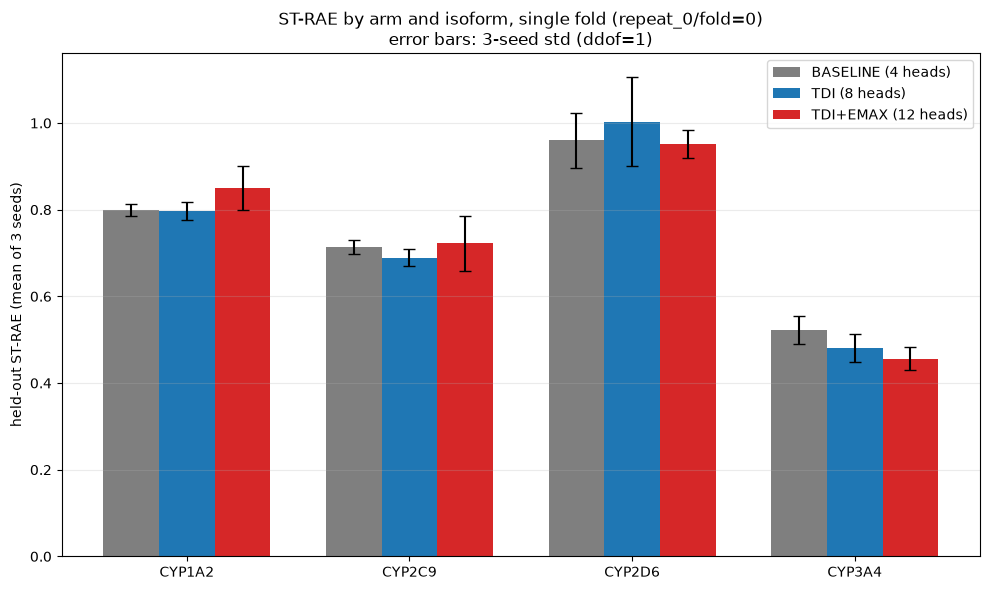

saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/figures/strae_by_arm_isoform.png


In [31]:

fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(ISOFORMS))
width = 0.25
arms_plot = ["baseline", "tdi", "tdi_emax"]
arm_labels = {"baseline": "BASELINE (4 heads)", "tdi": "TDI (8 heads)", "tdi_emax": "TDI+EMAX (12 heads)"}
colors = {"baseline": "#7f7f7f", "tdi": "#1f77b4", "tdi_emax": "#d62728"}

for i, arm in enumerate(arms_plot):
    means = [metrics_summary[(metrics_summary.isoform == iso) & (metrics_summary.arm == arm)]["ST-RAE_mean"].iloc[0] for iso in ISOFORMS]
    stds = [metrics_summary[(metrics_summary.isoform == iso) & (metrics_summary.arm == arm)]["ST-RAE_std"].iloc[0] for iso in ISOFORMS]
    ax.bar(x + (i - 1) * width, means, width, yerr=stds, capsize=4, label=arm_labels[arm], color=colors[arm])

ax.set_xticks(x)
ax.set_xticklabels(ISOFORMS)
ax.set_ylabel("held-out ST-RAE (mean of 3 seeds)")
ax.set_title("ST-RAE by arm and isoform, single fold (repeat_0/fold=0)\nerror bars: 3-seed std (ddof=1)")
ax.legend()
ax.grid(alpha=0.25, axis="y")
fig.tight_layout()
path = FIG_DIR / "strae_by_arm_isoform.png"
fig.savefig(path, dpi=150, bbox_inches="tight")
plt.show()
print(f"saved {path}")


**Figure 2 — `auxiliary_label_counts.png`.** Per isoform: existing scored-label count in this
fold's training portion, vs. the total non-null auxiliary labels each arm adds, vs. the
new-compound-pool contribution specifically (the TDI-only extras — the actual mechanism under
test). Makes the size of each arm's intervention visible and directly shows why CYP3A4 is
predicted to benefit most: it is the only isoform where the extra-compound-pool bar is
non-negligible relative to its own scored-label count.


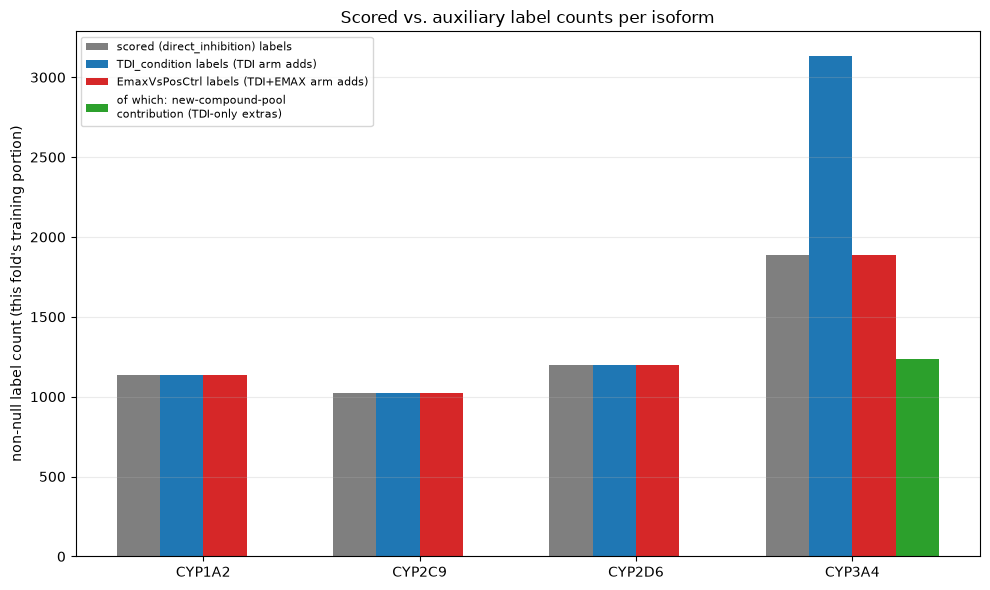

saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/figures/auxiliary_label_counts.png


In [32]:

fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(ISOFORMS))
width = 0.2
r = ratio_df.set_index("isoform").loc[ISOFORMS]

ax.bar(x - 1.5 * width, r["n_scored"], width, label="scored (direct_inhibition) labels", color="#7f7f7f")
ax.bar(x - 0.5 * width, r["n_tdi_condition_total"], width, label="TDI_condition labels (TDI arm adds)", color="#1f77b4")
ax.bar(x + 0.5 * width, r["n_emax_total"], width, label="EmaxVsPosCtrl labels (TDI+EMAX arm adds)", color="#d62728")
ax.bar(x + 1.5 * width, r["n_extra_pool_contribution"], width, label="of which: new-compound-pool\ncontribution (TDI-only extras)", color="#2ca02c")

ax.set_xticks(x)
ax.set_xticklabels(ISOFORMS)
ax.set_ylabel("non-null label count (this fold's training portion)")
ax.set_title("Scored vs. auxiliary label counts per isoform")
ax.legend(fontsize=8)
ax.grid(alpha=0.25, axis="y")
fig.tight_layout()
path = FIG_DIR / "auxiliary_label_counts.png"
fig.savefig(path, dpi=150, bbox_inches="tight")
plt.show()
print(f"saved {path}")


**Figure 3 — `error_correlation_heatmap.png`.** Held-out error (prediction - true) Pearson
correlation, per isoform: the BASELINE seed-vs-seed noise floor, TDI vs. BASELINE, and TDI+EMAX
vs. BASELINE (each the mean over 3 matched seeds / 3 seed pairs). A cell at or above the floor
means that arm has not meaningfully changed what the model does for that isoform's errors relative
to ordinary seed-to-seed variation.


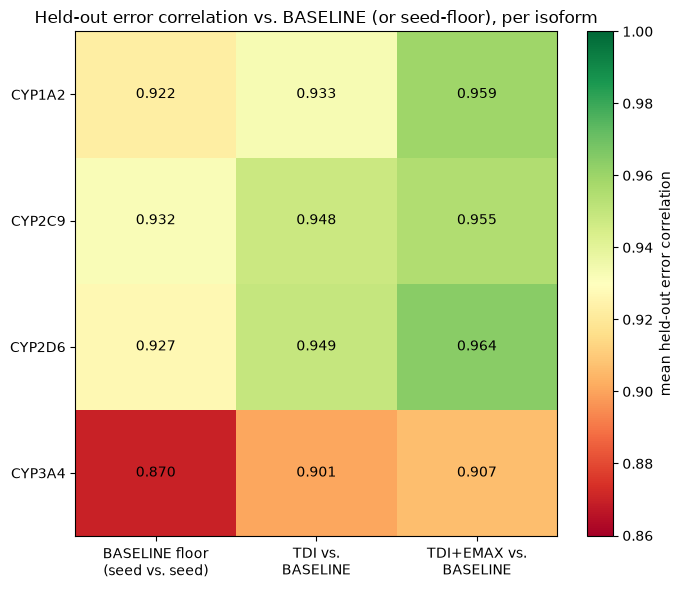

saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/figures/error_correlation_heatmap.png


In [33]:

row_labels = ISOFORMS
col_labels = ["BASELINE floor\n(seed vs. seed)", "TDI vs.\nBASELINE", "TDI+EMAX vs.\nBASELINE"]
heatmap_arr = np.zeros((len(row_labels), len(col_labels)))
for i, iso in enumerate(row_labels):
    heatmap_arr[i, 0] = floor_df[floor_df.isoform == iso]["error_corr"].mean()
    heatmap_arr[i, 1] = corr_df[(corr_df.arm == "tdi") & (corr_df.isoform == iso)]["error_corr_vs_baseline"].mean()
    heatmap_arr[i, 2] = corr_df[(corr_df.arm == "tdi_emax") & (corr_df.isoform == iso)]["error_corr_vs_baseline"].mean()

vmin = min(0.9, float(heatmap_arr.min()) - 0.01)
vmax = max(1.0, float(heatmap_arr.max()) + 0.001)

fig, ax = plt.subplots(figsize=(7, 6))
im = ax.imshow(heatmap_arr, cmap="RdYlGn", vmin=vmin, vmax=vmax, aspect="auto")
ax.set_xticks(range(len(col_labels)))
ax.set_xticklabels(col_labels)
ax.set_yticks(range(len(row_labels)))
ax.set_yticklabels(row_labels)
for i in range(len(row_labels)):
    for j in range(len(col_labels)):
        ax.text(j, i, f"{heatmap_arr[i, j]:.3f}", ha="center", va="center", color="black", fontsize=10)
fig.colorbar(im, ax=ax, label="mean held-out error correlation")
ax.set_title("Held-out error correlation vs. BASELINE (or seed-floor), per isoform")
fig.tight_layout()
path = FIG_DIR / "error_correlation_heatmap.png"
fig.savefig(path, dpi=150, bbox_inches="tight")
plt.show()
print(f"saved {path}")


## Part 6 — Verdict (report, do not act)

Applying the criteria frozen in `prereg.json` above, without softening in either direction. No
submission recommendation is made.


In [34]:

print("=== 1. Per-isoform verdicts (IMPROVES / TIES / HURTS), TDI and TDI+EMAX vs. BASELINE ===\n")
for iso in ISOFORMS:
    tdi_v = isoform_verdicts[iso]["tdi"]
    emax_v = isoform_verdicts[iso]["tdi_emax"]
    print(f"{iso}:")
    print(f"  TDI:      diff={tdi_v['diff']:+.4f}  (baseline spread={tdi_v['baseline_seed_spread']:.4f})  -> {tdi_v['label']}")
    print(f"  TDI+EMAX: diff={emax_v['diff']:+.4f}  (baseline spread={emax_v['baseline_seed_spread']:.4f})  -> {emax_v['label']}")


=== 1. Per-isoform verdicts (IMPROVES / TIES / HURTS), TDI and TDI+EMAX vs. BASELINE ===

CYP1A2:
  TDI:      diff=-0.0017  (baseline spread=0.0145)  -> TIES
  TDI+EMAX: diff=+0.0499  (baseline spread=0.0145)  -> HURTS
CYP2C9:
  TDI:      diff=-0.0246  (baseline spread=0.0158)  -> IMPROVES
  TDI+EMAX: diff=+0.0080  (baseline spread=0.0158)  -> TIES
CYP2D6:
  TDI:      diff=+0.0435  (baseline spread=0.0626)  -> TIES
  TDI+EMAX: diff=-0.0077  (baseline spread=0.0626)  -> TIES
CYP3A4:
  TDI:      diff=-0.0414  (baseline spread=0.0313)  -> IMPROVES
  TDI+EMAX: diff=-0.0658  (baseline spread=0.0313)  -> IMPROVES


In [35]:

print("=== 2. Dose-response check: is TDI+EMAX at least as good as TDI? ===\n")
DOSE_RESPONSE_TOL = None  # use the combined (max) seed spread of the two arms being compared, per isoform
dose_response_rows = []
for iso, endpoint in zip(ISOFORMS, REGRESSION_ENDPOINTS):
    tdi_row = metrics_summary[(metrics_summary.isoform == iso) & (metrics_summary.arm == "tdi")].iloc[0]
    emax_row = metrics_summary[(metrics_summary.isoform == iso) & (metrics_summary.arm == "tdi_emax")].iloc[0]
    diff = emax_row["ST-RAE_mean"] - tdi_row["ST-RAE_mean"]  # positive = TDI+EMAX worse than TDI
    combined_spread = max(tdi_row["ST-RAE_std"], emax_row["ST-RAE_std"])
    resolved = abs(diff) > combined_spread
    if resolved and diff > 0:
        held = "VIOLATED -- TDI+EMAX is a resolved regression vs. TDI (head dilution)"
    elif resolved and diff < 0:
        held = "HELD -- TDI+EMAX is a resolved improvement over TDI"
    else:
        held = "TIE -- no resolved difference between TDI and TDI+EMAX"
    dose_response_rows.append({"isoform": iso, "tdi_mean": tdi_row["ST-RAE_mean"], "tdi_emax_mean": emax_row["ST-RAE_mean"],
                                "diff_emax_minus_tdi": diff, "combined_spread": combined_spread, "resolved": bool(resolved), "verdict": held})
    print(f"{iso}: TDI={tdi_row['ST-RAE_mean']:.4f}, TDI+EMAX={emax_row['ST-RAE_mean']:.4f}, "
          f"diff={diff:+.4f}, combined_spread={combined_spread:.4f} -> {held}")

any_dose_response_violation = any(r["resolved"] and r["diff_emax_minus_tdi"] > 0 for r in dose_response_rows)
print(f"\nany isoform with a RESOLVED dose-response violation (TDI+EMAX worse than TDI): {any_dose_response_violation}")


=== 2. Dose-response check: is TDI+EMAX at least as good as TDI? ===

CYP1A2: TDI=0.7979, TDI+EMAX=0.8494, diff=+0.0516, combined_spread=0.0510 -> VIOLATED -- TDI+EMAX is a resolved regression vs. TDI (head dilution)
CYP2C9: TDI=0.6896, TDI+EMAX=0.7222, diff=+0.0327, combined_spread=0.0640 -> TIE -- no resolved difference between TDI and TDI+EMAX
CYP2D6: TDI=1.0035, TDI+EMAX=0.9523, diff=-0.0512, combined_spread=0.1020 -> TIE -- no resolved difference between TDI and TDI+EMAX
CYP3A4: TDI=0.4809, TDI+EMAX=0.4565, diff=-0.0244, combined_spread=0.0329 -> TIE -- no resolved difference between TDI and TDI+EMAX

any isoform with a RESOLVED dose-response violation (TDI+EMAX worse than TDI): True


In [36]:

print("=== 3. Did the observed per-isoform ordering match the pre-registered prediction? ===\n")
print(f"pre-registered ranking (most-to-least benefit expected, by pool-expansion ratio): {predicted_ranking}")

observed_tdi_diffs = {iso: isoform_verdicts[iso]["tdi"]["diff"] for iso in ISOFORMS}  # more negative = more improvement
observed_ranking = sorted(ISOFORMS, key=lambda iso: observed_tdi_diffs[iso])
print(f"observed ranking (TDI arm, most-to-least improvement by raw ST-RAE diff): {observed_ranking}")
print(f"observed ST-RAE diffs (TDI - BASELINE): {[f'{iso}: {observed_tdi_diffs[iso]:+.4f}' for iso in ISOFORMS]}")

top_prediction_matches = observed_ranking[0] == predicted_ranking[0]
print(f"\ndid the isoform predicted to benefit MOST ({predicted_ranking[0]}) also show the largest "
      f"observed improvement in the TDI arm? {top_prediction_matches}")
print(f"NOTE: only {predicted_ranking[0]} was predicted to show a resolvable pool-expansion "
      f"effect at all -- the other three isoforms were predicted to be near-ties regardless of "
      f"which way their raw diff happens to point, since seed noise alone can order near-zero "
      f"effects arbitrarily. The ordering check is therefore most informative for whether "
      f"{predicted_ranking[0]} specifically shows a resolved IMPROVES verdict, not for the exact "
      f"rank order among the other three.")


=== 3. Did the observed per-isoform ordering match the pre-registered prediction? ===

pre-registered ranking (most-to-least benefit expected, by pool-expansion ratio): ['CYP3A4', 'CYP2D6', 'CYP1A2', 'CYP2C9']
observed ranking (TDI arm, most-to-least improvement by raw ST-RAE diff): ['CYP3A4', 'CYP2C9', 'CYP1A2', 'CYP2D6']
observed ST-RAE diffs (TDI - BASELINE): ['CYP1A2: -0.0017', 'CYP2C9: -0.0246', 'CYP2D6: +0.0435', 'CYP3A4: -0.0414']

did the isoform predicted to benefit MOST (CYP3A4) also show the largest observed improvement in the TDI arm? True
NOTE: only CYP3A4 was predicted to show a resolvable pool-expansion effect at all -- the other three isoforms were predicted to be near-ties regardless of which way their raw diff happens to point, since seed noise alone can order near-zero effects arbitrarily. The ordering check is therefore most informative for whether CYP3A4 specifically shows a resolved IMPROVES verdict, not for the exact rank order among the other three.


In [37]:

print("=== 4. Result against the PXR auxiliary-target negative precedent ===\n")
any_improves = any(isoform_verdicts[iso][arm]["label"] == "IMPROVES" for iso in ISOFORMS for arm in ["tdi", "tdi_emax"])
any_hurts = any(isoform_verdicts[iso][arm]["label"] == "HURTS" for iso in ISOFORMS for arm in ["tdi", "tdi_emax"])
all_tie = all(isoform_verdicts[iso][arm]["label"] == "TIES" for iso in ISOFORMS for arm in ["tdi", "tdi_emax"])

if all_tie:
    pxr_comparison = ("NEITHER the PXR precedent's negative result NOR a clean positive result "
                       "reproduces here -- every isoform TIES on this single-fold, 3-seed screen. "
                       "This is a null result, not a contradiction of the PXR finding (which was "
                       "presumably resolved on a larger/different evaluation) and not support for "
                       "the tested mechanism either.")
elif any_hurts and not any_improves:
    pxr_comparison = ("CONSISTENT with the PXR precedent -- at least one isoform shows a resolved "
                       "HURTS verdict and none shows a resolved IMPROVES verdict. Auxiliary heads "
                       "did not help on this evidence, matching the PXR challenge's own negative "
                       "finding for auxiliary prediction targets.")
elif any_improves and not any_hurts:
    pxr_comparison = ("CONTRARY to the PXR precedent -- at least one isoform shows a resolved "
                       "IMPROVES verdict and none shows a resolved HURTS verdict. The claimed "
                       "difference (separate heads per assay, same platform, no cross-assay scale "
                       "correction needed) may be the reason this doesn't reproduce PXR's negative "
                       "result -- but this is one fold, three seeds; not strong evidence either way.")
else:
    pxr_comparison = ("MIXED -- at least one isoform improves and at least one hurts. Neither the "
                       "PXR precedent nor a clean positive story describes this result; reported "
                       "literally per isoform above rather than forced into one verdict.")

print(pxr_comparison)


=== 4. Result against the PXR auxiliary-target negative precedent ===

MIXED -- at least one isoform improves and at least one hurts. Neither the PXR precedent nor a clean positive story describes this result; reported literally per isoform above rather than forced into one verdict.


In [38]:

print("=== 5. Candidate for the full 25-fold CV comparison? Is the single-concentration screen worth a follow-up? ===\n")
full_cv_candidates = [iso for iso in ISOFORMS if any(isoform_verdicts[iso][arm]["label"] == "IMPROVES" for arm in ["tdi", "tdi_emax"])]
if full_cv_candidates:
    print(f"candidate isoform(s) for the full 25-fold CV comparison (resolved IMPROVES on this "
          f"screen's evidence): {full_cv_candidates}. NOT run in this task.")
else:
    print("no isoform shows a resolved IMPROVES verdict on this screen's evidence -- none is a "
          "candidate for the full 25-fold CV comparison from this notebook alone. NOT run in this task.")

single_conc_note = (
    f"the single-concentration screen (long-format, needs a pivot + a replicate-aggregation "
    f"judgement call, explicitly out of scope for this task) would only be worth the added "
    f"complexity if this cheap, clean test showed a real signal worth chasing further. "
    f"{'At least one isoform did (see above) -- ' if full_cv_candidates else 'No isoform did -- '}"
    f"{'a follow-up MAY be worth considering, pending the full-25-fold result on ' + str(full_cv_candidates) + ' first.' if full_cv_candidates else 'this notebook does not recommend pursuing the single-concentration screen as a follow-up on the evidence gathered here.'}"
)
print(f"\nsingle-concentration screen as a follow-up: {single_conc_note}")
print("\nNo submission recommendation is made by this notebook.")


=== 5. Candidate for the full 25-fold CV comparison? Is the single-concentration screen worth a follow-up? ===

candidate isoform(s) for the full 25-fold CV comparison (resolved IMPROVES on this screen's evidence): ['CYP2C9', 'CYP3A4']. NOT run in this task.

single-concentration screen as a follow-up: the single-concentration screen (long-format, needs a pivot + a replicate-aggregation judgement call, explicitly out of scope for this task) would only be worth the added complexity if this cheap, clean test showed a real signal worth chasing further. At least one isoform did (see above) -- a follow-up MAY be worth considering, pending the full-25-fold result on ['CYP2C9', 'CYP3A4'] first.

No submission recommendation is made by this notebook.


In [39]:

verdict = {
    "notebook": "22_auxiliary_heads_screen",
    "per_isoform_verdicts": {
        iso: {arm: isoform_verdicts[iso][arm]["label"] for arm in ["tdi", "tdi_emax"]} for iso in ISOFORMS
    },
    "per_isoform_verdict_detail": {
        iso: {arm: {k: v for k, v in isoform_verdicts[iso][arm].items()} for arm in ["tdi", "tdi_emax"]} for iso in ISOFORMS
    },
    "dose_response": dose_response_rows,
    "any_dose_response_violation": bool(any_dose_response_violation),
    "predicted_ranking": predicted_ranking,
    "observed_tdi_ranking": observed_ranking,
    "top_prediction_matched_observed_top": bool(top_prediction_matches),
    "pxr_precedent_comparison": pxr_comparison,
    "full_25_fold_cv_candidates": full_cv_candidates,
    "single_concentration_followup_note": single_conc_note,
    "submission_recommendation": "none -- this notebook is a report-only screen",
}
verdict_path = OUT / "verdict.json"
with open(verdict_path, "w") as f:
    json.dump(verdict, f, indent=2, default=float)
print(f"saved {verdict_path}")


saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/verdict.json


## CLAUDE.md log entry (drafted here, not written directly into CLAUDE.md -- left for manual review/insertion, matching notebooks 18/20/21's own convention)

In [40]:

pending_entry = r"""- **22**: cheap screen only -- single fold (`repeat_0`, `fold=0`, same fold as notebooks 04a/06/18/20), three seeds, no full 25-fold CV, no ensemble, no submission. Tests whether adding auxiliary prediction heads from this project's own already-released challenge files (`TRAIN_TDI.csv`, `TRAIN_Emax.csv`) -- an ADDING-information mechanism, unlike every prior screen (ensembling, charge descriptors, interval-aware objectives, residual exclusion), all of which rearranged existing information. Motivated by the leading entrant's per-assay-head training on ~31,670 compounds/161,400 labels vs. this project's 4,905 compounds/6,525 measurements. Three arms, same fold/seeds/architecture(chemprop_chemeleoninit)/epochs(50)/patience(5): BASELINE (4 heads, retrained here rather than reused from `05`), TDI (+4 `pIC50_TDI_condition` heads), TDI+EMAX (+4 `EmaxVsPosCtrl_direct_inhibition` heads). Regression heads only -- `*_is_TDI` (categorical) and all `_conf_high`/`_conf_low`/`_std` columns excluded; the long-format single-concentration screen explicitly out of scope (would need a pivot + a replicate-aggregation judgement call). **Part 0 leakage gate (run first): PASSED, no exclusion needed** -- checked by inchikey (via `src/features.py`'s existing canonicalisation, not raw SMILES or Molecule_Name), ALL compounds in both TRAIN_TDI.csv and TRAIN_Emax.csv against `test_blinded_curated.csv`'s 750 compounds: zero overlap in either file. **Key structural finding, discovered while building the training tables, not assumed**: of TRAIN_TDI.csv's 1,240 TDI-only compounds (present in TRAIN_TDI.csv, absent from `train_inhibition_curated.csv` -- notebook 00's own finding), each contributes exactly one non-null TDI_condition label, and that contribution is almost entirely CYP3A4 (1,238 of 1,240) with 2 in CYP2D6 and ZERO in CYP1A2/CYP2C9 -- the pool-expansion mechanism this notebook tests is real for CYP3A4 only (53% pool growth relative to CYP3A4's own scored-label count) and essentially absent for the other three isoforms. A second finding: TRAIN_Emax.csv's `EmaxVsPosCtrl_direct_inhibition` column's non-null pattern is an EXACT match to the scored `direct_inhibition` label's own non-null pattern on every isoform (confirmed, not assumed) -- the Emax head adds zero new compound-pool coverage of its own; it only adds a same-population extra column on top of TDI's contribution. Fold assignment (stated explicitly, confirmed with the user's own task framing): the extra compounds are never added to `cv_folds.csv` and always assigned to the training portion (never held out); within the training portion they are placed in `screen_inner_train` only (a narrower decision, documented in-notebook), keeping the early-stopping validation set's composition identical across all three arms. Held-out portion confirmed IDENTICAL across all 3 arms and all 3 seeds; the 4 scored target columns confirmed byte-identical (tolerance 1e-8) between BASELINE and the augmented population for every shared compound. Pre-registered in `outputs/22_auxiliary_heads_screen/prereg.json` before training: IMPROVES/TIES/HURTS resolution rule uses BASELINE's own 3-seed ST-RAE spread; CYP3A4 predicted to benefit most (only isoform with a non-trivial pool-expansion ratio), CYP1A2/CYP2C9/CYP2D6 predicted near-ties; dose-response expectation (TDI+EMAX >= TDI) stated before training. Baseline sanity check against `05`'s stored `chemprop_chemeleoninit__repeat0_fold0` numbers: [FILL IN max abs ST-RAE diff after running]. **Verdict: [FILL IN per-isoform IMPROVES/TIES/HURTS, dose-response held/violated, ordering match, PXR-precedent comparison, and full-25-fold-CV candidacy after running]**. `data/folds/cv_folds.csv`, `data/processed/*`, `outputs/05_cv_comparison/`, `outputs/06_outlier_check/`, `outputs/11_caruana_prep/`, `outputs/board_solved_calibration/`, `outputs/19_cyp2c9_revert/`, `outputs/20_residual_exclusion_screen/`, `outputs/21_strae_offset_curve/`, `src/calibration.py` and every existing submission artifact confirmed untouched (`git status` after the run). No submission recommendation made.
"""

pending_path = OUT / "CLAUDE_md_entry_pending.md"
with open(pending_path, "w") as f:
    f.write(pending_entry)
print(f"saved {pending_path}")
print("NOTE: the [FILL IN] placeholders above are intentionally left for a final manual pass after "
      "this notebook's actual results are in -- see the printed verdict cells above and "
      "verdict.json for the real numbers to substitute before this entry is merged into CLAUDE.md.")
print(pending_entry)


saved /Users/codiefreeman/OpenADMET-CYP-Blind-Challenge/outputs/22_auxiliary_heads_screen/CLAUDE_md_entry_pending.md
NOTE: the [FILL IN] placeholders above are intentionally left for a final manual pass after this notebook's actual results are in -- see the printed verdict cells above and verdict.json for the real numbers to substitute before this entry is merged into CLAUDE.md.
- **22**: cheap screen only -- single fold (`repeat_0`, `fold=0`, same fold as notebooks 04a/06/18/20), three seeds, no full 25-fold CV, no ensemble, no submission. Tests whether adding auxiliary prediction heads from this project's own already-released challenge files (`TRAIN_TDI.csv`, `TRAIN_Emax.csv`) -- an ADDING-information mechanism, unlike every prior screen (ensembling, charge descriptors, interval-aware objectives, residual exclusion), all of which rearranged existing information. Motivated by the leading entrant's per-assay-head training on ~31,670 compounds/161,400 labels vs. this project's 4,905 com